In [1]:
import numpy as np
import energyflow
from particle import Particle

import torch
import torch.nn as nn
import torch.nn.functional as F
import pennylane as qml
from torch_geometric.nn import GCNConv, GATConv
from torch.nn import Linear, ReLU, Sigmoid, Tanh, ModuleList, LeakyReLU, Sequential, Dropout
from torch_geometric.nn import global_mean_pool
from torch_geometric.nn import MessagePassing
from torch_geometric.utils import remove_self_loops, add_self_loops, degree
from torch_geometric.data import Data
from torch_geometric.utils import to_networkx
from torch.nn import BCEWithLogitsLoss, CrossEntropyLoss
from torch.optim import Adam
from torch_geometric.loader import DataLoader
from tqdm import tqdm

import networkx as nx
import os
import matplotlib.pyplot as plt
import copy
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

### Hyperparameters

In [2]:
n_connections = 3
input_dims = 8
hidden_dims = [8,8]
output_dims = 1
q_depth = 3
epochs = 20
lr = 1e-3
train_ratio = 0.6
val_ratio = 0.2
test_ratio = 0.2
batch_size = 64

In [3]:
path = "C:/Users/HAEMANTH/Documents/Internships/GSoC/"

### Load the dataset

In [4]:
energyflow.qg_jets.load(num_data=10000, pad=True, ncol=4, generator='pythia', with_bc=False, cache_dir='~/data')

(array([[[ 2.68769142e-01,  3.56903171e-01,  4.74138734e+00,
           2.20000000e+01],
         [ 1.60076377e-01, -2.55609533e-01,  4.55022910e+00,
           2.20000000e+01],
         [ 1.14868731e+00, -6.24380156e-02,  4.50385377e+00,
          -2.11000000e+02],
         ...,
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00]],
 
        [[ 1.21266321e+00, -1.12853089e-01,  3.04708757e+00,
          -2.11000000e+02],
         [ 2.40893976e-01, -1.67174886e-02,  2.82705667e+00,
           2.20000000e+01],
         [ 1.02778452e-01, -8.58720522e-02,  3.04180579e+00,
           2.20000000e+01],
         ...,
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000

In [5]:
dataset = np.load(os.path.expanduser('~/data/datasets/QG_jets.npz'))

In [6]:
dataset.files

['X', 'y']

In [7]:
X = dataset['X']
y = dataset['y']
X.shape, y.shape

((100000, 139, 4), (100000,))

In [8]:
X.shape

(100000, 139, 4)

In [9]:
y.shape, y.dtype

((100000,), dtype('float64'))

#### Select jets with >= 10 particles

In [10]:
inds10 = np.logical_and(np.sum(X[:,:,0]>1e-10,axis=1)>=10,np.sum(X[:,:,0]>1e-10,axis=1)<=120)

In [11]:
X10 = X[inds10,:,:]
y10 = y[inds10]

In [12]:
X10.shape, y10.shape

((99870, 139, 4), (99870,))

#### Sort by transverse momentum

In [13]:
X_sorted = np.zeros((X10.shape[0], 10, X10.shape[2]))
for i in range(X10.shape[0]):
    sort_nodes = np.argsort(X10[i,:,0])[::-1]
    X_sorted[i,:,:] = X10[i,sort_nodes[:10],:]

In [14]:
X_sorted.shape

(99870, 10, 4)

In [15]:
X_sorted = X_sorted[:,:n_connections,:]
X_sorted.shape

(99870, 3, 4)

In [14]:
pid = Particle.from_pdgid(-2.11000000e+02)
pid.mass, pid.charge

(139.57039, -1.0)

In [15]:
def feature_engineer_dataset(X):
    
    # unpack all features
    pt = X[:,:,0]
    rapidity = X[:,:,1]
    phi = X[:,:,2]
    pdgids = X[:,:,3]

    # Calculate new feature values
    nonzero_pdgids = np.where(pdgids > 0) 
    mass = np.zeros(pdgids.shape)
    mass_nonzeros = np.vectorize(Particle.from_pdgid)(pdgids[nonzero_pdgids])
    mass[nonzero_pdgids] = np.fromiter((i.mass for i in mass_nonzeros), float)

    mt = np.sqrt(np.square(mass) + np.square(pt))
    energy = mass*np.cosh(rapidity) 
    px = pt*np.cos(phi)
    py = pt*np.sin(phi)
    pz = mt*np.sinh(rapidity)
    
    return torch.tensor(np.stack((pt, rapidity, phi, mt, energy, px, py, pz), axis=2), dtype=torch.float)

In [16]:
X_new = feature_engineer_dataset(X_sorted)

In [17]:
X_new.shape

torch.Size([99870, 10, 8])

In [68]:
p = Particle.from_pdgid(2212)
print(p)

p


#### Compute number of useful particles, number of photons, number of charged hadrons, total charge for all jets

In [18]:
num_particles = torch.zeros(X_new.shape[0])
num_photons = torch.zeros(X_new.shape[0])
num_charged_hadrons = torch.zeros(X_new.shape[0])
num_neutral_hadrons = torch.zeros(X_new.shape[0])
num_particles.shape

torch.Size([99870])

In [19]:
inds = np.where(X10[2,:,0] > 1e-10)[0]
inds.shape[0]

57

In [20]:
for i in range(len(X10)):
    inds = np.where(X10[i,:,0] > 1e-10)[0]
    num_particles[i] = inds.shape[0]
    
    num_photons[i] = len(np.where(X10[i,inds,3] == 22)[0])
    
    num_charged_hadrons[i] = len(np.where(np.logical_or((abs(X10[i,inds,3]) == 211), 
                                   (abs(X10[i,inds,3]) == 321), 
                                   (abs(X10[i,inds,3]) == 2212)
                                  ) == True)[0])
    
    
    num_neutral_hadrons[i] = len(np.where(np.logical_or((abs(X[i,inds,3]) == 130), 
                                   (abs(X[i,inds,3]) == 2112)
                                  ) == True)[0])                   # neutral hadron    

In [21]:
pdgids = X10[0,:,3]
nonzero_pdgids = np.where(pdgids > 0) 
nonzero_pdgids

(array([ 0,  1,  5,  6,  7,  8, 10, 11, 12, 13, 14, 15, 16, 17],
       dtype=int64),)

In [22]:
pt = X10[0,nonzero_pdgids,0]
pt.shape, X10.shape

((1, 14), (99870, 139, 4))

In [23]:
pdgids = X10[:,:,3]
nonzero_pdgids = np.where(pdgids > 0) 
mass_nonzeros = np.vectorize(Particle.from_pdgid)(pdgids[nonzero_pdgids])
charge_particles = np.zeros(pdgids.shape)
charge_particles[nonzero_pdgids] = np.fromiter((i.charge if i.charge > 0 else 0 for i in mass_nonzeros), float)
pt = X10[:,:,0]
charge_jet_2 = np.sum(charge_particles * ((pt**0.2)/np.sum(pt)**0.2) , axis=1)
charge_jet_5 = np.sum(charge_particles * ((pt**0.5)/np.sum(pt)**0.5) , axis=1)
charge_jet_7 = np.sum(charge_particles * ((pt**0.7)/np.sum(pt)**0.7) , axis=1)

In [24]:
charge_jet = np.sum(charge_particles, axis=1)
charge_jet.shape

(99870,)

In [25]:
print(charge_jet_2.shape)
charge_jet_2

(99870,)


array([0.07898153, 0.1725243 , 0.52408037, ..., 0.17009737, 0.48479047,
       0.4587912 ])

In [26]:
charge_jet_7

array([2.48108168e-05, 8.78291430e-05, 1.99322411e-04, ...,
       4.69282329e-05, 1.52115589e-04, 2.57501495e-04])

In [27]:
graph_features = torch.stack((num_particles, num_photons, num_charged_hadrons, num_neutral_hadrons, torch.tensor(charge_jet)), dim=1)
graph_features.shape

torch.Size([99870, 5])

In [28]:
graph_features

tensor([[18., 12.,  6.,  0.,  2.],
        [17.,  7.,  8.,  1.,  4.],
        [57., 24., 24.,  6., 13.],
        ...,
        [16.,  6.,  9.,  0.,  5.],
        [88., 55., 26.,  3., 13.],
        [40., 15., 19.,  5., 12.]], dtype=torch.float64)

In [29]:
graph_features_norm = graph_features / torch.amax(graph_features, dim=(0))
graph_features_norm

tensor([[0.1500, 0.1644, 0.0923, 0.0000, 0.0588],
        [0.1417, 0.0959, 0.1231, 0.0909, 0.1176],
        [0.4750, 0.3288, 0.3692, 0.5455, 0.3824],
        ...,
        [0.1333, 0.0822, 0.1385, 0.0000, 0.1471],
        [0.7333, 0.7534, 0.4000, 0.2727, 0.3824],
        [0.3333, 0.2055, 0.2923, 0.4545, 0.3529]], dtype=torch.float64)

In [30]:
graph_features_norm.shape

torch.Size([99870, 5])

#### Normalize the dataset

In [31]:
torch.amax(X_new,dim=(0,1))

tensor([5.0142e+02, 2.0568e+00, 6.6599e+00, 1.0556e+03, 3.5155e+03, 4.9331e+02,
        4.7369e+02, 3.2208e+03])

In [32]:
X_norm = X_new / torch.amax(X_new, dim=(0,1))   
# fetch the maximum value for all feature (in last dimension) and normalize the dataset through max scaling.
X_norm.shape

torch.Size([99870, 10, 8])

In [31]:
def strip_zeros(X):
    X_useful = []
    for Xi in X:
        inds = np.where(Xi[:,0] > 1e-10)
        X_useful.append(Xi[inds])
        
    return X_useful

In [101]:
X_preprocessed = strip_zeros(X_norm)
len(X_preprocessed), X_preprocessed[0].shape, X_preprocessed[1].shape

(100000, torch.Size([18, 8]), torch.Size([17, 8]))

#### Form graph dataset

In [33]:
def create_graph(x):
    M = x.shape[0]  # number of nodes in graph (particles)
    N = M-1         # number of neighbors of each node to be considered for edge connections (1 extra for self loops) 
    # (√N is considered optimal number of neighbors for k-NN on N points)
    edge_index = torch.zeros((2,M*N))   
    edge_attr = torch.zeros((M*N, 1)) 
    # adj_node_pairs = torch.zeros((, ))
    
    for i, features in enumerate(x):
        # find N nearest neighbors in (𝜙,𝑦) space
        distances = torch.sqrt((features[2] - x[:,2])**2 + (features[1] - x[:,1])**2)
        N_nearest = np.argsort(distances)[1:N+1]
        
        edge_index[0][i*N:(i+1)*N] = torch.tensor([i for _ in range(N)])
        edge_index[1][i*N:(i+1)*N] = N_nearest
        edge_attr[i*N:(i+1)*N] = distances[N_nearest].reshape(N,1)   # (max(distances) - distances[N_nearest])/(min(distances[distances > 0]))).reshape(N,    
    
    edge_index = edge_index.to(torch.int)
    return edge_index, edge_attr

In [34]:
def create_graph_dataset(X, y, graph_features):
    dataset = []
        
    for Xi, yi, gi in zip(X,y,graph_features):

        edge_index, edge_attr = create_graph(Xi)            
        data = Data(x=Xi, edge_index=edge_index, edge_attr=edge_attr,y=torch.tensor(yi, dtype=torch.long), graph_features=gi)
        dataset.append(data)
        
    return dataset

In [35]:
dataset = create_graph_dataset(X_norm[:12500, :3, :],y10[:12500], graph_features_norm[:12500])

In [36]:
len(dataset), dataset[0]

(12500,
 Data(x=[3, 8], edge_index=[2, 6], edge_attr=[6, 1], y=1, graph_features=[5]))

In [195]:
dataset[0].edge_index

tensor([[0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4],
        [1, 2, 3, 4, 0, 2, 3, 4, 1, 0, 3, 4, 0, 1, 4, 2, 0, 3, 1, 2]],
       dtype=torch.int32)

In [99]:
dataset[0].edge_attr

tensor([[0.1003],
        [0.0997],
        [0.0988],
        [0.0982],
        [0.0973],
        [0.0971],
        [0.0970],
        [0.0959],
        [0.0629],
        [0.1006],
        [0.1000],
        [0.0996],
        [0.0986],
        [0.0976],
        [0.0975],
        [0.0968],
        [0.0960],
        [0.0629],
        [0.1017],
        [0.1006],
        [0.1002],
        [0.0996],
        [0.0988],
        [0.0975],
        [0.0970],
        [0.0960],
        [0.0629],
        [0.0976],
        [0.0962],
        [0.0960],
        [0.0945],
        [0.0944],
        [0.0939],
        [0.0934],
        [0.0913],
        [0.0629],
        [0.0982],
        [0.0950],
        [0.0945],
        [0.0943],
        [0.0942],
        [0.0941],
        [0.0935],
        [0.0922],
        [0.0627],
        [0.1037],
        [0.1015],
        [0.1006],
        [0.1003],
        [0.0986],
        [0.0977],
        [0.0974],
        [0.0959],
        [0.0629],
        [0.0989],
        [0

In [91]:
dataset[0].edge_attr

tensor([[0.0000],
        [0.0006],
        [0.0000],
        [0.0006],
        [0.0000],
        [0.0011]])

In [34]:
dataset[0].edge_attr

tensor([[2.4870],
        [1.4870],
        [1.7354],
        [0.7354],
        [1.4331],
        [0.4331]])

In [79]:
for i in range(8):
    quarks = len([j for j in range(i*12500, (i+1)*12500) if y[j]==1])
    gluons = len([j for j in range(i*12500, (i+1)*12500) if y[j]==0])
    print(i, quarks, gluons)

0 6325 6175
1 6266 6234
2 6247 6253
3 6190 6310
4 6336 6164
5 6170 6330
6 6297 6203
7 6169 6331


In [37]:
batch_size = 64

In [38]:
data_train, data_val, data_test = torch.utils.data.random_split(dataset, [train_ratio, val_ratio, test_ratio])

In [39]:
train_dataloader = DataLoader(data_train,
                              batch_size = batch_size,
                              shuffle=True)
val_dataloader = DataLoader(data_val,
                            batch_size = batch_size,
                            shuffle=True)
test_dataloader = DataLoader(data_test,
                         batch_size = batch_size,
                         shuffle=True)

In [40]:
len(train_dataloader)

118

In [41]:
for batch in train_dataloader:
    print(f"Batch node features shape: {batch.x.shape}")
    print(f"Batch edge indices shape: {batch.edge_index.shape}")
    print(f"Batch edge attributes shape: {batch.edge_attr.shape}")
    print(f"Batch target shape: {batch.y.shape}")
    break


Batch node features shape: torch.Size([192, 8])
Batch edge indices shape: torch.Size([2, 384])
Batch edge attributes shape: torch.Size([384, 1])
Batch target shape: torch.Size([64])


### Train functions

In [42]:
def run_model(model, epoch, loader, lossFn, optimizer, train=True, quantum=False):
    if train:
        model.train()
    else:
        model.eval()
        
    loss = 0
    net_loss = 0
    correct = 0
  
    for batch_idx, data in (tqdm(enumerate(loader)) if train else enumerate(loader)):
        
        target = data.y

        #This will zero out the gradients for this batch. 
        optimizer.zero_grad()

        #Run the model on the train data
        output = model(data.x, data.edge_index.type(torch.int64), data.edge_attr, data.batch, data.graph_features)

        target = target.unsqueeze(1).float()

        # Calculate the loss
        loss = lossFn(output, target)
        net_loss += loss.data * batch_size

        if train:
            #dloss/dx for every Variable 
            loss.backward()

            #to do a one-step update on our parameter.
            optimizer.step()

        pred = (output > 0).float() 
        # since we are working with logits and not probabilities (sigmoid is applied while computing loss), we consider 0 as threshold
        
#         _, pred = torch.max(F.softmax(output,dim=1).data, dim=1)
        correct += (pred == target).sum()
        
        
    acc = correct / len(loader.dataset)
    net_loss /= len(loader.dataset)
      
    if train:
        print('Train', end=" ")
    else:
        print("Val", end=" ")
        
    # Print out the loss
    print('Epoch: {} \tLoss: {:.6f}, Accuracy: {}/{} ({:.0f}%)'.format(
          epoch, net_loss, correct, len(loader.dataset),
          100. * acc))
    
    return net_loss, acc

In [43]:
def train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader):
    
    history = {'train_loss': [],'val_loss':[],'train_acc': [],'val_acc': [] }
    best_model = model
    best_val_loss = 1000

    for epoch in range(epochs):
        train_loss, train_acc = run_model(model, epoch, train_dataloader, lossFn, optimizer)
        val_loss, val_acc = run_model(model, epoch, val_dataloader, lossFn, optimizer, train=False)
        print()

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        
        if(best_val_loss > val_loss):
            best_val_loss = val_loss
            best_model = model
        
    return history, best_model

In [44]:
def test_eval(model, test_dataloader):
    
    preds = []
    labels = []
    acc = 0
    for data in test_dataloader:

        target = data.y
        labels.append(target.detach().cpu().numpy())
        
        output = model(data.x, data.edge_index.type(torch.int64), data.edge_attr, data.batch, data.graph_features)
        preds.append(output.detach().cpu().numpy())  # Convert to numpy array
        # probs = Sigmoid()(output).detach().cpu().numpy()  # Convert to numpy array
        # preds.append(copy.deepcopy(output))

        target = target.unsqueeze(1).float()    
        pred = (output > 0).float()    
        acc += (pred == target).sum().item()

    acc = acc / len(test_dataloader.dataset)
    print("Test accuracy: ", 100. * acc)
    
    labels = np.concatenate(labels, axis=0)  # Concatenate lists into a single numpy array
    preds = np.concatenate(preds, axis=0)  # Concatenate lists into a single numpy array

    
    return labels, preds

In [45]:
def plot_loss(history, step=2):
    n = len(history['train_loss'])
    x = range(n)
    plt.plot(x, history['train_loss'], label='Train loss')
    plt.plot(x, history['val_loss'], label='Val loss')
    plt.plot(x, history['train_acc'], label='Train acc')
    plt.plot(x, history['val_acc'], label='Val acc')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.xticks(range(0,n,step), range(1,n+1,step))

    plt.legend()
    plt.show()

In [46]:
def plot_auc(model, test_dataloader):
    labels, preds = test_eval(model, test_dataloader)
    auc = roc_auc_score(labels, preds)
    fpr, tpr, _ = roc_curve(labels, preds)
    plt.plot(fpr, tpr, label="AUC = {0}".format(auc))
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.show()

In [80]:
example = next(iter(train_dataloader))
example.num_useful_nodes.shape

torch.Size([192])

In [40]:
tensor_a = torch.randn(100, 4)

# Tensor of shape (12500, 1)
tensor_b = torch.randint(0, 10, (100, 1))

# Concatenate along the second dimension (dim=1)
result_tensor = torch.cat((tensor_a, tensor_b), dim=1)

print(result_tensor.shape) 

torch.Size([100, 5])


In [120]:
eg = next(iter(train_dataloader))
eg.x.shape, eg.edge_index.shape, eg.edge_attr.shape, eg.batch.shape, eg.graph_features.shape

(torch.Size([192, 8]),
 torch.Size([2, 384]),
 torch.Size([384, 1]),
 torch.Size([192]),
 torch.Size([320]))

### PyTorch GAT

In [210]:
from torch_geometric.nn import GATConv

In [211]:
class GAT(torch.nn.Module):
    def __init__(self, input_dim, hidden_dims, output_dim, activ_fn):
        super().__init__()
        layers = []
        layers.append(GATConv(input_dim, hidden_dims[0], edge_dim=1))
    
        for i in range(len(hidden_dims)-1):
            layers.append(GATConv(hidden_dims[i], hidden_dims[i+1], edge_dim=1))
            
        self.layers = ModuleList(layers)
        self.activ_fn = activ_fn
        self.classifier = Sequential(Linear(hidden_dims[-1]+5, 8),
                                     ReLU(),
#                                      Linear(16, 8),
#                                      ReLU(),
                                     Linear(8, output_dims)
                                    )

    def forward(self, x, edge_index, edge_weight, batch, graph_features):
        h = x
        for i in range(len(self.layers)):
            h = self.layers[i](h, edge_index, edge_weight)
            h = self.activ_fn(h)
         
        h = global_mean_pool(h, batch)   # readout layer to get the embedding for each graph in batch
        h = torch.cat((h, graph_features.float().reshape(-1,5)), dim=1)
        h = self.classifier(h)
        return h

### PyTorch GCN

In [114]:
class GNN(torch.nn.Module):
    def __init__(self, input_dim, hidden_dims, output_dim, activ_fn):
        super().__init__()
        layers = []
        layers.append(GCNConv(input_dim, hidden_dims[0]))
    
        for i in range(len(hidden_dims)-1):
            layers.append(GCNConv(hidden_dims[i], hidden_dims[i+1]))
            
        self.layers = ModuleList(layers)
        self.activ_fn = activ_fn
        self.classifier = Sequential(Linear(hidden_dims[-1]+5, 16),
                                     ReLU(),
                                     Linear(16, 8),
                                     ReLU(),
                                     Linear(8, output_dims)
                                    )

    def forward(self, x, edge_index, edge_weight, batch, graph_features):
        h = x
        for i in range(len(self.layers)):
            h = self.layers[i](h, edge_index, edge_weight)
            h = self.activ_fn(h)
         
        h = global_mean_pool(h, batch)   # readout layer to get the embedding for each graph in batch
        h = torch.cat((h, graph_features.float().reshape(-1,5)), dim=1)
        h = self.classifier(h)
        return h

In [69]:
def find_ideal_particles(X, y, num_particles, min_particles, max_particles):
    train_loss = dict()
    val_loss = dict()
    train_acc = dict()
    val_acc = dict()
    auc = dict()
    
    for i in range(min_particles, max_particles+1):
        
        print("Particles per jet:",i)
        train_loss_i = []
        val_loss_i = []
        train_acc_i = []
        val_acc_i = []
        auc_i = []
        
        for j in range(8):

            X_filtered = X[j*12500:min(len(X), (j+1)*12500), :i, :]
            y_filtered = y[j*12500:min(len(X), (j+1)*12500)]
            num_particles_filtered = num_particles[j*12500:min(len(X), (j+1)*12500)] 
            dataset = create_graph_dataset(X_filtered,y_filtered, num_particles_filtered)

            data_train, data_val, data_test = torch.utils.data.random_split(dataset, [train_ratio, val_ratio, test_ratio])

            train_dataloader = DataLoader(data_train,
                                  batch_size = batch_size,
                                  shuffle=True)
            val_dataloader = DataLoader(data_val,
                                        batch_size = batch_size,
                                        shuffle=True)
            test_dataloader = DataLoader(data_test,
                             batch_size = batch_size,
                             shuffle=True)

            model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())

            optimizer = Adam(model.parameters(), 1e-2)
            lossFn = BCEWithLogitsLoss()
            history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

            ind = np.argmin(history['val_loss'])
            train_loss_i.append(history['train_loss'][ind])
            val_loss_i.append(history['val_loss'][ind])
            train_acc_i.append(history['train_acc'][ind])
            val_acc_i.append(history['val_acc'][ind])

            labels, preds = test_eval(best_model, test_dataloader)
            auc_i.append(roc_auc_score(labels, preds))

            plot_loss(history)
            print("*"*100)
            print()
            
        print()
        print()
            
        train_loss[i] = train_loss_i
        val_loss[i] = val_loss_i
        train_acc[i] = train_acc_i
        val_acc[i] = val_acc_i
        auc[i] = auc_i
        
    return train_loss, val_loss, train_acc, val_acc, auc

#### With all particles, complete graph, edge_weights

In [72]:
hidden_dims = [8,8]
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GNN(
  (layers): ModuleList(
    (0-1): 2 x GCNConv(8, 8)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=12, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=8, bias=True)
    (3): ReLU()
    (4): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [88]:
epochs = 40
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:01, 66.16it/s]


Train Epoch: 0 	Loss: 0.698557, Accuracy: 3758/7500 (50%)
Val Epoch: 0 	Loss: 0.701518, Accuracy: 1266/2500 (51%)



118it [00:01, 70.60it/s]


Train Epoch: 1 	Loss: 0.662718, Accuracy: 5037/7500 (67%)
Val Epoch: 1 	Loss: 0.637884, Accuracy: 1813/2500 (73%)



118it [00:01, 70.56it/s]


Train Epoch: 2 	Loss: 0.598763, Accuracy: 5453/7500 (73%)
Val Epoch: 2 	Loss: 0.574247, Accuracy: 1869/2500 (75%)



118it [00:01, 76.81it/s]


Train Epoch: 3 	Loss: 0.554426, Accuracy: 5681/7500 (76%)
Val Epoch: 3 	Loss: 0.545458, Accuracy: 1910/2500 (76%)



118it [00:01, 105.80it/s]


Train Epoch: 4 	Loss: 0.516734, Accuracy: 5732/7500 (76%)
Val Epoch: 4 	Loss: 0.515224, Accuracy: 1933/2500 (77%)



118it [00:00, 136.60it/s]


Train Epoch: 5 	Loss: 0.495157, Accuracy: 5757/7500 (77%)
Val Epoch: 5 	Loss: 0.508361, Accuracy: 1922/2500 (77%)



118it [00:00, 129.63it/s]


Train Epoch: 6 	Loss: 0.491236, Accuracy: 5788/7500 (77%)
Val Epoch: 6 	Loss: 0.486070, Accuracy: 1930/2500 (77%)



118it [00:00, 131.39it/s]


Train Epoch: 7 	Loss: 0.486512, Accuracy: 5786/7500 (77%)
Val Epoch: 7 	Loss: 0.485602, Accuracy: 1942/2500 (78%)



118it [00:00, 121.45it/s]


Train Epoch: 8 	Loss: 0.485407, Accuracy: 5806/7500 (77%)
Val Epoch: 8 	Loss: 0.497796, Accuracy: 1948/2500 (78%)



118it [00:00, 123.84it/s]


Train Epoch: 9 	Loss: 0.484630, Accuracy: 5792/7500 (77%)
Val Epoch: 9 	Loss: 0.492354, Accuracy: 1946/2500 (78%)



66it [00:00, 119.53it/s]


KeyboardInterrupt: 

Test accuracy:  77.73105036547511


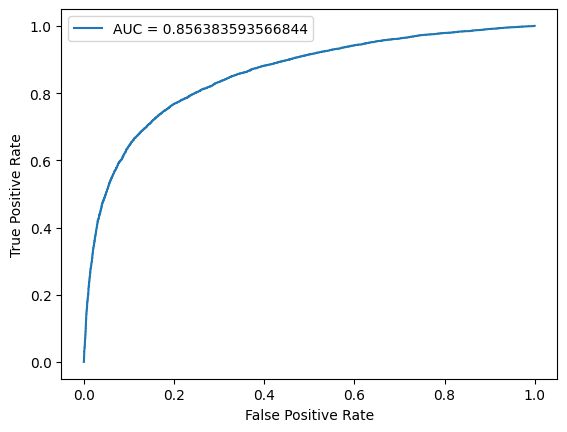

In [136]:
plot_auc(best_model, test_dataloader)

### 100K jets

#### GAT - 5 particles

In [213]:
hidden_dims = [8,8]
model = GAT(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv(8, 8, heads=1)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=13, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [214]:
epochs = 50
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

469it [00:20, 22.77it/s]


Train Epoch: 0 	Loss: 0.613485, Accuracy: 41525/59922 (69%)
Val Epoch: 0 	Loss: 0.515274, Accuracy: 15405/19974 (77%)



469it [00:21, 21.82it/s]


Train Epoch: 1 	Loss: 0.498130, Accuracy: 46061/59922 (77%)
Val Epoch: 1 	Loss: 0.490772, Accuracy: 15474/19974 (77%)



469it [00:21, 21.36it/s]


Train Epoch: 2 	Loss: 0.489602, Accuracy: 46340/59922 (77%)
Val Epoch: 2 	Loss: 0.485421, Accuracy: 15489/19974 (78%)



469it [00:22, 20.98it/s]


Train Epoch: 3 	Loss: 0.486331, Accuracy: 46376/59922 (77%)
Val Epoch: 3 	Loss: 0.484247, Accuracy: 15521/19974 (78%)



469it [00:21, 21.48it/s]


Train Epoch: 4 	Loss: 0.484642, Accuracy: 46424/59922 (77%)
Val Epoch: 4 	Loss: 0.481393, Accuracy: 15541/19974 (78%)



469it [00:22, 20.56it/s]


Train Epoch: 5 	Loss: 0.484189, Accuracy: 46469/59922 (78%)
Val Epoch: 5 	Loss: 0.481894, Accuracy: 15499/19974 (78%)



469it [00:22, 20.43it/s]


Train Epoch: 6 	Loss: 0.483592, Accuracy: 46407/59922 (77%)
Val Epoch: 6 	Loss: 0.483477, Accuracy: 15555/19974 (78%)



469it [00:22, 20.87it/s]


Train Epoch: 7 	Loss: 0.482897, Accuracy: 46476/59922 (78%)
Val Epoch: 7 	Loss: 0.480599, Accuracy: 15530/19974 (78%)



469it [00:22, 20.69it/s]


Train Epoch: 8 	Loss: 0.483413, Accuracy: 46452/59922 (78%)
Val Epoch: 8 	Loss: 0.481068, Accuracy: 15552/19974 (78%)



469it [00:22, 21.16it/s]


Train Epoch: 9 	Loss: 0.482715, Accuracy: 46450/59922 (78%)
Val Epoch: 9 	Loss: 0.482546, Accuracy: 15551/19974 (78%)



469it [00:23, 20.25it/s]


Train Epoch: 10 	Loss: 0.482397, Accuracy: 46473/59922 (78%)
Val Epoch: 10 	Loss: 0.479346, Accuracy: 15546/19974 (78%)



469it [00:24, 18.81it/s]


Train Epoch: 11 	Loss: 0.482196, Accuracy: 46492/59922 (78%)
Val Epoch: 11 	Loss: 0.479538, Accuracy: 15545/19974 (78%)



469it [00:23, 20.02it/s]


Train Epoch: 12 	Loss: 0.481815, Accuracy: 46483/59922 (78%)
Val Epoch: 12 	Loss: 0.481093, Accuracy: 15532/19974 (78%)



469it [00:22, 20.42it/s]


Train Epoch: 13 	Loss: 0.481846, Accuracy: 46488/59922 (78%)
Val Epoch: 13 	Loss: 0.480746, Accuracy: 15556/19974 (78%)



469it [00:23, 20.19it/s]


Train Epoch: 14 	Loss: 0.481432, Accuracy: 46496/59922 (78%)
Val Epoch: 14 	Loss: 0.480059, Accuracy: 15549/19974 (78%)



469it [00:22, 20.43it/s]


Train Epoch: 15 	Loss: 0.482199, Accuracy: 46482/59922 (78%)
Val Epoch: 15 	Loss: 0.481116, Accuracy: 15549/19974 (78%)



469it [00:22, 20.40it/s]


Train Epoch: 16 	Loss: 0.481472, Accuracy: 46504/59922 (78%)
Val Epoch: 16 	Loss: 0.481916, Accuracy: 15533/19974 (78%)



469it [00:22, 20.47it/s]


Train Epoch: 17 	Loss: 0.481529, Accuracy: 46503/59922 (78%)
Val Epoch: 17 	Loss: 0.480717, Accuracy: 15561/19974 (78%)



469it [00:22, 20.65it/s]


Train Epoch: 18 	Loss: 0.480743, Accuracy: 46543/59922 (78%)
Val Epoch: 18 	Loss: 0.479509, Accuracy: 15555/19974 (78%)



469it [00:23, 20.26it/s]


Train Epoch: 19 	Loss: 0.480898, Accuracy: 46511/59922 (78%)
Val Epoch: 19 	Loss: 0.479391, Accuracy: 15554/19974 (78%)



469it [00:22, 20.53it/s]


Train Epoch: 20 	Loss: 0.480285, Accuracy: 46573/59922 (78%)
Val Epoch: 20 	Loss: 0.480617, Accuracy: 15537/19974 (78%)



469it [00:23, 20.07it/s]


Train Epoch: 21 	Loss: 0.480642, Accuracy: 46547/59922 (78%)
Val Epoch: 21 	Loss: 0.478156, Accuracy: 15591/19974 (78%)



469it [00:22, 20.74it/s]


Train Epoch: 22 	Loss: 0.479626, Accuracy: 46534/59922 (78%)
Val Epoch: 22 	Loss: 0.477844, Accuracy: 15579/19974 (78%)



469it [00:23, 20.09it/s]


Train Epoch: 23 	Loss: 0.479492, Accuracy: 46551/59922 (78%)
Val Epoch: 23 	Loss: 0.477326, Accuracy: 15577/19974 (78%)



469it [00:23, 19.86it/s]


Train Epoch: 24 	Loss: 0.479263, Accuracy: 46574/59922 (78%)
Val Epoch: 24 	Loss: 0.476110, Accuracy: 15582/19974 (78%)



469it [00:23, 20.18it/s]


Train Epoch: 25 	Loss: 0.478903, Accuracy: 46586/59922 (78%)
Val Epoch: 25 	Loss: 0.479825, Accuracy: 15591/19974 (78%)



469it [00:23, 20.11it/s]


Train Epoch: 26 	Loss: 0.478830, Accuracy: 46606/59922 (78%)
Val Epoch: 26 	Loss: 0.478589, Accuracy: 15608/19974 (78%)



469it [00:23, 19.89it/s]


Train Epoch: 27 	Loss: 0.478479, Accuracy: 46631/59922 (78%)
Val Epoch: 27 	Loss: 0.476939, Accuracy: 15598/19974 (78%)



469it [00:23, 20.26it/s]


Train Epoch: 28 	Loss: 0.478003, Accuracy: 46584/59922 (78%)
Val Epoch: 28 	Loss: 0.475921, Accuracy: 15615/19974 (78%)



469it [00:23, 19.70it/s]


Train Epoch: 29 	Loss: 0.477491, Accuracy: 46614/59922 (78%)
Val Epoch: 29 	Loss: 0.474756, Accuracy: 15614/19974 (78%)



469it [00:22, 20.66it/s]


Train Epoch: 30 	Loss: 0.477096, Accuracy: 46615/59922 (78%)
Val Epoch: 30 	Loss: 0.475077, Accuracy: 15612/19974 (78%)



469it [00:23, 19.86it/s]


Train Epoch: 31 	Loss: 0.477571, Accuracy: 46568/59922 (78%)
Val Epoch: 31 	Loss: 0.474225, Accuracy: 15633/19974 (78%)



469it [00:24, 19.41it/s]


Train Epoch: 32 	Loss: 0.476654, Accuracy: 46661/59922 (78%)
Val Epoch: 32 	Loss: 0.477056, Accuracy: 15613/19974 (78%)



469it [00:22, 20.55it/s]


Train Epoch: 33 	Loss: 0.476683, Accuracy: 46647/59922 (78%)
Val Epoch: 33 	Loss: 0.478475, Accuracy: 15585/19974 (78%)



469it [00:23, 20.18it/s]


Train Epoch: 34 	Loss: 0.476168, Accuracy: 46618/59922 (78%)
Val Epoch: 34 	Loss: 0.474830, Accuracy: 15638/19974 (78%)



469it [00:20, 22.36it/s]


Train Epoch: 35 	Loss: 0.475868, Accuracy: 46690/59922 (78%)
Val Epoch: 35 	Loss: 0.474316, Accuracy: 15599/19974 (78%)



469it [00:16, 29.15it/s]


Train Epoch: 36 	Loss: 0.475580, Accuracy: 46705/59922 (78%)
Val Epoch: 36 	Loss: 0.478756, Accuracy: 15589/19974 (78%)



469it [00:14, 33.27it/s]


Train Epoch: 37 	Loss: 0.475535, Accuracy: 46669/59922 (78%)
Val Epoch: 37 	Loss: 0.475474, Accuracy: 15641/19974 (78%)



469it [00:08, 54.64it/s]


Train Epoch: 38 	Loss: 0.475776, Accuracy: 46691/59922 (78%)
Val Epoch: 38 	Loss: 0.473618, Accuracy: 15638/19974 (78%)



469it [00:13, 35.62it/s]


Train Epoch: 39 	Loss: 0.475310, Accuracy: 46666/59922 (78%)
Val Epoch: 39 	Loss: 0.473178, Accuracy: 15635/19974 (78%)



469it [00:13, 35.09it/s]


Train Epoch: 40 	Loss: 0.475345, Accuracy: 46713/59922 (78%)
Val Epoch: 40 	Loss: 0.474614, Accuracy: 15630/19974 (78%)



469it [00:20, 22.47it/s]


Train Epoch: 41 	Loss: 0.474983, Accuracy: 46703/59922 (78%)
Val Epoch: 41 	Loss: 0.473736, Accuracy: 15644/19974 (78%)



469it [00:18, 25.15it/s]


Train Epoch: 42 	Loss: 0.474792, Accuracy: 46700/59922 (78%)
Val Epoch: 42 	Loss: 0.473370, Accuracy: 15646/19974 (78%)



469it [00:15, 29.43it/s]


Train Epoch: 43 	Loss: 0.474587, Accuracy: 46756/59922 (78%)
Val Epoch: 43 	Loss: 0.475479, Accuracy: 15646/19974 (78%)



469it [00:22, 20.47it/s]


Train Epoch: 44 	Loss: 0.474305, Accuracy: 46728/59922 (78%)
Val Epoch: 44 	Loss: 0.476723, Accuracy: 15654/19974 (78%)



469it [00:18, 25.33it/s]


Train Epoch: 45 	Loss: 0.474485, Accuracy: 46678/59922 (78%)
Val Epoch: 45 	Loss: 0.478205, Accuracy: 15621/19974 (78%)



469it [00:29, 15.86it/s]


Train Epoch: 46 	Loss: 0.474562, Accuracy: 46719/59922 (78%)
Val Epoch: 46 	Loss: 0.472746, Accuracy: 15643/19974 (78%)



469it [00:20, 22.49it/s]


Train Epoch: 47 	Loss: 0.474214, Accuracy: 46719/59922 (78%)
Val Epoch: 47 	Loss: 0.476842, Accuracy: 15611/19974 (78%)



469it [00:14, 32.28it/s]


Train Epoch: 48 	Loss: 0.474301, Accuracy: 46751/59922 (78%)
Val Epoch: 48 	Loss: 0.475083, Accuracy: 15641/19974 (78%)



469it [00:17, 26.95it/s]


Train Epoch: 49 	Loss: 0.473668, Accuracy: 46720/59922 (78%)
Val Epoch: 49 	Loss: 0.475211, Accuracy: 15644/19974 (78%)



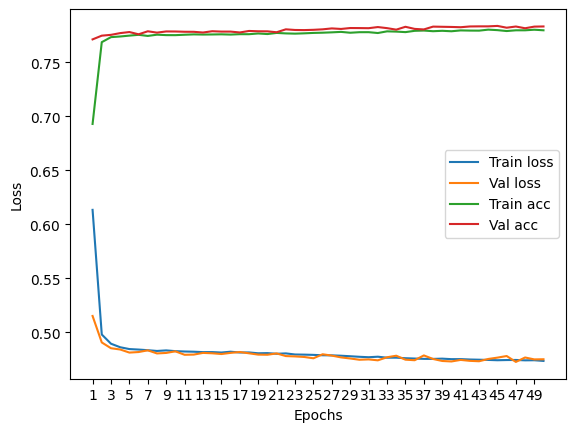

In [215]:
plot_loss(history)

Test accuracy:  77.17532792630419


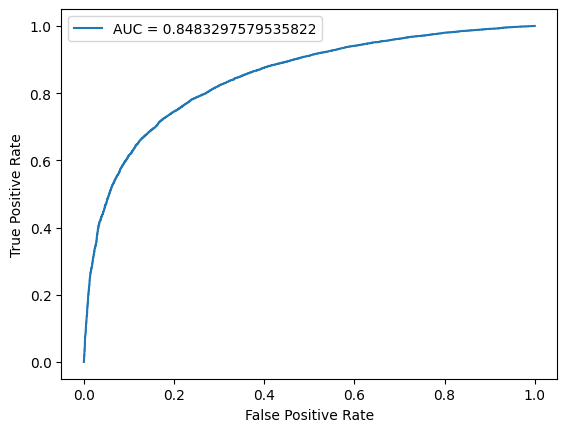

In [216]:
plot_auc(best_model, test_dataloader)

#### GAT - With 5 particles, edge_weights, (total particles, photon, charged hadron, neutral hadron, charge of jet with k = 0.2, 0.5, 0.7) count

In [116]:
input_dims = 8
hidden_dims = [8,8]
model = GAT(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv(8, 8, heads=1)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=15, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [117]:
epochs = 50
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:01, 64.49it/s]


Train Epoch: 0 	Loss: 0.686021, Accuracy: 4737/7500 (63%)
Val Epoch: 0 	Loss: 0.684530, Accuracy: 1741/2500 (70%)



118it [00:01, 60.21it/s]


Train Epoch: 1 	Loss: 0.658967, Accuracy: 5352/7500 (71%)
Val Epoch: 1 	Loss: 0.648924, Accuracy: 1894/2500 (76%)



118it [00:01, 60.47it/s]


Train Epoch: 2 	Loss: 0.616825, Accuracy: 5631/7500 (75%)
Val Epoch: 2 	Loss: 0.598189, Accuracy: 1879/2500 (75%)



118it [00:01, 59.27it/s]


Train Epoch: 3 	Loss: 0.563784, Accuracy: 5732/7500 (76%)
Val Epoch: 3 	Loss: 0.546261, Accuracy: 1958/2500 (78%)



118it [00:02, 52.24it/s]


Train Epoch: 4 	Loss: 0.524339, Accuracy: 5742/7500 (77%)
Val Epoch: 4 	Loss: 0.514191, Accuracy: 1960/2500 (78%)



118it [00:01, 76.52it/s]


Train Epoch: 5 	Loss: 0.506530, Accuracy: 5776/7500 (77%)
Val Epoch: 5 	Loss: 0.496887, Accuracy: 1959/2500 (78%)



118it [00:01, 72.13it/s]


Train Epoch: 6 	Loss: 0.500158, Accuracy: 5783/7500 (77%)
Val Epoch: 6 	Loss: 0.510235, Accuracy: 1955/2500 (78%)



118it [00:01, 81.37it/s]


Train Epoch: 7 	Loss: 0.496915, Accuracy: 5778/7500 (77%)
Val Epoch: 7 	Loss: 0.495451, Accuracy: 1956/2500 (78%)



118it [00:01, 71.23it/s]


Train Epoch: 8 	Loss: 0.493624, Accuracy: 5775/7500 (77%)
Val Epoch: 8 	Loss: 0.502586, Accuracy: 1955/2500 (78%)



118it [00:01, 74.56it/s]


Train Epoch: 9 	Loss: 0.495615, Accuracy: 5804/7500 (77%)
Val Epoch: 9 	Loss: 0.518696, Accuracy: 1963/2500 (79%)



118it [00:01, 84.34it/s]


Train Epoch: 10 	Loss: 0.494836, Accuracy: 5795/7500 (77%)
Val Epoch: 10 	Loss: 0.495251, Accuracy: 1962/2500 (78%)



118it [00:01, 86.50it/s]


Train Epoch: 11 	Loss: 0.492540, Accuracy: 5788/7500 (77%)
Val Epoch: 11 	Loss: 0.495857, Accuracy: 1964/2500 (79%)



118it [00:01, 84.62it/s]


Train Epoch: 12 	Loss: 0.491353, Accuracy: 5811/7500 (77%)
Val Epoch: 12 	Loss: 0.496157, Accuracy: 1938/2500 (78%)



118it [00:01, 74.29it/s]


Train Epoch: 13 	Loss: 0.490998, Accuracy: 5786/7500 (77%)
Val Epoch: 13 	Loss: 0.500981, Accuracy: 1934/2500 (77%)



118it [00:02, 57.87it/s]


Train Epoch: 14 	Loss: 0.491629, Accuracy: 5794/7500 (77%)
Val Epoch: 14 	Loss: 0.503641, Accuracy: 1962/2500 (78%)



118it [00:01, 65.58it/s]


Train Epoch: 15 	Loss: 0.492204, Accuracy: 5787/7500 (77%)
Val Epoch: 15 	Loss: 0.492672, Accuracy: 1941/2500 (78%)



118it [00:01, 72.59it/s]


Train Epoch: 16 	Loss: 0.490911, Accuracy: 5798/7500 (77%)
Val Epoch: 16 	Loss: 0.511580, Accuracy: 1923/2500 (77%)



118it [00:01, 68.33it/s]


Train Epoch: 17 	Loss: 0.491473, Accuracy: 5789/7500 (77%)
Val Epoch: 17 	Loss: 0.491214, Accuracy: 1963/2500 (79%)



118it [00:01, 67.71it/s]


Train Epoch: 18 	Loss: 0.492077, Accuracy: 5797/7500 (77%)
Val Epoch: 18 	Loss: 0.490608, Accuracy: 1953/2500 (78%)



118it [00:01, 68.15it/s]


Train Epoch: 19 	Loss: 0.490158, Accuracy: 5803/7500 (77%)
Val Epoch: 19 	Loss: 0.489131, Accuracy: 1965/2500 (79%)



118it [00:01, 77.31it/s]


Train Epoch: 20 	Loss: 0.490469, Accuracy: 5805/7500 (77%)
Val Epoch: 20 	Loss: 0.500512, Accuracy: 1959/2500 (78%)



118it [00:01, 63.80it/s]


Train Epoch: 21 	Loss: 0.489991, Accuracy: 5798/7500 (77%)
Val Epoch: 21 	Loss: 0.523574, Accuracy: 1956/2500 (78%)



118it [00:02, 54.06it/s]


Train Epoch: 22 	Loss: 0.490759, Accuracy: 5809/7500 (77%)
Val Epoch: 22 	Loss: 0.497075, Accuracy: 1965/2500 (79%)



118it [00:01, 70.47it/s]


Train Epoch: 23 	Loss: 0.490968, Accuracy: 5801/7500 (77%)
Val Epoch: 23 	Loss: 0.513020, Accuracy: 1961/2500 (78%)



118it [00:01, 70.52it/s]


Train Epoch: 24 	Loss: 0.491407, Accuracy: 5795/7500 (77%)
Val Epoch: 24 	Loss: 0.496537, Accuracy: 1962/2500 (78%)



118it [00:01, 71.71it/s]


Train Epoch: 25 	Loss: 0.491457, Accuracy: 5795/7500 (77%)
Val Epoch: 25 	Loss: 0.500533, Accuracy: 1955/2500 (78%)



118it [00:02, 56.03it/s]


Train Epoch: 26 	Loss: 0.491600, Accuracy: 5794/7500 (77%)
Val Epoch: 26 	Loss: 0.494258, Accuracy: 1965/2500 (79%)



118it [00:01, 83.27it/s]


Train Epoch: 27 	Loss: 0.491609, Accuracy: 5779/7500 (77%)
Val Epoch: 27 	Loss: 0.493297, Accuracy: 1952/2500 (78%)



118it [00:01, 68.26it/s]


Train Epoch: 28 	Loss: 0.490929, Accuracy: 5801/7500 (77%)
Val Epoch: 28 	Loss: 0.490775, Accuracy: 1958/2500 (78%)



118it [00:01, 67.66it/s]


Train Epoch: 29 	Loss: 0.489238, Accuracy: 5800/7500 (77%)
Val Epoch: 29 	Loss: 0.497249, Accuracy: 1958/2500 (78%)



118it [00:02, 56.32it/s]


Train Epoch: 30 	Loss: 0.490004, Accuracy: 5791/7500 (77%)
Val Epoch: 30 	Loss: 0.488094, Accuracy: 1963/2500 (79%)



118it [00:01, 66.95it/s]


Train Epoch: 31 	Loss: 0.491168, Accuracy: 5812/7500 (77%)
Val Epoch: 31 	Loss: 0.496628, Accuracy: 1946/2500 (78%)



118it [00:01, 73.96it/s]


Train Epoch: 32 	Loss: 0.488646, Accuracy: 5798/7500 (77%)
Val Epoch: 32 	Loss: 0.513928, Accuracy: 1962/2500 (78%)



118it [00:01, 70.38it/s]


Train Epoch: 33 	Loss: 0.491555, Accuracy: 5803/7500 (77%)
Val Epoch: 33 	Loss: 0.501996, Accuracy: 1958/2500 (78%)



118it [00:01, 72.69it/s]


Train Epoch: 34 	Loss: 0.491496, Accuracy: 5791/7500 (77%)
Val Epoch: 34 	Loss: 0.495320, Accuracy: 1966/2500 (79%)



118it [00:01, 75.38it/s]


Train Epoch: 35 	Loss: 0.491025, Accuracy: 5780/7500 (77%)
Val Epoch: 35 	Loss: 0.516928, Accuracy: 1961/2500 (78%)



118it [00:02, 52.46it/s]


Train Epoch: 36 	Loss: 0.490847, Accuracy: 5791/7500 (77%)
Val Epoch: 36 	Loss: 0.501201, Accuracy: 1955/2500 (78%)



118it [00:01, 71.79it/s]


Train Epoch: 37 	Loss: 0.491389, Accuracy: 5797/7500 (77%)
Val Epoch: 37 	Loss: 0.491841, Accuracy: 1955/2500 (78%)



118it [00:01, 73.48it/s]


Train Epoch: 38 	Loss: 0.489153, Accuracy: 5808/7500 (77%)
Val Epoch: 38 	Loss: 0.491316, Accuracy: 1956/2500 (78%)



118it [00:01, 71.27it/s]


Train Epoch: 39 	Loss: 0.488669, Accuracy: 5803/7500 (77%)
Val Epoch: 39 	Loss: 0.507509, Accuracy: 1950/2500 (78%)



118it [00:01, 66.47it/s]


Train Epoch: 40 	Loss: 0.491565, Accuracy: 5777/7500 (77%)
Val Epoch: 40 	Loss: 0.494215, Accuracy: 1934/2500 (77%)



118it [00:01, 72.42it/s]


Train Epoch: 41 	Loss: 0.490229, Accuracy: 5798/7500 (77%)
Val Epoch: 41 	Loss: 0.512541, Accuracy: 1962/2500 (78%)



118it [00:01, 85.80it/s]


Train Epoch: 42 	Loss: 0.492499, Accuracy: 5796/7500 (77%)
Val Epoch: 42 	Loss: 0.493773, Accuracy: 1946/2500 (78%)



118it [00:01, 73.60it/s]


Train Epoch: 43 	Loss: 0.491144, Accuracy: 5781/7500 (77%)
Val Epoch: 43 	Loss: 0.496098, Accuracy: 1958/2500 (78%)



118it [00:01, 75.66it/s]


Train Epoch: 44 	Loss: 0.489180, Accuracy: 5801/7500 (77%)
Val Epoch: 44 	Loss: 0.499658, Accuracy: 1966/2500 (79%)



118it [00:01, 85.96it/s]


Train Epoch: 45 	Loss: 0.488689, Accuracy: 5796/7500 (77%)
Val Epoch: 45 	Loss: 0.491563, Accuracy: 1953/2500 (78%)



118it [00:01, 82.51it/s]


Train Epoch: 46 	Loss: 0.487570, Accuracy: 5776/7500 (77%)
Val Epoch: 46 	Loss: 0.504904, Accuracy: 1959/2500 (78%)



118it [00:01, 84.77it/s]


Train Epoch: 47 	Loss: 0.487756, Accuracy: 5804/7500 (77%)
Val Epoch: 47 	Loss: 0.500567, Accuracy: 1946/2500 (78%)



118it [00:01, 84.26it/s]


Train Epoch: 48 	Loss: 0.489368, Accuracy: 5802/7500 (77%)
Val Epoch: 48 	Loss: 0.504492, Accuracy: 1956/2500 (78%)



118it [00:01, 84.24it/s]


Train Epoch: 49 	Loss: 0.489822, Accuracy: 5796/7500 (77%)
Val Epoch: 49 	Loss: 0.490107, Accuracy: 1949/2500 (78%)



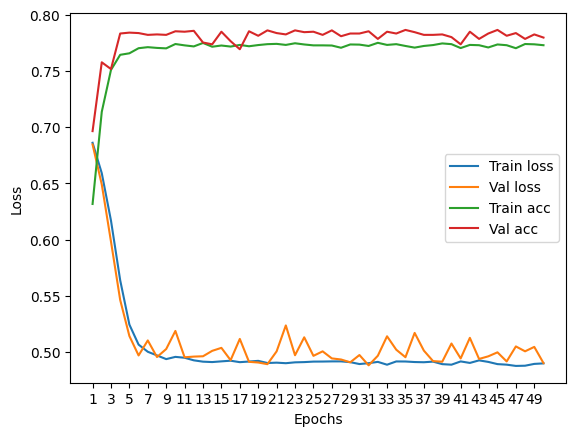

In [118]:
plot_loss(history)

Test accuracy:  76.55999999999999


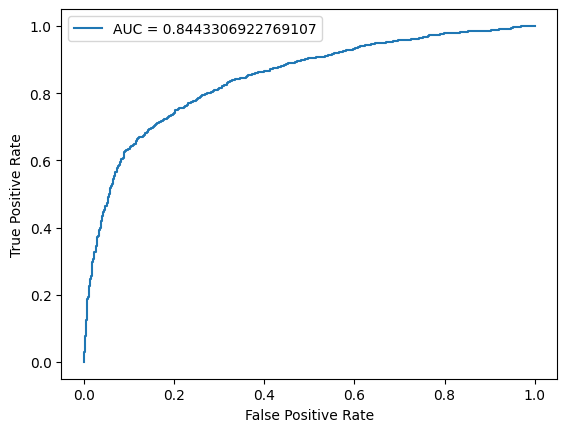

In [119]:
plot_auc(best_model, test_dataloader)

### 12500 jets

#### With 10 particles, charge, complete graph, edge_weights, (photon, CH, NH) count

In [108]:
input_dims = 9
hidden_dims = [9, 9]
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GNN(
  (layers): ModuleList(
    (0-1): 2 x GCNConv(9, 9)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=12, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=8, bias=True)
    (3): ReLU()
    (4): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [109]:
epochs = 40
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:03, 36.78it/s]


Train Epoch: 0 	Loss: 0.555826, Accuracy: 5415/7500 (72%)
Val Epoch: 0 	Loss: 0.497916, Accuracy: 1912/2500 (76%)



118it [00:02, 40.33it/s]


Train Epoch: 1 	Loss: 0.488436, Accuracy: 5779/7500 (77%)
Val Epoch: 1 	Loss: 0.497270, Accuracy: 1926/2500 (77%)



118it [00:02, 51.81it/s]


Train Epoch: 2 	Loss: 0.488584, Accuracy: 5788/7500 (77%)
Val Epoch: 2 	Loss: 0.487464, Accuracy: 1934/2500 (77%)



118it [00:02, 51.27it/s]


Train Epoch: 3 	Loss: 0.485599, Accuracy: 5784/7500 (77%)
Val Epoch: 3 	Loss: 0.510941, Accuracy: 1895/2500 (76%)



118it [00:02, 44.06it/s]


Train Epoch: 4 	Loss: 0.488502, Accuracy: 5766/7500 (77%)
Val Epoch: 4 	Loss: 0.502689, Accuracy: 1906/2500 (76%)



118it [00:02, 49.06it/s]


Train Epoch: 5 	Loss: 0.486104, Accuracy: 5802/7500 (77%)
Val Epoch: 5 	Loss: 0.488566, Accuracy: 1909/2500 (76%)



118it [00:01, 78.51it/s]


Train Epoch: 6 	Loss: 0.484846, Accuracy: 5787/7500 (77%)
Val Epoch: 6 	Loss: 0.507668, Accuracy: 1915/2500 (77%)



118it [00:01, 82.50it/s]


Train Epoch: 7 	Loss: 0.486948, Accuracy: 5786/7500 (77%)
Val Epoch: 7 	Loss: 0.496342, Accuracy: 1928/2500 (77%)



118it [00:01, 78.90it/s]


Train Epoch: 8 	Loss: 0.489360, Accuracy: 5793/7500 (77%)
Val Epoch: 8 	Loss: 0.499380, Accuracy: 1943/2500 (78%)



118it [00:01, 79.17it/s]


Train Epoch: 9 	Loss: 0.483617, Accuracy: 5782/7500 (77%)
Val Epoch: 9 	Loss: 0.505572, Accuracy: 1918/2500 (77%)



118it [00:01, 81.68it/s]


Train Epoch: 10 	Loss: 0.486195, Accuracy: 5806/7500 (77%)
Val Epoch: 10 	Loss: 0.485380, Accuracy: 1937/2500 (77%)



118it [00:02, 54.68it/s]


Train Epoch: 11 	Loss: 0.482514, Accuracy: 5799/7500 (77%)
Val Epoch: 11 	Loss: 0.505618, Accuracy: 1903/2500 (76%)



118it [00:01, 61.00it/s]


Train Epoch: 12 	Loss: 0.484329, Accuracy: 5814/7500 (78%)
Val Epoch: 12 	Loss: 0.492114, Accuracy: 1930/2500 (77%)



118it [00:01, 76.93it/s]


Train Epoch: 13 	Loss: 0.482823, Accuracy: 5800/7500 (77%)
Val Epoch: 13 	Loss: 0.491083, Accuracy: 1939/2500 (78%)



118it [00:01, 76.88it/s]


Train Epoch: 14 	Loss: 0.484418, Accuracy: 5778/7500 (77%)
Val Epoch: 14 	Loss: 0.504206, Accuracy: 1907/2500 (76%)



118it [00:02, 56.87it/s]


Train Epoch: 15 	Loss: 0.483147, Accuracy: 5788/7500 (77%)
Val Epoch: 15 	Loss: 0.487000, Accuracy: 1940/2500 (78%)



118it [00:01, 69.98it/s]


Train Epoch: 16 	Loss: 0.483765, Accuracy: 5802/7500 (77%)
Val Epoch: 16 	Loss: 0.497930, Accuracy: 1935/2500 (77%)



118it [00:01, 65.64it/s]


Train Epoch: 17 	Loss: 0.483942, Accuracy: 5816/7500 (78%)
Val Epoch: 17 	Loss: 0.489233, Accuracy: 1931/2500 (77%)



118it [00:01, 60.11it/s]


Train Epoch: 18 	Loss: 0.482807, Accuracy: 5826/7500 (78%)
Val Epoch: 18 	Loss: 0.489371, Accuracy: 1919/2500 (77%)



118it [00:02, 52.44it/s]


Train Epoch: 19 	Loss: 0.483620, Accuracy: 5812/7500 (77%)
Val Epoch: 19 	Loss: 0.530022, Accuracy: 1910/2500 (76%)



118it [00:02, 52.49it/s]


Train Epoch: 20 	Loss: 0.488522, Accuracy: 5792/7500 (77%)
Val Epoch: 20 	Loss: 0.510626, Accuracy: 1945/2500 (78%)



118it [00:01, 65.83it/s]


Train Epoch: 21 	Loss: 0.482010, Accuracy: 5783/7500 (77%)
Val Epoch: 21 	Loss: 0.487130, Accuracy: 1942/2500 (78%)



118it [00:01, 72.48it/s]


Train Epoch: 22 	Loss: 0.482241, Accuracy: 5799/7500 (77%)
Val Epoch: 22 	Loss: 0.498144, Accuracy: 1938/2500 (78%)



118it [00:01, 79.03it/s]


Train Epoch: 23 	Loss: 0.482910, Accuracy: 5811/7500 (77%)
Val Epoch: 23 	Loss: 0.483661, Accuracy: 1925/2500 (77%)



118it [00:01, 83.32it/s]


Train Epoch: 24 	Loss: 0.483662, Accuracy: 5784/7500 (77%)
Val Epoch: 24 	Loss: 0.505076, Accuracy: 1916/2500 (77%)



118it [00:01, 63.29it/s]


Train Epoch: 25 	Loss: 0.481410, Accuracy: 5807/7500 (77%)
Val Epoch: 25 	Loss: 0.492998, Accuracy: 1952/2500 (78%)



118it [00:01, 62.77it/s]


Train Epoch: 26 	Loss: 0.480076, Accuracy: 5799/7500 (77%)
Val Epoch: 26 	Loss: 0.496546, Accuracy: 1933/2500 (77%)



118it [00:01, 78.05it/s]


Train Epoch: 27 	Loss: 0.482635, Accuracy: 5807/7500 (77%)
Val Epoch: 27 	Loss: 0.487271, Accuracy: 1939/2500 (78%)



118it [00:01, 83.33it/s]


Train Epoch: 28 	Loss: 0.479583, Accuracy: 5824/7500 (78%)
Val Epoch: 28 	Loss: 0.501705, Accuracy: 1939/2500 (78%)



118it [00:01, 83.69it/s]


Train Epoch: 29 	Loss: 0.479801, Accuracy: 5808/7500 (77%)
Val Epoch: 29 	Loss: 0.504604, Accuracy: 1919/2500 (77%)



118it [00:01, 77.61it/s]


Train Epoch: 30 	Loss: 0.479030, Accuracy: 5801/7500 (77%)
Val Epoch: 30 	Loss: 0.480135, Accuracy: 1926/2500 (77%)



118it [00:01, 82.62it/s]


Train Epoch: 31 	Loss: 0.478211, Accuracy: 5803/7500 (77%)
Val Epoch: 31 	Loss: 0.503202, Accuracy: 1923/2500 (77%)



118it [00:01, 70.03it/s]


Train Epoch: 32 	Loss: 0.480154, Accuracy: 5835/7500 (78%)
Val Epoch: 32 	Loss: 0.511335, Accuracy: 1897/2500 (76%)



118it [00:01, 62.14it/s]


Train Epoch: 33 	Loss: 0.477732, Accuracy: 5818/7500 (78%)
Val Epoch: 33 	Loss: 0.492690, Accuracy: 1932/2500 (77%)



118it [00:01, 60.40it/s]


Train Epoch: 34 	Loss: 0.476694, Accuracy: 5833/7500 (78%)
Val Epoch: 34 	Loss: 0.491781, Accuracy: 1956/2500 (78%)



118it [00:01, 77.69it/s]


Train Epoch: 35 	Loss: 0.479038, Accuracy: 5808/7500 (77%)
Val Epoch: 35 	Loss: 0.501923, Accuracy: 1913/2500 (77%)



118it [00:01, 67.15it/s]


Train Epoch: 36 	Loss: 0.479944, Accuracy: 5838/7500 (78%)
Val Epoch: 36 	Loss: 0.497349, Accuracy: 1934/2500 (77%)



118it [00:01, 72.45it/s]


Train Epoch: 37 	Loss: 0.478748, Accuracy: 5847/7500 (78%)
Val Epoch: 37 	Loss: 0.487180, Accuracy: 1948/2500 (78%)



118it [00:01, 82.74it/s]


Train Epoch: 38 	Loss: 0.474133, Accuracy: 5845/7500 (78%)
Val Epoch: 38 	Loss: 0.478425, Accuracy: 1939/2500 (78%)



118it [00:01, 80.58it/s]


Train Epoch: 39 	Loss: 0.475480, Accuracy: 5850/7500 (78%)
Val Epoch: 39 	Loss: 0.490963, Accuracy: 1951/2500 (78%)



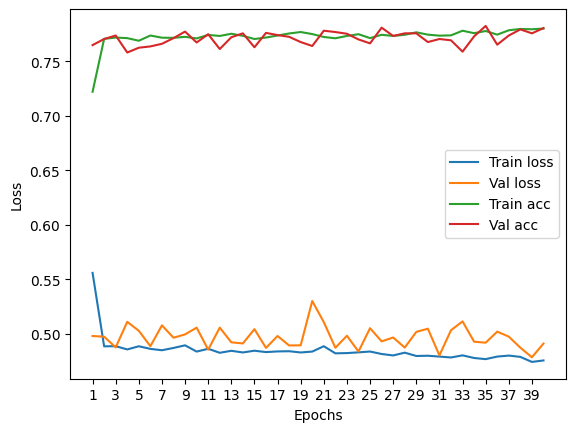

In [110]:
plot_loss(history)

Test accuracy:  78.4


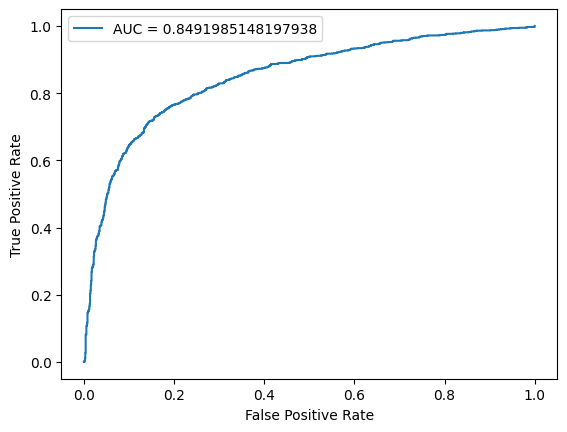

In [111]:
plot_auc(best_model, test_dataloader)

#### GAT - With 10 particles, edge_weights, (total particles, photon, charged hadron, neutral hadron, net positive charge of jet) count

In [111]:
input_dims = 8
hidden_dims = [8,8]
model = GAT(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv(8, 8, heads=1)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=15, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [112]:
epochs = 50
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

0it [00:00, ?it/s]


RuntimeError: mat1 and mat2 must have the same dtype, but got Double and Float

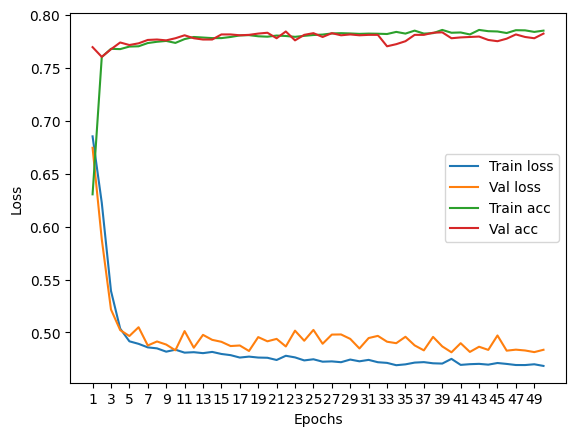

In [46]:
plot_loss(history)

Test accuracy:  76.88000000000001


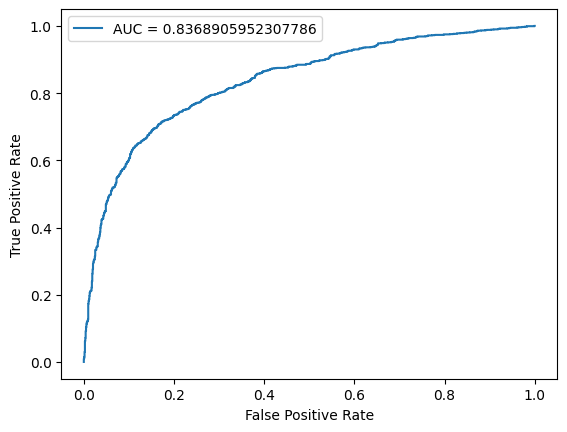

In [47]:
plot_auc(best_model, test_dataloader)

#### GAT - With 5 particles, edge_weights, (total particles, photon, charged hadron, neutral hadron, charge of jet with k = 0.2, 0.5, 0.7) count

In [116]:
input_dims = 8
hidden_dims = [8,8]
model = GAT(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv(8, 8, heads=1)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=15, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [117]:
epochs = 50
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:01, 64.49it/s]


Train Epoch: 0 	Loss: 0.686021, Accuracy: 4737/7500 (63%)
Val Epoch: 0 	Loss: 0.684530, Accuracy: 1741/2500 (70%)



118it [00:01, 60.21it/s]


Train Epoch: 1 	Loss: 0.658967, Accuracy: 5352/7500 (71%)
Val Epoch: 1 	Loss: 0.648924, Accuracy: 1894/2500 (76%)



118it [00:01, 60.47it/s]


Train Epoch: 2 	Loss: 0.616825, Accuracy: 5631/7500 (75%)
Val Epoch: 2 	Loss: 0.598189, Accuracy: 1879/2500 (75%)



118it [00:01, 59.27it/s]


Train Epoch: 3 	Loss: 0.563784, Accuracy: 5732/7500 (76%)
Val Epoch: 3 	Loss: 0.546261, Accuracy: 1958/2500 (78%)



118it [00:02, 52.24it/s]


Train Epoch: 4 	Loss: 0.524339, Accuracy: 5742/7500 (77%)
Val Epoch: 4 	Loss: 0.514191, Accuracy: 1960/2500 (78%)



118it [00:01, 76.52it/s]


Train Epoch: 5 	Loss: 0.506530, Accuracy: 5776/7500 (77%)
Val Epoch: 5 	Loss: 0.496887, Accuracy: 1959/2500 (78%)



118it [00:01, 72.13it/s]


Train Epoch: 6 	Loss: 0.500158, Accuracy: 5783/7500 (77%)
Val Epoch: 6 	Loss: 0.510235, Accuracy: 1955/2500 (78%)



118it [00:01, 81.37it/s]


Train Epoch: 7 	Loss: 0.496915, Accuracy: 5778/7500 (77%)
Val Epoch: 7 	Loss: 0.495451, Accuracy: 1956/2500 (78%)



118it [00:01, 71.23it/s]


Train Epoch: 8 	Loss: 0.493624, Accuracy: 5775/7500 (77%)
Val Epoch: 8 	Loss: 0.502586, Accuracy: 1955/2500 (78%)



118it [00:01, 74.56it/s]


Train Epoch: 9 	Loss: 0.495615, Accuracy: 5804/7500 (77%)
Val Epoch: 9 	Loss: 0.518696, Accuracy: 1963/2500 (79%)



118it [00:01, 84.34it/s]


Train Epoch: 10 	Loss: 0.494836, Accuracy: 5795/7500 (77%)
Val Epoch: 10 	Loss: 0.495251, Accuracy: 1962/2500 (78%)



118it [00:01, 86.50it/s]


Train Epoch: 11 	Loss: 0.492540, Accuracy: 5788/7500 (77%)
Val Epoch: 11 	Loss: 0.495857, Accuracy: 1964/2500 (79%)



118it [00:01, 84.62it/s]


Train Epoch: 12 	Loss: 0.491353, Accuracy: 5811/7500 (77%)
Val Epoch: 12 	Loss: 0.496157, Accuracy: 1938/2500 (78%)



118it [00:01, 74.29it/s]


Train Epoch: 13 	Loss: 0.490998, Accuracy: 5786/7500 (77%)
Val Epoch: 13 	Loss: 0.500981, Accuracy: 1934/2500 (77%)



118it [00:02, 57.87it/s]


Train Epoch: 14 	Loss: 0.491629, Accuracy: 5794/7500 (77%)
Val Epoch: 14 	Loss: 0.503641, Accuracy: 1962/2500 (78%)



118it [00:01, 65.58it/s]


Train Epoch: 15 	Loss: 0.492204, Accuracy: 5787/7500 (77%)
Val Epoch: 15 	Loss: 0.492672, Accuracy: 1941/2500 (78%)



118it [00:01, 72.59it/s]


Train Epoch: 16 	Loss: 0.490911, Accuracy: 5798/7500 (77%)
Val Epoch: 16 	Loss: 0.511580, Accuracy: 1923/2500 (77%)



118it [00:01, 68.33it/s]


Train Epoch: 17 	Loss: 0.491473, Accuracy: 5789/7500 (77%)
Val Epoch: 17 	Loss: 0.491214, Accuracy: 1963/2500 (79%)



118it [00:01, 67.71it/s]


Train Epoch: 18 	Loss: 0.492077, Accuracy: 5797/7500 (77%)
Val Epoch: 18 	Loss: 0.490608, Accuracy: 1953/2500 (78%)



118it [00:01, 68.15it/s]


Train Epoch: 19 	Loss: 0.490158, Accuracy: 5803/7500 (77%)
Val Epoch: 19 	Loss: 0.489131, Accuracy: 1965/2500 (79%)



118it [00:01, 77.31it/s]


Train Epoch: 20 	Loss: 0.490469, Accuracy: 5805/7500 (77%)
Val Epoch: 20 	Loss: 0.500512, Accuracy: 1959/2500 (78%)



118it [00:01, 63.80it/s]


Train Epoch: 21 	Loss: 0.489991, Accuracy: 5798/7500 (77%)
Val Epoch: 21 	Loss: 0.523574, Accuracy: 1956/2500 (78%)



118it [00:02, 54.06it/s]


Train Epoch: 22 	Loss: 0.490759, Accuracy: 5809/7500 (77%)
Val Epoch: 22 	Loss: 0.497075, Accuracy: 1965/2500 (79%)



118it [00:01, 70.47it/s]


Train Epoch: 23 	Loss: 0.490968, Accuracy: 5801/7500 (77%)
Val Epoch: 23 	Loss: 0.513020, Accuracy: 1961/2500 (78%)



118it [00:01, 70.52it/s]


Train Epoch: 24 	Loss: 0.491407, Accuracy: 5795/7500 (77%)
Val Epoch: 24 	Loss: 0.496537, Accuracy: 1962/2500 (78%)



118it [00:01, 71.71it/s]


Train Epoch: 25 	Loss: 0.491457, Accuracy: 5795/7500 (77%)
Val Epoch: 25 	Loss: 0.500533, Accuracy: 1955/2500 (78%)



118it [00:02, 56.03it/s]


Train Epoch: 26 	Loss: 0.491600, Accuracy: 5794/7500 (77%)
Val Epoch: 26 	Loss: 0.494258, Accuracy: 1965/2500 (79%)



118it [00:01, 83.27it/s]


Train Epoch: 27 	Loss: 0.491609, Accuracy: 5779/7500 (77%)
Val Epoch: 27 	Loss: 0.493297, Accuracy: 1952/2500 (78%)



118it [00:01, 68.26it/s]


Train Epoch: 28 	Loss: 0.490929, Accuracy: 5801/7500 (77%)
Val Epoch: 28 	Loss: 0.490775, Accuracy: 1958/2500 (78%)



118it [00:01, 67.66it/s]


Train Epoch: 29 	Loss: 0.489238, Accuracy: 5800/7500 (77%)
Val Epoch: 29 	Loss: 0.497249, Accuracy: 1958/2500 (78%)



118it [00:02, 56.32it/s]


Train Epoch: 30 	Loss: 0.490004, Accuracy: 5791/7500 (77%)
Val Epoch: 30 	Loss: 0.488094, Accuracy: 1963/2500 (79%)



118it [00:01, 66.95it/s]


Train Epoch: 31 	Loss: 0.491168, Accuracy: 5812/7500 (77%)
Val Epoch: 31 	Loss: 0.496628, Accuracy: 1946/2500 (78%)



118it [00:01, 73.96it/s]


Train Epoch: 32 	Loss: 0.488646, Accuracy: 5798/7500 (77%)
Val Epoch: 32 	Loss: 0.513928, Accuracy: 1962/2500 (78%)



118it [00:01, 70.38it/s]


Train Epoch: 33 	Loss: 0.491555, Accuracy: 5803/7500 (77%)
Val Epoch: 33 	Loss: 0.501996, Accuracy: 1958/2500 (78%)



118it [00:01, 72.69it/s]


Train Epoch: 34 	Loss: 0.491496, Accuracy: 5791/7500 (77%)
Val Epoch: 34 	Loss: 0.495320, Accuracy: 1966/2500 (79%)



118it [00:01, 75.38it/s]


Train Epoch: 35 	Loss: 0.491025, Accuracy: 5780/7500 (77%)
Val Epoch: 35 	Loss: 0.516928, Accuracy: 1961/2500 (78%)



118it [00:02, 52.46it/s]


Train Epoch: 36 	Loss: 0.490847, Accuracy: 5791/7500 (77%)
Val Epoch: 36 	Loss: 0.501201, Accuracy: 1955/2500 (78%)



118it [00:01, 71.79it/s]


Train Epoch: 37 	Loss: 0.491389, Accuracy: 5797/7500 (77%)
Val Epoch: 37 	Loss: 0.491841, Accuracy: 1955/2500 (78%)



118it [00:01, 73.48it/s]


Train Epoch: 38 	Loss: 0.489153, Accuracy: 5808/7500 (77%)
Val Epoch: 38 	Loss: 0.491316, Accuracy: 1956/2500 (78%)



118it [00:01, 71.27it/s]


Train Epoch: 39 	Loss: 0.488669, Accuracy: 5803/7500 (77%)
Val Epoch: 39 	Loss: 0.507509, Accuracy: 1950/2500 (78%)



118it [00:01, 66.47it/s]


Train Epoch: 40 	Loss: 0.491565, Accuracy: 5777/7500 (77%)
Val Epoch: 40 	Loss: 0.494215, Accuracy: 1934/2500 (77%)



118it [00:01, 72.42it/s]


Train Epoch: 41 	Loss: 0.490229, Accuracy: 5798/7500 (77%)
Val Epoch: 41 	Loss: 0.512541, Accuracy: 1962/2500 (78%)



118it [00:01, 85.80it/s]


Train Epoch: 42 	Loss: 0.492499, Accuracy: 5796/7500 (77%)
Val Epoch: 42 	Loss: 0.493773, Accuracy: 1946/2500 (78%)



118it [00:01, 73.60it/s]


Train Epoch: 43 	Loss: 0.491144, Accuracy: 5781/7500 (77%)
Val Epoch: 43 	Loss: 0.496098, Accuracy: 1958/2500 (78%)



118it [00:01, 75.66it/s]


Train Epoch: 44 	Loss: 0.489180, Accuracy: 5801/7500 (77%)
Val Epoch: 44 	Loss: 0.499658, Accuracy: 1966/2500 (79%)



118it [00:01, 85.96it/s]


Train Epoch: 45 	Loss: 0.488689, Accuracy: 5796/7500 (77%)
Val Epoch: 45 	Loss: 0.491563, Accuracy: 1953/2500 (78%)



118it [00:01, 82.51it/s]


Train Epoch: 46 	Loss: 0.487570, Accuracy: 5776/7500 (77%)
Val Epoch: 46 	Loss: 0.504904, Accuracy: 1959/2500 (78%)



118it [00:01, 84.77it/s]


Train Epoch: 47 	Loss: 0.487756, Accuracy: 5804/7500 (77%)
Val Epoch: 47 	Loss: 0.500567, Accuracy: 1946/2500 (78%)



118it [00:01, 84.26it/s]


Train Epoch: 48 	Loss: 0.489368, Accuracy: 5802/7500 (77%)
Val Epoch: 48 	Loss: 0.504492, Accuracy: 1956/2500 (78%)



118it [00:01, 84.24it/s]


Train Epoch: 49 	Loss: 0.489822, Accuracy: 5796/7500 (77%)
Val Epoch: 49 	Loss: 0.490107, Accuracy: 1949/2500 (78%)



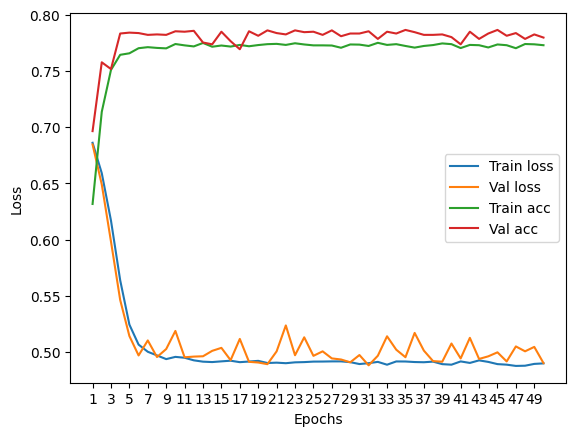

In [118]:
plot_loss(history)

Test accuracy:  76.55999999999999


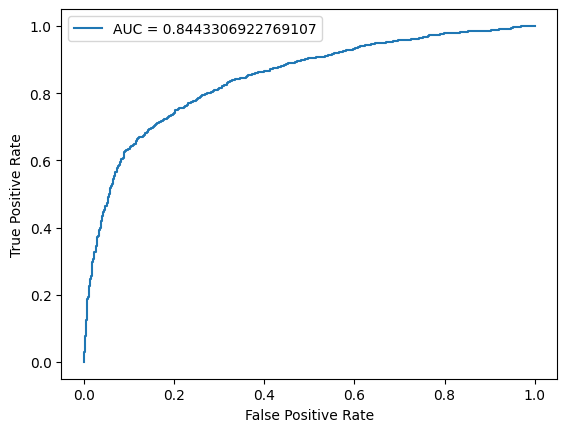

In [119]:
plot_auc(best_model, test_dataloader)

#### GAT - With 3 particles, edge_weights, (total particles, photon, charged hadron, neutral hadron, net positive charge of jet) count

In [100]:
input_dims = 8
hidden_dims = [8,8]
model = GAT(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv(8, 8, heads=1)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=13, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=8, bias=True)
    (3): ReLU()
    (4): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [101]:
epochs = 50
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:02, 56.34it/s]


Train Epoch: 0 	Loss: 0.679224, Accuracy: 4981/7500 (66%)
Val Epoch: 0 	Loss: 0.661855, Accuracy: 1847/2500 (74%)



118it [00:02, 42.49it/s]


Train Epoch: 1 	Loss: 0.590658, Accuracy: 5735/7500 (76%)
Val Epoch: 1 	Loss: 0.548389, Accuracy: 1909/2500 (76%)



118it [00:02, 40.28it/s]


Train Epoch: 2 	Loss: 0.514190, Accuracy: 5773/7500 (77%)
Val Epoch: 2 	Loss: 0.515656, Accuracy: 1905/2500 (76%)



118it [00:02, 49.37it/s]


Train Epoch: 3 	Loss: 0.496978, Accuracy: 5773/7500 (77%)
Val Epoch: 3 	Loss: 0.512654, Accuracy: 1911/2500 (76%)



118it [00:02, 43.42it/s]


Train Epoch: 4 	Loss: 0.493885, Accuracy: 5785/7500 (77%)
Val Epoch: 4 	Loss: 0.517532, Accuracy: 1908/2500 (76%)



118it [00:02, 46.78it/s]


Train Epoch: 5 	Loss: 0.493907, Accuracy: 5804/7500 (77%)
Val Epoch: 5 	Loss: 0.513201, Accuracy: 1913/2500 (77%)



118it [00:02, 47.88it/s]


Train Epoch: 6 	Loss: 0.488610, Accuracy: 5809/7500 (77%)
Val Epoch: 6 	Loss: 0.505969, Accuracy: 1913/2500 (77%)



118it [00:02, 46.43it/s]


Train Epoch: 7 	Loss: 0.489598, Accuracy: 5800/7500 (77%)
Val Epoch: 7 	Loss: 0.507472, Accuracy: 1918/2500 (77%)



118it [00:02, 47.08it/s]


Train Epoch: 8 	Loss: 0.491638, Accuracy: 5802/7500 (77%)
Val Epoch: 8 	Loss: 0.503521, Accuracy: 1918/2500 (77%)



118it [00:02, 48.05it/s]


Train Epoch: 9 	Loss: 0.487710, Accuracy: 5800/7500 (77%)
Val Epoch: 9 	Loss: 0.502871, Accuracy: 1915/2500 (77%)



118it [00:02, 44.40it/s]


Train Epoch: 10 	Loss: 0.487363, Accuracy: 5804/7500 (77%)
Val Epoch: 10 	Loss: 0.497687, Accuracy: 1924/2500 (77%)



118it [00:02, 48.20it/s]


Train Epoch: 11 	Loss: 0.486249, Accuracy: 5808/7500 (77%)
Val Epoch: 11 	Loss: 0.510538, Accuracy: 1911/2500 (76%)



118it [00:02, 46.63it/s]


Train Epoch: 12 	Loss: 0.486494, Accuracy: 5823/7500 (78%)
Val Epoch: 12 	Loss: 0.509723, Accuracy: 1919/2500 (77%)



118it [00:02, 46.52it/s]


Train Epoch: 13 	Loss: 0.485860, Accuracy: 5798/7500 (77%)
Val Epoch: 13 	Loss: 0.505694, Accuracy: 1913/2500 (77%)



118it [00:02, 45.97it/s]


Train Epoch: 14 	Loss: 0.487298, Accuracy: 5825/7500 (78%)
Val Epoch: 14 	Loss: 0.504729, Accuracy: 1915/2500 (77%)



118it [00:02, 40.95it/s]


Train Epoch: 15 	Loss: 0.487353, Accuracy: 5808/7500 (77%)
Val Epoch: 15 	Loss: 0.504469, Accuracy: 1909/2500 (76%)



118it [00:02, 41.80it/s]


Train Epoch: 16 	Loss: 0.485933, Accuracy: 5799/7500 (77%)
Val Epoch: 16 	Loss: 0.496940, Accuracy: 1916/2500 (77%)



118it [00:02, 40.60it/s]


Train Epoch: 17 	Loss: 0.487280, Accuracy: 5813/7500 (78%)
Val Epoch: 17 	Loss: 0.502543, Accuracy: 1924/2500 (77%)



118it [00:02, 42.61it/s]


Train Epoch: 18 	Loss: 0.487826, Accuracy: 5803/7500 (77%)
Val Epoch: 18 	Loss: 0.503252, Accuracy: 1912/2500 (76%)



118it [00:02, 42.74it/s]


Train Epoch: 19 	Loss: 0.485548, Accuracy: 5806/7500 (77%)
Val Epoch: 19 	Loss: 0.502494, Accuracy: 1918/2500 (77%)



118it [00:02, 39.87it/s]


Train Epoch: 20 	Loss: 0.485457, Accuracy: 5796/7500 (77%)
Val Epoch: 20 	Loss: 0.496603, Accuracy: 1915/2500 (77%)



118it [00:02, 40.03it/s]


Train Epoch: 21 	Loss: 0.486554, Accuracy: 5810/7500 (77%)
Val Epoch: 21 	Loss: 0.505461, Accuracy: 1912/2500 (76%)



118it [00:02, 43.30it/s]


Train Epoch: 22 	Loss: 0.487286, Accuracy: 5807/7500 (77%)
Val Epoch: 22 	Loss: 0.520765, Accuracy: 1914/2500 (77%)



118it [00:02, 53.34it/s]


Train Epoch: 23 	Loss: 0.484216, Accuracy: 5797/7500 (77%)
Val Epoch: 23 	Loss: 0.507713, Accuracy: 1922/2500 (77%)



118it [00:02, 53.81it/s]


Train Epoch: 24 	Loss: 0.485404, Accuracy: 5809/7500 (77%)
Val Epoch: 24 	Loss: 0.506315, Accuracy: 1917/2500 (77%)



118it [00:02, 48.90it/s]


Train Epoch: 25 	Loss: 0.486350, Accuracy: 5813/7500 (78%)
Val Epoch: 25 	Loss: 0.495411, Accuracy: 1917/2500 (77%)



118it [00:02, 47.69it/s]


Train Epoch: 26 	Loss: 0.484343, Accuracy: 5814/7500 (78%)
Val Epoch: 26 	Loss: 0.506845, Accuracy: 1909/2500 (76%)



118it [00:02, 41.58it/s]


Train Epoch: 27 	Loss: 0.485731, Accuracy: 5808/7500 (77%)
Val Epoch: 27 	Loss: 0.520948, Accuracy: 1923/2500 (77%)



118it [00:02, 42.42it/s]


Train Epoch: 28 	Loss: 0.483592, Accuracy: 5804/7500 (77%)
Val Epoch: 28 	Loss: 0.497840, Accuracy: 1919/2500 (77%)



118it [00:02, 43.82it/s]


Train Epoch: 29 	Loss: 0.482675, Accuracy: 5816/7500 (78%)
Val Epoch: 29 	Loss: 0.495366, Accuracy: 1920/2500 (77%)



118it [00:02, 40.53it/s]


Train Epoch: 30 	Loss: 0.482501, Accuracy: 5817/7500 (78%)
Val Epoch: 30 	Loss: 0.499579, Accuracy: 1918/2500 (77%)



118it [00:02, 42.63it/s]


Train Epoch: 31 	Loss: 0.484835, Accuracy: 5823/7500 (78%)
Val Epoch: 31 	Loss: 0.509477, Accuracy: 1906/2500 (76%)



118it [00:02, 42.16it/s]


Train Epoch: 32 	Loss: 0.483728, Accuracy: 5804/7500 (77%)
Val Epoch: 32 	Loss: 0.502098, Accuracy: 1910/2500 (76%)



118it [00:02, 44.14it/s]


Train Epoch: 33 	Loss: 0.483241, Accuracy: 5819/7500 (78%)
Val Epoch: 33 	Loss: 0.506517, Accuracy: 1923/2500 (77%)



118it [00:03, 36.34it/s]


Train Epoch: 34 	Loss: 0.483518, Accuracy: 5825/7500 (78%)
Val Epoch: 34 	Loss: 0.507315, Accuracy: 1923/2500 (77%)



118it [00:03, 36.24it/s]


Train Epoch: 35 	Loss: 0.484081, Accuracy: 5823/7500 (78%)
Val Epoch: 35 	Loss: 0.495028, Accuracy: 1915/2500 (77%)



118it [00:03, 38.01it/s]


Train Epoch: 36 	Loss: 0.483063, Accuracy: 5809/7500 (77%)
Val Epoch: 36 	Loss: 0.497442, Accuracy: 1920/2500 (77%)



118it [00:03, 38.06it/s]


Train Epoch: 37 	Loss: 0.483488, Accuracy: 5822/7500 (78%)
Val Epoch: 37 	Loss: 0.504834, Accuracy: 1911/2500 (76%)



118it [00:02, 43.07it/s]


Train Epoch: 38 	Loss: 0.481824, Accuracy: 5825/7500 (78%)
Val Epoch: 38 	Loss: 0.497843, Accuracy: 1919/2500 (77%)



118it [00:02, 49.89it/s]


Train Epoch: 39 	Loss: 0.483534, Accuracy: 5834/7500 (78%)
Val Epoch: 39 	Loss: 0.500782, Accuracy: 1914/2500 (77%)



118it [00:02, 43.42it/s]


Train Epoch: 40 	Loss: 0.482789, Accuracy: 5811/7500 (77%)
Val Epoch: 40 	Loss: 0.511113, Accuracy: 1918/2500 (77%)



118it [00:02, 44.13it/s]


Train Epoch: 41 	Loss: 0.481134, Accuracy: 5828/7500 (78%)
Val Epoch: 41 	Loss: 0.498796, Accuracy: 1918/2500 (77%)



118it [00:02, 43.69it/s]


Train Epoch: 42 	Loss: 0.482381, Accuracy: 5827/7500 (78%)
Val Epoch: 42 	Loss: 0.499624, Accuracy: 1911/2500 (76%)



118it [00:02, 44.36it/s]


Train Epoch: 43 	Loss: 0.482835, Accuracy: 5820/7500 (78%)
Val Epoch: 43 	Loss: 0.497498, Accuracy: 1919/2500 (77%)



118it [00:02, 48.49it/s]


Train Epoch: 44 	Loss: 0.482784, Accuracy: 5830/7500 (78%)
Val Epoch: 44 	Loss: 0.519504, Accuracy: 1917/2500 (77%)



118it [00:02, 44.34it/s]


Train Epoch: 45 	Loss: 0.484919, Accuracy: 5820/7500 (78%)
Val Epoch: 45 	Loss: 0.511558, Accuracy: 1918/2500 (77%)



118it [00:02, 43.88it/s]


Train Epoch: 46 	Loss: 0.482472, Accuracy: 5817/7500 (78%)
Val Epoch: 46 	Loss: 0.498900, Accuracy: 1914/2500 (77%)



118it [00:02, 43.85it/s]


Train Epoch: 47 	Loss: 0.481679, Accuracy: 5849/7500 (78%)
Val Epoch: 47 	Loss: 0.497862, Accuracy: 1919/2500 (77%)



118it [00:02, 44.19it/s]


Train Epoch: 48 	Loss: 0.482015, Accuracy: 5829/7500 (78%)
Val Epoch: 48 	Loss: 0.500814, Accuracy: 1918/2500 (77%)



118it [00:02, 50.59it/s]


Train Epoch: 49 	Loss: 0.480615, Accuracy: 5837/7500 (78%)
Val Epoch: 49 	Loss: 0.506221, Accuracy: 1918/2500 (77%)



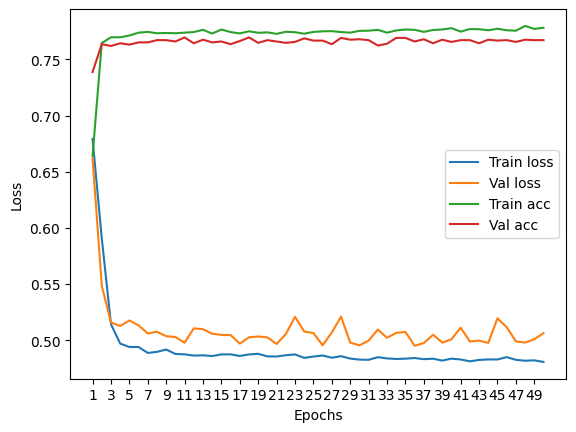

In [102]:
plot_loss(history)

Test accuracy:  79.47999999999999


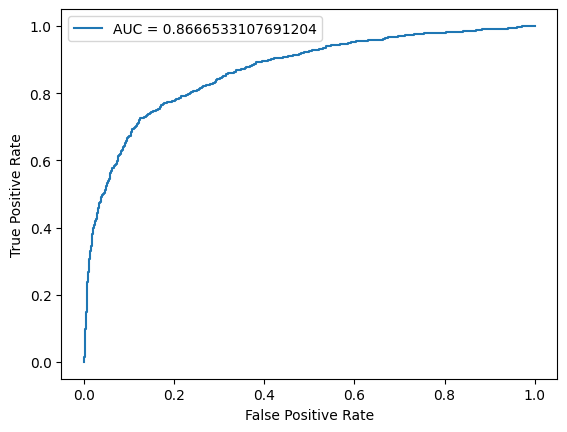

In [103]:
plot_auc(best_model, test_dataloader)

#### GAT - With 3 particles, edge_weights, (total particles, photon, charged hadron, neutral hadron, net positive charge of jet) count

In [64]:
input_dims = 8
hidden_dims = [8,8]
model = GAT(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv(8, 8, heads=1)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=13, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [65]:
epochs = 50
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:03, 36.50it/s]


Train Epoch: 0 	Loss: 0.699354, Accuracy: 3740/7500 (50%)
Val Epoch: 0 	Loss: 0.701798, Accuracy: 1239/2500 (50%)



118it [00:03, 39.10it/s]


Train Epoch: 1 	Loss: 0.670694, Accuracy: 4430/7500 (59%)
Val Epoch: 1 	Loss: 0.652759, Accuracy: 1829/2500 (73%)



118it [00:03, 36.37it/s]


Train Epoch: 2 	Loss: 0.607265, Accuracy: 5622/7500 (75%)
Val Epoch: 2 	Loss: 0.575294, Accuracy: 1882/2500 (75%)



118it [00:03, 36.61it/s]


Train Epoch: 3 	Loss: 0.545586, Accuracy: 5702/7500 (76%)
Val Epoch: 3 	Loss: 0.519337, Accuracy: 1917/2500 (77%)



118it [00:03, 35.54it/s]


Train Epoch: 4 	Loss: 0.516325, Accuracy: 5741/7500 (77%)
Val Epoch: 4 	Loss: 0.507093, Accuracy: 1939/2500 (78%)



118it [00:03, 36.49it/s]


Train Epoch: 5 	Loss: 0.509497, Accuracy: 5741/7500 (77%)
Val Epoch: 5 	Loss: 0.497451, Accuracy: 1926/2500 (77%)



118it [00:03, 34.85it/s]


Train Epoch: 6 	Loss: 0.506086, Accuracy: 5748/7500 (77%)
Val Epoch: 6 	Loss: 0.494883, Accuracy: 1933/2500 (77%)



118it [00:03, 36.15it/s]


Train Epoch: 7 	Loss: 0.503816, Accuracy: 5752/7500 (77%)
Val Epoch: 7 	Loss: 0.489023, Accuracy: 1933/2500 (77%)



118it [00:03, 36.04it/s]


Train Epoch: 8 	Loss: 0.503827, Accuracy: 5749/7500 (77%)
Val Epoch: 8 	Loss: 0.486952, Accuracy: 1931/2500 (77%)



118it [00:03, 36.35it/s]


Train Epoch: 9 	Loss: 0.501117, Accuracy: 5769/7500 (77%)
Val Epoch: 9 	Loss: 0.497595, Accuracy: 1944/2500 (78%)



118it [00:03, 35.40it/s]


Train Epoch: 10 	Loss: 0.501098, Accuracy: 5763/7500 (77%)
Val Epoch: 10 	Loss: 0.501252, Accuracy: 1945/2500 (78%)



118it [00:03, 35.55it/s]


Train Epoch: 11 	Loss: 0.499949, Accuracy: 5787/7500 (77%)
Val Epoch: 11 	Loss: 0.500875, Accuracy: 1939/2500 (78%)



118it [00:03, 34.89it/s]


Train Epoch: 12 	Loss: 0.501005, Accuracy: 5757/7500 (77%)
Val Epoch: 12 	Loss: 0.492302, Accuracy: 1943/2500 (78%)



118it [00:03, 38.05it/s]


Train Epoch: 13 	Loss: 0.498879, Accuracy: 5766/7500 (77%)
Val Epoch: 13 	Loss: 0.488999, Accuracy: 1951/2500 (78%)



118it [00:03, 34.89it/s]


Train Epoch: 14 	Loss: 0.499012, Accuracy: 5762/7500 (77%)
Val Epoch: 14 	Loss: 0.489519, Accuracy: 1952/2500 (78%)



118it [00:03, 35.56it/s]


Train Epoch: 15 	Loss: 0.496413, Accuracy: 5791/7500 (77%)
Val Epoch: 15 	Loss: 0.485582, Accuracy: 1951/2500 (78%)



118it [00:03, 36.33it/s]


Train Epoch: 16 	Loss: 0.497348, Accuracy: 5771/7500 (77%)
Val Epoch: 16 	Loss: 0.497765, Accuracy: 1943/2500 (78%)



118it [00:03, 36.06it/s]


Train Epoch: 17 	Loss: 0.496291, Accuracy: 5781/7500 (77%)
Val Epoch: 17 	Loss: 0.481195, Accuracy: 1954/2500 (78%)



118it [00:03, 35.62it/s]


Train Epoch: 18 	Loss: 0.496443, Accuracy: 5781/7500 (77%)
Val Epoch: 18 	Loss: 0.499333, Accuracy: 1944/2500 (78%)



118it [00:03, 34.06it/s]


Train Epoch: 19 	Loss: 0.497591, Accuracy: 5782/7500 (77%)
Val Epoch: 19 	Loss: 0.482335, Accuracy: 1956/2500 (78%)



118it [00:03, 33.19it/s]


Train Epoch: 20 	Loss: 0.494449, Accuracy: 5791/7500 (77%)
Val Epoch: 20 	Loss: 0.500872, Accuracy: 1959/2500 (78%)



118it [00:03, 31.70it/s]


Train Epoch: 21 	Loss: 0.496343, Accuracy: 5767/7500 (77%)
Val Epoch: 21 	Loss: 0.481721, Accuracy: 1955/2500 (78%)



118it [00:03, 34.66it/s]


Train Epoch: 22 	Loss: 0.495090, Accuracy: 5773/7500 (77%)
Val Epoch: 22 	Loss: 0.494303, Accuracy: 1954/2500 (78%)



118it [00:03, 35.14it/s]


Train Epoch: 23 	Loss: 0.495072, Accuracy: 5764/7500 (77%)
Val Epoch: 23 	Loss: 0.482626, Accuracy: 1960/2500 (78%)



118it [00:03, 37.52it/s]


Train Epoch: 24 	Loss: 0.495594, Accuracy: 5782/7500 (77%)
Val Epoch: 24 	Loss: 0.484181, Accuracy: 1962/2500 (78%)



118it [00:03, 34.64it/s]


Train Epoch: 25 	Loss: 0.493523, Accuracy: 5798/7500 (77%)
Val Epoch: 25 	Loss: 0.488866, Accuracy: 1952/2500 (78%)



118it [00:03, 32.87it/s]


Train Epoch: 26 	Loss: 0.493921, Accuracy: 5784/7500 (77%)
Val Epoch: 26 	Loss: 0.481496, Accuracy: 1954/2500 (78%)



118it [00:03, 30.65it/s]


Train Epoch: 27 	Loss: 0.494173, Accuracy: 5796/7500 (77%)
Val Epoch: 27 	Loss: 0.482656, Accuracy: 1956/2500 (78%)



118it [00:04, 28.72it/s]


Train Epoch: 28 	Loss: 0.494241, Accuracy: 5780/7500 (77%)
Val Epoch: 28 	Loss: 0.481878, Accuracy: 1948/2500 (78%)



118it [00:03, 37.61it/s]


Train Epoch: 29 	Loss: 0.492355, Accuracy: 5783/7500 (77%)
Val Epoch: 29 	Loss: 0.490858, Accuracy: 1955/2500 (78%)



118it [00:03, 34.12it/s]


Train Epoch: 30 	Loss: 0.493718, Accuracy: 5775/7500 (77%)
Val Epoch: 30 	Loss: 0.482533, Accuracy: 1962/2500 (78%)



118it [00:03, 36.32it/s]


Train Epoch: 31 	Loss: 0.489974, Accuracy: 5793/7500 (77%)
Val Epoch: 31 	Loss: 0.487204, Accuracy: 1957/2500 (78%)



118it [00:03, 36.19it/s]


Train Epoch: 32 	Loss: 0.491995, Accuracy: 5778/7500 (77%)
Val Epoch: 32 	Loss: 0.488752, Accuracy: 1957/2500 (78%)



118it [00:03, 34.44it/s]


Train Epoch: 33 	Loss: 0.492863, Accuracy: 5782/7500 (77%)
Val Epoch: 33 	Loss: 0.484523, Accuracy: 1955/2500 (78%)



118it [00:03, 34.64it/s]


Train Epoch: 34 	Loss: 0.490497, Accuracy: 5790/7500 (77%)
Val Epoch: 34 	Loss: 0.493404, Accuracy: 1956/2500 (78%)



118it [00:03, 37.47it/s]


Train Epoch: 35 	Loss: 0.493160, Accuracy: 5782/7500 (77%)
Val Epoch: 35 	Loss: 0.478923, Accuracy: 1953/2500 (78%)



118it [00:03, 34.94it/s]


Train Epoch: 36 	Loss: 0.492305, Accuracy: 5792/7500 (77%)
Val Epoch: 36 	Loss: 0.482304, Accuracy: 1959/2500 (78%)



118it [00:03, 34.27it/s]


Train Epoch: 37 	Loss: 0.491511, Accuracy: 5786/7500 (77%)
Val Epoch: 37 	Loss: 0.479187, Accuracy: 1962/2500 (78%)



118it [00:03, 34.63it/s]


Train Epoch: 38 	Loss: 0.492198, Accuracy: 5786/7500 (77%)
Val Epoch: 38 	Loss: 0.490178, Accuracy: 1959/2500 (78%)



118it [00:03, 36.14it/s]


Train Epoch: 39 	Loss: 0.489874, Accuracy: 5790/7500 (77%)
Val Epoch: 39 	Loss: 0.480702, Accuracy: 1960/2500 (78%)



118it [00:03, 35.09it/s]


Train Epoch: 40 	Loss: 0.489885, Accuracy: 5801/7500 (77%)
Val Epoch: 40 	Loss: 0.480007, Accuracy: 1961/2500 (78%)



118it [00:03, 34.42it/s]


Train Epoch: 41 	Loss: 0.491614, Accuracy: 5785/7500 (77%)
Val Epoch: 41 	Loss: 0.497461, Accuracy: 1961/2500 (78%)



118it [00:03, 34.75it/s]


Train Epoch: 42 	Loss: 0.489097, Accuracy: 5799/7500 (77%)
Val Epoch: 42 	Loss: 0.477839, Accuracy: 1959/2500 (78%)



118it [00:03, 37.35it/s]


Train Epoch: 43 	Loss: 0.490707, Accuracy: 5773/7500 (77%)
Val Epoch: 43 	Loss: 0.502007, Accuracy: 1962/2500 (78%)



118it [00:03, 34.30it/s]


Train Epoch: 44 	Loss: 0.491165, Accuracy: 5787/7500 (77%)
Val Epoch: 44 	Loss: 0.485472, Accuracy: 1960/2500 (78%)



118it [00:03, 34.27it/s]


Train Epoch: 45 	Loss: 0.490934, Accuracy: 5773/7500 (77%)
Val Epoch: 45 	Loss: 0.492866, Accuracy: 1953/2500 (78%)



118it [00:03, 39.21it/s]


Train Epoch: 46 	Loss: 0.488538, Accuracy: 5792/7500 (77%)
Val Epoch: 46 	Loss: 0.492247, Accuracy: 1953/2500 (78%)



118it [00:03, 37.23it/s]


Train Epoch: 47 	Loss: 0.492049, Accuracy: 5785/7500 (77%)
Val Epoch: 47 	Loss: 0.498169, Accuracy: 1958/2500 (78%)



118it [00:03, 34.56it/s]


Train Epoch: 48 	Loss: 0.488220, Accuracy: 5820/7500 (78%)
Val Epoch: 48 	Loss: 0.484803, Accuracy: 1947/2500 (78%)



118it [00:03, 33.43it/s]


Train Epoch: 49 	Loss: 0.490920, Accuracy: 5796/7500 (77%)
Val Epoch: 49 	Loss: 0.487696, Accuracy: 1958/2500 (78%)



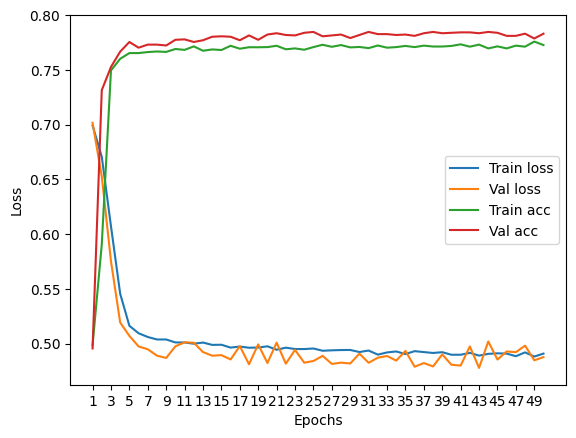

In [66]:
plot_loss(history)

Test accuracy:  77.28


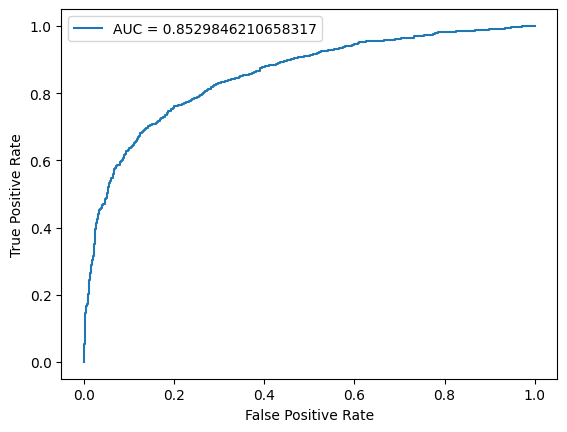

In [67]:
plot_auc(best_model, test_dataloader)

#### With 3 particles, edge_weights, (total particles, photon, charged hadron, neutral hadron, net positive charge of jet) count

In [47]:
input_dims = 8
hidden_dims = [8,8]
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

NameError: name 'GNN' is not defined

In [155]:
epochs = 50
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:02, 58.84it/s]


Train Epoch: 0 	Loss: 0.685528, Accuracy: 4312/7500 (57%)
Val Epoch: 0 	Loss: 0.685085, Accuracy: 1434/2500 (57%)



118it [00:02, 48.85it/s]


Train Epoch: 1 	Loss: 0.621606, Accuracy: 5365/7500 (72%)
Val Epoch: 1 	Loss: 0.570897, Accuracy: 1894/2500 (76%)



118it [00:01, 62.25it/s]


Train Epoch: 2 	Loss: 0.519863, Accuracy: 5713/7500 (76%)
Val Epoch: 2 	Loss: 0.508976, Accuracy: 1884/2500 (75%)



118it [00:02, 57.10it/s]


Train Epoch: 3 	Loss: 0.494194, Accuracy: 5771/7500 (77%)
Val Epoch: 3 	Loss: 0.502651, Accuracy: 1900/2500 (76%)



118it [00:02, 55.34it/s]


Train Epoch: 4 	Loss: 0.489101, Accuracy: 5776/7500 (77%)
Val Epoch: 4 	Loss: 0.505832, Accuracy: 1913/2500 (77%)



118it [00:02, 52.21it/s]


Train Epoch: 5 	Loss: 0.487716, Accuracy: 5794/7500 (77%)
Val Epoch: 5 	Loss: 0.494924, Accuracy: 1918/2500 (77%)



118it [00:02, 51.78it/s]


Train Epoch: 6 	Loss: 0.487323, Accuracy: 5802/7500 (77%)
Val Epoch: 6 	Loss: 0.509311, Accuracy: 1892/2500 (76%)



118it [00:02, 51.48it/s]


Train Epoch: 7 	Loss: 0.487108, Accuracy: 5795/7500 (77%)
Val Epoch: 7 	Loss: 0.498114, Accuracy: 1922/2500 (77%)



118it [00:02, 58.53it/s]


Train Epoch: 8 	Loss: 0.485618, Accuracy: 5809/7500 (77%)
Val Epoch: 8 	Loss: 0.507186, Accuracy: 1917/2500 (77%)



118it [00:02, 52.39it/s]


Train Epoch: 9 	Loss: 0.483095, Accuracy: 5813/7500 (78%)
Val Epoch: 9 	Loss: 0.496915, Accuracy: 1925/2500 (77%)



118it [00:02, 51.17it/s]


Train Epoch: 10 	Loss: 0.484610, Accuracy: 5800/7500 (77%)
Val Epoch: 10 	Loss: 0.495221, Accuracy: 1924/2500 (77%)



118it [00:02, 49.38it/s]


Train Epoch: 11 	Loss: 0.484865, Accuracy: 5823/7500 (78%)
Val Epoch: 11 	Loss: 0.495658, Accuracy: 1918/2500 (77%)



118it [00:02, 51.15it/s]


Train Epoch: 12 	Loss: 0.485194, Accuracy: 5808/7500 (77%)
Val Epoch: 12 	Loss: 0.501887, Accuracy: 1919/2500 (77%)



118it [00:02, 50.16it/s]


Train Epoch: 13 	Loss: 0.483585, Accuracy: 5819/7500 (78%)
Val Epoch: 13 	Loss: 0.505195, Accuracy: 1928/2500 (77%)



118it [00:01, 61.73it/s]


Train Epoch: 14 	Loss: 0.482176, Accuracy: 5817/7500 (78%)
Val Epoch: 14 	Loss: 0.501631, Accuracy: 1921/2500 (77%)



118it [00:02, 51.12it/s]


Train Epoch: 15 	Loss: 0.482026, Accuracy: 5829/7500 (78%)
Val Epoch: 15 	Loss: 0.508243, Accuracy: 1912/2500 (76%)



118it [00:02, 48.55it/s]


Train Epoch: 16 	Loss: 0.481848, Accuracy: 5832/7500 (78%)
Val Epoch: 16 	Loss: 0.497162, Accuracy: 1928/2500 (77%)



118it [00:02, 49.91it/s]


Train Epoch: 17 	Loss: 0.482894, Accuracy: 5834/7500 (78%)
Val Epoch: 17 	Loss: 0.514141, Accuracy: 1932/2500 (77%)



118it [00:02, 51.72it/s]


Train Epoch: 18 	Loss: 0.484537, Accuracy: 5827/7500 (78%)
Val Epoch: 18 	Loss: 0.493758, Accuracy: 1924/2500 (77%)



118it [00:02, 55.19it/s]


Train Epoch: 19 	Loss: 0.481078, Accuracy: 5831/7500 (78%)
Val Epoch: 19 	Loss: 0.499123, Accuracy: 1922/2500 (77%)



118it [00:02, 52.85it/s]


Train Epoch: 20 	Loss: 0.481924, Accuracy: 5816/7500 (78%)
Val Epoch: 20 	Loss: 0.495733, Accuracy: 1928/2500 (77%)



118it [00:02, 51.58it/s]


Train Epoch: 21 	Loss: 0.479304, Accuracy: 5828/7500 (78%)
Val Epoch: 21 	Loss: 0.516009, Accuracy: 1936/2500 (77%)



118it [00:02, 51.36it/s]


Train Epoch: 22 	Loss: 0.483665, Accuracy: 5835/7500 (78%)
Val Epoch: 22 	Loss: 0.497132, Accuracy: 1929/2500 (77%)



118it [00:02, 50.82it/s]


Train Epoch: 23 	Loss: 0.478970, Accuracy: 5844/7500 (78%)
Val Epoch: 23 	Loss: 0.496017, Accuracy: 1918/2500 (77%)



118it [00:02, 48.14it/s]


Train Epoch: 24 	Loss: 0.479543, Accuracy: 5848/7500 (78%)
Val Epoch: 24 	Loss: 0.503331, Accuracy: 1927/2500 (77%)



118it [00:01, 64.46it/s]


Train Epoch: 25 	Loss: 0.481622, Accuracy: 5841/7500 (78%)
Val Epoch: 25 	Loss: 0.498532, Accuracy: 1927/2500 (77%)



118it [00:02, 51.55it/s]


Train Epoch: 26 	Loss: 0.479253, Accuracy: 5829/7500 (78%)
Val Epoch: 26 	Loss: 0.503413, Accuracy: 1932/2500 (77%)



118it [00:02, 49.21it/s]


Train Epoch: 27 	Loss: 0.478574, Accuracy: 5846/7500 (78%)
Val Epoch: 27 	Loss: 0.495086, Accuracy: 1925/2500 (77%)



118it [00:02, 50.75it/s]


Train Epoch: 28 	Loss: 0.481948, Accuracy: 5816/7500 (78%)
Val Epoch: 28 	Loss: 0.497814, Accuracy: 1929/2500 (77%)



118it [00:02, 49.58it/s]


Train Epoch: 29 	Loss: 0.478294, Accuracy: 5847/7500 (78%)
Val Epoch: 29 	Loss: 0.501038, Accuracy: 1930/2500 (77%)



118it [00:02, 56.86it/s]


Train Epoch: 30 	Loss: 0.480744, Accuracy: 5851/7500 (78%)
Val Epoch: 30 	Loss: 0.522677, Accuracy: 1929/2500 (77%)



118it [00:02, 53.26it/s]


Train Epoch: 31 	Loss: 0.479561, Accuracy: 5826/7500 (78%)
Val Epoch: 31 	Loss: 0.503239, Accuracy: 1917/2500 (77%)



118it [00:02, 49.49it/s]


Train Epoch: 32 	Loss: 0.479676, Accuracy: 5839/7500 (78%)
Val Epoch: 32 	Loss: 0.497320, Accuracy: 1936/2500 (77%)



118it [00:02, 48.12it/s]


Train Epoch: 33 	Loss: 0.479471, Accuracy: 5834/7500 (78%)
Val Epoch: 33 	Loss: 0.497995, Accuracy: 1928/2500 (77%)



118it [00:02, 43.22it/s]


Train Epoch: 34 	Loss: 0.481735, Accuracy: 5845/7500 (78%)
Val Epoch: 34 	Loss: 0.504653, Accuracy: 1927/2500 (77%)



118it [00:02, 44.17it/s]


Train Epoch: 35 	Loss: 0.478552, Accuracy: 5836/7500 (78%)
Val Epoch: 35 	Loss: 0.497608, Accuracy: 1930/2500 (77%)



118it [00:02, 52.19it/s]


Train Epoch: 36 	Loss: 0.480573, Accuracy: 5844/7500 (78%)
Val Epoch: 36 	Loss: 0.493109, Accuracy: 1934/2500 (77%)



118it [00:02, 52.82it/s]


Train Epoch: 37 	Loss: 0.481807, Accuracy: 5854/7500 (78%)
Val Epoch: 37 	Loss: 0.502052, Accuracy: 1931/2500 (77%)



118it [00:02, 51.25it/s]


Train Epoch: 38 	Loss: 0.482404, Accuracy: 5814/7500 (78%)
Val Epoch: 38 	Loss: 0.512512, Accuracy: 1930/2500 (77%)



118it [00:02, 44.74it/s]


Train Epoch: 39 	Loss: 0.478064, Accuracy: 5851/7500 (78%)
Val Epoch: 39 	Loss: 0.496703, Accuracy: 1929/2500 (77%)



118it [00:02, 43.33it/s]


Train Epoch: 40 	Loss: 0.479625, Accuracy: 5846/7500 (78%)
Val Epoch: 40 	Loss: 0.501640, Accuracy: 1931/2500 (77%)



118it [00:02, 53.36it/s]


Train Epoch: 41 	Loss: 0.479372, Accuracy: 5842/7500 (78%)
Val Epoch: 41 	Loss: 0.506662, Accuracy: 1930/2500 (77%)



118it [00:02, 54.32it/s]


Train Epoch: 42 	Loss: 0.477532, Accuracy: 5839/7500 (78%)
Val Epoch: 42 	Loss: 0.506716, Accuracy: 1932/2500 (77%)



118it [00:02, 50.35it/s]


Train Epoch: 43 	Loss: 0.479834, Accuracy: 5847/7500 (78%)
Val Epoch: 43 	Loss: 0.494311, Accuracy: 1926/2500 (77%)



118it [00:02, 42.61it/s]


Train Epoch: 44 	Loss: 0.478025, Accuracy: 5840/7500 (78%)
Val Epoch: 44 	Loss: 0.500466, Accuracy: 1928/2500 (77%)



118it [00:02, 48.06it/s]


Train Epoch: 45 	Loss: 0.479735, Accuracy: 5855/7500 (78%)
Val Epoch: 45 	Loss: 0.487779, Accuracy: 1928/2500 (77%)



118it [00:02, 52.73it/s]


Train Epoch: 46 	Loss: 0.476667, Accuracy: 5847/7500 (78%)
Val Epoch: 46 	Loss: 0.496730, Accuracy: 1933/2500 (77%)



118it [00:02, 49.90it/s]


Train Epoch: 47 	Loss: 0.479927, Accuracy: 5834/7500 (78%)
Val Epoch: 47 	Loss: 0.494934, Accuracy: 1933/2500 (77%)



118it [00:02, 49.51it/s]


Train Epoch: 48 	Loss: 0.477397, Accuracy: 5856/7500 (78%)
Val Epoch: 48 	Loss: 0.510249, Accuracy: 1934/2500 (77%)



118it [00:02, 48.87it/s]


Train Epoch: 49 	Loss: 0.476795, Accuracy: 5858/7500 (78%)
Val Epoch: 49 	Loss: 0.490885, Accuracy: 1932/2500 (77%)



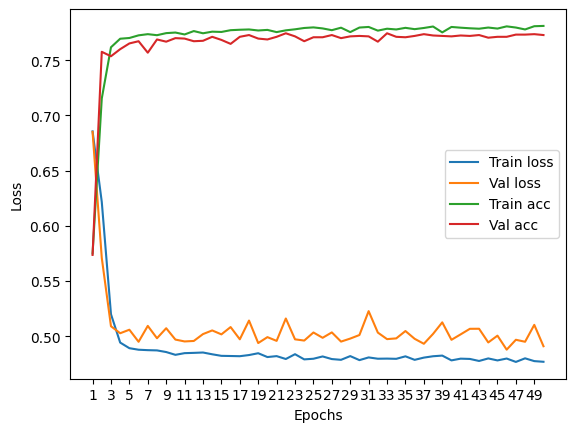

In [156]:
plot_loss(history)

Test accuracy:  78.60000000000001


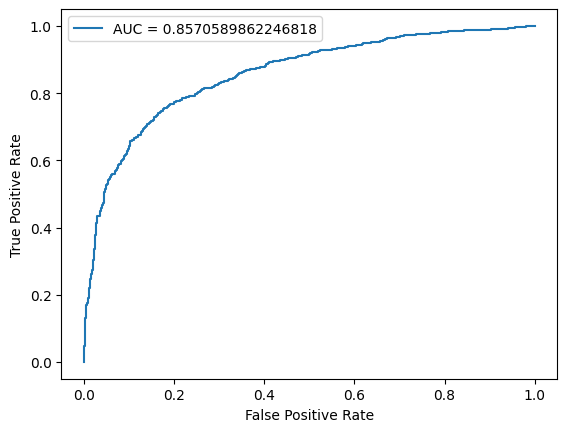

In [157]:
plot_auc(best_model, test_dataloader)

#### With 3 particles _ edge_weights

In [58]:
hidden_dims = [8]
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GNN(
  (layers): ModuleList(
    (0): GCNConv(8, 8)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=9, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)

In [59]:
epochs = 40
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:00, 161.05it/s]


Train Epoch: 0 	Loss: 0.597074, Accuracy: 5380/7500 (72%)
Val Epoch: 0 	Loss: 0.524107, Accuracy: 1898/2500 (76%)



118it [00:00, 195.05it/s]


Train Epoch: 1 	Loss: 0.489333, Accuracy: 5770/7500 (77%)
Val Epoch: 1 	Loss: 0.506700, Accuracy: 1900/2500 (76%)



118it [00:00, 204.84it/s]


Train Epoch: 2 	Loss: 0.481938, Accuracy: 5832/7500 (78%)
Val Epoch: 2 	Loss: 0.514233, Accuracy: 1909/2500 (76%)



118it [00:00, 201.25it/s]


Train Epoch: 3 	Loss: 0.479497, Accuracy: 5820/7500 (78%)
Val Epoch: 3 	Loss: 0.506254, Accuracy: 1924/2500 (77%)



118it [00:00, 201.66it/s]


Train Epoch: 4 	Loss: 0.479692, Accuracy: 5843/7500 (78%)
Val Epoch: 4 	Loss: 0.496182, Accuracy: 1916/2500 (77%)



118it [00:00, 205.89it/s]


Train Epoch: 5 	Loss: 0.479176, Accuracy: 5832/7500 (78%)
Val Epoch: 5 	Loss: 0.503697, Accuracy: 1914/2500 (77%)



118it [00:00, 217.28it/s]


Train Epoch: 6 	Loss: 0.477221, Accuracy: 5830/7500 (78%)
Val Epoch: 6 	Loss: 0.523180, Accuracy: 1918/2500 (77%)



118it [00:00, 210.49it/s]


Train Epoch: 7 	Loss: 0.478082, Accuracy: 5845/7500 (78%)
Val Epoch: 7 	Loss: 0.508998, Accuracy: 1914/2500 (77%)



118it [00:00, 205.56it/s]


Train Epoch: 8 	Loss: 0.478542, Accuracy: 5829/7500 (78%)
Val Epoch: 8 	Loss: 0.498209, Accuracy: 1916/2500 (77%)



118it [00:00, 197.11it/s]


Train Epoch: 9 	Loss: 0.476787, Accuracy: 5850/7500 (78%)
Val Epoch: 9 	Loss: 0.502342, Accuracy: 1915/2500 (77%)



118it [00:00, 149.85it/s]


Train Epoch: 10 	Loss: 0.477686, Accuracy: 5854/7500 (78%)
Val Epoch: 10 	Loss: 0.509687, Accuracy: 1908/2500 (76%)



118it [00:00, 145.75it/s]


Train Epoch: 11 	Loss: 0.477264, Accuracy: 5835/7500 (78%)
Val Epoch: 11 	Loss: 0.505959, Accuracy: 1906/2500 (76%)



118it [00:00, 177.54it/s]


Train Epoch: 12 	Loss: 0.479277, Accuracy: 5825/7500 (78%)
Val Epoch: 12 	Loss: 0.503189, Accuracy: 1921/2500 (77%)



118it [00:00, 193.31it/s]


Train Epoch: 13 	Loss: 0.478733, Accuracy: 5854/7500 (78%)
Val Epoch: 13 	Loss: 0.505110, Accuracy: 1917/2500 (77%)



118it [00:00, 163.16it/s]


Train Epoch: 14 	Loss: 0.477604, Accuracy: 5837/7500 (78%)
Val Epoch: 14 	Loss: 0.499926, Accuracy: 1926/2500 (77%)



118it [00:00, 142.43it/s]


Train Epoch: 15 	Loss: 0.474911, Accuracy: 5825/7500 (78%)
Val Epoch: 15 	Loss: 0.495240, Accuracy: 1914/2500 (77%)



118it [00:00, 206.58it/s]


Train Epoch: 16 	Loss: 0.477934, Accuracy: 5841/7500 (78%)
Val Epoch: 16 	Loss: 0.495550, Accuracy: 1923/2500 (77%)



118it [00:00, 207.42it/s]


Train Epoch: 17 	Loss: 0.474984, Accuracy: 5848/7500 (78%)
Val Epoch: 17 	Loss: 0.502051, Accuracy: 1922/2500 (77%)



118it [00:00, 208.01it/s]


Train Epoch: 18 	Loss: 0.476422, Accuracy: 5841/7500 (78%)
Val Epoch: 18 	Loss: 0.497351, Accuracy: 1920/2500 (77%)



118it [00:00, 211.32it/s]


Train Epoch: 19 	Loss: 0.474678, Accuracy: 5830/7500 (78%)
Val Epoch: 19 	Loss: 0.513626, Accuracy: 1921/2500 (77%)



118it [00:00, 205.35it/s]


Train Epoch: 20 	Loss: 0.474470, Accuracy: 5842/7500 (78%)
Val Epoch: 20 	Loss: 0.489888, Accuracy: 1915/2500 (77%)



118it [00:00, 204.74it/s]


Train Epoch: 21 	Loss: 0.475198, Accuracy: 5850/7500 (78%)
Val Epoch: 21 	Loss: 0.497474, Accuracy: 1922/2500 (77%)



118it [00:00, 206.04it/s]


Train Epoch: 22 	Loss: 0.475646, Accuracy: 5837/7500 (78%)
Val Epoch: 22 	Loss: 0.494094, Accuracy: 1916/2500 (77%)



118it [00:00, 208.34it/s]


Train Epoch: 23 	Loss: 0.474300, Accuracy: 5862/7500 (78%)
Val Epoch: 23 	Loss: 0.511518, Accuracy: 1922/2500 (77%)



118it [00:00, 212.40it/s]


Train Epoch: 24 	Loss: 0.474751, Accuracy: 5852/7500 (78%)
Val Epoch: 24 	Loss: 0.498989, Accuracy: 1920/2500 (77%)



118it [00:00, 210.73it/s]


Train Epoch: 25 	Loss: 0.473747, Accuracy: 5848/7500 (78%)
Val Epoch: 25 	Loss: 0.495681, Accuracy: 1917/2500 (77%)



118it [00:00, 211.66it/s]


Train Epoch: 26 	Loss: 0.475349, Accuracy: 5852/7500 (78%)
Val Epoch: 26 	Loss: 0.506577, Accuracy: 1912/2500 (76%)



118it [00:00, 200.89it/s]


Train Epoch: 27 	Loss: 0.474390, Accuracy: 5868/7500 (78%)
Val Epoch: 27 	Loss: 0.496329, Accuracy: 1925/2500 (77%)



118it [00:00, 216.84it/s]


Train Epoch: 28 	Loss: 0.475333, Accuracy: 5846/7500 (78%)
Val Epoch: 28 	Loss: 0.500177, Accuracy: 1917/2500 (77%)



118it [00:00, 202.45it/s]


Train Epoch: 29 	Loss: 0.475013, Accuracy: 5848/7500 (78%)
Val Epoch: 29 	Loss: 0.503152, Accuracy: 1923/2500 (77%)



118it [00:00, 125.91it/s]


Train Epoch: 30 	Loss: 0.474384, Accuracy: 5861/7500 (78%)
Val Epoch: 30 	Loss: 0.504914, Accuracy: 1922/2500 (77%)



118it [00:00, 181.49it/s]


Train Epoch: 31 	Loss: 0.472400, Accuracy: 5852/7500 (78%)
Val Epoch: 31 	Loss: 0.495379, Accuracy: 1926/2500 (77%)



118it [00:00, 178.41it/s]


Train Epoch: 32 	Loss: 0.476799, Accuracy: 5849/7500 (78%)
Val Epoch: 32 	Loss: 0.497383, Accuracy: 1920/2500 (77%)



118it [00:00, 183.20it/s]


Train Epoch: 33 	Loss: 0.471803, Accuracy: 5847/7500 (78%)
Val Epoch: 33 	Loss: 0.508023, Accuracy: 1913/2500 (77%)



118it [00:00, 195.53it/s]


Train Epoch: 34 	Loss: 0.474028, Accuracy: 5865/7500 (78%)
Val Epoch: 34 	Loss: 0.500759, Accuracy: 1917/2500 (77%)



118it [00:00, 202.66it/s]


Train Epoch: 35 	Loss: 0.472643, Accuracy: 5858/7500 (78%)
Val Epoch: 35 	Loss: 0.522671, Accuracy: 1929/2500 (77%)



118it [00:00, 215.55it/s]


Train Epoch: 36 	Loss: 0.472102, Accuracy: 5841/7500 (78%)
Val Epoch: 36 	Loss: 0.512138, Accuracy: 1916/2500 (77%)



118it [00:00, 192.56it/s]


Train Epoch: 37 	Loss: 0.474379, Accuracy: 5870/7500 (78%)
Val Epoch: 37 	Loss: 0.497368, Accuracy: 1920/2500 (77%)



118it [00:00, 212.30it/s]


Train Epoch: 38 	Loss: 0.473937, Accuracy: 5841/7500 (78%)
Val Epoch: 38 	Loss: 0.488797, Accuracy: 1921/2500 (77%)



118it [00:00, 199.48it/s]


Train Epoch: 39 	Loss: 0.475058, Accuracy: 5857/7500 (78%)
Val Epoch: 39 	Loss: 0.492165, Accuracy: 1925/2500 (77%)



#### With 3 particles

In [65]:
hidden_dims = [8]
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GNN(
  (layers): ModuleList(
    (0): GCNConv(8, 8)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=9, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)

In [66]:
epochs = 40
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:00, 148.58it/s]


Train Epoch: 0 	Loss: 0.603747, Accuracy: 5272/7500 (70%)
Val Epoch: 0 	Loss: 0.505677, Accuracy: 1881/2500 (75%)



118it [00:01, 102.98it/s]


Train Epoch: 1 	Loss: 0.500781, Accuracy: 5767/7500 (77%)
Val Epoch: 1 	Loss: 0.515120, Accuracy: 1877/2500 (75%)



118it [00:01, 116.28it/s]


Train Epoch: 2 	Loss: 0.494295, Accuracy: 5761/7500 (77%)
Val Epoch: 2 	Loss: 0.501457, Accuracy: 1946/2500 (78%)



118it [00:00, 156.78it/s]


Train Epoch: 3 	Loss: 0.491558, Accuracy: 5784/7500 (77%)
Val Epoch: 3 	Loss: 0.487226, Accuracy: 1949/2500 (78%)



118it [00:00, 166.96it/s]


Train Epoch: 4 	Loss: 0.484519, Accuracy: 5835/7500 (78%)
Val Epoch: 4 	Loss: 0.497819, Accuracy: 1897/2500 (76%)



118it [00:00, 148.16it/s]


Train Epoch: 5 	Loss: 0.489901, Accuracy: 5814/7500 (78%)
Val Epoch: 5 	Loss: 0.497099, Accuracy: 1932/2500 (77%)



118it [00:00, 156.86it/s]


Train Epoch: 6 	Loss: 0.487670, Accuracy: 5821/7500 (78%)
Val Epoch: 6 	Loss: 0.480455, Accuracy: 1955/2500 (78%)



118it [00:00, 153.63it/s]


Train Epoch: 7 	Loss: 0.485871, Accuracy: 5803/7500 (77%)
Val Epoch: 7 	Loss: 0.490667, Accuracy: 1915/2500 (77%)



118it [00:00, 156.20it/s]


Train Epoch: 8 	Loss: 0.487032, Accuracy: 5814/7500 (78%)
Val Epoch: 8 	Loss: 0.482816, Accuracy: 1939/2500 (78%)



118it [00:00, 162.78it/s]


Train Epoch: 9 	Loss: 0.488305, Accuracy: 5822/7500 (78%)
Val Epoch: 9 	Loss: 0.514272, Accuracy: 1936/2500 (77%)



118it [00:00, 141.32it/s]


Train Epoch: 10 	Loss: 0.487673, Accuracy: 5805/7500 (77%)
Val Epoch: 10 	Loss: 0.488381, Accuracy: 1957/2500 (78%)



118it [00:00, 146.13it/s]


Train Epoch: 11 	Loss: 0.484566, Accuracy: 5815/7500 (78%)
Val Epoch: 11 	Loss: 0.485724, Accuracy: 1946/2500 (78%)



118it [00:00, 158.87it/s]


Train Epoch: 12 	Loss: 0.483376, Accuracy: 5827/7500 (78%)
Val Epoch: 12 	Loss: 0.485092, Accuracy: 1936/2500 (77%)



118it [00:00, 147.53it/s]


Train Epoch: 13 	Loss: 0.482770, Accuracy: 5835/7500 (78%)
Val Epoch: 13 	Loss: 0.490813, Accuracy: 1952/2500 (78%)



118it [00:00, 152.66it/s]


Train Epoch: 14 	Loss: 0.486607, Accuracy: 5800/7500 (77%)
Val Epoch: 14 	Loss: 0.487062, Accuracy: 1953/2500 (78%)



118it [00:00, 132.83it/s]


Train Epoch: 15 	Loss: 0.482549, Accuracy: 5829/7500 (78%)
Val Epoch: 15 	Loss: 0.481579, Accuracy: 1939/2500 (78%)



118it [00:00, 132.10it/s]


Train Epoch: 16 	Loss: 0.484580, Accuracy: 5820/7500 (78%)
Val Epoch: 16 	Loss: 0.495805, Accuracy: 1929/2500 (77%)



118it [00:00, 135.60it/s]


Train Epoch: 17 	Loss: 0.485577, Accuracy: 5829/7500 (78%)
Val Epoch: 17 	Loss: 0.477230, Accuracy: 1956/2500 (78%)



118it [00:00, 155.18it/s]


Train Epoch: 18 	Loss: 0.483222, Accuracy: 5823/7500 (78%)
Val Epoch: 18 	Loss: 0.488951, Accuracy: 1956/2500 (78%)



118it [00:00, 164.88it/s]


Train Epoch: 19 	Loss: 0.484006, Accuracy: 5817/7500 (78%)
Val Epoch: 19 	Loss: 0.484838, Accuracy: 1948/2500 (78%)



118it [00:00, 166.13it/s]


Train Epoch: 20 	Loss: 0.483373, Accuracy: 5839/7500 (78%)
Val Epoch: 20 	Loss: 0.493018, Accuracy: 1952/2500 (78%)



118it [00:00, 148.27it/s]


Train Epoch: 21 	Loss: 0.485459, Accuracy: 5808/7500 (77%)
Val Epoch: 21 	Loss: 0.479877, Accuracy: 1952/2500 (78%)



118it [00:00, 162.44it/s]


Train Epoch: 22 	Loss: 0.482578, Accuracy: 5810/7500 (77%)
Val Epoch: 22 	Loss: 0.489085, Accuracy: 1956/2500 (78%)



118it [00:00, 154.98it/s]


Train Epoch: 23 	Loss: 0.485029, Accuracy: 5827/7500 (78%)
Val Epoch: 23 	Loss: 0.498015, Accuracy: 1943/2500 (78%)



118it [00:00, 153.42it/s]


Train Epoch: 24 	Loss: 0.482632, Accuracy: 5827/7500 (78%)
Val Epoch: 24 	Loss: 0.487305, Accuracy: 1943/2500 (78%)



118it [00:00, 164.05it/s]


Train Epoch: 25 	Loss: 0.482483, Accuracy: 5819/7500 (78%)
Val Epoch: 25 	Loss: 0.485884, Accuracy: 1949/2500 (78%)



118it [00:00, 126.32it/s]


Train Epoch: 26 	Loss: 0.482431, Accuracy: 5817/7500 (78%)
Val Epoch: 26 	Loss: 0.488379, Accuracy: 1952/2500 (78%)



118it [00:00, 162.64it/s]


Train Epoch: 27 	Loss: 0.481874, Accuracy: 5800/7500 (77%)
Val Epoch: 27 	Loss: 0.484046, Accuracy: 1953/2500 (78%)



118it [00:00, 145.71it/s]


Train Epoch: 28 	Loss: 0.482526, Accuracy: 5843/7500 (78%)
Val Epoch: 28 	Loss: 0.476844, Accuracy: 1951/2500 (78%)



118it [00:00, 146.31it/s]


Train Epoch: 29 	Loss: 0.481538, Accuracy: 5814/7500 (78%)
Val Epoch: 29 	Loss: 0.482565, Accuracy: 1949/2500 (78%)



118it [00:00, 126.35it/s]


Train Epoch: 30 	Loss: 0.484918, Accuracy: 5803/7500 (77%)
Val Epoch: 30 	Loss: 0.479984, Accuracy: 1951/2500 (78%)



118it [00:00, 144.93it/s]


Train Epoch: 31 	Loss: 0.483005, Accuracy: 5836/7500 (78%)
Val Epoch: 31 	Loss: 0.483594, Accuracy: 1945/2500 (78%)



118it [00:00, 153.87it/s]


Train Epoch: 32 	Loss: 0.480590, Accuracy: 5814/7500 (78%)
Val Epoch: 32 	Loss: 0.507708, Accuracy: 1927/2500 (77%)



118it [00:00, 158.25it/s]


Train Epoch: 33 	Loss: 0.482103, Accuracy: 5813/7500 (78%)
Val Epoch: 33 	Loss: 0.485087, Accuracy: 1931/2500 (77%)



118it [00:00, 148.27it/s]


Train Epoch: 34 	Loss: 0.481983, Accuracy: 5834/7500 (78%)
Val Epoch: 34 	Loss: 0.488391, Accuracy: 1944/2500 (78%)



118it [00:00, 149.42it/s]


Train Epoch: 35 	Loss: 0.483952, Accuracy: 5826/7500 (78%)
Val Epoch: 35 	Loss: 0.485493, Accuracy: 1954/2500 (78%)



118it [00:00, 163.70it/s]


Train Epoch: 36 	Loss: 0.479474, Accuracy: 5838/7500 (78%)
Val Epoch: 36 	Loss: 0.485527, Accuracy: 1942/2500 (78%)



118it [00:00, 147.97it/s]


Train Epoch: 37 	Loss: 0.481252, Accuracy: 5823/7500 (78%)
Val Epoch: 37 	Loss: 0.486692, Accuracy: 1950/2500 (78%)



118it [00:00, 161.54it/s]


Train Epoch: 38 	Loss: 0.480262, Accuracy: 5821/7500 (78%)
Val Epoch: 38 	Loss: 0.479005, Accuracy: 1955/2500 (78%)



118it [00:00, 156.68it/s]


Train Epoch: 39 	Loss: 0.481105, Accuracy: 5815/7500 (78%)
Val Epoch: 39 	Loss: 0.492589, Accuracy: 1935/2500 (77%)



Test accuracy:  77.2


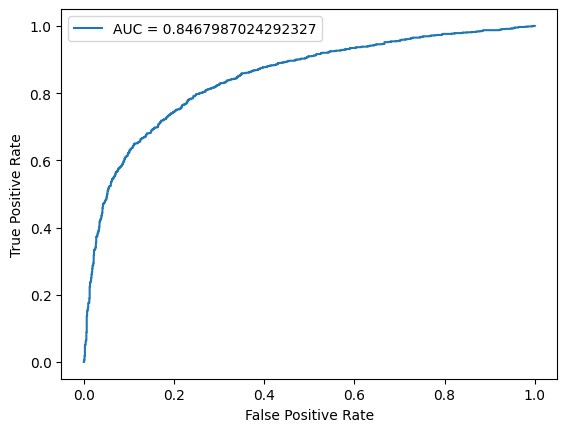

In [68]:
plot_auc(best_model, test_dataloader)

In [106]:
epochs = 40
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:00, 120.23it/s]


Train Epoch: 0 	Loss: 0.663259, Accuracy: 5005/7500 (67%)
Val Epoch: 0 	Loss: 0.628697, Accuracy: 1797/2500 (72%)



118it [00:01, 102.90it/s]


Train Epoch: 1 	Loss: 0.569472, Accuracy: 5593/7500 (75%)
Val Epoch: 1 	Loss: 0.554084, Accuracy: 1839/2500 (74%)



118it [00:00, 126.05it/s]


Train Epoch: 2 	Loss: 0.529648, Accuracy: 5614/7500 (75%)
Val Epoch: 2 	Loss: 0.540692, Accuracy: 1839/2500 (74%)



118it [00:00, 147.16it/s]


Train Epoch: 3 	Loss: 0.521168, Accuracy: 5638/7500 (75%)
Val Epoch: 3 	Loss: 0.540964, Accuracy: 1839/2500 (74%)



118it [00:00, 150.27it/s]


Train Epoch: 4 	Loss: 0.519924, Accuracy: 5628/7500 (75%)
Val Epoch: 4 	Loss: 0.538054, Accuracy: 1851/2500 (74%)



118it [00:00, 189.46it/s]


Train Epoch: 5 	Loss: 0.513636, Accuracy: 5658/7500 (75%)
Val Epoch: 5 	Loss: 0.532537, Accuracy: 1862/2500 (74%)



118it [00:00, 162.31it/s]


Train Epoch: 6 	Loss: 0.514516, Accuracy: 5661/7500 (75%)
Val Epoch: 6 	Loss: 0.537451, Accuracy: 1859/2500 (74%)



118it [00:00, 137.56it/s]


Train Epoch: 7 	Loss: 0.510633, Accuracy: 5676/7500 (76%)
Val Epoch: 7 	Loss: 0.535905, Accuracy: 1862/2500 (74%)



118it [00:00, 131.58it/s]


Train Epoch: 8 	Loss: 0.509031, Accuracy: 5696/7500 (76%)
Val Epoch: 8 	Loss: 0.537191, Accuracy: 1871/2500 (75%)



118it [00:00, 142.15it/s]


Train Epoch: 9 	Loss: 0.508605, Accuracy: 5709/7500 (76%)
Val Epoch: 9 	Loss: 0.537833, Accuracy: 1868/2500 (75%)



118it [00:00, 187.93it/s]


Train Epoch: 10 	Loss: 0.505370, Accuracy: 5704/7500 (76%)
Val Epoch: 10 	Loss: 0.524298, Accuracy: 1860/2500 (74%)



118it [00:00, 127.43it/s]


Train Epoch: 11 	Loss: 0.502605, Accuracy: 5710/7500 (76%)
Val Epoch: 11 	Loss: 0.525553, Accuracy: 1868/2500 (75%)



118it [00:00, 154.17it/s]


Train Epoch: 12 	Loss: 0.500607, Accuracy: 5730/7500 (76%)
Val Epoch: 12 	Loss: 0.528313, Accuracy: 1871/2500 (75%)



118it [00:00, 151.84it/s]


Train Epoch: 13 	Loss: 0.501197, Accuracy: 5734/7500 (76%)
Val Epoch: 13 	Loss: 0.531990, Accuracy: 1864/2500 (75%)



118it [00:00, 182.40it/s]


Train Epoch: 14 	Loss: 0.499848, Accuracy: 5751/7500 (77%)
Val Epoch: 14 	Loss: 0.520664, Accuracy: 1871/2500 (75%)



118it [00:00, 174.43it/s]


Train Epoch: 15 	Loss: 0.498038, Accuracy: 5763/7500 (77%)
Val Epoch: 15 	Loss: 0.524885, Accuracy: 1875/2500 (75%)



118it [00:00, 162.86it/s]


Train Epoch: 16 	Loss: 0.498725, Accuracy: 5731/7500 (76%)
Val Epoch: 16 	Loss: 0.519440, Accuracy: 1859/2500 (74%)



118it [00:00, 194.68it/s]


Train Epoch: 17 	Loss: 0.495908, Accuracy: 5764/7500 (77%)
Val Epoch: 17 	Loss: 0.521057, Accuracy: 1865/2500 (75%)



118it [00:00, 193.58it/s]


Train Epoch: 18 	Loss: 0.496037, Accuracy: 5783/7500 (77%)
Val Epoch: 18 	Loss: 0.525774, Accuracy: 1852/2500 (74%)



118it [00:00, 183.20it/s]


Train Epoch: 19 	Loss: 0.496939, Accuracy: 5761/7500 (77%)
Val Epoch: 19 	Loss: 0.520592, Accuracy: 1864/2500 (75%)



118it [00:00, 188.23it/s]


Train Epoch: 20 	Loss: 0.497095, Accuracy: 5754/7500 (77%)
Val Epoch: 20 	Loss: 0.517128, Accuracy: 1869/2500 (75%)



118it [00:00, 190.97it/s]


Train Epoch: 21 	Loss: 0.494315, Accuracy: 5744/7500 (77%)
Val Epoch: 21 	Loss: 0.531806, Accuracy: 1888/2500 (76%)



118it [00:00, 188.35it/s]


Train Epoch: 22 	Loss: 0.494490, Accuracy: 5749/7500 (77%)
Val Epoch: 22 	Loss: 0.522250, Accuracy: 1885/2500 (75%)



118it [00:00, 187.46it/s]


Train Epoch: 23 	Loss: 0.493914, Accuracy: 5743/7500 (77%)
Val Epoch: 23 	Loss: 0.524095, Accuracy: 1870/2500 (75%)



118it [00:00, 191.66it/s]


Train Epoch: 24 	Loss: 0.494183, Accuracy: 5759/7500 (77%)
Val Epoch: 24 	Loss: 0.520638, Accuracy: 1867/2500 (75%)



118it [00:00, 190.18it/s]


Train Epoch: 25 	Loss: 0.493797, Accuracy: 5768/7500 (77%)
Val Epoch: 25 	Loss: 0.520515, Accuracy: 1877/2500 (75%)



118it [00:00, 194.20it/s]


Train Epoch: 26 	Loss: 0.494474, Accuracy: 5752/7500 (77%)
Val Epoch: 26 	Loss: 0.516899, Accuracy: 1872/2500 (75%)



118it [00:00, 183.97it/s]


Train Epoch: 27 	Loss: 0.495654, Accuracy: 5768/7500 (77%)
Val Epoch: 27 	Loss: 0.524539, Accuracy: 1871/2500 (75%)



118it [00:00, 182.74it/s]


Train Epoch: 28 	Loss: 0.493594, Accuracy: 5767/7500 (77%)
Val Epoch: 28 	Loss: 0.520767, Accuracy: 1869/2500 (75%)



118it [00:00, 145.96it/s]


Train Epoch: 29 	Loss: 0.494357, Accuracy: 5785/7500 (77%)
Val Epoch: 29 	Loss: 0.513933, Accuracy: 1867/2500 (75%)



118it [00:00, 140.74it/s]


Train Epoch: 30 	Loss: 0.492707, Accuracy: 5772/7500 (77%)
Val Epoch: 30 	Loss: 0.514575, Accuracy: 1875/2500 (75%)



118it [00:00, 129.65it/s]


Train Epoch: 31 	Loss: 0.493486, Accuracy: 5783/7500 (77%)
Val Epoch: 31 	Loss: 0.525121, Accuracy: 1878/2500 (75%)



118it [00:00, 164.54it/s]


Train Epoch: 32 	Loss: 0.492950, Accuracy: 5781/7500 (77%)
Val Epoch: 32 	Loss: 0.521939, Accuracy: 1880/2500 (75%)



118it [00:00, 199.18it/s]


Train Epoch: 33 	Loss: 0.491077, Accuracy: 5781/7500 (77%)
Val Epoch: 33 	Loss: 0.539144, Accuracy: 1868/2500 (75%)



118it [00:00, 174.23it/s]


Train Epoch: 34 	Loss: 0.491214, Accuracy: 5795/7500 (77%)
Val Epoch: 34 	Loss: 0.512134, Accuracy: 1875/2500 (75%)



118it [00:00, 188.61it/s]


Train Epoch: 35 	Loss: 0.493938, Accuracy: 5760/7500 (77%)
Val Epoch: 35 	Loss: 0.515868, Accuracy: 1873/2500 (75%)



118it [00:00, 192.64it/s]


Train Epoch: 36 	Loss: 0.492204, Accuracy: 5791/7500 (77%)
Val Epoch: 36 	Loss: 0.524610, Accuracy: 1874/2500 (75%)



118it [00:00, 190.83it/s]


Train Epoch: 37 	Loss: 0.495543, Accuracy: 5784/7500 (77%)
Val Epoch: 37 	Loss: 0.516401, Accuracy: 1894/2500 (76%)



118it [00:00, 194.76it/s]


Train Epoch: 38 	Loss: 0.491385, Accuracy: 5772/7500 (77%)
Val Epoch: 38 	Loss: 0.518431, Accuracy: 1876/2500 (75%)



118it [00:00, 184.31it/s]


Train Epoch: 39 	Loss: 0.491228, Accuracy: 5791/7500 (77%)
Val Epoch: 39 	Loss: 0.522705, Accuracy: 1892/2500 (76%)



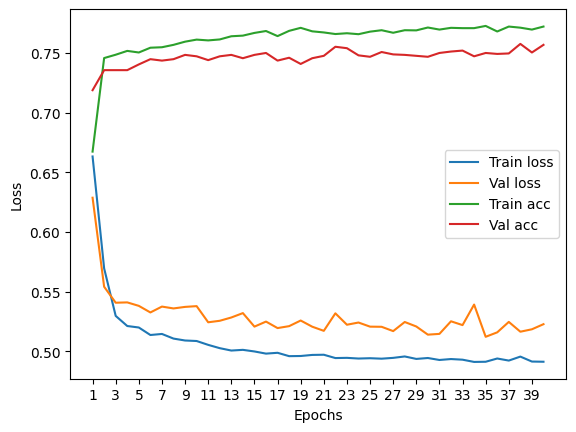

In [107]:
plot_loss(history)

Test accuracy:  78.64


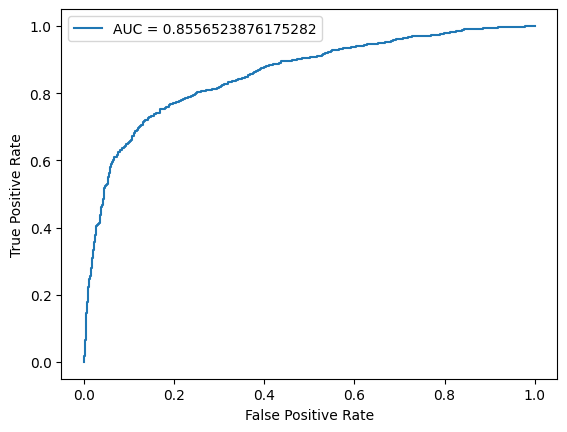

In [111]:
plot_auc(model, test_dataloader)

In [201]:
[p.numel() for p in model.parameters()]

[8, 64, 8, 1]

#### With 2 particles

In [76]:
hidden_dims = [8]
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GNN(
  (layers): ModuleList(
    (0): GCNConv(8, 8)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=9, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)

In [77]:
epochs = 40
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:00, 149.52it/s]


Train Epoch: 0 	Loss: 0.596202, Accuracy: 5254/7500 (70%)
Val Epoch: 0 	Loss: 0.505540, Accuracy: 1916/2500 (77%)



118it [00:00, 165.54it/s]


Train Epoch: 1 	Loss: 0.504763, Accuracy: 5760/7500 (77%)
Val Epoch: 1 	Loss: 0.499268, Accuracy: 1911/2500 (76%)



118it [00:00, 147.63it/s]


Train Epoch: 2 	Loss: 0.498875, Accuracy: 5783/7500 (77%)
Val Epoch: 2 	Loss: 0.497469, Accuracy: 1925/2500 (77%)



118it [00:00, 162.41it/s]


Train Epoch: 3 	Loss: 0.493198, Accuracy: 5824/7500 (78%)
Val Epoch: 3 	Loss: 0.481516, Accuracy: 1926/2500 (77%)



118it [00:00, 151.06it/s]


Train Epoch: 4 	Loss: 0.492164, Accuracy: 5804/7500 (77%)
Val Epoch: 4 	Loss: 0.492733, Accuracy: 1933/2500 (77%)



118it [00:00, 159.97it/s]


Train Epoch: 5 	Loss: 0.487729, Accuracy: 5809/7500 (77%)
Val Epoch: 5 	Loss: 0.488303, Accuracy: 1923/2500 (77%)



118it [00:00, 159.70it/s]


Train Epoch: 6 	Loss: 0.490467, Accuracy: 5824/7500 (78%)
Val Epoch: 6 	Loss: 0.479180, Accuracy: 1926/2500 (77%)



118it [00:00, 138.80it/s]


Train Epoch: 7 	Loss: 0.491628, Accuracy: 5801/7500 (77%)
Val Epoch: 7 	Loss: 0.489043, Accuracy: 1936/2500 (77%)



118it [00:00, 141.47it/s]


Train Epoch: 8 	Loss: 0.490775, Accuracy: 5787/7500 (77%)
Val Epoch: 8 	Loss: 0.498900, Accuracy: 1925/2500 (77%)



118it [00:00, 158.99it/s]


Train Epoch: 9 	Loss: 0.494915, Accuracy: 5793/7500 (77%)
Val Epoch: 9 	Loss: 0.485332, Accuracy: 1929/2500 (77%)



118it [00:00, 157.35it/s]


Train Epoch: 10 	Loss: 0.495207, Accuracy: 5798/7500 (77%)
Val Epoch: 10 	Loss: 0.475378, Accuracy: 1929/2500 (77%)



118it [00:00, 155.21it/s]


Train Epoch: 11 	Loss: 0.490166, Accuracy: 5819/7500 (78%)
Val Epoch: 11 	Loss: 0.495531, Accuracy: 1936/2500 (77%)



118it [00:00, 146.71it/s]


Train Epoch: 12 	Loss: 0.487749, Accuracy: 5812/7500 (77%)
Val Epoch: 12 	Loss: 0.489886, Accuracy: 1926/2500 (77%)



118it [00:00, 198.31it/s]


Train Epoch: 13 	Loss: 0.489411, Accuracy: 5798/7500 (77%)
Val Epoch: 13 	Loss: 0.481597, Accuracy: 1938/2500 (78%)



118it [00:00, 148.82it/s]


Train Epoch: 14 	Loss: 0.490461, Accuracy: 5797/7500 (77%)
Val Epoch: 14 	Loss: 0.487825, Accuracy: 1926/2500 (77%)



118it [00:00, 145.54it/s]


Train Epoch: 15 	Loss: 0.487548, Accuracy: 5810/7500 (77%)
Val Epoch: 15 	Loss: 0.479016, Accuracy: 1916/2500 (77%)



118it [00:00, 154.85it/s]


Train Epoch: 16 	Loss: 0.491813, Accuracy: 5802/7500 (77%)
Val Epoch: 16 	Loss: 0.493733, Accuracy: 1935/2500 (77%)



118it [00:00, 172.39it/s]


Train Epoch: 17 	Loss: 0.487507, Accuracy: 5820/7500 (78%)
Val Epoch: 17 	Loss: 0.480880, Accuracy: 1932/2500 (77%)



118it [00:00, 159.02it/s]


Train Epoch: 18 	Loss: 0.485377, Accuracy: 5821/7500 (78%)
Val Epoch: 18 	Loss: 0.485132, Accuracy: 1928/2500 (77%)



118it [00:00, 177.01it/s]


Train Epoch: 19 	Loss: 0.486549, Accuracy: 5797/7500 (77%)
Val Epoch: 19 	Loss: 0.486509, Accuracy: 1926/2500 (77%)



118it [00:00, 153.63it/s]


Train Epoch: 20 	Loss: 0.487054, Accuracy: 5813/7500 (78%)
Val Epoch: 20 	Loss: 0.485508, Accuracy: 1936/2500 (77%)



118it [00:00, 150.03it/s]


Train Epoch: 21 	Loss: 0.487305, Accuracy: 5808/7500 (77%)
Val Epoch: 21 	Loss: 0.493759, Accuracy: 1927/2500 (77%)



118it [00:00, 162.95it/s]


Train Epoch: 22 	Loss: 0.488714, Accuracy: 5805/7500 (77%)
Val Epoch: 22 	Loss: 0.473125, Accuracy: 1929/2500 (77%)



118it [00:00, 167.50it/s]


Train Epoch: 23 	Loss: 0.485123, Accuracy: 5833/7500 (78%)
Val Epoch: 23 	Loss: 0.477604, Accuracy: 1927/2500 (77%)



118it [00:00, 161.53it/s]


Train Epoch: 24 	Loss: 0.487715, Accuracy: 5841/7500 (78%)
Val Epoch: 24 	Loss: 0.479946, Accuracy: 1916/2500 (77%)



118it [00:00, 161.92it/s]


Train Epoch: 25 	Loss: 0.488052, Accuracy: 5811/7500 (77%)
Val Epoch: 25 	Loss: 0.480751, Accuracy: 1937/2500 (77%)



118it [00:00, 146.45it/s]


Train Epoch: 26 	Loss: 0.488108, Accuracy: 5795/7500 (77%)
Val Epoch: 26 	Loss: 0.477941, Accuracy: 1924/2500 (77%)



118it [00:00, 156.64it/s]


Train Epoch: 27 	Loss: 0.484340, Accuracy: 5830/7500 (78%)
Val Epoch: 27 	Loss: 0.491289, Accuracy: 1925/2500 (77%)



118it [00:00, 143.19it/s]


Train Epoch: 28 	Loss: 0.487648, Accuracy: 5833/7500 (78%)
Val Epoch: 28 	Loss: 0.490727, Accuracy: 1935/2500 (77%)



118it [00:00, 146.58it/s]


Train Epoch: 29 	Loss: 0.488106, Accuracy: 5823/7500 (78%)
Val Epoch: 29 	Loss: 0.486335, Accuracy: 1933/2500 (77%)



118it [00:00, 157.44it/s]


Train Epoch: 30 	Loss: 0.485515, Accuracy: 5801/7500 (77%)
Val Epoch: 30 	Loss: 0.482475, Accuracy: 1926/2500 (77%)



118it [00:00, 172.77it/s]


Train Epoch: 31 	Loss: 0.486234, Accuracy: 5853/7500 (78%)
Val Epoch: 31 	Loss: 0.482968, Accuracy: 1934/2500 (77%)



118it [00:00, 153.71it/s]


Train Epoch: 32 	Loss: 0.486274, Accuracy: 5817/7500 (78%)
Val Epoch: 32 	Loss: 0.477340, Accuracy: 1931/2500 (77%)



118it [00:00, 157.40it/s]


Train Epoch: 33 	Loss: 0.487317, Accuracy: 5830/7500 (78%)
Val Epoch: 33 	Loss: 0.493841, Accuracy: 1922/2500 (77%)



118it [00:00, 148.80it/s]


Train Epoch: 34 	Loss: 0.485002, Accuracy: 5835/7500 (78%)
Val Epoch: 34 	Loss: 0.476550, Accuracy: 1935/2500 (77%)



118it [00:00, 167.04it/s]


Train Epoch: 35 	Loss: 0.485734, Accuracy: 5835/7500 (78%)
Val Epoch: 35 	Loss: 0.492301, Accuracy: 1939/2500 (78%)



118it [00:00, 155.13it/s]


Train Epoch: 36 	Loss: 0.484825, Accuracy: 5833/7500 (78%)
Val Epoch: 36 	Loss: 0.479000, Accuracy: 1929/2500 (77%)



118it [00:00, 140.44it/s]


Train Epoch: 37 	Loss: 0.485990, Accuracy: 5837/7500 (78%)
Val Epoch: 37 	Loss: 0.487000, Accuracy: 1930/2500 (77%)



118it [00:00, 160.67it/s]


Train Epoch: 38 	Loss: 0.486334, Accuracy: 5828/7500 (78%)
Val Epoch: 38 	Loss: 0.478941, Accuracy: 1932/2500 (77%)



118it [00:00, 157.12it/s]


Train Epoch: 39 	Loss: 0.484409, Accuracy: 5816/7500 (78%)
Val Epoch: 39 	Loss: 0.482109, Accuracy: 1934/2500 (77%)



Test accuracy:  77.56


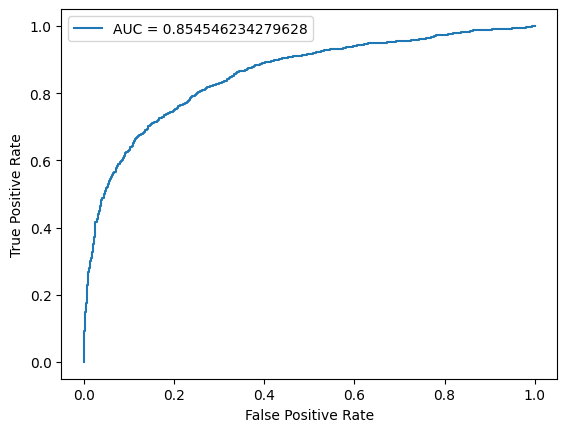

In [78]:
plot_auc(best_model, test_dataloader)

#### With 1 particle

In [86]:
hidden_dims = [8]
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GNN(
  (layers): ModuleList(
    (0): GCNConv(8, 8)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=9, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)

In [87]:
epochs = 40
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:00, 137.70it/s]


Train Epoch: 0 	Loss: 0.596637, Accuracy: 5186/7500 (69%)
Val Epoch: 0 	Loss: 0.549479, Accuracy: 1839/2500 (74%)



118it [00:00, 139.94it/s]


Train Epoch: 1 	Loss: 0.500792, Accuracy: 5780/7500 (77%)
Val Epoch: 1 	Loss: 0.545768, Accuracy: 1901/2500 (76%)



118it [00:00, 140.69it/s]


Train Epoch: 2 	Loss: 0.488657, Accuracy: 5796/7500 (77%)
Val Epoch: 2 	Loss: 0.516374, Accuracy: 1888/2500 (76%)



118it [00:00, 159.39it/s]


Train Epoch: 3 	Loss: 0.483421, Accuracy: 5845/7500 (78%)
Val Epoch: 3 	Loss: 0.519087, Accuracy: 1886/2500 (75%)



118it [00:00, 158.75it/s]


Train Epoch: 4 	Loss: 0.481739, Accuracy: 5819/7500 (78%)
Val Epoch: 4 	Loss: 0.511849, Accuracy: 1898/2500 (76%)



118it [00:00, 160.81it/s]


Train Epoch: 5 	Loss: 0.481182, Accuracy: 5822/7500 (78%)
Val Epoch: 5 	Loss: 0.508665, Accuracy: 1906/2500 (76%)



118it [00:00, 152.67it/s]


Train Epoch: 6 	Loss: 0.481062, Accuracy: 5840/7500 (78%)
Val Epoch: 6 	Loss: 0.522353, Accuracy: 1906/2500 (76%)



118it [00:00, 165.16it/s]


Train Epoch: 7 	Loss: 0.478495, Accuracy: 5836/7500 (78%)
Val Epoch: 7 	Loss: 0.521843, Accuracy: 1904/2500 (76%)



118it [00:00, 136.02it/s]


Train Epoch: 8 	Loss: 0.479358, Accuracy: 5834/7500 (78%)
Val Epoch: 8 	Loss: 0.508226, Accuracy: 1907/2500 (76%)



118it [00:00, 163.03it/s]


Train Epoch: 9 	Loss: 0.480618, Accuracy: 5829/7500 (78%)
Val Epoch: 9 	Loss: 0.509573, Accuracy: 1890/2500 (76%)



118it [00:00, 161.88it/s]


Train Epoch: 10 	Loss: 0.476726, Accuracy: 5846/7500 (78%)
Val Epoch: 10 	Loss: 0.539449, Accuracy: 1870/2500 (75%)



118it [00:00, 153.19it/s]


Train Epoch: 11 	Loss: 0.475786, Accuracy: 5830/7500 (78%)
Val Epoch: 11 	Loss: 0.558643, Accuracy: 1900/2500 (76%)



118it [00:00, 150.68it/s]


Train Epoch: 12 	Loss: 0.476590, Accuracy: 5854/7500 (78%)
Val Epoch: 12 	Loss: 0.502191, Accuracy: 1912/2500 (76%)



118it [00:00, 149.88it/s]


Train Epoch: 13 	Loss: 0.476107, Accuracy: 5820/7500 (78%)
Val Epoch: 13 	Loss: 0.522910, Accuracy: 1886/2500 (75%)



118it [00:00, 170.38it/s]


Train Epoch: 14 	Loss: 0.477281, Accuracy: 5842/7500 (78%)
Val Epoch: 14 	Loss: 0.519414, Accuracy: 1909/2500 (76%)



118it [00:00, 169.95it/s]


Train Epoch: 15 	Loss: 0.477022, Accuracy: 5835/7500 (78%)
Val Epoch: 15 	Loss: 0.512381, Accuracy: 1914/2500 (77%)



118it [00:00, 182.55it/s]


Train Epoch: 16 	Loss: 0.477607, Accuracy: 5842/7500 (78%)
Val Epoch: 16 	Loss: 0.508110, Accuracy: 1904/2500 (76%)



118it [00:00, 169.97it/s]


Train Epoch: 17 	Loss: 0.474818, Accuracy: 5851/7500 (78%)
Val Epoch: 17 	Loss: 0.522605, Accuracy: 1907/2500 (76%)



118it [00:00, 159.47it/s]


Train Epoch: 18 	Loss: 0.479136, Accuracy: 5823/7500 (78%)
Val Epoch: 18 	Loss: 0.503931, Accuracy: 1913/2500 (77%)



118it [00:00, 163.47it/s]


Train Epoch: 19 	Loss: 0.477045, Accuracy: 5837/7500 (78%)
Val Epoch: 19 	Loss: 0.508093, Accuracy: 1903/2500 (76%)



118it [00:00, 176.27it/s]


Train Epoch: 20 	Loss: 0.474872, Accuracy: 5864/7500 (78%)
Val Epoch: 20 	Loss: 0.508009, Accuracy: 1904/2500 (76%)



118it [00:00, 150.50it/s]


Train Epoch: 21 	Loss: 0.476087, Accuracy: 5842/7500 (78%)
Val Epoch: 21 	Loss: 0.517675, Accuracy: 1910/2500 (76%)



118it [00:00, 161.91it/s]


Train Epoch: 22 	Loss: 0.475123, Accuracy: 5852/7500 (78%)
Val Epoch: 22 	Loss: 0.501058, Accuracy: 1918/2500 (77%)



118it [00:00, 170.11it/s]


Train Epoch: 23 	Loss: 0.474737, Accuracy: 5851/7500 (78%)
Val Epoch: 23 	Loss: 0.505783, Accuracy: 1904/2500 (76%)



118it [00:00, 188.73it/s]


Train Epoch: 24 	Loss: 0.475140, Accuracy: 5846/7500 (78%)
Val Epoch: 24 	Loss: 0.505552, Accuracy: 1905/2500 (76%)



118it [00:00, 157.72it/s]


Train Epoch: 25 	Loss: 0.475516, Accuracy: 5850/7500 (78%)
Val Epoch: 25 	Loss: 0.517905, Accuracy: 1889/2500 (76%)



118it [00:00, 139.41it/s]


Train Epoch: 26 	Loss: 0.478324, Accuracy: 5841/7500 (78%)
Val Epoch: 26 	Loss: 0.518234, Accuracy: 1892/2500 (76%)



118it [00:00, 149.78it/s]


Train Epoch: 27 	Loss: 0.475571, Accuracy: 5834/7500 (78%)
Val Epoch: 27 	Loss: 0.512581, Accuracy: 1911/2500 (76%)



118it [00:00, 186.01it/s]


Train Epoch: 28 	Loss: 0.479133, Accuracy: 5845/7500 (78%)
Val Epoch: 28 	Loss: 0.521091, Accuracy: 1910/2500 (76%)



118it [00:00, 154.86it/s]


Train Epoch: 29 	Loss: 0.476875, Accuracy: 5862/7500 (78%)
Val Epoch: 29 	Loss: 0.502462, Accuracy: 1904/2500 (76%)



118it [00:00, 153.13it/s]


Train Epoch: 30 	Loss: 0.476452, Accuracy: 5858/7500 (78%)
Val Epoch: 30 	Loss: 0.509653, Accuracy: 1910/2500 (76%)



118it [00:00, 178.67it/s]


Train Epoch: 31 	Loss: 0.475297, Accuracy: 5841/7500 (78%)
Val Epoch: 31 	Loss: 0.520294, Accuracy: 1912/2500 (76%)



118it [00:00, 171.54it/s]


Train Epoch: 32 	Loss: 0.475747, Accuracy: 5861/7500 (78%)
Val Epoch: 32 	Loss: 0.506187, Accuracy: 1919/2500 (77%)



118it [00:00, 147.68it/s]


Train Epoch: 33 	Loss: 0.475506, Accuracy: 5855/7500 (78%)
Val Epoch: 33 	Loss: 0.510586, Accuracy: 1916/2500 (77%)



118it [00:00, 148.40it/s]


Train Epoch: 34 	Loss: 0.475972, Accuracy: 5842/7500 (78%)
Val Epoch: 34 	Loss: 0.505932, Accuracy: 1909/2500 (76%)



118it [00:00, 124.48it/s]


Train Epoch: 35 	Loss: 0.474590, Accuracy: 5850/7500 (78%)
Val Epoch: 35 	Loss: 0.526864, Accuracy: 1910/2500 (76%)



118it [00:00, 171.38it/s]


Train Epoch: 36 	Loss: 0.478526, Accuracy: 5842/7500 (78%)
Val Epoch: 36 	Loss: 0.511112, Accuracy: 1903/2500 (76%)



118it [00:00, 138.34it/s]


Train Epoch: 37 	Loss: 0.475141, Accuracy: 5865/7500 (78%)
Val Epoch: 37 	Loss: 0.510995, Accuracy: 1915/2500 (77%)



118it [00:00, 158.90it/s]


Train Epoch: 38 	Loss: 0.475873, Accuracy: 5853/7500 (78%)
Val Epoch: 38 	Loss: 0.513944, Accuracy: 1901/2500 (76%)



118it [00:00, 148.88it/s]


Train Epoch: 39 	Loss: 0.476204, Accuracy: 5844/7500 (78%)
Val Epoch: 39 	Loss: 0.508030, Accuracy: 1907/2500 (76%)



Test accuracy:  76.64


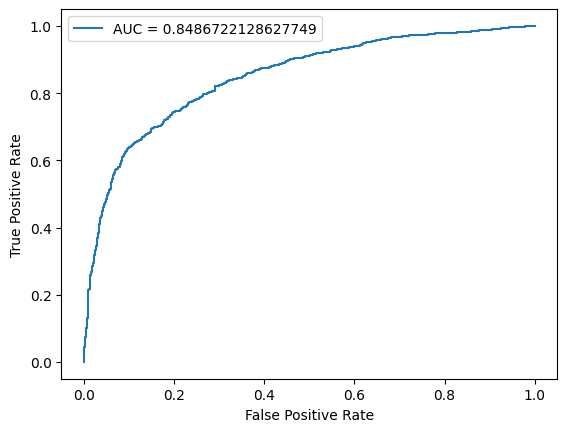

In [88]:
plot_auc(best_model, test_dataloader)

Particles per jet: 1


118it [00:00, 131.10it/s]


Train Epoch: 0 	Loss: 0.607229, Accuracy: 5123/7500 (68%)
Val Epoch: 0 	Loss: 0.559037, Accuracy: 1822/2500 (73%)



118it [00:00, 158.19it/s]


Train Epoch: 1 	Loss: 0.515800, Accuracy: 5663/7500 (76%)
Val Epoch: 1 	Loss: 0.506481, Accuracy: 1899/2500 (76%)



118it [00:00, 135.86it/s]


Train Epoch: 2 	Loss: 0.498416, Accuracy: 5737/7500 (76%)
Val Epoch: 2 	Loss: 0.505581, Accuracy: 1896/2500 (76%)



118it [00:00, 137.60it/s]


Train Epoch: 3 	Loss: 0.495153, Accuracy: 5768/7500 (77%)
Val Epoch: 3 	Loss: 0.505768, Accuracy: 1895/2500 (76%)



118it [00:00, 140.70it/s]


Train Epoch: 4 	Loss: 0.491580, Accuracy: 5768/7500 (77%)
Val Epoch: 4 	Loss: 0.500354, Accuracy: 1901/2500 (76%)



118it [00:00, 131.71it/s]


Train Epoch: 5 	Loss: 0.488421, Accuracy: 5782/7500 (77%)
Val Epoch: 5 	Loss: 0.521748, Accuracy: 1896/2500 (76%)



118it [00:00, 120.73it/s]


Train Epoch: 6 	Loss: 0.487855, Accuracy: 5779/7500 (77%)
Val Epoch: 6 	Loss: 0.519085, Accuracy: 1902/2500 (76%)



118it [00:01, 116.77it/s]


Train Epoch: 7 	Loss: 0.485860, Accuracy: 5777/7500 (77%)
Val Epoch: 7 	Loss: 0.506800, Accuracy: 1896/2500 (76%)



118it [00:00, 154.82it/s]


Train Epoch: 8 	Loss: 0.487582, Accuracy: 5774/7500 (77%)
Val Epoch: 8 	Loss: 0.511090, Accuracy: 1911/2500 (76%)



118it [00:00, 142.54it/s]


Train Epoch: 9 	Loss: 0.487245, Accuracy: 5783/7500 (77%)
Val Epoch: 9 	Loss: 0.505709, Accuracy: 1908/2500 (76%)



118it [00:00, 128.78it/s]


Train Epoch: 10 	Loss: 0.484406, Accuracy: 5803/7500 (77%)
Val Epoch: 10 	Loss: 0.512596, Accuracy: 1908/2500 (76%)



118it [00:00, 142.35it/s]


Train Epoch: 11 	Loss: 0.482788, Accuracy: 5807/7500 (77%)
Val Epoch: 11 	Loss: 0.505950, Accuracy: 1913/2500 (77%)



118it [00:00, 148.55it/s]


Train Epoch: 12 	Loss: 0.483192, Accuracy: 5790/7500 (77%)
Val Epoch: 12 	Loss: 0.511565, Accuracy: 1903/2500 (76%)



118it [00:00, 141.65it/s]


Train Epoch: 13 	Loss: 0.483926, Accuracy: 5811/7500 (77%)
Val Epoch: 13 	Loss: 0.513256, Accuracy: 1909/2500 (76%)



118it [00:00, 159.87it/s]


Train Epoch: 14 	Loss: 0.482204, Accuracy: 5791/7500 (77%)
Val Epoch: 14 	Loss: 0.499105, Accuracy: 1918/2500 (77%)



118it [00:00, 133.68it/s]


Train Epoch: 15 	Loss: 0.482247, Accuracy: 5815/7500 (78%)
Val Epoch: 15 	Loss: 0.503209, Accuracy: 1912/2500 (76%)



118it [00:00, 135.96it/s]


Train Epoch: 16 	Loss: 0.483966, Accuracy: 5808/7500 (77%)
Val Epoch: 16 	Loss: 0.503470, Accuracy: 1902/2500 (76%)



118it [00:00, 139.80it/s]


Train Epoch: 17 	Loss: 0.486668, Accuracy: 5778/7500 (77%)
Val Epoch: 17 	Loss: 0.509323, Accuracy: 1906/2500 (76%)



118it [00:00, 146.71it/s]


Train Epoch: 18 	Loss: 0.481773, Accuracy: 5816/7500 (78%)
Val Epoch: 18 	Loss: 0.511499, Accuracy: 1896/2500 (76%)



118it [00:00, 146.05it/s]


Train Epoch: 19 	Loss: 0.481809, Accuracy: 5792/7500 (77%)
Val Epoch: 19 	Loss: 0.503079, Accuracy: 1902/2500 (76%)



118it [00:00, 132.02it/s]


Train Epoch: 20 	Loss: 0.481326, Accuracy: 5795/7500 (77%)
Val Epoch: 20 	Loss: 0.512796, Accuracy: 1893/2500 (76%)



118it [00:00, 145.54it/s]


Train Epoch: 21 	Loss: 0.482995, Accuracy: 5802/7500 (77%)
Val Epoch: 21 	Loss: 0.512794, Accuracy: 1898/2500 (76%)



118it [00:00, 127.66it/s]


Train Epoch: 22 	Loss: 0.481452, Accuracy: 5802/7500 (77%)
Val Epoch: 22 	Loss: 0.509593, Accuracy: 1896/2500 (76%)



118it [00:00, 140.21it/s]


Train Epoch: 23 	Loss: 0.484769, Accuracy: 5808/7500 (77%)
Val Epoch: 23 	Loss: 0.507001, Accuracy: 1901/2500 (76%)



118it [00:00, 146.62it/s]


Train Epoch: 24 	Loss: 0.480904, Accuracy: 5815/7500 (78%)
Val Epoch: 24 	Loss: 0.516908, Accuracy: 1899/2500 (76%)



118it [00:00, 142.31it/s]


Train Epoch: 25 	Loss: 0.483465, Accuracy: 5824/7500 (78%)
Val Epoch: 25 	Loss: 0.512975, Accuracy: 1898/2500 (76%)



118it [00:00, 136.20it/s]


Train Epoch: 26 	Loss: 0.482206, Accuracy: 5799/7500 (77%)
Val Epoch: 26 	Loss: 0.524277, Accuracy: 1880/2500 (75%)



118it [00:00, 143.16it/s]


Train Epoch: 27 	Loss: 0.482211, Accuracy: 5811/7500 (77%)
Val Epoch: 27 	Loss: 0.514106, Accuracy: 1900/2500 (76%)



118it [00:00, 137.77it/s]


Train Epoch: 28 	Loss: 0.483603, Accuracy: 5798/7500 (77%)
Val Epoch: 28 	Loss: 0.516254, Accuracy: 1906/2500 (76%)



118it [00:00, 137.36it/s]


Train Epoch: 29 	Loss: 0.481002, Accuracy: 5808/7500 (77%)
Val Epoch: 29 	Loss: 0.503469, Accuracy: 1903/2500 (76%)



118it [00:00, 136.67it/s]


Train Epoch: 30 	Loss: 0.481447, Accuracy: 5808/7500 (77%)
Val Epoch: 30 	Loss: 0.507376, Accuracy: 1904/2500 (76%)



118it [00:00, 134.45it/s]


Train Epoch: 31 	Loss: 0.482684, Accuracy: 5803/7500 (77%)
Val Epoch: 31 	Loss: 0.498427, Accuracy: 1905/2500 (76%)



118it [00:00, 143.80it/s]


Train Epoch: 32 	Loss: 0.482373, Accuracy: 5814/7500 (78%)
Val Epoch: 32 	Loss: 0.507147, Accuracy: 1902/2500 (76%)



118it [00:00, 155.92it/s]


Train Epoch: 33 	Loss: 0.479725, Accuracy: 5823/7500 (78%)
Val Epoch: 33 	Loss: 0.507969, Accuracy: 1909/2500 (76%)



118it [00:00, 143.68it/s]


Train Epoch: 34 	Loss: 0.480077, Accuracy: 5790/7500 (77%)
Val Epoch: 34 	Loss: 0.502973, Accuracy: 1904/2500 (76%)



118it [00:00, 140.40it/s]


Train Epoch: 35 	Loss: 0.480733, Accuracy: 5806/7500 (77%)
Val Epoch: 35 	Loss: 0.503691, Accuracy: 1895/2500 (76%)



118it [00:00, 148.61it/s]


Train Epoch: 36 	Loss: 0.481369, Accuracy: 5794/7500 (77%)
Val Epoch: 36 	Loss: 0.508636, Accuracy: 1898/2500 (76%)



118it [00:00, 145.45it/s]


Train Epoch: 37 	Loss: 0.482942, Accuracy: 5815/7500 (78%)
Val Epoch: 37 	Loss: 0.517363, Accuracy: 1906/2500 (76%)



118it [00:01, 117.27it/s]


Train Epoch: 38 	Loss: 0.479360, Accuracy: 5780/7500 (77%)
Val Epoch: 38 	Loss: 0.500342, Accuracy: 1898/2500 (76%)



118it [00:00, 135.81it/s]


Train Epoch: 39 	Loss: 0.480549, Accuracy: 5814/7500 (78%)
Val Epoch: 39 	Loss: 0.505845, Accuracy: 1909/2500 (76%)

Test accuracy:  77.60000000000001


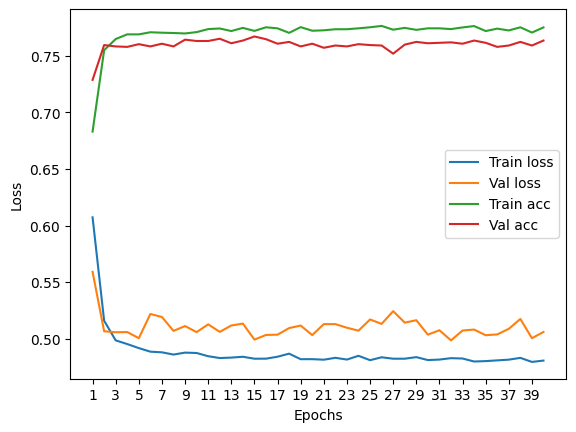

****************************************************************************************************



118it [00:00, 135.46it/s]


Train Epoch: 0 	Loss: 0.595946, Accuracy: 5286/7500 (70%)
Val Epoch: 0 	Loss: 0.531738, Accuracy: 1913/2500 (77%)



118it [00:00, 136.33it/s]


Train Epoch: 1 	Loss: 0.510212, Accuracy: 5705/7500 (76%)
Val Epoch: 1 	Loss: 0.499305, Accuracy: 1924/2500 (77%)



118it [00:00, 155.02it/s]


Train Epoch: 2 	Loss: 0.497549, Accuracy: 5765/7500 (77%)
Val Epoch: 2 	Loss: 0.493832, Accuracy: 1929/2500 (77%)



118it [00:00, 147.51it/s]


Train Epoch: 3 	Loss: 0.493809, Accuracy: 5752/7500 (77%)
Val Epoch: 3 	Loss: 0.499624, Accuracy: 1931/2500 (77%)



118it [00:00, 132.61it/s]


Train Epoch: 4 	Loss: 0.495697, Accuracy: 5741/7500 (77%)
Val Epoch: 4 	Loss: 0.499954, Accuracy: 1929/2500 (77%)



118it [00:00, 141.32it/s]


Train Epoch: 5 	Loss: 0.494886, Accuracy: 5773/7500 (77%)
Val Epoch: 5 	Loss: 0.506940, Accuracy: 1920/2500 (77%)



118it [00:00, 144.22it/s]


Train Epoch: 6 	Loss: 0.494510, Accuracy: 5758/7500 (77%)
Val Epoch: 6 	Loss: 0.501706, Accuracy: 1922/2500 (77%)



118it [00:00, 143.01it/s]


Train Epoch: 7 	Loss: 0.494748, Accuracy: 5750/7500 (77%)
Val Epoch: 7 	Loss: 0.526594, Accuracy: 1911/2500 (76%)



118it [00:00, 134.21it/s]


Train Epoch: 8 	Loss: 0.495139, Accuracy: 5771/7500 (77%)
Val Epoch: 8 	Loss: 0.505581, Accuracy: 1921/2500 (77%)



118it [00:00, 140.76it/s]


Train Epoch: 9 	Loss: 0.493981, Accuracy: 5766/7500 (77%)
Val Epoch: 9 	Loss: 0.495302, Accuracy: 1918/2500 (77%)



118it [00:00, 127.93it/s]


Train Epoch: 10 	Loss: 0.491168, Accuracy: 5780/7500 (77%)
Val Epoch: 10 	Loss: 0.493175, Accuracy: 1934/2500 (77%)



118it [00:00, 149.70it/s]


Train Epoch: 11 	Loss: 0.491221, Accuracy: 5764/7500 (77%)
Val Epoch: 11 	Loss: 0.501060, Accuracy: 1931/2500 (77%)



118it [00:00, 139.69it/s]


Train Epoch: 12 	Loss: 0.494184, Accuracy: 5769/7500 (77%)
Val Epoch: 12 	Loss: 0.503936, Accuracy: 1924/2500 (77%)



118it [00:00, 130.87it/s]


Train Epoch: 13 	Loss: 0.492295, Accuracy: 5773/7500 (77%)
Val Epoch: 13 	Loss: 0.500618, Accuracy: 1929/2500 (77%)



118it [00:00, 140.02it/s]


Train Epoch: 14 	Loss: 0.492023, Accuracy: 5787/7500 (77%)
Val Epoch: 14 	Loss: 0.507623, Accuracy: 1932/2500 (77%)



118it [00:00, 148.14it/s]


Train Epoch: 15 	Loss: 0.490028, Accuracy: 5793/7500 (77%)
Val Epoch: 15 	Loss: 0.512633, Accuracy: 1930/2500 (77%)



118it [00:00, 157.54it/s]


Train Epoch: 16 	Loss: 0.488479, Accuracy: 5781/7500 (77%)
Val Epoch: 16 	Loss: 0.512133, Accuracy: 1931/2500 (77%)



118it [00:00, 143.14it/s]


Train Epoch: 17 	Loss: 0.488768, Accuracy: 5807/7500 (77%)
Val Epoch: 17 	Loss: 0.501259, Accuracy: 1923/2500 (77%)



118it [00:00, 136.15it/s]


Train Epoch: 18 	Loss: 0.488775, Accuracy: 5772/7500 (77%)
Val Epoch: 18 	Loss: 0.501704, Accuracy: 1930/2500 (77%)



118it [00:01, 103.34it/s]


Train Epoch: 19 	Loss: 0.487928, Accuracy: 5779/7500 (77%)
Val Epoch: 19 	Loss: 0.498528, Accuracy: 1925/2500 (77%)



118it [00:00, 123.29it/s]


Train Epoch: 20 	Loss: 0.489576, Accuracy: 5767/7500 (77%)
Val Epoch: 20 	Loss: 0.494179, Accuracy: 1932/2500 (77%)



118it [00:00, 138.81it/s]


Train Epoch: 21 	Loss: 0.490021, Accuracy: 5789/7500 (77%)
Val Epoch: 21 	Loss: 0.527685, Accuracy: 1901/2500 (76%)



118it [00:00, 140.53it/s]


Train Epoch: 22 	Loss: 0.492339, Accuracy: 5744/7500 (77%)
Val Epoch: 22 	Loss: 0.497910, Accuracy: 1928/2500 (77%)



118it [00:00, 162.97it/s]


Train Epoch: 23 	Loss: 0.491362, Accuracy: 5796/7500 (77%)
Val Epoch: 23 	Loss: 0.506663, Accuracy: 1930/2500 (77%)



118it [00:00, 139.16it/s]


Train Epoch: 24 	Loss: 0.492118, Accuracy: 5770/7500 (77%)
Val Epoch: 24 	Loss: 0.497116, Accuracy: 1924/2500 (77%)



118it [00:00, 125.65it/s]


Train Epoch: 25 	Loss: 0.490529, Accuracy: 5773/7500 (77%)
Val Epoch: 25 	Loss: 0.493587, Accuracy: 1926/2500 (77%)



118it [00:00, 119.35it/s]


Train Epoch: 26 	Loss: 0.488678, Accuracy: 5787/7500 (77%)
Val Epoch: 26 	Loss: 0.492947, Accuracy: 1934/2500 (77%)



118it [00:00, 142.12it/s]


Train Epoch: 27 	Loss: 0.486766, Accuracy: 5803/7500 (77%)
Val Epoch: 27 	Loss: 0.498901, Accuracy: 1935/2500 (77%)



118it [00:00, 143.18it/s]


Train Epoch: 28 	Loss: 0.488436, Accuracy: 5783/7500 (77%)
Val Epoch: 28 	Loss: 0.516211, Accuracy: 1932/2500 (77%)



118it [00:00, 139.29it/s]


Train Epoch: 29 	Loss: 0.487709, Accuracy: 5773/7500 (77%)
Val Epoch: 29 	Loss: 0.502466, Accuracy: 1926/2500 (77%)



118it [00:00, 138.96it/s]


Train Epoch: 30 	Loss: 0.488995, Accuracy: 5784/7500 (77%)
Val Epoch: 30 	Loss: 0.493964, Accuracy: 1931/2500 (77%)



118it [00:00, 142.57it/s]


Train Epoch: 31 	Loss: 0.488970, Accuracy: 5779/7500 (77%)
Val Epoch: 31 	Loss: 0.504544, Accuracy: 1928/2500 (77%)



118it [00:00, 156.90it/s]


Train Epoch: 32 	Loss: 0.487594, Accuracy: 5802/7500 (77%)
Val Epoch: 32 	Loss: 0.509330, Accuracy: 1919/2500 (77%)



118it [00:01, 116.66it/s]


Train Epoch: 33 	Loss: 0.487886, Accuracy: 5794/7500 (77%)
Val Epoch: 33 	Loss: 0.493605, Accuracy: 1926/2500 (77%)



118it [00:00, 144.67it/s]


Train Epoch: 34 	Loss: 0.487295, Accuracy: 5813/7500 (78%)
Val Epoch: 34 	Loss: 0.504264, Accuracy: 1923/2500 (77%)



118it [00:00, 156.85it/s]


Train Epoch: 35 	Loss: 0.489516, Accuracy: 5785/7500 (77%)
Val Epoch: 35 	Loss: 0.495695, Accuracy: 1926/2500 (77%)



118it [00:00, 135.67it/s]


Train Epoch: 36 	Loss: 0.487454, Accuracy: 5799/7500 (77%)
Val Epoch: 36 	Loss: 0.514037, Accuracy: 1935/2500 (77%)



118it [00:00, 160.65it/s]


Train Epoch: 37 	Loss: 0.488496, Accuracy: 5780/7500 (77%)
Val Epoch: 37 	Loss: 0.502130, Accuracy: 1928/2500 (77%)



118it [00:00, 140.72it/s]


Train Epoch: 38 	Loss: 0.488827, Accuracy: 5795/7500 (77%)
Val Epoch: 38 	Loss: 0.502515, Accuracy: 1927/2500 (77%)



118it [00:00, 131.28it/s]


Train Epoch: 39 	Loss: 0.489712, Accuracy: 5775/7500 (77%)
Val Epoch: 39 	Loss: 0.504136, Accuracy: 1933/2500 (77%)

Test accuracy:  76.88000000000001


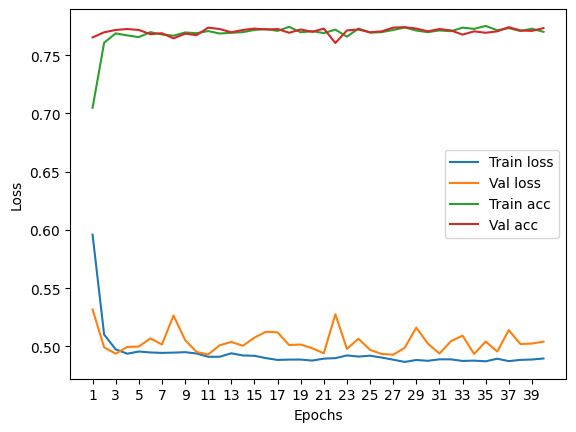

****************************************************************************************************



118it [00:00, 133.77it/s]


Train Epoch: 0 	Loss: 0.588665, Accuracy: 5180/7500 (69%)
Val Epoch: 0 	Loss: 0.511934, Accuracy: 1912/2500 (76%)



118it [00:00, 131.26it/s]


Train Epoch: 1 	Loss: 0.500283, Accuracy: 5736/7500 (76%)
Val Epoch: 1 	Loss: 0.500824, Accuracy: 1944/2500 (78%)



118it [00:00, 131.09it/s]


Train Epoch: 2 	Loss: 0.496706, Accuracy: 5785/7500 (77%)
Val Epoch: 2 	Loss: 0.512631, Accuracy: 1946/2500 (78%)



118it [00:00, 135.96it/s]


Train Epoch: 3 	Loss: 0.495582, Accuracy: 5771/7500 (77%)
Val Epoch: 3 	Loss: 0.513965, Accuracy: 1945/2500 (78%)



118it [00:00, 127.54it/s]


Train Epoch: 4 	Loss: 0.490637, Accuracy: 5805/7500 (77%)
Val Epoch: 4 	Loss: 0.521564, Accuracy: 1938/2500 (78%)



118it [00:00, 130.11it/s]


Train Epoch: 5 	Loss: 0.491482, Accuracy: 5813/7500 (78%)
Val Epoch: 5 	Loss: 0.511020, Accuracy: 1920/2500 (77%)



118it [00:00, 135.01it/s]


Train Epoch: 6 	Loss: 0.487324, Accuracy: 5810/7500 (77%)
Val Epoch: 6 	Loss: 0.498515, Accuracy: 1934/2500 (77%)



118it [00:00, 148.74it/s]


Train Epoch: 7 	Loss: 0.487584, Accuracy: 5822/7500 (78%)
Val Epoch: 7 	Loss: 0.497733, Accuracy: 1935/2500 (77%)



118it [00:00, 150.27it/s]


Train Epoch: 8 	Loss: 0.486195, Accuracy: 5807/7500 (77%)
Val Epoch: 8 	Loss: 0.486065, Accuracy: 1943/2500 (78%)



118it [00:00, 137.63it/s]


Train Epoch: 9 	Loss: 0.484667, Accuracy: 5831/7500 (78%)
Val Epoch: 9 	Loss: 0.485286, Accuracy: 1935/2500 (77%)



118it [00:00, 140.97it/s]


Train Epoch: 10 	Loss: 0.482867, Accuracy: 5827/7500 (78%)
Val Epoch: 10 	Loss: 0.481486, Accuracy: 1947/2500 (78%)



118it [00:00, 149.16it/s]


Train Epoch: 11 	Loss: 0.484648, Accuracy: 5811/7500 (77%)
Val Epoch: 11 	Loss: 0.485084, Accuracy: 1938/2500 (78%)



118it [00:00, 132.95it/s]


Train Epoch: 12 	Loss: 0.484278, Accuracy: 5795/7500 (77%)
Val Epoch: 12 	Loss: 0.487099, Accuracy: 1950/2500 (78%)



118it [00:01, 114.77it/s]


Train Epoch: 13 	Loss: 0.485043, Accuracy: 5829/7500 (78%)
Val Epoch: 13 	Loss: 0.486554, Accuracy: 1940/2500 (78%)



118it [00:00, 131.17it/s]


Train Epoch: 14 	Loss: 0.482134, Accuracy: 5825/7500 (78%)
Val Epoch: 14 	Loss: 0.490208, Accuracy: 1938/2500 (78%)



118it [00:00, 119.68it/s]


Train Epoch: 15 	Loss: 0.483943, Accuracy: 5809/7500 (77%)
Val Epoch: 15 	Loss: 0.502363, Accuracy: 1947/2500 (78%)



118it [00:00, 131.67it/s]


Train Epoch: 16 	Loss: 0.480278, Accuracy: 5835/7500 (78%)
Val Epoch: 16 	Loss: 0.486308, Accuracy: 1939/2500 (78%)



118it [00:00, 132.98it/s]


Train Epoch: 17 	Loss: 0.479798, Accuracy: 5795/7500 (77%)
Val Epoch: 17 	Loss: 0.496743, Accuracy: 1943/2500 (78%)



118it [00:01, 113.32it/s]


Train Epoch: 18 	Loss: 0.482740, Accuracy: 5823/7500 (78%)
Val Epoch: 18 	Loss: 0.485144, Accuracy: 1945/2500 (78%)



118it [00:00, 124.06it/s]


Train Epoch: 19 	Loss: 0.480433, Accuracy: 5821/7500 (78%)
Val Epoch: 19 	Loss: 0.482067, Accuracy: 1945/2500 (78%)



118it [00:00, 141.35it/s]


Train Epoch: 20 	Loss: 0.482636, Accuracy: 5826/7500 (78%)
Val Epoch: 20 	Loss: 0.493671, Accuracy: 1945/2500 (78%)



118it [00:00, 119.42it/s]


Train Epoch: 21 	Loss: 0.479285, Accuracy: 5847/7500 (78%)
Val Epoch: 21 	Loss: 0.481984, Accuracy: 1945/2500 (78%)



118it [00:00, 125.27it/s]


Train Epoch: 22 	Loss: 0.481103, Accuracy: 5833/7500 (78%)
Val Epoch: 22 	Loss: 0.481274, Accuracy: 1944/2500 (78%)



118it [00:00, 140.15it/s]


Train Epoch: 23 	Loss: 0.481356, Accuracy: 5796/7500 (77%)
Val Epoch: 23 	Loss: 0.511478, Accuracy: 1909/2500 (76%)



118it [00:00, 142.10it/s]


Train Epoch: 24 	Loss: 0.484037, Accuracy: 5826/7500 (78%)
Val Epoch: 24 	Loss: 0.495310, Accuracy: 1933/2500 (77%)



118it [00:00, 139.41it/s]


Train Epoch: 25 	Loss: 0.479447, Accuracy: 5841/7500 (78%)
Val Epoch: 25 	Loss: 0.481308, Accuracy: 1945/2500 (78%)



118it [00:01, 115.96it/s]


Train Epoch: 26 	Loss: 0.481315, Accuracy: 5821/7500 (78%)
Val Epoch: 26 	Loss: 0.479504, Accuracy: 1947/2500 (78%)



118it [00:00, 127.13it/s]


Train Epoch: 27 	Loss: 0.477889, Accuracy: 5837/7500 (78%)
Val Epoch: 27 	Loss: 0.496873, Accuracy: 1939/2500 (78%)



118it [00:00, 130.87it/s]


Train Epoch: 28 	Loss: 0.480869, Accuracy: 5802/7500 (77%)
Val Epoch: 28 	Loss: 0.479661, Accuracy: 1950/2500 (78%)



118it [00:00, 133.14it/s]


Train Epoch: 29 	Loss: 0.479447, Accuracy: 5816/7500 (78%)
Val Epoch: 29 	Loss: 0.489700, Accuracy: 1948/2500 (78%)



118it [00:01, 115.35it/s]


Train Epoch: 30 	Loss: 0.480139, Accuracy: 5840/7500 (78%)
Val Epoch: 30 	Loss: 0.480481, Accuracy: 1944/2500 (78%)



118it [00:01, 77.51it/s]


Train Epoch: 31 	Loss: 0.480009, Accuracy: 5827/7500 (78%)
Val Epoch: 31 	Loss: 0.492621, Accuracy: 1943/2500 (78%)



118it [00:02, 48.17it/s]


Train Epoch: 32 	Loss: 0.480243, Accuracy: 5821/7500 (78%)
Val Epoch: 32 	Loss: 0.487254, Accuracy: 1951/2500 (78%)



118it [00:02, 42.62it/s]


Train Epoch: 33 	Loss: 0.477980, Accuracy: 5844/7500 (78%)
Val Epoch: 33 	Loss: 0.490404, Accuracy: 1942/2500 (78%)



118it [00:01, 71.61it/s]


Train Epoch: 34 	Loss: 0.479290, Accuracy: 5824/7500 (78%)
Val Epoch: 34 	Loss: 0.481795, Accuracy: 1947/2500 (78%)



118it [00:01, 63.97it/s]


Train Epoch: 35 	Loss: 0.478812, Accuracy: 5817/7500 (78%)
Val Epoch: 35 	Loss: 0.487521, Accuracy: 1950/2500 (78%)



118it [00:01, 87.34it/s]


Train Epoch: 36 	Loss: 0.478367, Accuracy: 5839/7500 (78%)
Val Epoch: 36 	Loss: 0.480041, Accuracy: 1949/2500 (78%)



118it [00:01, 84.60it/s]


Train Epoch: 37 	Loss: 0.479099, Accuracy: 5825/7500 (78%)
Val Epoch: 37 	Loss: 0.503251, Accuracy: 1934/2500 (77%)



118it [00:01, 90.58it/s]


Train Epoch: 38 	Loss: 0.480865, Accuracy: 5821/7500 (78%)
Val Epoch: 38 	Loss: 0.488719, Accuracy: 1937/2500 (77%)



118it [00:01, 71.92it/s]


Train Epoch: 39 	Loss: 0.478055, Accuracy: 5807/7500 (77%)
Val Epoch: 39 	Loss: 0.484946, Accuracy: 1951/2500 (78%)

Test accuracy:  76.72


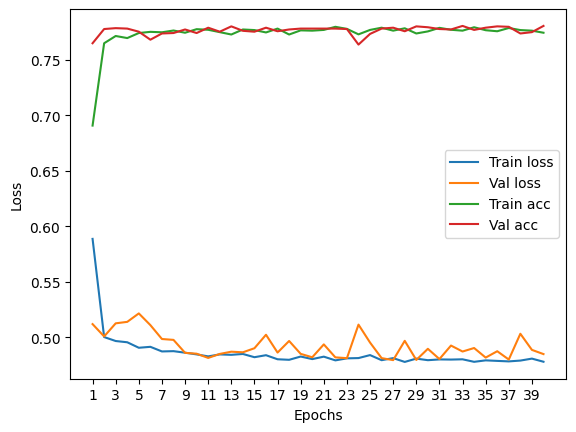

****************************************************************************************************



118it [00:00, 123.19it/s]


Train Epoch: 0 	Loss: 0.603221, Accuracy: 5221/7500 (70%)
Val Epoch: 0 	Loss: 0.532903, Accuracy: 1949/2500 (78%)



118it [00:01, 110.32it/s]


Train Epoch: 1 	Loss: 0.505971, Accuracy: 5724/7500 (76%)
Val Epoch: 1 	Loss: 0.507274, Accuracy: 1949/2500 (78%)



118it [00:00, 130.73it/s]


Train Epoch: 2 	Loss: 0.496438, Accuracy: 5791/7500 (77%)
Val Epoch: 2 	Loss: 0.499192, Accuracy: 1953/2500 (78%)



118it [00:00, 136.20it/s]


Train Epoch: 3 	Loss: 0.495441, Accuracy: 5781/7500 (77%)
Val Epoch: 3 	Loss: 0.501317, Accuracy: 1912/2500 (76%)



118it [00:00, 138.01it/s]


Train Epoch: 4 	Loss: 0.493010, Accuracy: 5797/7500 (77%)
Val Epoch: 4 	Loss: 0.501485, Accuracy: 1957/2500 (78%)



118it [00:00, 136.64it/s]


Train Epoch: 5 	Loss: 0.492983, Accuracy: 5802/7500 (77%)
Val Epoch: 5 	Loss: 0.514575, Accuracy: 1882/2500 (75%)



118it [00:00, 133.88it/s]


Train Epoch: 6 	Loss: 0.491594, Accuracy: 5807/7500 (77%)
Val Epoch: 6 	Loss: 0.497594, Accuracy: 1947/2500 (78%)



118it [00:00, 120.80it/s]


Train Epoch: 7 	Loss: 0.492772, Accuracy: 5787/7500 (77%)
Val Epoch: 7 	Loss: 0.490088, Accuracy: 1950/2500 (78%)



118it [00:00, 119.93it/s]


Train Epoch: 8 	Loss: 0.493862, Accuracy: 5796/7500 (77%)
Val Epoch: 8 	Loss: 0.501199, Accuracy: 1950/2500 (78%)



118it [00:00, 141.16it/s]


Train Epoch: 9 	Loss: 0.492325, Accuracy: 5802/7500 (77%)
Val Epoch: 9 	Loss: 0.492543, Accuracy: 1959/2500 (78%)



118it [00:00, 131.30it/s]


Train Epoch: 10 	Loss: 0.489471, Accuracy: 5816/7500 (78%)
Val Epoch: 10 	Loss: 0.496088, Accuracy: 1958/2500 (78%)



118it [00:00, 135.53it/s]


Train Epoch: 11 	Loss: 0.492967, Accuracy: 5772/7500 (77%)
Val Epoch: 11 	Loss: 0.499412, Accuracy: 1960/2500 (78%)



118it [00:00, 125.79it/s]


Train Epoch: 12 	Loss: 0.491232, Accuracy: 5801/7500 (77%)
Val Epoch: 12 	Loss: 0.500706, Accuracy: 1937/2500 (77%)



118it [00:00, 138.07it/s]


Train Epoch: 13 	Loss: 0.488462, Accuracy: 5805/7500 (77%)
Val Epoch: 13 	Loss: 0.504862, Accuracy: 1935/2500 (77%)



118it [00:00, 127.45it/s]


Train Epoch: 14 	Loss: 0.488175, Accuracy: 5798/7500 (77%)
Val Epoch: 14 	Loss: 0.513094, Accuracy: 1918/2500 (77%)



118it [00:00, 124.72it/s]


Train Epoch: 15 	Loss: 0.491019, Accuracy: 5813/7500 (78%)
Val Epoch: 15 	Loss: 0.498283, Accuracy: 1949/2500 (78%)



118it [00:00, 129.36it/s]


Train Epoch: 16 	Loss: 0.489815, Accuracy: 5800/7500 (77%)
Val Epoch: 16 	Loss: 0.488868, Accuracy: 1949/2500 (78%)



118it [00:00, 127.76it/s]


Train Epoch: 17 	Loss: 0.488193, Accuracy: 5803/7500 (77%)
Val Epoch: 17 	Loss: 0.501797, Accuracy: 1926/2500 (77%)



118it [00:00, 128.03it/s]


Train Epoch: 18 	Loss: 0.488962, Accuracy: 5795/7500 (77%)
Val Epoch: 18 	Loss: 0.508216, Accuracy: 1960/2500 (78%)



118it [00:00, 122.42it/s]


Train Epoch: 19 	Loss: 0.487787, Accuracy: 5806/7500 (77%)
Val Epoch: 19 	Loss: 0.495903, Accuracy: 1952/2500 (78%)



118it [00:01, 116.79it/s]


Train Epoch: 20 	Loss: 0.488867, Accuracy: 5828/7500 (78%)
Val Epoch: 20 	Loss: 0.490208, Accuracy: 1947/2500 (78%)



118it [00:01, 70.47it/s]


Train Epoch: 21 	Loss: 0.488724, Accuracy: 5809/7500 (77%)
Val Epoch: 21 	Loss: 0.495299, Accuracy: 1948/2500 (78%)



118it [00:01, 84.32it/s]


Train Epoch: 22 	Loss: 0.489684, Accuracy: 5803/7500 (77%)
Val Epoch: 22 	Loss: 0.501220, Accuracy: 1933/2500 (77%)



118it [00:00, 120.55it/s]


Train Epoch: 23 	Loss: 0.490982, Accuracy: 5781/7500 (77%)
Val Epoch: 23 	Loss: 0.501063, Accuracy: 1958/2500 (78%)



118it [00:00, 137.11it/s]


Train Epoch: 24 	Loss: 0.489902, Accuracy: 5800/7500 (77%)
Val Epoch: 24 	Loss: 0.510898, Accuracy: 1930/2500 (77%)



118it [00:01, 96.38it/s]


Train Epoch: 25 	Loss: 0.489754, Accuracy: 5822/7500 (78%)
Val Epoch: 25 	Loss: 0.494964, Accuracy: 1958/2500 (78%)



118it [00:00, 120.36it/s]


Train Epoch: 26 	Loss: 0.487271, Accuracy: 5801/7500 (77%)
Val Epoch: 26 	Loss: 0.501074, Accuracy: 1928/2500 (77%)



118it [00:00, 122.82it/s]


Train Epoch: 27 	Loss: 0.490320, Accuracy: 5815/7500 (78%)
Val Epoch: 27 	Loss: 0.489706, Accuracy: 1953/2500 (78%)



118it [00:00, 129.23it/s]


Train Epoch: 28 	Loss: 0.488327, Accuracy: 5794/7500 (77%)
Val Epoch: 28 	Loss: 0.486919, Accuracy: 1958/2500 (78%)



118it [00:01, 75.55it/s]


Train Epoch: 29 	Loss: 0.490331, Accuracy: 5811/7500 (77%)
Val Epoch: 29 	Loss: 0.497609, Accuracy: 1946/2500 (78%)



118it [00:01, 80.75it/s]


Train Epoch: 30 	Loss: 0.488107, Accuracy: 5803/7500 (77%)
Val Epoch: 30 	Loss: 0.490142, Accuracy: 1965/2500 (79%)



118it [00:01, 84.42it/s]


Train Epoch: 31 	Loss: 0.489565, Accuracy: 5810/7500 (77%)
Val Epoch: 31 	Loss: 0.507436, Accuracy: 1947/2500 (78%)



118it [00:00, 122.26it/s]


Train Epoch: 32 	Loss: 0.489058, Accuracy: 5785/7500 (77%)
Val Epoch: 32 	Loss: 0.505615, Accuracy: 1960/2500 (78%)



118it [00:00, 152.05it/s]


Train Epoch: 33 	Loss: 0.490743, Accuracy: 5797/7500 (77%)
Val Epoch: 33 	Loss: 0.491514, Accuracy: 1952/2500 (78%)



118it [00:00, 136.54it/s]


Train Epoch: 34 	Loss: 0.487328, Accuracy: 5807/7500 (77%)
Val Epoch: 34 	Loss: 0.489076, Accuracy: 1951/2500 (78%)



118it [00:00, 126.04it/s]


Train Epoch: 35 	Loss: 0.487880, Accuracy: 5807/7500 (77%)
Val Epoch: 35 	Loss: 0.514234, Accuracy: 1926/2500 (77%)



118it [00:00, 129.84it/s]


Train Epoch: 36 	Loss: 0.489041, Accuracy: 5801/7500 (77%)
Val Epoch: 36 	Loss: 0.490195, Accuracy: 1952/2500 (78%)



118it [00:00, 123.55it/s]


Train Epoch: 37 	Loss: 0.489045, Accuracy: 5809/7500 (77%)
Val Epoch: 37 	Loss: 0.492080, Accuracy: 1960/2500 (78%)



118it [00:00, 125.26it/s]


Train Epoch: 38 	Loss: 0.486868, Accuracy: 5816/7500 (78%)
Val Epoch: 38 	Loss: 0.506948, Accuracy: 1924/2500 (77%)



118it [00:00, 131.25it/s]


Train Epoch: 39 	Loss: 0.490831, Accuracy: 5812/7500 (77%)
Val Epoch: 39 	Loss: 0.507473, Accuracy: 1942/2500 (78%)

Test accuracy:  77.16


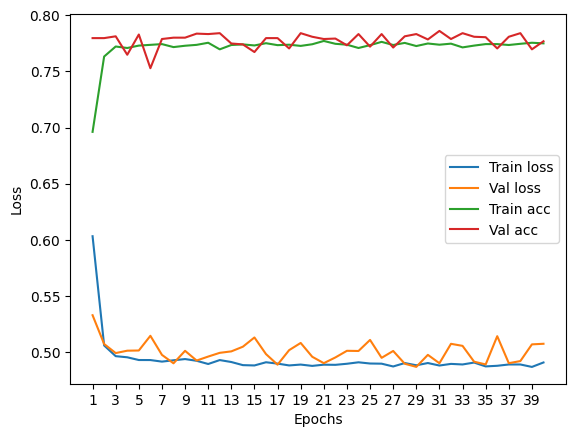

****************************************************************************************************



118it [00:00, 143.41it/s]


Train Epoch: 0 	Loss: 0.585793, Accuracy: 5299/7500 (71%)
Val Epoch: 0 	Loss: 0.512798, Accuracy: 1911/2500 (76%)



118it [00:00, 138.58it/s]


Train Epoch: 1 	Loss: 0.509171, Accuracy: 5695/7500 (76%)
Val Epoch: 1 	Loss: 0.510450, Accuracy: 1890/2500 (76%)



118it [00:00, 150.97it/s]


Train Epoch: 2 	Loss: 0.503356, Accuracy: 5729/7500 (76%)
Val Epoch: 2 	Loss: 0.484680, Accuracy: 1937/2500 (77%)



118it [00:00, 141.92it/s]


Train Epoch: 3 	Loss: 0.500503, Accuracy: 5731/7500 (76%)
Val Epoch: 3 	Loss: 0.489324, Accuracy: 1948/2500 (78%)



118it [00:00, 132.08it/s]


Train Epoch: 4 	Loss: 0.498147, Accuracy: 5762/7500 (77%)
Val Epoch: 4 	Loss: 0.477397, Accuracy: 1957/2500 (78%)



118it [00:00, 132.81it/s]


Train Epoch: 5 	Loss: 0.499782, Accuracy: 5755/7500 (77%)
Val Epoch: 5 	Loss: 0.494672, Accuracy: 1919/2500 (77%)



118it [00:00, 132.00it/s]


Train Epoch: 6 	Loss: 0.494367, Accuracy: 5755/7500 (77%)
Val Epoch: 6 	Loss: 0.481427, Accuracy: 1943/2500 (78%)



118it [00:00, 141.42it/s]


Train Epoch: 7 	Loss: 0.495580, Accuracy: 5798/7500 (77%)
Val Epoch: 7 	Loss: 0.482236, Accuracy: 1945/2500 (78%)



118it [00:00, 146.13it/s]


Train Epoch: 8 	Loss: 0.493889, Accuracy: 5769/7500 (77%)
Val Epoch: 8 	Loss: 0.488031, Accuracy: 1947/2500 (78%)



118it [00:00, 129.50it/s]


Train Epoch: 9 	Loss: 0.492740, Accuracy: 5766/7500 (77%)
Val Epoch: 9 	Loss: 0.475673, Accuracy: 1954/2500 (78%)



118it [00:00, 134.58it/s]


Train Epoch: 10 	Loss: 0.494986, Accuracy: 5767/7500 (77%)
Val Epoch: 10 	Loss: 0.483270, Accuracy: 1943/2500 (78%)



118it [00:00, 171.99it/s]


Train Epoch: 11 	Loss: 0.493881, Accuracy: 5789/7500 (77%)
Val Epoch: 11 	Loss: 0.503133, Accuracy: 1946/2500 (78%)



118it [00:00, 142.37it/s]


Train Epoch: 12 	Loss: 0.493282, Accuracy: 5761/7500 (77%)
Val Epoch: 12 	Loss: 0.499015, Accuracy: 1943/2500 (78%)



118it [00:00, 126.06it/s]


Train Epoch: 13 	Loss: 0.493571, Accuracy: 5770/7500 (77%)
Val Epoch: 13 	Loss: 0.478197, Accuracy: 1951/2500 (78%)



118it [00:00, 139.45it/s]


Train Epoch: 14 	Loss: 0.492084, Accuracy: 5752/7500 (77%)
Val Epoch: 14 	Loss: 0.485153, Accuracy: 1954/2500 (78%)



118it [00:00, 146.19it/s]


Train Epoch: 15 	Loss: 0.492961, Accuracy: 5756/7500 (77%)
Val Epoch: 15 	Loss: 0.472357, Accuracy: 1950/2500 (78%)



118it [00:00, 139.50it/s]


Train Epoch: 16 	Loss: 0.492472, Accuracy: 5789/7500 (77%)
Val Epoch: 16 	Loss: 0.484809, Accuracy: 1950/2500 (78%)



118it [00:00, 158.52it/s]


Train Epoch: 17 	Loss: 0.492236, Accuracy: 5771/7500 (77%)
Val Epoch: 17 	Loss: 0.474761, Accuracy: 1949/2500 (78%)



118it [00:00, 148.60it/s]


Train Epoch: 18 	Loss: 0.489712, Accuracy: 5788/7500 (77%)
Val Epoch: 18 	Loss: 0.478735, Accuracy: 1951/2500 (78%)



118it [00:00, 150.59it/s]


Train Epoch: 19 	Loss: 0.492790, Accuracy: 5767/7500 (77%)
Val Epoch: 19 	Loss: 0.484252, Accuracy: 1956/2500 (78%)



118it [00:00, 134.44it/s]


Train Epoch: 20 	Loss: 0.493061, Accuracy: 5789/7500 (77%)
Val Epoch: 20 	Loss: 0.474741, Accuracy: 1947/2500 (78%)



118it [00:00, 131.00it/s]


Train Epoch: 21 	Loss: 0.492237, Accuracy: 5789/7500 (77%)
Val Epoch: 21 	Loss: 0.486706, Accuracy: 1948/2500 (78%)



118it [00:00, 132.17it/s]


Train Epoch: 22 	Loss: 0.492111, Accuracy: 5788/7500 (77%)
Val Epoch: 22 	Loss: 0.477037, Accuracy: 1947/2500 (78%)



118it [00:00, 126.06it/s]


Train Epoch: 23 	Loss: 0.491737, Accuracy: 5776/7500 (77%)
Val Epoch: 23 	Loss: 0.477176, Accuracy: 1945/2500 (78%)



118it [00:00, 140.10it/s]


Train Epoch: 24 	Loss: 0.493310, Accuracy: 5772/7500 (77%)
Val Epoch: 24 	Loss: 0.487062, Accuracy: 1949/2500 (78%)



118it [00:00, 132.39it/s]


Train Epoch: 25 	Loss: 0.490203, Accuracy: 5809/7500 (77%)
Val Epoch: 25 	Loss: 0.488773, Accuracy: 1949/2500 (78%)



118it [00:00, 120.62it/s]


Train Epoch: 26 	Loss: 0.491658, Accuracy: 5773/7500 (77%)
Val Epoch: 26 	Loss: 0.476869, Accuracy: 1954/2500 (78%)



118it [00:00, 139.55it/s]


Train Epoch: 27 	Loss: 0.490490, Accuracy: 5781/7500 (77%)
Val Epoch: 27 	Loss: 0.476439, Accuracy: 1952/2500 (78%)



118it [00:00, 137.88it/s]


Train Epoch: 28 	Loss: 0.491573, Accuracy: 5777/7500 (77%)
Val Epoch: 28 	Loss: 0.484660, Accuracy: 1947/2500 (78%)



118it [00:00, 139.69it/s]


Train Epoch: 29 	Loss: 0.491012, Accuracy: 5764/7500 (77%)
Val Epoch: 29 	Loss: 0.477337, Accuracy: 1950/2500 (78%)



118it [00:00, 138.97it/s]


Train Epoch: 30 	Loss: 0.489885, Accuracy: 5759/7500 (77%)
Val Epoch: 30 	Loss: 0.474759, Accuracy: 1952/2500 (78%)



118it [00:00, 150.52it/s]


Train Epoch: 31 	Loss: 0.490524, Accuracy: 5784/7500 (77%)
Val Epoch: 31 	Loss: 0.474032, Accuracy: 1950/2500 (78%)



118it [00:00, 148.04it/s]


Train Epoch: 32 	Loss: 0.489135, Accuracy: 5783/7500 (77%)
Val Epoch: 32 	Loss: 0.476445, Accuracy: 1951/2500 (78%)



118it [00:00, 147.98it/s]


Train Epoch: 33 	Loss: 0.489527, Accuracy: 5782/7500 (77%)
Val Epoch: 33 	Loss: 0.496502, Accuracy: 1943/2500 (78%)



118it [00:00, 139.77it/s]


Train Epoch: 34 	Loss: 0.491440, Accuracy: 5781/7500 (77%)
Val Epoch: 34 	Loss: 0.474253, Accuracy: 1954/2500 (78%)



118it [00:00, 157.25it/s]


Train Epoch: 35 	Loss: 0.490163, Accuracy: 5761/7500 (77%)
Val Epoch: 35 	Loss: 0.485383, Accuracy: 1949/2500 (78%)



118it [00:00, 150.76it/s]


Train Epoch: 36 	Loss: 0.490403, Accuracy: 5788/7500 (77%)
Val Epoch: 36 	Loss: 0.476746, Accuracy: 1948/2500 (78%)



118it [00:00, 132.19it/s]


Train Epoch: 37 	Loss: 0.489134, Accuracy: 5771/7500 (77%)
Val Epoch: 37 	Loss: 0.485769, Accuracy: 1956/2500 (78%)



118it [00:00, 134.57it/s]


Train Epoch: 38 	Loss: 0.488497, Accuracy: 5769/7500 (77%)
Val Epoch: 38 	Loss: 0.485539, Accuracy: 1950/2500 (78%)



118it [00:00, 142.49it/s]


Train Epoch: 39 	Loss: 0.489772, Accuracy: 5783/7500 (77%)
Val Epoch: 39 	Loss: 0.477296, Accuracy: 1949/2500 (78%)

Test accuracy:  76.88000000000001


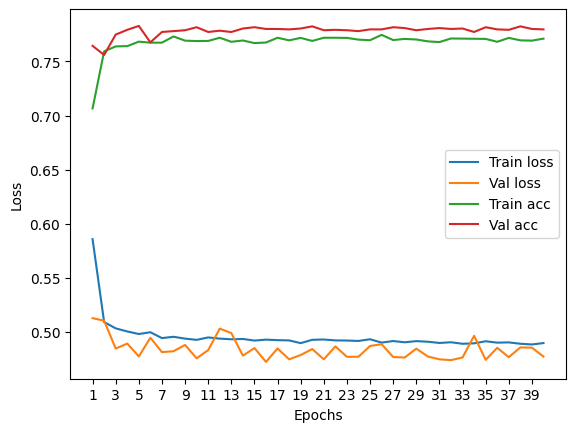

****************************************************************************************************



118it [00:00, 132.42it/s]


Train Epoch: 0 	Loss: 0.578374, Accuracy: 5333/7500 (71%)
Val Epoch: 0 	Loss: 0.501875, Accuracy: 1934/2500 (77%)



118it [00:01, 107.51it/s]


Train Epoch: 1 	Loss: 0.508696, Accuracy: 5732/7500 (76%)
Val Epoch: 1 	Loss: 0.503735, Accuracy: 1951/2500 (78%)



118it [00:01, 115.86it/s]


Train Epoch: 2 	Loss: 0.500352, Accuracy: 5736/7500 (76%)
Val Epoch: 2 	Loss: 0.492953, Accuracy: 1960/2500 (78%)



118it [00:00, 144.83it/s]


Train Epoch: 3 	Loss: 0.496689, Accuracy: 5751/7500 (77%)
Val Epoch: 3 	Loss: 0.487217, Accuracy: 1969/2500 (79%)



118it [00:00, 136.20it/s]


Train Epoch: 4 	Loss: 0.492301, Accuracy: 5778/7500 (77%)
Val Epoch: 4 	Loss: 0.497273, Accuracy: 1964/2500 (79%)



118it [00:00, 132.73it/s]


Train Epoch: 5 	Loss: 0.493222, Accuracy: 5771/7500 (77%)
Val Epoch: 5 	Loss: 0.499077, Accuracy: 1939/2500 (78%)



118it [00:01, 83.73it/s]


Train Epoch: 6 	Loss: 0.491760, Accuracy: 5766/7500 (77%)
Val Epoch: 6 	Loss: 0.492654, Accuracy: 1956/2500 (78%)



118it [00:01, 109.99it/s]


Train Epoch: 7 	Loss: 0.490488, Accuracy: 5755/7500 (77%)
Val Epoch: 7 	Loss: 0.497899, Accuracy: 1956/2500 (78%)



118it [00:01, 105.41it/s]


Train Epoch: 8 	Loss: 0.491640, Accuracy: 5791/7500 (77%)
Val Epoch: 8 	Loss: 0.490272, Accuracy: 1962/2500 (78%)



118it [00:01, 112.15it/s]


Train Epoch: 9 	Loss: 0.490899, Accuracy: 5794/7500 (77%)
Val Epoch: 9 	Loss: 0.490298, Accuracy: 1957/2500 (78%)



118it [00:00, 141.79it/s]


Train Epoch: 10 	Loss: 0.489639, Accuracy: 5790/7500 (77%)
Val Epoch: 10 	Loss: 0.498616, Accuracy: 1969/2500 (79%)



118it [00:00, 144.84it/s]


Train Epoch: 11 	Loss: 0.490551, Accuracy: 5802/7500 (77%)
Val Epoch: 11 	Loss: 0.490839, Accuracy: 1965/2500 (79%)



118it [00:00, 131.88it/s]


Train Epoch: 12 	Loss: 0.490080, Accuracy: 5769/7500 (77%)
Val Epoch: 12 	Loss: 0.482982, Accuracy: 1969/2500 (79%)



118it [00:00, 147.45it/s]


Train Epoch: 13 	Loss: 0.489960, Accuracy: 5804/7500 (77%)
Val Epoch: 13 	Loss: 0.488871, Accuracy: 1961/2500 (78%)



118it [00:00, 131.61it/s]


Train Epoch: 14 	Loss: 0.489912, Accuracy: 5789/7500 (77%)
Val Epoch: 14 	Loss: 0.490319, Accuracy: 1963/2500 (79%)



118it [00:00, 123.24it/s]


Train Epoch: 15 	Loss: 0.488307, Accuracy: 5789/7500 (77%)
Val Epoch: 15 	Loss: 0.487590, Accuracy: 1960/2500 (78%)



118it [00:01, 105.93it/s]


Train Epoch: 16 	Loss: 0.489643, Accuracy: 5787/7500 (77%)
Val Epoch: 16 	Loss: 0.502498, Accuracy: 1959/2500 (78%)



118it [00:02, 44.27it/s]


Train Epoch: 17 	Loss: 0.488184, Accuracy: 5787/7500 (77%)
Val Epoch: 17 	Loss: 0.503319, Accuracy: 1943/2500 (78%)



118it [00:02, 42.99it/s]


Train Epoch: 18 	Loss: 0.490094, Accuracy: 5768/7500 (77%)
Val Epoch: 18 	Loss: 0.496302, Accuracy: 1961/2500 (78%)



118it [00:02, 54.15it/s]


Train Epoch: 19 	Loss: 0.488720, Accuracy: 5797/7500 (77%)
Val Epoch: 19 	Loss: 0.484444, Accuracy: 1956/2500 (78%)



118it [00:01, 67.81it/s]


Train Epoch: 20 	Loss: 0.488397, Accuracy: 5794/7500 (77%)
Val Epoch: 20 	Loss: 0.489032, Accuracy: 1971/2500 (79%)



118it [00:02, 49.28it/s]


Train Epoch: 21 	Loss: 0.488408, Accuracy: 5792/7500 (77%)
Val Epoch: 21 	Loss: 0.486084, Accuracy: 1963/2500 (79%)



118it [00:02, 45.15it/s]


Train Epoch: 22 	Loss: 0.487436, Accuracy: 5799/7500 (77%)
Val Epoch: 22 	Loss: 0.492965, Accuracy: 1962/2500 (78%)



118it [00:01, 110.89it/s]


Train Epoch: 23 	Loss: 0.491638, Accuracy: 5758/7500 (77%)
Val Epoch: 23 	Loss: 0.483318, Accuracy: 1967/2500 (79%)



118it [00:01, 114.11it/s]


Train Epoch: 24 	Loss: 0.488757, Accuracy: 5785/7500 (77%)
Val Epoch: 24 	Loss: 0.485423, Accuracy: 1966/2500 (79%)



118it [00:00, 152.52it/s]


Train Epoch: 25 	Loss: 0.489610, Accuracy: 5800/7500 (77%)
Val Epoch: 25 	Loss: 0.491830, Accuracy: 1966/2500 (79%)



118it [00:00, 122.52it/s]


Train Epoch: 26 	Loss: 0.487957, Accuracy: 5791/7500 (77%)
Val Epoch: 26 	Loss: 0.485697, Accuracy: 1954/2500 (78%)



118it [00:00, 133.72it/s]


Train Epoch: 27 	Loss: 0.489744, Accuracy: 5785/7500 (77%)
Val Epoch: 27 	Loss: 0.499247, Accuracy: 1956/2500 (78%)



118it [00:00, 131.60it/s]


Train Epoch: 28 	Loss: 0.489358, Accuracy: 5813/7500 (78%)
Val Epoch: 28 	Loss: 0.485279, Accuracy: 1963/2500 (79%)



118it [00:00, 121.25it/s]


Train Epoch: 29 	Loss: 0.488256, Accuracy: 5804/7500 (77%)
Val Epoch: 29 	Loss: 0.495634, Accuracy: 1949/2500 (78%)



118it [00:00, 136.84it/s]


Train Epoch: 30 	Loss: 0.489777, Accuracy: 5783/7500 (77%)
Val Epoch: 30 	Loss: 0.518551, Accuracy: 1964/2500 (79%)



118it [00:00, 123.90it/s]


Train Epoch: 31 	Loss: 0.487702, Accuracy: 5791/7500 (77%)
Val Epoch: 31 	Loss: 0.498500, Accuracy: 1960/2500 (78%)



118it [00:00, 126.84it/s]


Train Epoch: 32 	Loss: 0.489405, Accuracy: 5766/7500 (77%)
Val Epoch: 32 	Loss: 0.504669, Accuracy: 1947/2500 (78%)



118it [00:00, 138.50it/s]


Train Epoch: 33 	Loss: 0.485735, Accuracy: 5824/7500 (78%)
Val Epoch: 33 	Loss: 0.491201, Accuracy: 1949/2500 (78%)



118it [00:00, 138.18it/s]


Train Epoch: 34 	Loss: 0.487294, Accuracy: 5803/7500 (77%)
Val Epoch: 34 	Loss: 0.501029, Accuracy: 1957/2500 (78%)



118it [00:00, 136.12it/s]


Train Epoch: 35 	Loss: 0.487048, Accuracy: 5805/7500 (77%)
Val Epoch: 35 	Loss: 0.489378, Accuracy: 1959/2500 (78%)



118it [00:01, 117.40it/s]


Train Epoch: 36 	Loss: 0.487029, Accuracy: 5809/7500 (77%)
Val Epoch: 36 	Loss: 0.493524, Accuracy: 1956/2500 (78%)



118it [00:00, 127.28it/s]


Train Epoch: 37 	Loss: 0.490466, Accuracy: 5786/7500 (77%)
Val Epoch: 37 	Loss: 0.492278, Accuracy: 1973/2500 (79%)



118it [00:00, 144.33it/s]


Train Epoch: 38 	Loss: 0.486196, Accuracy: 5800/7500 (77%)
Val Epoch: 38 	Loss: 0.483465, Accuracy: 1962/2500 (78%)



118it [00:00, 129.86it/s]


Train Epoch: 39 	Loss: 0.487868, Accuracy: 5786/7500 (77%)
Val Epoch: 39 	Loss: 0.489682, Accuracy: 1959/2500 (78%)

Test accuracy:  75.8


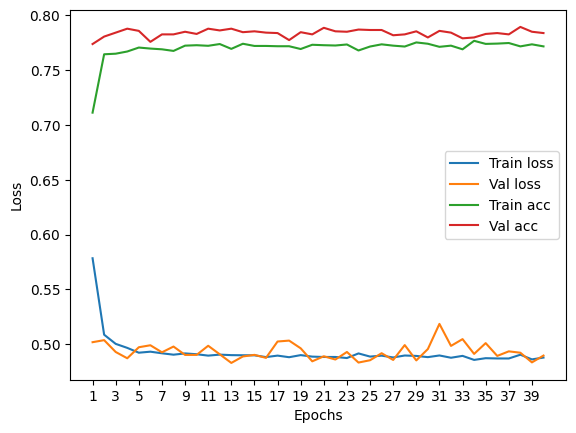

****************************************************************************************************



118it [00:00, 132.29it/s]


Train Epoch: 0 	Loss: 0.593604, Accuracy: 5144/7500 (69%)
Val Epoch: 0 	Loss: 0.528366, Accuracy: 1922/2500 (77%)



118it [00:00, 139.63it/s]


Train Epoch: 1 	Loss: 0.519037, Accuracy: 5663/7500 (76%)
Val Epoch: 1 	Loss: 0.507987, Accuracy: 1913/2500 (77%)



118it [00:00, 128.99it/s]


Train Epoch: 2 	Loss: 0.510109, Accuracy: 5724/7500 (76%)
Val Epoch: 2 	Loss: 0.495906, Accuracy: 1925/2500 (77%)



118it [00:00, 147.70it/s]


Train Epoch: 3 	Loss: 0.511021, Accuracy: 5725/7500 (76%)
Val Epoch: 3 	Loss: 0.507166, Accuracy: 1915/2500 (77%)



118it [00:00, 144.81it/s]


Train Epoch: 4 	Loss: 0.508103, Accuracy: 5749/7500 (77%)
Val Epoch: 4 	Loss: 0.496460, Accuracy: 1938/2500 (78%)



118it [00:00, 150.61it/s]


Train Epoch: 5 	Loss: 0.503321, Accuracy: 5746/7500 (77%)
Val Epoch: 5 	Loss: 0.507132, Accuracy: 1939/2500 (78%)



118it [00:00, 160.47it/s]


Train Epoch: 6 	Loss: 0.500573, Accuracy: 5763/7500 (77%)
Val Epoch: 6 	Loss: 0.489399, Accuracy: 1942/2500 (78%)



118it [00:00, 137.22it/s]


Train Epoch: 7 	Loss: 0.503697, Accuracy: 5730/7500 (76%)
Val Epoch: 7 	Loss: 0.495970, Accuracy: 1949/2500 (78%)



118it [00:00, 129.69it/s]


Train Epoch: 8 	Loss: 0.502913, Accuracy: 5744/7500 (77%)
Val Epoch: 8 	Loss: 0.489397, Accuracy: 1946/2500 (78%)



118it [00:00, 131.92it/s]


Train Epoch: 9 	Loss: 0.499978, Accuracy: 5732/7500 (76%)
Val Epoch: 9 	Loss: 0.494570, Accuracy: 1945/2500 (78%)



118it [00:00, 139.73it/s]


Train Epoch: 10 	Loss: 0.500506, Accuracy: 5754/7500 (77%)
Val Epoch: 10 	Loss: 0.487932, Accuracy: 1949/2500 (78%)



118it [00:00, 150.88it/s]


Train Epoch: 11 	Loss: 0.501125, Accuracy: 5740/7500 (77%)
Val Epoch: 11 	Loss: 0.498084, Accuracy: 1953/2500 (78%)



118it [00:00, 139.58it/s]


Train Epoch: 12 	Loss: 0.500916, Accuracy: 5738/7500 (77%)
Val Epoch: 12 	Loss: 0.488391, Accuracy: 1942/2500 (78%)



118it [00:00, 150.87it/s]


Train Epoch: 13 	Loss: 0.501507, Accuracy: 5758/7500 (77%)
Val Epoch: 13 	Loss: 0.491564, Accuracy: 1940/2500 (78%)



118it [00:00, 139.75it/s]


Train Epoch: 14 	Loss: 0.499735, Accuracy: 5754/7500 (77%)
Val Epoch: 14 	Loss: 0.490369, Accuracy: 1936/2500 (77%)



118it [00:00, 130.15it/s]


Train Epoch: 15 	Loss: 0.501050, Accuracy: 5741/7500 (77%)
Val Epoch: 15 	Loss: 0.496405, Accuracy: 1950/2500 (78%)



118it [00:00, 131.90it/s]


Train Epoch: 16 	Loss: 0.499653, Accuracy: 5741/7500 (77%)
Val Epoch: 16 	Loss: 0.498221, Accuracy: 1949/2500 (78%)



118it [00:00, 125.01it/s]


Train Epoch: 17 	Loss: 0.499869, Accuracy: 5745/7500 (77%)
Val Epoch: 17 	Loss: 0.499704, Accuracy: 1942/2500 (78%)



118it [00:00, 145.05it/s]


Train Epoch: 18 	Loss: 0.500461, Accuracy: 5732/7500 (76%)
Val Epoch: 18 	Loss: 0.489963, Accuracy: 1949/2500 (78%)



118it [00:00, 128.29it/s]


Train Epoch: 19 	Loss: 0.499205, Accuracy: 5763/7500 (77%)
Val Epoch: 19 	Loss: 0.496733, Accuracy: 1946/2500 (78%)



118it [00:00, 145.10it/s]


Train Epoch: 20 	Loss: 0.496771, Accuracy: 5764/7500 (77%)
Val Epoch: 20 	Loss: 0.497038, Accuracy: 1949/2500 (78%)



118it [00:00, 125.61it/s]


Train Epoch: 21 	Loss: 0.499606, Accuracy: 5761/7500 (77%)
Val Epoch: 21 	Loss: 0.492113, Accuracy: 1939/2500 (78%)



118it [00:01, 117.34it/s]


Train Epoch: 22 	Loss: 0.498085, Accuracy: 5760/7500 (77%)
Val Epoch: 22 	Loss: 0.500431, Accuracy: 1946/2500 (78%)



118it [00:00, 136.95it/s]


Train Epoch: 23 	Loss: 0.497161, Accuracy: 5758/7500 (77%)
Val Epoch: 23 	Loss: 0.489026, Accuracy: 1938/2500 (78%)



118it [00:00, 129.51it/s]


Train Epoch: 24 	Loss: 0.496020, Accuracy: 5741/7500 (77%)
Val Epoch: 24 	Loss: 0.489500, Accuracy: 1939/2500 (78%)



118it [00:00, 123.27it/s]


Train Epoch: 25 	Loss: 0.498485, Accuracy: 5753/7500 (77%)
Val Epoch: 25 	Loss: 0.500196, Accuracy: 1938/2500 (78%)



118it [00:00, 119.54it/s]


Train Epoch: 26 	Loss: 0.499138, Accuracy: 5747/7500 (77%)
Val Epoch: 26 	Loss: 0.485047, Accuracy: 1951/2500 (78%)



118it [00:00, 144.84it/s]


Train Epoch: 27 	Loss: 0.496638, Accuracy: 5754/7500 (77%)
Val Epoch: 27 	Loss: 0.488469, Accuracy: 1938/2500 (78%)



118it [00:00, 124.76it/s]


Train Epoch: 28 	Loss: 0.497057, Accuracy: 5773/7500 (77%)
Val Epoch: 28 	Loss: 0.493011, Accuracy: 1934/2500 (77%)



118it [00:00, 129.88it/s]


Train Epoch: 29 	Loss: 0.498068, Accuracy: 5747/7500 (77%)
Val Epoch: 29 	Loss: 0.490201, Accuracy: 1948/2500 (78%)



118it [00:00, 131.80it/s]


Train Epoch: 30 	Loss: 0.497340, Accuracy: 5749/7500 (77%)
Val Epoch: 30 	Loss: 0.490513, Accuracy: 1954/2500 (78%)



118it [00:00, 136.99it/s]


Train Epoch: 31 	Loss: 0.498865, Accuracy: 5755/7500 (77%)
Val Epoch: 31 	Loss: 0.506463, Accuracy: 1941/2500 (78%)



118it [00:00, 129.56it/s]


Train Epoch: 32 	Loss: 0.496553, Accuracy: 5737/7500 (76%)
Val Epoch: 32 	Loss: 0.493853, Accuracy: 1944/2500 (78%)



118it [00:00, 127.91it/s]


Train Epoch: 33 	Loss: 0.495153, Accuracy: 5754/7500 (77%)
Val Epoch: 33 	Loss: 0.501181, Accuracy: 1953/2500 (78%)



118it [00:01, 114.87it/s]


Train Epoch: 34 	Loss: 0.496696, Accuracy: 5759/7500 (77%)
Val Epoch: 34 	Loss: 0.487934, Accuracy: 1940/2500 (78%)



118it [00:00, 129.60it/s]


Train Epoch: 35 	Loss: 0.494171, Accuracy: 5744/7500 (77%)
Val Epoch: 35 	Loss: 0.495299, Accuracy: 1931/2500 (77%)



118it [00:00, 156.31it/s]


Train Epoch: 36 	Loss: 0.495416, Accuracy: 5752/7500 (77%)
Val Epoch: 36 	Loss: 0.489149, Accuracy: 1936/2500 (77%)



118it [00:00, 134.33it/s]


Train Epoch: 37 	Loss: 0.496784, Accuracy: 5760/7500 (77%)
Val Epoch: 37 	Loss: 0.495099, Accuracy: 1945/2500 (78%)



118it [00:00, 136.89it/s]


Train Epoch: 38 	Loss: 0.494723, Accuracy: 5737/7500 (76%)
Val Epoch: 38 	Loss: 0.483553, Accuracy: 1945/2500 (78%)



118it [00:00, 137.82it/s]


Train Epoch: 39 	Loss: 0.497016, Accuracy: 5765/7500 (77%)
Val Epoch: 39 	Loss: 0.486019, Accuracy: 1941/2500 (78%)

Test accuracy:  78.03999999999999


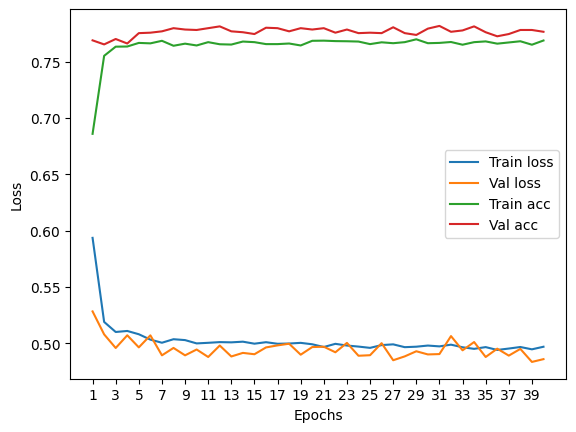

****************************************************************************************************



116it [00:01, 113.33it/s]


Train Epoch: 0 	Loss: 0.594061, Accuracy: 5166/7422 (70%)
Val Epoch: 0 	Loss: 0.529664, Accuracy: 1852/2474 (75%)



116it [00:00, 130.65it/s]


Train Epoch: 1 	Loss: 0.513344, Accuracy: 5612/7422 (76%)
Val Epoch: 1 	Loss: 0.512354, Accuracy: 1886/2474 (76%)



116it [00:01, 110.58it/s]


Train Epoch: 2 	Loss: 0.501229, Accuracy: 5697/7422 (77%)
Val Epoch: 2 	Loss: 0.513180, Accuracy: 1881/2474 (76%)



116it [00:01, 107.38it/s]


Train Epoch: 3 	Loss: 0.497921, Accuracy: 5672/7422 (76%)
Val Epoch: 3 	Loss: 0.504912, Accuracy: 1893/2474 (77%)



116it [00:00, 119.13it/s]


Train Epoch: 4 	Loss: 0.496319, Accuracy: 5702/7422 (77%)
Val Epoch: 4 	Loss: 0.508251, Accuracy: 1870/2474 (76%)



116it [00:00, 127.47it/s]


Train Epoch: 5 	Loss: 0.492906, Accuracy: 5680/7422 (77%)
Val Epoch: 5 	Loss: 0.501848, Accuracy: 1888/2474 (76%)



116it [00:00, 134.02it/s]


Train Epoch: 6 	Loss: 0.494041, Accuracy: 5690/7422 (77%)
Val Epoch: 6 	Loss: 0.503748, Accuracy: 1886/2474 (76%)



116it [00:01, 114.83it/s]


Train Epoch: 7 	Loss: 0.492766, Accuracy: 5678/7422 (77%)
Val Epoch: 7 	Loss: 0.518829, Accuracy: 1851/2474 (75%)



116it [00:00, 117.58it/s]


Train Epoch: 8 	Loss: 0.489376, Accuracy: 5703/7422 (77%)
Val Epoch: 8 	Loss: 0.508529, Accuracy: 1876/2474 (76%)



116it [00:00, 121.32it/s]


Train Epoch: 9 	Loss: 0.491488, Accuracy: 5699/7422 (77%)
Val Epoch: 9 	Loss: 0.503970, Accuracy: 1884/2474 (76%)



116it [00:00, 125.78it/s]


Train Epoch: 10 	Loss: 0.488968, Accuracy: 5705/7422 (77%)
Val Epoch: 10 	Loss: 0.502271, Accuracy: 1894/2474 (77%)



116it [00:00, 134.57it/s]


Train Epoch: 11 	Loss: 0.488411, Accuracy: 5719/7422 (77%)
Val Epoch: 11 	Loss: 0.503117, Accuracy: 1889/2474 (76%)



116it [00:00, 116.81it/s]


Train Epoch: 12 	Loss: 0.489675, Accuracy: 5704/7422 (77%)
Val Epoch: 12 	Loss: 0.504710, Accuracy: 1888/2474 (76%)



116it [00:00, 156.15it/s]


Train Epoch: 13 	Loss: 0.487721, Accuracy: 5686/7422 (77%)
Val Epoch: 13 	Loss: 0.505299, Accuracy: 1890/2474 (76%)



116it [00:00, 137.78it/s]


Train Epoch: 14 	Loss: 0.488757, Accuracy: 5711/7422 (77%)
Val Epoch: 14 	Loss: 0.501041, Accuracy: 1902/2474 (77%)



116it [00:00, 156.99it/s]


Train Epoch: 15 	Loss: 0.488070, Accuracy: 5712/7422 (77%)
Val Epoch: 15 	Loss: 0.503694, Accuracy: 1888/2474 (76%)



116it [00:00, 157.12it/s]


Train Epoch: 16 	Loss: 0.489705, Accuracy: 5688/7422 (77%)
Val Epoch: 16 	Loss: 0.505661, Accuracy: 1881/2474 (76%)



116it [00:00, 134.68it/s]


Train Epoch: 17 	Loss: 0.487642, Accuracy: 5718/7422 (77%)
Val Epoch: 17 	Loss: 0.502855, Accuracy: 1885/2474 (76%)



116it [00:00, 134.40it/s]


Train Epoch: 18 	Loss: 0.489531, Accuracy: 5704/7422 (77%)
Val Epoch: 18 	Loss: 0.503103, Accuracy: 1889/2474 (76%)



116it [00:00, 165.00it/s]


Train Epoch: 19 	Loss: 0.487337, Accuracy: 5720/7422 (77%)
Val Epoch: 19 	Loss: 0.502337, Accuracy: 1890/2474 (76%)



116it [00:00, 139.90it/s]


Train Epoch: 20 	Loss: 0.487224, Accuracy: 5697/7422 (77%)
Val Epoch: 20 	Loss: 0.504171, Accuracy: 1892/2474 (76%)



116it [00:01, 113.19it/s]


Train Epoch: 21 	Loss: 0.487276, Accuracy: 5727/7422 (77%)
Val Epoch: 21 	Loss: 0.506324, Accuracy: 1887/2474 (76%)



116it [00:00, 132.00it/s]


Train Epoch: 22 	Loss: 0.488755, Accuracy: 5701/7422 (77%)
Val Epoch: 22 	Loss: 0.505021, Accuracy: 1895/2474 (77%)



116it [00:00, 144.04it/s]


Train Epoch: 23 	Loss: 0.486988, Accuracy: 5704/7422 (77%)
Val Epoch: 23 	Loss: 0.504335, Accuracy: 1894/2474 (77%)



116it [00:00, 147.23it/s]


Train Epoch: 24 	Loss: 0.488088, Accuracy: 5704/7422 (77%)
Val Epoch: 24 	Loss: 0.502907, Accuracy: 1880/2474 (76%)



116it [00:00, 136.93it/s]


Train Epoch: 25 	Loss: 0.487518, Accuracy: 5698/7422 (77%)
Val Epoch: 25 	Loss: 0.503945, Accuracy: 1885/2474 (76%)



116it [00:00, 137.92it/s]


Train Epoch: 26 	Loss: 0.488401, Accuracy: 5710/7422 (77%)
Val Epoch: 26 	Loss: 0.506308, Accuracy: 1883/2474 (76%)



116it [00:01, 92.02it/s]


Train Epoch: 27 	Loss: 0.489397, Accuracy: 5742/7422 (77%)
Val Epoch: 27 	Loss: 0.501942, Accuracy: 1893/2474 (77%)



116it [00:01, 71.64it/s]


Train Epoch: 28 	Loss: 0.486749, Accuracy: 5717/7422 (77%)
Val Epoch: 28 	Loss: 0.503612, Accuracy: 1883/2474 (76%)



116it [00:01, 79.25it/s]


Train Epoch: 29 	Loss: 0.488169, Accuracy: 5707/7422 (77%)
Val Epoch: 29 	Loss: 0.503561, Accuracy: 1902/2474 (77%)



116it [00:00, 125.73it/s]


Train Epoch: 30 	Loss: 0.487566, Accuracy: 5723/7422 (77%)
Val Epoch: 30 	Loss: 0.506072, Accuracy: 1895/2474 (77%)



116it [00:00, 130.58it/s]


Train Epoch: 31 	Loss: 0.487867, Accuracy: 5716/7422 (77%)
Val Epoch: 31 	Loss: 0.505189, Accuracy: 1900/2474 (77%)



116it [00:01, 93.78it/s]


Train Epoch: 32 	Loss: 0.486775, Accuracy: 5719/7422 (77%)
Val Epoch: 32 	Loss: 0.503476, Accuracy: 1893/2474 (77%)



116it [00:01, 93.56it/s]


Train Epoch: 33 	Loss: 0.487565, Accuracy: 5708/7422 (77%)
Val Epoch: 33 	Loss: 0.507309, Accuracy: 1880/2474 (76%)



116it [00:01, 77.92it/s]


Train Epoch: 34 	Loss: 0.487480, Accuracy: 5706/7422 (77%)
Val Epoch: 34 	Loss: 0.504239, Accuracy: 1898/2474 (77%)



116it [00:01, 104.48it/s]


Train Epoch: 35 	Loss: 0.487281, Accuracy: 5699/7422 (77%)
Val Epoch: 35 	Loss: 0.504847, Accuracy: 1883/2474 (76%)



116it [00:01, 87.17it/s]


Train Epoch: 36 	Loss: 0.488250, Accuracy: 5705/7422 (77%)
Val Epoch: 36 	Loss: 0.508197, Accuracy: 1885/2474 (76%)



116it [00:01, 86.11it/s]


Train Epoch: 37 	Loss: 0.487214, Accuracy: 5715/7422 (77%)
Val Epoch: 37 	Loss: 0.502097, Accuracy: 1898/2474 (77%)



116it [00:01, 110.65it/s]


Train Epoch: 38 	Loss: 0.486937, Accuracy: 5705/7422 (77%)
Val Epoch: 38 	Loss: 0.503837, Accuracy: 1883/2474 (76%)



116it [00:01, 77.29it/s]


Train Epoch: 39 	Loss: 0.486177, Accuracy: 5717/7422 (77%)
Val Epoch: 39 	Loss: 0.506044, Accuracy: 1899/2474 (77%)

Test accuracy:  76.59660468876314


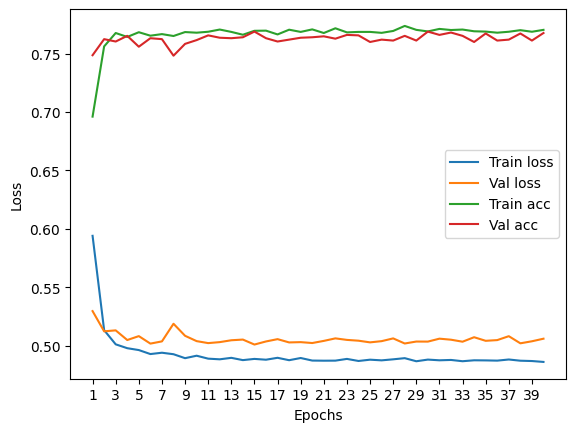

****************************************************************************************************



Particles per jet: 2


118it [00:01, 95.61it/s] 


Train Epoch: 0 	Loss: 0.579062, Accuracy: 5362/7500 (71%)
Val Epoch: 0 	Loss: 0.529585, Accuracy: 1860/2500 (74%)



118it [00:01, 85.04it/s]


Train Epoch: 1 	Loss: 0.501848, Accuracy: 5709/7500 (76%)
Val Epoch: 1 	Loss: 0.515253, Accuracy: 1938/2500 (78%)



118it [00:01, 77.86it/s]


Train Epoch: 2 	Loss: 0.495073, Accuracy: 5760/7500 (77%)
Val Epoch: 2 	Loss: 0.509975, Accuracy: 1913/2500 (77%)



118it [00:01, 67.88it/s]


Train Epoch: 3 	Loss: 0.492626, Accuracy: 5750/7500 (77%)
Val Epoch: 3 	Loss: 0.513628, Accuracy: 1931/2500 (77%)



118it [00:01, 81.74it/s]


Train Epoch: 4 	Loss: 0.491304, Accuracy: 5786/7500 (77%)
Val Epoch: 4 	Loss: 0.528288, Accuracy: 1930/2500 (77%)



118it [00:01, 77.58it/s]


Train Epoch: 5 	Loss: 0.495055, Accuracy: 5754/7500 (77%)
Val Epoch: 5 	Loss: 0.532066, Accuracy: 1931/2500 (77%)



118it [00:01, 70.66it/s]


Train Epoch: 6 	Loss: 0.491428, Accuracy: 5778/7500 (77%)
Val Epoch: 6 	Loss: 0.505626, Accuracy: 1914/2500 (77%)



118it [00:01, 64.95it/s]


Train Epoch: 7 	Loss: 0.491350, Accuracy: 5779/7500 (77%)
Val Epoch: 7 	Loss: 0.501704, Accuracy: 1933/2500 (77%)



118it [00:01, 62.18it/s]


Train Epoch: 8 	Loss: 0.490847, Accuracy: 5773/7500 (77%)
Val Epoch: 8 	Loss: 0.520758, Accuracy: 1934/2500 (77%)



118it [00:01, 70.77it/s]


Train Epoch: 9 	Loss: 0.494338, Accuracy: 5768/7500 (77%)
Val Epoch: 9 	Loss: 0.502371, Accuracy: 1936/2500 (77%)



118it [00:01, 76.55it/s]


Train Epoch: 10 	Loss: 0.489509, Accuracy: 5789/7500 (77%)
Val Epoch: 10 	Loss: 0.497621, Accuracy: 1940/2500 (78%)



118it [00:00, 128.16it/s]


Train Epoch: 11 	Loss: 0.487693, Accuracy: 5784/7500 (77%)
Val Epoch: 11 	Loss: 0.503384, Accuracy: 1935/2500 (77%)



118it [00:01, 101.76it/s]


Train Epoch: 12 	Loss: 0.487008, Accuracy: 5787/7500 (77%)
Val Epoch: 12 	Loss: 0.496733, Accuracy: 1946/2500 (78%)



118it [00:01, 96.37it/s]


Train Epoch: 13 	Loss: 0.487690, Accuracy: 5798/7500 (77%)
Val Epoch: 13 	Loss: 0.494482, Accuracy: 1936/2500 (77%)



118it [00:01, 86.69it/s]


Train Epoch: 14 	Loss: 0.485174, Accuracy: 5792/7500 (77%)
Val Epoch: 14 	Loss: 0.506177, Accuracy: 1941/2500 (78%)



118it [00:01, 75.76it/s]


Train Epoch: 15 	Loss: 0.484224, Accuracy: 5811/7500 (77%)
Val Epoch: 15 	Loss: 0.506251, Accuracy: 1941/2500 (78%)



118it [00:00, 123.36it/s]


Train Epoch: 16 	Loss: 0.487744, Accuracy: 5807/7500 (77%)
Val Epoch: 16 	Loss: 0.498666, Accuracy: 1927/2500 (77%)



118it [00:00, 133.37it/s]


Train Epoch: 17 	Loss: 0.485771, Accuracy: 5783/7500 (77%)
Val Epoch: 17 	Loss: 0.493853, Accuracy: 1935/2500 (77%)



118it [00:00, 125.29it/s]


Train Epoch: 18 	Loss: 0.484402, Accuracy: 5805/7500 (77%)
Val Epoch: 18 	Loss: 0.494917, Accuracy: 1933/2500 (77%)



118it [00:00, 120.47it/s]


Train Epoch: 19 	Loss: 0.482302, Accuracy: 5803/7500 (77%)
Val Epoch: 19 	Loss: 0.501535, Accuracy: 1913/2500 (77%)



118it [00:01, 116.47it/s]


Train Epoch: 20 	Loss: 0.483017, Accuracy: 5790/7500 (77%)
Val Epoch: 20 	Loss: 0.494181, Accuracy: 1938/2500 (78%)



118it [00:00, 131.69it/s]


Train Epoch: 21 	Loss: 0.484458, Accuracy: 5795/7500 (77%)
Val Epoch: 21 	Loss: 0.507872, Accuracy: 1920/2500 (77%)



118it [00:00, 134.89it/s]


Train Epoch: 22 	Loss: 0.482962, Accuracy: 5771/7500 (77%)
Val Epoch: 22 	Loss: 0.501491, Accuracy: 1932/2500 (77%)



118it [00:00, 124.55it/s]


Train Epoch: 23 	Loss: 0.483044, Accuracy: 5786/7500 (77%)
Val Epoch: 23 	Loss: 0.494431, Accuracy: 1939/2500 (78%)



118it [00:01, 80.29it/s]


Train Epoch: 24 	Loss: 0.486288, Accuracy: 5806/7500 (77%)
Val Epoch: 24 	Loss: 0.493965, Accuracy: 1928/2500 (77%)



118it [00:01, 63.31it/s]


Train Epoch: 25 	Loss: 0.481187, Accuracy: 5812/7500 (77%)
Val Epoch: 25 	Loss: 0.495155, Accuracy: 1936/2500 (77%)



118it [00:01, 78.90it/s]


Train Epoch: 26 	Loss: 0.481944, Accuracy: 5789/7500 (77%)
Val Epoch: 26 	Loss: 0.500256, Accuracy: 1942/2500 (78%)



118it [00:01, 81.94it/s]


Train Epoch: 27 	Loss: 0.481905, Accuracy: 5799/7500 (77%)
Val Epoch: 27 	Loss: 0.501833, Accuracy: 1922/2500 (77%)



118it [00:01, 81.62it/s]


Train Epoch: 28 	Loss: 0.481990, Accuracy: 5807/7500 (77%)
Val Epoch: 28 	Loss: 0.508313, Accuracy: 1934/2500 (77%)



118it [00:01, 80.03it/s]


Train Epoch: 29 	Loss: 0.481639, Accuracy: 5810/7500 (77%)
Val Epoch: 29 	Loss: 0.499619, Accuracy: 1926/2500 (77%)



118it [00:01, 72.78it/s]


Train Epoch: 30 	Loss: 0.482863, Accuracy: 5802/7500 (77%)
Val Epoch: 30 	Loss: 0.508569, Accuracy: 1937/2500 (77%)



118it [00:01, 88.53it/s]


Train Epoch: 31 	Loss: 0.483606, Accuracy: 5795/7500 (77%)
Val Epoch: 31 	Loss: 0.512910, Accuracy: 1931/2500 (77%)



118it [00:01, 108.61it/s]


Train Epoch: 32 	Loss: 0.482139, Accuracy: 5791/7500 (77%)
Val Epoch: 32 	Loss: 0.498650, Accuracy: 1939/2500 (78%)



118it [00:00, 121.88it/s]


Train Epoch: 33 	Loss: 0.480652, Accuracy: 5801/7500 (77%)
Val Epoch: 33 	Loss: 0.496061, Accuracy: 1935/2500 (77%)



118it [00:00, 123.22it/s]


Train Epoch: 34 	Loss: 0.481937, Accuracy: 5792/7500 (77%)
Val Epoch: 34 	Loss: 0.496616, Accuracy: 1923/2500 (77%)



118it [00:01, 111.49it/s]


Train Epoch: 35 	Loss: 0.484111, Accuracy: 5810/7500 (77%)
Val Epoch: 35 	Loss: 0.491927, Accuracy: 1939/2500 (78%)



118it [00:01, 81.36it/s]


Train Epoch: 36 	Loss: 0.481058, Accuracy: 5799/7500 (77%)
Val Epoch: 36 	Loss: 0.529583, Accuracy: 1924/2500 (77%)



118it [00:01, 71.64it/s]


Train Epoch: 37 	Loss: 0.482732, Accuracy: 5779/7500 (77%)
Val Epoch: 37 	Loss: 0.498687, Accuracy: 1921/2500 (77%)



118it [00:01, 98.54it/s]


Train Epoch: 38 	Loss: 0.481408, Accuracy: 5788/7500 (77%)
Val Epoch: 38 	Loss: 0.493876, Accuracy: 1923/2500 (77%)



118it [00:01, 70.13it/s]


Train Epoch: 39 	Loss: 0.480795, Accuracy: 5792/7500 (77%)
Val Epoch: 39 	Loss: 0.501518, Accuracy: 1929/2500 (77%)

Test accuracy:  78.4


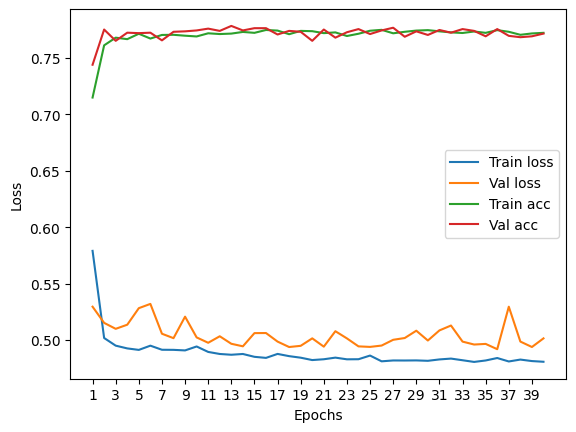

****************************************************************************************************



118it [00:00, 130.14it/s]


Train Epoch: 0 	Loss: 0.604017, Accuracy: 5212/7500 (69%)
Val Epoch: 0 	Loss: 0.516228, Accuracy: 1918/2500 (77%)



118it [00:01, 85.11it/s]


Train Epoch: 1 	Loss: 0.511171, Accuracy: 5678/7500 (76%)
Val Epoch: 1 	Loss: 0.492027, Accuracy: 1949/2500 (78%)



118it [00:01, 69.47it/s]


Train Epoch: 2 	Loss: 0.506386, Accuracy: 5684/7500 (76%)
Val Epoch: 2 	Loss: 0.487477, Accuracy: 1957/2500 (78%)



118it [00:01, 97.42it/s] 


Train Epoch: 3 	Loss: 0.499083, Accuracy: 5746/7500 (77%)
Val Epoch: 3 	Loss: 0.485354, Accuracy: 1941/2500 (78%)



118it [00:00, 132.00it/s]


Train Epoch: 4 	Loss: 0.499120, Accuracy: 5747/7500 (77%)
Val Epoch: 4 	Loss: 0.494907, Accuracy: 1932/2500 (77%)



118it [00:00, 140.11it/s]


Train Epoch: 5 	Loss: 0.497182, Accuracy: 5737/7500 (76%)
Val Epoch: 5 	Loss: 0.505713, Accuracy: 1935/2500 (77%)



118it [00:01, 97.37it/s]


Train Epoch: 6 	Loss: 0.494175, Accuracy: 5747/7500 (77%)
Val Epoch: 6 	Loss: 0.483609, Accuracy: 1945/2500 (78%)



118it [00:01, 85.93it/s]


Train Epoch: 7 	Loss: 0.496226, Accuracy: 5753/7500 (77%)
Val Epoch: 7 	Loss: 0.487522, Accuracy: 1940/2500 (78%)



118it [00:01, 87.70it/s]


Train Epoch: 8 	Loss: 0.497552, Accuracy: 5751/7500 (77%)
Val Epoch: 8 	Loss: 0.496710, Accuracy: 1939/2500 (78%)



118it [00:01, 87.75it/s]


Train Epoch: 9 	Loss: 0.496937, Accuracy: 5754/7500 (77%)
Val Epoch: 9 	Loss: 0.488916, Accuracy: 1943/2500 (78%)



118it [00:01, 95.48it/s]


Train Epoch: 10 	Loss: 0.494791, Accuracy: 5745/7500 (77%)
Val Epoch: 10 	Loss: 0.490448, Accuracy: 1935/2500 (77%)



118it [00:01, 111.44it/s]


Train Epoch: 11 	Loss: 0.495484, Accuracy: 5763/7500 (77%)
Val Epoch: 11 	Loss: 0.490893, Accuracy: 1945/2500 (78%)



118it [00:01, 89.88it/s]


Train Epoch: 12 	Loss: 0.493238, Accuracy: 5745/7500 (77%)
Val Epoch: 12 	Loss: 0.481849, Accuracy: 1942/2500 (78%)



118it [00:01, 111.88it/s]


Train Epoch: 13 	Loss: 0.498757, Accuracy: 5751/7500 (77%)
Val Epoch: 13 	Loss: 0.487653, Accuracy: 1946/2500 (78%)



118it [00:00, 133.93it/s]


Train Epoch: 14 	Loss: 0.493962, Accuracy: 5748/7500 (77%)
Val Epoch: 14 	Loss: 0.482894, Accuracy: 1949/2500 (78%)



118it [00:00, 135.88it/s]


Train Epoch: 15 	Loss: 0.493122, Accuracy: 5737/7500 (76%)
Val Epoch: 15 	Loss: 0.485609, Accuracy: 1940/2500 (78%)



118it [00:01, 79.45it/s]


Train Epoch: 16 	Loss: 0.494409, Accuracy: 5731/7500 (76%)
Val Epoch: 16 	Loss: 0.521083, Accuracy: 1893/2500 (76%)



118it [00:01, 102.15it/s]


Train Epoch: 17 	Loss: 0.498060, Accuracy: 5740/7500 (77%)
Val Epoch: 17 	Loss: 0.485417, Accuracy: 1941/2500 (78%)



118it [00:00, 121.03it/s]


Train Epoch: 18 	Loss: 0.492545, Accuracy: 5768/7500 (77%)
Val Epoch: 18 	Loss: 0.492684, Accuracy: 1944/2500 (78%)



118it [00:01, 85.58it/s]


Train Epoch: 19 	Loss: 0.492239, Accuracy: 5747/7500 (77%)
Val Epoch: 19 	Loss: 0.498298, Accuracy: 1928/2500 (77%)



118it [00:01, 85.15it/s]


Train Epoch: 20 	Loss: 0.496603, Accuracy: 5739/7500 (77%)
Val Epoch: 20 	Loss: 0.480172, Accuracy: 1952/2500 (78%)



118it [00:01, 86.90it/s]


Train Epoch: 21 	Loss: 0.493598, Accuracy: 5773/7500 (77%)
Val Epoch: 21 	Loss: 0.494266, Accuracy: 1938/2500 (78%)



118it [00:01, 67.22it/s]


Train Epoch: 22 	Loss: 0.494963, Accuracy: 5763/7500 (77%)
Val Epoch: 22 	Loss: 0.498134, Accuracy: 1942/2500 (78%)



118it [00:01, 87.74it/s]


Train Epoch: 23 	Loss: 0.492000, Accuracy: 5762/7500 (77%)
Val Epoch: 23 	Loss: 0.483117, Accuracy: 1946/2500 (78%)



118it [00:01, 112.17it/s]


Train Epoch: 24 	Loss: 0.491987, Accuracy: 5773/7500 (77%)
Val Epoch: 24 	Loss: 0.488450, Accuracy: 1953/2500 (78%)



118it [00:00, 131.83it/s]


Train Epoch: 25 	Loss: 0.494619, Accuracy: 5766/7500 (77%)
Val Epoch: 25 	Loss: 0.478464, Accuracy: 1953/2500 (78%)



118it [00:00, 151.51it/s]


Train Epoch: 26 	Loss: 0.493258, Accuracy: 5753/7500 (77%)
Val Epoch: 26 	Loss: 0.487496, Accuracy: 1950/2500 (78%)



118it [00:00, 127.45it/s]


Train Epoch: 27 	Loss: 0.496810, Accuracy: 5755/7500 (77%)
Val Epoch: 27 	Loss: 0.496893, Accuracy: 1952/2500 (78%)



118it [00:00, 123.43it/s]


Train Epoch: 28 	Loss: 0.491164, Accuracy: 5756/7500 (77%)
Val Epoch: 28 	Loss: 0.495348, Accuracy: 1948/2500 (78%)



118it [00:00, 134.37it/s]


Train Epoch: 29 	Loss: 0.495091, Accuracy: 5734/7500 (76%)
Val Epoch: 29 	Loss: 0.490771, Accuracy: 1938/2500 (78%)



118it [00:00, 136.43it/s]


Train Epoch: 30 	Loss: 0.492107, Accuracy: 5776/7500 (77%)
Val Epoch: 30 	Loss: 0.485469, Accuracy: 1955/2500 (78%)



118it [00:00, 143.58it/s]


Train Epoch: 31 	Loss: 0.492342, Accuracy: 5770/7500 (77%)
Val Epoch: 31 	Loss: 0.516765, Accuracy: 1935/2500 (77%)



118it [00:00, 139.32it/s]


Train Epoch: 32 	Loss: 0.493076, Accuracy: 5767/7500 (77%)
Val Epoch: 32 	Loss: 0.496689, Accuracy: 1941/2500 (78%)



118it [00:00, 140.20it/s]


Train Epoch: 33 	Loss: 0.492088, Accuracy: 5745/7500 (77%)
Val Epoch: 33 	Loss: 0.503366, Accuracy: 1955/2500 (78%)



118it [00:00, 129.71it/s]


Train Epoch: 34 	Loss: 0.492936, Accuracy: 5746/7500 (77%)
Val Epoch: 34 	Loss: 0.477922, Accuracy: 1955/2500 (78%)



118it [00:00, 125.45it/s]


Train Epoch: 35 	Loss: 0.494272, Accuracy: 5750/7500 (77%)
Val Epoch: 35 	Loss: 0.491629, Accuracy: 1942/2500 (78%)



118it [00:00, 122.21it/s]


Train Epoch: 36 	Loss: 0.491370, Accuracy: 5764/7500 (77%)
Val Epoch: 36 	Loss: 0.481596, Accuracy: 1943/2500 (78%)



118it [00:01, 113.64it/s]


Train Epoch: 37 	Loss: 0.493259, Accuracy: 5768/7500 (77%)
Val Epoch: 37 	Loss: 0.492632, Accuracy: 1945/2500 (78%)



118it [00:01, 82.64it/s]


Train Epoch: 38 	Loss: 0.491802, Accuracy: 5774/7500 (77%)
Val Epoch: 38 	Loss: 0.490955, Accuracy: 1955/2500 (78%)



118it [00:01, 83.93it/s]


Train Epoch: 39 	Loss: 0.490912, Accuracy: 5762/7500 (77%)
Val Epoch: 39 	Loss: 0.483917, Accuracy: 1936/2500 (77%)

Test accuracy:  76.92


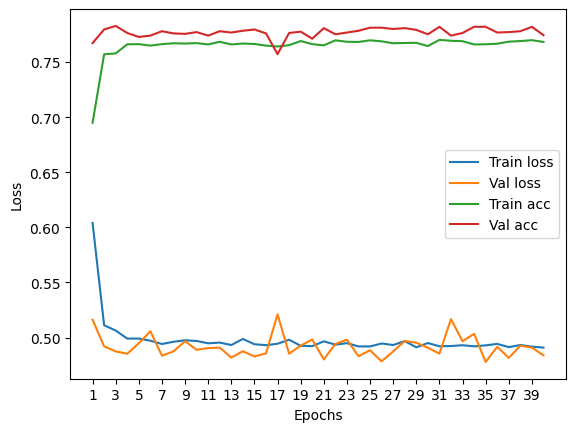

****************************************************************************************************



118it [00:01, 86.48it/s]


Train Epoch: 0 	Loss: 0.590849, Accuracy: 5368/7500 (72%)
Val Epoch: 0 	Loss: 0.506325, Accuracy: 1926/2500 (77%)



118it [00:01, 95.40it/s]


Train Epoch: 1 	Loss: 0.502756, Accuracy: 5751/7500 (77%)
Val Epoch: 1 	Loss: 0.526360, Accuracy: 1873/2500 (75%)



118it [00:01, 85.78it/s]


Train Epoch: 2 	Loss: 0.498552, Accuracy: 5801/7500 (77%)
Val Epoch: 2 	Loss: 0.495802, Accuracy: 1949/2500 (78%)



118it [00:00, 119.33it/s]


Train Epoch: 3 	Loss: 0.493825, Accuracy: 5789/7500 (77%)
Val Epoch: 3 	Loss: 0.488090, Accuracy: 1950/2500 (78%)



118it [00:00, 132.10it/s]


Train Epoch: 4 	Loss: 0.494957, Accuracy: 5808/7500 (77%)
Val Epoch: 4 	Loss: 0.499906, Accuracy: 1950/2500 (78%)



118it [00:00, 122.69it/s]


Train Epoch: 5 	Loss: 0.487832, Accuracy: 5822/7500 (78%)
Val Epoch: 5 	Loss: 0.507514, Accuracy: 1913/2500 (77%)



118it [00:00, 123.27it/s]


Train Epoch: 6 	Loss: 0.489738, Accuracy: 5795/7500 (77%)
Val Epoch: 6 	Loss: 0.500846, Accuracy: 1945/2500 (78%)



118it [00:00, 129.90it/s]


Train Epoch: 7 	Loss: 0.487319, Accuracy: 5809/7500 (77%)
Val Epoch: 7 	Loss: 0.489459, Accuracy: 1951/2500 (78%)



118it [00:00, 141.54it/s]


Train Epoch: 8 	Loss: 0.486962, Accuracy: 5776/7500 (77%)
Val Epoch: 8 	Loss: 0.492138, Accuracy: 1935/2500 (77%)



118it [00:00, 141.92it/s]


Train Epoch: 9 	Loss: 0.489533, Accuracy: 5834/7500 (78%)
Val Epoch: 9 	Loss: 0.486396, Accuracy: 1939/2500 (78%)



118it [00:00, 127.66it/s]


Train Epoch: 10 	Loss: 0.488355, Accuracy: 5811/7500 (77%)
Val Epoch: 10 	Loss: 0.493432, Accuracy: 1955/2500 (78%)



118it [00:00, 142.21it/s]


Train Epoch: 11 	Loss: 0.487613, Accuracy: 5822/7500 (78%)
Val Epoch: 11 	Loss: 0.494770, Accuracy: 1945/2500 (78%)



118it [00:00, 132.13it/s]


Train Epoch: 12 	Loss: 0.486446, Accuracy: 5831/7500 (78%)
Val Epoch: 12 	Loss: 0.490548, Accuracy: 1958/2500 (78%)



118it [00:01, 117.56it/s]


Train Epoch: 13 	Loss: 0.486162, Accuracy: 5836/7500 (78%)
Val Epoch: 13 	Loss: 0.506418, Accuracy: 1935/2500 (77%)



118it [00:00, 141.87it/s]


Train Epoch: 14 	Loss: 0.485272, Accuracy: 5808/7500 (77%)
Val Epoch: 14 	Loss: 0.496029, Accuracy: 1955/2500 (78%)



118it [00:01, 104.46it/s]


Train Epoch: 15 	Loss: 0.482453, Accuracy: 5825/7500 (78%)
Val Epoch: 15 	Loss: 0.496696, Accuracy: 1948/2500 (78%)



118it [00:00, 134.60it/s]


Train Epoch: 16 	Loss: 0.486034, Accuracy: 5821/7500 (78%)
Val Epoch: 16 	Loss: 0.498417, Accuracy: 1925/2500 (77%)



118it [00:00, 127.75it/s]


Train Epoch: 17 	Loss: 0.487213, Accuracy: 5812/7500 (77%)
Val Epoch: 17 	Loss: 0.496833, Accuracy: 1951/2500 (78%)



118it [00:00, 142.26it/s]


Train Epoch: 18 	Loss: 0.483350, Accuracy: 5841/7500 (78%)
Val Epoch: 18 	Loss: 0.490104, Accuracy: 1949/2500 (78%)



118it [00:00, 139.43it/s]


Train Epoch: 19 	Loss: 0.485039, Accuracy: 5824/7500 (78%)
Val Epoch: 19 	Loss: 0.488434, Accuracy: 1959/2500 (78%)



118it [00:00, 127.40it/s]


Train Epoch: 20 	Loss: 0.485893, Accuracy: 5843/7500 (78%)
Val Epoch: 20 	Loss: 0.501994, Accuracy: 1930/2500 (77%)



118it [00:00, 123.51it/s]


Train Epoch: 21 	Loss: 0.485028, Accuracy: 5831/7500 (78%)
Val Epoch: 21 	Loss: 0.497918, Accuracy: 1954/2500 (78%)



118it [00:00, 127.32it/s]


Train Epoch: 22 	Loss: 0.483381, Accuracy: 5841/7500 (78%)
Val Epoch: 22 	Loss: 0.483941, Accuracy: 1956/2500 (78%)



118it [00:00, 127.27it/s]


Train Epoch: 23 	Loss: 0.483634, Accuracy: 5840/7500 (78%)
Val Epoch: 23 	Loss: 0.488766, Accuracy: 1947/2500 (78%)



118it [00:00, 125.46it/s]


Train Epoch: 24 	Loss: 0.485193, Accuracy: 5840/7500 (78%)
Val Epoch: 24 	Loss: 0.504999, Accuracy: 1952/2500 (78%)



118it [00:00, 147.95it/s]


Train Epoch: 25 	Loss: 0.483277, Accuracy: 5843/7500 (78%)
Val Epoch: 25 	Loss: 0.493579, Accuracy: 1931/2500 (77%)



118it [00:00, 139.29it/s]


Train Epoch: 26 	Loss: 0.484534, Accuracy: 5802/7500 (77%)
Val Epoch: 26 	Loss: 0.491541, Accuracy: 1941/2500 (78%)



118it [00:00, 139.53it/s]


Train Epoch: 27 	Loss: 0.485364, Accuracy: 5841/7500 (78%)
Val Epoch: 27 	Loss: 0.492283, Accuracy: 1953/2500 (78%)



118it [00:01, 112.29it/s]


Train Epoch: 28 	Loss: 0.482689, Accuracy: 5839/7500 (78%)
Val Epoch: 28 	Loss: 0.484603, Accuracy: 1968/2500 (79%)



118it [00:00, 129.72it/s]


Train Epoch: 29 	Loss: 0.484849, Accuracy: 5859/7500 (78%)
Val Epoch: 29 	Loss: 0.494976, Accuracy: 1966/2500 (79%)



118it [00:01, 107.48it/s]


Train Epoch: 30 	Loss: 0.483031, Accuracy: 5838/7500 (78%)
Val Epoch: 30 	Loss: 0.483355, Accuracy: 1962/2500 (78%)



118it [00:00, 129.74it/s]


Train Epoch: 31 	Loss: 0.482385, Accuracy: 5836/7500 (78%)
Val Epoch: 31 	Loss: 0.505305, Accuracy: 1951/2500 (78%)



118it [00:01, 114.17it/s]


Train Epoch: 32 	Loss: 0.482859, Accuracy: 5826/7500 (78%)
Val Epoch: 32 	Loss: 0.506198, Accuracy: 1940/2500 (78%)



118it [00:00, 121.61it/s]


Train Epoch: 33 	Loss: 0.484085, Accuracy: 5833/7500 (78%)
Val Epoch: 33 	Loss: 0.495855, Accuracy: 1926/2500 (77%)



118it [00:00, 136.95it/s]


Train Epoch: 34 	Loss: 0.480763, Accuracy: 5872/7500 (78%)
Val Epoch: 34 	Loss: 0.485711, Accuracy: 1949/2500 (78%)



118it [00:00, 127.45it/s]


Train Epoch: 35 	Loss: 0.483470, Accuracy: 5850/7500 (78%)
Val Epoch: 35 	Loss: 0.495119, Accuracy: 1954/2500 (78%)



118it [00:01, 110.78it/s]


Train Epoch: 36 	Loss: 0.483163, Accuracy: 5831/7500 (78%)
Val Epoch: 36 	Loss: 0.503474, Accuracy: 1938/2500 (78%)



118it [00:00, 129.89it/s]


Train Epoch: 37 	Loss: 0.480941, Accuracy: 5826/7500 (78%)
Val Epoch: 37 	Loss: 0.499537, Accuracy: 1950/2500 (78%)



118it [00:01, 115.88it/s]


Train Epoch: 38 	Loss: 0.484289, Accuracy: 5825/7500 (78%)
Val Epoch: 38 	Loss: 0.490444, Accuracy: 1954/2500 (78%)



118it [00:00, 129.99it/s]


Train Epoch: 39 	Loss: 0.481671, Accuracy: 5842/7500 (78%)
Val Epoch: 39 	Loss: 0.483248, Accuracy: 1951/2500 (78%)

Test accuracy:  77.88000000000001


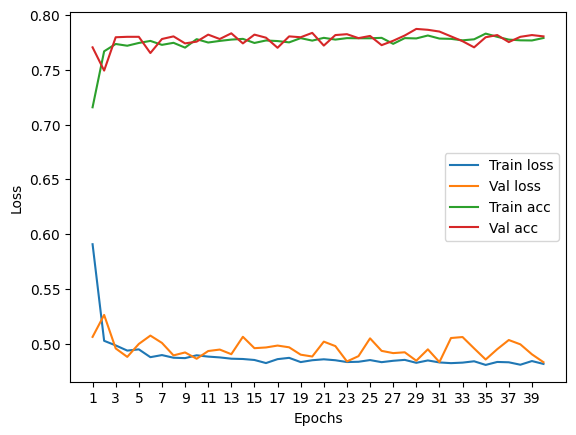

****************************************************************************************************



118it [00:00, 134.47it/s]


Train Epoch: 0 	Loss: 0.583025, Accuracy: 5301/7500 (71%)
Val Epoch: 0 	Loss: 0.610255, Accuracy: 1712/2500 (68%)



118it [00:00, 132.34it/s]


Train Epoch: 1 	Loss: 0.503752, Accuracy: 5751/7500 (77%)
Val Epoch: 1 	Loss: 0.503036, Accuracy: 1914/2500 (77%)



118it [00:00, 136.78it/s]


Train Epoch: 2 	Loss: 0.495672, Accuracy: 5812/7500 (77%)
Val Epoch: 2 	Loss: 0.509297, Accuracy: 1904/2500 (76%)



118it [00:00, 136.99it/s]


Train Epoch: 3 	Loss: 0.490254, Accuracy: 5825/7500 (78%)
Val Epoch: 3 	Loss: 0.504980, Accuracy: 1924/2500 (77%)



118it [00:00, 150.70it/s]


Train Epoch: 4 	Loss: 0.489489, Accuracy: 5812/7500 (77%)
Val Epoch: 4 	Loss: 0.497310, Accuracy: 1925/2500 (77%)



118it [00:00, 127.65it/s]


Train Epoch: 5 	Loss: 0.486310, Accuracy: 5822/7500 (78%)
Val Epoch: 5 	Loss: 0.502092, Accuracy: 1934/2500 (77%)



118it [00:00, 131.48it/s]


Train Epoch: 6 	Loss: 0.486581, Accuracy: 5815/7500 (78%)
Val Epoch: 6 	Loss: 0.501865, Accuracy: 1930/2500 (77%)



118it [00:00, 139.44it/s]


Train Epoch: 7 	Loss: 0.484265, Accuracy: 5813/7500 (78%)
Val Epoch: 7 	Loss: 0.497508, Accuracy: 1932/2500 (77%)



118it [00:00, 129.85it/s]


Train Epoch: 8 	Loss: 0.485586, Accuracy: 5799/7500 (77%)
Val Epoch: 8 	Loss: 0.499378, Accuracy: 1938/2500 (78%)



118it [00:00, 129.39it/s]


Train Epoch: 9 	Loss: 0.484053, Accuracy: 5817/7500 (78%)
Val Epoch: 9 	Loss: 0.512915, Accuracy: 1929/2500 (77%)



118it [00:00, 123.54it/s]


Train Epoch: 10 	Loss: 0.488571, Accuracy: 5811/7500 (77%)
Val Epoch: 10 	Loss: 0.493489, Accuracy: 1937/2500 (77%)



118it [00:01, 117.57it/s]


Train Epoch: 11 	Loss: 0.484955, Accuracy: 5807/7500 (77%)
Val Epoch: 11 	Loss: 0.507274, Accuracy: 1914/2500 (77%)



118it [00:00, 142.27it/s]


Train Epoch: 12 	Loss: 0.487175, Accuracy: 5810/7500 (77%)
Val Epoch: 12 	Loss: 0.492303, Accuracy: 1937/2500 (77%)



118it [00:00, 137.14it/s]


Train Epoch: 13 	Loss: 0.485267, Accuracy: 5832/7500 (78%)
Val Epoch: 13 	Loss: 0.518975, Accuracy: 1932/2500 (77%)



118it [00:00, 131.84it/s]


Train Epoch: 14 	Loss: 0.489305, Accuracy: 5818/7500 (78%)
Val Epoch: 14 	Loss: 0.507177, Accuracy: 1940/2500 (78%)



118it [00:00, 131.93it/s]


Train Epoch: 15 	Loss: 0.485743, Accuracy: 5833/7500 (78%)
Val Epoch: 15 	Loss: 0.497010, Accuracy: 1937/2500 (77%)



118it [00:00, 124.89it/s]


Train Epoch: 16 	Loss: 0.483661, Accuracy: 5812/7500 (77%)
Val Epoch: 16 	Loss: 0.505203, Accuracy: 1944/2500 (78%)



118it [00:00, 121.50it/s]


Train Epoch: 17 	Loss: 0.483081, Accuracy: 5827/7500 (78%)
Val Epoch: 17 	Loss: 0.497527, Accuracy: 1941/2500 (78%)



118it [00:01, 109.85it/s]


Train Epoch: 18 	Loss: 0.484810, Accuracy: 5832/7500 (78%)
Val Epoch: 18 	Loss: 0.504085, Accuracy: 1927/2500 (77%)



118it [00:01, 117.45it/s]


Train Epoch: 19 	Loss: 0.488345, Accuracy: 5821/7500 (78%)
Val Epoch: 19 	Loss: 0.499240, Accuracy: 1940/2500 (78%)



118it [00:00, 122.79it/s]


Train Epoch: 20 	Loss: 0.484257, Accuracy: 5827/7500 (78%)
Val Epoch: 20 	Loss: 0.491662, Accuracy: 1934/2500 (77%)



118it [00:00, 131.05it/s]


Train Epoch: 21 	Loss: 0.487377, Accuracy: 5837/7500 (78%)
Val Epoch: 21 	Loss: 0.507252, Accuracy: 1940/2500 (78%)



118it [00:01, 111.46it/s]


Train Epoch: 22 	Loss: 0.483999, Accuracy: 5836/7500 (78%)
Val Epoch: 22 	Loss: 0.494368, Accuracy: 1937/2500 (77%)



118it [00:00, 123.44it/s]


Train Epoch: 23 	Loss: 0.482938, Accuracy: 5829/7500 (78%)
Val Epoch: 23 	Loss: 0.499004, Accuracy: 1931/2500 (77%)



118it [00:00, 135.97it/s]


Train Epoch: 24 	Loss: 0.481948, Accuracy: 5827/7500 (78%)
Val Epoch: 24 	Loss: 0.501635, Accuracy: 1940/2500 (78%)



118it [00:00, 121.74it/s]


Train Epoch: 25 	Loss: 0.484089, Accuracy: 5824/7500 (78%)
Val Epoch: 25 	Loss: 0.495014, Accuracy: 1934/2500 (77%)



118it [00:00, 143.37it/s]


Train Epoch: 26 	Loss: 0.485576, Accuracy: 5840/7500 (78%)
Val Epoch: 26 	Loss: 0.498228, Accuracy: 1930/2500 (77%)



118it [00:00, 137.06it/s]


Train Epoch: 27 	Loss: 0.482907, Accuracy: 5856/7500 (78%)
Val Epoch: 27 	Loss: 0.497140, Accuracy: 1935/2500 (77%)



118it [00:01, 112.07it/s]


Train Epoch: 28 	Loss: 0.482634, Accuracy: 5845/7500 (78%)
Val Epoch: 28 	Loss: 0.512766, Accuracy: 1927/2500 (77%)



118it [00:01, 99.93it/s] 


Train Epoch: 29 	Loss: 0.484705, Accuracy: 5837/7500 (78%)
Val Epoch: 29 	Loss: 0.496355, Accuracy: 1930/2500 (77%)



118it [00:01, 117.50it/s]


Train Epoch: 30 	Loss: 0.484834, Accuracy: 5848/7500 (78%)
Val Epoch: 30 	Loss: 0.501081, Accuracy: 1942/2500 (78%)



118it [00:01, 84.61it/s]


Train Epoch: 31 	Loss: 0.485588, Accuracy: 5847/7500 (78%)
Val Epoch: 31 	Loss: 0.491614, Accuracy: 1934/2500 (77%)



118it [00:01, 81.66it/s]


Train Epoch: 32 	Loss: 0.482562, Accuracy: 5835/7500 (78%)
Val Epoch: 32 	Loss: 0.495139, Accuracy: 1935/2500 (77%)



118it [00:01, 116.99it/s]


Train Epoch: 33 	Loss: 0.484332, Accuracy: 5842/7500 (78%)
Val Epoch: 33 	Loss: 0.500514, Accuracy: 1939/2500 (78%)



118it [00:01, 111.59it/s]


Train Epoch: 34 	Loss: 0.484931, Accuracy: 5859/7500 (78%)
Val Epoch: 34 	Loss: 0.500101, Accuracy: 1929/2500 (77%)



118it [00:00, 135.52it/s]


Train Epoch: 35 	Loss: 0.483659, Accuracy: 5845/7500 (78%)
Val Epoch: 35 	Loss: 0.501525, Accuracy: 1943/2500 (78%)



118it [00:01, 109.51it/s]


Train Epoch: 36 	Loss: 0.482968, Accuracy: 5847/7500 (78%)
Val Epoch: 36 	Loss: 0.499048, Accuracy: 1941/2500 (78%)



118it [00:00, 138.74it/s]


Train Epoch: 37 	Loss: 0.481899, Accuracy: 5838/7500 (78%)
Val Epoch: 37 	Loss: 0.500822, Accuracy: 1935/2500 (77%)



118it [00:01, 94.25it/s] 


Train Epoch: 38 	Loss: 0.484385, Accuracy: 5826/7500 (78%)
Val Epoch: 38 	Loss: 0.506485, Accuracy: 1930/2500 (77%)



118it [00:00, 134.47it/s]


Train Epoch: 39 	Loss: 0.481867, Accuracy: 5832/7500 (78%)
Val Epoch: 39 	Loss: 0.505373, Accuracy: 1933/2500 (77%)

Test accuracy:  76.6


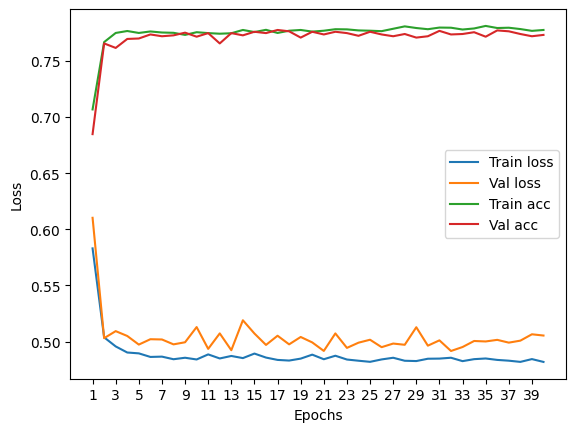

****************************************************************************************************



118it [00:00, 141.70it/s]


Train Epoch: 0 	Loss: 0.582763, Accuracy: 5434/7500 (72%)
Val Epoch: 0 	Loss: 0.563106, Accuracy: 1856/2500 (74%)



118it [00:00, 146.50it/s]


Train Epoch: 1 	Loss: 0.505617, Accuracy: 5723/7500 (76%)
Val Epoch: 1 	Loss: 0.523306, Accuracy: 1891/2500 (76%)



118it [00:00, 141.05it/s]


Train Epoch: 2 	Loss: 0.498436, Accuracy: 5761/7500 (77%)
Val Epoch: 2 	Loss: 0.506966, Accuracy: 1892/2500 (76%)



118it [00:00, 140.39it/s]


Train Epoch: 3 	Loss: 0.492878, Accuracy: 5775/7500 (77%)
Val Epoch: 3 	Loss: 0.497480, Accuracy: 1905/2500 (76%)



118it [00:00, 141.47it/s]


Train Epoch: 4 	Loss: 0.494983, Accuracy: 5787/7500 (77%)
Val Epoch: 4 	Loss: 0.501442, Accuracy: 1896/2500 (76%)



118it [00:00, 133.65it/s]


Train Epoch: 5 	Loss: 0.489111, Accuracy: 5811/7500 (77%)
Val Epoch: 5 	Loss: 0.503046, Accuracy: 1896/2500 (76%)



118it [00:01, 100.47it/s]


Train Epoch: 6 	Loss: 0.490961, Accuracy: 5805/7500 (77%)
Val Epoch: 6 	Loss: 0.514178, Accuracy: 1898/2500 (76%)



118it [00:00, 129.18it/s]


Train Epoch: 7 	Loss: 0.488257, Accuracy: 5810/7500 (77%)
Val Epoch: 7 	Loss: 0.500584, Accuracy: 1900/2500 (76%)



118it [00:01, 68.66it/s]


Train Epoch: 8 	Loss: 0.485904, Accuracy: 5829/7500 (78%)
Val Epoch: 8 	Loss: 0.503920, Accuracy: 1901/2500 (76%)



118it [00:01, 89.23it/s]


Train Epoch: 9 	Loss: 0.485134, Accuracy: 5820/7500 (78%)
Val Epoch: 9 	Loss: 0.499343, Accuracy: 1886/2500 (75%)



118it [00:01, 89.99it/s]


Train Epoch: 10 	Loss: 0.486384, Accuracy: 5810/7500 (77%)
Val Epoch: 10 	Loss: 0.493766, Accuracy: 1900/2500 (76%)



118it [00:01, 111.92it/s]


Train Epoch: 11 	Loss: 0.489417, Accuracy: 5802/7500 (77%)
Val Epoch: 11 	Loss: 0.504198, Accuracy: 1901/2500 (76%)



118it [00:00, 130.44it/s]


Train Epoch: 12 	Loss: 0.486328, Accuracy: 5803/7500 (77%)
Val Epoch: 12 	Loss: 0.517078, Accuracy: 1898/2500 (76%)



118it [00:00, 126.25it/s]


Train Epoch: 13 	Loss: 0.486053, Accuracy: 5800/7500 (77%)
Val Epoch: 13 	Loss: 0.492912, Accuracy: 1901/2500 (76%)



118it [00:01, 112.15it/s]


Train Epoch: 14 	Loss: 0.484259, Accuracy: 5815/7500 (78%)
Val Epoch: 14 	Loss: 0.509600, Accuracy: 1906/2500 (76%)



118it [00:00, 131.20it/s]


Train Epoch: 15 	Loss: 0.485856, Accuracy: 5843/7500 (78%)
Val Epoch: 15 	Loss: 0.521066, Accuracy: 1881/2500 (75%)



118it [00:00, 136.48it/s]


Train Epoch: 16 	Loss: 0.484049, Accuracy: 5807/7500 (77%)
Val Epoch: 16 	Loss: 0.510316, Accuracy: 1906/2500 (76%)



118it [00:00, 145.19it/s]


Train Epoch: 17 	Loss: 0.485208, Accuracy: 5825/7500 (78%)
Val Epoch: 17 	Loss: 0.521468, Accuracy: 1901/2500 (76%)



118it [00:00, 125.66it/s]


Train Epoch: 18 	Loss: 0.483079, Accuracy: 5815/7500 (78%)
Val Epoch: 18 	Loss: 0.511679, Accuracy: 1891/2500 (76%)



118it [00:00, 129.67it/s]


Train Epoch: 19 	Loss: 0.482028, Accuracy: 5829/7500 (78%)
Val Epoch: 19 	Loss: 0.500432, Accuracy: 1900/2500 (76%)



118it [00:01, 110.98it/s]


Train Epoch: 20 	Loss: 0.484540, Accuracy: 5809/7500 (77%)
Val Epoch: 20 	Loss: 0.501410, Accuracy: 1902/2500 (76%)



118it [00:01, 74.02it/s]


Train Epoch: 21 	Loss: 0.485567, Accuracy: 5836/7500 (78%)
Val Epoch: 21 	Loss: 0.502364, Accuracy: 1895/2500 (76%)



118it [00:01, 110.50it/s]


Train Epoch: 22 	Loss: 0.482947, Accuracy: 5822/7500 (78%)
Val Epoch: 22 	Loss: 0.496972, Accuracy: 1905/2500 (76%)



118it [00:01, 116.45it/s]


Train Epoch: 23 	Loss: 0.485176, Accuracy: 5823/7500 (78%)
Val Epoch: 23 	Loss: 0.496403, Accuracy: 1905/2500 (76%)



118it [00:00, 119.42it/s]


Train Epoch: 24 	Loss: 0.483961, Accuracy: 5849/7500 (78%)
Val Epoch: 24 	Loss: 0.511910, Accuracy: 1895/2500 (76%)



118it [00:01, 93.85it/s]


Train Epoch: 25 	Loss: 0.485837, Accuracy: 5809/7500 (77%)
Val Epoch: 25 	Loss: 0.501365, Accuracy: 1903/2500 (76%)



118it [00:01, 117.14it/s]


Train Epoch: 26 	Loss: 0.482745, Accuracy: 5816/7500 (78%)
Val Epoch: 26 	Loss: 0.498968, Accuracy: 1904/2500 (76%)



118it [00:00, 122.60it/s]


Train Epoch: 27 	Loss: 0.484110, Accuracy: 5814/7500 (78%)
Val Epoch: 27 	Loss: 0.503371, Accuracy: 1909/2500 (76%)



118it [00:00, 133.81it/s]


Train Epoch: 28 	Loss: 0.483272, Accuracy: 5837/7500 (78%)
Val Epoch: 28 	Loss: 0.504100, Accuracy: 1902/2500 (76%)



118it [00:01, 108.67it/s]


Train Epoch: 29 	Loss: 0.486144, Accuracy: 5811/7500 (77%)
Val Epoch: 29 	Loss: 0.502040, Accuracy: 1909/2500 (76%)



118it [00:01, 85.47it/s]


Train Epoch: 30 	Loss: 0.481801, Accuracy: 5836/7500 (78%)
Val Epoch: 30 	Loss: 0.502329, Accuracy: 1901/2500 (76%)



118it [00:01, 63.35it/s]


Train Epoch: 31 	Loss: 0.485719, Accuracy: 5833/7500 (78%)
Val Epoch: 31 	Loss: 0.509796, Accuracy: 1890/2500 (76%)



118it [00:01, 91.74it/s] 


Train Epoch: 32 	Loss: 0.482136, Accuracy: 5824/7500 (78%)
Val Epoch: 32 	Loss: 0.505955, Accuracy: 1896/2500 (76%)



118it [00:01, 102.54it/s]


Train Epoch: 33 	Loss: 0.482774, Accuracy: 5837/7500 (78%)
Val Epoch: 33 	Loss: 0.500674, Accuracy: 1901/2500 (76%)



118it [00:01, 116.96it/s]


Train Epoch: 34 	Loss: 0.482932, Accuracy: 5835/7500 (78%)
Val Epoch: 34 	Loss: 0.502856, Accuracy: 1899/2500 (76%)



118it [00:00, 120.92it/s]


Train Epoch: 35 	Loss: 0.482756, Accuracy: 5821/7500 (78%)
Val Epoch: 35 	Loss: 0.509651, Accuracy: 1896/2500 (76%)



118it [00:00, 135.89it/s]


Train Epoch: 36 	Loss: 0.483347, Accuracy: 5825/7500 (78%)
Val Epoch: 36 	Loss: 0.489944, Accuracy: 1900/2500 (76%)



118it [00:00, 143.77it/s]


Train Epoch: 37 	Loss: 0.482472, Accuracy: 5845/7500 (78%)
Val Epoch: 37 	Loss: 0.502004, Accuracy: 1906/2500 (76%)



118it [00:00, 126.17it/s]


Train Epoch: 38 	Loss: 0.481692, Accuracy: 5832/7500 (78%)
Val Epoch: 38 	Loss: 0.497663, Accuracy: 1910/2500 (76%)



118it [00:00, 144.64it/s]


Train Epoch: 39 	Loss: 0.482017, Accuracy: 5843/7500 (78%)
Val Epoch: 39 	Loss: 0.496647, Accuracy: 1914/2500 (77%)

Test accuracy:  77.2


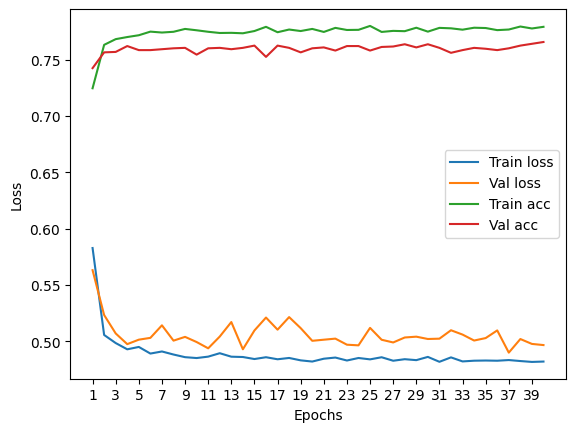

****************************************************************************************************



118it [00:00, 123.52it/s]


Train Epoch: 0 	Loss: 0.572811, Accuracy: 5344/7500 (71%)
Val Epoch: 0 	Loss: 0.523544, Accuracy: 1862/2500 (74%)



118it [00:00, 131.06it/s]


Train Epoch: 1 	Loss: 0.509743, Accuracy: 5707/7500 (76%)
Val Epoch: 1 	Loss: 0.506641, Accuracy: 1908/2500 (76%)



118it [00:00, 127.66it/s]


Train Epoch: 2 	Loss: 0.504616, Accuracy: 5747/7500 (77%)
Val Epoch: 2 	Loss: 0.526581, Accuracy: 1867/2500 (75%)



118it [00:01, 116.83it/s]


Train Epoch: 3 	Loss: 0.505524, Accuracy: 5711/7500 (76%)
Val Epoch: 3 	Loss: 0.510093, Accuracy: 1912/2500 (76%)



118it [00:00, 129.85it/s]


Train Epoch: 4 	Loss: 0.499375, Accuracy: 5756/7500 (77%)
Val Epoch: 4 	Loss: 0.526620, Accuracy: 1917/2500 (77%)



118it [00:00, 139.33it/s]


Train Epoch: 5 	Loss: 0.499550, Accuracy: 5766/7500 (77%)
Val Epoch: 5 	Loss: 0.511310, Accuracy: 1918/2500 (77%)



118it [00:01, 115.40it/s]


Train Epoch: 6 	Loss: 0.503466, Accuracy: 5754/7500 (77%)
Val Epoch: 6 	Loss: 0.537571, Accuracy: 1918/2500 (77%)



118it [00:00, 125.03it/s]


Train Epoch: 7 	Loss: 0.499313, Accuracy: 5768/7500 (77%)
Val Epoch: 7 	Loss: 0.506867, Accuracy: 1904/2500 (76%)



118it [00:00, 132.62it/s]


Train Epoch: 8 	Loss: 0.498100, Accuracy: 5750/7500 (77%)
Val Epoch: 8 	Loss: 0.503914, Accuracy: 1921/2500 (77%)



118it [00:00, 125.47it/s]


Train Epoch: 9 	Loss: 0.495856, Accuracy: 5783/7500 (77%)
Val Epoch: 9 	Loss: 0.505647, Accuracy: 1916/2500 (77%)



118it [00:00, 127.63it/s]


Train Epoch: 10 	Loss: 0.497482, Accuracy: 5754/7500 (77%)
Val Epoch: 10 	Loss: 0.498696, Accuracy: 1929/2500 (77%)



118it [00:00, 124.11it/s]


Train Epoch: 11 	Loss: 0.497098, Accuracy: 5786/7500 (77%)
Val Epoch: 11 	Loss: 0.505697, Accuracy: 1917/2500 (77%)



118it [00:00, 123.56it/s]


Train Epoch: 12 	Loss: 0.496575, Accuracy: 5774/7500 (77%)
Val Epoch: 12 	Loss: 0.507557, Accuracy: 1920/2500 (77%)



118it [00:00, 128.19it/s]


Train Epoch: 13 	Loss: 0.494689, Accuracy: 5763/7500 (77%)
Val Epoch: 13 	Loss: 0.501025, Accuracy: 1918/2500 (77%)



118it [00:00, 135.29it/s]


Train Epoch: 14 	Loss: 0.497853, Accuracy: 5778/7500 (77%)
Val Epoch: 14 	Loss: 0.500601, Accuracy: 1917/2500 (77%)



118it [00:00, 130.58it/s]


Train Epoch: 15 	Loss: 0.494574, Accuracy: 5783/7500 (77%)
Val Epoch: 15 	Loss: 0.519090, Accuracy: 1919/2500 (77%)



118it [00:00, 123.70it/s]


Train Epoch: 16 	Loss: 0.495007, Accuracy: 5756/7500 (77%)
Val Epoch: 16 	Loss: 0.505254, Accuracy: 1922/2500 (77%)



118it [00:00, 130.60it/s]


Train Epoch: 17 	Loss: 0.494444, Accuracy: 5760/7500 (77%)
Val Epoch: 17 	Loss: 0.504174, Accuracy: 1920/2500 (77%)



118it [00:00, 139.54it/s]


Train Epoch: 18 	Loss: 0.493917, Accuracy: 5746/7500 (77%)
Val Epoch: 18 	Loss: 0.518651, Accuracy: 1925/2500 (77%)



118it [00:01, 103.69it/s]


Train Epoch: 19 	Loss: 0.493647, Accuracy: 5771/7500 (77%)
Val Epoch: 19 	Loss: 0.498389, Accuracy: 1925/2500 (77%)



118it [00:01, 100.95it/s]


Train Epoch: 20 	Loss: 0.496543, Accuracy: 5791/7500 (77%)
Val Epoch: 20 	Loss: 0.492684, Accuracy: 1919/2500 (77%)



118it [00:00, 125.08it/s]


Train Epoch: 21 	Loss: 0.491876, Accuracy: 5785/7500 (77%)
Val Epoch: 21 	Loss: 0.513579, Accuracy: 1919/2500 (77%)



118it [00:01, 96.96it/s]


Train Epoch: 22 	Loss: 0.495007, Accuracy: 5785/7500 (77%)
Val Epoch: 22 	Loss: 0.495257, Accuracy: 1925/2500 (77%)



118it [00:02, 58.13it/s]


Train Epoch: 23 	Loss: 0.492357, Accuracy: 5777/7500 (77%)
Val Epoch: 23 	Loss: 0.500606, Accuracy: 1923/2500 (77%)



118it [00:01, 96.92it/s]


Train Epoch: 24 	Loss: 0.493392, Accuracy: 5792/7500 (77%)
Val Epoch: 24 	Loss: 0.500296, Accuracy: 1922/2500 (77%)



118it [00:00, 137.19it/s]


Train Epoch: 25 	Loss: 0.494402, Accuracy: 5787/7500 (77%)
Val Epoch: 25 	Loss: 0.522016, Accuracy: 1905/2500 (76%)



118it [00:00, 132.25it/s]


Train Epoch: 26 	Loss: 0.491622, Accuracy: 5776/7500 (77%)
Val Epoch: 26 	Loss: 0.499238, Accuracy: 1930/2500 (77%)



118it [00:00, 143.13it/s]


Train Epoch: 27 	Loss: 0.492002, Accuracy: 5786/7500 (77%)
Val Epoch: 27 	Loss: 0.504819, Accuracy: 1920/2500 (77%)



118it [00:00, 137.86it/s]


Train Epoch: 28 	Loss: 0.492166, Accuracy: 5802/7500 (77%)
Val Epoch: 28 	Loss: 0.502273, Accuracy: 1927/2500 (77%)



118it [00:00, 130.07it/s]


Train Epoch: 29 	Loss: 0.491251, Accuracy: 5786/7500 (77%)
Val Epoch: 29 	Loss: 0.493775, Accuracy: 1920/2500 (77%)



118it [00:01, 115.66it/s]


Train Epoch: 30 	Loss: 0.493635, Accuracy: 5780/7500 (77%)
Val Epoch: 30 	Loss: 0.501195, Accuracy: 1916/2500 (77%)



118it [00:00, 131.85it/s]


Train Epoch: 31 	Loss: 0.491768, Accuracy: 5798/7500 (77%)
Val Epoch: 31 	Loss: 0.501737, Accuracy: 1924/2500 (77%)



118it [00:00, 130.41it/s]


Train Epoch: 32 	Loss: 0.495306, Accuracy: 5793/7500 (77%)
Val Epoch: 32 	Loss: 0.496581, Accuracy: 1934/2500 (77%)



118it [00:00, 118.77it/s]


Train Epoch: 33 	Loss: 0.490196, Accuracy: 5805/7500 (77%)
Val Epoch: 33 	Loss: 0.497170, Accuracy: 1920/2500 (77%)



118it [00:01, 115.87it/s]


Train Epoch: 34 	Loss: 0.492639, Accuracy: 5782/7500 (77%)
Val Epoch: 34 	Loss: 0.503579, Accuracy: 1911/2500 (76%)



118it [00:00, 128.97it/s]


Train Epoch: 35 	Loss: 0.493120, Accuracy: 5785/7500 (77%)
Val Epoch: 35 	Loss: 0.504269, Accuracy: 1914/2500 (77%)



118it [00:00, 134.94it/s]


Train Epoch: 36 	Loss: 0.492688, Accuracy: 5799/7500 (77%)
Val Epoch: 36 	Loss: 0.514032, Accuracy: 1924/2500 (77%)



118it [00:00, 131.05it/s]


Train Epoch: 37 	Loss: 0.494137, Accuracy: 5811/7500 (77%)
Val Epoch: 37 	Loss: 0.498465, Accuracy: 1920/2500 (77%)



118it [00:00, 123.20it/s]


Train Epoch: 38 	Loss: 0.491089, Accuracy: 5773/7500 (77%)
Val Epoch: 38 	Loss: 0.519305, Accuracy: 1905/2500 (76%)



118it [00:00, 120.73it/s]


Train Epoch: 39 	Loss: 0.491155, Accuracy: 5794/7500 (77%)
Val Epoch: 39 	Loss: 0.495704, Accuracy: 1913/2500 (77%)

Test accuracy:  78.56


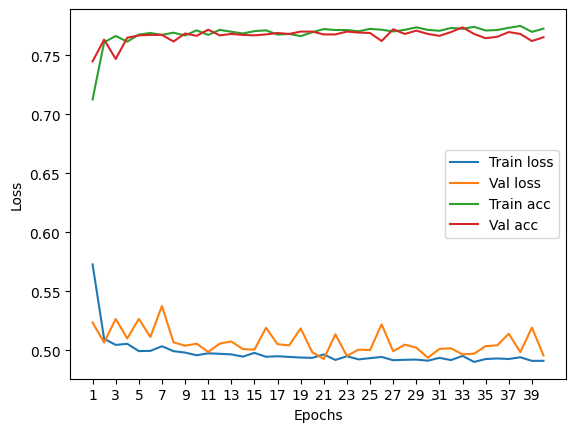

****************************************************************************************************



118it [00:00, 127.30it/s]


Train Epoch: 0 	Loss: 0.587166, Accuracy: 5203/7500 (69%)
Val Epoch: 0 	Loss: 0.534452, Accuracy: 1859/2500 (74%)



118it [00:00, 134.27it/s]


Train Epoch: 1 	Loss: 0.520738, Accuracy: 5620/7500 (75%)
Val Epoch: 1 	Loss: 0.511747, Accuracy: 1911/2500 (76%)



118it [00:00, 129.74it/s]


Train Epoch: 2 	Loss: 0.509210, Accuracy: 5707/7500 (76%)
Val Epoch: 2 	Loss: 0.512403, Accuracy: 1920/2500 (77%)



118it [00:00, 139.60it/s]


Train Epoch: 3 	Loss: 0.500306, Accuracy: 5761/7500 (77%)
Val Epoch: 3 	Loss: 0.503436, Accuracy: 1916/2500 (77%)



118it [00:00, 119.50it/s]


Train Epoch: 4 	Loss: 0.500122, Accuracy: 5756/7500 (77%)
Val Epoch: 4 	Loss: 0.509074, Accuracy: 1941/2500 (78%)



118it [00:00, 122.67it/s]


Train Epoch: 5 	Loss: 0.499584, Accuracy: 5758/7500 (77%)
Val Epoch: 5 	Loss: 0.503215, Accuracy: 1936/2500 (77%)



118it [00:00, 125.95it/s]


Train Epoch: 6 	Loss: 0.496419, Accuracy: 5755/7500 (77%)
Val Epoch: 6 	Loss: 0.491514, Accuracy: 1930/2500 (77%)



118it [00:01, 111.21it/s]


Train Epoch: 7 	Loss: 0.496267, Accuracy: 5759/7500 (77%)
Val Epoch: 7 	Loss: 0.499722, Accuracy: 1926/2500 (77%)



118it [00:00, 132.58it/s]


Train Epoch: 8 	Loss: 0.496409, Accuracy: 5786/7500 (77%)
Val Epoch: 8 	Loss: 0.490298, Accuracy: 1919/2500 (77%)



118it [00:00, 119.34it/s]


Train Epoch: 9 	Loss: 0.494566, Accuracy: 5777/7500 (77%)
Val Epoch: 9 	Loss: 0.494309, Accuracy: 1935/2500 (77%)



118it [00:00, 131.89it/s]


Train Epoch: 10 	Loss: 0.493617, Accuracy: 5744/7500 (77%)
Val Epoch: 10 	Loss: 0.492185, Accuracy: 1939/2500 (78%)



118it [00:00, 121.55it/s]


Train Epoch: 11 	Loss: 0.494337, Accuracy: 5800/7500 (77%)
Val Epoch: 11 	Loss: 0.515964, Accuracy: 1912/2500 (76%)



118it [00:00, 145.76it/s]


Train Epoch: 12 	Loss: 0.499294, Accuracy: 5749/7500 (77%)
Val Epoch: 12 	Loss: 0.498485, Accuracy: 1928/2500 (77%)



118it [00:00, 122.67it/s]


Train Epoch: 13 	Loss: 0.493962, Accuracy: 5771/7500 (77%)
Val Epoch: 13 	Loss: 0.512973, Accuracy: 1930/2500 (77%)



118it [00:00, 131.13it/s]


Train Epoch: 14 	Loss: 0.495589, Accuracy: 5756/7500 (77%)
Val Epoch: 14 	Loss: 0.491927, Accuracy: 1928/2500 (77%)



118it [00:00, 130.32it/s]


Train Epoch: 15 	Loss: 0.494915, Accuracy: 5743/7500 (77%)
Val Epoch: 15 	Loss: 0.506923, Accuracy: 1931/2500 (77%)



118it [00:00, 134.15it/s]


Train Epoch: 16 	Loss: 0.494721, Accuracy: 5759/7500 (77%)
Val Epoch: 16 	Loss: 0.499041, Accuracy: 1942/2500 (78%)



118it [00:00, 119.28it/s]


Train Epoch: 17 	Loss: 0.494814, Accuracy: 5783/7500 (77%)
Val Epoch: 17 	Loss: 0.495878, Accuracy: 1925/2500 (77%)



118it [00:00, 134.66it/s]


Train Epoch: 18 	Loss: 0.494101, Accuracy: 5770/7500 (77%)
Val Epoch: 18 	Loss: 0.499560, Accuracy: 1933/2500 (77%)



118it [00:00, 136.24it/s]


Train Epoch: 19 	Loss: 0.493322, Accuracy: 5778/7500 (77%)
Val Epoch: 19 	Loss: 0.502588, Accuracy: 1915/2500 (77%)



118it [00:00, 121.99it/s]


Train Epoch: 20 	Loss: 0.494369, Accuracy: 5762/7500 (77%)
Val Epoch: 20 	Loss: 0.490808, Accuracy: 1933/2500 (77%)



118it [00:01, 115.68it/s]


Train Epoch: 21 	Loss: 0.493730, Accuracy: 5752/7500 (77%)
Val Epoch: 21 	Loss: 0.494765, Accuracy: 1929/2500 (77%)



118it [00:00, 139.23it/s]


Train Epoch: 22 	Loss: 0.494875, Accuracy: 5765/7500 (77%)
Val Epoch: 22 	Loss: 0.502310, Accuracy: 1935/2500 (77%)



118it [00:00, 133.53it/s]


Train Epoch: 23 	Loss: 0.492464, Accuracy: 5784/7500 (77%)
Val Epoch: 23 	Loss: 0.490747, Accuracy: 1926/2500 (77%)



118it [00:00, 132.08it/s]


Train Epoch: 24 	Loss: 0.494758, Accuracy: 5774/7500 (77%)
Val Epoch: 24 	Loss: 0.500470, Accuracy: 1932/2500 (77%)



118it [00:00, 133.24it/s]


Train Epoch: 25 	Loss: 0.493879, Accuracy: 5745/7500 (77%)
Val Epoch: 25 	Loss: 0.492879, Accuracy: 1931/2500 (77%)



118it [00:00, 139.41it/s]


Train Epoch: 26 	Loss: 0.491175, Accuracy: 5765/7500 (77%)
Val Epoch: 26 	Loss: 0.494388, Accuracy: 1938/2500 (78%)



118it [00:00, 136.47it/s]


Train Epoch: 27 	Loss: 0.493070, Accuracy: 5759/7500 (77%)
Val Epoch: 27 	Loss: 0.499319, Accuracy: 1927/2500 (77%)



118it [00:00, 133.89it/s]


Train Epoch: 28 	Loss: 0.491931, Accuracy: 5770/7500 (77%)
Val Epoch: 28 	Loss: 0.491292, Accuracy: 1933/2500 (77%)



118it [00:00, 123.72it/s]


Train Epoch: 29 	Loss: 0.490623, Accuracy: 5798/7500 (77%)
Val Epoch: 29 	Loss: 0.492908, Accuracy: 1942/2500 (78%)



118it [00:00, 128.06it/s]


Train Epoch: 30 	Loss: 0.493245, Accuracy: 5770/7500 (77%)
Val Epoch: 30 	Loss: 0.492957, Accuracy: 1925/2500 (77%)



118it [00:00, 136.88it/s]


Train Epoch: 31 	Loss: 0.493741, Accuracy: 5751/7500 (77%)
Val Epoch: 31 	Loss: 0.496625, Accuracy: 1923/2500 (77%)



118it [00:00, 131.27it/s]


Train Epoch: 32 	Loss: 0.493001, Accuracy: 5745/7500 (77%)
Val Epoch: 32 	Loss: 0.494670, Accuracy: 1930/2500 (77%)



118it [00:00, 124.76it/s]


Train Epoch: 33 	Loss: 0.493552, Accuracy: 5759/7500 (77%)
Val Epoch: 33 	Loss: 0.496765, Accuracy: 1934/2500 (77%)



118it [00:00, 130.28it/s]


Train Epoch: 34 	Loss: 0.493259, Accuracy: 5761/7500 (77%)
Val Epoch: 34 	Loss: 0.502827, Accuracy: 1941/2500 (78%)



118it [00:01, 106.77it/s]


Train Epoch: 35 	Loss: 0.492333, Accuracy: 5766/7500 (77%)
Val Epoch: 35 	Loss: 0.500307, Accuracy: 1933/2500 (77%)



118it [00:00, 122.05it/s]


Train Epoch: 36 	Loss: 0.493824, Accuracy: 5771/7500 (77%)
Val Epoch: 36 	Loss: 0.511779, Accuracy: 1930/2500 (77%)



118it [00:01, 101.48it/s]


Train Epoch: 37 	Loss: 0.493484, Accuracy: 5784/7500 (77%)
Val Epoch: 37 	Loss: 0.502849, Accuracy: 1935/2500 (77%)



118it [00:00, 122.27it/s]


Train Epoch: 38 	Loss: 0.494140, Accuracy: 5734/7500 (76%)
Val Epoch: 38 	Loss: 0.500821, Accuracy: 1938/2500 (78%)



118it [00:00, 144.06it/s]


Train Epoch: 39 	Loss: 0.489676, Accuracy: 5769/7500 (77%)
Val Epoch: 39 	Loss: 0.501644, Accuracy: 1942/2500 (78%)

Test accuracy:  78.2


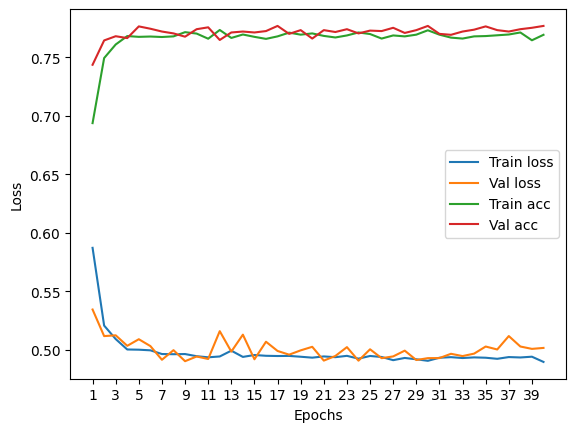

****************************************************************************************************



116it [00:00, 129.68it/s]


Train Epoch: 0 	Loss: 0.590363, Accuracy: 5304/7422 (71%)
Val Epoch: 0 	Loss: 0.526455, Accuracy: 1805/2474 (73%)



116it [00:00, 143.16it/s]


Train Epoch: 1 	Loss: 0.516730, Accuracy: 5588/7422 (75%)
Val Epoch: 1 	Loss: 0.503040, Accuracy: 1916/2474 (77%)



116it [00:00, 140.67it/s]


Train Epoch: 2 	Loss: 0.505923, Accuracy: 5632/7422 (76%)
Val Epoch: 2 	Loss: 0.507154, Accuracy: 1860/2474 (75%)



116it [00:00, 145.91it/s]


Train Epoch: 3 	Loss: 0.506505, Accuracy: 5641/7422 (76%)
Val Epoch: 3 	Loss: 0.498967, Accuracy: 1913/2474 (77%)



116it [00:00, 135.96it/s]


Train Epoch: 4 	Loss: 0.500551, Accuracy: 5663/7422 (76%)
Val Epoch: 4 	Loss: 0.503729, Accuracy: 1887/2474 (76%)



116it [00:00, 142.85it/s]


Train Epoch: 5 	Loss: 0.498737, Accuracy: 5648/7422 (76%)
Val Epoch: 5 	Loss: 0.496209, Accuracy: 1920/2474 (78%)



116it [00:01, 102.81it/s]


Train Epoch: 6 	Loss: 0.498309, Accuracy: 5659/7422 (76%)
Val Epoch: 6 	Loss: 0.496589, Accuracy: 1929/2474 (78%)



116it [00:01, 73.86it/s]


Train Epoch: 7 	Loss: 0.496083, Accuracy: 5670/7422 (76%)
Val Epoch: 7 	Loss: 0.496680, Accuracy: 1913/2474 (77%)



116it [00:01, 75.80it/s]


Train Epoch: 8 	Loss: 0.496253, Accuracy: 5686/7422 (77%)
Val Epoch: 8 	Loss: 0.494158, Accuracy: 1911/2474 (77%)



116it [00:01, 92.41it/s]


Train Epoch: 9 	Loss: 0.495969, Accuracy: 5662/7422 (76%)
Val Epoch: 9 	Loss: 0.499154, Accuracy: 1873/2474 (76%)



116it [00:01, 83.69it/s]


Train Epoch: 10 	Loss: 0.497028, Accuracy: 5676/7422 (76%)
Val Epoch: 10 	Loss: 0.498158, Accuracy: 1920/2474 (78%)



116it [00:01, 90.28it/s]


Train Epoch: 11 	Loss: 0.496940, Accuracy: 5682/7422 (77%)
Val Epoch: 11 	Loss: 0.498717, Accuracy: 1881/2474 (76%)



116it [00:01, 93.92it/s]


Train Epoch: 12 	Loss: 0.493463, Accuracy: 5697/7422 (77%)
Val Epoch: 12 	Loss: 0.501207, Accuracy: 1904/2474 (77%)



116it [00:01, 108.96it/s]


Train Epoch: 13 	Loss: 0.495337, Accuracy: 5664/7422 (76%)
Val Epoch: 13 	Loss: 0.495582, Accuracy: 1918/2474 (78%)



116it [00:01, 94.55it/s]


Train Epoch: 14 	Loss: 0.493288, Accuracy: 5696/7422 (77%)
Val Epoch: 14 	Loss: 0.499220, Accuracy: 1910/2474 (77%)



116it [00:01, 103.68it/s]


Train Epoch: 15 	Loss: 0.495252, Accuracy: 5688/7422 (77%)
Val Epoch: 15 	Loss: 0.500730, Accuracy: 1879/2474 (76%)



116it [00:01, 89.13it/s] 


Train Epoch: 16 	Loss: 0.494619, Accuracy: 5687/7422 (77%)
Val Epoch: 16 	Loss: 0.503941, Accuracy: 1870/2474 (76%)



116it [00:01, 69.23it/s]


Train Epoch: 17 	Loss: 0.494067, Accuracy: 5701/7422 (77%)
Val Epoch: 17 	Loss: 0.496349, Accuracy: 1905/2474 (77%)



116it [00:01, 83.84it/s]


Train Epoch: 18 	Loss: 0.492988, Accuracy: 5686/7422 (77%)
Val Epoch: 18 	Loss: 0.494898, Accuracy: 1919/2474 (78%)



116it [00:01, 89.32it/s]


Train Epoch: 19 	Loss: 0.494843, Accuracy: 5675/7422 (76%)
Val Epoch: 19 	Loss: 0.502152, Accuracy: 1904/2474 (77%)



116it [00:01, 111.79it/s]


Train Epoch: 20 	Loss: 0.492416, Accuracy: 5684/7422 (77%)
Val Epoch: 20 	Loss: 0.496584, Accuracy: 1917/2474 (77%)



116it [00:00, 125.10it/s]


Train Epoch: 21 	Loss: 0.492521, Accuracy: 5698/7422 (77%)
Val Epoch: 21 	Loss: 0.495381, Accuracy: 1915/2474 (77%)



116it [00:01, 99.20it/s]


Train Epoch: 22 	Loss: 0.492225, Accuracy: 5712/7422 (77%)
Val Epoch: 22 	Loss: 0.505081, Accuracy: 1862/2474 (75%)



116it [00:01, 93.73it/s]


Train Epoch: 23 	Loss: 0.491809, Accuracy: 5689/7422 (77%)
Val Epoch: 23 	Loss: 0.494867, Accuracy: 1912/2474 (77%)



116it [00:01, 107.35it/s]


Train Epoch: 24 	Loss: 0.491723, Accuracy: 5687/7422 (77%)
Val Epoch: 24 	Loss: 0.496073, Accuracy: 1911/2474 (77%)



116it [00:01, 92.61it/s]


Train Epoch: 25 	Loss: 0.492668, Accuracy: 5698/7422 (77%)
Val Epoch: 25 	Loss: 0.499878, Accuracy: 1875/2474 (76%)



116it [00:01, 87.47it/s] 


Train Epoch: 26 	Loss: 0.492063, Accuracy: 5702/7422 (77%)
Val Epoch: 26 	Loss: 0.493651, Accuracy: 1913/2474 (77%)



116it [00:01, 83.87it/s]


Train Epoch: 27 	Loss: 0.491455, Accuracy: 5711/7422 (77%)
Val Epoch: 27 	Loss: 0.498216, Accuracy: 1911/2474 (77%)



116it [00:01, 98.08it/s] 


Train Epoch: 28 	Loss: 0.491134, Accuracy: 5696/7422 (77%)
Val Epoch: 28 	Loss: 0.503156, Accuracy: 1865/2474 (75%)



116it [00:00, 136.08it/s]


Train Epoch: 29 	Loss: 0.492585, Accuracy: 5688/7422 (77%)
Val Epoch: 29 	Loss: 0.497122, Accuracy: 1883/2474 (76%)



116it [00:00, 136.01it/s]


Train Epoch: 30 	Loss: 0.490516, Accuracy: 5690/7422 (77%)
Val Epoch: 30 	Loss: 0.502700, Accuracy: 1904/2474 (77%)



116it [00:01, 96.03it/s]


Train Epoch: 31 	Loss: 0.490496, Accuracy: 5684/7422 (77%)
Val Epoch: 31 	Loss: 0.497659, Accuracy: 1902/2474 (77%)



116it [00:01, 108.37it/s]


Train Epoch: 32 	Loss: 0.490343, Accuracy: 5687/7422 (77%)
Val Epoch: 32 	Loss: 0.501079, Accuracy: 1900/2474 (77%)



116it [00:00, 135.57it/s]


Train Epoch: 33 	Loss: 0.490936, Accuracy: 5702/7422 (77%)
Val Epoch: 33 	Loss: 0.498931, Accuracy: 1909/2474 (77%)



116it [00:00, 142.63it/s]


Train Epoch: 34 	Loss: 0.491337, Accuracy: 5702/7422 (77%)
Val Epoch: 34 	Loss: 0.499407, Accuracy: 1910/2474 (77%)



116it [00:01, 104.36it/s]


Train Epoch: 35 	Loss: 0.491843, Accuracy: 5689/7422 (77%)
Val Epoch: 35 	Loss: 0.496030, Accuracy: 1918/2474 (78%)



116it [00:01, 93.25it/s] 


Train Epoch: 36 	Loss: 0.489936, Accuracy: 5714/7422 (77%)
Val Epoch: 36 	Loss: 0.496571, Accuracy: 1899/2474 (77%)



116it [00:01, 89.58it/s]


Train Epoch: 37 	Loss: 0.489839, Accuracy: 5714/7422 (77%)
Val Epoch: 37 	Loss: 0.494908, Accuracy: 1902/2474 (77%)



116it [00:01, 98.02it/s] 


Train Epoch: 38 	Loss: 0.488272, Accuracy: 5698/7422 (77%)
Val Epoch: 38 	Loss: 0.492956, Accuracy: 1910/2474 (77%)



116it [00:01, 68.15it/s]


Train Epoch: 39 	Loss: 0.489073, Accuracy: 5686/7422 (77%)
Val Epoch: 39 	Loss: 0.492678, Accuracy: 1911/2474 (77%)

Test accuracy:  77.20291026677445


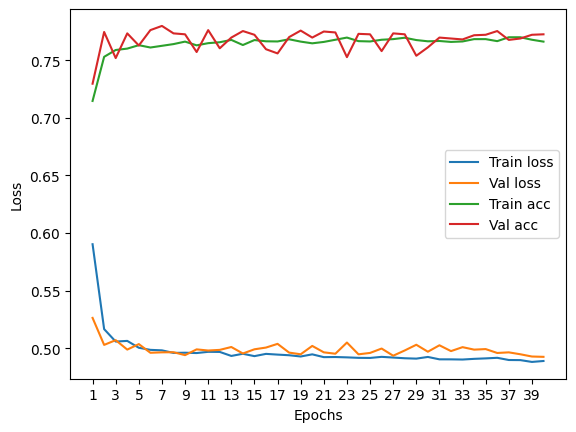

****************************************************************************************************



Particles per jet: 3


118it [00:00, 119.04it/s]


Train Epoch: 0 	Loss: 0.601058, Accuracy: 5091/7500 (68%)
Val Epoch: 0 	Loss: 0.525411, Accuracy: 1895/2500 (76%)



118it [00:00, 120.01it/s]


Train Epoch: 1 	Loss: 0.511202, Accuracy: 5642/7500 (75%)
Val Epoch: 1 	Loss: 0.522554, Accuracy: 1874/2500 (75%)



118it [00:01, 86.06it/s]


Train Epoch: 2 	Loss: 0.502239, Accuracy: 5734/7500 (76%)
Val Epoch: 2 	Loss: 0.488614, Accuracy: 1941/2500 (78%)



118it [00:01, 79.54it/s]


Train Epoch: 3 	Loss: 0.497305, Accuracy: 5725/7500 (76%)
Val Epoch: 3 	Loss: 0.488599, Accuracy: 1960/2500 (78%)



118it [00:01, 105.66it/s]


Train Epoch: 4 	Loss: 0.496944, Accuracy: 5727/7500 (76%)
Val Epoch: 4 	Loss: 0.494681, Accuracy: 1958/2500 (78%)



118it [00:01, 109.81it/s]


Train Epoch: 5 	Loss: 0.493808, Accuracy: 5744/7500 (77%)
Val Epoch: 5 	Loss: 0.499185, Accuracy: 1969/2500 (79%)



118it [00:01, 80.12it/s]


Train Epoch: 6 	Loss: 0.493398, Accuracy: 5747/7500 (77%)
Val Epoch: 6 	Loss: 0.510406, Accuracy: 1909/2500 (76%)



118it [00:01, 100.96it/s]


Train Epoch: 7 	Loss: 0.495702, Accuracy: 5741/7500 (77%)
Val Epoch: 7 	Loss: 0.487808, Accuracy: 1955/2500 (78%)



118it [00:01, 85.82it/s]


Train Epoch: 8 	Loss: 0.497628, Accuracy: 5731/7500 (76%)
Val Epoch: 8 	Loss: 0.483021, Accuracy: 1966/2500 (79%)



118it [00:01, 85.31it/s]


Train Epoch: 9 	Loss: 0.493270, Accuracy: 5737/7500 (76%)
Val Epoch: 9 	Loss: 0.505392, Accuracy: 1920/2500 (77%)



118it [00:01, 112.10it/s]


Train Epoch: 10 	Loss: 0.491643, Accuracy: 5740/7500 (77%)
Val Epoch: 10 	Loss: 0.497019, Accuracy: 1973/2500 (79%)



118it [00:01, 114.94it/s]


Train Epoch: 11 	Loss: 0.494211, Accuracy: 5741/7500 (77%)
Val Epoch: 11 	Loss: 0.478618, Accuracy: 1961/2500 (78%)



118it [00:01, 82.51it/s]


Train Epoch: 12 	Loss: 0.495312, Accuracy: 5711/7500 (76%)
Val Epoch: 12 	Loss: 0.504126, Accuracy: 1925/2500 (77%)



118it [00:01, 73.37it/s]


Train Epoch: 13 	Loss: 0.491675, Accuracy: 5747/7500 (77%)
Val Epoch: 13 	Loss: 0.489388, Accuracy: 1970/2500 (79%)



118it [00:01, 79.09it/s]


Train Epoch: 14 	Loss: 0.491253, Accuracy: 5761/7500 (77%)
Val Epoch: 14 	Loss: 0.478367, Accuracy: 1967/2500 (79%)



118it [00:01, 77.45it/s]


Train Epoch: 15 	Loss: 0.492161, Accuracy: 5728/7500 (76%)
Val Epoch: 15 	Loss: 0.485283, Accuracy: 1967/2500 (79%)



118it [00:01, 79.66it/s]


Train Epoch: 16 	Loss: 0.491935, Accuracy: 5734/7500 (76%)
Val Epoch: 16 	Loss: 0.479786, Accuracy: 1970/2500 (79%)



118it [00:01, 89.81it/s] 


Train Epoch: 17 	Loss: 0.490967, Accuracy: 5724/7500 (76%)
Val Epoch: 17 	Loss: 0.476932, Accuracy: 1964/2500 (79%)



118it [00:01, 114.00it/s]


Train Epoch: 18 	Loss: 0.491977, Accuracy: 5738/7500 (77%)
Val Epoch: 18 	Loss: 0.476250, Accuracy: 1960/2500 (78%)



118it [00:00, 130.52it/s]


Train Epoch: 19 	Loss: 0.491810, Accuracy: 5753/7500 (77%)
Val Epoch: 19 	Loss: 0.484624, Accuracy: 1974/2500 (79%)



118it [00:01, 105.92it/s]


Train Epoch: 20 	Loss: 0.492080, Accuracy: 5714/7500 (76%)
Val Epoch: 20 	Loss: 0.479308, Accuracy: 1965/2500 (79%)



118it [00:00, 119.20it/s]


Train Epoch: 21 	Loss: 0.492616, Accuracy: 5729/7500 (76%)
Val Epoch: 21 	Loss: 0.478068, Accuracy: 1963/2500 (79%)



118it [00:01, 68.00it/s]


Train Epoch: 22 	Loss: 0.492149, Accuracy: 5753/7500 (77%)
Val Epoch: 22 	Loss: 0.475723, Accuracy: 1964/2500 (79%)



118it [00:01, 91.44it/s]


Train Epoch: 23 	Loss: 0.492957, Accuracy: 5738/7500 (77%)
Val Epoch: 23 	Loss: 0.496671, Accuracy: 1938/2500 (78%)



118it [00:00, 120.35it/s]


Train Epoch: 24 	Loss: 0.491325, Accuracy: 5758/7500 (77%)
Val Epoch: 24 	Loss: 0.508299, Accuracy: 1927/2500 (77%)



118it [00:00, 132.13it/s]


Train Epoch: 25 	Loss: 0.493136, Accuracy: 5747/7500 (77%)
Val Epoch: 25 	Loss: 0.517061, Accuracy: 1918/2500 (77%)



118it [00:00, 124.83it/s]


Train Epoch: 26 	Loss: 0.492469, Accuracy: 5730/7500 (76%)
Val Epoch: 26 	Loss: 0.485025, Accuracy: 1946/2500 (78%)



118it [00:00, 121.04it/s]


Train Epoch: 27 	Loss: 0.493708, Accuracy: 5758/7500 (77%)
Val Epoch: 27 	Loss: 0.473203, Accuracy: 1964/2500 (79%)



118it [00:01, 117.79it/s]


Train Epoch: 28 	Loss: 0.491553, Accuracy: 5743/7500 (77%)
Val Epoch: 28 	Loss: 0.497405, Accuracy: 1959/2500 (78%)



118it [00:01, 117.82it/s]


Train Epoch: 29 	Loss: 0.489184, Accuracy: 5741/7500 (77%)
Val Epoch: 29 	Loss: 0.488970, Accuracy: 1964/2500 (79%)



118it [00:00, 136.81it/s]


Train Epoch: 30 	Loss: 0.488568, Accuracy: 5782/7500 (77%)
Val Epoch: 30 	Loss: 0.491406, Accuracy: 1938/2500 (78%)



118it [00:00, 137.01it/s]


Train Epoch: 31 	Loss: 0.490095, Accuracy: 5751/7500 (77%)
Val Epoch: 31 	Loss: 0.482189, Accuracy: 1967/2500 (79%)



118it [00:01, 117.24it/s]


Train Epoch: 32 	Loss: 0.489726, Accuracy: 5753/7500 (77%)
Val Epoch: 32 	Loss: 0.483315, Accuracy: 1954/2500 (78%)



118it [00:00, 136.64it/s]


Train Epoch: 33 	Loss: 0.489694, Accuracy: 5750/7500 (77%)
Val Epoch: 33 	Loss: 0.483148, Accuracy: 1962/2500 (78%)



118it [00:00, 138.89it/s]


Train Epoch: 34 	Loss: 0.490289, Accuracy: 5760/7500 (77%)
Val Epoch: 34 	Loss: 0.504648, Accuracy: 1954/2500 (78%)



118it [00:00, 136.97it/s]


Train Epoch: 35 	Loss: 0.489628, Accuracy: 5753/7500 (77%)
Val Epoch: 35 	Loss: 0.504613, Accuracy: 1936/2500 (77%)



118it [00:00, 132.41it/s]


Train Epoch: 36 	Loss: 0.491122, Accuracy: 5723/7500 (76%)
Val Epoch: 36 	Loss: 0.490718, Accuracy: 1960/2500 (78%)



118it [00:00, 134.70it/s]


Train Epoch: 37 	Loss: 0.488634, Accuracy: 5777/7500 (77%)
Val Epoch: 37 	Loss: 0.480674, Accuracy: 1950/2500 (78%)



118it [00:00, 134.75it/s]


Train Epoch: 38 	Loss: 0.489504, Accuracy: 5774/7500 (77%)
Val Epoch: 38 	Loss: 0.487021, Accuracy: 1956/2500 (78%)



118it [00:00, 123.77it/s]


Train Epoch: 39 	Loss: 0.488333, Accuracy: 5753/7500 (77%)
Val Epoch: 39 	Loss: 0.485446, Accuracy: 1948/2500 (78%)

Test accuracy:  77.72


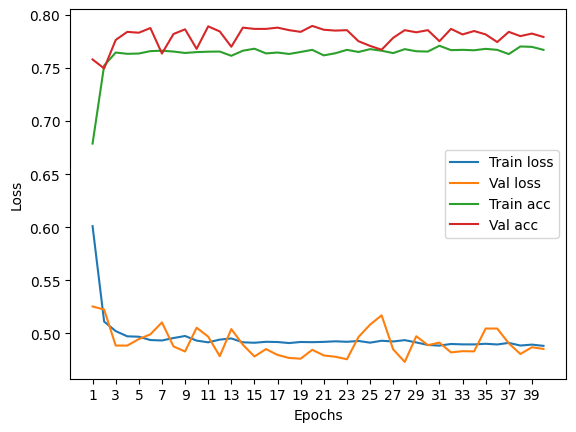

****************************************************************************************************



118it [00:00, 120.24it/s]


Train Epoch: 0 	Loss: 0.608723, Accuracy: 5050/7500 (67%)
Val Epoch: 0 	Loss: 0.538262, Accuracy: 1880/2500 (75%)



118it [00:01, 115.31it/s]


Train Epoch: 1 	Loss: 0.526038, Accuracy: 5602/7500 (75%)
Val Epoch: 1 	Loss: 0.539074, Accuracy: 1818/2500 (73%)



118it [00:00, 130.90it/s]


Train Epoch: 2 	Loss: 0.510115, Accuracy: 5674/7500 (76%)
Val Epoch: 2 	Loss: 0.518253, Accuracy: 1869/2500 (75%)



118it [00:00, 128.00it/s]


Train Epoch: 3 	Loss: 0.504549, Accuracy: 5705/7500 (76%)
Val Epoch: 3 	Loss: 0.503360, Accuracy: 1896/2500 (76%)



118it [00:00, 136.86it/s]


Train Epoch: 4 	Loss: 0.502990, Accuracy: 5702/7500 (76%)
Val Epoch: 4 	Loss: 0.515616, Accuracy: 1914/2500 (77%)



118it [00:01, 115.43it/s]


Train Epoch: 5 	Loss: 0.501374, Accuracy: 5679/7500 (76%)
Val Epoch: 5 	Loss: 0.513098, Accuracy: 1941/2500 (78%)



118it [00:00, 129.26it/s]


Train Epoch: 6 	Loss: 0.501026, Accuracy: 5713/7500 (76%)
Val Epoch: 6 	Loss: 0.508365, Accuracy: 1908/2500 (76%)



118it [00:00, 132.94it/s]


Train Epoch: 7 	Loss: 0.496418, Accuracy: 5724/7500 (76%)
Val Epoch: 7 	Loss: 0.500610, Accuracy: 1931/2500 (77%)



118it [00:01, 116.51it/s]


Train Epoch: 8 	Loss: 0.499681, Accuracy: 5718/7500 (76%)
Val Epoch: 8 	Loss: 0.521838, Accuracy: 1905/2500 (76%)



118it [00:00, 120.74it/s]


Train Epoch: 9 	Loss: 0.499221, Accuracy: 5713/7500 (76%)
Val Epoch: 9 	Loss: 0.500987, Accuracy: 1928/2500 (77%)



118it [00:00, 126.98it/s]


Train Epoch: 10 	Loss: 0.499930, Accuracy: 5717/7500 (76%)
Val Epoch: 10 	Loss: 0.508817, Accuracy: 1925/2500 (77%)



118it [00:01, 113.07it/s]


Train Epoch: 11 	Loss: 0.500438, Accuracy: 5707/7500 (76%)
Val Epoch: 11 	Loss: 0.495420, Accuracy: 1929/2500 (77%)



118it [00:01, 115.33it/s]


Train Epoch: 12 	Loss: 0.496839, Accuracy: 5711/7500 (76%)
Val Epoch: 12 	Loss: 0.502011, Accuracy: 1941/2500 (78%)



118it [00:00, 139.33it/s]


Train Epoch: 13 	Loss: 0.497698, Accuracy: 5734/7500 (76%)
Val Epoch: 13 	Loss: 0.507724, Accuracy: 1928/2500 (77%)



118it [00:00, 123.34it/s]


Train Epoch: 14 	Loss: 0.496020, Accuracy: 5736/7500 (76%)
Val Epoch: 14 	Loss: 0.518791, Accuracy: 1915/2500 (77%)



118it [00:00, 134.15it/s]


Train Epoch: 15 	Loss: 0.498055, Accuracy: 5700/7500 (76%)
Val Epoch: 15 	Loss: 0.509365, Accuracy: 1895/2500 (76%)



118it [00:00, 134.60it/s]


Train Epoch: 16 	Loss: 0.498426, Accuracy: 5725/7500 (76%)
Val Epoch: 16 	Loss: 0.496817, Accuracy: 1929/2500 (77%)



118it [00:01, 116.97it/s]


Train Epoch: 17 	Loss: 0.496345, Accuracy: 5726/7500 (76%)
Val Epoch: 17 	Loss: 0.505118, Accuracy: 1934/2500 (77%)



118it [00:00, 121.77it/s]


Train Epoch: 18 	Loss: 0.496613, Accuracy: 5716/7500 (76%)
Val Epoch: 18 	Loss: 0.498939, Accuracy: 1940/2500 (78%)



118it [00:00, 139.13it/s]


Train Epoch: 19 	Loss: 0.500461, Accuracy: 5704/7500 (76%)
Val Epoch: 19 	Loss: 0.519236, Accuracy: 1938/2500 (78%)



118it [00:00, 130.43it/s]


Train Epoch: 20 	Loss: 0.496037, Accuracy: 5717/7500 (76%)
Val Epoch: 20 	Loss: 0.494796, Accuracy: 1936/2500 (77%)



118it [00:01, 104.32it/s]


Train Epoch: 21 	Loss: 0.495749, Accuracy: 5742/7500 (77%)
Val Epoch: 21 	Loss: 0.499842, Accuracy: 1939/2500 (78%)



118it [00:01, 117.91it/s]


Train Epoch: 22 	Loss: 0.495556, Accuracy: 5706/7500 (76%)
Val Epoch: 22 	Loss: 0.493975, Accuracy: 1945/2500 (78%)



118it [00:00, 125.00it/s]


Train Epoch: 23 	Loss: 0.495093, Accuracy: 5697/7500 (76%)
Val Epoch: 23 	Loss: 0.508839, Accuracy: 1924/2500 (77%)



118it [00:00, 128.64it/s]


Train Epoch: 24 	Loss: 0.499406, Accuracy: 5720/7500 (76%)
Val Epoch: 24 	Loss: 0.524340, Accuracy: 1903/2500 (76%)



118it [00:00, 121.14it/s]


Train Epoch: 25 	Loss: 0.496122, Accuracy: 5733/7500 (76%)
Val Epoch: 25 	Loss: 0.517283, Accuracy: 1910/2500 (76%)



118it [00:01, 116.41it/s]


Train Epoch: 26 	Loss: 0.496048, Accuracy: 5738/7500 (77%)
Val Epoch: 26 	Loss: 0.512254, Accuracy: 1906/2500 (76%)



118it [00:00, 134.24it/s]


Train Epoch: 27 	Loss: 0.496453, Accuracy: 5731/7500 (76%)
Val Epoch: 27 	Loss: 0.500229, Accuracy: 1934/2500 (77%)



118it [00:00, 125.42it/s]


Train Epoch: 28 	Loss: 0.495604, Accuracy: 5723/7500 (76%)
Val Epoch: 28 	Loss: 0.517131, Accuracy: 1890/2500 (76%)



118it [00:00, 129.10it/s]


Train Epoch: 29 	Loss: 0.495149, Accuracy: 5721/7500 (76%)
Val Epoch: 29 	Loss: 0.506261, Accuracy: 1927/2500 (77%)



118it [00:00, 131.87it/s]


Train Epoch: 30 	Loss: 0.498144, Accuracy: 5714/7500 (76%)
Val Epoch: 30 	Loss: 0.501763, Accuracy: 1926/2500 (77%)



118it [00:00, 123.24it/s]


Train Epoch: 31 	Loss: 0.494942, Accuracy: 5726/7500 (76%)
Val Epoch: 31 	Loss: 0.495245, Accuracy: 1926/2500 (77%)



118it [00:00, 122.99it/s]


Train Epoch: 32 	Loss: 0.495426, Accuracy: 5739/7500 (77%)
Val Epoch: 32 	Loss: 0.500840, Accuracy: 1940/2500 (78%)



118it [00:00, 125.33it/s]


Train Epoch: 33 	Loss: 0.494433, Accuracy: 5711/7500 (76%)
Val Epoch: 33 	Loss: 0.521429, Accuracy: 1903/2500 (76%)



118it [00:01, 112.18it/s]


Train Epoch: 34 	Loss: 0.499280, Accuracy: 5719/7500 (76%)
Val Epoch: 34 	Loss: 0.495984, Accuracy: 1926/2500 (77%)



118it [00:00, 122.93it/s]


Train Epoch: 35 	Loss: 0.496709, Accuracy: 5716/7500 (76%)
Val Epoch: 35 	Loss: 0.505868, Accuracy: 1935/2500 (77%)



118it [00:00, 124.20it/s]


Train Epoch: 36 	Loss: 0.493446, Accuracy: 5738/7500 (77%)
Val Epoch: 36 	Loss: 0.503930, Accuracy: 1935/2500 (77%)



118it [00:00, 124.02it/s]


Train Epoch: 37 	Loss: 0.496372, Accuracy: 5725/7500 (76%)
Val Epoch: 37 	Loss: 0.507133, Accuracy: 1917/2500 (77%)



118it [00:00, 138.89it/s]


Train Epoch: 38 	Loss: 0.495604, Accuracy: 5735/7500 (76%)
Val Epoch: 38 	Loss: 0.495915, Accuracy: 1929/2500 (77%)



118it [00:00, 131.38it/s]


Train Epoch: 39 	Loss: 0.494456, Accuracy: 5711/7500 (76%)
Val Epoch: 39 	Loss: 0.506637, Accuracy: 1914/2500 (77%)

Test accuracy:  77.52


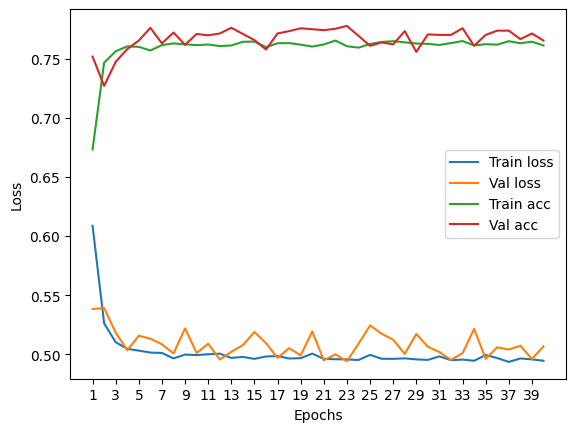

****************************************************************************************************



118it [00:00, 131.34it/s]


Train Epoch: 0 	Loss: 0.591004, Accuracy: 5269/7500 (70%)
Val Epoch: 0 	Loss: 0.499900, Accuracy: 1923/2500 (77%)



118it [00:01, 105.64it/s]


Train Epoch: 1 	Loss: 0.515774, Accuracy: 5684/7500 (76%)
Val Epoch: 1 	Loss: 0.493750, Accuracy: 1942/2500 (78%)



118it [00:00, 131.81it/s]


Train Epoch: 2 	Loss: 0.508849, Accuracy: 5708/7500 (76%)
Val Epoch: 2 	Loss: 0.496190, Accuracy: 1920/2500 (77%)



118it [00:01, 117.39it/s]


Train Epoch: 3 	Loss: 0.506909, Accuracy: 5720/7500 (76%)
Val Epoch: 3 	Loss: 0.496918, Accuracy: 1969/2500 (79%)



118it [00:01, 115.25it/s]


Train Epoch: 4 	Loss: 0.508437, Accuracy: 5718/7500 (76%)
Val Epoch: 4 	Loss: 0.501684, Accuracy: 1902/2500 (76%)



118it [00:01, 105.44it/s]


Train Epoch: 5 	Loss: 0.503627, Accuracy: 5761/7500 (77%)
Val Epoch: 5 	Loss: 0.494171, Accuracy: 1909/2500 (76%)



118it [00:00, 126.27it/s]


Train Epoch: 6 	Loss: 0.501243, Accuracy: 5746/7500 (77%)
Val Epoch: 6 	Loss: 0.493775, Accuracy: 1964/2500 (79%)



118it [00:01, 112.44it/s]


Train Epoch: 7 	Loss: 0.503125, Accuracy: 5731/7500 (76%)
Val Epoch: 7 	Loss: 0.489362, Accuracy: 1968/2500 (79%)



118it [00:01, 116.20it/s]


Train Epoch: 8 	Loss: 0.504147, Accuracy: 5762/7500 (77%)
Val Epoch: 8 	Loss: 0.490707, Accuracy: 1917/2500 (77%)



118it [00:00, 127.46it/s]


Train Epoch: 9 	Loss: 0.500042, Accuracy: 5751/7500 (77%)
Val Epoch: 9 	Loss: 0.492783, Accuracy: 1954/2500 (78%)



118it [00:01, 117.81it/s]


Train Epoch: 10 	Loss: 0.498955, Accuracy: 5768/7500 (77%)
Val Epoch: 10 	Loss: 0.499841, Accuracy: 1959/2500 (78%)



118it [00:00, 131.72it/s]


Train Epoch: 11 	Loss: 0.499817, Accuracy: 5756/7500 (77%)
Val Epoch: 11 	Loss: 0.486185, Accuracy: 1929/2500 (77%)



118it [00:00, 133.87it/s]


Train Epoch: 12 	Loss: 0.496947, Accuracy: 5789/7500 (77%)
Val Epoch: 12 	Loss: 0.493889, Accuracy: 1950/2500 (78%)



118it [00:00, 123.40it/s]


Train Epoch: 13 	Loss: 0.494735, Accuracy: 5780/7500 (77%)
Val Epoch: 13 	Loss: 0.501353, Accuracy: 1946/2500 (78%)



118it [00:00, 139.20it/s]


Train Epoch: 14 	Loss: 0.495685, Accuracy: 5763/7500 (77%)
Val Epoch: 14 	Loss: 0.478152, Accuracy: 1963/2500 (79%)



118it [00:00, 131.86it/s]


Train Epoch: 15 	Loss: 0.494716, Accuracy: 5781/7500 (77%)
Val Epoch: 15 	Loss: 0.478275, Accuracy: 1959/2500 (78%)



118it [00:00, 134.40it/s]


Train Epoch: 16 	Loss: 0.492388, Accuracy: 5787/7500 (77%)
Val Epoch: 16 	Loss: 0.476225, Accuracy: 1962/2500 (78%)



118it [00:00, 121.00it/s]


Train Epoch: 17 	Loss: 0.494563, Accuracy: 5769/7500 (77%)
Val Epoch: 17 	Loss: 0.495189, Accuracy: 1912/2500 (76%)



118it [00:00, 125.27it/s]


Train Epoch: 18 	Loss: 0.492671, Accuracy: 5794/7500 (77%)
Val Epoch: 18 	Loss: 0.484650, Accuracy: 1959/2500 (78%)



118it [00:00, 121.51it/s]


Train Epoch: 19 	Loss: 0.490351, Accuracy: 5810/7500 (77%)
Val Epoch: 19 	Loss: 0.481150, Accuracy: 1953/2500 (78%)



118it [00:00, 121.45it/s]


Train Epoch: 20 	Loss: 0.489623, Accuracy: 5785/7500 (77%)
Val Epoch: 20 	Loss: 0.493317, Accuracy: 1942/2500 (78%)



118it [00:01, 101.52it/s]


Train Epoch: 21 	Loss: 0.489930, Accuracy: 5810/7500 (77%)
Val Epoch: 21 	Loss: 0.477985, Accuracy: 1965/2500 (79%)



118it [00:01, 84.44it/s]


Train Epoch: 22 	Loss: 0.490019, Accuracy: 5804/7500 (77%)
Val Epoch: 22 	Loss: 0.478220, Accuracy: 1950/2500 (78%)



118it [00:01, 64.04it/s]


Train Epoch: 23 	Loss: 0.491509, Accuracy: 5817/7500 (78%)
Val Epoch: 23 	Loss: 0.479654, Accuracy: 1953/2500 (78%)



118it [00:01, 109.22it/s]


Train Epoch: 24 	Loss: 0.488390, Accuracy: 5792/7500 (77%)
Val Epoch: 24 	Loss: 0.488717, Accuracy: 1930/2500 (77%)



118it [00:00, 132.28it/s]


Train Epoch: 25 	Loss: 0.490101, Accuracy: 5802/7500 (77%)
Val Epoch: 25 	Loss: 0.481458, Accuracy: 1959/2500 (78%)



118it [00:00, 127.66it/s]


Train Epoch: 26 	Loss: 0.488882, Accuracy: 5814/7500 (78%)
Val Epoch: 26 	Loss: 0.490824, Accuracy: 1950/2500 (78%)



118it [00:00, 121.35it/s]


Train Epoch: 27 	Loss: 0.489673, Accuracy: 5794/7500 (77%)
Val Epoch: 27 	Loss: 0.492633, Accuracy: 1956/2500 (78%)



118it [00:00, 131.90it/s]


Train Epoch: 28 	Loss: 0.490228, Accuracy: 5804/7500 (77%)
Val Epoch: 28 	Loss: 0.476734, Accuracy: 1960/2500 (78%)



118it [00:00, 136.71it/s]


Train Epoch: 29 	Loss: 0.488407, Accuracy: 5808/7500 (77%)
Val Epoch: 29 	Loss: 0.482516, Accuracy: 1953/2500 (78%)



118it [00:00, 119.31it/s]


Train Epoch: 30 	Loss: 0.490848, Accuracy: 5797/7500 (77%)
Val Epoch: 30 	Loss: 0.483954, Accuracy: 1957/2500 (78%)



118it [00:00, 125.47it/s]


Train Epoch: 31 	Loss: 0.490028, Accuracy: 5801/7500 (77%)
Val Epoch: 31 	Loss: 0.503359, Accuracy: 1959/2500 (78%)



118it [00:00, 139.20it/s]


Train Epoch: 32 	Loss: 0.488363, Accuracy: 5805/7500 (77%)
Val Epoch: 32 	Loss: 0.485972, Accuracy: 1959/2500 (78%)



118it [00:00, 121.24it/s]


Train Epoch: 33 	Loss: 0.488775, Accuracy: 5818/7500 (78%)
Val Epoch: 33 	Loss: 0.496970, Accuracy: 1932/2500 (77%)



118it [00:00, 127.45it/s]


Train Epoch: 34 	Loss: 0.486183, Accuracy: 5800/7500 (77%)
Val Epoch: 34 	Loss: 0.489466, Accuracy: 1962/2500 (78%)



118it [00:00, 119.15it/s]


Train Epoch: 35 	Loss: 0.490150, Accuracy: 5809/7500 (77%)
Val Epoch: 35 	Loss: 0.481824, Accuracy: 1962/2500 (78%)



118it [00:00, 125.02it/s]


Train Epoch: 36 	Loss: 0.488962, Accuracy: 5775/7500 (77%)
Val Epoch: 36 	Loss: 0.490736, Accuracy: 1952/2500 (78%)



118it [00:00, 120.54it/s]


Train Epoch: 37 	Loss: 0.487730, Accuracy: 5796/7500 (77%)
Val Epoch: 37 	Loss: 0.481072, Accuracy: 1955/2500 (78%)



118it [00:01, 111.90it/s]


Train Epoch: 38 	Loss: 0.489622, Accuracy: 5763/7500 (77%)
Val Epoch: 38 	Loss: 0.489593, Accuracy: 1954/2500 (78%)



118it [00:00, 127.13it/s]


Train Epoch: 39 	Loss: 0.487892, Accuracy: 5821/7500 (78%)
Val Epoch: 39 	Loss: 0.494628, Accuracy: 1951/2500 (78%)

Test accuracy:  77.12


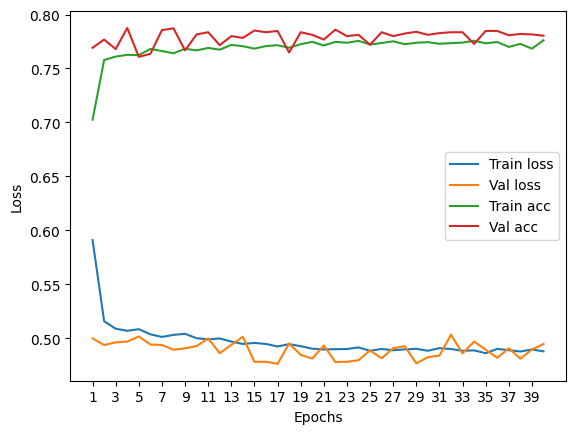

****************************************************************************************************



118it [00:00, 140.96it/s]


Train Epoch: 0 	Loss: 0.590395, Accuracy: 5342/7500 (71%)
Val Epoch: 0 	Loss: 0.519099, Accuracy: 1894/2500 (76%)



118it [00:00, 125.98it/s]


Train Epoch: 1 	Loss: 0.499368, Accuracy: 5748/7500 (77%)
Val Epoch: 1 	Loss: 0.514538, Accuracy: 1897/2500 (76%)



118it [00:00, 120.79it/s]


Train Epoch: 2 	Loss: 0.495571, Accuracy: 5785/7500 (77%)
Val Epoch: 2 	Loss: 0.509286, Accuracy: 1899/2500 (76%)



118it [00:00, 129.93it/s]


Train Epoch: 3 	Loss: 0.493870, Accuracy: 5778/7500 (77%)
Val Epoch: 3 	Loss: 0.511673, Accuracy: 1892/2500 (76%)



118it [00:01, 109.96it/s]


Train Epoch: 4 	Loss: 0.496868, Accuracy: 5799/7500 (77%)
Val Epoch: 4 	Loss: 0.508398, Accuracy: 1897/2500 (76%)



118it [00:00, 133.66it/s]


Train Epoch: 5 	Loss: 0.490878, Accuracy: 5799/7500 (77%)
Val Epoch: 5 	Loss: 0.503098, Accuracy: 1904/2500 (76%)



118it [00:01, 111.88it/s]


Train Epoch: 6 	Loss: 0.489683, Accuracy: 5837/7500 (78%)
Val Epoch: 6 	Loss: 0.513190, Accuracy: 1896/2500 (76%)



118it [00:01, 73.74it/s]


Train Epoch: 7 	Loss: 0.488589, Accuracy: 5797/7500 (77%)
Val Epoch: 7 	Loss: 0.497914, Accuracy: 1907/2500 (76%)



118it [00:01, 94.91it/s] 


Train Epoch: 8 	Loss: 0.486554, Accuracy: 5823/7500 (78%)
Val Epoch: 8 	Loss: 0.513504, Accuracy: 1908/2500 (76%)



118it [00:00, 123.16it/s]


Train Epoch: 9 	Loss: 0.490881, Accuracy: 5805/7500 (77%)
Val Epoch: 9 	Loss: 0.497808, Accuracy: 1894/2500 (76%)



118it [00:00, 120.16it/s]


Train Epoch: 10 	Loss: 0.485502, Accuracy: 5836/7500 (78%)
Val Epoch: 10 	Loss: 0.498341, Accuracy: 1894/2500 (76%)



118it [00:00, 119.17it/s]


Train Epoch: 11 	Loss: 0.485431, Accuracy: 5844/7500 (78%)
Val Epoch: 11 	Loss: 0.501880, Accuracy: 1896/2500 (76%)



118it [00:00, 120.76it/s]


Train Epoch: 12 	Loss: 0.485690, Accuracy: 5797/7500 (77%)
Val Epoch: 12 	Loss: 0.504017, Accuracy: 1890/2500 (76%)



118it [00:00, 127.65it/s]


Train Epoch: 13 	Loss: 0.483635, Accuracy: 5824/7500 (78%)
Val Epoch: 13 	Loss: 0.498747, Accuracy: 1903/2500 (76%)



118it [00:01, 85.14it/s]


Train Epoch: 14 	Loss: 0.483688, Accuracy: 5835/7500 (78%)
Val Epoch: 14 	Loss: 0.502808, Accuracy: 1894/2500 (76%)



118it [00:01, 109.30it/s]


Train Epoch: 15 	Loss: 0.485113, Accuracy: 5797/7500 (77%)
Val Epoch: 15 	Loss: 0.510830, Accuracy: 1893/2500 (76%)



118it [00:01, 83.68it/s]


Train Epoch: 16 	Loss: 0.484253, Accuracy: 5819/7500 (78%)
Val Epoch: 16 	Loss: 0.517980, Accuracy: 1882/2500 (75%)



118it [00:01, 60.49it/s]


Train Epoch: 17 	Loss: 0.484589, Accuracy: 5821/7500 (78%)
Val Epoch: 17 	Loss: 0.496394, Accuracy: 1911/2500 (76%)



118it [00:01, 74.15it/s]


Train Epoch: 18 	Loss: 0.485105, Accuracy: 5810/7500 (77%)
Val Epoch: 18 	Loss: 0.500979, Accuracy: 1895/2500 (76%)



118it [00:01, 96.86it/s]


Train Epoch: 19 	Loss: 0.484811, Accuracy: 5851/7500 (78%)
Val Epoch: 19 	Loss: 0.513672, Accuracy: 1905/2500 (76%)



118it [00:01, 100.72it/s]


Train Epoch: 20 	Loss: 0.484875, Accuracy: 5845/7500 (78%)
Val Epoch: 20 	Loss: 0.510018, Accuracy: 1900/2500 (76%)



118it [00:01, 84.00it/s]


Train Epoch: 21 	Loss: 0.483564, Accuracy: 5827/7500 (78%)
Val Epoch: 21 	Loss: 0.501110, Accuracy: 1904/2500 (76%)



118it [00:01, 84.81it/s]


Train Epoch: 22 	Loss: 0.481796, Accuracy: 5831/7500 (78%)
Val Epoch: 22 	Loss: 0.512631, Accuracy: 1909/2500 (76%)



118it [00:01, 87.74it/s]


Train Epoch: 23 	Loss: 0.483437, Accuracy: 5834/7500 (78%)
Val Epoch: 23 	Loss: 0.518556, Accuracy: 1908/2500 (76%)



118it [00:01, 99.48it/s]


Train Epoch: 24 	Loss: 0.488451, Accuracy: 5801/7500 (77%)
Val Epoch: 24 	Loss: 0.516414, Accuracy: 1908/2500 (76%)



118it [00:01, 69.76it/s]


Train Epoch: 25 	Loss: 0.485805, Accuracy: 5808/7500 (77%)
Val Epoch: 25 	Loss: 0.501089, Accuracy: 1904/2500 (76%)



118it [00:01, 76.92it/s]


Train Epoch: 26 	Loss: 0.482432, Accuracy: 5847/7500 (78%)
Val Epoch: 26 	Loss: 0.512422, Accuracy: 1902/2500 (76%)



118it [00:01, 75.41it/s]


Train Epoch: 27 	Loss: 0.484536, Accuracy: 5828/7500 (78%)
Val Epoch: 27 	Loss: 0.500805, Accuracy: 1900/2500 (76%)



118it [00:01, 82.21it/s]


Train Epoch: 28 	Loss: 0.482238, Accuracy: 5834/7500 (78%)
Val Epoch: 28 	Loss: 0.495624, Accuracy: 1899/2500 (76%)



118it [00:01, 81.98it/s]


Train Epoch: 29 	Loss: 0.483571, Accuracy: 5824/7500 (78%)
Val Epoch: 29 	Loss: 0.511181, Accuracy: 1899/2500 (76%)



118it [00:00, 127.26it/s]


Train Epoch: 30 	Loss: 0.481901, Accuracy: 5832/7500 (78%)
Val Epoch: 30 	Loss: 0.505031, Accuracy: 1910/2500 (76%)



118it [00:00, 118.35it/s]


Train Epoch: 31 	Loss: 0.481456, Accuracy: 5831/7500 (78%)
Val Epoch: 31 	Loss: 0.511299, Accuracy: 1889/2500 (76%)



118it [00:00, 127.35it/s]


Train Epoch: 32 	Loss: 0.484689, Accuracy: 5830/7500 (78%)
Val Epoch: 32 	Loss: 0.507151, Accuracy: 1893/2500 (76%)



118it [00:00, 120.16it/s]


Train Epoch: 33 	Loss: 0.483666, Accuracy: 5810/7500 (77%)
Val Epoch: 33 	Loss: 0.514770, Accuracy: 1909/2500 (76%)



118it [00:00, 121.34it/s]


Train Epoch: 34 	Loss: 0.483591, Accuracy: 5834/7500 (78%)
Val Epoch: 34 	Loss: 0.496593, Accuracy: 1903/2500 (76%)



118it [00:00, 137.11it/s]


Train Epoch: 35 	Loss: 0.483564, Accuracy: 5832/7500 (78%)
Val Epoch: 35 	Loss: 0.515094, Accuracy: 1897/2500 (76%)



118it [00:00, 125.24it/s]


Train Epoch: 36 	Loss: 0.483576, Accuracy: 5839/7500 (78%)
Val Epoch: 36 	Loss: 0.511115, Accuracy: 1901/2500 (76%)



118it [00:00, 134.89it/s]


Train Epoch: 37 	Loss: 0.484659, Accuracy: 5836/7500 (78%)
Val Epoch: 37 	Loss: 0.502296, Accuracy: 1905/2500 (76%)



118it [00:00, 137.16it/s]


Train Epoch: 38 	Loss: 0.481553, Accuracy: 5831/7500 (78%)
Val Epoch: 38 	Loss: 0.506346, Accuracy: 1910/2500 (76%)



118it [00:01, 117.69it/s]


Train Epoch: 39 	Loss: 0.484897, Accuracy: 5839/7500 (78%)
Val Epoch: 39 	Loss: 0.510878, Accuracy: 1892/2500 (76%)

Test accuracy:  77.60000000000001


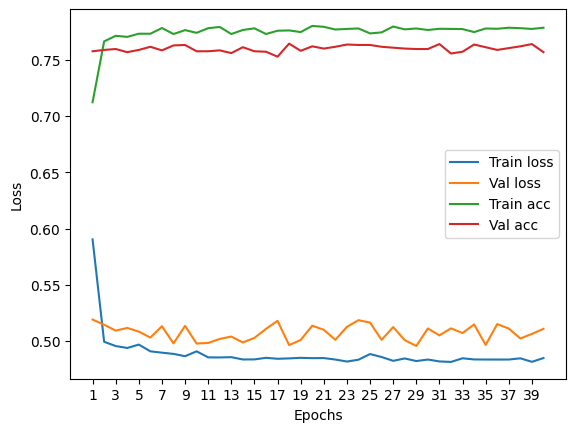

****************************************************************************************************



118it [00:00, 144.96it/s]


Train Epoch: 0 	Loss: 0.607311, Accuracy: 5085/7500 (68%)
Val Epoch: 0 	Loss: 0.528855, Accuracy: 1873/2500 (75%)



118it [00:00, 127.32it/s]


Train Epoch: 1 	Loss: 0.512258, Accuracy: 5694/7500 (76%)
Val Epoch: 1 	Loss: 0.518082, Accuracy: 1902/2500 (76%)



118it [00:00, 121.35it/s]


Train Epoch: 2 	Loss: 0.502241, Accuracy: 5731/7500 (76%)
Val Epoch: 2 	Loss: 0.510370, Accuracy: 1923/2500 (77%)



118it [00:00, 119.22it/s]


Train Epoch: 3 	Loss: 0.496795, Accuracy: 5761/7500 (77%)
Val Epoch: 3 	Loss: 0.504865, Accuracy: 1896/2500 (76%)



118it [00:00, 129.99it/s]


Train Epoch: 4 	Loss: 0.493305, Accuracy: 5783/7500 (77%)
Val Epoch: 4 	Loss: 0.497489, Accuracy: 1901/2500 (76%)



118it [00:00, 131.80it/s]


Train Epoch: 5 	Loss: 0.493414, Accuracy: 5768/7500 (77%)
Val Epoch: 5 	Loss: 0.502249, Accuracy: 1891/2500 (76%)



118it [00:00, 133.74it/s]


Train Epoch: 6 	Loss: 0.491639, Accuracy: 5779/7500 (77%)
Val Epoch: 6 	Loss: 0.500565, Accuracy: 1932/2500 (77%)



118it [00:00, 133.22it/s]


Train Epoch: 7 	Loss: 0.492388, Accuracy: 5807/7500 (77%)
Val Epoch: 7 	Loss: 0.496012, Accuracy: 1922/2500 (77%)



118it [00:00, 138.68it/s]


Train Epoch: 8 	Loss: 0.490403, Accuracy: 5793/7500 (77%)
Val Epoch: 8 	Loss: 0.500694, Accuracy: 1921/2500 (77%)



118it [00:00, 130.15it/s]


Train Epoch: 9 	Loss: 0.490248, Accuracy: 5794/7500 (77%)
Val Epoch: 9 	Loss: 0.506613, Accuracy: 1903/2500 (76%)



118it [00:00, 135.66it/s]


Train Epoch: 10 	Loss: 0.492089, Accuracy: 5786/7500 (77%)
Val Epoch: 10 	Loss: 0.511150, Accuracy: 1926/2500 (77%)



118it [00:00, 126.95it/s]


Train Epoch: 11 	Loss: 0.490401, Accuracy: 5806/7500 (77%)
Val Epoch: 11 	Loss: 0.496720, Accuracy: 1944/2500 (78%)



118it [00:00, 127.06it/s]


Train Epoch: 12 	Loss: 0.488942, Accuracy: 5789/7500 (77%)
Val Epoch: 12 	Loss: 0.497037, Accuracy: 1929/2500 (77%)



118it [00:00, 132.68it/s]


Train Epoch: 13 	Loss: 0.492205, Accuracy: 5796/7500 (77%)
Val Epoch: 13 	Loss: 0.500553, Accuracy: 1949/2500 (78%)



118it [00:00, 142.43it/s]


Train Epoch: 14 	Loss: 0.491319, Accuracy: 5796/7500 (77%)
Val Epoch: 14 	Loss: 0.498146, Accuracy: 1929/2500 (77%)



118it [00:00, 143.95it/s]


Train Epoch: 15 	Loss: 0.488890, Accuracy: 5801/7500 (77%)
Val Epoch: 15 	Loss: 0.512246, Accuracy: 1903/2500 (76%)



118it [00:01, 111.73it/s]


Train Epoch: 16 	Loss: 0.491533, Accuracy: 5810/7500 (77%)
Val Epoch: 16 	Loss: 0.515313, Accuracy: 1940/2500 (78%)



118it [00:02, 49.55it/s]


Train Epoch: 17 	Loss: 0.488653, Accuracy: 5795/7500 (77%)
Val Epoch: 17 	Loss: 0.495167, Accuracy: 1921/2500 (77%)



118it [00:01, 62.38it/s]


Train Epoch: 18 	Loss: 0.487023, Accuracy: 5803/7500 (77%)
Val Epoch: 18 	Loss: 0.507188, Accuracy: 1927/2500 (77%)



118it [00:01, 78.24it/s]


Train Epoch: 19 	Loss: 0.487371, Accuracy: 5801/7500 (77%)
Val Epoch: 19 	Loss: 0.502960, Accuracy: 1921/2500 (77%)



118it [00:01, 86.50it/s]


Train Epoch: 20 	Loss: 0.488230, Accuracy: 5799/7500 (77%)
Val Epoch: 20 	Loss: 0.501178, Accuracy: 1916/2500 (77%)



118it [00:01, 76.26it/s]


Train Epoch: 21 	Loss: 0.487060, Accuracy: 5808/7500 (77%)
Val Epoch: 21 	Loss: 0.498341, Accuracy: 1924/2500 (77%)



118it [00:01, 89.85it/s] 


Train Epoch: 22 	Loss: 0.489537, Accuracy: 5798/7500 (77%)
Val Epoch: 22 	Loss: 0.504803, Accuracy: 1942/2500 (78%)



118it [00:01, 117.96it/s]


Train Epoch: 23 	Loss: 0.491835, Accuracy: 5785/7500 (77%)
Val Epoch: 23 	Loss: 0.503336, Accuracy: 1905/2500 (76%)



118it [00:00, 124.22it/s]


Train Epoch: 24 	Loss: 0.488533, Accuracy: 5787/7500 (77%)
Val Epoch: 24 	Loss: 0.500527, Accuracy: 1898/2500 (76%)



118it [00:01, 115.88it/s]


Train Epoch: 25 	Loss: 0.488306, Accuracy: 5795/7500 (77%)
Val Epoch: 25 	Loss: 0.501667, Accuracy: 1933/2500 (77%)



118it [00:01, 97.07it/s]


Train Epoch: 26 	Loss: 0.486350, Accuracy: 5803/7500 (77%)
Val Epoch: 26 	Loss: 0.497972, Accuracy: 1902/2500 (76%)



118it [00:01, 90.35it/s]


Train Epoch: 27 	Loss: 0.487814, Accuracy: 5803/7500 (77%)
Val Epoch: 27 	Loss: 0.511370, Accuracy: 1937/2500 (77%)



118it [00:01, 81.80it/s]


Train Epoch: 28 	Loss: 0.487232, Accuracy: 5800/7500 (77%)
Val Epoch: 28 	Loss: 0.514894, Accuracy: 1932/2500 (77%)



118it [00:01, 86.51it/s]


Train Epoch: 29 	Loss: 0.488982, Accuracy: 5803/7500 (77%)
Val Epoch: 29 	Loss: 0.495132, Accuracy: 1909/2500 (76%)



118it [00:01, 114.18it/s]


Train Epoch: 30 	Loss: 0.486487, Accuracy: 5802/7500 (77%)
Val Epoch: 30 	Loss: 0.495528, Accuracy: 1937/2500 (77%)



118it [00:01, 75.18it/s]


Train Epoch: 31 	Loss: 0.486890, Accuracy: 5788/7500 (77%)
Val Epoch: 31 	Loss: 0.496153, Accuracy: 1923/2500 (77%)



118it [00:01, 103.06it/s]


Train Epoch: 32 	Loss: 0.486151, Accuracy: 5807/7500 (77%)
Val Epoch: 32 	Loss: 0.493582, Accuracy: 1921/2500 (77%)



118it [00:01, 114.78it/s]


Train Epoch: 33 	Loss: 0.486011, Accuracy: 5774/7500 (77%)
Val Epoch: 33 	Loss: 0.497284, Accuracy: 1897/2500 (76%)



118it [00:00, 123.24it/s]


Train Epoch: 34 	Loss: 0.486231, Accuracy: 5807/7500 (77%)
Val Epoch: 34 	Loss: 0.501429, Accuracy: 1924/2500 (77%)



118it [00:01, 117.45it/s]


Train Epoch: 35 	Loss: 0.486319, Accuracy: 5784/7500 (77%)
Val Epoch: 35 	Loss: 0.514908, Accuracy: 1910/2500 (76%)



118it [00:00, 136.33it/s]


Train Epoch: 36 	Loss: 0.486999, Accuracy: 5792/7500 (77%)
Val Epoch: 36 	Loss: 0.512248, Accuracy: 1940/2500 (78%)



118it [00:00, 139.25it/s]


Train Epoch: 37 	Loss: 0.485681, Accuracy: 5813/7500 (78%)
Val Epoch: 37 	Loss: 0.510968, Accuracy: 1903/2500 (76%)



118it [00:01, 103.01it/s]


Train Epoch: 38 	Loss: 0.485265, Accuracy: 5824/7500 (78%)
Val Epoch: 38 	Loss: 0.501881, Accuracy: 1935/2500 (77%)



118it [00:01, 117.44it/s]


Train Epoch: 39 	Loss: 0.484446, Accuracy: 5791/7500 (77%)
Val Epoch: 39 	Loss: 0.509557, Accuracy: 1908/2500 (76%)

Test accuracy:  76.96


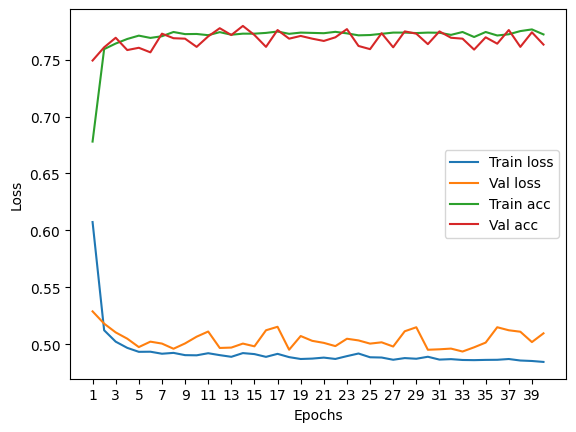

****************************************************************************************************



118it [00:00, 123.17it/s]


Train Epoch: 0 	Loss: 0.602993, Accuracy: 5161/7500 (69%)
Val Epoch: 0 	Loss: 0.531448, Accuracy: 1884/2500 (75%)



118it [00:00, 124.92it/s]


Train Epoch: 1 	Loss: 0.518098, Accuracy: 5663/7500 (76%)
Val Epoch: 1 	Loss: 0.514269, Accuracy: 1910/2500 (76%)



118it [00:00, 136.71it/s]


Train Epoch: 2 	Loss: 0.502264, Accuracy: 5760/7500 (77%)
Val Epoch: 2 	Loss: 0.510500, Accuracy: 1902/2500 (76%)



118it [00:00, 129.54it/s]


Train Epoch: 3 	Loss: 0.499700, Accuracy: 5784/7500 (77%)
Val Epoch: 3 	Loss: 0.503771, Accuracy: 1914/2500 (77%)



118it [00:00, 134.41it/s]


Train Epoch: 4 	Loss: 0.496441, Accuracy: 5808/7500 (77%)
Val Epoch: 4 	Loss: 0.506298, Accuracy: 1921/2500 (77%)



118it [00:00, 131.81it/s]


Train Epoch: 5 	Loss: 0.497677, Accuracy: 5773/7500 (77%)
Val Epoch: 5 	Loss: 0.515179, Accuracy: 1905/2500 (76%)



118it [00:00, 132.23it/s]


Train Epoch: 6 	Loss: 0.496040, Accuracy: 5798/7500 (77%)
Val Epoch: 6 	Loss: 0.513161, Accuracy: 1922/2500 (77%)



118it [00:00, 129.63it/s]


Train Epoch: 7 	Loss: 0.492116, Accuracy: 5792/7500 (77%)
Val Epoch: 7 	Loss: 0.525820, Accuracy: 1898/2500 (76%)



118it [00:00, 121.25it/s]


Train Epoch: 8 	Loss: 0.496053, Accuracy: 5808/7500 (77%)
Val Epoch: 8 	Loss: 0.507823, Accuracy: 1919/2500 (77%)



118it [00:00, 129.55it/s]


Train Epoch: 9 	Loss: 0.495121, Accuracy: 5769/7500 (77%)
Val Epoch: 9 	Loss: 0.510906, Accuracy: 1911/2500 (76%)



118it [00:00, 131.61it/s]


Train Epoch: 10 	Loss: 0.492934, Accuracy: 5795/7500 (77%)
Val Epoch: 10 	Loss: 0.520053, Accuracy: 1910/2500 (76%)



118it [00:01, 104.02it/s]


Train Epoch: 11 	Loss: 0.491611, Accuracy: 5796/7500 (77%)
Val Epoch: 11 	Loss: 0.505446, Accuracy: 1914/2500 (77%)



118it [00:00, 121.00it/s]


Train Epoch: 12 	Loss: 0.494450, Accuracy: 5793/7500 (77%)
Val Epoch: 12 	Loss: 0.510506, Accuracy: 1908/2500 (76%)



118it [00:01, 116.10it/s]


Train Epoch: 13 	Loss: 0.493528, Accuracy: 5800/7500 (77%)
Val Epoch: 13 	Loss: 0.501672, Accuracy: 1911/2500 (76%)



118it [00:01, 109.20it/s]


Train Epoch: 14 	Loss: 0.492446, Accuracy: 5799/7500 (77%)
Val Epoch: 14 	Loss: 0.514256, Accuracy: 1906/2500 (76%)



118it [00:01, 117.41it/s]


Train Epoch: 15 	Loss: 0.493048, Accuracy: 5812/7500 (77%)
Val Epoch: 15 	Loss: 0.511183, Accuracy: 1907/2500 (76%)



118it [00:00, 123.52it/s]


Train Epoch: 16 	Loss: 0.492562, Accuracy: 5824/7500 (78%)
Val Epoch: 16 	Loss: 0.519333, Accuracy: 1904/2500 (76%)



118it [00:00, 136.25it/s]


Train Epoch: 17 	Loss: 0.492829, Accuracy: 5813/7500 (78%)
Val Epoch: 17 	Loss: 0.515531, Accuracy: 1914/2500 (77%)



118it [00:00, 124.60it/s]


Train Epoch: 18 	Loss: 0.492760, Accuracy: 5800/7500 (77%)
Val Epoch: 18 	Loss: 0.505003, Accuracy: 1911/2500 (76%)



118it [00:00, 118.93it/s]


Train Epoch: 19 	Loss: 0.490493, Accuracy: 5800/7500 (77%)
Val Epoch: 19 	Loss: 0.540824, Accuracy: 1913/2500 (77%)



118it [00:00, 127.57it/s]


Train Epoch: 20 	Loss: 0.491574, Accuracy: 5805/7500 (77%)
Val Epoch: 20 	Loss: 0.514203, Accuracy: 1915/2500 (77%)



118it [00:00, 123.38it/s]


Train Epoch: 21 	Loss: 0.491723, Accuracy: 5814/7500 (78%)
Val Epoch: 21 	Loss: 0.519844, Accuracy: 1916/2500 (77%)



118it [00:00, 130.05it/s]


Train Epoch: 22 	Loss: 0.490097, Accuracy: 5814/7500 (78%)
Val Epoch: 22 	Loss: 0.505337, Accuracy: 1915/2500 (77%)



118it [00:01, 101.56it/s]


Train Epoch: 23 	Loss: 0.490205, Accuracy: 5830/7500 (78%)
Val Epoch: 23 	Loss: 0.506560, Accuracy: 1912/2500 (76%)



118it [00:01, 115.22it/s]


Train Epoch: 24 	Loss: 0.490739, Accuracy: 5817/7500 (78%)
Val Epoch: 24 	Loss: 0.506897, Accuracy: 1912/2500 (76%)



118it [00:00, 120.06it/s]


Train Epoch: 25 	Loss: 0.490612, Accuracy: 5793/7500 (77%)
Val Epoch: 25 	Loss: 0.510222, Accuracy: 1913/2500 (77%)



118it [00:00, 141.94it/s]


Train Epoch: 26 	Loss: 0.490515, Accuracy: 5802/7500 (77%)
Val Epoch: 26 	Loss: 0.517699, Accuracy: 1911/2500 (76%)



118it [00:00, 127.21it/s]


Train Epoch: 27 	Loss: 0.490685, Accuracy: 5830/7500 (78%)
Val Epoch: 27 	Loss: 0.512940, Accuracy: 1912/2500 (76%)



118it [00:00, 124.58it/s]


Train Epoch: 28 	Loss: 0.489825, Accuracy: 5806/7500 (77%)
Val Epoch: 28 	Loss: 0.515880, Accuracy: 1896/2500 (76%)



118it [00:00, 125.25it/s]


Train Epoch: 29 	Loss: 0.492361, Accuracy: 5809/7500 (77%)
Val Epoch: 29 	Loss: 0.512019, Accuracy: 1899/2500 (76%)



118it [00:00, 120.13it/s]


Train Epoch: 30 	Loss: 0.492686, Accuracy: 5807/7500 (77%)
Val Epoch: 30 	Loss: 0.519700, Accuracy: 1905/2500 (76%)



118it [00:00, 134.19it/s]


Train Epoch: 31 	Loss: 0.490915, Accuracy: 5816/7500 (78%)
Val Epoch: 31 	Loss: 0.513704, Accuracy: 1912/2500 (76%)



118it [00:00, 131.68it/s]


Train Epoch: 32 	Loss: 0.490157, Accuracy: 5827/7500 (78%)
Val Epoch: 32 	Loss: 0.506795, Accuracy: 1916/2500 (77%)



118it [00:00, 129.32it/s]


Train Epoch: 33 	Loss: 0.490462, Accuracy: 5818/7500 (78%)
Val Epoch: 33 	Loss: 0.506760, Accuracy: 1908/2500 (76%)



118it [00:01, 117.30it/s]


Train Epoch: 34 	Loss: 0.489491, Accuracy: 5799/7500 (77%)
Val Epoch: 34 	Loss: 0.519134, Accuracy: 1906/2500 (76%)



118it [00:00, 129.29it/s]


Train Epoch: 35 	Loss: 0.488853, Accuracy: 5812/7500 (77%)
Val Epoch: 35 	Loss: 0.519293, Accuracy: 1906/2500 (76%)



118it [00:00, 124.87it/s]


Train Epoch: 36 	Loss: 0.491873, Accuracy: 5814/7500 (78%)
Val Epoch: 36 	Loss: 0.513776, Accuracy: 1909/2500 (76%)



118it [00:00, 121.98it/s]


Train Epoch: 37 	Loss: 0.493896, Accuracy: 5814/7500 (78%)
Val Epoch: 37 	Loss: 0.510656, Accuracy: 1907/2500 (76%)



118it [00:00, 126.74it/s]


Train Epoch: 38 	Loss: 0.490121, Accuracy: 5816/7500 (78%)
Val Epoch: 38 	Loss: 0.507564, Accuracy: 1903/2500 (76%)



118it [00:00, 147.36it/s]


Train Epoch: 39 	Loss: 0.491094, Accuracy: 5801/7500 (77%)
Val Epoch: 39 	Loss: 0.509299, Accuracy: 1908/2500 (76%)

Test accuracy:  76.28


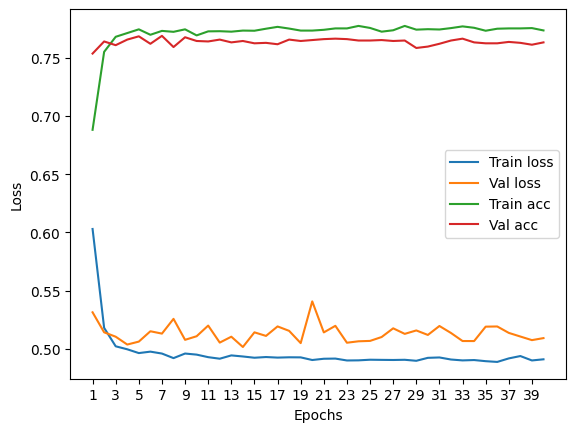

****************************************************************************************************



118it [00:00, 133.96it/s]


Train Epoch: 0 	Loss: 0.587247, Accuracy: 5336/7500 (71%)
Val Epoch: 0 	Loss: 0.533629, Accuracy: 1879/2500 (75%)



118it [00:00, 125.37it/s]


Train Epoch: 1 	Loss: 0.505661, Accuracy: 5702/7500 (76%)
Val Epoch: 1 	Loss: 0.509045, Accuracy: 1916/2500 (77%)



118it [00:00, 125.38it/s]


Train Epoch: 2 	Loss: 0.491231, Accuracy: 5793/7500 (77%)
Val Epoch: 2 	Loss: 0.521488, Accuracy: 1888/2500 (76%)



118it [00:00, 123.21it/s]


Train Epoch: 3 	Loss: 0.492630, Accuracy: 5759/7500 (77%)
Val Epoch: 3 	Loss: 0.513780, Accuracy: 1927/2500 (77%)



118it [00:00, 131.73it/s]


Train Epoch: 4 	Loss: 0.495815, Accuracy: 5781/7500 (77%)
Val Epoch: 4 	Loss: 0.506407, Accuracy: 1934/2500 (77%)



118it [00:00, 166.24it/s]


Train Epoch: 5 	Loss: 0.487751, Accuracy: 5794/7500 (77%)
Val Epoch: 5 	Loss: 0.503591, Accuracy: 1933/2500 (77%)



118it [00:00, 123.93it/s]


Train Epoch: 6 	Loss: 0.485986, Accuracy: 5802/7500 (77%)
Val Epoch: 6 	Loss: 0.533891, Accuracy: 1937/2500 (77%)



118it [00:01, 117.41it/s]


Train Epoch: 7 	Loss: 0.487302, Accuracy: 5819/7500 (78%)
Val Epoch: 7 	Loss: 0.514655, Accuracy: 1920/2500 (77%)



118it [00:00, 124.65it/s]


Train Epoch: 8 	Loss: 0.484993, Accuracy: 5797/7500 (77%)
Val Epoch: 8 	Loss: 0.505334, Accuracy: 1934/2500 (77%)



118it [00:00, 128.26it/s]


Train Epoch: 9 	Loss: 0.488080, Accuracy: 5778/7500 (77%)
Val Epoch: 9 	Loss: 0.504077, Accuracy: 1921/2500 (77%)



118it [00:00, 131.95it/s]


Train Epoch: 10 	Loss: 0.487275, Accuracy: 5796/7500 (77%)
Val Epoch: 10 	Loss: 0.505059, Accuracy: 1930/2500 (77%)



118it [00:00, 119.00it/s]


Train Epoch: 11 	Loss: 0.486090, Accuracy: 5787/7500 (77%)
Val Epoch: 11 	Loss: 0.501432, Accuracy: 1929/2500 (77%)



118it [00:00, 125.19it/s]


Train Epoch: 12 	Loss: 0.485442, Accuracy: 5802/7500 (77%)
Val Epoch: 12 	Loss: 0.508746, Accuracy: 1936/2500 (77%)



118it [00:01, 110.26it/s]


Train Epoch: 13 	Loss: 0.483923, Accuracy: 5781/7500 (77%)
Val Epoch: 13 	Loss: 0.533199, Accuracy: 1925/2500 (77%)



118it [00:00, 120.82it/s]


Train Epoch: 14 	Loss: 0.485166, Accuracy: 5776/7500 (77%)
Val Epoch: 14 	Loss: 0.503492, Accuracy: 1934/2500 (77%)



118it [00:00, 136.22it/s]


Train Epoch: 15 	Loss: 0.483392, Accuracy: 5805/7500 (77%)
Val Epoch: 15 	Loss: 0.500617, Accuracy: 1936/2500 (77%)



118it [00:00, 122.10it/s]


Train Epoch: 16 	Loss: 0.483858, Accuracy: 5800/7500 (77%)
Val Epoch: 16 	Loss: 0.515726, Accuracy: 1932/2500 (77%)



118it [00:00, 133.01it/s]


Train Epoch: 17 	Loss: 0.483254, Accuracy: 5815/7500 (78%)
Val Epoch: 17 	Loss: 0.498645, Accuracy: 1931/2500 (77%)



118it [00:00, 120.22it/s]


Train Epoch: 18 	Loss: 0.483750, Accuracy: 5782/7500 (77%)
Val Epoch: 18 	Loss: 0.518576, Accuracy: 1932/2500 (77%)



118it [00:01, 116.86it/s]


Train Epoch: 19 	Loss: 0.487626, Accuracy: 5810/7500 (77%)
Val Epoch: 19 	Loss: 0.506428, Accuracy: 1931/2500 (77%)



118it [00:01, 101.82it/s]


Train Epoch: 20 	Loss: 0.485462, Accuracy: 5774/7500 (77%)
Val Epoch: 20 	Loss: 0.506495, Accuracy: 1932/2500 (77%)



118it [00:00, 132.40it/s]


Train Epoch: 21 	Loss: 0.486310, Accuracy: 5793/7500 (77%)
Val Epoch: 21 	Loss: 0.506409, Accuracy: 1924/2500 (77%)



118it [00:00, 122.55it/s]


Train Epoch: 22 	Loss: 0.483379, Accuracy: 5796/7500 (77%)
Val Epoch: 22 	Loss: 0.521412, Accuracy: 1926/2500 (77%)



118it [00:00, 125.41it/s]


Train Epoch: 23 	Loss: 0.483381, Accuracy: 5776/7500 (77%)
Val Epoch: 23 	Loss: 0.500115, Accuracy: 1932/2500 (77%)



118it [00:00, 141.92it/s]


Train Epoch: 24 	Loss: 0.482646, Accuracy: 5801/7500 (77%)
Val Epoch: 24 	Loss: 0.501198, Accuracy: 1929/2500 (77%)



118it [00:00, 123.69it/s]


Train Epoch: 25 	Loss: 0.482721, Accuracy: 5789/7500 (77%)
Val Epoch: 25 	Loss: 0.510656, Accuracy: 1930/2500 (77%)



118it [00:00, 118.68it/s]


Train Epoch: 26 	Loss: 0.480514, Accuracy: 5802/7500 (77%)
Val Epoch: 26 	Loss: 0.511218, Accuracy: 1922/2500 (77%)



118it [00:00, 129.02it/s]


Train Epoch: 27 	Loss: 0.486586, Accuracy: 5797/7500 (77%)
Val Epoch: 27 	Loss: 0.506748, Accuracy: 1926/2500 (77%)



118it [00:00, 127.95it/s]


Train Epoch: 28 	Loss: 0.481777, Accuracy: 5782/7500 (77%)
Val Epoch: 28 	Loss: 0.510412, Accuracy: 1918/2500 (77%)



118it [00:00, 127.74it/s]


Train Epoch: 29 	Loss: 0.483882, Accuracy: 5793/7500 (77%)
Val Epoch: 29 	Loss: 0.504091, Accuracy: 1928/2500 (77%)



118it [00:00, 130.93it/s]


Train Epoch: 30 	Loss: 0.481933, Accuracy: 5787/7500 (77%)
Val Epoch: 30 	Loss: 0.521823, Accuracy: 1929/2500 (77%)



118it [00:00, 139.96it/s]


Train Epoch: 31 	Loss: 0.485307, Accuracy: 5798/7500 (77%)
Val Epoch: 31 	Loss: 0.499620, Accuracy: 1911/2500 (76%)



118it [00:00, 128.54it/s]


Train Epoch: 32 	Loss: 0.483214, Accuracy: 5791/7500 (77%)
Val Epoch: 32 	Loss: 0.498157, Accuracy: 1920/2500 (77%)



118it [00:00, 137.71it/s]


Train Epoch: 33 	Loss: 0.482134, Accuracy: 5809/7500 (77%)
Val Epoch: 33 	Loss: 0.518255, Accuracy: 1915/2500 (77%)



118it [00:00, 125.44it/s]


Train Epoch: 34 	Loss: 0.482666, Accuracy: 5800/7500 (77%)
Val Epoch: 34 	Loss: 0.497969, Accuracy: 1932/2500 (77%)



118it [00:00, 118.96it/s]


Train Epoch: 35 	Loss: 0.482116, Accuracy: 5802/7500 (77%)
Val Epoch: 35 	Loss: 0.506148, Accuracy: 1926/2500 (77%)



118it [00:00, 131.29it/s]


Train Epoch: 36 	Loss: 0.481260, Accuracy: 5798/7500 (77%)
Val Epoch: 36 	Loss: 0.526819, Accuracy: 1917/2500 (77%)



118it [00:00, 137.08it/s]


Train Epoch: 37 	Loss: 0.483010, Accuracy: 5783/7500 (77%)
Val Epoch: 37 	Loss: 0.502094, Accuracy: 1928/2500 (77%)



118it [00:00, 131.89it/s]


Train Epoch: 38 	Loss: 0.482934, Accuracy: 5795/7500 (77%)
Val Epoch: 38 	Loss: 0.517207, Accuracy: 1927/2500 (77%)



118it [00:00, 125.71it/s]


Train Epoch: 39 	Loss: 0.480336, Accuracy: 5823/7500 (78%)
Val Epoch: 39 	Loss: 0.511969, Accuracy: 1928/2500 (77%)

Test accuracy:  75.84


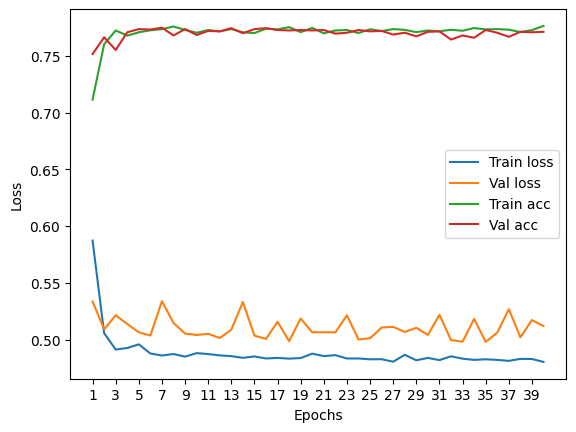

****************************************************************************************************



116it [00:00, 117.84it/s]


Train Epoch: 0 	Loss: 0.595282, Accuracy: 5099/7422 (69%)
Val Epoch: 0 	Loss: 0.528196, Accuracy: 1855/2474 (75%)



116it [00:01, 111.09it/s]


Train Epoch: 1 	Loss: 0.508758, Accuracy: 5600/7422 (75%)
Val Epoch: 1 	Loss: 0.522251, Accuracy: 1875/2474 (76%)



116it [00:00, 117.88it/s]


Train Epoch: 2 	Loss: 0.498088, Accuracy: 5645/7422 (76%)
Val Epoch: 2 	Loss: 0.510912, Accuracy: 1864/2474 (75%)



116it [00:01, 108.81it/s]


Train Epoch: 3 	Loss: 0.496369, Accuracy: 5674/7422 (76%)
Val Epoch: 3 	Loss: 0.529695, Accuracy: 1859/2474 (75%)



116it [00:02, 46.47it/s]


Train Epoch: 4 	Loss: 0.494324, Accuracy: 5694/7422 (77%)
Val Epoch: 4 	Loss: 0.505176, Accuracy: 1879/2474 (76%)



116it [00:02, 50.22it/s]


Train Epoch: 5 	Loss: 0.492482, Accuracy: 5695/7422 (77%)
Val Epoch: 5 	Loss: 0.515094, Accuracy: 1865/2474 (75%)



116it [00:02, 48.42it/s]


Train Epoch: 6 	Loss: 0.494492, Accuracy: 5679/7422 (77%)
Val Epoch: 6 	Loss: 0.508714, Accuracy: 1872/2474 (76%)



116it [00:02, 49.27it/s]


Train Epoch: 7 	Loss: 0.493373, Accuracy: 5685/7422 (77%)
Val Epoch: 7 	Loss: 0.502175, Accuracy: 1881/2474 (76%)



116it [00:02, 41.14it/s]


Train Epoch: 8 	Loss: 0.488949, Accuracy: 5705/7422 (77%)
Val Epoch: 8 	Loss: 0.506235, Accuracy: 1884/2474 (76%)



116it [00:02, 48.17it/s]


Train Epoch: 9 	Loss: 0.488739, Accuracy: 5702/7422 (77%)
Val Epoch: 9 	Loss: 0.503781, Accuracy: 1882/2474 (76%)



116it [00:02, 48.62it/s]


Train Epoch: 10 	Loss: 0.488321, Accuracy: 5695/7422 (77%)
Val Epoch: 10 	Loss: 0.504115, Accuracy: 1884/2474 (76%)



116it [00:02, 49.75it/s]


Train Epoch: 11 	Loss: 0.487110, Accuracy: 5699/7422 (77%)
Val Epoch: 11 	Loss: 0.518630, Accuracy: 1864/2474 (75%)



116it [00:02, 56.87it/s]


Train Epoch: 12 	Loss: 0.487384, Accuracy: 5704/7422 (77%)
Val Epoch: 12 	Loss: 0.502521, Accuracy: 1876/2474 (76%)



116it [00:02, 48.10it/s]


Train Epoch: 13 	Loss: 0.486187, Accuracy: 5696/7422 (77%)
Val Epoch: 13 	Loss: 0.503836, Accuracy: 1870/2474 (76%)



116it [00:02, 51.15it/s]


Train Epoch: 14 	Loss: 0.486782, Accuracy: 5707/7422 (77%)
Val Epoch: 14 	Loss: 0.506166, Accuracy: 1869/2474 (76%)



116it [00:02, 46.36it/s]


Train Epoch: 15 	Loss: 0.485975, Accuracy: 5698/7422 (77%)
Val Epoch: 15 	Loss: 0.511233, Accuracy: 1879/2474 (76%)



116it [00:02, 49.09it/s]


Train Epoch: 16 	Loss: 0.488029, Accuracy: 5707/7422 (77%)
Val Epoch: 16 	Loss: 0.505316, Accuracy: 1869/2474 (76%)



116it [00:02, 50.71it/s]


Train Epoch: 17 	Loss: 0.488007, Accuracy: 5686/7422 (77%)
Val Epoch: 17 	Loss: 0.501617, Accuracy: 1891/2474 (76%)



116it [00:02, 44.83it/s]


Train Epoch: 18 	Loss: 0.488467, Accuracy: 5715/7422 (77%)
Val Epoch: 18 	Loss: 0.502513, Accuracy: 1880/2474 (76%)



116it [00:02, 46.26it/s]


Train Epoch: 19 	Loss: 0.487070, Accuracy: 5736/7422 (77%)
Val Epoch: 19 	Loss: 0.507069, Accuracy: 1874/2474 (76%)



116it [00:02, 50.52it/s]


Train Epoch: 20 	Loss: 0.486541, Accuracy: 5723/7422 (77%)
Val Epoch: 20 	Loss: 0.504785, Accuracy: 1884/2474 (76%)



116it [00:02, 49.27it/s]


Train Epoch: 21 	Loss: 0.487189, Accuracy: 5688/7422 (77%)
Val Epoch: 21 	Loss: 0.509318, Accuracy: 1868/2474 (76%)



116it [00:02, 43.88it/s]


Train Epoch: 22 	Loss: 0.488395, Accuracy: 5701/7422 (77%)
Val Epoch: 22 	Loss: 0.514711, Accuracy: 1862/2474 (75%)



116it [00:02, 47.37it/s]


Train Epoch: 23 	Loss: 0.487576, Accuracy: 5708/7422 (77%)
Val Epoch: 23 	Loss: 0.505039, Accuracy: 1884/2474 (76%)



116it [00:02, 46.41it/s]


Train Epoch: 24 	Loss: 0.485342, Accuracy: 5698/7422 (77%)
Val Epoch: 24 	Loss: 0.501211, Accuracy: 1882/2474 (76%)



116it [00:02, 48.13it/s]


Train Epoch: 25 	Loss: 0.484717, Accuracy: 5708/7422 (77%)
Val Epoch: 25 	Loss: 0.505859, Accuracy: 1889/2474 (76%)



116it [00:02, 49.80it/s]


Train Epoch: 26 	Loss: 0.485885, Accuracy: 5735/7422 (77%)
Val Epoch: 26 	Loss: 0.500721, Accuracy: 1892/2474 (76%)



116it [00:02, 47.80it/s]


Train Epoch: 27 	Loss: 0.486591, Accuracy: 5707/7422 (77%)
Val Epoch: 27 	Loss: 0.502963, Accuracy: 1889/2474 (76%)



116it [00:02, 48.39it/s]


Train Epoch: 28 	Loss: 0.484883, Accuracy: 5702/7422 (77%)
Val Epoch: 28 	Loss: 0.505323, Accuracy: 1896/2474 (77%)



116it [00:02, 45.25it/s]


Train Epoch: 29 	Loss: 0.485115, Accuracy: 5715/7422 (77%)
Val Epoch: 29 	Loss: 0.504536, Accuracy: 1880/2474 (76%)



116it [00:02, 45.76it/s]


Train Epoch: 30 	Loss: 0.486459, Accuracy: 5705/7422 (77%)
Val Epoch: 30 	Loss: 0.503399, Accuracy: 1871/2474 (76%)



116it [00:02, 44.82it/s]


Train Epoch: 31 	Loss: 0.487969, Accuracy: 5705/7422 (77%)
Val Epoch: 31 	Loss: 0.502098, Accuracy: 1891/2474 (76%)



116it [00:02, 47.22it/s]


Train Epoch: 32 	Loss: 0.486466, Accuracy: 5691/7422 (77%)
Val Epoch: 32 	Loss: 0.503769, Accuracy: 1886/2474 (76%)



116it [00:01, 58.65it/s]


Train Epoch: 33 	Loss: 0.484250, Accuracy: 5732/7422 (77%)
Val Epoch: 33 	Loss: 0.504021, Accuracy: 1885/2474 (76%)



116it [00:02, 45.75it/s]


Train Epoch: 34 	Loss: 0.485117, Accuracy: 5727/7422 (77%)
Val Epoch: 34 	Loss: 0.503968, Accuracy: 1888/2474 (76%)



116it [00:02, 40.97it/s]


Train Epoch: 35 	Loss: 0.484716, Accuracy: 5703/7422 (77%)
Val Epoch: 35 	Loss: 0.504994, Accuracy: 1881/2474 (76%)



116it [00:02, 48.75it/s]


Train Epoch: 36 	Loss: 0.486242, Accuracy: 5715/7422 (77%)
Val Epoch: 36 	Loss: 0.505895, Accuracy: 1876/2474 (76%)



116it [00:02, 48.37it/s]


Train Epoch: 37 	Loss: 0.486186, Accuracy: 5722/7422 (77%)
Val Epoch: 37 	Loss: 0.501891, Accuracy: 1882/2474 (76%)



116it [00:02, 57.05it/s]


Train Epoch: 38 	Loss: 0.485523, Accuracy: 5698/7422 (77%)
Val Epoch: 38 	Loss: 0.507219, Accuracy: 1872/2474 (76%)



116it [00:02, 48.01it/s]


Train Epoch: 39 	Loss: 0.487341, Accuracy: 5717/7422 (77%)
Val Epoch: 39 	Loss: 0.500548, Accuracy: 1890/2474 (76%)

Test accuracy:  77.00080840743735


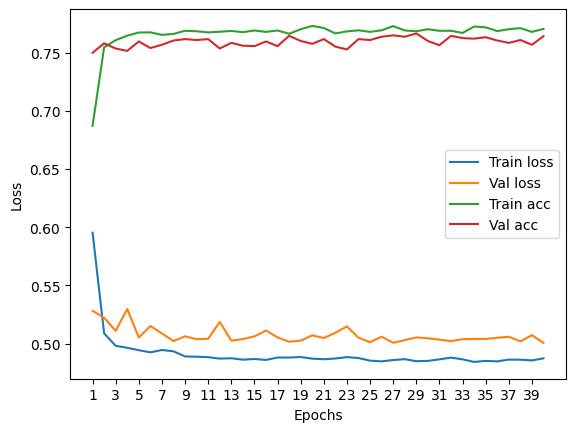

****************************************************************************************************



Particles per jet: 4


118it [00:02, 50.25it/s]


Train Epoch: 0 	Loss: 0.596487, Accuracy: 5318/7500 (71%)
Val Epoch: 0 	Loss: 0.511426, Accuracy: 1894/2500 (76%)



118it [00:02, 49.00it/s]


Train Epoch: 1 	Loss: 0.501740, Accuracy: 5764/7500 (77%)
Val Epoch: 1 	Loss: 0.484602, Accuracy: 1926/2500 (77%)



118it [00:02, 51.78it/s]


Train Epoch: 2 	Loss: 0.493828, Accuracy: 5762/7500 (77%)
Val Epoch: 2 	Loss: 0.476713, Accuracy: 1942/2500 (78%)



118it [00:02, 48.37it/s]


Train Epoch: 3 	Loss: 0.492820, Accuracy: 5770/7500 (77%)
Val Epoch: 3 	Loss: 0.500369, Accuracy: 1924/2500 (77%)



118it [00:02, 50.06it/s]


Train Epoch: 4 	Loss: 0.489126, Accuracy: 5807/7500 (77%)
Val Epoch: 4 	Loss: 0.482387, Accuracy: 1939/2500 (78%)



118it [00:02, 45.94it/s]


Train Epoch: 5 	Loss: 0.488625, Accuracy: 5805/7500 (77%)
Val Epoch: 5 	Loss: 0.518389, Accuracy: 1912/2500 (76%)



118it [00:02, 47.82it/s]


Train Epoch: 6 	Loss: 0.488074, Accuracy: 5821/7500 (78%)
Val Epoch: 6 	Loss: 0.483675, Accuracy: 1942/2500 (78%)



118it [00:02, 52.80it/s]


Train Epoch: 7 	Loss: 0.489365, Accuracy: 5791/7500 (77%)
Val Epoch: 7 	Loss: 0.476725, Accuracy: 1948/2500 (78%)



118it [00:02, 49.91it/s]


Train Epoch: 8 	Loss: 0.486755, Accuracy: 5816/7500 (78%)
Val Epoch: 8 	Loss: 0.485936, Accuracy: 1945/2500 (78%)



118it [00:02, 43.40it/s]


Train Epoch: 9 	Loss: 0.491013, Accuracy: 5807/7500 (77%)
Val Epoch: 9 	Loss: 0.474327, Accuracy: 1941/2500 (78%)



118it [00:02, 43.66it/s]


Train Epoch: 10 	Loss: 0.490766, Accuracy: 5783/7500 (77%)
Val Epoch: 10 	Loss: 0.484051, Accuracy: 1935/2500 (77%)



118it [00:02, 46.83it/s]


Train Epoch: 11 	Loss: 0.487603, Accuracy: 5838/7500 (78%)
Val Epoch: 11 	Loss: 0.488967, Accuracy: 1941/2500 (78%)



118it [00:02, 50.29it/s]


Train Epoch: 12 	Loss: 0.488918, Accuracy: 5785/7500 (77%)
Val Epoch: 12 	Loss: 0.488804, Accuracy: 1941/2500 (78%)



118it [00:02, 49.36it/s]


Train Epoch: 13 	Loss: 0.488664, Accuracy: 5794/7500 (77%)
Val Epoch: 13 	Loss: 0.487651, Accuracy: 1936/2500 (77%)



118it [00:02, 41.03it/s]


Train Epoch: 14 	Loss: 0.486312, Accuracy: 5812/7500 (77%)
Val Epoch: 14 	Loss: 0.484333, Accuracy: 1951/2500 (78%)



118it [00:02, 43.91it/s]


Train Epoch: 15 	Loss: 0.488684, Accuracy: 5809/7500 (77%)
Val Epoch: 15 	Loss: 0.487169, Accuracy: 1938/2500 (78%)



118it [00:02, 46.42it/s]


Train Epoch: 16 	Loss: 0.488965, Accuracy: 5826/7500 (78%)
Val Epoch: 16 	Loss: 0.481421, Accuracy: 1936/2500 (77%)



118it [00:02, 47.27it/s]


Train Epoch: 17 	Loss: 0.486461, Accuracy: 5799/7500 (77%)
Val Epoch: 17 	Loss: 0.480961, Accuracy: 1949/2500 (78%)



118it [00:02, 49.46it/s]


Train Epoch: 18 	Loss: 0.485582, Accuracy: 5804/7500 (77%)
Val Epoch: 18 	Loss: 0.485213, Accuracy: 1935/2500 (77%)



118it [00:02, 47.28it/s]


Train Epoch: 19 	Loss: 0.488808, Accuracy: 5818/7500 (78%)
Val Epoch: 19 	Loss: 0.483438, Accuracy: 1945/2500 (78%)



118it [00:02, 49.74it/s]


Train Epoch: 20 	Loss: 0.486468, Accuracy: 5844/7500 (78%)
Val Epoch: 20 	Loss: 0.485213, Accuracy: 1931/2500 (77%)



118it [00:02, 47.11it/s]


Train Epoch: 21 	Loss: 0.485572, Accuracy: 5825/7500 (78%)
Val Epoch: 21 	Loss: 0.494819, Accuracy: 1940/2500 (78%)



118it [00:02, 58.76it/s]


Train Epoch: 22 	Loss: 0.485778, Accuracy: 5813/7500 (78%)
Val Epoch: 22 	Loss: 0.481331, Accuracy: 1931/2500 (77%)



118it [00:02, 49.09it/s]


Train Epoch: 23 	Loss: 0.485997, Accuracy: 5815/7500 (78%)
Val Epoch: 23 	Loss: 0.493087, Accuracy: 1946/2500 (78%)



118it [00:02, 47.65it/s]


Train Epoch: 24 	Loss: 0.489190, Accuracy: 5814/7500 (78%)
Val Epoch: 24 	Loss: 0.483242, Accuracy: 1929/2500 (77%)



118it [00:02, 49.32it/s]


Train Epoch: 25 	Loss: 0.485591, Accuracy: 5809/7500 (77%)
Val Epoch: 25 	Loss: 0.480545, Accuracy: 1935/2500 (77%)



118it [00:02, 48.18it/s]


Train Epoch: 26 	Loss: 0.486186, Accuracy: 5822/7500 (78%)
Val Epoch: 26 	Loss: 0.484937, Accuracy: 1947/2500 (78%)



118it [00:02, 56.18it/s]


Train Epoch: 27 	Loss: 0.484721, Accuracy: 5838/7500 (78%)
Val Epoch: 27 	Loss: 0.485043, Accuracy: 1940/2500 (78%)



118it [00:02, 49.11it/s]


Train Epoch: 28 	Loss: 0.484078, Accuracy: 5827/7500 (78%)
Val Epoch: 28 	Loss: 0.484102, Accuracy: 1936/2500 (77%)



118it [00:02, 49.12it/s]


Train Epoch: 29 	Loss: 0.485681, Accuracy: 5821/7500 (78%)
Val Epoch: 29 	Loss: 0.483648, Accuracy: 1940/2500 (78%)



118it [00:02, 49.96it/s]


Train Epoch: 30 	Loss: 0.486400, Accuracy: 5805/7500 (77%)
Val Epoch: 30 	Loss: 0.485381, Accuracy: 1941/2500 (78%)



118it [00:02, 50.67it/s]


Train Epoch: 31 	Loss: 0.484177, Accuracy: 5824/7500 (78%)
Val Epoch: 31 	Loss: 0.497150, Accuracy: 1937/2500 (77%)



118it [00:02, 51.95it/s]


Train Epoch: 32 	Loss: 0.484843, Accuracy: 5835/7500 (78%)
Val Epoch: 32 	Loss: 0.487101, Accuracy: 1935/2500 (77%)



118it [00:02, 57.07it/s]


Train Epoch: 33 	Loss: 0.487858, Accuracy: 5826/7500 (78%)
Val Epoch: 33 	Loss: 0.482448, Accuracy: 1946/2500 (78%)



118it [00:02, 49.57it/s]


Train Epoch: 34 	Loss: 0.484433, Accuracy: 5822/7500 (78%)
Val Epoch: 34 	Loss: 0.479608, Accuracy: 1940/2500 (78%)



118it [00:02, 46.35it/s]


Train Epoch: 35 	Loss: 0.482900, Accuracy: 5823/7500 (78%)
Val Epoch: 35 	Loss: 0.481176, Accuracy: 1936/2500 (77%)



118it [00:02, 48.52it/s]


Train Epoch: 36 	Loss: 0.486506, Accuracy: 5804/7500 (77%)
Val Epoch: 36 	Loss: 0.496229, Accuracy: 1917/2500 (77%)



118it [00:02, 49.19it/s]


Train Epoch: 37 	Loss: 0.485799, Accuracy: 5820/7500 (78%)
Val Epoch: 37 	Loss: 0.477627, Accuracy: 1938/2500 (78%)



118it [00:02, 55.71it/s]


Train Epoch: 38 	Loss: 0.482625, Accuracy: 5840/7500 (78%)
Val Epoch: 38 	Loss: 0.487732, Accuracy: 1938/2500 (78%)



118it [00:02, 48.45it/s]


Train Epoch: 39 	Loss: 0.483514, Accuracy: 5840/7500 (78%)
Val Epoch: 39 	Loss: 0.484480, Accuracy: 1929/2500 (77%)

Test accuracy:  76.32


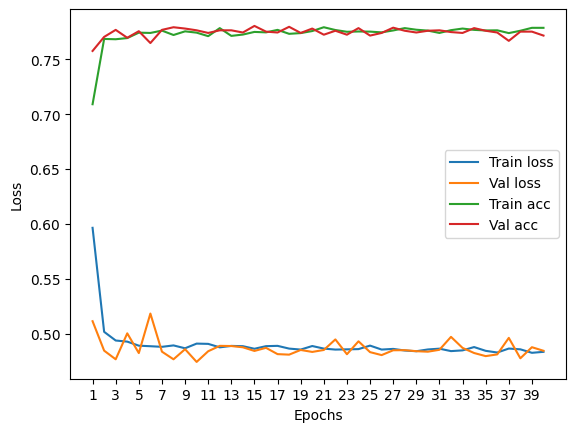

****************************************************************************************************



118it [00:02, 47.91it/s]


Train Epoch: 0 	Loss: 0.606098, Accuracy: 5174/7500 (69%)
Val Epoch: 0 	Loss: 0.556656, Accuracy: 1850/2500 (74%)



118it [00:02, 47.16it/s]


Train Epoch: 1 	Loss: 0.504682, Accuracy: 5736/7500 (76%)
Val Epoch: 1 	Loss: 0.555477, Accuracy: 1829/2500 (73%)



118it [00:02, 42.17it/s]


Train Epoch: 2 	Loss: 0.497296, Accuracy: 5755/7500 (77%)
Val Epoch: 2 	Loss: 0.544210, Accuracy: 1862/2500 (74%)



118it [00:02, 41.49it/s]


Train Epoch: 3 	Loss: 0.492933, Accuracy: 5834/7500 (78%)
Val Epoch: 3 	Loss: 0.538426, Accuracy: 1870/2500 (75%)



118it [00:02, 44.09it/s]


Train Epoch: 4 	Loss: 0.491297, Accuracy: 5787/7500 (77%)
Val Epoch: 4 	Loss: 0.516711, Accuracy: 1880/2500 (75%)



118it [00:02, 47.06it/s]


Train Epoch: 5 	Loss: 0.487689, Accuracy: 5803/7500 (77%)
Val Epoch: 5 	Loss: 0.522072, Accuracy: 1857/2500 (74%)



118it [00:02, 49.79it/s]


Train Epoch: 6 	Loss: 0.489563, Accuracy: 5779/7500 (77%)
Val Epoch: 6 	Loss: 0.518653, Accuracy: 1873/2500 (75%)



118it [00:02, 50.72it/s]


Train Epoch: 7 	Loss: 0.487039, Accuracy: 5800/7500 (77%)
Val Epoch: 7 	Loss: 0.520168, Accuracy: 1864/2500 (75%)



118it [00:02, 53.01it/s]


Train Epoch: 8 	Loss: 0.485871, Accuracy: 5820/7500 (78%)
Val Epoch: 8 	Loss: 0.528114, Accuracy: 1870/2500 (75%)



118it [00:02, 43.88it/s]


Train Epoch: 9 	Loss: 0.485311, Accuracy: 5818/7500 (78%)
Val Epoch: 9 	Loss: 0.528122, Accuracy: 1856/2500 (74%)



118it [00:02, 45.37it/s]


Train Epoch: 10 	Loss: 0.486057, Accuracy: 5802/7500 (77%)
Val Epoch: 10 	Loss: 0.531352, Accuracy: 1859/2500 (74%)



118it [00:02, 48.01it/s]


Train Epoch: 11 	Loss: 0.484015, Accuracy: 5833/7500 (78%)
Val Epoch: 11 	Loss: 0.527926, Accuracy: 1870/2500 (75%)



118it [00:02, 48.33it/s]


Train Epoch: 12 	Loss: 0.486721, Accuracy: 5822/7500 (78%)
Val Epoch: 12 	Loss: 0.521525, Accuracy: 1865/2500 (75%)



118it [00:02, 48.29it/s]


Train Epoch: 13 	Loss: 0.484225, Accuracy: 5829/7500 (78%)
Val Epoch: 13 	Loss: 0.522947, Accuracy: 1868/2500 (75%)



118it [00:02, 46.41it/s]


Train Epoch: 14 	Loss: 0.487160, Accuracy: 5802/7500 (77%)
Val Epoch: 14 	Loss: 0.514127, Accuracy: 1856/2500 (74%)



118it [00:02, 44.95it/s]


Train Epoch: 15 	Loss: 0.486352, Accuracy: 5838/7500 (78%)
Val Epoch: 15 	Loss: 0.518981, Accuracy: 1872/2500 (75%)



118it [00:02, 45.88it/s]


Train Epoch: 16 	Loss: 0.483278, Accuracy: 5838/7500 (78%)
Val Epoch: 16 	Loss: 0.539296, Accuracy: 1867/2500 (75%)



118it [00:02, 43.16it/s]


Train Epoch: 17 	Loss: 0.485195, Accuracy: 5824/7500 (78%)
Val Epoch: 17 	Loss: 0.527400, Accuracy: 1854/2500 (74%)



118it [00:02, 47.38it/s]


Train Epoch: 18 	Loss: 0.484435, Accuracy: 5836/7500 (78%)
Val Epoch: 18 	Loss: 0.515567, Accuracy: 1890/2500 (76%)



118it [00:02, 49.00it/s]


Train Epoch: 19 	Loss: 0.486311, Accuracy: 5807/7500 (77%)
Val Epoch: 19 	Loss: 0.525950, Accuracy: 1863/2500 (75%)



118it [00:02, 46.20it/s]


Train Epoch: 20 	Loss: 0.483122, Accuracy: 5821/7500 (78%)
Val Epoch: 20 	Loss: 0.513205, Accuracy: 1869/2500 (75%)



118it [00:02, 47.79it/s]


Train Epoch: 21 	Loss: 0.482583, Accuracy: 5830/7500 (78%)
Val Epoch: 21 	Loss: 0.514731, Accuracy: 1869/2500 (75%)



118it [00:02, 45.45it/s]


Train Epoch: 22 	Loss: 0.484809, Accuracy: 5830/7500 (78%)
Val Epoch: 22 	Loss: 0.524216, Accuracy: 1870/2500 (75%)



118it [00:02, 43.85it/s]


Train Epoch: 23 	Loss: 0.482518, Accuracy: 5835/7500 (78%)
Val Epoch: 23 	Loss: 0.514243, Accuracy: 1877/2500 (75%)



118it [00:02, 46.28it/s]


Train Epoch: 24 	Loss: 0.484246, Accuracy: 5821/7500 (78%)
Val Epoch: 24 	Loss: 0.509909, Accuracy: 1881/2500 (75%)



118it [00:02, 45.05it/s]


Train Epoch: 25 	Loss: 0.482617, Accuracy: 5812/7500 (77%)
Val Epoch: 25 	Loss: 0.513210, Accuracy: 1878/2500 (75%)



118it [00:02, 46.30it/s]


Train Epoch: 26 	Loss: 0.483476, Accuracy: 5833/7500 (78%)
Val Epoch: 26 	Loss: 0.513934, Accuracy: 1871/2500 (75%)



118it [00:02, 46.99it/s]


Train Epoch: 27 	Loss: 0.483220, Accuracy: 5833/7500 (78%)
Val Epoch: 27 	Loss: 0.522888, Accuracy: 1880/2500 (75%)



118it [00:02, 48.70it/s]


Train Epoch: 28 	Loss: 0.484063, Accuracy: 5849/7500 (78%)
Val Epoch: 28 	Loss: 0.522637, Accuracy: 1872/2500 (75%)



118it [00:02, 46.88it/s]


Train Epoch: 29 	Loss: 0.483289, Accuracy: 5832/7500 (78%)
Val Epoch: 29 	Loss: 0.522991, Accuracy: 1887/2500 (75%)



118it [00:02, 50.23it/s]


Train Epoch: 30 	Loss: 0.483838, Accuracy: 5847/7500 (78%)
Val Epoch: 30 	Loss: 0.509100, Accuracy: 1880/2500 (75%)



118it [00:02, 51.09it/s]


Train Epoch: 31 	Loss: 0.482928, Accuracy: 5835/7500 (78%)
Val Epoch: 31 	Loss: 0.513556, Accuracy: 1868/2500 (75%)



118it [00:02, 47.54it/s]


Train Epoch: 32 	Loss: 0.482505, Accuracy: 5846/7500 (78%)
Val Epoch: 32 	Loss: 0.516540, Accuracy: 1872/2500 (75%)



118it [00:02, 49.24it/s]


Train Epoch: 33 	Loss: 0.483644, Accuracy: 5828/7500 (78%)
Val Epoch: 33 	Loss: 0.519735, Accuracy: 1870/2500 (75%)



118it [00:02, 49.68it/s]


Train Epoch: 34 	Loss: 0.481914, Accuracy: 5852/7500 (78%)
Val Epoch: 34 	Loss: 0.527787, Accuracy: 1868/2500 (75%)



118it [00:02, 48.93it/s]


Train Epoch: 35 	Loss: 0.480381, Accuracy: 5850/7500 (78%)
Val Epoch: 35 	Loss: 0.520247, Accuracy: 1853/2500 (74%)



118it [00:01, 68.12it/s]


Train Epoch: 36 	Loss: 0.483263, Accuracy: 5807/7500 (77%)
Val Epoch: 36 	Loss: 0.528822, Accuracy: 1869/2500 (75%)



118it [00:02, 44.47it/s]


Train Epoch: 37 	Loss: 0.482693, Accuracy: 5836/7500 (78%)
Val Epoch: 37 	Loss: 0.511924, Accuracy: 1874/2500 (75%)



118it [00:02, 43.93it/s]


Train Epoch: 38 	Loss: 0.482089, Accuracy: 5845/7500 (78%)
Val Epoch: 38 	Loss: 0.515242, Accuracy: 1878/2500 (75%)



118it [00:02, 45.23it/s]


Train Epoch: 39 	Loss: 0.481457, Accuracy: 5834/7500 (78%)
Val Epoch: 39 	Loss: 0.518133, Accuracy: 1874/2500 (75%)

Test accuracy:  75.88000000000001


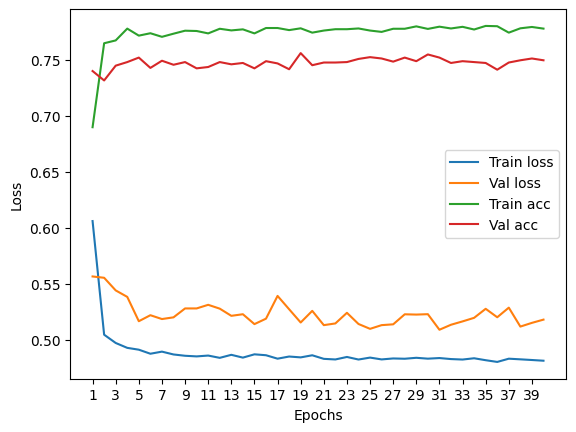

****************************************************************************************************



118it [00:02, 47.95it/s]


Train Epoch: 0 	Loss: 0.605593, Accuracy: 5097/7500 (68%)
Val Epoch: 0 	Loss: 0.518159, Accuracy: 1897/2500 (76%)



118it [00:02, 50.07it/s]


Train Epoch: 1 	Loss: 0.504983, Accuracy: 5706/7500 (76%)
Val Epoch: 1 	Loss: 0.506486, Accuracy: 1910/2500 (76%)



118it [00:02, 49.87it/s]


Train Epoch: 2 	Loss: 0.497374, Accuracy: 5713/7500 (76%)
Val Epoch: 2 	Loss: 0.551331, Accuracy: 1916/2500 (77%)



118it [00:02, 50.50it/s]


Train Epoch: 3 	Loss: 0.494340, Accuracy: 5754/7500 (77%)
Val Epoch: 3 	Loss: 0.529084, Accuracy: 1891/2500 (76%)



118it [00:01, 59.04it/s]


Train Epoch: 4 	Loss: 0.486285, Accuracy: 5772/7500 (77%)
Val Epoch: 4 	Loss: 0.527762, Accuracy: 1917/2500 (77%)



118it [00:02, 48.29it/s]


Train Epoch: 5 	Loss: 0.484683, Accuracy: 5805/7500 (77%)
Val Epoch: 5 	Loss: 0.515784, Accuracy: 1917/2500 (77%)



118it [00:02, 46.83it/s]


Train Epoch: 6 	Loss: 0.485877, Accuracy: 5791/7500 (77%)
Val Epoch: 6 	Loss: 0.506547, Accuracy: 1921/2500 (77%)



118it [00:02, 46.46it/s]


Train Epoch: 7 	Loss: 0.486504, Accuracy: 5777/7500 (77%)
Val Epoch: 7 	Loss: 0.514830, Accuracy: 1930/2500 (77%)



118it [00:02, 48.53it/s]


Train Epoch: 8 	Loss: 0.481917, Accuracy: 5792/7500 (77%)
Val Epoch: 8 	Loss: 0.502661, Accuracy: 1924/2500 (77%)



118it [00:02, 53.00it/s]


Train Epoch: 9 	Loss: 0.482544, Accuracy: 5774/7500 (77%)
Val Epoch: 9 	Loss: 0.502249, Accuracy: 1926/2500 (77%)



118it [00:02, 50.17it/s]


Train Epoch: 10 	Loss: 0.482594, Accuracy: 5818/7500 (78%)
Val Epoch: 10 	Loss: 0.513747, Accuracy: 1901/2500 (76%)



118it [00:02, 50.52it/s]


Train Epoch: 11 	Loss: 0.483398, Accuracy: 5814/7500 (78%)
Val Epoch: 11 	Loss: 0.509693, Accuracy: 1916/2500 (77%)



118it [00:02, 48.87it/s]


Train Epoch: 12 	Loss: 0.479415, Accuracy: 5816/7500 (78%)
Val Epoch: 12 	Loss: 0.523412, Accuracy: 1923/2500 (77%)



118it [00:02, 49.88it/s]


Train Epoch: 13 	Loss: 0.480238, Accuracy: 5804/7500 (77%)
Val Epoch: 13 	Loss: 0.496240, Accuracy: 1918/2500 (77%)



118it [00:02, 46.64it/s]


Train Epoch: 14 	Loss: 0.480543, Accuracy: 5803/7500 (77%)
Val Epoch: 14 	Loss: 0.516597, Accuracy: 1916/2500 (77%)



118it [00:02, 56.06it/s]


Train Epoch: 15 	Loss: 0.479750, Accuracy: 5796/7500 (77%)
Val Epoch: 15 	Loss: 0.501405, Accuracy: 1923/2500 (77%)



118it [00:02, 48.58it/s]


Train Epoch: 16 	Loss: 0.480648, Accuracy: 5802/7500 (77%)
Val Epoch: 16 	Loss: 0.512385, Accuracy: 1896/2500 (76%)



118it [00:02, 50.78it/s]


Train Epoch: 17 	Loss: 0.483278, Accuracy: 5793/7500 (77%)
Val Epoch: 17 	Loss: 0.511076, Accuracy: 1920/2500 (77%)



118it [00:02, 57.24it/s]


Train Epoch: 18 	Loss: 0.481302, Accuracy: 5794/7500 (77%)
Val Epoch: 18 	Loss: 0.509406, Accuracy: 1919/2500 (77%)



118it [00:02, 53.92it/s]


Train Epoch: 19 	Loss: 0.480576, Accuracy: 5804/7500 (77%)
Val Epoch: 19 	Loss: 0.505238, Accuracy: 1918/2500 (77%)



118it [00:02, 53.77it/s]


Train Epoch: 20 	Loss: 0.481082, Accuracy: 5815/7500 (78%)
Val Epoch: 20 	Loss: 0.504680, Accuracy: 1925/2500 (77%)



118it [00:02, 50.20it/s]


Train Epoch: 21 	Loss: 0.479622, Accuracy: 5807/7500 (77%)
Val Epoch: 21 	Loss: 0.518741, Accuracy: 1920/2500 (77%)



118it [00:02, 45.43it/s]


Train Epoch: 22 	Loss: 0.479717, Accuracy: 5810/7500 (77%)
Val Epoch: 22 	Loss: 0.507346, Accuracy: 1922/2500 (77%)



118it [00:02, 48.98it/s]


Train Epoch: 23 	Loss: 0.481348, Accuracy: 5815/7500 (78%)
Val Epoch: 23 	Loss: 0.522060, Accuracy: 1918/2500 (77%)



118it [00:02, 49.22it/s]


Train Epoch: 24 	Loss: 0.480076, Accuracy: 5804/7500 (77%)
Val Epoch: 24 	Loss: 0.509099, Accuracy: 1920/2500 (77%)



118it [00:02, 47.14it/s]


Train Epoch: 25 	Loss: 0.477293, Accuracy: 5810/7500 (77%)
Val Epoch: 25 	Loss: 0.508831, Accuracy: 1897/2500 (76%)



118it [00:02, 49.85it/s]


Train Epoch: 26 	Loss: 0.478945, Accuracy: 5795/7500 (77%)
Val Epoch: 26 	Loss: 0.512569, Accuracy: 1919/2500 (77%)



118it [00:02, 48.24it/s]


Train Epoch: 27 	Loss: 0.482636, Accuracy: 5815/7500 (78%)
Val Epoch: 27 	Loss: 0.499577, Accuracy: 1920/2500 (77%)



118it [00:02, 46.36it/s]


Train Epoch: 28 	Loss: 0.479888, Accuracy: 5834/7500 (78%)
Val Epoch: 28 	Loss: 0.497713, Accuracy: 1920/2500 (77%)



118it [00:02, 39.67it/s]


Train Epoch: 29 	Loss: 0.480120, Accuracy: 5819/7500 (78%)
Val Epoch: 29 	Loss: 0.500988, Accuracy: 1931/2500 (77%)



118it [00:02, 45.20it/s]


Train Epoch: 30 	Loss: 0.478115, Accuracy: 5798/7500 (77%)
Val Epoch: 30 	Loss: 0.505823, Accuracy: 1925/2500 (77%)



118it [00:02, 48.22it/s]


Train Epoch: 31 	Loss: 0.477358, Accuracy: 5810/7500 (77%)
Val Epoch: 31 	Loss: 0.500718, Accuracy: 1923/2500 (77%)



118it [00:02, 44.19it/s]


Train Epoch: 32 	Loss: 0.477109, Accuracy: 5820/7500 (78%)
Val Epoch: 32 	Loss: 0.507219, Accuracy: 1920/2500 (77%)



118it [00:02, 45.16it/s]


Train Epoch: 33 	Loss: 0.477618, Accuracy: 5829/7500 (78%)
Val Epoch: 33 	Loss: 0.501122, Accuracy: 1912/2500 (76%)



118it [00:02, 49.00it/s]


Train Epoch: 34 	Loss: 0.477831, Accuracy: 5813/7500 (78%)
Val Epoch: 34 	Loss: 0.498265, Accuracy: 1930/2500 (77%)



118it [00:02, 49.11it/s]


Train Epoch: 35 	Loss: 0.476149, Accuracy: 5831/7500 (78%)
Val Epoch: 35 	Loss: 0.514426, Accuracy: 1936/2500 (77%)



118it [00:02, 47.39it/s]


Train Epoch: 36 	Loss: 0.475214, Accuracy: 5825/7500 (78%)
Val Epoch: 36 	Loss: 0.505333, Accuracy: 1928/2500 (77%)



118it [00:02, 52.68it/s]


Train Epoch: 37 	Loss: 0.475507, Accuracy: 5821/7500 (78%)
Val Epoch: 37 	Loss: 0.507764, Accuracy: 1926/2500 (77%)



118it [00:02, 46.88it/s]


Train Epoch: 38 	Loss: 0.476620, Accuracy: 5824/7500 (78%)
Val Epoch: 38 	Loss: 0.507450, Accuracy: 1924/2500 (77%)



118it [00:02, 50.35it/s]


Train Epoch: 39 	Loss: 0.478009, Accuracy: 5839/7500 (78%)
Val Epoch: 39 	Loss: 0.506839, Accuracy: 1921/2500 (77%)

Test accuracy:  77.68


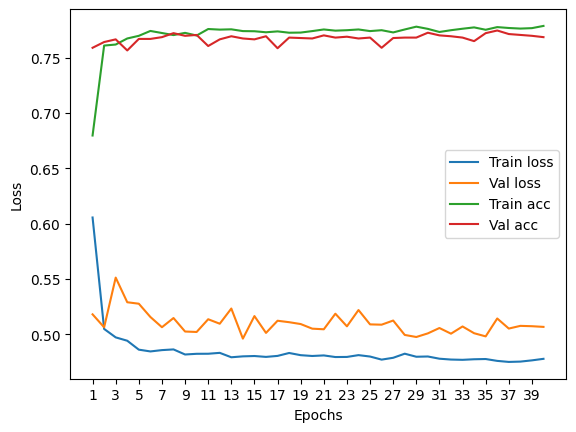

****************************************************************************************************



118it [00:02, 43.08it/s]


Train Epoch: 0 	Loss: 0.616811, Accuracy: 5139/7500 (69%)
Val Epoch: 0 	Loss: 0.527799, Accuracy: 1908/2500 (76%)



118it [00:02, 41.71it/s]


Train Epoch: 1 	Loss: 0.507337, Accuracy: 5711/7500 (76%)
Val Epoch: 1 	Loss: 0.506128, Accuracy: 1939/2500 (78%)



118it [00:02, 42.92it/s]


Train Epoch: 2 	Loss: 0.504007, Accuracy: 5719/7500 (76%)
Val Epoch: 2 	Loss: 0.507458, Accuracy: 1932/2500 (77%)



118it [00:02, 47.34it/s]


Train Epoch: 3 	Loss: 0.498987, Accuracy: 5753/7500 (77%)
Val Epoch: 3 	Loss: 0.505036, Accuracy: 1917/2500 (77%)



118it [00:02, 50.25it/s]


Train Epoch: 4 	Loss: 0.499001, Accuracy: 5742/7500 (77%)
Val Epoch: 4 	Loss: 0.499858, Accuracy: 1940/2500 (78%)



118it [00:02, 49.36it/s]


Train Epoch: 5 	Loss: 0.494315, Accuracy: 5770/7500 (77%)
Val Epoch: 5 	Loss: 0.503566, Accuracy: 1933/2500 (77%)



118it [00:02, 50.54it/s]


Train Epoch: 6 	Loss: 0.496069, Accuracy: 5757/7500 (77%)
Val Epoch: 6 	Loss: 0.499695, Accuracy: 1929/2500 (77%)



118it [00:02, 49.72it/s]


Train Epoch: 7 	Loss: 0.492369, Accuracy: 5775/7500 (77%)
Val Epoch: 7 	Loss: 0.505667, Accuracy: 1936/2500 (77%)



118it [00:02, 53.62it/s]


Train Epoch: 8 	Loss: 0.495172, Accuracy: 5796/7500 (77%)
Val Epoch: 8 	Loss: 0.489852, Accuracy: 1932/2500 (77%)



118it [00:02, 56.74it/s]


Train Epoch: 9 	Loss: 0.496910, Accuracy: 5785/7500 (77%)
Val Epoch: 9 	Loss: 0.510140, Accuracy: 1930/2500 (77%)



118it [00:02, 46.87it/s]


Train Epoch: 10 	Loss: 0.493899, Accuracy: 5768/7500 (77%)
Val Epoch: 10 	Loss: 0.493388, Accuracy: 1936/2500 (77%)



118it [00:02, 46.25it/s]


Train Epoch: 11 	Loss: 0.494647, Accuracy: 5767/7500 (77%)
Val Epoch: 11 	Loss: 0.500628, Accuracy: 1935/2500 (77%)



118it [00:02, 45.63it/s]


Train Epoch: 12 	Loss: 0.493560, Accuracy: 5781/7500 (77%)
Val Epoch: 12 	Loss: 0.511081, Accuracy: 1918/2500 (77%)



118it [00:02, 48.50it/s]


Train Epoch: 13 	Loss: 0.496114, Accuracy: 5772/7500 (77%)
Val Epoch: 13 	Loss: 0.500003, Accuracy: 1938/2500 (78%)



118it [00:02, 51.61it/s]


Train Epoch: 14 	Loss: 0.493272, Accuracy: 5787/7500 (77%)
Val Epoch: 14 	Loss: 0.495369, Accuracy: 1921/2500 (77%)



118it [00:02, 50.59it/s]


Train Epoch: 15 	Loss: 0.493674, Accuracy: 5775/7500 (77%)
Val Epoch: 15 	Loss: 0.496761, Accuracy: 1942/2500 (78%)



118it [00:02, 45.59it/s]


Train Epoch: 16 	Loss: 0.496161, Accuracy: 5775/7500 (77%)
Val Epoch: 16 	Loss: 0.489324, Accuracy: 1932/2500 (77%)



118it [00:02, 54.50it/s]


Train Epoch: 17 	Loss: 0.492929, Accuracy: 5779/7500 (77%)
Val Epoch: 17 	Loss: 0.509215, Accuracy: 1939/2500 (78%)



118it [00:02, 51.64it/s]


Train Epoch: 18 	Loss: 0.491767, Accuracy: 5761/7500 (77%)
Val Epoch: 18 	Loss: 0.499891, Accuracy: 1944/2500 (78%)



118it [00:02, 45.59it/s]


Train Epoch: 19 	Loss: 0.493174, Accuracy: 5800/7500 (77%)
Val Epoch: 19 	Loss: 0.523997, Accuracy: 1948/2500 (78%)



118it [00:02, 46.86it/s]


Train Epoch: 20 	Loss: 0.491546, Accuracy: 5789/7500 (77%)
Val Epoch: 20 	Loss: 0.503561, Accuracy: 1939/2500 (78%)



118it [00:02, 50.71it/s]


Train Epoch: 21 	Loss: 0.492401, Accuracy: 5797/7500 (77%)
Val Epoch: 21 	Loss: 0.498541, Accuracy: 1940/2500 (78%)



118it [00:02, 54.51it/s]


Train Epoch: 22 	Loss: 0.493212, Accuracy: 5785/7500 (77%)
Val Epoch: 22 	Loss: 0.498579, Accuracy: 1938/2500 (78%)



118it [00:02, 48.15it/s]


Train Epoch: 23 	Loss: 0.491109, Accuracy: 5777/7500 (77%)
Val Epoch: 23 	Loss: 0.512678, Accuracy: 1938/2500 (78%)



118it [00:02, 50.03it/s]


Train Epoch: 24 	Loss: 0.492719, Accuracy: 5764/7500 (77%)
Val Epoch: 24 	Loss: 0.506989, Accuracy: 1935/2500 (77%)



118it [00:02, 53.79it/s]


Train Epoch: 25 	Loss: 0.493049, Accuracy: 5769/7500 (77%)
Val Epoch: 25 	Loss: 0.487274, Accuracy: 1944/2500 (78%)



118it [00:02, 46.99it/s]


Train Epoch: 26 	Loss: 0.492211, Accuracy: 5786/7500 (77%)
Val Epoch: 26 	Loss: 0.487864, Accuracy: 1943/2500 (78%)



118it [00:02, 43.08it/s]


Train Epoch: 27 	Loss: 0.492812, Accuracy: 5780/7500 (77%)
Val Epoch: 27 	Loss: 0.489752, Accuracy: 1950/2500 (78%)



118it [00:02, 42.88it/s]


Train Epoch: 28 	Loss: 0.491159, Accuracy: 5788/7500 (77%)
Val Epoch: 28 	Loss: 0.491983, Accuracy: 1947/2500 (78%)



118it [00:02, 45.84it/s]


Train Epoch: 29 	Loss: 0.491894, Accuracy: 5763/7500 (77%)
Val Epoch: 29 	Loss: 0.500681, Accuracy: 1943/2500 (78%)



118it [00:02, 52.03it/s]


Train Epoch: 30 	Loss: 0.493308, Accuracy: 5790/7500 (77%)
Val Epoch: 30 	Loss: 0.507174, Accuracy: 1940/2500 (78%)



118it [00:02, 48.37it/s]


Train Epoch: 31 	Loss: 0.492261, Accuracy: 5793/7500 (77%)
Val Epoch: 31 	Loss: 0.508283, Accuracy: 1943/2500 (78%)



118it [00:02, 44.76it/s]


Train Epoch: 32 	Loss: 0.490216, Accuracy: 5791/7500 (77%)
Val Epoch: 32 	Loss: 0.508511, Accuracy: 1942/2500 (78%)



118it [00:02, 46.26it/s]


Train Epoch: 33 	Loss: 0.491003, Accuracy: 5767/7500 (77%)
Val Epoch: 33 	Loss: 0.496823, Accuracy: 1953/2500 (78%)



118it [00:02, 47.53it/s]


Train Epoch: 34 	Loss: 0.491152, Accuracy: 5781/7500 (77%)
Val Epoch: 34 	Loss: 0.512239, Accuracy: 1946/2500 (78%)



118it [00:02, 54.82it/s]


Train Epoch: 35 	Loss: 0.490873, Accuracy: 5772/7500 (77%)
Val Epoch: 35 	Loss: 0.488935, Accuracy: 1946/2500 (78%)



118it [00:02, 47.09it/s]


Train Epoch: 36 	Loss: 0.492264, Accuracy: 5787/7500 (77%)
Val Epoch: 36 	Loss: 0.496510, Accuracy: 1942/2500 (78%)



118it [00:02, 50.51it/s]


Train Epoch: 37 	Loss: 0.493942, Accuracy: 5775/7500 (77%)
Val Epoch: 37 	Loss: 0.488786, Accuracy: 1955/2500 (78%)



118it [00:02, 45.09it/s]


Train Epoch: 38 	Loss: 0.493215, Accuracy: 5768/7500 (77%)
Val Epoch: 38 	Loss: 0.507327, Accuracy: 1937/2500 (77%)



118it [00:02, 45.75it/s]


Train Epoch: 39 	Loss: 0.491483, Accuracy: 5783/7500 (77%)
Val Epoch: 39 	Loss: 0.497833, Accuracy: 1949/2500 (78%)

Test accuracy:  77.03999999999999


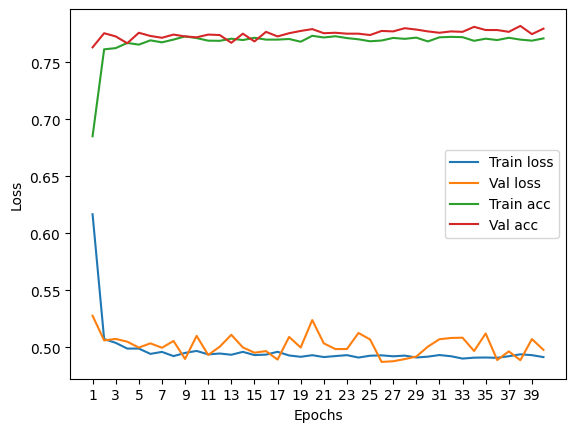

****************************************************************************************************



118it [00:02, 46.01it/s]


Train Epoch: 0 	Loss: 0.592462, Accuracy: 5326/7500 (71%)
Val Epoch: 0 	Loss: 0.523657, Accuracy: 1877/2500 (75%)



118it [00:02, 48.49it/s]


Train Epoch: 1 	Loss: 0.513214, Accuracy: 5661/7500 (75%)
Val Epoch: 1 	Loss: 0.520694, Accuracy: 1911/2500 (76%)



118it [00:02, 49.07it/s]


Train Epoch: 2 	Loss: 0.499206, Accuracy: 5725/7500 (76%)
Val Epoch: 2 	Loss: 0.504589, Accuracy: 1919/2500 (77%)



118it [00:02, 52.13it/s]


Train Epoch: 3 	Loss: 0.498776, Accuracy: 5733/7500 (76%)
Val Epoch: 3 	Loss: 0.501778, Accuracy: 1932/2500 (77%)



118it [00:02, 57.42it/s]


Train Epoch: 4 	Loss: 0.495749, Accuracy: 5748/7500 (77%)
Val Epoch: 4 	Loss: 0.494939, Accuracy: 1940/2500 (78%)



118it [00:02, 49.15it/s]


Train Epoch: 5 	Loss: 0.495244, Accuracy: 5743/7500 (77%)
Val Epoch: 5 	Loss: 0.512927, Accuracy: 1926/2500 (77%)



118it [00:02, 47.23it/s]


Train Epoch: 6 	Loss: 0.493609, Accuracy: 5774/7500 (77%)
Val Epoch: 6 	Loss: 0.504765, Accuracy: 1937/2500 (77%)



118it [00:02, 44.00it/s]


Train Epoch: 7 	Loss: 0.492854, Accuracy: 5740/7500 (77%)
Val Epoch: 7 	Loss: 0.503101, Accuracy: 1895/2500 (76%)



118it [00:02, 46.76it/s]


Train Epoch: 8 	Loss: 0.491728, Accuracy: 5762/7500 (77%)
Val Epoch: 8 	Loss: 0.496230, Accuracy: 1932/2500 (77%)



118it [00:02, 52.29it/s]


Train Epoch: 9 	Loss: 0.489584, Accuracy: 5770/7500 (77%)
Val Epoch: 9 	Loss: 0.499838, Accuracy: 1920/2500 (77%)



118it [00:02, 50.12it/s]


Train Epoch: 10 	Loss: 0.489992, Accuracy: 5755/7500 (77%)
Val Epoch: 10 	Loss: 0.500992, Accuracy: 1928/2500 (77%)



118it [00:02, 50.08it/s]


Train Epoch: 11 	Loss: 0.490337, Accuracy: 5770/7500 (77%)
Val Epoch: 11 	Loss: 0.505055, Accuracy: 1925/2500 (77%)



118it [00:02, 50.56it/s]


Train Epoch: 12 	Loss: 0.491605, Accuracy: 5769/7500 (77%)
Val Epoch: 12 	Loss: 0.499317, Accuracy: 1923/2500 (77%)



118it [00:02, 47.02it/s]


Train Epoch: 13 	Loss: 0.491417, Accuracy: 5781/7500 (77%)
Val Epoch: 13 	Loss: 0.502997, Accuracy: 1929/2500 (77%)



118it [00:02, 48.25it/s]


Train Epoch: 14 	Loss: 0.490590, Accuracy: 5790/7500 (77%)
Val Epoch: 14 	Loss: 0.492876, Accuracy: 1921/2500 (77%)



118it [00:02, 45.15it/s]


Train Epoch: 15 	Loss: 0.489821, Accuracy: 5782/7500 (77%)
Val Epoch: 15 	Loss: 0.499847, Accuracy: 1923/2500 (77%)



118it [00:02, 46.79it/s]


Train Epoch: 16 	Loss: 0.488932, Accuracy: 5767/7500 (77%)
Val Epoch: 16 	Loss: 0.493719, Accuracy: 1927/2500 (77%)



118it [00:02, 44.88it/s]


Train Epoch: 17 	Loss: 0.487562, Accuracy: 5788/7500 (77%)
Val Epoch: 17 	Loss: 0.503988, Accuracy: 1929/2500 (77%)



118it [00:02, 47.43it/s]


Train Epoch: 18 	Loss: 0.490499, Accuracy: 5764/7500 (77%)
Val Epoch: 18 	Loss: 0.498951, Accuracy: 1913/2500 (77%)



118it [00:02, 48.98it/s]


Train Epoch: 19 	Loss: 0.489909, Accuracy: 5775/7500 (77%)
Val Epoch: 19 	Loss: 0.496001, Accuracy: 1922/2500 (77%)



118it [00:02, 39.67it/s]


Train Epoch: 20 	Loss: 0.487950, Accuracy: 5776/7500 (77%)
Val Epoch: 20 	Loss: 0.503073, Accuracy: 1927/2500 (77%)



118it [00:02, 40.14it/s]


Train Epoch: 21 	Loss: 0.488101, Accuracy: 5792/7500 (77%)
Val Epoch: 21 	Loss: 0.502576, Accuracy: 1922/2500 (77%)



118it [00:02, 45.30it/s]


Train Epoch: 22 	Loss: 0.489125, Accuracy: 5773/7500 (77%)
Val Epoch: 22 	Loss: 0.510586, Accuracy: 1904/2500 (76%)



118it [00:02, 45.83it/s]


Train Epoch: 23 	Loss: 0.488101, Accuracy: 5783/7500 (77%)
Val Epoch: 23 	Loss: 0.504969, Accuracy: 1913/2500 (77%)



118it [00:02, 48.14it/s]


Train Epoch: 24 	Loss: 0.488919, Accuracy: 5787/7500 (77%)
Val Epoch: 24 	Loss: 0.502500, Accuracy: 1916/2500 (77%)



118it [00:02, 44.56it/s]


Train Epoch: 25 	Loss: 0.490105, Accuracy: 5782/7500 (77%)
Val Epoch: 25 	Loss: 0.503532, Accuracy: 1921/2500 (77%)



118it [00:02, 45.01it/s]


Train Epoch: 26 	Loss: 0.486484, Accuracy: 5796/7500 (77%)
Val Epoch: 26 	Loss: 0.504990, Accuracy: 1929/2500 (77%)



118it [00:02, 46.27it/s]


Train Epoch: 27 	Loss: 0.487710, Accuracy: 5781/7500 (77%)
Val Epoch: 27 	Loss: 0.499053, Accuracy: 1925/2500 (77%)



118it [00:02, 46.25it/s]


Train Epoch: 28 	Loss: 0.486160, Accuracy: 5792/7500 (77%)
Val Epoch: 28 	Loss: 0.498012, Accuracy: 1920/2500 (77%)



118it [00:02, 47.44it/s]


Train Epoch: 29 	Loss: 0.485685, Accuracy: 5777/7500 (77%)
Val Epoch: 29 	Loss: 0.493865, Accuracy: 1923/2500 (77%)



118it [00:02, 44.27it/s]


Train Epoch: 30 	Loss: 0.487412, Accuracy: 5760/7500 (77%)
Val Epoch: 30 	Loss: 0.510307, Accuracy: 1929/2500 (77%)



118it [00:02, 43.40it/s]


Train Epoch: 31 	Loss: 0.488241, Accuracy: 5790/7500 (77%)
Val Epoch: 31 	Loss: 0.508080, Accuracy: 1927/2500 (77%)



118it [00:02, 42.52it/s]


Train Epoch: 32 	Loss: 0.489013, Accuracy: 5802/7500 (77%)
Val Epoch: 32 	Loss: 0.524343, Accuracy: 1914/2500 (77%)



118it [00:02, 47.48it/s]


Train Epoch: 33 	Loss: 0.488241, Accuracy: 5792/7500 (77%)
Val Epoch: 33 	Loss: 0.516831, Accuracy: 1921/2500 (77%)



118it [00:01, 70.39it/s]


Train Epoch: 34 	Loss: 0.489819, Accuracy: 5803/7500 (77%)
Val Epoch: 34 	Loss: 0.495571, Accuracy: 1922/2500 (77%)



118it [00:02, 53.37it/s]


Train Epoch: 35 	Loss: 0.485683, Accuracy: 5775/7500 (77%)
Val Epoch: 35 	Loss: 0.502735, Accuracy: 1927/2500 (77%)



118it [00:01, 62.70it/s]


Train Epoch: 36 	Loss: 0.488218, Accuracy: 5807/7500 (77%)
Val Epoch: 36 	Loss: 0.501000, Accuracy: 1925/2500 (77%)



118it [00:02, 45.26it/s]


Train Epoch: 37 	Loss: 0.485895, Accuracy: 5796/7500 (77%)
Val Epoch: 37 	Loss: 0.496515, Accuracy: 1925/2500 (77%)



118it [00:02, 47.55it/s]


Train Epoch: 38 	Loss: 0.486696, Accuracy: 5788/7500 (77%)
Val Epoch: 38 	Loss: 0.494621, Accuracy: 1930/2500 (77%)



118it [00:02, 54.47it/s]


Train Epoch: 39 	Loss: 0.486086, Accuracy: 5783/7500 (77%)
Val Epoch: 39 	Loss: 0.500308, Accuracy: 1936/2500 (77%)

Test accuracy:  77.84


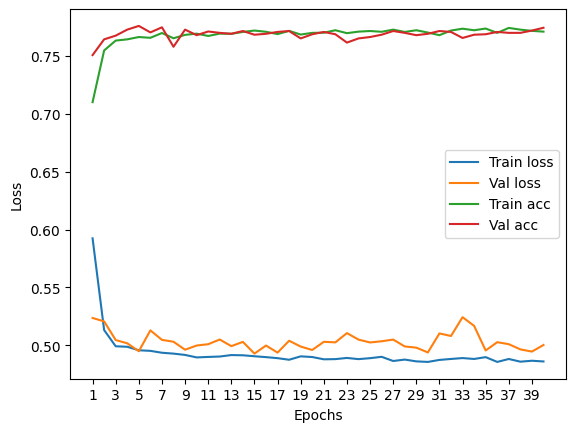

****************************************************************************************************



118it [00:02, 42.29it/s]


Train Epoch: 0 	Loss: 0.635452, Accuracy: 4808/7500 (64%)
Val Epoch: 0 	Loss: 0.553049, Accuracy: 1891/2500 (76%)



118it [00:02, 42.06it/s]


Train Epoch: 1 	Loss: 0.515632, Accuracy: 5701/7500 (76%)
Val Epoch: 1 	Loss: 0.522476, Accuracy: 1883/2500 (75%)



118it [00:02, 43.71it/s]


Train Epoch: 2 	Loss: 0.501996, Accuracy: 5759/7500 (77%)
Val Epoch: 2 	Loss: 0.534789, Accuracy: 1865/2500 (75%)



118it [00:02, 47.87it/s]


Train Epoch: 3 	Loss: 0.499523, Accuracy: 5780/7500 (77%)
Val Epoch: 3 	Loss: 0.522980, Accuracy: 1900/2500 (76%)



118it [00:02, 44.78it/s]


Train Epoch: 4 	Loss: 0.497057, Accuracy: 5785/7500 (77%)
Val Epoch: 4 	Loss: 0.517433, Accuracy: 1896/2500 (76%)



118it [00:02, 45.02it/s]


Train Epoch: 5 	Loss: 0.494964, Accuracy: 5806/7500 (77%)
Val Epoch: 5 	Loss: 0.516189, Accuracy: 1913/2500 (77%)



118it [00:02, 41.91it/s]


Train Epoch: 6 	Loss: 0.496797, Accuracy: 5796/7500 (77%)
Val Epoch: 6 	Loss: 0.516494, Accuracy: 1906/2500 (76%)



118it [00:02, 47.46it/s]


Train Epoch: 7 	Loss: 0.497301, Accuracy: 5801/7500 (77%)
Val Epoch: 7 	Loss: 0.511733, Accuracy: 1904/2500 (76%)



118it [00:02, 46.61it/s]


Train Epoch: 8 	Loss: 0.490695, Accuracy: 5815/7500 (78%)
Val Epoch: 8 	Loss: 0.518291, Accuracy: 1898/2500 (76%)



118it [00:02, 47.83it/s]


Train Epoch: 9 	Loss: 0.494542, Accuracy: 5814/7500 (78%)
Val Epoch: 9 	Loss: 0.514799, Accuracy: 1914/2500 (77%)



118it [00:02, 48.88it/s]


Train Epoch: 10 	Loss: 0.494030, Accuracy: 5809/7500 (77%)
Val Epoch: 10 	Loss: 0.509605, Accuracy: 1915/2500 (77%)



118it [00:02, 49.27it/s]


Train Epoch: 11 	Loss: 0.491813, Accuracy: 5803/7500 (77%)
Val Epoch: 11 	Loss: 0.519588, Accuracy: 1917/2500 (77%)



118it [00:02, 46.54it/s]


Train Epoch: 12 	Loss: 0.490962, Accuracy: 5808/7500 (77%)
Val Epoch: 12 	Loss: 0.516582, Accuracy: 1902/2500 (76%)



118it [00:02, 43.37it/s]


Train Epoch: 13 	Loss: 0.491624, Accuracy: 5823/7500 (78%)
Val Epoch: 13 	Loss: 0.510392, Accuracy: 1920/2500 (77%)



118it [00:02, 45.07it/s]


Train Epoch: 14 	Loss: 0.489048, Accuracy: 5813/7500 (78%)
Val Epoch: 14 	Loss: 0.514062, Accuracy: 1917/2500 (77%)



118it [00:02, 49.18it/s]


Train Epoch: 15 	Loss: 0.491478, Accuracy: 5816/7500 (78%)
Val Epoch: 15 	Loss: 0.505555, Accuracy: 1922/2500 (77%)



118it [00:02, 45.72it/s]


Train Epoch: 16 	Loss: 0.490367, Accuracy: 5825/7500 (78%)
Val Epoch: 16 	Loss: 0.501535, Accuracy: 1913/2500 (77%)



118it [00:02, 55.76it/s]


Train Epoch: 17 	Loss: 0.489475, Accuracy: 5817/7500 (78%)
Val Epoch: 17 	Loss: 0.503856, Accuracy: 1906/2500 (76%)



118it [00:02, 50.15it/s]


Train Epoch: 18 	Loss: 0.491317, Accuracy: 5812/7500 (77%)
Val Epoch: 18 	Loss: 0.511157, Accuracy: 1920/2500 (77%)



118it [00:02, 49.67it/s]


Train Epoch: 19 	Loss: 0.490404, Accuracy: 5813/7500 (78%)
Val Epoch: 19 	Loss: 0.520096, Accuracy: 1903/2500 (76%)



118it [00:02, 52.96it/s]


Train Epoch: 20 	Loss: 0.490525, Accuracy: 5805/7500 (77%)
Val Epoch: 20 	Loss: 0.501795, Accuracy: 1913/2500 (77%)



118it [00:02, 58.34it/s]


Train Epoch: 21 	Loss: 0.489267, Accuracy: 5799/7500 (77%)
Val Epoch: 21 	Loss: 0.509283, Accuracy: 1908/2500 (76%)



118it [00:02, 52.01it/s]


Train Epoch: 22 	Loss: 0.491593, Accuracy: 5799/7500 (77%)
Val Epoch: 22 	Loss: 0.501952, Accuracy: 1909/2500 (76%)



118it [00:02, 50.26it/s]


Train Epoch: 23 	Loss: 0.491095, Accuracy: 5817/7500 (78%)
Val Epoch: 23 	Loss: 0.510884, Accuracy: 1905/2500 (76%)



118it [00:02, 48.86it/s]


Train Epoch: 24 	Loss: 0.488074, Accuracy: 5807/7500 (77%)
Val Epoch: 24 	Loss: 0.522788, Accuracy: 1913/2500 (77%)



118it [00:02, 46.50it/s]


Train Epoch: 25 	Loss: 0.488836, Accuracy: 5824/7500 (78%)
Val Epoch: 25 	Loss: 0.504337, Accuracy: 1915/2500 (77%)



118it [00:02, 45.34it/s]


Train Epoch: 26 	Loss: 0.490740, Accuracy: 5822/7500 (78%)
Val Epoch: 26 	Loss: 0.511213, Accuracy: 1900/2500 (76%)



118it [00:02, 53.33it/s]


Train Epoch: 27 	Loss: 0.489578, Accuracy: 5814/7500 (78%)
Val Epoch: 27 	Loss: 0.507707, Accuracy: 1900/2500 (76%)



118it [00:02, 56.41it/s]


Train Epoch: 28 	Loss: 0.489490, Accuracy: 5824/7500 (78%)
Val Epoch: 28 	Loss: 0.504871, Accuracy: 1907/2500 (76%)



118it [00:02, 47.87it/s]


Train Epoch: 29 	Loss: 0.489909, Accuracy: 5819/7500 (78%)
Val Epoch: 29 	Loss: 0.516229, Accuracy: 1914/2500 (77%)



118it [00:02, 47.58it/s]


Train Epoch: 30 	Loss: 0.492705, Accuracy: 5835/7500 (78%)
Val Epoch: 30 	Loss: 0.506251, Accuracy: 1902/2500 (76%)



118it [00:02, 43.90it/s]


Train Epoch: 31 	Loss: 0.489482, Accuracy: 5827/7500 (78%)
Val Epoch: 31 	Loss: 0.506210, Accuracy: 1903/2500 (76%)



118it [00:02, 49.20it/s]


Train Epoch: 32 	Loss: 0.488239, Accuracy: 5836/7500 (78%)
Val Epoch: 32 	Loss: 0.512328, Accuracy: 1907/2500 (76%)



118it [00:02, 51.14it/s]


Train Epoch: 33 	Loss: 0.492266, Accuracy: 5821/7500 (78%)
Val Epoch: 33 	Loss: 0.505217, Accuracy: 1900/2500 (76%)



118it [00:02, 47.49it/s]


Train Epoch: 34 	Loss: 0.489339, Accuracy: 5831/7500 (78%)
Val Epoch: 34 	Loss: 0.510688, Accuracy: 1902/2500 (76%)



118it [00:02, 46.67it/s]


Train Epoch: 35 	Loss: 0.490457, Accuracy: 5800/7500 (77%)
Val Epoch: 35 	Loss: 0.514794, Accuracy: 1898/2500 (76%)



118it [00:02, 54.05it/s]


Train Epoch: 36 	Loss: 0.490012, Accuracy: 5824/7500 (78%)
Val Epoch: 36 	Loss: 0.504633, Accuracy: 1911/2500 (76%)



118it [00:02, 48.69it/s]


Train Epoch: 37 	Loss: 0.490928, Accuracy: 5806/7500 (77%)
Val Epoch: 37 	Loss: 0.516350, Accuracy: 1918/2500 (77%)



118it [00:02, 45.78it/s]


Train Epoch: 38 	Loss: 0.491207, Accuracy: 5817/7500 (78%)
Val Epoch: 38 	Loss: 0.509882, Accuracy: 1911/2500 (76%)



118it [00:02, 52.51it/s]


Train Epoch: 39 	Loss: 0.487304, Accuracy: 5822/7500 (78%)
Val Epoch: 39 	Loss: 0.517052, Accuracy: 1916/2500 (77%)

Test accuracy:  77.0


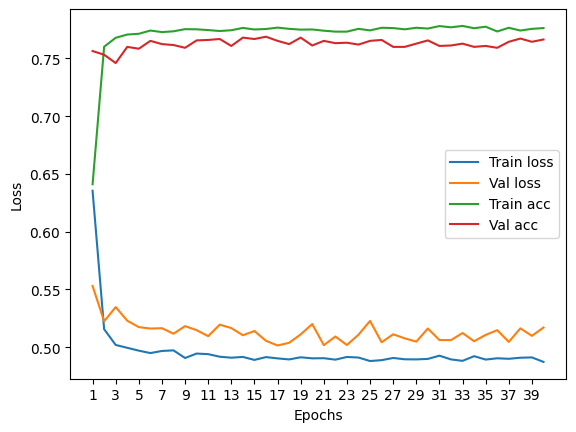

****************************************************************************************************



118it [00:02, 44.18it/s]


Train Epoch: 0 	Loss: 0.594235, Accuracy: 5270/7500 (70%)
Val Epoch: 0 	Loss: 0.524016, Accuracy: 1933/2500 (77%)



118it [00:02, 47.85it/s]


Train Epoch: 1 	Loss: 0.516365, Accuracy: 5677/7500 (76%)
Val Epoch: 1 	Loss: 0.506302, Accuracy: 1951/2500 (78%)



118it [00:02, 51.81it/s]


Train Epoch: 2 	Loss: 0.504751, Accuracy: 5735/7500 (76%)
Val Epoch: 2 	Loss: 0.512646, Accuracy: 1948/2500 (78%)



118it [00:02, 47.05it/s]


Train Epoch: 3 	Loss: 0.500373, Accuracy: 5737/7500 (76%)
Val Epoch: 3 	Loss: 0.507681, Accuracy: 1926/2500 (77%)



118it [00:02, 47.97it/s]


Train Epoch: 4 	Loss: 0.499200, Accuracy: 5736/7500 (76%)
Val Epoch: 4 	Loss: 0.491367, Accuracy: 1957/2500 (78%)



118it [00:02, 47.60it/s]


Train Epoch: 5 	Loss: 0.497642, Accuracy: 5736/7500 (76%)
Val Epoch: 5 	Loss: 0.513843, Accuracy: 1921/2500 (77%)



118it [00:02, 48.33it/s]


Train Epoch: 6 	Loss: 0.500416, Accuracy: 5727/7500 (76%)
Val Epoch: 6 	Loss: 0.501877, Accuracy: 1948/2500 (78%)



118it [00:02, 51.37it/s]


Train Epoch: 7 	Loss: 0.496438, Accuracy: 5740/7500 (77%)
Val Epoch: 7 	Loss: 0.500297, Accuracy: 1945/2500 (78%)



118it [00:02, 49.31it/s]


Train Epoch: 8 	Loss: 0.496511, Accuracy: 5744/7500 (77%)
Val Epoch: 8 	Loss: 0.497139, Accuracy: 1951/2500 (78%)



118it [00:02, 46.13it/s]


Train Epoch: 9 	Loss: 0.496321, Accuracy: 5740/7500 (77%)
Val Epoch: 9 	Loss: 0.499043, Accuracy: 1948/2500 (78%)



118it [00:02, 43.66it/s]


Train Epoch: 10 	Loss: 0.495737, Accuracy: 5751/7500 (77%)
Val Epoch: 10 	Loss: 0.491790, Accuracy: 1950/2500 (78%)



118it [00:02, 44.30it/s]


Train Epoch: 11 	Loss: 0.496172, Accuracy: 5741/7500 (77%)
Val Epoch: 11 	Loss: 0.509750, Accuracy: 1940/2500 (78%)



118it [00:02, 51.04it/s]


Train Epoch: 12 	Loss: 0.493938, Accuracy: 5759/7500 (77%)
Val Epoch: 12 	Loss: 0.490697, Accuracy: 1952/2500 (78%)



118it [00:02, 46.82it/s]


Train Epoch: 13 	Loss: 0.497752, Accuracy: 5729/7500 (76%)
Val Epoch: 13 	Loss: 0.505179, Accuracy: 1946/2500 (78%)



118it [00:02, 49.93it/s]


Train Epoch: 14 	Loss: 0.493945, Accuracy: 5731/7500 (76%)
Val Epoch: 14 	Loss: 0.509608, Accuracy: 1954/2500 (78%)



118it [00:02, 47.73it/s]


Train Epoch: 15 	Loss: 0.493148, Accuracy: 5725/7500 (76%)
Val Epoch: 15 	Loss: 0.497299, Accuracy: 1957/2500 (78%)



118it [00:02, 48.04it/s]


Train Epoch: 16 	Loss: 0.495555, Accuracy: 5733/7500 (76%)
Val Epoch: 16 	Loss: 0.496817, Accuracy: 1941/2500 (78%)



118it [00:02, 50.57it/s]


Train Epoch: 17 	Loss: 0.493685, Accuracy: 5746/7500 (77%)
Val Epoch: 17 	Loss: 0.493802, Accuracy: 1942/2500 (78%)



118it [00:02, 50.58it/s]


Train Epoch: 18 	Loss: 0.494151, Accuracy: 5743/7500 (77%)
Val Epoch: 18 	Loss: 0.502501, Accuracy: 1958/2500 (78%)



118it [00:02, 50.12it/s]


Train Epoch: 19 	Loss: 0.494506, Accuracy: 5755/7500 (77%)
Val Epoch: 19 	Loss: 0.497258, Accuracy: 1952/2500 (78%)



118it [00:02, 47.77it/s]


Train Epoch: 20 	Loss: 0.495678, Accuracy: 5738/7500 (77%)
Val Epoch: 20 	Loss: 0.494003, Accuracy: 1952/2500 (78%)



118it [00:02, 47.13it/s]


Train Epoch: 21 	Loss: 0.492693, Accuracy: 5749/7500 (77%)
Val Epoch: 21 	Loss: 0.498649, Accuracy: 1936/2500 (77%)



118it [00:02, 49.67it/s]


Train Epoch: 22 	Loss: 0.492927, Accuracy: 5740/7500 (77%)
Val Epoch: 22 	Loss: 0.489044, Accuracy: 1952/2500 (78%)



118it [00:02, 50.34it/s]


Train Epoch: 23 	Loss: 0.493662, Accuracy: 5758/7500 (77%)
Val Epoch: 23 	Loss: 0.487547, Accuracy: 1953/2500 (78%)



118it [00:02, 47.90it/s]


Train Epoch: 24 	Loss: 0.493081, Accuracy: 5770/7500 (77%)
Val Epoch: 24 	Loss: 0.500353, Accuracy: 1928/2500 (77%)



118it [00:02, 47.37it/s]


Train Epoch: 25 	Loss: 0.494771, Accuracy: 5739/7500 (77%)
Val Epoch: 25 	Loss: 0.487795, Accuracy: 1954/2500 (78%)



118it [00:02, 47.62it/s]


Train Epoch: 26 	Loss: 0.494875, Accuracy: 5761/7500 (77%)
Val Epoch: 26 	Loss: 0.498801, Accuracy: 1944/2500 (78%)



118it [00:02, 48.75it/s]


Train Epoch: 27 	Loss: 0.492221, Accuracy: 5767/7500 (77%)
Val Epoch: 27 	Loss: 0.508490, Accuracy: 1951/2500 (78%)



118it [00:02, 52.81it/s]


Train Epoch: 28 	Loss: 0.493470, Accuracy: 5766/7500 (77%)
Val Epoch: 28 	Loss: 0.495170, Accuracy: 1946/2500 (78%)



118it [00:02, 48.71it/s]


Train Epoch: 29 	Loss: 0.493518, Accuracy: 5762/7500 (77%)
Val Epoch: 29 	Loss: 0.493840, Accuracy: 1946/2500 (78%)



118it [00:02, 51.49it/s]


Train Epoch: 30 	Loss: 0.492682, Accuracy: 5756/7500 (77%)
Val Epoch: 30 	Loss: 0.501619, Accuracy: 1937/2500 (77%)



118it [00:02, 50.92it/s]


Train Epoch: 31 	Loss: 0.491499, Accuracy: 5745/7500 (77%)
Val Epoch: 31 	Loss: 0.503872, Accuracy: 1936/2500 (77%)



118it [00:02, 48.92it/s]


Train Epoch: 32 	Loss: 0.492448, Accuracy: 5758/7500 (77%)
Val Epoch: 32 	Loss: 0.504212, Accuracy: 1949/2500 (78%)



118it [00:02, 52.42it/s]


Train Epoch: 33 	Loss: 0.495072, Accuracy: 5741/7500 (77%)
Val Epoch: 33 	Loss: 0.492260, Accuracy: 1938/2500 (78%)



118it [00:02, 46.94it/s]


Train Epoch: 34 	Loss: 0.494129, Accuracy: 5778/7500 (77%)
Val Epoch: 34 	Loss: 0.490593, Accuracy: 1945/2500 (78%)



118it [00:02, 46.78it/s]


Train Epoch: 35 	Loss: 0.491816, Accuracy: 5747/7500 (77%)
Val Epoch: 35 	Loss: 0.489600, Accuracy: 1961/2500 (78%)



118it [00:02, 50.98it/s]


Train Epoch: 36 	Loss: 0.494615, Accuracy: 5733/7500 (76%)
Val Epoch: 36 	Loss: 0.500336, Accuracy: 1958/2500 (78%)



118it [00:02, 49.24it/s]


Train Epoch: 37 	Loss: 0.492100, Accuracy: 5758/7500 (77%)
Val Epoch: 37 	Loss: 0.492518, Accuracy: 1953/2500 (78%)



118it [00:02, 47.12it/s]


Train Epoch: 38 	Loss: 0.492186, Accuracy: 5770/7500 (77%)
Val Epoch: 38 	Loss: 0.494038, Accuracy: 1949/2500 (78%)



118it [00:02, 48.80it/s]


Train Epoch: 39 	Loss: 0.491468, Accuracy: 5765/7500 (77%)
Val Epoch: 39 	Loss: 0.495027, Accuracy: 1951/2500 (78%)

Test accuracy:  76.84


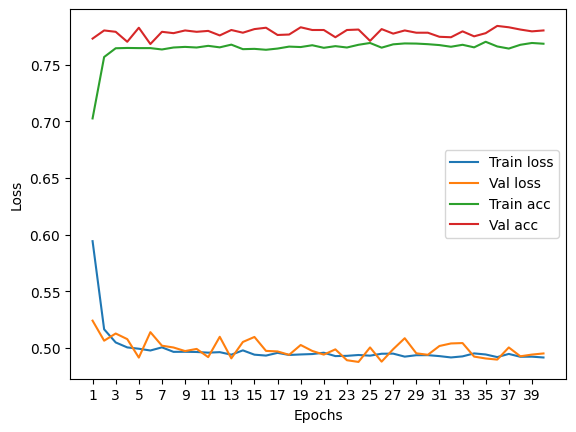

****************************************************************************************************



116it [00:02, 48.04it/s]


Train Epoch: 0 	Loss: 0.600168, Accuracy: 5155/7422 (69%)
Val Epoch: 0 	Loss: 0.534987, Accuracy: 1885/2474 (76%)



116it [00:02, 52.10it/s]


Train Epoch: 1 	Loss: 0.513757, Accuracy: 5600/7422 (75%)
Val Epoch: 1 	Loss: 0.512351, Accuracy: 1877/2474 (76%)



116it [00:02, 52.59it/s]


Train Epoch: 2 	Loss: 0.505306, Accuracy: 5638/7422 (76%)
Val Epoch: 2 	Loss: 0.512393, Accuracy: 1901/2474 (77%)



116it [00:02, 48.38it/s]


Train Epoch: 3 	Loss: 0.498877, Accuracy: 5677/7422 (76%)
Val Epoch: 3 	Loss: 0.526451, Accuracy: 1883/2474 (76%)



116it [00:02, 50.04it/s]


Train Epoch: 4 	Loss: 0.501413, Accuracy: 5642/7422 (76%)
Val Epoch: 4 	Loss: 0.501184, Accuracy: 1894/2474 (77%)



116it [00:02, 44.92it/s]


Train Epoch: 5 	Loss: 0.496145, Accuracy: 5697/7422 (77%)
Val Epoch: 5 	Loss: 0.504198, Accuracy: 1899/2474 (77%)



116it [00:02, 46.44it/s]


Train Epoch: 6 	Loss: 0.492425, Accuracy: 5709/7422 (77%)
Val Epoch: 6 	Loss: 0.501066, Accuracy: 1901/2474 (77%)



116it [00:02, 49.46it/s]


Train Epoch: 7 	Loss: 0.493380, Accuracy: 5715/7422 (77%)
Val Epoch: 7 	Loss: 0.498065, Accuracy: 1892/2474 (76%)



116it [00:02, 50.43it/s]


Train Epoch: 8 	Loss: 0.492866, Accuracy: 5698/7422 (77%)
Val Epoch: 8 	Loss: 0.499200, Accuracy: 1910/2474 (77%)



116it [00:02, 55.37it/s]


Train Epoch: 9 	Loss: 0.490434, Accuracy: 5715/7422 (77%)
Val Epoch: 9 	Loss: 0.497277, Accuracy: 1904/2474 (77%)



116it [00:02, 47.52it/s]


Train Epoch: 10 	Loss: 0.491223, Accuracy: 5690/7422 (77%)
Val Epoch: 10 	Loss: 0.493775, Accuracy: 1895/2474 (77%)



116it [00:02, 46.63it/s]


Train Epoch: 11 	Loss: 0.488948, Accuracy: 5717/7422 (77%)
Val Epoch: 11 	Loss: 0.493873, Accuracy: 1904/2474 (77%)



116it [00:02, 51.00it/s]


Train Epoch: 12 	Loss: 0.492197, Accuracy: 5691/7422 (77%)
Val Epoch: 12 	Loss: 0.495880, Accuracy: 1906/2474 (77%)



116it [00:02, 49.06it/s]


Train Epoch: 13 	Loss: 0.491259, Accuracy: 5701/7422 (77%)
Val Epoch: 13 	Loss: 0.506461, Accuracy: 1892/2474 (76%)



116it [00:02, 50.12it/s]


Train Epoch: 14 	Loss: 0.489371, Accuracy: 5709/7422 (77%)
Val Epoch: 14 	Loss: 0.492769, Accuracy: 1902/2474 (77%)



116it [00:02, 45.33it/s]


Train Epoch: 15 	Loss: 0.489748, Accuracy: 5705/7422 (77%)
Val Epoch: 15 	Loss: 0.491397, Accuracy: 1906/2474 (77%)



116it [00:02, 46.27it/s]


Train Epoch: 16 	Loss: 0.488717, Accuracy: 5727/7422 (77%)
Val Epoch: 16 	Loss: 0.495463, Accuracy: 1903/2474 (77%)



116it [00:02, 46.63it/s]


Train Epoch: 17 	Loss: 0.489709, Accuracy: 5702/7422 (77%)
Val Epoch: 17 	Loss: 0.494385, Accuracy: 1899/2474 (77%)



116it [00:02, 49.51it/s]


Train Epoch: 18 	Loss: 0.489157, Accuracy: 5724/7422 (77%)
Val Epoch: 18 	Loss: 0.495001, Accuracy: 1900/2474 (77%)



116it [00:02, 49.92it/s]


Train Epoch: 19 	Loss: 0.488500, Accuracy: 5727/7422 (77%)
Val Epoch: 19 	Loss: 0.491638, Accuracy: 1904/2474 (77%)



116it [00:02, 54.53it/s]


Train Epoch: 20 	Loss: 0.486698, Accuracy: 5727/7422 (77%)
Val Epoch: 20 	Loss: 0.495544, Accuracy: 1903/2474 (77%)



116it [00:02, 49.82it/s]


Train Epoch: 21 	Loss: 0.488223, Accuracy: 5717/7422 (77%)
Val Epoch: 21 	Loss: 0.506863, Accuracy: 1886/2474 (76%)



116it [00:02, 51.35it/s]


Train Epoch: 22 	Loss: 0.487711, Accuracy: 5747/7422 (77%)
Val Epoch: 22 	Loss: 0.494585, Accuracy: 1890/2474 (76%)



116it [00:01, 63.76it/s]


Train Epoch: 23 	Loss: 0.487556, Accuracy: 5700/7422 (77%)
Val Epoch: 23 	Loss: 0.492963, Accuracy: 1902/2474 (77%)



116it [00:02, 53.93it/s]


Train Epoch: 24 	Loss: 0.488067, Accuracy: 5727/7422 (77%)
Val Epoch: 24 	Loss: 0.491440, Accuracy: 1901/2474 (77%)



116it [00:02, 50.46it/s]


Train Epoch: 25 	Loss: 0.488037, Accuracy: 5705/7422 (77%)
Val Epoch: 25 	Loss: 0.505094, Accuracy: 1893/2474 (77%)



116it [00:02, 57.50it/s]


Train Epoch: 26 	Loss: 0.487704, Accuracy: 5723/7422 (77%)
Val Epoch: 26 	Loss: 0.493294, Accuracy: 1904/2474 (77%)



116it [00:02, 54.65it/s]


Train Epoch: 27 	Loss: 0.486903, Accuracy: 5722/7422 (77%)
Val Epoch: 27 	Loss: 0.491525, Accuracy: 1903/2474 (77%)



116it [00:02, 54.61it/s]


Train Epoch: 28 	Loss: 0.487097, Accuracy: 5746/7422 (77%)
Val Epoch: 28 	Loss: 0.502283, Accuracy: 1888/2474 (76%)



116it [00:01, 60.64it/s]


Train Epoch: 29 	Loss: 0.486298, Accuracy: 5733/7422 (77%)
Val Epoch: 29 	Loss: 0.494930, Accuracy: 1900/2474 (77%)



116it [00:02, 54.53it/s]


Train Epoch: 30 	Loss: 0.485995, Accuracy: 5699/7422 (77%)
Val Epoch: 30 	Loss: 0.498022, Accuracy: 1897/2474 (77%)



116it [00:02, 54.56it/s]


Train Epoch: 31 	Loss: 0.486061, Accuracy: 5706/7422 (77%)
Val Epoch: 31 	Loss: 0.492789, Accuracy: 1909/2474 (77%)



116it [00:02, 54.81it/s]


Train Epoch: 32 	Loss: 0.485023, Accuracy: 5746/7422 (77%)
Val Epoch: 32 	Loss: 0.495063, Accuracy: 1900/2474 (77%)



116it [00:02, 55.62it/s]


Train Epoch: 33 	Loss: 0.486421, Accuracy: 5737/7422 (77%)
Val Epoch: 33 	Loss: 0.495757, Accuracy: 1906/2474 (77%)



116it [00:02, 47.12it/s]


Train Epoch: 34 	Loss: 0.485851, Accuracy: 5724/7422 (77%)
Val Epoch: 34 	Loss: 0.492985, Accuracy: 1899/2474 (77%)



116it [00:02, 48.92it/s]


Train Epoch: 35 	Loss: 0.485107, Accuracy: 5731/7422 (77%)
Val Epoch: 35 	Loss: 0.492708, Accuracy: 1903/2474 (77%)



116it [00:02, 47.09it/s]


Train Epoch: 36 	Loss: 0.484823, Accuracy: 5748/7422 (77%)
Val Epoch: 36 	Loss: 0.491825, Accuracy: 1909/2474 (77%)



116it [00:02, 45.70it/s]


Train Epoch: 37 	Loss: 0.486471, Accuracy: 5713/7422 (77%)
Val Epoch: 37 	Loss: 0.495740, Accuracy: 1899/2474 (77%)



116it [00:02, 46.69it/s]


Train Epoch: 38 	Loss: 0.486207, Accuracy: 5730/7422 (77%)
Val Epoch: 38 	Loss: 0.498576, Accuracy: 1896/2474 (77%)



116it [00:02, 51.75it/s]


Train Epoch: 39 	Loss: 0.486183, Accuracy: 5747/7422 (77%)
Val Epoch: 39 	Loss: 0.491228, Accuracy: 1910/2474 (77%)

Test accuracy:  76.31366208569119


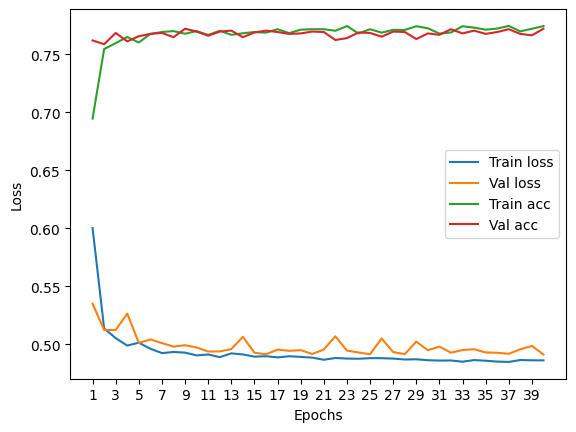

****************************************************************************************************



Particles per jet: 5


118it [00:02, 55.11it/s]


Train Epoch: 0 	Loss: 0.614759, Accuracy: 5261/7500 (70%)
Val Epoch: 0 	Loss: 0.524855, Accuracy: 1899/2500 (76%)



118it [00:02, 52.33it/s]


Train Epoch: 1 	Loss: 0.502640, Accuracy: 5740/7500 (77%)
Val Epoch: 1 	Loss: 0.509628, Accuracy: 1914/2500 (77%)



118it [00:02, 58.64it/s]


Train Epoch: 2 	Loss: 0.494471, Accuracy: 5757/7500 (77%)
Val Epoch: 2 	Loss: 0.500344, Accuracy: 1910/2500 (76%)



118it [00:02, 52.03it/s]


Train Epoch: 3 	Loss: 0.493098, Accuracy: 5780/7500 (77%)
Val Epoch: 3 	Loss: 0.517123, Accuracy: 1903/2500 (76%)



118it [00:02, 53.11it/s]


Train Epoch: 4 	Loss: 0.490153, Accuracy: 5816/7500 (78%)
Val Epoch: 4 	Loss: 0.499269, Accuracy: 1923/2500 (77%)



118it [00:02, 54.91it/s]


Train Epoch: 5 	Loss: 0.486550, Accuracy: 5789/7500 (77%)
Val Epoch: 5 	Loss: 0.507970, Accuracy: 1923/2500 (77%)



118it [00:02, 55.49it/s]


Train Epoch: 6 	Loss: 0.487818, Accuracy: 5809/7500 (77%)
Val Epoch: 6 	Loss: 0.501677, Accuracy: 1918/2500 (77%)



118it [00:02, 53.87it/s]


Train Epoch: 7 	Loss: 0.485469, Accuracy: 5827/7500 (78%)
Val Epoch: 7 	Loss: 0.502070, Accuracy: 1918/2500 (77%)



118it [00:02, 54.86it/s]


Train Epoch: 8 	Loss: 0.488311, Accuracy: 5801/7500 (77%)
Val Epoch: 8 	Loss: 0.506308, Accuracy: 1921/2500 (77%)



118it [00:02, 53.72it/s]


Train Epoch: 9 	Loss: 0.486020, Accuracy: 5815/7500 (78%)
Val Epoch: 9 	Loss: 0.498873, Accuracy: 1921/2500 (77%)



118it [00:02, 55.06it/s]


Train Epoch: 10 	Loss: 0.484254, Accuracy: 5811/7500 (77%)
Val Epoch: 10 	Loss: 0.496076, Accuracy: 1927/2500 (77%)



118it [00:02, 55.30it/s]


Train Epoch: 11 	Loss: 0.485050, Accuracy: 5805/7500 (77%)
Val Epoch: 11 	Loss: 0.498041, Accuracy: 1914/2500 (77%)



118it [00:02, 56.74it/s]


Train Epoch: 12 	Loss: 0.484487, Accuracy: 5815/7500 (78%)
Val Epoch: 12 	Loss: 0.520484, Accuracy: 1920/2500 (77%)



118it [00:02, 53.01it/s]


Train Epoch: 13 	Loss: 0.483849, Accuracy: 5839/7500 (78%)
Val Epoch: 13 	Loss: 0.499042, Accuracy: 1923/2500 (77%)



118it [00:01, 60.23it/s]


Train Epoch: 14 	Loss: 0.484289, Accuracy: 5803/7500 (77%)
Val Epoch: 14 	Loss: 0.515734, Accuracy: 1922/2500 (77%)



118it [00:02, 53.49it/s]


Train Epoch: 15 	Loss: 0.484440, Accuracy: 5823/7500 (78%)
Val Epoch: 15 	Loss: 0.510549, Accuracy: 1923/2500 (77%)



118it [00:01, 66.59it/s] 


Train Epoch: 16 	Loss: 0.482557, Accuracy: 5808/7500 (77%)
Val Epoch: 16 	Loss: 0.506729, Accuracy: 1924/2500 (77%)



118it [00:02, 54.49it/s]


Train Epoch: 17 	Loss: 0.483555, Accuracy: 5825/7500 (78%)
Val Epoch: 17 	Loss: 0.502729, Accuracy: 1927/2500 (77%)



118it [00:02, 55.64it/s]


Train Epoch: 18 	Loss: 0.481020, Accuracy: 5833/7500 (78%)
Val Epoch: 18 	Loss: 0.500205, Accuracy: 1928/2500 (77%)



118it [00:02, 47.81it/s]


Train Epoch: 19 	Loss: 0.484176, Accuracy: 5838/7500 (78%)
Val Epoch: 19 	Loss: 0.495802, Accuracy: 1923/2500 (77%)



118it [00:02, 56.89it/s]


Train Epoch: 20 	Loss: 0.483914, Accuracy: 5802/7500 (77%)
Val Epoch: 20 	Loss: 0.513831, Accuracy: 1912/2500 (76%)



118it [00:02, 53.91it/s]


Train Epoch: 21 	Loss: 0.483266, Accuracy: 5849/7500 (78%)
Val Epoch: 21 	Loss: 0.498753, Accuracy: 1919/2500 (77%)



118it [00:02, 44.56it/s]


Train Epoch: 22 	Loss: 0.483656, Accuracy: 5831/7500 (78%)
Val Epoch: 22 	Loss: 0.518749, Accuracy: 1895/2500 (76%)



118it [00:02, 46.35it/s]


Train Epoch: 23 	Loss: 0.485195, Accuracy: 5821/7500 (78%)
Val Epoch: 23 	Loss: 0.503127, Accuracy: 1926/2500 (77%)



118it [00:02, 54.19it/s]


Train Epoch: 24 	Loss: 0.482167, Accuracy: 5823/7500 (78%)
Val Epoch: 24 	Loss: 0.511993, Accuracy: 1894/2500 (76%)



118it [00:01, 59.43it/s]


Train Epoch: 25 	Loss: 0.480596, Accuracy: 5809/7500 (77%)
Val Epoch: 25 	Loss: 0.510540, Accuracy: 1911/2500 (76%)



118it [00:02, 47.38it/s]


Train Epoch: 26 	Loss: 0.483279, Accuracy: 5833/7500 (78%)
Val Epoch: 26 	Loss: 0.514266, Accuracy: 1914/2500 (77%)



118it [00:02, 44.74it/s]


Train Epoch: 27 	Loss: 0.480086, Accuracy: 5817/7500 (78%)
Val Epoch: 27 	Loss: 0.582695, Accuracy: 1856/2500 (74%)



118it [00:02, 50.74it/s]


Train Epoch: 28 	Loss: 0.486506, Accuracy: 5800/7500 (77%)
Val Epoch: 28 	Loss: 0.505475, Accuracy: 1920/2500 (77%)



118it [00:02, 53.65it/s]


Train Epoch: 29 	Loss: 0.480511, Accuracy: 5821/7500 (78%)
Val Epoch: 29 	Loss: 0.517284, Accuracy: 1902/2500 (76%)



118it [00:02, 49.80it/s]


Train Epoch: 30 	Loss: 0.480182, Accuracy: 5816/7500 (78%)
Val Epoch: 30 	Loss: 0.497158, Accuracy: 1923/2500 (77%)



118it [00:02, 55.06it/s]


Train Epoch: 31 	Loss: 0.482225, Accuracy: 5845/7500 (78%)
Val Epoch: 31 	Loss: 0.502448, Accuracy: 1920/2500 (77%)



118it [00:02, 53.48it/s]


Train Epoch: 32 	Loss: 0.482923, Accuracy: 5821/7500 (78%)
Val Epoch: 32 	Loss: 0.498451, Accuracy: 1922/2500 (77%)



118it [00:02, 53.39it/s]


Train Epoch: 33 	Loss: 0.479531, Accuracy: 5834/7500 (78%)
Val Epoch: 33 	Loss: 0.495458, Accuracy: 1922/2500 (77%)



118it [00:02, 53.08it/s]


Train Epoch: 34 	Loss: 0.481742, Accuracy: 5823/7500 (78%)
Val Epoch: 34 	Loss: 0.505617, Accuracy: 1928/2500 (77%)



118it [00:02, 53.47it/s]


Train Epoch: 35 	Loss: 0.483752, Accuracy: 5800/7500 (77%)
Val Epoch: 35 	Loss: 0.494690, Accuracy: 1921/2500 (77%)



118it [00:02, 49.69it/s]


Train Epoch: 36 	Loss: 0.481544, Accuracy: 5841/7500 (78%)
Val Epoch: 36 	Loss: 0.495430, Accuracy: 1924/2500 (77%)



118it [00:02, 50.97it/s]


Train Epoch: 37 	Loss: 0.480922, Accuracy: 5824/7500 (78%)
Val Epoch: 37 	Loss: 0.502671, Accuracy: 1919/2500 (77%)



118it [00:02, 53.26it/s]


Train Epoch: 38 	Loss: 0.480553, Accuracy: 5823/7500 (78%)
Val Epoch: 38 	Loss: 0.500511, Accuracy: 1918/2500 (77%)



118it [00:02, 51.26it/s]


Train Epoch: 39 	Loss: 0.482111, Accuracy: 5816/7500 (78%)
Val Epoch: 39 	Loss: 0.504844, Accuracy: 1916/2500 (77%)

Test accuracy:  76.52


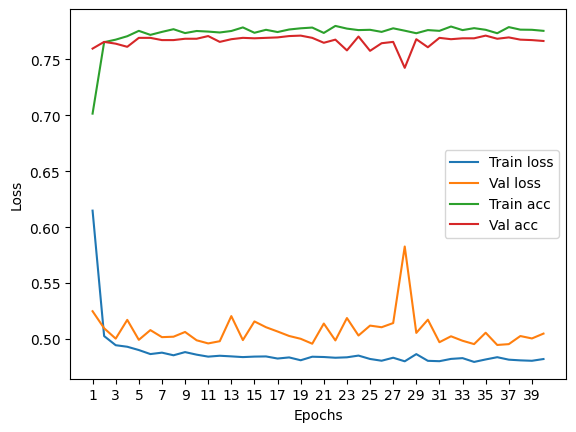

****************************************************************************************************



118it [00:02, 45.11it/s]


Train Epoch: 0 	Loss: 0.594249, Accuracy: 5261/7500 (70%)
Val Epoch: 0 	Loss: 0.519095, Accuracy: 1888/2500 (76%)



118it [00:02, 47.71it/s]


Train Epoch: 1 	Loss: 0.512353, Accuracy: 5672/7500 (76%)
Val Epoch: 1 	Loss: 0.509047, Accuracy: 1879/2500 (75%)



118it [00:02, 47.55it/s]


Train Epoch: 2 	Loss: 0.507507, Accuracy: 5694/7500 (76%)
Val Epoch: 2 	Loss: 0.508070, Accuracy: 1895/2500 (76%)



118it [00:02, 50.77it/s]


Train Epoch: 3 	Loss: 0.501622, Accuracy: 5752/7500 (77%)
Val Epoch: 3 	Loss: 0.513312, Accuracy: 1894/2500 (76%)



118it [00:02, 48.27it/s]


Train Epoch: 4 	Loss: 0.500260, Accuracy: 5744/7500 (77%)
Val Epoch: 4 	Loss: 0.527519, Accuracy: 1895/2500 (76%)



118it [00:02, 49.40it/s]


Train Epoch: 5 	Loss: 0.496858, Accuracy: 5750/7500 (77%)
Val Epoch: 5 	Loss: 0.497370, Accuracy: 1898/2500 (76%)



118it [00:02, 42.25it/s]


Train Epoch: 6 	Loss: 0.499933, Accuracy: 5734/7500 (76%)
Val Epoch: 6 	Loss: 0.502934, Accuracy: 1907/2500 (76%)



118it [00:02, 41.52it/s]


Train Epoch: 7 	Loss: 0.493627, Accuracy: 5758/7500 (77%)
Val Epoch: 7 	Loss: 0.505481, Accuracy: 1906/2500 (76%)



118it [00:02, 49.33it/s]


Train Epoch: 8 	Loss: 0.495157, Accuracy: 5778/7500 (77%)
Val Epoch: 8 	Loss: 0.506711, Accuracy: 1905/2500 (76%)



118it [00:02, 46.09it/s]


Train Epoch: 9 	Loss: 0.494990, Accuracy: 5748/7500 (77%)
Val Epoch: 9 	Loss: 0.496741, Accuracy: 1912/2500 (76%)



118it [00:02, 43.97it/s]


Train Epoch: 10 	Loss: 0.495516, Accuracy: 5748/7500 (77%)
Val Epoch: 10 	Loss: 0.492929, Accuracy: 1908/2500 (76%)



118it [00:02, 42.79it/s]


Train Epoch: 11 	Loss: 0.492900, Accuracy: 5776/7500 (77%)
Val Epoch: 11 	Loss: 0.501527, Accuracy: 1909/2500 (76%)



118it [00:02, 44.16it/s]


Train Epoch: 12 	Loss: 0.494285, Accuracy: 5765/7500 (77%)
Val Epoch: 12 	Loss: 0.492456, Accuracy: 1905/2500 (76%)



118it [00:02, 49.09it/s]


Train Epoch: 13 	Loss: 0.491039, Accuracy: 5765/7500 (77%)
Val Epoch: 13 	Loss: 0.506424, Accuracy: 1903/2500 (76%)



118it [00:02, 47.21it/s]


Train Epoch: 14 	Loss: 0.492355, Accuracy: 5777/7500 (77%)
Val Epoch: 14 	Loss: 0.497179, Accuracy: 1907/2500 (76%)



118it [00:02, 48.15it/s]


Train Epoch: 15 	Loss: 0.491582, Accuracy: 5785/7500 (77%)
Val Epoch: 15 	Loss: 0.493259, Accuracy: 1904/2500 (76%)



118it [00:02, 49.69it/s]


Train Epoch: 16 	Loss: 0.494060, Accuracy: 5779/7500 (77%)
Val Epoch: 16 	Loss: 0.498300, Accuracy: 1919/2500 (77%)



118it [00:02, 46.95it/s]


Train Epoch: 17 	Loss: 0.492934, Accuracy: 5776/7500 (77%)
Val Epoch: 17 	Loss: 0.510984, Accuracy: 1904/2500 (76%)



118it [00:02, 43.59it/s]


Train Epoch: 18 	Loss: 0.493537, Accuracy: 5789/7500 (77%)
Val Epoch: 18 	Loss: 0.494925, Accuracy: 1908/2500 (76%)



118it [00:02, 45.82it/s]


Train Epoch: 19 	Loss: 0.495415, Accuracy: 5748/7500 (77%)
Val Epoch: 19 	Loss: 0.500158, Accuracy: 1908/2500 (76%)



118it [00:02, 42.92it/s]


Train Epoch: 20 	Loss: 0.493596, Accuracy: 5789/7500 (77%)
Val Epoch: 20 	Loss: 0.491754, Accuracy: 1913/2500 (77%)



118it [00:02, 43.21it/s]


Train Epoch: 21 	Loss: 0.492450, Accuracy: 5767/7500 (77%)
Val Epoch: 21 	Loss: 0.514412, Accuracy: 1900/2500 (76%)



118it [00:02, 46.41it/s]


Train Epoch: 22 	Loss: 0.493815, Accuracy: 5771/7500 (77%)
Val Epoch: 22 	Loss: 0.498938, Accuracy: 1908/2500 (76%)



118it [00:02, 45.38it/s]


Train Epoch: 23 	Loss: 0.491395, Accuracy: 5785/7500 (77%)
Val Epoch: 23 	Loss: 0.498382, Accuracy: 1905/2500 (76%)



118it [00:02, 45.88it/s]


Train Epoch: 24 	Loss: 0.492947, Accuracy: 5771/7500 (77%)
Val Epoch: 24 	Loss: 0.492924, Accuracy: 1923/2500 (77%)



118it [00:02, 44.86it/s]


Train Epoch: 25 	Loss: 0.491934, Accuracy: 5785/7500 (77%)
Val Epoch: 25 	Loss: 0.512384, Accuracy: 1908/2500 (76%)



118it [00:02, 44.54it/s]


Train Epoch: 26 	Loss: 0.492239, Accuracy: 5796/7500 (77%)
Val Epoch: 26 	Loss: 0.512033, Accuracy: 1913/2500 (77%)



118it [00:02, 45.67it/s]


Train Epoch: 27 	Loss: 0.490021, Accuracy: 5800/7500 (77%)
Val Epoch: 27 	Loss: 0.508223, Accuracy: 1914/2500 (77%)



118it [00:02, 43.21it/s]


Train Epoch: 28 	Loss: 0.494206, Accuracy: 5792/7500 (77%)
Val Epoch: 28 	Loss: 0.494234, Accuracy: 1909/2500 (76%)



118it [00:02, 42.48it/s]


Train Epoch: 29 	Loss: 0.494579, Accuracy: 5759/7500 (77%)
Val Epoch: 29 	Loss: 0.498648, Accuracy: 1921/2500 (77%)



118it [00:02, 46.04it/s]


Train Epoch: 30 	Loss: 0.490047, Accuracy: 5771/7500 (77%)
Val Epoch: 30 	Loss: 0.507806, Accuracy: 1914/2500 (77%)



118it [00:02, 47.62it/s]


Train Epoch: 31 	Loss: 0.491039, Accuracy: 5771/7500 (77%)
Val Epoch: 31 	Loss: 0.502874, Accuracy: 1911/2500 (76%)



118it [00:02, 51.74it/s]


Train Epoch: 32 	Loss: 0.491683, Accuracy: 5812/7500 (77%)
Val Epoch: 32 	Loss: 0.502513, Accuracy: 1904/2500 (76%)



118it [00:02, 46.16it/s]


Train Epoch: 33 	Loss: 0.490962, Accuracy: 5809/7500 (77%)
Val Epoch: 33 	Loss: 0.500668, Accuracy: 1912/2500 (76%)



118it [00:02, 45.08it/s]


Train Epoch: 34 	Loss: 0.490226, Accuracy: 5786/7500 (77%)
Val Epoch: 34 	Loss: 0.498237, Accuracy: 1910/2500 (76%)



118it [00:02, 46.13it/s]


Train Epoch: 35 	Loss: 0.490541, Accuracy: 5806/7500 (77%)
Val Epoch: 35 	Loss: 0.498915, Accuracy: 1913/2500 (77%)



118it [00:02, 46.22it/s]


Train Epoch: 36 	Loss: 0.490806, Accuracy: 5804/7500 (77%)
Val Epoch: 36 	Loss: 0.500538, Accuracy: 1900/2500 (76%)



118it [00:02, 58.00it/s]


Train Epoch: 37 	Loss: 0.491870, Accuracy: 5778/7500 (77%)
Val Epoch: 37 	Loss: 0.507807, Accuracy: 1911/2500 (76%)



118it [00:02, 48.37it/s]


Train Epoch: 38 	Loss: 0.489233, Accuracy: 5817/7500 (78%)
Val Epoch: 38 	Loss: 0.500128, Accuracy: 1913/2500 (77%)



118it [00:02, 45.31it/s]


Train Epoch: 39 	Loss: 0.491912, Accuracy: 5787/7500 (77%)
Val Epoch: 39 	Loss: 0.497562, Accuracy: 1917/2500 (77%)

Test accuracy:  76.72


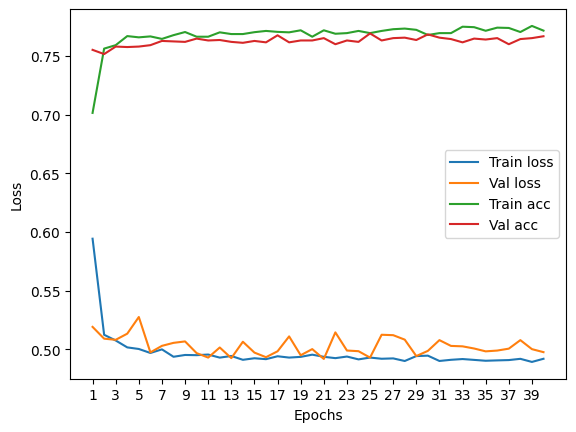

****************************************************************************************************



118it [00:02, 43.66it/s]


Train Epoch: 0 	Loss: 0.598305, Accuracy: 5318/7500 (71%)
Val Epoch: 0 	Loss: 0.525174, Accuracy: 1888/2500 (76%)



118it [00:02, 47.38it/s]


Train Epoch: 1 	Loss: 0.509194, Accuracy: 5728/7500 (76%)
Val Epoch: 1 	Loss: 0.521068, Accuracy: 1913/2500 (77%)



118it [00:02, 45.72it/s]


Train Epoch: 2 	Loss: 0.501950, Accuracy: 5729/7500 (76%)
Val Epoch: 2 	Loss: 0.516691, Accuracy: 1910/2500 (76%)



118it [00:02, 46.54it/s]


Train Epoch: 3 	Loss: 0.499158, Accuracy: 5736/7500 (76%)
Val Epoch: 3 	Loss: 0.523295, Accuracy: 1896/2500 (76%)



118it [00:02, 48.00it/s]


Train Epoch: 4 	Loss: 0.498562, Accuracy: 5729/7500 (76%)
Val Epoch: 4 	Loss: 0.525909, Accuracy: 1880/2500 (75%)



118it [00:02, 48.86it/s]


Train Epoch: 5 	Loss: 0.500763, Accuracy: 5727/7500 (76%)
Val Epoch: 5 	Loss: 0.518837, Accuracy: 1912/2500 (76%)



118it [00:02, 46.05it/s]


Train Epoch: 6 	Loss: 0.495678, Accuracy: 5741/7500 (77%)
Val Epoch: 6 	Loss: 0.514834, Accuracy: 1921/2500 (77%)



118it [00:02, 44.62it/s]


Train Epoch: 7 	Loss: 0.494893, Accuracy: 5762/7500 (77%)
Val Epoch: 7 	Loss: 0.513291, Accuracy: 1893/2500 (76%)



118it [00:02, 56.46it/s]


Train Epoch: 8 	Loss: 0.491779, Accuracy: 5776/7500 (77%)
Val Epoch: 8 	Loss: 0.511839, Accuracy: 1912/2500 (76%)



118it [00:02, 49.76it/s]


Train Epoch: 9 	Loss: 0.489282, Accuracy: 5771/7500 (77%)
Val Epoch: 9 	Loss: 0.508854, Accuracy: 1912/2500 (76%)



118it [00:02, 50.69it/s]


Train Epoch: 10 	Loss: 0.486941, Accuracy: 5771/7500 (77%)
Val Epoch: 10 	Loss: 0.515795, Accuracy: 1921/2500 (77%)



118it [00:02, 49.68it/s]


Train Epoch: 11 	Loss: 0.485877, Accuracy: 5796/7500 (77%)
Val Epoch: 11 	Loss: 0.521458, Accuracy: 1908/2500 (76%)



118it [00:02, 49.52it/s]


Train Epoch: 12 	Loss: 0.488360, Accuracy: 5805/7500 (77%)
Val Epoch: 12 	Loss: 0.508107, Accuracy: 1917/2500 (77%)



118it [00:02, 51.08it/s]


Train Epoch: 13 	Loss: 0.488107, Accuracy: 5816/7500 (78%)
Val Epoch: 13 	Loss: 0.514020, Accuracy: 1919/2500 (77%)



118it [00:02, 56.38it/s]


Train Epoch: 14 	Loss: 0.486010, Accuracy: 5808/7500 (77%)
Val Epoch: 14 	Loss: 0.501973, Accuracy: 1925/2500 (77%)



118it [00:02, 49.86it/s]


Train Epoch: 15 	Loss: 0.483889, Accuracy: 5814/7500 (78%)
Val Epoch: 15 	Loss: 0.495456, Accuracy: 1921/2500 (77%)



118it [00:02, 48.17it/s]


Train Epoch: 16 	Loss: 0.483059, Accuracy: 5825/7500 (78%)
Val Epoch: 16 	Loss: 0.510781, Accuracy: 1917/2500 (77%)



118it [00:02, 48.87it/s]


Train Epoch: 17 	Loss: 0.480747, Accuracy: 5838/7500 (78%)
Val Epoch: 17 	Loss: 0.505722, Accuracy: 1922/2500 (77%)



118it [00:02, 49.90it/s]


Train Epoch: 18 	Loss: 0.481785, Accuracy: 5830/7500 (78%)
Val Epoch: 18 	Loss: 0.510035, Accuracy: 1922/2500 (77%)



118it [00:01, 63.74it/s]


Train Epoch: 19 	Loss: 0.479384, Accuracy: 5819/7500 (78%)
Val Epoch: 19 	Loss: 0.516328, Accuracy: 1903/2500 (76%)



118it [00:01, 105.97it/s]


Train Epoch: 20 	Loss: 0.485848, Accuracy: 5825/7500 (78%)
Val Epoch: 20 	Loss: 0.499385, Accuracy: 1928/2500 (77%)



118it [00:00, 121.31it/s]


Train Epoch: 21 	Loss: 0.482445, Accuracy: 5827/7500 (78%)
Val Epoch: 21 	Loss: 0.496788, Accuracy: 1929/2500 (77%)



118it [00:00, 121.60it/s]


Train Epoch: 22 	Loss: 0.480832, Accuracy: 5797/7500 (77%)
Val Epoch: 22 	Loss: 0.499923, Accuracy: 1924/2500 (77%)



118it [00:01, 108.91it/s]


Train Epoch: 23 	Loss: 0.483152, Accuracy: 5813/7500 (78%)
Val Epoch: 23 	Loss: 0.501144, Accuracy: 1921/2500 (77%)



118it [00:00, 121.71it/s]


Train Epoch: 24 	Loss: 0.481284, Accuracy: 5813/7500 (78%)
Val Epoch: 24 	Loss: 0.494988, Accuracy: 1923/2500 (77%)



118it [00:00, 125.55it/s]


Train Epoch: 25 	Loss: 0.479245, Accuracy: 5806/7500 (77%)
Val Epoch: 25 	Loss: 0.511542, Accuracy: 1923/2500 (77%)



118it [00:00, 142.31it/s]


Train Epoch: 26 	Loss: 0.479722, Accuracy: 5837/7500 (78%)
Val Epoch: 26 	Loss: 0.497267, Accuracy: 1916/2500 (77%)



118it [00:01, 117.89it/s]


Train Epoch: 27 	Loss: 0.476722, Accuracy: 5841/7500 (78%)
Val Epoch: 27 	Loss: 0.498355, Accuracy: 1930/2500 (77%)



118it [00:00, 121.34it/s]


Train Epoch: 28 	Loss: 0.479223, Accuracy: 5839/7500 (78%)
Val Epoch: 28 	Loss: 0.503093, Accuracy: 1910/2500 (76%)



118it [00:00, 121.61it/s]


Train Epoch: 29 	Loss: 0.478556, Accuracy: 5830/7500 (78%)
Val Epoch: 29 	Loss: 0.502834, Accuracy: 1917/2500 (77%)



118it [00:00, 125.61it/s]


Train Epoch: 30 	Loss: 0.477645, Accuracy: 5833/7500 (78%)
Val Epoch: 30 	Loss: 0.510734, Accuracy: 1910/2500 (76%)



118it [00:00, 124.96it/s]


Train Epoch: 31 	Loss: 0.478956, Accuracy: 5808/7500 (77%)
Val Epoch: 31 	Loss: 0.506794, Accuracy: 1910/2500 (76%)



118it [00:00, 132.02it/s]


Train Epoch: 32 	Loss: 0.476193, Accuracy: 5842/7500 (78%)
Val Epoch: 32 	Loss: 0.515903, Accuracy: 1924/2500 (77%)



118it [00:00, 125.66it/s]


Train Epoch: 33 	Loss: 0.476868, Accuracy: 5835/7500 (78%)
Val Epoch: 33 	Loss: 0.505052, Accuracy: 1916/2500 (77%)



118it [00:00, 125.42it/s]


Train Epoch: 34 	Loss: 0.474761, Accuracy: 5839/7500 (78%)
Val Epoch: 34 	Loss: 0.491781, Accuracy: 1918/2500 (77%)



118it [00:00, 145.23it/s]


Train Epoch: 35 	Loss: 0.478144, Accuracy: 5856/7500 (78%)
Val Epoch: 35 	Loss: 0.516649, Accuracy: 1913/2500 (77%)



118it [00:00, 130.00it/s]


Train Epoch: 36 	Loss: 0.476922, Accuracy: 5833/7500 (78%)
Val Epoch: 36 	Loss: 0.494528, Accuracy: 1922/2500 (77%)



118it [00:00, 127.35it/s]


Train Epoch: 37 	Loss: 0.477627, Accuracy: 5823/7500 (78%)
Val Epoch: 37 	Loss: 0.509711, Accuracy: 1920/2500 (77%)



118it [00:00, 123.41it/s]


Train Epoch: 38 	Loss: 0.480289, Accuracy: 5828/7500 (78%)
Val Epoch: 38 	Loss: 0.492937, Accuracy: 1912/2500 (76%)



118it [00:00, 127.47it/s]


Train Epoch: 39 	Loss: 0.479083, Accuracy: 5855/7500 (78%)
Val Epoch: 39 	Loss: 0.498787, Accuracy: 1918/2500 (77%)

Test accuracy:  77.28


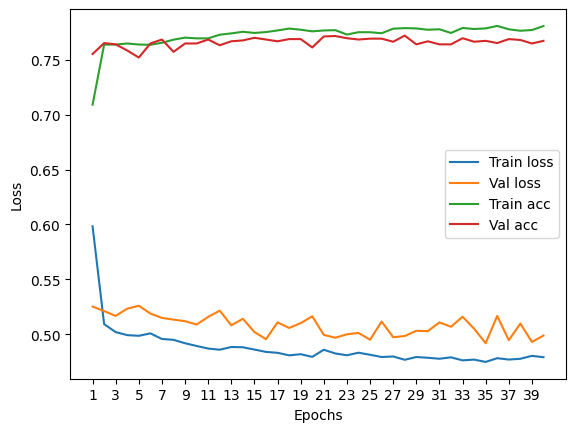

****************************************************************************************************



118it [00:00, 129.70it/s]


Train Epoch: 0 	Loss: 0.598144, Accuracy: 5352/7500 (71%)
Val Epoch: 0 	Loss: 0.536742, Accuracy: 1823/2500 (73%)



118it [00:01, 103.09it/s]


Train Epoch: 1 	Loss: 0.501628, Accuracy: 5758/7500 (77%)
Val Epoch: 1 	Loss: 0.543388, Accuracy: 1888/2500 (76%)



118it [00:00, 144.87it/s]


Train Epoch: 2 	Loss: 0.497577, Accuracy: 5807/7500 (77%)
Val Epoch: 2 	Loss: 0.519345, Accuracy: 1879/2500 (75%)



118it [00:00, 132.26it/s]


Train Epoch: 3 	Loss: 0.493327, Accuracy: 5799/7500 (77%)
Val Epoch: 3 	Loss: 0.515599, Accuracy: 1898/2500 (76%)



118it [00:00, 150.75it/s]


Train Epoch: 4 	Loss: 0.492845, Accuracy: 5781/7500 (77%)
Val Epoch: 4 	Loss: 0.518918, Accuracy: 1901/2500 (76%)



118it [00:00, 144.72it/s]


Train Epoch: 5 	Loss: 0.490070, Accuracy: 5793/7500 (77%)
Val Epoch: 5 	Loss: 0.509617, Accuracy: 1878/2500 (75%)



118it [00:01, 110.68it/s]


Train Epoch: 6 	Loss: 0.489124, Accuracy: 5828/7500 (78%)
Val Epoch: 6 	Loss: 0.519089, Accuracy: 1883/2500 (75%)



118it [00:01, 117.47it/s]


Train Epoch: 7 	Loss: 0.488969, Accuracy: 5806/7500 (77%)
Val Epoch: 7 	Loss: 0.510757, Accuracy: 1908/2500 (76%)



118it [00:00, 134.64it/s]


Train Epoch: 8 	Loss: 0.487776, Accuracy: 5805/7500 (77%)
Val Epoch: 8 	Loss: 0.505835, Accuracy: 1886/2500 (75%)



118it [00:00, 136.44it/s]


Train Epoch: 9 	Loss: 0.484977, Accuracy: 5828/7500 (78%)
Val Epoch: 9 	Loss: 0.515023, Accuracy: 1900/2500 (76%)



118it [00:00, 139.42it/s]


Train Epoch: 10 	Loss: 0.486129, Accuracy: 5837/7500 (78%)
Val Epoch: 10 	Loss: 0.506277, Accuracy: 1904/2500 (76%)



118it [00:00, 125.62it/s]


Train Epoch: 11 	Loss: 0.488363, Accuracy: 5825/7500 (78%)
Val Epoch: 11 	Loss: 0.511243, Accuracy: 1901/2500 (76%)



118it [00:00, 121.47it/s]


Train Epoch: 12 	Loss: 0.488497, Accuracy: 5826/7500 (78%)
Val Epoch: 12 	Loss: 0.506876, Accuracy: 1903/2500 (76%)



118it [00:00, 132.17it/s]


Train Epoch: 13 	Loss: 0.485370, Accuracy: 5818/7500 (78%)
Val Epoch: 13 	Loss: 0.509160, Accuracy: 1904/2500 (76%)



118it [00:00, 137.13it/s]


Train Epoch: 14 	Loss: 0.486747, Accuracy: 5812/7500 (77%)
Val Epoch: 14 	Loss: 0.507019, Accuracy: 1908/2500 (76%)



118it [00:00, 139.60it/s]


Train Epoch: 15 	Loss: 0.486875, Accuracy: 5839/7500 (78%)
Val Epoch: 15 	Loss: 0.513289, Accuracy: 1898/2500 (76%)



118it [00:00, 127.33it/s]


Train Epoch: 16 	Loss: 0.487488, Accuracy: 5807/7500 (77%)
Val Epoch: 16 	Loss: 0.520258, Accuracy: 1889/2500 (76%)



118it [00:01, 113.91it/s]


Train Epoch: 17 	Loss: 0.485505, Accuracy: 5828/7500 (78%)
Val Epoch: 17 	Loss: 0.506502, Accuracy: 1892/2500 (76%)



118it [00:00, 154.14it/s]


Train Epoch: 18 	Loss: 0.485998, Accuracy: 5818/7500 (78%)
Val Epoch: 18 	Loss: 0.510702, Accuracy: 1907/2500 (76%)



118it [00:00, 123.54it/s]


Train Epoch: 19 	Loss: 0.486027, Accuracy: 5827/7500 (78%)
Val Epoch: 19 	Loss: 0.512543, Accuracy: 1902/2500 (76%)



118it [00:00, 138.96it/s]


Train Epoch: 20 	Loss: 0.484662, Accuracy: 5838/7500 (78%)
Val Epoch: 20 	Loss: 0.512546, Accuracy: 1913/2500 (77%)



118it [00:00, 134.04it/s]


Train Epoch: 21 	Loss: 0.486325, Accuracy: 5816/7500 (78%)
Val Epoch: 21 	Loss: 0.520840, Accuracy: 1895/2500 (76%)



118it [00:01, 104.40it/s]


Train Epoch: 22 	Loss: 0.485236, Accuracy: 5839/7500 (78%)
Val Epoch: 22 	Loss: 0.511689, Accuracy: 1906/2500 (76%)



118it [00:01, 117.76it/s]


Train Epoch: 23 	Loss: 0.485094, Accuracy: 5853/7500 (78%)
Val Epoch: 23 	Loss: 0.503319, Accuracy: 1913/2500 (77%)



118it [00:01, 112.47it/s]


Train Epoch: 24 	Loss: 0.486002, Accuracy: 5846/7500 (78%)
Val Epoch: 24 	Loss: 0.515577, Accuracy: 1906/2500 (76%)



118it [00:00, 134.62it/s]


Train Epoch: 25 	Loss: 0.486044, Accuracy: 5816/7500 (78%)
Val Epoch: 25 	Loss: 0.505194, Accuracy: 1907/2500 (76%)



118it [00:00, 132.31it/s]


Train Epoch: 26 	Loss: 0.485345, Accuracy: 5855/7500 (78%)
Val Epoch: 26 	Loss: 0.502234, Accuracy: 1917/2500 (77%)



118it [00:00, 125.51it/s]


Train Epoch: 27 	Loss: 0.484603, Accuracy: 5841/7500 (78%)
Val Epoch: 27 	Loss: 0.521576, Accuracy: 1898/2500 (76%)



118it [00:00, 150.73it/s]


Train Epoch: 28 	Loss: 0.485432, Accuracy: 5833/7500 (78%)
Val Epoch: 28 	Loss: 0.522868, Accuracy: 1899/2500 (76%)



118it [00:00, 127.74it/s]


Train Epoch: 29 	Loss: 0.485957, Accuracy: 5853/7500 (78%)
Val Epoch: 29 	Loss: 0.505834, Accuracy: 1913/2500 (77%)



118it [00:00, 123.51it/s]


Train Epoch: 30 	Loss: 0.483555, Accuracy: 5815/7500 (78%)
Val Epoch: 30 	Loss: 0.518550, Accuracy: 1902/2500 (76%)



118it [00:00, 132.25it/s]


Train Epoch: 31 	Loss: 0.483227, Accuracy: 5858/7500 (78%)
Val Epoch: 31 	Loss: 0.506772, Accuracy: 1906/2500 (76%)



118it [00:00, 125.64it/s]


Train Epoch: 32 	Loss: 0.486408, Accuracy: 5838/7500 (78%)
Val Epoch: 32 	Loss: 0.513818, Accuracy: 1905/2500 (76%)



118it [00:00, 129.57it/s]


Train Epoch: 33 	Loss: 0.484752, Accuracy: 5820/7500 (78%)
Val Epoch: 33 	Loss: 0.521459, Accuracy: 1905/2500 (76%)



118it [00:00, 133.96it/s]


Train Epoch: 34 	Loss: 0.483636, Accuracy: 5830/7500 (78%)
Val Epoch: 34 	Loss: 0.503976, Accuracy: 1911/2500 (76%)



118it [00:00, 137.11it/s]


Train Epoch: 35 	Loss: 0.482710, Accuracy: 5845/7500 (78%)
Val Epoch: 35 	Loss: 0.509591, Accuracy: 1905/2500 (76%)



118it [00:00, 119.50it/s]


Train Epoch: 36 	Loss: 0.485969, Accuracy: 5818/7500 (78%)
Val Epoch: 36 	Loss: 0.513510, Accuracy: 1880/2500 (75%)



118it [00:00, 137.03it/s]


Train Epoch: 37 	Loss: 0.485120, Accuracy: 5838/7500 (78%)
Val Epoch: 37 	Loss: 0.512982, Accuracy: 1905/2500 (76%)



118it [00:00, 134.71it/s]


Train Epoch: 38 	Loss: 0.484134, Accuracy: 5850/7500 (78%)
Val Epoch: 38 	Loss: 0.515368, Accuracy: 1913/2500 (77%)



118it [00:00, 127.71it/s]


Train Epoch: 39 	Loss: 0.483040, Accuracy: 5853/7500 (78%)
Val Epoch: 39 	Loss: 0.509182, Accuracy: 1910/2500 (76%)

Test accuracy:  77.24


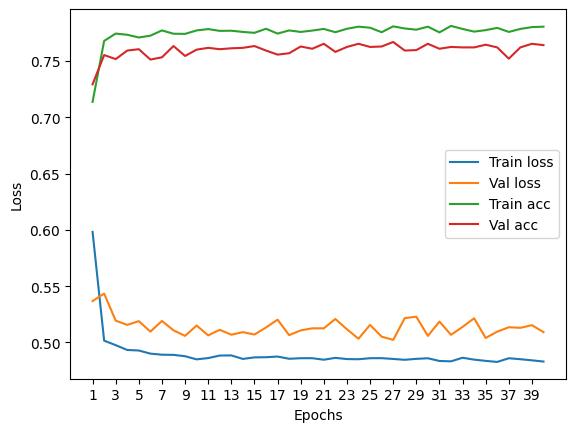

****************************************************************************************************



118it [00:00, 129.78it/s]


Train Epoch: 0 	Loss: 0.638517, Accuracy: 5200/7500 (69%)
Val Epoch: 0 	Loss: 0.573763, Accuracy: 1878/2500 (75%)



118it [00:01, 108.96it/s]


Train Epoch: 1 	Loss: 0.506842, Accuracy: 5749/7500 (77%)
Val Epoch: 1 	Loss: 0.507969, Accuracy: 1922/2500 (77%)



118it [00:00, 127.86it/s]


Train Epoch: 2 	Loss: 0.493526, Accuracy: 5791/7500 (77%)
Val Epoch: 2 	Loss: 0.520040, Accuracy: 1898/2500 (76%)



118it [00:01, 117.89it/s]


Train Epoch: 3 	Loss: 0.487115, Accuracy: 5799/7500 (77%)
Val Epoch: 3 	Loss: 0.500797, Accuracy: 1893/2500 (76%)



118it [00:00, 134.56it/s]


Train Epoch: 4 	Loss: 0.485576, Accuracy: 5796/7500 (77%)
Val Epoch: 4 	Loss: 0.503858, Accuracy: 1903/2500 (76%)



118it [00:00, 123.59it/s]


Train Epoch: 5 	Loss: 0.486062, Accuracy: 5811/7500 (77%)
Val Epoch: 5 	Loss: 0.507513, Accuracy: 1898/2500 (76%)



118it [00:00, 119.49it/s]


Train Epoch: 6 	Loss: 0.485717, Accuracy: 5804/7500 (77%)
Val Epoch: 6 	Loss: 0.499876, Accuracy: 1900/2500 (76%)



118it [00:00, 129.98it/s]


Train Epoch: 7 	Loss: 0.485319, Accuracy: 5806/7500 (77%)
Val Epoch: 7 	Loss: 0.516605, Accuracy: 1899/2500 (76%)



118it [00:01, 117.28it/s]


Train Epoch: 8 	Loss: 0.484316, Accuracy: 5813/7500 (78%)
Val Epoch: 8 	Loss: 0.511548, Accuracy: 1889/2500 (76%)



118it [00:00, 124.99it/s]


Train Epoch: 9 	Loss: 0.484565, Accuracy: 5824/7500 (78%)
Val Epoch: 9 	Loss: 0.514145, Accuracy: 1901/2500 (76%)



118it [00:00, 144.97it/s]


Train Epoch: 10 	Loss: 0.484831, Accuracy: 5814/7500 (78%)
Val Epoch: 10 	Loss: 0.520034, Accuracy: 1896/2500 (76%)



118it [00:00, 127.59it/s]


Train Epoch: 11 	Loss: 0.484769, Accuracy: 5819/7500 (78%)
Val Epoch: 11 	Loss: 0.502622, Accuracy: 1895/2500 (76%)



118it [00:00, 129.79it/s]


Train Epoch: 12 	Loss: 0.483320, Accuracy: 5802/7500 (77%)
Val Epoch: 12 	Loss: 0.509764, Accuracy: 1901/2500 (76%)



118it [00:00, 129.84it/s]


Train Epoch: 13 	Loss: 0.486366, Accuracy: 5803/7500 (77%)
Val Epoch: 13 	Loss: 0.499020, Accuracy: 1898/2500 (76%)



118it [00:01, 104.72it/s]


Train Epoch: 14 	Loss: 0.486984, Accuracy: 5803/7500 (77%)
Val Epoch: 14 	Loss: 0.504925, Accuracy: 1902/2500 (76%)



118it [00:00, 127.22it/s]


Train Epoch: 15 	Loss: 0.483841, Accuracy: 5811/7500 (77%)
Val Epoch: 15 	Loss: 0.501711, Accuracy: 1893/2500 (76%)



118it [00:00, 121.73it/s]


Train Epoch: 16 	Loss: 0.488797, Accuracy: 5791/7500 (77%)
Val Epoch: 16 	Loss: 0.505208, Accuracy: 1904/2500 (76%)



118it [00:00, 136.81it/s]


Train Epoch: 17 	Loss: 0.483587, Accuracy: 5819/7500 (78%)
Val Epoch: 17 	Loss: 0.507806, Accuracy: 1886/2500 (75%)



118it [00:00, 125.60it/s]


Train Epoch: 18 	Loss: 0.486707, Accuracy: 5809/7500 (77%)
Val Epoch: 18 	Loss: 0.501879, Accuracy: 1902/2500 (76%)



118it [00:00, 132.05it/s]


Train Epoch: 19 	Loss: 0.488872, Accuracy: 5806/7500 (77%)
Val Epoch: 19 	Loss: 0.514599, Accuracy: 1892/2500 (76%)



118it [00:00, 123.37it/s]


Train Epoch: 20 	Loss: 0.484705, Accuracy: 5809/7500 (77%)
Val Epoch: 20 	Loss: 0.515216, Accuracy: 1891/2500 (76%)



118it [00:00, 135.82it/s]


Train Epoch: 21 	Loss: 0.485380, Accuracy: 5819/7500 (78%)
Val Epoch: 21 	Loss: 0.502890, Accuracy: 1900/2500 (76%)



118it [00:00, 123.15it/s]


Train Epoch: 22 	Loss: 0.486463, Accuracy: 5817/7500 (78%)
Val Epoch: 22 	Loss: 0.521324, Accuracy: 1864/2500 (75%)



118it [00:00, 118.88it/s]


Train Epoch: 23 	Loss: 0.485639, Accuracy: 5805/7500 (77%)
Val Epoch: 23 	Loss: 0.511001, Accuracy: 1899/2500 (76%)



118it [00:00, 144.73it/s]


Train Epoch: 24 	Loss: 0.484357, Accuracy: 5829/7500 (78%)
Val Epoch: 24 	Loss: 0.506903, Accuracy: 1896/2500 (76%)



118it [00:00, 121.60it/s]


Train Epoch: 25 	Loss: 0.485279, Accuracy: 5806/7500 (77%)
Val Epoch: 25 	Loss: 0.522478, Accuracy: 1872/2500 (75%)



118it [00:00, 125.60it/s]


Train Epoch: 26 	Loss: 0.485121, Accuracy: 5806/7500 (77%)
Val Epoch: 26 	Loss: 0.503728, Accuracy: 1902/2500 (76%)



118it [00:00, 139.42it/s]


Train Epoch: 27 	Loss: 0.485386, Accuracy: 5802/7500 (77%)
Val Epoch: 27 	Loss: 0.506230, Accuracy: 1898/2500 (76%)



118it [00:00, 136.90it/s]


Train Epoch: 28 	Loss: 0.483241, Accuracy: 5836/7500 (78%)
Val Epoch: 28 	Loss: 0.507522, Accuracy: 1891/2500 (76%)



118it [00:00, 129.90it/s]


Train Epoch: 29 	Loss: 0.483831, Accuracy: 5806/7500 (77%)
Val Epoch: 29 	Loss: 0.508204, Accuracy: 1887/2500 (75%)



118it [00:00, 129.97it/s]


Train Epoch: 30 	Loss: 0.485830, Accuracy: 5807/7500 (77%)
Val Epoch: 30 	Loss: 0.505006, Accuracy: 1899/2500 (76%)



118it [00:00, 121.55it/s]


Train Epoch: 31 	Loss: 0.484710, Accuracy: 5822/7500 (78%)
Val Epoch: 31 	Loss: 0.509816, Accuracy: 1906/2500 (76%)



118it [00:00, 127.72it/s]


Train Epoch: 32 	Loss: 0.484910, Accuracy: 5807/7500 (77%)
Val Epoch: 32 	Loss: 0.513724, Accuracy: 1898/2500 (76%)



118it [00:00, 140.67it/s]


Train Epoch: 33 	Loss: 0.484350, Accuracy: 5809/7500 (77%)
Val Epoch: 33 	Loss: 0.513543, Accuracy: 1889/2500 (76%)



118it [00:01, 113.14it/s]


Train Epoch: 34 	Loss: 0.481634, Accuracy: 5806/7500 (77%)
Val Epoch: 34 	Loss: 0.517824, Accuracy: 1907/2500 (76%)



118it [00:00, 118.98it/s]


Train Epoch: 35 	Loss: 0.482866, Accuracy: 5825/7500 (78%)
Val Epoch: 35 	Loss: 0.519334, Accuracy: 1894/2500 (76%)



118it [00:00, 119.30it/s]


Train Epoch: 36 	Loss: 0.483219, Accuracy: 5826/7500 (78%)
Val Epoch: 36 	Loss: 0.505816, Accuracy: 1888/2500 (76%)



118it [00:00, 139.42it/s]


Train Epoch: 37 	Loss: 0.484954, Accuracy: 5796/7500 (77%)
Val Epoch: 37 	Loss: 0.503610, Accuracy: 1900/2500 (76%)



118it [00:00, 119.54it/s]


Train Epoch: 38 	Loss: 0.483801, Accuracy: 5829/7500 (78%)
Val Epoch: 38 	Loss: 0.514714, Accuracy: 1885/2500 (75%)



118it [00:01, 117.83it/s]


Train Epoch: 39 	Loss: 0.483419, Accuracy: 5816/7500 (78%)
Val Epoch: 39 	Loss: 0.518856, Accuracy: 1905/2500 (76%)

Test accuracy:  76.36


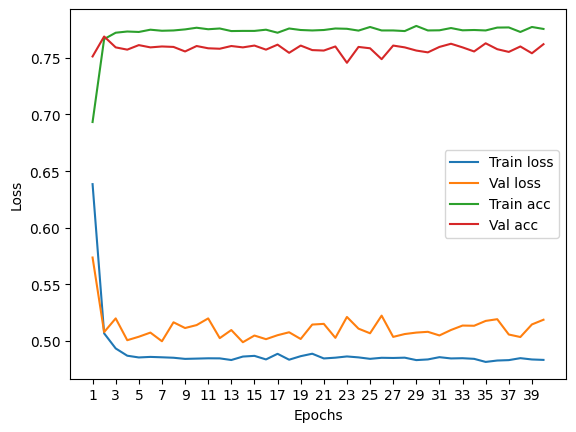

****************************************************************************************************



118it [00:00, 118.88it/s]


Train Epoch: 0 	Loss: 0.644993, Accuracy: 4894/7500 (65%)
Val Epoch: 0 	Loss: 0.546403, Accuracy: 1907/2500 (76%)



118it [00:00, 125.55it/s]


Train Epoch: 1 	Loss: 0.517451, Accuracy: 5685/7500 (76%)
Val Epoch: 1 	Loss: 0.499704, Accuracy: 1931/2500 (77%)



118it [00:00, 137.02it/s]


Train Epoch: 2 	Loss: 0.508831, Accuracy: 5734/7500 (76%)
Val Epoch: 2 	Loss: 0.500795, Accuracy: 1930/2500 (77%)



118it [00:00, 121.36it/s]


Train Epoch: 3 	Loss: 0.507274, Accuracy: 5728/7500 (76%)
Val Epoch: 3 	Loss: 0.496247, Accuracy: 1935/2500 (77%)



118it [00:00, 139.53it/s]


Train Epoch: 4 	Loss: 0.505312, Accuracy: 5741/7500 (77%)
Val Epoch: 4 	Loss: 0.499028, Accuracy: 1939/2500 (78%)



118it [00:00, 140.76it/s]


Train Epoch: 5 	Loss: 0.503699, Accuracy: 5751/7500 (77%)
Val Epoch: 5 	Loss: 0.499149, Accuracy: 1944/2500 (78%)



118it [00:00, 121.51it/s]


Train Epoch: 6 	Loss: 0.504548, Accuracy: 5726/7500 (76%)
Val Epoch: 6 	Loss: 0.494722, Accuracy: 1939/2500 (78%)



118it [00:00, 127.41it/s]


Train Epoch: 7 	Loss: 0.501756, Accuracy: 5743/7500 (77%)
Val Epoch: 7 	Loss: 0.501314, Accuracy: 1948/2500 (78%)



118it [00:00, 134.31it/s]


Train Epoch: 8 	Loss: 0.502739, Accuracy: 5759/7500 (77%)
Val Epoch: 8 	Loss: 0.492778, Accuracy: 1941/2500 (78%)



118it [00:00, 127.80it/s]


Train Epoch: 9 	Loss: 0.501674, Accuracy: 5773/7500 (77%)
Val Epoch: 9 	Loss: 0.519396, Accuracy: 1911/2500 (76%)



118it [00:00, 142.33it/s]


Train Epoch: 10 	Loss: 0.503350, Accuracy: 5724/7500 (76%)
Val Epoch: 10 	Loss: 0.491125, Accuracy: 1939/2500 (78%)



118it [00:00, 129.41it/s]


Train Epoch: 11 	Loss: 0.502404, Accuracy: 5751/7500 (77%)
Val Epoch: 11 	Loss: 0.494640, Accuracy: 1942/2500 (78%)



118it [00:00, 134.43it/s]


Train Epoch: 12 	Loss: 0.503615, Accuracy: 5747/7500 (77%)
Val Epoch: 12 	Loss: 0.492770, Accuracy: 1941/2500 (78%)



118it [00:00, 132.26it/s]


Train Epoch: 13 	Loss: 0.501913, Accuracy: 5758/7500 (77%)
Val Epoch: 13 	Loss: 0.489423, Accuracy: 1939/2500 (78%)



118it [00:00, 134.51it/s]


Train Epoch: 14 	Loss: 0.497580, Accuracy: 5755/7500 (77%)
Val Epoch: 14 	Loss: 0.494745, Accuracy: 1930/2500 (77%)



118it [00:00, 124.25it/s]


Train Epoch: 15 	Loss: 0.500559, Accuracy: 5755/7500 (77%)
Val Epoch: 15 	Loss: 0.514429, Accuracy: 1919/2500 (77%)



118it [00:00, 121.33it/s]


Train Epoch: 16 	Loss: 0.498366, Accuracy: 5749/7500 (77%)
Val Epoch: 16 	Loss: 0.508690, Accuracy: 1914/2500 (77%)



118it [00:00, 125.61it/s]


Train Epoch: 17 	Loss: 0.500680, Accuracy: 5760/7500 (77%)
Val Epoch: 17 	Loss: 0.495655, Accuracy: 1931/2500 (77%)



118it [00:00, 134.45it/s]


Train Epoch: 18 	Loss: 0.496999, Accuracy: 5781/7500 (77%)
Val Epoch: 18 	Loss: 0.495310, Accuracy: 1929/2500 (77%)



118it [00:00, 145.00it/s]


Train Epoch: 19 	Loss: 0.499028, Accuracy: 5758/7500 (77%)
Val Epoch: 19 	Loss: 0.494712, Accuracy: 1931/2500 (77%)



118it [00:00, 136.69it/s]


Train Epoch: 20 	Loss: 0.498762, Accuracy: 5783/7500 (77%)
Val Epoch: 20 	Loss: 0.501337, Accuracy: 1932/2500 (77%)



118it [00:01, 117.83it/s]


Train Epoch: 21 	Loss: 0.496667, Accuracy: 5768/7500 (77%)
Val Epoch: 21 	Loss: 0.496606, Accuracy: 1910/2500 (76%)



118it [00:00, 139.38it/s]


Train Epoch: 22 	Loss: 0.497521, Accuracy: 5757/7500 (77%)
Val Epoch: 22 	Loss: 0.491048, Accuracy: 1933/2500 (77%)



118it [00:00, 123.69it/s]


Train Epoch: 23 	Loss: 0.499113, Accuracy: 5763/7500 (77%)
Val Epoch: 23 	Loss: 0.507756, Accuracy: 1933/2500 (77%)



118it [00:00, 136.90it/s]


Train Epoch: 24 	Loss: 0.496795, Accuracy: 5758/7500 (77%)
Val Epoch: 24 	Loss: 0.495197, Accuracy: 1929/2500 (77%)



118it [00:00, 137.47it/s]


Train Epoch: 25 	Loss: 0.497941, Accuracy: 5740/7500 (77%)
Val Epoch: 25 	Loss: 0.499254, Accuracy: 1934/2500 (77%)



118it [00:00, 134.21it/s]


Train Epoch: 26 	Loss: 0.496671, Accuracy: 5774/7500 (77%)
Val Epoch: 26 	Loss: 0.491040, Accuracy: 1927/2500 (77%)



118it [00:00, 127.77it/s]


Train Epoch: 27 	Loss: 0.499004, Accuracy: 5773/7500 (77%)
Val Epoch: 27 	Loss: 0.505071, Accuracy: 1928/2500 (77%)



118it [00:00, 142.05it/s]


Train Epoch: 28 	Loss: 0.496424, Accuracy: 5754/7500 (77%)
Val Epoch: 28 	Loss: 0.506415, Accuracy: 1936/2500 (77%)



118it [00:00, 134.53it/s]


Train Epoch: 29 	Loss: 0.497196, Accuracy: 5757/7500 (77%)
Val Epoch: 29 	Loss: 0.487226, Accuracy: 1938/2500 (78%)



118it [00:00, 139.68it/s]


Train Epoch: 30 	Loss: 0.497804, Accuracy: 5745/7500 (77%)
Val Epoch: 30 	Loss: 0.500830, Accuracy: 1927/2500 (77%)



118it [00:00, 134.55it/s]


Train Epoch: 31 	Loss: 0.498372, Accuracy: 5750/7500 (77%)
Val Epoch: 31 	Loss: 0.516961, Accuracy: 1933/2500 (77%)



118it [00:00, 125.54it/s]


Train Epoch: 32 	Loss: 0.497521, Accuracy: 5771/7500 (77%)
Val Epoch: 32 	Loss: 0.496216, Accuracy: 1927/2500 (77%)



118it [00:00, 150.73it/s]


Train Epoch: 33 	Loss: 0.494985, Accuracy: 5766/7500 (77%)
Val Epoch: 33 	Loss: 0.502003, Accuracy: 1932/2500 (77%)



118it [00:00, 121.52it/s]


Train Epoch: 34 	Loss: 0.497409, Accuracy: 5771/7500 (77%)
Val Epoch: 34 	Loss: 0.496642, Accuracy: 1921/2500 (77%)



118it [00:00, 130.07it/s]


Train Epoch: 35 	Loss: 0.498271, Accuracy: 5783/7500 (77%)
Val Epoch: 35 	Loss: 0.496220, Accuracy: 1933/2500 (77%)



118it [00:00, 127.81it/s]


Train Epoch: 36 	Loss: 0.497056, Accuracy: 5774/7500 (77%)
Val Epoch: 36 	Loss: 0.500859, Accuracy: 1929/2500 (77%)



118it [00:01, 112.57it/s]


Train Epoch: 37 	Loss: 0.495945, Accuracy: 5775/7500 (77%)
Val Epoch: 37 	Loss: 0.497186, Accuracy: 1938/2500 (78%)



118it [00:01, 112.22it/s]


Train Epoch: 38 	Loss: 0.498247, Accuracy: 5764/7500 (77%)
Val Epoch: 38 	Loss: 0.501682, Accuracy: 1931/2500 (77%)



118it [00:01, 104.19it/s]


Train Epoch: 39 	Loss: 0.499133, Accuracy: 5768/7500 (77%)
Val Epoch: 39 	Loss: 0.502189, Accuracy: 1939/2500 (78%)

Test accuracy:  78.03999999999999


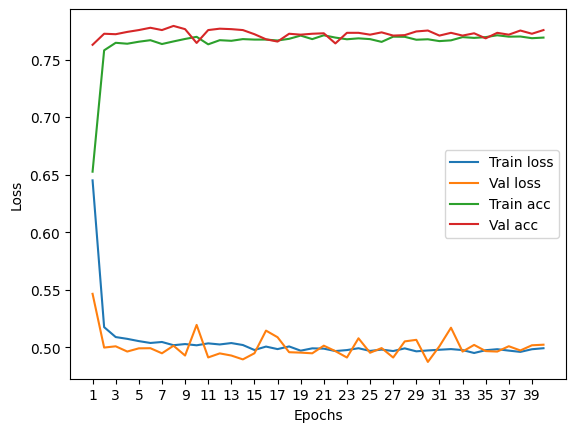

****************************************************************************************************



118it [00:00, 127.91it/s]


Train Epoch: 0 	Loss: 0.628091, Accuracy: 5357/7500 (71%)
Val Epoch: 0 	Loss: 0.543679, Accuracy: 1895/2500 (76%)



118it [00:01, 117.29it/s]


Train Epoch: 1 	Loss: 0.506766, Accuracy: 5742/7500 (77%)
Val Epoch: 1 	Loss: 0.511775, Accuracy: 1912/2500 (76%)



118it [00:00, 134.56it/s]


Train Epoch: 2 	Loss: 0.494420, Accuracy: 5760/7500 (77%)
Val Epoch: 2 	Loss: 0.514243, Accuracy: 1909/2500 (76%)



118it [00:00, 127.85it/s]


Train Epoch: 3 	Loss: 0.491086, Accuracy: 5812/7500 (77%)
Val Epoch: 3 	Loss: 0.514333, Accuracy: 1883/2500 (75%)



118it [00:00, 123.63it/s]


Train Epoch: 4 	Loss: 0.490597, Accuracy: 5798/7500 (77%)
Val Epoch: 4 	Loss: 0.523344, Accuracy: 1903/2500 (76%)



118it [00:00, 139.73it/s]


Train Epoch: 5 	Loss: 0.492889, Accuracy: 5800/7500 (77%)
Val Epoch: 5 	Loss: 0.511463, Accuracy: 1923/2500 (77%)



118it [00:00, 119.41it/s]


Train Epoch: 6 	Loss: 0.487616, Accuracy: 5803/7500 (77%)
Val Epoch: 6 	Loss: 0.516392, Accuracy: 1913/2500 (77%)



118it [00:00, 132.04it/s]


Train Epoch: 7 	Loss: 0.488889, Accuracy: 5811/7500 (77%)
Val Epoch: 7 	Loss: 0.506910, Accuracy: 1917/2500 (77%)



118it [00:00, 121.39it/s]


Train Epoch: 8 	Loss: 0.494371, Accuracy: 5779/7500 (77%)
Val Epoch: 8 	Loss: 0.507805, Accuracy: 1926/2500 (77%)



118it [00:00, 137.21it/s]


Train Epoch: 9 	Loss: 0.489309, Accuracy: 5800/7500 (77%)
Val Epoch: 9 	Loss: 0.501212, Accuracy: 1913/2500 (77%)



118it [00:00, 139.78it/s]


Train Epoch: 10 	Loss: 0.490413, Accuracy: 5805/7500 (77%)
Val Epoch: 10 	Loss: 0.501918, Accuracy: 1915/2500 (77%)



118it [00:00, 145.14it/s]


Train Epoch: 11 	Loss: 0.487574, Accuracy: 5813/7500 (78%)
Val Epoch: 11 	Loss: 0.502312, Accuracy: 1911/2500 (76%)



118it [00:00, 132.19it/s]


Train Epoch: 12 	Loss: 0.486480, Accuracy: 5812/7500 (77%)
Val Epoch: 12 	Loss: 0.509051, Accuracy: 1918/2500 (77%)



118it [00:00, 129.90it/s]


Train Epoch: 13 	Loss: 0.486750, Accuracy: 5788/7500 (77%)
Val Epoch: 13 	Loss: 0.511137, Accuracy: 1919/2500 (77%)



118it [00:00, 139.52it/s]


Train Epoch: 14 	Loss: 0.486680, Accuracy: 5795/7500 (77%)
Val Epoch: 14 	Loss: 0.519564, Accuracy: 1907/2500 (76%)



118it [00:00, 136.38it/s]


Train Epoch: 15 	Loss: 0.487449, Accuracy: 5787/7500 (77%)
Val Epoch: 15 	Loss: 0.514416, Accuracy: 1919/2500 (77%)



118it [00:00, 147.85it/s]


Train Epoch: 16 	Loss: 0.485388, Accuracy: 5803/7500 (77%)
Val Epoch: 16 	Loss: 0.522232, Accuracy: 1914/2500 (77%)



118it [00:00, 147.92it/s]


Train Epoch: 17 	Loss: 0.487421, Accuracy: 5805/7500 (77%)
Val Epoch: 17 	Loss: 0.502438, Accuracy: 1921/2500 (77%)



118it [00:00, 142.40it/s]


Train Epoch: 18 	Loss: 0.491424, Accuracy: 5803/7500 (77%)
Val Epoch: 18 	Loss: 0.508344, Accuracy: 1914/2500 (77%)



118it [00:00, 134.67it/s]


Train Epoch: 19 	Loss: 0.489078, Accuracy: 5832/7500 (78%)
Val Epoch: 19 	Loss: 0.505719, Accuracy: 1906/2500 (76%)



118it [00:00, 139.60it/s]


Train Epoch: 20 	Loss: 0.485361, Accuracy: 5802/7500 (77%)
Val Epoch: 20 	Loss: 0.504309, Accuracy: 1918/2500 (77%)



118it [00:00, 134.93it/s]


Train Epoch: 21 	Loss: 0.489284, Accuracy: 5806/7500 (77%)
Val Epoch: 21 	Loss: 0.505363, Accuracy: 1911/2500 (76%)



118it [00:00, 123.53it/s]


Train Epoch: 22 	Loss: 0.487434, Accuracy: 5805/7500 (77%)
Val Epoch: 22 	Loss: 0.517005, Accuracy: 1909/2500 (76%)



118it [00:00, 129.91it/s]


Train Epoch: 23 	Loss: 0.493182, Accuracy: 5777/7500 (77%)
Val Epoch: 23 	Loss: 0.514831, Accuracy: 1917/2500 (77%)



118it [00:00, 130.00it/s]


Train Epoch: 24 	Loss: 0.486222, Accuracy: 5799/7500 (77%)
Val Epoch: 24 	Loss: 0.508838, Accuracy: 1914/2500 (77%)



118it [00:00, 123.81it/s]


Train Epoch: 25 	Loss: 0.485143, Accuracy: 5796/7500 (77%)
Val Epoch: 25 	Loss: 0.524223, Accuracy: 1906/2500 (76%)



118it [00:00, 137.19it/s]


Train Epoch: 26 	Loss: 0.485608, Accuracy: 5803/7500 (77%)
Val Epoch: 26 	Loss: 0.518342, Accuracy: 1919/2500 (77%)



118it [00:00, 121.52it/s]


Train Epoch: 27 	Loss: 0.486341, Accuracy: 5799/7500 (77%)
Val Epoch: 27 	Loss: 0.508273, Accuracy: 1904/2500 (76%)



118it [00:00, 147.94it/s]


Train Epoch: 28 	Loss: 0.488357, Accuracy: 5805/7500 (77%)
Val Epoch: 28 	Loss: 0.515645, Accuracy: 1915/2500 (77%)



118it [00:00, 121.21it/s]


Train Epoch: 29 	Loss: 0.484016, Accuracy: 5805/7500 (77%)
Val Epoch: 29 	Loss: 0.503706, Accuracy: 1918/2500 (77%)



118it [00:00, 134.63it/s]


Train Epoch: 30 	Loss: 0.487781, Accuracy: 5797/7500 (77%)
Val Epoch: 30 	Loss: 0.509639, Accuracy: 1911/2500 (76%)



118it [00:00, 147.91it/s]


Train Epoch: 31 	Loss: 0.484792, Accuracy: 5803/7500 (77%)
Val Epoch: 31 	Loss: 0.503630, Accuracy: 1909/2500 (76%)



118it [00:00, 150.74it/s]


Train Epoch: 32 	Loss: 0.488361, Accuracy: 5798/7500 (77%)
Val Epoch: 32 	Loss: 0.514998, Accuracy: 1916/2500 (77%)



118it [00:00, 137.10it/s]


Train Epoch: 33 	Loss: 0.483340, Accuracy: 5800/7500 (77%)
Val Epoch: 33 	Loss: 0.507653, Accuracy: 1918/2500 (77%)



118it [00:00, 132.37it/s]


Train Epoch: 34 	Loss: 0.485081, Accuracy: 5813/7500 (78%)
Val Epoch: 34 	Loss: 0.517395, Accuracy: 1914/2500 (77%)



118it [00:00, 127.60it/s]


Train Epoch: 35 	Loss: 0.484688, Accuracy: 5801/7500 (77%)
Val Epoch: 35 	Loss: 0.515166, Accuracy: 1903/2500 (76%)



118it [00:00, 145.02it/s]


Train Epoch: 36 	Loss: 0.489616, Accuracy: 5818/7500 (78%)
Val Epoch: 36 	Loss: 0.507697, Accuracy: 1914/2500 (77%)



118it [00:00, 142.45it/s]


Train Epoch: 37 	Loss: 0.485641, Accuracy: 5804/7500 (77%)
Val Epoch: 37 	Loss: 0.513362, Accuracy: 1906/2500 (76%)



118it [00:00, 123.45it/s]


Train Epoch: 38 	Loss: 0.486809, Accuracy: 5828/7500 (78%)
Val Epoch: 38 	Loss: 0.513951, Accuracy: 1911/2500 (76%)



118it [00:01, 94.28it/s]


Train Epoch: 39 	Loss: 0.484687, Accuracy: 5828/7500 (78%)
Val Epoch: 39 	Loss: 0.515710, Accuracy: 1911/2500 (76%)

Test accuracy:  76.48


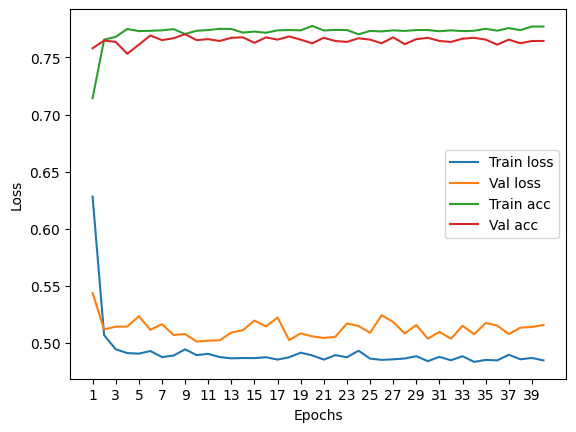

****************************************************************************************************



116it [00:00, 139.56it/s]


Train Epoch: 0 	Loss: 0.614228, Accuracy: 4905/7422 (66%)
Val Epoch: 0 	Loss: 0.557091, Accuracy: 1756/2474 (71%)



116it [00:00, 127.61it/s]


Train Epoch: 1 	Loss: 0.503266, Accuracy: 5683/7422 (77%)
Val Epoch: 1 	Loss: 0.532667, Accuracy: 1815/2474 (73%)



116it [00:00, 132.21it/s]


Train Epoch: 2 	Loss: 0.493355, Accuracy: 5692/7422 (77%)
Val Epoch: 2 	Loss: 0.544122, Accuracy: 1856/2474 (75%)



116it [00:00, 130.07it/s]


Train Epoch: 3 	Loss: 0.495333, Accuracy: 5706/7422 (77%)
Val Epoch: 3 	Loss: 0.526914, Accuracy: 1844/2474 (75%)



116it [00:00, 161.20it/s]


Train Epoch: 4 	Loss: 0.490394, Accuracy: 5701/7422 (77%)
Val Epoch: 4 	Loss: 0.524859, Accuracy: 1843/2474 (74%)



116it [00:00, 130.04it/s]


Train Epoch: 5 	Loss: 0.487871, Accuracy: 5713/7422 (77%)
Val Epoch: 5 	Loss: 0.522057, Accuracy: 1857/2474 (75%)



116it [00:00, 129.78it/s]


Train Epoch: 6 	Loss: 0.485473, Accuracy: 5727/7422 (77%)
Val Epoch: 6 	Loss: 0.523972, Accuracy: 1855/2474 (75%)



116it [00:00, 145.27it/s]


Train Epoch: 7 	Loss: 0.486567, Accuracy: 5719/7422 (77%)
Val Epoch: 7 	Loss: 0.524303, Accuracy: 1853/2474 (75%)



116it [00:00, 129.80it/s]


Train Epoch: 8 	Loss: 0.484658, Accuracy: 5734/7422 (77%)
Val Epoch: 8 	Loss: 0.524110, Accuracy: 1861/2474 (75%)



116it [00:00, 134.80it/s]


Train Epoch: 9 	Loss: 0.483666, Accuracy: 5737/7422 (77%)
Val Epoch: 9 	Loss: 0.527821, Accuracy: 1852/2474 (75%)



116it [00:00, 130.02it/s]


Train Epoch: 10 	Loss: 0.484273, Accuracy: 5726/7422 (77%)
Val Epoch: 10 	Loss: 0.526823, Accuracy: 1850/2474 (75%)



116it [00:00, 129.99it/s]


Train Epoch: 11 	Loss: 0.484037, Accuracy: 5746/7422 (77%)
Val Epoch: 11 	Loss: 0.524729, Accuracy: 1859/2474 (75%)



116it [00:00, 145.48it/s]


Train Epoch: 12 	Loss: 0.483244, Accuracy: 5731/7422 (77%)
Val Epoch: 12 	Loss: 0.523921, Accuracy: 1857/2474 (75%)



116it [00:00, 132.31it/s]


Train Epoch: 13 	Loss: 0.482300, Accuracy: 5749/7422 (77%)
Val Epoch: 13 	Loss: 0.518295, Accuracy: 1854/2474 (75%)



116it [00:00, 127.89it/s]


Train Epoch: 14 	Loss: 0.483845, Accuracy: 5747/7422 (77%)
Val Epoch: 14 	Loss: 0.519607, Accuracy: 1871/2474 (76%)



116it [00:00, 137.28it/s]


Train Epoch: 15 	Loss: 0.481395, Accuracy: 5740/7422 (77%)
Val Epoch: 15 	Loss: 0.521831, Accuracy: 1853/2474 (75%)



116it [00:00, 142.70it/s]


Train Epoch: 16 	Loss: 0.482041, Accuracy: 5736/7422 (77%)
Val Epoch: 16 	Loss: 0.518753, Accuracy: 1861/2474 (75%)



116it [00:00, 117.65it/s]


Train Epoch: 17 	Loss: 0.480312, Accuracy: 5758/7422 (78%)
Val Epoch: 17 	Loss: 0.521936, Accuracy: 1853/2474 (75%)



116it [00:00, 137.14it/s]


Train Epoch: 18 	Loss: 0.480122, Accuracy: 5729/7422 (77%)
Val Epoch: 18 	Loss: 0.521474, Accuracy: 1866/2474 (75%)



116it [00:00, 139.69it/s]


Train Epoch: 19 	Loss: 0.481120, Accuracy: 5729/7422 (77%)
Val Epoch: 19 	Loss: 0.531641, Accuracy: 1849/2474 (75%)



116it [00:00, 126.64it/s]


Train Epoch: 20 	Loss: 0.480895, Accuracy: 5768/7422 (78%)
Val Epoch: 20 	Loss: 0.527112, Accuracy: 1857/2474 (75%)



116it [00:00, 121.69it/s]


Train Epoch: 21 	Loss: 0.480591, Accuracy: 5739/7422 (77%)
Val Epoch: 21 	Loss: 0.538542, Accuracy: 1835/2474 (74%)



116it [00:00, 134.98it/s]


Train Epoch: 22 	Loss: 0.484429, Accuracy: 5732/7422 (77%)
Val Epoch: 22 	Loss: 0.524927, Accuracy: 1853/2474 (75%)



116it [00:00, 125.71it/s]


Train Epoch: 23 	Loss: 0.482412, Accuracy: 5759/7422 (78%)
Val Epoch: 23 	Loss: 0.528024, Accuracy: 1854/2474 (75%)



116it [00:00, 139.93it/s]


Train Epoch: 24 	Loss: 0.482532, Accuracy: 5761/7422 (78%)
Val Epoch: 24 	Loss: 0.518215, Accuracy: 1859/2474 (75%)



116it [00:00, 137.19it/s]


Train Epoch: 25 	Loss: 0.479586, Accuracy: 5745/7422 (77%)
Val Epoch: 25 	Loss: 0.521742, Accuracy: 1856/2474 (75%)



116it [00:00, 127.98it/s]


Train Epoch: 26 	Loss: 0.479227, Accuracy: 5733/7422 (77%)
Val Epoch: 26 	Loss: 0.524394, Accuracy: 1850/2474 (75%)



116it [00:00, 154.61it/s]


Train Epoch: 27 	Loss: 0.478765, Accuracy: 5739/7422 (77%)
Val Epoch: 27 	Loss: 0.518894, Accuracy: 1856/2474 (75%)



116it [00:00, 117.61it/s]


Train Epoch: 28 	Loss: 0.479068, Accuracy: 5757/7422 (78%)
Val Epoch: 28 	Loss: 0.518686, Accuracy: 1861/2474 (75%)



116it [00:00, 139.78it/s]


Train Epoch: 29 	Loss: 0.480078, Accuracy: 5734/7422 (77%)
Val Epoch: 29 	Loss: 0.517602, Accuracy: 1856/2474 (75%)



116it [00:00, 132.53it/s]


Train Epoch: 30 	Loss: 0.478621, Accuracy: 5760/7422 (78%)
Val Epoch: 30 	Loss: 0.526281, Accuracy: 1852/2474 (75%)



116it [00:00, 132.45it/s]


Train Epoch: 31 	Loss: 0.479891, Accuracy: 5741/7422 (77%)
Val Epoch: 31 	Loss: 0.526004, Accuracy: 1847/2474 (75%)



116it [00:00, 127.71it/s]


Train Epoch: 32 	Loss: 0.479177, Accuracy: 5773/7422 (78%)
Val Epoch: 32 	Loss: 0.518077, Accuracy: 1862/2474 (75%)



116it [00:00, 151.33it/s]


Train Epoch: 33 	Loss: 0.478746, Accuracy: 5756/7422 (78%)
Val Epoch: 33 	Loss: 0.517605, Accuracy: 1854/2474 (75%)



116it [00:00, 150.51it/s]


Train Epoch: 34 	Loss: 0.478620, Accuracy: 5756/7422 (78%)
Val Epoch: 34 	Loss: 0.519061, Accuracy: 1859/2474 (75%)



116it [00:00, 139.56it/s]


Train Epoch: 35 	Loss: 0.478512, Accuracy: 5752/7422 (77%)
Val Epoch: 35 	Loss: 0.517677, Accuracy: 1861/2474 (75%)



116it [00:00, 129.93it/s]


Train Epoch: 36 	Loss: 0.479334, Accuracy: 5712/7422 (77%)
Val Epoch: 36 	Loss: 0.538727, Accuracy: 1848/2474 (75%)



116it [00:00, 130.03it/s]


Train Epoch: 37 	Loss: 0.479249, Accuracy: 5742/7422 (77%)
Val Epoch: 37 	Loss: 0.523242, Accuracy: 1856/2474 (75%)



116it [00:00, 154.67it/s]


Train Epoch: 38 	Loss: 0.477965, Accuracy: 5770/7422 (78%)
Val Epoch: 38 	Loss: 0.522493, Accuracy: 1857/2474 (75%)



116it [00:00, 132.47it/s]


Train Epoch: 39 	Loss: 0.478748, Accuracy: 5759/7422 (78%)
Val Epoch: 39 	Loss: 0.518429, Accuracy: 1856/2474 (75%)

Test accuracy:  76.31366208569119


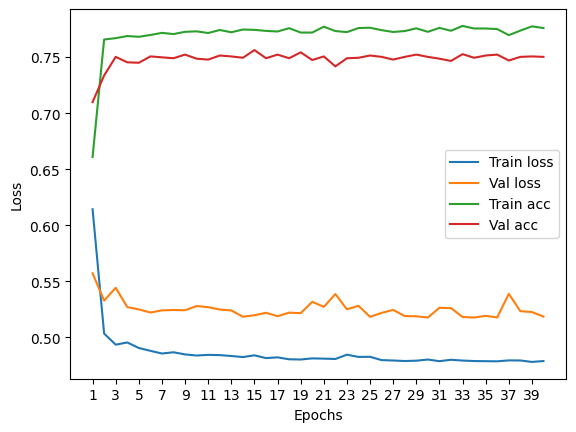

****************************************************************************************************



Particles per jet: 6


118it [00:01, 102.96it/s]


Train Epoch: 0 	Loss: 0.607426, Accuracy: 5342/7500 (71%)
Val Epoch: 0 	Loss: 0.515530, Accuracy: 1883/2500 (75%)



118it [00:00, 133.72it/s]


Train Epoch: 1 	Loss: 0.507870, Accuracy: 5744/7500 (77%)
Val Epoch: 1 	Loss: 0.514555, Accuracy: 1877/2500 (75%)



118it [00:00, 123.22it/s]


Train Epoch: 2 	Loss: 0.493701, Accuracy: 5799/7500 (77%)
Val Epoch: 2 	Loss: 0.500878, Accuracy: 1924/2500 (77%)



118it [00:01, 117.75it/s]


Train Epoch: 3 	Loss: 0.492361, Accuracy: 5804/7500 (77%)
Val Epoch: 3 	Loss: 0.493187, Accuracy: 1906/2500 (76%)



118it [00:01, 117.70it/s]


Train Epoch: 4 	Loss: 0.488186, Accuracy: 5799/7500 (77%)
Val Epoch: 4 	Loss: 0.496581, Accuracy: 1922/2500 (77%)



118it [00:00, 119.53it/s]


Train Epoch: 5 	Loss: 0.485026, Accuracy: 5818/7500 (78%)
Val Epoch: 5 	Loss: 0.497998, Accuracy: 1926/2500 (77%)



118it [00:00, 125.57it/s]


Train Epoch: 6 	Loss: 0.489030, Accuracy: 5782/7500 (77%)
Val Epoch: 6 	Loss: 0.497722, Accuracy: 1917/2500 (77%)



118it [00:01, 112.18it/s]


Train Epoch: 7 	Loss: 0.484057, Accuracy: 5823/7500 (78%)
Val Epoch: 7 	Loss: 0.511389, Accuracy: 1912/2500 (76%)



118it [00:00, 129.83it/s]


Train Epoch: 8 	Loss: 0.483698, Accuracy: 5812/7500 (77%)
Val Epoch: 8 	Loss: 0.493066, Accuracy: 1919/2500 (77%)



118it [00:00, 125.68it/s]


Train Epoch: 9 	Loss: 0.483824, Accuracy: 5805/7500 (77%)
Val Epoch: 9 	Loss: 0.492027, Accuracy: 1927/2500 (77%)



118it [00:00, 140.12it/s]


Train Epoch: 10 	Loss: 0.482747, Accuracy: 5841/7500 (78%)
Val Epoch: 10 	Loss: 0.514047, Accuracy: 1926/2500 (77%)



118it [00:00, 121.53it/s]


Train Epoch: 11 	Loss: 0.482000, Accuracy: 5823/7500 (78%)
Val Epoch: 11 	Loss: 0.492171, Accuracy: 1927/2500 (77%)



118it [00:00, 125.58it/s]


Train Epoch: 12 	Loss: 0.481759, Accuracy: 5834/7500 (78%)
Val Epoch: 12 	Loss: 0.495495, Accuracy: 1921/2500 (77%)



118it [00:00, 132.09it/s]


Train Epoch: 13 	Loss: 0.481777, Accuracy: 5820/7500 (78%)
Val Epoch: 13 	Loss: 0.512054, Accuracy: 1917/2500 (77%)



118it [00:01, 117.78it/s]


Train Epoch: 14 	Loss: 0.483756, Accuracy: 5820/7500 (78%)
Val Epoch: 14 	Loss: 0.493196, Accuracy: 1932/2500 (77%)



118it [00:00, 150.91it/s]


Train Epoch: 15 	Loss: 0.478975, Accuracy: 5839/7500 (78%)
Val Epoch: 15 	Loss: 0.498135, Accuracy: 1917/2500 (77%)



118it [00:00, 147.78it/s]


Train Epoch: 16 	Loss: 0.480720, Accuracy: 5835/7500 (78%)
Val Epoch: 16 	Loss: 0.503009, Accuracy: 1904/2500 (76%)



118it [00:00, 142.36it/s]


Train Epoch: 17 	Loss: 0.480783, Accuracy: 5806/7500 (77%)
Val Epoch: 17 	Loss: 0.491522, Accuracy: 1926/2500 (77%)



118it [00:00, 132.27it/s]


Train Epoch: 18 	Loss: 0.481762, Accuracy: 5834/7500 (78%)
Val Epoch: 18 	Loss: 0.488500, Accuracy: 1930/2500 (77%)



118it [00:00, 121.81it/s]


Train Epoch: 19 	Loss: 0.480832, Accuracy: 5847/7500 (78%)
Val Epoch: 19 	Loss: 0.501156, Accuracy: 1925/2500 (77%)



118it [00:00, 129.74it/s]


Train Epoch: 20 	Loss: 0.481195, Accuracy: 5838/7500 (78%)
Val Epoch: 20 	Loss: 0.499215, Accuracy: 1915/2500 (77%)



118it [00:00, 129.89it/s]


Train Epoch: 21 	Loss: 0.479194, Accuracy: 5829/7500 (78%)
Val Epoch: 21 	Loss: 0.497169, Accuracy: 1930/2500 (77%)



118it [00:00, 134.18it/s]


Train Epoch: 22 	Loss: 0.478771, Accuracy: 5838/7500 (78%)
Val Epoch: 22 	Loss: 0.489123, Accuracy: 1927/2500 (77%)



118it [00:00, 127.45it/s]


Train Epoch: 23 	Loss: 0.477994, Accuracy: 5834/7500 (78%)
Val Epoch: 23 	Loss: 0.490378, Accuracy: 1922/2500 (77%)



118it [00:00, 125.70it/s]


Train Epoch: 24 	Loss: 0.481895, Accuracy: 5841/7500 (78%)
Val Epoch: 24 	Loss: 0.496871, Accuracy: 1923/2500 (77%)



118it [00:00, 142.39it/s]


Train Epoch: 25 	Loss: 0.478395, Accuracy: 5833/7500 (78%)
Val Epoch: 25 	Loss: 0.493673, Accuracy: 1909/2500 (76%)



118it [00:01, 113.81it/s]


Train Epoch: 26 	Loss: 0.478752, Accuracy: 5840/7500 (78%)
Val Epoch: 26 	Loss: 0.500881, Accuracy: 1931/2500 (77%)



118it [00:01, 114.08it/s]


Train Epoch: 27 	Loss: 0.479800, Accuracy: 5847/7500 (78%)
Val Epoch: 27 	Loss: 0.489601, Accuracy: 1926/2500 (77%)



118it [00:00, 129.91it/s]


Train Epoch: 28 	Loss: 0.481517, Accuracy: 5836/7500 (78%)
Val Epoch: 28 	Loss: 0.500026, Accuracy: 1915/2500 (77%)



118it [00:00, 132.28it/s]


Train Epoch: 29 	Loss: 0.476515, Accuracy: 5840/7500 (78%)
Val Epoch: 29 	Loss: 0.490568, Accuracy: 1926/2500 (77%)



118it [00:00, 132.25it/s]


Train Epoch: 30 	Loss: 0.478433, Accuracy: 5846/7500 (78%)
Val Epoch: 30 	Loss: 0.514788, Accuracy: 1920/2500 (77%)



118it [00:00, 134.59it/s]


Train Epoch: 31 	Loss: 0.479464, Accuracy: 5833/7500 (78%)
Val Epoch: 31 	Loss: 0.504108, Accuracy: 1920/2500 (77%)



118it [00:00, 119.79it/s]


Train Epoch: 32 	Loss: 0.477362, Accuracy: 5833/7500 (78%)
Val Epoch: 32 	Loss: 0.503488, Accuracy: 1931/2500 (77%)



118it [00:00, 134.66it/s]


Train Epoch: 33 	Loss: 0.480167, Accuracy: 5850/7500 (78%)
Val Epoch: 33 	Loss: 0.489399, Accuracy: 1928/2500 (77%)



118it [00:00, 121.48it/s]


Train Epoch: 34 	Loss: 0.479678, Accuracy: 5848/7500 (78%)
Val Epoch: 34 	Loss: 0.488521, Accuracy: 1925/2500 (77%)



118it [00:00, 134.45it/s]


Train Epoch: 35 	Loss: 0.479052, Accuracy: 5863/7500 (78%)
Val Epoch: 35 	Loss: 0.508602, Accuracy: 1923/2500 (77%)



118it [00:00, 127.47it/s]


Train Epoch: 36 	Loss: 0.477242, Accuracy: 5840/7500 (78%)
Val Epoch: 36 	Loss: 0.492310, Accuracy: 1916/2500 (77%)



118it [00:00, 132.28it/s]


Train Epoch: 37 	Loss: 0.478419, Accuracy: 5839/7500 (78%)
Val Epoch: 37 	Loss: 0.497217, Accuracy: 1920/2500 (77%)



118it [00:00, 125.67it/s]


Train Epoch: 38 	Loss: 0.479286, Accuracy: 5842/7500 (78%)
Val Epoch: 38 	Loss: 0.490310, Accuracy: 1915/2500 (77%)



118it [00:00, 125.79it/s]


Train Epoch: 39 	Loss: 0.480247, Accuracy: 5845/7500 (78%)
Val Epoch: 39 	Loss: 0.490440, Accuracy: 1923/2500 (77%)

Test accuracy:  77.28


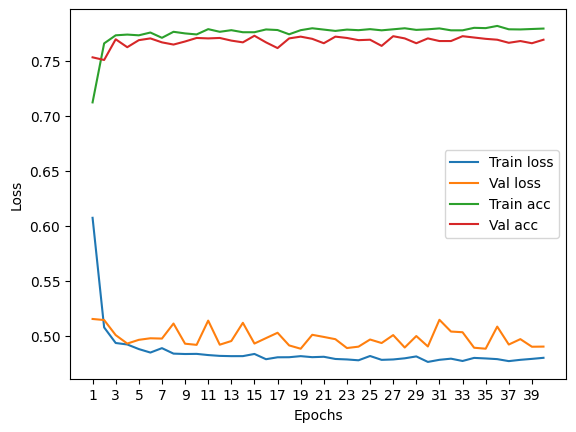

****************************************************************************************************



118it [00:01, 103.22it/s]


Train Epoch: 0 	Loss: 0.615029, Accuracy: 5262/7500 (70%)
Val Epoch: 0 	Loss: 0.545938, Accuracy: 1915/2500 (77%)



118it [00:00, 142.10it/s]


Train Epoch: 1 	Loss: 0.512294, Accuracy: 5703/7500 (76%)
Val Epoch: 1 	Loss: 0.527205, Accuracy: 1911/2500 (76%)



118it [00:00, 127.82it/s]


Train Epoch: 2 	Loss: 0.505764, Accuracy: 5678/7500 (76%)
Val Epoch: 2 	Loss: 0.516712, Accuracy: 1879/2500 (75%)



118it [00:00, 129.86it/s]


Train Epoch: 3 	Loss: 0.503484, Accuracy: 5683/7500 (76%)
Val Epoch: 3 	Loss: 0.502764, Accuracy: 1909/2500 (76%)



118it [00:00, 132.44it/s]


Train Epoch: 4 	Loss: 0.497534, Accuracy: 5733/7500 (76%)
Val Epoch: 4 	Loss: 0.511426, Accuracy: 1885/2500 (75%)



118it [00:01, 115.90it/s]


Train Epoch: 5 	Loss: 0.495560, Accuracy: 5747/7500 (77%)
Val Epoch: 5 	Loss: 0.514068, Accuracy: 1915/2500 (77%)



118it [00:00, 142.35it/s]


Train Epoch: 6 	Loss: 0.495660, Accuracy: 5742/7500 (77%)
Val Epoch: 6 	Loss: 0.507652, Accuracy: 1904/2500 (76%)



118it [00:00, 130.08it/s]


Train Epoch: 7 	Loss: 0.493265, Accuracy: 5728/7500 (76%)
Val Epoch: 7 	Loss: 0.505528, Accuracy: 1929/2500 (77%)



118it [00:00, 119.53it/s]


Train Epoch: 8 	Loss: 0.491601, Accuracy: 5736/7500 (76%)
Val Epoch: 8 	Loss: 0.499812, Accuracy: 1911/2500 (76%)



118it [00:00, 149.98it/s]


Train Epoch: 9 	Loss: 0.493239, Accuracy: 5733/7500 (76%)
Val Epoch: 9 	Loss: 0.514309, Accuracy: 1918/2500 (77%)



118it [00:00, 127.55it/s]


Train Epoch: 10 	Loss: 0.492816, Accuracy: 5741/7500 (77%)
Val Epoch: 10 	Loss: 0.511297, Accuracy: 1933/2500 (77%)



118it [00:00, 136.82it/s]


Train Epoch: 11 	Loss: 0.493204, Accuracy: 5737/7500 (76%)
Val Epoch: 11 	Loss: 0.501459, Accuracy: 1933/2500 (77%)



118it [00:00, 142.38it/s]


Train Epoch: 12 	Loss: 0.491463, Accuracy: 5757/7500 (77%)
Val Epoch: 12 	Loss: 0.521292, Accuracy: 1903/2500 (76%)



118it [00:00, 134.77it/s]


Train Epoch: 13 	Loss: 0.492575, Accuracy: 5739/7500 (77%)
Val Epoch: 13 	Loss: 0.510282, Accuracy: 1922/2500 (77%)



118it [00:00, 136.99it/s]


Train Epoch: 14 	Loss: 0.491504, Accuracy: 5758/7500 (77%)
Val Epoch: 14 	Loss: 0.505135, Accuracy: 1894/2500 (76%)



118it [00:00, 142.17it/s]


Train Epoch: 15 	Loss: 0.491576, Accuracy: 5747/7500 (77%)
Val Epoch: 15 	Loss: 0.508112, Accuracy: 1932/2500 (77%)



118it [00:00, 142.21it/s]


Train Epoch: 16 	Loss: 0.490000, Accuracy: 5743/7500 (77%)
Val Epoch: 16 	Loss: 0.503315, Accuracy: 1921/2500 (77%)



118it [00:01, 117.74it/s]


Train Epoch: 17 	Loss: 0.491197, Accuracy: 5768/7500 (77%)
Val Epoch: 17 	Loss: 0.497789, Accuracy: 1930/2500 (77%)



118it [00:00, 129.75it/s]


Train Epoch: 18 	Loss: 0.489209, Accuracy: 5746/7500 (77%)
Val Epoch: 18 	Loss: 0.508279, Accuracy: 1922/2500 (77%)



118it [00:00, 139.81it/s]


Train Epoch: 19 	Loss: 0.489696, Accuracy: 5762/7500 (77%)
Val Epoch: 19 	Loss: 0.503543, Accuracy: 1897/2500 (76%)



118it [00:00, 132.34it/s]


Train Epoch: 20 	Loss: 0.490293, Accuracy: 5773/7500 (77%)
Val Epoch: 20 	Loss: 0.508046, Accuracy: 1919/2500 (77%)



118it [00:00, 119.64it/s]


Train Epoch: 21 	Loss: 0.488213, Accuracy: 5751/7500 (77%)
Val Epoch: 21 	Loss: 0.503419, Accuracy: 1912/2500 (76%)



118it [00:00, 127.80it/s]


Train Epoch: 22 	Loss: 0.490115, Accuracy: 5763/7500 (77%)
Val Epoch: 22 	Loss: 0.496412, Accuracy: 1919/2500 (77%)



118it [00:00, 121.01it/s]


Train Epoch: 23 	Loss: 0.486483, Accuracy: 5773/7500 (77%)
Val Epoch: 23 	Loss: 0.511824, Accuracy: 1923/2500 (77%)



118it [00:00, 134.54it/s]


Train Epoch: 24 	Loss: 0.490212, Accuracy: 5763/7500 (77%)
Val Epoch: 24 	Loss: 0.496986, Accuracy: 1927/2500 (77%)



118it [00:00, 123.38it/s]


Train Epoch: 25 	Loss: 0.488727, Accuracy: 5757/7500 (77%)
Val Epoch: 25 	Loss: 0.500629, Accuracy: 1916/2500 (77%)



118it [00:00, 132.05it/s]


Train Epoch: 26 	Loss: 0.488792, Accuracy: 5773/7500 (77%)
Val Epoch: 26 	Loss: 0.504719, Accuracy: 1912/2500 (76%)



118it [00:00, 134.49it/s]


Train Epoch: 27 	Loss: 0.487760, Accuracy: 5764/7500 (77%)
Val Epoch: 27 	Loss: 0.503641, Accuracy: 1924/2500 (77%)



118it [00:00, 127.81it/s]


Train Epoch: 28 	Loss: 0.487141, Accuracy: 5768/7500 (77%)
Val Epoch: 28 	Loss: 0.509859, Accuracy: 1915/2500 (77%)



118it [00:00, 144.40it/s]


Train Epoch: 29 	Loss: 0.488840, Accuracy: 5743/7500 (77%)
Val Epoch: 29 	Loss: 0.517188, Accuracy: 1920/2500 (77%)



118it [00:00, 123.62it/s]


Train Epoch: 30 	Loss: 0.487416, Accuracy: 5759/7500 (77%)
Val Epoch: 30 	Loss: 0.506832, Accuracy: 1915/2500 (77%)



118it [00:00, 127.76it/s]


Train Epoch: 31 	Loss: 0.488902, Accuracy: 5762/7500 (77%)
Val Epoch: 31 	Loss: 0.499676, Accuracy: 1909/2500 (76%)



118it [00:00, 125.73it/s]


Train Epoch: 32 	Loss: 0.485316, Accuracy: 5777/7500 (77%)
Val Epoch: 32 	Loss: 0.522086, Accuracy: 1909/2500 (76%)



118it [00:00, 137.13it/s]


Train Epoch: 33 	Loss: 0.487825, Accuracy: 5767/7500 (77%)
Val Epoch: 33 	Loss: 0.502553, Accuracy: 1924/2500 (77%)



118it [00:00, 125.59it/s]


Train Epoch: 34 	Loss: 0.491083, Accuracy: 5762/7500 (77%)
Val Epoch: 34 	Loss: 0.505776, Accuracy: 1914/2500 (77%)



118it [00:00, 136.94it/s]


Train Epoch: 35 	Loss: 0.490233, Accuracy: 5776/7500 (77%)
Val Epoch: 35 	Loss: 0.497246, Accuracy: 1921/2500 (77%)



118it [00:00, 129.86it/s]


Train Epoch: 36 	Loss: 0.486559, Accuracy: 5768/7500 (77%)
Val Epoch: 36 	Loss: 0.522277, Accuracy: 1928/2500 (77%)



118it [00:00, 133.99it/s]


Train Epoch: 37 	Loss: 0.486479, Accuracy: 5759/7500 (77%)
Val Epoch: 37 	Loss: 0.501463, Accuracy: 1915/2500 (77%)



118it [00:01, 110.67it/s]


Train Epoch: 38 	Loss: 0.487731, Accuracy: 5771/7500 (77%)
Val Epoch: 38 	Loss: 0.507463, Accuracy: 1919/2500 (77%)



118it [00:00, 137.20it/s]


Train Epoch: 39 	Loss: 0.489374, Accuracy: 5772/7500 (77%)
Val Epoch: 39 	Loss: 0.500324, Accuracy: 1914/2500 (77%)

Test accuracy:  76.8


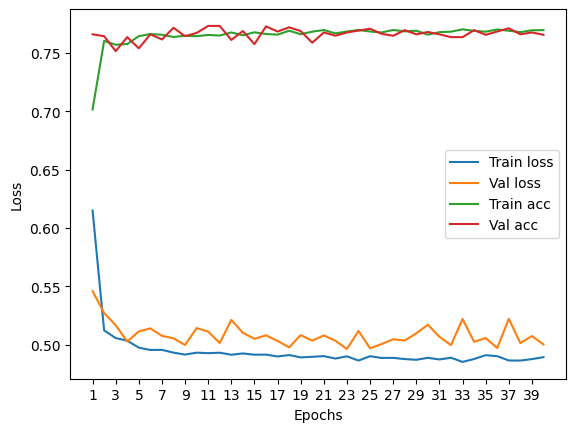

****************************************************************************************************



118it [00:00, 132.38it/s]


Train Epoch: 0 	Loss: 0.608539, Accuracy: 5404/7500 (72%)
Val Epoch: 0 	Loss: 0.510585, Accuracy: 1910/2500 (76%)



118it [00:01, 112.57it/s]


Train Epoch: 1 	Loss: 0.501846, Accuracy: 5742/7500 (77%)
Val Epoch: 1 	Loss: 0.499332, Accuracy: 1923/2500 (77%)



118it [00:00, 144.66it/s]


Train Epoch: 2 	Loss: 0.494956, Accuracy: 5764/7500 (77%)
Val Epoch: 2 	Loss: 0.509990, Accuracy: 1925/2500 (77%)



118it [00:00, 141.86it/s]


Train Epoch: 3 	Loss: 0.490059, Accuracy: 5787/7500 (77%)
Val Epoch: 3 	Loss: 0.494151, Accuracy: 1927/2500 (77%)



118it [00:00, 129.84it/s]


Train Epoch: 4 	Loss: 0.485935, Accuracy: 5809/7500 (77%)
Val Epoch: 4 	Loss: 0.492075, Accuracy: 1941/2500 (78%)



118it [00:00, 145.02it/s]


Train Epoch: 5 	Loss: 0.485654, Accuracy: 5849/7500 (78%)
Val Epoch: 5 	Loss: 0.512067, Accuracy: 1935/2500 (77%)



118it [00:00, 137.13it/s]


Train Epoch: 6 	Loss: 0.487476, Accuracy: 5802/7500 (77%)
Val Epoch: 6 	Loss: 0.503496, Accuracy: 1913/2500 (77%)



118it [00:00, 127.84it/s]


Train Epoch: 7 	Loss: 0.484549, Accuracy: 5828/7500 (78%)
Val Epoch: 7 	Loss: 0.511495, Accuracy: 1929/2500 (77%)



118it [00:00, 132.10it/s]


Train Epoch: 8 	Loss: 0.483083, Accuracy: 5825/7500 (78%)
Val Epoch: 8 	Loss: 0.490846, Accuracy: 1931/2500 (77%)



118it [00:00, 137.18it/s]


Train Epoch: 9 	Loss: 0.483291, Accuracy: 5824/7500 (78%)
Val Epoch: 9 	Loss: 0.516547, Accuracy: 1932/2500 (77%)



118it [00:00, 125.37it/s]


Train Epoch: 10 	Loss: 0.483304, Accuracy: 5823/7500 (78%)
Val Epoch: 10 	Loss: 0.490999, Accuracy: 1921/2500 (77%)



118it [00:00, 138.67it/s]


Train Epoch: 11 	Loss: 0.481831, Accuracy: 5832/7500 (78%)
Val Epoch: 11 	Loss: 0.508415, Accuracy: 1929/2500 (77%)



118it [00:00, 150.60it/s]


Train Epoch: 12 	Loss: 0.480765, Accuracy: 5821/7500 (78%)
Val Epoch: 12 	Loss: 0.486162, Accuracy: 1947/2500 (78%)



118it [00:00, 125.70it/s]


Train Epoch: 13 	Loss: 0.481574, Accuracy: 5824/7500 (78%)
Val Epoch: 13 	Loss: 0.515315, Accuracy: 1932/2500 (77%)



118it [00:01, 114.25it/s]


Train Epoch: 14 	Loss: 0.480851, Accuracy: 5817/7500 (78%)
Val Epoch: 14 	Loss: 0.506398, Accuracy: 1939/2500 (78%)



118it [00:00, 123.58it/s]


Train Epoch: 15 	Loss: 0.481795, Accuracy: 5827/7500 (78%)
Val Epoch: 15 	Loss: 0.492909, Accuracy: 1935/2500 (77%)



118it [00:00, 125.20it/s]


Train Epoch: 16 	Loss: 0.483791, Accuracy: 5833/7500 (78%)
Val Epoch: 16 	Loss: 0.506944, Accuracy: 1941/2500 (78%)



118it [00:00, 127.80it/s]


Train Epoch: 17 	Loss: 0.482083, Accuracy: 5829/7500 (78%)
Val Epoch: 17 	Loss: 0.490051, Accuracy: 1936/2500 (77%)



118it [00:00, 127.93it/s]


Train Epoch: 18 	Loss: 0.479852, Accuracy: 5836/7500 (78%)
Val Epoch: 18 	Loss: 0.501473, Accuracy: 1934/2500 (77%)



118it [00:00, 127.72it/s]


Train Epoch: 19 	Loss: 0.481518, Accuracy: 5810/7500 (77%)
Val Epoch: 19 	Loss: 0.492904, Accuracy: 1932/2500 (77%)



118it [00:00, 127.88it/s]


Train Epoch: 20 	Loss: 0.482093, Accuracy: 5845/7500 (78%)
Val Epoch: 20 	Loss: 0.492877, Accuracy: 1927/2500 (77%)



118it [00:00, 142.29it/s]


Train Epoch: 21 	Loss: 0.479537, Accuracy: 5847/7500 (78%)
Val Epoch: 21 	Loss: 0.504159, Accuracy: 1915/2500 (77%)



118it [00:00, 136.95it/s]


Train Epoch: 22 	Loss: 0.481495, Accuracy: 5835/7500 (78%)
Val Epoch: 22 	Loss: 0.501476, Accuracy: 1931/2500 (77%)



118it [00:00, 130.08it/s]


Train Epoch: 23 	Loss: 0.479894, Accuracy: 5838/7500 (78%)
Val Epoch: 23 	Loss: 0.492234, Accuracy: 1935/2500 (77%)



118it [00:00, 131.98it/s]


Train Epoch: 24 	Loss: 0.479629, Accuracy: 5817/7500 (78%)
Val Epoch: 24 	Loss: 0.486376, Accuracy: 1929/2500 (77%)



118it [00:00, 125.00it/s]


Train Epoch: 25 	Loss: 0.477124, Accuracy: 5842/7500 (78%)
Val Epoch: 25 	Loss: 0.489875, Accuracy: 1929/2500 (77%)



118it [00:00, 127.93it/s]


Train Epoch: 26 	Loss: 0.481521, Accuracy: 5844/7500 (78%)
Val Epoch: 26 	Loss: 0.495085, Accuracy: 1942/2500 (78%)



118it [00:00, 142.33it/s]


Train Epoch: 27 	Loss: 0.479405, Accuracy: 5857/7500 (78%)
Val Epoch: 27 	Loss: 0.506411, Accuracy: 1931/2500 (77%)



118it [00:00, 127.68it/s]


Train Epoch: 28 	Loss: 0.481275, Accuracy: 5824/7500 (78%)
Val Epoch: 28 	Loss: 0.496718, Accuracy: 1922/2500 (77%)



118it [00:00, 123.45it/s]


Train Epoch: 29 	Loss: 0.479717, Accuracy: 5817/7500 (78%)
Val Epoch: 29 	Loss: 0.491075, Accuracy: 1928/2500 (77%)



118it [00:00, 121.08it/s]


Train Epoch: 30 	Loss: 0.478745, Accuracy: 5845/7500 (78%)
Val Epoch: 30 	Loss: 0.489013, Accuracy: 1923/2500 (77%)



118it [00:00, 132.16it/s]


Train Epoch: 31 	Loss: 0.479344, Accuracy: 5843/7500 (78%)
Val Epoch: 31 	Loss: 0.493756, Accuracy: 1926/2500 (77%)



118it [00:00, 139.61it/s]


Train Epoch: 32 	Loss: 0.478764, Accuracy: 5848/7500 (78%)
Val Epoch: 32 	Loss: 0.500592, Accuracy: 1927/2500 (77%)



118it [00:00, 125.71it/s]


Train Epoch: 33 	Loss: 0.479079, Accuracy: 5833/7500 (78%)
Val Epoch: 33 	Loss: 0.490769, Accuracy: 1932/2500 (77%)



118it [00:01, 102.98it/s]


Train Epoch: 34 	Loss: 0.477833, Accuracy: 5817/7500 (78%)
Val Epoch: 34 	Loss: 0.496300, Accuracy: 1943/2500 (78%)



118it [00:00, 121.56it/s]


Train Epoch: 35 	Loss: 0.478921, Accuracy: 5842/7500 (78%)
Val Epoch: 35 	Loss: 0.500230, Accuracy: 1928/2500 (77%)



118it [00:00, 118.98it/s]


Train Epoch: 36 	Loss: 0.478311, Accuracy: 5831/7500 (78%)
Val Epoch: 36 	Loss: 0.501790, Accuracy: 1909/2500 (76%)



118it [00:00, 142.09it/s]


Train Epoch: 37 	Loss: 0.478811, Accuracy: 5847/7500 (78%)
Val Epoch: 37 	Loss: 0.506599, Accuracy: 1911/2500 (76%)



118it [00:00, 125.10it/s]


Train Epoch: 38 	Loss: 0.478882, Accuracy: 5824/7500 (78%)
Val Epoch: 38 	Loss: 0.497836, Accuracy: 1925/2500 (77%)



118it [00:00, 132.15it/s]


Train Epoch: 39 	Loss: 0.475211, Accuracy: 5834/7500 (78%)
Val Epoch: 39 	Loss: 0.504862, Accuracy: 1939/2500 (78%)

Test accuracy:  77.12


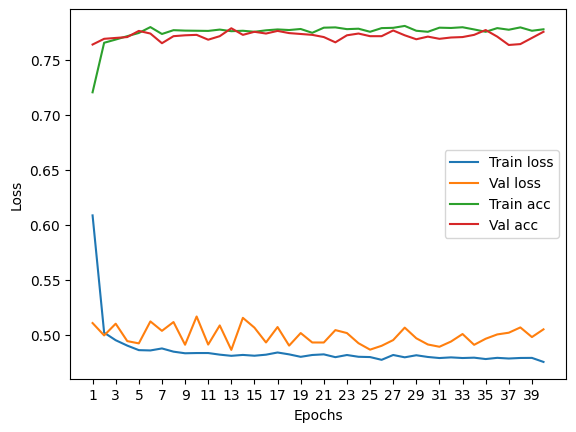

****************************************************************************************************



118it [00:00, 134.27it/s]


Train Epoch: 0 	Loss: 0.617061, Accuracy: 5029/7500 (67%)
Val Epoch: 0 	Loss: 0.525460, Accuracy: 1894/2500 (76%)



118it [00:00, 132.30it/s]


Train Epoch: 1 	Loss: 0.512768, Accuracy: 5744/7500 (77%)
Val Epoch: 1 	Loss: 0.494913, Accuracy: 1940/2500 (78%)



118it [00:00, 121.51it/s]


Train Epoch: 2 	Loss: 0.503617, Accuracy: 5750/7500 (77%)
Val Epoch: 2 	Loss: 0.495914, Accuracy: 1941/2500 (78%)



118it [00:00, 132.07it/s]


Train Epoch: 3 	Loss: 0.503232, Accuracy: 5731/7500 (76%)
Val Epoch: 3 	Loss: 0.485394, Accuracy: 1947/2500 (78%)



118it [00:00, 130.04it/s]


Train Epoch: 4 	Loss: 0.495782, Accuracy: 5799/7500 (77%)
Val Epoch: 4 	Loss: 0.494986, Accuracy: 1936/2500 (77%)



118it [00:00, 123.35it/s]


Train Epoch: 5 	Loss: 0.494762, Accuracy: 5777/7500 (77%)
Val Epoch: 5 	Loss: 0.493869, Accuracy: 1950/2500 (78%)



118it [00:00, 134.64it/s]


Train Epoch: 6 	Loss: 0.495757, Accuracy: 5810/7500 (77%)
Val Epoch: 6 	Loss: 0.490196, Accuracy: 1949/2500 (78%)



118it [00:00, 129.98it/s]


Train Epoch: 7 	Loss: 0.492092, Accuracy: 5804/7500 (77%)
Val Epoch: 7 	Loss: 0.494876, Accuracy: 1948/2500 (78%)



118it [00:00, 127.70it/s]


Train Epoch: 8 	Loss: 0.492882, Accuracy: 5798/7500 (77%)
Val Epoch: 8 	Loss: 0.489056, Accuracy: 1937/2500 (77%)



118it [00:00, 123.50it/s]


Train Epoch: 9 	Loss: 0.492913, Accuracy: 5799/7500 (77%)
Val Epoch: 9 	Loss: 0.483631, Accuracy: 1936/2500 (77%)



118it [00:00, 150.97it/s]


Train Epoch: 10 	Loss: 0.494146, Accuracy: 5813/7500 (78%)
Val Epoch: 10 	Loss: 0.479498, Accuracy: 1941/2500 (78%)



118it [00:00, 132.14it/s]


Train Epoch: 11 	Loss: 0.492167, Accuracy: 5809/7500 (77%)
Val Epoch: 11 	Loss: 0.492364, Accuracy: 1944/2500 (78%)



118it [00:00, 123.17it/s]


Train Epoch: 12 	Loss: 0.491055, Accuracy: 5819/7500 (78%)
Val Epoch: 12 	Loss: 0.482570, Accuracy: 1933/2500 (77%)



118it [00:00, 136.72it/s]


Train Epoch: 13 	Loss: 0.495520, Accuracy: 5794/7500 (77%)
Val Epoch: 13 	Loss: 0.484412, Accuracy: 1929/2500 (77%)



118it [00:01, 117.71it/s]


Train Epoch: 14 	Loss: 0.493093, Accuracy: 5779/7500 (77%)
Val Epoch: 14 	Loss: 0.497973, Accuracy: 1931/2500 (77%)



118it [00:00, 137.08it/s]


Train Epoch: 15 	Loss: 0.494067, Accuracy: 5823/7500 (78%)
Val Epoch: 15 	Loss: 0.493535, Accuracy: 1952/2500 (78%)



118it [00:00, 123.60it/s]


Train Epoch: 16 	Loss: 0.489915, Accuracy: 5817/7500 (78%)
Val Epoch: 16 	Loss: 0.482703, Accuracy: 1947/2500 (78%)



118it [00:00, 129.96it/s]


Train Epoch: 17 	Loss: 0.490790, Accuracy: 5827/7500 (78%)
Val Epoch: 17 	Loss: 0.487353, Accuracy: 1950/2500 (78%)



118it [00:01, 117.97it/s]


Train Epoch: 18 	Loss: 0.488170, Accuracy: 5851/7500 (78%)
Val Epoch: 18 	Loss: 0.483331, Accuracy: 1946/2500 (78%)



118it [00:00, 121.58it/s]


Train Epoch: 19 	Loss: 0.490326, Accuracy: 5804/7500 (77%)
Val Epoch: 19 	Loss: 0.481038, Accuracy: 1951/2500 (78%)



118it [00:00, 145.08it/s]


Train Epoch: 20 	Loss: 0.491272, Accuracy: 5815/7500 (78%)
Val Epoch: 20 	Loss: 0.480409, Accuracy: 1953/2500 (78%)



118it [00:00, 123.66it/s]


Train Epoch: 21 	Loss: 0.490489, Accuracy: 5821/7500 (78%)
Val Epoch: 21 	Loss: 0.475498, Accuracy: 1950/2500 (78%)



118it [00:00, 132.24it/s]


Train Epoch: 22 	Loss: 0.492045, Accuracy: 5818/7500 (78%)
Val Epoch: 22 	Loss: 0.492369, Accuracy: 1949/2500 (78%)



118it [00:00, 134.53it/s]


Train Epoch: 23 	Loss: 0.490931, Accuracy: 5827/7500 (78%)
Val Epoch: 23 	Loss: 0.476664, Accuracy: 1950/2500 (78%)



118it [00:00, 123.50it/s]


Train Epoch: 24 	Loss: 0.488942, Accuracy: 5810/7500 (77%)
Val Epoch: 24 	Loss: 0.487877, Accuracy: 1949/2500 (78%)



118it [00:00, 118.93it/s]


Train Epoch: 25 	Loss: 0.489190, Accuracy: 5814/7500 (78%)
Val Epoch: 25 	Loss: 0.479978, Accuracy: 1940/2500 (78%)



118it [00:01, 112.24it/s]


Train Epoch: 26 	Loss: 0.490402, Accuracy: 5830/7500 (78%)
Val Epoch: 26 	Loss: 0.479948, Accuracy: 1956/2500 (78%)



118it [00:01, 117.81it/s]


Train Epoch: 27 	Loss: 0.493078, Accuracy: 5805/7500 (77%)
Val Epoch: 27 	Loss: 0.487611, Accuracy: 1955/2500 (78%)



118it [00:00, 139.77it/s]


Train Epoch: 28 	Loss: 0.488981, Accuracy: 5834/7500 (78%)
Val Epoch: 28 	Loss: 0.474492, Accuracy: 1958/2500 (78%)



118it [00:00, 132.23it/s]


Train Epoch: 29 	Loss: 0.488766, Accuracy: 5827/7500 (78%)
Val Epoch: 29 	Loss: 0.477317, Accuracy: 1940/2500 (78%)



118it [00:00, 125.64it/s]


Train Epoch: 30 	Loss: 0.489076, Accuracy: 5833/7500 (78%)
Val Epoch: 30 	Loss: 0.481890, Accuracy: 1943/2500 (78%)



118it [00:00, 147.78it/s]


Train Epoch: 31 	Loss: 0.489900, Accuracy: 5814/7500 (78%)
Val Epoch: 31 	Loss: 0.487185, Accuracy: 1954/2500 (78%)



118it [00:00, 127.53it/s]


Train Epoch: 32 	Loss: 0.492104, Accuracy: 5809/7500 (77%)
Val Epoch: 32 	Loss: 0.494272, Accuracy: 1944/2500 (78%)



118it [00:00, 132.41it/s]


Train Epoch: 33 	Loss: 0.489130, Accuracy: 5843/7500 (78%)
Val Epoch: 33 	Loss: 0.477338, Accuracy: 1948/2500 (78%)



118it [00:01, 117.89it/s]


Train Epoch: 34 	Loss: 0.490707, Accuracy: 5831/7500 (78%)
Val Epoch: 34 	Loss: 0.484515, Accuracy: 1950/2500 (78%)



118it [00:00, 134.75it/s]


Train Epoch: 35 	Loss: 0.492056, Accuracy: 5798/7500 (77%)
Val Epoch: 35 	Loss: 0.478429, Accuracy: 1942/2500 (78%)



118it [00:00, 125.70it/s]


Train Epoch: 36 	Loss: 0.489664, Accuracy: 5807/7500 (77%)
Val Epoch: 36 	Loss: 0.481544, Accuracy: 1949/2500 (78%)



118it [00:00, 121.63it/s]


Train Epoch: 37 	Loss: 0.490244, Accuracy: 5828/7500 (78%)
Val Epoch: 37 	Loss: 0.501392, Accuracy: 1945/2500 (78%)



118it [00:01, 117.60it/s]


Train Epoch: 38 	Loss: 0.487105, Accuracy: 5831/7500 (78%)
Val Epoch: 38 	Loss: 0.482545, Accuracy: 1955/2500 (78%)



118it [00:00, 136.76it/s]


Train Epoch: 39 	Loss: 0.486970, Accuracy: 5829/7500 (78%)
Val Epoch: 39 	Loss: 0.476727, Accuracy: 1957/2500 (78%)

Test accuracy:  77.52


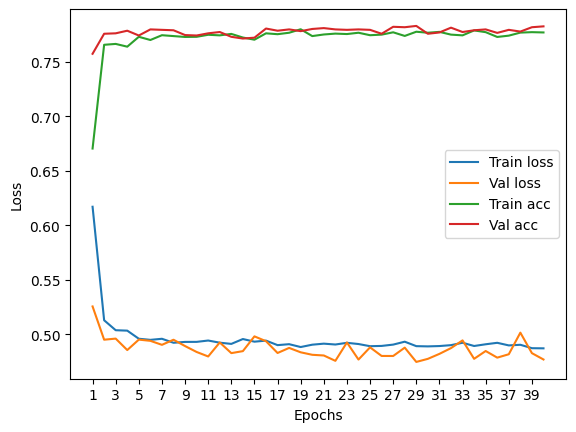

****************************************************************************************************



118it [00:00, 142.26it/s]


Train Epoch: 0 	Loss: 0.600014, Accuracy: 5282/7500 (70%)
Val Epoch: 0 	Loss: 0.550542, Accuracy: 1885/2500 (75%)



118it [00:00, 125.45it/s]


Train Epoch: 1 	Loss: 0.509523, Accuracy: 5731/7500 (76%)
Val Epoch: 1 	Loss: 0.528448, Accuracy: 1896/2500 (76%)



118it [00:01, 112.45it/s]


Train Epoch: 2 	Loss: 0.497919, Accuracy: 5729/7500 (76%)
Val Epoch: 2 	Loss: 0.521989, Accuracy: 1878/2500 (75%)



118it [00:00, 127.74it/s]


Train Epoch: 3 	Loss: 0.494072, Accuracy: 5763/7500 (77%)
Val Epoch: 3 	Loss: 0.511637, Accuracy: 1896/2500 (76%)



118it [00:00, 132.06it/s]


Train Epoch: 4 	Loss: 0.492623, Accuracy: 5754/7500 (77%)
Val Epoch: 4 	Loss: 0.528575, Accuracy: 1892/2500 (76%)



118it [00:01, 104.71it/s]


Train Epoch: 5 	Loss: 0.493464, Accuracy: 5768/7500 (77%)
Val Epoch: 5 	Loss: 0.509702, Accuracy: 1888/2500 (76%)



118it [00:00, 137.08it/s]


Train Epoch: 6 	Loss: 0.491030, Accuracy: 5772/7500 (77%)
Val Epoch: 6 	Loss: 0.525573, Accuracy: 1888/2500 (76%)



118it [00:00, 119.70it/s]


Train Epoch: 7 	Loss: 0.490932, Accuracy: 5775/7500 (77%)
Val Epoch: 7 	Loss: 0.527189, Accuracy: 1893/2500 (76%)



118it [00:00, 123.67it/s]


Train Epoch: 8 	Loss: 0.490023, Accuracy: 5767/7500 (77%)
Val Epoch: 8 	Loss: 0.512538, Accuracy: 1890/2500 (76%)



118it [00:00, 144.86it/s]


Train Epoch: 9 	Loss: 0.489634, Accuracy: 5760/7500 (77%)
Val Epoch: 9 	Loss: 0.514043, Accuracy: 1883/2500 (75%)



118it [00:00, 121.57it/s]


Train Epoch: 10 	Loss: 0.492358, Accuracy: 5734/7500 (76%)
Val Epoch: 10 	Loss: 0.531455, Accuracy: 1881/2500 (75%)



118it [00:00, 137.19it/s]


Train Epoch: 11 	Loss: 0.488568, Accuracy: 5786/7500 (77%)
Val Epoch: 11 	Loss: 0.513947, Accuracy: 1888/2500 (76%)



118it [00:00, 138.34it/s]


Train Epoch: 12 	Loss: 0.491625, Accuracy: 5779/7500 (77%)
Val Epoch: 12 	Loss: 0.510801, Accuracy: 1904/2500 (76%)



118it [00:00, 125.47it/s]


Train Epoch: 13 	Loss: 0.491009, Accuracy: 5788/7500 (77%)
Val Epoch: 13 	Loss: 0.513448, Accuracy: 1891/2500 (76%)



118it [00:00, 150.94it/s]


Train Epoch: 14 	Loss: 0.487072, Accuracy: 5789/7500 (77%)
Val Epoch: 14 	Loss: 0.526893, Accuracy: 1892/2500 (76%)



118it [00:00, 125.55it/s]


Train Epoch: 15 	Loss: 0.488955, Accuracy: 5790/7500 (77%)
Val Epoch: 15 	Loss: 0.512731, Accuracy: 1898/2500 (76%)



118it [00:00, 147.71it/s]


Train Epoch: 16 	Loss: 0.490321, Accuracy: 5791/7500 (77%)
Val Epoch: 16 	Loss: 0.515178, Accuracy: 1901/2500 (76%)



118it [00:00, 121.63it/s]


Train Epoch: 17 	Loss: 0.489748, Accuracy: 5774/7500 (77%)
Val Epoch: 17 	Loss: 0.534627, Accuracy: 1893/2500 (76%)



118it [00:00, 134.54it/s]


Train Epoch: 18 	Loss: 0.490607, Accuracy: 5758/7500 (77%)
Val Epoch: 18 	Loss: 0.525567, Accuracy: 1891/2500 (76%)



118it [00:00, 132.19it/s]


Train Epoch: 19 	Loss: 0.489154, Accuracy: 5790/7500 (77%)
Val Epoch: 19 	Loss: 0.532631, Accuracy: 1886/2500 (75%)



118it [00:00, 137.15it/s]


Train Epoch: 20 	Loss: 0.487150, Accuracy: 5779/7500 (77%)
Val Epoch: 20 	Loss: 0.523164, Accuracy: 1897/2500 (76%)



118it [00:00, 142.36it/s]


Train Epoch: 21 	Loss: 0.486497, Accuracy: 5795/7500 (77%)
Val Epoch: 21 	Loss: 0.515399, Accuracy: 1886/2500 (75%)



118it [00:00, 140.96it/s]


Train Epoch: 22 	Loss: 0.488780, Accuracy: 5779/7500 (77%)
Val Epoch: 22 	Loss: 0.509806, Accuracy: 1905/2500 (76%)



118it [00:00, 137.14it/s]


Train Epoch: 23 	Loss: 0.490749, Accuracy: 5755/7500 (77%)
Val Epoch: 23 	Loss: 0.516727, Accuracy: 1883/2500 (75%)



118it [00:00, 125.46it/s]


Train Epoch: 24 	Loss: 0.486309, Accuracy: 5777/7500 (77%)
Val Epoch: 24 	Loss: 0.517145, Accuracy: 1896/2500 (76%)



118it [00:00, 139.58it/s]


Train Epoch: 25 	Loss: 0.486660, Accuracy: 5780/7500 (77%)
Val Epoch: 25 	Loss: 0.512631, Accuracy: 1894/2500 (76%)



118it [00:00, 144.82it/s]


Train Epoch: 26 	Loss: 0.489303, Accuracy: 5781/7500 (77%)
Val Epoch: 26 	Loss: 0.518937, Accuracy: 1898/2500 (76%)



118it [00:00, 138.60it/s]


Train Epoch: 27 	Loss: 0.487656, Accuracy: 5781/7500 (77%)
Val Epoch: 27 	Loss: 0.530353, Accuracy: 1909/2500 (76%)



118it [00:00, 132.28it/s]


Train Epoch: 28 	Loss: 0.487629, Accuracy: 5781/7500 (77%)
Val Epoch: 28 	Loss: 0.526313, Accuracy: 1875/2500 (75%)



118it [00:00, 119.67it/s]


Train Epoch: 29 	Loss: 0.487769, Accuracy: 5777/7500 (77%)
Val Epoch: 29 	Loss: 0.518002, Accuracy: 1909/2500 (76%)



118it [00:00, 139.77it/s]


Train Epoch: 30 	Loss: 0.489096, Accuracy: 5779/7500 (77%)
Val Epoch: 30 	Loss: 0.518204, Accuracy: 1896/2500 (76%)



118it [00:00, 129.94it/s]


Train Epoch: 31 	Loss: 0.490155, Accuracy: 5781/7500 (77%)
Val Epoch: 31 	Loss: 0.521545, Accuracy: 1899/2500 (76%)



118it [00:00, 145.04it/s]


Train Epoch: 32 	Loss: 0.487147, Accuracy: 5762/7500 (77%)
Val Epoch: 32 	Loss: 0.530825, Accuracy: 1896/2500 (76%)



118it [00:00, 137.20it/s]


Train Epoch: 33 	Loss: 0.488319, Accuracy: 5795/7500 (77%)
Val Epoch: 33 	Loss: 0.513577, Accuracy: 1899/2500 (76%)



118it [00:00, 123.65it/s]


Train Epoch: 34 	Loss: 0.488488, Accuracy: 5790/7500 (77%)
Val Epoch: 34 	Loss: 0.508128, Accuracy: 1902/2500 (76%)



118it [00:00, 137.05it/s]


Train Epoch: 35 	Loss: 0.487804, Accuracy: 5780/7500 (77%)
Val Epoch: 35 	Loss: 0.528041, Accuracy: 1899/2500 (76%)



118it [00:00, 130.10it/s]


Train Epoch: 36 	Loss: 0.486548, Accuracy: 5786/7500 (77%)
Val Epoch: 36 	Loss: 0.515571, Accuracy: 1892/2500 (76%)



118it [00:00, 131.99it/s]


Train Epoch: 37 	Loss: 0.487071, Accuracy: 5788/7500 (77%)
Val Epoch: 37 	Loss: 0.521860, Accuracy: 1901/2500 (76%)



118it [00:00, 137.10it/s]


Train Epoch: 38 	Loss: 0.486900, Accuracy: 5794/7500 (77%)
Val Epoch: 38 	Loss: 0.528579, Accuracy: 1887/2500 (75%)



118it [00:00, 121.36it/s]


Train Epoch: 39 	Loss: 0.488204, Accuracy: 5792/7500 (77%)
Val Epoch: 39 	Loss: 0.519788, Accuracy: 1901/2500 (76%)

Test accuracy:  78.0


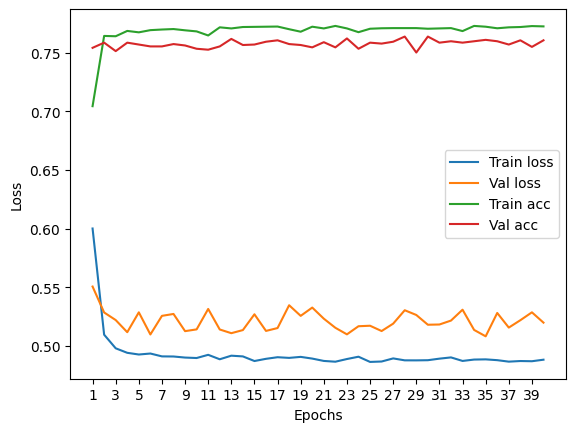

****************************************************************************************************



118it [00:00, 134.58it/s]


Train Epoch: 0 	Loss: 0.624192, Accuracy: 5094/7500 (68%)
Val Epoch: 0 	Loss: 0.529553, Accuracy: 1932/2500 (77%)



118it [00:00, 139.65it/s]


Train Epoch: 1 	Loss: 0.513476, Accuracy: 5718/7500 (76%)
Val Epoch: 1 	Loss: 0.493185, Accuracy: 1924/2500 (77%)



118it [00:00, 139.84it/s]


Train Epoch: 2 	Loss: 0.502458, Accuracy: 5718/7500 (76%)
Val Epoch: 2 	Loss: 0.492073, Accuracy: 1927/2500 (77%)



118it [00:01, 107.52it/s]


Train Epoch: 3 	Loss: 0.499272, Accuracy: 5760/7500 (77%)
Val Epoch: 3 	Loss: 0.497033, Accuracy: 1936/2500 (77%)



118it [00:01, 114.31it/s]


Train Epoch: 4 	Loss: 0.499732, Accuracy: 5755/7500 (77%)
Val Epoch: 4 	Loss: 0.501976, Accuracy: 1927/2500 (77%)



118it [00:00, 134.67it/s]


Train Epoch: 5 	Loss: 0.499532, Accuracy: 5741/7500 (77%)
Val Epoch: 5 	Loss: 0.490913, Accuracy: 1952/2500 (78%)



118it [00:00, 134.44it/s]


Train Epoch: 6 	Loss: 0.497654, Accuracy: 5766/7500 (77%)
Val Epoch: 6 	Loss: 0.498310, Accuracy: 1948/2500 (78%)



118it [00:00, 134.54it/s]


Train Epoch: 7 	Loss: 0.500240, Accuracy: 5763/7500 (77%)
Val Epoch: 7 	Loss: 0.485358, Accuracy: 1959/2500 (78%)



118it [00:00, 132.35it/s]


Train Epoch: 8 	Loss: 0.496884, Accuracy: 5754/7500 (77%)
Val Epoch: 8 	Loss: 0.496732, Accuracy: 1946/2500 (78%)



118it [00:00, 125.38it/s]


Train Epoch: 9 	Loss: 0.501400, Accuracy: 5755/7500 (77%)
Val Epoch: 9 	Loss: 0.490707, Accuracy: 1948/2500 (78%)



118it [00:00, 134.54it/s]


Train Epoch: 10 	Loss: 0.499037, Accuracy: 5779/7500 (77%)
Val Epoch: 10 	Loss: 0.492713, Accuracy: 1951/2500 (78%)



118it [00:00, 119.79it/s]


Train Epoch: 11 	Loss: 0.501165, Accuracy: 5735/7500 (76%)
Val Epoch: 11 	Loss: 0.507080, Accuracy: 1937/2500 (77%)



118it [00:00, 144.93it/s]


Train Epoch: 12 	Loss: 0.497187, Accuracy: 5762/7500 (77%)
Val Epoch: 12 	Loss: 0.488780, Accuracy: 1941/2500 (78%)



118it [00:00, 132.26it/s]


Train Epoch: 13 	Loss: 0.494672, Accuracy: 5794/7500 (77%)
Val Epoch: 13 	Loss: 0.496664, Accuracy: 1944/2500 (78%)



118it [00:00, 139.68it/s]


Train Epoch: 14 	Loss: 0.497388, Accuracy: 5763/7500 (77%)
Val Epoch: 14 	Loss: 0.493393, Accuracy: 1936/2500 (77%)



118it [00:00, 123.23it/s]


Train Epoch: 15 	Loss: 0.495249, Accuracy: 5758/7500 (77%)
Val Epoch: 15 	Loss: 0.498810, Accuracy: 1928/2500 (77%)



118it [00:00, 121.64it/s]


Train Epoch: 16 	Loss: 0.494325, Accuracy: 5767/7500 (77%)
Val Epoch: 16 	Loss: 0.489171, Accuracy: 1941/2500 (78%)



118it [00:00, 123.59it/s]


Train Epoch: 17 	Loss: 0.497089, Accuracy: 5783/7500 (77%)
Val Epoch: 17 	Loss: 0.485642, Accuracy: 1952/2500 (78%)



118it [00:00, 137.02it/s]


Train Epoch: 18 	Loss: 0.495791, Accuracy: 5766/7500 (77%)
Val Epoch: 18 	Loss: 0.497899, Accuracy: 1941/2500 (78%)



118it [00:00, 125.59it/s]


Train Epoch: 19 	Loss: 0.495379, Accuracy: 5793/7500 (77%)
Val Epoch: 19 	Loss: 0.507725, Accuracy: 1936/2500 (77%)



118it [00:00, 150.61it/s]


Train Epoch: 20 	Loss: 0.495832, Accuracy: 5785/7500 (77%)
Val Epoch: 20 	Loss: 0.488906, Accuracy: 1948/2500 (78%)



118it [00:01, 117.78it/s]


Train Epoch: 21 	Loss: 0.494393, Accuracy: 5797/7500 (77%)
Val Epoch: 21 	Loss: 0.496604, Accuracy: 1951/2500 (78%)



118it [00:00, 125.54it/s]


Train Epoch: 22 	Loss: 0.494728, Accuracy: 5797/7500 (77%)
Val Epoch: 22 	Loss: 0.489087, Accuracy: 1956/2500 (78%)



118it [00:00, 139.56it/s]


Train Epoch: 23 	Loss: 0.493088, Accuracy: 5809/7500 (77%)
Val Epoch: 23 	Loss: 0.489719, Accuracy: 1944/2500 (78%)



118it [00:00, 127.82it/s]


Train Epoch: 24 	Loss: 0.494493, Accuracy: 5801/7500 (77%)
Val Epoch: 24 	Loss: 0.487934, Accuracy: 1950/2500 (78%)



118it [00:00, 137.27it/s]


Train Epoch: 25 	Loss: 0.496228, Accuracy: 5784/7500 (77%)
Val Epoch: 25 	Loss: 0.496573, Accuracy: 1932/2500 (77%)



118it [00:00, 121.66it/s]


Train Epoch: 26 	Loss: 0.493904, Accuracy: 5785/7500 (77%)
Val Epoch: 26 	Loss: 0.493088, Accuracy: 1947/2500 (78%)



118it [00:00, 145.12it/s]


Train Epoch: 27 	Loss: 0.493617, Accuracy: 5804/7500 (77%)
Val Epoch: 27 	Loss: 0.495145, Accuracy: 1944/2500 (78%)



118it [00:00, 131.78it/s]


Train Epoch: 28 	Loss: 0.491807, Accuracy: 5790/7500 (77%)
Val Epoch: 28 	Loss: 0.491180, Accuracy: 1935/2500 (77%)



118it [00:00, 139.59it/s]


Train Epoch: 29 	Loss: 0.490826, Accuracy: 5809/7500 (77%)
Val Epoch: 29 	Loss: 0.501355, Accuracy: 1925/2500 (77%)



118it [00:00, 132.43it/s]


Train Epoch: 30 	Loss: 0.494052, Accuracy: 5801/7500 (77%)
Val Epoch: 30 	Loss: 0.485589, Accuracy: 1936/2500 (77%)



118it [00:00, 127.88it/s]


Train Epoch: 31 	Loss: 0.491358, Accuracy: 5794/7500 (77%)
Val Epoch: 31 	Loss: 0.487378, Accuracy: 1939/2500 (78%)



118it [00:00, 119.67it/s]


Train Epoch: 32 	Loss: 0.491535, Accuracy: 5801/7500 (77%)
Val Epoch: 32 	Loss: 0.494295, Accuracy: 1948/2500 (78%)



118it [00:00, 121.72it/s]


Train Epoch: 33 	Loss: 0.491076, Accuracy: 5816/7500 (78%)
Val Epoch: 33 	Loss: 0.485803, Accuracy: 1950/2500 (78%)



118it [00:00, 132.04it/s]


Train Epoch: 34 	Loss: 0.489753, Accuracy: 5817/7500 (78%)
Val Epoch: 34 	Loss: 0.492236, Accuracy: 1947/2500 (78%)



118it [00:00, 121.52it/s]


Train Epoch: 35 	Loss: 0.491883, Accuracy: 5811/7500 (77%)
Val Epoch: 35 	Loss: 0.496586, Accuracy: 1944/2500 (78%)



118it [00:00, 121.65it/s]


Train Epoch: 36 	Loss: 0.494462, Accuracy: 5792/7500 (77%)
Val Epoch: 36 	Loss: 0.493880, Accuracy: 1927/2500 (77%)



118it [00:00, 123.64it/s]


Train Epoch: 37 	Loss: 0.490294, Accuracy: 5809/7500 (77%)
Val Epoch: 37 	Loss: 0.493881, Accuracy: 1936/2500 (77%)



118it [00:00, 137.14it/s]


Train Epoch: 38 	Loss: 0.491144, Accuracy: 5800/7500 (77%)
Val Epoch: 38 	Loss: 0.498675, Accuracy: 1953/2500 (78%)



118it [00:01, 115.93it/s]


Train Epoch: 39 	Loss: 0.489603, Accuracy: 5808/7500 (77%)
Val Epoch: 39 	Loss: 0.487143, Accuracy: 1939/2500 (78%)

Test accuracy:  76.52


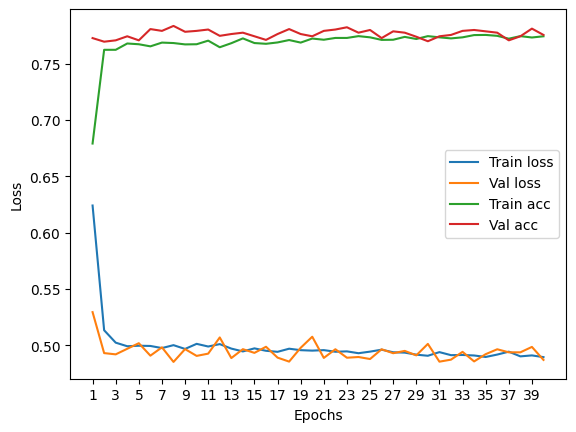

****************************************************************************************************



118it [00:00, 127.79it/s]


Train Epoch: 0 	Loss: 0.612623, Accuracy: 5140/7500 (69%)
Val Epoch: 0 	Loss: 0.529656, Accuracy: 1868/2500 (75%)



118it [00:01, 113.93it/s]


Train Epoch: 1 	Loss: 0.508596, Accuracy: 5747/7500 (77%)
Val Epoch: 1 	Loss: 0.519702, Accuracy: 1894/2500 (76%)



118it [00:01, 113.46it/s]


Train Epoch: 2 	Loss: 0.500368, Accuracy: 5763/7500 (77%)
Val Epoch: 2 	Loss: 0.521523, Accuracy: 1880/2500 (75%)



118it [00:00, 144.97it/s]


Train Epoch: 3 	Loss: 0.498872, Accuracy: 5791/7500 (77%)
Val Epoch: 3 	Loss: 0.516423, Accuracy: 1897/2500 (76%)



118it [00:00, 139.79it/s]


Train Epoch: 4 	Loss: 0.496726, Accuracy: 5763/7500 (77%)
Val Epoch: 4 	Loss: 0.507594, Accuracy: 1894/2500 (76%)



118it [00:00, 129.68it/s]


Train Epoch: 5 	Loss: 0.495840, Accuracy: 5761/7500 (77%)
Val Epoch: 5 	Loss: 0.510788, Accuracy: 1888/2500 (76%)



118it [00:00, 129.99it/s]


Train Epoch: 6 	Loss: 0.497130, Accuracy: 5775/7500 (77%)
Val Epoch: 6 	Loss: 0.515024, Accuracy: 1899/2500 (76%)



118it [00:00, 129.65it/s]


Train Epoch: 7 	Loss: 0.496182, Accuracy: 5769/7500 (77%)
Val Epoch: 7 	Loss: 0.516414, Accuracy: 1900/2500 (76%)



118it [00:00, 123.30it/s]


Train Epoch: 8 	Loss: 0.495086, Accuracy: 5767/7500 (77%)
Val Epoch: 8 	Loss: 0.522346, Accuracy: 1902/2500 (76%)



118it [00:01, 115.96it/s]


Train Epoch: 9 	Loss: 0.494570, Accuracy: 5770/7500 (77%)
Val Epoch: 9 	Loss: 0.501626, Accuracy: 1890/2500 (76%)



118it [00:00, 139.57it/s]


Train Epoch: 10 	Loss: 0.493662, Accuracy: 5759/7500 (77%)
Val Epoch: 10 	Loss: 0.521082, Accuracy: 1897/2500 (76%)



118it [00:00, 132.30it/s]


Train Epoch: 11 	Loss: 0.495103, Accuracy: 5773/7500 (77%)
Val Epoch: 11 	Loss: 0.514363, Accuracy: 1894/2500 (76%)



118it [00:00, 121.40it/s]


Train Epoch: 12 	Loss: 0.493814, Accuracy: 5797/7500 (77%)
Val Epoch: 12 	Loss: 0.517957, Accuracy: 1895/2500 (76%)



118it [00:00, 137.22it/s]


Train Epoch: 13 	Loss: 0.494247, Accuracy: 5762/7500 (77%)
Val Epoch: 13 	Loss: 0.521284, Accuracy: 1896/2500 (76%)



118it [00:00, 137.23it/s]


Train Epoch: 14 	Loss: 0.495489, Accuracy: 5778/7500 (77%)
Val Epoch: 14 	Loss: 0.502195, Accuracy: 1886/2500 (75%)



118it [00:00, 121.50it/s]


Train Epoch: 15 	Loss: 0.494057, Accuracy: 5773/7500 (77%)
Val Epoch: 15 	Loss: 0.516326, Accuracy: 1898/2500 (76%)



118it [00:00, 139.64it/s]


Train Epoch: 16 	Loss: 0.494322, Accuracy: 5758/7500 (77%)
Val Epoch: 16 	Loss: 0.510097, Accuracy: 1886/2500 (75%)



118it [00:00, 137.09it/s]


Train Epoch: 17 	Loss: 0.493147, Accuracy: 5760/7500 (77%)
Val Epoch: 17 	Loss: 0.503076, Accuracy: 1899/2500 (76%)



118it [00:00, 127.75it/s]


Train Epoch: 18 	Loss: 0.494313, Accuracy: 5795/7500 (77%)
Val Epoch: 18 	Loss: 0.522264, Accuracy: 1890/2500 (76%)



118it [00:00, 125.66it/s]


Train Epoch: 19 	Loss: 0.493459, Accuracy: 5773/7500 (77%)
Val Epoch: 19 	Loss: 0.501852, Accuracy: 1894/2500 (76%)



118it [00:00, 125.70it/s]


Train Epoch: 20 	Loss: 0.493886, Accuracy: 5772/7500 (77%)
Val Epoch: 20 	Loss: 0.515689, Accuracy: 1892/2500 (76%)



118it [00:00, 125.43it/s]


Train Epoch: 21 	Loss: 0.498466, Accuracy: 5773/7500 (77%)
Val Epoch: 21 	Loss: 0.518546, Accuracy: 1887/2500 (75%)



118it [00:00, 137.18it/s]


Train Epoch: 22 	Loss: 0.491989, Accuracy: 5785/7500 (77%)
Val Epoch: 22 	Loss: 0.504783, Accuracy: 1891/2500 (76%)



118it [00:00, 137.21it/s]


Train Epoch: 23 	Loss: 0.493150, Accuracy: 5762/7500 (77%)
Val Epoch: 23 	Loss: 0.521005, Accuracy: 1892/2500 (76%)



118it [00:00, 129.98it/s]


Train Epoch: 24 	Loss: 0.494184, Accuracy: 5789/7500 (77%)
Val Epoch: 24 	Loss: 0.517817, Accuracy: 1886/2500 (75%)



118it [00:00, 142.22it/s]


Train Epoch: 25 	Loss: 0.490146, Accuracy: 5772/7500 (77%)
Val Epoch: 25 	Loss: 0.503674, Accuracy: 1883/2500 (75%)



118it [00:00, 137.19it/s]


Train Epoch: 26 	Loss: 0.493445, Accuracy: 5793/7500 (77%)
Val Epoch: 26 	Loss: 0.509506, Accuracy: 1891/2500 (76%)



118it [00:00, 125.49it/s]


Train Epoch: 27 	Loss: 0.493855, Accuracy: 5782/7500 (77%)
Val Epoch: 27 	Loss: 0.533686, Accuracy: 1892/2500 (76%)



118it [00:00, 132.29it/s]


Train Epoch: 28 	Loss: 0.492408, Accuracy: 5767/7500 (77%)
Val Epoch: 28 	Loss: 0.518251, Accuracy: 1891/2500 (76%)



118it [00:01, 117.45it/s]


Train Epoch: 29 	Loss: 0.492702, Accuracy: 5799/7500 (77%)
Val Epoch: 29 	Loss: 0.513973, Accuracy: 1890/2500 (76%)



118it [00:00, 127.82it/s]


Train Epoch: 30 	Loss: 0.493608, Accuracy: 5785/7500 (77%)
Val Epoch: 30 	Loss: 0.503178, Accuracy: 1891/2500 (76%)



118it [00:00, 134.35it/s]


Train Epoch: 31 	Loss: 0.492345, Accuracy: 5778/7500 (77%)
Val Epoch: 31 	Loss: 0.506162, Accuracy: 1895/2500 (76%)



118it [00:00, 134.65it/s]


Train Epoch: 32 	Loss: 0.492869, Accuracy: 5778/7500 (77%)
Val Epoch: 32 	Loss: 0.500716, Accuracy: 1893/2500 (76%)



118it [00:00, 119.80it/s]


Train Epoch: 33 	Loss: 0.491509, Accuracy: 5800/7500 (77%)
Val Epoch: 33 	Loss: 0.510918, Accuracy: 1898/2500 (76%)



118it [00:00, 132.35it/s]


Train Epoch: 34 	Loss: 0.493716, Accuracy: 5784/7500 (77%)
Val Epoch: 34 	Loss: 0.511836, Accuracy: 1894/2500 (76%)



118it [00:01, 113.93it/s]


Train Epoch: 35 	Loss: 0.492241, Accuracy: 5788/7500 (77%)
Val Epoch: 35 	Loss: 0.520279, Accuracy: 1891/2500 (76%)



118it [00:00, 121.52it/s]


Train Epoch: 36 	Loss: 0.491087, Accuracy: 5778/7500 (77%)
Val Epoch: 36 	Loss: 0.510138, Accuracy: 1884/2500 (75%)



118it [00:01, 108.55it/s]


Train Epoch: 37 	Loss: 0.492597, Accuracy: 5789/7500 (77%)
Val Epoch: 37 	Loss: 0.516663, Accuracy: 1897/2500 (76%)



118it [00:01, 114.00it/s]


Train Epoch: 38 	Loss: 0.496181, Accuracy: 5768/7500 (77%)
Val Epoch: 38 	Loss: 0.505183, Accuracy: 1893/2500 (76%)



118it [00:01, 115.70it/s]


Train Epoch: 39 	Loss: 0.492119, Accuracy: 5791/7500 (77%)
Val Epoch: 39 	Loss: 0.502989, Accuracy: 1899/2500 (76%)

Test accuracy:  78.36


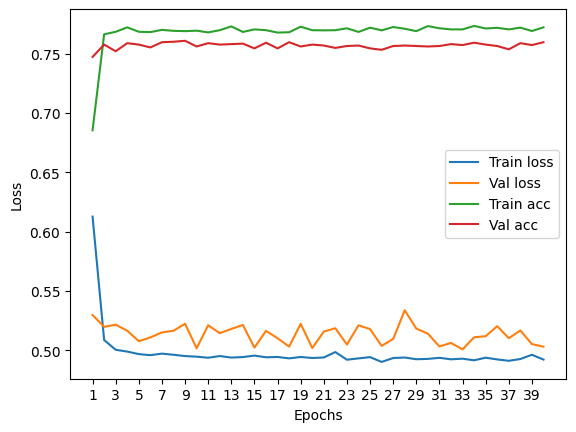

****************************************************************************************************



116it [00:00, 132.43it/s]


Train Epoch: 0 	Loss: 0.624630, Accuracy: 5176/7422 (70%)
Val Epoch: 0 	Loss: 0.543340, Accuracy: 1823/2474 (74%)



116it [00:00, 117.67it/s]


Train Epoch: 1 	Loss: 0.523323, Accuracy: 5561/7422 (75%)
Val Epoch: 1 	Loss: 0.514156, Accuracy: 1873/2474 (76%)



116it [00:00, 129.76it/s]


Train Epoch: 2 	Loss: 0.507222, Accuracy: 5602/7422 (75%)
Val Epoch: 2 	Loss: 0.509848, Accuracy: 1883/2474 (76%)



116it [00:00, 126.92it/s]


Train Epoch: 3 	Loss: 0.503430, Accuracy: 5616/7422 (76%)
Val Epoch: 3 	Loss: 0.507160, Accuracy: 1884/2474 (76%)



116it [00:00, 129.63it/s]


Train Epoch: 4 	Loss: 0.499093, Accuracy: 5631/7422 (76%)
Val Epoch: 4 	Loss: 0.507771, Accuracy: 1875/2474 (76%)



116it [00:00, 142.79it/s]


Train Epoch: 5 	Loss: 0.498619, Accuracy: 5632/7422 (76%)
Val Epoch: 5 	Loss: 0.507991, Accuracy: 1877/2474 (76%)



116it [00:00, 145.78it/s]


Train Epoch: 6 	Loss: 0.498130, Accuracy: 5653/7422 (76%)
Val Epoch: 6 	Loss: 0.504575, Accuracy: 1893/2474 (77%)



116it [00:00, 137.28it/s]


Train Epoch: 7 	Loss: 0.497154, Accuracy: 5657/7422 (76%)
Val Epoch: 7 	Loss: 0.505175, Accuracy: 1890/2474 (76%)



116it [00:00, 127.97it/s]


Train Epoch: 8 	Loss: 0.496987, Accuracy: 5662/7422 (76%)
Val Epoch: 8 	Loss: 0.502452, Accuracy: 1886/2474 (76%)



116it [00:00, 132.31it/s]


Train Epoch: 9 	Loss: 0.496877, Accuracy: 5644/7422 (76%)
Val Epoch: 9 	Loss: 0.508101, Accuracy: 1891/2474 (76%)



116it [00:00, 123.53it/s]


Train Epoch: 10 	Loss: 0.496135, Accuracy: 5653/7422 (76%)
Val Epoch: 10 	Loss: 0.501063, Accuracy: 1888/2474 (76%)



116it [00:00, 125.74it/s]


Train Epoch: 11 	Loss: 0.494777, Accuracy: 5659/7422 (76%)
Val Epoch: 11 	Loss: 0.506746, Accuracy: 1896/2474 (77%)



116it [00:00, 137.33it/s]


Train Epoch: 12 	Loss: 0.494250, Accuracy: 5646/7422 (76%)
Val Epoch: 12 	Loss: 0.508226, Accuracy: 1894/2474 (77%)



116it [00:00, 137.14it/s]


Train Epoch: 13 	Loss: 0.495395, Accuracy: 5660/7422 (76%)
Val Epoch: 13 	Loss: 0.500587, Accuracy: 1888/2474 (76%)



116it [00:00, 132.36it/s]


Train Epoch: 14 	Loss: 0.494572, Accuracy: 5661/7422 (76%)
Val Epoch: 14 	Loss: 0.502020, Accuracy: 1883/2474 (76%)



116it [00:00, 142.63it/s]


Train Epoch: 15 	Loss: 0.492731, Accuracy: 5673/7422 (76%)
Val Epoch: 15 	Loss: 0.504133, Accuracy: 1904/2474 (77%)



116it [00:00, 119.51it/s]


Train Epoch: 16 	Loss: 0.492573, Accuracy: 5689/7422 (77%)
Val Epoch: 16 	Loss: 0.502626, Accuracy: 1902/2474 (77%)



116it [00:00, 144.73it/s]


Train Epoch: 17 	Loss: 0.493287, Accuracy: 5653/7422 (76%)
Val Epoch: 17 	Loss: 0.502050, Accuracy: 1889/2474 (76%)



116it [00:00, 123.31it/s]


Train Epoch: 18 	Loss: 0.491633, Accuracy: 5673/7422 (76%)
Val Epoch: 18 	Loss: 0.502836, Accuracy: 1906/2474 (77%)



116it [00:00, 129.94it/s]


Train Epoch: 19 	Loss: 0.492324, Accuracy: 5648/7422 (76%)
Val Epoch: 19 	Loss: 0.501934, Accuracy: 1904/2474 (77%)



116it [00:00, 132.26it/s]


Train Epoch: 20 	Loss: 0.491330, Accuracy: 5689/7422 (77%)
Val Epoch: 20 	Loss: 0.501707, Accuracy: 1902/2474 (77%)



116it [00:00, 134.96it/s]


Train Epoch: 21 	Loss: 0.489807, Accuracy: 5691/7422 (77%)
Val Epoch: 21 	Loss: 0.499391, Accuracy: 1906/2474 (77%)



116it [00:00, 121.39it/s]


Train Epoch: 22 	Loss: 0.491384, Accuracy: 5691/7422 (77%)
Val Epoch: 22 	Loss: 0.502453, Accuracy: 1915/2474 (77%)



116it [00:00, 118.28it/s]


Train Epoch: 23 	Loss: 0.490370, Accuracy: 5694/7422 (77%)
Val Epoch: 23 	Loss: 0.500407, Accuracy: 1898/2474 (77%)



116it [00:00, 132.50it/s]


Train Epoch: 24 	Loss: 0.490056, Accuracy: 5674/7422 (76%)
Val Epoch: 24 	Loss: 0.496508, Accuracy: 1899/2474 (77%)



116it [00:00, 125.30it/s]


Train Epoch: 25 	Loss: 0.489775, Accuracy: 5706/7422 (77%)
Val Epoch: 25 	Loss: 0.499219, Accuracy: 1890/2474 (76%)



116it [00:00, 139.83it/s]


Train Epoch: 26 	Loss: 0.488105, Accuracy: 5709/7422 (77%)
Val Epoch: 26 	Loss: 0.513684, Accuracy: 1904/2474 (77%)



116it [00:00, 127.83it/s]


Train Epoch: 27 	Loss: 0.490826, Accuracy: 5670/7422 (76%)
Val Epoch: 27 	Loss: 0.499070, Accuracy: 1910/2474 (77%)



116it [00:00, 132.30it/s]


Train Epoch: 28 	Loss: 0.489964, Accuracy: 5678/7422 (77%)
Val Epoch: 28 	Loss: 0.499838, Accuracy: 1895/2474 (77%)



116it [00:00, 134.93it/s]


Train Epoch: 29 	Loss: 0.488050, Accuracy: 5691/7422 (77%)
Val Epoch: 29 	Loss: 0.503811, Accuracy: 1910/2474 (77%)



116it [00:00, 137.22it/s]


Train Epoch: 30 	Loss: 0.489099, Accuracy: 5704/7422 (77%)
Val Epoch: 30 	Loss: 0.503689, Accuracy: 1900/2474 (77%)



116it [00:00, 122.94it/s]


Train Epoch: 31 	Loss: 0.487657, Accuracy: 5690/7422 (77%)
Val Epoch: 31 	Loss: 0.495235, Accuracy: 1895/2474 (77%)



116it [00:01, 110.15it/s]


Train Epoch: 32 	Loss: 0.488537, Accuracy: 5697/7422 (77%)
Val Epoch: 32 	Loss: 0.501195, Accuracy: 1912/2474 (77%)



116it [00:00, 145.17it/s]


Train Epoch: 33 	Loss: 0.487606, Accuracy: 5720/7422 (77%)
Val Epoch: 33 	Loss: 0.499346, Accuracy: 1890/2474 (76%)



116it [00:00, 137.17it/s]


Train Epoch: 34 	Loss: 0.487173, Accuracy: 5714/7422 (77%)
Val Epoch: 34 	Loss: 0.499162, Accuracy: 1896/2474 (77%)



116it [00:00, 119.59it/s]


Train Epoch: 35 	Loss: 0.487699, Accuracy: 5699/7422 (77%)
Val Epoch: 35 	Loss: 0.498043, Accuracy: 1910/2474 (77%)



116it [00:00, 132.28it/s]


Train Epoch: 36 	Loss: 0.487463, Accuracy: 5713/7422 (77%)
Val Epoch: 36 	Loss: 0.497687, Accuracy: 1890/2474 (76%)



116it [00:00, 117.67it/s]


Train Epoch: 37 	Loss: 0.487066, Accuracy: 5693/7422 (77%)
Val Epoch: 37 	Loss: 0.496883, Accuracy: 1909/2474 (77%)



116it [00:01, 112.24it/s]


Train Epoch: 38 	Loss: 0.486830, Accuracy: 5703/7422 (77%)
Val Epoch: 38 	Loss: 0.496984, Accuracy: 1904/2474 (77%)



116it [00:01, 110.63it/s]


Train Epoch: 39 	Loss: 0.486174, Accuracy: 5704/7422 (77%)
Val Epoch: 39 	Loss: 0.497703, Accuracy: 1912/2474 (77%)

Test accuracy:  78.13257881972514


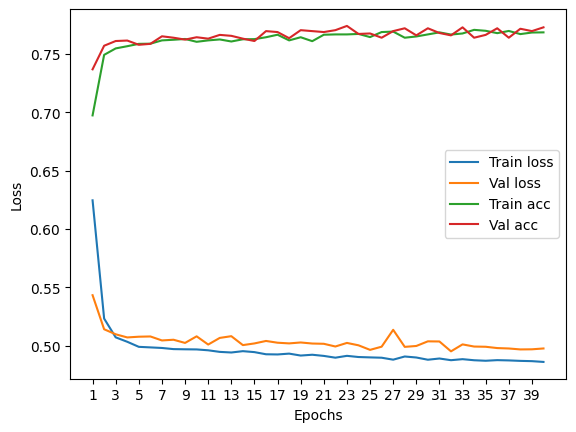

****************************************************************************************************



Particles per jet: 7


118it [00:00, 139.80it/s]


Train Epoch: 0 	Loss: 0.604346, Accuracy: 5163/7500 (69%)
Val Epoch: 0 	Loss: 0.504681, Accuracy: 1911/2500 (76%)



118it [00:00, 127.67it/s]


Train Epoch: 1 	Loss: 0.502532, Accuracy: 5748/7500 (77%)
Val Epoch: 1 	Loss: 0.492960, Accuracy: 1936/2500 (77%)



118it [00:00, 132.24it/s]


Train Epoch: 2 	Loss: 0.493656, Accuracy: 5754/7500 (77%)
Val Epoch: 2 	Loss: 0.485058, Accuracy: 1944/2500 (78%)



118it [00:00, 129.56it/s]


Train Epoch: 3 	Loss: 0.493816, Accuracy: 5751/7500 (77%)
Val Epoch: 3 	Loss: 0.486312, Accuracy: 1942/2500 (78%)



118it [00:00, 129.86it/s]


Train Epoch: 4 	Loss: 0.489021, Accuracy: 5780/7500 (77%)
Val Epoch: 4 	Loss: 0.489222, Accuracy: 1944/2500 (78%)



118it [00:00, 123.54it/s]


Train Epoch: 5 	Loss: 0.487093, Accuracy: 5803/7500 (77%)
Val Epoch: 5 	Loss: 0.490679, Accuracy: 1949/2500 (78%)



118it [00:00, 134.61it/s]


Train Epoch: 6 	Loss: 0.488021, Accuracy: 5789/7500 (77%)
Val Epoch: 6 	Loss: 0.481170, Accuracy: 1956/2500 (78%)



118it [00:00, 125.88it/s]


Train Epoch: 7 	Loss: 0.490149, Accuracy: 5796/7500 (77%)
Val Epoch: 7 	Loss: 0.492941, Accuracy: 1931/2500 (77%)



118it [00:00, 150.83it/s]


Train Epoch: 8 	Loss: 0.488892, Accuracy: 5774/7500 (77%)
Val Epoch: 8 	Loss: 0.482028, Accuracy: 1944/2500 (78%)



118it [00:00, 121.70it/s]


Train Epoch: 9 	Loss: 0.490141, Accuracy: 5790/7500 (77%)
Val Epoch: 9 	Loss: 0.488404, Accuracy: 1941/2500 (78%)



118it [00:00, 137.04it/s]


Train Epoch: 10 	Loss: 0.487743, Accuracy: 5794/7500 (77%)
Val Epoch: 10 	Loss: 0.502872, Accuracy: 1948/2500 (78%)



118it [00:00, 132.32it/s]


Train Epoch: 11 	Loss: 0.487012, Accuracy: 5788/7500 (77%)
Val Epoch: 11 	Loss: 0.485216, Accuracy: 1944/2500 (78%)



118it [00:00, 139.70it/s]


Train Epoch: 12 	Loss: 0.486217, Accuracy: 5779/7500 (77%)
Val Epoch: 12 	Loss: 0.506726, Accuracy: 1940/2500 (78%)



118it [00:00, 142.40it/s]


Train Epoch: 13 	Loss: 0.489384, Accuracy: 5768/7500 (77%)
Val Epoch: 13 	Loss: 0.482819, Accuracy: 1952/2500 (78%)



118it [00:00, 121.59it/s]


Train Epoch: 14 	Loss: 0.486881, Accuracy: 5791/7500 (77%)
Val Epoch: 14 	Loss: 0.492279, Accuracy: 1941/2500 (78%)



118it [00:01, 110.90it/s]


Train Epoch: 15 	Loss: 0.487112, Accuracy: 5786/7500 (77%)
Val Epoch: 15 	Loss: 0.483541, Accuracy: 1950/2500 (78%)



118it [00:01, 115.79it/s]


Train Epoch: 16 	Loss: 0.489536, Accuracy: 5786/7500 (77%)
Val Epoch: 16 	Loss: 0.484245, Accuracy: 1953/2500 (78%)



118it [00:00, 136.98it/s]


Train Epoch: 17 	Loss: 0.486780, Accuracy: 5764/7500 (77%)
Val Epoch: 17 	Loss: 0.481970, Accuracy: 1954/2500 (78%)



118it [00:00, 127.92it/s]


Train Epoch: 18 	Loss: 0.486489, Accuracy: 5789/7500 (77%)
Val Epoch: 18 	Loss: 0.489041, Accuracy: 1940/2500 (78%)



118it [00:00, 130.12it/s]


Train Epoch: 19 	Loss: 0.486670, Accuracy: 5768/7500 (77%)
Val Epoch: 19 	Loss: 0.506861, Accuracy: 1945/2500 (78%)



118it [00:00, 127.69it/s]


Train Epoch: 20 	Loss: 0.484336, Accuracy: 5795/7500 (77%)
Val Epoch: 20 	Loss: 0.487630, Accuracy: 1943/2500 (78%)



118it [00:00, 134.76it/s]


Train Epoch: 21 	Loss: 0.487094, Accuracy: 5782/7500 (77%)
Val Epoch: 21 	Loss: 0.491062, Accuracy: 1946/2500 (78%)



118it [00:00, 125.63it/s]


Train Epoch: 22 	Loss: 0.486871, Accuracy: 5781/7500 (77%)
Val Epoch: 22 	Loss: 0.479378, Accuracy: 1956/2500 (78%)



118it [00:00, 150.96it/s]


Train Epoch: 23 	Loss: 0.485761, Accuracy: 5796/7500 (77%)
Val Epoch: 23 	Loss: 0.480902, Accuracy: 1962/2500 (78%)



118it [00:00, 139.70it/s]


Train Epoch: 24 	Loss: 0.485836, Accuracy: 5800/7500 (77%)
Val Epoch: 24 	Loss: 0.478154, Accuracy: 1956/2500 (78%)



118it [00:00, 145.15it/s]


Train Epoch: 25 	Loss: 0.488732, Accuracy: 5752/7500 (77%)
Val Epoch: 25 	Loss: 0.492322, Accuracy: 1948/2500 (78%)



118it [00:01, 103.20it/s]


Train Epoch: 26 	Loss: 0.487177, Accuracy: 5787/7500 (77%)
Val Epoch: 26 	Loss: 0.493111, Accuracy: 1918/2500 (77%)



118it [00:01, 114.22it/s]


Train Epoch: 27 	Loss: 0.485875, Accuracy: 5781/7500 (77%)
Val Epoch: 27 	Loss: 0.483065, Accuracy: 1956/2500 (78%)



118it [00:00, 130.14it/s]


Train Epoch: 28 	Loss: 0.483769, Accuracy: 5790/7500 (77%)
Val Epoch: 28 	Loss: 0.492923, Accuracy: 1950/2500 (78%)



118it [00:01, 104.18it/s]


Train Epoch: 29 	Loss: 0.483713, Accuracy: 5811/7500 (77%)
Val Epoch: 29 	Loss: 0.495555, Accuracy: 1959/2500 (78%)



118it [00:00, 131.68it/s]


Train Epoch: 30 	Loss: 0.483888, Accuracy: 5794/7500 (77%)
Val Epoch: 30 	Loss: 0.481928, Accuracy: 1957/2500 (78%)



118it [00:01, 103.38it/s]


Train Epoch: 31 	Loss: 0.482655, Accuracy: 5795/7500 (77%)
Val Epoch: 31 	Loss: 0.477462, Accuracy: 1966/2500 (79%)



118it [00:01, 115.77it/s]


Train Epoch: 32 	Loss: 0.483215, Accuracy: 5809/7500 (77%)
Val Epoch: 32 	Loss: 0.497318, Accuracy: 1940/2500 (78%)



118it [00:01, 117.92it/s]


Train Epoch: 33 	Loss: 0.487249, Accuracy: 5767/7500 (77%)
Val Epoch: 33 	Loss: 0.480018, Accuracy: 1961/2500 (78%)



118it [00:00, 119.63it/s]


Train Epoch: 34 	Loss: 0.485366, Accuracy: 5806/7500 (77%)
Val Epoch: 34 	Loss: 0.476547, Accuracy: 1966/2500 (79%)



118it [00:00, 136.74it/s]


Train Epoch: 35 	Loss: 0.482866, Accuracy: 5798/7500 (77%)
Val Epoch: 35 	Loss: 0.494104, Accuracy: 1956/2500 (78%)



118it [00:01, 116.02it/s]


Train Epoch: 36 	Loss: 0.485441, Accuracy: 5754/7500 (77%)
Val Epoch: 36 	Loss: 0.493802, Accuracy: 1946/2500 (78%)



118it [00:01, 117.56it/s]


Train Epoch: 37 	Loss: 0.483457, Accuracy: 5800/7500 (77%)
Val Epoch: 37 	Loss: 0.475476, Accuracy: 1960/2500 (78%)



118it [00:00, 129.81it/s]


Train Epoch: 38 	Loss: 0.485650, Accuracy: 5805/7500 (77%)
Val Epoch: 38 	Loss: 0.481912, Accuracy: 1969/2500 (79%)



118it [00:00, 127.41it/s]


Train Epoch: 39 	Loss: 0.484746, Accuracy: 5776/7500 (77%)
Val Epoch: 39 	Loss: 0.499967, Accuracy: 1938/2500 (78%)

Test accuracy:  77.12


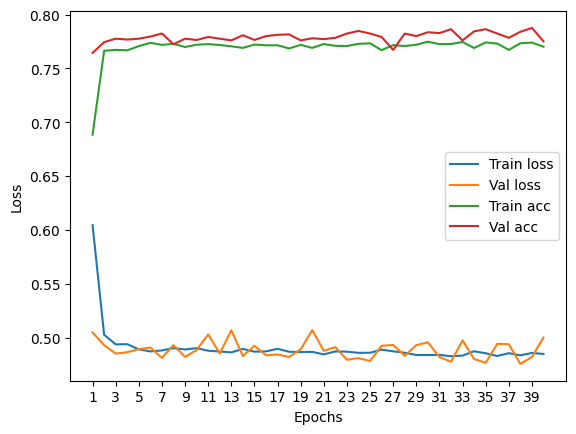

****************************************************************************************************



118it [00:00, 137.17it/s]


Train Epoch: 0 	Loss: 0.628439, Accuracy: 5273/7500 (70%)
Val Epoch: 0 	Loss: 0.536377, Accuracy: 1926/2500 (77%)



118it [00:00, 136.99it/s]


Train Epoch: 1 	Loss: 0.515572, Accuracy: 5682/7500 (76%)
Val Epoch: 1 	Loss: 0.501709, Accuracy: 1930/2500 (77%)



118it [00:00, 127.61it/s]


Train Epoch: 2 	Loss: 0.504057, Accuracy: 5674/7500 (76%)
Val Epoch: 2 	Loss: 0.502401, Accuracy: 1935/2500 (77%)



118it [00:00, 130.16it/s]


Train Epoch: 3 	Loss: 0.501244, Accuracy: 5731/7500 (76%)
Val Epoch: 3 	Loss: 0.495873, Accuracy: 1919/2500 (77%)



118it [00:00, 150.94it/s]


Train Epoch: 4 	Loss: 0.498148, Accuracy: 5729/7500 (76%)
Val Epoch: 4 	Loss: 0.489180, Accuracy: 1930/2500 (77%)



118it [00:00, 127.84it/s]


Train Epoch: 5 	Loss: 0.495701, Accuracy: 5735/7500 (76%)
Val Epoch: 5 	Loss: 0.511310, Accuracy: 1929/2500 (77%)



118it [00:00, 119.74it/s]


Train Epoch: 6 	Loss: 0.494158, Accuracy: 5737/7500 (76%)
Val Epoch: 6 	Loss: 0.483637, Accuracy: 1923/2500 (77%)



118it [00:00, 134.59it/s]


Train Epoch: 7 	Loss: 0.495339, Accuracy: 5750/7500 (77%)
Val Epoch: 7 	Loss: 0.495383, Accuracy: 1935/2500 (77%)



118it [00:01, 112.54it/s]


Train Epoch: 8 	Loss: 0.491654, Accuracy: 5759/7500 (77%)
Val Epoch: 8 	Loss: 0.481968, Accuracy: 1935/2500 (77%)



118it [00:01, 110.64it/s]


Train Epoch: 9 	Loss: 0.491828, Accuracy: 5777/7500 (77%)
Val Epoch: 9 	Loss: 0.490766, Accuracy: 1935/2500 (77%)



118it [00:00, 132.27it/s]


Train Epoch: 10 	Loss: 0.494338, Accuracy: 5739/7500 (77%)
Val Epoch: 10 	Loss: 0.498491, Accuracy: 1927/2500 (77%)



118it [00:00, 129.95it/s]


Train Epoch: 11 	Loss: 0.492824, Accuracy: 5759/7500 (77%)
Val Epoch: 11 	Loss: 0.487394, Accuracy: 1926/2500 (77%)



118it [00:00, 121.64it/s]


Train Epoch: 12 	Loss: 0.493537, Accuracy: 5748/7500 (77%)
Val Epoch: 12 	Loss: 0.488531, Accuracy: 1925/2500 (77%)



118it [00:00, 119.71it/s]


Train Epoch: 13 	Loss: 0.493206, Accuracy: 5761/7500 (77%)
Val Epoch: 13 	Loss: 0.482584, Accuracy: 1940/2500 (78%)



118it [00:00, 127.90it/s]


Train Epoch: 14 	Loss: 0.489999, Accuracy: 5767/7500 (77%)
Val Epoch: 14 	Loss: 0.483260, Accuracy: 1945/2500 (78%)



118it [00:00, 129.19it/s]


Train Epoch: 15 	Loss: 0.489172, Accuracy: 5796/7500 (77%)
Val Epoch: 15 	Loss: 0.486248, Accuracy: 1928/2500 (77%)



118it [00:00, 134.58it/s]


Train Epoch: 16 	Loss: 0.490330, Accuracy: 5751/7500 (77%)
Val Epoch: 16 	Loss: 0.496980, Accuracy: 1943/2500 (78%)



118it [00:00, 137.14it/s]


Train Epoch: 17 	Loss: 0.490105, Accuracy: 5767/7500 (77%)
Val Epoch: 17 	Loss: 0.482967, Accuracy: 1933/2500 (77%)



118it [00:01, 117.77it/s]


Train Epoch: 18 	Loss: 0.490590, Accuracy: 5775/7500 (77%)
Val Epoch: 18 	Loss: 0.492748, Accuracy: 1932/2500 (77%)



118it [00:00, 137.16it/s]


Train Epoch: 19 	Loss: 0.488924, Accuracy: 5776/7500 (77%)
Val Epoch: 19 	Loss: 0.485424, Accuracy: 1940/2500 (78%)



118it [00:00, 125.81it/s]


Train Epoch: 20 	Loss: 0.489131, Accuracy: 5772/7500 (77%)
Val Epoch: 20 	Loss: 0.486377, Accuracy: 1944/2500 (78%)



118it [00:00, 125.53it/s]


Train Epoch: 21 	Loss: 0.490332, Accuracy: 5781/7500 (77%)
Val Epoch: 21 	Loss: 0.492372, Accuracy: 1933/2500 (77%)



118it [00:01, 110.80it/s]


Train Epoch: 22 	Loss: 0.487953, Accuracy: 5782/7500 (77%)
Val Epoch: 22 	Loss: 0.500718, Accuracy: 1943/2500 (78%)



118it [00:00, 132.25it/s]


Train Epoch: 23 	Loss: 0.487988, Accuracy: 5771/7500 (77%)
Val Epoch: 23 	Loss: 0.491464, Accuracy: 1943/2500 (78%)



118it [00:01, 108.96it/s]


Train Epoch: 24 	Loss: 0.487826, Accuracy: 5776/7500 (77%)
Val Epoch: 24 	Loss: 0.485527, Accuracy: 1944/2500 (78%)



118it [00:01, 109.12it/s]


Train Epoch: 25 	Loss: 0.488005, Accuracy: 5781/7500 (77%)
Val Epoch: 25 	Loss: 0.504411, Accuracy: 1934/2500 (77%)



118it [00:00, 145.18it/s]


Train Epoch: 26 	Loss: 0.489606, Accuracy: 5760/7500 (77%)
Val Epoch: 26 	Loss: 0.488836, Accuracy: 1954/2500 (78%)



118it [00:00, 132.24it/s]


Train Epoch: 27 	Loss: 0.488841, Accuracy: 5786/7500 (77%)
Val Epoch: 27 	Loss: 0.501599, Accuracy: 1936/2500 (77%)



118it [00:00, 139.72it/s]


Train Epoch: 28 	Loss: 0.490290, Accuracy: 5778/7500 (77%)
Val Epoch: 28 	Loss: 0.489113, Accuracy: 1926/2500 (77%)



118it [00:00, 142.43it/s]


Train Epoch: 29 	Loss: 0.488220, Accuracy: 5783/7500 (77%)
Val Epoch: 29 	Loss: 0.487103, Accuracy: 1929/2500 (77%)



118it [00:00, 130.16it/s]


Train Epoch: 30 	Loss: 0.490551, Accuracy: 5757/7500 (77%)
Val Epoch: 30 	Loss: 0.509717, Accuracy: 1928/2500 (77%)



118it [00:00, 132.03it/s]


Train Epoch: 31 	Loss: 0.488319, Accuracy: 5784/7500 (77%)
Val Epoch: 31 	Loss: 0.486689, Accuracy: 1932/2500 (77%)



118it [00:01, 117.77it/s]


Train Epoch: 32 	Loss: 0.489818, Accuracy: 5774/7500 (77%)
Val Epoch: 32 	Loss: 0.486448, Accuracy: 1943/2500 (78%)



118it [00:00, 134.64it/s]


Train Epoch: 33 	Loss: 0.487222, Accuracy: 5782/7500 (77%)
Val Epoch: 33 	Loss: 0.489621, Accuracy: 1926/2500 (77%)



118it [00:00, 125.38it/s]


Train Epoch: 34 	Loss: 0.489228, Accuracy: 5765/7500 (77%)
Val Epoch: 34 	Loss: 0.484073, Accuracy: 1927/2500 (77%)



118it [00:00, 137.01it/s]


Train Epoch: 35 	Loss: 0.488288, Accuracy: 5774/7500 (77%)
Val Epoch: 35 	Loss: 0.489087, Accuracy: 1946/2500 (78%)



118it [00:00, 130.08it/s]


Train Epoch: 36 	Loss: 0.486823, Accuracy: 5781/7500 (77%)
Val Epoch: 36 	Loss: 0.498245, Accuracy: 1938/2500 (78%)



118it [00:00, 132.43it/s]


Train Epoch: 37 	Loss: 0.489584, Accuracy: 5760/7500 (77%)
Val Epoch: 37 	Loss: 0.503749, Accuracy: 1933/2500 (77%)



118it [00:00, 125.79it/s]


Train Epoch: 38 	Loss: 0.488693, Accuracy: 5791/7500 (77%)
Val Epoch: 38 	Loss: 0.508373, Accuracy: 1942/2500 (78%)



118it [00:00, 134.61it/s]


Train Epoch: 39 	Loss: 0.490489, Accuracy: 5772/7500 (77%)
Val Epoch: 39 	Loss: 0.495365, Accuracy: 1924/2500 (77%)

Test accuracy:  75.8


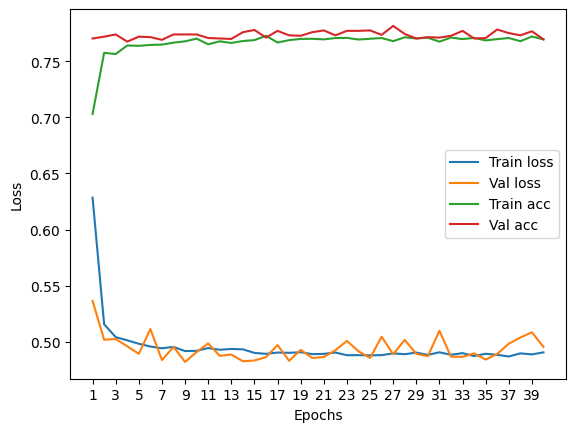

****************************************************************************************************



118it [00:00, 125.75it/s]


Train Epoch: 0 	Loss: 0.609739, Accuracy: 5242/7500 (70%)
Val Epoch: 0 	Loss: 0.527041, Accuracy: 1904/2500 (76%)



118it [00:00, 134.04it/s]


Train Epoch: 1 	Loss: 0.500935, Accuracy: 5710/7500 (76%)
Val Epoch: 1 	Loss: 0.516608, Accuracy: 1914/2500 (77%)



118it [00:00, 137.22it/s]


Train Epoch: 2 	Loss: 0.491183, Accuracy: 5746/7500 (77%)
Val Epoch: 2 	Loss: 0.506421, Accuracy: 1895/2500 (76%)



118it [00:00, 132.31it/s]


Train Epoch: 3 	Loss: 0.489536, Accuracy: 5772/7500 (77%)
Val Epoch: 3 	Loss: 0.520869, Accuracy: 1892/2500 (76%)



118it [00:00, 119.68it/s]


Train Epoch: 4 	Loss: 0.487577, Accuracy: 5794/7500 (77%)
Val Epoch: 4 	Loss: 0.506580, Accuracy: 1913/2500 (77%)



118it [00:00, 127.47it/s]


Train Epoch: 5 	Loss: 0.484475, Accuracy: 5805/7500 (77%)
Val Epoch: 5 	Loss: 0.500190, Accuracy: 1921/2500 (77%)



118it [00:00, 121.44it/s]


Train Epoch: 6 	Loss: 0.485822, Accuracy: 5782/7500 (77%)
Val Epoch: 6 	Loss: 0.505297, Accuracy: 1955/2500 (78%)



118it [00:00, 130.07it/s]


Train Epoch: 7 	Loss: 0.485034, Accuracy: 5810/7500 (77%)
Val Epoch: 7 	Loss: 0.507516, Accuracy: 1947/2500 (78%)



118it [00:00, 132.12it/s]


Train Epoch: 8 	Loss: 0.482790, Accuracy: 5823/7500 (78%)
Val Epoch: 8 	Loss: 0.505852, Accuracy: 1913/2500 (77%)



118it [00:00, 125.61it/s]


Train Epoch: 9 	Loss: 0.483156, Accuracy: 5819/7500 (78%)
Val Epoch: 9 	Loss: 0.504508, Accuracy: 1941/2500 (78%)



118it [00:00, 121.59it/s]


Train Epoch: 10 	Loss: 0.479862, Accuracy: 5812/7500 (77%)
Val Epoch: 10 	Loss: 0.516290, Accuracy: 1941/2500 (78%)



118it [00:00, 139.61it/s]


Train Epoch: 11 	Loss: 0.480042, Accuracy: 5825/7500 (78%)
Val Epoch: 11 	Loss: 0.509729, Accuracy: 1930/2500 (77%)



118it [00:00, 129.91it/s]


Train Epoch: 12 	Loss: 0.482934, Accuracy: 5819/7500 (78%)
Val Epoch: 12 	Loss: 0.506442, Accuracy: 1921/2500 (77%)



118it [00:00, 132.29it/s]


Train Epoch: 13 	Loss: 0.481813, Accuracy: 5814/7500 (78%)
Val Epoch: 13 	Loss: 0.506987, Accuracy: 1945/2500 (78%)



118it [00:00, 134.56it/s]


Train Epoch: 14 	Loss: 0.482602, Accuracy: 5831/7500 (78%)
Val Epoch: 14 	Loss: 0.505859, Accuracy: 1926/2500 (77%)



118it [00:00, 132.14it/s]


Train Epoch: 15 	Loss: 0.480606, Accuracy: 5831/7500 (78%)
Val Epoch: 15 	Loss: 0.493174, Accuracy: 1929/2500 (77%)



118it [00:00, 119.76it/s]


Train Epoch: 16 	Loss: 0.481443, Accuracy: 5833/7500 (78%)
Val Epoch: 16 	Loss: 0.490729, Accuracy: 1942/2500 (78%)



118it [00:00, 125.70it/s]


Train Epoch: 17 	Loss: 0.479499, Accuracy: 5817/7500 (78%)
Val Epoch: 17 	Loss: 0.500571, Accuracy: 1937/2500 (77%)



118it [00:00, 132.49it/s]


Train Epoch: 18 	Loss: 0.480493, Accuracy: 5815/7500 (78%)
Val Epoch: 18 	Loss: 0.496491, Accuracy: 1932/2500 (77%)



118it [00:01, 103.18it/s]


Train Epoch: 19 	Loss: 0.478739, Accuracy: 5830/7500 (78%)
Val Epoch: 19 	Loss: 0.503527, Accuracy: 1931/2500 (77%)



118it [00:00, 119.63it/s]


Train Epoch: 20 	Loss: 0.478994, Accuracy: 5825/7500 (78%)
Val Epoch: 20 	Loss: 0.493028, Accuracy: 1938/2500 (78%)



118it [00:00, 129.80it/s]


Train Epoch: 21 	Loss: 0.480164, Accuracy: 5812/7500 (77%)
Val Epoch: 21 	Loss: 0.519818, Accuracy: 1927/2500 (77%)



118it [00:01, 107.33it/s]


Train Epoch: 22 	Loss: 0.479651, Accuracy: 5846/7500 (78%)
Val Epoch: 22 	Loss: 0.496359, Accuracy: 1936/2500 (77%)



118it [00:01, 112.46it/s]


Train Epoch: 23 	Loss: 0.480708, Accuracy: 5845/7500 (78%)
Val Epoch: 23 	Loss: 0.491158, Accuracy: 1948/2500 (78%)



118it [00:00, 125.59it/s]


Train Epoch: 24 	Loss: 0.479338, Accuracy: 5839/7500 (78%)
Val Epoch: 24 	Loss: 0.498845, Accuracy: 1942/2500 (78%)



118it [00:00, 123.59it/s]


Train Epoch: 25 	Loss: 0.478917, Accuracy: 5855/7500 (78%)
Val Epoch: 25 	Loss: 0.506468, Accuracy: 1926/2500 (77%)



118it [00:00, 134.56it/s]


Train Epoch: 26 	Loss: 0.478636, Accuracy: 5823/7500 (78%)
Val Epoch: 26 	Loss: 0.498203, Accuracy: 1939/2500 (78%)



118it [00:00, 122.79it/s]


Train Epoch: 27 	Loss: 0.477913, Accuracy: 5828/7500 (78%)
Val Epoch: 27 	Loss: 0.520305, Accuracy: 1929/2500 (77%)



118it [00:00, 128.70it/s]


Train Epoch: 28 	Loss: 0.479039, Accuracy: 5819/7500 (78%)
Val Epoch: 28 	Loss: 0.498340, Accuracy: 1939/2500 (78%)



118it [00:01, 112.68it/s]


Train Epoch: 29 	Loss: 0.479015, Accuracy: 5826/7500 (78%)
Val Epoch: 29 	Loss: 0.494969, Accuracy: 1949/2500 (78%)



118it [00:00, 129.99it/s]


Train Epoch: 30 	Loss: 0.482814, Accuracy: 5830/7500 (78%)
Val Epoch: 30 	Loss: 0.502849, Accuracy: 1920/2500 (77%)



118it [00:01, 117.71it/s]


Train Epoch: 31 	Loss: 0.480364, Accuracy: 5833/7500 (78%)
Val Epoch: 31 	Loss: 0.488824, Accuracy: 1948/2500 (78%)



118it [00:00, 139.82it/s]


Train Epoch: 32 	Loss: 0.479875, Accuracy: 5841/7500 (78%)
Val Epoch: 32 	Loss: 0.504336, Accuracy: 1932/2500 (77%)



118it [00:00, 123.60it/s]


Train Epoch: 33 	Loss: 0.477455, Accuracy: 5844/7500 (78%)
Val Epoch: 33 	Loss: 0.500864, Accuracy: 1934/2500 (77%)



118it [00:00, 127.82it/s]


Train Epoch: 34 	Loss: 0.477523, Accuracy: 5839/7500 (78%)
Val Epoch: 34 	Loss: 0.498429, Accuracy: 1928/2500 (77%)



118it [00:00, 132.37it/s]


Train Epoch: 35 	Loss: 0.478080, Accuracy: 5828/7500 (78%)
Val Epoch: 35 	Loss: 0.498512, Accuracy: 1961/2500 (78%)



118it [00:01, 117.86it/s]


Train Epoch: 36 	Loss: 0.480202, Accuracy: 5839/7500 (78%)
Val Epoch: 36 	Loss: 0.488032, Accuracy: 1946/2500 (78%)



118it [00:01, 109.44it/s]


Train Epoch: 37 	Loss: 0.479657, Accuracy: 5829/7500 (78%)
Val Epoch: 37 	Loss: 0.504556, Accuracy: 1931/2500 (77%)



118it [00:00, 137.16it/s]


Train Epoch: 38 	Loss: 0.476916, Accuracy: 5840/7500 (78%)
Val Epoch: 38 	Loss: 0.498954, Accuracy: 1917/2500 (77%)



118it [00:00, 119.51it/s]


Train Epoch: 39 	Loss: 0.478292, Accuracy: 5836/7500 (78%)
Val Epoch: 39 	Loss: 0.499374, Accuracy: 1934/2500 (77%)

Test accuracy:  77.0


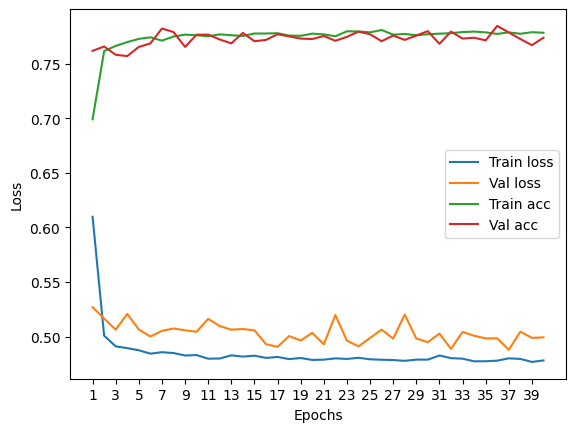

****************************************************************************************************



118it [00:00, 137.17it/s]


Train Epoch: 0 	Loss: 0.626859, Accuracy: 4998/7500 (67%)
Val Epoch: 0 	Loss: 0.517407, Accuracy: 1905/2500 (76%)



118it [00:00, 134.75it/s]


Train Epoch: 1 	Loss: 0.509091, Accuracy: 5705/7500 (76%)
Val Epoch: 1 	Loss: 0.496221, Accuracy: 1942/2500 (78%)



118it [00:00, 130.07it/s]


Train Epoch: 2 	Loss: 0.501497, Accuracy: 5748/7500 (77%)
Val Epoch: 2 	Loss: 0.508328, Accuracy: 1936/2500 (77%)



118it [00:00, 123.53it/s]


Train Epoch: 3 	Loss: 0.497294, Accuracy: 5732/7500 (76%)
Val Epoch: 3 	Loss: 0.496318, Accuracy: 1950/2500 (78%)



118it [00:00, 121.50it/s]


Train Epoch: 4 	Loss: 0.496392, Accuracy: 5747/7500 (77%)
Val Epoch: 4 	Loss: 0.495815, Accuracy: 1945/2500 (78%)



118it [00:00, 137.26it/s]


Train Epoch: 5 	Loss: 0.498322, Accuracy: 5738/7500 (77%)
Val Epoch: 5 	Loss: 0.500806, Accuracy: 1932/2500 (77%)



118it [00:00, 139.75it/s]


Train Epoch: 6 	Loss: 0.495667, Accuracy: 5756/7500 (77%)
Val Epoch: 6 	Loss: 0.491207, Accuracy: 1922/2500 (77%)



118it [00:00, 137.15it/s]


Train Epoch: 7 	Loss: 0.497478, Accuracy: 5747/7500 (77%)
Val Epoch: 7 	Loss: 0.500566, Accuracy: 1930/2500 (77%)



118it [00:00, 125.72it/s]


Train Epoch: 8 	Loss: 0.496731, Accuracy: 5740/7500 (77%)
Val Epoch: 8 	Loss: 0.502169, Accuracy: 1934/2500 (77%)



118it [00:01, 117.63it/s]


Train Epoch: 9 	Loss: 0.495683, Accuracy: 5737/7500 (76%)
Val Epoch: 9 	Loss: 0.489623, Accuracy: 1933/2500 (77%)



118it [00:00, 134.76it/s]


Train Epoch: 10 	Loss: 0.496404, Accuracy: 5758/7500 (77%)
Val Epoch: 10 	Loss: 0.492378, Accuracy: 1938/2500 (78%)



118it [00:01, 117.89it/s]


Train Epoch: 11 	Loss: 0.503433, Accuracy: 5732/7500 (76%)
Val Epoch: 11 	Loss: 0.497191, Accuracy: 1940/2500 (78%)



118it [00:00, 139.32it/s]


Train Epoch: 12 	Loss: 0.495072, Accuracy: 5760/7500 (77%)
Val Epoch: 12 	Loss: 0.483731, Accuracy: 1947/2500 (78%)



118it [00:00, 134.50it/s]


Train Epoch: 13 	Loss: 0.496257, Accuracy: 5717/7500 (76%)
Val Epoch: 13 	Loss: 0.505779, Accuracy: 1917/2500 (77%)



118it [00:00, 125.58it/s]


Train Epoch: 14 	Loss: 0.496520, Accuracy: 5737/7500 (76%)
Val Epoch: 14 	Loss: 0.487292, Accuracy: 1958/2500 (78%)



118it [00:01, 97.76it/s]


Train Epoch: 15 	Loss: 0.492221, Accuracy: 5770/7500 (77%)
Val Epoch: 15 	Loss: 0.489775, Accuracy: 1947/2500 (78%)



118it [00:00, 130.05it/s]


Train Epoch: 16 	Loss: 0.495783, Accuracy: 5744/7500 (77%)
Val Epoch: 16 	Loss: 0.486663, Accuracy: 1938/2500 (78%)



118it [00:00, 145.88it/s]


Train Epoch: 17 	Loss: 0.496170, Accuracy: 5748/7500 (77%)
Val Epoch: 17 	Loss: 0.499349, Accuracy: 1920/2500 (77%)



118it [00:00, 121.42it/s]


Train Epoch: 18 	Loss: 0.495501, Accuracy: 5760/7500 (77%)
Val Epoch: 18 	Loss: 0.488403, Accuracy: 1947/2500 (78%)



118it [00:01, 110.92it/s]


Train Epoch: 19 	Loss: 0.496414, Accuracy: 5757/7500 (77%)
Val Epoch: 19 	Loss: 0.492046, Accuracy: 1931/2500 (77%)



118it [00:00, 123.59it/s]


Train Epoch: 20 	Loss: 0.497632, Accuracy: 5732/7500 (76%)
Val Epoch: 20 	Loss: 0.500392, Accuracy: 1939/2500 (78%)



118it [00:00, 121.72it/s]


Train Epoch: 21 	Loss: 0.495937, Accuracy: 5742/7500 (77%)
Val Epoch: 21 	Loss: 0.499947, Accuracy: 1942/2500 (78%)



118it [00:00, 147.81it/s]


Train Epoch: 22 	Loss: 0.495162, Accuracy: 5759/7500 (77%)
Val Epoch: 22 	Loss: 0.489616, Accuracy: 1933/2500 (77%)



118it [00:00, 142.13it/s]


Train Epoch: 23 	Loss: 0.494794, Accuracy: 5755/7500 (77%)
Val Epoch: 23 	Loss: 0.481112, Accuracy: 1953/2500 (78%)



118it [00:00, 132.22it/s]


Train Epoch: 24 	Loss: 0.498829, Accuracy: 5764/7500 (77%)
Val Epoch: 24 	Loss: 0.499904, Accuracy: 1953/2500 (78%)



118it [00:00, 121.30it/s]


Train Epoch: 25 	Loss: 0.494226, Accuracy: 5772/7500 (77%)
Val Epoch: 25 	Loss: 0.498971, Accuracy: 1942/2500 (78%)



118it [00:00, 133.85it/s]


Train Epoch: 26 	Loss: 0.494007, Accuracy: 5763/7500 (77%)
Val Epoch: 26 	Loss: 0.503836, Accuracy: 1919/2500 (77%)



118it [00:00, 139.80it/s]


Train Epoch: 27 	Loss: 0.493891, Accuracy: 5772/7500 (77%)
Val Epoch: 27 	Loss: 0.496562, Accuracy: 1943/2500 (78%)



118it [00:00, 125.72it/s]


Train Epoch: 28 	Loss: 0.494050, Accuracy: 5773/7500 (77%)
Val Epoch: 28 	Loss: 0.501469, Accuracy: 1948/2500 (78%)



118it [00:00, 139.68it/s]


Train Epoch: 29 	Loss: 0.493327, Accuracy: 5754/7500 (77%)
Val Epoch: 29 	Loss: 0.496345, Accuracy: 1918/2500 (77%)



118it [00:00, 123.60it/s]


Train Epoch: 30 	Loss: 0.493564, Accuracy: 5743/7500 (77%)
Val Epoch: 30 	Loss: 0.488121, Accuracy: 1931/2500 (77%)



118it [00:00, 134.61it/s]


Train Epoch: 31 	Loss: 0.493484, Accuracy: 5766/7500 (77%)
Val Epoch: 31 	Loss: 0.490482, Accuracy: 1953/2500 (78%)



118it [00:00, 127.70it/s]


Train Epoch: 32 	Loss: 0.493731, Accuracy: 5781/7500 (77%)
Val Epoch: 32 	Loss: 0.487915, Accuracy: 1937/2500 (77%)



118it [00:00, 134.67it/s]


Train Epoch: 33 	Loss: 0.491696, Accuracy: 5768/7500 (77%)
Val Epoch: 33 	Loss: 0.484104, Accuracy: 1946/2500 (78%)



118it [00:00, 134.62it/s]


Train Epoch: 34 	Loss: 0.494333, Accuracy: 5780/7500 (77%)
Val Epoch: 34 	Loss: 0.489453, Accuracy: 1943/2500 (78%)



118it [00:00, 125.52it/s]


Train Epoch: 35 	Loss: 0.493960, Accuracy: 5762/7500 (77%)
Val Epoch: 35 	Loss: 0.487797, Accuracy: 1950/2500 (78%)



118it [00:00, 123.59it/s]


Train Epoch: 36 	Loss: 0.492499, Accuracy: 5793/7500 (77%)
Val Epoch: 36 	Loss: 0.493941, Accuracy: 1938/2500 (78%)



118it [00:00, 123.70it/s]


Train Epoch: 37 	Loss: 0.493020, Accuracy: 5768/7500 (77%)
Val Epoch: 37 	Loss: 0.484930, Accuracy: 1942/2500 (78%)



118it [00:00, 147.71it/s]


Train Epoch: 38 	Loss: 0.489580, Accuracy: 5804/7500 (77%)
Val Epoch: 38 	Loss: 0.486091, Accuracy: 1963/2500 (79%)



118it [00:00, 141.89it/s]


Train Epoch: 39 	Loss: 0.493671, Accuracy: 5777/7500 (77%)
Val Epoch: 39 	Loss: 0.489285, Accuracy: 1943/2500 (78%)

Test accuracy:  78.36


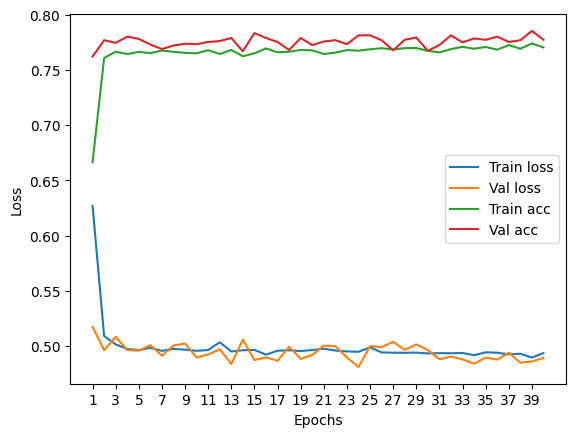

****************************************************************************************************



118it [00:01, 116.09it/s]


Train Epoch: 0 	Loss: 0.625726, Accuracy: 5416/7500 (72%)
Val Epoch: 0 	Loss: 0.533736, Accuracy: 1931/2500 (77%)



118it [00:01, 117.73it/s]


Train Epoch: 1 	Loss: 0.508229, Accuracy: 5677/7500 (76%)
Val Epoch: 1 	Loss: 0.515544, Accuracy: 1876/2500 (75%)



118it [00:00, 127.77it/s]


Train Epoch: 2 	Loss: 0.498912, Accuracy: 5721/7500 (76%)
Val Epoch: 2 	Loss: 0.506670, Accuracy: 1926/2500 (77%)



118it [00:00, 119.67it/s]


Train Epoch: 3 	Loss: 0.491351, Accuracy: 5757/7500 (77%)
Val Epoch: 3 	Loss: 0.501718, Accuracy: 1933/2500 (77%)



118it [00:00, 119.67it/s]


Train Epoch: 4 	Loss: 0.489763, Accuracy: 5794/7500 (77%)
Val Epoch: 4 	Loss: 0.502893, Accuracy: 1927/2500 (77%)



118it [00:00, 136.92it/s]


Train Epoch: 5 	Loss: 0.491329, Accuracy: 5773/7500 (77%)
Val Epoch: 5 	Loss: 0.495110, Accuracy: 1918/2500 (77%)



118it [00:00, 142.27it/s]


Train Epoch: 6 	Loss: 0.490434, Accuracy: 5790/7500 (77%)
Val Epoch: 6 	Loss: 0.500790, Accuracy: 1921/2500 (77%)



118it [00:00, 142.40it/s]


Train Epoch: 7 	Loss: 0.488902, Accuracy: 5786/7500 (77%)
Val Epoch: 7 	Loss: 0.497290, Accuracy: 1933/2500 (77%)



118it [00:01, 109.11it/s]


Train Epoch: 8 	Loss: 0.488100, Accuracy: 5804/7500 (77%)
Val Epoch: 8 	Loss: 0.503340, Accuracy: 1928/2500 (77%)



118it [00:00, 134.66it/s]


Train Epoch: 9 	Loss: 0.487396, Accuracy: 5793/7500 (77%)
Val Epoch: 9 	Loss: 0.506183, Accuracy: 1935/2500 (77%)



118it [00:01, 109.24it/s]


Train Epoch: 10 	Loss: 0.489185, Accuracy: 5797/7500 (77%)
Val Epoch: 10 	Loss: 0.512464, Accuracy: 1942/2500 (78%)



118it [00:00, 123.08it/s]


Train Epoch: 11 	Loss: 0.490595, Accuracy: 5775/7500 (77%)
Val Epoch: 11 	Loss: 0.497315, Accuracy: 1922/2500 (77%)



118it [00:01, 117.64it/s]


Train Epoch: 12 	Loss: 0.487845, Accuracy: 5800/7500 (77%)
Val Epoch: 12 	Loss: 0.498691, Accuracy: 1934/2500 (77%)



118it [00:00, 121.66it/s]


Train Epoch: 13 	Loss: 0.488125, Accuracy: 5791/7500 (77%)
Val Epoch: 13 	Loss: 0.504910, Accuracy: 1937/2500 (77%)



118it [00:01, 117.74it/s]


Train Epoch: 14 	Loss: 0.486445, Accuracy: 5793/7500 (77%)
Val Epoch: 14 	Loss: 0.497148, Accuracy: 1931/2500 (77%)



118it [00:00, 121.60it/s]


Train Epoch: 15 	Loss: 0.487018, Accuracy: 5792/7500 (77%)
Val Epoch: 15 	Loss: 0.495802, Accuracy: 1941/2500 (78%)



118it [00:01, 109.34it/s]


Train Epoch: 16 	Loss: 0.490872, Accuracy: 5794/7500 (77%)
Val Epoch: 16 	Loss: 0.500542, Accuracy: 1928/2500 (77%)



118it [00:00, 121.65it/s]


Train Epoch: 17 	Loss: 0.487933, Accuracy: 5783/7500 (77%)
Val Epoch: 17 	Loss: 0.502798, Accuracy: 1925/2500 (77%)



118it [00:00, 134.65it/s]


Train Epoch: 18 	Loss: 0.489956, Accuracy: 5799/7500 (77%)
Val Epoch: 18 	Loss: 0.494924, Accuracy: 1950/2500 (78%)



118it [00:00, 123.66it/s]


Train Epoch: 19 	Loss: 0.486306, Accuracy: 5796/7500 (77%)
Val Epoch: 19 	Loss: 0.505853, Accuracy: 1936/2500 (77%)



118it [00:00, 123.53it/s]


Train Epoch: 20 	Loss: 0.486793, Accuracy: 5788/7500 (77%)
Val Epoch: 20 	Loss: 0.494157, Accuracy: 1933/2500 (77%)



118it [00:00, 125.62it/s]


Train Epoch: 21 	Loss: 0.484963, Accuracy: 5805/7500 (77%)
Val Epoch: 21 	Loss: 0.492006, Accuracy: 1933/2500 (77%)



118it [00:00, 139.87it/s]


Train Epoch: 22 	Loss: 0.487859, Accuracy: 5787/7500 (77%)
Val Epoch: 22 	Loss: 0.512944, Accuracy: 1927/2500 (77%)



118it [00:00, 134.68it/s]


Train Epoch: 23 	Loss: 0.488788, Accuracy: 5794/7500 (77%)
Val Epoch: 23 	Loss: 0.502054, Accuracy: 1928/2500 (77%)



118it [00:00, 144.62it/s]


Train Epoch: 24 	Loss: 0.488840, Accuracy: 5777/7500 (77%)
Val Epoch: 24 	Loss: 0.497878, Accuracy: 1935/2500 (77%)



118it [00:00, 132.74it/s]


Train Epoch: 25 	Loss: 0.487034, Accuracy: 5771/7500 (77%)
Val Epoch: 25 	Loss: 0.502406, Accuracy: 1933/2500 (77%)



118it [00:00, 132.24it/s]


Train Epoch: 26 	Loss: 0.488803, Accuracy: 5793/7500 (77%)
Val Epoch: 26 	Loss: 0.494735, Accuracy: 1942/2500 (78%)



118it [00:00, 125.71it/s]


Train Epoch: 27 	Loss: 0.488503, Accuracy: 5797/7500 (77%)
Val Epoch: 27 	Loss: 0.493346, Accuracy: 1934/2500 (77%)



118it [00:00, 142.44it/s]


Train Epoch: 28 	Loss: 0.487264, Accuracy: 5803/7500 (77%)
Val Epoch: 28 	Loss: 0.499592, Accuracy: 1937/2500 (77%)



118it [00:00, 121.50it/s]


Train Epoch: 29 	Loss: 0.485780, Accuracy: 5783/7500 (77%)
Val Epoch: 29 	Loss: 0.501969, Accuracy: 1938/2500 (78%)



118it [00:01, 117.80it/s]


Train Epoch: 30 	Loss: 0.486764, Accuracy: 5793/7500 (77%)
Val Epoch: 30 	Loss: 0.508116, Accuracy: 1927/2500 (77%)



118it [00:00, 121.74it/s]


Train Epoch: 31 	Loss: 0.487215, Accuracy: 5793/7500 (77%)
Val Epoch: 31 	Loss: 0.495573, Accuracy: 1941/2500 (78%)



118it [00:00, 139.75it/s]


Train Epoch: 32 	Loss: 0.487132, Accuracy: 5804/7500 (77%)
Val Epoch: 32 	Loss: 0.504662, Accuracy: 1931/2500 (77%)



118it [00:00, 139.34it/s]


Train Epoch: 33 	Loss: 0.487504, Accuracy: 5790/7500 (77%)
Val Epoch: 33 	Loss: 0.504733, Accuracy: 1932/2500 (77%)



118it [00:00, 129.91it/s]


Train Epoch: 34 	Loss: 0.486841, Accuracy: 5791/7500 (77%)
Val Epoch: 34 	Loss: 0.504404, Accuracy: 1924/2500 (77%)



118it [00:00, 123.68it/s]


Train Epoch: 35 	Loss: 0.486602, Accuracy: 5800/7500 (77%)
Val Epoch: 35 	Loss: 0.495675, Accuracy: 1935/2500 (77%)



118it [00:00, 126.88it/s]


Train Epoch: 36 	Loss: 0.486470, Accuracy: 5794/7500 (77%)
Val Epoch: 36 	Loss: 0.495194, Accuracy: 1924/2500 (77%)



118it [00:00, 142.41it/s]


Train Epoch: 37 	Loss: 0.485822, Accuracy: 5812/7500 (77%)
Val Epoch: 37 	Loss: 0.492507, Accuracy: 1940/2500 (78%)



118it [00:00, 123.08it/s]


Train Epoch: 38 	Loss: 0.486139, Accuracy: 5819/7500 (78%)
Val Epoch: 38 	Loss: 0.491977, Accuracy: 1931/2500 (77%)



118it [00:01, 115.89it/s]


Train Epoch: 39 	Loss: 0.487782, Accuracy: 5796/7500 (77%)
Val Epoch: 39 	Loss: 0.496987, Accuracy: 1938/2500 (78%)

Test accuracy:  76.72


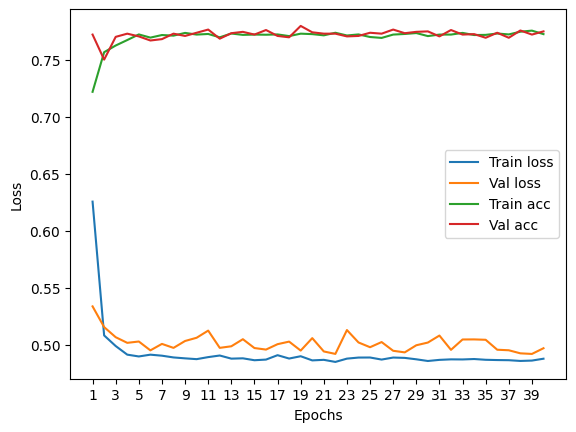

****************************************************************************************************



118it [00:00, 127.88it/s]


Train Epoch: 0 	Loss: 0.603296, Accuracy: 5203/7500 (69%)
Val Epoch: 0 	Loss: 0.551953, Accuracy: 1794/2500 (72%)



118it [00:00, 139.54it/s]


Train Epoch: 1 	Loss: 0.512736, Accuracy: 5687/7500 (76%)
Val Epoch: 1 	Loss: 0.506861, Accuracy: 1919/2500 (77%)



118it [00:00, 139.61it/s]


Train Epoch: 2 	Loss: 0.498839, Accuracy: 5761/7500 (77%)
Val Epoch: 2 	Loss: 0.510675, Accuracy: 1931/2500 (77%)



118it [00:00, 127.44it/s]


Train Epoch: 3 	Loss: 0.498456, Accuracy: 5757/7500 (77%)
Val Epoch: 3 	Loss: 0.500092, Accuracy: 1924/2500 (77%)



118it [00:00, 132.25it/s]


Train Epoch: 4 	Loss: 0.499397, Accuracy: 5777/7500 (77%)
Val Epoch: 4 	Loss: 0.512592, Accuracy: 1913/2500 (77%)



118it [00:01, 112.30it/s]


Train Epoch: 5 	Loss: 0.495106, Accuracy: 5776/7500 (77%)
Val Epoch: 5 	Loss: 0.517176, Accuracy: 1898/2500 (76%)



118it [00:00, 125.71it/s]


Train Epoch: 6 	Loss: 0.495954, Accuracy: 5776/7500 (77%)
Val Epoch: 6 	Loss: 0.498953, Accuracy: 1931/2500 (77%)



118it [00:01, 110.85it/s]


Train Epoch: 7 	Loss: 0.494420, Accuracy: 5793/7500 (77%)
Val Epoch: 7 	Loss: 0.521779, Accuracy: 1929/2500 (77%)



118it [00:00, 123.55it/s]


Train Epoch: 8 	Loss: 0.496010, Accuracy: 5778/7500 (77%)
Val Epoch: 8 	Loss: 0.522972, Accuracy: 1913/2500 (77%)



118it [00:00, 129.90it/s]


Train Epoch: 9 	Loss: 0.492959, Accuracy: 5790/7500 (77%)
Val Epoch: 9 	Loss: 0.509919, Accuracy: 1908/2500 (76%)



118it [00:00, 132.12it/s]


Train Epoch: 10 	Loss: 0.495851, Accuracy: 5777/7500 (77%)
Val Epoch: 10 	Loss: 0.499040, Accuracy: 1933/2500 (77%)



118it [00:00, 127.74it/s]


Train Epoch: 11 	Loss: 0.491746, Accuracy: 5794/7500 (77%)
Val Epoch: 11 	Loss: 0.503202, Accuracy: 1929/2500 (77%)



118it [00:00, 142.27it/s]


Train Epoch: 12 	Loss: 0.490330, Accuracy: 5802/7500 (77%)
Val Epoch: 12 	Loss: 0.500121, Accuracy: 1916/2500 (77%)



118it [00:00, 121.72it/s]


Train Epoch: 13 	Loss: 0.494008, Accuracy: 5788/7500 (77%)
Val Epoch: 13 	Loss: 0.511675, Accuracy: 1931/2500 (77%)



118it [00:00, 129.94it/s]


Train Epoch: 14 	Loss: 0.492001, Accuracy: 5796/7500 (77%)
Val Epoch: 14 	Loss: 0.508727, Accuracy: 1939/2500 (78%)



118it [00:00, 134.03it/s]


Train Epoch: 15 	Loss: 0.493414, Accuracy: 5778/7500 (77%)
Val Epoch: 15 	Loss: 0.500560, Accuracy: 1925/2500 (77%)



118it [00:01, 117.59it/s]


Train Epoch: 16 	Loss: 0.491107, Accuracy: 5795/7500 (77%)
Val Epoch: 16 	Loss: 0.506499, Accuracy: 1932/2500 (77%)



118it [00:00, 130.20it/s]


Train Epoch: 17 	Loss: 0.492965, Accuracy: 5805/7500 (77%)
Val Epoch: 17 	Loss: 0.499555, Accuracy: 1938/2500 (78%)



118it [00:00, 123.51it/s]


Train Epoch: 18 	Loss: 0.491382, Accuracy: 5809/7500 (77%)
Val Epoch: 18 	Loss: 0.495312, Accuracy: 1937/2500 (77%)



118it [00:01, 115.87it/s]


Train Epoch: 19 	Loss: 0.492482, Accuracy: 5816/7500 (78%)
Val Epoch: 19 	Loss: 0.507571, Accuracy: 1924/2500 (77%)



118it [00:00, 142.32it/s]


Train Epoch: 20 	Loss: 0.490646, Accuracy: 5802/7500 (77%)
Val Epoch: 20 	Loss: 0.509720, Accuracy: 1917/2500 (77%)



118it [00:01, 114.19it/s]


Train Epoch: 21 	Loss: 0.491494, Accuracy: 5783/7500 (77%)
Val Epoch: 21 	Loss: 0.503404, Accuracy: 1939/2500 (78%)



118it [00:00, 119.56it/s]


Train Epoch: 22 	Loss: 0.491643, Accuracy: 5818/7500 (78%)
Val Epoch: 22 	Loss: 0.512868, Accuracy: 1931/2500 (77%)



118it [00:01, 117.31it/s]


Train Epoch: 23 	Loss: 0.491000, Accuracy: 5793/7500 (77%)
Val Epoch: 23 	Loss: 0.516634, Accuracy: 1919/2500 (77%)



118it [00:00, 134.59it/s]


Train Epoch: 24 	Loss: 0.492394, Accuracy: 5779/7500 (77%)
Val Epoch: 24 	Loss: 0.497463, Accuracy: 1937/2500 (77%)



118it [00:00, 132.99it/s]


Train Epoch: 25 	Loss: 0.489648, Accuracy: 5797/7500 (77%)
Val Epoch: 25 	Loss: 0.504567, Accuracy: 1932/2500 (77%)



118it [00:01, 117.69it/s]


Train Epoch: 26 	Loss: 0.491308, Accuracy: 5787/7500 (77%)
Val Epoch: 26 	Loss: 0.499112, Accuracy: 1933/2500 (77%)



118it [00:00, 129.88it/s]


Train Epoch: 27 	Loss: 0.492490, Accuracy: 5792/7500 (77%)
Val Epoch: 27 	Loss: 0.514373, Accuracy: 1938/2500 (78%)



118it [00:00, 127.55it/s]


Train Epoch: 28 	Loss: 0.490680, Accuracy: 5793/7500 (77%)
Val Epoch: 28 	Loss: 0.502445, Accuracy: 1937/2500 (77%)



118it [00:00, 132.23it/s]


Train Epoch: 29 	Loss: 0.491053, Accuracy: 5798/7500 (77%)
Val Epoch: 29 	Loss: 0.514066, Accuracy: 1941/2500 (78%)



118it [00:00, 121.56it/s]


Train Epoch: 30 	Loss: 0.492147, Accuracy: 5792/7500 (77%)
Val Epoch: 30 	Loss: 0.508096, Accuracy: 1938/2500 (78%)



118it [00:00, 119.57it/s]


Train Epoch: 31 	Loss: 0.491235, Accuracy: 5806/7500 (77%)
Val Epoch: 31 	Loss: 0.520792, Accuracy: 1935/2500 (77%)



118it [00:00, 121.72it/s]


Train Epoch: 32 	Loss: 0.491248, Accuracy: 5807/7500 (77%)
Val Epoch: 32 	Loss: 0.509805, Accuracy: 1935/2500 (77%)



118it [00:01, 114.30it/s]


Train Epoch: 33 	Loss: 0.489774, Accuracy: 5790/7500 (77%)
Val Epoch: 33 	Loss: 0.514993, Accuracy: 1937/2500 (77%)



118it [00:00, 130.09it/s]


Train Epoch: 34 	Loss: 0.488445, Accuracy: 5805/7500 (77%)
Val Epoch: 34 	Loss: 0.503284, Accuracy: 1938/2500 (78%)



118it [00:00, 142.45it/s]


Train Epoch: 35 	Loss: 0.489856, Accuracy: 5777/7500 (77%)
Val Epoch: 35 	Loss: 0.497664, Accuracy: 1931/2500 (77%)



118it [00:00, 134.00it/s]


Train Epoch: 36 	Loss: 0.489987, Accuracy: 5810/7500 (77%)
Val Epoch: 36 	Loss: 0.511475, Accuracy: 1920/2500 (77%)



118it [00:01, 109.14it/s]


Train Epoch: 37 	Loss: 0.492198, Accuracy: 5781/7500 (77%)
Val Epoch: 37 	Loss: 0.505776, Accuracy: 1915/2500 (77%)



118it [00:00, 123.59it/s]


Train Epoch: 38 	Loss: 0.488303, Accuracy: 5789/7500 (77%)
Val Epoch: 38 	Loss: 0.517351, Accuracy: 1933/2500 (77%)



118it [00:00, 132.39it/s]


Train Epoch: 39 	Loss: 0.490327, Accuracy: 5798/7500 (77%)
Val Epoch: 39 	Loss: 0.511672, Accuracy: 1911/2500 (76%)

Test accuracy:  76.24


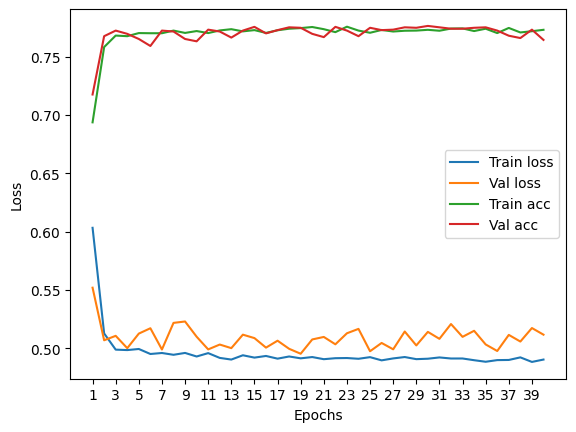

****************************************************************************************************



118it [00:01, 99.26it/s] 


Train Epoch: 0 	Loss: 0.601675, Accuracy: 5363/7500 (72%)
Val Epoch: 0 	Loss: 0.526931, Accuracy: 1896/2500 (76%)



118it [00:00, 134.60it/s]


Train Epoch: 1 	Loss: 0.514608, Accuracy: 5702/7500 (76%)
Val Epoch: 1 	Loss: 0.520842, Accuracy: 1912/2500 (76%)



118it [00:01, 112.34it/s]


Train Epoch: 2 	Loss: 0.503355, Accuracy: 5728/7500 (76%)
Val Epoch: 2 	Loss: 0.510577, Accuracy: 1922/2500 (77%)



118it [00:00, 127.62it/s]


Train Epoch: 3 	Loss: 0.503950, Accuracy: 5713/7500 (76%)
Val Epoch: 3 	Loss: 0.514339, Accuracy: 1924/2500 (77%)



118it [00:01, 110.82it/s]


Train Epoch: 4 	Loss: 0.498438, Accuracy: 5749/7500 (77%)
Val Epoch: 4 	Loss: 0.500845, Accuracy: 1926/2500 (77%)



118it [00:00, 127.77it/s]


Train Epoch: 5 	Loss: 0.495938, Accuracy: 5751/7500 (77%)
Val Epoch: 5 	Loss: 0.500183, Accuracy: 1923/2500 (77%)



118it [00:00, 119.69it/s]


Train Epoch: 6 	Loss: 0.495272, Accuracy: 5776/7500 (77%)
Val Epoch: 6 	Loss: 0.509452, Accuracy: 1923/2500 (77%)



118it [00:01, 105.66it/s]


Train Epoch: 7 	Loss: 0.498014, Accuracy: 5770/7500 (77%)
Val Epoch: 7 	Loss: 0.514993, Accuracy: 1928/2500 (77%)



118it [00:01, 102.84it/s]


Train Epoch: 8 	Loss: 0.501458, Accuracy: 5732/7500 (76%)
Val Epoch: 8 	Loss: 0.507716, Accuracy: 1914/2500 (77%)



118it [00:00, 123.41it/s]


Train Epoch: 9 	Loss: 0.496372, Accuracy: 5769/7500 (77%)
Val Epoch: 9 	Loss: 0.498454, Accuracy: 1933/2500 (77%)



118it [00:00, 121.55it/s]


Train Epoch: 10 	Loss: 0.494118, Accuracy: 5794/7500 (77%)
Val Epoch: 10 	Loss: 0.499099, Accuracy: 1932/2500 (77%)



118it [00:01, 117.77it/s]


Train Epoch: 11 	Loss: 0.495380, Accuracy: 5762/7500 (77%)
Val Epoch: 11 	Loss: 0.509122, Accuracy: 1912/2500 (76%)



118it [00:00, 129.86it/s]


Train Epoch: 12 	Loss: 0.493985, Accuracy: 5752/7500 (77%)
Val Epoch: 12 	Loss: 0.497666, Accuracy: 1929/2500 (77%)



118it [00:00, 127.78it/s]


Train Epoch: 13 	Loss: 0.493906, Accuracy: 5742/7500 (77%)
Val Epoch: 13 	Loss: 0.505037, Accuracy: 1915/2500 (77%)



118it [00:00, 125.82it/s]


Train Epoch: 14 	Loss: 0.492471, Accuracy: 5748/7500 (77%)
Val Epoch: 14 	Loss: 0.499137, Accuracy: 1925/2500 (77%)



118it [00:00, 127.79it/s]


Train Epoch: 15 	Loss: 0.492665, Accuracy: 5747/7500 (77%)
Val Epoch: 15 	Loss: 0.506561, Accuracy: 1915/2500 (77%)



118it [00:00, 123.40it/s]


Train Epoch: 16 	Loss: 0.494472, Accuracy: 5761/7500 (77%)
Val Epoch: 16 	Loss: 0.505022, Accuracy: 1927/2500 (77%)



118it [00:00, 125.69it/s]


Train Epoch: 17 	Loss: 0.493918, Accuracy: 5758/7500 (77%)
Val Epoch: 17 	Loss: 0.499757, Accuracy: 1920/2500 (77%)



118it [00:00, 127.74it/s]


Train Epoch: 18 	Loss: 0.494529, Accuracy: 5738/7500 (77%)
Val Epoch: 18 	Loss: 0.509032, Accuracy: 1909/2500 (76%)



118it [00:01, 107.75it/s]


Train Epoch: 19 	Loss: 0.494125, Accuracy: 5779/7500 (77%)
Val Epoch: 19 	Loss: 0.502573, Accuracy: 1930/2500 (77%)



118it [00:00, 139.51it/s]


Train Epoch: 20 	Loss: 0.491358, Accuracy: 5779/7500 (77%)
Val Epoch: 20 	Loss: 0.503358, Accuracy: 1927/2500 (77%)



118it [00:00, 127.25it/s]


Train Epoch: 21 	Loss: 0.492019, Accuracy: 5765/7500 (77%)
Val Epoch: 21 	Loss: 0.506018, Accuracy: 1921/2500 (77%)



118it [00:00, 144.71it/s]


Train Epoch: 22 	Loss: 0.492580, Accuracy: 5757/7500 (77%)
Val Epoch: 22 	Loss: 0.501804, Accuracy: 1920/2500 (77%)



118it [00:00, 123.53it/s]


Train Epoch: 23 	Loss: 0.491448, Accuracy: 5763/7500 (77%)
Val Epoch: 23 	Loss: 0.502466, Accuracy: 1914/2500 (77%)



118it [00:00, 125.54it/s]


Train Epoch: 24 	Loss: 0.490424, Accuracy: 5781/7500 (77%)
Val Epoch: 24 	Loss: 0.512083, Accuracy: 1926/2500 (77%)



118it [00:00, 134.71it/s]


Train Epoch: 25 	Loss: 0.490964, Accuracy: 5763/7500 (77%)
Val Epoch: 25 	Loss: 0.510968, Accuracy: 1916/2500 (77%)



118it [00:00, 129.88it/s]


Train Epoch: 26 	Loss: 0.493699, Accuracy: 5778/7500 (77%)
Val Epoch: 26 	Loss: 0.505135, Accuracy: 1920/2500 (77%)



118it [00:00, 139.77it/s]


Train Epoch: 27 	Loss: 0.493481, Accuracy: 5770/7500 (77%)
Val Epoch: 27 	Loss: 0.527710, Accuracy: 1921/2500 (77%)



118it [00:00, 127.84it/s]


Train Epoch: 28 	Loss: 0.491306, Accuracy: 5768/7500 (77%)
Val Epoch: 28 	Loss: 0.510418, Accuracy: 1907/2500 (76%)



118it [00:01, 117.87it/s]


Train Epoch: 29 	Loss: 0.492839, Accuracy: 5761/7500 (77%)
Val Epoch: 29 	Loss: 0.520245, Accuracy: 1911/2500 (76%)



118it [00:00, 123.62it/s]


Train Epoch: 30 	Loss: 0.493039, Accuracy: 5766/7500 (77%)
Val Epoch: 30 	Loss: 0.500882, Accuracy: 1916/2500 (77%)



118it [00:00, 121.61it/s]


Train Epoch: 31 	Loss: 0.490380, Accuracy: 5773/7500 (77%)
Val Epoch: 31 	Loss: 0.501905, Accuracy: 1916/2500 (77%)



118it [00:00, 121.56it/s]


Train Epoch: 32 	Loss: 0.493122, Accuracy: 5758/7500 (77%)
Val Epoch: 32 	Loss: 0.506313, Accuracy: 1910/2500 (76%)



118it [00:00, 125.47it/s]


Train Epoch: 33 	Loss: 0.490852, Accuracy: 5768/7500 (77%)
Val Epoch: 33 	Loss: 0.499646, Accuracy: 1915/2500 (77%)



118it [00:00, 127.32it/s]


Train Epoch: 34 	Loss: 0.491865, Accuracy: 5763/7500 (77%)
Val Epoch: 34 	Loss: 0.501337, Accuracy: 1924/2500 (77%)



118it [00:01, 115.66it/s]


Train Epoch: 35 	Loss: 0.491760, Accuracy: 5763/7500 (77%)
Val Epoch: 35 	Loss: 0.510739, Accuracy: 1910/2500 (76%)



118it [00:00, 119.73it/s]


Train Epoch: 36 	Loss: 0.489778, Accuracy: 5781/7500 (77%)
Val Epoch: 36 	Loss: 0.507583, Accuracy: 1924/2500 (77%)



118it [00:00, 127.82it/s]


Train Epoch: 37 	Loss: 0.491299, Accuracy: 5757/7500 (77%)
Val Epoch: 37 	Loss: 0.510319, Accuracy: 1912/2500 (76%)



118it [00:00, 125.50it/s]


Train Epoch: 38 	Loss: 0.490367, Accuracy: 5747/7500 (77%)
Val Epoch: 38 	Loss: 0.502952, Accuracy: 1904/2500 (76%)



118it [00:00, 125.75it/s]


Train Epoch: 39 	Loss: 0.488640, Accuracy: 5768/7500 (77%)
Val Epoch: 39 	Loss: 0.504125, Accuracy: 1903/2500 (76%)

Test accuracy:  76.64


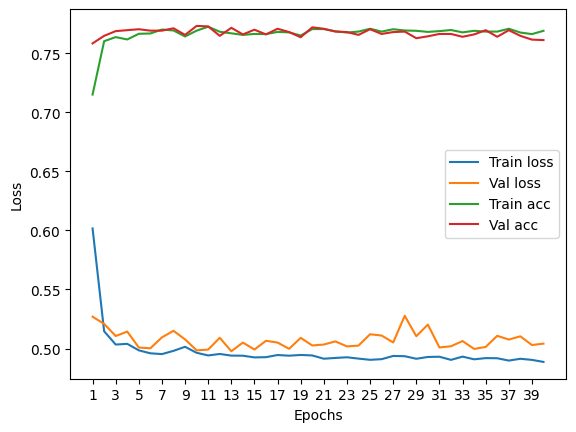

****************************************************************************************************



116it [00:00, 117.58it/s]


Train Epoch: 0 	Loss: 0.593522, Accuracy: 5352/7422 (72%)
Val Epoch: 0 	Loss: 0.518257, Accuracy: 1861/2474 (75%)



116it [00:01, 115.54it/s]


Train Epoch: 1 	Loss: 0.504904, Accuracy: 5636/7422 (76%)
Val Epoch: 1 	Loss: 0.506058, Accuracy: 1871/2474 (76%)



116it [00:00, 129.77it/s]


Train Epoch: 2 	Loss: 0.497268, Accuracy: 5697/7422 (77%)
Val Epoch: 2 	Loss: 0.502153, Accuracy: 1873/2474 (76%)



116it [00:01, 115.69it/s]


Train Epoch: 3 	Loss: 0.493390, Accuracy: 5667/7422 (76%)
Val Epoch: 3 	Loss: 0.501813, Accuracy: 1878/2474 (76%)



116it [00:00, 134.41it/s]


Train Epoch: 4 	Loss: 0.493682, Accuracy: 5685/7422 (77%)
Val Epoch: 4 	Loss: 0.499466, Accuracy: 1879/2474 (76%)



116it [00:00, 121.22it/s]


Train Epoch: 5 	Loss: 0.490799, Accuracy: 5712/7422 (77%)
Val Epoch: 5 	Loss: 0.499327, Accuracy: 1874/2474 (76%)



116it [00:00, 139.49it/s]


Train Epoch: 6 	Loss: 0.491054, Accuracy: 5690/7422 (77%)
Val Epoch: 6 	Loss: 0.508169, Accuracy: 1873/2474 (76%)



116it [00:01, 110.49it/s]


Train Epoch: 7 	Loss: 0.487764, Accuracy: 5720/7422 (77%)
Val Epoch: 7 	Loss: 0.501867, Accuracy: 1881/2474 (76%)



116it [00:00, 132.32it/s]


Train Epoch: 8 	Loss: 0.488721, Accuracy: 5714/7422 (77%)
Val Epoch: 8 	Loss: 0.516600, Accuracy: 1881/2474 (76%)



116it [00:00, 127.82it/s]


Train Epoch: 9 	Loss: 0.488447, Accuracy: 5737/7422 (77%)
Val Epoch: 9 	Loss: 0.501904, Accuracy: 1874/2474 (76%)



116it [00:00, 121.63it/s]


Train Epoch: 10 	Loss: 0.489795, Accuracy: 5721/7422 (77%)
Val Epoch: 10 	Loss: 0.499757, Accuracy: 1880/2474 (76%)



116it [00:00, 134.57it/s]


Train Epoch: 11 	Loss: 0.487672, Accuracy: 5734/7422 (77%)
Val Epoch: 11 	Loss: 0.500572, Accuracy: 1874/2474 (76%)



116it [00:00, 130.05it/s]


Train Epoch: 12 	Loss: 0.488991, Accuracy: 5702/7422 (77%)
Val Epoch: 12 	Loss: 0.496523, Accuracy: 1888/2474 (76%)



116it [00:00, 125.54it/s]


Train Epoch: 13 	Loss: 0.486938, Accuracy: 5715/7422 (77%)
Val Epoch: 13 	Loss: 0.497024, Accuracy: 1880/2474 (76%)



116it [00:00, 123.51it/s]


Train Epoch: 14 	Loss: 0.486428, Accuracy: 5741/7422 (77%)
Val Epoch: 14 	Loss: 0.498052, Accuracy: 1880/2474 (76%)



116it [00:00, 125.61it/s]


Train Epoch: 15 	Loss: 0.485032, Accuracy: 5742/7422 (77%)
Val Epoch: 15 	Loss: 0.505314, Accuracy: 1875/2474 (76%)



116it [00:01, 115.43it/s]


Train Epoch: 16 	Loss: 0.485870, Accuracy: 5737/7422 (77%)
Val Epoch: 16 	Loss: 0.501240, Accuracy: 1867/2474 (75%)



116it [00:00, 131.19it/s]


Train Epoch: 17 	Loss: 0.485751, Accuracy: 5732/7422 (77%)
Val Epoch: 17 	Loss: 0.503305, Accuracy: 1870/2474 (76%)



116it [00:00, 125.42it/s]


Train Epoch: 18 	Loss: 0.483851, Accuracy: 5753/7422 (78%)
Val Epoch: 18 	Loss: 0.497988, Accuracy: 1879/2474 (76%)



116it [00:00, 130.85it/s]


Train Epoch: 19 	Loss: 0.484703, Accuracy: 5745/7422 (77%)
Val Epoch: 19 	Loss: 0.500237, Accuracy: 1878/2474 (76%)



116it [00:00, 129.84it/s]


Train Epoch: 20 	Loss: 0.484556, Accuracy: 5738/7422 (77%)
Val Epoch: 20 	Loss: 0.501256, Accuracy: 1883/2474 (76%)



116it [00:01, 114.08it/s]


Train Epoch: 21 	Loss: 0.482866, Accuracy: 5745/7422 (77%)
Val Epoch: 21 	Loss: 0.501733, Accuracy: 1874/2474 (76%)



116it [00:01, 107.37it/s]


Train Epoch: 22 	Loss: 0.483177, Accuracy: 5765/7422 (78%)
Val Epoch: 22 	Loss: 0.499191, Accuracy: 1867/2474 (75%)



116it [00:00, 135.84it/s]


Train Epoch: 23 	Loss: 0.484531, Accuracy: 5751/7422 (77%)
Val Epoch: 23 	Loss: 0.498208, Accuracy: 1883/2474 (76%)



116it [00:00, 119.38it/s]


Train Epoch: 24 	Loss: 0.483381, Accuracy: 5745/7422 (77%)
Val Epoch: 24 	Loss: 0.497386, Accuracy: 1884/2474 (76%)



116it [00:00, 130.02it/s]


Train Epoch: 25 	Loss: 0.487321, Accuracy: 5743/7422 (77%)
Val Epoch: 25 	Loss: 0.496879, Accuracy: 1884/2474 (76%)



116it [00:00, 139.88it/s]


Train Epoch: 26 	Loss: 0.483853, Accuracy: 5745/7422 (77%)
Val Epoch: 26 	Loss: 0.497074, Accuracy: 1883/2474 (76%)



116it [00:01, 113.98it/s]


Train Epoch: 27 	Loss: 0.483833, Accuracy: 5728/7422 (77%)
Val Epoch: 27 	Loss: 0.502471, Accuracy: 1873/2474 (76%)



116it [00:00, 142.53it/s]


Train Epoch: 28 	Loss: 0.483350, Accuracy: 5740/7422 (77%)
Val Epoch: 28 	Loss: 0.504641, Accuracy: 1876/2474 (76%)



116it [00:00, 134.61it/s]


Train Epoch: 29 	Loss: 0.482481, Accuracy: 5771/7422 (78%)
Val Epoch: 29 	Loss: 0.497437, Accuracy: 1876/2474 (76%)



116it [00:00, 119.44it/s]


Train Epoch: 30 	Loss: 0.482361, Accuracy: 5747/7422 (77%)
Val Epoch: 30 	Loss: 0.498018, Accuracy: 1882/2474 (76%)



116it [00:00, 130.14it/s]


Train Epoch: 31 	Loss: 0.482894, Accuracy: 5740/7422 (77%)
Val Epoch: 31 	Loss: 0.497058, Accuracy: 1879/2474 (76%)



116it [00:01, 112.23it/s]


Train Epoch: 32 	Loss: 0.482035, Accuracy: 5753/7422 (78%)
Val Epoch: 32 	Loss: 0.496497, Accuracy: 1880/2474 (76%)



116it [00:00, 120.92it/s]


Train Epoch: 33 	Loss: 0.482496, Accuracy: 5738/7422 (77%)
Val Epoch: 33 	Loss: 0.498956, Accuracy: 1877/2474 (76%)



116it [00:00, 134.60it/s]


Train Epoch: 34 	Loss: 0.480947, Accuracy: 5776/7422 (78%)
Val Epoch: 34 	Loss: 0.499996, Accuracy: 1877/2474 (76%)



116it [00:01, 107.38it/s]


Train Epoch: 35 	Loss: 0.482313, Accuracy: 5767/7422 (78%)
Val Epoch: 35 	Loss: 0.499086, Accuracy: 1877/2474 (76%)



116it [00:00, 142.23it/s]


Train Epoch: 36 	Loss: 0.481576, Accuracy: 5736/7422 (77%)
Val Epoch: 36 	Loss: 0.499139, Accuracy: 1887/2474 (76%)



116it [00:00, 123.37it/s]


Train Epoch: 37 	Loss: 0.482788, Accuracy: 5765/7422 (78%)
Val Epoch: 37 	Loss: 0.498630, Accuracy: 1876/2474 (76%)



116it [00:00, 123.43it/s]


Train Epoch: 38 	Loss: 0.481068, Accuracy: 5751/7422 (77%)
Val Epoch: 38 	Loss: 0.505302, Accuracy: 1870/2474 (76%)



116it [00:01, 115.81it/s]


Train Epoch: 39 	Loss: 0.483141, Accuracy: 5778/7422 (78%)
Val Epoch: 39 	Loss: 0.498717, Accuracy: 1891/2474 (76%)

Test accuracy:  75.42441390460792


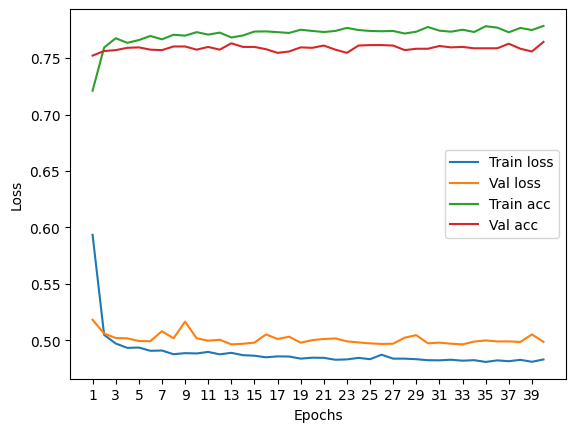

****************************************************************************************************



Particles per jet: 8


118it [00:00, 123.80it/s]


Train Epoch: 0 	Loss: 0.612600, Accuracy: 5260/7500 (70%)
Val Epoch: 0 	Loss: 0.526766, Accuracy: 1910/2500 (76%)



118it [00:00, 144.90it/s]


Train Epoch: 1 	Loss: 0.507082, Accuracy: 5726/7500 (76%)
Val Epoch: 1 	Loss: 0.520648, Accuracy: 1860/2500 (74%)



118it [00:00, 138.77it/s]


Train Epoch: 2 	Loss: 0.500102, Accuracy: 5743/7500 (77%)
Val Epoch: 2 	Loss: 0.505469, Accuracy: 1927/2500 (77%)



118it [00:00, 134.28it/s]


Train Epoch: 3 	Loss: 0.498968, Accuracy: 5729/7500 (76%)
Val Epoch: 3 	Loss: 0.510774, Accuracy: 1937/2500 (77%)



118it [00:00, 137.25it/s]


Train Epoch: 4 	Loss: 0.499184, Accuracy: 5735/7500 (76%)
Val Epoch: 4 	Loss: 0.499138, Accuracy: 1926/2500 (77%)



118it [00:00, 121.52it/s]


Train Epoch: 5 	Loss: 0.497502, Accuracy: 5744/7500 (77%)
Val Epoch: 5 	Loss: 0.496828, Accuracy: 1933/2500 (77%)



118it [00:00, 134.74it/s]


Train Epoch: 6 	Loss: 0.497528, Accuracy: 5753/7500 (77%)
Val Epoch: 6 	Loss: 0.496011, Accuracy: 1933/2500 (77%)



118it [00:01, 117.94it/s]


Train Epoch: 7 	Loss: 0.495416, Accuracy: 5787/7500 (77%)
Val Epoch: 7 	Loss: 0.503007, Accuracy: 1923/2500 (77%)



118it [00:01, 117.82it/s]


Train Epoch: 8 	Loss: 0.492361, Accuracy: 5794/7500 (77%)
Val Epoch: 8 	Loss: 0.508816, Accuracy: 1928/2500 (77%)



118it [00:00, 139.62it/s]


Train Epoch: 9 	Loss: 0.493068, Accuracy: 5747/7500 (77%)
Val Epoch: 9 	Loss: 0.500385, Accuracy: 1947/2500 (78%)



118it [00:00, 134.56it/s]


Train Epoch: 10 	Loss: 0.492543, Accuracy: 5765/7500 (77%)
Val Epoch: 10 	Loss: 0.492336, Accuracy: 1931/2500 (77%)



118it [00:00, 150.93it/s]


Train Epoch: 11 	Loss: 0.491326, Accuracy: 5775/7500 (77%)
Val Epoch: 11 	Loss: 0.509878, Accuracy: 1934/2500 (77%)



118it [00:00, 134.63it/s]


Train Epoch: 12 	Loss: 0.489309, Accuracy: 5780/7500 (77%)
Val Epoch: 12 	Loss: 0.489956, Accuracy: 1948/2500 (78%)



118it [00:00, 127.69it/s]


Train Epoch: 13 	Loss: 0.488830, Accuracy: 5801/7500 (77%)
Val Epoch: 13 	Loss: 0.489102, Accuracy: 1940/2500 (78%)



118it [00:01, 112.50it/s]


Train Epoch: 14 	Loss: 0.491471, Accuracy: 5777/7500 (77%)
Val Epoch: 14 	Loss: 0.506845, Accuracy: 1940/2500 (78%)



118it [00:00, 139.46it/s]


Train Epoch: 15 	Loss: 0.488451, Accuracy: 5793/7500 (77%)
Val Epoch: 15 	Loss: 0.490881, Accuracy: 1947/2500 (78%)



118it [00:00, 138.62it/s]


Train Epoch: 16 	Loss: 0.488706, Accuracy: 5793/7500 (77%)
Val Epoch: 16 	Loss: 0.496640, Accuracy: 1938/2500 (78%)



118it [00:01, 117.65it/s]


Train Epoch: 17 	Loss: 0.487231, Accuracy: 5786/7500 (77%)
Val Epoch: 17 	Loss: 0.493364, Accuracy: 1942/2500 (78%)



118it [00:00, 125.58it/s]


Train Epoch: 18 	Loss: 0.485113, Accuracy: 5799/7500 (77%)
Val Epoch: 18 	Loss: 0.491258, Accuracy: 1936/2500 (77%)



118it [00:00, 130.06it/s]


Train Epoch: 19 	Loss: 0.484055, Accuracy: 5814/7500 (78%)
Val Epoch: 19 	Loss: 0.499717, Accuracy: 1947/2500 (78%)



118it [00:00, 125.79it/s]


Train Epoch: 20 	Loss: 0.485505, Accuracy: 5813/7500 (78%)
Val Epoch: 20 	Loss: 0.485218, Accuracy: 1940/2500 (78%)



118it [00:00, 123.43it/s]


Train Epoch: 21 	Loss: 0.483348, Accuracy: 5808/7500 (77%)
Val Epoch: 21 	Loss: 0.485357, Accuracy: 1940/2500 (78%)



118it [00:00, 130.14it/s]


Train Epoch: 22 	Loss: 0.482090, Accuracy: 5812/7500 (77%)
Val Epoch: 22 	Loss: 0.492491, Accuracy: 1942/2500 (78%)



118it [00:00, 125.47it/s]


Train Epoch: 23 	Loss: 0.485284, Accuracy: 5807/7500 (77%)
Val Epoch: 23 	Loss: 0.487867, Accuracy: 1945/2500 (78%)



118it [00:00, 134.68it/s]


Train Epoch: 24 	Loss: 0.484537, Accuracy: 5803/7500 (77%)
Val Epoch: 24 	Loss: 0.491313, Accuracy: 1938/2500 (78%)



118it [00:00, 134.77it/s]


Train Epoch: 25 	Loss: 0.483249, Accuracy: 5820/7500 (78%)
Val Epoch: 25 	Loss: 0.482771, Accuracy: 1925/2500 (77%)



118it [00:01, 117.80it/s]


Train Epoch: 26 	Loss: 0.481475, Accuracy: 5809/7500 (77%)
Val Epoch: 26 	Loss: 0.509714, Accuracy: 1938/2500 (78%)



118it [00:00, 125.62it/s]


Train Epoch: 27 	Loss: 0.481990, Accuracy: 5807/7500 (77%)
Val Epoch: 27 	Loss: 0.488238, Accuracy: 1940/2500 (78%)



118it [00:01, 116.01it/s]


Train Epoch: 28 	Loss: 0.483409, Accuracy: 5794/7500 (77%)
Val Epoch: 28 	Loss: 0.484828, Accuracy: 1936/2500 (77%)



118it [00:00, 122.96it/s]


Train Epoch: 29 	Loss: 0.481646, Accuracy: 5819/7500 (78%)
Val Epoch: 29 	Loss: 0.484085, Accuracy: 1941/2500 (78%)



118it [00:00, 125.44it/s]


Train Epoch: 30 	Loss: 0.482265, Accuracy: 5819/7500 (78%)
Val Epoch: 30 	Loss: 0.479538, Accuracy: 1943/2500 (78%)



118it [00:00, 119.59it/s]


Train Epoch: 31 	Loss: 0.480641, Accuracy: 5815/7500 (78%)
Val Epoch: 31 	Loss: 0.492112, Accuracy: 1937/2500 (77%)



118it [00:00, 123.54it/s]


Train Epoch: 32 	Loss: 0.481477, Accuracy: 5830/7500 (78%)
Val Epoch: 32 	Loss: 0.492943, Accuracy: 1940/2500 (78%)



118it [00:01, 116.05it/s]


Train Epoch: 33 	Loss: 0.481993, Accuracy: 5808/7500 (77%)
Val Epoch: 33 	Loss: 0.489034, Accuracy: 1935/2500 (77%)



118it [00:00, 139.62it/s]


Train Epoch: 34 	Loss: 0.481612, Accuracy: 5806/7500 (77%)
Val Epoch: 34 	Loss: 0.486566, Accuracy: 1939/2500 (78%)



118it [00:00, 129.79it/s]


Train Epoch: 35 	Loss: 0.480706, Accuracy: 5838/7500 (78%)
Val Epoch: 35 	Loss: 0.491032, Accuracy: 1929/2500 (77%)



118it [00:01, 114.25it/s]


Train Epoch: 36 	Loss: 0.480627, Accuracy: 5812/7500 (77%)
Val Epoch: 36 	Loss: 0.486654, Accuracy: 1933/2500 (77%)



118it [00:00, 121.51it/s]


Train Epoch: 37 	Loss: 0.483431, Accuracy: 5803/7500 (77%)
Val Epoch: 37 	Loss: 0.482091, Accuracy: 1948/2500 (78%)



118it [00:00, 130.06it/s]


Train Epoch: 38 	Loss: 0.479856, Accuracy: 5840/7500 (78%)
Val Epoch: 38 	Loss: 0.483969, Accuracy: 1938/2500 (78%)



118it [00:01, 117.88it/s]


Train Epoch: 39 	Loss: 0.480484, Accuracy: 5842/7500 (78%)
Val Epoch: 39 	Loss: 0.497863, Accuracy: 1939/2500 (78%)

Test accuracy:  77.4


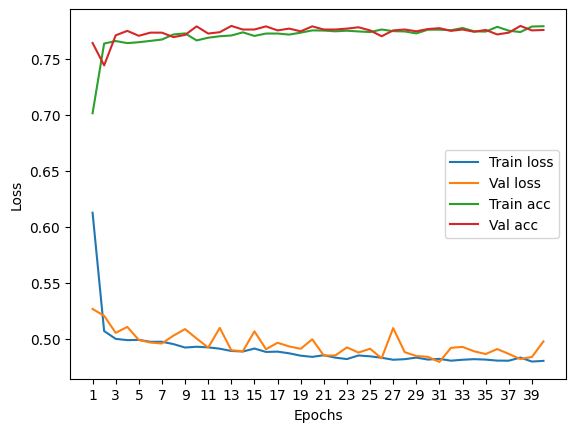

****************************************************************************************************



118it [00:00, 145.14it/s]


Train Epoch: 0 	Loss: 0.630896, Accuracy: 5159/7500 (69%)
Val Epoch: 0 	Loss: 0.533737, Accuracy: 1888/2500 (76%)



118it [00:00, 127.79it/s]


Train Epoch: 1 	Loss: 0.518003, Accuracy: 5622/7500 (75%)
Val Epoch: 1 	Loss: 0.513558, Accuracy: 1901/2500 (76%)



118it [00:00, 123.81it/s]


Train Epoch: 2 	Loss: 0.509661, Accuracy: 5644/7500 (75%)
Val Epoch: 2 	Loss: 0.503215, Accuracy: 1912/2500 (76%)



118it [00:00, 153.73it/s]


Train Epoch: 3 	Loss: 0.504319, Accuracy: 5689/7500 (76%)
Val Epoch: 3 	Loss: 0.501622, Accuracy: 1909/2500 (76%)



118it [00:01, 109.24it/s]


Train Epoch: 4 	Loss: 0.506484, Accuracy: 5663/7500 (76%)
Val Epoch: 4 	Loss: 0.497347, Accuracy: 1913/2500 (77%)



118it [00:00, 134.52it/s]


Train Epoch: 5 	Loss: 0.506324, Accuracy: 5655/7500 (75%)
Val Epoch: 5 	Loss: 0.520129, Accuracy: 1915/2500 (77%)



118it [00:00, 132.23it/s]


Train Epoch: 6 	Loss: 0.502649, Accuracy: 5660/7500 (75%)
Val Epoch: 6 	Loss: 0.495923, Accuracy: 1915/2500 (77%)



118it [00:00, 137.07it/s]


Train Epoch: 7 	Loss: 0.501785, Accuracy: 5689/7500 (76%)
Val Epoch: 7 	Loss: 0.491790, Accuracy: 1912/2500 (76%)



118it [00:01, 115.98it/s]


Train Epoch: 8 	Loss: 0.502235, Accuracy: 5680/7500 (76%)
Val Epoch: 8 	Loss: 0.499493, Accuracy: 1918/2500 (77%)



118it [00:00, 130.03it/s]


Train Epoch: 9 	Loss: 0.502427, Accuracy: 5671/7500 (76%)
Val Epoch: 9 	Loss: 0.495280, Accuracy: 1913/2500 (77%)



118it [00:01, 114.27it/s]


Train Epoch: 10 	Loss: 0.501098, Accuracy: 5671/7500 (76%)
Val Epoch: 10 	Loss: 0.517266, Accuracy: 1888/2500 (76%)



118it [00:01, 117.38it/s]


Train Epoch: 11 	Loss: 0.499940, Accuracy: 5681/7500 (76%)
Val Epoch: 11 	Loss: 0.507988, Accuracy: 1926/2500 (77%)



118it [00:00, 146.85it/s]


Train Epoch: 12 	Loss: 0.501544, Accuracy: 5682/7500 (76%)
Val Epoch: 12 	Loss: 0.494919, Accuracy: 1915/2500 (77%)



118it [00:00, 127.52it/s]


Train Epoch: 13 	Loss: 0.500763, Accuracy: 5691/7500 (76%)
Val Epoch: 13 	Loss: 0.499869, Accuracy: 1919/2500 (77%)



118it [00:00, 137.06it/s]


Train Epoch: 14 	Loss: 0.501869, Accuracy: 5689/7500 (76%)
Val Epoch: 14 	Loss: 0.490836, Accuracy: 1915/2500 (77%)



118it [00:00, 130.05it/s]


Train Epoch: 15 	Loss: 0.501789, Accuracy: 5671/7500 (76%)
Val Epoch: 15 	Loss: 0.502591, Accuracy: 1918/2500 (77%)



118it [00:01, 109.24it/s]


Train Epoch: 16 	Loss: 0.500149, Accuracy: 5667/7500 (76%)
Val Epoch: 16 	Loss: 0.505503, Accuracy: 1920/2500 (77%)



118it [00:01, 109.16it/s]


Train Epoch: 17 	Loss: 0.502488, Accuracy: 5678/7500 (76%)
Val Epoch: 17 	Loss: 0.499681, Accuracy: 1915/2500 (77%)



118it [00:00, 150.76it/s]


Train Epoch: 18 	Loss: 0.499315, Accuracy: 5683/7500 (76%)
Val Epoch: 18 	Loss: 0.502787, Accuracy: 1924/2500 (77%)



118it [00:00, 119.77it/s]


Train Epoch: 19 	Loss: 0.499915, Accuracy: 5678/7500 (76%)
Val Epoch: 19 	Loss: 0.494514, Accuracy: 1924/2500 (77%)



118it [00:01, 116.04it/s]


Train Epoch: 20 	Loss: 0.503643, Accuracy: 5675/7500 (76%)
Val Epoch: 20 	Loss: 0.492655, Accuracy: 1914/2500 (77%)



118it [00:00, 127.78it/s]


Train Epoch: 21 	Loss: 0.500570, Accuracy: 5703/7500 (76%)
Val Epoch: 21 	Loss: 0.506557, Accuracy: 1937/2500 (77%)



118it [00:01, 112.48it/s]


Train Epoch: 22 	Loss: 0.502111, Accuracy: 5694/7500 (76%)
Val Epoch: 22 	Loss: 0.498191, Accuracy: 1911/2500 (76%)



118it [00:01, 106.21it/s]


Train Epoch: 23 	Loss: 0.500513, Accuracy: 5696/7500 (76%)
Val Epoch: 23 	Loss: 0.497260, Accuracy: 1905/2500 (76%)



118it [00:01, 112.60it/s]


Train Epoch: 24 	Loss: 0.500044, Accuracy: 5675/7500 (76%)
Val Epoch: 24 	Loss: 0.503402, Accuracy: 1939/2500 (78%)



118it [00:00, 135.97it/s]


Train Epoch: 25 	Loss: 0.501976, Accuracy: 5675/7500 (76%)
Val Epoch: 25 	Loss: 0.496939, Accuracy: 1911/2500 (76%)



118it [00:00, 129.96it/s]


Train Epoch: 26 	Loss: 0.501214, Accuracy: 5700/7500 (76%)
Val Epoch: 26 	Loss: 0.503462, Accuracy: 1920/2500 (77%)



118it [00:00, 127.81it/s]


Train Epoch: 27 	Loss: 0.501538, Accuracy: 5675/7500 (76%)
Val Epoch: 27 	Loss: 0.505114, Accuracy: 1934/2500 (77%)



118it [00:00, 136.84it/s]


Train Epoch: 28 	Loss: 0.501607, Accuracy: 5679/7500 (76%)
Val Epoch: 28 	Loss: 0.497846, Accuracy: 1914/2500 (77%)



118it [00:01, 116.06it/s]


Train Epoch: 29 	Loss: 0.499941, Accuracy: 5705/7500 (76%)
Val Epoch: 29 	Loss: 0.505255, Accuracy: 1910/2500 (76%)



118it [00:01, 110.63it/s]


Train Epoch: 30 	Loss: 0.501635, Accuracy: 5700/7500 (76%)
Val Epoch: 30 	Loss: 0.501022, Accuracy: 1915/2500 (77%)



118it [00:00, 132.21it/s]


Train Epoch: 31 	Loss: 0.498271, Accuracy: 5694/7500 (76%)
Val Epoch: 31 	Loss: 0.501109, Accuracy: 1915/2500 (77%)



118it [00:01, 112.46it/s]


Train Epoch: 32 	Loss: 0.503207, Accuracy: 5692/7500 (76%)
Val Epoch: 32 	Loss: 0.505607, Accuracy: 1928/2500 (77%)



118it [00:01, 115.57it/s]


Train Epoch: 33 	Loss: 0.499575, Accuracy: 5691/7500 (76%)
Val Epoch: 33 	Loss: 0.492963, Accuracy: 1919/2500 (77%)



118it [00:01, 115.92it/s]


Train Epoch: 34 	Loss: 0.499519, Accuracy: 5691/7500 (76%)
Val Epoch: 34 	Loss: 0.494008, Accuracy: 1918/2500 (77%)



118it [00:00, 129.98it/s]


Train Epoch: 35 	Loss: 0.500405, Accuracy: 5672/7500 (76%)
Val Epoch: 35 	Loss: 0.516316, Accuracy: 1937/2500 (77%)



118it [00:01, 112.53it/s]


Train Epoch: 36 	Loss: 0.502516, Accuracy: 5673/7500 (76%)
Val Epoch: 36 	Loss: 0.495597, Accuracy: 1911/2500 (76%)



118it [00:00, 125.68it/s]


Train Epoch: 37 	Loss: 0.499370, Accuracy: 5689/7500 (76%)
Val Epoch: 37 	Loss: 0.514646, Accuracy: 1923/2500 (77%)



118it [00:00, 131.64it/s]


Train Epoch: 38 	Loss: 0.498288, Accuracy: 5694/7500 (76%)
Val Epoch: 38 	Loss: 0.493847, Accuracy: 1935/2500 (77%)



118it [00:00, 121.52it/s]


Train Epoch: 39 	Loss: 0.498641, Accuracy: 5689/7500 (76%)
Val Epoch: 39 	Loss: 0.502587, Accuracy: 1924/2500 (77%)

Test accuracy:  78.03999999999999


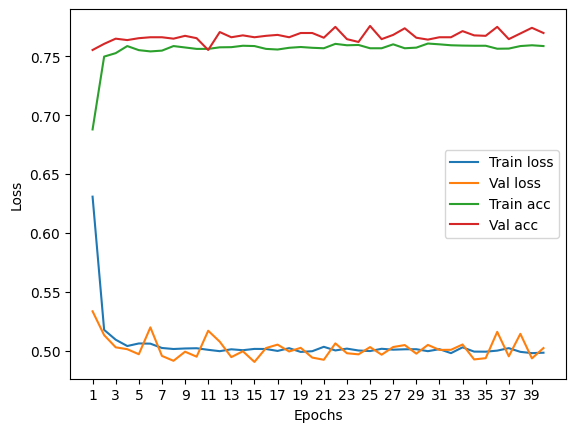

****************************************************************************************************



118it [00:00, 129.76it/s]


Train Epoch: 0 	Loss: 0.606658, Accuracy: 5249/7500 (70%)
Val Epoch: 0 	Loss: 0.559555, Accuracy: 1745/2500 (70%)



118it [00:00, 134.48it/s]


Train Epoch: 1 	Loss: 0.506382, Accuracy: 5705/7500 (76%)
Val Epoch: 1 	Loss: 0.521609, Accuracy: 1898/2500 (76%)



118it [00:00, 123.60it/s]


Train Epoch: 2 	Loss: 0.497844, Accuracy: 5743/7500 (77%)
Val Epoch: 2 	Loss: 0.510464, Accuracy: 1916/2500 (77%)



118it [00:00, 136.97it/s]


Train Epoch: 3 	Loss: 0.490278, Accuracy: 5765/7500 (77%)
Val Epoch: 3 	Loss: 0.509711, Accuracy: 1905/2500 (76%)



118it [00:00, 145.08it/s]


Train Epoch: 4 	Loss: 0.484478, Accuracy: 5800/7500 (77%)
Val Epoch: 4 	Loss: 0.495202, Accuracy: 1914/2500 (77%)



118it [00:00, 125.62it/s]


Train Epoch: 5 	Loss: 0.483106, Accuracy: 5795/7500 (77%)
Val Epoch: 5 	Loss: 0.499749, Accuracy: 1907/2500 (76%)



118it [00:00, 130.03it/s]


Train Epoch: 6 	Loss: 0.484196, Accuracy: 5816/7500 (78%)
Val Epoch: 6 	Loss: 0.496886, Accuracy: 1912/2500 (76%)



118it [00:01, 117.77it/s]


Train Epoch: 7 	Loss: 0.483253, Accuracy: 5831/7500 (78%)
Val Epoch: 7 	Loss: 0.510822, Accuracy: 1920/2500 (77%)



118it [00:00, 122.79it/s]


Train Epoch: 8 	Loss: 0.481064, Accuracy: 5847/7500 (78%)
Val Epoch: 8 	Loss: 0.507950, Accuracy: 1919/2500 (77%)



118it [00:00, 123.56it/s]


Train Epoch: 9 	Loss: 0.481824, Accuracy: 5832/7500 (78%)
Val Epoch: 9 	Loss: 0.498445, Accuracy: 1920/2500 (77%)



118it [00:00, 121.70it/s]


Train Epoch: 10 	Loss: 0.482603, Accuracy: 5843/7500 (78%)
Val Epoch: 10 	Loss: 0.495366, Accuracy: 1907/2500 (76%)



118it [00:00, 123.70it/s]


Train Epoch: 11 	Loss: 0.477729, Accuracy: 5836/7500 (78%)
Val Epoch: 11 	Loss: 0.518144, Accuracy: 1903/2500 (76%)



118it [00:00, 132.31it/s]


Train Epoch: 12 	Loss: 0.479244, Accuracy: 5832/7500 (78%)
Val Epoch: 12 	Loss: 0.500265, Accuracy: 1910/2500 (76%)



118it [00:00, 125.58it/s]


Train Epoch: 13 	Loss: 0.479047, Accuracy: 5836/7500 (78%)
Val Epoch: 13 	Loss: 0.499695, Accuracy: 1906/2500 (76%)



118it [00:01, 115.99it/s]


Train Epoch: 14 	Loss: 0.481661, Accuracy: 5837/7500 (78%)
Val Epoch: 14 	Loss: 0.497257, Accuracy: 1912/2500 (76%)



118it [00:00, 132.18it/s]


Train Epoch: 15 	Loss: 0.477766, Accuracy: 5838/7500 (78%)
Val Epoch: 15 	Loss: 0.515847, Accuracy: 1920/2500 (77%)



118it [00:00, 136.91it/s]


Train Epoch: 16 	Loss: 0.476513, Accuracy: 5845/7500 (78%)
Val Epoch: 16 	Loss: 0.493457, Accuracy: 1920/2500 (77%)



118it [00:00, 137.24it/s]


Train Epoch: 17 	Loss: 0.481102, Accuracy: 5838/7500 (78%)
Val Epoch: 17 	Loss: 0.509181, Accuracy: 1922/2500 (77%)



118it [00:00, 153.98it/s]


Train Epoch: 18 	Loss: 0.479911, Accuracy: 5857/7500 (78%)
Val Epoch: 18 	Loss: 0.495149, Accuracy: 1907/2500 (76%)



118it [00:00, 121.46it/s]


Train Epoch: 19 	Loss: 0.476790, Accuracy: 5851/7500 (78%)
Val Epoch: 19 	Loss: 0.497424, Accuracy: 1917/2500 (77%)



118it [00:00, 134.66it/s]


Train Epoch: 20 	Loss: 0.479665, Accuracy: 5831/7500 (78%)
Val Epoch: 20 	Loss: 0.502893, Accuracy: 1915/2500 (77%)



118it [00:00, 125.44it/s]


Train Epoch: 21 	Loss: 0.476312, Accuracy: 5852/7500 (78%)
Val Epoch: 21 	Loss: 0.501973, Accuracy: 1925/2500 (77%)



118it [00:01, 109.15it/s]


Train Epoch: 22 	Loss: 0.475792, Accuracy: 5861/7500 (78%)
Val Epoch: 22 	Loss: 0.494539, Accuracy: 1917/2500 (77%)



118it [00:00, 127.73it/s]


Train Epoch: 23 	Loss: 0.477416, Accuracy: 5848/7500 (78%)
Val Epoch: 23 	Loss: 0.512184, Accuracy: 1917/2500 (77%)



118it [00:00, 139.68it/s]


Train Epoch: 24 	Loss: 0.477164, Accuracy: 5863/7500 (78%)
Val Epoch: 24 	Loss: 0.505066, Accuracy: 1920/2500 (77%)



118it [00:00, 130.08it/s]


Train Epoch: 25 	Loss: 0.477720, Accuracy: 5844/7500 (78%)
Val Epoch: 25 	Loss: 0.501786, Accuracy: 1921/2500 (77%)



118it [00:00, 127.90it/s]


Train Epoch: 26 	Loss: 0.478946, Accuracy: 5833/7500 (78%)
Val Epoch: 26 	Loss: 0.509463, Accuracy: 1919/2500 (77%)



118it [00:00, 129.75it/s]


Train Epoch: 27 	Loss: 0.479746, Accuracy: 5854/7500 (78%)
Val Epoch: 27 	Loss: 0.494137, Accuracy: 1925/2500 (77%)



118it [00:01, 116.05it/s]


Train Epoch: 28 	Loss: 0.477989, Accuracy: 5831/7500 (78%)
Val Epoch: 28 	Loss: 0.496476, Accuracy: 1924/2500 (77%)



118it [00:01, 117.63it/s]


Train Epoch: 29 	Loss: 0.478626, Accuracy: 5847/7500 (78%)
Val Epoch: 29 	Loss: 0.500401, Accuracy: 1923/2500 (77%)



118it [00:00, 123.60it/s]


Train Epoch: 30 	Loss: 0.478103, Accuracy: 5857/7500 (78%)
Val Epoch: 30 	Loss: 0.506234, Accuracy: 1922/2500 (77%)



118it [00:00, 134.68it/s]


Train Epoch: 31 	Loss: 0.474064, Accuracy: 5826/7500 (78%)
Val Epoch: 31 	Loss: 0.506601, Accuracy: 1924/2500 (77%)



118it [00:00, 125.31it/s]


Train Epoch: 32 	Loss: 0.477565, Accuracy: 5842/7500 (78%)
Val Epoch: 32 	Loss: 0.493569, Accuracy: 1918/2500 (77%)



118it [00:00, 123.46it/s]


Train Epoch: 33 	Loss: 0.477421, Accuracy: 5836/7500 (78%)
Val Epoch: 33 	Loss: 0.507946, Accuracy: 1920/2500 (77%)



118it [00:00, 125.51it/s]


Train Epoch: 34 	Loss: 0.476755, Accuracy: 5858/7500 (78%)
Val Epoch: 34 	Loss: 0.512315, Accuracy: 1904/2500 (76%)



118it [00:00, 118.90it/s]


Train Epoch: 35 	Loss: 0.478922, Accuracy: 5862/7500 (78%)
Val Epoch: 35 	Loss: 0.496173, Accuracy: 1916/2500 (77%)



118it [00:00, 128.37it/s]


Train Epoch: 36 	Loss: 0.474680, Accuracy: 5876/7500 (78%)
Val Epoch: 36 	Loss: 0.493967, Accuracy: 1924/2500 (77%)



118it [00:00, 142.24it/s]


Train Epoch: 37 	Loss: 0.475670, Accuracy: 5864/7500 (78%)
Val Epoch: 37 	Loss: 0.495646, Accuracy: 1907/2500 (76%)



118it [00:00, 139.74it/s]


Train Epoch: 38 	Loss: 0.477260, Accuracy: 5845/7500 (78%)
Val Epoch: 38 	Loss: 0.494561, Accuracy: 1910/2500 (76%)



118it [00:00, 130.02it/s]


Train Epoch: 39 	Loss: 0.475573, Accuracy: 5861/7500 (78%)
Val Epoch: 39 	Loss: 0.493625, Accuracy: 1914/2500 (77%)

Test accuracy:  77.44


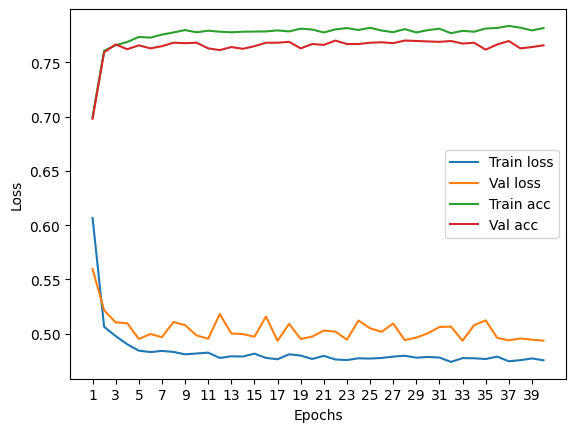

****************************************************************************************************



118it [00:00, 134.77it/s]


Train Epoch: 0 	Loss: 0.605948, Accuracy: 5171/7500 (69%)
Val Epoch: 0 	Loss: 0.512146, Accuracy: 1917/2500 (77%)



118it [00:01, 117.63it/s]


Train Epoch: 1 	Loss: 0.508825, Accuracy: 5720/7500 (76%)
Val Epoch: 1 	Loss: 0.505514, Accuracy: 1904/2500 (76%)



118it [00:00, 127.62it/s]


Train Epoch: 2 	Loss: 0.501075, Accuracy: 5732/7500 (76%)
Val Epoch: 2 	Loss: 0.486527, Accuracy: 1956/2500 (78%)



118it [00:01, 110.90it/s]


Train Epoch: 3 	Loss: 0.499032, Accuracy: 5746/7500 (77%)
Val Epoch: 3 	Loss: 0.478642, Accuracy: 1949/2500 (78%)



118it [00:00, 129.94it/s]


Train Epoch: 4 	Loss: 0.498257, Accuracy: 5763/7500 (77%)
Val Epoch: 4 	Loss: 0.482609, Accuracy: 1959/2500 (78%)



118it [00:00, 129.77it/s]


Train Epoch: 5 	Loss: 0.496152, Accuracy: 5760/7500 (77%)
Val Epoch: 5 	Loss: 0.481429, Accuracy: 1956/2500 (78%)



118it [00:00, 139.37it/s]


Train Epoch: 6 	Loss: 0.494740, Accuracy: 5785/7500 (77%)
Val Epoch: 6 	Loss: 0.472403, Accuracy: 1953/2500 (78%)



118it [00:00, 139.64it/s]


Train Epoch: 7 	Loss: 0.494913, Accuracy: 5774/7500 (77%)
Val Epoch: 7 	Loss: 0.508448, Accuracy: 1924/2500 (77%)



118it [00:00, 137.14it/s]


Train Epoch: 8 	Loss: 0.494786, Accuracy: 5760/7500 (77%)
Val Epoch: 8 	Loss: 0.487729, Accuracy: 1951/2500 (78%)



118it [00:00, 127.74it/s]


Train Epoch: 9 	Loss: 0.495279, Accuracy: 5767/7500 (77%)
Val Epoch: 9 	Loss: 0.484767, Accuracy: 1952/2500 (78%)



118it [00:00, 127.81it/s]


Train Epoch: 10 	Loss: 0.496274, Accuracy: 5758/7500 (77%)
Val Epoch: 10 	Loss: 0.475221, Accuracy: 1946/2500 (78%)



118it [00:00, 121.54it/s]


Train Epoch: 11 	Loss: 0.496404, Accuracy: 5750/7500 (77%)
Val Epoch: 11 	Loss: 0.473083, Accuracy: 1950/2500 (78%)



118it [00:00, 119.48it/s]


Train Epoch: 12 	Loss: 0.494770, Accuracy: 5780/7500 (77%)
Val Epoch: 12 	Loss: 0.479774, Accuracy: 1957/2500 (78%)



118it [00:01, 110.75it/s]


Train Epoch: 13 	Loss: 0.498565, Accuracy: 5787/7500 (77%)
Val Epoch: 13 	Loss: 0.486347, Accuracy: 1951/2500 (78%)



118it [00:00, 125.33it/s]


Train Epoch: 14 	Loss: 0.497525, Accuracy: 5762/7500 (77%)
Val Epoch: 14 	Loss: 0.507705, Accuracy: 1894/2500 (76%)



118it [00:00, 130.19it/s]


Train Epoch: 15 	Loss: 0.492941, Accuracy: 5764/7500 (77%)
Val Epoch: 15 	Loss: 0.472144, Accuracy: 1949/2500 (78%)



118it [00:00, 123.35it/s]


Train Epoch: 16 	Loss: 0.492773, Accuracy: 5788/7500 (77%)
Val Epoch: 16 	Loss: 0.487507, Accuracy: 1961/2500 (78%)



118it [00:00, 123.34it/s]


Train Epoch: 17 	Loss: 0.493385, Accuracy: 5783/7500 (77%)
Val Epoch: 17 	Loss: 0.481201, Accuracy: 1954/2500 (78%)



118it [00:00, 130.84it/s]


Train Epoch: 18 	Loss: 0.492459, Accuracy: 5781/7500 (77%)
Val Epoch: 18 	Loss: 0.480030, Accuracy: 1957/2500 (78%)



118it [00:01, 100.20it/s]


Train Epoch: 19 	Loss: 0.491918, Accuracy: 5785/7500 (77%)
Val Epoch: 19 	Loss: 0.483451, Accuracy: 1956/2500 (78%)



118it [00:00, 123.59it/s]


Train Epoch: 20 	Loss: 0.493161, Accuracy: 5767/7500 (77%)
Val Epoch: 20 	Loss: 0.480081, Accuracy: 1952/2500 (78%)



118it [00:01, 115.98it/s]


Train Epoch: 21 	Loss: 0.499431, Accuracy: 5753/7500 (77%)
Val Epoch: 21 	Loss: 0.479878, Accuracy: 1962/2500 (78%)



118it [00:00, 134.58it/s]


Train Epoch: 22 	Loss: 0.492401, Accuracy: 5799/7500 (77%)
Val Epoch: 22 	Loss: 0.476492, Accuracy: 1972/2500 (79%)



118it [00:00, 142.09it/s]


Train Epoch: 23 	Loss: 0.491022, Accuracy: 5815/7500 (78%)
Val Epoch: 23 	Loss: 0.492084, Accuracy: 1945/2500 (78%)



118it [00:01, 114.32it/s]


Train Epoch: 24 	Loss: 0.490340, Accuracy: 5801/7500 (77%)
Val Epoch: 24 	Loss: 0.488173, Accuracy: 1942/2500 (78%)



118it [00:01, 115.89it/s]


Train Epoch: 25 	Loss: 0.489862, Accuracy: 5797/7500 (77%)
Val Epoch: 25 	Loss: 0.482107, Accuracy: 1962/2500 (78%)



118it [00:00, 119.47it/s]


Train Epoch: 26 	Loss: 0.489519, Accuracy: 5778/7500 (77%)
Val Epoch: 26 	Loss: 0.480736, Accuracy: 1968/2500 (79%)



118it [00:00, 139.43it/s]


Train Epoch: 27 	Loss: 0.489877, Accuracy: 5790/7500 (77%)
Val Epoch: 27 	Loss: 0.480955, Accuracy: 1971/2500 (79%)



118it [00:01, 109.38it/s]


Train Epoch: 28 	Loss: 0.490596, Accuracy: 5789/7500 (77%)
Val Epoch: 28 	Loss: 0.474910, Accuracy: 1967/2500 (79%)



118it [00:00, 125.73it/s]


Train Epoch: 29 	Loss: 0.490393, Accuracy: 5801/7500 (77%)
Val Epoch: 29 	Loss: 0.478785, Accuracy: 1963/2500 (79%)



118it [00:01, 110.74it/s]


Train Epoch: 30 	Loss: 0.491694, Accuracy: 5783/7500 (77%)
Val Epoch: 30 	Loss: 0.472669, Accuracy: 1969/2500 (79%)



118it [00:00, 127.40it/s]


Train Epoch: 31 	Loss: 0.490041, Accuracy: 5800/7500 (77%)
Val Epoch: 31 	Loss: 0.478764, Accuracy: 1957/2500 (78%)



118it [00:00, 121.62it/s]


Train Epoch: 32 	Loss: 0.489761, Accuracy: 5813/7500 (78%)
Val Epoch: 32 	Loss: 0.470183, Accuracy: 1968/2500 (79%)



118it [00:00, 125.78it/s]


Train Epoch: 33 	Loss: 0.488851, Accuracy: 5815/7500 (78%)
Val Epoch: 33 	Loss: 0.492536, Accuracy: 1953/2500 (78%)



118it [00:00, 125.78it/s]


Train Epoch: 34 	Loss: 0.490393, Accuracy: 5790/7500 (77%)
Val Epoch: 34 	Loss: 0.474552, Accuracy: 1954/2500 (78%)



118it [00:01, 114.19it/s]


Train Epoch: 35 	Loss: 0.487974, Accuracy: 5812/7500 (77%)
Val Epoch: 35 	Loss: 0.506384, Accuracy: 1915/2500 (77%)



118it [00:00, 123.49it/s]


Train Epoch: 36 	Loss: 0.492995, Accuracy: 5764/7500 (77%)
Val Epoch: 36 	Loss: 0.479400, Accuracy: 1954/2500 (78%)



118it [00:01, 114.21it/s]


Train Epoch: 37 	Loss: 0.491895, Accuracy: 5809/7500 (77%)
Val Epoch: 37 	Loss: 0.478420, Accuracy: 1957/2500 (78%)



118it [00:00, 142.14it/s]


Train Epoch: 38 	Loss: 0.488688, Accuracy: 5813/7500 (78%)
Val Epoch: 38 	Loss: 0.475489, Accuracy: 1971/2500 (79%)



118it [00:01, 115.83it/s]


Train Epoch: 39 	Loss: 0.488232, Accuracy: 5824/7500 (78%)
Val Epoch: 39 	Loss: 0.469570, Accuracy: 1967/2500 (79%)

Test accuracy:  75.96000000000001


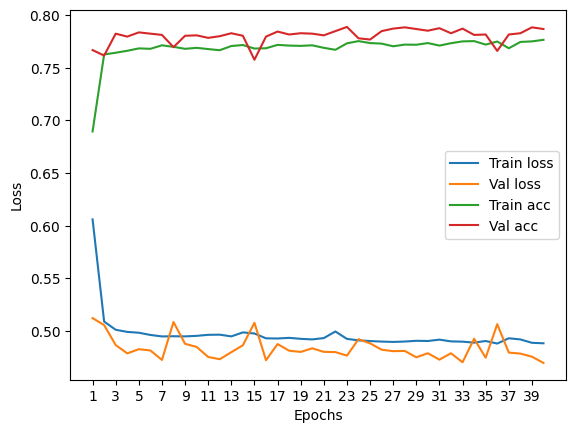

****************************************************************************************************



118it [00:00, 138.74it/s]


Train Epoch: 0 	Loss: 0.619333, Accuracy: 5016/7500 (67%)
Val Epoch: 0 	Loss: 0.532682, Accuracy: 1879/2500 (75%)



118it [00:00, 130.06it/s]


Train Epoch: 1 	Loss: 0.519651, Accuracy: 5666/7500 (76%)
Val Epoch: 1 	Loss: 0.502885, Accuracy: 1894/2500 (76%)



118it [00:01, 112.46it/s]


Train Epoch: 2 	Loss: 0.504500, Accuracy: 5728/7500 (76%)
Val Epoch: 2 	Loss: 0.500015, Accuracy: 1894/2500 (76%)



118it [00:00, 123.64it/s]


Train Epoch: 3 	Loss: 0.505173, Accuracy: 5718/7500 (76%)
Val Epoch: 3 	Loss: 0.499921, Accuracy: 1901/2500 (76%)



118it [00:00, 123.51it/s]


Train Epoch: 4 	Loss: 0.499141, Accuracy: 5764/7500 (77%)
Val Epoch: 4 	Loss: 0.495836, Accuracy: 1916/2500 (77%)



118it [00:00, 123.38it/s]


Train Epoch: 5 	Loss: 0.497596, Accuracy: 5743/7500 (77%)
Val Epoch: 5 	Loss: 0.502999, Accuracy: 1923/2500 (77%)



118it [00:00, 141.87it/s]


Train Epoch: 6 	Loss: 0.498269, Accuracy: 5746/7500 (77%)
Val Epoch: 6 	Loss: 0.498473, Accuracy: 1913/2500 (77%)



118it [00:00, 125.76it/s]


Train Epoch: 7 	Loss: 0.496851, Accuracy: 5775/7500 (77%)
Val Epoch: 7 	Loss: 0.507302, Accuracy: 1901/2500 (76%)



118it [00:01, 109.11it/s]


Train Epoch: 8 	Loss: 0.496848, Accuracy: 5738/7500 (77%)
Val Epoch: 8 	Loss: 0.497593, Accuracy: 1904/2500 (76%)



118it [00:01, 106.17it/s]


Train Epoch: 9 	Loss: 0.500873, Accuracy: 5740/7500 (77%)
Val Epoch: 9 	Loss: 0.497481, Accuracy: 1917/2500 (77%)



118it [00:01, 117.83it/s]


Train Epoch: 10 	Loss: 0.500475, Accuracy: 5735/7500 (76%)
Val Epoch: 10 	Loss: 0.491745, Accuracy: 1906/2500 (76%)



118it [00:00, 132.24it/s]


Train Epoch: 11 	Loss: 0.496074, Accuracy: 5745/7500 (77%)
Val Epoch: 11 	Loss: 0.492258, Accuracy: 1916/2500 (77%)



118it [00:00, 139.69it/s]


Train Epoch: 12 	Loss: 0.497552, Accuracy: 5757/7500 (77%)
Val Epoch: 12 	Loss: 0.498027, Accuracy: 1913/2500 (77%)



118it [00:00, 136.33it/s]


Train Epoch: 13 	Loss: 0.495489, Accuracy: 5763/7500 (77%)
Val Epoch: 13 	Loss: 0.497626, Accuracy: 1910/2500 (76%)



118it [00:00, 139.72it/s]


Train Epoch: 14 	Loss: 0.497066, Accuracy: 5766/7500 (77%)
Val Epoch: 14 	Loss: 0.503241, Accuracy: 1915/2500 (77%)



118it [00:00, 127.82it/s]


Train Epoch: 15 	Loss: 0.493386, Accuracy: 5771/7500 (77%)
Val Epoch: 15 	Loss: 0.500760, Accuracy: 1915/2500 (77%)



118it [00:00, 132.19it/s]


Train Epoch: 16 	Loss: 0.494138, Accuracy: 5787/7500 (77%)
Val Epoch: 16 	Loss: 0.498467, Accuracy: 1904/2500 (76%)



118it [00:00, 134.67it/s]


Train Epoch: 17 	Loss: 0.494688, Accuracy: 5775/7500 (77%)
Val Epoch: 17 	Loss: 0.500984, Accuracy: 1912/2500 (76%)



118it [00:00, 136.85it/s]


Train Epoch: 18 	Loss: 0.493391, Accuracy: 5778/7500 (77%)
Val Epoch: 18 	Loss: 0.489976, Accuracy: 1910/2500 (76%)



118it [00:00, 119.29it/s]


Train Epoch: 19 	Loss: 0.496497, Accuracy: 5745/7500 (77%)
Val Epoch: 19 	Loss: 0.490421, Accuracy: 1917/2500 (77%)



118it [00:00, 123.65it/s]


Train Epoch: 20 	Loss: 0.496764, Accuracy: 5756/7500 (77%)
Val Epoch: 20 	Loss: 0.494392, Accuracy: 1918/2500 (77%)



118it [00:00, 123.68it/s]


Train Epoch: 21 	Loss: 0.494042, Accuracy: 5774/7500 (77%)
Val Epoch: 21 	Loss: 0.497310, Accuracy: 1917/2500 (77%)



118it [00:00, 139.68it/s]


Train Epoch: 22 	Loss: 0.493092, Accuracy: 5774/7500 (77%)
Val Epoch: 22 	Loss: 0.507488, Accuracy: 1913/2500 (77%)



118it [00:00, 132.21it/s]


Train Epoch: 23 	Loss: 0.492673, Accuracy: 5780/7500 (77%)
Val Epoch: 23 	Loss: 0.492260, Accuracy: 1915/2500 (77%)



118it [00:01, 112.59it/s]


Train Epoch: 24 	Loss: 0.494540, Accuracy: 5783/7500 (77%)
Val Epoch: 24 	Loss: 0.506452, Accuracy: 1915/2500 (77%)



118it [00:00, 121.63it/s]


Train Epoch: 25 	Loss: 0.494744, Accuracy: 5767/7500 (77%)
Val Epoch: 25 	Loss: 0.497174, Accuracy: 1923/2500 (77%)



118it [00:00, 142.01it/s]


Train Epoch: 26 	Loss: 0.493790, Accuracy: 5783/7500 (77%)
Val Epoch: 26 	Loss: 0.503341, Accuracy: 1918/2500 (77%)



118it [00:00, 125.11it/s]


Train Epoch: 27 	Loss: 0.491696, Accuracy: 5790/7500 (77%)
Val Epoch: 27 	Loss: 0.492399, Accuracy: 1913/2500 (77%)



118it [00:01, 110.72it/s]


Train Epoch: 28 	Loss: 0.493368, Accuracy: 5766/7500 (77%)
Val Epoch: 28 	Loss: 0.502344, Accuracy: 1911/2500 (76%)



118it [00:00, 132.39it/s]


Train Epoch: 29 	Loss: 0.495898, Accuracy: 5769/7500 (77%)
Val Epoch: 29 	Loss: 0.494239, Accuracy: 1918/2500 (77%)



118it [00:01, 117.70it/s]


Train Epoch: 30 	Loss: 0.499032, Accuracy: 5742/7500 (77%)
Val Epoch: 30 	Loss: 0.498196, Accuracy: 1902/2500 (76%)



118it [00:00, 134.46it/s]


Train Epoch: 31 	Loss: 0.493193, Accuracy: 5758/7500 (77%)
Val Epoch: 31 	Loss: 0.490680, Accuracy: 1936/2500 (77%)



118it [00:00, 127.79it/s]


Train Epoch: 32 	Loss: 0.493393, Accuracy: 5766/7500 (77%)
Val Epoch: 32 	Loss: 0.497531, Accuracy: 1927/2500 (77%)



118it [00:00, 127.87it/s]


Train Epoch: 33 	Loss: 0.491492, Accuracy: 5778/7500 (77%)
Val Epoch: 33 	Loss: 0.512139, Accuracy: 1918/2500 (77%)



118it [00:00, 123.57it/s]


Train Epoch: 34 	Loss: 0.491899, Accuracy: 5763/7500 (77%)
Val Epoch: 34 	Loss: 0.503828, Accuracy: 1927/2500 (77%)



118it [00:00, 130.02it/s]


Train Epoch: 35 	Loss: 0.492975, Accuracy: 5750/7500 (77%)
Val Epoch: 35 	Loss: 0.494069, Accuracy: 1920/2500 (77%)



118it [00:00, 127.86it/s]


Train Epoch: 36 	Loss: 0.490657, Accuracy: 5800/7500 (77%)
Val Epoch: 36 	Loss: 0.501387, Accuracy: 1912/2500 (76%)



118it [00:00, 125.72it/s]


Train Epoch: 37 	Loss: 0.494049, Accuracy: 5770/7500 (77%)
Val Epoch: 37 	Loss: 0.485415, Accuracy: 1919/2500 (77%)



118it [00:00, 147.83it/s]


Train Epoch: 38 	Loss: 0.494988, Accuracy: 5775/7500 (77%)
Val Epoch: 38 	Loss: 0.494417, Accuracy: 1915/2500 (77%)



118it [00:01, 106.03it/s]


Train Epoch: 39 	Loss: 0.493088, Accuracy: 5773/7500 (77%)
Val Epoch: 39 	Loss: 0.505799, Accuracy: 1925/2500 (77%)

Test accuracy:  78.75999999999999


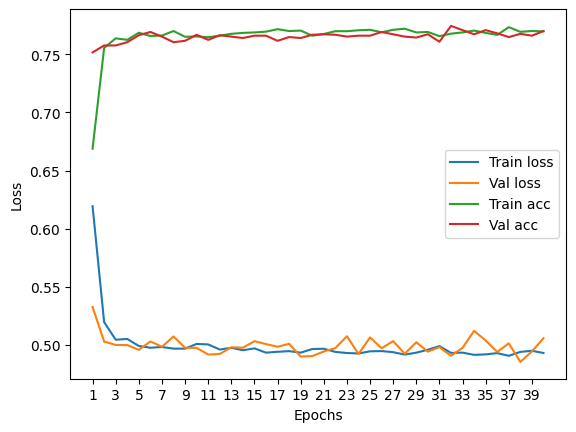

****************************************************************************************************



118it [00:00, 123.80it/s]


Train Epoch: 0 	Loss: 0.603784, Accuracy: 5361/7500 (71%)
Val Epoch: 0 	Loss: 0.516084, Accuracy: 1951/2500 (78%)



118it [00:01, 108.92it/s]


Train Epoch: 1 	Loss: 0.523489, Accuracy: 5635/7500 (75%)
Val Epoch: 1 	Loss: 0.509630, Accuracy: 1914/2500 (77%)



118it [00:00, 139.67it/s]


Train Epoch: 2 	Loss: 0.513233, Accuracy: 5697/7500 (76%)
Val Epoch: 2 	Loss: 0.506114, Accuracy: 1952/2500 (78%)



118it [00:01, 106.10it/s]


Train Epoch: 3 	Loss: 0.509658, Accuracy: 5724/7500 (76%)
Val Epoch: 3 	Loss: 0.508288, Accuracy: 1900/2500 (76%)



118it [00:00, 121.56it/s]


Train Epoch: 4 	Loss: 0.514057, Accuracy: 5708/7500 (76%)
Val Epoch: 4 	Loss: 0.523395, Accuracy: 1899/2500 (76%)



118it [00:00, 132.15it/s]


Train Epoch: 5 	Loss: 0.508382, Accuracy: 5696/7500 (76%)
Val Epoch: 5 	Loss: 0.496077, Accuracy: 1920/2500 (77%)



118it [00:00, 119.62it/s]


Train Epoch: 6 	Loss: 0.510030, Accuracy: 5714/7500 (76%)
Val Epoch: 6 	Loss: 0.523969, Accuracy: 1907/2500 (76%)



118it [00:00, 119.39it/s]


Train Epoch: 7 	Loss: 0.505566, Accuracy: 5744/7500 (77%)
Val Epoch: 7 	Loss: 0.502654, Accuracy: 1945/2500 (78%)



118it [00:00, 127.70it/s]


Train Epoch: 8 	Loss: 0.506510, Accuracy: 5732/7500 (76%)
Val Epoch: 8 	Loss: 0.492359, Accuracy: 1936/2500 (77%)



118it [00:00, 121.05it/s]


Train Epoch: 9 	Loss: 0.507924, Accuracy: 5750/7500 (77%)
Val Epoch: 9 	Loss: 0.500373, Accuracy: 1943/2500 (78%)



118it [00:01, 112.44it/s]


Train Epoch: 10 	Loss: 0.504226, Accuracy: 5737/7500 (76%)
Val Epoch: 10 	Loss: 0.501193, Accuracy: 1946/2500 (78%)



118it [00:00, 139.48it/s]


Train Epoch: 11 	Loss: 0.501872, Accuracy: 5755/7500 (77%)
Val Epoch: 11 	Loss: 0.499868, Accuracy: 1928/2500 (77%)



118it [00:01, 109.32it/s]


Train Epoch: 12 	Loss: 0.502502, Accuracy: 5762/7500 (77%)
Val Epoch: 12 	Loss: 0.487290, Accuracy: 1955/2500 (78%)



118it [00:01, 109.76it/s]


Train Epoch: 13 	Loss: 0.500841, Accuracy: 5770/7500 (77%)
Val Epoch: 13 	Loss: 0.489700, Accuracy: 1942/2500 (78%)



118it [00:00, 121.28it/s]


Train Epoch: 14 	Loss: 0.497854, Accuracy: 5762/7500 (77%)
Val Epoch: 14 	Loss: 0.493466, Accuracy: 1945/2500 (78%)



118it [00:00, 121.60it/s]


Train Epoch: 15 	Loss: 0.496744, Accuracy: 5792/7500 (77%)
Val Epoch: 15 	Loss: 0.498955, Accuracy: 1954/2500 (78%)



118it [00:00, 119.53it/s]


Train Epoch: 16 	Loss: 0.498405, Accuracy: 5781/7500 (77%)
Val Epoch: 16 	Loss: 0.499921, Accuracy: 1954/2500 (78%)



118it [00:00, 130.16it/s]


Train Epoch: 17 	Loss: 0.497439, Accuracy: 5787/7500 (77%)
Val Epoch: 17 	Loss: 0.491212, Accuracy: 1935/2500 (77%)



118it [00:00, 132.29it/s]


Train Epoch: 18 	Loss: 0.496677, Accuracy: 5770/7500 (77%)
Val Epoch: 18 	Loss: 0.490845, Accuracy: 1957/2500 (78%)



118it [00:01, 117.87it/s]


Train Epoch: 19 	Loss: 0.496528, Accuracy: 5780/7500 (77%)
Val Epoch: 19 	Loss: 0.489208, Accuracy: 1942/2500 (78%)



118it [00:00, 134.70it/s]


Train Epoch: 20 	Loss: 0.496795, Accuracy: 5778/7500 (77%)
Val Epoch: 20 	Loss: 0.489316, Accuracy: 1954/2500 (78%)



118it [00:01, 114.24it/s]


Train Epoch: 21 	Loss: 0.496085, Accuracy: 5781/7500 (77%)
Val Epoch: 21 	Loss: 0.498160, Accuracy: 1950/2500 (78%)



118it [00:00, 119.09it/s]


Train Epoch: 22 	Loss: 0.495751, Accuracy: 5782/7500 (77%)
Val Epoch: 22 	Loss: 0.484568, Accuracy: 1950/2500 (78%)



118it [00:00, 127.18it/s]


Train Epoch: 23 	Loss: 0.493455, Accuracy: 5803/7500 (77%)
Val Epoch: 23 	Loss: 0.498902, Accuracy: 1960/2500 (78%)



118it [00:00, 121.54it/s]


Train Epoch: 24 	Loss: 0.494260, Accuracy: 5783/7500 (77%)
Val Epoch: 24 	Loss: 0.491068, Accuracy: 1949/2500 (78%)



118it [00:00, 132.43it/s]


Train Epoch: 25 	Loss: 0.495928, Accuracy: 5811/7500 (77%)
Val Epoch: 25 	Loss: 0.503288, Accuracy: 1942/2500 (78%)



118it [00:00, 123.25it/s]


Train Epoch: 26 	Loss: 0.494347, Accuracy: 5785/7500 (77%)
Val Epoch: 26 	Loss: 0.499247, Accuracy: 1936/2500 (77%)



118it [00:01, 115.81it/s]


Train Epoch: 27 	Loss: 0.494842, Accuracy: 5786/7500 (77%)
Val Epoch: 27 	Loss: 0.485237, Accuracy: 1954/2500 (78%)



118it [00:00, 132.37it/s]


Train Epoch: 28 	Loss: 0.495482, Accuracy: 5792/7500 (77%)
Val Epoch: 28 	Loss: 0.508320, Accuracy: 1941/2500 (78%)



118it [00:00, 129.98it/s]


Train Epoch: 29 	Loss: 0.492490, Accuracy: 5790/7500 (77%)
Val Epoch: 29 	Loss: 0.499921, Accuracy: 1952/2500 (78%)



118it [00:00, 125.77it/s]


Train Epoch: 30 	Loss: 0.493621, Accuracy: 5779/7500 (77%)
Val Epoch: 30 	Loss: 0.489315, Accuracy: 1947/2500 (78%)



118it [00:00, 134.60it/s]


Train Epoch: 31 	Loss: 0.495576, Accuracy: 5805/7500 (77%)
Val Epoch: 31 	Loss: 0.488922, Accuracy: 1946/2500 (78%)



118it [00:01, 109.21it/s]


Train Epoch: 32 	Loss: 0.492450, Accuracy: 5798/7500 (77%)
Val Epoch: 32 	Loss: 0.494171, Accuracy: 1943/2500 (78%)



118it [00:01, 112.60it/s]


Train Epoch: 33 	Loss: 0.492530, Accuracy: 5798/7500 (77%)
Val Epoch: 33 	Loss: 0.494313, Accuracy: 1945/2500 (78%)



118it [00:00, 123.60it/s]


Train Epoch: 34 	Loss: 0.492464, Accuracy: 5804/7500 (77%)
Val Epoch: 34 	Loss: 0.485159, Accuracy: 1948/2500 (78%)



118it [00:00, 121.58it/s]


Train Epoch: 35 	Loss: 0.494757, Accuracy: 5777/7500 (77%)
Val Epoch: 35 	Loss: 0.485859, Accuracy: 1952/2500 (78%)



118it [00:00, 125.53it/s]


Train Epoch: 36 	Loss: 0.493238, Accuracy: 5796/7500 (77%)
Val Epoch: 36 	Loss: 0.489433, Accuracy: 1946/2500 (78%)



118it [00:00, 121.82it/s]


Train Epoch: 37 	Loss: 0.493031, Accuracy: 5800/7500 (77%)
Val Epoch: 37 	Loss: 0.497506, Accuracy: 1939/2500 (78%)



118it [00:00, 132.25it/s]


Train Epoch: 38 	Loss: 0.494160, Accuracy: 5784/7500 (77%)
Val Epoch: 38 	Loss: 0.484722, Accuracy: 1948/2500 (78%)



118it [00:00, 134.65it/s]


Train Epoch: 39 	Loss: 0.491044, Accuracy: 5797/7500 (77%)
Val Epoch: 39 	Loss: 0.483606, Accuracy: 1948/2500 (78%)

Test accuracy:  76.12


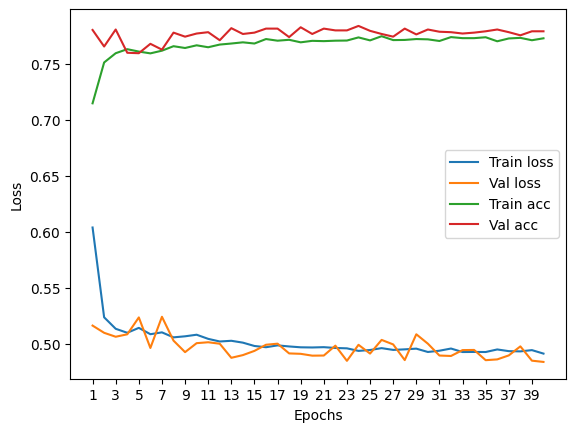

****************************************************************************************************



118it [00:00, 127.83it/s]


Train Epoch: 0 	Loss: 0.616575, Accuracy: 5124/7500 (68%)
Val Epoch: 0 	Loss: 0.561519, Accuracy: 1791/2500 (72%)



118it [00:00, 121.59it/s]


Train Epoch: 1 	Loss: 0.510172, Accuracy: 5709/7500 (76%)
Val Epoch: 1 	Loss: 0.516850, Accuracy: 1900/2500 (76%)



118it [00:00, 125.54it/s]


Train Epoch: 2 	Loss: 0.498809, Accuracy: 5755/7500 (77%)
Val Epoch: 2 	Loss: 0.499722, Accuracy: 1928/2500 (77%)



118it [00:00, 132.28it/s]


Train Epoch: 3 	Loss: 0.490513, Accuracy: 5808/7500 (77%)
Val Epoch: 3 	Loss: 0.495954, Accuracy: 1922/2500 (77%)



118it [00:00, 135.42it/s]


Train Epoch: 4 	Loss: 0.489217, Accuracy: 5811/7500 (77%)
Val Epoch: 4 	Loss: 0.508450, Accuracy: 1918/2500 (77%)



118it [00:01, 104.04it/s]


Train Epoch: 5 	Loss: 0.491884, Accuracy: 5780/7500 (77%)
Val Epoch: 5 	Loss: 0.501695, Accuracy: 1893/2500 (76%)



118it [00:00, 121.69it/s]


Train Epoch: 6 	Loss: 0.489206, Accuracy: 5798/7500 (77%)
Val Epoch: 6 	Loss: 0.487524, Accuracy: 1918/2500 (77%)



118it [00:00, 139.51it/s]


Train Epoch: 7 	Loss: 0.489253, Accuracy: 5818/7500 (78%)
Val Epoch: 7 	Loss: 0.496304, Accuracy: 1912/2500 (76%)



118it [00:01, 107.78it/s]


Train Epoch: 8 	Loss: 0.487762, Accuracy: 5799/7500 (77%)
Val Epoch: 8 	Loss: 0.496897, Accuracy: 1912/2500 (76%)



118it [00:00, 132.26it/s]


Train Epoch: 9 	Loss: 0.489926, Accuracy: 5800/7500 (77%)
Val Epoch: 9 	Loss: 0.517980, Accuracy: 1912/2500 (76%)



118it [00:00, 129.37it/s]


Train Epoch: 10 	Loss: 0.489301, Accuracy: 5813/7500 (78%)
Val Epoch: 10 	Loss: 0.506800, Accuracy: 1922/2500 (77%)



118it [00:00, 125.75it/s]


Train Epoch: 11 	Loss: 0.491685, Accuracy: 5805/7500 (77%)
Val Epoch: 11 	Loss: 0.508482, Accuracy: 1924/2500 (77%)



118it [00:00, 134.56it/s]


Train Epoch: 12 	Loss: 0.488193, Accuracy: 5789/7500 (77%)
Val Epoch: 12 	Loss: 0.498254, Accuracy: 1912/2500 (76%)



118it [00:01, 117.83it/s]


Train Epoch: 13 	Loss: 0.488227, Accuracy: 5829/7500 (78%)
Val Epoch: 13 	Loss: 0.491547, Accuracy: 1911/2500 (76%)



118it [00:00, 125.69it/s]


Train Epoch: 14 	Loss: 0.487658, Accuracy: 5820/7500 (78%)
Val Epoch: 14 	Loss: 0.497996, Accuracy: 1900/2500 (76%)



118it [00:00, 132.45it/s]


Train Epoch: 15 	Loss: 0.488148, Accuracy: 5815/7500 (78%)
Val Epoch: 15 	Loss: 0.494018, Accuracy: 1919/2500 (77%)



118it [00:01, 101.63it/s]


Train Epoch: 16 	Loss: 0.486192, Accuracy: 5821/7500 (78%)
Val Epoch: 16 	Loss: 0.496004, Accuracy: 1904/2500 (76%)



118it [00:00, 127.69it/s]


Train Epoch: 17 	Loss: 0.485833, Accuracy: 5814/7500 (78%)
Val Epoch: 17 	Loss: 0.519868, Accuracy: 1918/2500 (77%)



118it [00:00, 129.40it/s]


Train Epoch: 18 	Loss: 0.485522, Accuracy: 5793/7500 (77%)
Val Epoch: 18 	Loss: 0.494088, Accuracy: 1902/2500 (76%)



118it [00:00, 120.27it/s]


Train Epoch: 19 	Loss: 0.485731, Accuracy: 5814/7500 (78%)
Val Epoch: 19 	Loss: 0.506803, Accuracy: 1901/2500 (76%)



118it [00:00, 125.71it/s]


Train Epoch: 20 	Loss: 0.489311, Accuracy: 5822/7500 (78%)
Val Epoch: 20 	Loss: 0.507921, Accuracy: 1921/2500 (77%)



118it [00:00, 119.40it/s]


Train Epoch: 21 	Loss: 0.485223, Accuracy: 5817/7500 (78%)
Val Epoch: 21 	Loss: 0.498494, Accuracy: 1908/2500 (76%)



118it [00:01, 106.20it/s]


Train Epoch: 22 	Loss: 0.486365, Accuracy: 5819/7500 (78%)
Val Epoch: 22 	Loss: 0.493732, Accuracy: 1898/2500 (76%)



118it [00:00, 125.49it/s]


Train Epoch: 23 	Loss: 0.484185, Accuracy: 5815/7500 (78%)
Val Epoch: 23 	Loss: 0.502738, Accuracy: 1898/2500 (76%)



118it [00:01, 107.71it/s]


Train Epoch: 24 	Loss: 0.487015, Accuracy: 5832/7500 (78%)
Val Epoch: 24 	Loss: 0.493732, Accuracy: 1919/2500 (77%)



118it [00:01, 109.23it/s]


Train Epoch: 25 	Loss: 0.486114, Accuracy: 5801/7500 (77%)
Val Epoch: 25 	Loss: 0.503024, Accuracy: 1903/2500 (76%)



118it [00:01, 115.87it/s]


Train Epoch: 26 	Loss: 0.485260, Accuracy: 5794/7500 (77%)
Val Epoch: 26 	Loss: 0.493090, Accuracy: 1898/2500 (76%)



118it [00:00, 119.77it/s]


Train Epoch: 27 	Loss: 0.488476, Accuracy: 5823/7500 (78%)
Val Epoch: 27 	Loss: 0.493084, Accuracy: 1908/2500 (76%)



118it [00:00, 123.54it/s]


Train Epoch: 28 	Loss: 0.485295, Accuracy: 5819/7500 (78%)
Val Epoch: 28 	Loss: 0.491898, Accuracy: 1894/2500 (76%)



118it [00:00, 145.01it/s]


Train Epoch: 29 	Loss: 0.486110, Accuracy: 5811/7500 (77%)
Val Epoch: 29 	Loss: 0.495741, Accuracy: 1905/2500 (76%)



118it [00:00, 130.12it/s]


Train Epoch: 30 	Loss: 0.485372, Accuracy: 5813/7500 (78%)
Val Epoch: 30 	Loss: 0.494128, Accuracy: 1901/2500 (76%)



118it [00:00, 129.36it/s]


Train Epoch: 31 	Loss: 0.484647, Accuracy: 5817/7500 (78%)
Val Epoch: 31 	Loss: 0.488279, Accuracy: 1903/2500 (76%)



118it [00:00, 132.21it/s]


Train Epoch: 32 	Loss: 0.485865, Accuracy: 5829/7500 (78%)
Val Epoch: 32 	Loss: 0.502711, Accuracy: 1896/2500 (76%)



118it [00:00, 132.31it/s]


Train Epoch: 33 	Loss: 0.485689, Accuracy: 5810/7500 (77%)
Val Epoch: 33 	Loss: 0.507340, Accuracy: 1924/2500 (77%)



118it [00:00, 127.92it/s]


Train Epoch: 34 	Loss: 0.485925, Accuracy: 5813/7500 (78%)
Val Epoch: 34 	Loss: 0.506971, Accuracy: 1919/2500 (77%)



118it [00:01, 117.89it/s]


Train Epoch: 35 	Loss: 0.485490, Accuracy: 5813/7500 (78%)
Val Epoch: 35 	Loss: 0.500907, Accuracy: 1907/2500 (76%)



118it [00:01, 107.40it/s]


Train Epoch: 36 	Loss: 0.486634, Accuracy: 5842/7500 (78%)
Val Epoch: 36 	Loss: 0.490300, Accuracy: 1913/2500 (77%)



118it [00:00, 122.96it/s]


Train Epoch: 37 	Loss: 0.486902, Accuracy: 5829/7500 (78%)
Val Epoch: 37 	Loss: 0.512315, Accuracy: 1909/2500 (76%)



118it [00:01, 104.68it/s]


Train Epoch: 38 	Loss: 0.485154, Accuracy: 5825/7500 (78%)
Val Epoch: 38 	Loss: 0.502804, Accuracy: 1915/2500 (77%)



118it [00:00, 134.48it/s]


Train Epoch: 39 	Loss: 0.485390, Accuracy: 5809/7500 (77%)
Val Epoch: 39 	Loss: 0.504694, Accuracy: 1896/2500 (76%)

Test accuracy:  75.48


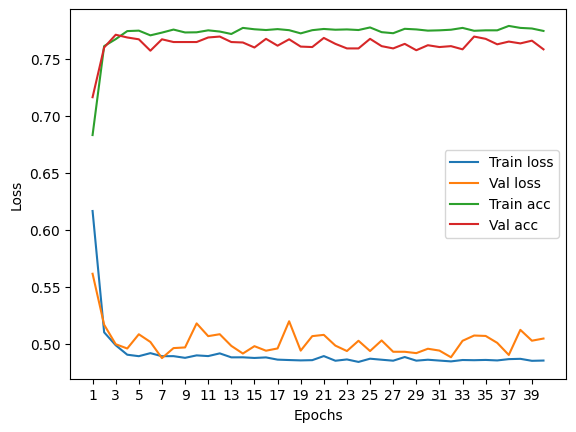

****************************************************************************************************



116it [00:01, 111.87it/s]


Train Epoch: 0 	Loss: 0.625221, Accuracy: 5015/7422 (68%)
Val Epoch: 0 	Loss: 0.535644, Accuracy: 1884/2474 (76%)



116it [00:00, 130.04it/s]


Train Epoch: 1 	Loss: 0.503554, Accuracy: 5619/7422 (76%)
Val Epoch: 1 	Loss: 0.517840, Accuracy: 1854/2474 (75%)



116it [00:00, 127.83it/s]


Train Epoch: 2 	Loss: 0.497301, Accuracy: 5631/7422 (76%)
Val Epoch: 2 	Loss: 0.510730, Accuracy: 1879/2474 (76%)



116it [00:00, 121.57it/s]


Train Epoch: 3 	Loss: 0.492949, Accuracy: 5702/7422 (77%)
Val Epoch: 3 	Loss: 0.509108, Accuracy: 1888/2474 (76%)



116it [00:00, 134.88it/s]


Train Epoch: 4 	Loss: 0.491895, Accuracy: 5668/7422 (76%)
Val Epoch: 4 	Loss: 0.513552, Accuracy: 1888/2474 (76%)



116it [00:00, 117.53it/s]


Train Epoch: 5 	Loss: 0.490161, Accuracy: 5695/7422 (77%)
Val Epoch: 5 	Loss: 0.506603, Accuracy: 1876/2474 (76%)



116it [00:01, 115.90it/s]


Train Epoch: 6 	Loss: 0.488849, Accuracy: 5699/7422 (77%)
Val Epoch: 6 	Loss: 0.508539, Accuracy: 1881/2474 (76%)



116it [00:00, 134.90it/s]


Train Epoch: 7 	Loss: 0.488648, Accuracy: 5679/7422 (77%)
Val Epoch: 7 	Loss: 0.508130, Accuracy: 1887/2474 (76%)



116it [00:00, 125.25it/s]


Train Epoch: 8 	Loss: 0.487994, Accuracy: 5686/7422 (77%)
Val Epoch: 8 	Loss: 0.516546, Accuracy: 1860/2474 (75%)



116it [00:00, 119.70it/s]


Train Epoch: 9 	Loss: 0.488606, Accuracy: 5706/7422 (77%)
Val Epoch: 9 	Loss: 0.508549, Accuracy: 1876/2474 (76%)



116it [00:00, 134.52it/s]


Train Epoch: 10 	Loss: 0.488547, Accuracy: 5687/7422 (77%)
Val Epoch: 10 	Loss: 0.507949, Accuracy: 1869/2474 (76%)



116it [00:00, 137.34it/s]


Train Epoch: 11 	Loss: 0.487766, Accuracy: 5695/7422 (77%)
Val Epoch: 11 	Loss: 0.509649, Accuracy: 1878/2474 (76%)



116it [00:00, 119.69it/s]


Train Epoch: 12 	Loss: 0.487905, Accuracy: 5688/7422 (77%)
Val Epoch: 12 	Loss: 0.508253, Accuracy: 1890/2474 (76%)



116it [00:00, 125.58it/s]


Train Epoch: 13 	Loss: 0.487242, Accuracy: 5694/7422 (77%)
Val Epoch: 13 	Loss: 0.509561, Accuracy: 1886/2474 (76%)



116it [00:00, 132.17it/s]


Train Epoch: 14 	Loss: 0.486513, Accuracy: 5689/7422 (77%)
Val Epoch: 14 	Loss: 0.526139, Accuracy: 1837/2474 (74%)



116it [00:00, 121.62it/s]


Train Epoch: 15 	Loss: 0.488525, Accuracy: 5683/7422 (77%)
Val Epoch: 15 	Loss: 0.511553, Accuracy: 1874/2474 (76%)



116it [00:00, 127.73it/s]


Train Epoch: 16 	Loss: 0.486967, Accuracy: 5707/7422 (77%)
Val Epoch: 16 	Loss: 0.510295, Accuracy: 1884/2474 (76%)



116it [00:00, 134.88it/s]


Train Epoch: 17 	Loss: 0.486564, Accuracy: 5690/7422 (77%)
Val Epoch: 17 	Loss: 0.508033, Accuracy: 1882/2474 (76%)



116it [00:00, 123.58it/s]


Train Epoch: 18 	Loss: 0.486807, Accuracy: 5689/7422 (77%)
Val Epoch: 18 	Loss: 0.510887, Accuracy: 1884/2474 (76%)



116it [00:00, 117.47it/s]


Train Epoch: 19 	Loss: 0.486106, Accuracy: 5704/7422 (77%)
Val Epoch: 19 	Loss: 0.507464, Accuracy: 1885/2474 (76%)



116it [00:00, 127.90it/s]


Train Epoch: 20 	Loss: 0.485750, Accuracy: 5696/7422 (77%)
Val Epoch: 20 	Loss: 0.515024, Accuracy: 1874/2474 (76%)



116it [00:00, 132.15it/s]


Train Epoch: 21 	Loss: 0.487446, Accuracy: 5702/7422 (77%)
Val Epoch: 21 	Loss: 0.507413, Accuracy: 1884/2474 (76%)



116it [00:00, 123.45it/s]


Train Epoch: 22 	Loss: 0.487202, Accuracy: 5673/7422 (76%)
Val Epoch: 22 	Loss: 0.513344, Accuracy: 1874/2474 (76%)



116it [00:00, 125.45it/s]


Train Epoch: 23 	Loss: 0.485530, Accuracy: 5687/7422 (77%)
Val Epoch: 23 	Loss: 0.508569, Accuracy: 1884/2474 (76%)



116it [00:00, 123.32it/s]


Train Epoch: 24 	Loss: 0.485994, Accuracy: 5703/7422 (77%)
Val Epoch: 24 	Loss: 0.509407, Accuracy: 1885/2474 (76%)



116it [00:00, 123.50it/s]


Train Epoch: 25 	Loss: 0.486344, Accuracy: 5692/7422 (77%)
Val Epoch: 25 	Loss: 0.505589, Accuracy: 1889/2474 (76%)



116it [00:00, 134.99it/s]


Train Epoch: 26 	Loss: 0.485770, Accuracy: 5689/7422 (77%)
Val Epoch: 26 	Loss: 0.509710, Accuracy: 1874/2474 (76%)



116it [00:00, 134.12it/s]


Train Epoch: 27 	Loss: 0.485582, Accuracy: 5705/7422 (77%)
Val Epoch: 27 	Loss: 0.511592, Accuracy: 1867/2474 (75%)



116it [00:01, 112.33it/s]


Train Epoch: 28 	Loss: 0.484508, Accuracy: 5691/7422 (77%)
Val Epoch: 28 	Loss: 0.512411, Accuracy: 1862/2474 (75%)



116it [00:00, 119.70it/s]


Train Epoch: 29 	Loss: 0.486625, Accuracy: 5694/7422 (77%)
Val Epoch: 29 	Loss: 0.514507, Accuracy: 1867/2474 (75%)



116it [00:01, 110.46it/s]


Train Epoch: 30 	Loss: 0.484301, Accuracy: 5717/7422 (77%)
Val Epoch: 30 	Loss: 0.506886, Accuracy: 1885/2474 (76%)



116it [00:01, 110.57it/s]


Train Epoch: 31 	Loss: 0.486180, Accuracy: 5719/7422 (77%)
Val Epoch: 31 	Loss: 0.506027, Accuracy: 1881/2474 (76%)



116it [00:01, 113.91it/s]


Train Epoch: 32 	Loss: 0.484554, Accuracy: 5706/7422 (77%)
Val Epoch: 32 	Loss: 0.509432, Accuracy: 1872/2474 (76%)



116it [00:00, 119.38it/s]


Train Epoch: 33 	Loss: 0.483903, Accuracy: 5716/7422 (77%)
Val Epoch: 33 	Loss: 0.508424, Accuracy: 1889/2474 (76%)



116it [00:01, 114.08it/s]


Train Epoch: 34 	Loss: 0.484813, Accuracy: 5690/7422 (77%)
Val Epoch: 34 	Loss: 0.506456, Accuracy: 1892/2474 (76%)



116it [00:00, 125.59it/s]


Train Epoch: 35 	Loss: 0.485414, Accuracy: 5714/7422 (77%)
Val Epoch: 35 	Loss: 0.506856, Accuracy: 1883/2474 (76%)



116it [00:01, 114.09it/s]


Train Epoch: 36 	Loss: 0.483610, Accuracy: 5704/7422 (77%)
Val Epoch: 36 	Loss: 0.504827, Accuracy: 1879/2474 (76%)



116it [00:00, 128.01it/s]


Train Epoch: 37 	Loss: 0.483009, Accuracy: 5709/7422 (77%)
Val Epoch: 37 	Loss: 0.509759, Accuracy: 1876/2474 (76%)



116it [00:00, 132.35it/s]


Train Epoch: 38 	Loss: 0.483525, Accuracy: 5708/7422 (77%)
Val Epoch: 38 	Loss: 0.508764, Accuracy: 1878/2474 (76%)



116it [00:00, 134.95it/s]


Train Epoch: 39 	Loss: 0.483638, Accuracy: 5700/7422 (77%)
Val Epoch: 39 	Loss: 0.511690, Accuracy: 1868/2474 (76%)

Test accuracy:  75.66693613581245


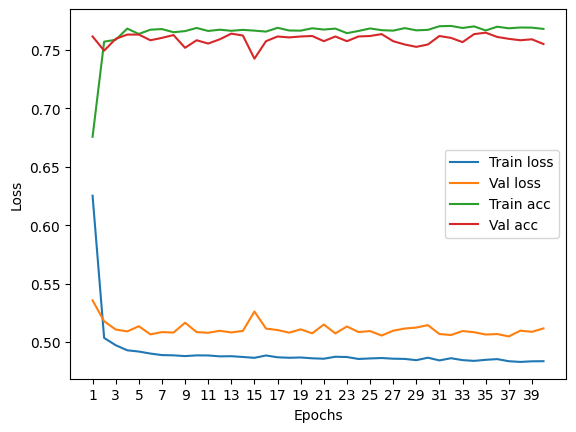

****************************************************************************************************



Particles per jet: 9


118it [00:00, 121.62it/s]


Train Epoch: 0 	Loss: 0.613372, Accuracy: 5181/7500 (69%)
Val Epoch: 0 	Loss: 0.538297, Accuracy: 1935/2500 (77%)



118it [00:00, 132.32it/s]


Train Epoch: 1 	Loss: 0.505819, Accuracy: 5729/7500 (76%)
Val Epoch: 1 	Loss: 0.535229, Accuracy: 1858/2500 (74%)



118it [00:01, 112.65it/s]


Train Epoch: 2 	Loss: 0.499861, Accuracy: 5731/7500 (76%)
Val Epoch: 2 	Loss: 0.515227, Accuracy: 1924/2500 (77%)



118it [00:00, 125.79it/s]


Train Epoch: 3 	Loss: 0.495103, Accuracy: 5734/7500 (76%)
Val Epoch: 3 	Loss: 0.494466, Accuracy: 1927/2500 (77%)



118it [00:00, 125.72it/s]


Train Epoch: 4 	Loss: 0.493293, Accuracy: 5763/7500 (77%)
Val Epoch: 4 	Loss: 0.493813, Accuracy: 1920/2500 (77%)



118it [00:00, 137.04it/s]


Train Epoch: 5 	Loss: 0.491153, Accuracy: 5764/7500 (77%)
Val Epoch: 5 	Loss: 0.494169, Accuracy: 1930/2500 (77%)



118it [00:00, 123.68it/s]


Train Epoch: 6 	Loss: 0.490173, Accuracy: 5774/7500 (77%)
Val Epoch: 6 	Loss: 0.490348, Accuracy: 1949/2500 (78%)



118it [00:00, 121.31it/s]


Train Epoch: 7 	Loss: 0.492284, Accuracy: 5766/7500 (77%)
Val Epoch: 7 	Loss: 0.491233, Accuracy: 1938/2500 (78%)



118it [00:00, 147.61it/s]


Train Epoch: 8 	Loss: 0.489357, Accuracy: 5758/7500 (77%)
Val Epoch: 8 	Loss: 0.504975, Accuracy: 1947/2500 (78%)



118it [00:00, 121.58it/s]


Train Epoch: 9 	Loss: 0.491478, Accuracy: 5771/7500 (77%)
Val Epoch: 9 	Loss: 0.489500, Accuracy: 1937/2500 (77%)



118it [00:00, 127.85it/s]


Train Epoch: 10 	Loss: 0.489867, Accuracy: 5758/7500 (77%)
Val Epoch: 10 	Loss: 0.501087, Accuracy: 1946/2500 (78%)



118it [00:00, 119.62it/s]


Train Epoch: 11 	Loss: 0.490464, Accuracy: 5782/7500 (77%)
Val Epoch: 11 	Loss: 0.488689, Accuracy: 1949/2500 (78%)



118it [00:00, 119.48it/s]


Train Epoch: 12 	Loss: 0.490873, Accuracy: 5779/7500 (77%)
Val Epoch: 12 	Loss: 0.504875, Accuracy: 1939/2500 (78%)



118it [00:00, 125.22it/s]


Train Epoch: 13 	Loss: 0.488132, Accuracy: 5783/7500 (77%)
Val Epoch: 13 	Loss: 0.486533, Accuracy: 1942/2500 (78%)



118it [00:00, 125.85it/s]


Train Epoch: 14 	Loss: 0.489623, Accuracy: 5782/7500 (77%)
Val Epoch: 14 	Loss: 0.506338, Accuracy: 1915/2500 (77%)



118it [00:00, 137.02it/s]


Train Epoch: 15 	Loss: 0.488955, Accuracy: 5762/7500 (77%)
Val Epoch: 15 	Loss: 0.491150, Accuracy: 1943/2500 (78%)



118it [00:00, 119.69it/s]


Train Epoch: 16 	Loss: 0.488284, Accuracy: 5787/7500 (77%)
Val Epoch: 16 	Loss: 0.490257, Accuracy: 1938/2500 (78%)



118it [00:01, 115.85it/s]


Train Epoch: 17 	Loss: 0.488082, Accuracy: 5790/7500 (77%)
Val Epoch: 17 	Loss: 0.484686, Accuracy: 1939/2500 (78%)



118it [00:00, 127.76it/s]


Train Epoch: 18 	Loss: 0.490888, Accuracy: 5754/7500 (77%)
Val Epoch: 18 	Loss: 0.495237, Accuracy: 1929/2500 (77%)



118it [00:01, 110.86it/s]


Train Epoch: 19 	Loss: 0.485609, Accuracy: 5779/7500 (77%)
Val Epoch: 19 	Loss: 0.489086, Accuracy: 1937/2500 (77%)



118it [00:00, 127.56it/s]


Train Epoch: 20 	Loss: 0.487762, Accuracy: 5778/7500 (77%)
Val Epoch: 20 	Loss: 0.494416, Accuracy: 1932/2500 (77%)



118it [00:00, 125.34it/s]


Train Epoch: 21 	Loss: 0.488566, Accuracy: 5803/7500 (77%)
Val Epoch: 21 	Loss: 0.496008, Accuracy: 1929/2500 (77%)



118it [00:01, 117.63it/s]


Train Epoch: 22 	Loss: 0.489859, Accuracy: 5757/7500 (77%)
Val Epoch: 22 	Loss: 0.492533, Accuracy: 1925/2500 (77%)



118it [00:00, 137.14it/s]


Train Epoch: 23 	Loss: 0.488401, Accuracy: 5802/7500 (77%)
Val Epoch: 23 	Loss: 0.498011, Accuracy: 1929/2500 (77%)



118it [00:00, 136.78it/s]


Train Epoch: 24 	Loss: 0.486908, Accuracy: 5790/7500 (77%)
Val Epoch: 24 	Loss: 0.515094, Accuracy: 1932/2500 (77%)



118it [00:00, 123.58it/s]


Train Epoch: 25 	Loss: 0.486274, Accuracy: 5799/7500 (77%)
Val Epoch: 25 	Loss: 0.481858, Accuracy: 1932/2500 (77%)



118it [00:00, 136.81it/s]


Train Epoch: 26 	Loss: 0.487238, Accuracy: 5796/7500 (77%)
Val Epoch: 26 	Loss: 0.482268, Accuracy: 1944/2500 (78%)



118it [00:00, 147.87it/s]


Train Epoch: 27 	Loss: 0.487769, Accuracy: 5767/7500 (77%)
Val Epoch: 27 	Loss: 0.483585, Accuracy: 1933/2500 (77%)



118it [00:01, 112.33it/s]


Train Epoch: 28 	Loss: 0.484709, Accuracy: 5797/7500 (77%)
Val Epoch: 28 	Loss: 0.499384, Accuracy: 1935/2500 (77%)



118it [00:01, 110.52it/s]


Train Epoch: 29 	Loss: 0.486021, Accuracy: 5795/7500 (77%)
Val Epoch: 29 	Loss: 0.494734, Accuracy: 1939/2500 (78%)



118it [00:00, 123.53it/s]


Train Epoch: 30 	Loss: 0.486546, Accuracy: 5793/7500 (77%)
Val Epoch: 30 	Loss: 0.517154, Accuracy: 1921/2500 (77%)



118it [00:00, 123.71it/s]


Train Epoch: 31 	Loss: 0.485437, Accuracy: 5821/7500 (78%)
Val Epoch: 31 	Loss: 0.490982, Accuracy: 1931/2500 (77%)



118it [00:00, 130.01it/s]


Train Epoch: 32 	Loss: 0.486346, Accuracy: 5800/7500 (77%)
Val Epoch: 32 	Loss: 0.485714, Accuracy: 1931/2500 (77%)



118it [00:00, 123.74it/s]


Train Epoch: 33 	Loss: 0.485737, Accuracy: 5808/7500 (77%)
Val Epoch: 33 	Loss: 0.497480, Accuracy: 1938/2500 (78%)



118it [00:00, 125.29it/s]


Train Epoch: 34 	Loss: 0.485530, Accuracy: 5775/7500 (77%)
Val Epoch: 34 	Loss: 0.490909, Accuracy: 1923/2500 (77%)



118it [00:00, 119.51it/s]


Train Epoch: 35 	Loss: 0.485033, Accuracy: 5798/7500 (77%)
Val Epoch: 35 	Loss: 0.498647, Accuracy: 1923/2500 (77%)



118it [00:00, 127.64it/s]


Train Epoch: 36 	Loss: 0.486420, Accuracy: 5819/7500 (78%)
Val Epoch: 36 	Loss: 0.502437, Accuracy: 1926/2500 (77%)



118it [00:01, 112.61it/s]


Train Epoch: 37 	Loss: 0.486292, Accuracy: 5803/7500 (77%)
Val Epoch: 37 	Loss: 0.484138, Accuracy: 1929/2500 (77%)



118it [00:01, 114.24it/s]


Train Epoch: 38 	Loss: 0.485269, Accuracy: 5822/7500 (78%)
Val Epoch: 38 	Loss: 0.486306, Accuracy: 1939/2500 (78%)



118it [00:01, 117.61it/s]


Train Epoch: 39 	Loss: 0.483075, Accuracy: 5829/7500 (78%)
Val Epoch: 39 	Loss: 0.485892, Accuracy: 1919/2500 (77%)

Test accuracy:  78.75999999999999


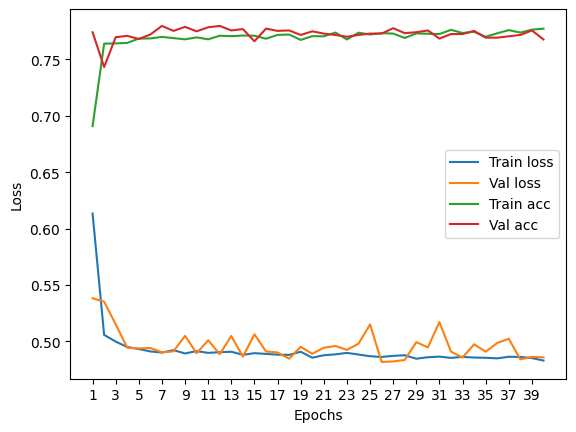

****************************************************************************************************



118it [00:00, 134.65it/s]


Train Epoch: 0 	Loss: 0.614907, Accuracy: 5303/7500 (71%)
Val Epoch: 0 	Loss: 0.543093, Accuracy: 1930/2500 (77%)



118it [00:00, 123.69it/s]


Train Epoch: 1 	Loss: 0.509329, Accuracy: 5696/7500 (76%)
Val Epoch: 1 	Loss: 0.508768, Accuracy: 1918/2500 (77%)



118it [00:00, 121.08it/s]


Train Epoch: 2 	Loss: 0.502097, Accuracy: 5703/7500 (76%)
Val Epoch: 2 	Loss: 0.504909, Accuracy: 1925/2500 (77%)



118it [00:00, 123.58it/s]


Train Epoch: 3 	Loss: 0.501485, Accuracy: 5700/7500 (76%)
Val Epoch: 3 	Loss: 0.506601, Accuracy: 1940/2500 (78%)



118it [00:00, 139.64it/s]


Train Epoch: 4 	Loss: 0.498525, Accuracy: 5722/7500 (76%)
Val Epoch: 4 	Loss: 0.494003, Accuracy: 1911/2500 (76%)



118it [00:00, 119.52it/s]


Train Epoch: 5 	Loss: 0.498449, Accuracy: 5714/7500 (76%)
Val Epoch: 5 	Loss: 0.517599, Accuracy: 1935/2500 (77%)



118it [00:00, 134.72it/s]


Train Epoch: 6 	Loss: 0.496586, Accuracy: 5711/7500 (76%)
Val Epoch: 6 	Loss: 0.513160, Accuracy: 1932/2500 (77%)



118it [00:01, 115.69it/s]


Train Epoch: 7 	Loss: 0.497751, Accuracy: 5732/7500 (76%)
Val Epoch: 7 	Loss: 0.508010, Accuracy: 1930/2500 (77%)



118it [00:01, 116.01it/s]


Train Epoch: 8 	Loss: 0.497889, Accuracy: 5699/7500 (76%)
Val Epoch: 8 	Loss: 0.491057, Accuracy: 1913/2500 (77%)



118it [00:01, 117.58it/s]


Train Epoch: 9 	Loss: 0.500982, Accuracy: 5695/7500 (76%)
Val Epoch: 9 	Loss: 0.520266, Accuracy: 1921/2500 (77%)



118it [00:00, 137.09it/s]


Train Epoch: 10 	Loss: 0.497909, Accuracy: 5709/7500 (76%)
Val Epoch: 10 	Loss: 0.505147, Accuracy: 1938/2500 (78%)



118it [00:00, 123.55it/s]


Train Epoch: 11 	Loss: 0.495734, Accuracy: 5724/7500 (76%)
Val Epoch: 11 	Loss: 0.491684, Accuracy: 1933/2500 (77%)



118it [00:00, 127.80it/s]


Train Epoch: 12 	Loss: 0.497003, Accuracy: 5710/7500 (76%)
Val Epoch: 12 	Loss: 0.502995, Accuracy: 1939/2500 (78%)



118it [00:00, 127.70it/s]


Train Epoch: 13 	Loss: 0.496435, Accuracy: 5730/7500 (76%)
Val Epoch: 13 	Loss: 0.499893, Accuracy: 1925/2500 (77%)



118it [00:00, 123.35it/s]


Train Epoch: 14 	Loss: 0.497094, Accuracy: 5712/7500 (76%)
Val Epoch: 14 	Loss: 0.507990, Accuracy: 1915/2500 (77%)



118it [00:00, 121.11it/s]


Train Epoch: 15 	Loss: 0.497810, Accuracy: 5704/7500 (76%)
Val Epoch: 15 	Loss: 0.507625, Accuracy: 1939/2500 (78%)



118it [00:00, 129.95it/s]


Train Epoch: 16 	Loss: 0.496428, Accuracy: 5732/7500 (76%)
Val Epoch: 16 	Loss: 0.496014, Accuracy: 1928/2500 (77%)



118it [00:01, 100.48it/s]


Train Epoch: 17 	Loss: 0.494809, Accuracy: 5710/7500 (76%)
Val Epoch: 17 	Loss: 0.503197, Accuracy: 1925/2500 (77%)



118it [00:01, 112.50it/s]


Train Epoch: 18 	Loss: 0.495917, Accuracy: 5713/7500 (76%)
Val Epoch: 18 	Loss: 0.496349, Accuracy: 1906/2500 (76%)



118it [00:00, 130.05it/s]


Train Epoch: 19 	Loss: 0.495770, Accuracy: 5725/7500 (76%)
Val Epoch: 19 	Loss: 0.489742, Accuracy: 1933/2500 (77%)



118it [00:00, 123.66it/s]


Train Epoch: 20 	Loss: 0.494505, Accuracy: 5712/7500 (76%)
Val Epoch: 20 	Loss: 0.506839, Accuracy: 1939/2500 (78%)



118it [00:00, 123.61it/s]


Train Epoch: 21 	Loss: 0.494561, Accuracy: 5696/7500 (76%)
Val Epoch: 21 	Loss: 0.493028, Accuracy: 1942/2500 (78%)



118it [00:00, 134.69it/s]


Train Epoch: 22 	Loss: 0.495764, Accuracy: 5708/7500 (76%)
Val Epoch: 22 	Loss: 0.509516, Accuracy: 1942/2500 (78%)



118it [00:00, 134.71it/s]


Train Epoch: 23 	Loss: 0.497542, Accuracy: 5717/7500 (76%)
Val Epoch: 23 	Loss: 0.495697, Accuracy: 1936/2500 (77%)



118it [00:00, 132.26it/s]


Train Epoch: 24 	Loss: 0.493123, Accuracy: 5734/7500 (76%)
Val Epoch: 24 	Loss: 0.491418, Accuracy: 1903/2500 (76%)



118it [00:00, 132.12it/s]


Train Epoch: 25 	Loss: 0.495564, Accuracy: 5707/7500 (76%)
Val Epoch: 25 	Loss: 0.502037, Accuracy: 1928/2500 (77%)



118it [00:00, 139.48it/s]


Train Epoch: 26 	Loss: 0.495836, Accuracy: 5727/7500 (76%)
Val Epoch: 26 	Loss: 0.510370, Accuracy: 1920/2500 (77%)



118it [00:01, 115.62it/s]


Train Epoch: 27 	Loss: 0.493532, Accuracy: 5720/7500 (76%)
Val Epoch: 27 	Loss: 0.492931, Accuracy: 1930/2500 (77%)



118it [00:00, 134.10it/s]


Train Epoch: 28 	Loss: 0.496738, Accuracy: 5679/7500 (76%)
Val Epoch: 28 	Loss: 0.499169, Accuracy: 1931/2500 (77%)



118it [00:00, 127.75it/s]


Train Epoch: 29 	Loss: 0.495252, Accuracy: 5741/7500 (77%)
Val Epoch: 29 	Loss: 0.511267, Accuracy: 1940/2500 (78%)



118it [00:00, 134.73it/s]


Train Epoch: 30 	Loss: 0.496649, Accuracy: 5727/7500 (76%)
Val Epoch: 30 	Loss: 0.516926, Accuracy: 1938/2500 (78%)



118it [00:00, 145.00it/s]


Train Epoch: 31 	Loss: 0.493511, Accuracy: 5731/7500 (76%)
Val Epoch: 31 	Loss: 0.503414, Accuracy: 1929/2500 (77%)



118it [00:01, 104.71it/s]


Train Epoch: 32 	Loss: 0.492513, Accuracy: 5722/7500 (76%)
Val Epoch: 32 	Loss: 0.494100, Accuracy: 1941/2500 (78%)



118it [00:01, 115.78it/s]


Train Epoch: 33 	Loss: 0.496039, Accuracy: 5738/7500 (77%)
Val Epoch: 33 	Loss: 0.492579, Accuracy: 1913/2500 (77%)



118it [00:01, 114.37it/s]


Train Epoch: 34 	Loss: 0.495707, Accuracy: 5722/7500 (76%)
Val Epoch: 34 	Loss: 0.500856, Accuracy: 1938/2500 (78%)



118it [00:00, 121.58it/s]


Train Epoch: 35 	Loss: 0.494760, Accuracy: 5714/7500 (76%)
Val Epoch: 35 	Loss: 0.502229, Accuracy: 1922/2500 (77%)



118it [00:00, 130.02it/s]


Train Epoch: 36 	Loss: 0.494587, Accuracy: 5734/7500 (76%)
Val Epoch: 36 	Loss: 0.495183, Accuracy: 1938/2500 (78%)



118it [00:00, 137.19it/s]


Train Epoch: 37 	Loss: 0.494600, Accuracy: 5733/7500 (76%)
Val Epoch: 37 	Loss: 0.498789, Accuracy: 1930/2500 (77%)



118it [00:00, 145.10it/s]


Train Epoch: 38 	Loss: 0.493276, Accuracy: 5716/7500 (76%)
Val Epoch: 38 	Loss: 0.498428, Accuracy: 1933/2500 (77%)



118it [00:00, 139.52it/s]


Train Epoch: 39 	Loss: 0.495963, Accuracy: 5704/7500 (76%)
Val Epoch: 39 	Loss: 0.498421, Accuracy: 1917/2500 (77%)

Test accuracy:  76.48


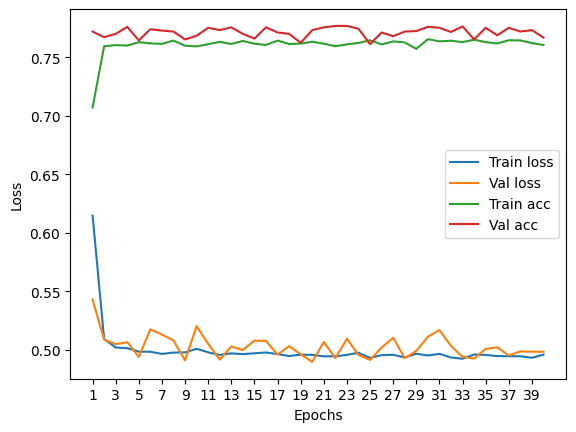

****************************************************************************************************



118it [00:00, 132.19it/s]


Train Epoch: 0 	Loss: 0.596904, Accuracy: 5291/7500 (71%)
Val Epoch: 0 	Loss: 0.522256, Accuracy: 1906/2500 (76%)



118it [00:00, 121.57it/s]


Train Epoch: 1 	Loss: 0.501730, Accuracy: 5730/7500 (76%)
Val Epoch: 1 	Loss: 0.528662, Accuracy: 1840/2500 (74%)



118it [00:00, 119.71it/s]


Train Epoch: 2 	Loss: 0.487462, Accuracy: 5794/7500 (77%)
Val Epoch: 2 	Loss: 0.526388, Accuracy: 1901/2500 (76%)



118it [00:00, 125.78it/s]


Train Epoch: 3 	Loss: 0.484498, Accuracy: 5807/7500 (77%)
Val Epoch: 3 	Loss: 0.511251, Accuracy: 1907/2500 (76%)



118it [00:00, 121.77it/s]


Train Epoch: 4 	Loss: 0.485100, Accuracy: 5818/7500 (78%)
Val Epoch: 4 	Loss: 0.502257, Accuracy: 1907/2500 (76%)



118it [00:00, 123.48it/s]


Train Epoch: 5 	Loss: 0.483062, Accuracy: 5840/7500 (78%)
Val Epoch: 5 	Loss: 0.500501, Accuracy: 1910/2500 (76%)



118it [00:01, 107.62it/s]


Train Epoch: 6 	Loss: 0.483296, Accuracy: 5803/7500 (77%)
Val Epoch: 6 	Loss: 0.504654, Accuracy: 1905/2500 (76%)



118it [00:00, 142.10it/s]


Train Epoch: 7 	Loss: 0.481578, Accuracy: 5829/7500 (78%)
Val Epoch: 7 	Loss: 0.501564, Accuracy: 1901/2500 (76%)



118it [00:00, 121.49it/s]


Train Epoch: 8 	Loss: 0.481817, Accuracy: 5834/7500 (78%)
Val Epoch: 8 	Loss: 0.499351, Accuracy: 1913/2500 (77%)



118it [00:01, 113.70it/s]


Train Epoch: 9 	Loss: 0.480507, Accuracy: 5828/7500 (78%)
Val Epoch: 9 	Loss: 0.494983, Accuracy: 1917/2500 (77%)



118it [00:01, 100.41it/s]


Train Epoch: 10 	Loss: 0.481576, Accuracy: 5825/7500 (78%)
Val Epoch: 10 	Loss: 0.505612, Accuracy: 1911/2500 (76%)



118it [00:00, 119.80it/s]


Train Epoch: 11 	Loss: 0.478292, Accuracy: 5852/7500 (78%)
Val Epoch: 11 	Loss: 0.513179, Accuracy: 1911/2500 (76%)



118it [00:00, 137.08it/s]


Train Epoch: 12 	Loss: 0.480568, Accuracy: 5845/7500 (78%)
Val Epoch: 12 	Loss: 0.515056, Accuracy: 1923/2500 (77%)



118it [00:01, 110.94it/s]


Train Epoch: 13 	Loss: 0.478446, Accuracy: 5841/7500 (78%)
Val Epoch: 13 	Loss: 0.503915, Accuracy: 1928/2500 (77%)



118it [00:00, 132.10it/s]


Train Epoch: 14 	Loss: 0.475605, Accuracy: 5838/7500 (78%)
Val Epoch: 14 	Loss: 0.508656, Accuracy: 1910/2500 (76%)



118it [00:00, 121.63it/s]


Train Epoch: 15 	Loss: 0.479211, Accuracy: 5847/7500 (78%)
Val Epoch: 15 	Loss: 0.494924, Accuracy: 1923/2500 (77%)



118it [00:00, 125.72it/s]


Train Epoch: 16 	Loss: 0.477164, Accuracy: 5865/7500 (78%)
Val Epoch: 16 	Loss: 0.520398, Accuracy: 1914/2500 (77%)



118it [00:00, 134.55it/s]


Train Epoch: 17 	Loss: 0.480257, Accuracy: 5825/7500 (78%)
Val Epoch: 17 	Loss: 0.506407, Accuracy: 1922/2500 (77%)



118it [00:00, 147.75it/s]


Train Epoch: 18 	Loss: 0.475800, Accuracy: 5871/7500 (78%)
Val Epoch: 18 	Loss: 0.495409, Accuracy: 1909/2500 (76%)



118it [00:00, 127.73it/s]


Train Epoch: 19 	Loss: 0.475375, Accuracy: 5856/7500 (78%)
Val Epoch: 19 	Loss: 0.496897, Accuracy: 1920/2500 (77%)



118it [00:00, 139.77it/s]


Train Epoch: 20 	Loss: 0.476960, Accuracy: 5847/7500 (78%)
Val Epoch: 20 	Loss: 0.492391, Accuracy: 1924/2500 (77%)



118it [00:00, 134.73it/s]


Train Epoch: 21 	Loss: 0.476398, Accuracy: 5854/7500 (78%)
Val Epoch: 21 	Loss: 0.493706, Accuracy: 1936/2500 (77%)



118it [00:00, 131.96it/s]


Train Epoch: 22 	Loss: 0.476751, Accuracy: 5854/7500 (78%)
Val Epoch: 22 	Loss: 0.509640, Accuracy: 1928/2500 (77%)



118it [00:00, 131.02it/s]


Train Epoch: 23 	Loss: 0.476402, Accuracy: 5860/7500 (78%)
Val Epoch: 23 	Loss: 0.496810, Accuracy: 1913/2500 (77%)



118it [00:01, 116.09it/s]


Train Epoch: 24 	Loss: 0.474651, Accuracy: 5859/7500 (78%)
Val Epoch: 24 	Loss: 0.510961, Accuracy: 1939/2500 (78%)



118it [00:01, 116.00it/s]


Train Epoch: 25 	Loss: 0.475709, Accuracy: 5875/7500 (78%)
Val Epoch: 25 	Loss: 0.505299, Accuracy: 1919/2500 (77%)



118it [00:00, 119.74it/s]


Train Epoch: 26 	Loss: 0.477595, Accuracy: 5842/7500 (78%)
Val Epoch: 26 	Loss: 0.504526, Accuracy: 1919/2500 (77%)



118it [00:01, 103.18it/s]


Train Epoch: 27 	Loss: 0.473991, Accuracy: 5864/7500 (78%)
Val Epoch: 27 	Loss: 0.495375, Accuracy: 1921/2500 (77%)



118it [00:00, 119.80it/s]


Train Epoch: 28 	Loss: 0.474058, Accuracy: 5873/7500 (78%)
Val Epoch: 28 	Loss: 0.506113, Accuracy: 1922/2500 (77%)



118it [00:00, 127.84it/s]


Train Epoch: 29 	Loss: 0.475380, Accuracy: 5874/7500 (78%)
Val Epoch: 29 	Loss: 0.524403, Accuracy: 1920/2500 (77%)



118it [00:01, 114.04it/s]


Train Epoch: 30 	Loss: 0.474637, Accuracy: 5863/7500 (78%)
Val Epoch: 30 	Loss: 0.505056, Accuracy: 1909/2500 (76%)



118it [00:01, 117.82it/s]


Train Epoch: 31 	Loss: 0.475353, Accuracy: 5856/7500 (78%)
Val Epoch: 31 	Loss: 0.501694, Accuracy: 1920/2500 (77%)



118it [00:00, 127.72it/s]


Train Epoch: 32 	Loss: 0.476045, Accuracy: 5871/7500 (78%)
Val Epoch: 32 	Loss: 0.505576, Accuracy: 1933/2500 (77%)



118it [00:00, 134.50it/s]


Train Epoch: 33 	Loss: 0.474038, Accuracy: 5855/7500 (78%)
Val Epoch: 33 	Loss: 0.502240, Accuracy: 1921/2500 (77%)



118it [00:00, 145.11it/s]


Train Epoch: 34 	Loss: 0.472248, Accuracy: 5874/7500 (78%)
Val Epoch: 34 	Loss: 0.501148, Accuracy: 1931/2500 (77%)



118it [00:00, 121.54it/s]


Train Epoch: 35 	Loss: 0.473783, Accuracy: 5862/7500 (78%)
Val Epoch: 35 	Loss: 0.518505, Accuracy: 1927/2500 (77%)



118it [00:00, 134.48it/s]


Train Epoch: 36 	Loss: 0.474155, Accuracy: 5874/7500 (78%)
Val Epoch: 36 	Loss: 0.497082, Accuracy: 1925/2500 (77%)



118it [00:00, 121.66it/s]


Train Epoch: 37 	Loss: 0.472443, Accuracy: 5878/7500 (78%)
Val Epoch: 37 	Loss: 0.502038, Accuracy: 1921/2500 (77%)



118it [00:01, 117.67it/s]


Train Epoch: 38 	Loss: 0.474320, Accuracy: 5856/7500 (78%)
Val Epoch: 38 	Loss: 0.502114, Accuracy: 1923/2500 (77%)



118it [00:00, 119.62it/s]


Train Epoch: 39 	Loss: 0.472054, Accuracy: 5850/7500 (78%)
Val Epoch: 39 	Loss: 0.502625, Accuracy: 1927/2500 (77%)

Test accuracy:  76.36


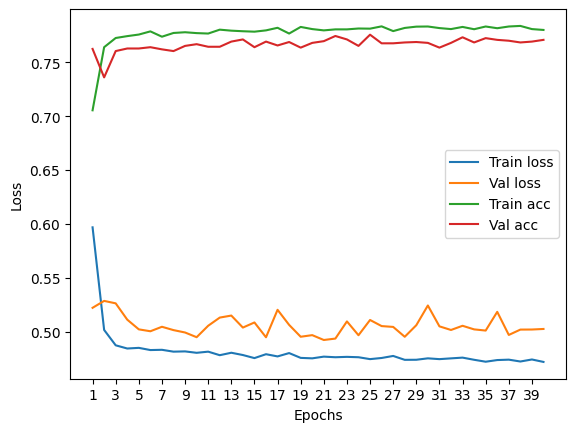

****************************************************************************************************



118it [00:00, 150.87it/s]


Train Epoch: 0 	Loss: 0.595880, Accuracy: 5325/7500 (71%)
Val Epoch: 0 	Loss: 0.516399, Accuracy: 1917/2500 (77%)



118it [00:01, 110.78it/s]


Train Epoch: 1 	Loss: 0.501977, Accuracy: 5751/7500 (77%)
Val Epoch: 1 	Loss: 0.504087, Accuracy: 1903/2500 (76%)



118it [00:00, 125.55it/s]


Train Epoch: 2 	Loss: 0.492681, Accuracy: 5773/7500 (77%)
Val Epoch: 2 	Loss: 0.494853, Accuracy: 1919/2500 (77%)



118it [00:00, 133.61it/s]


Train Epoch: 3 	Loss: 0.489423, Accuracy: 5765/7500 (77%)
Val Epoch: 3 	Loss: 0.500425, Accuracy: 1916/2500 (77%)



118it [00:00, 123.44it/s]


Train Epoch: 4 	Loss: 0.489684, Accuracy: 5792/7500 (77%)
Val Epoch: 4 	Loss: 0.501084, Accuracy: 1925/2500 (77%)



118it [00:00, 145.09it/s]


Train Epoch: 5 	Loss: 0.490262, Accuracy: 5790/7500 (77%)
Val Epoch: 5 	Loss: 0.504610, Accuracy: 1914/2500 (77%)



118it [00:00, 119.56it/s]


Train Epoch: 6 	Loss: 0.485462, Accuracy: 5811/7500 (77%)
Val Epoch: 6 	Loss: 0.498099, Accuracy: 1938/2500 (78%)



118it [00:00, 129.83it/s]


Train Epoch: 7 	Loss: 0.486893, Accuracy: 5804/7500 (77%)
Val Epoch: 7 	Loss: 0.497516, Accuracy: 1926/2500 (77%)



118it [00:01, 109.00it/s]


Train Epoch: 8 	Loss: 0.485305, Accuracy: 5815/7500 (78%)
Val Epoch: 8 	Loss: 0.499279, Accuracy: 1916/2500 (77%)



118it [00:00, 123.09it/s]


Train Epoch: 9 	Loss: 0.483229, Accuracy: 5808/7500 (77%)
Val Epoch: 9 	Loss: 0.527965, Accuracy: 1932/2500 (77%)



118it [00:01, 117.71it/s]


Train Epoch: 10 	Loss: 0.484008, Accuracy: 5832/7500 (78%)
Val Epoch: 10 	Loss: 0.507234, Accuracy: 1920/2500 (77%)



118it [00:00, 134.67it/s]


Train Epoch: 11 	Loss: 0.484846, Accuracy: 5824/7500 (78%)
Val Epoch: 11 	Loss: 0.512476, Accuracy: 1930/2500 (77%)



118it [00:00, 136.99it/s]


Train Epoch: 12 	Loss: 0.481944, Accuracy: 5821/7500 (78%)
Val Epoch: 12 	Loss: 0.494622, Accuracy: 1938/2500 (78%)



118it [00:01, 115.95it/s]


Train Epoch: 13 	Loss: 0.484510, Accuracy: 5819/7500 (78%)
Val Epoch: 13 	Loss: 0.493638, Accuracy: 1937/2500 (77%)



118it [00:01, 114.16it/s]


Train Epoch: 14 	Loss: 0.484480, Accuracy: 5814/7500 (78%)
Val Epoch: 14 	Loss: 0.491283, Accuracy: 1936/2500 (77%)



118it [00:01, 114.26it/s]


Train Epoch: 15 	Loss: 0.482061, Accuracy: 5808/7500 (77%)
Val Epoch: 15 	Loss: 0.499351, Accuracy: 1917/2500 (77%)



118it [00:00, 121.38it/s]


Train Epoch: 16 	Loss: 0.481257, Accuracy: 5829/7500 (78%)
Val Epoch: 16 	Loss: 0.500926, Accuracy: 1913/2500 (77%)



118it [00:00, 123.38it/s]


Train Epoch: 17 	Loss: 0.482413, Accuracy: 5787/7500 (77%)
Val Epoch: 17 	Loss: 0.502059, Accuracy: 1939/2500 (78%)



118it [00:00, 119.53it/s]


Train Epoch: 18 	Loss: 0.482382, Accuracy: 5832/7500 (78%)
Val Epoch: 18 	Loss: 0.501266, Accuracy: 1939/2500 (78%)



118it [00:00, 139.78it/s]


Train Epoch: 19 	Loss: 0.482325, Accuracy: 5848/7500 (78%)
Val Epoch: 19 	Loss: 0.514203, Accuracy: 1924/2500 (77%)



118it [00:00, 121.60it/s]


Train Epoch: 20 	Loss: 0.485528, Accuracy: 5823/7500 (78%)
Val Epoch: 20 	Loss: 0.515784, Accuracy: 1928/2500 (77%)



118it [00:01, 115.77it/s]


Train Epoch: 21 	Loss: 0.483125, Accuracy: 5825/7500 (78%)
Val Epoch: 21 	Loss: 0.522078, Accuracy: 1904/2500 (76%)



118it [00:00, 121.74it/s]


Train Epoch: 22 	Loss: 0.481210, Accuracy: 5826/7500 (78%)
Val Epoch: 22 	Loss: 0.503311, Accuracy: 1923/2500 (77%)



118it [00:01, 114.12it/s]


Train Epoch: 23 	Loss: 0.484312, Accuracy: 5801/7500 (77%)
Val Epoch: 23 	Loss: 0.493403, Accuracy: 1934/2500 (77%)



118it [00:01, 114.29it/s]


Train Epoch: 24 	Loss: 0.482047, Accuracy: 5825/7500 (78%)
Val Epoch: 24 	Loss: 0.495738, Accuracy: 1935/2500 (77%)



118it [00:00, 132.15it/s]


Train Epoch: 25 	Loss: 0.480902, Accuracy: 5830/7500 (78%)
Val Epoch: 25 	Loss: 0.501421, Accuracy: 1945/2500 (78%)



118it [00:01, 106.18it/s]


Train Epoch: 26 	Loss: 0.483418, Accuracy: 5830/7500 (78%)
Val Epoch: 26 	Loss: 0.496344, Accuracy: 1931/2500 (77%)



118it [00:01, 117.85it/s]


Train Epoch: 27 	Loss: 0.480700, Accuracy: 5826/7500 (78%)
Val Epoch: 27 	Loss: 0.509769, Accuracy: 1937/2500 (77%)



118it [00:01, 112.35it/s]


Train Epoch: 28 	Loss: 0.483476, Accuracy: 5816/7500 (78%)
Val Epoch: 28 	Loss: 0.493607, Accuracy: 1936/2500 (77%)



118it [00:00, 138.58it/s]


Train Epoch: 29 	Loss: 0.483854, Accuracy: 5815/7500 (78%)
Val Epoch: 29 	Loss: 0.506356, Accuracy: 1940/2500 (78%)



118it [00:01, 103.40it/s]


Train Epoch: 30 	Loss: 0.483111, Accuracy: 5834/7500 (78%)
Val Epoch: 30 	Loss: 0.501327, Accuracy: 1929/2500 (77%)



118it [00:01, 115.86it/s]


Train Epoch: 31 	Loss: 0.480266, Accuracy: 5842/7500 (78%)
Val Epoch: 31 	Loss: 0.509618, Accuracy: 1931/2500 (77%)



118it [00:00, 119.61it/s]


Train Epoch: 32 	Loss: 0.481273, Accuracy: 5816/7500 (78%)
Val Epoch: 32 	Loss: 0.498720, Accuracy: 1938/2500 (78%)



118it [00:01, 116.02it/s]


Train Epoch: 33 	Loss: 0.480930, Accuracy: 5848/7500 (78%)
Val Epoch: 33 	Loss: 0.511555, Accuracy: 1926/2500 (77%)



118it [00:01, 117.67it/s]


Train Epoch: 34 	Loss: 0.478603, Accuracy: 5827/7500 (78%)
Val Epoch: 34 	Loss: 0.492290, Accuracy: 1924/2500 (77%)



118it [00:00, 121.63it/s]


Train Epoch: 35 	Loss: 0.481229, Accuracy: 5830/7500 (78%)
Val Epoch: 35 	Loss: 0.509044, Accuracy: 1932/2500 (77%)



118it [00:00, 121.71it/s]


Train Epoch: 36 	Loss: 0.478112, Accuracy: 5821/7500 (78%)
Val Epoch: 36 	Loss: 0.489825, Accuracy: 1939/2500 (78%)



118it [00:01, 106.22it/s]


Train Epoch: 37 	Loss: 0.480137, Accuracy: 5830/7500 (78%)
Val Epoch: 37 	Loss: 0.488682, Accuracy: 1922/2500 (77%)



118it [00:00, 125.81it/s]


Train Epoch: 38 	Loss: 0.483720, Accuracy: 5817/7500 (78%)
Val Epoch: 38 	Loss: 0.507168, Accuracy: 1931/2500 (77%)



118it [00:01, 117.87it/s]


Train Epoch: 39 	Loss: 0.479963, Accuracy: 5840/7500 (78%)
Val Epoch: 39 	Loss: 0.508346, Accuracy: 1923/2500 (77%)

Test accuracy:  75.84


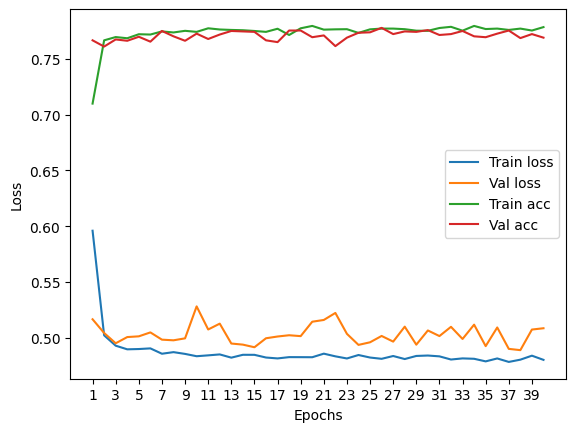

****************************************************************************************************



118it [00:01, 104.63it/s]


Train Epoch: 0 	Loss: 0.592720, Accuracy: 5505/7500 (73%)
Val Epoch: 0 	Loss: 0.533629, Accuracy: 1862/2500 (74%)



118it [00:00, 123.43it/s]


Train Epoch: 1 	Loss: 0.504651, Accuracy: 5746/7500 (77%)
Val Epoch: 1 	Loss: 0.506843, Accuracy: 1904/2500 (76%)



118it [00:00, 142.30it/s]


Train Epoch: 2 	Loss: 0.498470, Accuracy: 5754/7500 (77%)
Val Epoch: 2 	Loss: 0.506905, Accuracy: 1899/2500 (76%)



118it [00:00, 134.70it/s]


Train Epoch: 3 	Loss: 0.493148, Accuracy: 5774/7500 (77%)
Val Epoch: 3 	Loss: 0.501127, Accuracy: 1897/2500 (76%)



118it [00:00, 129.86it/s]


Train Epoch: 4 	Loss: 0.494918, Accuracy: 5750/7500 (77%)
Val Epoch: 4 	Loss: 0.508224, Accuracy: 1896/2500 (76%)



118it [00:00, 125.45it/s]


Train Epoch: 5 	Loss: 0.492930, Accuracy: 5794/7500 (77%)
Val Epoch: 5 	Loss: 0.514082, Accuracy: 1895/2500 (76%)



118it [00:01, 109.26it/s]


Train Epoch: 6 	Loss: 0.491634, Accuracy: 5795/7500 (77%)
Val Epoch: 6 	Loss: 0.508088, Accuracy: 1892/2500 (76%)



118it [00:00, 134.74it/s]


Train Epoch: 7 	Loss: 0.492020, Accuracy: 5768/7500 (77%)
Val Epoch: 7 	Loss: 0.501496, Accuracy: 1900/2500 (76%)



118it [00:00, 141.80it/s]


Train Epoch: 8 	Loss: 0.491350, Accuracy: 5787/7500 (77%)
Val Epoch: 8 	Loss: 0.504681, Accuracy: 1897/2500 (76%)



118it [00:01, 105.62it/s]


Train Epoch: 9 	Loss: 0.491234, Accuracy: 5800/7500 (77%)
Val Epoch: 9 	Loss: 0.514625, Accuracy: 1893/2500 (76%)



118it [00:00, 129.52it/s]


Train Epoch: 10 	Loss: 0.492573, Accuracy: 5777/7500 (77%)
Val Epoch: 10 	Loss: 0.495416, Accuracy: 1906/2500 (76%)



118it [00:00, 132.15it/s]


Train Epoch: 11 	Loss: 0.490316, Accuracy: 5787/7500 (77%)
Val Epoch: 11 	Loss: 0.507628, Accuracy: 1913/2500 (77%)



118it [00:01, 112.59it/s]


Train Epoch: 12 	Loss: 0.488880, Accuracy: 5800/7500 (77%)
Val Epoch: 12 	Loss: 0.497081, Accuracy: 1895/2500 (76%)



118it [00:00, 132.23it/s]


Train Epoch: 13 	Loss: 0.490116, Accuracy: 5792/7500 (77%)
Val Epoch: 13 	Loss: 0.500762, Accuracy: 1909/2500 (76%)



118it [00:00, 125.50it/s]


Train Epoch: 14 	Loss: 0.488660, Accuracy: 5801/7500 (77%)
Val Epoch: 14 	Loss: 0.503258, Accuracy: 1911/2500 (76%)



118it [00:00, 134.70it/s]


Train Epoch: 15 	Loss: 0.490129, Accuracy: 5808/7500 (77%)
Val Epoch: 15 	Loss: 0.493311, Accuracy: 1908/2500 (76%)



118it [00:00, 130.08it/s]


Train Epoch: 16 	Loss: 0.486635, Accuracy: 5803/7500 (77%)
Val Epoch: 16 	Loss: 0.500672, Accuracy: 1895/2500 (76%)



118it [00:00, 121.62it/s]


Train Epoch: 17 	Loss: 0.487966, Accuracy: 5814/7500 (78%)
Val Epoch: 17 	Loss: 0.513098, Accuracy: 1878/2500 (75%)



118it [00:00, 134.53it/s]


Train Epoch: 18 	Loss: 0.488456, Accuracy: 5800/7500 (77%)
Val Epoch: 18 	Loss: 0.498314, Accuracy: 1906/2500 (76%)



118it [00:00, 136.78it/s]


Train Epoch: 19 	Loss: 0.489571, Accuracy: 5805/7500 (77%)
Val Epoch: 19 	Loss: 0.494670, Accuracy: 1909/2500 (76%)



118it [00:00, 123.59it/s]


Train Epoch: 20 	Loss: 0.490538, Accuracy: 5791/7500 (77%)
Val Epoch: 20 	Loss: 0.494531, Accuracy: 1913/2500 (77%)



118it [00:01, 114.32it/s]


Train Epoch: 21 	Loss: 0.489563, Accuracy: 5801/7500 (77%)
Val Epoch: 21 	Loss: 0.521626, Accuracy: 1911/2500 (76%)



118it [00:00, 125.32it/s]


Train Epoch: 22 	Loss: 0.487705, Accuracy: 5810/7500 (77%)
Val Epoch: 22 	Loss: 0.504972, Accuracy: 1918/2500 (77%)



118it [00:01, 108.83it/s]


Train Epoch: 23 	Loss: 0.486786, Accuracy: 5807/7500 (77%)
Val Epoch: 23 	Loss: 0.505263, Accuracy: 1907/2500 (76%)



118it [00:01, 117.68it/s]


Train Epoch: 24 	Loss: 0.488219, Accuracy: 5800/7500 (77%)
Val Epoch: 24 	Loss: 0.491104, Accuracy: 1918/2500 (77%)



118it [00:00, 123.33it/s]


Train Epoch: 25 	Loss: 0.486864, Accuracy: 5817/7500 (78%)
Val Epoch: 25 	Loss: 0.492015, Accuracy: 1913/2500 (77%)



118it [00:01, 116.00it/s]


Train Epoch: 26 	Loss: 0.488703, Accuracy: 5818/7500 (78%)
Val Epoch: 26 	Loss: 0.499918, Accuracy: 1904/2500 (76%)



118it [00:00, 119.75it/s]


Train Epoch: 27 	Loss: 0.486448, Accuracy: 5835/7500 (78%)
Val Epoch: 27 	Loss: 0.494663, Accuracy: 1909/2500 (76%)



118it [00:01, 114.19it/s]


Train Epoch: 28 	Loss: 0.487854, Accuracy: 5808/7500 (77%)
Val Epoch: 28 	Loss: 0.500416, Accuracy: 1908/2500 (76%)



118it [00:01, 114.21it/s]


Train Epoch: 29 	Loss: 0.486403, Accuracy: 5788/7500 (77%)
Val Epoch: 29 	Loss: 0.507729, Accuracy: 1902/2500 (76%)



118it [00:00, 125.61it/s]


Train Epoch: 30 	Loss: 0.486008, Accuracy: 5805/7500 (77%)
Val Epoch: 30 	Loss: 0.493582, Accuracy: 1913/2500 (77%)



118it [00:00, 121.71it/s]


Train Epoch: 31 	Loss: 0.486393, Accuracy: 5826/7500 (78%)
Val Epoch: 31 	Loss: 0.508133, Accuracy: 1910/2500 (76%)



118it [00:00, 123.54it/s]


Train Epoch: 32 	Loss: 0.487260, Accuracy: 5830/7500 (78%)
Val Epoch: 32 	Loss: 0.492958, Accuracy: 1902/2500 (76%)



118it [00:00, 130.06it/s]


Train Epoch: 33 	Loss: 0.486419, Accuracy: 5826/7500 (78%)
Val Epoch: 33 	Loss: 0.499724, Accuracy: 1905/2500 (76%)



118it [00:00, 121.75it/s]


Train Epoch: 34 	Loss: 0.483991, Accuracy: 5802/7500 (77%)
Val Epoch: 34 	Loss: 0.500276, Accuracy: 1908/2500 (76%)



118it [00:00, 136.82it/s]


Train Epoch: 35 	Loss: 0.481508, Accuracy: 5822/7500 (78%)
Val Epoch: 35 	Loss: 0.513942, Accuracy: 1908/2500 (76%)



118it [00:00, 132.10it/s]


Train Epoch: 36 	Loss: 0.486245, Accuracy: 5824/7500 (78%)
Val Epoch: 36 	Loss: 0.495809, Accuracy: 1915/2500 (77%)



118it [00:01, 117.88it/s]


Train Epoch: 37 	Loss: 0.483483, Accuracy: 5819/7500 (78%)
Val Epoch: 37 	Loss: 0.497736, Accuracy: 1922/2500 (77%)



118it [00:00, 123.71it/s]


Train Epoch: 38 	Loss: 0.482815, Accuracy: 5807/7500 (77%)
Val Epoch: 38 	Loss: 0.509785, Accuracy: 1918/2500 (77%)



118it [00:01, 116.12it/s]


Train Epoch: 39 	Loss: 0.484441, Accuracy: 5809/7500 (77%)
Val Epoch: 39 	Loss: 0.496116, Accuracy: 1923/2500 (77%)

Test accuracy:  77.36


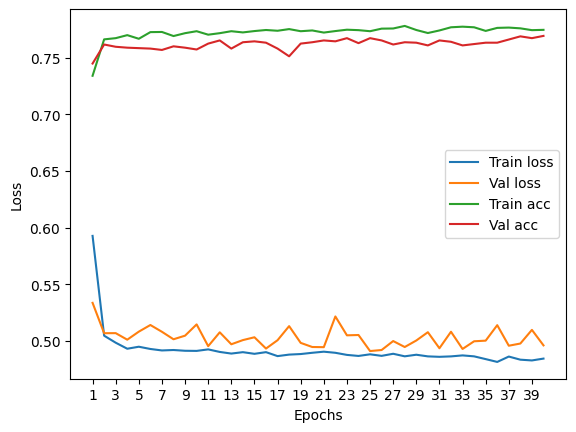

****************************************************************************************************



118it [00:00, 135.07it/s]


Train Epoch: 0 	Loss: 0.625491, Accuracy: 5300/7500 (71%)
Val Epoch: 0 	Loss: 0.541013, Accuracy: 1921/2500 (77%)



118it [00:00, 119.07it/s]


Train Epoch: 1 	Loss: 0.517332, Accuracy: 5705/7500 (76%)
Val Epoch: 1 	Loss: 0.507294, Accuracy: 1914/2500 (77%)



118it [00:00, 134.74it/s]


Train Epoch: 2 	Loss: 0.500670, Accuracy: 5752/7500 (77%)
Val Epoch: 2 	Loss: 0.519951, Accuracy: 1922/2500 (77%)



118it [00:00, 129.12it/s]


Train Epoch: 3 	Loss: 0.494202, Accuracy: 5740/7500 (77%)
Val Epoch: 3 	Loss: 0.504357, Accuracy: 1911/2500 (76%)



118it [00:00, 127.94it/s]


Train Epoch: 4 	Loss: 0.494894, Accuracy: 5787/7500 (77%)
Val Epoch: 4 	Loss: 0.510475, Accuracy: 1912/2500 (76%)



118it [00:00, 140.15it/s]


Train Epoch: 5 	Loss: 0.490894, Accuracy: 5763/7500 (77%)
Val Epoch: 5 	Loss: 0.501871, Accuracy: 1913/2500 (77%)



118it [00:00, 146.85it/s]


Train Epoch: 6 	Loss: 0.493534, Accuracy: 5792/7500 (77%)
Val Epoch: 6 	Loss: 0.499994, Accuracy: 1920/2500 (77%)



118it [00:00, 122.84it/s]


Train Epoch: 7 	Loss: 0.492190, Accuracy: 5778/7500 (77%)
Val Epoch: 7 	Loss: 0.510645, Accuracy: 1920/2500 (77%)



118it [00:00, 121.21it/s]


Train Epoch: 8 	Loss: 0.492574, Accuracy: 5771/7500 (77%)
Val Epoch: 8 	Loss: 0.517012, Accuracy: 1932/2500 (77%)



118it [00:00, 140.75it/s]


Train Epoch: 9 	Loss: 0.494200, Accuracy: 5775/7500 (77%)
Val Epoch: 9 	Loss: 0.513806, Accuracy: 1919/2500 (77%)



118it [00:00, 126.35it/s]


Train Epoch: 10 	Loss: 0.491574, Accuracy: 5771/7500 (77%)
Val Epoch: 10 	Loss: 0.515779, Accuracy: 1921/2500 (77%)



118it [00:01, 115.80it/s]


Train Epoch: 11 	Loss: 0.493126, Accuracy: 5767/7500 (77%)
Val Epoch: 11 	Loss: 0.513882, Accuracy: 1931/2500 (77%)



118it [00:00, 130.72it/s]


Train Epoch: 12 	Loss: 0.491822, Accuracy: 5782/7500 (77%)
Val Epoch: 12 	Loss: 0.507216, Accuracy: 1910/2500 (76%)



118it [00:01, 113.79it/s]


Train Epoch: 13 	Loss: 0.490686, Accuracy: 5789/7500 (77%)
Val Epoch: 13 	Loss: 0.512300, Accuracy: 1930/2500 (77%)



118it [00:01, 113.51it/s]


Train Epoch: 14 	Loss: 0.492991, Accuracy: 5784/7500 (77%)
Val Epoch: 14 	Loss: 0.504622, Accuracy: 1929/2500 (77%)



118it [00:01, 103.23it/s]


Train Epoch: 15 	Loss: 0.491290, Accuracy: 5822/7500 (78%)
Val Epoch: 15 	Loss: 0.515242, Accuracy: 1930/2500 (77%)



118it [00:01, 111.52it/s]


Train Epoch: 16 	Loss: 0.488582, Accuracy: 5785/7500 (77%)
Val Epoch: 16 	Loss: 0.505189, Accuracy: 1926/2500 (77%)



118it [00:01, 110.75it/s]


Train Epoch: 17 	Loss: 0.487906, Accuracy: 5796/7500 (77%)
Val Epoch: 17 	Loss: 0.505828, Accuracy: 1920/2500 (77%)



118it [00:01, 99.82it/s]


Train Epoch: 18 	Loss: 0.490139, Accuracy: 5798/7500 (77%)
Val Epoch: 18 	Loss: 0.511157, Accuracy: 1930/2500 (77%)



118it [00:00, 118.57it/s]


Train Epoch: 19 	Loss: 0.488295, Accuracy: 5814/7500 (78%)
Val Epoch: 19 	Loss: 0.505155, Accuracy: 1920/2500 (77%)



118it [00:00, 118.34it/s]


Train Epoch: 20 	Loss: 0.486677, Accuracy: 5838/7500 (78%)
Val Epoch: 20 	Loss: 0.502104, Accuracy: 1932/2500 (77%)



118it [00:00, 135.17it/s]


Train Epoch: 21 	Loss: 0.487254, Accuracy: 5806/7500 (77%)
Val Epoch: 21 	Loss: 0.520423, Accuracy: 1926/2500 (77%)



118it [00:00, 134.82it/s]


Train Epoch: 22 	Loss: 0.490283, Accuracy: 5804/7500 (77%)
Val Epoch: 22 	Loss: 0.504524, Accuracy: 1930/2500 (77%)



118it [00:01, 117.74it/s]


Train Epoch: 23 	Loss: 0.487792, Accuracy: 5814/7500 (78%)
Val Epoch: 23 	Loss: 0.499876, Accuracy: 1936/2500 (77%)



118it [00:00, 121.49it/s]


Train Epoch: 24 	Loss: 0.487075, Accuracy: 5792/7500 (77%)
Val Epoch: 24 	Loss: 0.502762, Accuracy: 1934/2500 (77%)



118it [00:00, 123.20it/s]


Train Epoch: 25 	Loss: 0.487245, Accuracy: 5807/7500 (77%)
Val Epoch: 25 	Loss: 0.500800, Accuracy: 1921/2500 (77%)



118it [00:01, 111.93it/s]


Train Epoch: 26 	Loss: 0.487884, Accuracy: 5808/7500 (77%)
Val Epoch: 26 	Loss: 0.499440, Accuracy: 1939/2500 (78%)



118it [00:00, 121.58it/s]


Train Epoch: 27 	Loss: 0.488305, Accuracy: 5799/7500 (77%)
Val Epoch: 27 	Loss: 0.512361, Accuracy: 1922/2500 (77%)



118it [00:00, 131.78it/s]


Train Epoch: 28 	Loss: 0.488077, Accuracy: 5818/7500 (78%)
Val Epoch: 28 	Loss: 0.512776, Accuracy: 1919/2500 (77%)



118it [00:00, 129.88it/s]


Train Epoch: 29 	Loss: 0.487231, Accuracy: 5833/7500 (78%)
Val Epoch: 29 	Loss: 0.512036, Accuracy: 1929/2500 (77%)



118it [00:00, 126.98it/s]


Train Epoch: 30 	Loss: 0.485233, Accuracy: 5817/7500 (78%)
Val Epoch: 30 	Loss: 0.514787, Accuracy: 1928/2500 (77%)



118it [00:00, 131.71it/s]


Train Epoch: 31 	Loss: 0.484926, Accuracy: 5827/7500 (78%)
Val Epoch: 31 	Loss: 0.520786, Accuracy: 1924/2500 (77%)



118it [00:00, 125.92it/s]


Train Epoch: 32 	Loss: 0.486465, Accuracy: 5815/7500 (78%)
Val Epoch: 32 	Loss: 0.508082, Accuracy: 1926/2500 (77%)



118it [00:00, 119.62it/s]


Train Epoch: 33 	Loss: 0.488270, Accuracy: 5792/7500 (77%)
Val Epoch: 33 	Loss: 0.503123, Accuracy: 1925/2500 (77%)



118it [00:00, 122.12it/s]


Train Epoch: 34 	Loss: 0.487137, Accuracy: 5806/7500 (77%)
Val Epoch: 34 	Loss: 0.506877, Accuracy: 1922/2500 (77%)



118it [00:00, 123.49it/s]


Train Epoch: 35 	Loss: 0.486884, Accuracy: 5822/7500 (78%)
Val Epoch: 35 	Loss: 0.506338, Accuracy: 1929/2500 (77%)



118it [00:01, 114.18it/s]


Train Epoch: 36 	Loss: 0.486072, Accuracy: 5815/7500 (78%)
Val Epoch: 36 	Loss: 0.515934, Accuracy: 1926/2500 (77%)



118it [00:01, 105.32it/s]


Train Epoch: 37 	Loss: 0.484700, Accuracy: 5826/7500 (78%)
Val Epoch: 37 	Loss: 0.519846, Accuracy: 1931/2500 (77%)



118it [00:00, 126.56it/s]


Train Epoch: 38 	Loss: 0.486327, Accuracy: 5803/7500 (77%)
Val Epoch: 38 	Loss: 0.521888, Accuracy: 1934/2500 (77%)



118it [00:01, 104.61it/s]


Train Epoch: 39 	Loss: 0.483892, Accuracy: 5819/7500 (78%)
Val Epoch: 39 	Loss: 0.506613, Accuracy: 1921/2500 (77%)

Test accuracy:  76.92


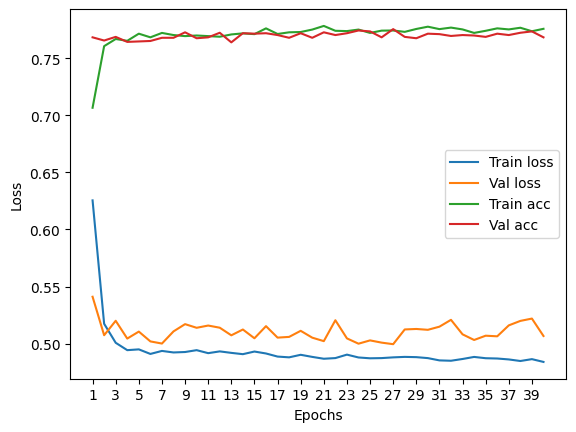

****************************************************************************************************



118it [00:00, 133.34it/s]


Train Epoch: 0 	Loss: 0.610350, Accuracy: 5223/7500 (70%)
Val Epoch: 0 	Loss: 0.522878, Accuracy: 1920/2500 (77%)



118it [00:01, 106.85it/s]


Train Epoch: 1 	Loss: 0.510350, Accuracy: 5707/7500 (76%)
Val Epoch: 1 	Loss: 0.500586, Accuracy: 1919/2500 (77%)



118it [00:00, 134.62it/s]


Train Epoch: 2 	Loss: 0.502516, Accuracy: 5738/7500 (77%)
Val Epoch: 2 	Loss: 0.518169, Accuracy: 1912/2500 (76%)



118it [00:00, 125.43it/s]


Train Epoch: 3 	Loss: 0.501729, Accuracy: 5729/7500 (76%)
Val Epoch: 3 	Loss: 0.490317, Accuracy: 1917/2500 (77%)



118it [00:00, 119.81it/s]


Train Epoch: 4 	Loss: 0.499589, Accuracy: 5744/7500 (77%)
Val Epoch: 4 	Loss: 0.495576, Accuracy: 1914/2500 (77%)



118it [00:01, 115.10it/s]


Train Epoch: 5 	Loss: 0.498007, Accuracy: 5763/7500 (77%)
Val Epoch: 5 	Loss: 0.507833, Accuracy: 1920/2500 (77%)



118it [00:00, 120.43it/s]


Train Epoch: 6 	Loss: 0.498692, Accuracy: 5749/7500 (77%)
Val Epoch: 6 	Loss: 0.493151, Accuracy: 1924/2500 (77%)



118it [00:00, 131.31it/s]


Train Epoch: 7 	Loss: 0.500519, Accuracy: 5745/7500 (77%)
Val Epoch: 7 	Loss: 0.492597, Accuracy: 1920/2500 (77%)



118it [00:00, 126.71it/s]


Train Epoch: 8 	Loss: 0.498832, Accuracy: 5742/7500 (77%)
Val Epoch: 8 	Loss: 0.498712, Accuracy: 1921/2500 (77%)



118it [00:00, 120.61it/s]


Train Epoch: 9 	Loss: 0.498339, Accuracy: 5747/7500 (77%)
Val Epoch: 9 	Loss: 0.496006, Accuracy: 1920/2500 (77%)



118it [00:00, 124.68it/s]


Train Epoch: 10 	Loss: 0.498291, Accuracy: 5734/7500 (76%)
Val Epoch: 10 	Loss: 0.494036, Accuracy: 1912/2500 (76%)



118it [00:01, 117.31it/s]


Train Epoch: 11 	Loss: 0.498490, Accuracy: 5750/7500 (77%)
Val Epoch: 11 	Loss: 0.499485, Accuracy: 1926/2500 (77%)



118it [00:00, 133.07it/s]


Train Epoch: 12 	Loss: 0.498547, Accuracy: 5733/7500 (76%)
Val Epoch: 12 	Loss: 0.503780, Accuracy: 1924/2500 (77%)



118it [00:00, 121.03it/s]


Train Epoch: 13 	Loss: 0.496086, Accuracy: 5740/7500 (77%)
Val Epoch: 13 	Loss: 0.500692, Accuracy: 1916/2500 (77%)



118it [00:00, 137.68it/s]


Train Epoch: 14 	Loss: 0.495903, Accuracy: 5731/7500 (76%)
Val Epoch: 14 	Loss: 0.505570, Accuracy: 1925/2500 (77%)



118it [00:00, 133.14it/s]


Train Epoch: 15 	Loss: 0.498631, Accuracy: 5739/7500 (77%)
Val Epoch: 15 	Loss: 0.508602, Accuracy: 1918/2500 (77%)



118it [00:00, 127.36it/s]


Train Epoch: 16 	Loss: 0.495292, Accuracy: 5742/7500 (77%)
Val Epoch: 16 	Loss: 0.493275, Accuracy: 1920/2500 (77%)



118it [00:00, 132.72it/s]


Train Epoch: 17 	Loss: 0.496196, Accuracy: 5740/7500 (77%)
Val Epoch: 17 	Loss: 0.501403, Accuracy: 1923/2500 (77%)



118it [00:00, 128.61it/s]


Train Epoch: 18 	Loss: 0.500177, Accuracy: 5731/7500 (76%)
Val Epoch: 18 	Loss: 0.499967, Accuracy: 1926/2500 (77%)



118it [00:00, 121.08it/s]


Train Epoch: 19 	Loss: 0.498282, Accuracy: 5746/7500 (77%)
Val Epoch: 19 	Loss: 0.491896, Accuracy: 1930/2500 (77%)



118it [00:01, 113.64it/s]


Train Epoch: 20 	Loss: 0.496763, Accuracy: 5745/7500 (77%)
Val Epoch: 20 	Loss: 0.487475, Accuracy: 1928/2500 (77%)



118it [00:00, 134.91it/s]


Train Epoch: 21 	Loss: 0.496755, Accuracy: 5738/7500 (77%)
Val Epoch: 21 	Loss: 0.496768, Accuracy: 1927/2500 (77%)



118it [00:00, 127.98it/s]


Train Epoch: 22 	Loss: 0.494657, Accuracy: 5746/7500 (77%)
Val Epoch: 22 	Loss: 0.488078, Accuracy: 1924/2500 (77%)



118it [00:00, 118.01it/s]


Train Epoch: 23 	Loss: 0.496448, Accuracy: 5753/7500 (77%)
Val Epoch: 23 	Loss: 0.491982, Accuracy: 1927/2500 (77%)



118it [00:00, 127.26it/s]


Train Epoch: 24 	Loss: 0.493598, Accuracy: 5740/7500 (77%)
Val Epoch: 24 	Loss: 0.519382, Accuracy: 1916/2500 (77%)



118it [00:00, 136.56it/s]


Train Epoch: 25 	Loss: 0.497926, Accuracy: 5745/7500 (77%)
Val Epoch: 25 	Loss: 0.492442, Accuracy: 1919/2500 (77%)



118it [00:01, 113.21it/s]


Train Epoch: 26 	Loss: 0.496445, Accuracy: 5745/7500 (77%)
Val Epoch: 26 	Loss: 0.487783, Accuracy: 1923/2500 (77%)



118it [00:00, 137.29it/s]


Train Epoch: 27 	Loss: 0.495650, Accuracy: 5772/7500 (77%)
Val Epoch: 27 	Loss: 0.496736, Accuracy: 1930/2500 (77%)



118it [00:00, 127.46it/s]


Train Epoch: 28 	Loss: 0.495566, Accuracy: 5757/7500 (77%)
Val Epoch: 28 	Loss: 0.499101, Accuracy: 1919/2500 (77%)



118it [00:00, 127.66it/s]


Train Epoch: 29 	Loss: 0.496445, Accuracy: 5754/7500 (77%)
Val Epoch: 29 	Loss: 0.488959, Accuracy: 1928/2500 (77%)



118it [00:01, 115.08it/s]


Train Epoch: 30 	Loss: 0.495193, Accuracy: 5740/7500 (77%)
Val Epoch: 30 	Loss: 0.492861, Accuracy: 1920/2500 (77%)



118it [00:00, 132.77it/s]


Train Epoch: 31 	Loss: 0.494968, Accuracy: 5748/7500 (77%)
Val Epoch: 31 	Loss: 0.493494, Accuracy: 1928/2500 (77%)



118it [00:01, 113.80it/s]


Train Epoch: 32 	Loss: 0.494583, Accuracy: 5741/7500 (77%)
Val Epoch: 32 	Loss: 0.493789, Accuracy: 1921/2500 (77%)



118it [00:00, 124.23it/s]


Train Epoch: 33 	Loss: 0.493534, Accuracy: 5758/7500 (77%)
Val Epoch: 33 	Loss: 0.496429, Accuracy: 1919/2500 (77%)



118it [00:00, 118.92it/s]


Train Epoch: 34 	Loss: 0.494519, Accuracy: 5754/7500 (77%)
Val Epoch: 34 	Loss: 0.491649, Accuracy: 1934/2500 (77%)



118it [00:00, 140.41it/s]


Train Epoch: 35 	Loss: 0.495544, Accuracy: 5723/7500 (76%)
Val Epoch: 35 	Loss: 0.492457, Accuracy: 1920/2500 (77%)



118it [00:00, 124.35it/s]


Train Epoch: 36 	Loss: 0.495927, Accuracy: 5766/7500 (77%)
Val Epoch: 36 	Loss: 0.504452, Accuracy: 1927/2500 (77%)



118it [00:01, 117.48it/s]


Train Epoch: 37 	Loss: 0.496031, Accuracy: 5735/7500 (76%)
Val Epoch: 37 	Loss: 0.492475, Accuracy: 1926/2500 (77%)



118it [00:00, 131.12it/s]


Train Epoch: 38 	Loss: 0.495534, Accuracy: 5744/7500 (77%)
Val Epoch: 38 	Loss: 0.519587, Accuracy: 1921/2500 (77%)



118it [00:00, 122.53it/s]


Train Epoch: 39 	Loss: 0.498597, Accuracy: 5739/7500 (77%)
Val Epoch: 39 	Loss: 0.495462, Accuracy: 1921/2500 (77%)

Test accuracy:  78.56


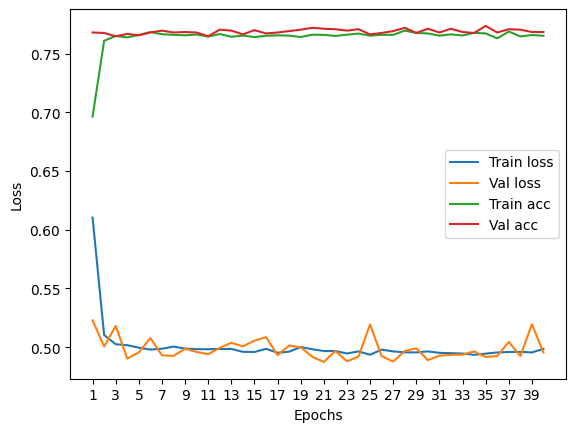

****************************************************************************************************



116it [00:01, 112.13it/s]


Train Epoch: 0 	Loss: 0.608666, Accuracy: 5316/7422 (72%)
Val Epoch: 0 	Loss: 0.528043, Accuracy: 1803/2474 (73%)



116it [00:00, 119.31it/s]


Train Epoch: 1 	Loss: 0.506722, Accuracy: 5620/7422 (76%)
Val Epoch: 1 	Loss: 0.502282, Accuracy: 1895/2474 (77%)



116it [00:00, 135.44it/s]


Train Epoch: 2 	Loss: 0.498360, Accuracy: 5640/7422 (76%)
Val Epoch: 2 	Loss: 0.496142, Accuracy: 1903/2474 (77%)



116it [00:00, 134.42it/s]


Train Epoch: 3 	Loss: 0.496336, Accuracy: 5668/7422 (76%)
Val Epoch: 3 	Loss: 0.497158, Accuracy: 1882/2474 (76%)



116it [00:00, 116.14it/s]


Train Epoch: 4 	Loss: 0.494657, Accuracy: 5681/7422 (77%)
Val Epoch: 4 	Loss: 0.494271, Accuracy: 1888/2474 (76%)



116it [00:00, 137.33it/s]


Train Epoch: 5 	Loss: 0.495553, Accuracy: 5683/7422 (77%)
Val Epoch: 5 	Loss: 0.501493, Accuracy: 1878/2474 (76%)



116it [00:00, 121.69it/s]


Train Epoch: 6 	Loss: 0.494681, Accuracy: 5687/7422 (77%)
Val Epoch: 6 	Loss: 0.497169, Accuracy: 1891/2474 (76%)



116it [00:00, 120.61it/s]


Train Epoch: 7 	Loss: 0.493891, Accuracy: 5669/7422 (76%)
Val Epoch: 7 	Loss: 0.495677, Accuracy: 1889/2474 (76%)



116it [00:00, 123.18it/s]


Train Epoch: 8 	Loss: 0.492902, Accuracy: 5669/7422 (76%)
Val Epoch: 8 	Loss: 0.508932, Accuracy: 1875/2474 (76%)



116it [00:00, 122.65it/s]


Train Epoch: 9 	Loss: 0.493586, Accuracy: 5670/7422 (76%)
Val Epoch: 9 	Loss: 0.499104, Accuracy: 1878/2474 (76%)



116it [00:00, 118.98it/s]


Train Epoch: 10 	Loss: 0.492586, Accuracy: 5667/7422 (76%)
Val Epoch: 10 	Loss: 0.494743, Accuracy: 1892/2474 (76%)



116it [00:00, 121.39it/s]


Train Epoch: 11 	Loss: 0.492213, Accuracy: 5680/7422 (77%)
Val Epoch: 11 	Loss: 0.496060, Accuracy: 1904/2474 (77%)



116it [00:01, 109.86it/s]


Train Epoch: 12 	Loss: 0.492073, Accuracy: 5696/7422 (77%)
Val Epoch: 12 	Loss: 0.497665, Accuracy: 1890/2474 (76%)



116it [00:00, 116.32it/s]


Train Epoch: 13 	Loss: 0.492278, Accuracy: 5687/7422 (77%)
Val Epoch: 13 	Loss: 0.498637, Accuracy: 1881/2474 (76%)



116it [00:01, 114.27it/s]


Train Epoch: 14 	Loss: 0.491870, Accuracy: 5674/7422 (76%)
Val Epoch: 14 	Loss: 0.495349, Accuracy: 1888/2474 (76%)



116it [00:00, 131.97it/s]


Train Epoch: 15 	Loss: 0.491552, Accuracy: 5668/7422 (76%)
Val Epoch: 15 	Loss: 0.499105, Accuracy: 1889/2474 (76%)



116it [00:00, 130.54it/s]


Train Epoch: 16 	Loss: 0.490475, Accuracy: 5683/7422 (77%)
Val Epoch: 16 	Loss: 0.495957, Accuracy: 1880/2474 (76%)



116it [00:01, 102.41it/s]


Train Epoch: 17 	Loss: 0.491510, Accuracy: 5694/7422 (77%)
Val Epoch: 17 	Loss: 0.495566, Accuracy: 1895/2474 (77%)



116it [00:00, 136.13it/s]


Train Epoch: 18 	Loss: 0.489055, Accuracy: 5685/7422 (77%)
Val Epoch: 18 	Loss: 0.495802, Accuracy: 1886/2474 (76%)



116it [00:00, 124.92it/s]


Train Epoch: 19 	Loss: 0.490075, Accuracy: 5683/7422 (77%)
Val Epoch: 19 	Loss: 0.500848, Accuracy: 1871/2474 (76%)



116it [00:00, 132.80it/s]


Train Epoch: 20 	Loss: 0.491437, Accuracy: 5678/7422 (77%)
Val Epoch: 20 	Loss: 0.498214, Accuracy: 1887/2474 (76%)



116it [00:00, 133.14it/s]


Train Epoch: 21 	Loss: 0.489741, Accuracy: 5663/7422 (76%)
Val Epoch: 21 	Loss: 0.502384, Accuracy: 1881/2474 (76%)



116it [00:00, 123.89it/s]


Train Epoch: 22 	Loss: 0.490019, Accuracy: 5691/7422 (77%)
Val Epoch: 22 	Loss: 0.496636, Accuracy: 1894/2474 (77%)



116it [00:00, 125.28it/s]


Train Epoch: 23 	Loss: 0.489293, Accuracy: 5691/7422 (77%)
Val Epoch: 23 	Loss: 0.497958, Accuracy: 1867/2474 (75%)



116it [00:00, 135.05it/s]


Train Epoch: 24 	Loss: 0.489834, Accuracy: 5693/7422 (77%)
Val Epoch: 24 	Loss: 0.494119, Accuracy: 1897/2474 (77%)



116it [00:00, 122.38it/s]


Train Epoch: 25 	Loss: 0.488869, Accuracy: 5696/7422 (77%)
Val Epoch: 25 	Loss: 0.494342, Accuracy: 1892/2474 (76%)



116it [00:00, 116.11it/s]


Train Epoch: 26 	Loss: 0.490672, Accuracy: 5683/7422 (77%)
Val Epoch: 26 	Loss: 0.499593, Accuracy: 1879/2474 (76%)



116it [00:00, 131.94it/s]


Train Epoch: 27 	Loss: 0.489670, Accuracy: 5693/7422 (77%)
Val Epoch: 27 	Loss: 0.495623, Accuracy: 1890/2474 (76%)



116it [00:00, 133.28it/s]


Train Epoch: 28 	Loss: 0.489709, Accuracy: 5693/7422 (77%)
Val Epoch: 28 	Loss: 0.504642, Accuracy: 1892/2474 (76%)



116it [00:00, 122.77it/s]


Train Epoch: 29 	Loss: 0.489604, Accuracy: 5676/7422 (76%)
Val Epoch: 29 	Loss: 0.493929, Accuracy: 1894/2474 (77%)



116it [00:00, 128.99it/s]


Train Epoch: 30 	Loss: 0.488444, Accuracy: 5697/7422 (77%)
Val Epoch: 30 	Loss: 0.497740, Accuracy: 1878/2474 (76%)



116it [00:00, 133.13it/s]


Train Epoch: 31 	Loss: 0.488176, Accuracy: 5694/7422 (77%)
Val Epoch: 31 	Loss: 0.494782, Accuracy: 1907/2474 (77%)



116it [00:00, 141.29it/s]


Train Epoch: 32 	Loss: 0.489215, Accuracy: 5702/7422 (77%)
Val Epoch: 32 	Loss: 0.499008, Accuracy: 1903/2474 (77%)



116it [00:00, 126.08it/s]


Train Epoch: 33 	Loss: 0.489324, Accuracy: 5711/7422 (77%)
Val Epoch: 33 	Loss: 0.503012, Accuracy: 1872/2474 (76%)



116it [00:00, 129.49it/s]


Train Epoch: 34 	Loss: 0.489256, Accuracy: 5685/7422 (77%)
Val Epoch: 34 	Loss: 0.491624, Accuracy: 1895/2474 (77%)



116it [00:00, 122.87it/s]


Train Epoch: 35 	Loss: 0.488560, Accuracy: 5674/7422 (76%)
Val Epoch: 35 	Loss: 0.496484, Accuracy: 1885/2474 (76%)



116it [00:00, 136.67it/s]


Train Epoch: 36 	Loss: 0.487037, Accuracy: 5708/7422 (77%)
Val Epoch: 36 	Loss: 0.498224, Accuracy: 1884/2474 (76%)



116it [00:00, 122.30it/s]


Train Epoch: 37 	Loss: 0.490787, Accuracy: 5677/7422 (76%)
Val Epoch: 37 	Loss: 0.499131, Accuracy: 1880/2474 (76%)



116it [00:01, 115.30it/s]


Train Epoch: 38 	Loss: 0.487311, Accuracy: 5677/7422 (76%)
Val Epoch: 38 	Loss: 0.495993, Accuracy: 1869/2474 (76%)



116it [00:01, 115.62it/s]


Train Epoch: 39 	Loss: 0.486963, Accuracy: 5700/7422 (77%)
Val Epoch: 39 	Loss: 0.496410, Accuracy: 1883/2474 (76%)

Test accuracy:  76.47534357316087


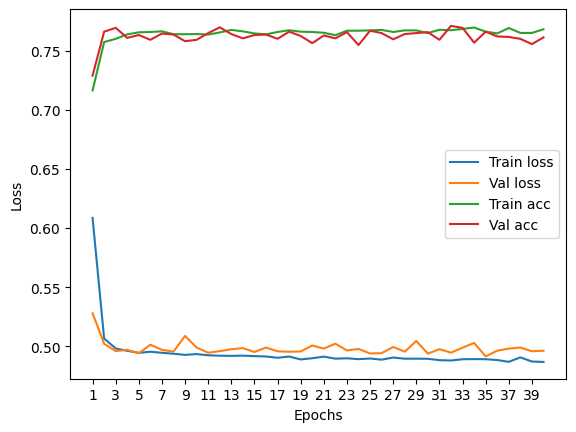

****************************************************************************************************



Particles per jet: 10


118it [00:00, 128.99it/s]


Train Epoch: 0 	Loss: 0.632837, Accuracy: 5071/7500 (68%)
Val Epoch: 0 	Loss: 0.548141, Accuracy: 1932/2500 (77%)



118it [00:01, 114.09it/s]


Train Epoch: 1 	Loss: 0.509418, Accuracy: 5698/7500 (76%)
Val Epoch: 1 	Loss: 0.538057, Accuracy: 1928/2500 (77%)



118it [00:01, 113.73it/s]


Train Epoch: 2 	Loss: 0.496863, Accuracy: 5746/7500 (77%)
Val Epoch: 2 	Loss: 0.519802, Accuracy: 1925/2500 (77%)



118it [00:00, 130.63it/s]


Train Epoch: 3 	Loss: 0.490321, Accuracy: 5773/7500 (77%)
Val Epoch: 3 	Loss: 0.496761, Accuracy: 1918/2500 (77%)



118it [00:01, 115.61it/s]


Train Epoch: 4 	Loss: 0.486943, Accuracy: 5788/7500 (77%)
Val Epoch: 4 	Loss: 0.489012, Accuracy: 1932/2500 (77%)



118it [00:00, 123.91it/s]


Train Epoch: 5 	Loss: 0.489507, Accuracy: 5764/7500 (77%)
Val Epoch: 5 	Loss: 0.502676, Accuracy: 1938/2500 (78%)



118it [00:00, 140.89it/s]


Train Epoch: 6 	Loss: 0.486271, Accuracy: 5798/7500 (77%)
Val Epoch: 6 	Loss: 0.501338, Accuracy: 1932/2500 (77%)



118it [00:00, 120.38it/s]


Train Epoch: 7 	Loss: 0.484385, Accuracy: 5796/7500 (77%)
Val Epoch: 7 	Loss: 0.497227, Accuracy: 1944/2500 (78%)



118it [00:00, 119.04it/s]


Train Epoch: 8 	Loss: 0.486433, Accuracy: 5792/7500 (77%)
Val Epoch: 8 	Loss: 0.488062, Accuracy: 1937/2500 (77%)



118it [00:01, 112.42it/s]


Train Epoch: 9 	Loss: 0.485333, Accuracy: 5796/7500 (77%)
Val Epoch: 9 	Loss: 0.497049, Accuracy: 1942/2500 (78%)



118it [00:00, 131.15it/s]


Train Epoch: 10 	Loss: 0.485049, Accuracy: 5822/7500 (78%)
Val Epoch: 10 	Loss: 0.498660, Accuracy: 1937/2500 (77%)



118it [00:00, 127.67it/s]


Train Epoch: 11 	Loss: 0.482834, Accuracy: 5811/7500 (77%)
Val Epoch: 11 	Loss: 0.490951, Accuracy: 1937/2500 (77%)



118it [00:00, 124.16it/s]


Train Epoch: 12 	Loss: 0.483414, Accuracy: 5823/7500 (78%)
Val Epoch: 12 	Loss: 0.492521, Accuracy: 1937/2500 (77%)



118it [00:01, 108.71it/s]


Train Epoch: 13 	Loss: 0.483172, Accuracy: 5823/7500 (78%)
Val Epoch: 13 	Loss: 0.493850, Accuracy: 1946/2500 (78%)



118it [00:01, 115.23it/s]


Train Epoch: 14 	Loss: 0.483927, Accuracy: 5789/7500 (77%)
Val Epoch: 14 	Loss: 0.500861, Accuracy: 1952/2500 (78%)



118it [00:00, 136.35it/s]


Train Epoch: 15 	Loss: 0.480852, Accuracy: 5832/7500 (78%)
Val Epoch: 15 	Loss: 0.514535, Accuracy: 1938/2500 (78%)



118it [00:01, 113.67it/s]


Train Epoch: 16 	Loss: 0.482810, Accuracy: 5796/7500 (77%)
Val Epoch: 16 	Loss: 0.503006, Accuracy: 1937/2500 (77%)



118it [00:01, 113.39it/s]


Train Epoch: 17 	Loss: 0.481707, Accuracy: 5836/7500 (78%)
Val Epoch: 17 	Loss: 0.500231, Accuracy: 1945/2500 (78%)



118it [00:01, 115.88it/s]


Train Epoch: 18 	Loss: 0.481173, Accuracy: 5813/7500 (78%)
Val Epoch: 18 	Loss: 0.515431, Accuracy: 1945/2500 (78%)



118it [00:00, 125.90it/s]


Train Epoch: 19 	Loss: 0.481868, Accuracy: 5827/7500 (78%)
Val Epoch: 19 	Loss: 0.523381, Accuracy: 1926/2500 (77%)



118it [00:00, 125.36it/s]


Train Epoch: 20 	Loss: 0.482943, Accuracy: 5823/7500 (78%)
Val Epoch: 20 	Loss: 0.505672, Accuracy: 1949/2500 (78%)



118it [00:00, 125.90it/s]


Train Epoch: 21 	Loss: 0.481260, Accuracy: 5831/7500 (78%)
Val Epoch: 21 	Loss: 0.492541, Accuracy: 1925/2500 (77%)



118it [00:00, 132.66it/s]


Train Epoch: 22 	Loss: 0.483069, Accuracy: 5829/7500 (78%)
Val Epoch: 22 	Loss: 0.492628, Accuracy: 1945/2500 (78%)



118it [00:00, 138.96it/s]


Train Epoch: 23 	Loss: 0.480408, Accuracy: 5820/7500 (78%)
Val Epoch: 23 	Loss: 0.507375, Accuracy: 1955/2500 (78%)



118it [00:01, 115.58it/s]


Train Epoch: 24 	Loss: 0.479914, Accuracy: 5830/7500 (78%)
Val Epoch: 24 	Loss: 0.488715, Accuracy: 1956/2500 (78%)



118it [00:01, 114.02it/s]


Train Epoch: 25 	Loss: 0.482168, Accuracy: 5809/7500 (77%)
Val Epoch: 25 	Loss: 0.500772, Accuracy: 1944/2500 (78%)



118it [00:01, 114.28it/s]


Train Epoch: 26 	Loss: 0.480519, Accuracy: 5819/7500 (78%)
Val Epoch: 26 	Loss: 0.496394, Accuracy: 1946/2500 (78%)



118it [00:00, 136.80it/s]


Train Epoch: 27 	Loss: 0.479847, Accuracy: 5829/7500 (78%)
Val Epoch: 27 	Loss: 0.490576, Accuracy: 1947/2500 (78%)



118it [00:01, 104.98it/s]


Train Epoch: 28 	Loss: 0.478514, Accuracy: 5837/7500 (78%)
Val Epoch: 28 	Loss: 0.490812, Accuracy: 1949/2500 (78%)



118it [00:01, 113.51it/s]


Train Epoch: 29 	Loss: 0.480746, Accuracy: 5829/7500 (78%)
Val Epoch: 29 	Loss: 0.493998, Accuracy: 1949/2500 (78%)



118it [00:01, 117.01it/s]


Train Epoch: 30 	Loss: 0.480012, Accuracy: 5820/7500 (78%)
Val Epoch: 30 	Loss: 0.506109, Accuracy: 1948/2500 (78%)



118it [00:00, 120.67it/s]


Train Epoch: 31 	Loss: 0.484446, Accuracy: 5824/7500 (78%)
Val Epoch: 31 	Loss: 0.507607, Accuracy: 1956/2500 (78%)



118it [00:00, 126.83it/s]


Train Epoch: 32 	Loss: 0.480761, Accuracy: 5835/7500 (78%)
Val Epoch: 32 	Loss: 0.498591, Accuracy: 1950/2500 (78%)



118it [00:00, 131.08it/s]


Train Epoch: 33 	Loss: 0.481683, Accuracy: 5819/7500 (78%)
Val Epoch: 33 	Loss: 0.500298, Accuracy: 1938/2500 (78%)



118it [00:00, 137.02it/s]


Train Epoch: 34 	Loss: 0.480317, Accuracy: 5820/7500 (78%)
Val Epoch: 34 	Loss: 0.499842, Accuracy: 1936/2500 (77%)



118it [00:00, 118.15it/s]


Train Epoch: 35 	Loss: 0.478434, Accuracy: 5828/7500 (78%)
Val Epoch: 35 	Loss: 0.495799, Accuracy: 1947/2500 (78%)



118it [00:00, 122.76it/s]


Train Epoch: 36 	Loss: 0.478719, Accuracy: 5838/7500 (78%)
Val Epoch: 36 	Loss: 0.490691, Accuracy: 1939/2500 (78%)



118it [00:01, 116.13it/s]


Train Epoch: 37 	Loss: 0.480416, Accuracy: 5843/7500 (78%)
Val Epoch: 37 	Loss: 0.497096, Accuracy: 1948/2500 (78%)



118it [00:00, 127.34it/s]


Train Epoch: 38 	Loss: 0.479202, Accuracy: 5809/7500 (77%)
Val Epoch: 38 	Loss: 0.492360, Accuracy: 1935/2500 (77%)



118it [00:01, 117.84it/s]


Train Epoch: 39 	Loss: 0.482157, Accuracy: 5827/7500 (78%)
Val Epoch: 39 	Loss: 0.491851, Accuracy: 1949/2500 (78%)

Test accuracy:  77.88000000000001


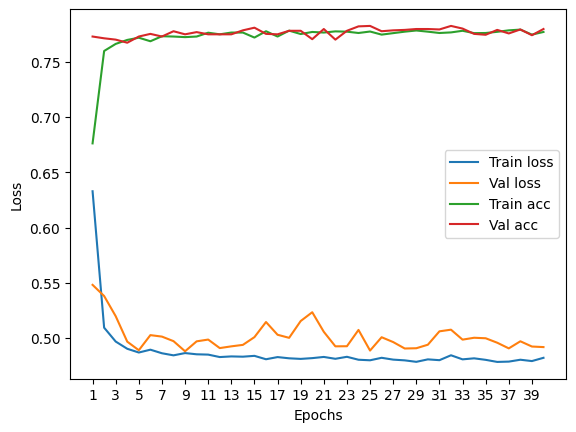

****************************************************************************************************



118it [00:00, 136.08it/s]


Train Epoch: 0 	Loss: 0.591857, Accuracy: 5559/7500 (74%)
Val Epoch: 0 	Loss: 0.522170, Accuracy: 1906/2500 (76%)



118it [00:01, 116.08it/s]


Train Epoch: 1 	Loss: 0.508290, Accuracy: 5664/7500 (76%)
Val Epoch: 1 	Loss: 0.520477, Accuracy: 1904/2500 (76%)



118it [00:00, 133.03it/s]


Train Epoch: 2 	Loss: 0.504677, Accuracy: 5735/7500 (76%)
Val Epoch: 2 	Loss: 0.505303, Accuracy: 1893/2500 (76%)



118it [00:00, 131.94it/s]


Train Epoch: 3 	Loss: 0.503737, Accuracy: 5741/7500 (77%)
Val Epoch: 3 	Loss: 0.507619, Accuracy: 1887/2500 (75%)



118it [00:00, 124.30it/s]


Train Epoch: 4 	Loss: 0.504793, Accuracy: 5715/7500 (76%)
Val Epoch: 4 	Loss: 0.502445, Accuracy: 1899/2500 (76%)



118it [00:00, 125.11it/s]


Train Epoch: 5 	Loss: 0.508084, Accuracy: 5690/7500 (76%)
Val Epoch: 5 	Loss: 0.507461, Accuracy: 1905/2500 (76%)



118it [00:00, 130.39it/s]


Train Epoch: 6 	Loss: 0.502412, Accuracy: 5708/7500 (76%)
Val Epoch: 6 	Loss: 0.512137, Accuracy: 1916/2500 (77%)



118it [00:00, 118.11it/s]


Train Epoch: 7 	Loss: 0.504159, Accuracy: 5731/7500 (76%)
Val Epoch: 7 	Loss: 0.516644, Accuracy: 1898/2500 (76%)



118it [00:00, 121.68it/s]


Train Epoch: 8 	Loss: 0.500317, Accuracy: 5750/7500 (77%)
Val Epoch: 8 	Loss: 0.507849, Accuracy: 1909/2500 (76%)



118it [00:00, 119.73it/s]


Train Epoch: 9 	Loss: 0.500681, Accuracy: 5720/7500 (76%)
Val Epoch: 9 	Loss: 0.509571, Accuracy: 1891/2500 (76%)



118it [00:00, 125.05it/s]


Train Epoch: 10 	Loss: 0.500396, Accuracy: 5764/7500 (77%)
Val Epoch: 10 	Loss: 0.498269, Accuracy: 1906/2500 (76%)



118it [00:00, 120.29it/s]


Train Epoch: 11 	Loss: 0.496859, Accuracy: 5758/7500 (77%)
Val Epoch: 11 	Loss: 0.496939, Accuracy: 1906/2500 (76%)



118it [00:00, 132.99it/s]


Train Epoch: 12 	Loss: 0.496889, Accuracy: 5760/7500 (77%)
Val Epoch: 12 	Loss: 0.499581, Accuracy: 1915/2500 (77%)



118it [00:00, 121.62it/s]


Train Epoch: 13 	Loss: 0.496138, Accuracy: 5724/7500 (76%)
Val Epoch: 13 	Loss: 0.518273, Accuracy: 1911/2500 (76%)



118it [00:00, 130.76it/s]


Train Epoch: 14 	Loss: 0.495670, Accuracy: 5764/7500 (77%)
Val Epoch: 14 	Loss: 0.501207, Accuracy: 1909/2500 (76%)



118it [00:00, 137.32it/s]


Train Epoch: 15 	Loss: 0.493086, Accuracy: 5775/7500 (77%)
Val Epoch: 15 	Loss: 0.496158, Accuracy: 1911/2500 (76%)



118it [00:00, 119.69it/s]


Train Epoch: 16 	Loss: 0.492521, Accuracy: 5765/7500 (77%)
Val Epoch: 16 	Loss: 0.493181, Accuracy: 1917/2500 (77%)



118it [00:00, 133.34it/s]


Train Epoch: 17 	Loss: 0.494638, Accuracy: 5769/7500 (77%)
Val Epoch: 17 	Loss: 0.497001, Accuracy: 1908/2500 (76%)



118it [00:00, 130.21it/s]


Train Epoch: 18 	Loss: 0.491409, Accuracy: 5750/7500 (77%)
Val Epoch: 18 	Loss: 0.500553, Accuracy: 1924/2500 (77%)



118it [00:00, 125.62it/s]


Train Epoch: 19 	Loss: 0.491597, Accuracy: 5785/7500 (77%)
Val Epoch: 19 	Loss: 0.495338, Accuracy: 1906/2500 (76%)



118it [00:00, 120.04it/s]


Train Epoch: 20 	Loss: 0.493105, Accuracy: 5736/7500 (76%)
Val Epoch: 20 	Loss: 0.515175, Accuracy: 1904/2500 (76%)



118it [00:01, 109.47it/s]


Train Epoch: 21 	Loss: 0.494934, Accuracy: 5752/7500 (77%)
Val Epoch: 21 	Loss: 0.494269, Accuracy: 1910/2500 (76%)



118it [00:00, 124.40it/s]


Train Epoch: 22 	Loss: 0.491914, Accuracy: 5770/7500 (77%)
Val Epoch: 22 	Loss: 0.492535, Accuracy: 1910/2500 (76%)



118it [00:01, 115.79it/s]


Train Epoch: 23 	Loss: 0.492004, Accuracy: 5777/7500 (77%)
Val Epoch: 23 	Loss: 0.502529, Accuracy: 1905/2500 (76%)



118it [00:00, 123.76it/s]


Train Epoch: 24 	Loss: 0.489312, Accuracy: 5743/7500 (77%)
Val Epoch: 24 	Loss: 0.498928, Accuracy: 1909/2500 (76%)



118it [00:00, 127.77it/s]


Train Epoch: 25 	Loss: 0.492397, Accuracy: 5753/7500 (77%)
Val Epoch: 25 	Loss: 0.512098, Accuracy: 1907/2500 (76%)



118it [00:00, 132.14it/s]


Train Epoch: 26 	Loss: 0.488919, Accuracy: 5780/7500 (77%)
Val Epoch: 26 	Loss: 0.512716, Accuracy: 1907/2500 (76%)



118it [00:01, 115.52it/s]


Train Epoch: 27 	Loss: 0.491557, Accuracy: 5773/7500 (77%)
Val Epoch: 27 	Loss: 0.514837, Accuracy: 1910/2500 (76%)



118it [00:00, 123.27it/s]


Train Epoch: 28 	Loss: 0.489211, Accuracy: 5793/7500 (77%)
Val Epoch: 28 	Loss: 0.503499, Accuracy: 1918/2500 (77%)



118it [00:00, 126.55it/s]


Train Epoch: 29 	Loss: 0.489229, Accuracy: 5756/7500 (77%)
Val Epoch: 29 	Loss: 0.497874, Accuracy: 1905/2500 (76%)



118it [00:00, 120.51it/s]


Train Epoch: 30 	Loss: 0.494740, Accuracy: 5733/7500 (76%)
Val Epoch: 30 	Loss: 0.490782, Accuracy: 1919/2500 (77%)



118it [00:00, 129.53it/s]


Train Epoch: 31 	Loss: 0.489919, Accuracy: 5756/7500 (77%)
Val Epoch: 31 	Loss: 0.520814, Accuracy: 1919/2500 (77%)



118it [00:00, 118.34it/s]


Train Epoch: 32 	Loss: 0.491716, Accuracy: 5771/7500 (77%)
Val Epoch: 32 	Loss: 0.499861, Accuracy: 1916/2500 (77%)



118it [00:01, 90.92it/s]


Train Epoch: 33 	Loss: 0.489545, Accuracy: 5761/7500 (77%)
Val Epoch: 33 	Loss: 0.497933, Accuracy: 1916/2500 (77%)



118it [00:01, 94.13it/s]


Train Epoch: 34 	Loss: 0.491742, Accuracy: 5754/7500 (77%)
Val Epoch: 34 	Loss: 0.493185, Accuracy: 1923/2500 (77%)



118it [00:01, 116.69it/s]


Train Epoch: 35 	Loss: 0.488690, Accuracy: 5780/7500 (77%)
Val Epoch: 35 	Loss: 0.495678, Accuracy: 1914/2500 (77%)



118it [00:00, 128.52it/s]


Train Epoch: 36 	Loss: 0.490186, Accuracy: 5771/7500 (77%)
Val Epoch: 36 	Loss: 0.512647, Accuracy: 1914/2500 (77%)



118it [00:01, 117.03it/s]


Train Epoch: 37 	Loss: 0.491547, Accuracy: 5769/7500 (77%)
Val Epoch: 37 	Loss: 0.503420, Accuracy: 1916/2500 (77%)



118it [00:00, 119.52it/s]


Train Epoch: 38 	Loss: 0.490506, Accuracy: 5748/7500 (77%)
Val Epoch: 38 	Loss: 0.492148, Accuracy: 1916/2500 (77%)



118it [00:00, 122.13it/s]


Train Epoch: 39 	Loss: 0.488594, Accuracy: 5768/7500 (77%)
Val Epoch: 39 	Loss: 0.500374, Accuracy: 1899/2500 (76%)

Test accuracy:  76.36


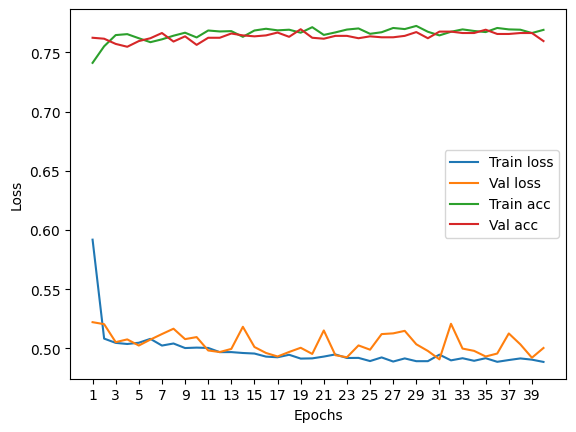

****************************************************************************************************



118it [00:00, 124.22it/s]


Train Epoch: 0 	Loss: 0.603579, Accuracy: 5230/7500 (70%)
Val Epoch: 0 	Loss: 0.536190, Accuracy: 1920/2500 (77%)



118it [00:00, 118.70it/s]


Train Epoch: 1 	Loss: 0.507799, Accuracy: 5672/7500 (76%)
Val Epoch: 1 	Loss: 0.509255, Accuracy: 1899/2500 (76%)



118it [00:00, 132.19it/s]


Train Epoch: 2 	Loss: 0.501812, Accuracy: 5679/7500 (76%)
Val Epoch: 2 	Loss: 0.502158, Accuracy: 1930/2500 (77%)



118it [00:00, 123.30it/s]


Train Epoch: 3 	Loss: 0.494596, Accuracy: 5731/7500 (76%)
Val Epoch: 3 	Loss: 0.508421, Accuracy: 1893/2500 (76%)



118it [00:00, 123.07it/s]


Train Epoch: 4 	Loss: 0.493167, Accuracy: 5728/7500 (76%)
Val Epoch: 4 	Loss: 0.512150, Accuracy: 1926/2500 (77%)



118it [00:00, 127.12it/s]


Train Epoch: 5 	Loss: 0.496506, Accuracy: 5755/7500 (77%)
Val Epoch: 5 	Loss: 0.509770, Accuracy: 1924/2500 (77%)



118it [00:00, 127.13it/s]


Train Epoch: 6 	Loss: 0.492254, Accuracy: 5739/7500 (77%)
Val Epoch: 6 	Loss: 0.498383, Accuracy: 1925/2500 (77%)



118it [00:00, 127.29it/s]


Train Epoch: 7 	Loss: 0.491497, Accuracy: 5732/7500 (76%)
Val Epoch: 7 	Loss: 0.509728, Accuracy: 1924/2500 (77%)



118it [00:00, 142.85it/s]


Train Epoch: 8 	Loss: 0.490731, Accuracy: 5739/7500 (77%)
Val Epoch: 8 	Loss: 0.516710, Accuracy: 1920/2500 (77%)



118it [00:00, 132.07it/s]


Train Epoch: 9 	Loss: 0.489996, Accuracy: 5745/7500 (77%)
Val Epoch: 9 	Loss: 0.506124, Accuracy: 1934/2500 (77%)



118it [00:01, 114.89it/s]


Train Epoch: 10 	Loss: 0.490413, Accuracy: 5739/7500 (77%)
Val Epoch: 10 	Loss: 0.493991, Accuracy: 1933/2500 (77%)



118it [00:01, 110.45it/s]


Train Epoch: 11 	Loss: 0.494054, Accuracy: 5732/7500 (76%)
Val Epoch: 11 	Loss: 0.534488, Accuracy: 1891/2500 (76%)



118it [00:00, 120.68it/s]


Train Epoch: 12 	Loss: 0.488964, Accuracy: 5754/7500 (77%)
Val Epoch: 12 	Loss: 0.499915, Accuracy: 1927/2500 (77%)



118it [00:00, 136.22it/s]


Train Epoch: 13 	Loss: 0.488766, Accuracy: 5772/7500 (77%)
Val Epoch: 13 	Loss: 0.497782, Accuracy: 1936/2500 (77%)



118it [00:00, 122.33it/s]


Train Epoch: 14 	Loss: 0.492350, Accuracy: 5762/7500 (77%)
Val Epoch: 14 	Loss: 0.504556, Accuracy: 1921/2500 (77%)



118it [00:00, 138.09it/s]


Train Epoch: 15 	Loss: 0.489409, Accuracy: 5760/7500 (77%)
Val Epoch: 15 	Loss: 0.500530, Accuracy: 1933/2500 (77%)



118it [00:00, 133.62it/s]


Train Epoch: 16 	Loss: 0.488992, Accuracy: 5778/7500 (77%)
Val Epoch: 16 	Loss: 0.489461, Accuracy: 1939/2500 (78%)



118it [00:00, 120.02it/s]


Train Epoch: 17 	Loss: 0.486878, Accuracy: 5776/7500 (77%)
Val Epoch: 17 	Loss: 0.523960, Accuracy: 1876/2500 (75%)



118it [00:00, 121.30it/s]


Train Epoch: 18 	Loss: 0.488482, Accuracy: 5784/7500 (77%)
Val Epoch: 18 	Loss: 0.509439, Accuracy: 1945/2500 (78%)



118it [00:00, 130.50it/s]


Train Epoch: 19 	Loss: 0.487279, Accuracy: 5757/7500 (77%)
Val Epoch: 19 	Loss: 0.490713, Accuracy: 1924/2500 (77%)



118it [00:01, 113.57it/s]


Train Epoch: 20 	Loss: 0.490797, Accuracy: 5797/7500 (77%)
Val Epoch: 20 	Loss: 0.504520, Accuracy: 1930/2500 (77%)



118it [00:00, 132.73it/s]


Train Epoch: 21 	Loss: 0.490727, Accuracy: 5746/7500 (77%)
Val Epoch: 21 	Loss: 0.496485, Accuracy: 1925/2500 (77%)



118it [00:00, 130.38it/s]


Train Epoch: 22 	Loss: 0.487226, Accuracy: 5807/7500 (77%)
Val Epoch: 22 	Loss: 0.499769, Accuracy: 1918/2500 (77%)



118it [00:00, 138.33it/s]


Train Epoch: 23 	Loss: 0.486869, Accuracy: 5789/7500 (77%)
Val Epoch: 23 	Loss: 0.490200, Accuracy: 1942/2500 (78%)



118it [00:01, 112.29it/s]


Train Epoch: 24 	Loss: 0.487504, Accuracy: 5773/7500 (77%)
Val Epoch: 24 	Loss: 0.490177, Accuracy: 1943/2500 (78%)



118it [00:01, 98.66it/s] 


Train Epoch: 25 	Loss: 0.486057, Accuracy: 5774/7500 (77%)
Val Epoch: 25 	Loss: 0.497359, Accuracy: 1933/2500 (77%)



118it [00:01, 113.33it/s]


Train Epoch: 26 	Loss: 0.485840, Accuracy: 5781/7500 (77%)
Val Epoch: 26 	Loss: 0.495060, Accuracy: 1940/2500 (78%)



118it [00:01, 102.28it/s]


Train Epoch: 27 	Loss: 0.483662, Accuracy: 5794/7500 (77%)
Val Epoch: 27 	Loss: 0.501586, Accuracy: 1936/2500 (77%)



118it [00:01, 111.34it/s]


Train Epoch: 28 	Loss: 0.481655, Accuracy: 5814/7500 (78%)
Val Epoch: 28 	Loss: 0.488155, Accuracy: 1940/2500 (78%)



118it [00:01, 112.70it/s]


Train Epoch: 29 	Loss: 0.484619, Accuracy: 5798/7500 (77%)
Val Epoch: 29 	Loss: 0.500072, Accuracy: 1932/2500 (77%)



118it [00:01, 104.78it/s]


Train Epoch: 30 	Loss: 0.482791, Accuracy: 5824/7500 (78%)
Val Epoch: 30 	Loss: 0.495073, Accuracy: 1947/2500 (78%)



118it [00:01, 115.02it/s]


Train Epoch: 31 	Loss: 0.483626, Accuracy: 5807/7500 (77%)
Val Epoch: 31 	Loss: 0.511563, Accuracy: 1920/2500 (77%)



118it [00:01, 107.26it/s]


Train Epoch: 32 	Loss: 0.483764, Accuracy: 5793/7500 (77%)
Val Epoch: 32 	Loss: 0.498632, Accuracy: 1935/2500 (77%)



118it [00:00, 119.40it/s]


Train Epoch: 33 	Loss: 0.484555, Accuracy: 5793/7500 (77%)
Val Epoch: 33 	Loss: 0.496427, Accuracy: 1923/2500 (77%)



118it [00:01, 112.59it/s]


Train Epoch: 34 	Loss: 0.485542, Accuracy: 5802/7500 (77%)
Val Epoch: 34 	Loss: 0.492516, Accuracy: 1937/2500 (77%)



118it [00:01, 86.27it/s]


Train Epoch: 35 	Loss: 0.480152, Accuracy: 5846/7500 (78%)
Val Epoch: 35 	Loss: 0.504660, Accuracy: 1927/2500 (77%)



118it [00:01, 72.68it/s]


Train Epoch: 36 	Loss: 0.483013, Accuracy: 5813/7500 (78%)
Val Epoch: 36 	Loss: 0.493424, Accuracy: 1926/2500 (77%)



118it [00:01, 95.32it/s]


Train Epoch: 37 	Loss: 0.481611, Accuracy: 5828/7500 (78%)
Val Epoch: 37 	Loss: 0.497595, Accuracy: 1927/2500 (77%)



118it [00:01, 114.57it/s]


Train Epoch: 38 	Loss: 0.480574, Accuracy: 5829/7500 (78%)
Val Epoch: 38 	Loss: 0.489658, Accuracy: 1931/2500 (77%)



118it [00:01, 114.53it/s]


Train Epoch: 39 	Loss: 0.481916, Accuracy: 5807/7500 (77%)
Val Epoch: 39 	Loss: 0.508608, Accuracy: 1920/2500 (77%)

Test accuracy:  78.08


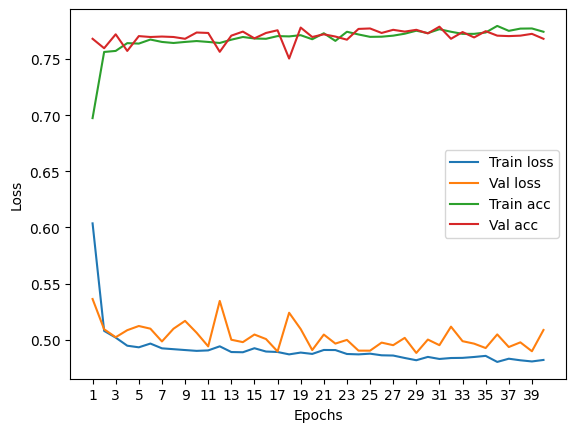

****************************************************************************************************



118it [00:01, 106.80it/s]


Train Epoch: 0 	Loss: 0.636896, Accuracy: 5133/7500 (68%)
Val Epoch: 0 	Loss: 0.546107, Accuracy: 1901/2500 (76%)



118it [00:01, 115.00it/s]


Train Epoch: 1 	Loss: 0.511994, Accuracy: 5672/7500 (76%)
Val Epoch: 1 	Loss: 0.505650, Accuracy: 1925/2500 (77%)



118it [00:01, 117.28it/s]


Train Epoch: 2 	Loss: 0.501205, Accuracy: 5724/7500 (76%)
Val Epoch: 2 	Loss: 0.500182, Accuracy: 1923/2500 (77%)



118it [00:00, 128.45it/s]


Train Epoch: 3 	Loss: 0.496026, Accuracy: 5741/7500 (77%)
Val Epoch: 3 	Loss: 0.494184, Accuracy: 1969/2500 (79%)



118it [00:00, 124.56it/s]


Train Epoch: 4 	Loss: 0.495681, Accuracy: 5741/7500 (77%)
Val Epoch: 4 	Loss: 0.500163, Accuracy: 1932/2500 (77%)



118it [00:00, 130.22it/s]


Train Epoch: 5 	Loss: 0.494296, Accuracy: 5738/7500 (77%)
Val Epoch: 5 	Loss: 0.493651, Accuracy: 1952/2500 (78%)



118it [00:00, 139.17it/s]


Train Epoch: 6 	Loss: 0.494942, Accuracy: 5757/7500 (77%)
Val Epoch: 6 	Loss: 0.483366, Accuracy: 1972/2500 (79%)



118it [00:00, 128.86it/s]


Train Epoch: 7 	Loss: 0.491293, Accuracy: 5753/7500 (77%)
Val Epoch: 7 	Loss: 0.501475, Accuracy: 1952/2500 (78%)



118it [00:00, 130.40it/s]


Train Epoch: 8 	Loss: 0.492841, Accuracy: 5740/7500 (77%)
Val Epoch: 8 	Loss: 0.492023, Accuracy: 1963/2500 (79%)



118it [00:00, 128.90it/s]


Train Epoch: 9 	Loss: 0.494301, Accuracy: 5764/7500 (77%)
Val Epoch: 9 	Loss: 0.495138, Accuracy: 1957/2500 (78%)



118it [00:01, 114.11it/s]


Train Epoch: 10 	Loss: 0.494467, Accuracy: 5766/7500 (77%)
Val Epoch: 10 	Loss: 0.486982, Accuracy: 1963/2500 (79%)



118it [00:00, 126.63it/s]


Train Epoch: 11 	Loss: 0.497075, Accuracy: 5775/7500 (77%)
Val Epoch: 11 	Loss: 0.491139, Accuracy: 1964/2500 (79%)



118it [00:01, 109.96it/s]


Train Epoch: 12 	Loss: 0.492977, Accuracy: 5745/7500 (77%)
Val Epoch: 12 	Loss: 0.503394, Accuracy: 1943/2500 (78%)



118it [00:01, 108.40it/s]


Train Epoch: 13 	Loss: 0.493899, Accuracy: 5785/7500 (77%)
Val Epoch: 13 	Loss: 0.493946, Accuracy: 1961/2500 (78%)



118it [00:00, 127.67it/s]


Train Epoch: 14 	Loss: 0.490496, Accuracy: 5778/7500 (77%)
Val Epoch: 14 	Loss: 0.492342, Accuracy: 1958/2500 (78%)



118it [00:00, 130.69it/s]


Train Epoch: 15 	Loss: 0.490208, Accuracy: 5771/7500 (77%)
Val Epoch: 15 	Loss: 0.499620, Accuracy: 1960/2500 (78%)



118it [00:00, 134.11it/s]


Train Epoch: 16 	Loss: 0.489986, Accuracy: 5775/7500 (77%)
Val Epoch: 16 	Loss: 0.494818, Accuracy: 1959/2500 (78%)



118it [00:00, 125.54it/s]


Train Epoch: 17 	Loss: 0.491395, Accuracy: 5758/7500 (77%)
Val Epoch: 17 	Loss: 0.499063, Accuracy: 1955/2500 (78%)



118it [00:00, 143.83it/s]


Train Epoch: 18 	Loss: 0.490560, Accuracy: 5783/7500 (77%)
Val Epoch: 18 	Loss: 0.487801, Accuracy: 1963/2500 (79%)



118it [00:00, 127.51it/s]


Train Epoch: 19 	Loss: 0.491063, Accuracy: 5771/7500 (77%)
Val Epoch: 19 	Loss: 0.497931, Accuracy: 1957/2500 (78%)



118it [00:01, 109.02it/s]


Train Epoch: 20 	Loss: 0.489466, Accuracy: 5782/7500 (77%)
Val Epoch: 20 	Loss: 0.497774, Accuracy: 1952/2500 (78%)



118it [00:01, 113.65it/s]


Train Epoch: 21 	Loss: 0.490701, Accuracy: 5743/7500 (77%)
Val Epoch: 21 	Loss: 0.489332, Accuracy: 1960/2500 (78%)



118it [00:00, 134.08it/s]


Train Epoch: 22 	Loss: 0.492390, Accuracy: 5757/7500 (77%)
Val Epoch: 22 	Loss: 0.494438, Accuracy: 1961/2500 (78%)



118it [00:01, 112.22it/s]


Train Epoch: 23 	Loss: 0.487473, Accuracy: 5761/7500 (77%)
Val Epoch: 23 	Loss: 0.490448, Accuracy: 1956/2500 (78%)



118it [00:00, 120.85it/s]


Train Epoch: 24 	Loss: 0.490728, Accuracy: 5779/7500 (77%)
Val Epoch: 24 	Loss: 0.486041, Accuracy: 1957/2500 (78%)



118it [00:01, 115.35it/s]


Train Epoch: 25 	Loss: 0.488034, Accuracy: 5773/7500 (77%)
Val Epoch: 25 	Loss: 0.486330, Accuracy: 1965/2500 (79%)



118it [00:01, 101.39it/s]


Train Epoch: 26 	Loss: 0.487955, Accuracy: 5777/7500 (77%)
Val Epoch: 26 	Loss: 0.495773, Accuracy: 1970/2500 (79%)



118it [00:01, 77.58it/s]


Train Epoch: 27 	Loss: 0.489172, Accuracy: 5779/7500 (77%)
Val Epoch: 27 	Loss: 0.491426, Accuracy: 1955/2500 (78%)



118it [00:01, 76.18it/s]


Train Epoch: 28 	Loss: 0.492646, Accuracy: 5773/7500 (77%)
Val Epoch: 28 	Loss: 0.496731, Accuracy: 1964/2500 (79%)



118it [00:01, 93.23it/s]


Train Epoch: 29 	Loss: 0.490937, Accuracy: 5766/7500 (77%)
Val Epoch: 29 	Loss: 0.488534, Accuracy: 1964/2500 (79%)



118it [00:01, 113.11it/s]


Train Epoch: 30 	Loss: 0.489509, Accuracy: 5775/7500 (77%)
Val Epoch: 30 	Loss: 0.491344, Accuracy: 1960/2500 (78%)



118it [00:01, 103.97it/s]


Train Epoch: 31 	Loss: 0.486987, Accuracy: 5785/7500 (77%)
Val Epoch: 31 	Loss: 0.496865, Accuracy: 1963/2500 (79%)



118it [00:01, 110.60it/s]


Train Epoch: 32 	Loss: 0.489362, Accuracy: 5772/7500 (77%)
Val Epoch: 32 	Loss: 0.501077, Accuracy: 1965/2500 (79%)



118it [00:01, 104.29it/s]


Train Epoch: 33 	Loss: 0.487967, Accuracy: 5755/7500 (77%)
Val Epoch: 33 	Loss: 0.483313, Accuracy: 1965/2500 (79%)



118it [00:01, 109.81it/s]


Train Epoch: 34 	Loss: 0.487832, Accuracy: 5774/7500 (77%)
Val Epoch: 34 	Loss: 0.489000, Accuracy: 1964/2500 (79%)



118it [00:01, 68.97it/s]


Train Epoch: 35 	Loss: 0.487162, Accuracy: 5781/7500 (77%)
Val Epoch: 35 	Loss: 0.491467, Accuracy: 1965/2500 (79%)



118it [00:01, 78.17it/s]


Train Epoch: 36 	Loss: 0.487952, Accuracy: 5774/7500 (77%)
Val Epoch: 36 	Loss: 0.499201, Accuracy: 1961/2500 (78%)



118it [00:01, 87.41it/s]


Train Epoch: 37 	Loss: 0.488782, Accuracy: 5762/7500 (77%)
Val Epoch: 37 	Loss: 0.493032, Accuracy: 1965/2500 (79%)



118it [00:01, 112.77it/s]


Train Epoch: 38 	Loss: 0.487268, Accuracy: 5765/7500 (77%)
Val Epoch: 38 	Loss: 0.497276, Accuracy: 1960/2500 (78%)



118it [00:00, 128.87it/s]


Train Epoch: 39 	Loss: 0.488409, Accuracy: 5766/7500 (77%)
Val Epoch: 39 	Loss: 0.502530, Accuracy: 1956/2500 (78%)

Test accuracy:  76.96


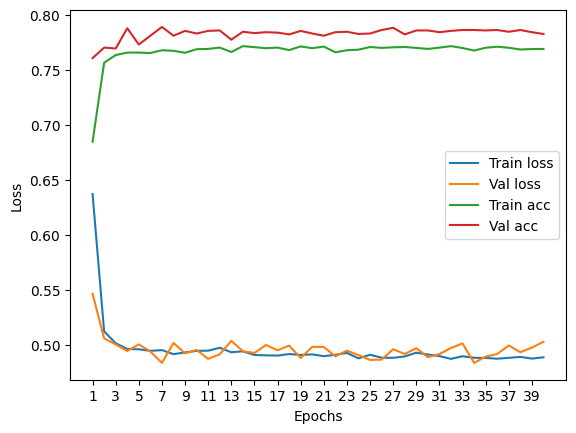

****************************************************************************************************



118it [00:01, 70.87it/s]


Train Epoch: 0 	Loss: 0.627168, Accuracy: 5018/7500 (67%)
Val Epoch: 0 	Loss: 0.539275, Accuracy: 1849/2500 (74%)



118it [00:01, 71.38it/s]


Train Epoch: 1 	Loss: 0.506245, Accuracy: 5714/7500 (76%)
Val Epoch: 1 	Loss: 0.510994, Accuracy: 1892/2500 (76%)



118it [00:01, 91.38it/s] 


Train Epoch: 2 	Loss: 0.495019, Accuracy: 5745/7500 (77%)
Val Epoch: 2 	Loss: 0.514718, Accuracy: 1897/2500 (76%)



118it [00:01, 100.52it/s]


Train Epoch: 3 	Loss: 0.491413, Accuracy: 5748/7500 (77%)
Val Epoch: 3 	Loss: 0.496350, Accuracy: 1939/2500 (78%)



118it [00:00, 121.21it/s]


Train Epoch: 4 	Loss: 0.488714, Accuracy: 5768/7500 (77%)
Val Epoch: 4 	Loss: 0.506393, Accuracy: 1911/2500 (76%)



118it [00:01, 109.61it/s]


Train Epoch: 5 	Loss: 0.490807, Accuracy: 5775/7500 (77%)
Val Epoch: 5 	Loss: 0.493325, Accuracy: 1932/2500 (77%)



118it [00:00, 120.06it/s]


Train Epoch: 6 	Loss: 0.488634, Accuracy: 5763/7500 (77%)
Val Epoch: 6 	Loss: 0.498742, Accuracy: 1933/2500 (77%)



118it [00:01, 67.06it/s]


Train Epoch: 7 	Loss: 0.489111, Accuracy: 5791/7500 (77%)
Val Epoch: 7 	Loss: 0.504362, Accuracy: 1941/2500 (78%)



118it [00:01, 93.41it/s] 


Train Epoch: 8 	Loss: 0.488103, Accuracy: 5778/7500 (77%)
Val Epoch: 8 	Loss: 0.499057, Accuracy: 1929/2500 (77%)



118it [00:00, 122.57it/s]


Train Epoch: 9 	Loss: 0.487964, Accuracy: 5783/7500 (77%)
Val Epoch: 9 	Loss: 0.502516, Accuracy: 1934/2500 (77%)



118it [00:01, 94.61it/s] 


Train Epoch: 10 	Loss: 0.488040, Accuracy: 5790/7500 (77%)
Val Epoch: 10 	Loss: 0.498070, Accuracy: 1933/2500 (77%)



118it [00:01, 109.44it/s]


Train Epoch: 11 	Loss: 0.485983, Accuracy: 5786/7500 (77%)
Val Epoch: 11 	Loss: 0.493754, Accuracy: 1924/2500 (77%)



118it [00:01, 98.50it/s]


Train Epoch: 12 	Loss: 0.486097, Accuracy: 5769/7500 (77%)
Val Epoch: 12 	Loss: 0.489613, Accuracy: 1926/2500 (77%)



118it [00:01, 108.14it/s]


Train Epoch: 13 	Loss: 0.485113, Accuracy: 5763/7500 (77%)
Val Epoch: 13 	Loss: 0.495416, Accuracy: 1930/2500 (77%)



118it [00:01, 106.27it/s]


Train Epoch: 14 	Loss: 0.489386, Accuracy: 5785/7500 (77%)
Val Epoch: 14 	Loss: 0.506480, Accuracy: 1937/2500 (77%)



118it [00:01, 77.19it/s]


Train Epoch: 15 	Loss: 0.486375, Accuracy: 5771/7500 (77%)
Val Epoch: 15 	Loss: 0.500228, Accuracy: 1927/2500 (77%)



118it [00:01, 109.54it/s]


Train Epoch: 16 	Loss: 0.483087, Accuracy: 5786/7500 (77%)
Val Epoch: 16 	Loss: 0.488305, Accuracy: 1931/2500 (77%)



118it [00:01, 67.57it/s]


Train Epoch: 17 	Loss: 0.484632, Accuracy: 5810/7500 (77%)
Val Epoch: 17 	Loss: 0.497628, Accuracy: 1933/2500 (77%)



118it [00:01, 72.50it/s]


Train Epoch: 18 	Loss: 0.484919, Accuracy: 5794/7500 (77%)
Val Epoch: 18 	Loss: 0.494607, Accuracy: 1933/2500 (77%)



118it [00:01, 89.55it/s]


Train Epoch: 19 	Loss: 0.487265, Accuracy: 5787/7500 (77%)
Val Epoch: 19 	Loss: 0.493904, Accuracy: 1930/2500 (77%)



118it [00:01, 105.99it/s]


Train Epoch: 20 	Loss: 0.484418, Accuracy: 5805/7500 (77%)
Val Epoch: 20 	Loss: 0.494210, Accuracy: 1932/2500 (77%)



118it [00:01, 115.77it/s]


Train Epoch: 21 	Loss: 0.483975, Accuracy: 5813/7500 (78%)
Val Epoch: 21 	Loss: 0.497490, Accuracy: 1935/2500 (77%)



118it [00:00, 118.44it/s]


Train Epoch: 22 	Loss: 0.485079, Accuracy: 5798/7500 (77%)
Val Epoch: 22 	Loss: 0.491867, Accuracy: 1933/2500 (77%)



118it [00:01, 105.65it/s]


Train Epoch: 23 	Loss: 0.486250, Accuracy: 5796/7500 (77%)
Val Epoch: 23 	Loss: 0.495331, Accuracy: 1932/2500 (77%)



118it [00:01, 110.96it/s]


Train Epoch: 24 	Loss: 0.485335, Accuracy: 5799/7500 (77%)
Val Epoch: 24 	Loss: 0.497012, Accuracy: 1936/2500 (77%)



118it [00:01, 99.94it/s]


Train Epoch: 25 	Loss: 0.481595, Accuracy: 5803/7500 (77%)
Val Epoch: 25 	Loss: 0.487599, Accuracy: 1929/2500 (77%)



118it [00:01, 112.49it/s]


Train Epoch: 26 	Loss: 0.481552, Accuracy: 5811/7500 (77%)
Val Epoch: 26 	Loss: 0.499234, Accuracy: 1938/2500 (78%)



118it [00:01, 103.07it/s]


Train Epoch: 27 	Loss: 0.482527, Accuracy: 5818/7500 (78%)
Val Epoch: 27 	Loss: 0.501308, Accuracy: 1926/2500 (77%)



118it [00:01, 64.67it/s]


Train Epoch: 28 	Loss: 0.486849, Accuracy: 5788/7500 (77%)
Val Epoch: 28 	Loss: 0.494493, Accuracy: 1932/2500 (77%)



118it [00:01, 91.16it/s] 


Train Epoch: 29 	Loss: 0.484834, Accuracy: 5793/7500 (77%)
Val Epoch: 29 	Loss: 0.496727, Accuracy: 1930/2500 (77%)



118it [00:01, 110.53it/s]


Train Epoch: 30 	Loss: 0.481381, Accuracy: 5801/7500 (77%)
Val Epoch: 30 	Loss: 0.504167, Accuracy: 1937/2500 (77%)



118it [00:01, 111.29it/s]


Train Epoch: 31 	Loss: 0.482367, Accuracy: 5835/7500 (78%)
Val Epoch: 31 	Loss: 0.491632, Accuracy: 1926/2500 (77%)



118it [00:01, 112.86it/s]


Train Epoch: 32 	Loss: 0.479760, Accuracy: 5815/7500 (78%)
Val Epoch: 32 	Loss: 0.501682, Accuracy: 1922/2500 (77%)



118it [00:00, 119.50it/s]


Train Epoch: 33 	Loss: 0.480956, Accuracy: 5817/7500 (78%)
Val Epoch: 33 	Loss: 0.490013, Accuracy: 1928/2500 (77%)



118it [00:01, 114.04it/s]


Train Epoch: 34 	Loss: 0.484798, Accuracy: 5808/7500 (77%)
Val Epoch: 34 	Loss: 0.497577, Accuracy: 1940/2500 (78%)



118it [00:01, 101.11it/s]


Train Epoch: 35 	Loss: 0.483010, Accuracy: 5813/7500 (78%)
Val Epoch: 35 	Loss: 0.491955, Accuracy: 1934/2500 (77%)



118it [00:00, 123.66it/s]


Train Epoch: 36 	Loss: 0.483388, Accuracy: 5820/7500 (78%)
Val Epoch: 36 	Loss: 0.499926, Accuracy: 1930/2500 (77%)



118it [00:01, 112.87it/s]


Train Epoch: 37 	Loss: 0.483936, Accuracy: 5808/7500 (77%)
Val Epoch: 37 	Loss: 0.488829, Accuracy: 1929/2500 (77%)



118it [00:01, 75.56it/s]


Train Epoch: 38 	Loss: 0.480796, Accuracy: 5815/7500 (78%)
Val Epoch: 38 	Loss: 0.498939, Accuracy: 1939/2500 (78%)



118it [00:01, 73.76it/s]


Train Epoch: 39 	Loss: 0.481365, Accuracy: 5801/7500 (77%)
Val Epoch: 39 	Loss: 0.496281, Accuracy: 1929/2500 (77%)

Test accuracy:  76.84


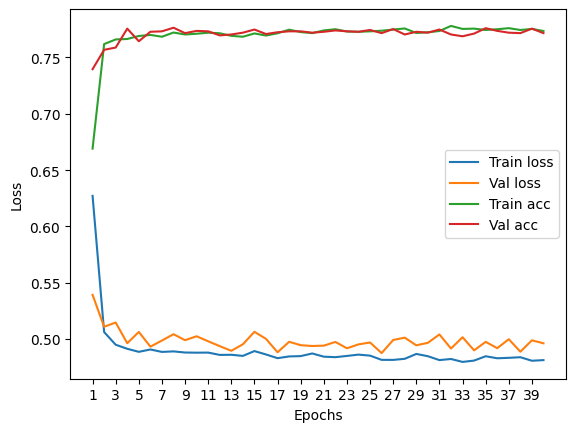

****************************************************************************************************



118it [00:00, 139.54it/s]


Train Epoch: 0 	Loss: 0.601469, Accuracy: 5258/7500 (70%)
Val Epoch: 0 	Loss: 0.550143, Accuracy: 1828/2500 (73%)



118it [00:01, 107.67it/s]


Train Epoch: 1 	Loss: 0.505325, Accuracy: 5724/7500 (76%)
Val Epoch: 1 	Loss: 0.544408, Accuracy: 1872/2500 (75%)



118it [00:01, 109.84it/s]


Train Epoch: 2 	Loss: 0.498698, Accuracy: 5740/7500 (77%)
Val Epoch: 2 	Loss: 0.525717, Accuracy: 1865/2500 (75%)



118it [00:00, 131.96it/s]


Train Epoch: 3 	Loss: 0.493945, Accuracy: 5776/7500 (77%)
Val Epoch: 3 	Loss: 0.547665, Accuracy: 1863/2500 (75%)



118it [00:00, 128.91it/s]


Train Epoch: 4 	Loss: 0.491609, Accuracy: 5790/7500 (77%)
Val Epoch: 4 	Loss: 0.540162, Accuracy: 1874/2500 (75%)



118it [00:00, 126.97it/s]


Train Epoch: 5 	Loss: 0.493896, Accuracy: 5788/7500 (77%)
Val Epoch: 5 	Loss: 0.534983, Accuracy: 1872/2500 (75%)



118it [00:01, 117.59it/s]


Train Epoch: 6 	Loss: 0.494957, Accuracy: 5803/7500 (77%)
Val Epoch: 6 	Loss: 0.539602, Accuracy: 1881/2500 (75%)



118it [00:00, 126.71it/s]


Train Epoch: 7 	Loss: 0.490719, Accuracy: 5804/7500 (77%)
Val Epoch: 7 	Loss: 0.544718, Accuracy: 1872/2500 (75%)



118it [00:00, 127.91it/s]


Train Epoch: 8 	Loss: 0.490697, Accuracy: 5793/7500 (77%)
Val Epoch: 8 	Loss: 0.557507, Accuracy: 1823/2500 (73%)



118it [00:00, 123.78it/s]


Train Epoch: 9 	Loss: 0.490280, Accuracy: 5797/7500 (77%)
Val Epoch: 9 	Loss: 0.524786, Accuracy: 1886/2500 (75%)



118it [00:01, 114.33it/s]


Train Epoch: 10 	Loss: 0.491942, Accuracy: 5797/7500 (77%)
Val Epoch: 10 	Loss: 0.521993, Accuracy: 1875/2500 (75%)



118it [00:00, 119.01it/s]


Train Epoch: 11 	Loss: 0.487739, Accuracy: 5806/7500 (77%)
Val Epoch: 11 	Loss: 0.539286, Accuracy: 1879/2500 (75%)



118it [00:00, 130.12it/s]


Train Epoch: 12 	Loss: 0.489010, Accuracy: 5794/7500 (77%)
Val Epoch: 12 	Loss: 0.519237, Accuracy: 1876/2500 (75%)



118it [00:00, 127.21it/s]


Train Epoch: 13 	Loss: 0.488809, Accuracy: 5800/7500 (77%)
Val Epoch: 13 	Loss: 0.557260, Accuracy: 1863/2500 (75%)



118it [00:00, 121.00it/s]


Train Epoch: 14 	Loss: 0.489178, Accuracy: 5784/7500 (77%)
Val Epoch: 14 	Loss: 0.523319, Accuracy: 1883/2500 (75%)



118it [00:01, 105.01it/s]


Train Epoch: 15 	Loss: 0.487776, Accuracy: 5818/7500 (78%)
Val Epoch: 15 	Loss: 0.544995, Accuracy: 1883/2500 (75%)



118it [00:00, 121.24it/s]


Train Epoch: 16 	Loss: 0.490763, Accuracy: 5791/7500 (77%)
Val Epoch: 16 	Loss: 0.518669, Accuracy: 1875/2500 (75%)



118it [00:01, 115.52it/s]


Train Epoch: 17 	Loss: 0.490840, Accuracy: 5777/7500 (77%)
Val Epoch: 17 	Loss: 0.524015, Accuracy: 1883/2500 (75%)



118it [00:00, 131.91it/s]


Train Epoch: 18 	Loss: 0.487803, Accuracy: 5810/7500 (77%)
Val Epoch: 18 	Loss: 0.528209, Accuracy: 1884/2500 (75%)



118it [00:00, 126.67it/s]


Train Epoch: 19 	Loss: 0.488099, Accuracy: 5794/7500 (77%)
Val Epoch: 19 	Loss: 0.538530, Accuracy: 1848/2500 (74%)



118it [00:00, 135.30it/s]


Train Epoch: 20 	Loss: 0.486119, Accuracy: 5818/7500 (78%)
Val Epoch: 20 	Loss: 0.529383, Accuracy: 1874/2500 (75%)



118it [00:00, 125.15it/s]


Train Epoch: 21 	Loss: 0.491268, Accuracy: 5807/7500 (77%)
Val Epoch: 21 	Loss: 0.528720, Accuracy: 1874/2500 (75%)



118it [00:00, 129.07it/s]


Train Epoch: 22 	Loss: 0.486402, Accuracy: 5806/7500 (77%)
Val Epoch: 22 	Loss: 0.522147, Accuracy: 1888/2500 (76%)



118it [00:00, 130.02it/s]


Train Epoch: 23 	Loss: 0.486517, Accuracy: 5815/7500 (78%)
Val Epoch: 23 	Loss: 0.531721, Accuracy: 1880/2500 (75%)



118it [00:00, 122.84it/s]


Train Epoch: 24 	Loss: 0.489686, Accuracy: 5810/7500 (77%)
Val Epoch: 24 	Loss: 0.525196, Accuracy: 1882/2500 (75%)



118it [00:00, 129.59it/s]


Train Epoch: 25 	Loss: 0.487110, Accuracy: 5817/7500 (78%)
Val Epoch: 25 	Loss: 0.521391, Accuracy: 1892/2500 (76%)



118it [00:00, 133.48it/s]


Train Epoch: 26 	Loss: 0.487724, Accuracy: 5802/7500 (77%)
Val Epoch: 26 	Loss: 0.518159, Accuracy: 1883/2500 (75%)



118it [00:01, 89.50it/s]


Train Epoch: 27 	Loss: 0.485272, Accuracy: 5831/7500 (78%)
Val Epoch: 27 	Loss: 0.529981, Accuracy: 1894/2500 (76%)



118it [00:01, 71.29it/s]


Train Epoch: 28 	Loss: 0.485573, Accuracy: 5814/7500 (78%)
Val Epoch: 28 	Loss: 0.522123, Accuracy: 1883/2500 (75%)



118it [00:01, 91.10it/s]


Train Epoch: 29 	Loss: 0.487168, Accuracy: 5809/7500 (77%)
Val Epoch: 29 	Loss: 0.524029, Accuracy: 1884/2500 (75%)



118it [00:01, 101.96it/s]


Train Epoch: 30 	Loss: 0.487373, Accuracy: 5769/7500 (77%)
Val Epoch: 30 	Loss: 0.516083, Accuracy: 1888/2500 (76%)



118it [00:01, 115.24it/s]


Train Epoch: 31 	Loss: 0.486417, Accuracy: 5821/7500 (78%)
Val Epoch: 31 	Loss: 0.526517, Accuracy: 1887/2500 (75%)



118it [00:01, 107.62it/s]


Train Epoch: 32 	Loss: 0.482782, Accuracy: 5819/7500 (78%)
Val Epoch: 32 	Loss: 0.528705, Accuracy: 1892/2500 (76%)



118it [00:01, 102.19it/s]


Train Epoch: 33 	Loss: 0.488388, Accuracy: 5825/7500 (78%)
Val Epoch: 33 	Loss: 0.527719, Accuracy: 1882/2500 (75%)



118it [00:01, 111.33it/s]


Train Epoch: 34 	Loss: 0.489127, Accuracy: 5800/7500 (77%)
Val Epoch: 34 	Loss: 0.520033, Accuracy: 1891/2500 (76%)



118it [00:01, 105.23it/s]


Train Epoch: 35 	Loss: 0.485766, Accuracy: 5829/7500 (78%)
Val Epoch: 35 	Loss: 0.531117, Accuracy: 1855/2500 (74%)



118it [00:01, 106.59it/s]


Train Epoch: 36 	Loss: 0.485772, Accuracy: 5812/7500 (77%)
Val Epoch: 36 	Loss: 0.530593, Accuracy: 1882/2500 (75%)



118it [00:01, 106.67it/s]


Train Epoch: 37 	Loss: 0.484067, Accuracy: 5815/7500 (78%)
Val Epoch: 37 	Loss: 0.543885, Accuracy: 1884/2500 (75%)



118it [00:01, 72.92it/s]


Train Epoch: 38 	Loss: 0.486432, Accuracy: 5821/7500 (78%)
Val Epoch: 38 	Loss: 0.522515, Accuracy: 1873/2500 (75%)



118it [00:01, 77.15it/s]


Train Epoch: 39 	Loss: 0.486284, Accuracy: 5799/7500 (77%)
Val Epoch: 39 	Loss: 0.524357, Accuracy: 1893/2500 (76%)

Test accuracy:  78.08


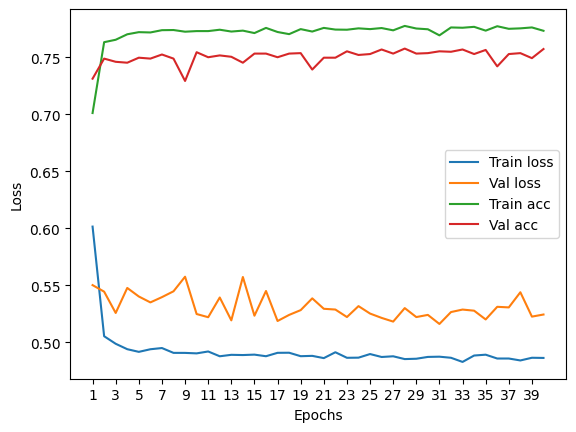

****************************************************************************************************



118it [00:00, 127.63it/s]


Train Epoch: 0 	Loss: 0.622816, Accuracy: 5231/7500 (70%)
Val Epoch: 0 	Loss: 0.541754, Accuracy: 1923/2500 (77%)



118it [00:01, 108.17it/s]


Train Epoch: 1 	Loss: 0.511634, Accuracy: 5729/7500 (76%)
Val Epoch: 1 	Loss: 0.495122, Accuracy: 1928/2500 (77%)



118it [00:01, 117.95it/s]


Train Epoch: 2 	Loss: 0.500906, Accuracy: 5735/7500 (76%)
Val Epoch: 2 	Loss: 0.497949, Accuracy: 1936/2500 (77%)



118it [00:00, 124.42it/s]


Train Epoch: 3 	Loss: 0.496804, Accuracy: 5755/7500 (77%)
Val Epoch: 3 	Loss: 0.507525, Accuracy: 1939/2500 (78%)



118it [00:00, 122.14it/s]


Train Epoch: 4 	Loss: 0.497228, Accuracy: 5765/7500 (77%)
Val Epoch: 4 	Loss: 0.501013, Accuracy: 1932/2500 (77%)



118it [00:00, 125.56it/s]


Train Epoch: 5 	Loss: 0.498819, Accuracy: 5759/7500 (77%)
Val Epoch: 5 	Loss: 0.481444, Accuracy: 1931/2500 (77%)



118it [00:00, 123.84it/s]


Train Epoch: 6 	Loss: 0.495475, Accuracy: 5763/7500 (77%)
Val Epoch: 6 	Loss: 0.490554, Accuracy: 1928/2500 (77%)



118it [00:00, 120.99it/s]


Train Epoch: 7 	Loss: 0.496725, Accuracy: 5766/7500 (77%)
Val Epoch: 7 	Loss: 0.496189, Accuracy: 1936/2500 (77%)



118it [00:01, 112.06it/s]


Train Epoch: 8 	Loss: 0.497407, Accuracy: 5772/7500 (77%)
Val Epoch: 8 	Loss: 0.494350, Accuracy: 1935/2500 (77%)



118it [00:00, 139.02it/s]


Train Epoch: 9 	Loss: 0.496991, Accuracy: 5756/7500 (77%)
Val Epoch: 9 	Loss: 0.489811, Accuracy: 1932/2500 (77%)



118it [00:01, 117.61it/s]


Train Epoch: 10 	Loss: 0.496014, Accuracy: 5767/7500 (77%)
Val Epoch: 10 	Loss: 0.481796, Accuracy: 1926/2500 (77%)



118it [00:00, 139.51it/s]


Train Epoch: 11 	Loss: 0.496255, Accuracy: 5767/7500 (77%)
Val Epoch: 11 	Loss: 0.487788, Accuracy: 1933/2500 (77%)



118it [00:00, 121.84it/s]


Train Epoch: 12 	Loss: 0.497942, Accuracy: 5774/7500 (77%)
Val Epoch: 12 	Loss: 0.494141, Accuracy: 1925/2500 (77%)



118it [00:00, 120.53it/s]


Train Epoch: 13 	Loss: 0.497004, Accuracy: 5781/7500 (77%)
Val Epoch: 13 	Loss: 0.489332, Accuracy: 1931/2500 (77%)



118it [00:00, 126.57it/s]


Train Epoch: 14 	Loss: 0.496215, Accuracy: 5773/7500 (77%)
Val Epoch: 14 	Loss: 0.501009, Accuracy: 1929/2500 (77%)



118it [00:01, 105.95it/s]


Train Epoch: 15 	Loss: 0.497054, Accuracy: 5782/7500 (77%)
Val Epoch: 15 	Loss: 0.488283, Accuracy: 1935/2500 (77%)



118it [00:00, 124.17it/s]


Train Epoch: 16 	Loss: 0.495933, Accuracy: 5774/7500 (77%)
Val Epoch: 16 	Loss: 0.498484, Accuracy: 1927/2500 (77%)



118it [00:00, 128.70it/s]


Train Epoch: 17 	Loss: 0.494156, Accuracy: 5766/7500 (77%)
Val Epoch: 17 	Loss: 0.492440, Accuracy: 1932/2500 (77%)



118it [00:00, 134.74it/s]


Train Epoch: 18 	Loss: 0.494812, Accuracy: 5776/7500 (77%)
Val Epoch: 18 	Loss: 0.486396, Accuracy: 1922/2500 (77%)



118it [00:01, 113.74it/s]


Train Epoch: 19 	Loss: 0.493186, Accuracy: 5772/7500 (77%)
Val Epoch: 19 	Loss: 0.505138, Accuracy: 1936/2500 (77%)



118it [00:00, 118.35it/s]


Train Epoch: 20 	Loss: 0.494997, Accuracy: 5779/7500 (77%)
Val Epoch: 20 	Loss: 0.482422, Accuracy: 1932/2500 (77%)



118it [00:00, 125.65it/s]


Train Epoch: 21 	Loss: 0.494514, Accuracy: 5756/7500 (77%)
Val Epoch: 21 	Loss: 0.480098, Accuracy: 1934/2500 (77%)



118it [00:00, 140.09it/s]


Train Epoch: 22 	Loss: 0.494173, Accuracy: 5777/7500 (77%)
Val Epoch: 22 	Loss: 0.507093, Accuracy: 1943/2500 (78%)



118it [00:00, 118.01it/s]


Train Epoch: 23 	Loss: 0.496393, Accuracy: 5788/7500 (77%)
Val Epoch: 23 	Loss: 0.488095, Accuracy: 1934/2500 (77%)



118it [00:00, 123.02it/s]


Train Epoch: 24 	Loss: 0.492915, Accuracy: 5775/7500 (77%)
Val Epoch: 24 	Loss: 0.483370, Accuracy: 1929/2500 (77%)



118it [00:00, 135.28it/s]


Train Epoch: 25 	Loss: 0.494229, Accuracy: 5776/7500 (77%)
Val Epoch: 25 	Loss: 0.503596, Accuracy: 1938/2500 (78%)



118it [00:00, 120.72it/s]


Train Epoch: 26 	Loss: 0.492993, Accuracy: 5775/7500 (77%)
Val Epoch: 26 	Loss: 0.484288, Accuracy: 1930/2500 (77%)



118it [00:00, 123.46it/s]


Train Epoch: 27 	Loss: 0.493067, Accuracy: 5790/7500 (77%)
Val Epoch: 27 	Loss: 0.493204, Accuracy: 1932/2500 (77%)



118it [00:01, 73.23it/s]


Train Epoch: 28 	Loss: 0.494049, Accuracy: 5768/7500 (77%)
Val Epoch: 28 	Loss: 0.495162, Accuracy: 1933/2500 (77%)



118it [00:01, 73.85it/s]


Train Epoch: 29 	Loss: 0.492516, Accuracy: 5778/7500 (77%)
Val Epoch: 29 	Loss: 0.483632, Accuracy: 1933/2500 (77%)



118it [00:01, 96.10it/s] 


Train Epoch: 30 	Loss: 0.492472, Accuracy: 5780/7500 (77%)
Val Epoch: 30 	Loss: 0.488455, Accuracy: 1936/2500 (77%)



118it [00:00, 119.10it/s]


Train Epoch: 31 	Loss: 0.493304, Accuracy: 5795/7500 (77%)
Val Epoch: 31 	Loss: 0.488179, Accuracy: 1934/2500 (77%)



118it [00:01, 92.14it/s] 


Train Epoch: 32 	Loss: 0.492534, Accuracy: 5802/7500 (77%)
Val Epoch: 32 	Loss: 0.490802, Accuracy: 1936/2500 (77%)



118it [00:01, 96.43it/s]


Train Epoch: 33 	Loss: 0.492413, Accuracy: 5777/7500 (77%)
Val Epoch: 33 	Loss: 0.496390, Accuracy: 1940/2500 (78%)



118it [00:01, 92.82it/s] 


Train Epoch: 34 	Loss: 0.496110, Accuracy: 5770/7500 (77%)
Val Epoch: 34 	Loss: 0.481441, Accuracy: 1936/2500 (77%)



118it [00:01, 107.40it/s]


Train Epoch: 35 	Loss: 0.491549, Accuracy: 5763/7500 (77%)
Val Epoch: 35 	Loss: 0.483179, Accuracy: 1935/2500 (77%)



118it [00:01, 114.99it/s]


Train Epoch: 36 	Loss: 0.492040, Accuracy: 5787/7500 (77%)
Val Epoch: 36 	Loss: 0.484593, Accuracy: 1930/2500 (77%)



118it [00:01, 92.07it/s]


Train Epoch: 37 	Loss: 0.494516, Accuracy: 5764/7500 (77%)
Val Epoch: 37 	Loss: 0.491471, Accuracy: 1934/2500 (77%)



118it [00:01, 71.25it/s]


Train Epoch: 38 	Loss: 0.493595, Accuracy: 5759/7500 (77%)
Val Epoch: 38 	Loss: 0.489372, Accuracy: 1932/2500 (77%)



118it [00:01, 84.13it/s]


Train Epoch: 39 	Loss: 0.493390, Accuracy: 5783/7500 (77%)
Val Epoch: 39 	Loss: 0.487679, Accuracy: 1934/2500 (77%)

Test accuracy:  77.03999999999999


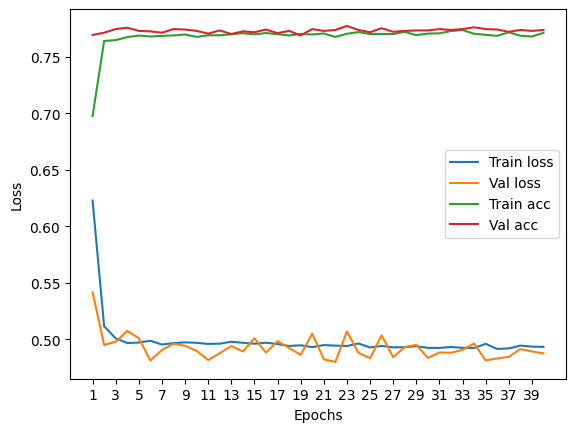

****************************************************************************************************



116it [00:00, 130.29it/s]


Train Epoch: 0 	Loss: 0.622553, Accuracy: 5029/7422 (68%)
Val Epoch: 0 	Loss: 0.538635, Accuracy: 1916/2474 (77%)



116it [00:01, 108.60it/s]


Train Epoch: 1 	Loss: 0.511427, Accuracy: 5591/7422 (75%)
Val Epoch: 1 	Loss: 0.507409, Accuracy: 1854/2474 (75%)



116it [00:00, 117.22it/s]


Train Epoch: 2 	Loss: 0.503853, Accuracy: 5605/7422 (76%)
Val Epoch: 2 	Loss: 0.503905, Accuracy: 1871/2474 (76%)



116it [00:01, 108.50it/s]


Train Epoch: 3 	Loss: 0.498566, Accuracy: 5661/7422 (76%)
Val Epoch: 3 	Loss: 0.496433, Accuracy: 1878/2474 (76%)



116it [00:00, 120.60it/s]


Train Epoch: 4 	Loss: 0.496683, Accuracy: 5650/7422 (76%)
Val Epoch: 4 	Loss: 0.494406, Accuracy: 1889/2474 (76%)



116it [00:00, 123.13it/s]


Train Epoch: 5 	Loss: 0.497109, Accuracy: 5651/7422 (76%)
Val Epoch: 5 	Loss: 0.494135, Accuracy: 1885/2474 (76%)



116it [00:00, 130.73it/s]


Train Epoch: 6 	Loss: 0.494262, Accuracy: 5668/7422 (76%)
Val Epoch: 6 	Loss: 0.495273, Accuracy: 1884/2474 (76%)



116it [00:00, 129.45it/s]


Train Epoch: 7 	Loss: 0.493231, Accuracy: 5658/7422 (76%)
Val Epoch: 7 	Loss: 0.491187, Accuracy: 1911/2474 (77%)



116it [00:00, 117.84it/s]


Train Epoch: 8 	Loss: 0.491899, Accuracy: 5665/7422 (76%)
Val Epoch: 8 	Loss: 0.488712, Accuracy: 1910/2474 (77%)



116it [00:00, 125.50it/s]


Train Epoch: 9 	Loss: 0.493408, Accuracy: 5691/7422 (77%)
Val Epoch: 9 	Loss: 0.490169, Accuracy: 1894/2474 (77%)



116it [00:00, 120.42it/s]


Train Epoch: 10 	Loss: 0.492100, Accuracy: 5685/7422 (77%)
Val Epoch: 10 	Loss: 0.488754, Accuracy: 1919/2474 (78%)



116it [00:00, 143.19it/s]


Train Epoch: 11 	Loss: 0.490800, Accuracy: 5682/7422 (77%)
Val Epoch: 11 	Loss: 0.486670, Accuracy: 1908/2474 (77%)



116it [00:00, 127.87it/s]


Train Epoch: 12 	Loss: 0.491169, Accuracy: 5686/7422 (77%)
Val Epoch: 12 	Loss: 0.483649, Accuracy: 1914/2474 (77%)



116it [00:00, 122.58it/s]


Train Epoch: 13 	Loss: 0.490480, Accuracy: 5684/7422 (77%)
Val Epoch: 13 	Loss: 0.487550, Accuracy: 1915/2474 (77%)



116it [00:00, 128.35it/s]


Train Epoch: 14 	Loss: 0.489500, Accuracy: 5677/7422 (76%)
Val Epoch: 14 	Loss: 0.485798, Accuracy: 1913/2474 (77%)



116it [00:00, 116.73it/s]


Train Epoch: 15 	Loss: 0.489202, Accuracy: 5667/7422 (76%)
Val Epoch: 15 	Loss: 0.486767, Accuracy: 1922/2474 (78%)



116it [00:01, 104.11it/s]


Train Epoch: 16 	Loss: 0.489620, Accuracy: 5685/7422 (77%)
Val Epoch: 16 	Loss: 0.484277, Accuracy: 1915/2474 (77%)



116it [00:01, 103.85it/s]


Train Epoch: 17 	Loss: 0.489478, Accuracy: 5683/7422 (77%)
Val Epoch: 17 	Loss: 0.494909, Accuracy: 1888/2474 (76%)



116it [00:01, 91.63it/s]


Train Epoch: 18 	Loss: 0.487321, Accuracy: 5711/7422 (77%)
Val Epoch: 18 	Loss: 0.486138, Accuracy: 1911/2474 (77%)



116it [00:01, 92.39it/s]


Train Epoch: 19 	Loss: 0.488885, Accuracy: 5689/7422 (77%)
Val Epoch: 19 	Loss: 0.485197, Accuracy: 1918/2474 (78%)



116it [00:01, 87.55it/s]


Train Epoch: 20 	Loss: 0.488203, Accuracy: 5693/7422 (77%)
Val Epoch: 20 	Loss: 0.486090, Accuracy: 1917/2474 (77%)



116it [00:01, 80.39it/s]


Train Epoch: 21 	Loss: 0.488775, Accuracy: 5685/7422 (77%)
Val Epoch: 21 	Loss: 0.485208, Accuracy: 1914/2474 (77%)



116it [00:01, 87.99it/s]


Train Epoch: 22 	Loss: 0.488373, Accuracy: 5690/7422 (77%)
Val Epoch: 22 	Loss: 0.485898, Accuracy: 1906/2474 (77%)



116it [00:01, 104.99it/s]


Train Epoch: 23 	Loss: 0.486885, Accuracy: 5711/7422 (77%)
Val Epoch: 23 	Loss: 0.488580, Accuracy: 1904/2474 (77%)



116it [00:01, 98.44it/s] 


Train Epoch: 24 	Loss: 0.486976, Accuracy: 5700/7422 (77%)
Val Epoch: 24 	Loss: 0.488539, Accuracy: 1918/2474 (78%)



116it [00:01, 82.27it/s]


Train Epoch: 25 	Loss: 0.488383, Accuracy: 5707/7422 (77%)
Val Epoch: 25 	Loss: 0.485827, Accuracy: 1909/2474 (77%)



116it [00:01, 69.64it/s]


Train Epoch: 26 	Loss: 0.486892, Accuracy: 5682/7422 (77%)
Val Epoch: 26 	Loss: 0.484000, Accuracy: 1912/2474 (77%)



116it [00:01, 90.91it/s]


Train Epoch: 27 	Loss: 0.487022, Accuracy: 5676/7422 (76%)
Val Epoch: 27 	Loss: 0.494597, Accuracy: 1892/2474 (76%)



116it [00:01, 95.86it/s] 


Train Epoch: 28 	Loss: 0.485463, Accuracy: 5702/7422 (77%)
Val Epoch: 28 	Loss: 0.485477, Accuracy: 1905/2474 (77%)



116it [00:01, 89.83it/s]


Train Epoch: 29 	Loss: 0.485819, Accuracy: 5701/7422 (77%)
Val Epoch: 29 	Loss: 0.485409, Accuracy: 1914/2474 (77%)



116it [00:01, 94.95it/s]


Train Epoch: 30 	Loss: 0.485662, Accuracy: 5687/7422 (77%)
Val Epoch: 30 	Loss: 0.488145, Accuracy: 1899/2474 (77%)



116it [00:01, 100.99it/s]


Train Epoch: 31 	Loss: 0.485308, Accuracy: 5713/7422 (77%)
Val Epoch: 31 	Loss: 0.490771, Accuracy: 1907/2474 (77%)



116it [00:01, 110.83it/s]


Train Epoch: 32 	Loss: 0.484616, Accuracy: 5709/7422 (77%)
Val Epoch: 32 	Loss: 0.489467, Accuracy: 1898/2474 (77%)



116it [00:01, 88.84it/s]


Train Epoch: 33 	Loss: 0.484747, Accuracy: 5695/7422 (77%)
Val Epoch: 33 	Loss: 0.484995, Accuracy: 1922/2474 (78%)



116it [00:01, 94.78it/s] 


Train Epoch: 34 	Loss: 0.485105, Accuracy: 5698/7422 (77%)
Val Epoch: 34 	Loss: 0.492635, Accuracy: 1897/2474 (77%)



116it [00:01, 73.49it/s]


Train Epoch: 35 	Loss: 0.484841, Accuracy: 5705/7422 (77%)
Val Epoch: 35 	Loss: 0.485182, Accuracy: 1903/2474 (77%)



116it [00:01, 71.14it/s]


Train Epoch: 36 	Loss: 0.485852, Accuracy: 5692/7422 (77%)
Val Epoch: 36 	Loss: 0.489170, Accuracy: 1919/2474 (78%)



116it [00:01, 88.35it/s]


Train Epoch: 37 	Loss: 0.484749, Accuracy: 5685/7422 (77%)
Val Epoch: 37 	Loss: 0.487495, Accuracy: 1917/2474 (77%)



116it [00:01, 96.91it/s] 


Train Epoch: 38 	Loss: 0.483930, Accuracy: 5699/7422 (77%)
Val Epoch: 38 	Loss: 0.487877, Accuracy: 1906/2474 (77%)



116it [00:01, 101.36it/s]


Train Epoch: 39 	Loss: 0.483438, Accuracy: 5710/7422 (77%)
Val Epoch: 39 	Loss: 0.486355, Accuracy: 1913/2474 (77%)

Test accuracy:  76.1519805982215


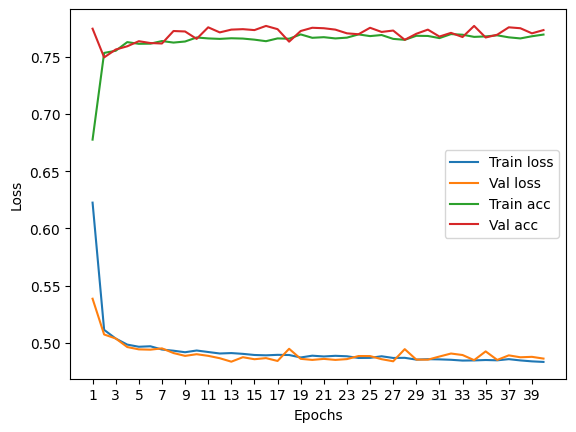

****************************************************************************************************





In [128]:
epochs = 40
train_loss, val_loss, train_acc, val_acc, auc = find_ideal_particles(X_norm, y10, num_particles_norm, 1, 10)

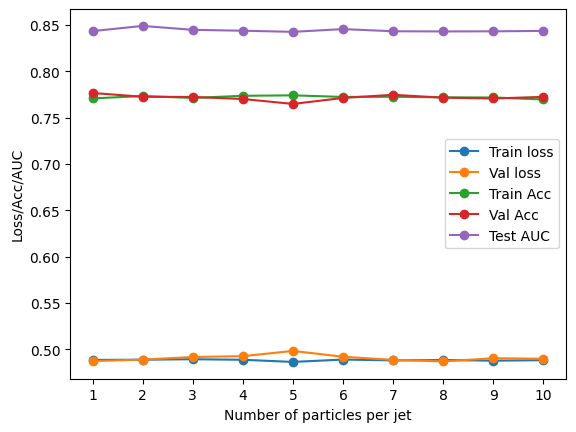

In [158]:
plt.plot(range(1,11), [sum(train_loss[i])/len(train_loss[i]) for i in range(1,len(train_loss)+1)], label='Train loss', marker='o')
plt.plot(range(1,11), [sum(val_loss[i])/len(val_loss[i]) for i in range(1,len(val_loss)+1)], label='Val loss', marker='o')
plt.plot(range(1,11), [sum(train_acc[i])/len(train_acc[i]) for i in range(1,len(train_acc)+1)], label='Train Acc', marker='o')
plt.plot(range(1,11), [sum(val_acc[i])/len(val_acc[i]) for i in range(1,len(val_acc)+1)], label='Val Acc', marker='o')
plt.plot(range(1,11), [sum(auc[i])/len(auc[i]) for i in range(1,len(auc)+1)], label='Test AUC', marker='o')
plt.legend()
plt.xlabel("Number of particles per jet")
plt.ylabel("Loss/Acc/AUC")
plt.xticks(range(1,11), range(1,11))
plt.show()

In [156]:
train_loss[3], val_loss[3], train_acc[3], val_acc[3], auc[3]

([tensor(0.4937),
  tensor(0.4956),
  tensor(0.4924),
  tensor(0.4822),
  tensor(0.4862),
  tensor(0.4935),
  tensor(0.4827),
  tensor(0.4873)],
 [tensor(0.4732),
  tensor(0.4940),
  tensor(0.4762),
  tensor(0.4956),
  tensor(0.4936),
  tensor(0.5017),
  tensor(0.4980),
  tensor(0.5005)],
 [tensor(0.7677),
  tensor(0.7608),
  tensor(0.7716),
  tensor(0.7779),
  tensor(0.7743),
  tensor(0.7733),
  tensor(0.7733),
  tensor(0.7703)],
 [tensor(0.7856),
  tensor(0.7780),
  tensor(0.7848),
  tensor(0.7596),
  tensor(0.7684),
  tensor(0.7644),
  tensor(0.7728),
  tensor(0.7639)],
 [0.8547324304794163,
  0.8518413857021063,
  0.8488137655062025,
  0.8373521690627821,
  0.8491147381080235,
  0.8436027996231671,
  0.8324742812750774,
  0.8390982756533771])

All particles

In [74]:
epochs = 40
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

59it [00:12,  4.74it/s]


Train Epoch: 0 	Loss: 0.696536, Accuracy: 31514/60000 (53%)
Val Epoch: 0 	Loss: 0.704295, Accuracy: 10596/20000 (53%)



59it [00:12,  4.61it/s]


Train Epoch: 1 	Loss: 0.685580, Accuracy: 35355/60000 (59%)
Val Epoch: 1 	Loss: 0.687857, Accuracy: 11956/20000 (60%)



59it [00:12,  4.71it/s]


Train Epoch: 2 	Loss: 0.663773, Accuracy: 39391/60000 (66%)
Val Epoch: 2 	Loss: 0.659560, Accuracy: 13819/20000 (69%)



59it [00:12,  4.66it/s]


Train Epoch: 3 	Loss: 0.634126, Accuracy: 43049/60000 (72%)
Val Epoch: 3 	Loss: 0.626571, Accuracy: 14706/20000 (74%)



59it [00:12,  4.61it/s]


Train Epoch: 4 	Loss: 0.601707, Accuracy: 44359/60000 (74%)
Val Epoch: 4 	Loss: 0.593436, Accuracy: 15001/20000 (75%)



59it [00:12,  4.68it/s]


Train Epoch: 5 	Loss: 0.572703, Accuracy: 44934/60000 (75%)
Val Epoch: 5 	Loss: 0.568396, Accuracy: 15131/20000 (76%)



59it [00:12,  4.55it/s]


Train Epoch: 6 	Loss: 0.551854, Accuracy: 45220/60000 (75%)
Val Epoch: 6 	Loss: 0.549481, Accuracy: 15138/20000 (76%)



59it [00:12,  4.58it/s]


Train Epoch: 7 	Loss: 0.537619, Accuracy: 45375/60000 (76%)
Val Epoch: 7 	Loss: 0.539024, Accuracy: 15153/20000 (76%)



59it [00:12,  4.59it/s]


Train Epoch: 8 	Loss: 0.528234, Accuracy: 45442/60000 (76%)
Val Epoch: 8 	Loss: 0.531293, Accuracy: 15223/20000 (76%)



59it [00:12,  4.57it/s]


Train Epoch: 9 	Loss: 0.521590, Accuracy: 45529/60000 (76%)
Val Epoch: 9 	Loss: 0.524632, Accuracy: 15228/20000 (76%)



59it [00:12,  4.64it/s]


Train Epoch: 10 	Loss: 0.517687, Accuracy: 45568/60000 (76%)
Val Epoch: 10 	Loss: 0.520608, Accuracy: 15267/20000 (76%)



59it [00:10,  5.38it/s]


Train Epoch: 11 	Loss: 0.513577, Accuracy: 45714/60000 (76%)
Val Epoch: 11 	Loss: 0.521875, Accuracy: 15106/20000 (76%)



59it [00:06,  9.78it/s]


Train Epoch: 12 	Loss: 0.511120, Accuracy: 45723/60000 (76%)
Val Epoch: 12 	Loss: 0.515825, Accuracy: 15272/20000 (76%)



59it [00:05, 10.53it/s]


Train Epoch: 13 	Loss: 0.510392, Accuracy: 45790/60000 (76%)
Val Epoch: 13 	Loss: 0.514065, Accuracy: 15292/20000 (76%)



59it [00:05, 10.93it/s]


Train Epoch: 14 	Loss: 0.509342, Accuracy: 45779/60000 (76%)
Val Epoch: 14 	Loss: 0.514797, Accuracy: 15200/20000 (76%)



59it [00:05, 11.18it/s]


Train Epoch: 15 	Loss: 0.509133, Accuracy: 45782/60000 (76%)
Val Epoch: 15 	Loss: 0.514156, Accuracy: 15303/20000 (77%)



59it [00:05, 10.54it/s]


Train Epoch: 16 	Loss: 0.507914, Accuracy: 45876/60000 (76%)
Val Epoch: 16 	Loss: 0.512050, Accuracy: 15328/20000 (77%)



59it [00:05, 11.47it/s]


Train Epoch: 17 	Loss: 0.507259, Accuracy: 45844/60000 (76%)
Val Epoch: 17 	Loss: 0.511637, Accuracy: 15302/20000 (77%)



59it [00:05, 11.60it/s]


Train Epoch: 18 	Loss: 0.507165, Accuracy: 45795/60000 (76%)
Val Epoch: 18 	Loss: 0.510969, Accuracy: 15322/20000 (77%)



59it [00:05, 11.27it/s]


Train Epoch: 19 	Loss: 0.506783, Accuracy: 45905/60000 (77%)
Val Epoch: 19 	Loss: 0.511055, Accuracy: 15310/20000 (77%)



59it [00:05, 11.78it/s]


Train Epoch: 20 	Loss: 0.506388, Accuracy: 45898/60000 (76%)
Val Epoch: 20 	Loss: 0.511893, Accuracy: 15233/20000 (76%)



59it [00:05, 11.22it/s]


Train Epoch: 21 	Loss: 0.506920, Accuracy: 45898/60000 (76%)
Val Epoch: 21 	Loss: 0.512124, Accuracy: 15266/20000 (76%)



59it [00:05, 10.71it/s]


Train Epoch: 22 	Loss: 0.506745, Accuracy: 45929/60000 (77%)
Val Epoch: 22 	Loss: 0.512163, Accuracy: 15252/20000 (76%)



59it [00:05, 11.39it/s]


Train Epoch: 23 	Loss: 0.506383, Accuracy: 45892/60000 (76%)
Val Epoch: 23 	Loss: 0.509469, Accuracy: 15324/20000 (77%)



59it [00:05, 11.37it/s]


Train Epoch: 24 	Loss: 0.505812, Accuracy: 45912/60000 (77%)
Val Epoch: 24 	Loss: 0.509451, Accuracy: 15329/20000 (77%)



59it [00:05, 11.68it/s]


Train Epoch: 25 	Loss: 0.505699, Accuracy: 45951/60000 (77%)
Val Epoch: 25 	Loss: 0.508457, Accuracy: 15309/20000 (77%)



59it [00:04, 11.84it/s]


Train Epoch: 26 	Loss: 0.506010, Accuracy: 45969/60000 (77%)
Val Epoch: 26 	Loss: 0.509888, Accuracy: 15323/20000 (77%)



59it [00:05, 11.77it/s]


Train Epoch: 27 	Loss: 0.505091, Accuracy: 45955/60000 (77%)
Val Epoch: 27 	Loss: 0.511406, Accuracy: 15336/20000 (77%)



59it [00:05, 11.20it/s]


Train Epoch: 28 	Loss: 0.506501, Accuracy: 45888/60000 (76%)
Val Epoch: 28 	Loss: 0.509743, Accuracy: 15336/20000 (77%)



59it [00:05, 11.33it/s]


Train Epoch: 29 	Loss: 0.505219, Accuracy: 45950/60000 (77%)
Val Epoch: 29 	Loss: 0.508069, Accuracy: 15321/20000 (77%)



59it [00:05, 11.23it/s]


Train Epoch: 30 	Loss: 0.505024, Accuracy: 46019/60000 (77%)
Val Epoch: 30 	Loss: 0.509493, Accuracy: 15317/20000 (77%)



59it [00:05, 11.74it/s]


Train Epoch: 31 	Loss: 0.504993, Accuracy: 45955/60000 (77%)
Val Epoch: 31 	Loss: 0.510385, Accuracy: 15288/20000 (76%)



59it [00:04, 11.95it/s]


Train Epoch: 32 	Loss: 0.504780, Accuracy: 45980/60000 (77%)
Val Epoch: 32 	Loss: 0.511299, Accuracy: 15315/20000 (77%)



59it [00:05, 11.50it/s]


Train Epoch: 33 	Loss: 0.505456, Accuracy: 45998/60000 (77%)
Val Epoch: 33 	Loss: 0.512209, Accuracy: 15243/20000 (76%)



59it [00:05, 11.71it/s]


Train Epoch: 34 	Loss: 0.505349, Accuracy: 45999/60000 (77%)
Val Epoch: 34 	Loss: 0.509559, Accuracy: 15335/20000 (77%)



59it [00:06,  9.82it/s]


Train Epoch: 35 	Loss: 0.505312, Accuracy: 45989/60000 (77%)
Val Epoch: 35 	Loss: 0.511932, Accuracy: 15241/20000 (76%)



59it [00:06,  9.61it/s]


Train Epoch: 36 	Loss: 0.505027, Accuracy: 46038/60000 (77%)
Val Epoch: 36 	Loss: 0.508716, Accuracy: 15356/20000 (77%)



59it [00:05, 10.46it/s]


Train Epoch: 37 	Loss: 0.505053, Accuracy: 46050/60000 (77%)
Val Epoch: 37 	Loss: 0.511930, Accuracy: 15242/20000 (76%)



59it [00:05, 11.17it/s]


Train Epoch: 38 	Loss: 0.504778, Accuracy: 46048/60000 (77%)
Val Epoch: 38 	Loss: 0.511470, Accuracy: 15278/20000 (76%)



59it [00:05, 11.43it/s]


Train Epoch: 39 	Loss: 0.503946, Accuracy: 46074/60000 (77%)
Val Epoch: 39 	Loss: 0.507980, Accuracy: 15343/20000 (77%)



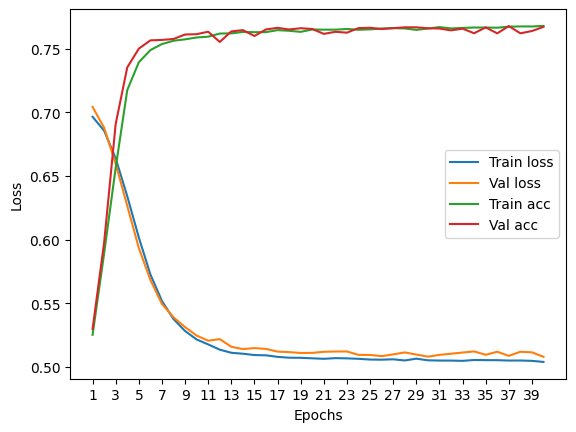

In [75]:
plot_loss(history)

Test accuracy:  76.63499999999999


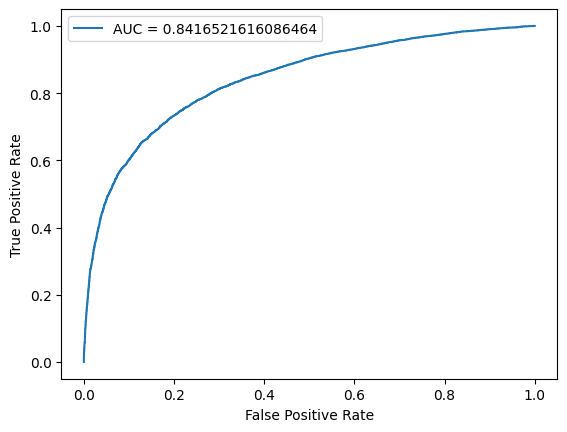

In [76]:
plot_auc(model, test_dataloader)

Particles per jet: 1


118it [00:00, 271.55it/s]


Train Epoch: 0 	Loss: 0.658358, Accuracy: 4723/7500 (63%)
Val Epoch: 0 	Loss: 0.617834, Accuracy: 1728/2500 (69%)



118it [00:00, 269.54it/s]


Train Epoch: 1 	Loss: 0.592736, Accuracy: 5232/7500 (70%)
Val Epoch: 1 	Loss: 0.598413, Accuracy: 1766/2500 (71%)



118it [00:00, 261.67it/s]


Train Epoch: 2 	Loss: 0.580164, Accuracy: 5261/7500 (70%)
Val Epoch: 2 	Loss: 0.588961, Accuracy: 1763/2500 (71%)



118it [00:00, 256.43it/s]


Train Epoch: 3 	Loss: 0.580965, Accuracy: 5257/7500 (70%)
Val Epoch: 3 	Loss: 0.582141, Accuracy: 1782/2500 (71%)



118it [00:00, 239.65it/s]


Train Epoch: 4 	Loss: 0.578346, Accuracy: 5268/7500 (70%)
Val Epoch: 4 	Loss: 0.582490, Accuracy: 1784/2500 (71%)



118it [00:00, 236.99it/s]


Train Epoch: 5 	Loss: 0.576117, Accuracy: 5291/7500 (71%)
Val Epoch: 5 	Loss: 0.587737, Accuracy: 1757/2500 (70%)



118it [00:00, 253.68it/s]


Train Epoch: 6 	Loss: 0.574571, Accuracy: 5291/7500 (71%)
Val Epoch: 6 	Loss: 0.585976, Accuracy: 1789/2500 (72%)



118it [00:00, 270.32it/s]


Train Epoch: 7 	Loss: 0.575578, Accuracy: 5299/7500 (71%)
Val Epoch: 7 	Loss: 0.577858, Accuracy: 1771/2500 (71%)



118it [00:00, 278.24it/s]


Train Epoch: 8 	Loss: 0.575932, Accuracy: 5304/7500 (71%)
Val Epoch: 8 	Loss: 0.585991, Accuracy: 1783/2500 (71%)



118it [00:00, 280.76it/s]


Train Epoch: 9 	Loss: 0.578571, Accuracy: 5288/7500 (71%)
Val Epoch: 9 	Loss: 0.579251, Accuracy: 1779/2500 (71%)



118it [00:00, 275.09it/s]


Train Epoch: 10 	Loss: 0.577612, Accuracy: 5294/7500 (71%)
Val Epoch: 10 	Loss: 0.594586, Accuracy: 1770/2500 (71%)



118it [00:00, 241.56it/s]


Train Epoch: 11 	Loss: 0.576570, Accuracy: 5315/7500 (71%)
Val Epoch: 11 	Loss: 0.573395, Accuracy: 1785/2500 (71%)



118it [00:00, 257.92it/s]


Train Epoch: 12 	Loss: 0.576995, Accuracy: 5308/7500 (71%)
Val Epoch: 12 	Loss: 0.581392, Accuracy: 1788/2500 (72%)



118it [00:00, 264.08it/s]


Train Epoch: 13 	Loss: 0.574696, Accuracy: 5285/7500 (70%)
Val Epoch: 13 	Loss: 0.595247, Accuracy: 1772/2500 (71%)



118it [00:00, 257.36it/s]


Train Epoch: 14 	Loss: 0.572439, Accuracy: 5306/7500 (71%)
Val Epoch: 14 	Loss: 0.588432, Accuracy: 1788/2500 (72%)



118it [00:00, 270.55it/s]


Train Epoch: 15 	Loss: 0.573726, Accuracy: 5285/7500 (70%)
Val Epoch: 15 	Loss: 0.581046, Accuracy: 1780/2500 (71%)



118it [00:00, 272.66it/s]


Train Epoch: 16 	Loss: 0.574336, Accuracy: 5288/7500 (71%)
Val Epoch: 16 	Loss: 0.584328, Accuracy: 1776/2500 (71%)



118it [00:00, 278.21it/s]


Train Epoch: 17 	Loss: 0.574596, Accuracy: 5286/7500 (70%)
Val Epoch: 17 	Loss: 0.591044, Accuracy: 1767/2500 (71%)



118it [00:00, 273.79it/s]


Train Epoch: 18 	Loss: 0.576349, Accuracy: 5297/7500 (71%)
Val Epoch: 18 	Loss: 0.580371, Accuracy: 1776/2500 (71%)



118it [00:00, 283.49it/s]


Train Epoch: 19 	Loss: 0.576145, Accuracy: 5296/7500 (71%)
Val Epoch: 19 	Loss: 0.585591, Accuracy: 1779/2500 (71%)



118it [00:00, 278.80it/s]


Train Epoch: 20 	Loss: 0.573287, Accuracy: 5300/7500 (71%)
Val Epoch: 20 	Loss: 0.580808, Accuracy: 1777/2500 (71%)



118it [00:00, 277.33it/s]


Train Epoch: 21 	Loss: 0.575736, Accuracy: 5300/7500 (71%)
Val Epoch: 21 	Loss: 0.593725, Accuracy: 1768/2500 (71%)



118it [00:00, 275.87it/s]


Train Epoch: 22 	Loss: 0.573464, Accuracy: 5312/7500 (71%)
Val Epoch: 22 	Loss: 0.583184, Accuracy: 1780/2500 (71%)



118it [00:00, 280.63it/s]


Train Epoch: 23 	Loss: 0.574636, Accuracy: 5303/7500 (71%)
Val Epoch: 23 	Loss: 0.594718, Accuracy: 1764/2500 (71%)



118it [00:00, 276.94it/s]


Train Epoch: 24 	Loss: 0.575564, Accuracy: 5293/7500 (71%)
Val Epoch: 24 	Loss: 0.583432, Accuracy: 1776/2500 (71%)



118it [00:00, 273.08it/s]


Train Epoch: 25 	Loss: 0.573535, Accuracy: 5277/7500 (70%)
Val Epoch: 25 	Loss: 0.577981, Accuracy: 1785/2500 (71%)



118it [00:00, 268.79it/s]


Train Epoch: 26 	Loss: 0.572841, Accuracy: 5289/7500 (71%)
Val Epoch: 26 	Loss: 0.582831, Accuracy: 1763/2500 (71%)



118it [00:00, 274.10it/s]


Train Epoch: 27 	Loss: 0.574436, Accuracy: 5291/7500 (71%)
Val Epoch: 27 	Loss: 0.595450, Accuracy: 1766/2500 (71%)



118it [00:00, 281.69it/s]


Train Epoch: 28 	Loss: 0.574911, Accuracy: 5279/7500 (70%)
Val Epoch: 28 	Loss: 0.583934, Accuracy: 1781/2500 (71%)



118it [00:00, 280.24it/s]


Train Epoch: 29 	Loss: 0.575287, Accuracy: 5258/7500 (70%)
Val Epoch: 29 	Loss: 0.583243, Accuracy: 1784/2500 (71%)



118it [00:00, 273.42it/s]


Train Epoch: 30 	Loss: 0.572376, Accuracy: 5303/7500 (71%)
Val Epoch: 30 	Loss: 0.577947, Accuracy: 1774/2500 (71%)



118it [00:00, 268.30it/s]


Train Epoch: 31 	Loss: 0.574407, Accuracy: 5291/7500 (71%)
Val Epoch: 31 	Loss: 0.593085, Accuracy: 1759/2500 (70%)



118it [00:00, 262.26it/s]


Train Epoch: 32 	Loss: 0.572913, Accuracy: 5289/7500 (71%)
Val Epoch: 32 	Loss: 0.576568, Accuracy: 1771/2500 (71%)



118it [00:00, 275.19it/s]


Train Epoch: 33 	Loss: 0.573132, Accuracy: 5301/7500 (71%)
Val Epoch: 33 	Loss: 0.571250, Accuracy: 1777/2500 (71%)



118it [00:00, 274.46it/s]


Train Epoch: 34 	Loss: 0.574500, Accuracy: 5278/7500 (70%)
Val Epoch: 34 	Loss: 0.585484, Accuracy: 1777/2500 (71%)



118it [00:00, 272.58it/s]


Train Epoch: 35 	Loss: 0.573254, Accuracy: 5291/7500 (71%)
Val Epoch: 35 	Loss: 0.578564, Accuracy: 1776/2500 (71%)



118it [00:00, 275.54it/s]


Train Epoch: 36 	Loss: 0.574042, Accuracy: 5286/7500 (70%)
Val Epoch: 36 	Loss: 0.584392, Accuracy: 1771/2500 (71%)



118it [00:00, 266.71it/s]


Train Epoch: 37 	Loss: 0.573712, Accuracy: 5286/7500 (70%)
Val Epoch: 37 	Loss: 0.581961, Accuracy: 1774/2500 (71%)



118it [00:00, 273.63it/s]


Train Epoch: 38 	Loss: 0.576939, Accuracy: 5295/7500 (71%)
Val Epoch: 38 	Loss: 0.586334, Accuracy: 1775/2500 (71%)



118it [00:00, 264.02it/s]


Train Epoch: 39 	Loss: 0.574607, Accuracy: 5297/7500 (71%)
Val Epoch: 39 	Loss: 0.579312, Accuracy: 1776/2500 (71%)

Test accuracy:  73.44000000000001


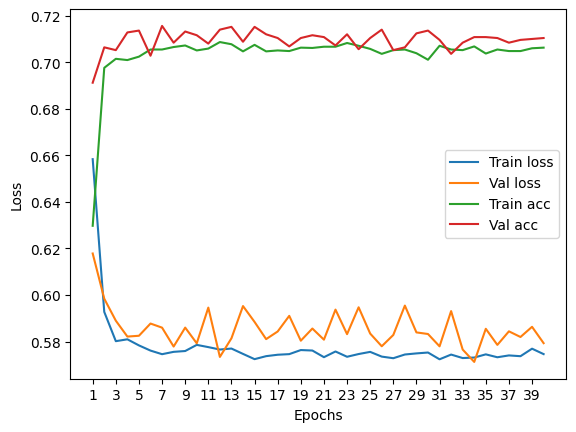

****************************************************************************************************



118it [00:00, 273.11it/s]


Train Epoch: 0 	Loss: 0.661052, Accuracy: 4674/7500 (62%)
Val Epoch: 0 	Loss: 0.626568, Accuracy: 1708/2500 (68%)



118it [00:00, 272.58it/s]


Train Epoch: 1 	Loss: 0.594317, Accuracy: 5248/7500 (70%)
Val Epoch: 1 	Loss: 0.601470, Accuracy: 1754/2500 (70%)



118it [00:00, 278.69it/s]


Train Epoch: 2 	Loss: 0.586172, Accuracy: 5277/7500 (70%)
Val Epoch: 2 	Loss: 0.616956, Accuracy: 1764/2500 (71%)



118it [00:00, 275.16it/s]


Train Epoch: 3 	Loss: 0.583610, Accuracy: 5253/7500 (70%)
Val Epoch: 3 	Loss: 0.607504, Accuracy: 1746/2500 (70%)



118it [00:00, 271.02it/s]


Train Epoch: 4 	Loss: 0.582339, Accuracy: 5298/7500 (71%)
Val Epoch: 4 	Loss: 0.596620, Accuracy: 1751/2500 (70%)



118it [00:00, 266.13it/s]


Train Epoch: 5 	Loss: 0.579789, Accuracy: 5284/7500 (70%)
Val Epoch: 5 	Loss: 0.604002, Accuracy: 1752/2500 (70%)



118it [00:00, 273.59it/s]


Train Epoch: 6 	Loss: 0.581277, Accuracy: 5305/7500 (71%)
Val Epoch: 6 	Loss: 0.598419, Accuracy: 1762/2500 (70%)



118it [00:00, 260.32it/s]


Train Epoch: 7 	Loss: 0.580492, Accuracy: 5304/7500 (71%)
Val Epoch: 7 	Loss: 0.603358, Accuracy: 1752/2500 (70%)



118it [00:00, 274.20it/s]


Train Epoch: 8 	Loss: 0.577494, Accuracy: 5299/7500 (71%)
Val Epoch: 8 	Loss: 0.597178, Accuracy: 1761/2500 (70%)



118it [00:00, 270.22it/s]


Train Epoch: 9 	Loss: 0.577031, Accuracy: 5312/7500 (71%)
Val Epoch: 9 	Loss: 0.592871, Accuracy: 1769/2500 (71%)



118it [00:00, 277.49it/s]


Train Epoch: 10 	Loss: 0.579198, Accuracy: 5318/7500 (71%)
Val Epoch: 10 	Loss: 0.594038, Accuracy: 1766/2500 (71%)



118it [00:00, 279.07it/s]


Train Epoch: 11 	Loss: 0.578206, Accuracy: 5304/7500 (71%)
Val Epoch: 11 	Loss: 0.597867, Accuracy: 1765/2500 (71%)



118it [00:00, 268.26it/s]


Train Epoch: 12 	Loss: 0.576005, Accuracy: 5315/7500 (71%)
Val Epoch: 12 	Loss: 0.599834, Accuracy: 1764/2500 (71%)



118it [00:00, 273.13it/s]


Train Epoch: 13 	Loss: 0.579213, Accuracy: 5327/7500 (71%)
Val Epoch: 13 	Loss: 0.601870, Accuracy: 1738/2500 (70%)



118it [00:00, 275.55it/s]


Train Epoch: 14 	Loss: 0.576034, Accuracy: 5328/7500 (71%)
Val Epoch: 14 	Loss: 0.590122, Accuracy: 1762/2500 (70%)



118it [00:00, 270.56it/s]


Train Epoch: 15 	Loss: 0.577789, Accuracy: 5278/7500 (70%)
Val Epoch: 15 	Loss: 0.595003, Accuracy: 1749/2500 (70%)



118it [00:00, 273.68it/s]


Train Epoch: 16 	Loss: 0.579729, Accuracy: 5303/7500 (71%)
Val Epoch: 16 	Loss: 0.603229, Accuracy: 1765/2500 (71%)



118it [00:00, 266.48it/s]


Train Epoch: 17 	Loss: 0.577089, Accuracy: 5311/7500 (71%)
Val Epoch: 17 	Loss: 0.592983, Accuracy: 1770/2500 (71%)



118it [00:00, 279.82it/s]


Train Epoch: 18 	Loss: 0.578232, Accuracy: 5301/7500 (71%)
Val Epoch: 18 	Loss: 0.598838, Accuracy: 1760/2500 (70%)



118it [00:00, 271.29it/s]


Train Epoch: 19 	Loss: 0.576112, Accuracy: 5317/7500 (71%)
Val Epoch: 19 	Loss: 0.605683, Accuracy: 1754/2500 (70%)



118it [00:00, 270.91it/s]


Train Epoch: 20 	Loss: 0.578828, Accuracy: 5304/7500 (71%)
Val Epoch: 20 	Loss: 0.605153, Accuracy: 1757/2500 (70%)



118it [00:00, 268.82it/s]


Train Epoch: 21 	Loss: 0.578599, Accuracy: 5295/7500 (71%)
Val Epoch: 21 	Loss: 0.599145, Accuracy: 1748/2500 (70%)



118it [00:00, 268.10it/s]


Train Epoch: 22 	Loss: 0.578499, Accuracy: 5304/7500 (71%)
Val Epoch: 22 	Loss: 0.602123, Accuracy: 1742/2500 (70%)



118it [00:00, 197.49it/s]


Train Epoch: 23 	Loss: 0.575680, Accuracy: 5317/7500 (71%)
Val Epoch: 23 	Loss: 0.608118, Accuracy: 1760/2500 (70%)



118it [00:00, 255.07it/s]


Train Epoch: 24 	Loss: 0.575928, Accuracy: 5308/7500 (71%)
Val Epoch: 24 	Loss: 0.595623, Accuracy: 1755/2500 (70%)



118it [00:00, 257.92it/s]


Train Epoch: 25 	Loss: 0.577118, Accuracy: 5320/7500 (71%)
Val Epoch: 25 	Loss: 0.600351, Accuracy: 1759/2500 (70%)



118it [00:00, 261.06it/s]


Train Epoch: 26 	Loss: 0.576189, Accuracy: 5310/7500 (71%)
Val Epoch: 26 	Loss: 0.591557, Accuracy: 1758/2500 (70%)



118it [00:00, 271.45it/s]


Train Epoch: 27 	Loss: 0.576699, Accuracy: 5313/7500 (71%)
Val Epoch: 27 	Loss: 0.605337, Accuracy: 1738/2500 (70%)



118it [00:00, 272.53it/s]


Train Epoch: 28 	Loss: 0.576657, Accuracy: 5295/7500 (71%)
Val Epoch: 28 	Loss: 0.594356, Accuracy: 1760/2500 (70%)



118it [00:00, 269.98it/s]


Train Epoch: 29 	Loss: 0.576208, Accuracy: 5301/7500 (71%)
Val Epoch: 29 	Loss: 0.599350, Accuracy: 1744/2500 (70%)



118it [00:00, 273.72it/s]


Train Epoch: 30 	Loss: 0.576310, Accuracy: 5326/7500 (71%)
Val Epoch: 30 	Loss: 0.601643, Accuracy: 1748/2500 (70%)



118it [00:00, 259.92it/s]


Train Epoch: 31 	Loss: 0.576746, Accuracy: 5308/7500 (71%)
Val Epoch: 31 	Loss: 0.590635, Accuracy: 1767/2500 (71%)



118it [00:00, 265.28it/s]


Train Epoch: 32 	Loss: 0.575984, Accuracy: 5302/7500 (71%)
Val Epoch: 32 	Loss: 0.593843, Accuracy: 1744/2500 (70%)



118it [00:00, 272.30it/s]


Train Epoch: 33 	Loss: 0.576301, Accuracy: 5327/7500 (71%)
Val Epoch: 33 	Loss: 0.601277, Accuracy: 1752/2500 (70%)



118it [00:00, 264.88it/s]


Train Epoch: 34 	Loss: 0.577708, Accuracy: 5313/7500 (71%)
Val Epoch: 34 	Loss: 0.602178, Accuracy: 1740/2500 (70%)



118it [00:00, 272.91it/s]


Train Epoch: 35 	Loss: 0.576434, Accuracy: 5330/7500 (71%)
Val Epoch: 35 	Loss: 0.602752, Accuracy: 1762/2500 (70%)



118it [00:00, 273.69it/s]


Train Epoch: 36 	Loss: 0.577340, Accuracy: 5319/7500 (71%)
Val Epoch: 36 	Loss: 0.602837, Accuracy: 1746/2500 (70%)



118it [00:00, 271.78it/s]


Train Epoch: 37 	Loss: 0.576468, Accuracy: 5329/7500 (71%)
Val Epoch: 37 	Loss: 0.589406, Accuracy: 1753/2500 (70%)



118it [00:00, 266.06it/s]


Train Epoch: 38 	Loss: 0.576798, Accuracy: 5321/7500 (71%)
Val Epoch: 38 	Loss: 0.603949, Accuracy: 1753/2500 (70%)



118it [00:00, 275.65it/s]


Train Epoch: 39 	Loss: 0.577088, Accuracy: 5309/7500 (71%)
Val Epoch: 39 	Loss: 0.590978, Accuracy: 1765/2500 (71%)

Test accuracy:  71.76


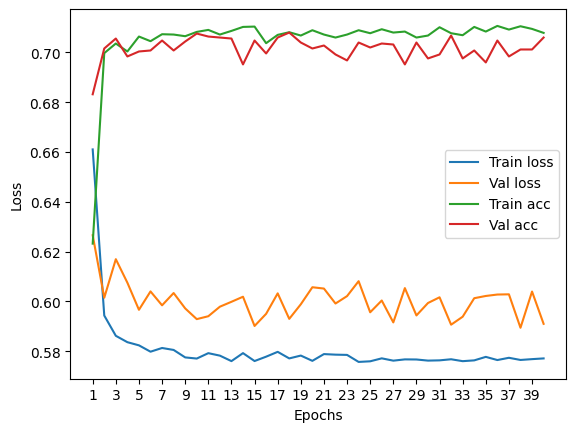

****************************************************************************************************



118it [00:00, 271.12it/s]


Train Epoch: 0 	Loss: 0.657754, Accuracy: 4790/7500 (64%)
Val Epoch: 0 	Loss: 0.613017, Accuracy: 1750/2500 (70%)



118it [00:00, 274.62it/s]


Train Epoch: 1 	Loss: 0.579738, Accuracy: 5300/7500 (71%)
Val Epoch: 1 	Loss: 0.588448, Accuracy: 1729/2500 (69%)



118it [00:00, 271.20it/s]


Train Epoch: 2 	Loss: 0.570093, Accuracy: 5358/7500 (71%)
Val Epoch: 2 	Loss: 0.584318, Accuracy: 1760/2500 (70%)



118it [00:00, 271.33it/s]


Train Epoch: 3 	Loss: 0.568383, Accuracy: 5346/7500 (71%)
Val Epoch: 3 	Loss: 0.598830, Accuracy: 1764/2500 (71%)



118it [00:00, 269.24it/s]


Train Epoch: 4 	Loss: 0.571379, Accuracy: 5339/7500 (71%)
Val Epoch: 4 	Loss: 0.583397, Accuracy: 1770/2500 (71%)



118it [00:00, 247.25it/s]


Train Epoch: 5 	Loss: 0.569760, Accuracy: 5348/7500 (71%)
Val Epoch: 5 	Loss: 0.579839, Accuracy: 1756/2500 (70%)



118it [00:00, 229.80it/s]


Train Epoch: 6 	Loss: 0.567812, Accuracy: 5359/7500 (71%)
Val Epoch: 6 	Loss: 0.588170, Accuracy: 1762/2500 (70%)



118it [00:00, 260.94it/s]


Train Epoch: 7 	Loss: 0.568189, Accuracy: 5372/7500 (72%)
Val Epoch: 7 	Loss: 0.590478, Accuracy: 1759/2500 (70%)



118it [00:00, 246.13it/s]


Train Epoch: 8 	Loss: 0.567914, Accuracy: 5374/7500 (72%)
Val Epoch: 8 	Loss: 0.583213, Accuracy: 1772/2500 (71%)



118it [00:00, 269.63it/s]


Train Epoch: 9 	Loss: 0.568835, Accuracy: 5331/7500 (71%)
Val Epoch: 9 	Loss: 0.578370, Accuracy: 1771/2500 (71%)



118it [00:00, 269.42it/s]


Train Epoch: 10 	Loss: 0.567518, Accuracy: 5357/7500 (71%)
Val Epoch: 10 	Loss: 0.583640, Accuracy: 1774/2500 (71%)



118it [00:00, 265.56it/s]


Train Epoch: 11 	Loss: 0.567352, Accuracy: 5368/7500 (72%)
Val Epoch: 11 	Loss: 0.583532, Accuracy: 1764/2500 (71%)



118it [00:00, 252.53it/s]


Train Epoch: 12 	Loss: 0.568661, Accuracy: 5352/7500 (71%)
Val Epoch: 12 	Loss: 0.577052, Accuracy: 1769/2500 (71%)



118it [00:00, 267.03it/s]


Train Epoch: 13 	Loss: 0.566382, Accuracy: 5367/7500 (72%)
Val Epoch: 13 	Loss: 0.579817, Accuracy: 1778/2500 (71%)



118it [00:00, 272.53it/s]


Train Epoch: 14 	Loss: 0.566340, Accuracy: 5362/7500 (71%)
Val Epoch: 14 	Loss: 0.585597, Accuracy: 1777/2500 (71%)



118it [00:00, 265.85it/s]


Train Epoch: 15 	Loss: 0.565684, Accuracy: 5364/7500 (72%)
Val Epoch: 15 	Loss: 0.582544, Accuracy: 1779/2500 (71%)



118it [00:00, 238.03it/s]


Train Epoch: 16 	Loss: 0.568742, Accuracy: 5374/7500 (72%)
Val Epoch: 16 	Loss: 0.584013, Accuracy: 1768/2500 (71%)



118it [00:00, 268.02it/s]


Train Epoch: 17 	Loss: 0.566289, Accuracy: 5399/7500 (72%)
Val Epoch: 17 	Loss: 0.588012, Accuracy: 1772/2500 (71%)



118it [00:00, 266.25it/s]


Train Epoch: 18 	Loss: 0.565621, Accuracy: 5362/7500 (71%)
Val Epoch: 18 	Loss: 0.584313, Accuracy: 1765/2500 (71%)



118it [00:00, 267.91it/s]


Train Epoch: 19 	Loss: 0.566883, Accuracy: 5367/7500 (72%)
Val Epoch: 19 	Loss: 0.589802, Accuracy: 1770/2500 (71%)



118it [00:00, 263.90it/s]


Train Epoch: 20 	Loss: 0.564212, Accuracy: 5372/7500 (72%)
Val Epoch: 20 	Loss: 0.586813, Accuracy: 1756/2500 (70%)



118it [00:00, 257.67it/s]


Train Epoch: 21 	Loss: 0.564421, Accuracy: 5388/7500 (72%)
Val Epoch: 21 	Loss: 0.586222, Accuracy: 1768/2500 (71%)



118it [00:00, 268.46it/s]


Train Epoch: 22 	Loss: 0.565231, Accuracy: 5400/7500 (72%)
Val Epoch: 22 	Loss: 0.590959, Accuracy: 1750/2500 (70%)



118it [00:00, 263.86it/s]


Train Epoch: 23 	Loss: 0.563896, Accuracy: 5399/7500 (72%)
Val Epoch: 23 	Loss: 0.580479, Accuracy: 1770/2500 (71%)



118it [00:00, 267.88it/s]


Train Epoch: 24 	Loss: 0.564253, Accuracy: 5388/7500 (72%)
Val Epoch: 24 	Loss: 0.581061, Accuracy: 1775/2500 (71%)



118it [00:00, 266.55it/s]


Train Epoch: 25 	Loss: 0.565508, Accuracy: 5366/7500 (72%)
Val Epoch: 25 	Loss: 0.592833, Accuracy: 1775/2500 (71%)



118it [00:00, 270.29it/s]


Train Epoch: 26 	Loss: 0.562923, Accuracy: 5404/7500 (72%)
Val Epoch: 26 	Loss: 0.579683, Accuracy: 1771/2500 (71%)



118it [00:00, 270.05it/s]


Train Epoch: 27 	Loss: 0.564082, Accuracy: 5406/7500 (72%)
Val Epoch: 27 	Loss: 0.574926, Accuracy: 1756/2500 (70%)



118it [00:00, 273.65it/s]


Train Epoch: 28 	Loss: 0.564653, Accuracy: 5387/7500 (72%)
Val Epoch: 28 	Loss: 0.584187, Accuracy: 1772/2500 (71%)



118it [00:00, 262.43it/s]


Train Epoch: 29 	Loss: 0.563867, Accuracy: 5393/7500 (72%)
Val Epoch: 29 	Loss: 0.577406, Accuracy: 1769/2500 (71%)



118it [00:00, 261.61it/s]


Train Epoch: 30 	Loss: 0.565775, Accuracy: 5408/7500 (72%)
Val Epoch: 30 	Loss: 0.586274, Accuracy: 1762/2500 (70%)



118it [00:00, 273.92it/s]


Train Epoch: 31 	Loss: 0.562121, Accuracy: 5405/7500 (72%)
Val Epoch: 31 	Loss: 0.581297, Accuracy: 1764/2500 (71%)



118it [00:00, 267.10it/s]


Train Epoch: 32 	Loss: 0.564824, Accuracy: 5411/7500 (72%)
Val Epoch: 32 	Loss: 0.573622, Accuracy: 1758/2500 (70%)



118it [00:00, 212.39it/s]


Train Epoch: 33 	Loss: 0.562559, Accuracy: 5418/7500 (72%)
Val Epoch: 33 	Loss: 0.582894, Accuracy: 1762/2500 (70%)



118it [00:00, 260.14it/s]


Train Epoch: 34 	Loss: 0.563200, Accuracy: 5380/7500 (72%)
Val Epoch: 34 	Loss: 0.583290, Accuracy: 1783/2500 (71%)



118it [00:00, 252.89it/s]


Train Epoch: 35 	Loss: 0.565258, Accuracy: 5377/7500 (72%)
Val Epoch: 35 	Loss: 0.584698, Accuracy: 1776/2500 (71%)



118it [00:00, 258.62it/s]


Train Epoch: 36 	Loss: 0.564119, Accuracy: 5386/7500 (72%)
Val Epoch: 36 	Loss: 0.580264, Accuracy: 1767/2500 (71%)



118it [00:00, 267.03it/s]


Train Epoch: 37 	Loss: 0.563552, Accuracy: 5399/7500 (72%)
Val Epoch: 37 	Loss: 0.587042, Accuracy: 1773/2500 (71%)



118it [00:00, 268.75it/s]


Train Epoch: 38 	Loss: 0.562304, Accuracy: 5416/7500 (72%)
Val Epoch: 38 	Loss: 0.575641, Accuracy: 1761/2500 (70%)



118it [00:00, 265.67it/s]


Train Epoch: 39 	Loss: 0.562885, Accuracy: 5397/7500 (72%)
Val Epoch: 39 	Loss: 0.579805, Accuracy: 1755/2500 (70%)

Test accuracy:  70.16


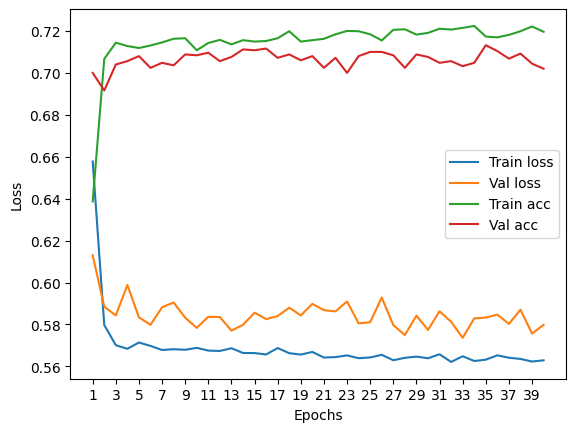

****************************************************************************************************



118it [00:00, 263.77it/s]


Train Epoch: 0 	Loss: 0.673466, Accuracy: 4609/7500 (61%)
Val Epoch: 0 	Loss: 0.624421, Accuracy: 1793/2500 (72%)



118it [00:00, 248.36it/s]


Train Epoch: 1 	Loss: 0.601441, Accuracy: 5215/7500 (70%)
Val Epoch: 1 	Loss: 0.574533, Accuracy: 1804/2500 (72%)



118it [00:00, 277.57it/s]


Train Epoch: 2 	Loss: 0.586635, Accuracy: 5234/7500 (70%)
Val Epoch: 2 	Loss: 0.567555, Accuracy: 1809/2500 (72%)



118it [00:00, 265.57it/s]


Train Epoch: 3 	Loss: 0.583515, Accuracy: 5236/7500 (70%)
Val Epoch: 3 	Loss: 0.569509, Accuracy: 1811/2500 (72%)



118it [00:00, 275.70it/s]


Train Epoch: 4 	Loss: 0.582879, Accuracy: 5248/7500 (70%)
Val Epoch: 4 	Loss: 0.582653, Accuracy: 1821/2500 (73%)



118it [00:00, 274.81it/s]


Train Epoch: 5 	Loss: 0.583581, Accuracy: 5268/7500 (70%)
Val Epoch: 5 	Loss: 0.574987, Accuracy: 1815/2500 (73%)



118it [00:00, 267.01it/s]


Train Epoch: 6 	Loss: 0.582905, Accuracy: 5280/7500 (70%)
Val Epoch: 6 	Loss: 0.560934, Accuracy: 1816/2500 (73%)



118it [00:00, 274.73it/s]


Train Epoch: 7 	Loss: 0.582193, Accuracy: 5288/7500 (71%)
Val Epoch: 7 	Loss: 0.568212, Accuracy: 1809/2500 (72%)



118it [00:00, 265.69it/s]


Train Epoch: 8 	Loss: 0.580945, Accuracy: 5274/7500 (70%)
Val Epoch: 8 	Loss: 0.564516, Accuracy: 1821/2500 (73%)



118it [00:00, 274.13it/s]


Train Epoch: 9 	Loss: 0.582166, Accuracy: 5248/7500 (70%)
Val Epoch: 9 	Loss: 0.565216, Accuracy: 1815/2500 (73%)



118it [00:00, 267.24it/s]


Train Epoch: 10 	Loss: 0.583120, Accuracy: 5242/7500 (70%)
Val Epoch: 10 	Loss: 0.565244, Accuracy: 1826/2500 (73%)



118it [00:00, 274.50it/s]


Train Epoch: 11 	Loss: 0.581902, Accuracy: 5227/7500 (70%)
Val Epoch: 11 	Loss: 0.574264, Accuracy: 1798/2500 (72%)



118it [00:00, 265.52it/s]


Train Epoch: 12 	Loss: 0.582084, Accuracy: 5245/7500 (70%)
Val Epoch: 12 	Loss: 0.577002, Accuracy: 1811/2500 (72%)



118it [00:00, 272.37it/s]


Train Epoch: 13 	Loss: 0.579974, Accuracy: 5245/7500 (70%)
Val Epoch: 13 	Loss: 0.578070, Accuracy: 1800/2500 (72%)



118it [00:00, 272.55it/s]


Train Epoch: 14 	Loss: 0.582049, Accuracy: 5235/7500 (70%)
Val Epoch: 14 	Loss: 0.571467, Accuracy: 1819/2500 (73%)



118it [00:00, 254.07it/s]


Train Epoch: 15 	Loss: 0.580295, Accuracy: 5281/7500 (70%)
Val Epoch: 15 	Loss: 0.564081, Accuracy: 1810/2500 (72%)



118it [00:00, 237.62it/s]


Train Epoch: 16 	Loss: 0.580874, Accuracy: 5251/7500 (70%)
Val Epoch: 16 	Loss: 0.572664, Accuracy: 1803/2500 (72%)



118it [00:00, 261.49it/s]


Train Epoch: 17 	Loss: 0.581115, Accuracy: 5258/7500 (70%)
Val Epoch: 17 	Loss: 0.562092, Accuracy: 1812/2500 (72%)



118it [00:00, 225.09it/s]


Train Epoch: 18 	Loss: 0.581211, Accuracy: 5253/7500 (70%)
Val Epoch: 18 	Loss: 0.571628, Accuracy: 1815/2500 (73%)



118it [00:00, 254.53it/s]


Train Epoch: 19 	Loss: 0.579539, Accuracy: 5279/7500 (70%)
Val Epoch: 19 	Loss: 0.571862, Accuracy: 1816/2500 (73%)



118it [00:00, 238.05it/s]


Train Epoch: 20 	Loss: 0.579132, Accuracy: 5275/7500 (70%)
Val Epoch: 20 	Loss: 0.566531, Accuracy: 1812/2500 (72%)



118it [00:00, 231.33it/s]


Train Epoch: 21 	Loss: 0.579991, Accuracy: 5252/7500 (70%)
Val Epoch: 21 	Loss: 0.564430, Accuracy: 1819/2500 (73%)



118it [00:00, 261.70it/s]


Train Epoch: 22 	Loss: 0.580384, Accuracy: 5271/7500 (70%)
Val Epoch: 22 	Loss: 0.572120, Accuracy: 1810/2500 (72%)



118it [00:00, 268.16it/s]


Train Epoch: 23 	Loss: 0.580871, Accuracy: 5272/7500 (70%)
Val Epoch: 23 	Loss: 0.567743, Accuracy: 1819/2500 (73%)



118it [00:00, 267.21it/s]


Train Epoch: 24 	Loss: 0.579902, Accuracy: 5297/7500 (71%)
Val Epoch: 24 	Loss: 0.569181, Accuracy: 1815/2500 (73%)



118it [00:00, 260.31it/s]


Train Epoch: 25 	Loss: 0.578701, Accuracy: 5249/7500 (70%)
Val Epoch: 25 	Loss: 0.575057, Accuracy: 1813/2500 (73%)



118it [00:00, 260.40it/s]


Train Epoch: 26 	Loss: 0.581767, Accuracy: 5264/7500 (70%)
Val Epoch: 26 	Loss: 0.561759, Accuracy: 1815/2500 (73%)



118it [00:00, 257.44it/s]


Train Epoch: 27 	Loss: 0.580151, Accuracy: 5266/7500 (70%)
Val Epoch: 27 	Loss: 0.568418, Accuracy: 1818/2500 (73%)



118it [00:00, 247.77it/s]


Train Epoch: 28 	Loss: 0.579809, Accuracy: 5250/7500 (70%)
Val Epoch: 28 	Loss: 0.570880, Accuracy: 1820/2500 (73%)



118it [00:00, 263.50it/s]


Train Epoch: 29 	Loss: 0.579349, Accuracy: 5249/7500 (70%)
Val Epoch: 29 	Loss: 0.559227, Accuracy: 1818/2500 (73%)



118it [00:00, 260.27it/s]


Train Epoch: 30 	Loss: 0.580154, Accuracy: 5257/7500 (70%)
Val Epoch: 30 	Loss: 0.567518, Accuracy: 1815/2500 (73%)



118it [00:00, 264.97it/s]


Train Epoch: 31 	Loss: 0.578039, Accuracy: 5284/7500 (70%)
Val Epoch: 31 	Loss: 0.570551, Accuracy: 1814/2500 (73%)



118it [00:00, 261.82it/s]


Train Epoch: 32 	Loss: 0.579166, Accuracy: 5261/7500 (70%)
Val Epoch: 32 	Loss: 0.564820, Accuracy: 1819/2500 (73%)



118it [00:00, 260.58it/s]


Train Epoch: 33 	Loss: 0.580352, Accuracy: 5261/7500 (70%)
Val Epoch: 33 	Loss: 0.575513, Accuracy: 1791/2500 (72%)



118it [00:00, 260.98it/s]


Train Epoch: 34 	Loss: 0.580491, Accuracy: 5284/7500 (70%)
Val Epoch: 34 	Loss: 0.570058, Accuracy: 1814/2500 (73%)



118it [00:00, 248.98it/s]


Train Epoch: 35 	Loss: 0.580749, Accuracy: 5256/7500 (70%)
Val Epoch: 35 	Loss: 0.585052, Accuracy: 1809/2500 (72%)



118it [00:00, 261.76it/s]


Train Epoch: 36 	Loss: 0.579645, Accuracy: 5269/7500 (70%)
Val Epoch: 36 	Loss: 0.565884, Accuracy: 1810/2500 (72%)



118it [00:00, 261.31it/s]


Train Epoch: 37 	Loss: 0.579917, Accuracy: 5263/7500 (70%)
Val Epoch: 37 	Loss: 0.577722, Accuracy: 1813/2500 (73%)



118it [00:00, 262.55it/s]


Train Epoch: 38 	Loss: 0.579056, Accuracy: 5268/7500 (70%)
Val Epoch: 38 	Loss: 0.569661, Accuracy: 1810/2500 (72%)



118it [00:00, 262.38it/s]


Train Epoch: 39 	Loss: 0.580696, Accuracy: 5252/7500 (70%)
Val Epoch: 39 	Loss: 0.559712, Accuracy: 1813/2500 (73%)

Test accuracy:  69.08


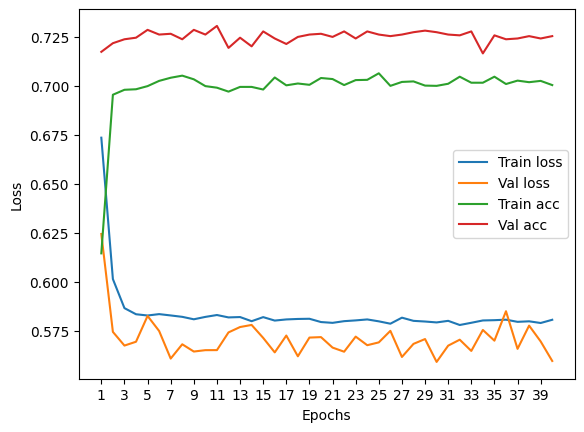

****************************************************************************************************



118it [00:00, 226.32it/s]


Train Epoch: 0 	Loss: 0.649124, Accuracy: 4709/7500 (63%)
Val Epoch: 0 	Loss: 0.605914, Accuracy: 1765/2500 (71%)



118it [00:00, 255.31it/s]


Train Epoch: 1 	Loss: 0.584156, Accuracy: 5240/7500 (70%)
Val Epoch: 1 	Loss: 0.609347, Accuracy: 1766/2500 (71%)



118it [00:00, 258.17it/s]


Train Epoch: 2 	Loss: 0.578003, Accuracy: 5268/7500 (70%)
Val Epoch: 2 	Loss: 0.586927, Accuracy: 1766/2500 (71%)



118it [00:00, 255.56it/s]


Train Epoch: 3 	Loss: 0.579358, Accuracy: 5278/7500 (70%)
Val Epoch: 3 	Loss: 0.589179, Accuracy: 1770/2500 (71%)



118it [00:00, 255.24it/s]


Train Epoch: 4 	Loss: 0.575943, Accuracy: 5273/7500 (70%)
Val Epoch: 4 	Loss: 0.604974, Accuracy: 1773/2500 (71%)



118it [00:00, 259.04it/s]


Train Epoch: 5 	Loss: 0.574977, Accuracy: 5274/7500 (70%)
Val Epoch: 5 	Loss: 0.591658, Accuracy: 1767/2500 (71%)



118it [00:00, 260.72it/s]


Train Epoch: 6 	Loss: 0.574159, Accuracy: 5310/7500 (71%)
Val Epoch: 6 	Loss: 0.592924, Accuracy: 1762/2500 (70%)



118it [00:00, 252.13it/s]


Train Epoch: 7 	Loss: 0.576409, Accuracy: 5301/7500 (71%)
Val Epoch: 7 	Loss: 0.593987, Accuracy: 1774/2500 (71%)



118it [00:00, 265.25it/s]


Train Epoch: 8 	Loss: 0.574163, Accuracy: 5292/7500 (71%)
Val Epoch: 8 	Loss: 0.586511, Accuracy: 1758/2500 (70%)



118it [00:00, 261.07it/s]


Train Epoch: 9 	Loss: 0.572961, Accuracy: 5288/7500 (71%)
Val Epoch: 9 	Loss: 0.586761, Accuracy: 1764/2500 (71%)



118it [00:00, 254.34it/s]


Train Epoch: 10 	Loss: 0.573994, Accuracy: 5295/7500 (71%)
Val Epoch: 10 	Loss: 0.585270, Accuracy: 1765/2500 (71%)



118it [00:00, 263.29it/s]


Train Epoch: 11 	Loss: 0.576198, Accuracy: 5278/7500 (70%)
Val Epoch: 11 	Loss: 0.591216, Accuracy: 1770/2500 (71%)



118it [00:00, 220.10it/s]


Train Epoch: 12 	Loss: 0.574368, Accuracy: 5292/7500 (71%)
Val Epoch: 12 	Loss: 0.590873, Accuracy: 1766/2500 (71%)



118it [00:00, 265.12it/s]


Train Epoch: 13 	Loss: 0.573969, Accuracy: 5288/7500 (71%)
Val Epoch: 13 	Loss: 0.596299, Accuracy: 1768/2500 (71%)



118it [00:00, 261.46it/s]


Train Epoch: 14 	Loss: 0.572291, Accuracy: 5281/7500 (70%)
Val Epoch: 14 	Loss: 0.596780, Accuracy: 1768/2500 (71%)



118it [00:00, 263.40it/s]


Train Epoch: 15 	Loss: 0.573203, Accuracy: 5289/7500 (71%)
Val Epoch: 15 	Loss: 0.594258, Accuracy: 1780/2500 (71%)



118it [00:00, 259.23it/s]


Train Epoch: 16 	Loss: 0.576392, Accuracy: 5277/7500 (70%)
Val Epoch: 16 	Loss: 0.590193, Accuracy: 1761/2500 (70%)



118it [00:00, 260.14it/s]


Train Epoch: 17 	Loss: 0.572862, Accuracy: 5298/7500 (71%)
Val Epoch: 17 	Loss: 0.590682, Accuracy: 1764/2500 (71%)



118it [00:00, 265.78it/s]


Train Epoch: 18 	Loss: 0.573727, Accuracy: 5299/7500 (71%)
Val Epoch: 18 	Loss: 0.606160, Accuracy: 1770/2500 (71%)



118it [00:00, 262.51it/s]


Train Epoch: 19 	Loss: 0.572176, Accuracy: 5294/7500 (71%)
Val Epoch: 19 	Loss: 0.591411, Accuracy: 1772/2500 (71%)



118it [00:00, 255.03it/s]


Train Epoch: 20 	Loss: 0.574130, Accuracy: 5292/7500 (71%)
Val Epoch: 20 	Loss: 0.595849, Accuracy: 1755/2500 (70%)



118it [00:00, 258.69it/s]


Train Epoch: 21 	Loss: 0.573332, Accuracy: 5293/7500 (71%)
Val Epoch: 21 	Loss: 0.593437, Accuracy: 1770/2500 (71%)



118it [00:00, 262.08it/s]


Train Epoch: 22 	Loss: 0.573877, Accuracy: 5276/7500 (70%)
Val Epoch: 22 	Loss: 0.594815, Accuracy: 1752/2500 (70%)



118it [00:00, 259.73it/s]


Train Epoch: 23 	Loss: 0.573764, Accuracy: 5306/7500 (71%)
Val Epoch: 23 	Loss: 0.590516, Accuracy: 1762/2500 (70%)



118it [00:00, 234.10it/s]


Train Epoch: 24 	Loss: 0.574208, Accuracy: 5303/7500 (71%)
Val Epoch: 24 	Loss: 0.594339, Accuracy: 1778/2500 (71%)



118it [00:00, 215.29it/s]


Train Epoch: 25 	Loss: 0.574149, Accuracy: 5280/7500 (70%)
Val Epoch: 25 	Loss: 0.589766, Accuracy: 1766/2500 (71%)



118it [00:00, 231.84it/s]


Train Epoch: 26 	Loss: 0.572887, Accuracy: 5309/7500 (71%)
Val Epoch: 26 	Loss: 0.586351, Accuracy: 1762/2500 (70%)



118it [00:00, 229.20it/s]


Train Epoch: 27 	Loss: 0.574105, Accuracy: 5291/7500 (71%)
Val Epoch: 27 	Loss: 0.605341, Accuracy: 1760/2500 (70%)



118it [00:00, 254.12it/s]


Train Epoch: 28 	Loss: 0.575216, Accuracy: 5298/7500 (71%)
Val Epoch: 28 	Loss: 0.591480, Accuracy: 1757/2500 (70%)



118it [00:00, 260.29it/s]


Train Epoch: 29 	Loss: 0.571862, Accuracy: 5301/7500 (71%)
Val Epoch: 29 	Loss: 0.591820, Accuracy: 1754/2500 (70%)



118it [00:00, 258.93it/s]


Train Epoch: 30 	Loss: 0.573383, Accuracy: 5277/7500 (70%)
Val Epoch: 30 	Loss: 0.586196, Accuracy: 1762/2500 (70%)



118it [00:00, 255.67it/s]


Train Epoch: 31 	Loss: 0.574809, Accuracy: 5305/7500 (71%)
Val Epoch: 31 	Loss: 0.589551, Accuracy: 1758/2500 (70%)



118it [00:00, 261.02it/s]


Train Epoch: 32 	Loss: 0.571323, Accuracy: 5306/7500 (71%)
Val Epoch: 32 	Loss: 0.593322, Accuracy: 1750/2500 (70%)



118it [00:00, 252.55it/s]


Train Epoch: 33 	Loss: 0.572066, Accuracy: 5310/7500 (71%)
Val Epoch: 33 	Loss: 0.598456, Accuracy: 1771/2500 (71%)



118it [00:00, 261.14it/s]


Train Epoch: 34 	Loss: 0.573041, Accuracy: 5276/7500 (70%)
Val Epoch: 34 	Loss: 0.590332, Accuracy: 1768/2500 (71%)



118it [00:00, 260.15it/s]


Train Epoch: 35 	Loss: 0.572758, Accuracy: 5322/7500 (71%)
Val Epoch: 35 	Loss: 0.609845, Accuracy: 1759/2500 (70%)



118it [00:00, 257.11it/s]


Train Epoch: 36 	Loss: 0.572281, Accuracy: 5305/7500 (71%)
Val Epoch: 36 	Loss: 0.599501, Accuracy: 1747/2500 (70%)



118it [00:00, 259.11it/s]


Train Epoch: 37 	Loss: 0.573004, Accuracy: 5299/7500 (71%)
Val Epoch: 37 	Loss: 0.596555, Accuracy: 1759/2500 (70%)



118it [00:00, 260.99it/s]


Train Epoch: 38 	Loss: 0.571976, Accuracy: 5277/7500 (70%)
Val Epoch: 38 	Loss: 0.594165, Accuracy: 1762/2500 (70%)



118it [00:00, 259.03it/s]


Train Epoch: 39 	Loss: 0.570377, Accuracy: 5297/7500 (71%)
Val Epoch: 39 	Loss: 0.599054, Accuracy: 1765/2500 (71%)

Test accuracy:  70.72


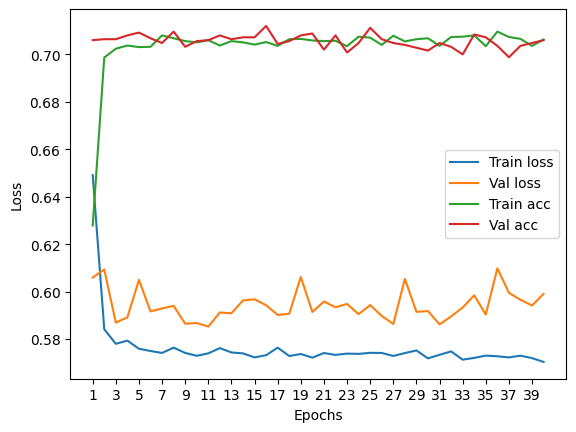

****************************************************************************************************



118it [00:00, 271.91it/s]


Train Epoch: 0 	Loss: 0.661268, Accuracy: 4752/7500 (63%)
Val Epoch: 0 	Loss: 0.620250, Accuracy: 1731/2500 (69%)



118it [00:00, 268.78it/s]


Train Epoch: 1 	Loss: 0.596594, Accuracy: 5175/7500 (69%)
Val Epoch: 1 	Loss: 0.597697, Accuracy: 1749/2500 (70%)



118it [00:00, 270.49it/s]


Train Epoch: 2 	Loss: 0.591592, Accuracy: 5224/7500 (70%)
Val Epoch: 2 	Loss: 0.596517, Accuracy: 1750/2500 (70%)



118it [00:00, 270.13it/s]


Train Epoch: 3 	Loss: 0.590456, Accuracy: 5204/7500 (69%)
Val Epoch: 3 	Loss: 0.584473, Accuracy: 1721/2500 (69%)



118it [00:00, 266.26it/s]


Train Epoch: 4 	Loss: 0.591515, Accuracy: 5213/7500 (70%)
Val Epoch: 4 	Loss: 0.593456, Accuracy: 1756/2500 (70%)



118it [00:00, 265.27it/s]


Train Epoch: 5 	Loss: 0.589624, Accuracy: 5217/7500 (70%)
Val Epoch: 5 	Loss: 0.584318, Accuracy: 1748/2500 (70%)



118it [00:00, 210.32it/s]


Train Epoch: 6 	Loss: 0.588782, Accuracy: 5230/7500 (70%)
Val Epoch: 6 	Loss: 0.587580, Accuracy: 1737/2500 (69%)



118it [00:00, 237.83it/s]


Train Epoch: 7 	Loss: 0.589225, Accuracy: 5229/7500 (70%)
Val Epoch: 7 	Loss: 0.586751, Accuracy: 1751/2500 (70%)



118it [00:00, 223.60it/s]


Train Epoch: 8 	Loss: 0.591018, Accuracy: 5238/7500 (70%)
Val Epoch: 8 	Loss: 0.597259, Accuracy: 1756/2500 (70%)



118it [00:00, 253.56it/s]


Train Epoch: 9 	Loss: 0.588716, Accuracy: 5211/7500 (69%)
Val Epoch: 9 	Loss: 0.584800, Accuracy: 1767/2500 (71%)



118it [00:00, 253.79it/s]


Train Epoch: 10 	Loss: 0.588787, Accuracy: 5215/7500 (70%)
Val Epoch: 10 	Loss: 0.587568, Accuracy: 1728/2500 (69%)



118it [00:00, 260.10it/s]


Train Epoch: 11 	Loss: 0.589796, Accuracy: 5217/7500 (70%)
Val Epoch: 11 	Loss: 0.585446, Accuracy: 1754/2500 (70%)



118it [00:00, 251.62it/s]


Train Epoch: 12 	Loss: 0.587751, Accuracy: 5249/7500 (70%)
Val Epoch: 12 	Loss: 0.590428, Accuracy: 1755/2500 (70%)



118it [00:00, 253.97it/s]


Train Epoch: 13 	Loss: 0.588899, Accuracy: 5232/7500 (70%)
Val Epoch: 13 	Loss: 0.584467, Accuracy: 1768/2500 (71%)



118it [00:00, 259.11it/s]


Train Epoch: 14 	Loss: 0.590030, Accuracy: 5241/7500 (70%)
Val Epoch: 14 	Loss: 0.590432, Accuracy: 1749/2500 (70%)



118it [00:00, 258.87it/s]


Train Epoch: 15 	Loss: 0.587828, Accuracy: 5215/7500 (70%)
Val Epoch: 15 	Loss: 0.595348, Accuracy: 1731/2500 (69%)



118it [00:00, 260.44it/s]


Train Epoch: 16 	Loss: 0.590955, Accuracy: 5221/7500 (70%)
Val Epoch: 16 	Loss: 0.590236, Accuracy: 1735/2500 (69%)



118it [00:00, 257.45it/s]


Train Epoch: 17 	Loss: 0.589065, Accuracy: 5224/7500 (70%)
Val Epoch: 17 	Loss: 0.589064, Accuracy: 1758/2500 (70%)



118it [00:00, 259.60it/s]


Train Epoch: 18 	Loss: 0.589694, Accuracy: 5188/7500 (69%)
Val Epoch: 18 	Loss: 0.589309, Accuracy: 1720/2500 (69%)



118it [00:00, 254.21it/s]


Train Epoch: 19 	Loss: 0.587171, Accuracy: 5217/7500 (70%)
Val Epoch: 19 	Loss: 0.586572, Accuracy: 1755/2500 (70%)



118it [00:00, 263.67it/s]


Train Epoch: 20 	Loss: 0.586567, Accuracy: 5227/7500 (70%)
Val Epoch: 20 	Loss: 0.590325, Accuracy: 1724/2500 (69%)



118it [00:00, 257.94it/s]


Train Epoch: 21 	Loss: 0.589428, Accuracy: 5227/7500 (70%)
Val Epoch: 21 	Loss: 0.590880, Accuracy: 1721/2500 (69%)



118it [00:00, 261.81it/s]


Train Epoch: 22 	Loss: 0.587625, Accuracy: 5235/7500 (70%)
Val Epoch: 22 	Loss: 0.601793, Accuracy: 1766/2500 (71%)



118it [00:00, 261.67it/s]


Train Epoch: 23 	Loss: 0.588555, Accuracy: 5231/7500 (70%)
Val Epoch: 23 	Loss: 0.583779, Accuracy: 1735/2500 (69%)



118it [00:00, 265.86it/s]


Train Epoch: 24 	Loss: 0.587012, Accuracy: 5241/7500 (70%)
Val Epoch: 24 	Loss: 0.591046, Accuracy: 1748/2500 (70%)



118it [00:00, 255.47it/s]


Train Epoch: 25 	Loss: 0.588332, Accuracy: 5213/7500 (70%)
Val Epoch: 25 	Loss: 0.588932, Accuracy: 1754/2500 (70%)



118it [00:00, 263.97it/s]


Train Epoch: 26 	Loss: 0.587793, Accuracy: 5238/7500 (70%)
Val Epoch: 26 	Loss: 0.585584, Accuracy: 1759/2500 (70%)



118it [00:00, 257.75it/s]


Train Epoch: 27 	Loss: 0.587218, Accuracy: 5247/7500 (70%)
Val Epoch: 27 	Loss: 0.588555, Accuracy: 1763/2500 (71%)



118it [00:00, 251.37it/s]


Train Epoch: 28 	Loss: 0.584976, Accuracy: 5236/7500 (70%)
Val Epoch: 28 	Loss: 0.584474, Accuracy: 1754/2500 (70%)



118it [00:00, 268.85it/s]


Train Epoch: 29 	Loss: 0.584090, Accuracy: 5228/7500 (70%)
Val Epoch: 29 	Loss: 0.586927, Accuracy: 1762/2500 (70%)



118it [00:00, 264.03it/s]


Train Epoch: 30 	Loss: 0.584698, Accuracy: 5227/7500 (70%)
Val Epoch: 30 	Loss: 0.594097, Accuracy: 1731/2500 (69%)



118it [00:00, 263.23it/s]


Train Epoch: 31 	Loss: 0.585250, Accuracy: 5249/7500 (70%)
Val Epoch: 31 	Loss: 0.584504, Accuracy: 1762/2500 (70%)



118it [00:00, 229.35it/s]


Train Epoch: 32 	Loss: 0.584293, Accuracy: 5258/7500 (70%)
Val Epoch: 32 	Loss: 0.584569, Accuracy: 1763/2500 (71%)



118it [00:00, 203.89it/s]


Train Epoch: 33 	Loss: 0.583727, Accuracy: 5234/7500 (70%)
Val Epoch: 33 	Loss: 0.586328, Accuracy: 1754/2500 (70%)



118it [00:00, 241.43it/s]


Train Epoch: 34 	Loss: 0.583108, Accuracy: 5257/7500 (70%)
Val Epoch: 34 	Loss: 0.584789, Accuracy: 1757/2500 (70%)



118it [00:00, 187.98it/s]


Train Epoch: 35 	Loss: 0.583311, Accuracy: 5252/7500 (70%)
Val Epoch: 35 	Loss: 0.584972, Accuracy: 1758/2500 (70%)



118it [00:00, 258.62it/s]


Train Epoch: 36 	Loss: 0.585483, Accuracy: 5269/7500 (70%)
Val Epoch: 36 	Loss: 0.578694, Accuracy: 1750/2500 (70%)



118it [00:00, 255.42it/s]


Train Epoch: 37 	Loss: 0.583281, Accuracy: 5237/7500 (70%)
Val Epoch: 37 	Loss: 0.575578, Accuracy: 1761/2500 (70%)



118it [00:00, 245.88it/s]


Train Epoch: 38 	Loss: 0.585178, Accuracy: 5284/7500 (70%)
Val Epoch: 38 	Loss: 0.591080, Accuracy: 1750/2500 (70%)



118it [00:00, 260.00it/s]


Train Epoch: 39 	Loss: 0.583883, Accuracy: 5237/7500 (70%)
Val Epoch: 39 	Loss: 0.584564, Accuracy: 1765/2500 (71%)

Test accuracy:  70.84


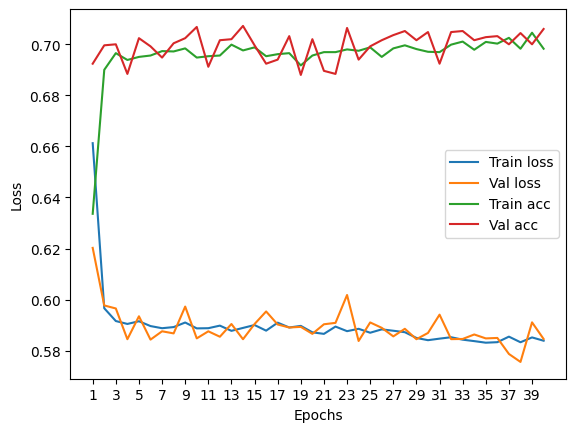

****************************************************************************************************



118it [00:00, 263.29it/s]


Train Epoch: 0 	Loss: 0.660333, Accuracy: 4685/7500 (62%)
Val Epoch: 0 	Loss: 0.619385, Accuracy: 1743/2500 (70%)



118it [00:00, 264.33it/s]


Train Epoch: 1 	Loss: 0.592892, Accuracy: 5223/7500 (70%)
Val Epoch: 1 	Loss: 0.596889, Accuracy: 1752/2500 (70%)



118it [00:00, 258.93it/s]


Train Epoch: 2 	Loss: 0.585454, Accuracy: 5261/7500 (70%)
Val Epoch: 2 	Loss: 0.587609, Accuracy: 1754/2500 (70%)



118it [00:00, 256.83it/s]


Train Epoch: 3 	Loss: 0.583418, Accuracy: 5267/7500 (70%)
Val Epoch: 3 	Loss: 0.589423, Accuracy: 1748/2500 (70%)



118it [00:00, 260.10it/s]


Train Epoch: 4 	Loss: 0.582723, Accuracy: 5265/7500 (70%)
Val Epoch: 4 	Loss: 0.583765, Accuracy: 1751/2500 (70%)



118it [00:00, 260.34it/s]


Train Epoch: 5 	Loss: 0.583300, Accuracy: 5251/7500 (70%)
Val Epoch: 5 	Loss: 0.592467, Accuracy: 1758/2500 (70%)



118it [00:00, 256.84it/s]


Train Epoch: 6 	Loss: 0.585055, Accuracy: 5268/7500 (70%)
Val Epoch: 6 	Loss: 0.584125, Accuracy: 1757/2500 (70%)



118it [00:00, 259.79it/s]


Train Epoch: 7 	Loss: 0.583626, Accuracy: 5270/7500 (70%)
Val Epoch: 7 	Loss: 0.592060, Accuracy: 1764/2500 (71%)



118it [00:00, 256.65it/s]


Train Epoch: 8 	Loss: 0.580638, Accuracy: 5263/7500 (70%)
Val Epoch: 8 	Loss: 0.589187, Accuracy: 1752/2500 (70%)



118it [00:00, 260.09it/s]


Train Epoch: 9 	Loss: 0.580071, Accuracy: 5277/7500 (70%)
Val Epoch: 9 	Loss: 0.587397, Accuracy: 1746/2500 (70%)



118it [00:00, 256.99it/s]


Train Epoch: 10 	Loss: 0.579610, Accuracy: 5271/7500 (70%)
Val Epoch: 10 	Loss: 0.589027, Accuracy: 1742/2500 (70%)



118it [00:00, 254.19it/s]


Train Epoch: 11 	Loss: 0.579487, Accuracy: 5302/7500 (71%)
Val Epoch: 11 	Loss: 0.583864, Accuracy: 1753/2500 (70%)



118it [00:00, 256.24it/s]


Train Epoch: 12 	Loss: 0.581319, Accuracy: 5257/7500 (70%)
Val Epoch: 12 	Loss: 0.600561, Accuracy: 1747/2500 (70%)



118it [00:00, 259.50it/s]


Train Epoch: 13 	Loss: 0.581389, Accuracy: 5301/7500 (71%)
Val Epoch: 13 	Loss: 0.584711, Accuracy: 1745/2500 (70%)



118it [00:00, 198.98it/s]


Train Epoch: 14 	Loss: 0.579924, Accuracy: 5276/7500 (70%)
Val Epoch: 14 	Loss: 0.585690, Accuracy: 1759/2500 (70%)



118it [00:00, 232.11it/s]


Train Epoch: 15 	Loss: 0.580584, Accuracy: 5277/7500 (70%)
Val Epoch: 15 	Loss: 0.587868, Accuracy: 1747/2500 (70%)



118it [00:00, 218.22it/s]


Train Epoch: 16 	Loss: 0.580647, Accuracy: 5294/7500 (71%)
Val Epoch: 16 	Loss: 0.597256, Accuracy: 1744/2500 (70%)



118it [00:00, 244.62it/s]


Train Epoch: 17 	Loss: 0.578025, Accuracy: 5317/7500 (71%)
Val Epoch: 17 	Loss: 0.593063, Accuracy: 1753/2500 (70%)



118it [00:00, 257.10it/s]


Train Epoch: 18 	Loss: 0.581106, Accuracy: 5294/7500 (71%)
Val Epoch: 18 	Loss: 0.586802, Accuracy: 1738/2500 (70%)



118it [00:00, 259.00it/s]


Train Epoch: 19 	Loss: 0.578952, Accuracy: 5274/7500 (70%)
Val Epoch: 19 	Loss: 0.605893, Accuracy: 1738/2500 (70%)



118it [00:00, 261.40it/s]


Train Epoch: 20 	Loss: 0.583118, Accuracy: 5300/7500 (71%)
Val Epoch: 20 	Loss: 0.591234, Accuracy: 1743/2500 (70%)



118it [00:00, 258.50it/s]


Train Epoch: 21 	Loss: 0.580678, Accuracy: 5290/7500 (71%)
Val Epoch: 21 	Loss: 0.591322, Accuracy: 1745/2500 (70%)



118it [00:00, 259.16it/s]


Train Epoch: 22 	Loss: 0.577973, Accuracy: 5321/7500 (71%)
Val Epoch: 22 	Loss: 0.581706, Accuracy: 1756/2500 (70%)



118it [00:00, 256.71it/s]


Train Epoch: 23 	Loss: 0.579132, Accuracy: 5282/7500 (70%)
Val Epoch: 23 	Loss: 0.594335, Accuracy: 1748/2500 (70%)



118it [00:00, 257.96it/s]


Train Epoch: 24 	Loss: 0.578538, Accuracy: 5272/7500 (70%)
Val Epoch: 24 	Loss: 0.597384, Accuracy: 1735/2500 (69%)



118it [00:00, 261.49it/s]


Train Epoch: 25 	Loss: 0.578830, Accuracy: 5291/7500 (71%)
Val Epoch: 25 	Loss: 0.582640, Accuracy: 1744/2500 (70%)



118it [00:00, 251.92it/s]


Train Epoch: 26 	Loss: 0.579610, Accuracy: 5314/7500 (71%)
Val Epoch: 26 	Loss: 0.594417, Accuracy: 1738/2500 (70%)



118it [00:00, 256.91it/s]


Train Epoch: 27 	Loss: 0.581275, Accuracy: 5275/7500 (70%)
Val Epoch: 27 	Loss: 0.596487, Accuracy: 1745/2500 (70%)



118it [00:00, 260.07it/s]


Train Epoch: 28 	Loss: 0.579294, Accuracy: 5284/7500 (70%)
Val Epoch: 28 	Loss: 0.589051, Accuracy: 1746/2500 (70%)



118it [00:00, 258.71it/s]


Train Epoch: 29 	Loss: 0.577308, Accuracy: 5305/7500 (71%)
Val Epoch: 29 	Loss: 0.595589, Accuracy: 1741/2500 (70%)



118it [00:00, 258.43it/s]


Train Epoch: 30 	Loss: 0.579007, Accuracy: 5287/7500 (70%)
Val Epoch: 30 	Loss: 0.586819, Accuracy: 1752/2500 (70%)



118it [00:00, 257.18it/s]


Train Epoch: 31 	Loss: 0.578456, Accuracy: 5290/7500 (71%)
Val Epoch: 31 	Loss: 0.588835, Accuracy: 1745/2500 (70%)



118it [00:00, 250.21it/s]


Train Epoch: 32 	Loss: 0.580032, Accuracy: 5278/7500 (70%)
Val Epoch: 32 	Loss: 0.597297, Accuracy: 1741/2500 (70%)



118it [00:00, 260.15it/s]


Train Epoch: 33 	Loss: 0.578218, Accuracy: 5308/7500 (71%)
Val Epoch: 33 	Loss: 0.594232, Accuracy: 1750/2500 (70%)



118it [00:00, 260.35it/s]


Train Epoch: 34 	Loss: 0.581155, Accuracy: 5306/7500 (71%)
Val Epoch: 34 	Loss: 0.581477, Accuracy: 1747/2500 (70%)



118it [00:00, 255.27it/s]


Train Epoch: 35 	Loss: 0.579664, Accuracy: 5287/7500 (70%)
Val Epoch: 35 	Loss: 0.588090, Accuracy: 1749/2500 (70%)



118it [00:00, 255.90it/s]


Train Epoch: 36 	Loss: 0.578353, Accuracy: 5318/7500 (71%)
Val Epoch: 36 	Loss: 0.590490, Accuracy: 1750/2500 (70%)



118it [00:00, 254.03it/s]


Train Epoch: 37 	Loss: 0.579835, Accuracy: 5288/7500 (71%)
Val Epoch: 37 	Loss: 0.599523, Accuracy: 1750/2500 (70%)



118it [00:00, 258.80it/s]


Train Epoch: 38 	Loss: 0.578672, Accuracy: 5307/7500 (71%)
Val Epoch: 38 	Loss: 0.591547, Accuracy: 1744/2500 (70%)



118it [00:00, 254.56it/s]


Train Epoch: 39 	Loss: 0.578129, Accuracy: 5287/7500 (70%)
Val Epoch: 39 	Loss: 0.593792, Accuracy: 1744/2500 (70%)

Test accuracy:  70.96000000000001


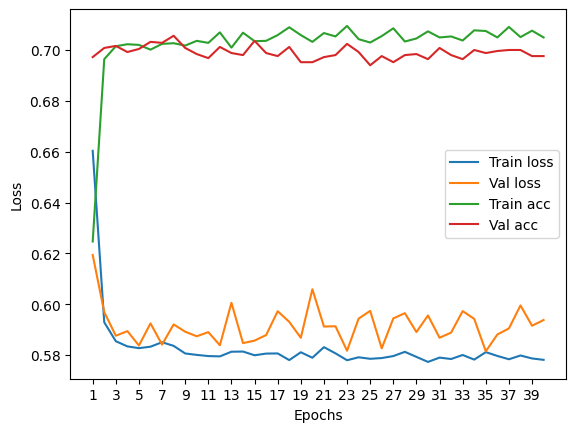

****************************************************************************************************



116it [00:00, 259.02it/s]


Train Epoch: 0 	Loss: 0.646524, Accuracy: 4722/7422 (64%)
Val Epoch: 0 	Loss: 0.607110, Accuracy: 1696/2474 (69%)



116it [00:00, 254.22it/s]


Train Epoch: 1 	Loss: 0.586829, Accuracy: 5177/7422 (70%)
Val Epoch: 1 	Loss: 0.590586, Accuracy: 1702/2474 (69%)



116it [00:00, 257.19it/s]


Train Epoch: 2 	Loss: 0.581651, Accuracy: 5194/7422 (70%)
Val Epoch: 2 	Loss: 0.586469, Accuracy: 1724/2474 (70%)



116it [00:00, 251.90it/s]


Train Epoch: 3 	Loss: 0.580342, Accuracy: 5216/7422 (70%)
Val Epoch: 3 	Loss: 0.595751, Accuracy: 1717/2474 (69%)



116it [00:00, 254.11it/s]


Train Epoch: 4 	Loss: 0.577600, Accuracy: 5206/7422 (70%)
Val Epoch: 4 	Loss: 0.587634, Accuracy: 1695/2474 (69%)



116it [00:00, 250.59it/s]


Train Epoch: 5 	Loss: 0.576780, Accuracy: 5230/7422 (70%)
Val Epoch: 5 	Loss: 0.588484, Accuracy: 1708/2474 (69%)



116it [00:00, 259.73it/s]


Train Epoch: 6 	Loss: 0.575303, Accuracy: 5226/7422 (70%)
Val Epoch: 6 	Loss: 0.587847, Accuracy: 1696/2474 (69%)



116it [00:00, 247.91it/s]


Train Epoch: 7 	Loss: 0.575709, Accuracy: 5243/7422 (71%)
Val Epoch: 7 	Loss: 0.587459, Accuracy: 1704/2474 (69%)



116it [00:00, 246.55it/s]


Train Epoch: 8 	Loss: 0.575908, Accuracy: 5217/7422 (70%)
Val Epoch: 8 	Loss: 0.589628, Accuracy: 1706/2474 (69%)



116it [00:00, 257.13it/s]


Train Epoch: 9 	Loss: 0.575375, Accuracy: 5231/7422 (70%)
Val Epoch: 9 	Loss: 0.585204, Accuracy: 1709/2474 (69%)



116it [00:00, 252.82it/s]


Train Epoch: 10 	Loss: 0.577009, Accuracy: 5215/7422 (70%)
Val Epoch: 10 	Loss: 0.597786, Accuracy: 1697/2474 (69%)



116it [00:00, 258.73it/s]


Train Epoch: 11 	Loss: 0.575465, Accuracy: 5222/7422 (70%)
Val Epoch: 11 	Loss: 0.586034, Accuracy: 1700/2474 (69%)



116it [00:00, 256.16it/s]


Train Epoch: 12 	Loss: 0.575341, Accuracy: 5223/7422 (70%)
Val Epoch: 12 	Loss: 0.588679, Accuracy: 1700/2474 (69%)



116it [00:00, 254.86it/s]


Train Epoch: 13 	Loss: 0.573657, Accuracy: 5252/7422 (71%)
Val Epoch: 13 	Loss: 0.588028, Accuracy: 1712/2474 (69%)



116it [00:00, 249.76it/s]


Train Epoch: 14 	Loss: 0.575450, Accuracy: 5241/7422 (71%)
Val Epoch: 14 	Loss: 0.586841, Accuracy: 1702/2474 (69%)



116it [00:00, 254.77it/s]


Train Epoch: 15 	Loss: 0.575850, Accuracy: 5233/7422 (71%)
Val Epoch: 15 	Loss: 0.587097, Accuracy: 1703/2474 (69%)



116it [00:00, 255.66it/s]


Train Epoch: 16 	Loss: 0.575200, Accuracy: 5222/7422 (70%)
Val Epoch: 16 	Loss: 0.587235, Accuracy: 1696/2474 (69%)



116it [00:00, 255.34it/s]


Train Epoch: 17 	Loss: 0.575298, Accuracy: 5238/7422 (71%)
Val Epoch: 17 	Loss: 0.589270, Accuracy: 1712/2474 (69%)



116it [00:00, 250.73it/s]


Train Epoch: 18 	Loss: 0.576574, Accuracy: 5201/7422 (70%)
Val Epoch: 18 	Loss: 0.587093, Accuracy: 1697/2474 (69%)



116it [00:00, 257.14it/s]


Train Epoch: 19 	Loss: 0.577029, Accuracy: 5224/7422 (70%)
Val Epoch: 19 	Loss: 0.585899, Accuracy: 1702/2474 (69%)



116it [00:00, 248.95it/s]


Train Epoch: 20 	Loss: 0.574784, Accuracy: 5228/7422 (70%)
Val Epoch: 20 	Loss: 0.586058, Accuracy: 1707/2474 (69%)



116it [00:00, 254.23it/s]


Train Epoch: 21 	Loss: 0.574508, Accuracy: 5224/7422 (70%)
Val Epoch: 21 	Loss: 0.590530, Accuracy: 1694/2474 (68%)



116it [00:00, 191.86it/s]


Train Epoch: 22 	Loss: 0.576575, Accuracy: 5233/7422 (71%)
Val Epoch: 22 	Loss: 0.586663, Accuracy: 1705/2474 (69%)



116it [00:00, 215.59it/s]


Train Epoch: 23 	Loss: 0.576233, Accuracy: 5226/7422 (70%)
Val Epoch: 23 	Loss: 0.595898, Accuracy: 1706/2474 (69%)



116it [00:00, 227.92it/s]


Train Epoch: 24 	Loss: 0.574627, Accuracy: 5264/7422 (71%)
Val Epoch: 24 	Loss: 0.587785, Accuracy: 1699/2474 (69%)



116it [00:00, 234.35it/s]


Train Epoch: 25 	Loss: 0.574425, Accuracy: 5237/7422 (71%)
Val Epoch: 25 	Loss: 0.591357, Accuracy: 1700/2474 (69%)



116it [00:00, 253.87it/s]


Train Epoch: 26 	Loss: 0.575815, Accuracy: 5237/7422 (71%)
Val Epoch: 26 	Loss: 0.588245, Accuracy: 1691/2474 (68%)



116it [00:00, 254.36it/s]


Train Epoch: 27 	Loss: 0.574327, Accuracy: 5222/7422 (70%)
Val Epoch: 27 	Loss: 0.588251, Accuracy: 1709/2474 (69%)



116it [00:00, 252.00it/s]


Train Epoch: 28 	Loss: 0.575019, Accuracy: 5227/7422 (70%)
Val Epoch: 28 	Loss: 0.586167, Accuracy: 1703/2474 (69%)



116it [00:00, 254.10it/s]


Train Epoch: 29 	Loss: 0.573689, Accuracy: 5230/7422 (70%)
Val Epoch: 29 	Loss: 0.587409, Accuracy: 1701/2474 (69%)



116it [00:00, 240.33it/s]


Train Epoch: 30 	Loss: 0.574270, Accuracy: 5253/7422 (71%)
Val Epoch: 30 	Loss: 0.591544, Accuracy: 1690/2474 (68%)



116it [00:00, 257.11it/s]


Train Epoch: 31 	Loss: 0.575746, Accuracy: 5226/7422 (70%)
Val Epoch: 31 	Loss: 0.586660, Accuracy: 1707/2474 (69%)



116it [00:00, 255.62it/s]


Train Epoch: 32 	Loss: 0.575817, Accuracy: 5215/7422 (70%)
Val Epoch: 32 	Loss: 0.593042, Accuracy: 1702/2474 (69%)



116it [00:00, 258.87it/s]


Train Epoch: 33 	Loss: 0.576273, Accuracy: 5217/7422 (70%)
Val Epoch: 33 	Loss: 0.587894, Accuracy: 1704/2474 (69%)



116it [00:00, 254.24it/s]


Train Epoch: 34 	Loss: 0.575031, Accuracy: 5237/7422 (71%)
Val Epoch: 34 	Loss: 0.588175, Accuracy: 1705/2474 (69%)



116it [00:00, 255.30it/s]


Train Epoch: 35 	Loss: 0.573541, Accuracy: 5264/7422 (71%)
Val Epoch: 35 	Loss: 0.590673, Accuracy: 1693/2474 (68%)



116it [00:00, 252.43it/s]


Train Epoch: 36 	Loss: 0.574312, Accuracy: 5226/7422 (70%)
Val Epoch: 36 	Loss: 0.590040, Accuracy: 1698/2474 (69%)



116it [00:00, 205.84it/s]


Train Epoch: 37 	Loss: 0.575143, Accuracy: 5232/7422 (70%)
Val Epoch: 37 	Loss: 0.588426, Accuracy: 1704/2474 (69%)



116it [00:00, 215.90it/s]


Train Epoch: 38 	Loss: 0.574238, Accuracy: 5248/7422 (71%)
Val Epoch: 38 	Loss: 0.588004, Accuracy: 1690/2474 (68%)



116it [00:00, 211.64it/s]


Train Epoch: 39 	Loss: 0.574188, Accuracy: 5230/7422 (70%)
Val Epoch: 39 	Loss: 0.597455, Accuracy: 1709/2474 (69%)

Test accuracy:  70.25060630557802


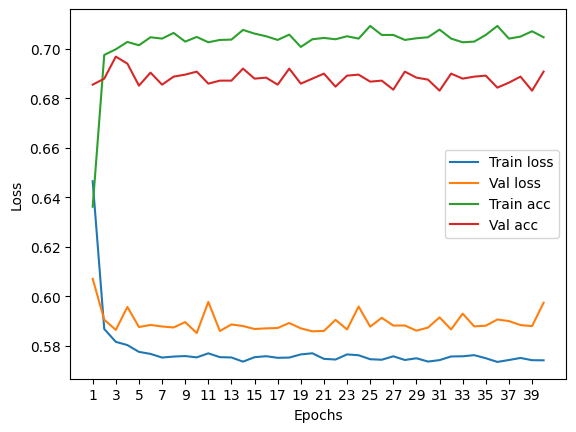

****************************************************************************************************



Particles per jet: 2


118it [00:00, 225.30it/s]


Train Epoch: 0 	Loss: 0.670978, Accuracy: 4481/7500 (60%)
Val Epoch: 0 	Loss: 0.625244, Accuracy: 1727/2500 (69%)



118it [00:00, 183.60it/s]


Train Epoch: 1 	Loss: 0.577092, Accuracy: 5351/7500 (71%)
Val Epoch: 1 	Loss: 0.563226, Accuracy: 1833/2500 (73%)



118it [00:00, 199.11it/s]


Train Epoch: 2 	Loss: 0.557867, Accuracy: 5418/7500 (72%)
Val Epoch: 2 	Loss: 0.566538, Accuracy: 1825/2500 (73%)



118it [00:00, 188.20it/s]


Train Epoch: 3 	Loss: 0.557701, Accuracy: 5393/7500 (72%)
Val Epoch: 3 	Loss: 0.554657, Accuracy: 1853/2500 (74%)



118it [00:00, 243.35it/s]


Train Epoch: 4 	Loss: 0.554530, Accuracy: 5432/7500 (72%)
Val Epoch: 4 	Loss: 0.565841, Accuracy: 1820/2500 (73%)



118it [00:00, 248.33it/s]


Train Epoch: 5 	Loss: 0.557333, Accuracy: 5414/7500 (72%)
Val Epoch: 5 	Loss: 0.556381, Accuracy: 1845/2500 (74%)



118it [00:00, 246.42it/s]


Train Epoch: 6 	Loss: 0.555976, Accuracy: 5442/7500 (73%)
Val Epoch: 6 	Loss: 0.542965, Accuracy: 1858/2500 (74%)



118it [00:00, 242.80it/s]


Train Epoch: 7 	Loss: 0.555756, Accuracy: 5446/7500 (73%)
Val Epoch: 7 	Loss: 0.546034, Accuracy: 1858/2500 (74%)



118it [00:00, 242.22it/s]


Train Epoch: 8 	Loss: 0.556146, Accuracy: 5414/7500 (72%)
Val Epoch: 8 	Loss: 0.572639, Accuracy: 1820/2500 (73%)



118it [00:00, 245.50it/s]


Train Epoch: 9 	Loss: 0.553534, Accuracy: 5463/7500 (73%)
Val Epoch: 9 	Loss: 0.561228, Accuracy: 1833/2500 (73%)



118it [00:00, 242.43it/s]


Train Epoch: 10 	Loss: 0.553435, Accuracy: 5432/7500 (72%)
Val Epoch: 10 	Loss: 0.542709, Accuracy: 1841/2500 (74%)



118it [00:00, 246.84it/s]


Train Epoch: 11 	Loss: 0.553456, Accuracy: 5432/7500 (72%)
Val Epoch: 11 	Loss: 0.548860, Accuracy: 1842/2500 (74%)



118it [00:00, 246.20it/s]


Train Epoch: 12 	Loss: 0.553449, Accuracy: 5417/7500 (72%)
Val Epoch: 12 	Loss: 0.559141, Accuracy: 1841/2500 (74%)



118it [00:00, 241.82it/s]


Train Epoch: 13 	Loss: 0.554058, Accuracy: 5440/7500 (73%)
Val Epoch: 13 	Loss: 0.548198, Accuracy: 1845/2500 (74%)



118it [00:00, 247.54it/s]


Train Epoch: 14 	Loss: 0.554359, Accuracy: 5425/7500 (72%)
Val Epoch: 14 	Loss: 0.554345, Accuracy: 1834/2500 (73%)



118it [00:00, 246.68it/s]


Train Epoch: 15 	Loss: 0.553207, Accuracy: 5430/7500 (72%)
Val Epoch: 15 	Loss: 0.553483, Accuracy: 1842/2500 (74%)



118it [00:00, 246.85it/s]


Train Epoch: 16 	Loss: 0.550006, Accuracy: 5464/7500 (73%)
Val Epoch: 16 	Loss: 0.548277, Accuracy: 1858/2500 (74%)



118it [00:00, 239.47it/s]


Train Epoch: 17 	Loss: 0.552023, Accuracy: 5469/7500 (73%)
Val Epoch: 17 	Loss: 0.565838, Accuracy: 1834/2500 (73%)



118it [00:00, 249.26it/s]


Train Epoch: 18 	Loss: 0.553547, Accuracy: 5458/7500 (73%)
Val Epoch: 18 	Loss: 0.544774, Accuracy: 1858/2500 (74%)



118it [00:00, 248.00it/s]


Train Epoch: 19 	Loss: 0.552824, Accuracy: 5463/7500 (73%)
Val Epoch: 19 	Loss: 0.545421, Accuracy: 1866/2500 (75%)



118it [00:00, 240.81it/s]


Train Epoch: 20 	Loss: 0.551043, Accuracy: 5458/7500 (73%)
Val Epoch: 20 	Loss: 0.546852, Accuracy: 1842/2500 (74%)



118it [00:00, 243.27it/s]


Train Epoch: 21 	Loss: 0.550202, Accuracy: 5452/7500 (73%)
Val Epoch: 21 	Loss: 0.550485, Accuracy: 1851/2500 (74%)



118it [00:00, 244.68it/s]


Train Epoch: 22 	Loss: 0.553516, Accuracy: 5438/7500 (73%)
Val Epoch: 22 	Loss: 0.547453, Accuracy: 1851/2500 (74%)



118it [00:00, 230.70it/s]


Train Epoch: 23 	Loss: 0.551412, Accuracy: 5446/7500 (73%)
Val Epoch: 23 	Loss: 0.555596, Accuracy: 1854/2500 (74%)



118it [00:00, 188.37it/s]


Train Epoch: 24 	Loss: 0.550507, Accuracy: 5438/7500 (73%)
Val Epoch: 24 	Loss: 0.564364, Accuracy: 1819/2500 (73%)



118it [00:00, 234.87it/s]


Train Epoch: 25 	Loss: 0.551788, Accuracy: 5453/7500 (73%)
Val Epoch: 25 	Loss: 0.557143, Accuracy: 1835/2500 (73%)



118it [00:00, 199.48it/s]


Train Epoch: 26 	Loss: 0.550683, Accuracy: 5434/7500 (72%)
Val Epoch: 26 	Loss: 0.554817, Accuracy: 1850/2500 (74%)



118it [00:00, 227.38it/s]


Train Epoch: 27 	Loss: 0.549533, Accuracy: 5462/7500 (73%)
Val Epoch: 27 	Loss: 0.554976, Accuracy: 1850/2500 (74%)



118it [00:00, 248.42it/s]


Train Epoch: 28 	Loss: 0.551520, Accuracy: 5437/7500 (72%)
Val Epoch: 28 	Loss: 0.553103, Accuracy: 1839/2500 (74%)



118it [00:00, 239.63it/s]


Train Epoch: 29 	Loss: 0.550515, Accuracy: 5457/7500 (73%)
Val Epoch: 29 	Loss: 0.546034, Accuracy: 1851/2500 (74%)



118it [00:00, 248.50it/s]


Train Epoch: 30 	Loss: 0.549904, Accuracy: 5447/7500 (73%)
Val Epoch: 30 	Loss: 0.565156, Accuracy: 1842/2500 (74%)



118it [00:00, 239.89it/s]


Train Epoch: 31 	Loss: 0.548614, Accuracy: 5467/7500 (73%)
Val Epoch: 31 	Loss: 0.548135, Accuracy: 1859/2500 (74%)



118it [00:00, 213.87it/s]


Train Epoch: 32 	Loss: 0.551465, Accuracy: 5437/7500 (72%)
Val Epoch: 32 	Loss: 0.551580, Accuracy: 1847/2500 (74%)



118it [00:00, 221.88it/s]


Train Epoch: 33 	Loss: 0.551260, Accuracy: 5432/7500 (72%)
Val Epoch: 33 	Loss: 0.553651, Accuracy: 1846/2500 (74%)



118it [00:00, 244.24it/s]


Train Epoch: 34 	Loss: 0.552112, Accuracy: 5430/7500 (72%)
Val Epoch: 34 	Loss: 0.557226, Accuracy: 1849/2500 (74%)



118it [00:00, 243.25it/s]


Train Epoch: 35 	Loss: 0.550027, Accuracy: 5452/7500 (73%)
Val Epoch: 35 	Loss: 0.553346, Accuracy: 1848/2500 (74%)



118it [00:00, 245.65it/s]


Train Epoch: 36 	Loss: 0.551196, Accuracy: 5452/7500 (73%)
Val Epoch: 36 	Loss: 0.544073, Accuracy: 1849/2500 (74%)



118it [00:00, 244.66it/s]


Train Epoch: 37 	Loss: 0.549890, Accuracy: 5443/7500 (73%)
Val Epoch: 37 	Loss: 0.553963, Accuracy: 1852/2500 (74%)



118it [00:00, 247.40it/s]


Train Epoch: 38 	Loss: 0.550067, Accuracy: 5491/7500 (73%)
Val Epoch: 38 	Loss: 0.557948, Accuracy: 1859/2500 (74%)



118it [00:00, 242.38it/s]


Train Epoch: 39 	Loss: 0.550524, Accuracy: 5445/7500 (73%)
Val Epoch: 39 	Loss: 0.558815, Accuracy: 1850/2500 (74%)

Test accuracy:  73.11999999999999


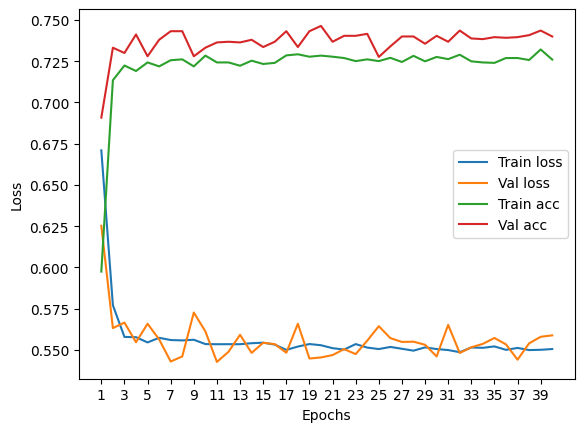

****************************************************************************************************



118it [00:00, 200.15it/s]


Train Epoch: 0 	Loss: 0.662106, Accuracy: 4721/7500 (63%)
Val Epoch: 0 	Loss: 0.622293, Accuracy: 1751/2500 (70%)



118it [00:00, 207.76it/s]


Train Epoch: 1 	Loss: 0.580815, Accuracy: 5333/7500 (71%)
Val Epoch: 1 	Loss: 0.582553, Accuracy: 1778/2500 (71%)



118it [00:00, 209.27it/s]


Train Epoch: 2 	Loss: 0.560696, Accuracy: 5422/7500 (72%)
Val Epoch: 2 	Loss: 0.570317, Accuracy: 1791/2500 (72%)



118it [00:00, 234.73it/s]


Train Epoch: 3 	Loss: 0.562843, Accuracy: 5422/7500 (72%)
Val Epoch: 3 	Loss: 0.568317, Accuracy: 1821/2500 (73%)



118it [00:00, 241.95it/s]


Train Epoch: 4 	Loss: 0.561210, Accuracy: 5440/7500 (73%)
Val Epoch: 4 	Loss: 0.576681, Accuracy: 1791/2500 (72%)



118it [00:00, 244.92it/s]


Train Epoch: 5 	Loss: 0.558132, Accuracy: 5443/7500 (73%)
Val Epoch: 5 	Loss: 0.571460, Accuracy: 1821/2500 (73%)



118it [00:00, 246.78it/s]


Train Epoch: 6 	Loss: 0.557419, Accuracy: 5432/7500 (72%)
Val Epoch: 6 	Loss: 0.563990, Accuracy: 1818/2500 (73%)



118it [00:00, 246.24it/s]


Train Epoch: 7 	Loss: 0.556477, Accuracy: 5444/7500 (73%)
Val Epoch: 7 	Loss: 0.580089, Accuracy: 1808/2500 (72%)



118it [00:00, 248.58it/s]


Train Epoch: 8 	Loss: 0.556117, Accuracy: 5458/7500 (73%)
Val Epoch: 8 	Loss: 0.573420, Accuracy: 1819/2500 (73%)



118it [00:00, 247.46it/s]


Train Epoch: 9 	Loss: 0.557741, Accuracy: 5430/7500 (72%)
Val Epoch: 9 	Loss: 0.568347, Accuracy: 1818/2500 (73%)



118it [00:00, 245.87it/s]


Train Epoch: 10 	Loss: 0.558713, Accuracy: 5442/7500 (73%)
Val Epoch: 10 	Loss: 0.587466, Accuracy: 1818/2500 (73%)



118it [00:00, 242.84it/s]


Train Epoch: 11 	Loss: 0.559595, Accuracy: 5424/7500 (72%)
Val Epoch: 11 	Loss: 0.559841, Accuracy: 1824/2500 (73%)



118it [00:00, 243.63it/s]


Train Epoch: 12 	Loss: 0.555957, Accuracy: 5460/7500 (73%)
Val Epoch: 12 	Loss: 0.577956, Accuracy: 1813/2500 (73%)



118it [00:00, 245.04it/s]


Train Epoch: 13 	Loss: 0.556122, Accuracy: 5436/7500 (72%)
Val Epoch: 13 	Loss: 0.572977, Accuracy: 1830/2500 (73%)



118it [00:00, 246.56it/s]


Train Epoch: 14 	Loss: 0.554879, Accuracy: 5481/7500 (73%)
Val Epoch: 14 	Loss: 0.567974, Accuracy: 1823/2500 (73%)



118it [00:00, 243.75it/s]


Train Epoch: 15 	Loss: 0.557393, Accuracy: 5478/7500 (73%)
Val Epoch: 15 	Loss: 0.565565, Accuracy: 1816/2500 (73%)



118it [00:00, 248.48it/s]


Train Epoch: 16 	Loss: 0.556640, Accuracy: 5471/7500 (73%)
Val Epoch: 16 	Loss: 0.567415, Accuracy: 1798/2500 (72%)



118it [00:00, 242.39it/s]


Train Epoch: 17 	Loss: 0.558834, Accuracy: 5393/7500 (72%)
Val Epoch: 17 	Loss: 0.568617, Accuracy: 1815/2500 (73%)



118it [00:00, 232.46it/s]


Train Epoch: 18 	Loss: 0.554820, Accuracy: 5455/7500 (73%)
Val Epoch: 18 	Loss: 0.578945, Accuracy: 1821/2500 (73%)



118it [00:00, 230.67it/s]


Train Epoch: 19 	Loss: 0.557276, Accuracy: 5447/7500 (73%)
Val Epoch: 19 	Loss: 0.567066, Accuracy: 1821/2500 (73%)



118it [00:00, 244.21it/s]


Train Epoch: 20 	Loss: 0.554862, Accuracy: 5470/7500 (73%)
Val Epoch: 20 	Loss: 0.574908, Accuracy: 1818/2500 (73%)



118it [00:00, 245.77it/s]


Train Epoch: 21 	Loss: 0.556143, Accuracy: 5444/7500 (73%)
Val Epoch: 21 	Loss: 0.561440, Accuracy: 1823/2500 (73%)



118it [00:00, 238.77it/s]


Train Epoch: 22 	Loss: 0.557199, Accuracy: 5454/7500 (73%)
Val Epoch: 22 	Loss: 0.571864, Accuracy: 1818/2500 (73%)



118it [00:00, 219.91it/s]


Train Epoch: 23 	Loss: 0.554367, Accuracy: 5455/7500 (73%)
Val Epoch: 23 	Loss: 0.564864, Accuracy: 1825/2500 (73%)



118it [00:00, 209.00it/s]


Train Epoch: 24 	Loss: 0.554765, Accuracy: 5446/7500 (73%)
Val Epoch: 24 	Loss: 0.570599, Accuracy: 1817/2500 (73%)



118it [00:00, 168.07it/s]


Train Epoch: 25 	Loss: 0.554514, Accuracy: 5469/7500 (73%)
Val Epoch: 25 	Loss: 0.561526, Accuracy: 1814/2500 (73%)



118it [00:00, 176.49it/s]


Train Epoch: 26 	Loss: 0.555956, Accuracy: 5438/7500 (73%)
Val Epoch: 26 	Loss: 0.565141, Accuracy: 1828/2500 (73%)



118it [00:00, 172.85it/s]


Train Epoch: 27 	Loss: 0.556252, Accuracy: 5453/7500 (73%)
Val Epoch: 27 	Loss: 0.562195, Accuracy: 1812/2500 (72%)



118it [00:00, 218.15it/s]


Train Epoch: 28 	Loss: 0.555349, Accuracy: 5442/7500 (73%)
Val Epoch: 28 	Loss: 0.577876, Accuracy: 1801/2500 (72%)



118it [00:00, 229.09it/s]


Train Epoch: 29 	Loss: 0.555462, Accuracy: 5461/7500 (73%)
Val Epoch: 29 	Loss: 0.562213, Accuracy: 1820/2500 (73%)



118it [00:00, 247.02it/s]


Train Epoch: 30 	Loss: 0.556559, Accuracy: 5463/7500 (73%)
Val Epoch: 30 	Loss: 0.574768, Accuracy: 1816/2500 (73%)



118it [00:00, 243.25it/s]


Train Epoch: 31 	Loss: 0.555788, Accuracy: 5446/7500 (73%)
Val Epoch: 31 	Loss: 0.586463, Accuracy: 1825/2500 (73%)



118it [00:00, 211.58it/s]


Train Epoch: 32 	Loss: 0.556102, Accuracy: 5449/7500 (73%)
Val Epoch: 32 	Loss: 0.574028, Accuracy: 1790/2500 (72%)



118it [00:00, 241.41it/s]


Train Epoch: 33 	Loss: 0.557098, Accuracy: 5468/7500 (73%)
Val Epoch: 33 	Loss: 0.564545, Accuracy: 1819/2500 (73%)



118it [00:00, 241.14it/s]


Train Epoch: 34 	Loss: 0.558338, Accuracy: 5484/7500 (73%)
Val Epoch: 34 	Loss: 0.561923, Accuracy: 1813/2500 (73%)



118it [00:00, 241.79it/s]


Train Epoch: 35 	Loss: 0.555162, Accuracy: 5468/7500 (73%)
Val Epoch: 35 	Loss: 0.576983, Accuracy: 1806/2500 (72%)



118it [00:00, 244.98it/s]


Train Epoch: 36 	Loss: 0.555244, Accuracy: 5461/7500 (73%)
Val Epoch: 36 	Loss: 0.570136, Accuracy: 1809/2500 (72%)



118it [00:00, 244.16it/s]


Train Epoch: 37 	Loss: 0.555191, Accuracy: 5436/7500 (72%)
Val Epoch: 37 	Loss: 0.577094, Accuracy: 1805/2500 (72%)



118it [00:00, 244.20it/s]


Train Epoch: 38 	Loss: 0.555891, Accuracy: 5470/7500 (73%)
Val Epoch: 38 	Loss: 0.568456, Accuracy: 1811/2500 (72%)



118it [00:00, 244.92it/s]


Train Epoch: 39 	Loss: 0.554272, Accuracy: 5478/7500 (73%)
Val Epoch: 39 	Loss: 0.582744, Accuracy: 1822/2500 (73%)

Test accuracy:  72.52


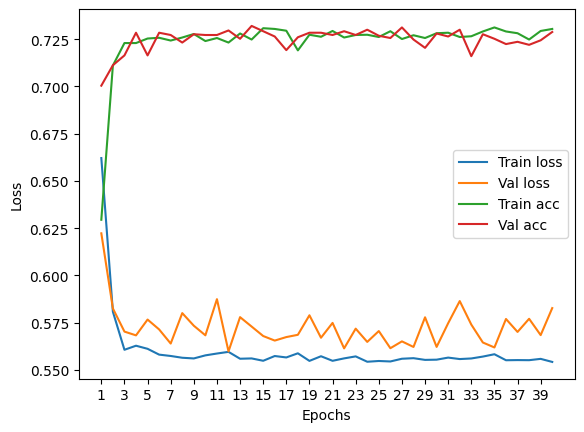

****************************************************************************************************



118it [00:00, 246.66it/s]


Train Epoch: 0 	Loss: 0.672438, Accuracy: 4622/7500 (62%)
Val Epoch: 0 	Loss: 0.636427, Accuracy: 1753/2500 (70%)



118it [00:00, 178.23it/s]


Train Epoch: 1 	Loss: 0.579921, Accuracy: 5395/7500 (72%)
Val Epoch: 1 	Loss: 0.552946, Accuracy: 1828/2500 (73%)



118it [00:00, 210.86it/s]


Train Epoch: 2 	Loss: 0.556141, Accuracy: 5419/7500 (72%)
Val Epoch: 2 	Loss: 0.548689, Accuracy: 1832/2500 (73%)



118it [00:00, 194.22it/s]


Train Epoch: 3 	Loss: 0.550293, Accuracy: 5417/7500 (72%)
Val Epoch: 3 	Loss: 0.558170, Accuracy: 1845/2500 (74%)



118it [00:00, 228.61it/s]


Train Epoch: 4 	Loss: 0.551045, Accuracy: 5442/7500 (73%)
Val Epoch: 4 	Loss: 0.566770, Accuracy: 1813/2500 (73%)



118it [00:00, 253.28it/s]


Train Epoch: 5 	Loss: 0.550646, Accuracy: 5445/7500 (73%)
Val Epoch: 5 	Loss: 0.555827, Accuracy: 1826/2500 (73%)



118it [00:00, 236.35it/s]


Train Epoch: 6 	Loss: 0.547867, Accuracy: 5453/7500 (73%)
Val Epoch: 6 	Loss: 0.557311, Accuracy: 1819/2500 (73%)



118it [00:00, 241.97it/s]


Train Epoch: 7 	Loss: 0.548512, Accuracy: 5456/7500 (73%)
Val Epoch: 7 	Loss: 0.554360, Accuracy: 1824/2500 (73%)



118it [00:00, 243.62it/s]


Train Epoch: 8 	Loss: 0.548503, Accuracy: 5436/7500 (72%)
Val Epoch: 8 	Loss: 0.557685, Accuracy: 1848/2500 (74%)



118it [00:00, 240.10it/s]


Train Epoch: 9 	Loss: 0.549566, Accuracy: 5447/7500 (73%)
Val Epoch: 9 	Loss: 0.544427, Accuracy: 1836/2500 (73%)



118it [00:00, 245.02it/s]


Train Epoch: 10 	Loss: 0.548144, Accuracy: 5468/7500 (73%)
Val Epoch: 10 	Loss: 0.554453, Accuracy: 1848/2500 (74%)



118it [00:00, 241.64it/s]


Train Epoch: 11 	Loss: 0.549161, Accuracy: 5443/7500 (73%)
Val Epoch: 11 	Loss: 0.549204, Accuracy: 1823/2500 (73%)



118it [00:00, 234.95it/s]


Train Epoch: 12 	Loss: 0.549598, Accuracy: 5486/7500 (73%)
Val Epoch: 12 	Loss: 0.546283, Accuracy: 1825/2500 (73%)



118it [00:00, 239.55it/s]


Train Epoch: 13 	Loss: 0.549809, Accuracy: 5457/7500 (73%)
Val Epoch: 13 	Loss: 0.551013, Accuracy: 1808/2500 (72%)



118it [00:00, 240.79it/s]


Train Epoch: 14 	Loss: 0.549769, Accuracy: 5478/7500 (73%)
Val Epoch: 14 	Loss: 0.545427, Accuracy: 1833/2500 (73%)



118it [00:00, 238.17it/s]


Train Epoch: 15 	Loss: 0.548295, Accuracy: 5443/7500 (73%)
Val Epoch: 15 	Loss: 0.557052, Accuracy: 1813/2500 (73%)



118it [00:00, 243.42it/s]


Train Epoch: 16 	Loss: 0.550468, Accuracy: 5471/7500 (73%)
Val Epoch: 16 	Loss: 0.550410, Accuracy: 1826/2500 (73%)



118it [00:00, 240.78it/s]


Train Epoch: 17 	Loss: 0.547851, Accuracy: 5468/7500 (73%)
Val Epoch: 17 	Loss: 0.559786, Accuracy: 1809/2500 (72%)



118it [00:00, 242.52it/s]


Train Epoch: 18 	Loss: 0.547689, Accuracy: 5452/7500 (73%)
Val Epoch: 18 	Loss: 0.547557, Accuracy: 1828/2500 (73%)



118it [00:00, 242.98it/s]


Train Epoch: 19 	Loss: 0.547540, Accuracy: 5426/7500 (72%)
Val Epoch: 19 	Loss: 0.551862, Accuracy: 1832/2500 (73%)



118it [00:00, 238.58it/s]


Train Epoch: 20 	Loss: 0.546106, Accuracy: 5480/7500 (73%)
Val Epoch: 20 	Loss: 0.556795, Accuracy: 1835/2500 (73%)



118it [00:00, 244.01it/s]


Train Epoch: 21 	Loss: 0.548641, Accuracy: 5462/7500 (73%)
Val Epoch: 21 	Loss: 0.552165, Accuracy: 1834/2500 (73%)



118it [00:00, 241.05it/s]


Train Epoch: 22 	Loss: 0.548668, Accuracy: 5453/7500 (73%)
Val Epoch: 22 	Loss: 0.549351, Accuracy: 1834/2500 (73%)



118it [00:00, 241.60it/s]


Train Epoch: 23 	Loss: 0.547431, Accuracy: 5457/7500 (73%)
Val Epoch: 23 	Loss: 0.542617, Accuracy: 1835/2500 (73%)



118it [00:00, 241.58it/s]


Train Epoch: 24 	Loss: 0.545259, Accuracy: 5467/7500 (73%)
Val Epoch: 24 	Loss: 0.544342, Accuracy: 1835/2500 (73%)



118it [00:00, 219.69it/s]


Train Epoch: 25 	Loss: 0.547240, Accuracy: 5456/7500 (73%)
Val Epoch: 25 	Loss: 0.556691, Accuracy: 1828/2500 (73%)



118it [00:00, 177.61it/s]


Train Epoch: 26 	Loss: 0.547739, Accuracy: 5467/7500 (73%)
Val Epoch: 26 	Loss: 0.542361, Accuracy: 1843/2500 (74%)



118it [00:00, 221.95it/s]


Train Epoch: 27 	Loss: 0.547197, Accuracy: 5463/7500 (73%)
Val Epoch: 27 	Loss: 0.545981, Accuracy: 1837/2500 (73%)



118it [00:00, 212.29it/s]


Train Epoch: 28 	Loss: 0.545612, Accuracy: 5466/7500 (73%)
Val Epoch: 28 	Loss: 0.550026, Accuracy: 1833/2500 (73%)



118it [00:00, 244.12it/s]


Train Epoch: 29 	Loss: 0.547775, Accuracy: 5469/7500 (73%)
Val Epoch: 29 	Loss: 0.546980, Accuracy: 1841/2500 (74%)



118it [00:00, 241.19it/s]


Train Epoch: 30 	Loss: 0.546755, Accuracy: 5456/7500 (73%)
Val Epoch: 30 	Loss: 0.539117, Accuracy: 1831/2500 (73%)



118it [00:00, 239.16it/s]


Train Epoch: 31 	Loss: 0.548781, Accuracy: 5450/7500 (73%)
Val Epoch: 31 	Loss: 0.576684, Accuracy: 1808/2500 (72%)



118it [00:00, 245.00it/s]


Train Epoch: 32 	Loss: 0.546914, Accuracy: 5456/7500 (73%)
Val Epoch: 32 	Loss: 0.544601, Accuracy: 1824/2500 (73%)



118it [00:00, 244.94it/s]


Train Epoch: 33 	Loss: 0.546777, Accuracy: 5453/7500 (73%)
Val Epoch: 33 	Loss: 0.548523, Accuracy: 1806/2500 (72%)



118it [00:00, 241.86it/s]


Train Epoch: 34 	Loss: 0.548158, Accuracy: 5460/7500 (73%)
Val Epoch: 34 	Loss: 0.549575, Accuracy: 1821/2500 (73%)



118it [00:00, 242.94it/s]


Train Epoch: 35 	Loss: 0.546601, Accuracy: 5457/7500 (73%)
Val Epoch: 35 	Loss: 0.563242, Accuracy: 1823/2500 (73%)



118it [00:00, 237.05it/s]


Train Epoch: 36 	Loss: 0.546449, Accuracy: 5443/7500 (73%)
Val Epoch: 36 	Loss: 0.549010, Accuracy: 1843/2500 (74%)



118it [00:00, 240.36it/s]


Train Epoch: 37 	Loss: 0.546565, Accuracy: 5449/7500 (73%)
Val Epoch: 37 	Loss: 0.559567, Accuracy: 1804/2500 (72%)



118it [00:00, 237.58it/s]


Train Epoch: 38 	Loss: 0.547269, Accuracy: 5468/7500 (73%)
Val Epoch: 38 	Loss: 0.566297, Accuracy: 1809/2500 (72%)



118it [00:00, 242.28it/s]


Train Epoch: 39 	Loss: 0.545002, Accuracy: 5464/7500 (73%)
Val Epoch: 39 	Loss: 0.542458, Accuracy: 1832/2500 (73%)

Test accuracy:  71.8


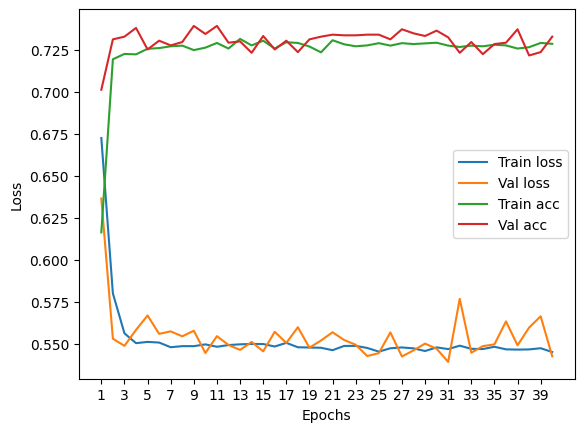

****************************************************************************************************



118it [00:00, 239.62it/s]


Train Epoch: 0 	Loss: 0.672739, Accuracy: 4621/7500 (62%)
Val Epoch: 0 	Loss: 0.638558, Accuracy: 1740/2500 (70%)



118it [00:00, 224.70it/s]


Train Epoch: 1 	Loss: 0.579154, Accuracy: 5398/7500 (72%)
Val Epoch: 1 	Loss: 0.581549, Accuracy: 1794/2500 (72%)



118it [00:00, 178.06it/s]


Train Epoch: 2 	Loss: 0.559282, Accuracy: 5410/7500 (72%)
Val Epoch: 2 	Loss: 0.580513, Accuracy: 1807/2500 (72%)



118it [00:00, 208.99it/s]


Train Epoch: 3 	Loss: 0.554207, Accuracy: 5443/7500 (73%)
Val Epoch: 3 	Loss: 0.590163, Accuracy: 1777/2500 (71%)



118it [00:00, 207.05it/s]


Train Epoch: 4 	Loss: 0.554726, Accuracy: 5409/7500 (72%)
Val Epoch: 4 	Loss: 0.577947, Accuracy: 1812/2500 (72%)



118it [00:00, 245.75it/s]


Train Epoch: 5 	Loss: 0.553782, Accuracy: 5429/7500 (72%)
Val Epoch: 5 	Loss: 0.578951, Accuracy: 1802/2500 (72%)



118it [00:00, 241.30it/s]


Train Epoch: 6 	Loss: 0.552827, Accuracy: 5465/7500 (73%)
Val Epoch: 6 	Loss: 0.572045, Accuracy: 1806/2500 (72%)



118it [00:00, 241.67it/s]


Train Epoch: 7 	Loss: 0.553651, Accuracy: 5449/7500 (73%)
Val Epoch: 7 	Loss: 0.602167, Accuracy: 1749/2500 (70%)



118it [00:00, 240.35it/s]


Train Epoch: 8 	Loss: 0.551500, Accuracy: 5445/7500 (73%)
Val Epoch: 8 	Loss: 0.575052, Accuracy: 1792/2500 (72%)



118it [00:00, 240.11it/s]


Train Epoch: 9 	Loss: 0.551896, Accuracy: 5459/7500 (73%)
Val Epoch: 9 	Loss: 0.577191, Accuracy: 1807/2500 (72%)



118it [00:00, 244.76it/s]


Train Epoch: 10 	Loss: 0.550663, Accuracy: 5466/7500 (73%)
Val Epoch: 10 	Loss: 0.567777, Accuracy: 1797/2500 (72%)



118it [00:00, 247.71it/s]


Train Epoch: 11 	Loss: 0.551694, Accuracy: 5468/7500 (73%)
Val Epoch: 11 	Loss: 0.580513, Accuracy: 1807/2500 (72%)



118it [00:00, 237.83it/s]


Train Epoch: 12 	Loss: 0.549532, Accuracy: 5466/7500 (73%)
Val Epoch: 12 	Loss: 0.569388, Accuracy: 1810/2500 (72%)



118it [00:00, 214.11it/s]


Train Epoch: 13 	Loss: 0.550050, Accuracy: 5477/7500 (73%)
Val Epoch: 13 	Loss: 0.580157, Accuracy: 1806/2500 (72%)



118it [00:00, 240.16it/s]


Train Epoch: 14 	Loss: 0.552446, Accuracy: 5465/7500 (73%)
Val Epoch: 14 	Loss: 0.590427, Accuracy: 1785/2500 (71%)



118it [00:00, 239.91it/s]


Train Epoch: 15 	Loss: 0.549826, Accuracy: 5489/7500 (73%)
Val Epoch: 15 	Loss: 0.576653, Accuracy: 1811/2500 (72%)



118it [00:00, 243.29it/s]


Train Epoch: 16 	Loss: 0.551502, Accuracy: 5452/7500 (73%)
Val Epoch: 16 	Loss: 0.587173, Accuracy: 1804/2500 (72%)



118it [00:00, 245.21it/s]


Train Epoch: 17 	Loss: 0.551874, Accuracy: 5458/7500 (73%)
Val Epoch: 17 	Loss: 0.571113, Accuracy: 1807/2500 (72%)



118it [00:00, 244.83it/s]


Train Epoch: 18 	Loss: 0.552896, Accuracy: 5464/7500 (73%)
Val Epoch: 18 	Loss: 0.574188, Accuracy: 1801/2500 (72%)



118it [00:00, 244.52it/s]


Train Epoch: 19 	Loss: 0.550093, Accuracy: 5465/7500 (73%)
Val Epoch: 19 	Loss: 0.577369, Accuracy: 1806/2500 (72%)



118it [00:00, 202.06it/s]


Train Epoch: 20 	Loss: 0.551093, Accuracy: 5479/7500 (73%)
Val Epoch: 20 	Loss: 0.564970, Accuracy: 1813/2500 (73%)



118it [00:00, 244.04it/s]


Train Epoch: 21 	Loss: 0.552100, Accuracy: 5455/7500 (73%)
Val Epoch: 21 	Loss: 0.573798, Accuracy: 1788/2500 (72%)



118it [00:00, 227.87it/s]


Train Epoch: 22 	Loss: 0.551337, Accuracy: 5457/7500 (73%)
Val Epoch: 22 	Loss: 0.577223, Accuracy: 1795/2500 (72%)



118it [00:00, 163.12it/s]


Train Epoch: 23 	Loss: 0.549354, Accuracy: 5484/7500 (73%)
Val Epoch: 23 	Loss: 0.590543, Accuracy: 1773/2500 (71%)



118it [00:00, 240.25it/s]


Train Epoch: 24 	Loss: 0.551045, Accuracy: 5440/7500 (73%)
Val Epoch: 24 	Loss: 0.579010, Accuracy: 1813/2500 (73%)



118it [00:00, 192.16it/s]


Train Epoch: 25 	Loss: 0.550786, Accuracy: 5477/7500 (73%)
Val Epoch: 25 	Loss: 0.570465, Accuracy: 1812/2500 (72%)



118it [00:00, 183.14it/s]


Train Epoch: 26 	Loss: 0.552418, Accuracy: 5483/7500 (73%)
Val Epoch: 26 	Loss: 0.575658, Accuracy: 1803/2500 (72%)



118it [00:00, 166.03it/s]


Train Epoch: 27 	Loss: 0.549386, Accuracy: 5494/7500 (73%)
Val Epoch: 27 	Loss: 0.575084, Accuracy: 1810/2500 (72%)



118it [00:00, 181.56it/s]


Train Epoch: 28 	Loss: 0.552550, Accuracy: 5471/7500 (73%)
Val Epoch: 28 	Loss: 0.568783, Accuracy: 1812/2500 (72%)



118it [00:00, 178.82it/s]


Train Epoch: 29 	Loss: 0.550554, Accuracy: 5453/7500 (73%)
Val Epoch: 29 	Loss: 0.580834, Accuracy: 1804/2500 (72%)



118it [00:00, 233.64it/s]


Train Epoch: 30 	Loss: 0.552596, Accuracy: 5472/7500 (73%)
Val Epoch: 30 	Loss: 0.580337, Accuracy: 1797/2500 (72%)



118it [00:00, 242.65it/s]


Train Epoch: 31 	Loss: 0.556679, Accuracy: 5447/7500 (73%)
Val Epoch: 31 	Loss: 0.572101, Accuracy: 1809/2500 (72%)



118it [00:00, 238.22it/s]


Train Epoch: 32 	Loss: 0.550168, Accuracy: 5468/7500 (73%)
Val Epoch: 32 	Loss: 0.570427, Accuracy: 1809/2500 (72%)



118it [00:00, 244.67it/s]


Train Epoch: 33 	Loss: 0.549692, Accuracy: 5461/7500 (73%)
Val Epoch: 33 	Loss: 0.577055, Accuracy: 1813/2500 (73%)



118it [00:00, 244.18it/s]


Train Epoch: 34 	Loss: 0.550613, Accuracy: 5468/7500 (73%)
Val Epoch: 34 	Loss: 0.596659, Accuracy: 1789/2500 (72%)



118it [00:00, 239.27it/s]


Train Epoch: 35 	Loss: 0.548442, Accuracy: 5500/7500 (73%)
Val Epoch: 35 	Loss: 0.578559, Accuracy: 1804/2500 (72%)



118it [00:00, 239.45it/s]


Train Epoch: 36 	Loss: 0.549642, Accuracy: 5477/7500 (73%)
Val Epoch: 36 	Loss: 0.569363, Accuracy: 1809/2500 (72%)



118it [00:00, 232.67it/s]


Train Epoch: 37 	Loss: 0.548295, Accuracy: 5473/7500 (73%)
Val Epoch: 37 	Loss: 0.572159, Accuracy: 1812/2500 (72%)



118it [00:00, 241.47it/s]


Train Epoch: 38 	Loss: 0.549679, Accuracy: 5459/7500 (73%)
Val Epoch: 38 	Loss: 0.570098, Accuracy: 1814/2500 (73%)



118it [00:00, 239.59it/s]


Train Epoch: 39 	Loss: 0.550678, Accuracy: 5485/7500 (73%)
Val Epoch: 39 	Loss: 0.585938, Accuracy: 1805/2500 (72%)

Test accuracy:  71.16


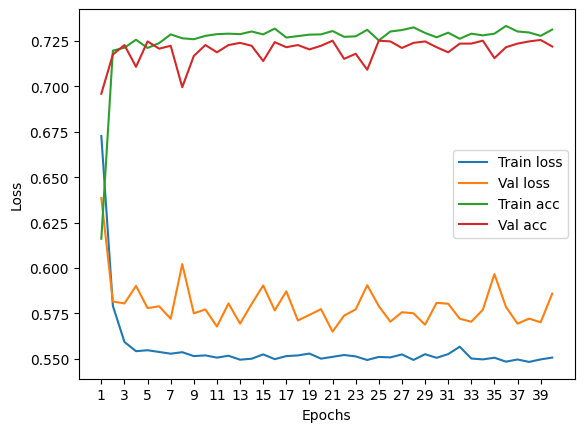

****************************************************************************************************



118it [00:00, 240.96it/s]


Train Epoch: 0 	Loss: 0.665838, Accuracy: 4378/7500 (58%)
Val Epoch: 0 	Loss: 0.621558, Accuracy: 1752/2500 (70%)



118it [00:00, 165.51it/s]


Train Epoch: 1 	Loss: 0.570094, Accuracy: 5422/7500 (72%)
Val Epoch: 1 	Loss: 0.578591, Accuracy: 1762/2500 (70%)



118it [00:00, 205.51it/s]


Train Epoch: 2 	Loss: 0.556698, Accuracy: 5413/7500 (72%)
Val Epoch: 2 	Loss: 0.574844, Accuracy: 1773/2500 (71%)



118it [00:00, 194.62it/s]


Train Epoch: 3 	Loss: 0.553548, Accuracy: 5438/7500 (73%)
Val Epoch: 3 	Loss: 0.573712, Accuracy: 1782/2500 (71%)



118it [00:00, 215.32it/s]


Train Epoch: 4 	Loss: 0.552579, Accuracy: 5461/7500 (73%)
Val Epoch: 4 	Loss: 0.591474, Accuracy: 1779/2500 (71%)



118it [00:00, 239.35it/s]


Train Epoch: 5 	Loss: 0.552230, Accuracy: 5443/7500 (73%)
Val Epoch: 5 	Loss: 0.573900, Accuracy: 1761/2500 (70%)



118it [00:00, 208.08it/s]


Train Epoch: 6 	Loss: 0.553793, Accuracy: 5446/7500 (73%)
Val Epoch: 6 	Loss: 0.603238, Accuracy: 1740/2500 (70%)



118it [00:00, 240.59it/s]


Train Epoch: 7 	Loss: 0.552627, Accuracy: 5432/7500 (72%)
Val Epoch: 7 	Loss: 0.572116, Accuracy: 1783/2500 (71%)



118it [00:00, 236.75it/s]


Train Epoch: 8 	Loss: 0.550068, Accuracy: 5472/7500 (73%)
Val Epoch: 8 	Loss: 0.593626, Accuracy: 1749/2500 (70%)



118it [00:00, 236.11it/s]


Train Epoch: 9 	Loss: 0.550750, Accuracy: 5459/7500 (73%)
Val Epoch: 9 	Loss: 0.578611, Accuracy: 1766/2500 (71%)



118it [00:00, 217.22it/s]


Train Epoch: 10 	Loss: 0.554350, Accuracy: 5434/7500 (72%)
Val Epoch: 10 	Loss: 0.570816, Accuracy: 1777/2500 (71%)



118it [00:00, 196.70it/s]


Train Epoch: 11 	Loss: 0.550010, Accuracy: 5452/7500 (73%)
Val Epoch: 11 	Loss: 0.580134, Accuracy: 1770/2500 (71%)



118it [00:00, 241.09it/s]


Train Epoch: 12 	Loss: 0.550699, Accuracy: 5438/7500 (73%)
Val Epoch: 12 	Loss: 0.584607, Accuracy: 1773/2500 (71%)



118it [00:00, 238.90it/s]


Train Epoch: 13 	Loss: 0.548979, Accuracy: 5454/7500 (73%)
Val Epoch: 13 	Loss: 0.580226, Accuracy: 1761/2500 (70%)



118it [00:00, 241.58it/s]


Train Epoch: 14 	Loss: 0.548995, Accuracy: 5442/7500 (73%)
Val Epoch: 14 	Loss: 0.581668, Accuracy: 1767/2500 (71%)



118it [00:00, 194.30it/s]


Train Epoch: 15 	Loss: 0.548880, Accuracy: 5450/7500 (73%)
Val Epoch: 15 	Loss: 0.591305, Accuracy: 1765/2500 (71%)



118it [00:00, 189.62it/s]


Train Epoch: 16 	Loss: 0.548865, Accuracy: 5451/7500 (73%)
Val Epoch: 16 	Loss: 0.569388, Accuracy: 1772/2500 (71%)



118it [00:00, 211.36it/s]


Train Epoch: 17 	Loss: 0.550303, Accuracy: 5455/7500 (73%)
Val Epoch: 17 	Loss: 0.571236, Accuracy: 1776/2500 (71%)



118it [00:00, 243.43it/s]


Train Epoch: 18 	Loss: 0.550567, Accuracy: 5446/7500 (73%)
Val Epoch: 18 	Loss: 0.575352, Accuracy: 1780/2500 (71%)



118it [00:00, 234.81it/s]


Train Epoch: 19 	Loss: 0.548231, Accuracy: 5455/7500 (73%)
Val Epoch: 19 	Loss: 0.598669, Accuracy: 1760/2500 (70%)



118it [00:00, 229.72it/s]


Train Epoch: 20 	Loss: 0.550054, Accuracy: 5447/7500 (73%)
Val Epoch: 20 	Loss: 0.586282, Accuracy: 1778/2500 (71%)



118it [00:00, 239.04it/s]


Train Epoch: 21 	Loss: 0.549099, Accuracy: 5460/7500 (73%)
Val Epoch: 21 	Loss: 0.572989, Accuracy: 1782/2500 (71%)



118it [00:00, 238.00it/s]


Train Epoch: 22 	Loss: 0.547490, Accuracy: 5461/7500 (73%)
Val Epoch: 22 	Loss: 0.579291, Accuracy: 1768/2500 (71%)



118it [00:00, 230.93it/s]


Train Epoch: 23 	Loss: 0.549071, Accuracy: 5449/7500 (73%)
Val Epoch: 23 	Loss: 0.582953, Accuracy: 1763/2500 (71%)



118it [00:00, 170.25it/s]


Train Epoch: 24 	Loss: 0.548363, Accuracy: 5467/7500 (73%)
Val Epoch: 24 	Loss: 0.566450, Accuracy: 1775/2500 (71%)



118it [00:00, 194.84it/s]


Train Epoch: 25 	Loss: 0.545971, Accuracy: 5466/7500 (73%)
Val Epoch: 25 	Loss: 0.583545, Accuracy: 1765/2500 (71%)



118it [00:00, 177.41it/s]


Train Epoch: 26 	Loss: 0.546534, Accuracy: 5466/7500 (73%)
Val Epoch: 26 	Loss: 0.587839, Accuracy: 1767/2500 (71%)



118it [00:00, 239.49it/s]


Train Epoch: 27 	Loss: 0.547595, Accuracy: 5460/7500 (73%)
Val Epoch: 27 	Loss: 0.571128, Accuracy: 1769/2500 (71%)



118it [00:00, 232.22it/s]


Train Epoch: 28 	Loss: 0.546354, Accuracy: 5480/7500 (73%)
Val Epoch: 28 	Loss: 0.580873, Accuracy: 1775/2500 (71%)



118it [00:00, 175.47it/s]


Train Epoch: 29 	Loss: 0.550399, Accuracy: 5473/7500 (73%)
Val Epoch: 29 	Loss: 0.569697, Accuracy: 1772/2500 (71%)



118it [00:00, 200.21it/s]


Train Epoch: 30 	Loss: 0.546094, Accuracy: 5468/7500 (73%)
Val Epoch: 30 	Loss: 0.587140, Accuracy: 1764/2500 (71%)



118it [00:00, 229.67it/s]


Train Epoch: 31 	Loss: 0.546947, Accuracy: 5468/7500 (73%)
Val Epoch: 31 	Loss: 0.571669, Accuracy: 1767/2500 (71%)



118it [00:00, 214.78it/s]


Train Epoch: 32 	Loss: 0.546825, Accuracy: 5455/7500 (73%)
Val Epoch: 32 	Loss: 0.572471, Accuracy: 1776/2500 (71%)



118it [00:00, 229.81it/s]


Train Epoch: 33 	Loss: 0.547214, Accuracy: 5451/7500 (73%)
Val Epoch: 33 	Loss: 0.584496, Accuracy: 1775/2500 (71%)



118it [00:00, 236.47it/s]


Train Epoch: 34 	Loss: 0.547746, Accuracy: 5471/7500 (73%)
Val Epoch: 34 	Loss: 0.569975, Accuracy: 1778/2500 (71%)



118it [00:00, 239.98it/s]


Train Epoch: 35 	Loss: 0.546773, Accuracy: 5481/7500 (73%)
Val Epoch: 35 	Loss: 0.571043, Accuracy: 1788/2500 (72%)



118it [00:00, 236.15it/s]


Train Epoch: 36 	Loss: 0.547120, Accuracy: 5450/7500 (73%)
Val Epoch: 36 	Loss: 0.586577, Accuracy: 1759/2500 (70%)



118it [00:00, 236.16it/s]


Train Epoch: 37 	Loss: 0.546885, Accuracy: 5471/7500 (73%)
Val Epoch: 37 	Loss: 0.581423, Accuracy: 1758/2500 (70%)



118it [00:00, 238.17it/s]


Train Epoch: 38 	Loss: 0.550752, Accuracy: 5448/7500 (73%)
Val Epoch: 38 	Loss: 0.569304, Accuracy: 1763/2500 (71%)



118it [00:00, 239.40it/s]


Train Epoch: 39 	Loss: 0.547574, Accuracy: 5459/7500 (73%)
Val Epoch: 39 	Loss: 0.578589, Accuracy: 1777/2500 (71%)

Test accuracy:  71.2


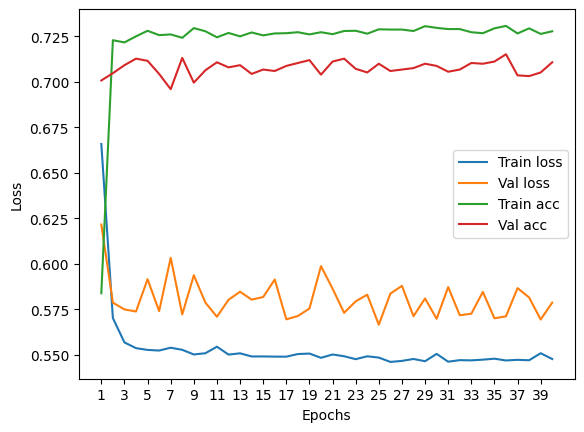

****************************************************************************************************



118it [00:00, 214.61it/s]


Train Epoch: 0 	Loss: 0.675200, Accuracy: 4570/7500 (61%)
Val Epoch: 0 	Loss: 0.647601, Accuracy: 1634/2500 (65%)



118it [00:00, 194.27it/s]


Train Epoch: 1 	Loss: 0.584920, Accuracy: 5355/7500 (71%)
Val Epoch: 1 	Loss: 0.587995, Accuracy: 1773/2500 (71%)



118it [00:00, 227.72it/s]


Train Epoch: 2 	Loss: 0.558240, Accuracy: 5394/7500 (72%)
Val Epoch: 2 	Loss: 0.584958, Accuracy: 1756/2500 (70%)



118it [00:00, 234.92it/s]


Train Epoch: 3 	Loss: 0.557879, Accuracy: 5384/7500 (72%)
Val Epoch: 3 	Loss: 0.609434, Accuracy: 1748/2500 (70%)



118it [00:00, 226.28it/s]


Train Epoch: 4 	Loss: 0.555347, Accuracy: 5376/7500 (72%)
Val Epoch: 4 	Loss: 0.578365, Accuracy: 1763/2500 (71%)



118it [00:00, 235.27it/s]


Train Epoch: 5 	Loss: 0.554088, Accuracy: 5432/7500 (72%)
Val Epoch: 5 	Loss: 0.580436, Accuracy: 1770/2500 (71%)



118it [00:00, 235.64it/s]


Train Epoch: 6 	Loss: 0.551683, Accuracy: 5433/7500 (72%)
Val Epoch: 6 	Loss: 0.592342, Accuracy: 1773/2500 (71%)



118it [00:00, 238.25it/s]


Train Epoch: 7 	Loss: 0.552739, Accuracy: 5438/7500 (73%)
Val Epoch: 7 	Loss: 0.595364, Accuracy: 1772/2500 (71%)



118it [00:00, 233.40it/s]


Train Epoch: 8 	Loss: 0.552152, Accuracy: 5442/7500 (73%)
Val Epoch: 8 	Loss: 0.598068, Accuracy: 1768/2500 (71%)



118it [00:00, 230.80it/s]


Train Epoch: 9 	Loss: 0.552793, Accuracy: 5418/7500 (72%)
Val Epoch: 9 	Loss: 0.591069, Accuracy: 1772/2500 (71%)



118it [00:00, 231.53it/s]


Train Epoch: 10 	Loss: 0.556430, Accuracy: 5387/7500 (72%)
Val Epoch: 10 	Loss: 0.584027, Accuracy: 1752/2500 (70%)



118it [00:00, 231.68it/s]


Train Epoch: 11 	Loss: 0.554445, Accuracy: 5428/7500 (72%)
Val Epoch: 11 	Loss: 0.587180, Accuracy: 1776/2500 (71%)



118it [00:00, 230.22it/s]


Train Epoch: 12 	Loss: 0.555158, Accuracy: 5391/7500 (72%)
Val Epoch: 12 	Loss: 0.587522, Accuracy: 1765/2500 (71%)



118it [00:00, 238.29it/s]


Train Epoch: 13 	Loss: 0.553989, Accuracy: 5451/7500 (73%)
Val Epoch: 13 	Loss: 0.589640, Accuracy: 1762/2500 (70%)



118it [00:00, 237.43it/s]


Train Epoch: 14 	Loss: 0.553129, Accuracy: 5415/7500 (72%)
Val Epoch: 14 	Loss: 0.583737, Accuracy: 1779/2500 (71%)



118it [00:00, 240.41it/s]


Train Epoch: 15 	Loss: 0.552156, Accuracy: 5430/7500 (72%)
Val Epoch: 15 	Loss: 0.591047, Accuracy: 1750/2500 (70%)



118it [00:00, 234.58it/s]


Train Epoch: 16 	Loss: 0.553097, Accuracy: 5429/7500 (72%)
Val Epoch: 16 	Loss: 0.586867, Accuracy: 1767/2500 (71%)



118it [00:00, 233.92it/s]


Train Epoch: 17 	Loss: 0.552927, Accuracy: 5434/7500 (72%)
Val Epoch: 17 	Loss: 0.584449, Accuracy: 1769/2500 (71%)



118it [00:00, 232.67it/s]


Train Epoch: 18 	Loss: 0.552077, Accuracy: 5424/7500 (72%)
Val Epoch: 18 	Loss: 0.595878, Accuracy: 1755/2500 (70%)



118it [00:00, 234.50it/s]


Train Epoch: 19 	Loss: 0.552470, Accuracy: 5425/7500 (72%)
Val Epoch: 19 	Loss: 0.584159, Accuracy: 1783/2500 (71%)



118it [00:00, 239.36it/s]


Train Epoch: 20 	Loss: 0.550357, Accuracy: 5427/7500 (72%)
Val Epoch: 20 	Loss: 0.587027, Accuracy: 1749/2500 (70%)



118it [00:00, 237.55it/s]


Train Epoch: 21 	Loss: 0.552614, Accuracy: 5440/7500 (73%)
Val Epoch: 21 	Loss: 0.602612, Accuracy: 1760/2500 (70%)



118it [00:00, 215.97it/s]


Train Epoch: 22 	Loss: 0.552178, Accuracy: 5432/7500 (72%)
Val Epoch: 22 	Loss: 0.577487, Accuracy: 1774/2500 (71%)



118it [00:00, 152.72it/s]


Train Epoch: 23 	Loss: 0.552529, Accuracy: 5451/7500 (73%)
Val Epoch: 23 	Loss: 0.582189, Accuracy: 1765/2500 (71%)



118it [00:00, 194.97it/s]


Train Epoch: 24 	Loss: 0.550688, Accuracy: 5434/7500 (72%)
Val Epoch: 24 	Loss: 0.588559, Accuracy: 1764/2500 (71%)



118it [00:00, 182.03it/s]


Train Epoch: 25 	Loss: 0.550908, Accuracy: 5411/7500 (72%)
Val Epoch: 25 	Loss: 0.583800, Accuracy: 1780/2500 (71%)



118it [00:00, 235.27it/s]


Train Epoch: 26 	Loss: 0.553205, Accuracy: 5427/7500 (72%)
Val Epoch: 26 	Loss: 0.596363, Accuracy: 1770/2500 (71%)



118it [00:00, 240.09it/s]


Train Epoch: 27 	Loss: 0.551794, Accuracy: 5441/7500 (73%)
Val Epoch: 27 	Loss: 0.583847, Accuracy: 1777/2500 (71%)



118it [00:00, 240.18it/s]


Train Epoch: 28 	Loss: 0.551695, Accuracy: 5424/7500 (72%)
Val Epoch: 28 	Loss: 0.586010, Accuracy: 1750/2500 (70%)



118it [00:00, 226.64it/s]


Train Epoch: 29 	Loss: 0.551505, Accuracy: 5431/7500 (72%)
Val Epoch: 29 	Loss: 0.599996, Accuracy: 1768/2500 (71%)



118it [00:00, 237.86it/s]


Train Epoch: 30 	Loss: 0.550395, Accuracy: 5438/7500 (73%)
Val Epoch: 30 	Loss: 0.610168, Accuracy: 1744/2500 (70%)



118it [00:00, 238.81it/s]


Train Epoch: 31 	Loss: 0.552256, Accuracy: 5436/7500 (72%)
Val Epoch: 31 	Loss: 0.580785, Accuracy: 1773/2500 (71%)



118it [00:00, 235.83it/s]


Train Epoch: 32 	Loss: 0.550799, Accuracy: 5433/7500 (72%)
Val Epoch: 32 	Loss: 0.585193, Accuracy: 1781/2500 (71%)



118it [00:00, 232.06it/s]


Train Epoch: 33 	Loss: 0.550671, Accuracy: 5438/7500 (73%)
Val Epoch: 33 	Loss: 0.590525, Accuracy: 1777/2500 (71%)



118it [00:00, 228.45it/s]


Train Epoch: 34 	Loss: 0.551532, Accuracy: 5449/7500 (73%)
Val Epoch: 34 	Loss: 0.586503, Accuracy: 1772/2500 (71%)



118it [00:00, 240.97it/s]


Train Epoch: 35 	Loss: 0.554016, Accuracy: 5432/7500 (72%)
Val Epoch: 35 	Loss: 0.579148, Accuracy: 1765/2500 (71%)



118it [00:00, 233.44it/s]


Train Epoch: 36 	Loss: 0.549655, Accuracy: 5453/7500 (73%)
Val Epoch: 36 	Loss: 0.586300, Accuracy: 1781/2500 (71%)



118it [00:00, 239.41it/s]


Train Epoch: 37 	Loss: 0.553543, Accuracy: 5435/7500 (72%)
Val Epoch: 37 	Loss: 0.584818, Accuracy: 1762/2500 (70%)



118it [00:00, 205.35it/s]


Train Epoch: 38 	Loss: 0.551062, Accuracy: 5443/7500 (73%)
Val Epoch: 38 	Loss: 0.591094, Accuracy: 1774/2500 (71%)



118it [00:00, 233.43it/s]


Train Epoch: 39 	Loss: 0.552924, Accuracy: 5439/7500 (73%)
Val Epoch: 39 	Loss: 0.580213, Accuracy: 1770/2500 (71%)

Test accuracy:  72.28


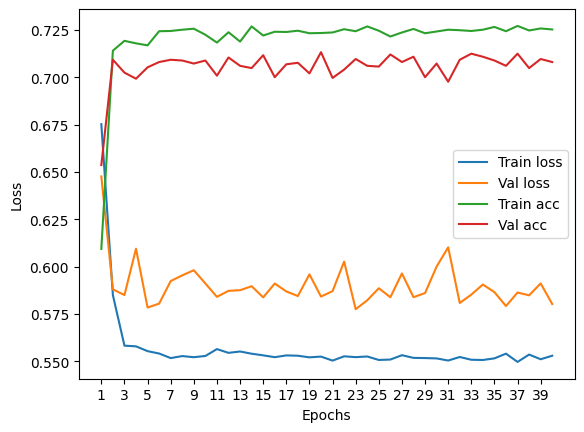

****************************************************************************************************



118it [00:00, 206.36it/s]


Train Epoch: 0 	Loss: 0.677524, Accuracy: 4428/7500 (59%)
Val Epoch: 0 	Loss: 0.636369, Accuracy: 1722/2500 (69%)



118it [00:00, 235.49it/s]


Train Epoch: 1 	Loss: 0.591598, Accuracy: 5239/7500 (70%)
Val Epoch: 1 	Loss: 0.577081, Accuracy: 1769/2500 (71%)



118it [00:00, 238.39it/s]


Train Epoch: 2 	Loss: 0.566709, Accuracy: 5315/7500 (71%)
Val Epoch: 2 	Loss: 0.577879, Accuracy: 1773/2500 (71%)



118it [00:00, 235.19it/s]


Train Epoch: 3 	Loss: 0.561839, Accuracy: 5333/7500 (71%)
Val Epoch: 3 	Loss: 0.572748, Accuracy: 1783/2500 (71%)



118it [00:00, 234.96it/s]


Train Epoch: 4 	Loss: 0.558746, Accuracy: 5369/7500 (72%)
Val Epoch: 4 	Loss: 0.580307, Accuracy: 1783/2500 (71%)



118it [00:00, 239.90it/s]


Train Epoch: 5 	Loss: 0.561947, Accuracy: 5361/7500 (71%)
Val Epoch: 5 	Loss: 0.570735, Accuracy: 1777/2500 (71%)



118it [00:00, 235.39it/s]


Train Epoch: 6 	Loss: 0.559223, Accuracy: 5411/7500 (72%)
Val Epoch: 6 	Loss: 0.571686, Accuracy: 1791/2500 (72%)



118it [00:00, 236.71it/s]


Train Epoch: 7 	Loss: 0.557211, Accuracy: 5387/7500 (72%)
Val Epoch: 7 	Loss: 0.583683, Accuracy: 1781/2500 (71%)



118it [00:00, 232.82it/s]


Train Epoch: 8 	Loss: 0.558147, Accuracy: 5394/7500 (72%)
Val Epoch: 8 	Loss: 0.584979, Accuracy: 1793/2500 (72%)



118it [00:00, 237.67it/s]


Train Epoch: 9 	Loss: 0.558857, Accuracy: 5351/7500 (71%)
Val Epoch: 9 	Loss: 0.579943, Accuracy: 1792/2500 (72%)



118it [00:00, 234.68it/s]


Train Epoch: 10 	Loss: 0.557438, Accuracy: 5372/7500 (72%)
Val Epoch: 10 	Loss: 0.567318, Accuracy: 1777/2500 (71%)



118it [00:00, 238.60it/s]


Train Epoch: 11 	Loss: 0.558074, Accuracy: 5399/7500 (72%)
Val Epoch: 11 	Loss: 0.570662, Accuracy: 1782/2500 (71%)



118it [00:00, 232.52it/s]


Train Epoch: 12 	Loss: 0.558358, Accuracy: 5359/7500 (71%)
Val Epoch: 12 	Loss: 0.592105, Accuracy: 1785/2500 (71%)



118it [00:00, 237.81it/s]


Train Epoch: 13 	Loss: 0.557146, Accuracy: 5363/7500 (72%)
Val Epoch: 13 	Loss: 0.572197, Accuracy: 1776/2500 (71%)



118it [00:00, 230.50it/s]


Train Epoch: 14 	Loss: 0.556721, Accuracy: 5372/7500 (72%)
Val Epoch: 14 	Loss: 0.575918, Accuracy: 1786/2500 (71%)



118it [00:00, 230.36it/s]


Train Epoch: 15 	Loss: 0.555147, Accuracy: 5371/7500 (72%)
Val Epoch: 15 	Loss: 0.593171, Accuracy: 1790/2500 (72%)



118it [00:00, 234.62it/s]


Train Epoch: 16 	Loss: 0.557505, Accuracy: 5365/7500 (72%)
Val Epoch: 16 	Loss: 0.574588, Accuracy: 1786/2500 (71%)



118it [00:00, 229.46it/s]


Train Epoch: 17 	Loss: 0.555802, Accuracy: 5374/7500 (72%)
Val Epoch: 17 	Loss: 0.574914, Accuracy: 1782/2500 (71%)



118it [00:00, 237.30it/s]


Train Epoch: 18 	Loss: 0.555602, Accuracy: 5387/7500 (72%)
Val Epoch: 18 	Loss: 0.577791, Accuracy: 1784/2500 (71%)



118it [00:00, 210.05it/s]


Train Epoch: 19 	Loss: 0.557974, Accuracy: 5385/7500 (72%)
Val Epoch: 19 	Loss: 0.576590, Accuracy: 1792/2500 (72%)



118it [00:00, 195.89it/s]


Train Epoch: 20 	Loss: 0.556276, Accuracy: 5394/7500 (72%)
Val Epoch: 20 	Loss: 0.573157, Accuracy: 1791/2500 (72%)



118it [00:00, 149.53it/s]


Train Epoch: 21 	Loss: 0.554248, Accuracy: 5389/7500 (72%)
Val Epoch: 21 	Loss: 0.573605, Accuracy: 1788/2500 (72%)



118it [00:00, 158.46it/s]


Train Epoch: 22 	Loss: 0.555145, Accuracy: 5375/7500 (72%)
Val Epoch: 22 	Loss: 0.574220, Accuracy: 1794/2500 (72%)



118it [00:00, 151.31it/s]


Train Epoch: 23 	Loss: 0.555781, Accuracy: 5381/7500 (72%)
Val Epoch: 23 	Loss: 0.573095, Accuracy: 1790/2500 (72%)



118it [00:00, 173.98it/s]


Train Epoch: 24 	Loss: 0.557096, Accuracy: 5388/7500 (72%)
Val Epoch: 24 	Loss: 0.581578, Accuracy: 1790/2500 (72%)



118it [00:00, 188.91it/s]


Train Epoch: 25 	Loss: 0.556511, Accuracy: 5362/7500 (71%)
Val Epoch: 25 	Loss: 0.572224, Accuracy: 1791/2500 (72%)



118it [00:00, 188.44it/s]


Train Epoch: 26 	Loss: 0.557072, Accuracy: 5374/7500 (72%)
Val Epoch: 26 	Loss: 0.573382, Accuracy: 1800/2500 (72%)



118it [00:00, 234.48it/s]


Train Epoch: 27 	Loss: 0.554321, Accuracy: 5389/7500 (72%)
Val Epoch: 27 	Loss: 0.576782, Accuracy: 1780/2500 (71%)



118it [00:00, 234.70it/s]


Train Epoch: 28 	Loss: 0.553277, Accuracy: 5389/7500 (72%)
Val Epoch: 28 	Loss: 0.573178, Accuracy: 1790/2500 (72%)



118it [00:00, 237.99it/s]


Train Epoch: 29 	Loss: 0.555780, Accuracy: 5389/7500 (72%)
Val Epoch: 29 	Loss: 0.578285, Accuracy: 1792/2500 (72%)



118it [00:00, 238.81it/s]


Train Epoch: 30 	Loss: 0.554937, Accuracy: 5377/7500 (72%)
Val Epoch: 30 	Loss: 0.578383, Accuracy: 1801/2500 (72%)



118it [00:00, 229.48it/s]


Train Epoch: 31 	Loss: 0.555317, Accuracy: 5396/7500 (72%)
Val Epoch: 31 	Loss: 0.570556, Accuracy: 1789/2500 (72%)



118it [00:00, 235.93it/s]


Train Epoch: 32 	Loss: 0.553371, Accuracy: 5390/7500 (72%)
Val Epoch: 32 	Loss: 0.592189, Accuracy: 1771/2500 (71%)



118it [00:00, 237.84it/s]


Train Epoch: 33 	Loss: 0.554385, Accuracy: 5376/7500 (72%)
Val Epoch: 33 	Loss: 0.580420, Accuracy: 1784/2500 (71%)



118it [00:00, 236.32it/s]


Train Epoch: 34 	Loss: 0.553379, Accuracy: 5394/7500 (72%)
Val Epoch: 34 	Loss: 0.582514, Accuracy: 1792/2500 (72%)



118it [00:00, 235.12it/s]


Train Epoch: 35 	Loss: 0.554684, Accuracy: 5390/7500 (72%)
Val Epoch: 35 	Loss: 0.569815, Accuracy: 1792/2500 (72%)



118it [00:00, 235.71it/s]


Train Epoch: 36 	Loss: 0.553873, Accuracy: 5406/7500 (72%)
Val Epoch: 36 	Loss: 0.570902, Accuracy: 1786/2500 (71%)



118it [00:00, 239.64it/s]


Train Epoch: 37 	Loss: 0.554723, Accuracy: 5414/7500 (72%)
Val Epoch: 37 	Loss: 0.568635, Accuracy: 1785/2500 (71%)



118it [00:00, 236.40it/s]


Train Epoch: 38 	Loss: 0.554038, Accuracy: 5365/7500 (72%)
Val Epoch: 38 	Loss: 0.587738, Accuracy: 1773/2500 (71%)



118it [00:00, 242.88it/s]


Train Epoch: 39 	Loss: 0.557856, Accuracy: 5394/7500 (72%)
Val Epoch: 39 	Loss: 0.568724, Accuracy: 1790/2500 (72%)

Test accuracy:  72.36


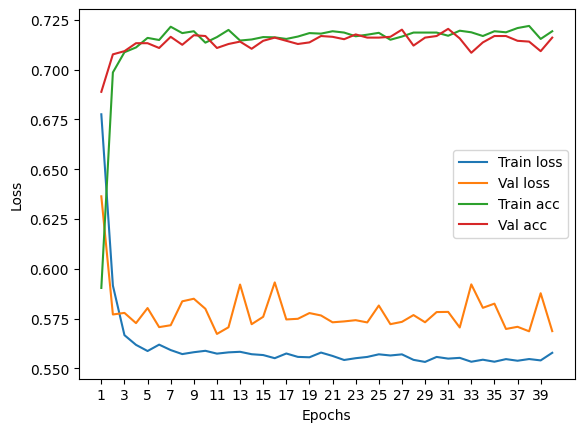

****************************************************************************************************



116it [00:00, 247.38it/s]


Train Epoch: 0 	Loss: 0.679582, Accuracy: 4190/7422 (56%)
Val Epoch: 0 	Loss: 0.652366, Accuracy: 1634/2474 (66%)



116it [00:00, 222.30it/s]


Train Epoch: 1 	Loss: 0.599080, Accuracy: 5221/7422 (70%)
Val Epoch: 1 	Loss: 0.578687, Accuracy: 1746/2474 (71%)



116it [00:00, 236.06it/s]


Train Epoch: 2 	Loss: 0.561713, Accuracy: 5317/7422 (72%)
Val Epoch: 2 	Loss: 0.567084, Accuracy: 1770/2474 (72%)



116it [00:00, 234.08it/s]


Train Epoch: 3 	Loss: 0.561403, Accuracy: 5335/7422 (72%)
Val Epoch: 3 	Loss: 0.563388, Accuracy: 1769/2474 (72%)



116it [00:00, 234.46it/s]


Train Epoch: 4 	Loss: 0.559566, Accuracy: 5360/7422 (72%)
Val Epoch: 4 	Loss: 0.564533, Accuracy: 1762/2474 (71%)



116it [00:00, 238.99it/s]


Train Epoch: 5 	Loss: 0.558982, Accuracy: 5353/7422 (72%)
Val Epoch: 5 	Loss: 0.565312, Accuracy: 1756/2474 (71%)



116it [00:00, 237.41it/s]


Train Epoch: 6 	Loss: 0.558806, Accuracy: 5362/7422 (72%)
Val Epoch: 6 	Loss: 0.562608, Accuracy: 1763/2474 (71%)



116it [00:00, 234.75it/s]


Train Epoch: 7 	Loss: 0.556971, Accuracy: 5355/7422 (72%)
Val Epoch: 7 	Loss: 0.562180, Accuracy: 1772/2474 (72%)



116it [00:00, 234.55it/s]


Train Epoch: 8 	Loss: 0.556769, Accuracy: 5379/7422 (72%)
Val Epoch: 8 	Loss: 0.561265, Accuracy: 1767/2474 (71%)



116it [00:00, 221.43it/s]


Train Epoch: 9 	Loss: 0.555788, Accuracy: 5382/7422 (73%)
Val Epoch: 9 	Loss: 0.560667, Accuracy: 1768/2474 (71%)



116it [00:00, 188.00it/s]


Train Epoch: 10 	Loss: 0.555755, Accuracy: 5361/7422 (72%)
Val Epoch: 10 	Loss: 0.566488, Accuracy: 1756/2474 (71%)



116it [00:00, 163.91it/s]


Train Epoch: 11 	Loss: 0.556566, Accuracy: 5358/7422 (72%)
Val Epoch: 11 	Loss: 0.569679, Accuracy: 1753/2474 (71%)



116it [00:00, 195.90it/s]


Train Epoch: 12 	Loss: 0.555358, Accuracy: 5370/7422 (72%)
Val Epoch: 12 	Loss: 0.559544, Accuracy: 1762/2474 (71%)



116it [00:00, 226.78it/s]


Train Epoch: 13 	Loss: 0.555883, Accuracy: 5363/7422 (72%)
Val Epoch: 13 	Loss: 0.560372, Accuracy: 1758/2474 (71%)



116it [00:00, 241.48it/s]


Train Epoch: 14 	Loss: 0.555356, Accuracy: 5362/7422 (72%)
Val Epoch: 14 	Loss: 0.560933, Accuracy: 1775/2474 (72%)



116it [00:00, 237.60it/s]


Train Epoch: 15 	Loss: 0.554917, Accuracy: 5378/7422 (72%)
Val Epoch: 15 	Loss: 0.559160, Accuracy: 1775/2474 (72%)



116it [00:00, 235.32it/s]


Train Epoch: 16 	Loss: 0.554066, Accuracy: 5386/7422 (73%)
Val Epoch: 16 	Loss: 0.560338, Accuracy: 1768/2474 (71%)



116it [00:00, 235.22it/s]


Train Epoch: 17 	Loss: 0.554880, Accuracy: 5380/7422 (72%)
Val Epoch: 17 	Loss: 0.560855, Accuracy: 1757/2474 (71%)



116it [00:00, 224.62it/s]


Train Epoch: 18 	Loss: 0.553215, Accuracy: 5386/7422 (73%)
Val Epoch: 18 	Loss: 0.559841, Accuracy: 1764/2474 (71%)



116it [00:00, 174.21it/s]


Train Epoch: 19 	Loss: 0.553345, Accuracy: 5385/7422 (73%)
Val Epoch: 19 	Loss: 0.560984, Accuracy: 1764/2474 (71%)



116it [00:00, 194.58it/s]


Train Epoch: 20 	Loss: 0.555437, Accuracy: 5380/7422 (72%)
Val Epoch: 20 	Loss: 0.562342, Accuracy: 1767/2474 (71%)



116it [00:00, 191.30it/s]


Train Epoch: 21 	Loss: 0.553144, Accuracy: 5374/7422 (72%)
Val Epoch: 21 	Loss: 0.560220, Accuracy: 1771/2474 (72%)



116it [00:00, 237.42it/s]


Train Epoch: 22 	Loss: 0.553313, Accuracy: 5383/7422 (73%)
Val Epoch: 22 	Loss: 0.560434, Accuracy: 1774/2474 (72%)



116it [00:00, 240.31it/s]


Train Epoch: 23 	Loss: 0.552904, Accuracy: 5387/7422 (73%)
Val Epoch: 23 	Loss: 0.558450, Accuracy: 1775/2474 (72%)



116it [00:00, 224.59it/s]


Train Epoch: 24 	Loss: 0.553227, Accuracy: 5372/7422 (72%)
Val Epoch: 24 	Loss: 0.564560, Accuracy: 1769/2474 (72%)



116it [00:00, 235.42it/s]


Train Epoch: 25 	Loss: 0.553221, Accuracy: 5405/7422 (73%)
Val Epoch: 25 	Loss: 0.562579, Accuracy: 1767/2474 (71%)



116it [00:00, 235.97it/s]


Train Epoch: 26 	Loss: 0.553621, Accuracy: 5362/7422 (72%)
Val Epoch: 26 	Loss: 0.569905, Accuracy: 1765/2474 (71%)



116it [00:00, 240.13it/s]


Train Epoch: 27 	Loss: 0.552374, Accuracy: 5384/7422 (73%)
Val Epoch: 27 	Loss: 0.562727, Accuracy: 1771/2474 (72%)



116it [00:00, 239.08it/s]


Train Epoch: 28 	Loss: 0.552278, Accuracy: 5384/7422 (73%)
Val Epoch: 28 	Loss: 0.561005, Accuracy: 1770/2474 (72%)



116it [00:00, 235.16it/s]


Train Epoch: 29 	Loss: 0.551914, Accuracy: 5374/7422 (72%)
Val Epoch: 29 	Loss: 0.563861, Accuracy: 1761/2474 (71%)



116it [00:00, 240.41it/s]


Train Epoch: 30 	Loss: 0.553161, Accuracy: 5360/7422 (72%)
Val Epoch: 30 	Loss: 0.559476, Accuracy: 1771/2474 (72%)



116it [00:00, 238.21it/s]


Train Epoch: 31 	Loss: 0.552176, Accuracy: 5386/7422 (73%)
Val Epoch: 31 	Loss: 0.560220, Accuracy: 1771/2474 (72%)



116it [00:00, 234.47it/s]


Train Epoch: 32 	Loss: 0.554455, Accuracy: 5368/7422 (72%)
Val Epoch: 32 	Loss: 0.561041, Accuracy: 1768/2474 (71%)



116it [00:00, 239.29it/s]


Train Epoch: 33 	Loss: 0.552310, Accuracy: 5376/7422 (72%)
Val Epoch: 33 	Loss: 0.561394, Accuracy: 1777/2474 (72%)



116it [00:00, 238.84it/s]


Train Epoch: 34 	Loss: 0.552438, Accuracy: 5375/7422 (72%)
Val Epoch: 34 	Loss: 0.561185, Accuracy: 1774/2474 (72%)



116it [00:00, 237.54it/s]


Train Epoch: 35 	Loss: 0.552000, Accuracy: 5372/7422 (72%)
Val Epoch: 35 	Loss: 0.571370, Accuracy: 1758/2474 (71%)



116it [00:00, 230.26it/s]


Train Epoch: 36 	Loss: 0.553621, Accuracy: 5384/7422 (73%)
Val Epoch: 36 	Loss: 0.560356, Accuracy: 1769/2474 (72%)



116it [00:00, 234.67it/s]


Train Epoch: 37 	Loss: 0.552915, Accuracy: 5372/7422 (72%)
Val Epoch: 37 	Loss: 0.560716, Accuracy: 1770/2474 (72%)



116it [00:00, 233.59it/s]


Train Epoch: 38 	Loss: 0.551769, Accuracy: 5394/7422 (73%)
Val Epoch: 38 	Loss: 0.561570, Accuracy: 1775/2474 (72%)



116it [00:00, 230.91it/s]


Train Epoch: 39 	Loss: 0.551600, Accuracy: 5380/7422 (72%)
Val Epoch: 39 	Loss: 0.558989, Accuracy: 1775/2474 (72%)

Test accuracy:  72.39288601455134


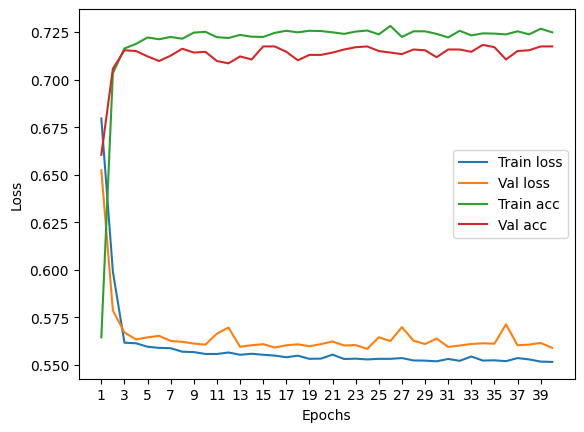

****************************************************************************************************



Particles per jet: 3


118it [00:00, 236.93it/s]


Train Epoch: 0 	Loss: 0.677402, Accuracy: 4505/7500 (60%)
Val Epoch: 0 	Loss: 0.649823, Accuracy: 1728/2500 (69%)



118it [00:00, 233.38it/s]


Train Epoch: 1 	Loss: 0.605447, Accuracy: 5287/7500 (70%)
Val Epoch: 1 	Loss: 0.573125, Accuracy: 1853/2500 (74%)



118it [00:00, 233.32it/s]


Train Epoch: 2 	Loss: 0.562846, Accuracy: 5442/7500 (73%)
Val Epoch: 2 	Loss: 0.547001, Accuracy: 1872/2500 (75%)



118it [00:00, 234.95it/s]


Train Epoch: 3 	Loss: 0.553617, Accuracy: 5475/7500 (73%)
Val Epoch: 3 	Loss: 0.542189, Accuracy: 1867/2500 (75%)



118it [00:00, 237.32it/s]


Train Epoch: 4 	Loss: 0.554998, Accuracy: 5453/7500 (73%)
Val Epoch: 4 	Loss: 0.532901, Accuracy: 1885/2500 (75%)



118it [00:00, 236.84it/s]


Train Epoch: 5 	Loss: 0.553110, Accuracy: 5453/7500 (73%)
Val Epoch: 5 	Loss: 0.538977, Accuracy: 1876/2500 (75%)



118it [00:00, 233.04it/s]


Train Epoch: 6 	Loss: 0.550632, Accuracy: 5485/7500 (73%)
Val Epoch: 6 	Loss: 0.549197, Accuracy: 1882/2500 (75%)



118it [00:00, 152.19it/s]


Train Epoch: 7 	Loss: 0.549939, Accuracy: 5516/7500 (74%)
Val Epoch: 7 	Loss: 0.538834, Accuracy: 1871/2500 (75%)



118it [00:00, 230.44it/s]


Train Epoch: 8 	Loss: 0.551416, Accuracy: 5467/7500 (73%)
Val Epoch: 8 	Loss: 0.537085, Accuracy: 1877/2500 (75%)



118it [00:00, 237.95it/s]


Train Epoch: 9 	Loss: 0.550080, Accuracy: 5473/7500 (73%)
Val Epoch: 9 	Loss: 0.543572, Accuracy: 1869/2500 (75%)



118it [00:00, 235.69it/s]


Train Epoch: 10 	Loss: 0.549270, Accuracy: 5459/7500 (73%)
Val Epoch: 10 	Loss: 0.547934, Accuracy: 1859/2500 (74%)



118it [00:00, 230.31it/s]


Train Epoch: 11 	Loss: 0.551112, Accuracy: 5470/7500 (73%)
Val Epoch: 11 	Loss: 0.539926, Accuracy: 1872/2500 (75%)



118it [00:00, 238.93it/s]


Train Epoch: 12 	Loss: 0.549224, Accuracy: 5474/7500 (73%)
Val Epoch: 12 	Loss: 0.543376, Accuracy: 1862/2500 (74%)



118it [00:00, 232.54it/s]


Train Epoch: 13 	Loss: 0.550164, Accuracy: 5476/7500 (73%)
Val Epoch: 13 	Loss: 0.551921, Accuracy: 1874/2500 (75%)



118it [00:00, 221.70it/s]


Train Epoch: 14 	Loss: 0.550382, Accuracy: 5478/7500 (73%)
Val Epoch: 14 	Loss: 0.568390, Accuracy: 1807/2500 (72%)



118it [00:00, 192.42it/s]


Train Epoch: 15 	Loss: 0.548412, Accuracy: 5477/7500 (73%)
Val Epoch: 15 	Loss: 0.553631, Accuracy: 1859/2500 (74%)



118it [00:00, 174.35it/s]


Train Epoch: 16 	Loss: 0.547938, Accuracy: 5485/7500 (73%)
Val Epoch: 16 	Loss: 0.555361, Accuracy: 1878/2500 (75%)



118it [00:00, 198.66it/s]


Train Epoch: 17 	Loss: 0.547438, Accuracy: 5482/7500 (73%)
Val Epoch: 17 	Loss: 0.539952, Accuracy: 1875/2500 (75%)



118it [00:00, 179.75it/s]


Train Epoch: 18 	Loss: 0.548168, Accuracy: 5488/7500 (73%)
Val Epoch: 18 	Loss: 0.554857, Accuracy: 1825/2500 (73%)



118it [00:00, 192.31it/s]


Train Epoch: 19 	Loss: 0.547563, Accuracy: 5511/7500 (73%)
Val Epoch: 19 	Loss: 0.550409, Accuracy: 1885/2500 (75%)



118it [00:00, 155.91it/s]


Train Epoch: 20 	Loss: 0.548798, Accuracy: 5493/7500 (73%)
Val Epoch: 20 	Loss: 0.552287, Accuracy: 1862/2500 (74%)



118it [00:00, 170.58it/s]


Train Epoch: 21 	Loss: 0.549516, Accuracy: 5470/7500 (73%)
Val Epoch: 21 	Loss: 0.553112, Accuracy: 1871/2500 (75%)



118it [00:00, 222.98it/s]


Train Epoch: 22 	Loss: 0.548632, Accuracy: 5494/7500 (73%)
Val Epoch: 22 	Loss: 0.540056, Accuracy: 1882/2500 (75%)



118it [00:00, 228.94it/s]


Train Epoch: 23 	Loss: 0.549379, Accuracy: 5492/7500 (73%)
Val Epoch: 23 	Loss: 0.538378, Accuracy: 1876/2500 (75%)



118it [00:00, 206.00it/s]


Train Epoch: 24 	Loss: 0.550658, Accuracy: 5472/7500 (73%)
Val Epoch: 24 	Loss: 0.552473, Accuracy: 1877/2500 (75%)



118it [00:00, 239.23it/s]


Train Epoch: 25 	Loss: 0.546976, Accuracy: 5492/7500 (73%)
Val Epoch: 25 	Loss: 0.549360, Accuracy: 1853/2500 (74%)



118it [00:00, 232.56it/s]


Train Epoch: 26 	Loss: 0.547532, Accuracy: 5457/7500 (73%)
Val Epoch: 26 	Loss: 0.541474, Accuracy: 1874/2500 (75%)



118it [00:00, 232.32it/s]


Train Epoch: 27 	Loss: 0.546532, Accuracy: 5481/7500 (73%)
Val Epoch: 27 	Loss: 0.535820, Accuracy: 1872/2500 (75%)



118it [00:00, 225.67it/s]


Train Epoch: 28 	Loss: 0.549150, Accuracy: 5486/7500 (73%)
Val Epoch: 28 	Loss: 0.533913, Accuracy: 1879/2500 (75%)



118it [00:00, 230.18it/s]


Train Epoch: 29 	Loss: 0.546567, Accuracy: 5478/7500 (73%)
Val Epoch: 29 	Loss: 0.542916, Accuracy: 1878/2500 (75%)



118it [00:00, 227.43it/s]


Train Epoch: 30 	Loss: 0.548853, Accuracy: 5485/7500 (73%)
Val Epoch: 30 	Loss: 0.533173, Accuracy: 1883/2500 (75%)



118it [00:00, 224.87it/s]


Train Epoch: 31 	Loss: 0.545454, Accuracy: 5503/7500 (73%)
Val Epoch: 31 	Loss: 0.539089, Accuracy: 1867/2500 (75%)



118it [00:00, 233.59it/s]


Train Epoch: 32 	Loss: 0.549628, Accuracy: 5484/7500 (73%)
Val Epoch: 32 	Loss: 0.539404, Accuracy: 1879/2500 (75%)



118it [00:00, 231.75it/s]


Train Epoch: 33 	Loss: 0.544959, Accuracy: 5483/7500 (73%)
Val Epoch: 33 	Loss: 0.537206, Accuracy: 1872/2500 (75%)



118it [00:00, 232.32it/s]


Train Epoch: 34 	Loss: 0.547224, Accuracy: 5523/7500 (74%)
Val Epoch: 34 	Loss: 0.537208, Accuracy: 1875/2500 (75%)



118it [00:00, 229.74it/s]


Train Epoch: 35 	Loss: 0.545868, Accuracy: 5483/7500 (73%)
Val Epoch: 35 	Loss: 0.544801, Accuracy: 1877/2500 (75%)



118it [00:00, 235.32it/s]


Train Epoch: 36 	Loss: 0.545361, Accuracy: 5497/7500 (73%)
Val Epoch: 36 	Loss: 0.544072, Accuracy: 1881/2500 (75%)



118it [00:00, 166.55it/s]


Train Epoch: 37 	Loss: 0.544910, Accuracy: 5481/7500 (73%)
Val Epoch: 37 	Loss: 0.546397, Accuracy: 1881/2500 (75%)



118it [00:00, 157.60it/s]


Train Epoch: 38 	Loss: 0.548314, Accuracy: 5477/7500 (73%)
Val Epoch: 38 	Loss: 0.542328, Accuracy: 1877/2500 (75%)



118it [00:00, 183.60it/s]


Train Epoch: 39 	Loss: 0.547841, Accuracy: 5503/7500 (73%)
Val Epoch: 39 	Loss: 0.538550, Accuracy: 1872/2500 (75%)

Test accuracy:  72.92


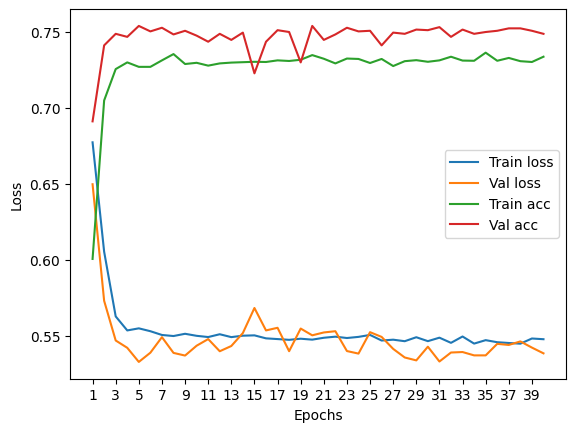

****************************************************************************************************



118it [00:00, 244.24it/s]


Train Epoch: 0 	Loss: 0.677616, Accuracy: 4470/7500 (60%)
Val Epoch: 0 	Loss: 0.650319, Accuracy: 1756/2500 (70%)



118it [00:00, 239.65it/s]


Train Epoch: 1 	Loss: 0.607323, Accuracy: 5315/7500 (71%)
Val Epoch: 1 	Loss: 0.571551, Accuracy: 1846/2500 (74%)



118it [00:00, 231.42it/s]


Train Epoch: 2 	Loss: 0.566650, Accuracy: 5414/7500 (72%)
Val Epoch: 2 	Loss: 0.559266, Accuracy: 1822/2500 (73%)



118it [00:00, 213.54it/s]


Train Epoch: 3 	Loss: 0.562689, Accuracy: 5431/7500 (72%)
Val Epoch: 3 	Loss: 0.553759, Accuracy: 1842/2500 (74%)



118it [00:00, 232.64it/s]


Train Epoch: 4 	Loss: 0.563092, Accuracy: 5474/7500 (73%)
Val Epoch: 4 	Loss: 0.560360, Accuracy: 1855/2500 (74%)



118it [00:00, 232.15it/s]


Train Epoch: 5 	Loss: 0.559379, Accuracy: 5407/7500 (72%)
Val Epoch: 5 	Loss: 0.556552, Accuracy: 1820/2500 (73%)



118it [00:00, 232.72it/s]


Train Epoch: 6 	Loss: 0.559504, Accuracy: 5421/7500 (72%)
Val Epoch: 6 	Loss: 0.554151, Accuracy: 1847/2500 (74%)



118it [00:00, 203.41it/s]


Train Epoch: 7 	Loss: 0.559280, Accuracy: 5401/7500 (72%)
Val Epoch: 7 	Loss: 0.551635, Accuracy: 1843/2500 (74%)



118it [00:00, 225.27it/s]


Train Epoch: 8 	Loss: 0.563709, Accuracy: 5424/7500 (72%)
Val Epoch: 8 	Loss: 0.558315, Accuracy: 1840/2500 (74%)



118it [00:00, 160.62it/s]


Train Epoch: 9 	Loss: 0.556543, Accuracy: 5456/7500 (73%)
Val Epoch: 9 	Loss: 0.552822, Accuracy: 1836/2500 (73%)



118it [00:00, 197.02it/s]


Train Epoch: 10 	Loss: 0.557599, Accuracy: 5462/7500 (73%)
Val Epoch: 10 	Loss: 0.561103, Accuracy: 1847/2500 (74%)



118it [00:00, 182.77it/s]


Train Epoch: 11 	Loss: 0.557694, Accuracy: 5436/7500 (72%)
Val Epoch: 11 	Loss: 0.558353, Accuracy: 1838/2500 (74%)



118it [00:00, 238.77it/s]


Train Epoch: 12 	Loss: 0.558154, Accuracy: 5426/7500 (72%)
Val Epoch: 12 	Loss: 0.580208, Accuracy: 1829/2500 (73%)



118it [00:00, 235.80it/s]


Train Epoch: 13 	Loss: 0.557450, Accuracy: 5445/7500 (73%)
Val Epoch: 13 	Loss: 0.556666, Accuracy: 1855/2500 (74%)



118it [00:00, 219.90it/s]


Train Epoch: 14 	Loss: 0.557886, Accuracy: 5435/7500 (72%)
Val Epoch: 14 	Loss: 0.558746, Accuracy: 1832/2500 (73%)



118it [00:00, 233.84it/s]


Train Epoch: 15 	Loss: 0.556305, Accuracy: 5413/7500 (72%)
Val Epoch: 15 	Loss: 0.564573, Accuracy: 1811/2500 (72%)



118it [00:00, 233.23it/s]


Train Epoch: 16 	Loss: 0.557946, Accuracy: 5454/7500 (73%)
Val Epoch: 16 	Loss: 0.563583, Accuracy: 1829/2500 (73%)



118it [00:00, 229.54it/s]


Train Epoch: 17 	Loss: 0.557414, Accuracy: 5442/7500 (73%)
Val Epoch: 17 	Loss: 0.545732, Accuracy: 1852/2500 (74%)



118it [00:00, 191.50it/s]


Train Epoch: 18 	Loss: 0.560143, Accuracy: 5404/7500 (72%)
Val Epoch: 18 	Loss: 0.555874, Accuracy: 1844/2500 (74%)



118it [00:00, 212.11it/s]


Train Epoch: 19 	Loss: 0.555746, Accuracy: 5445/7500 (73%)
Val Epoch: 19 	Loss: 0.552361, Accuracy: 1845/2500 (74%)



118it [00:00, 233.56it/s]


Train Epoch: 20 	Loss: 0.557428, Accuracy: 5443/7500 (73%)
Val Epoch: 20 	Loss: 0.554545, Accuracy: 1850/2500 (74%)



118it [00:00, 223.39it/s]


Train Epoch: 21 	Loss: 0.557945, Accuracy: 5438/7500 (73%)
Val Epoch: 21 	Loss: 0.561590, Accuracy: 1854/2500 (74%)



118it [00:00, 236.71it/s]


Train Epoch: 22 	Loss: 0.557600, Accuracy: 5454/7500 (73%)
Val Epoch: 22 	Loss: 0.560602, Accuracy: 1853/2500 (74%)



118it [00:00, 221.89it/s]


Train Epoch: 23 	Loss: 0.556979, Accuracy: 5453/7500 (73%)
Val Epoch: 23 	Loss: 0.559024, Accuracy: 1848/2500 (74%)



118it [00:00, 240.28it/s]


Train Epoch: 24 	Loss: 0.558007, Accuracy: 5445/7500 (73%)
Val Epoch: 24 	Loss: 0.557165, Accuracy: 1830/2500 (73%)



118it [00:00, 232.60it/s]


Train Epoch: 25 	Loss: 0.557325, Accuracy: 5411/7500 (72%)
Val Epoch: 25 	Loss: 0.569844, Accuracy: 1846/2500 (74%)



118it [00:00, 226.60it/s]


Train Epoch: 26 	Loss: 0.556684, Accuracy: 5442/7500 (73%)
Val Epoch: 26 	Loss: 0.550485, Accuracy: 1847/2500 (74%)



118it [00:00, 229.68it/s]


Train Epoch: 27 	Loss: 0.557940, Accuracy: 5457/7500 (73%)
Val Epoch: 27 	Loss: 0.554251, Accuracy: 1839/2500 (74%)



118it [00:00, 233.42it/s]


Train Epoch: 28 	Loss: 0.557851, Accuracy: 5443/7500 (73%)
Val Epoch: 28 	Loss: 0.584443, Accuracy: 1795/2500 (72%)



118it [00:00, 240.82it/s]


Train Epoch: 29 	Loss: 0.557089, Accuracy: 5447/7500 (73%)
Val Epoch: 29 	Loss: 0.550301, Accuracy: 1857/2500 (74%)



118it [00:00, 232.92it/s]


Train Epoch: 30 	Loss: 0.555212, Accuracy: 5436/7500 (72%)
Val Epoch: 30 	Loss: 0.556493, Accuracy: 1857/2500 (74%)



118it [00:00, 235.88it/s]


Train Epoch: 31 	Loss: 0.555252, Accuracy: 5448/7500 (73%)
Val Epoch: 31 	Loss: 0.551214, Accuracy: 1838/2500 (74%)



118it [00:00, 173.76it/s]


Train Epoch: 32 	Loss: 0.555953, Accuracy: 5451/7500 (73%)
Val Epoch: 32 	Loss: 0.557216, Accuracy: 1850/2500 (74%)



118it [00:00, 199.04it/s]


Train Epoch: 33 	Loss: 0.559256, Accuracy: 5458/7500 (73%)
Val Epoch: 33 	Loss: 0.547409, Accuracy: 1843/2500 (74%)



118it [00:00, 174.26it/s]


Train Epoch: 34 	Loss: 0.556815, Accuracy: 5441/7500 (73%)
Val Epoch: 34 	Loss: 0.549565, Accuracy: 1853/2500 (74%)



118it [00:00, 172.82it/s]


Train Epoch: 35 	Loss: 0.559827, Accuracy: 5431/7500 (72%)
Val Epoch: 35 	Loss: 0.564397, Accuracy: 1854/2500 (74%)



118it [00:00, 197.51it/s]


Train Epoch: 36 	Loss: 0.556669, Accuracy: 5445/7500 (73%)
Val Epoch: 36 	Loss: 0.571614, Accuracy: 1832/2500 (73%)



118it [00:00, 224.17it/s]


Train Epoch: 37 	Loss: 0.555962, Accuracy: 5430/7500 (72%)
Val Epoch: 37 	Loss: 0.571015, Accuracy: 1833/2500 (73%)



118it [00:00, 239.89it/s]


Train Epoch: 38 	Loss: 0.555414, Accuracy: 5444/7500 (73%)
Val Epoch: 38 	Loss: 0.544836, Accuracy: 1860/2500 (74%)



118it [00:00, 209.73it/s]


Train Epoch: 39 	Loss: 0.555552, Accuracy: 5435/7500 (72%)
Val Epoch: 39 	Loss: 0.552304, Accuracy: 1842/2500 (74%)

Test accuracy:  72.11999999999999


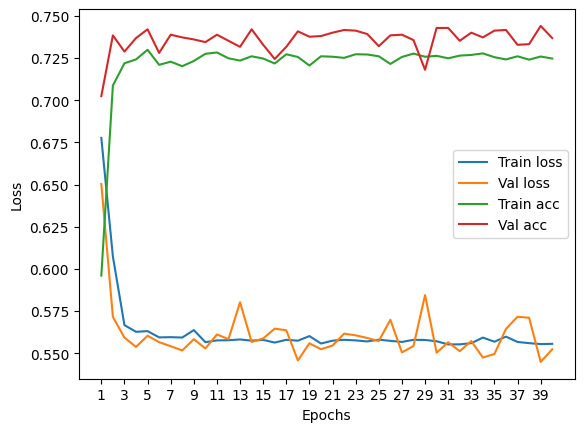

****************************************************************************************************



118it [00:00, 232.98it/s]


Train Epoch: 0 	Loss: 0.684428, Accuracy: 4291/7500 (57%)
Val Epoch: 0 	Loss: 0.661602, Accuracy: 1717/2500 (69%)



118it [00:00, 230.49it/s]


Train Epoch: 1 	Loss: 0.603906, Accuracy: 5277/7500 (70%)
Val Epoch: 1 	Loss: 0.572168, Accuracy: 1823/2500 (73%)



118it [00:00, 233.57it/s]


Train Epoch: 2 	Loss: 0.556432, Accuracy: 5460/7500 (73%)
Val Epoch: 2 	Loss: 0.570792, Accuracy: 1818/2500 (73%)



118it [00:00, 226.49it/s]


Train Epoch: 3 	Loss: 0.549697, Accuracy: 5483/7500 (73%)
Val Epoch: 3 	Loss: 0.556676, Accuracy: 1836/2500 (73%)



118it [00:00, 172.00it/s]


Train Epoch: 4 	Loss: 0.549986, Accuracy: 5471/7500 (73%)
Val Epoch: 4 	Loss: 0.546096, Accuracy: 1844/2500 (74%)



118it [00:00, 199.94it/s]


Train Epoch: 5 	Loss: 0.547127, Accuracy: 5446/7500 (73%)
Val Epoch: 5 	Loss: 0.559041, Accuracy: 1839/2500 (74%)



118it [00:00, 175.58it/s]


Train Epoch: 6 	Loss: 0.546856, Accuracy: 5462/7500 (73%)
Val Epoch: 6 	Loss: 0.550479, Accuracy: 1837/2500 (73%)



118it [00:00, 229.76it/s]


Train Epoch: 7 	Loss: 0.546169, Accuracy: 5477/7500 (73%)
Val Epoch: 7 	Loss: 0.542076, Accuracy: 1844/2500 (74%)



118it [00:00, 233.57it/s]


Train Epoch: 8 	Loss: 0.543330, Accuracy: 5496/7500 (73%)
Val Epoch: 8 	Loss: 0.550515, Accuracy: 1840/2500 (74%)



118it [00:00, 234.84it/s]


Train Epoch: 9 	Loss: 0.545193, Accuracy: 5484/7500 (73%)
Val Epoch: 9 	Loss: 0.552342, Accuracy: 1836/2500 (73%)



118it [00:00, 231.42it/s]


Train Epoch: 10 	Loss: 0.547564, Accuracy: 5460/7500 (73%)
Val Epoch: 10 	Loss: 0.542310, Accuracy: 1847/2500 (74%)



118it [00:00, 222.77it/s]


Train Epoch: 11 	Loss: 0.548672, Accuracy: 5471/7500 (73%)
Val Epoch: 11 	Loss: 0.548038, Accuracy: 1839/2500 (74%)



118it [00:00, 189.19it/s]


Train Epoch: 12 	Loss: 0.543250, Accuracy: 5480/7500 (73%)
Val Epoch: 12 	Loss: 0.549002, Accuracy: 1841/2500 (74%)



118it [00:00, 194.51it/s]


Train Epoch: 13 	Loss: 0.542965, Accuracy: 5481/7500 (73%)
Val Epoch: 13 	Loss: 0.558544, Accuracy: 1843/2500 (74%)



118it [00:00, 199.56it/s]


Train Epoch: 14 	Loss: 0.542702, Accuracy: 5479/7500 (73%)
Val Epoch: 14 	Loss: 0.544366, Accuracy: 1846/2500 (74%)



118it [00:00, 230.58it/s]


Train Epoch: 15 	Loss: 0.544962, Accuracy: 5472/7500 (73%)
Val Epoch: 15 	Loss: 0.546688, Accuracy: 1842/2500 (74%)



118it [00:00, 234.57it/s]


Train Epoch: 16 	Loss: 0.543172, Accuracy: 5463/7500 (73%)
Val Epoch: 16 	Loss: 0.542577, Accuracy: 1842/2500 (74%)



118it [00:00, 237.91it/s]


Train Epoch: 17 	Loss: 0.544635, Accuracy: 5470/7500 (73%)
Val Epoch: 17 	Loss: 0.546446, Accuracy: 1849/2500 (74%)



118it [00:00, 189.87it/s]


Train Epoch: 18 	Loss: 0.544579, Accuracy: 5476/7500 (73%)
Val Epoch: 18 	Loss: 0.549470, Accuracy: 1839/2500 (74%)



118it [00:00, 233.30it/s]


Train Epoch: 19 	Loss: 0.544548, Accuracy: 5475/7500 (73%)
Val Epoch: 19 	Loss: 0.548318, Accuracy: 1847/2500 (74%)



118it [00:00, 232.61it/s]


Train Epoch: 20 	Loss: 0.543758, Accuracy: 5506/7500 (73%)
Val Epoch: 20 	Loss: 0.552558, Accuracy: 1839/2500 (74%)



118it [00:00, 234.70it/s]


Train Epoch: 21 	Loss: 0.542303, Accuracy: 5496/7500 (73%)
Val Epoch: 21 	Loss: 0.538891, Accuracy: 1847/2500 (74%)



118it [00:00, 220.89it/s]


Train Epoch: 22 	Loss: 0.543903, Accuracy: 5482/7500 (73%)
Val Epoch: 22 	Loss: 0.543448, Accuracy: 1837/2500 (73%)



118it [00:00, 225.33it/s]


Train Epoch: 23 	Loss: 0.546323, Accuracy: 5493/7500 (73%)
Val Epoch: 23 	Loss: 0.559289, Accuracy: 1807/2500 (72%)



118it [00:00, 236.83it/s]


Train Epoch: 24 	Loss: 0.543069, Accuracy: 5475/7500 (73%)
Val Epoch: 24 	Loss: 0.548290, Accuracy: 1844/2500 (74%)



118it [00:00, 235.32it/s]


Train Epoch: 25 	Loss: 0.542347, Accuracy: 5486/7500 (73%)
Val Epoch: 25 	Loss: 0.554636, Accuracy: 1837/2500 (73%)



118it [00:00, 214.78it/s]


Train Epoch: 26 	Loss: 0.544071, Accuracy: 5462/7500 (73%)
Val Epoch: 26 	Loss: 0.558420, Accuracy: 1842/2500 (74%)



118it [00:00, 168.45it/s]


Train Epoch: 27 	Loss: 0.543498, Accuracy: 5480/7500 (73%)
Val Epoch: 27 	Loss: 0.541832, Accuracy: 1842/2500 (74%)



118it [00:00, 163.60it/s]


Train Epoch: 28 	Loss: 0.543152, Accuracy: 5497/7500 (73%)
Val Epoch: 28 	Loss: 0.548348, Accuracy: 1841/2500 (74%)



118it [00:00, 164.16it/s]


Train Epoch: 29 	Loss: 0.542353, Accuracy: 5487/7500 (73%)
Val Epoch: 29 	Loss: 0.545144, Accuracy: 1845/2500 (74%)



118it [00:00, 152.82it/s]


Train Epoch: 30 	Loss: 0.543751, Accuracy: 5477/7500 (73%)
Val Epoch: 30 	Loss: 0.548609, Accuracy: 1844/2500 (74%)



118it [00:00, 196.16it/s]


Train Epoch: 31 	Loss: 0.546245, Accuracy: 5472/7500 (73%)
Val Epoch: 31 	Loss: 0.565109, Accuracy: 1834/2500 (73%)



118it [00:00, 238.07it/s]


Train Epoch: 32 	Loss: 0.545554, Accuracy: 5488/7500 (73%)
Val Epoch: 32 	Loss: 0.548432, Accuracy: 1835/2500 (73%)



118it [00:00, 223.38it/s]


Train Epoch: 33 	Loss: 0.545129, Accuracy: 5496/7500 (73%)
Val Epoch: 33 	Loss: 0.547121, Accuracy: 1841/2500 (74%)



118it [00:00, 237.04it/s]


Train Epoch: 34 	Loss: 0.543691, Accuracy: 5498/7500 (73%)
Val Epoch: 34 	Loss: 0.543149, Accuracy: 1847/2500 (74%)



118it [00:00, 227.72it/s]


Train Epoch: 35 	Loss: 0.542188, Accuracy: 5474/7500 (73%)
Val Epoch: 35 	Loss: 0.562964, Accuracy: 1839/2500 (74%)



118it [00:00, 222.81it/s]


Train Epoch: 36 	Loss: 0.544987, Accuracy: 5465/7500 (73%)
Val Epoch: 36 	Loss: 0.543338, Accuracy: 1844/2500 (74%)



118it [00:00, 236.52it/s]


Train Epoch: 37 	Loss: 0.545778, Accuracy: 5488/7500 (73%)
Val Epoch: 37 	Loss: 0.558624, Accuracy: 1791/2500 (72%)



118it [00:00, 228.79it/s]


Train Epoch: 38 	Loss: 0.545676, Accuracy: 5458/7500 (73%)
Val Epoch: 38 	Loss: 0.547665, Accuracy: 1843/2500 (74%)



118it [00:00, 199.68it/s]


Train Epoch: 39 	Loss: 0.545534, Accuracy: 5484/7500 (73%)
Val Epoch: 39 	Loss: 0.556726, Accuracy: 1853/2500 (74%)

Test accuracy:  74.2


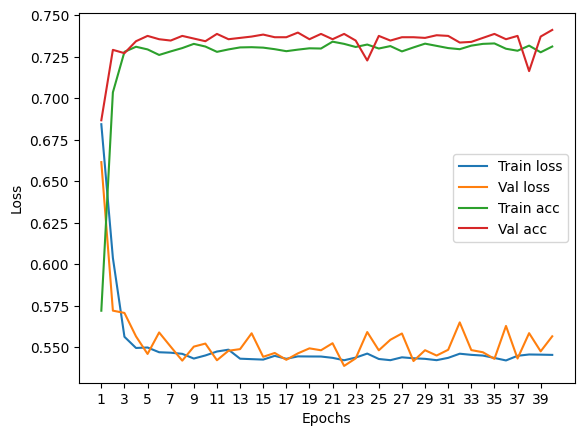

****************************************************************************************************



118it [00:00, 215.82it/s]


Train Epoch: 0 	Loss: 0.677043, Accuracy: 4607/7500 (61%)
Val Epoch: 0 	Loss: 0.647722, Accuracy: 1747/2500 (70%)



118it [00:00, 236.53it/s]


Train Epoch: 1 	Loss: 0.596828, Accuracy: 5339/7500 (71%)
Val Epoch: 1 	Loss: 0.577258, Accuracy: 1792/2500 (72%)



118it [00:00, 233.40it/s]


Train Epoch: 2 	Loss: 0.564890, Accuracy: 5433/7500 (72%)
Val Epoch: 2 	Loss: 0.560522, Accuracy: 1835/2500 (73%)



118it [00:00, 235.07it/s]


Train Epoch: 3 	Loss: 0.554840, Accuracy: 5450/7500 (73%)
Val Epoch: 3 	Loss: 0.557732, Accuracy: 1836/2500 (73%)



118it [00:00, 230.55it/s]


Train Epoch: 4 	Loss: 0.555310, Accuracy: 5472/7500 (73%)
Val Epoch: 4 	Loss: 0.564186, Accuracy: 1805/2500 (72%)



118it [00:00, 230.77it/s]


Train Epoch: 5 	Loss: 0.554748, Accuracy: 5462/7500 (73%)
Val Epoch: 5 	Loss: 0.558454, Accuracy: 1815/2500 (73%)



118it [00:00, 229.26it/s]


Train Epoch: 6 	Loss: 0.555951, Accuracy: 5450/7500 (73%)
Val Epoch: 6 	Loss: 0.567406, Accuracy: 1842/2500 (74%)



118it [00:00, 229.58it/s]


Train Epoch: 7 	Loss: 0.556842, Accuracy: 5443/7500 (73%)
Val Epoch: 7 	Loss: 0.562633, Accuracy: 1837/2500 (73%)



118it [00:00, 235.34it/s]


Train Epoch: 8 	Loss: 0.558291, Accuracy: 5403/7500 (72%)
Val Epoch: 8 	Loss: 0.565592, Accuracy: 1842/2500 (74%)



118it [00:00, 234.53it/s]


Train Epoch: 9 	Loss: 0.556348, Accuracy: 5463/7500 (73%)
Val Epoch: 9 	Loss: 0.557415, Accuracy: 1849/2500 (74%)



118it [00:00, 233.71it/s]


Train Epoch: 10 	Loss: 0.552958, Accuracy: 5463/7500 (73%)
Val Epoch: 10 	Loss: 0.552285, Accuracy: 1840/2500 (74%)



118it [00:00, 236.37it/s]


Train Epoch: 11 	Loss: 0.552626, Accuracy: 5487/7500 (73%)
Val Epoch: 11 	Loss: 0.567871, Accuracy: 1825/2500 (73%)



118it [00:00, 233.88it/s]


Train Epoch: 12 	Loss: 0.554918, Accuracy: 5455/7500 (73%)
Val Epoch: 12 	Loss: 0.555016, Accuracy: 1831/2500 (73%)



118it [00:00, 233.26it/s]


Train Epoch: 13 	Loss: 0.554808, Accuracy: 5476/7500 (73%)
Val Epoch: 13 	Loss: 0.556211, Accuracy: 1836/2500 (73%)



118it [00:00, 228.63it/s]


Train Epoch: 14 	Loss: 0.552551, Accuracy: 5467/7500 (73%)
Val Epoch: 14 	Loss: 0.557265, Accuracy: 1835/2500 (73%)



118it [00:00, 234.69it/s]


Train Epoch: 15 	Loss: 0.550992, Accuracy: 5494/7500 (73%)
Val Epoch: 15 	Loss: 0.565863, Accuracy: 1844/2500 (74%)



118it [00:00, 236.33it/s]


Train Epoch: 16 	Loss: 0.550388, Accuracy: 5470/7500 (73%)
Val Epoch: 16 	Loss: 0.559956, Accuracy: 1816/2500 (73%)



118it [00:00, 237.07it/s]


Train Epoch: 17 	Loss: 0.551878, Accuracy: 5474/7500 (73%)
Val Epoch: 17 	Loss: 0.570380, Accuracy: 1822/2500 (73%)



118it [00:00, 236.61it/s]


Train Epoch: 18 	Loss: 0.550775, Accuracy: 5485/7500 (73%)
Val Epoch: 18 	Loss: 0.568442, Accuracy: 1797/2500 (72%)



118it [00:00, 236.89it/s]


Train Epoch: 19 	Loss: 0.550857, Accuracy: 5496/7500 (73%)
Val Epoch: 19 	Loss: 0.560525, Accuracy: 1836/2500 (73%)



118it [00:00, 239.57it/s]


Train Epoch: 20 	Loss: 0.550724, Accuracy: 5476/7500 (73%)
Val Epoch: 20 	Loss: 0.564963, Accuracy: 1839/2500 (74%)



118it [00:00, 203.27it/s]


Train Epoch: 21 	Loss: 0.550266, Accuracy: 5462/7500 (73%)
Val Epoch: 21 	Loss: 0.561001, Accuracy: 1835/2500 (73%)



118it [00:00, 171.42it/s]


Train Epoch: 22 	Loss: 0.551277, Accuracy: 5455/7500 (73%)
Val Epoch: 22 	Loss: 0.556556, Accuracy: 1828/2500 (73%)



118it [00:00, 199.00it/s]


Train Epoch: 23 	Loss: 0.551821, Accuracy: 5479/7500 (73%)
Val Epoch: 23 	Loss: 0.554019, Accuracy: 1846/2500 (74%)



118it [00:00, 198.91it/s]


Train Epoch: 24 	Loss: 0.551682, Accuracy: 5489/7500 (73%)
Val Epoch: 24 	Loss: 0.562351, Accuracy: 1847/2500 (74%)



118it [00:00, 237.13it/s]


Train Epoch: 25 	Loss: 0.550306, Accuracy: 5447/7500 (73%)
Val Epoch: 25 	Loss: 0.575787, Accuracy: 1828/2500 (73%)



118it [00:00, 235.64it/s]


Train Epoch: 26 	Loss: 0.551273, Accuracy: 5478/7500 (73%)
Val Epoch: 26 	Loss: 0.571672, Accuracy: 1840/2500 (74%)



118it [00:00, 238.10it/s]


Train Epoch: 27 	Loss: 0.551954, Accuracy: 5492/7500 (73%)
Val Epoch: 27 	Loss: 0.558041, Accuracy: 1831/2500 (73%)



118it [00:00, 234.01it/s]


Train Epoch: 28 	Loss: 0.549946, Accuracy: 5480/7500 (73%)
Val Epoch: 28 	Loss: 0.561087, Accuracy: 1840/2500 (74%)



118it [00:00, 227.53it/s]


Train Epoch: 29 	Loss: 0.553247, Accuracy: 5476/7500 (73%)
Val Epoch: 29 	Loss: 0.553800, Accuracy: 1837/2500 (73%)



118it [00:00, 229.25it/s]


Train Epoch: 30 	Loss: 0.551791, Accuracy: 5484/7500 (73%)
Val Epoch: 30 	Loss: 0.552428, Accuracy: 1829/2500 (73%)



118it [00:00, 238.08it/s]


Train Epoch: 31 	Loss: 0.550525, Accuracy: 5473/7500 (73%)
Val Epoch: 31 	Loss: 0.560731, Accuracy: 1836/2500 (73%)



118it [00:00, 224.47it/s]


Train Epoch: 32 	Loss: 0.551878, Accuracy: 5479/7500 (73%)
Val Epoch: 32 	Loss: 0.558384, Accuracy: 1843/2500 (74%)



118it [00:00, 233.11it/s]


Train Epoch: 33 	Loss: 0.550920, Accuracy: 5474/7500 (73%)
Val Epoch: 33 	Loss: 0.553058, Accuracy: 1841/2500 (74%)



118it [00:00, 230.48it/s]


Train Epoch: 34 	Loss: 0.551478, Accuracy: 5503/7500 (73%)
Val Epoch: 34 	Loss: 0.560240, Accuracy: 1834/2500 (73%)



118it [00:00, 234.27it/s]


Train Epoch: 35 	Loss: 0.551915, Accuracy: 5470/7500 (73%)
Val Epoch: 35 	Loss: 0.551347, Accuracy: 1841/2500 (74%)



118it [00:00, 232.42it/s]


Train Epoch: 36 	Loss: 0.548745, Accuracy: 5461/7500 (73%)
Val Epoch: 36 	Loss: 0.556525, Accuracy: 1844/2500 (74%)



118it [00:00, 235.30it/s]


Train Epoch: 37 	Loss: 0.549520, Accuracy: 5469/7500 (73%)
Val Epoch: 37 	Loss: 0.554311, Accuracy: 1832/2500 (73%)



118it [00:00, 234.52it/s]


Train Epoch: 38 	Loss: 0.552462, Accuracy: 5473/7500 (73%)
Val Epoch: 38 	Loss: 0.556535, Accuracy: 1835/2500 (73%)



118it [00:00, 234.44it/s]


Train Epoch: 39 	Loss: 0.552163, Accuracy: 5472/7500 (73%)
Val Epoch: 39 	Loss: 0.556759, Accuracy: 1834/2500 (73%)

Test accuracy:  74.0


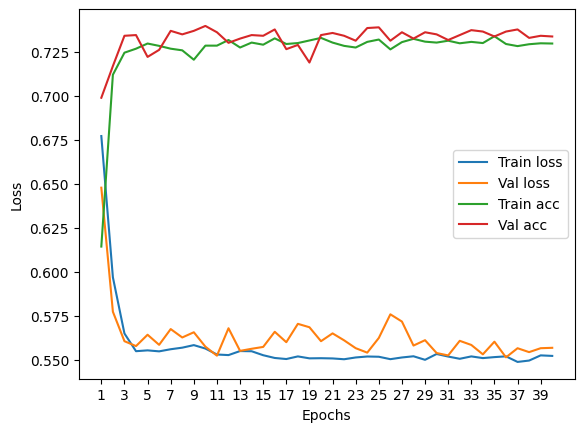

****************************************************************************************************



118it [00:00, 214.10it/s]


Train Epoch: 0 	Loss: 0.676862, Accuracy: 4420/7500 (59%)
Val Epoch: 0 	Loss: 0.651317, Accuracy: 1743/2500 (70%)



118it [00:00, 225.15it/s]


Train Epoch: 1 	Loss: 0.591344, Accuracy: 5381/7500 (72%)
Val Epoch: 1 	Loss: 0.584386, Accuracy: 1808/2500 (72%)



118it [00:00, 237.72it/s]


Train Epoch: 2 	Loss: 0.557244, Accuracy: 5425/7500 (72%)
Val Epoch: 2 	Loss: 0.573578, Accuracy: 1798/2500 (72%)



118it [00:00, 233.54it/s]


Train Epoch: 3 	Loss: 0.551149, Accuracy: 5456/7500 (73%)
Val Epoch: 3 	Loss: 0.570718, Accuracy: 1809/2500 (72%)



118it [00:00, 223.26it/s]


Train Epoch: 4 	Loss: 0.551225, Accuracy: 5444/7500 (73%)
Val Epoch: 4 	Loss: 0.578634, Accuracy: 1790/2500 (72%)



118it [00:00, 235.77it/s]


Train Epoch: 5 	Loss: 0.548360, Accuracy: 5453/7500 (73%)
Val Epoch: 5 	Loss: 0.571192, Accuracy: 1803/2500 (72%)



118it [00:00, 232.18it/s]


Train Epoch: 6 	Loss: 0.548074, Accuracy: 5462/7500 (73%)
Val Epoch: 6 	Loss: 0.582421, Accuracy: 1795/2500 (72%)



118it [00:00, 218.04it/s]


Train Epoch: 7 	Loss: 0.549052, Accuracy: 5440/7500 (73%)
Val Epoch: 7 	Loss: 0.565586, Accuracy: 1815/2500 (73%)



118it [00:00, 234.64it/s]


Train Epoch: 8 	Loss: 0.548941, Accuracy: 5438/7500 (73%)
Val Epoch: 8 	Loss: 0.574265, Accuracy: 1818/2500 (73%)



118it [00:00, 236.65it/s]


Train Epoch: 9 	Loss: 0.548902, Accuracy: 5461/7500 (73%)
Val Epoch: 9 	Loss: 0.572412, Accuracy: 1797/2500 (72%)



118it [00:00, 217.85it/s]


Train Epoch: 10 	Loss: 0.548036, Accuracy: 5445/7500 (73%)
Val Epoch: 10 	Loss: 0.574365, Accuracy: 1803/2500 (72%)



118it [00:00, 232.90it/s]


Train Epoch: 11 	Loss: 0.546504, Accuracy: 5460/7500 (73%)
Val Epoch: 11 	Loss: 0.570606, Accuracy: 1809/2500 (72%)



118it [00:00, 222.16it/s]


Train Epoch: 12 	Loss: 0.546964, Accuracy: 5442/7500 (73%)
Val Epoch: 12 	Loss: 0.574883, Accuracy: 1804/2500 (72%)



118it [00:00, 236.38it/s]


Train Epoch: 13 	Loss: 0.546501, Accuracy: 5447/7500 (73%)
Val Epoch: 13 	Loss: 0.583717, Accuracy: 1805/2500 (72%)



118it [00:00, 229.85it/s]


Train Epoch: 14 	Loss: 0.549047, Accuracy: 5454/7500 (73%)
Val Epoch: 14 	Loss: 0.590638, Accuracy: 1784/2500 (71%)



118it [00:00, 236.33it/s]


Train Epoch: 15 	Loss: 0.549060, Accuracy: 5451/7500 (73%)
Val Epoch: 15 	Loss: 0.580727, Accuracy: 1810/2500 (72%)



118it [00:00, 238.80it/s]


Train Epoch: 16 	Loss: 0.548043, Accuracy: 5489/7500 (73%)
Val Epoch: 16 	Loss: 0.569526, Accuracy: 1808/2500 (72%)



118it [00:00, 189.96it/s]


Train Epoch: 17 	Loss: 0.547563, Accuracy: 5468/7500 (73%)
Val Epoch: 17 	Loss: 0.573792, Accuracy: 1806/2500 (72%)



118it [00:00, 148.80it/s]


Train Epoch: 18 	Loss: 0.545849, Accuracy: 5484/7500 (73%)
Val Epoch: 18 	Loss: 0.568873, Accuracy: 1807/2500 (72%)



118it [00:00, 189.65it/s]


Train Epoch: 19 	Loss: 0.549001, Accuracy: 5473/7500 (73%)
Val Epoch: 19 	Loss: 0.578111, Accuracy: 1815/2500 (73%)



118it [00:00, 212.99it/s]


Train Epoch: 20 	Loss: 0.547015, Accuracy: 5478/7500 (73%)
Val Epoch: 20 	Loss: 0.567996, Accuracy: 1822/2500 (73%)



118it [00:00, 234.59it/s]


Train Epoch: 21 	Loss: 0.545464, Accuracy: 5459/7500 (73%)
Val Epoch: 21 	Loss: 0.565475, Accuracy: 1816/2500 (73%)



118it [00:00, 235.46it/s]


Train Epoch: 22 	Loss: 0.546567, Accuracy: 5449/7500 (73%)
Val Epoch: 22 	Loss: 0.568946, Accuracy: 1822/2500 (73%)



118it [00:00, 237.58it/s]


Train Epoch: 23 	Loss: 0.545501, Accuracy: 5443/7500 (73%)
Val Epoch: 23 	Loss: 0.566090, Accuracy: 1825/2500 (73%)



118it [00:00, 231.10it/s]


Train Epoch: 24 	Loss: 0.545489, Accuracy: 5463/7500 (73%)
Val Epoch: 24 	Loss: 0.571046, Accuracy: 1815/2500 (73%)



118it [00:00, 229.89it/s]


Train Epoch: 25 	Loss: 0.545525, Accuracy: 5460/7500 (73%)
Val Epoch: 25 	Loss: 0.583382, Accuracy: 1801/2500 (72%)



118it [00:00, 237.98it/s]


Train Epoch: 26 	Loss: 0.546286, Accuracy: 5468/7500 (73%)
Val Epoch: 26 	Loss: 0.576983, Accuracy: 1823/2500 (73%)



118it [00:00, 235.43it/s]


Train Epoch: 27 	Loss: 0.547123, Accuracy: 5448/7500 (73%)
Val Epoch: 27 	Loss: 0.580290, Accuracy: 1815/2500 (73%)



118it [00:00, 217.39it/s]


Train Epoch: 28 	Loss: 0.546714, Accuracy: 5469/7500 (73%)
Val Epoch: 28 	Loss: 0.572966, Accuracy: 1820/2500 (73%)



118it [00:00, 199.95it/s]


Train Epoch: 29 	Loss: 0.548770, Accuracy: 5426/7500 (72%)
Val Epoch: 29 	Loss: 0.580918, Accuracy: 1785/2500 (71%)



118it [00:00, 237.15it/s]


Train Epoch: 30 	Loss: 0.545845, Accuracy: 5486/7500 (73%)
Val Epoch: 30 	Loss: 0.579857, Accuracy: 1819/2500 (73%)



118it [00:00, 233.47it/s]


Train Epoch: 31 	Loss: 0.545010, Accuracy: 5463/7500 (73%)
Val Epoch: 31 	Loss: 0.570368, Accuracy: 1825/2500 (73%)



118it [00:00, 232.85it/s]


Train Epoch: 32 	Loss: 0.545858, Accuracy: 5469/7500 (73%)
Val Epoch: 32 	Loss: 0.567146, Accuracy: 1799/2500 (72%)



118it [00:00, 237.39it/s]


Train Epoch: 33 	Loss: 0.546454, Accuracy: 5457/7500 (73%)
Val Epoch: 33 	Loss: 0.573882, Accuracy: 1806/2500 (72%)



118it [00:00, 235.69it/s]


Train Epoch: 34 	Loss: 0.545561, Accuracy: 5451/7500 (73%)
Val Epoch: 34 	Loss: 0.571436, Accuracy: 1822/2500 (73%)



118it [00:00, 233.91it/s]


Train Epoch: 35 	Loss: 0.546322, Accuracy: 5468/7500 (73%)
Val Epoch: 35 	Loss: 0.571401, Accuracy: 1792/2500 (72%)



118it [00:00, 191.50it/s]


Train Epoch: 36 	Loss: 0.547985, Accuracy: 5454/7500 (73%)
Val Epoch: 36 	Loss: 0.566094, Accuracy: 1818/2500 (73%)



118it [00:00, 221.79it/s]


Train Epoch: 37 	Loss: 0.546742, Accuracy: 5455/7500 (73%)
Val Epoch: 37 	Loss: 0.581029, Accuracy: 1803/2500 (72%)



118it [00:00, 235.12it/s]


Train Epoch: 38 	Loss: 0.546533, Accuracy: 5474/7500 (73%)
Val Epoch: 38 	Loss: 0.569950, Accuracy: 1811/2500 (72%)



118it [00:00, 234.86it/s]


Train Epoch: 39 	Loss: 0.548331, Accuracy: 5460/7500 (73%)
Val Epoch: 39 	Loss: 0.569139, Accuracy: 1826/2500 (73%)

Test accuracy:  73.8


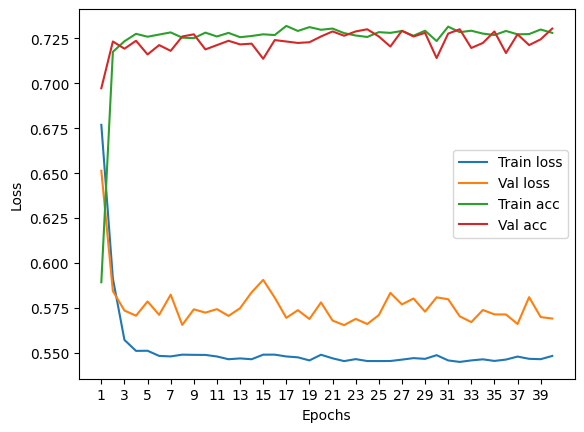

****************************************************************************************************



118it [00:00, 239.36it/s]


Train Epoch: 0 	Loss: 0.675100, Accuracy: 4501/7500 (60%)
Val Epoch: 0 	Loss: 0.637619, Accuracy: 1748/2500 (70%)



118it [00:00, 233.61it/s]


Train Epoch: 1 	Loss: 0.593233, Accuracy: 5342/7500 (71%)
Val Epoch: 1 	Loss: 0.571919, Accuracy: 1827/2500 (73%)



118it [00:00, 229.72it/s]


Train Epoch: 2 	Loss: 0.566883, Accuracy: 5414/7500 (72%)
Val Epoch: 2 	Loss: 0.562088, Accuracy: 1838/2500 (74%)



118it [00:00, 240.06it/s]


Train Epoch: 3 	Loss: 0.560705, Accuracy: 5446/7500 (73%)
Val Epoch: 3 	Loss: 0.550902, Accuracy: 1830/2500 (73%)



118it [00:00, 237.41it/s]


Train Epoch: 4 	Loss: 0.559642, Accuracy: 5442/7500 (73%)
Val Epoch: 4 	Loss: 0.548716, Accuracy: 1831/2500 (73%)



118it [00:00, 233.54it/s]


Train Epoch: 5 	Loss: 0.558871, Accuracy: 5416/7500 (72%)
Val Epoch: 5 	Loss: 0.553935, Accuracy: 1839/2500 (74%)



118it [00:00, 225.39it/s]


Train Epoch: 6 	Loss: 0.557722, Accuracy: 5434/7500 (72%)
Val Epoch: 6 	Loss: 0.581526, Accuracy: 1824/2500 (73%)



118it [00:00, 226.60it/s]


Train Epoch: 7 	Loss: 0.558426, Accuracy: 5434/7500 (72%)
Val Epoch: 7 	Loss: 0.548132, Accuracy: 1842/2500 (74%)



118it [00:00, 235.74it/s]


Train Epoch: 8 	Loss: 0.557613, Accuracy: 5442/7500 (73%)
Val Epoch: 8 	Loss: 0.556525, Accuracy: 1837/2500 (73%)



118it [00:00, 235.97it/s]


Train Epoch: 9 	Loss: 0.560474, Accuracy: 5417/7500 (72%)
Val Epoch: 9 	Loss: 0.546159, Accuracy: 1830/2500 (73%)



118it [00:00, 200.12it/s]


Train Epoch: 10 	Loss: 0.560090, Accuracy: 5426/7500 (72%)
Val Epoch: 10 	Loss: 0.553088, Accuracy: 1824/2500 (73%)



118it [00:00, 175.54it/s]


Train Epoch: 11 	Loss: 0.557635, Accuracy: 5439/7500 (73%)
Val Epoch: 11 	Loss: 0.568067, Accuracy: 1825/2500 (73%)



118it [00:00, 169.35it/s]


Train Epoch: 12 	Loss: 0.560286, Accuracy: 5455/7500 (73%)
Val Epoch: 12 	Loss: 0.552347, Accuracy: 1824/2500 (73%)



118it [00:00, 169.15it/s]


Train Epoch: 13 	Loss: 0.560335, Accuracy: 5424/7500 (72%)
Val Epoch: 13 	Loss: 0.544977, Accuracy: 1853/2500 (74%)



118it [00:00, 182.26it/s]


Train Epoch: 14 	Loss: 0.557511, Accuracy: 5432/7500 (72%)
Val Epoch: 14 	Loss: 0.542763, Accuracy: 1848/2500 (74%)



118it [00:00, 210.08it/s]


Train Epoch: 15 	Loss: 0.559886, Accuracy: 5411/7500 (72%)
Val Epoch: 15 	Loss: 0.551967, Accuracy: 1808/2500 (72%)



118it [00:00, 233.36it/s]


Train Epoch: 16 	Loss: 0.559103, Accuracy: 5418/7500 (72%)
Val Epoch: 16 	Loss: 0.551611, Accuracy: 1812/2500 (72%)



118it [00:00, 194.18it/s]


Train Epoch: 17 	Loss: 0.557626, Accuracy: 5437/7500 (72%)
Val Epoch: 17 	Loss: 0.556575, Accuracy: 1847/2500 (74%)



118it [00:00, 195.92it/s]


Train Epoch: 18 	Loss: 0.555780, Accuracy: 5436/7500 (72%)
Val Epoch: 18 	Loss: 0.545176, Accuracy: 1826/2500 (73%)



118it [00:00, 170.75it/s]


Train Epoch: 19 	Loss: 0.557477, Accuracy: 5445/7500 (73%)
Val Epoch: 19 	Loss: 0.554626, Accuracy: 1820/2500 (73%)



118it [00:00, 189.31it/s]


Train Epoch: 20 	Loss: 0.558604, Accuracy: 5421/7500 (72%)
Val Epoch: 20 	Loss: 0.544978, Accuracy: 1834/2500 (73%)



118it [00:00, 179.43it/s]


Train Epoch: 21 	Loss: 0.556119, Accuracy: 5446/7500 (73%)
Val Epoch: 21 	Loss: 0.542685, Accuracy: 1832/2500 (73%)



118it [00:00, 167.56it/s]


Train Epoch: 22 	Loss: 0.558320, Accuracy: 5434/7500 (72%)
Val Epoch: 22 	Loss: 0.549693, Accuracy: 1848/2500 (74%)



118it [00:00, 184.70it/s]


Train Epoch: 23 	Loss: 0.556307, Accuracy: 5441/7500 (73%)
Val Epoch: 23 	Loss: 0.544535, Accuracy: 1841/2500 (74%)



118it [00:00, 189.29it/s]


Train Epoch: 24 	Loss: 0.557667, Accuracy: 5422/7500 (72%)
Val Epoch: 24 	Loss: 0.548133, Accuracy: 1835/2500 (73%)



118it [00:00, 179.76it/s]


Train Epoch: 25 	Loss: 0.557217, Accuracy: 5436/7500 (72%)
Val Epoch: 25 	Loss: 0.551486, Accuracy: 1838/2500 (74%)



118it [00:00, 173.84it/s]


Train Epoch: 26 	Loss: 0.556545, Accuracy: 5453/7500 (73%)
Val Epoch: 26 	Loss: 0.558897, Accuracy: 1832/2500 (73%)



118it [00:00, 179.31it/s]


Train Epoch: 27 	Loss: 0.556409, Accuracy: 5443/7500 (73%)
Val Epoch: 27 	Loss: 0.542899, Accuracy: 1827/2500 (73%)



118it [00:00, 192.78it/s]


Train Epoch: 28 	Loss: 0.556724, Accuracy: 5456/7500 (73%)
Val Epoch: 28 	Loss: 0.551864, Accuracy: 1836/2500 (73%)



118it [00:00, 225.87it/s]


Train Epoch: 29 	Loss: 0.554972, Accuracy: 5431/7500 (72%)
Val Epoch: 29 	Loss: 0.549304, Accuracy: 1837/2500 (73%)



118it [00:00, 187.58it/s]


Train Epoch: 30 	Loss: 0.557559, Accuracy: 5429/7500 (72%)
Val Epoch: 30 	Loss: 0.546660, Accuracy: 1848/2500 (74%)



118it [00:00, 225.56it/s]


Train Epoch: 31 	Loss: 0.556694, Accuracy: 5429/7500 (72%)
Val Epoch: 31 	Loss: 0.548066, Accuracy: 1842/2500 (74%)



118it [00:00, 191.63it/s]


Train Epoch: 32 	Loss: 0.555480, Accuracy: 5422/7500 (72%)
Val Epoch: 32 	Loss: 0.550794, Accuracy: 1829/2500 (73%)



118it [00:00, 175.11it/s]


Train Epoch: 33 	Loss: 0.556326, Accuracy: 5435/7500 (72%)
Val Epoch: 33 	Loss: 0.554279, Accuracy: 1832/2500 (73%)



118it [00:00, 192.13it/s]


Train Epoch: 34 	Loss: 0.557549, Accuracy: 5439/7500 (73%)
Val Epoch: 34 	Loss: 0.555509, Accuracy: 1837/2500 (73%)



118it [00:00, 205.33it/s]


Train Epoch: 35 	Loss: 0.556266, Accuracy: 5463/7500 (73%)
Val Epoch: 35 	Loss: 0.552046, Accuracy: 1838/2500 (74%)



118it [00:00, 235.34it/s]


Train Epoch: 36 	Loss: 0.555687, Accuracy: 5442/7500 (73%)
Val Epoch: 36 	Loss: 0.570145, Accuracy: 1825/2500 (73%)



118it [00:00, 236.01it/s]


Train Epoch: 37 	Loss: 0.557821, Accuracy: 5442/7500 (73%)
Val Epoch: 37 	Loss: 0.544354, Accuracy: 1830/2500 (73%)



118it [00:00, 233.38it/s]


Train Epoch: 38 	Loss: 0.556562, Accuracy: 5412/7500 (72%)
Val Epoch: 38 	Loss: 0.550863, Accuracy: 1834/2500 (73%)



118it [00:00, 210.56it/s]


Train Epoch: 39 	Loss: 0.554281, Accuracy: 5431/7500 (72%)
Val Epoch: 39 	Loss: 0.544502, Accuracy: 1835/2500 (73%)

Test accuracy:  71.32


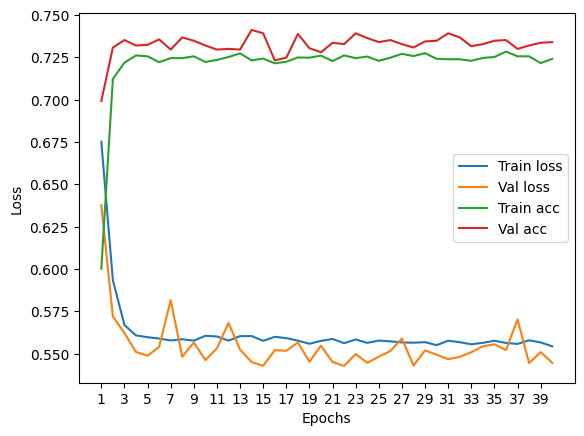

****************************************************************************************************



118it [00:00, 197.88it/s]


Train Epoch: 0 	Loss: 0.684354, Accuracy: 4284/7500 (57%)
Val Epoch: 0 	Loss: 0.659007, Accuracy: 1742/2500 (70%)



118it [00:00, 228.11it/s]


Train Epoch: 1 	Loss: 0.609781, Accuracy: 5266/7500 (70%)
Val Epoch: 1 	Loss: 0.593396, Accuracy: 1769/2500 (71%)



118it [00:00, 227.25it/s]


Train Epoch: 2 	Loss: 0.564750, Accuracy: 5415/7500 (72%)
Val Epoch: 2 	Loss: 0.586343, Accuracy: 1784/2500 (71%)



118it [00:00, 201.42it/s]


Train Epoch: 3 	Loss: 0.552852, Accuracy: 5429/7500 (72%)
Val Epoch: 3 	Loss: 0.567207, Accuracy: 1792/2500 (72%)



118it [00:00, 171.28it/s]


Train Epoch: 4 	Loss: 0.553351, Accuracy: 5453/7500 (73%)
Val Epoch: 4 	Loss: 0.566593, Accuracy: 1795/2500 (72%)



118it [00:00, 191.91it/s]


Train Epoch: 5 	Loss: 0.554112, Accuracy: 5456/7500 (73%)
Val Epoch: 5 	Loss: 0.568603, Accuracy: 1796/2500 (72%)



118it [00:00, 201.14it/s]


Train Epoch: 6 	Loss: 0.552894, Accuracy: 5446/7500 (73%)
Val Epoch: 6 	Loss: 0.577930, Accuracy: 1805/2500 (72%)



118it [00:00, 237.76it/s]


Train Epoch: 7 	Loss: 0.551550, Accuracy: 5445/7500 (73%)
Val Epoch: 7 	Loss: 0.566786, Accuracy: 1802/2500 (72%)



118it [00:00, 231.92it/s]


Train Epoch: 8 	Loss: 0.550995, Accuracy: 5451/7500 (73%)
Val Epoch: 8 	Loss: 0.570816, Accuracy: 1795/2500 (72%)



118it [00:00, 232.95it/s]


Train Epoch: 9 	Loss: 0.550784, Accuracy: 5472/7500 (73%)
Val Epoch: 9 	Loss: 0.574072, Accuracy: 1793/2500 (72%)



118it [00:00, 224.82it/s]


Train Epoch: 10 	Loss: 0.550354, Accuracy: 5463/7500 (73%)
Val Epoch: 10 	Loss: 0.577309, Accuracy: 1790/2500 (72%)



118it [00:00, 238.34it/s]


Train Epoch: 11 	Loss: 0.550692, Accuracy: 5501/7500 (73%)
Val Epoch: 11 	Loss: 0.565630, Accuracy: 1797/2500 (72%)



118it [00:00, 229.74it/s]


Train Epoch: 12 	Loss: 0.550939, Accuracy: 5459/7500 (73%)
Val Epoch: 12 	Loss: 0.575721, Accuracy: 1800/2500 (72%)



118it [00:00, 233.94it/s]


Train Epoch: 13 	Loss: 0.549940, Accuracy: 5472/7500 (73%)
Val Epoch: 13 	Loss: 0.575376, Accuracy: 1779/2500 (71%)



118it [00:00, 211.80it/s]


Train Epoch: 14 	Loss: 0.547752, Accuracy: 5454/7500 (73%)
Val Epoch: 14 	Loss: 0.578766, Accuracy: 1789/2500 (72%)



118it [00:00, 235.45it/s]


Train Epoch: 15 	Loss: 0.549788, Accuracy: 5473/7500 (73%)
Val Epoch: 15 	Loss: 0.562757, Accuracy: 1789/2500 (72%)



118it [00:00, 226.75it/s]


Train Epoch: 16 	Loss: 0.549452, Accuracy: 5468/7500 (73%)
Val Epoch: 16 	Loss: 0.568515, Accuracy: 1791/2500 (72%)



118it [00:00, 226.32it/s]


Train Epoch: 17 	Loss: 0.548640, Accuracy: 5464/7500 (73%)
Val Epoch: 17 	Loss: 0.564116, Accuracy: 1795/2500 (72%)



118it [00:00, 234.19it/s]


Train Epoch: 18 	Loss: 0.548410, Accuracy: 5490/7500 (73%)
Val Epoch: 18 	Loss: 0.566863, Accuracy: 1791/2500 (72%)



118it [00:00, 235.63it/s]


Train Epoch: 19 	Loss: 0.548692, Accuracy: 5473/7500 (73%)
Val Epoch: 19 	Loss: 0.564918, Accuracy: 1792/2500 (72%)



118it [00:00, 150.99it/s]


Train Epoch: 20 	Loss: 0.549196, Accuracy: 5463/7500 (73%)
Val Epoch: 20 	Loss: 0.569440, Accuracy: 1807/2500 (72%)



118it [00:00, 137.23it/s]


Train Epoch: 21 	Loss: 0.548306, Accuracy: 5456/7500 (73%)
Val Epoch: 21 	Loss: 0.572363, Accuracy: 1795/2500 (72%)



118it [00:00, 173.00it/s]


Train Epoch: 22 	Loss: 0.548023, Accuracy: 5438/7500 (73%)
Val Epoch: 22 	Loss: 0.569734, Accuracy: 1787/2500 (71%)



118it [00:01, 108.62it/s]


Train Epoch: 23 	Loss: 0.548663, Accuracy: 5447/7500 (73%)
Val Epoch: 23 	Loss: 0.567238, Accuracy: 1798/2500 (72%)



118it [00:01, 114.31it/s]


Train Epoch: 24 	Loss: 0.546471, Accuracy: 5456/7500 (73%)
Val Epoch: 24 	Loss: 0.568897, Accuracy: 1793/2500 (72%)



118it [00:00, 150.14it/s]


Train Epoch: 25 	Loss: 0.547620, Accuracy: 5463/7500 (73%)
Val Epoch: 25 	Loss: 0.568314, Accuracy: 1804/2500 (72%)



118it [00:00, 169.86it/s]


Train Epoch: 26 	Loss: 0.548794, Accuracy: 5468/7500 (73%)
Val Epoch: 26 	Loss: 0.571250, Accuracy: 1795/2500 (72%)



118it [00:00, 205.49it/s]


Train Epoch: 27 	Loss: 0.547074, Accuracy: 5451/7500 (73%)
Val Epoch: 27 	Loss: 0.568657, Accuracy: 1790/2500 (72%)



118it [00:00, 231.00it/s]


Train Epoch: 28 	Loss: 0.548596, Accuracy: 5499/7500 (73%)
Val Epoch: 28 	Loss: 0.566422, Accuracy: 1795/2500 (72%)



118it [00:00, 229.30it/s]


Train Epoch: 29 	Loss: 0.548351, Accuracy: 5468/7500 (73%)
Val Epoch: 29 	Loss: 0.564001, Accuracy: 1800/2500 (72%)



118it [00:00, 218.45it/s]


Train Epoch: 30 	Loss: 0.547140, Accuracy: 5486/7500 (73%)
Val Epoch: 30 	Loss: 0.563098, Accuracy: 1793/2500 (72%)



118it [00:00, 234.66it/s]


Train Epoch: 31 	Loss: 0.549209, Accuracy: 5478/7500 (73%)
Val Epoch: 31 	Loss: 0.568177, Accuracy: 1787/2500 (71%)



118it [00:00, 234.64it/s]


Train Epoch: 32 	Loss: 0.549096, Accuracy: 5487/7500 (73%)
Val Epoch: 32 	Loss: 0.563821, Accuracy: 1794/2500 (72%)



118it [00:00, 233.71it/s]


Train Epoch: 33 	Loss: 0.549344, Accuracy: 5479/7500 (73%)
Val Epoch: 33 	Loss: 0.567879, Accuracy: 1787/2500 (71%)



118it [00:00, 226.42it/s]


Train Epoch: 34 	Loss: 0.548234, Accuracy: 5478/7500 (73%)
Val Epoch: 34 	Loss: 0.576458, Accuracy: 1793/2500 (72%)



118it [00:00, 227.74it/s]


Train Epoch: 35 	Loss: 0.548260, Accuracy: 5477/7500 (73%)
Val Epoch: 35 	Loss: 0.569250, Accuracy: 1793/2500 (72%)



118it [00:00, 228.71it/s]


Train Epoch: 36 	Loss: 0.548398, Accuracy: 5454/7500 (73%)
Val Epoch: 36 	Loss: 0.572476, Accuracy: 1799/2500 (72%)



118it [00:00, 231.10it/s]


Train Epoch: 37 	Loss: 0.547290, Accuracy: 5477/7500 (73%)
Val Epoch: 37 	Loss: 0.579638, Accuracy: 1800/2500 (72%)



118it [00:00, 236.05it/s]


Train Epoch: 38 	Loss: 0.549203, Accuracy: 5471/7500 (73%)
Val Epoch: 38 	Loss: 0.566611, Accuracy: 1808/2500 (72%)



118it [00:00, 233.61it/s]


Train Epoch: 39 	Loss: 0.547205, Accuracy: 5467/7500 (73%)
Val Epoch: 39 	Loss: 0.569797, Accuracy: 1805/2500 (72%)

Test accuracy:  71.96000000000001


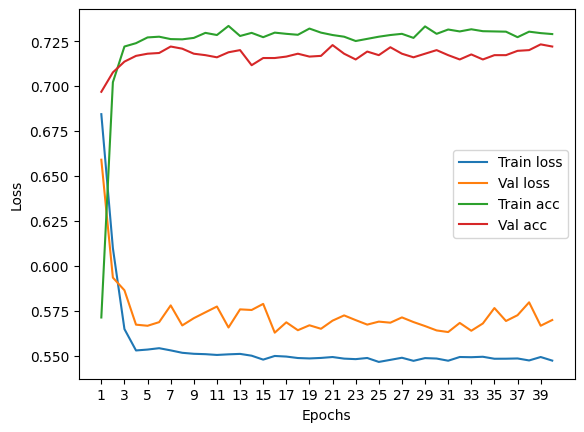

****************************************************************************************************



116it [00:00, 238.30it/s]


Train Epoch: 0 	Loss: 0.670854, Accuracy: 4530/7422 (61%)
Val Epoch: 0 	Loss: 0.646476, Accuracy: 1706/2474 (69%)



116it [00:00, 234.58it/s]


Train Epoch: 1 	Loss: 0.600174, Accuracy: 5296/7422 (71%)
Val Epoch: 1 	Loss: 0.580054, Accuracy: 1779/2474 (72%)



116it [00:00, 238.27it/s]


Train Epoch: 2 	Loss: 0.561327, Accuracy: 5399/7422 (73%)
Val Epoch: 2 	Loss: 0.568893, Accuracy: 1776/2474 (72%)



116it [00:00, 227.39it/s]


Train Epoch: 3 	Loss: 0.554744, Accuracy: 5406/7422 (73%)
Val Epoch: 3 	Loss: 0.564622, Accuracy: 1767/2474 (71%)



116it [00:00, 236.63it/s]


Train Epoch: 4 	Loss: 0.550215, Accuracy: 5431/7422 (73%)
Val Epoch: 4 	Loss: 0.565407, Accuracy: 1764/2474 (71%)



116it [00:00, 234.71it/s]


Train Epoch: 5 	Loss: 0.550474, Accuracy: 5390/7422 (73%)
Val Epoch: 5 	Loss: 0.565480, Accuracy: 1775/2474 (72%)



116it [00:00, 227.45it/s]


Train Epoch: 6 	Loss: 0.550182, Accuracy: 5426/7422 (73%)
Val Epoch: 6 	Loss: 0.563361, Accuracy: 1773/2474 (72%)



116it [00:00, 237.11it/s]


Train Epoch: 7 	Loss: 0.548787, Accuracy: 5420/7422 (73%)
Val Epoch: 7 	Loss: 0.569152, Accuracy: 1768/2474 (71%)



116it [00:00, 225.92it/s]


Train Epoch: 8 	Loss: 0.550034, Accuracy: 5427/7422 (73%)
Val Epoch: 8 	Loss: 0.563999, Accuracy: 1781/2474 (72%)



116it [00:00, 231.29it/s]


Train Epoch: 9 	Loss: 0.549193, Accuracy: 5448/7422 (73%)
Val Epoch: 9 	Loss: 0.564115, Accuracy: 1767/2474 (71%)



116it [00:00, 232.51it/s]


Train Epoch: 10 	Loss: 0.548572, Accuracy: 5430/7422 (73%)
Val Epoch: 10 	Loss: 0.570148, Accuracy: 1757/2474 (71%)



116it [00:00, 226.46it/s]


Train Epoch: 11 	Loss: 0.549471, Accuracy: 5438/7422 (73%)
Val Epoch: 11 	Loss: 0.565258, Accuracy: 1779/2474 (72%)



116it [00:00, 205.84it/s]


Train Epoch: 12 	Loss: 0.548069, Accuracy: 5435/7422 (73%)
Val Epoch: 12 	Loss: 0.564613, Accuracy: 1761/2474 (71%)



116it [00:00, 230.68it/s]


Train Epoch: 13 	Loss: 0.547777, Accuracy: 5445/7422 (73%)
Val Epoch: 13 	Loss: 0.565049, Accuracy: 1773/2474 (72%)



116it [00:00, 229.34it/s]


Train Epoch: 14 	Loss: 0.548628, Accuracy: 5439/7422 (73%)
Val Epoch: 14 	Loss: 0.564949, Accuracy: 1760/2474 (71%)



116it [00:00, 229.99it/s]


Train Epoch: 15 	Loss: 0.550182, Accuracy: 5420/7422 (73%)
Val Epoch: 15 	Loss: 0.563056, Accuracy: 1773/2474 (72%)



116it [00:00, 214.87it/s]


Train Epoch: 16 	Loss: 0.548908, Accuracy: 5425/7422 (73%)
Val Epoch: 16 	Loss: 0.564479, Accuracy: 1768/2474 (71%)



116it [00:00, 238.85it/s]


Train Epoch: 17 	Loss: 0.547617, Accuracy: 5440/7422 (73%)
Val Epoch: 17 	Loss: 0.564683, Accuracy: 1787/2474 (72%)



116it [00:00, 218.38it/s]


Train Epoch: 18 	Loss: 0.548044, Accuracy: 5439/7422 (73%)
Val Epoch: 18 	Loss: 0.564489, Accuracy: 1762/2474 (71%)



116it [00:00, 201.43it/s]


Train Epoch: 19 	Loss: 0.547875, Accuracy: 5451/7422 (73%)
Val Epoch: 19 	Loss: 0.563708, Accuracy: 1776/2474 (72%)



116it [00:00, 169.26it/s]


Train Epoch: 20 	Loss: 0.549336, Accuracy: 5427/7422 (73%)
Val Epoch: 20 	Loss: 0.566405, Accuracy: 1763/2474 (71%)



116it [00:00, 157.06it/s]


Train Epoch: 21 	Loss: 0.548049, Accuracy: 5461/7422 (74%)
Val Epoch: 21 	Loss: 0.565447, Accuracy: 1786/2474 (72%)



116it [00:00, 200.95it/s]


Train Epoch: 22 	Loss: 0.547192, Accuracy: 5447/7422 (73%)
Val Epoch: 22 	Loss: 0.564278, Accuracy: 1770/2474 (72%)



116it [00:00, 229.03it/s]


Train Epoch: 23 	Loss: 0.548038, Accuracy: 5447/7422 (73%)
Val Epoch: 23 	Loss: 0.571278, Accuracy: 1777/2474 (72%)



116it [00:00, 239.28it/s]


Train Epoch: 24 	Loss: 0.547566, Accuracy: 5453/7422 (73%)
Val Epoch: 24 	Loss: 0.563405, Accuracy: 1774/2474 (72%)



116it [00:00, 235.86it/s]


Train Epoch: 25 	Loss: 0.547134, Accuracy: 5451/7422 (73%)
Val Epoch: 25 	Loss: 0.564919, Accuracy: 1784/2474 (72%)



116it [00:00, 231.46it/s]


Train Epoch: 26 	Loss: 0.549581, Accuracy: 5424/7422 (73%)
Val Epoch: 26 	Loss: 0.564500, Accuracy: 1769/2474 (72%)



116it [00:00, 195.98it/s]


Train Epoch: 27 	Loss: 0.548326, Accuracy: 5443/7422 (73%)
Val Epoch: 27 	Loss: 0.569731, Accuracy: 1773/2474 (72%)



116it [00:00, 232.02it/s]


Train Epoch: 28 	Loss: 0.546777, Accuracy: 5453/7422 (73%)
Val Epoch: 28 	Loss: 0.568043, Accuracy: 1776/2474 (72%)



116it [00:00, 235.11it/s]


Train Epoch: 29 	Loss: 0.547010, Accuracy: 5467/7422 (74%)
Val Epoch: 29 	Loss: 0.564424, Accuracy: 1777/2474 (72%)



116it [00:00, 233.54it/s]


Train Epoch: 30 	Loss: 0.546704, Accuracy: 5455/7422 (73%)
Val Epoch: 30 	Loss: 0.569569, Accuracy: 1778/2474 (72%)



116it [00:00, 234.87it/s]


Train Epoch: 31 	Loss: 0.547368, Accuracy: 5449/7422 (73%)
Val Epoch: 31 	Loss: 0.565063, Accuracy: 1775/2474 (72%)



116it [00:00, 233.50it/s]


Train Epoch: 32 	Loss: 0.547036, Accuracy: 5456/7422 (74%)
Val Epoch: 32 	Loss: 0.565720, Accuracy: 1785/2474 (72%)



116it [00:00, 235.48it/s]


Train Epoch: 33 	Loss: 0.546362, Accuracy: 5447/7422 (73%)
Val Epoch: 33 	Loss: 0.564624, Accuracy: 1782/2474 (72%)



116it [00:00, 229.11it/s]


Train Epoch: 34 	Loss: 0.547917, Accuracy: 5429/7422 (73%)
Val Epoch: 34 	Loss: 0.565622, Accuracy: 1756/2474 (71%)



116it [00:00, 232.63it/s]


Train Epoch: 35 	Loss: 0.548315, Accuracy: 5444/7422 (73%)
Val Epoch: 35 	Loss: 0.565135, Accuracy: 1770/2474 (72%)



116it [00:00, 237.50it/s]


Train Epoch: 36 	Loss: 0.547476, Accuracy: 5453/7422 (73%)
Val Epoch: 36 	Loss: 0.567374, Accuracy: 1781/2474 (72%)



116it [00:00, 235.84it/s]


Train Epoch: 37 	Loss: 0.549233, Accuracy: 5462/7422 (74%)
Val Epoch: 37 	Loss: 0.576353, Accuracy: 1761/2474 (71%)



116it [00:00, 232.74it/s]


Train Epoch: 38 	Loss: 0.548470, Accuracy: 5424/7422 (73%)
Val Epoch: 38 	Loss: 0.565549, Accuracy: 1772/2474 (72%)



116it [00:00, 232.59it/s]


Train Epoch: 39 	Loss: 0.548093, Accuracy: 5456/7422 (74%)
Val Epoch: 39 	Loss: 0.564285, Accuracy: 1783/2474 (72%)

Test accuracy:  73.72675828617623


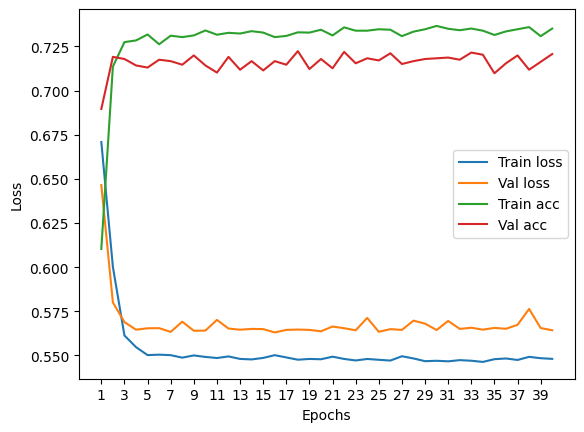

****************************************************************************************************



Particles per jet: 4


118it [00:00, 224.63it/s]


Train Epoch: 0 	Loss: 0.686429, Accuracy: 4294/7500 (57%)
Val Epoch: 0 	Loss: 0.675977, Accuracy: 1584/2500 (63%)



118it [00:00, 226.16it/s]


Train Epoch: 1 	Loss: 0.611293, Accuracy: 5298/7500 (71%)
Val Epoch: 1 	Loss: 0.583562, Accuracy: 1838/2500 (74%)



118it [00:00, 222.98it/s]


Train Epoch: 2 	Loss: 0.556818, Accuracy: 5455/7500 (73%)
Val Epoch: 2 	Loss: 0.567447, Accuracy: 1835/2500 (73%)



118it [00:00, 229.37it/s]


Train Epoch: 3 	Loss: 0.544694, Accuracy: 5505/7500 (73%)
Val Epoch: 3 	Loss: 0.557757, Accuracy: 1837/2500 (73%)



118it [00:00, 227.01it/s]


Train Epoch: 4 	Loss: 0.546881, Accuracy: 5505/7500 (73%)
Val Epoch: 4 	Loss: 0.561242, Accuracy: 1831/2500 (73%)



118it [00:00, 212.46it/s]


Train Epoch: 5 	Loss: 0.544429, Accuracy: 5523/7500 (74%)
Val Epoch: 5 	Loss: 0.561133, Accuracy: 1841/2500 (74%)



118it [00:00, 219.71it/s]


Train Epoch: 6 	Loss: 0.546115, Accuracy: 5489/7500 (73%)
Val Epoch: 6 	Loss: 0.559047, Accuracy: 1840/2500 (74%)



118it [00:00, 229.28it/s]


Train Epoch: 7 	Loss: 0.542799, Accuracy: 5495/7500 (73%)
Val Epoch: 7 	Loss: 0.564214, Accuracy: 1836/2500 (73%)



118it [00:00, 209.63it/s]


Train Epoch: 8 	Loss: 0.544509, Accuracy: 5514/7500 (74%)
Val Epoch: 8 	Loss: 0.563134, Accuracy: 1817/2500 (73%)



118it [00:00, 200.71it/s]


Train Epoch: 9 	Loss: 0.542311, Accuracy: 5506/7500 (73%)
Val Epoch: 9 	Loss: 0.558830, Accuracy: 1834/2500 (73%)



118it [00:00, 232.33it/s]


Train Epoch: 10 	Loss: 0.543491, Accuracy: 5509/7500 (73%)
Val Epoch: 10 	Loss: 0.570600, Accuracy: 1829/2500 (73%)



118it [00:00, 210.48it/s]


Train Epoch: 11 	Loss: 0.542300, Accuracy: 5529/7500 (74%)
Val Epoch: 11 	Loss: 0.570199, Accuracy: 1837/2500 (73%)



118it [00:00, 170.52it/s]


Train Epoch: 12 	Loss: 0.542497, Accuracy: 5524/7500 (74%)
Val Epoch: 12 	Loss: 0.567407, Accuracy: 1820/2500 (73%)



118it [00:00, 189.69it/s]


Train Epoch: 13 	Loss: 0.539691, Accuracy: 5512/7500 (73%)
Val Epoch: 13 	Loss: 0.581166, Accuracy: 1831/2500 (73%)



118it [00:00, 183.00it/s]


Train Epoch: 14 	Loss: 0.543499, Accuracy: 5510/7500 (73%)
Val Epoch: 14 	Loss: 0.562146, Accuracy: 1830/2500 (73%)



118it [00:00, 229.82it/s]


Train Epoch: 15 	Loss: 0.541430, Accuracy: 5521/7500 (74%)
Val Epoch: 15 	Loss: 0.559825, Accuracy: 1839/2500 (74%)



118it [00:00, 236.72it/s]


Train Epoch: 16 	Loss: 0.542832, Accuracy: 5510/7500 (73%)
Val Epoch: 16 	Loss: 0.575498, Accuracy: 1838/2500 (74%)



118it [00:00, 228.70it/s]


Train Epoch: 17 	Loss: 0.542394, Accuracy: 5519/7500 (74%)
Val Epoch: 17 	Loss: 0.566185, Accuracy: 1822/2500 (73%)



118it [00:00, 218.28it/s]


Train Epoch: 18 	Loss: 0.540560, Accuracy: 5525/7500 (74%)
Val Epoch: 18 	Loss: 0.559139, Accuracy: 1825/2500 (73%)



118it [00:00, 235.56it/s]


Train Epoch: 19 	Loss: 0.541563, Accuracy: 5511/7500 (73%)
Val Epoch: 19 	Loss: 0.556087, Accuracy: 1827/2500 (73%)



118it [00:00, 233.91it/s]


Train Epoch: 20 	Loss: 0.541250, Accuracy: 5520/7500 (74%)
Val Epoch: 20 	Loss: 0.579127, Accuracy: 1829/2500 (73%)



118it [00:00, 227.69it/s]


Train Epoch: 21 	Loss: 0.542634, Accuracy: 5545/7500 (74%)
Val Epoch: 21 	Loss: 0.564747, Accuracy: 1827/2500 (73%)



118it [00:00, 233.56it/s]


Train Epoch: 22 	Loss: 0.542292, Accuracy: 5516/7500 (74%)
Val Epoch: 22 	Loss: 0.566436, Accuracy: 1838/2500 (74%)



118it [00:00, 237.08it/s]


Train Epoch: 23 	Loss: 0.542125, Accuracy: 5517/7500 (74%)
Val Epoch: 23 	Loss: 0.565296, Accuracy: 1844/2500 (74%)



118it [00:00, 229.65it/s]


Train Epoch: 24 	Loss: 0.541400, Accuracy: 5525/7500 (74%)
Val Epoch: 24 	Loss: 0.566983, Accuracy: 1810/2500 (72%)



118it [00:00, 231.23it/s]


Train Epoch: 25 	Loss: 0.540618, Accuracy: 5531/7500 (74%)
Val Epoch: 25 	Loss: 0.560946, Accuracy: 1842/2500 (74%)



118it [00:00, 211.86it/s]


Train Epoch: 26 	Loss: 0.541407, Accuracy: 5537/7500 (74%)
Val Epoch: 26 	Loss: 0.575743, Accuracy: 1827/2500 (73%)



118it [00:00, 207.01it/s]


Train Epoch: 27 	Loss: 0.540187, Accuracy: 5547/7500 (74%)
Val Epoch: 27 	Loss: 0.572254, Accuracy: 1823/2500 (73%)



118it [00:00, 204.08it/s]


Train Epoch: 28 	Loss: 0.542685, Accuracy: 5522/7500 (74%)
Val Epoch: 28 	Loss: 0.558043, Accuracy: 1821/2500 (73%)



118it [00:00, 182.29it/s]


Train Epoch: 29 	Loss: 0.541232, Accuracy: 5534/7500 (74%)
Val Epoch: 29 	Loss: 0.568449, Accuracy: 1840/2500 (74%)



118it [00:00, 225.78it/s]


Train Epoch: 30 	Loss: 0.541981, Accuracy: 5529/7500 (74%)
Val Epoch: 30 	Loss: 0.559304, Accuracy: 1842/2500 (74%)



118it [00:00, 201.50it/s]


Train Epoch: 31 	Loss: 0.539310, Accuracy: 5527/7500 (74%)
Val Epoch: 31 	Loss: 0.578227, Accuracy: 1829/2500 (73%)



118it [00:00, 235.14it/s]


Train Epoch: 32 	Loss: 0.542676, Accuracy: 5527/7500 (74%)
Val Epoch: 32 	Loss: 0.566257, Accuracy: 1839/2500 (74%)



118it [00:00, 187.38it/s]


Train Epoch: 33 	Loss: 0.542363, Accuracy: 5521/7500 (74%)
Val Epoch: 33 	Loss: 0.561506, Accuracy: 1836/2500 (73%)



118it [00:00, 186.46it/s]


Train Epoch: 34 	Loss: 0.541403, Accuracy: 5518/7500 (74%)
Val Epoch: 34 	Loss: 0.563745, Accuracy: 1842/2500 (74%)



118it [00:00, 156.21it/s]


Train Epoch: 35 	Loss: 0.541648, Accuracy: 5520/7500 (74%)
Val Epoch: 35 	Loss: 0.566950, Accuracy: 1830/2500 (73%)



118it [00:00, 190.24it/s]


Train Epoch: 36 	Loss: 0.541858, Accuracy: 5530/7500 (74%)
Val Epoch: 36 	Loss: 0.559923, Accuracy: 1832/2500 (73%)



118it [00:00, 205.59it/s]


Train Epoch: 37 	Loss: 0.538392, Accuracy: 5542/7500 (74%)
Val Epoch: 37 	Loss: 0.574539, Accuracy: 1816/2500 (73%)



118it [00:00, 197.62it/s]


Train Epoch: 38 	Loss: 0.542200, Accuracy: 5538/7500 (74%)
Val Epoch: 38 	Loss: 0.559154, Accuracy: 1840/2500 (74%)



118it [00:00, 232.77it/s]


Train Epoch: 39 	Loss: 0.540840, Accuracy: 5535/7500 (74%)
Val Epoch: 39 	Loss: 0.558842, Accuracy: 1833/2500 (73%)

Test accuracy:  73.08


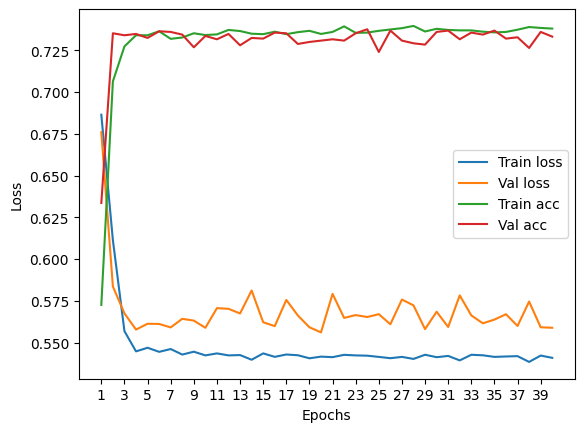

****************************************************************************************************



118it [00:00, 229.53it/s]


Train Epoch: 0 	Loss: 0.676771, Accuracy: 4551/7500 (61%)
Val Epoch: 0 	Loss: 0.658383, Accuracy: 1573/2500 (63%)



118it [00:00, 230.33it/s]


Train Epoch: 1 	Loss: 0.604803, Accuracy: 5314/7500 (71%)
Val Epoch: 1 	Loss: 0.580961, Accuracy: 1829/2500 (73%)



118it [00:00, 237.24it/s]


Train Epoch: 2 	Loss: 0.558934, Accuracy: 5470/7500 (73%)
Val Epoch: 2 	Loss: 0.578514, Accuracy: 1827/2500 (73%)



118it [00:00, 168.40it/s]


Train Epoch: 3 	Loss: 0.549203, Accuracy: 5515/7500 (74%)
Val Epoch: 3 	Loss: 0.559396, Accuracy: 1829/2500 (73%)



118it [00:00, 176.84it/s]


Train Epoch: 4 	Loss: 0.548349, Accuracy: 5471/7500 (73%)
Val Epoch: 4 	Loss: 0.553790, Accuracy: 1835/2500 (73%)



118it [00:00, 156.88it/s]


Train Epoch: 5 	Loss: 0.547340, Accuracy: 5524/7500 (74%)
Val Epoch: 5 	Loss: 0.559533, Accuracy: 1840/2500 (74%)



118it [00:00, 183.73it/s]


Train Epoch: 6 	Loss: 0.545979, Accuracy: 5507/7500 (73%)
Val Epoch: 6 	Loss: 0.553889, Accuracy: 1831/2500 (73%)



118it [00:00, 202.36it/s]


Train Epoch: 7 	Loss: 0.545900, Accuracy: 5501/7500 (73%)
Val Epoch: 7 	Loss: 0.569573, Accuracy: 1813/2500 (73%)



118it [00:00, 223.17it/s]


Train Epoch: 8 	Loss: 0.548209, Accuracy: 5482/7500 (73%)
Val Epoch: 8 	Loss: 0.549314, Accuracy: 1848/2500 (74%)



118it [00:00, 232.49it/s]


Train Epoch: 9 	Loss: 0.544479, Accuracy: 5516/7500 (74%)
Val Epoch: 9 	Loss: 0.555916, Accuracy: 1843/2500 (74%)



118it [00:00, 214.22it/s]


Train Epoch: 10 	Loss: 0.543884, Accuracy: 5515/7500 (74%)
Val Epoch: 10 	Loss: 0.559247, Accuracy: 1825/2500 (73%)



118it [00:00, 234.02it/s]


Train Epoch: 11 	Loss: 0.544016, Accuracy: 5511/7500 (73%)
Val Epoch: 11 	Loss: 0.547898, Accuracy: 1851/2500 (74%)



118it [00:00, 229.31it/s]


Train Epoch: 12 	Loss: 0.546551, Accuracy: 5514/7500 (74%)
Val Epoch: 12 	Loss: 0.554767, Accuracy: 1832/2500 (73%)



118it [00:00, 228.34it/s]


Train Epoch: 13 	Loss: 0.545887, Accuracy: 5500/7500 (73%)
Val Epoch: 13 	Loss: 0.551835, Accuracy: 1841/2500 (74%)



118it [00:00, 226.41it/s]


Train Epoch: 14 	Loss: 0.544184, Accuracy: 5503/7500 (73%)
Val Epoch: 14 	Loss: 0.555531, Accuracy: 1837/2500 (73%)



118it [00:00, 218.37it/s]


Train Epoch: 15 	Loss: 0.545524, Accuracy: 5505/7500 (73%)
Val Epoch: 15 	Loss: 0.566297, Accuracy: 1844/2500 (74%)



118it [00:00, 178.21it/s]


Train Epoch: 16 	Loss: 0.545863, Accuracy: 5501/7500 (73%)
Val Epoch: 16 	Loss: 0.549635, Accuracy: 1840/2500 (74%)



118it [00:00, 186.01it/s]


Train Epoch: 17 	Loss: 0.545931, Accuracy: 5496/7500 (73%)
Val Epoch: 17 	Loss: 0.549788, Accuracy: 1840/2500 (74%)



118it [00:00, 218.75it/s]


Train Epoch: 18 	Loss: 0.544445, Accuracy: 5508/7500 (73%)
Val Epoch: 18 	Loss: 0.565293, Accuracy: 1825/2500 (73%)



118it [00:00, 236.44it/s]


Train Epoch: 19 	Loss: 0.545300, Accuracy: 5493/7500 (73%)
Val Epoch: 19 	Loss: 0.558444, Accuracy: 1833/2500 (73%)



118it [00:00, 223.03it/s]


Train Epoch: 20 	Loss: 0.543848, Accuracy: 5510/7500 (73%)
Val Epoch: 20 	Loss: 0.561588, Accuracy: 1835/2500 (73%)



118it [00:00, 233.11it/s]


Train Epoch: 21 	Loss: 0.544455, Accuracy: 5509/7500 (73%)
Val Epoch: 21 	Loss: 0.561486, Accuracy: 1839/2500 (74%)



118it [00:00, 230.68it/s]


Train Epoch: 22 	Loss: 0.543013, Accuracy: 5508/7500 (73%)
Val Epoch: 22 	Loss: 0.555860, Accuracy: 1841/2500 (74%)



118it [00:00, 229.42it/s]


Train Epoch: 23 	Loss: 0.542849, Accuracy: 5507/7500 (73%)
Val Epoch: 23 	Loss: 0.564786, Accuracy: 1842/2500 (74%)



118it [00:00, 217.23it/s]


Train Epoch: 24 	Loss: 0.544137, Accuracy: 5517/7500 (74%)
Val Epoch: 24 	Loss: 0.551468, Accuracy: 1851/2500 (74%)



118it [00:00, 166.37it/s]


Train Epoch: 25 	Loss: 0.541948, Accuracy: 5513/7500 (74%)
Val Epoch: 25 	Loss: 0.553211, Accuracy: 1841/2500 (74%)



118it [00:00, 190.64it/s]


Train Epoch: 26 	Loss: 0.543621, Accuracy: 5519/7500 (74%)
Val Epoch: 26 	Loss: 0.561926, Accuracy: 1850/2500 (74%)



118it [00:00, 194.70it/s]


Train Epoch: 27 	Loss: 0.542878, Accuracy: 5515/7500 (74%)
Val Epoch: 27 	Loss: 0.558677, Accuracy: 1831/2500 (73%)



118it [00:00, 235.79it/s]


Train Epoch: 28 	Loss: 0.544806, Accuracy: 5530/7500 (74%)
Val Epoch: 28 	Loss: 0.567035, Accuracy: 1852/2500 (74%)



118it [00:00, 181.60it/s]


Train Epoch: 29 	Loss: 0.544603, Accuracy: 5532/7500 (74%)
Val Epoch: 29 	Loss: 0.561044, Accuracy: 1836/2500 (73%)



118it [00:00, 210.30it/s]


Train Epoch: 30 	Loss: 0.542591, Accuracy: 5503/7500 (73%)
Val Epoch: 30 	Loss: 0.544511, Accuracy: 1850/2500 (74%)



118it [00:00, 232.92it/s]


Train Epoch: 31 	Loss: 0.542069, Accuracy: 5512/7500 (73%)
Val Epoch: 31 	Loss: 0.559617, Accuracy: 1835/2500 (73%)



118it [00:00, 218.13it/s]


Train Epoch: 32 	Loss: 0.543538, Accuracy: 5510/7500 (73%)
Val Epoch: 32 	Loss: 0.559487, Accuracy: 1828/2500 (73%)



118it [00:00, 222.15it/s]


Train Epoch: 33 	Loss: 0.544761, Accuracy: 5521/7500 (74%)
Val Epoch: 33 	Loss: 0.548789, Accuracy: 1848/2500 (74%)



118it [00:00, 219.75it/s]


Train Epoch: 34 	Loss: 0.542671, Accuracy: 5507/7500 (73%)
Val Epoch: 34 	Loss: 0.563011, Accuracy: 1848/2500 (74%)



118it [00:00, 227.92it/s]


Train Epoch: 35 	Loss: 0.543534, Accuracy: 5500/7500 (73%)
Val Epoch: 35 	Loss: 0.554824, Accuracy: 1839/2500 (74%)



118it [00:00, 233.12it/s]


Train Epoch: 36 	Loss: 0.545691, Accuracy: 5511/7500 (73%)
Val Epoch: 36 	Loss: 0.558398, Accuracy: 1828/2500 (73%)



118it [00:00, 232.74it/s]


Train Epoch: 37 	Loss: 0.544638, Accuracy: 5515/7500 (74%)
Val Epoch: 37 	Loss: 0.570590, Accuracy: 1832/2500 (73%)



118it [00:00, 234.53it/s]


Train Epoch: 38 	Loss: 0.545435, Accuracy: 5489/7500 (73%)
Val Epoch: 38 	Loss: 0.558751, Accuracy: 1826/2500 (73%)



118it [00:00, 234.83it/s]


Train Epoch: 39 	Loss: 0.543103, Accuracy: 5532/7500 (74%)
Val Epoch: 39 	Loss: 0.559929, Accuracy: 1849/2500 (74%)

Test accuracy:  72.0


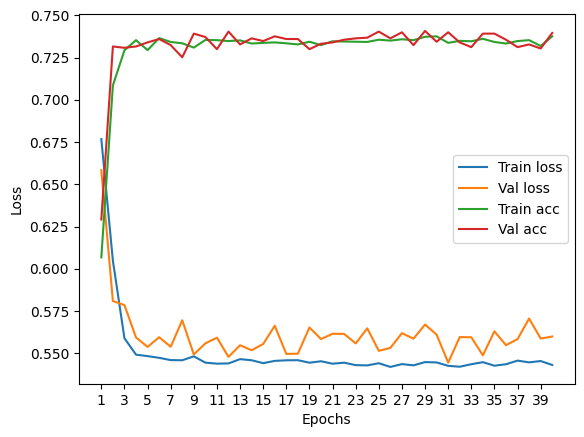

****************************************************************************************************



118it [00:00, 235.05it/s]


Train Epoch: 0 	Loss: 0.686553, Accuracy: 4335/7500 (58%)
Val Epoch: 0 	Loss: 0.678843, Accuracy: 1565/2500 (63%)



118it [00:00, 233.85it/s]


Train Epoch: 1 	Loss: 0.624688, Accuracy: 5199/7500 (69%)
Val Epoch: 1 	Loss: 0.599783, Accuracy: 1798/2500 (72%)



118it [00:00, 230.71it/s]


Train Epoch: 2 	Loss: 0.568135, Accuracy: 5475/7500 (73%)
Val Epoch: 2 	Loss: 0.566345, Accuracy: 1818/2500 (73%)



118it [00:00, 236.55it/s]


Train Epoch: 3 	Loss: 0.545545, Accuracy: 5507/7500 (73%)
Val Epoch: 3 	Loss: 0.563625, Accuracy: 1813/2500 (73%)



118it [00:00, 229.40it/s]


Train Epoch: 4 	Loss: 0.541778, Accuracy: 5516/7500 (74%)
Val Epoch: 4 	Loss: 0.563159, Accuracy: 1836/2500 (73%)



118it [00:00, 232.44it/s]


Train Epoch: 5 	Loss: 0.541139, Accuracy: 5544/7500 (74%)
Val Epoch: 5 	Loss: 0.563546, Accuracy: 1816/2500 (73%)



118it [00:00, 228.78it/s]


Train Epoch: 6 	Loss: 0.540755, Accuracy: 5509/7500 (73%)
Val Epoch: 6 	Loss: 0.545037, Accuracy: 1827/2500 (73%)



118it [00:00, 233.33it/s]


Train Epoch: 7 	Loss: 0.541288, Accuracy: 5537/7500 (74%)
Val Epoch: 7 	Loss: 0.564533, Accuracy: 1831/2500 (73%)



118it [00:00, 236.50it/s]


Train Epoch: 8 	Loss: 0.536482, Accuracy: 5518/7500 (74%)
Val Epoch: 8 	Loss: 0.575203, Accuracy: 1835/2500 (73%)



118it [00:00, 207.22it/s]


Train Epoch: 9 	Loss: 0.541486, Accuracy: 5552/7500 (74%)
Val Epoch: 9 	Loss: 0.560126, Accuracy: 1823/2500 (73%)



118it [00:00, 229.47it/s]


Train Epoch: 10 	Loss: 0.541134, Accuracy: 5538/7500 (74%)
Val Epoch: 10 	Loss: 0.555651, Accuracy: 1822/2500 (73%)



118it [00:00, 229.73it/s]


Train Epoch: 11 	Loss: 0.538078, Accuracy: 5554/7500 (74%)
Val Epoch: 11 	Loss: 0.553854, Accuracy: 1835/2500 (73%)



118it [00:00, 233.69it/s]


Train Epoch: 12 	Loss: 0.539339, Accuracy: 5541/7500 (74%)
Val Epoch: 12 	Loss: 0.559579, Accuracy: 1821/2500 (73%)



118it [00:00, 233.62it/s]


Train Epoch: 13 	Loss: 0.537389, Accuracy: 5536/7500 (74%)
Val Epoch: 13 	Loss: 0.548065, Accuracy: 1833/2500 (73%)



118it [00:00, 238.08it/s]


Train Epoch: 14 	Loss: 0.537194, Accuracy: 5564/7500 (74%)
Val Epoch: 14 	Loss: 0.561483, Accuracy: 1829/2500 (73%)



118it [00:00, 233.06it/s]


Train Epoch: 15 	Loss: 0.538341, Accuracy: 5566/7500 (74%)
Val Epoch: 15 	Loss: 0.566062, Accuracy: 1836/2500 (73%)



118it [00:00, 235.32it/s]


Train Epoch: 16 	Loss: 0.537623, Accuracy: 5544/7500 (74%)
Val Epoch: 16 	Loss: 0.557911, Accuracy: 1821/2500 (73%)



118it [00:00, 185.31it/s]


Train Epoch: 17 	Loss: 0.538411, Accuracy: 5532/7500 (74%)
Val Epoch: 17 	Loss: 0.547175, Accuracy: 1831/2500 (73%)



118it [00:00, 182.42it/s]


Train Epoch: 18 	Loss: 0.535476, Accuracy: 5549/7500 (74%)
Val Epoch: 18 	Loss: 0.559824, Accuracy: 1828/2500 (73%)



118it [00:00, 168.62it/s]


Train Epoch: 19 	Loss: 0.540145, Accuracy: 5548/7500 (74%)
Val Epoch: 19 	Loss: 0.558927, Accuracy: 1833/2500 (73%)



118it [00:00, 200.37it/s]


Train Epoch: 20 	Loss: 0.536403, Accuracy: 5536/7500 (74%)
Val Epoch: 20 	Loss: 0.579731, Accuracy: 1833/2500 (73%)



118it [00:00, 197.60it/s]


Train Epoch: 21 	Loss: 0.536284, Accuracy: 5562/7500 (74%)
Val Epoch: 21 	Loss: 0.546542, Accuracy: 1830/2500 (73%)



118it [00:00, 206.73it/s]


Train Epoch: 22 	Loss: 0.538285, Accuracy: 5533/7500 (74%)
Val Epoch: 22 	Loss: 0.562026, Accuracy: 1830/2500 (73%)



118it [00:00, 231.33it/s]


Train Epoch: 23 	Loss: 0.539384, Accuracy: 5555/7500 (74%)
Val Epoch: 23 	Loss: 0.554496, Accuracy: 1838/2500 (74%)



118it [00:00, 237.79it/s]


Train Epoch: 24 	Loss: 0.535184, Accuracy: 5554/7500 (74%)
Val Epoch: 24 	Loss: 0.556143, Accuracy: 1825/2500 (73%)



118it [00:00, 231.26it/s]


Train Epoch: 25 	Loss: 0.536575, Accuracy: 5537/7500 (74%)
Val Epoch: 25 	Loss: 0.551827, Accuracy: 1829/2500 (73%)



118it [00:00, 232.22it/s]


Train Epoch: 26 	Loss: 0.535795, Accuracy: 5530/7500 (74%)
Val Epoch: 26 	Loss: 0.553055, Accuracy: 1831/2500 (73%)



118it [00:00, 225.19it/s]


Train Epoch: 27 	Loss: 0.538730, Accuracy: 5570/7500 (74%)
Val Epoch: 27 	Loss: 0.558056, Accuracy: 1825/2500 (73%)



118it [00:00, 235.12it/s]


Train Epoch: 28 	Loss: 0.535594, Accuracy: 5562/7500 (74%)
Val Epoch: 28 	Loss: 0.551159, Accuracy: 1822/2500 (73%)



118it [00:00, 233.41it/s]


Train Epoch: 29 	Loss: 0.536675, Accuracy: 5564/7500 (74%)
Val Epoch: 29 	Loss: 0.550552, Accuracy: 1842/2500 (74%)



118it [00:00, 228.42it/s]


Train Epoch: 30 	Loss: 0.535633, Accuracy: 5551/7500 (74%)
Val Epoch: 30 	Loss: 0.543211, Accuracy: 1846/2500 (74%)



118it [00:00, 223.33it/s]


Train Epoch: 31 	Loss: 0.535542, Accuracy: 5547/7500 (74%)
Val Epoch: 31 	Loss: 0.549939, Accuracy: 1826/2500 (73%)



118it [00:00, 181.98it/s]


Train Epoch: 32 	Loss: 0.536328, Accuracy: 5554/7500 (74%)
Val Epoch: 32 	Loss: 0.544497, Accuracy: 1829/2500 (73%)



118it [00:00, 225.76it/s]


Train Epoch: 33 	Loss: 0.537663, Accuracy: 5551/7500 (74%)
Val Epoch: 33 	Loss: 0.569705, Accuracy: 1797/2500 (72%)



118it [00:00, 228.47it/s]


Train Epoch: 34 	Loss: 0.535650, Accuracy: 5531/7500 (74%)
Val Epoch: 34 	Loss: 0.552447, Accuracy: 1820/2500 (73%)



118it [00:00, 233.01it/s]


Train Epoch: 35 	Loss: 0.536031, Accuracy: 5550/7500 (74%)
Val Epoch: 35 	Loss: 0.554146, Accuracy: 1816/2500 (73%)



118it [00:00, 234.90it/s]


Train Epoch: 36 	Loss: 0.538149, Accuracy: 5530/7500 (74%)
Val Epoch: 36 	Loss: 0.555591, Accuracy: 1813/2500 (73%)



118it [00:00, 227.43it/s]


Train Epoch: 37 	Loss: 0.535812, Accuracy: 5555/7500 (74%)
Val Epoch: 37 	Loss: 0.557509, Accuracy: 1820/2500 (73%)



118it [00:00, 236.52it/s]


Train Epoch: 38 	Loss: 0.536672, Accuracy: 5561/7500 (74%)
Val Epoch: 38 	Loss: 0.553845, Accuracy: 1828/2500 (73%)



118it [00:00, 232.73it/s]


Train Epoch: 39 	Loss: 0.534067, Accuracy: 5561/7500 (74%)
Val Epoch: 39 	Loss: 0.555243, Accuracy: 1833/2500 (73%)

Test accuracy:  73.88


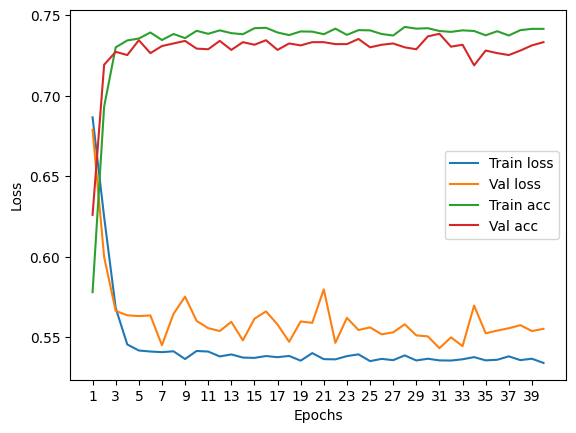

****************************************************************************************************



118it [00:00, 224.06it/s]


Train Epoch: 0 	Loss: 0.678598, Accuracy: 4563/7500 (61%)
Val Epoch: 0 	Loss: 0.653843, Accuracy: 1745/2500 (70%)



118it [00:00, 227.24it/s]


Train Epoch: 1 	Loss: 0.609269, Accuracy: 5326/7500 (71%)
Val Epoch: 1 	Loss: 0.580028, Accuracy: 1813/2500 (73%)



118it [00:00, 221.57it/s]


Train Epoch: 2 	Loss: 0.563802, Accuracy: 5446/7500 (73%)
Val Epoch: 2 	Loss: 0.560380, Accuracy: 1822/2500 (73%)



118it [00:00, 232.99it/s]


Train Epoch: 3 	Loss: 0.552847, Accuracy: 5525/7500 (74%)
Val Epoch: 3 	Loss: 0.558425, Accuracy: 1838/2500 (74%)



118it [00:00, 230.98it/s]


Train Epoch: 4 	Loss: 0.547957, Accuracy: 5534/7500 (74%)
Val Epoch: 4 	Loss: 0.558232, Accuracy: 1831/2500 (73%)



118it [00:00, 220.25it/s]


Train Epoch: 5 	Loss: 0.552204, Accuracy: 5526/7500 (74%)
Val Epoch: 5 	Loss: 0.555079, Accuracy: 1824/2500 (73%)



118it [00:00, 231.98it/s]


Train Epoch: 6 	Loss: 0.548696, Accuracy: 5534/7500 (74%)
Val Epoch: 6 	Loss: 0.553137, Accuracy: 1841/2500 (74%)



118it [00:00, 228.66it/s]


Train Epoch: 7 	Loss: 0.551972, Accuracy: 5530/7500 (74%)
Val Epoch: 7 	Loss: 0.568327, Accuracy: 1834/2500 (73%)



118it [00:00, 235.32it/s]


Train Epoch: 8 	Loss: 0.547963, Accuracy: 5541/7500 (74%)
Val Epoch: 8 	Loss: 0.557546, Accuracy: 1831/2500 (73%)



118it [00:00, 195.29it/s]


Train Epoch: 9 	Loss: 0.549424, Accuracy: 5539/7500 (74%)
Val Epoch: 9 	Loss: 0.550844, Accuracy: 1839/2500 (74%)



118it [00:00, 168.46it/s]


Train Epoch: 10 	Loss: 0.547830, Accuracy: 5519/7500 (74%)
Val Epoch: 10 	Loss: 0.553949, Accuracy: 1832/2500 (73%)



118it [00:00, 186.32it/s]


Train Epoch: 11 	Loss: 0.548354, Accuracy: 5527/7500 (74%)
Val Epoch: 11 	Loss: 0.550080, Accuracy: 1831/2500 (73%)



118it [00:00, 212.58it/s]


Train Epoch: 12 	Loss: 0.545849, Accuracy: 5566/7500 (74%)
Val Epoch: 12 	Loss: 0.562018, Accuracy: 1828/2500 (73%)



118it [00:00, 232.51it/s]


Train Epoch: 13 	Loss: 0.549299, Accuracy: 5539/7500 (74%)
Val Epoch: 13 	Loss: 0.556233, Accuracy: 1836/2500 (73%)



118it [00:00, 228.73it/s]


Train Epoch: 14 	Loss: 0.549092, Accuracy: 5523/7500 (74%)
Val Epoch: 14 	Loss: 0.548799, Accuracy: 1831/2500 (73%)



118it [00:00, 233.79it/s]


Train Epoch: 15 	Loss: 0.551838, Accuracy: 5483/7500 (73%)
Val Epoch: 15 	Loss: 0.553806, Accuracy: 1836/2500 (73%)



118it [00:00, 236.38it/s]


Train Epoch: 16 	Loss: 0.549365, Accuracy: 5528/7500 (74%)
Val Epoch: 16 	Loss: 0.547018, Accuracy: 1849/2500 (74%)



118it [00:00, 229.44it/s]


Train Epoch: 17 	Loss: 0.548379, Accuracy: 5552/7500 (74%)
Val Epoch: 17 	Loss: 0.548521, Accuracy: 1828/2500 (73%)



118it [00:00, 228.07it/s]


Train Epoch: 18 	Loss: 0.547281, Accuracy: 5540/7500 (74%)
Val Epoch: 18 	Loss: 0.545224, Accuracy: 1834/2500 (73%)



118it [00:00, 229.39it/s]


Train Epoch: 19 	Loss: 0.546033, Accuracy: 5541/7500 (74%)
Val Epoch: 19 	Loss: 0.555304, Accuracy: 1824/2500 (73%)



118it [00:00, 224.92it/s]


Train Epoch: 20 	Loss: 0.546133, Accuracy: 5551/7500 (74%)
Val Epoch: 20 	Loss: 0.546265, Accuracy: 1823/2500 (73%)



118it [00:00, 232.67it/s]


Train Epoch: 21 	Loss: 0.547572, Accuracy: 5550/7500 (74%)
Val Epoch: 21 	Loss: 0.563634, Accuracy: 1829/2500 (73%)



118it [00:00, 228.06it/s]


Train Epoch: 22 	Loss: 0.545485, Accuracy: 5560/7500 (74%)
Val Epoch: 22 	Loss: 0.551389, Accuracy: 1830/2500 (73%)



118it [00:00, 233.04it/s]


Train Epoch: 23 	Loss: 0.552570, Accuracy: 5529/7500 (74%)
Val Epoch: 23 	Loss: 0.544311, Accuracy: 1827/2500 (73%)



118it [00:00, 228.73it/s]


Train Epoch: 24 	Loss: 0.545160, Accuracy: 5565/7500 (74%)
Val Epoch: 24 	Loss: 0.554750, Accuracy: 1833/2500 (73%)



118it [00:00, 232.67it/s]


Train Epoch: 25 	Loss: 0.546059, Accuracy: 5549/7500 (74%)
Val Epoch: 25 	Loss: 0.551503, Accuracy: 1828/2500 (73%)



118it [00:00, 230.17it/s]


Train Epoch: 26 	Loss: 0.545352, Accuracy: 5557/7500 (74%)
Val Epoch: 26 	Loss: 0.543635, Accuracy: 1829/2500 (73%)



118it [00:00, 227.25it/s]


Train Epoch: 27 	Loss: 0.544454, Accuracy: 5537/7500 (74%)
Val Epoch: 27 	Loss: 0.555319, Accuracy: 1837/2500 (73%)



118it [00:00, 235.18it/s]


Train Epoch: 28 	Loss: 0.546317, Accuracy: 5536/7500 (74%)
Val Epoch: 28 	Loss: 0.560736, Accuracy: 1830/2500 (73%)



118it [00:00, 236.69it/s]


Train Epoch: 29 	Loss: 0.547682, Accuracy: 5573/7500 (74%)
Val Epoch: 29 	Loss: 0.548937, Accuracy: 1832/2500 (73%)



118it [00:00, 230.63it/s]


Train Epoch: 30 	Loss: 0.547275, Accuracy: 5549/7500 (74%)
Val Epoch: 30 	Loss: 0.560919, Accuracy: 1825/2500 (73%)



118it [00:00, 234.68it/s]


Train Epoch: 31 	Loss: 0.547662, Accuracy: 5542/7500 (74%)
Val Epoch: 31 	Loss: 0.560719, Accuracy: 1826/2500 (73%)



118it [00:00, 226.28it/s]


Train Epoch: 32 	Loss: 0.547580, Accuracy: 5518/7500 (74%)
Val Epoch: 32 	Loss: 0.549576, Accuracy: 1835/2500 (73%)



118it [00:00, 168.13it/s]


Train Epoch: 33 	Loss: 0.545732, Accuracy: 5554/7500 (74%)
Val Epoch: 33 	Loss: 0.552799, Accuracy: 1812/2500 (72%)



118it [00:00, 193.56it/s]


Train Epoch: 34 	Loss: 0.545921, Accuracy: 5546/7500 (74%)
Val Epoch: 34 	Loss: 0.548218, Accuracy: 1832/2500 (73%)



118it [00:00, 185.96it/s]


Train Epoch: 35 	Loss: 0.546027, Accuracy: 5562/7500 (74%)
Val Epoch: 35 	Loss: 0.567024, Accuracy: 1837/2500 (73%)



118it [00:00, 235.65it/s]


Train Epoch: 36 	Loss: 0.543374, Accuracy: 5553/7500 (74%)
Val Epoch: 36 	Loss: 0.555041, Accuracy: 1823/2500 (73%)



118it [00:00, 222.63it/s]


Train Epoch: 37 	Loss: 0.545487, Accuracy: 5551/7500 (74%)
Val Epoch: 37 	Loss: 0.557859, Accuracy: 1822/2500 (73%)



118it [00:00, 235.42it/s]


Train Epoch: 38 	Loss: 0.547462, Accuracy: 5534/7500 (74%)
Val Epoch: 38 	Loss: 0.546111, Accuracy: 1837/2500 (73%)



118it [00:00, 226.21it/s]


Train Epoch: 39 	Loss: 0.547707, Accuracy: 5554/7500 (74%)
Val Epoch: 39 	Loss: 0.545478, Accuracy: 1835/2500 (73%)

Test accuracy:  72.2


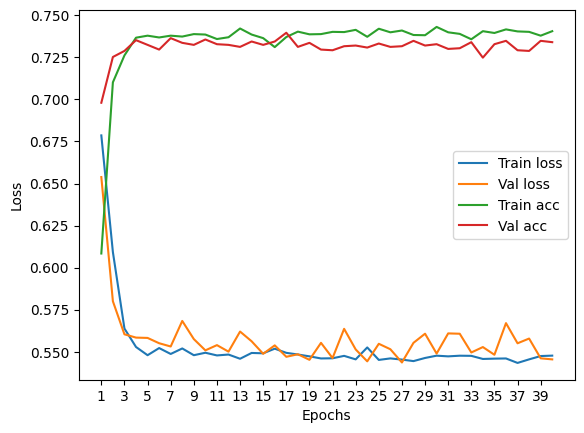

****************************************************************************************************



118it [00:00, 229.12it/s]


Train Epoch: 0 	Loss: 0.678669, Accuracy: 4476/7500 (60%)
Val Epoch: 0 	Loss: 0.656184, Accuracy: 1721/2500 (69%)



118it [00:00, 212.52it/s]


Train Epoch: 1 	Loss: 0.617390, Accuracy: 5272/7500 (70%)
Val Epoch: 1 	Loss: 0.595597, Accuracy: 1793/2500 (72%)



118it [00:00, 169.50it/s]


Train Epoch: 2 	Loss: 0.573907, Accuracy: 5425/7500 (72%)
Val Epoch: 2 	Loss: 0.570402, Accuracy: 1838/2500 (74%)



118it [00:00, 192.92it/s]


Train Epoch: 3 	Loss: 0.562773, Accuracy: 5449/7500 (73%)
Val Epoch: 3 	Loss: 0.560731, Accuracy: 1833/2500 (73%)



118it [00:00, 190.98it/s]


Train Epoch: 4 	Loss: 0.558269, Accuracy: 5449/7500 (73%)
Val Epoch: 4 	Loss: 0.544530, Accuracy: 1855/2500 (74%)



118it [00:00, 228.87it/s]


Train Epoch: 5 	Loss: 0.560302, Accuracy: 5463/7500 (73%)
Val Epoch: 5 	Loss: 0.549728, Accuracy: 1840/2500 (74%)



118it [00:00, 229.04it/s]


Train Epoch: 6 	Loss: 0.556447, Accuracy: 5450/7500 (73%)
Val Epoch: 6 	Loss: 0.556846, Accuracy: 1844/2500 (74%)



118it [00:00, 233.93it/s]


Train Epoch: 7 	Loss: 0.559119, Accuracy: 5425/7500 (72%)
Val Epoch: 7 	Loss: 0.546673, Accuracy: 1845/2500 (74%)



118it [00:00, 226.53it/s]


Train Epoch: 8 	Loss: 0.559267, Accuracy: 5466/7500 (73%)
Val Epoch: 8 	Loss: 0.544928, Accuracy: 1853/2500 (74%)



118it [00:00, 235.68it/s]


Train Epoch: 9 	Loss: 0.555696, Accuracy: 5460/7500 (73%)
Val Epoch: 9 	Loss: 0.543967, Accuracy: 1846/2500 (74%)



118it [00:00, 229.51it/s]


Train Epoch: 10 	Loss: 0.554984, Accuracy: 5459/7500 (73%)
Val Epoch: 10 	Loss: 0.557890, Accuracy: 1847/2500 (74%)



118it [00:00, 192.13it/s]


Train Epoch: 11 	Loss: 0.556401, Accuracy: 5450/7500 (73%)
Val Epoch: 11 	Loss: 0.551002, Accuracy: 1835/2500 (73%)



118it [00:00, 226.96it/s]


Train Epoch: 12 	Loss: 0.555846, Accuracy: 5453/7500 (73%)
Val Epoch: 12 	Loss: 0.549681, Accuracy: 1838/2500 (74%)



118it [00:00, 231.40it/s]


Train Epoch: 13 	Loss: 0.558850, Accuracy: 5419/7500 (72%)
Val Epoch: 13 	Loss: 0.558246, Accuracy: 1823/2500 (73%)



118it [00:00, 229.08it/s]


Train Epoch: 14 	Loss: 0.554875, Accuracy: 5448/7500 (73%)
Val Epoch: 14 	Loss: 0.544208, Accuracy: 1852/2500 (74%)



118it [00:00, 168.14it/s]


Train Epoch: 15 	Loss: 0.556317, Accuracy: 5471/7500 (73%)
Val Epoch: 15 	Loss: 0.546616, Accuracy: 1845/2500 (74%)



118it [00:00, 183.37it/s]


Train Epoch: 16 	Loss: 0.555108, Accuracy: 5456/7500 (73%)
Val Epoch: 16 	Loss: 0.541824, Accuracy: 1849/2500 (74%)



118it [00:00, 163.34it/s]


Train Epoch: 17 	Loss: 0.564305, Accuracy: 5388/7500 (72%)
Val Epoch: 17 	Loss: 0.545923, Accuracy: 1835/2500 (73%)



118it [00:00, 224.92it/s]


Train Epoch: 18 	Loss: 0.557766, Accuracy: 5472/7500 (73%)
Val Epoch: 18 	Loss: 0.549356, Accuracy: 1846/2500 (74%)



118it [00:00, 231.39it/s]


Train Epoch: 19 	Loss: 0.555428, Accuracy: 5440/7500 (73%)
Val Epoch: 19 	Loss: 0.564024, Accuracy: 1810/2500 (72%)



118it [00:00, 236.09it/s]


Train Epoch: 20 	Loss: 0.555604, Accuracy: 5461/7500 (73%)
Val Epoch: 20 	Loss: 0.543540, Accuracy: 1843/2500 (74%)



118it [00:00, 229.67it/s]


Train Epoch: 21 	Loss: 0.557507, Accuracy: 5429/7500 (72%)
Val Epoch: 21 	Loss: 0.538791, Accuracy: 1857/2500 (74%)



118it [00:00, 231.08it/s]


Train Epoch: 22 	Loss: 0.555470, Accuracy: 5454/7500 (73%)
Val Epoch: 22 	Loss: 0.552720, Accuracy: 1821/2500 (73%)



118it [00:00, 231.37it/s]


Train Epoch: 23 	Loss: 0.553544, Accuracy: 5460/7500 (73%)
Val Epoch: 23 	Loss: 0.547631, Accuracy: 1853/2500 (74%)



118it [00:00, 170.83it/s]


Train Epoch: 24 	Loss: 0.554649, Accuracy: 5467/7500 (73%)
Val Epoch: 24 	Loss: 0.545526, Accuracy: 1835/2500 (73%)



118it [00:00, 198.57it/s]


Train Epoch: 25 	Loss: 0.559566, Accuracy: 5446/7500 (73%)
Val Epoch: 25 	Loss: 0.548937, Accuracy: 1835/2500 (73%)



118it [00:00, 182.23it/s]


Train Epoch: 26 	Loss: 0.553037, Accuracy: 5458/7500 (73%)
Val Epoch: 26 	Loss: 0.555295, Accuracy: 1836/2500 (73%)



118it [00:00, 217.41it/s]


Train Epoch: 27 	Loss: 0.553034, Accuracy: 5474/7500 (73%)
Val Epoch: 27 	Loss: 0.549505, Accuracy: 1834/2500 (73%)



118it [00:00, 226.14it/s]


Train Epoch: 28 	Loss: 0.553480, Accuracy: 5464/7500 (73%)
Val Epoch: 28 	Loss: 0.546061, Accuracy: 1842/2500 (74%)



118it [00:00, 234.36it/s]


Train Epoch: 29 	Loss: 0.556804, Accuracy: 5443/7500 (73%)
Val Epoch: 29 	Loss: 0.552077, Accuracy: 1821/2500 (73%)



118it [00:00, 228.60it/s]


Train Epoch: 30 	Loss: 0.552451, Accuracy: 5488/7500 (73%)
Val Epoch: 30 	Loss: 0.543961, Accuracy: 1840/2500 (74%)



118it [00:00, 226.29it/s]


Train Epoch: 31 	Loss: 0.553109, Accuracy: 5464/7500 (73%)
Val Epoch: 31 	Loss: 0.547783, Accuracy: 1825/2500 (73%)



118it [00:00, 232.21it/s]


Train Epoch: 32 	Loss: 0.553249, Accuracy: 5466/7500 (73%)
Val Epoch: 32 	Loss: 0.553063, Accuracy: 1824/2500 (73%)



118it [00:00, 226.39it/s]


Train Epoch: 33 	Loss: 0.553787, Accuracy: 5470/7500 (73%)
Val Epoch: 33 	Loss: 0.541241, Accuracy: 1845/2500 (74%)



118it [00:00, 233.60it/s]


Train Epoch: 34 	Loss: 0.554953, Accuracy: 5444/7500 (73%)
Val Epoch: 34 	Loss: 0.547119, Accuracy: 1855/2500 (74%)



118it [00:00, 232.78it/s]


Train Epoch: 35 	Loss: 0.555315, Accuracy: 5472/7500 (73%)
Val Epoch: 35 	Loss: 0.541910, Accuracy: 1848/2500 (74%)



118it [00:00, 230.51it/s]


Train Epoch: 36 	Loss: 0.552709, Accuracy: 5486/7500 (73%)
Val Epoch: 36 	Loss: 0.556190, Accuracy: 1823/2500 (73%)



118it [00:00, 232.60it/s]


Train Epoch: 37 	Loss: 0.556019, Accuracy: 5478/7500 (73%)
Val Epoch: 37 	Loss: 0.543978, Accuracy: 1858/2500 (74%)



118it [00:00, 230.05it/s]


Train Epoch: 38 	Loss: 0.552021, Accuracy: 5494/7500 (73%)
Val Epoch: 38 	Loss: 0.549253, Accuracy: 1824/2500 (73%)



118it [00:00, 232.91it/s]


Train Epoch: 39 	Loss: 0.551639, Accuracy: 5482/7500 (73%)
Val Epoch: 39 	Loss: 0.543767, Accuracy: 1854/2500 (74%)

Test accuracy:  72.96000000000001


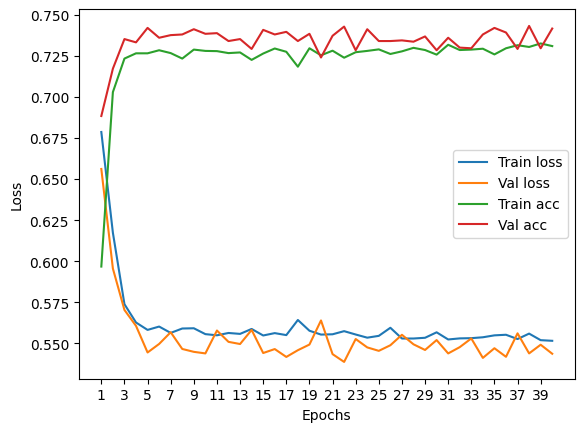

****************************************************************************************************



118it [00:00, 233.76it/s]


Train Epoch: 0 	Loss: 0.690971, Accuracy: 4186/7500 (56%)
Val Epoch: 0 	Loss: 0.680465, Accuracy: 1709/2500 (68%)



118it [00:00, 218.72it/s]


Train Epoch: 1 	Loss: 0.635556, Accuracy: 5127/7500 (68%)
Val Epoch: 1 	Loss: 0.603551, Accuracy: 1796/2500 (72%)



118it [00:00, 232.41it/s]


Train Epoch: 2 	Loss: 0.579794, Accuracy: 5377/7500 (72%)
Val Epoch: 2 	Loss: 0.548334, Accuracy: 1875/2500 (75%)



118it [00:00, 210.39it/s]


Train Epoch: 3 	Loss: 0.563889, Accuracy: 5423/7500 (72%)
Val Epoch: 3 	Loss: 0.550219, Accuracy: 1840/2500 (74%)



118it [00:00, 232.61it/s]


Train Epoch: 4 	Loss: 0.562150, Accuracy: 5419/7500 (72%)
Val Epoch: 4 	Loss: 0.539717, Accuracy: 1875/2500 (75%)



118it [00:00, 231.62it/s]


Train Epoch: 5 	Loss: 0.558597, Accuracy: 5457/7500 (73%)
Val Epoch: 5 	Loss: 0.547466, Accuracy: 1866/2500 (75%)



118it [00:00, 230.13it/s]


Train Epoch: 6 	Loss: 0.559043, Accuracy: 5450/7500 (73%)
Val Epoch: 6 	Loss: 0.537569, Accuracy: 1883/2500 (75%)



118it [00:00, 186.11it/s]


Train Epoch: 7 	Loss: 0.557390, Accuracy: 5419/7500 (72%)
Val Epoch: 7 	Loss: 0.541501, Accuracy: 1884/2500 (75%)



118it [00:00, 227.46it/s]


Train Epoch: 8 	Loss: 0.560137, Accuracy: 5460/7500 (73%)
Val Epoch: 8 	Loss: 0.533147, Accuracy: 1879/2500 (75%)



118it [00:00, 227.97it/s]


Train Epoch: 9 	Loss: 0.557199, Accuracy: 5462/7500 (73%)
Val Epoch: 9 	Loss: 0.550294, Accuracy: 1894/2500 (76%)



118it [00:00, 221.03it/s]


Train Epoch: 10 	Loss: 0.559984, Accuracy: 5433/7500 (72%)
Val Epoch: 10 	Loss: 0.549037, Accuracy: 1882/2500 (75%)



118it [00:00, 208.04it/s]


Train Epoch: 11 	Loss: 0.559990, Accuracy: 5465/7500 (73%)
Val Epoch: 11 	Loss: 0.547627, Accuracy: 1889/2500 (76%)



118it [00:00, 219.69it/s]


Train Epoch: 12 	Loss: 0.560019, Accuracy: 5458/7500 (73%)
Val Epoch: 12 	Loss: 0.545824, Accuracy: 1879/2500 (75%)



118it [00:00, 218.58it/s]


Train Epoch: 13 	Loss: 0.557108, Accuracy: 5468/7500 (73%)
Val Epoch: 13 	Loss: 0.538810, Accuracy: 1884/2500 (75%)



118it [00:00, 230.62it/s]


Train Epoch: 14 	Loss: 0.558222, Accuracy: 5429/7500 (72%)
Val Epoch: 14 	Loss: 0.546847, Accuracy: 1874/2500 (75%)



118it [00:00, 199.08it/s]


Train Epoch: 15 	Loss: 0.557635, Accuracy: 5458/7500 (73%)
Val Epoch: 15 	Loss: 0.536318, Accuracy: 1868/2500 (75%)



118it [00:00, 171.59it/s]


Train Epoch: 16 	Loss: 0.557145, Accuracy: 5465/7500 (73%)
Val Epoch: 16 	Loss: 0.535049, Accuracy: 1876/2500 (75%)



118it [00:00, 193.52it/s]


Train Epoch: 17 	Loss: 0.557518, Accuracy: 5460/7500 (73%)
Val Epoch: 17 	Loss: 0.535702, Accuracy: 1893/2500 (76%)



118it [00:00, 202.10it/s]


Train Epoch: 18 	Loss: 0.556667, Accuracy: 5457/7500 (73%)
Val Epoch: 18 	Loss: 0.541515, Accuracy: 1881/2500 (75%)



118it [00:00, 231.84it/s]


Train Epoch: 19 	Loss: 0.557242, Accuracy: 5466/7500 (73%)
Val Epoch: 19 	Loss: 0.543328, Accuracy: 1873/2500 (75%)



118it [00:00, 228.85it/s]


Train Epoch: 20 	Loss: 0.557464, Accuracy: 5451/7500 (73%)
Val Epoch: 20 	Loss: 0.545433, Accuracy: 1855/2500 (74%)



118it [00:00, 219.25it/s]


Train Epoch: 21 	Loss: 0.559493, Accuracy: 5453/7500 (73%)
Val Epoch: 21 	Loss: 0.550185, Accuracy: 1869/2500 (75%)



118it [00:00, 230.55it/s]


Train Epoch: 22 	Loss: 0.558416, Accuracy: 5470/7500 (73%)
Val Epoch: 22 	Loss: 0.539728, Accuracy: 1894/2500 (76%)



118it [00:00, 225.13it/s]


Train Epoch: 23 	Loss: 0.554773, Accuracy: 5483/7500 (73%)
Val Epoch: 23 	Loss: 0.536661, Accuracy: 1891/2500 (76%)



118it [00:00, 239.90it/s]


Train Epoch: 24 	Loss: 0.556270, Accuracy: 5483/7500 (73%)
Val Epoch: 24 	Loss: 0.530372, Accuracy: 1885/2500 (75%)



118it [00:00, 215.90it/s]


Train Epoch: 25 	Loss: 0.556598, Accuracy: 5478/7500 (73%)
Val Epoch: 25 	Loss: 0.533492, Accuracy: 1879/2500 (75%)



118it [00:00, 227.20it/s]


Train Epoch: 26 	Loss: 0.556680, Accuracy: 5466/7500 (73%)
Val Epoch: 26 	Loss: 0.551297, Accuracy: 1876/2500 (75%)



118it [00:00, 224.08it/s]


Train Epoch: 27 	Loss: 0.556912, Accuracy: 5490/7500 (73%)
Val Epoch: 27 	Loss: 0.536573, Accuracy: 1877/2500 (75%)



118it [00:00, 234.52it/s]


Train Epoch: 28 	Loss: 0.557015, Accuracy: 5451/7500 (73%)
Val Epoch: 28 	Loss: 0.539261, Accuracy: 1862/2500 (74%)



118it [00:00, 160.87it/s]


Train Epoch: 29 	Loss: 0.556702, Accuracy: 5474/7500 (73%)
Val Epoch: 29 	Loss: 0.546215, Accuracy: 1887/2500 (75%)



118it [00:00, 204.77it/s]


Train Epoch: 30 	Loss: 0.561650, Accuracy: 5443/7500 (73%)
Val Epoch: 30 	Loss: 0.544768, Accuracy: 1870/2500 (75%)



118it [00:00, 198.08it/s]


Train Epoch: 31 	Loss: 0.556013, Accuracy: 5477/7500 (73%)
Val Epoch: 31 	Loss: 0.554030, Accuracy: 1854/2500 (74%)



118it [00:00, 225.71it/s]


Train Epoch: 32 	Loss: 0.555925, Accuracy: 5451/7500 (73%)
Val Epoch: 32 	Loss: 0.544911, Accuracy: 1872/2500 (75%)



118it [00:00, 229.67it/s]


Train Epoch: 33 	Loss: 0.557399, Accuracy: 5477/7500 (73%)
Val Epoch: 33 	Loss: 0.537251, Accuracy: 1882/2500 (75%)



118it [00:00, 233.69it/s]


Train Epoch: 34 	Loss: 0.556274, Accuracy: 5478/7500 (73%)
Val Epoch: 34 	Loss: 0.543223, Accuracy: 1881/2500 (75%)



118it [00:00, 229.28it/s]


Train Epoch: 35 	Loss: 0.557399, Accuracy: 5440/7500 (73%)
Val Epoch: 35 	Loss: 0.534334, Accuracy: 1875/2500 (75%)



118it [00:00, 232.67it/s]


Train Epoch: 36 	Loss: 0.557973, Accuracy: 5466/7500 (73%)
Val Epoch: 36 	Loss: 0.543098, Accuracy: 1875/2500 (75%)



118it [00:00, 230.20it/s]


Train Epoch: 37 	Loss: 0.557688, Accuracy: 5442/7500 (73%)
Val Epoch: 37 	Loss: 0.547565, Accuracy: 1854/2500 (74%)



118it [00:00, 170.58it/s]


Train Epoch: 38 	Loss: 0.556130, Accuracy: 5483/7500 (73%)
Val Epoch: 38 	Loss: 0.535315, Accuracy: 1875/2500 (75%)



118it [00:00, 187.43it/s]


Train Epoch: 39 	Loss: 0.557813, Accuracy: 5478/7500 (73%)
Val Epoch: 39 	Loss: 0.547317, Accuracy: 1862/2500 (74%)

Test accuracy:  72.2


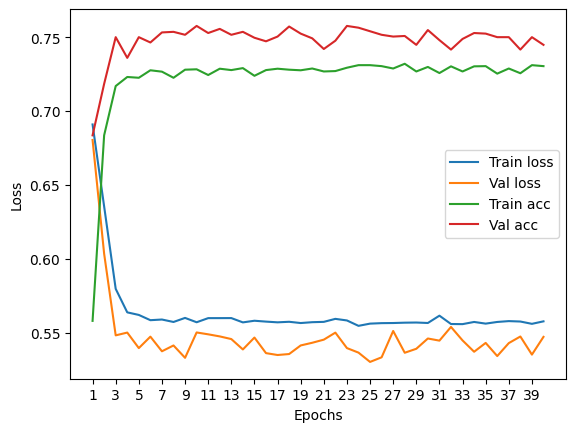

****************************************************************************************************



118it [00:00, 234.64it/s]


Train Epoch: 0 	Loss: 0.686433, Accuracy: 4365/7500 (58%)
Val Epoch: 0 	Loss: 0.674119, Accuracy: 1686/2500 (67%)



118it [00:00, 232.14it/s]


Train Epoch: 1 	Loss: 0.629701, Accuracy: 5243/7500 (70%)
Val Epoch: 1 	Loss: 0.599450, Accuracy: 1807/2500 (72%)



118it [00:00, 231.41it/s]


Train Epoch: 2 	Loss: 0.576623, Accuracy: 5410/7500 (72%)
Val Epoch: 2 	Loss: 0.565143, Accuracy: 1824/2500 (73%)



118it [00:00, 223.68it/s]


Train Epoch: 3 	Loss: 0.562599, Accuracy: 5412/7500 (72%)
Val Epoch: 3 	Loss: 0.552509, Accuracy: 1856/2500 (74%)



118it [00:00, 231.28it/s]


Train Epoch: 4 	Loss: 0.559198, Accuracy: 5421/7500 (72%)
Val Epoch: 4 	Loss: 0.554309, Accuracy: 1861/2500 (74%)



118it [00:00, 230.82it/s]


Train Epoch: 5 	Loss: 0.556711, Accuracy: 5450/7500 (73%)
Val Epoch: 5 	Loss: 0.553256, Accuracy: 1848/2500 (74%)



118it [00:00, 223.85it/s]


Train Epoch: 6 	Loss: 0.556530, Accuracy: 5451/7500 (73%)
Val Epoch: 6 	Loss: 0.551006, Accuracy: 1833/2500 (73%)



118it [00:00, 182.23it/s]


Train Epoch: 7 	Loss: 0.556380, Accuracy: 5431/7500 (72%)
Val Epoch: 7 	Loss: 0.548841, Accuracy: 1851/2500 (74%)



118it [00:00, 148.40it/s]


Train Epoch: 8 	Loss: 0.556677, Accuracy: 5462/7500 (73%)
Val Epoch: 8 	Loss: 0.556202, Accuracy: 1850/2500 (74%)



118it [00:00, 177.75it/s]


Train Epoch: 9 	Loss: 0.554429, Accuracy: 5458/7500 (73%)
Val Epoch: 9 	Loss: 0.554598, Accuracy: 1825/2500 (73%)



118it [00:00, 228.23it/s]


Train Epoch: 10 	Loss: 0.553534, Accuracy: 5456/7500 (73%)
Val Epoch: 10 	Loss: 0.551037, Accuracy: 1851/2500 (74%)



118it [00:00, 228.37it/s]


Train Epoch: 11 	Loss: 0.553271, Accuracy: 5463/7500 (73%)
Val Epoch: 11 	Loss: 0.542871, Accuracy: 1852/2500 (74%)



118it [00:00, 230.76it/s]


Train Epoch: 12 	Loss: 0.557039, Accuracy: 5456/7500 (73%)
Val Epoch: 12 	Loss: 0.563771, Accuracy: 1857/2500 (74%)



118it [00:00, 233.46it/s]


Train Epoch: 13 	Loss: 0.552313, Accuracy: 5469/7500 (73%)
Val Epoch: 13 	Loss: 0.551129, Accuracy: 1845/2500 (74%)



118it [00:00, 227.46it/s]


Train Epoch: 14 	Loss: 0.554403, Accuracy: 5458/7500 (73%)
Val Epoch: 14 	Loss: 0.556201, Accuracy: 1856/2500 (74%)



118it [00:00, 225.65it/s]


Train Epoch: 15 	Loss: 0.554444, Accuracy: 5442/7500 (73%)
Val Epoch: 15 	Loss: 0.561387, Accuracy: 1826/2500 (73%)



118it [00:00, 232.79it/s]


Train Epoch: 16 	Loss: 0.554855, Accuracy: 5461/7500 (73%)
Val Epoch: 16 	Loss: 0.546787, Accuracy: 1850/2500 (74%)



118it [00:00, 226.03it/s]


Train Epoch: 17 	Loss: 0.554241, Accuracy: 5432/7500 (72%)
Val Epoch: 17 	Loss: 0.546338, Accuracy: 1864/2500 (75%)



118it [00:00, 228.37it/s]


Train Epoch: 18 	Loss: 0.552907, Accuracy: 5460/7500 (73%)
Val Epoch: 18 	Loss: 0.556229, Accuracy: 1859/2500 (74%)



118it [00:00, 226.30it/s]


Train Epoch: 19 	Loss: 0.551820, Accuracy: 5488/7500 (73%)
Val Epoch: 19 	Loss: 0.562992, Accuracy: 1819/2500 (73%)



118it [00:00, 230.97it/s]


Train Epoch: 20 	Loss: 0.555581, Accuracy: 5456/7500 (73%)
Val Epoch: 20 	Loss: 0.544312, Accuracy: 1846/2500 (74%)



118it [00:00, 233.01it/s]


Train Epoch: 21 	Loss: 0.552261, Accuracy: 5501/7500 (73%)
Val Epoch: 21 	Loss: 0.548860, Accuracy: 1855/2500 (74%)



118it [00:00, 226.53it/s]


Train Epoch: 22 	Loss: 0.553194, Accuracy: 5445/7500 (73%)
Val Epoch: 22 	Loss: 0.551740, Accuracy: 1841/2500 (74%)



118it [00:00, 227.69it/s]


Train Epoch: 23 	Loss: 0.554373, Accuracy: 5469/7500 (73%)
Val Epoch: 23 	Loss: 0.555069, Accuracy: 1852/2500 (74%)



118it [00:00, 231.68it/s]


Train Epoch: 24 	Loss: 0.551883, Accuracy: 5449/7500 (73%)
Val Epoch: 24 	Loss: 0.544761, Accuracy: 1849/2500 (74%)



118it [00:00, 236.00it/s]


Train Epoch: 25 	Loss: 0.553349, Accuracy: 5462/7500 (73%)
Val Epoch: 25 	Loss: 0.545027, Accuracy: 1856/2500 (74%)



118it [00:00, 226.05it/s]


Train Epoch: 26 	Loss: 0.551001, Accuracy: 5465/7500 (73%)
Val Epoch: 26 	Loss: 0.543625, Accuracy: 1841/2500 (74%)



118it [00:00, 233.68it/s]


Train Epoch: 27 	Loss: 0.554049, Accuracy: 5453/7500 (73%)
Val Epoch: 27 	Loss: 0.549159, Accuracy: 1841/2500 (74%)



118it [00:00, 216.02it/s]


Train Epoch: 28 	Loss: 0.552581, Accuracy: 5471/7500 (73%)
Val Epoch: 28 	Loss: 0.562223, Accuracy: 1854/2500 (74%)



118it [00:00, 229.16it/s]


Train Epoch: 29 	Loss: 0.553753, Accuracy: 5461/7500 (73%)
Val Epoch: 29 	Loss: 0.554070, Accuracy: 1810/2500 (72%)



118it [00:00, 188.92it/s]


Train Epoch: 30 	Loss: 0.551794, Accuracy: 5471/7500 (73%)
Val Epoch: 30 	Loss: 0.544261, Accuracy: 1858/2500 (74%)



118it [00:00, 178.35it/s]


Train Epoch: 31 	Loss: 0.553455, Accuracy: 5485/7500 (73%)
Val Epoch: 31 	Loss: 0.548138, Accuracy: 1845/2500 (74%)



118it [00:00, 180.92it/s]


Train Epoch: 32 	Loss: 0.552372, Accuracy: 5445/7500 (73%)
Val Epoch: 32 	Loss: 0.549099, Accuracy: 1856/2500 (74%)



118it [00:00, 210.27it/s]


Train Epoch: 33 	Loss: 0.554037, Accuracy: 5452/7500 (73%)
Val Epoch: 33 	Loss: 0.548517, Accuracy: 1848/2500 (74%)



118it [00:00, 232.68it/s]


Train Epoch: 34 	Loss: 0.552713, Accuracy: 5474/7500 (73%)
Val Epoch: 34 	Loss: 0.555106, Accuracy: 1829/2500 (73%)



118it [00:00, 228.74it/s]


Train Epoch: 35 	Loss: 0.549824, Accuracy: 5458/7500 (73%)
Val Epoch: 35 	Loss: 0.546888, Accuracy: 1864/2500 (75%)



118it [00:00, 227.82it/s]


Train Epoch: 36 	Loss: 0.551410, Accuracy: 5463/7500 (73%)
Val Epoch: 36 	Loss: 0.545149, Accuracy: 1847/2500 (74%)



118it [00:00, 221.32it/s]


Train Epoch: 37 	Loss: 0.551072, Accuracy: 5464/7500 (73%)
Val Epoch: 37 	Loss: 0.546021, Accuracy: 1855/2500 (74%)



118it [00:00, 232.96it/s]


Train Epoch: 38 	Loss: 0.552005, Accuracy: 5453/7500 (73%)
Val Epoch: 38 	Loss: 0.553273, Accuracy: 1862/2500 (74%)



118it [00:00, 225.67it/s]


Train Epoch: 39 	Loss: 0.552609, Accuracy: 5491/7500 (73%)
Val Epoch: 39 	Loss: 0.542610, Accuracy: 1869/2500 (75%)

Test accuracy:  72.92


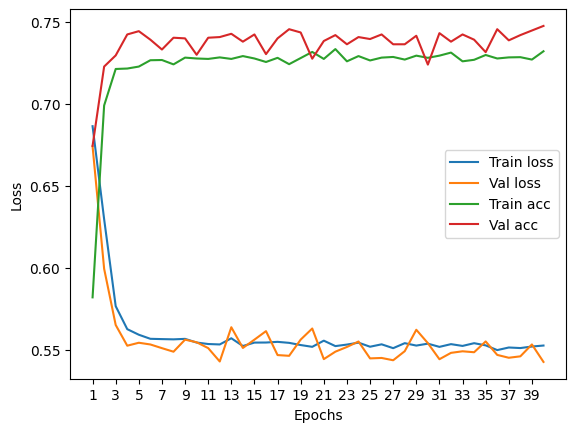

****************************************************************************************************



116it [00:00, 178.88it/s]


Train Epoch: 0 	Loss: 0.679937, Accuracy: 4425/7422 (60%)
Val Epoch: 0 	Loss: 0.661645, Accuracy: 1603/2474 (65%)



116it [00:00, 184.32it/s]


Train Epoch: 1 	Loss: 0.618853, Accuracy: 5142/7422 (69%)
Val Epoch: 1 	Loss: 0.586687, Accuracy: 1828/2474 (74%)



116it [00:00, 201.22it/s]


Train Epoch: 2 	Loss: 0.570280, Accuracy: 5368/7422 (72%)
Val Epoch: 2 	Loss: 0.553813, Accuracy: 1831/2474 (74%)



116it [00:00, 233.08it/s]


Train Epoch: 3 	Loss: 0.552163, Accuracy: 5404/7422 (73%)
Val Epoch: 3 	Loss: 0.548946, Accuracy: 1827/2474 (74%)



116it [00:00, 230.14it/s]


Train Epoch: 4 	Loss: 0.548724, Accuracy: 5449/7422 (73%)
Val Epoch: 4 	Loss: 0.543748, Accuracy: 1809/2474 (73%)



116it [00:00, 229.50it/s]


Train Epoch: 5 	Loss: 0.547500, Accuracy: 5424/7422 (73%)
Val Epoch: 5 	Loss: 0.548555, Accuracy: 1850/2474 (75%)



116it [00:00, 230.51it/s]


Train Epoch: 6 	Loss: 0.548062, Accuracy: 5421/7422 (73%)
Val Epoch: 6 	Loss: 0.542135, Accuracy: 1799/2474 (73%)



116it [00:00, 227.52it/s]


Train Epoch: 7 	Loss: 0.549461, Accuracy: 5417/7422 (73%)
Val Epoch: 7 	Loss: 0.536838, Accuracy: 1828/2474 (74%)



116it [00:00, 223.70it/s]


Train Epoch: 8 	Loss: 0.545705, Accuracy: 5455/7422 (73%)
Val Epoch: 8 	Loss: 0.549881, Accuracy: 1797/2474 (73%)



116it [00:00, 207.62it/s]


Train Epoch: 9 	Loss: 0.545366, Accuracy: 5430/7422 (73%)
Val Epoch: 9 	Loss: 0.536017, Accuracy: 1842/2474 (74%)



116it [00:00, 214.96it/s]


Train Epoch: 10 	Loss: 0.546269, Accuracy: 5433/7422 (73%)
Val Epoch: 10 	Loss: 0.540240, Accuracy: 1818/2474 (73%)



116it [00:00, 230.97it/s]


Train Epoch: 11 	Loss: 0.544956, Accuracy: 5429/7422 (73%)
Val Epoch: 11 	Loss: 0.536434, Accuracy: 1845/2474 (75%)



116it [00:00, 227.99it/s]


Train Epoch: 12 	Loss: 0.545047, Accuracy: 5456/7422 (74%)
Val Epoch: 12 	Loss: 0.536570, Accuracy: 1829/2474 (74%)



116it [00:00, 227.55it/s]


Train Epoch: 13 	Loss: 0.546780, Accuracy: 5432/7422 (73%)
Val Epoch: 13 	Loss: 0.537309, Accuracy: 1845/2474 (75%)



116it [00:00, 233.23it/s]


Train Epoch: 14 	Loss: 0.544841, Accuracy: 5466/7422 (74%)
Val Epoch: 14 	Loss: 0.537919, Accuracy: 1815/2474 (73%)



116it [00:00, 192.06it/s]


Train Epoch: 15 	Loss: 0.546239, Accuracy: 5415/7422 (73%)
Val Epoch: 15 	Loss: 0.537665, Accuracy: 1840/2474 (74%)



116it [00:00, 231.93it/s]


Train Epoch: 16 	Loss: 0.544718, Accuracy: 5468/7422 (74%)
Val Epoch: 16 	Loss: 0.535652, Accuracy: 1841/2474 (74%)



116it [00:00, 227.92it/s]


Train Epoch: 17 	Loss: 0.549334, Accuracy: 5453/7422 (73%)
Val Epoch: 17 	Loss: 0.536301, Accuracy: 1843/2474 (74%)



116it [00:00, 211.19it/s]


Train Epoch: 18 	Loss: 0.545903, Accuracy: 5469/7422 (74%)
Val Epoch: 18 	Loss: 0.537145, Accuracy: 1837/2474 (74%)



116it [00:00, 227.46it/s]


Train Epoch: 19 	Loss: 0.547104, Accuracy: 5440/7422 (73%)
Val Epoch: 19 	Loss: 0.548290, Accuracy: 1838/2474 (74%)



116it [00:00, 230.96it/s]


Train Epoch: 20 	Loss: 0.544978, Accuracy: 5452/7422 (73%)
Val Epoch: 20 	Loss: 0.536708, Accuracy: 1839/2474 (74%)



116it [00:00, 230.13it/s]


Train Epoch: 21 	Loss: 0.544319, Accuracy: 5422/7422 (73%)
Val Epoch: 21 	Loss: 0.537012, Accuracy: 1836/2474 (74%)



116it [00:00, 200.13it/s]


Train Epoch: 22 	Loss: 0.545008, Accuracy: 5469/7422 (74%)
Val Epoch: 22 	Loss: 0.539258, Accuracy: 1840/2474 (74%)



116it [00:00, 166.36it/s]


Train Epoch: 23 	Loss: 0.547839, Accuracy: 5434/7422 (73%)
Val Epoch: 23 	Loss: 0.550544, Accuracy: 1786/2474 (72%)



116it [00:00, 131.53it/s]


Train Epoch: 24 	Loss: 0.545573, Accuracy: 5460/7422 (74%)
Val Epoch: 24 	Loss: 0.543183, Accuracy: 1842/2474 (74%)



116it [00:00, 175.79it/s]


Train Epoch: 25 	Loss: 0.543578, Accuracy: 5498/7422 (74%)
Val Epoch: 25 	Loss: 0.537542, Accuracy: 1828/2474 (74%)



116it [00:00, 172.28it/s]


Train Epoch: 26 	Loss: 0.543315, Accuracy: 5466/7422 (74%)
Val Epoch: 26 	Loss: 0.539016, Accuracy: 1840/2474 (74%)



116it [00:00, 211.16it/s]


Train Epoch: 27 	Loss: 0.544258, Accuracy: 5451/7422 (73%)
Val Epoch: 27 	Loss: 0.543326, Accuracy: 1801/2474 (73%)



116it [00:00, 223.64it/s]


Train Epoch: 28 	Loss: 0.542030, Accuracy: 5493/7422 (74%)
Val Epoch: 28 	Loss: 0.538534, Accuracy: 1834/2474 (74%)



116it [00:00, 231.43it/s]


Train Epoch: 29 	Loss: 0.543182, Accuracy: 5469/7422 (74%)
Val Epoch: 29 	Loss: 0.537311, Accuracy: 1827/2474 (74%)



116it [00:00, 228.69it/s]


Train Epoch: 30 	Loss: 0.543692, Accuracy: 5465/7422 (74%)
Val Epoch: 30 	Loss: 0.541444, Accuracy: 1803/2474 (73%)



116it [00:00, 229.74it/s]


Train Epoch: 31 	Loss: 0.543573, Accuracy: 5500/7422 (74%)
Val Epoch: 31 	Loss: 0.545285, Accuracy: 1845/2474 (75%)



116it [00:00, 225.03it/s]


Train Epoch: 32 	Loss: 0.545716, Accuracy: 5458/7422 (74%)
Val Epoch: 32 	Loss: 0.539530, Accuracy: 1817/2474 (73%)



116it [00:00, 228.15it/s]


Train Epoch: 33 	Loss: 0.542950, Accuracy: 5502/7422 (74%)
Val Epoch: 33 	Loss: 0.539652, Accuracy: 1838/2474 (74%)



116it [00:00, 229.63it/s]


Train Epoch: 34 	Loss: 0.543510, Accuracy: 5467/7422 (74%)
Val Epoch: 34 	Loss: 0.543042, Accuracy: 1806/2474 (73%)



116it [00:00, 228.54it/s]


Train Epoch: 35 	Loss: 0.543370, Accuracy: 5473/7422 (74%)
Val Epoch: 35 	Loss: 0.539713, Accuracy: 1834/2474 (74%)



116it [00:00, 218.04it/s]


Train Epoch: 36 	Loss: 0.543273, Accuracy: 5493/7422 (74%)
Val Epoch: 36 	Loss: 0.538011, Accuracy: 1831/2474 (74%)



116it [00:00, 212.53it/s]


Train Epoch: 37 	Loss: 0.541987, Accuracy: 5481/7422 (74%)
Val Epoch: 37 	Loss: 0.546933, Accuracy: 1786/2474 (72%)



116it [00:00, 217.90it/s]


Train Epoch: 38 	Loss: 0.543479, Accuracy: 5467/7422 (74%)
Val Epoch: 38 	Loss: 0.540672, Accuracy: 1830/2474 (74%)



116it [00:00, 234.59it/s]


Train Epoch: 39 	Loss: 0.546093, Accuracy: 5438/7422 (73%)
Val Epoch: 39 	Loss: 0.542246, Accuracy: 1838/2474 (74%)

Test accuracy:  72.06952303961197


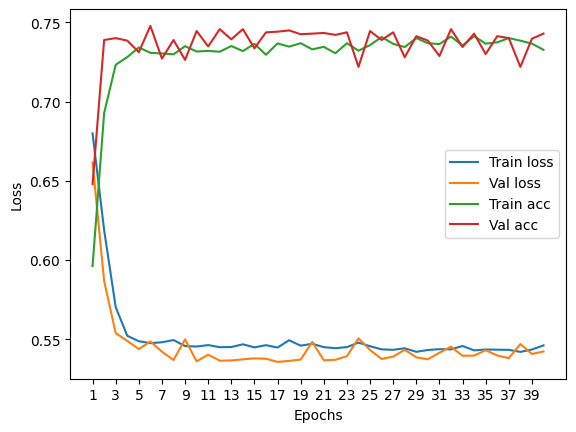

****************************************************************************************************



Particles per jet: 5


118it [00:00, 233.93it/s]


Train Epoch: 0 	Loss: 0.690863, Accuracy: 4204/7500 (56%)
Val Epoch: 0 	Loss: 0.686509, Accuracy: 1476/2500 (59%)



118it [00:00, 223.58it/s]


Train Epoch: 1 	Loss: 0.638845, Accuracy: 4994/7500 (67%)
Val Epoch: 1 	Loss: 0.601913, Accuracy: 1823/2500 (73%)



118it [00:00, 228.61it/s]


Train Epoch: 2 	Loss: 0.575542, Accuracy: 5457/7500 (73%)
Val Epoch: 2 	Loss: 0.555917, Accuracy: 1851/2500 (74%)



118it [00:00, 226.03it/s]


Train Epoch: 3 	Loss: 0.549550, Accuracy: 5524/7500 (74%)
Val Epoch: 3 	Loss: 0.542157, Accuracy: 1860/2500 (74%)



118it [00:00, 179.88it/s]


Train Epoch: 4 	Loss: 0.543884, Accuracy: 5514/7500 (74%)
Val Epoch: 4 	Loss: 0.536662, Accuracy: 1874/2500 (75%)



118it [00:00, 206.26it/s]


Train Epoch: 5 	Loss: 0.540694, Accuracy: 5552/7500 (74%)
Val Epoch: 5 	Loss: 0.536758, Accuracy: 1875/2500 (75%)



118it [00:00, 215.58it/s]


Train Epoch: 6 	Loss: 0.544151, Accuracy: 5539/7500 (74%)
Val Epoch: 6 	Loss: 0.527776, Accuracy: 1871/2500 (75%)



118it [00:00, 229.96it/s]


Train Epoch: 7 	Loss: 0.541237, Accuracy: 5534/7500 (74%)
Val Epoch: 7 	Loss: 0.526844, Accuracy: 1870/2500 (75%)



118it [00:00, 230.88it/s]


Train Epoch: 8 	Loss: 0.538103, Accuracy: 5561/7500 (74%)
Val Epoch: 8 	Loss: 0.525741, Accuracy: 1875/2500 (75%)



118it [00:00, 230.19it/s]


Train Epoch: 9 	Loss: 0.541330, Accuracy: 5549/7500 (74%)
Val Epoch: 9 	Loss: 0.536323, Accuracy: 1874/2500 (75%)



118it [00:00, 218.41it/s]


Train Epoch: 10 	Loss: 0.539396, Accuracy: 5559/7500 (74%)
Val Epoch: 10 	Loss: 0.536145, Accuracy: 1878/2500 (75%)



118it [00:00, 164.98it/s]


Train Epoch: 11 	Loss: 0.540266, Accuracy: 5538/7500 (74%)
Val Epoch: 11 	Loss: 0.535500, Accuracy: 1875/2500 (75%)



118it [00:00, 189.24it/s]


Train Epoch: 12 	Loss: 0.540519, Accuracy: 5545/7500 (74%)
Val Epoch: 12 	Loss: 0.530686, Accuracy: 1871/2500 (75%)



118it [00:00, 182.04it/s]


Train Epoch: 13 	Loss: 0.539710, Accuracy: 5542/7500 (74%)
Val Epoch: 13 	Loss: 0.531480, Accuracy: 1875/2500 (75%)



118it [00:00, 224.72it/s]


Train Epoch: 14 	Loss: 0.539211, Accuracy: 5562/7500 (74%)
Val Epoch: 14 	Loss: 0.532118, Accuracy: 1872/2500 (75%)



118it [00:00, 231.00it/s]


Train Epoch: 15 	Loss: 0.538303, Accuracy: 5563/7500 (74%)
Val Epoch: 15 	Loss: 0.538181, Accuracy: 1875/2500 (75%)



118it [00:00, 228.21it/s]


Train Epoch: 16 	Loss: 0.538206, Accuracy: 5562/7500 (74%)
Val Epoch: 16 	Loss: 0.529164, Accuracy: 1870/2500 (75%)



118it [00:00, 228.77it/s]


Train Epoch: 17 	Loss: 0.539353, Accuracy: 5572/7500 (74%)
Val Epoch: 17 	Loss: 0.537574, Accuracy: 1870/2500 (75%)



118it [00:00, 228.94it/s]


Train Epoch: 18 	Loss: 0.540083, Accuracy: 5587/7500 (74%)
Val Epoch: 18 	Loss: 0.533428, Accuracy: 1865/2500 (75%)



118it [00:00, 225.41it/s]


Train Epoch: 19 	Loss: 0.538211, Accuracy: 5549/7500 (74%)
Val Epoch: 19 	Loss: 0.537954, Accuracy: 1871/2500 (75%)



118it [00:00, 224.78it/s]


Train Epoch: 20 	Loss: 0.541654, Accuracy: 5568/7500 (74%)
Val Epoch: 20 	Loss: 0.539309, Accuracy: 1874/2500 (75%)



118it [00:00, 223.90it/s]


Train Epoch: 21 	Loss: 0.538855, Accuracy: 5560/7500 (74%)
Val Epoch: 21 	Loss: 0.536259, Accuracy: 1877/2500 (75%)



118it [00:00, 229.39it/s]


Train Epoch: 22 	Loss: 0.540238, Accuracy: 5569/7500 (74%)
Val Epoch: 22 	Loss: 0.537882, Accuracy: 1880/2500 (75%)



118it [00:00, 229.44it/s]


Train Epoch: 23 	Loss: 0.541227, Accuracy: 5554/7500 (74%)
Val Epoch: 23 	Loss: 0.533048, Accuracy: 1886/2500 (75%)



118it [00:00, 221.55it/s]


Train Epoch: 24 	Loss: 0.539568, Accuracy: 5548/7500 (74%)
Val Epoch: 24 	Loss: 0.525545, Accuracy: 1872/2500 (75%)



118it [00:00, 229.13it/s]


Train Epoch: 25 	Loss: 0.539357, Accuracy: 5537/7500 (74%)
Val Epoch: 25 	Loss: 0.537504, Accuracy: 1869/2500 (75%)



118it [00:00, 230.99it/s]


Train Epoch: 26 	Loss: 0.538395, Accuracy: 5556/7500 (74%)
Val Epoch: 26 	Loss: 0.536189, Accuracy: 1880/2500 (75%)



118it [00:00, 217.09it/s]


Train Epoch: 27 	Loss: 0.540845, Accuracy: 5547/7500 (74%)
Val Epoch: 27 	Loss: 0.527226, Accuracy: 1883/2500 (75%)



118it [00:00, 225.75it/s]


Train Epoch: 28 	Loss: 0.540173, Accuracy: 5552/7500 (74%)
Val Epoch: 28 	Loss: 0.538888, Accuracy: 1878/2500 (75%)



118it [00:00, 231.00it/s]


Train Epoch: 29 	Loss: 0.538373, Accuracy: 5549/7500 (74%)
Val Epoch: 29 	Loss: 0.528428, Accuracy: 1876/2500 (75%)



118it [00:00, 226.35it/s]


Train Epoch: 30 	Loss: 0.541552, Accuracy: 5546/7500 (74%)
Val Epoch: 30 	Loss: 0.534034, Accuracy: 1874/2500 (75%)



118it [00:00, 224.19it/s]


Train Epoch: 31 	Loss: 0.537461, Accuracy: 5567/7500 (74%)
Val Epoch: 31 	Loss: 0.533941, Accuracy: 1872/2500 (75%)



118it [00:00, 231.09it/s]


Train Epoch: 32 	Loss: 0.538020, Accuracy: 5575/7500 (74%)
Val Epoch: 32 	Loss: 0.542136, Accuracy: 1863/2500 (75%)



118it [00:00, 209.42it/s]


Train Epoch: 33 	Loss: 0.540733, Accuracy: 5562/7500 (74%)
Val Epoch: 33 	Loss: 0.530127, Accuracy: 1869/2500 (75%)



118it [00:00, 164.72it/s]


Train Epoch: 34 	Loss: 0.538588, Accuracy: 5539/7500 (74%)
Val Epoch: 34 	Loss: 0.521427, Accuracy: 1875/2500 (75%)



118it [00:00, 196.06it/s]


Train Epoch: 35 	Loss: 0.538900, Accuracy: 5551/7500 (74%)
Val Epoch: 35 	Loss: 0.543935, Accuracy: 1873/2500 (75%)



118it [00:00, 182.00it/s]


Train Epoch: 36 	Loss: 0.540260, Accuracy: 5555/7500 (74%)
Val Epoch: 36 	Loss: 0.535196, Accuracy: 1875/2500 (75%)



118it [00:00, 234.09it/s]


Train Epoch: 37 	Loss: 0.540381, Accuracy: 5564/7500 (74%)
Val Epoch: 37 	Loss: 0.529188, Accuracy: 1878/2500 (75%)



118it [00:00, 213.23it/s]


Train Epoch: 38 	Loss: 0.538868, Accuracy: 5569/7500 (74%)
Val Epoch: 38 	Loss: 0.525262, Accuracy: 1872/2500 (75%)



118it [00:00, 228.34it/s]


Train Epoch: 39 	Loss: 0.540928, Accuracy: 5546/7500 (74%)
Val Epoch: 39 	Loss: 0.529236, Accuracy: 1876/2500 (75%)

Test accuracy:  72.96000000000001


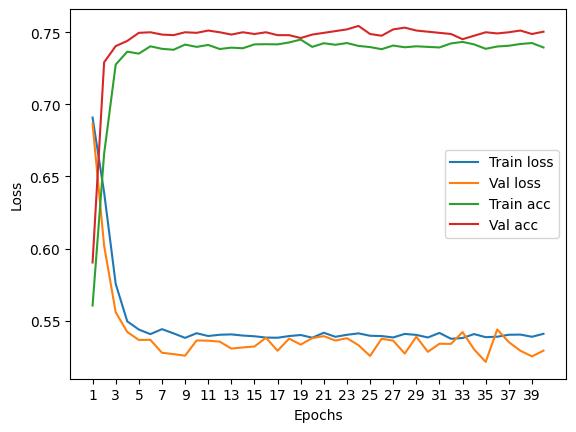

****************************************************************************************************



118it [00:00, 171.38it/s]


Train Epoch: 0 	Loss: 0.692514, Accuracy: 4082/7500 (54%)
Val Epoch: 0 	Loss: 0.691693, Accuracy: 1551/2500 (62%)



118it [00:00, 195.65it/s]


Train Epoch: 1 	Loss: 0.647431, Accuracy: 4986/7500 (66%)
Val Epoch: 1 	Loss: 0.627526, Accuracy: 1739/2500 (70%)



118it [00:00, 185.84it/s]


Train Epoch: 2 	Loss: 0.584648, Accuracy: 5381/7500 (72%)
Val Epoch: 2 	Loss: 0.590491, Accuracy: 1765/2500 (71%)



118it [00:00, 215.56it/s]


Train Epoch: 3 	Loss: 0.557817, Accuracy: 5471/7500 (73%)
Val Epoch: 3 	Loss: 0.585145, Accuracy: 1780/2500 (71%)



118it [00:00, 230.58it/s]


Train Epoch: 4 	Loss: 0.548581, Accuracy: 5490/7500 (73%)
Val Epoch: 4 	Loss: 0.576333, Accuracy: 1785/2500 (71%)



118it [00:00, 219.01it/s]


Train Epoch: 5 	Loss: 0.545672, Accuracy: 5511/7500 (73%)
Val Epoch: 5 	Loss: 0.573913, Accuracy: 1787/2500 (71%)



118it [00:00, 230.79it/s]


Train Epoch: 6 	Loss: 0.543937, Accuracy: 5524/7500 (74%)
Val Epoch: 6 	Loss: 0.573253, Accuracy: 1795/2500 (72%)



118it [00:00, 233.33it/s]


Train Epoch: 7 	Loss: 0.545248, Accuracy: 5509/7500 (73%)
Val Epoch: 7 	Loss: 0.580576, Accuracy: 1796/2500 (72%)



118it [00:00, 211.31it/s]


Train Epoch: 8 	Loss: 0.543770, Accuracy: 5509/7500 (73%)
Val Epoch: 8 	Loss: 0.577752, Accuracy: 1794/2500 (72%)



118it [00:00, 190.13it/s]


Train Epoch: 9 	Loss: 0.545713, Accuracy: 5511/7500 (73%)
Val Epoch: 9 	Loss: 0.576694, Accuracy: 1794/2500 (72%)



118it [00:00, 220.52it/s]


Train Epoch: 10 	Loss: 0.544753, Accuracy: 5517/7500 (74%)
Val Epoch: 10 	Loss: 0.579477, Accuracy: 1797/2500 (72%)



118it [00:00, 225.50it/s]


Train Epoch: 11 	Loss: 0.543643, Accuracy: 5510/7500 (73%)
Val Epoch: 11 	Loss: 0.579653, Accuracy: 1792/2500 (72%)



118it [00:00, 227.75it/s]


Train Epoch: 12 	Loss: 0.547435, Accuracy: 5512/7500 (73%)
Val Epoch: 12 	Loss: 0.586449, Accuracy: 1794/2500 (72%)



118it [00:00, 222.18it/s]


Train Epoch: 13 	Loss: 0.544838, Accuracy: 5493/7500 (73%)
Val Epoch: 13 	Loss: 0.574132, Accuracy: 1786/2500 (71%)



118it [00:00, 231.88it/s]


Train Epoch: 14 	Loss: 0.545394, Accuracy: 5516/7500 (74%)
Val Epoch: 14 	Loss: 0.579101, Accuracy: 1785/2500 (71%)



118it [00:00, 221.71it/s]


Train Epoch: 15 	Loss: 0.543116, Accuracy: 5532/7500 (74%)
Val Epoch: 15 	Loss: 0.569955, Accuracy: 1785/2500 (71%)



118it [00:00, 229.80it/s]


Train Epoch: 16 	Loss: 0.541792, Accuracy: 5503/7500 (73%)
Val Epoch: 16 	Loss: 0.577949, Accuracy: 1790/2500 (72%)



118it [00:00, 213.52it/s]


Train Epoch: 17 	Loss: 0.541148, Accuracy: 5529/7500 (74%)
Val Epoch: 17 	Loss: 0.576486, Accuracy: 1791/2500 (72%)



118it [00:00, 232.88it/s]


Train Epoch: 18 	Loss: 0.543760, Accuracy: 5532/7500 (74%)
Val Epoch: 18 	Loss: 0.587732, Accuracy: 1785/2500 (71%)



118it [00:00, 210.79it/s]


Train Epoch: 19 	Loss: 0.545220, Accuracy: 5507/7500 (73%)
Val Epoch: 19 	Loss: 0.570046, Accuracy: 1806/2500 (72%)



118it [00:00, 228.41it/s]


Train Epoch: 20 	Loss: 0.545372, Accuracy: 5490/7500 (73%)
Val Epoch: 20 	Loss: 0.570139, Accuracy: 1791/2500 (72%)



118it [00:00, 232.00it/s]


Train Epoch: 21 	Loss: 0.542607, Accuracy: 5519/7500 (74%)
Val Epoch: 21 	Loss: 0.571821, Accuracy: 1794/2500 (72%)



118it [00:00, 189.74it/s]


Train Epoch: 22 	Loss: 0.540855, Accuracy: 5509/7500 (73%)
Val Epoch: 22 	Loss: 0.567583, Accuracy: 1805/2500 (72%)



118it [00:00, 171.44it/s]


Train Epoch: 23 	Loss: 0.544464, Accuracy: 5515/7500 (74%)
Val Epoch: 23 	Loss: 0.581468, Accuracy: 1803/2500 (72%)



118it [00:00, 189.00it/s]


Train Epoch: 24 	Loss: 0.542491, Accuracy: 5518/7500 (74%)
Val Epoch: 24 	Loss: 0.569142, Accuracy: 1792/2500 (72%)



118it [00:00, 203.61it/s]


Train Epoch: 25 	Loss: 0.541325, Accuracy: 5543/7500 (74%)
Val Epoch: 25 	Loss: 0.576198, Accuracy: 1787/2500 (71%)



118it [00:00, 226.80it/s]


Train Epoch: 26 	Loss: 0.543110, Accuracy: 5538/7500 (74%)
Val Epoch: 26 	Loss: 0.575385, Accuracy: 1787/2500 (71%)



118it [00:00, 226.61it/s]


Train Epoch: 27 	Loss: 0.543625, Accuracy: 5530/7500 (74%)
Val Epoch: 27 	Loss: 0.577523, Accuracy: 1786/2500 (71%)



118it [00:00, 221.12it/s]


Train Epoch: 28 	Loss: 0.542182, Accuracy: 5519/7500 (74%)
Val Epoch: 28 	Loss: 0.572006, Accuracy: 1795/2500 (72%)



118it [00:00, 227.09it/s]


Train Epoch: 29 	Loss: 0.541597, Accuracy: 5538/7500 (74%)
Val Epoch: 29 	Loss: 0.572280, Accuracy: 1791/2500 (72%)



118it [00:00, 230.03it/s]


Train Epoch: 30 	Loss: 0.543230, Accuracy: 5522/7500 (74%)
Val Epoch: 30 	Loss: 0.577647, Accuracy: 1794/2500 (72%)



118it [00:00, 226.62it/s]


Train Epoch: 31 	Loss: 0.547307, Accuracy: 5490/7500 (73%)
Val Epoch: 31 	Loss: 0.571445, Accuracy: 1788/2500 (72%)



118it [00:00, 225.71it/s]


Train Epoch: 32 	Loss: 0.544790, Accuracy: 5501/7500 (73%)
Val Epoch: 32 	Loss: 0.577805, Accuracy: 1789/2500 (72%)



118it [00:00, 226.32it/s]


Train Epoch: 33 	Loss: 0.542873, Accuracy: 5529/7500 (74%)
Val Epoch: 33 	Loss: 0.575205, Accuracy: 1797/2500 (72%)



118it [00:00, 227.69it/s]


Train Epoch: 34 	Loss: 0.540454, Accuracy: 5531/7500 (74%)
Val Epoch: 34 	Loss: 0.575757, Accuracy: 1791/2500 (72%)



118it [00:00, 223.22it/s]


Train Epoch: 35 	Loss: 0.545931, Accuracy: 5506/7500 (73%)
Val Epoch: 35 	Loss: 0.571731, Accuracy: 1794/2500 (72%)



118it [00:00, 226.95it/s]


Train Epoch: 36 	Loss: 0.544052, Accuracy: 5534/7500 (74%)
Val Epoch: 36 	Loss: 0.577165, Accuracy: 1789/2500 (72%)



118it [00:00, 224.32it/s]


Train Epoch: 37 	Loss: 0.542127, Accuracy: 5521/7500 (74%)
Val Epoch: 37 	Loss: 0.580983, Accuracy: 1789/2500 (72%)



118it [00:00, 227.01it/s]


Train Epoch: 38 	Loss: 0.540646, Accuracy: 5523/7500 (74%)
Val Epoch: 38 	Loss: 0.579433, Accuracy: 1792/2500 (72%)



118it [00:00, 227.70it/s]


Train Epoch: 39 	Loss: 0.542022, Accuracy: 5529/7500 (74%)
Val Epoch: 39 	Loss: 0.583986, Accuracy: 1798/2500 (72%)

Test accuracy:  75.03999999999999


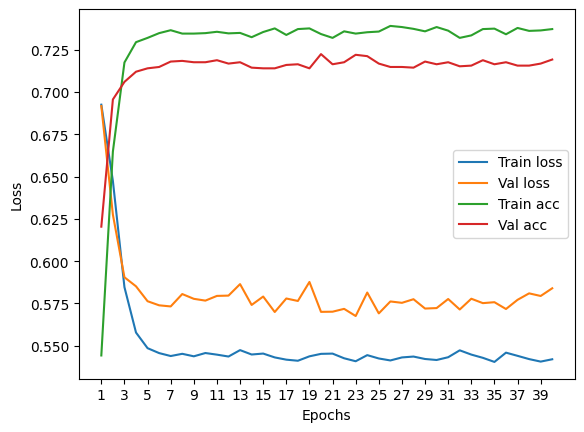

****************************************************************************************************



118it [00:00, 181.29it/s]


Train Epoch: 0 	Loss: 0.690477, Accuracy: 4254/7500 (57%)
Val Epoch: 0 	Loss: 0.683901, Accuracy: 1682/2500 (67%)



118it [00:00, 176.19it/s]


Train Epoch: 1 	Loss: 0.636367, Accuracy: 5106/7500 (68%)
Val Epoch: 1 	Loss: 0.619600, Accuracy: 1758/2500 (70%)



118it [00:00, 165.21it/s]


Train Epoch: 2 	Loss: 0.579280, Accuracy: 5450/7500 (73%)
Val Epoch: 2 	Loss: 0.569242, Accuracy: 1809/2500 (72%)



118it [00:00, 184.76it/s]


Train Epoch: 3 	Loss: 0.555973, Accuracy: 5533/7500 (74%)
Val Epoch: 3 	Loss: 0.559650, Accuracy: 1841/2500 (74%)



118it [00:00, 221.56it/s]


Train Epoch: 4 	Loss: 0.546044, Accuracy: 5536/7500 (74%)
Val Epoch: 4 	Loss: 0.557070, Accuracy: 1841/2500 (74%)



118it [00:00, 221.19it/s]


Train Epoch: 5 	Loss: 0.540445, Accuracy: 5560/7500 (74%)
Val Epoch: 5 	Loss: 0.553684, Accuracy: 1842/2500 (74%)



118it [00:00, 211.63it/s]


Train Epoch: 6 	Loss: 0.540446, Accuracy: 5537/7500 (74%)
Val Epoch: 6 	Loss: 0.565540, Accuracy: 1824/2500 (73%)



118it [00:00, 204.04it/s]


Train Epoch: 7 	Loss: 0.543016, Accuracy: 5570/7500 (74%)
Val Epoch: 7 	Loss: 0.551714, Accuracy: 1837/2500 (73%)



118it [00:00, 169.00it/s]


Train Epoch: 8 	Loss: 0.539767, Accuracy: 5559/7500 (74%)
Val Epoch: 8 	Loss: 0.553725, Accuracy: 1809/2500 (72%)



118it [00:00, 189.71it/s]


Train Epoch: 9 	Loss: 0.540357, Accuracy: 5565/7500 (74%)
Val Epoch: 9 	Loss: 0.560520, Accuracy: 1812/2500 (72%)



118it [00:00, 193.45it/s]


Train Epoch: 10 	Loss: 0.542835, Accuracy: 5557/7500 (74%)
Val Epoch: 10 	Loss: 0.549026, Accuracy: 1828/2500 (73%)



118it [00:00, 232.28it/s]


Train Epoch: 11 	Loss: 0.538945, Accuracy: 5583/7500 (74%)
Val Epoch: 11 	Loss: 0.548989, Accuracy: 1843/2500 (74%)



118it [00:00, 234.09it/s]


Train Epoch: 12 	Loss: 0.539113, Accuracy: 5573/7500 (74%)
Val Epoch: 12 	Loss: 0.554097, Accuracy: 1826/2500 (73%)



118it [00:00, 227.03it/s]


Train Epoch: 13 	Loss: 0.537767, Accuracy: 5596/7500 (75%)
Val Epoch: 13 	Loss: 0.560248, Accuracy: 1823/2500 (73%)



118it [00:00, 227.46it/s]


Train Epoch: 14 	Loss: 0.538944, Accuracy: 5582/7500 (74%)
Val Epoch: 14 	Loss: 0.544033, Accuracy: 1845/2500 (74%)



118it [00:00, 222.02it/s]


Train Epoch: 15 	Loss: 0.537598, Accuracy: 5598/7500 (75%)
Val Epoch: 15 	Loss: 0.561863, Accuracy: 1836/2500 (73%)



118it [00:00, 203.47it/s]


Train Epoch: 16 	Loss: 0.539276, Accuracy: 5575/7500 (74%)
Val Epoch: 16 	Loss: 0.543033, Accuracy: 1846/2500 (74%)



118it [00:00, 144.59it/s]


Train Epoch: 17 	Loss: 0.538347, Accuracy: 5584/7500 (74%)
Val Epoch: 17 	Loss: 0.552785, Accuracy: 1843/2500 (74%)



118it [00:00, 204.27it/s]


Train Epoch: 18 	Loss: 0.538564, Accuracy: 5590/7500 (75%)
Val Epoch: 18 	Loss: 0.559588, Accuracy: 1841/2500 (74%)



118it [00:00, 217.16it/s]


Train Epoch: 19 	Loss: 0.540848, Accuracy: 5576/7500 (74%)
Val Epoch: 19 	Loss: 0.553379, Accuracy: 1833/2500 (73%)



118it [00:00, 181.65it/s]


Train Epoch: 20 	Loss: 0.538352, Accuracy: 5585/7500 (74%)
Val Epoch: 20 	Loss: 0.565104, Accuracy: 1838/2500 (74%)



118it [00:00, 150.55it/s]


Train Epoch: 21 	Loss: 0.541845, Accuracy: 5569/7500 (74%)
Val Epoch: 21 	Loss: 0.546133, Accuracy: 1841/2500 (74%)



118it [00:00, 155.61it/s]


Train Epoch: 22 	Loss: 0.539166, Accuracy: 5605/7500 (75%)
Val Epoch: 22 	Loss: 0.550446, Accuracy: 1846/2500 (74%)



118it [00:00, 207.67it/s]


Train Epoch: 23 	Loss: 0.538018, Accuracy: 5604/7500 (75%)
Val Epoch: 23 	Loss: 0.551914, Accuracy: 1839/2500 (74%)



118it [00:00, 219.95it/s]


Train Epoch: 24 	Loss: 0.539139, Accuracy: 5581/7500 (74%)
Val Epoch: 24 	Loss: 0.547418, Accuracy: 1847/2500 (74%)



118it [00:00, 221.75it/s]


Train Epoch: 25 	Loss: 0.538910, Accuracy: 5597/7500 (75%)
Val Epoch: 25 	Loss: 0.545568, Accuracy: 1842/2500 (74%)



118it [00:00, 225.21it/s]


Train Epoch: 26 	Loss: 0.537922, Accuracy: 5581/7500 (74%)
Val Epoch: 26 	Loss: 0.544038, Accuracy: 1841/2500 (74%)



118it [00:00, 228.07it/s]


Train Epoch: 27 	Loss: 0.537163, Accuracy: 5583/7500 (74%)
Val Epoch: 27 	Loss: 0.554981, Accuracy: 1840/2500 (74%)



118it [00:00, 177.93it/s]


Train Epoch: 28 	Loss: 0.538138, Accuracy: 5575/7500 (74%)
Val Epoch: 28 	Loss: 0.552851, Accuracy: 1847/2500 (74%)



118it [00:00, 172.48it/s]


Train Epoch: 29 	Loss: 0.538102, Accuracy: 5594/7500 (75%)
Val Epoch: 29 	Loss: 0.549087, Accuracy: 1837/2500 (73%)



118it [00:00, 179.66it/s]


Train Epoch: 30 	Loss: 0.536742, Accuracy: 5586/7500 (74%)
Val Epoch: 30 	Loss: 0.553814, Accuracy: 1841/2500 (74%)



118it [00:00, 207.17it/s]


Train Epoch: 31 	Loss: 0.538064, Accuracy: 5574/7500 (74%)
Val Epoch: 31 	Loss: 0.556177, Accuracy: 1830/2500 (73%)



118it [00:00, 227.43it/s]


Train Epoch: 32 	Loss: 0.540092, Accuracy: 5586/7500 (74%)
Val Epoch: 32 	Loss: 0.556625, Accuracy: 1831/2500 (73%)



118it [00:00, 217.65it/s]


Train Epoch: 33 	Loss: 0.539246, Accuracy: 5593/7500 (75%)
Val Epoch: 33 	Loss: 0.550538, Accuracy: 1833/2500 (73%)



118it [00:00, 227.80it/s]


Train Epoch: 34 	Loss: 0.536544, Accuracy: 5586/7500 (74%)
Val Epoch: 34 	Loss: 0.554611, Accuracy: 1845/2500 (74%)



118it [00:00, 221.42it/s]


Train Epoch: 35 	Loss: 0.537548, Accuracy: 5566/7500 (74%)
Val Epoch: 35 	Loss: 0.561011, Accuracy: 1836/2500 (73%)



118it [00:00, 218.77it/s]


Train Epoch: 36 	Loss: 0.536731, Accuracy: 5586/7500 (74%)
Val Epoch: 36 	Loss: 0.560825, Accuracy: 1841/2500 (74%)



118it [00:00, 221.64it/s]


Train Epoch: 37 	Loss: 0.536802, Accuracy: 5589/7500 (75%)
Val Epoch: 37 	Loss: 0.555312, Accuracy: 1843/2500 (74%)



118it [00:00, 220.68it/s]


Train Epoch: 38 	Loss: 0.537444, Accuracy: 5584/7500 (74%)
Val Epoch: 38 	Loss: 0.543460, Accuracy: 1843/2500 (74%)



118it [00:00, 222.78it/s]


Train Epoch: 39 	Loss: 0.536340, Accuracy: 5585/7500 (74%)
Val Epoch: 39 	Loss: 0.559576, Accuracy: 1847/2500 (74%)

Test accuracy:  74.83999999999999


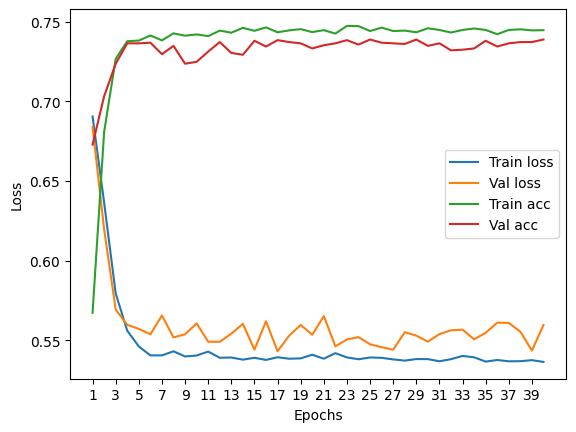

****************************************************************************************************



118it [00:00, 226.40it/s]


Train Epoch: 0 	Loss: 0.689798, Accuracy: 4329/7500 (58%)
Val Epoch: 0 	Loss: 0.684475, Accuracy: 1596/2500 (64%)



118it [00:00, 220.11it/s]


Train Epoch: 1 	Loss: 0.642504, Accuracy: 5056/7500 (67%)
Val Epoch: 1 	Loss: 0.610102, Accuracy: 1741/2500 (70%)



118it [00:00, 226.16it/s]


Train Epoch: 2 	Loss: 0.590563, Accuracy: 5340/7500 (71%)
Val Epoch: 2 	Loss: 0.567880, Accuracy: 1844/2500 (74%)



118it [00:00, 214.66it/s]


Train Epoch: 3 	Loss: 0.562514, Accuracy: 5430/7500 (72%)
Val Epoch: 3 	Loss: 0.556816, Accuracy: 1853/2500 (74%)



118it [00:00, 222.32it/s]


Train Epoch: 4 	Loss: 0.559103, Accuracy: 5409/7500 (72%)
Val Epoch: 4 	Loss: 0.552887, Accuracy: 1844/2500 (74%)



118it [00:00, 225.95it/s]


Train Epoch: 5 	Loss: 0.556996, Accuracy: 5460/7500 (73%)
Val Epoch: 5 	Loss: 0.541856, Accuracy: 1858/2500 (74%)



118it [00:00, 225.49it/s]


Train Epoch: 6 	Loss: 0.555770, Accuracy: 5427/7500 (72%)
Val Epoch: 6 	Loss: 0.547638, Accuracy: 1871/2500 (75%)



118it [00:00, 204.25it/s]


Train Epoch: 7 	Loss: 0.554485, Accuracy: 5452/7500 (73%)
Val Epoch: 7 	Loss: 0.541139, Accuracy: 1861/2500 (74%)



118it [00:00, 229.15it/s]


Train Epoch: 8 	Loss: 0.555208, Accuracy: 5441/7500 (73%)
Val Epoch: 8 	Loss: 0.532195, Accuracy: 1871/2500 (75%)



118it [00:00, 226.56it/s]


Train Epoch: 9 	Loss: 0.554844, Accuracy: 5473/7500 (73%)
Val Epoch: 9 	Loss: 0.543358, Accuracy: 1843/2500 (74%)



118it [00:00, 223.98it/s]


Train Epoch: 10 	Loss: 0.553639, Accuracy: 5476/7500 (73%)
Val Epoch: 10 	Loss: 0.540164, Accuracy: 1891/2500 (76%)



118it [00:00, 220.26it/s]


Train Epoch: 11 	Loss: 0.555304, Accuracy: 5480/7500 (73%)
Val Epoch: 11 	Loss: 0.536479, Accuracy: 1876/2500 (75%)



118it [00:00, 223.38it/s]


Train Epoch: 12 	Loss: 0.554080, Accuracy: 5465/7500 (73%)
Val Epoch: 12 	Loss: 0.539592, Accuracy: 1888/2500 (76%)



118it [00:00, 222.37it/s]


Train Epoch: 13 	Loss: 0.552483, Accuracy: 5466/7500 (73%)
Val Epoch: 13 	Loss: 0.535325, Accuracy: 1878/2500 (75%)



118it [00:00, 226.27it/s]


Train Epoch: 14 	Loss: 0.555268, Accuracy: 5447/7500 (73%)
Val Epoch: 14 	Loss: 0.541975, Accuracy: 1883/2500 (75%)



118it [00:00, 222.45it/s]


Train Epoch: 15 	Loss: 0.554654, Accuracy: 5465/7500 (73%)
Val Epoch: 15 	Loss: 0.542256, Accuracy: 1878/2500 (75%)



118it [00:00, 226.03it/s]


Train Epoch: 16 	Loss: 0.555811, Accuracy: 5433/7500 (72%)
Val Epoch: 16 	Loss: 0.549946, Accuracy: 1876/2500 (75%)



118it [00:00, 166.58it/s]


Train Epoch: 17 	Loss: 0.553888, Accuracy: 5477/7500 (73%)
Val Epoch: 17 	Loss: 0.535020, Accuracy: 1878/2500 (75%)



118it [00:00, 170.54it/s]


Train Epoch: 18 	Loss: 0.555780, Accuracy: 5445/7500 (73%)
Val Epoch: 18 	Loss: 0.539781, Accuracy: 1862/2500 (74%)



118it [00:00, 146.70it/s]


Train Epoch: 19 	Loss: 0.553128, Accuracy: 5471/7500 (73%)
Val Epoch: 19 	Loss: 0.539864, Accuracy: 1848/2500 (74%)



118it [00:00, 208.64it/s]


Train Epoch: 20 	Loss: 0.552975, Accuracy: 5450/7500 (73%)
Val Epoch: 20 	Loss: 0.546392, Accuracy: 1864/2500 (75%)



118it [00:00, 223.14it/s]


Train Epoch: 21 	Loss: 0.552687, Accuracy: 5463/7500 (73%)
Val Epoch: 21 	Loss: 0.535925, Accuracy: 1883/2500 (75%)



118it [00:00, 215.84it/s]


Train Epoch: 22 	Loss: 0.553045, Accuracy: 5479/7500 (73%)
Val Epoch: 22 	Loss: 0.541142, Accuracy: 1886/2500 (75%)



118it [00:00, 225.12it/s]


Train Epoch: 23 	Loss: 0.553095, Accuracy: 5466/7500 (73%)
Val Epoch: 23 	Loss: 0.538362, Accuracy: 1877/2500 (75%)



118it [00:00, 211.65it/s]


Train Epoch: 24 	Loss: 0.554259, Accuracy: 5473/7500 (73%)
Val Epoch: 24 	Loss: 0.546659, Accuracy: 1882/2500 (75%)



118it [00:00, 228.08it/s]


Train Epoch: 25 	Loss: 0.554820, Accuracy: 5447/7500 (73%)
Val Epoch: 25 	Loss: 0.541870, Accuracy: 1859/2500 (74%)



118it [00:00, 220.20it/s]


Train Epoch: 26 	Loss: 0.554420, Accuracy: 5467/7500 (73%)
Val Epoch: 26 	Loss: 0.553141, Accuracy: 1886/2500 (75%)



118it [00:00, 219.65it/s]


Train Epoch: 27 	Loss: 0.552092, Accuracy: 5494/7500 (73%)
Val Epoch: 27 	Loss: 0.547940, Accuracy: 1864/2500 (75%)



118it [00:00, 225.44it/s]


Train Epoch: 28 	Loss: 0.552606, Accuracy: 5466/7500 (73%)
Val Epoch: 28 	Loss: 0.535493, Accuracy: 1869/2500 (75%)



118it [00:00, 227.49it/s]


Train Epoch: 29 	Loss: 0.553529, Accuracy: 5461/7500 (73%)
Val Epoch: 29 	Loss: 0.542981, Accuracy: 1892/2500 (76%)



118it [00:00, 225.84it/s]


Train Epoch: 30 	Loss: 0.555574, Accuracy: 5443/7500 (73%)
Val Epoch: 30 	Loss: 0.536325, Accuracy: 1861/2500 (74%)



118it [00:00, 222.22it/s]


Train Epoch: 31 	Loss: 0.551601, Accuracy: 5475/7500 (73%)
Val Epoch: 31 	Loss: 0.532777, Accuracy: 1882/2500 (75%)



118it [00:00, 201.87it/s]


Train Epoch: 32 	Loss: 0.552333, Accuracy: 5467/7500 (73%)
Val Epoch: 32 	Loss: 0.537189, Accuracy: 1873/2500 (75%)



118it [00:00, 217.10it/s]


Train Epoch: 33 	Loss: 0.551918, Accuracy: 5462/7500 (73%)
Val Epoch: 33 	Loss: 0.542319, Accuracy: 1875/2500 (75%)



118it [00:00, 220.99it/s]


Train Epoch: 34 	Loss: 0.554481, Accuracy: 5467/7500 (73%)
Val Epoch: 34 	Loss: 0.547598, Accuracy: 1873/2500 (75%)



118it [00:00, 223.88it/s]


Train Epoch: 35 	Loss: 0.551443, Accuracy: 5460/7500 (73%)
Val Epoch: 35 	Loss: 0.549479, Accuracy: 1872/2500 (75%)



118it [00:00, 221.00it/s]


Train Epoch: 36 	Loss: 0.551881, Accuracy: 5484/7500 (73%)
Val Epoch: 36 	Loss: 0.546932, Accuracy: 1887/2500 (75%)



118it [00:00, 222.88it/s]


Train Epoch: 37 	Loss: 0.550809, Accuracy: 5468/7500 (73%)
Val Epoch: 37 	Loss: 0.534989, Accuracy: 1886/2500 (75%)



118it [00:00, 229.80it/s]


Train Epoch: 38 	Loss: 0.552561, Accuracy: 5464/7500 (73%)
Val Epoch: 38 	Loss: 0.537545, Accuracy: 1861/2500 (74%)



118it [00:00, 169.19it/s]


Train Epoch: 39 	Loss: 0.552745, Accuracy: 5462/7500 (73%)
Val Epoch: 39 	Loss: 0.546399, Accuracy: 1883/2500 (75%)

Test accuracy:  74.88


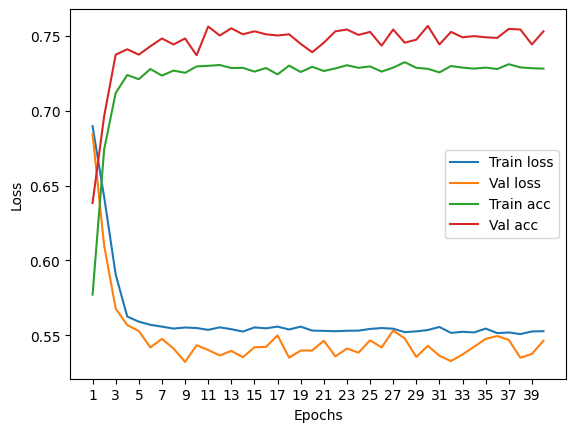

****************************************************************************************************



118it [00:00, 192.04it/s]


Train Epoch: 0 	Loss: 0.686812, Accuracy: 4359/7500 (58%)
Val Epoch: 0 	Loss: 0.672711, Accuracy: 1691/2500 (68%)



118it [00:00, 208.14it/s]


Train Epoch: 1 	Loss: 0.636041, Accuracy: 5069/7500 (68%)
Val Epoch: 1 	Loss: 0.610828, Accuracy: 1766/2500 (71%)



118it [00:00, 214.02it/s]


Train Epoch: 2 	Loss: 0.581601, Accuracy: 5396/7500 (72%)
Val Epoch: 2 	Loss: 0.569247, Accuracy: 1796/2500 (72%)



118it [00:00, 208.97it/s]


Train Epoch: 3 	Loss: 0.562948, Accuracy: 5414/7500 (72%)
Val Epoch: 3 	Loss: 0.564135, Accuracy: 1821/2500 (73%)



118it [00:00, 166.76it/s]


Train Epoch: 4 	Loss: 0.558640, Accuracy: 5422/7500 (72%)
Val Epoch: 4 	Loss: 0.576943, Accuracy: 1778/2500 (71%)



118it [00:01, 90.66it/s]


Train Epoch: 5 	Loss: 0.557827, Accuracy: 5460/7500 (73%)
Val Epoch: 5 	Loss: 0.555450, Accuracy: 1790/2500 (72%)



118it [00:00, 141.92it/s]


Train Epoch: 6 	Loss: 0.559437, Accuracy: 5455/7500 (73%)
Val Epoch: 6 	Loss: 0.562694, Accuracy: 1819/2500 (73%)



118it [00:00, 175.15it/s]


Train Epoch: 7 	Loss: 0.558572, Accuracy: 5470/7500 (73%)
Val Epoch: 7 	Loss: 0.559442, Accuracy: 1825/2500 (73%)



118it [00:00, 207.68it/s]


Train Epoch: 8 	Loss: 0.555436, Accuracy: 5473/7500 (73%)
Val Epoch: 8 	Loss: 0.549465, Accuracy: 1816/2500 (73%)



118it [00:00, 217.07it/s]


Train Epoch: 9 	Loss: 0.557086, Accuracy: 5456/7500 (73%)
Val Epoch: 9 	Loss: 0.553380, Accuracy: 1831/2500 (73%)



118it [00:00, 209.33it/s]


Train Epoch: 10 	Loss: 0.555353, Accuracy: 5490/7500 (73%)
Val Epoch: 10 	Loss: 0.556955, Accuracy: 1800/2500 (72%)



118it [00:00, 218.32it/s]


Train Epoch: 11 	Loss: 0.557985, Accuracy: 5440/7500 (73%)
Val Epoch: 11 	Loss: 0.554040, Accuracy: 1803/2500 (72%)



118it [00:00, 215.80it/s]


Train Epoch: 12 	Loss: 0.556324, Accuracy: 5456/7500 (73%)
Val Epoch: 12 	Loss: 0.548663, Accuracy: 1810/2500 (72%)



118it [00:00, 217.72it/s]


Train Epoch: 13 	Loss: 0.554496, Accuracy: 5465/7500 (73%)
Val Epoch: 13 	Loss: 0.551178, Accuracy: 1798/2500 (72%)



118it [00:00, 207.39it/s]


Train Epoch: 14 	Loss: 0.554569, Accuracy: 5464/7500 (73%)
Val Epoch: 14 	Loss: 0.557706, Accuracy: 1826/2500 (73%)



118it [00:00, 219.80it/s]


Train Epoch: 15 	Loss: 0.557003, Accuracy: 5465/7500 (73%)
Val Epoch: 15 	Loss: 0.562389, Accuracy: 1780/2500 (71%)



118it [00:00, 218.92it/s]


Train Epoch: 16 	Loss: 0.556505, Accuracy: 5424/7500 (72%)
Val Epoch: 16 	Loss: 0.547711, Accuracy: 1828/2500 (73%)



118it [00:00, 219.68it/s]


Train Epoch: 17 	Loss: 0.557299, Accuracy: 5471/7500 (73%)
Val Epoch: 17 	Loss: 0.555487, Accuracy: 1830/2500 (73%)



118it [00:00, 219.26it/s]


Train Epoch: 18 	Loss: 0.553113, Accuracy: 5456/7500 (73%)
Val Epoch: 18 	Loss: 0.553097, Accuracy: 1824/2500 (73%)



118it [00:00, 200.07it/s]


Train Epoch: 19 	Loss: 0.553566, Accuracy: 5469/7500 (73%)
Val Epoch: 19 	Loss: 0.561643, Accuracy: 1785/2500 (71%)



118it [00:00, 213.68it/s]


Train Epoch: 20 	Loss: 0.554934, Accuracy: 5468/7500 (73%)
Val Epoch: 20 	Loss: 0.568162, Accuracy: 1781/2500 (71%)



118it [00:00, 220.46it/s]


Train Epoch: 21 	Loss: 0.557190, Accuracy: 5461/7500 (73%)
Val Epoch: 21 	Loss: 0.550197, Accuracy: 1818/2500 (73%)



118it [00:00, 229.61it/s]


Train Epoch: 22 	Loss: 0.555533, Accuracy: 5470/7500 (73%)
Val Epoch: 22 	Loss: 0.560703, Accuracy: 1801/2500 (72%)



118it [00:00, 222.57it/s]


Train Epoch: 23 	Loss: 0.554466, Accuracy: 5467/7500 (73%)
Val Epoch: 23 	Loss: 0.546826, Accuracy: 1825/2500 (73%)



118it [00:00, 220.71it/s]


Train Epoch: 24 	Loss: 0.554122, Accuracy: 5477/7500 (73%)
Val Epoch: 24 	Loss: 0.547233, Accuracy: 1826/2500 (73%)



118it [00:00, 157.99it/s]


Train Epoch: 25 	Loss: 0.554086, Accuracy: 5459/7500 (73%)
Val Epoch: 25 	Loss: 0.550764, Accuracy: 1813/2500 (73%)



118it [00:00, 184.20it/s]


Train Epoch: 26 	Loss: 0.555497, Accuracy: 5459/7500 (73%)
Val Epoch: 26 	Loss: 0.555642, Accuracy: 1826/2500 (73%)



118it [00:00, 171.93it/s]


Train Epoch: 27 	Loss: 0.557326, Accuracy: 5471/7500 (73%)
Val Epoch: 27 	Loss: 0.557694, Accuracy: 1823/2500 (73%)



118it [00:00, 210.67it/s]


Train Epoch: 28 	Loss: 0.554905, Accuracy: 5450/7500 (73%)
Val Epoch: 28 	Loss: 0.562011, Accuracy: 1796/2500 (72%)



118it [00:00, 180.66it/s]


Train Epoch: 29 	Loss: 0.555921, Accuracy: 5480/7500 (73%)
Val Epoch: 29 	Loss: 0.554396, Accuracy: 1832/2500 (73%)



118it [00:00, 214.46it/s]


Train Epoch: 30 	Loss: 0.551666, Accuracy: 5471/7500 (73%)
Val Epoch: 30 	Loss: 0.558253, Accuracy: 1824/2500 (73%)



118it [00:00, 219.59it/s]


Train Epoch: 31 	Loss: 0.554468, Accuracy: 5479/7500 (73%)
Val Epoch: 31 	Loss: 0.558196, Accuracy: 1822/2500 (73%)



118it [00:00, 190.24it/s]


Train Epoch: 32 	Loss: 0.554147, Accuracy: 5451/7500 (73%)
Val Epoch: 32 	Loss: 0.550504, Accuracy: 1819/2500 (73%)



118it [00:00, 220.37it/s]


Train Epoch: 33 	Loss: 0.554834, Accuracy: 5481/7500 (73%)
Val Epoch: 33 	Loss: 0.549757, Accuracy: 1820/2500 (73%)



118it [00:00, 215.31it/s]


Train Epoch: 34 	Loss: 0.553232, Accuracy: 5487/7500 (73%)
Val Epoch: 34 	Loss: 0.559589, Accuracy: 1788/2500 (72%)



118it [00:00, 217.28it/s]


Train Epoch: 35 	Loss: 0.553579, Accuracy: 5459/7500 (73%)
Val Epoch: 35 	Loss: 0.564789, Accuracy: 1811/2500 (72%)



118it [00:00, 224.58it/s]


Train Epoch: 36 	Loss: 0.554169, Accuracy: 5459/7500 (73%)
Val Epoch: 36 	Loss: 0.551319, Accuracy: 1821/2500 (73%)



118it [00:00, 222.99it/s]


Train Epoch: 37 	Loss: 0.552091, Accuracy: 5458/7500 (73%)
Val Epoch: 37 	Loss: 0.556589, Accuracy: 1827/2500 (73%)



118it [00:00, 223.19it/s]


Train Epoch: 38 	Loss: 0.553462, Accuracy: 5473/7500 (73%)
Val Epoch: 38 	Loss: 0.554292, Accuracy: 1831/2500 (73%)



118it [00:00, 202.49it/s]


Train Epoch: 39 	Loss: 0.554811, Accuracy: 5463/7500 (73%)
Val Epoch: 39 	Loss: 0.558396, Accuracy: 1813/2500 (73%)

Test accuracy:  73.92


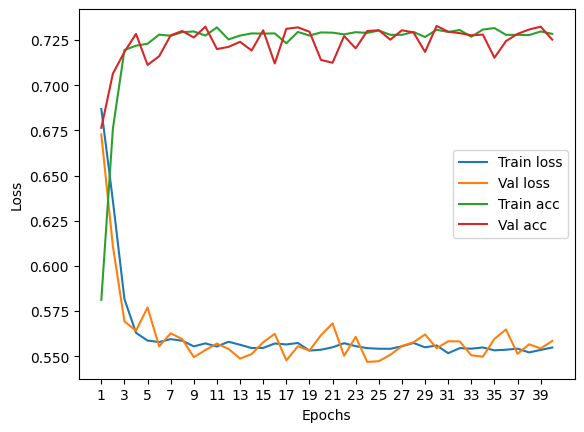

****************************************************************************************************



118it [00:00, 206.80it/s]


Train Epoch: 0 	Loss: 0.689144, Accuracy: 4289/7500 (57%)
Val Epoch: 0 	Loss: 0.685797, Accuracy: 1659/2500 (66%)



118it [00:00, 213.71it/s]


Train Epoch: 1 	Loss: 0.645675, Accuracy: 5009/7500 (67%)
Val Epoch: 1 	Loss: 0.626391, Accuracy: 1796/2500 (72%)



118it [00:00, 224.59it/s]


Train Epoch: 2 	Loss: 0.593103, Accuracy: 5309/7500 (71%)
Val Epoch: 2 	Loss: 0.592672, Accuracy: 1828/2500 (73%)



118it [00:00, 221.34it/s]


Train Epoch: 3 	Loss: 0.571315, Accuracy: 5396/7500 (72%)
Val Epoch: 3 	Loss: 0.580997, Accuracy: 1822/2500 (73%)



118it [00:00, 201.14it/s]


Train Epoch: 4 	Loss: 0.563276, Accuracy: 5442/7500 (73%)
Val Epoch: 4 	Loss: 0.555252, Accuracy: 1833/2500 (73%)



118it [00:00, 223.94it/s]


Train Epoch: 5 	Loss: 0.561554, Accuracy: 5449/7500 (73%)
Val Epoch: 5 	Loss: 0.575897, Accuracy: 1829/2500 (73%)



118it [00:00, 224.89it/s]


Train Epoch: 6 	Loss: 0.563198, Accuracy: 5408/7500 (72%)
Val Epoch: 6 	Loss: 0.562474, Accuracy: 1849/2500 (74%)



118it [00:00, 217.78it/s]


Train Epoch: 7 	Loss: 0.564262, Accuracy: 5434/7500 (72%)
Val Epoch: 7 	Loss: 0.571026, Accuracy: 1837/2500 (73%)



118it [00:00, 223.75it/s]


Train Epoch: 8 	Loss: 0.560151, Accuracy: 5442/7500 (73%)
Val Epoch: 8 	Loss: 0.568990, Accuracy: 1797/2500 (72%)



118it [00:00, 222.68it/s]


Train Epoch: 9 	Loss: 0.560629, Accuracy: 5456/7500 (73%)
Val Epoch: 9 	Loss: 0.551784, Accuracy: 1834/2500 (73%)



118it [00:00, 222.61it/s]


Train Epoch: 10 	Loss: 0.560300, Accuracy: 5447/7500 (73%)
Val Epoch: 10 	Loss: 0.560674, Accuracy: 1836/2500 (73%)



118it [00:00, 227.30it/s]


Train Epoch: 11 	Loss: 0.557572, Accuracy: 5466/7500 (73%)
Val Epoch: 11 	Loss: 0.581351, Accuracy: 1809/2500 (72%)



118it [00:00, 164.31it/s]


Train Epoch: 12 	Loss: 0.560839, Accuracy: 5435/7500 (72%)
Val Epoch: 12 	Loss: 0.551904, Accuracy: 1843/2500 (74%)



118it [00:00, 141.14it/s]


Train Epoch: 13 	Loss: 0.560655, Accuracy: 5467/7500 (73%)
Val Epoch: 13 	Loss: 0.554151, Accuracy: 1856/2500 (74%)



118it [00:00, 155.44it/s]


Train Epoch: 14 	Loss: 0.555491, Accuracy: 5490/7500 (73%)
Val Epoch: 14 	Loss: 0.552701, Accuracy: 1855/2500 (74%)



118it [00:00, 159.70it/s]


Train Epoch: 15 	Loss: 0.556361, Accuracy: 5493/7500 (73%)
Val Epoch: 15 	Loss: 0.557547, Accuracy: 1818/2500 (73%)



118it [00:00, 178.58it/s]


Train Epoch: 16 	Loss: 0.560850, Accuracy: 5471/7500 (73%)
Val Epoch: 16 	Loss: 0.571141, Accuracy: 1845/2500 (74%)



118it [00:00, 220.44it/s]


Train Epoch: 17 	Loss: 0.555731, Accuracy: 5470/7500 (73%)
Val Epoch: 17 	Loss: 0.552240, Accuracy: 1831/2500 (73%)



118it [00:00, 219.05it/s]


Train Epoch: 18 	Loss: 0.555629, Accuracy: 5477/7500 (73%)
Val Epoch: 18 	Loss: 0.551352, Accuracy: 1826/2500 (73%)



118it [00:00, 228.46it/s]


Train Epoch: 19 	Loss: 0.554459, Accuracy: 5485/7500 (73%)
Val Epoch: 19 	Loss: 0.563983, Accuracy: 1827/2500 (73%)



118it [00:00, 220.52it/s]


Train Epoch: 20 	Loss: 0.554076, Accuracy: 5467/7500 (73%)
Val Epoch: 20 	Loss: 0.562828, Accuracy: 1822/2500 (73%)



118it [00:00, 217.70it/s]


Train Epoch: 21 	Loss: 0.556026, Accuracy: 5500/7500 (73%)
Val Epoch: 21 	Loss: 0.553977, Accuracy: 1826/2500 (73%)



118it [00:00, 225.55it/s]


Train Epoch: 22 	Loss: 0.555239, Accuracy: 5492/7500 (73%)
Val Epoch: 22 	Loss: 0.558505, Accuracy: 1829/2500 (73%)



118it [00:00, 226.92it/s]


Train Epoch: 23 	Loss: 0.555332, Accuracy: 5478/7500 (73%)
Val Epoch: 23 	Loss: 0.556813, Accuracy: 1832/2500 (73%)



118it [00:00, 218.40it/s]


Train Epoch: 24 	Loss: 0.555218, Accuracy: 5469/7500 (73%)
Val Epoch: 24 	Loss: 0.553925, Accuracy: 1848/2500 (74%)



118it [00:00, 229.46it/s]


Train Epoch: 25 	Loss: 0.553651, Accuracy: 5482/7500 (73%)
Val Epoch: 25 	Loss: 0.557263, Accuracy: 1852/2500 (74%)



118it [00:00, 224.20it/s]


Train Epoch: 26 	Loss: 0.554715, Accuracy: 5477/7500 (73%)
Val Epoch: 26 	Loss: 0.559714, Accuracy: 1830/2500 (73%)



118it [00:00, 207.36it/s]


Train Epoch: 27 	Loss: 0.553273, Accuracy: 5504/7500 (73%)
Val Epoch: 27 	Loss: 0.561354, Accuracy: 1860/2500 (74%)



118it [00:00, 211.20it/s]


Train Epoch: 28 	Loss: 0.554240, Accuracy: 5487/7500 (73%)
Val Epoch: 28 	Loss: 0.558636, Accuracy: 1854/2500 (74%)



118it [00:00, 222.07it/s]


Train Epoch: 29 	Loss: 0.552109, Accuracy: 5484/7500 (73%)
Val Epoch: 29 	Loss: 0.556236, Accuracy: 1843/2500 (74%)



118it [00:00, 217.39it/s]


Train Epoch: 30 	Loss: 0.554416, Accuracy: 5489/7500 (73%)
Val Epoch: 30 	Loss: 0.549282, Accuracy: 1850/2500 (74%)



118it [00:00, 223.34it/s]


Train Epoch: 31 	Loss: 0.553593, Accuracy: 5526/7500 (74%)
Val Epoch: 31 	Loss: 0.564218, Accuracy: 1848/2500 (74%)



118it [00:00, 216.50it/s]


Train Epoch: 32 	Loss: 0.552034, Accuracy: 5510/7500 (73%)
Val Epoch: 32 	Loss: 0.553642, Accuracy: 1840/2500 (74%)



118it [00:00, 177.14it/s]


Train Epoch: 33 	Loss: 0.551638, Accuracy: 5509/7500 (73%)
Val Epoch: 33 	Loss: 0.551185, Accuracy: 1852/2500 (74%)



118it [00:00, 160.50it/s]


Train Epoch: 34 	Loss: 0.551971, Accuracy: 5509/7500 (73%)
Val Epoch: 34 	Loss: 0.555056, Accuracy: 1839/2500 (74%)



118it [00:00, 174.49it/s]


Train Epoch: 35 	Loss: 0.550955, Accuracy: 5505/7500 (73%)
Val Epoch: 35 	Loss: 0.546659, Accuracy: 1850/2500 (74%)



118it [00:00, 207.30it/s]


Train Epoch: 36 	Loss: 0.553937, Accuracy: 5510/7500 (73%)
Val Epoch: 36 	Loss: 0.563212, Accuracy: 1805/2500 (72%)



118it [00:00, 221.52it/s]


Train Epoch: 37 	Loss: 0.551631, Accuracy: 5507/7500 (73%)
Val Epoch: 37 	Loss: 0.546226, Accuracy: 1844/2500 (74%)



118it [00:00, 217.37it/s]


Train Epoch: 38 	Loss: 0.552119, Accuracy: 5477/7500 (73%)
Val Epoch: 38 	Loss: 0.557422, Accuracy: 1859/2500 (74%)



118it [00:00, 223.69it/s]


Train Epoch: 39 	Loss: 0.552950, Accuracy: 5517/7500 (74%)
Val Epoch: 39 	Loss: 0.555239, Accuracy: 1837/2500 (73%)

Test accuracy:  74.92


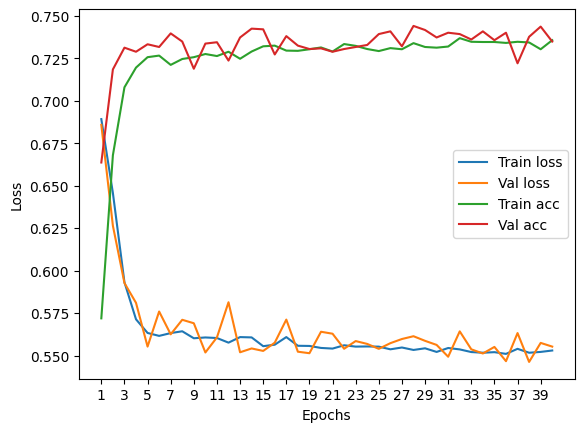

****************************************************************************************************



118it [00:00, 188.90it/s]


Train Epoch: 0 	Loss: 0.697869, Accuracy: 3910/7500 (52%)
Val Epoch: 0 	Loss: 0.701277, Accuracy: 1485/2500 (59%)



118it [00:00, 169.82it/s]


Train Epoch: 1 	Loss: 0.672096, Accuracy: 4634/7500 (62%)
Val Epoch: 1 	Loss: 0.652236, Accuracy: 1697/2500 (68%)



118it [00:00, 201.21it/s]


Train Epoch: 2 	Loss: 0.618320, Accuracy: 5135/7500 (68%)
Val Epoch: 2 	Loss: 0.598216, Accuracy: 1787/2500 (71%)



118it [00:00, 222.15it/s]


Train Epoch: 3 	Loss: 0.576700, Accuracy: 5391/7500 (72%)
Val Epoch: 3 	Loss: 0.579680, Accuracy: 1816/2500 (73%)



118it [00:00, 218.92it/s]


Train Epoch: 4 	Loss: 0.560802, Accuracy: 5445/7500 (73%)
Val Epoch: 4 	Loss: 0.560303, Accuracy: 1829/2500 (73%)



118it [00:00, 215.53it/s]


Train Epoch: 5 	Loss: 0.554362, Accuracy: 5455/7500 (73%)
Val Epoch: 5 	Loss: 0.555297, Accuracy: 1817/2500 (73%)



118it [00:00, 229.27it/s]


Train Epoch: 6 	Loss: 0.553332, Accuracy: 5455/7500 (73%)
Val Epoch: 6 	Loss: 0.565432, Accuracy: 1813/2500 (73%)



118it [00:00, 226.03it/s]


Train Epoch: 7 	Loss: 0.552049, Accuracy: 5462/7500 (73%)
Val Epoch: 7 	Loss: 0.551738, Accuracy: 1836/2500 (73%)



118it [00:00, 221.48it/s]


Train Epoch: 8 	Loss: 0.549200, Accuracy: 5491/7500 (73%)
Val Epoch: 8 	Loss: 0.549569, Accuracy: 1826/2500 (73%)



118it [00:00, 206.07it/s]


Train Epoch: 9 	Loss: 0.548711, Accuracy: 5488/7500 (73%)
Val Epoch: 9 	Loss: 0.558383, Accuracy: 1825/2500 (73%)



118it [00:00, 223.88it/s]


Train Epoch: 10 	Loss: 0.550318, Accuracy: 5488/7500 (73%)
Val Epoch: 10 	Loss: 0.550210, Accuracy: 1845/2500 (74%)



118it [00:00, 218.89it/s]


Train Epoch: 11 	Loss: 0.548299, Accuracy: 5500/7500 (73%)
Val Epoch: 11 	Loss: 0.563989, Accuracy: 1825/2500 (73%)



118it [00:00, 222.27it/s]


Train Epoch: 12 	Loss: 0.548708, Accuracy: 5496/7500 (73%)
Val Epoch: 12 	Loss: 0.548882, Accuracy: 1822/2500 (73%)



118it [00:00, 225.72it/s]


Train Epoch: 13 	Loss: 0.549723, Accuracy: 5491/7500 (73%)
Val Epoch: 13 	Loss: 0.547702, Accuracy: 1838/2500 (74%)



118it [00:00, 211.64it/s]


Train Epoch: 14 	Loss: 0.548339, Accuracy: 5518/7500 (74%)
Val Epoch: 14 	Loss: 0.551934, Accuracy: 1839/2500 (74%)



118it [00:00, 226.59it/s]


Train Epoch: 15 	Loss: 0.546228, Accuracy: 5476/7500 (73%)
Val Epoch: 15 	Loss: 0.561307, Accuracy: 1804/2500 (72%)



118it [00:00, 222.55it/s]


Train Epoch: 16 	Loss: 0.548268, Accuracy: 5507/7500 (73%)
Val Epoch: 16 	Loss: 0.571834, Accuracy: 1846/2500 (74%)



118it [00:00, 218.26it/s]


Train Epoch: 17 	Loss: 0.548748, Accuracy: 5504/7500 (73%)
Val Epoch: 17 	Loss: 0.554390, Accuracy: 1845/2500 (74%)



118it [00:00, 226.02it/s]


Train Epoch: 18 	Loss: 0.547069, Accuracy: 5470/7500 (73%)
Val Epoch: 18 	Loss: 0.555052, Accuracy: 1815/2500 (73%)



118it [00:00, 224.44it/s]


Train Epoch: 19 	Loss: 0.550612, Accuracy: 5496/7500 (73%)
Val Epoch: 19 	Loss: 0.553586, Accuracy: 1825/2500 (73%)



118it [00:00, 220.02it/s]


Train Epoch: 20 	Loss: 0.548092, Accuracy: 5505/7500 (73%)
Val Epoch: 20 	Loss: 0.550911, Accuracy: 1839/2500 (74%)



118it [00:00, 205.23it/s]


Train Epoch: 21 	Loss: 0.547287, Accuracy: 5497/7500 (73%)
Val Epoch: 21 	Loss: 0.549004, Accuracy: 1834/2500 (73%)



118it [00:00, 154.99it/s]


Train Epoch: 22 	Loss: 0.547287, Accuracy: 5490/7500 (73%)
Val Epoch: 22 	Loss: 0.557818, Accuracy: 1828/2500 (73%)



118it [00:00, 179.24it/s]


Train Epoch: 23 	Loss: 0.545839, Accuracy: 5497/7500 (73%)
Val Epoch: 23 	Loss: 0.555239, Accuracy: 1843/2500 (74%)



118it [00:00, 167.24it/s]


Train Epoch: 24 	Loss: 0.547185, Accuracy: 5490/7500 (73%)
Val Epoch: 24 	Loss: 0.567657, Accuracy: 1824/2500 (73%)



118it [00:00, 137.38it/s]


Train Epoch: 25 	Loss: 0.547882, Accuracy: 5483/7500 (73%)
Val Epoch: 25 	Loss: 0.551296, Accuracy: 1842/2500 (74%)



118it [00:00, 201.71it/s]


Train Epoch: 26 	Loss: 0.548198, Accuracy: 5492/7500 (73%)
Val Epoch: 26 	Loss: 0.558136, Accuracy: 1833/2500 (73%)



118it [00:00, 214.86it/s]


Train Epoch: 27 	Loss: 0.551749, Accuracy: 5482/7500 (73%)
Val Epoch: 27 	Loss: 0.556825, Accuracy: 1813/2500 (73%)



118it [00:00, 189.93it/s]


Train Epoch: 28 	Loss: 0.545032, Accuracy: 5513/7500 (74%)
Val Epoch: 28 	Loss: 0.561664, Accuracy: 1831/2500 (73%)



118it [00:00, 217.78it/s]


Train Epoch: 29 	Loss: 0.547099, Accuracy: 5472/7500 (73%)
Val Epoch: 29 	Loss: 0.556285, Accuracy: 1820/2500 (73%)



118it [00:00, 218.52it/s]


Train Epoch: 30 	Loss: 0.545359, Accuracy: 5488/7500 (73%)
Val Epoch: 30 	Loss: 0.552903, Accuracy: 1829/2500 (73%)



118it [00:00, 220.78it/s]


Train Epoch: 31 	Loss: 0.545206, Accuracy: 5503/7500 (73%)
Val Epoch: 31 	Loss: 0.553498, Accuracy: 1817/2500 (73%)



118it [00:00, 219.44it/s]


Train Epoch: 32 	Loss: 0.545554, Accuracy: 5485/7500 (73%)
Val Epoch: 32 	Loss: 0.562412, Accuracy: 1822/2500 (73%)



118it [00:00, 214.01it/s]


Train Epoch: 33 	Loss: 0.547285, Accuracy: 5498/7500 (73%)
Val Epoch: 33 	Loss: 0.579078, Accuracy: 1833/2500 (73%)



118it [00:00, 149.90it/s]


Train Epoch: 34 	Loss: 0.547279, Accuracy: 5473/7500 (73%)
Val Epoch: 34 	Loss: 0.549397, Accuracy: 1845/2500 (74%)



118it [00:00, 204.25it/s]


Train Epoch: 35 	Loss: 0.549308, Accuracy: 5486/7500 (73%)
Val Epoch: 35 	Loss: 0.557430, Accuracy: 1824/2500 (73%)



118it [00:00, 217.99it/s]


Train Epoch: 36 	Loss: 0.547410, Accuracy: 5481/7500 (73%)
Val Epoch: 36 	Loss: 0.556523, Accuracy: 1817/2500 (73%)



118it [00:00, 216.98it/s]


Train Epoch: 37 	Loss: 0.549854, Accuracy: 5467/7500 (73%)
Val Epoch: 37 	Loss: 0.556998, Accuracy: 1844/2500 (74%)



118it [00:00, 222.66it/s]


Train Epoch: 38 	Loss: 0.545788, Accuracy: 5485/7500 (73%)
Val Epoch: 38 	Loss: 0.547818, Accuracy: 1830/2500 (73%)



118it [00:00, 219.39it/s]


Train Epoch: 39 	Loss: 0.548912, Accuracy: 5471/7500 (73%)
Val Epoch: 39 	Loss: 0.553878, Accuracy: 1839/2500 (74%)

Test accuracy:  73.48


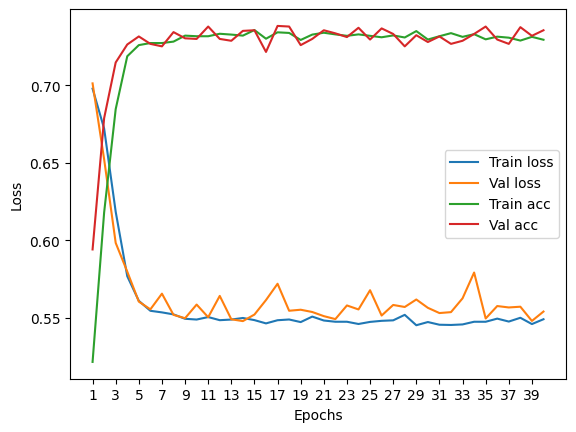

****************************************************************************************************



116it [00:00, 196.47it/s]


Train Epoch: 0 	Loss: 0.682847, Accuracy: 4347/7422 (59%)
Val Epoch: 0 	Loss: 0.666595, Accuracy: 1616/2474 (65%)



116it [00:00, 212.92it/s]


Train Epoch: 1 	Loss: 0.630427, Accuracy: 5065/7422 (68%)
Val Epoch: 1 	Loss: 0.605068, Accuracy: 1771/2474 (72%)



116it [00:00, 224.29it/s]


Train Epoch: 2 	Loss: 0.573155, Accuracy: 5376/7422 (72%)
Val Epoch: 2 	Loss: 0.566433, Accuracy: 1784/2474 (72%)



116it [00:00, 220.03it/s]


Train Epoch: 3 	Loss: 0.550852, Accuracy: 5422/7422 (73%)
Val Epoch: 3 	Loss: 0.558110, Accuracy: 1782/2474 (72%)



116it [00:00, 214.95it/s]


Train Epoch: 4 	Loss: 0.547044, Accuracy: 5449/7422 (73%)
Val Epoch: 4 	Loss: 0.572758, Accuracy: 1770/2474 (72%)



116it [00:00, 217.61it/s]


Train Epoch: 5 	Loss: 0.546283, Accuracy: 5434/7422 (73%)
Val Epoch: 5 	Loss: 0.553554, Accuracy: 1791/2474 (72%)



116it [00:00, 221.83it/s]


Train Epoch: 6 	Loss: 0.542008, Accuracy: 5452/7422 (73%)
Val Epoch: 6 	Loss: 0.557110, Accuracy: 1799/2474 (73%)



116it [00:00, 205.57it/s]


Train Epoch: 7 	Loss: 0.542872, Accuracy: 5477/7422 (74%)
Val Epoch: 7 	Loss: 0.561356, Accuracy: 1798/2474 (73%)



116it [00:00, 155.19it/s]


Train Epoch: 8 	Loss: 0.540223, Accuracy: 5471/7422 (74%)
Val Epoch: 8 	Loss: 0.559647, Accuracy: 1779/2474 (72%)



116it [00:00, 176.72it/s]


Train Epoch: 9 	Loss: 0.542352, Accuracy: 5480/7422 (74%)
Val Epoch: 9 	Loss: 0.566135, Accuracy: 1781/2474 (72%)



116it [00:00, 187.20it/s]


Train Epoch: 10 	Loss: 0.542366, Accuracy: 5463/7422 (74%)
Val Epoch: 10 	Loss: 0.561461, Accuracy: 1793/2474 (72%)



116it [00:00, 220.91it/s]


Train Epoch: 11 	Loss: 0.539704, Accuracy: 5477/7422 (74%)
Val Epoch: 11 	Loss: 0.553243, Accuracy: 1797/2474 (73%)



116it [00:00, 221.73it/s]


Train Epoch: 12 	Loss: 0.541422, Accuracy: 5468/7422 (74%)
Val Epoch: 12 	Loss: 0.552658, Accuracy: 1797/2474 (73%)



116it [00:00, 217.72it/s]


Train Epoch: 13 	Loss: 0.539215, Accuracy: 5480/7422 (74%)
Val Epoch: 13 	Loss: 0.556953, Accuracy: 1805/2474 (73%)



116it [00:00, 217.38it/s]


Train Epoch: 14 	Loss: 0.541731, Accuracy: 5479/7422 (74%)
Val Epoch: 14 	Loss: 0.551698, Accuracy: 1792/2474 (72%)



116it [00:00, 223.26it/s]


Train Epoch: 15 	Loss: 0.539610, Accuracy: 5458/7422 (74%)
Val Epoch: 15 	Loss: 0.553791, Accuracy: 1787/2474 (72%)



116it [00:00, 222.14it/s]


Train Epoch: 16 	Loss: 0.539530, Accuracy: 5467/7422 (74%)
Val Epoch: 16 	Loss: 0.555481, Accuracy: 1789/2474 (72%)



116it [00:00, 183.32it/s]


Train Epoch: 17 	Loss: 0.541404, Accuracy: 5444/7422 (73%)
Val Epoch: 17 	Loss: 0.564324, Accuracy: 1785/2474 (72%)



116it [00:00, 168.25it/s]


Train Epoch: 18 	Loss: 0.542693, Accuracy: 5489/7422 (74%)
Val Epoch: 18 	Loss: 0.551437, Accuracy: 1797/2474 (73%)



116it [00:00, 210.14it/s]


Train Epoch: 19 	Loss: 0.540742, Accuracy: 5472/7422 (74%)
Val Epoch: 19 	Loss: 0.554590, Accuracy: 1784/2474 (72%)



116it [00:00, 170.28it/s]


Train Epoch: 20 	Loss: 0.541341, Accuracy: 5469/7422 (74%)
Val Epoch: 20 	Loss: 0.552671, Accuracy: 1794/2474 (73%)



116it [00:00, 204.60it/s]


Train Epoch: 21 	Loss: 0.537996, Accuracy: 5491/7422 (74%)
Val Epoch: 21 	Loss: 0.553627, Accuracy: 1798/2474 (73%)



116it [00:00, 211.40it/s]


Train Epoch: 22 	Loss: 0.540402, Accuracy: 5450/7422 (73%)
Val Epoch: 22 	Loss: 0.555619, Accuracy: 1792/2474 (72%)



116it [00:00, 217.79it/s]


Train Epoch: 23 	Loss: 0.540067, Accuracy: 5473/7422 (74%)
Val Epoch: 23 	Loss: 0.551108, Accuracy: 1788/2474 (72%)



116it [00:00, 222.00it/s]


Train Epoch: 24 	Loss: 0.538331, Accuracy: 5485/7422 (74%)
Val Epoch: 24 	Loss: 0.553081, Accuracy: 1791/2474 (72%)



116it [00:00, 223.80it/s]


Train Epoch: 25 	Loss: 0.539798, Accuracy: 5464/7422 (74%)
Val Epoch: 25 	Loss: 0.552968, Accuracy: 1790/2474 (72%)



116it [00:00, 225.38it/s]


Train Epoch: 26 	Loss: 0.540336, Accuracy: 5484/7422 (74%)
Val Epoch: 26 	Loss: 0.554031, Accuracy: 1798/2474 (73%)



116it [00:00, 219.54it/s]


Train Epoch: 27 	Loss: 0.539253, Accuracy: 5478/7422 (74%)
Val Epoch: 27 	Loss: 0.551376, Accuracy: 1796/2474 (73%)



116it [00:00, 218.48it/s]


Train Epoch: 28 	Loss: 0.539056, Accuracy: 5484/7422 (74%)
Val Epoch: 28 	Loss: 0.551992, Accuracy: 1806/2474 (73%)



116it [00:00, 180.86it/s]


Train Epoch: 29 	Loss: 0.539462, Accuracy: 5459/7422 (74%)
Val Epoch: 29 	Loss: 0.552630, Accuracy: 1791/2474 (72%)



116it [00:00, 163.33it/s]


Train Epoch: 30 	Loss: 0.539304, Accuracy: 5457/7422 (74%)
Val Epoch: 30 	Loss: 0.553119, Accuracy: 1793/2474 (72%)



116it [00:00, 189.71it/s]


Train Epoch: 31 	Loss: 0.538426, Accuracy: 5471/7422 (74%)
Val Epoch: 31 	Loss: 0.554462, Accuracy: 1808/2474 (73%)



116it [00:00, 192.07it/s]


Train Epoch: 32 	Loss: 0.539484, Accuracy: 5458/7422 (74%)
Val Epoch: 32 	Loss: 0.550229, Accuracy: 1793/2474 (72%)



116it [00:00, 197.82it/s]


Train Epoch: 33 	Loss: 0.540249, Accuracy: 5450/7422 (73%)
Val Epoch: 33 	Loss: 0.555322, Accuracy: 1788/2474 (72%)



116it [00:00, 192.10it/s]


Train Epoch: 34 	Loss: 0.540247, Accuracy: 5497/7422 (74%)
Val Epoch: 34 	Loss: 0.551735, Accuracy: 1788/2474 (72%)



116it [00:00, 227.77it/s]


Train Epoch: 35 	Loss: 0.542239, Accuracy: 5468/7422 (74%)
Val Epoch: 35 	Loss: 0.549975, Accuracy: 1788/2474 (72%)



116it [00:00, 206.28it/s]


Train Epoch: 36 	Loss: 0.538230, Accuracy: 5485/7422 (74%)
Val Epoch: 36 	Loss: 0.552115, Accuracy: 1793/2474 (72%)



116it [00:00, 206.96it/s]


Train Epoch: 37 	Loss: 0.539252, Accuracy: 5463/7422 (74%)
Val Epoch: 37 	Loss: 0.557947, Accuracy: 1794/2474 (73%)



116it [00:00, 213.89it/s]


Train Epoch: 38 	Loss: 0.540844, Accuracy: 5464/7422 (74%)
Val Epoch: 38 	Loss: 0.553146, Accuracy: 1797/2474 (73%)



116it [00:00, 217.82it/s]


Train Epoch: 39 	Loss: 0.538493, Accuracy: 5503/7422 (74%)
Val Epoch: 39 	Loss: 0.551626, Accuracy: 1803/2474 (73%)

Test accuracy:  73.36297493936944


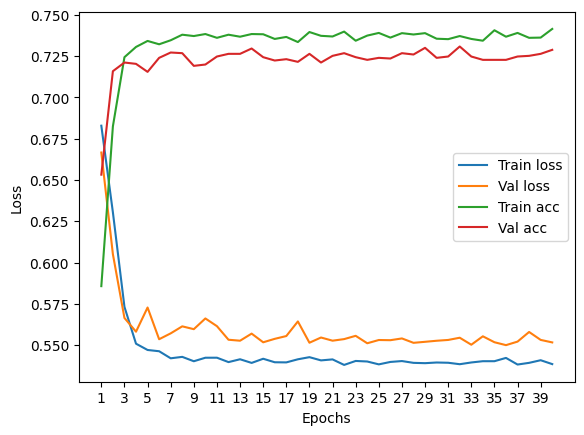

****************************************************************************************************



Particles per jet: 6


118it [00:00, 211.66it/s]


Train Epoch: 0 	Loss: 0.691866, Accuracy: 4146/7500 (55%)
Val Epoch: 0 	Loss: 0.688170, Accuracy: 1451/2500 (58%)



118it [00:00, 209.71it/s]


Train Epoch: 1 	Loss: 0.649150, Accuracy: 4892/7500 (65%)
Val Epoch: 1 	Loss: 0.626770, Accuracy: 1757/2500 (70%)



118it [00:00, 224.76it/s]


Train Epoch: 2 	Loss: 0.592584, Accuracy: 5356/7500 (71%)
Val Epoch: 2 	Loss: 0.571171, Accuracy: 1851/2500 (74%)



118it [00:01, 115.59it/s]


Train Epoch: 3 	Loss: 0.561936, Accuracy: 5445/7500 (73%)
Val Epoch: 3 	Loss: 0.557936, Accuracy: 1860/2500 (74%)



118it [00:01, 92.34it/s] 


Train Epoch: 4 	Loss: 0.550719, Accuracy: 5523/7500 (74%)
Val Epoch: 4 	Loss: 0.554178, Accuracy: 1856/2500 (74%)



118it [00:00, 164.29it/s]


Train Epoch: 5 	Loss: 0.546076, Accuracy: 5529/7500 (74%)
Val Epoch: 5 	Loss: 0.556913, Accuracy: 1857/2500 (74%)



118it [00:00, 151.78it/s]


Train Epoch: 6 	Loss: 0.544081, Accuracy: 5556/7500 (74%)
Val Epoch: 6 	Loss: 0.549092, Accuracy: 1835/2500 (73%)



118it [00:00, 164.10it/s]


Train Epoch: 7 	Loss: 0.543346, Accuracy: 5589/7500 (75%)
Val Epoch: 7 	Loss: 0.545601, Accuracy: 1858/2500 (74%)



118it [00:00, 207.91it/s]


Train Epoch: 8 	Loss: 0.541319, Accuracy: 5583/7500 (74%)
Val Epoch: 8 	Loss: 0.551723, Accuracy: 1830/2500 (73%)



118it [00:00, 213.62it/s]


Train Epoch: 9 	Loss: 0.544875, Accuracy: 5527/7500 (74%)
Val Epoch: 9 	Loss: 0.540821, Accuracy: 1858/2500 (74%)



118it [00:00, 207.79it/s]


Train Epoch: 10 	Loss: 0.542175, Accuracy: 5566/7500 (74%)
Val Epoch: 10 	Loss: 0.547539, Accuracy: 1863/2500 (75%)



118it [00:00, 153.33it/s]


Train Epoch: 11 	Loss: 0.545060, Accuracy: 5554/7500 (74%)
Val Epoch: 11 	Loss: 0.541190, Accuracy: 1862/2500 (74%)



118it [00:00, 181.23it/s]


Train Epoch: 12 	Loss: 0.543446, Accuracy: 5572/7500 (74%)
Val Epoch: 12 	Loss: 0.549541, Accuracy: 1863/2500 (75%)



118it [00:00, 154.42it/s]


Train Epoch: 13 	Loss: 0.541818, Accuracy: 5550/7500 (74%)
Val Epoch: 13 	Loss: 0.546032, Accuracy: 1858/2500 (74%)



118it [00:00, 168.07it/s]


Train Epoch: 14 	Loss: 0.542787, Accuracy: 5561/7500 (74%)
Val Epoch: 14 	Loss: 0.590732, Accuracy: 1853/2500 (74%)



118it [00:00, 210.39it/s]


Train Epoch: 15 	Loss: 0.542274, Accuracy: 5578/7500 (74%)
Val Epoch: 15 	Loss: 0.545980, Accuracy: 1856/2500 (74%)



118it [00:00, 209.19it/s]


Train Epoch: 16 	Loss: 0.544408, Accuracy: 5541/7500 (74%)
Val Epoch: 16 	Loss: 0.539531, Accuracy: 1859/2500 (74%)



118it [00:00, 219.30it/s]


Train Epoch: 17 	Loss: 0.542229, Accuracy: 5575/7500 (74%)
Val Epoch: 17 	Loss: 0.549648, Accuracy: 1851/2500 (74%)



118it [00:00, 210.36it/s]


Train Epoch: 18 	Loss: 0.543037, Accuracy: 5563/7500 (74%)
Val Epoch: 18 	Loss: 0.547044, Accuracy: 1863/2500 (75%)



118it [00:00, 217.97it/s]


Train Epoch: 19 	Loss: 0.541688, Accuracy: 5556/7500 (74%)
Val Epoch: 19 	Loss: 0.552330, Accuracy: 1847/2500 (74%)



118it [00:00, 211.66it/s]


Train Epoch: 20 	Loss: 0.541187, Accuracy: 5561/7500 (74%)
Val Epoch: 20 	Loss: 0.558916, Accuracy: 1849/2500 (74%)



118it [00:00, 217.40it/s]


Train Epoch: 21 	Loss: 0.541524, Accuracy: 5544/7500 (74%)
Val Epoch: 21 	Loss: 0.545981, Accuracy: 1858/2500 (74%)



118it [00:00, 220.39it/s]


Train Epoch: 22 	Loss: 0.542970, Accuracy: 5546/7500 (74%)
Val Epoch: 22 	Loss: 0.540855, Accuracy: 1863/2500 (75%)



118it [00:00, 219.25it/s]


Train Epoch: 23 	Loss: 0.541607, Accuracy: 5564/7500 (74%)
Val Epoch: 23 	Loss: 0.540274, Accuracy: 1855/2500 (74%)



118it [00:00, 219.00it/s]


Train Epoch: 24 	Loss: 0.540952, Accuracy: 5549/7500 (74%)
Val Epoch: 24 	Loss: 0.560324, Accuracy: 1849/2500 (74%)



118it [00:00, 211.95it/s]


Train Epoch: 25 	Loss: 0.538913, Accuracy: 5586/7500 (74%)
Val Epoch: 25 	Loss: 0.548746, Accuracy: 1875/2500 (75%)



118it [00:00, 179.37it/s]


Train Epoch: 26 	Loss: 0.542088, Accuracy: 5570/7500 (74%)
Val Epoch: 26 	Loss: 0.550679, Accuracy: 1849/2500 (74%)



118it [00:00, 183.16it/s]


Train Epoch: 27 	Loss: 0.542693, Accuracy: 5557/7500 (74%)
Val Epoch: 27 	Loss: 0.563940, Accuracy: 1861/2500 (74%)



118it [00:00, 213.38it/s]


Train Epoch: 28 	Loss: 0.539725, Accuracy: 5571/7500 (74%)
Val Epoch: 28 	Loss: 0.551291, Accuracy: 1847/2500 (74%)



118it [00:00, 224.44it/s]


Train Epoch: 29 	Loss: 0.539652, Accuracy: 5587/7500 (74%)
Val Epoch: 29 	Loss: 0.546783, Accuracy: 1860/2500 (74%)



118it [00:00, 213.80it/s]


Train Epoch: 30 	Loss: 0.540681, Accuracy: 5566/7500 (74%)
Val Epoch: 30 	Loss: 0.547463, Accuracy: 1862/2500 (74%)



118it [00:00, 211.43it/s]


Train Epoch: 31 	Loss: 0.542524, Accuracy: 5553/7500 (74%)
Val Epoch: 31 	Loss: 0.551609, Accuracy: 1863/2500 (75%)



118it [00:00, 152.83it/s]


Train Epoch: 32 	Loss: 0.543990, Accuracy: 5543/7500 (74%)
Val Epoch: 32 	Loss: 0.552165, Accuracy: 1844/2500 (74%)



118it [00:00, 193.13it/s]


Train Epoch: 33 	Loss: 0.541340, Accuracy: 5575/7500 (74%)
Val Epoch: 33 	Loss: 0.557867, Accuracy: 1855/2500 (74%)



118it [00:00, 174.48it/s]


Train Epoch: 34 	Loss: 0.539043, Accuracy: 5564/7500 (74%)
Val Epoch: 34 	Loss: 0.549048, Accuracy: 1865/2500 (75%)



118it [00:00, 211.01it/s]


Train Epoch: 35 	Loss: 0.541448, Accuracy: 5563/7500 (74%)
Val Epoch: 35 	Loss: 0.547517, Accuracy: 1869/2500 (75%)



118it [00:00, 222.83it/s]


Train Epoch: 36 	Loss: 0.542841, Accuracy: 5543/7500 (74%)
Val Epoch: 36 	Loss: 0.543871, Accuracy: 1858/2500 (74%)



118it [00:00, 218.03it/s]


Train Epoch: 37 	Loss: 0.541877, Accuracy: 5580/7500 (74%)
Val Epoch: 37 	Loss: 0.543995, Accuracy: 1868/2500 (75%)



118it [00:00, 211.71it/s]


Train Epoch: 38 	Loss: 0.541212, Accuracy: 5571/7500 (74%)
Val Epoch: 38 	Loss: 0.559870, Accuracy: 1838/2500 (74%)



118it [00:00, 215.29it/s]


Train Epoch: 39 	Loss: 0.542267, Accuracy: 5567/7500 (74%)
Val Epoch: 39 	Loss: 0.547323, Accuracy: 1861/2500 (74%)

Test accuracy:  74.36


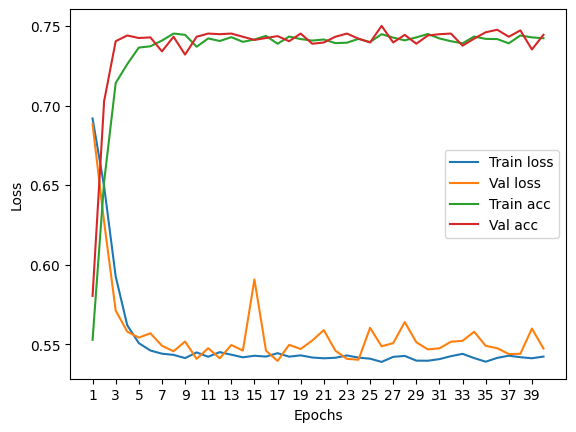

****************************************************************************************************



118it [00:00, 212.21it/s]


Train Epoch: 0 	Loss: 0.690769, Accuracy: 4157/7500 (55%)
Val Epoch: 0 	Loss: 0.686696, Accuracy: 1579/2500 (63%)



118it [00:00, 213.26it/s]


Train Epoch: 1 	Loss: 0.654219, Accuracy: 4877/7500 (65%)
Val Epoch: 1 	Loss: 0.633578, Accuracy: 1774/2500 (71%)



118it [00:00, 222.13it/s]


Train Epoch: 2 	Loss: 0.605107, Accuracy: 5302/7500 (71%)
Val Epoch: 2 	Loss: 0.586302, Accuracy: 1812/2500 (72%)



118it [00:00, 222.87it/s]


Train Epoch: 3 	Loss: 0.575441, Accuracy: 5409/7500 (72%)
Val Epoch: 3 	Loss: 0.580534, Accuracy: 1812/2500 (72%)



118it [00:00, 209.62it/s]


Train Epoch: 4 	Loss: 0.558427, Accuracy: 5462/7500 (73%)
Val Epoch: 4 	Loss: 0.564396, Accuracy: 1829/2500 (73%)



118it [00:00, 220.12it/s]


Train Epoch: 5 	Loss: 0.560816, Accuracy: 5420/7500 (72%)
Val Epoch: 5 	Loss: 0.557055, Accuracy: 1855/2500 (74%)



118it [00:00, 225.57it/s]


Train Epoch: 6 	Loss: 0.555792, Accuracy: 5485/7500 (73%)
Val Epoch: 6 	Loss: 0.551852, Accuracy: 1834/2500 (73%)



118it [00:00, 214.81it/s]


Train Epoch: 7 	Loss: 0.555254, Accuracy: 5469/7500 (73%)
Val Epoch: 7 	Loss: 0.570418, Accuracy: 1817/2500 (73%)



118it [00:00, 209.34it/s]


Train Epoch: 8 	Loss: 0.553149, Accuracy: 5461/7500 (73%)
Val Epoch: 8 	Loss: 0.550541, Accuracy: 1834/2500 (73%)



118it [00:00, 220.57it/s]


Train Epoch: 9 	Loss: 0.553250, Accuracy: 5497/7500 (73%)
Val Epoch: 9 	Loss: 0.566729, Accuracy: 1843/2500 (74%)



118it [00:00, 192.94it/s]


Train Epoch: 10 	Loss: 0.550022, Accuracy: 5495/7500 (73%)
Val Epoch: 10 	Loss: 0.547140, Accuracy: 1857/2500 (74%)



118it [00:00, 204.76it/s]


Train Epoch: 11 	Loss: 0.550447, Accuracy: 5486/7500 (73%)
Val Epoch: 11 	Loss: 0.565748, Accuracy: 1854/2500 (74%)



118it [00:00, 222.75it/s]


Train Epoch: 12 	Loss: 0.548935, Accuracy: 5499/7500 (73%)
Val Epoch: 12 	Loss: 0.549788, Accuracy: 1857/2500 (74%)



118it [00:00, 213.27it/s]


Train Epoch: 13 	Loss: 0.550998, Accuracy: 5479/7500 (73%)
Val Epoch: 13 	Loss: 0.545260, Accuracy: 1854/2500 (74%)



118it [00:00, 213.91it/s]


Train Epoch: 14 	Loss: 0.550833, Accuracy: 5494/7500 (73%)
Val Epoch: 14 	Loss: 0.546424, Accuracy: 1845/2500 (74%)



118it [00:00, 222.56it/s]


Train Epoch: 15 	Loss: 0.552216, Accuracy: 5478/7500 (73%)
Val Epoch: 15 	Loss: 0.557459, Accuracy: 1811/2500 (72%)



118it [00:00, 197.58it/s]


Train Epoch: 16 	Loss: 0.552356, Accuracy: 5504/7500 (73%)
Val Epoch: 16 	Loss: 0.543085, Accuracy: 1866/2500 (75%)



118it [00:00, 154.57it/s]


Train Epoch: 17 	Loss: 0.550510, Accuracy: 5485/7500 (73%)
Val Epoch: 17 	Loss: 0.553860, Accuracy: 1842/2500 (74%)



118it [00:00, 176.40it/s]


Train Epoch: 18 	Loss: 0.551240, Accuracy: 5497/7500 (73%)
Val Epoch: 18 	Loss: 0.571500, Accuracy: 1850/2500 (74%)



118it [00:00, 190.61it/s]


Train Epoch: 19 	Loss: 0.550255, Accuracy: 5501/7500 (73%)
Val Epoch: 19 	Loss: 0.557351, Accuracy: 1808/2500 (72%)



118it [00:00, 218.00it/s]


Train Epoch: 20 	Loss: 0.551156, Accuracy: 5499/7500 (73%)
Val Epoch: 20 	Loss: 0.550594, Accuracy: 1858/2500 (74%)



118it [00:00, 214.05it/s]


Train Epoch: 21 	Loss: 0.551471, Accuracy: 5487/7500 (73%)
Val Epoch: 21 	Loss: 0.556813, Accuracy: 1854/2500 (74%)



118it [00:00, 222.49it/s]


Train Epoch: 22 	Loss: 0.550328, Accuracy: 5532/7500 (74%)
Val Epoch: 22 	Loss: 0.551414, Accuracy: 1850/2500 (74%)



118it [00:00, 217.47it/s]


Train Epoch: 23 	Loss: 0.551161, Accuracy: 5504/7500 (73%)
Val Epoch: 23 	Loss: 0.553523, Accuracy: 1852/2500 (74%)



118it [00:00, 217.83it/s]


Train Epoch: 24 	Loss: 0.549984, Accuracy: 5514/7500 (74%)
Val Epoch: 24 	Loss: 0.547119, Accuracy: 1849/2500 (74%)



118it [00:00, 169.81it/s]


Train Epoch: 25 	Loss: 0.547908, Accuracy: 5527/7500 (74%)
Val Epoch: 25 	Loss: 0.547838, Accuracy: 1862/2500 (74%)



118it [00:00, 208.63it/s]


Train Epoch: 26 	Loss: 0.551472, Accuracy: 5506/7500 (73%)
Val Epoch: 26 	Loss: 0.553500, Accuracy: 1862/2500 (74%)



118it [00:00, 219.44it/s]


Train Epoch: 27 	Loss: 0.549399, Accuracy: 5497/7500 (73%)
Val Epoch: 27 	Loss: 0.546036, Accuracy: 1852/2500 (74%)



118it [00:00, 223.73it/s]


Train Epoch: 28 	Loss: 0.548597, Accuracy: 5529/7500 (74%)
Val Epoch: 28 	Loss: 0.560735, Accuracy: 1853/2500 (74%)



118it [00:00, 219.73it/s]


Train Epoch: 29 	Loss: 0.549776, Accuracy: 5475/7500 (73%)
Val Epoch: 29 	Loss: 0.560928, Accuracy: 1845/2500 (74%)



118it [00:00, 224.47it/s]


Train Epoch: 30 	Loss: 0.549255, Accuracy: 5491/7500 (73%)
Val Epoch: 30 	Loss: 0.553689, Accuracy: 1854/2500 (74%)



118it [00:00, 218.84it/s]


Train Epoch: 31 	Loss: 0.547387, Accuracy: 5502/7500 (73%)
Val Epoch: 31 	Loss: 0.548038, Accuracy: 1862/2500 (74%)



118it [00:00, 217.86it/s]


Train Epoch: 32 	Loss: 0.549125, Accuracy: 5506/7500 (73%)
Val Epoch: 32 	Loss: 0.541957, Accuracy: 1860/2500 (74%)



118it [00:00, 226.40it/s]


Train Epoch: 33 	Loss: 0.552181, Accuracy: 5484/7500 (73%)
Val Epoch: 33 	Loss: 0.538830, Accuracy: 1860/2500 (74%)



118it [00:00, 216.42it/s]


Train Epoch: 34 	Loss: 0.550526, Accuracy: 5494/7500 (73%)
Val Epoch: 34 	Loss: 0.551169, Accuracy: 1849/2500 (74%)



118it [00:00, 214.69it/s]


Train Epoch: 35 	Loss: 0.549141, Accuracy: 5507/7500 (73%)
Val Epoch: 35 	Loss: 0.549098, Accuracy: 1849/2500 (74%)



118it [00:00, 220.20it/s]


Train Epoch: 36 	Loss: 0.550738, Accuracy: 5509/7500 (73%)
Val Epoch: 36 	Loss: 0.540426, Accuracy: 1862/2500 (74%)



118it [00:00, 217.08it/s]


Train Epoch: 37 	Loss: 0.550571, Accuracy: 5497/7500 (73%)
Val Epoch: 37 	Loss: 0.545187, Accuracy: 1854/2500 (74%)



118it [00:00, 159.06it/s]


Train Epoch: 38 	Loss: 0.549659, Accuracy: 5529/7500 (74%)
Val Epoch: 38 	Loss: 0.550993, Accuracy: 1854/2500 (74%)



118it [00:00, 164.73it/s]


Train Epoch: 39 	Loss: 0.551392, Accuracy: 5482/7500 (73%)
Val Epoch: 39 	Loss: 0.543894, Accuracy: 1859/2500 (74%)

Test accuracy:  73.83999999999999


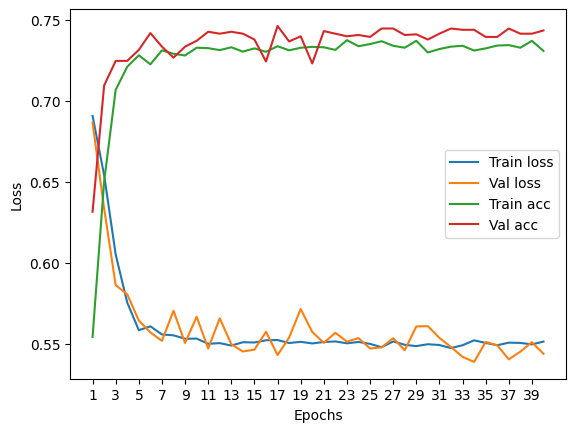

****************************************************************************************************



118it [00:00, 222.86it/s]


Train Epoch: 0 	Loss: 0.691006, Accuracy: 4149/7500 (55%)
Val Epoch: 0 	Loss: 0.686140, Accuracy: 1536/2500 (61%)



118it [00:00, 154.91it/s]


Train Epoch: 1 	Loss: 0.653709, Accuracy: 4850/7500 (65%)
Val Epoch: 1 	Loss: 0.643311, Accuracy: 1700/2500 (68%)



118it [00:00, 188.08it/s]


Train Epoch: 2 	Loss: 0.608343, Accuracy: 5272/7500 (70%)
Val Epoch: 2 	Loss: 0.601183, Accuracy: 1765/2500 (71%)



118it [00:00, 175.54it/s]


Train Epoch: 3 	Loss: 0.576828, Accuracy: 5447/7500 (73%)
Val Epoch: 3 	Loss: 0.578956, Accuracy: 1865/2500 (75%)



118it [00:00, 207.01it/s]


Train Epoch: 4 	Loss: 0.559334, Accuracy: 5480/7500 (73%)
Val Epoch: 4 	Loss: 0.565637, Accuracy: 1849/2500 (74%)



118it [00:00, 220.35it/s]


Train Epoch: 5 	Loss: 0.552137, Accuracy: 5515/7500 (74%)
Val Epoch: 5 	Loss: 0.556135, Accuracy: 1847/2500 (74%)



118it [00:00, 218.99it/s]


Train Epoch: 6 	Loss: 0.550965, Accuracy: 5482/7500 (73%)
Val Epoch: 6 	Loss: 0.563737, Accuracy: 1830/2500 (73%)



118it [00:00, 217.09it/s]


Train Epoch: 7 	Loss: 0.546261, Accuracy: 5521/7500 (74%)
Val Epoch: 7 	Loss: 0.552545, Accuracy: 1876/2500 (75%)



118it [00:00, 215.76it/s]


Train Epoch: 8 	Loss: 0.547307, Accuracy: 5501/7500 (73%)
Val Epoch: 8 	Loss: 0.557559, Accuracy: 1858/2500 (74%)



118it [00:00, 221.49it/s]


Train Epoch: 9 	Loss: 0.549921, Accuracy: 5493/7500 (73%)
Val Epoch: 9 	Loss: 0.541736, Accuracy: 1873/2500 (75%)



118it [00:00, 224.12it/s]


Train Epoch: 10 	Loss: 0.546112, Accuracy: 5528/7500 (74%)
Val Epoch: 10 	Loss: 0.553173, Accuracy: 1856/2500 (74%)



118it [00:00, 223.20it/s]


Train Epoch: 11 	Loss: 0.548700, Accuracy: 5521/7500 (74%)
Val Epoch: 11 	Loss: 0.576858, Accuracy: 1788/2500 (72%)



118it [00:00, 215.41it/s]


Train Epoch: 12 	Loss: 0.548711, Accuracy: 5501/7500 (73%)
Val Epoch: 12 	Loss: 0.541639, Accuracy: 1867/2500 (75%)



118it [00:00, 221.22it/s]


Train Epoch: 13 	Loss: 0.543205, Accuracy: 5549/7500 (74%)
Val Epoch: 13 	Loss: 0.549465, Accuracy: 1865/2500 (75%)



118it [00:00, 216.87it/s]


Train Epoch: 14 	Loss: 0.546896, Accuracy: 5530/7500 (74%)
Val Epoch: 14 	Loss: 0.541220, Accuracy: 1852/2500 (74%)



118it [00:00, 225.25it/s]


Train Epoch: 15 	Loss: 0.545115, Accuracy: 5552/7500 (74%)
Val Epoch: 15 	Loss: 0.546073, Accuracy: 1867/2500 (75%)



118it [00:00, 226.08it/s]


Train Epoch: 16 	Loss: 0.546156, Accuracy: 5545/7500 (74%)
Val Epoch: 16 	Loss: 0.540830, Accuracy: 1844/2500 (74%)



118it [00:00, 220.68it/s]


Train Epoch: 17 	Loss: 0.544879, Accuracy: 5511/7500 (73%)
Val Epoch: 17 	Loss: 0.549226, Accuracy: 1834/2500 (73%)



118it [00:00, 225.27it/s]


Train Epoch: 18 	Loss: 0.545895, Accuracy: 5546/7500 (74%)
Val Epoch: 18 	Loss: 0.539032, Accuracy: 1858/2500 (74%)



118it [00:00, 219.93it/s]


Train Epoch: 19 	Loss: 0.543118, Accuracy: 5544/7500 (74%)
Val Epoch: 19 	Loss: 0.544743, Accuracy: 1865/2500 (75%)



118it [00:00, 222.64it/s]


Train Epoch: 20 	Loss: 0.543633, Accuracy: 5547/7500 (74%)
Val Epoch: 20 	Loss: 0.542057, Accuracy: 1870/2500 (75%)



118it [00:00, 218.02it/s]


Train Epoch: 21 	Loss: 0.543468, Accuracy: 5551/7500 (74%)
Val Epoch: 21 	Loss: 0.550426, Accuracy: 1870/2500 (75%)



118it [00:00, 198.46it/s]


Train Epoch: 22 	Loss: 0.543304, Accuracy: 5546/7500 (74%)
Val Epoch: 22 	Loss: 0.557765, Accuracy: 1860/2500 (74%)



118it [00:00, 158.66it/s]


Train Epoch: 23 	Loss: 0.542228, Accuracy: 5546/7500 (74%)
Val Epoch: 23 	Loss: 0.545375, Accuracy: 1855/2500 (74%)



118it [00:00, 183.41it/s]


Train Epoch: 24 	Loss: 0.540668, Accuracy: 5539/7500 (74%)
Val Epoch: 24 	Loss: 0.544891, Accuracy: 1852/2500 (74%)



118it [00:00, 168.46it/s]


Train Epoch: 25 	Loss: 0.544115, Accuracy: 5544/7500 (74%)
Val Epoch: 25 	Loss: 0.539196, Accuracy: 1860/2500 (74%)



118it [00:00, 208.39it/s]


Train Epoch: 26 	Loss: 0.544140, Accuracy: 5554/7500 (74%)
Val Epoch: 26 	Loss: 0.537747, Accuracy: 1888/2500 (76%)



118it [00:00, 229.07it/s]


Train Epoch: 27 	Loss: 0.540601, Accuracy: 5545/7500 (74%)
Val Epoch: 27 	Loss: 0.540177, Accuracy: 1876/2500 (75%)



118it [00:00, 215.95it/s]


Train Epoch: 28 	Loss: 0.541913, Accuracy: 5565/7500 (74%)
Val Epoch: 28 	Loss: 0.544040, Accuracy: 1857/2500 (74%)



118it [00:00, 214.38it/s]


Train Epoch: 29 	Loss: 0.539646, Accuracy: 5563/7500 (74%)
Val Epoch: 29 	Loss: 0.540765, Accuracy: 1855/2500 (74%)



118it [00:00, 221.52it/s]


Train Epoch: 30 	Loss: 0.542225, Accuracy: 5557/7500 (74%)
Val Epoch: 30 	Loss: 0.562230, Accuracy: 1841/2500 (74%)



118it [00:00, 210.29it/s]


Train Epoch: 31 	Loss: 0.540429, Accuracy: 5569/7500 (74%)
Val Epoch: 31 	Loss: 0.541542, Accuracy: 1861/2500 (74%)



118it [00:00, 193.87it/s]


Train Epoch: 32 	Loss: 0.543225, Accuracy: 5542/7500 (74%)
Val Epoch: 32 	Loss: 0.553405, Accuracy: 1855/2500 (74%)



118it [00:00, 217.53it/s]


Train Epoch: 33 	Loss: 0.538126, Accuracy: 5551/7500 (74%)
Val Epoch: 33 	Loss: 0.532095, Accuracy: 1883/2500 (75%)



118it [00:00, 226.52it/s]


Train Epoch: 34 	Loss: 0.539462, Accuracy: 5570/7500 (74%)
Val Epoch: 34 	Loss: 0.546119, Accuracy: 1896/2500 (76%)



118it [00:00, 214.88it/s]


Train Epoch: 35 	Loss: 0.539898, Accuracy: 5542/7500 (74%)
Val Epoch: 35 	Loss: 0.532979, Accuracy: 1883/2500 (75%)



118it [00:00, 220.40it/s]


Train Epoch: 36 	Loss: 0.537725, Accuracy: 5561/7500 (74%)
Val Epoch: 36 	Loss: 0.541132, Accuracy: 1869/2500 (75%)



118it [00:00, 215.14it/s]


Train Epoch: 37 	Loss: 0.537624, Accuracy: 5571/7500 (74%)
Val Epoch: 37 	Loss: 0.539157, Accuracy: 1868/2500 (75%)



118it [00:00, 218.95it/s]


Train Epoch: 38 	Loss: 0.539466, Accuracy: 5580/7500 (74%)
Val Epoch: 38 	Loss: 0.543429, Accuracy: 1880/2500 (75%)



118it [00:00, 207.22it/s]


Train Epoch: 39 	Loss: 0.538416, Accuracy: 5582/7500 (74%)
Val Epoch: 39 	Loss: 0.538298, Accuracy: 1857/2500 (74%)

Test accuracy:  74.44


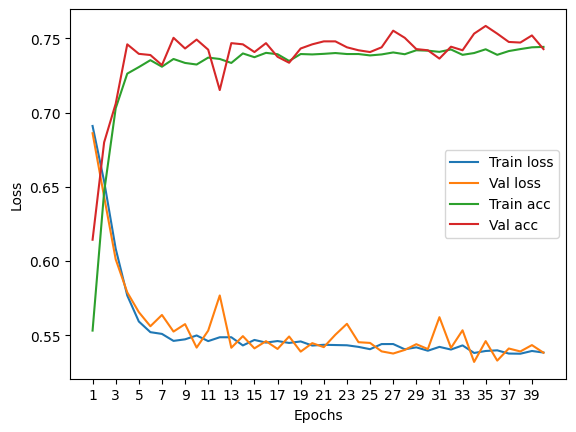

****************************************************************************************************



118it [00:00, 210.62it/s]


Train Epoch: 0 	Loss: 0.694220, Accuracy: 3992/7500 (53%)
Val Epoch: 0 	Loss: 0.697343, Accuracy: 1458/2500 (58%)



118it [00:00, 206.56it/s]


Train Epoch: 1 	Loss: 0.665294, Accuracy: 4670/7500 (62%)
Val Epoch: 1 	Loss: 0.655768, Accuracy: 1614/2500 (65%)



118it [00:00, 208.55it/s]


Train Epoch: 2 	Loss: 0.615290, Accuracy: 5163/7500 (69%)
Val Epoch: 2 	Loss: 0.610624, Accuracy: 1723/2500 (69%)



118it [00:00, 215.05it/s]


Train Epoch: 3 	Loss: 0.577611, Accuracy: 5401/7500 (72%)
Val Epoch: 3 	Loss: 0.574185, Accuracy: 1789/2500 (72%)



118it [00:00, 214.07it/s]


Train Epoch: 4 	Loss: 0.556203, Accuracy: 5496/7500 (73%)
Val Epoch: 4 	Loss: 0.576664, Accuracy: 1768/2500 (71%)



118it [00:00, 189.64it/s]


Train Epoch: 5 	Loss: 0.548518, Accuracy: 5526/7500 (74%)
Val Epoch: 5 	Loss: 0.584078, Accuracy: 1731/2500 (69%)



118it [00:00, 166.47it/s]


Train Epoch: 6 	Loss: 0.546574, Accuracy: 5525/7500 (74%)
Val Epoch: 6 	Loss: 0.558799, Accuracy: 1808/2500 (72%)



118it [00:00, 155.50it/s]


Train Epoch: 7 	Loss: 0.549233, Accuracy: 5510/7500 (73%)
Val Epoch: 7 	Loss: 0.600420, Accuracy: 1807/2500 (72%)



118it [00:00, 172.45it/s]


Train Epoch: 8 	Loss: 0.544689, Accuracy: 5555/7500 (74%)
Val Epoch: 8 	Loss: 0.576789, Accuracy: 1827/2500 (73%)



118it [00:00, 196.09it/s]


Train Epoch: 9 	Loss: 0.543660, Accuracy: 5572/7500 (74%)
Val Epoch: 9 	Loss: 0.577613, Accuracy: 1778/2500 (71%)



118it [00:00, 206.76it/s]


Train Epoch: 10 	Loss: 0.540670, Accuracy: 5564/7500 (74%)
Val Epoch: 10 	Loss: 0.573776, Accuracy: 1767/2500 (71%)



118it [00:00, 175.35it/s]


Train Epoch: 11 	Loss: 0.544278, Accuracy: 5545/7500 (74%)
Val Epoch: 11 	Loss: 0.568409, Accuracy: 1822/2500 (73%)



118it [00:00, 163.38it/s]


Train Epoch: 12 	Loss: 0.541877, Accuracy: 5559/7500 (74%)
Val Epoch: 12 	Loss: 0.555779, Accuracy: 1803/2500 (72%)



118it [00:00, 188.88it/s]


Train Epoch: 13 	Loss: 0.542130, Accuracy: 5547/7500 (74%)
Val Epoch: 13 	Loss: 0.563015, Accuracy: 1815/2500 (73%)



118it [00:00, 212.93it/s]


Train Epoch: 14 	Loss: 0.541130, Accuracy: 5573/7500 (74%)
Val Epoch: 14 	Loss: 0.566400, Accuracy: 1827/2500 (73%)



118it [00:00, 210.59it/s]


Train Epoch: 15 	Loss: 0.542593, Accuracy: 5549/7500 (74%)
Val Epoch: 15 	Loss: 0.568751, Accuracy: 1830/2500 (73%)



118it [00:00, 208.33it/s]


Train Epoch: 16 	Loss: 0.540782, Accuracy: 5568/7500 (74%)
Val Epoch: 16 	Loss: 0.569997, Accuracy: 1830/2500 (73%)



118it [00:00, 212.36it/s]


Train Epoch: 17 	Loss: 0.541765, Accuracy: 5569/7500 (74%)
Val Epoch: 17 	Loss: 0.571767, Accuracy: 1796/2500 (72%)



118it [00:00, 223.00it/s]


Train Epoch: 18 	Loss: 0.541310, Accuracy: 5564/7500 (74%)
Val Epoch: 18 	Loss: 0.572529, Accuracy: 1790/2500 (72%)



118it [00:00, 215.93it/s]


Train Epoch: 19 	Loss: 0.541242, Accuracy: 5557/7500 (74%)
Val Epoch: 19 	Loss: 0.561054, Accuracy: 1836/2500 (73%)



118it [00:00, 204.97it/s]


Train Epoch: 20 	Loss: 0.543789, Accuracy: 5523/7500 (74%)
Val Epoch: 20 	Loss: 0.561731, Accuracy: 1846/2500 (74%)



118it [00:00, 208.65it/s]


Train Epoch: 21 	Loss: 0.540696, Accuracy: 5556/7500 (74%)
Val Epoch: 21 	Loss: 0.565522, Accuracy: 1850/2500 (74%)



118it [00:00, 137.10it/s]


Train Epoch: 22 	Loss: 0.541454, Accuracy: 5549/7500 (74%)
Val Epoch: 22 	Loss: 0.576575, Accuracy: 1814/2500 (73%)



118it [00:00, 186.51it/s]


Train Epoch: 23 	Loss: 0.543134, Accuracy: 5555/7500 (74%)
Val Epoch: 23 	Loss: 0.561969, Accuracy: 1827/2500 (73%)



118it [00:00, 189.24it/s]


Train Epoch: 24 	Loss: 0.540790, Accuracy: 5565/7500 (74%)
Val Epoch: 24 	Loss: 0.558810, Accuracy: 1828/2500 (73%)



118it [00:00, 160.63it/s]


Train Epoch: 25 	Loss: 0.541609, Accuracy: 5582/7500 (74%)
Val Epoch: 25 	Loss: 0.563060, Accuracy: 1796/2500 (72%)



118it [00:02, 44.50it/s]


Train Epoch: 26 	Loss: 0.541759, Accuracy: 5538/7500 (74%)
Val Epoch: 26 	Loss: 0.558714, Accuracy: 1829/2500 (73%)



118it [00:01, 103.89it/s]


Train Epoch: 27 	Loss: 0.540088, Accuracy: 5595/7500 (75%)
Val Epoch: 27 	Loss: 0.568569, Accuracy: 1835/2500 (73%)



118it [00:01, 113.98it/s]


Train Epoch: 28 	Loss: 0.542176, Accuracy: 5550/7500 (74%)
Val Epoch: 28 	Loss: 0.562672, Accuracy: 1839/2500 (74%)



118it [00:00, 126.35it/s]


Train Epoch: 29 	Loss: 0.541392, Accuracy: 5560/7500 (74%)
Val Epoch: 29 	Loss: 0.555560, Accuracy: 1831/2500 (73%)



118it [00:00, 165.34it/s]


Train Epoch: 30 	Loss: 0.542216, Accuracy: 5536/7500 (74%)
Val Epoch: 30 	Loss: 0.562280, Accuracy: 1802/2500 (72%)



118it [00:00, 169.26it/s]


Train Epoch: 31 	Loss: 0.541515, Accuracy: 5551/7500 (74%)
Val Epoch: 31 	Loss: 0.563009, Accuracy: 1838/2500 (74%)



118it [00:00, 171.76it/s]


Train Epoch: 32 	Loss: 0.539607, Accuracy: 5551/7500 (74%)
Val Epoch: 32 	Loss: 0.560075, Accuracy: 1826/2500 (73%)



118it [00:00, 164.53it/s]


Train Epoch: 33 	Loss: 0.538660, Accuracy: 5579/7500 (74%)
Val Epoch: 33 	Loss: 0.569027, Accuracy: 1819/2500 (73%)



118it [00:00, 167.26it/s]


Train Epoch: 34 	Loss: 0.541665, Accuracy: 5565/7500 (74%)
Val Epoch: 34 	Loss: 0.565716, Accuracy: 1832/2500 (73%)



118it [00:00, 167.40it/s]


Train Epoch: 35 	Loss: 0.540502, Accuracy: 5573/7500 (74%)
Val Epoch: 35 	Loss: 0.568102, Accuracy: 1833/2500 (73%)



118it [00:00, 133.86it/s]


Train Epoch: 36 	Loss: 0.539996, Accuracy: 5575/7500 (74%)
Val Epoch: 36 	Loss: 0.573711, Accuracy: 1792/2500 (72%)



118it [00:01, 75.49it/s]


Train Epoch: 37 	Loss: 0.541495, Accuracy: 5571/7500 (74%)
Val Epoch: 37 	Loss: 0.559598, Accuracy: 1841/2500 (74%)



118it [00:01, 91.42it/s] 


Train Epoch: 38 	Loss: 0.542892, Accuracy: 5587/7500 (74%)
Val Epoch: 38 	Loss: 0.565370, Accuracy: 1850/2500 (74%)



118it [00:00, 142.06it/s]


Train Epoch: 39 	Loss: 0.541529, Accuracy: 5601/7500 (75%)
Val Epoch: 39 	Loss: 0.556573, Accuracy: 1832/2500 (73%)

Test accuracy:  75.08


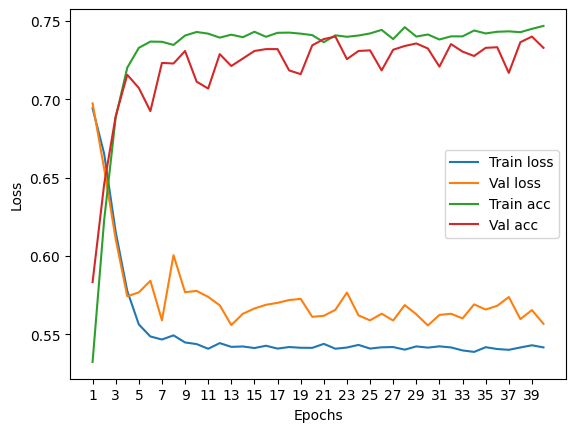

****************************************************************************************************



118it [00:00, 200.61it/s]


Train Epoch: 0 	Loss: 0.692759, Accuracy: 4096/7500 (55%)
Val Epoch: 0 	Loss: 0.699043, Accuracy: 1414/2500 (57%)



118it [00:00, 208.75it/s]


Train Epoch: 1 	Loss: 0.666679, Accuracy: 4622/7500 (62%)
Val Epoch: 1 	Loss: 0.667624, Accuracy: 1503/2500 (60%)



118it [00:00, 196.91it/s]


Train Epoch: 2 	Loss: 0.630086, Accuracy: 5085/7500 (68%)
Val Epoch: 2 	Loss: 0.624688, Accuracy: 1737/2500 (69%)



118it [00:00, 195.81it/s]


Train Epoch: 3 	Loss: 0.604600, Accuracy: 5208/7500 (69%)
Val Epoch: 3 	Loss: 0.604856, Accuracy: 1783/2500 (71%)



118it [00:00, 205.08it/s]


Train Epoch: 4 	Loss: 0.580762, Accuracy: 5376/7500 (72%)
Val Epoch: 4 	Loss: 0.582724, Accuracy: 1808/2500 (72%)



118it [00:00, 190.89it/s]


Train Epoch: 5 	Loss: 0.569483, Accuracy: 5344/7500 (71%)
Val Epoch: 5 	Loss: 0.578337, Accuracy: 1774/2500 (71%)



118it [00:00, 177.18it/s]


Train Epoch: 6 	Loss: 0.566048, Accuracy: 5379/7500 (72%)
Val Epoch: 6 	Loss: 0.576015, Accuracy: 1815/2500 (73%)



118it [00:00, 196.04it/s]


Train Epoch: 7 	Loss: 0.559355, Accuracy: 5419/7500 (72%)
Val Epoch: 7 	Loss: 0.573671, Accuracy: 1785/2500 (71%)



118it [00:00, 172.82it/s]


Train Epoch: 8 	Loss: 0.561315, Accuracy: 5402/7500 (72%)
Val Epoch: 8 	Loss: 0.563992, Accuracy: 1806/2500 (72%)



118it [00:00, 177.59it/s]


Train Epoch: 9 	Loss: 0.559263, Accuracy: 5398/7500 (72%)
Val Epoch: 9 	Loss: 0.563090, Accuracy: 1817/2500 (73%)



118it [00:00, 178.42it/s]


Train Epoch: 10 	Loss: 0.561037, Accuracy: 5399/7500 (72%)
Val Epoch: 10 	Loss: 0.576001, Accuracy: 1797/2500 (72%)



118it [00:00, 195.67it/s]


Train Epoch: 11 	Loss: 0.558020, Accuracy: 5407/7500 (72%)
Val Epoch: 11 	Loss: 0.574305, Accuracy: 1789/2500 (72%)



118it [00:00, 194.37it/s]


Train Epoch: 12 	Loss: 0.557341, Accuracy: 5403/7500 (72%)
Val Epoch: 12 	Loss: 0.560493, Accuracy: 1817/2500 (73%)



118it [00:00, 184.28it/s]


Train Epoch: 13 	Loss: 0.559206, Accuracy: 5421/7500 (72%)
Val Epoch: 13 	Loss: 0.597573, Accuracy: 1728/2500 (69%)



118it [00:00, 211.33it/s]


Train Epoch: 14 	Loss: 0.558715, Accuracy: 5407/7500 (72%)
Val Epoch: 14 	Loss: 0.570372, Accuracy: 1787/2500 (71%)



118it [00:00, 175.60it/s]


Train Epoch: 15 	Loss: 0.559481, Accuracy: 5405/7500 (72%)
Val Epoch: 15 	Loss: 0.569679, Accuracy: 1816/2500 (73%)



118it [00:00, 127.74it/s]


Train Epoch: 16 	Loss: 0.556752, Accuracy: 5413/7500 (72%)
Val Epoch: 16 	Loss: 0.576471, Accuracy: 1778/2500 (71%)



118it [00:00, 172.87it/s]


Train Epoch: 17 	Loss: 0.558500, Accuracy: 5419/7500 (72%)
Val Epoch: 17 	Loss: 0.565847, Accuracy: 1801/2500 (72%)



118it [00:00, 155.42it/s]


Train Epoch: 18 	Loss: 0.557572, Accuracy: 5440/7500 (73%)
Val Epoch: 18 	Loss: 0.570455, Accuracy: 1808/2500 (72%)



118it [00:00, 171.41it/s]


Train Epoch: 19 	Loss: 0.556027, Accuracy: 5435/7500 (72%)
Val Epoch: 19 	Loss: 0.565283, Accuracy: 1812/2500 (72%)



118it [00:00, 201.24it/s]


Train Epoch: 20 	Loss: 0.557434, Accuracy: 5454/7500 (73%)
Val Epoch: 20 	Loss: 0.569954, Accuracy: 1811/2500 (72%)



118it [00:00, 196.24it/s]


Train Epoch: 21 	Loss: 0.558633, Accuracy: 5448/7500 (73%)
Val Epoch: 21 	Loss: 0.579953, Accuracy: 1765/2500 (71%)



118it [00:00, 192.14it/s]


Train Epoch: 22 	Loss: 0.559008, Accuracy: 5432/7500 (72%)
Val Epoch: 22 	Loss: 0.562435, Accuracy: 1814/2500 (73%)



118it [00:00, 176.51it/s]


Train Epoch: 23 	Loss: 0.559810, Accuracy: 5409/7500 (72%)
Val Epoch: 23 	Loss: 0.564186, Accuracy: 1821/2500 (73%)



118it [00:00, 193.95it/s]


Train Epoch: 24 	Loss: 0.554830, Accuracy: 5434/7500 (72%)
Val Epoch: 24 	Loss: 0.565012, Accuracy: 1808/2500 (72%)



118it [00:00, 181.33it/s]


Train Epoch: 25 	Loss: 0.558374, Accuracy: 5423/7500 (72%)
Val Epoch: 25 	Loss: 0.571027, Accuracy: 1809/2500 (72%)



118it [00:00, 194.27it/s]


Train Epoch: 26 	Loss: 0.552958, Accuracy: 5454/7500 (73%)
Val Epoch: 26 	Loss: 0.571743, Accuracy: 1792/2500 (72%)



118it [00:00, 180.68it/s]


Train Epoch: 27 	Loss: 0.555503, Accuracy: 5432/7500 (72%)
Val Epoch: 27 	Loss: 0.573208, Accuracy: 1777/2500 (71%)



118it [00:00, 171.50it/s]


Train Epoch: 28 	Loss: 0.558323, Accuracy: 5446/7500 (73%)
Val Epoch: 28 	Loss: 0.573953, Accuracy: 1811/2500 (72%)



118it [00:00, 175.25it/s]


Train Epoch: 29 	Loss: 0.558350, Accuracy: 5408/7500 (72%)
Val Epoch: 29 	Loss: 0.563222, Accuracy: 1817/2500 (73%)



118it [00:00, 178.60it/s]


Train Epoch: 30 	Loss: 0.557256, Accuracy: 5437/7500 (72%)
Val Epoch: 30 	Loss: 0.571009, Accuracy: 1785/2500 (71%)



118it [00:00, 176.53it/s]


Train Epoch: 31 	Loss: 0.559273, Accuracy: 5402/7500 (72%)
Val Epoch: 31 	Loss: 0.572897, Accuracy: 1810/2500 (72%)



118it [00:00, 163.58it/s]


Train Epoch: 32 	Loss: 0.555713, Accuracy: 5425/7500 (72%)
Val Epoch: 32 	Loss: 0.571724, Accuracy: 1797/2500 (72%)



118it [00:00, 159.95it/s]


Train Epoch: 33 	Loss: 0.556444, Accuracy: 5425/7500 (72%)
Val Epoch: 33 	Loss: 0.565373, Accuracy: 1818/2500 (73%)



118it [00:00, 129.77it/s]


Train Epoch: 34 	Loss: 0.555499, Accuracy: 5446/7500 (73%)
Val Epoch: 34 	Loss: 0.566624, Accuracy: 1815/2500 (73%)



118it [00:00, 146.47it/s]


Train Epoch: 35 	Loss: 0.559037, Accuracy: 5471/7500 (73%)
Val Epoch: 35 	Loss: 0.569079, Accuracy: 1808/2500 (72%)



118it [00:00, 146.73it/s]


Train Epoch: 36 	Loss: 0.554944, Accuracy: 5424/7500 (72%)
Val Epoch: 36 	Loss: 0.565142, Accuracy: 1815/2500 (73%)



118it [00:00, 191.11it/s]


Train Epoch: 37 	Loss: 0.556943, Accuracy: 5413/7500 (72%)
Val Epoch: 37 	Loss: 0.565820, Accuracy: 1806/2500 (72%)



118it [00:00, 195.62it/s]


Train Epoch: 38 	Loss: 0.557075, Accuracy: 5444/7500 (73%)
Val Epoch: 38 	Loss: 0.561284, Accuracy: 1812/2500 (72%)



118it [00:00, 187.80it/s]


Train Epoch: 39 	Loss: 0.556238, Accuracy: 5423/7500 (72%)
Val Epoch: 39 	Loss: 0.561687, Accuracy: 1814/2500 (73%)

Test accuracy:  72.84


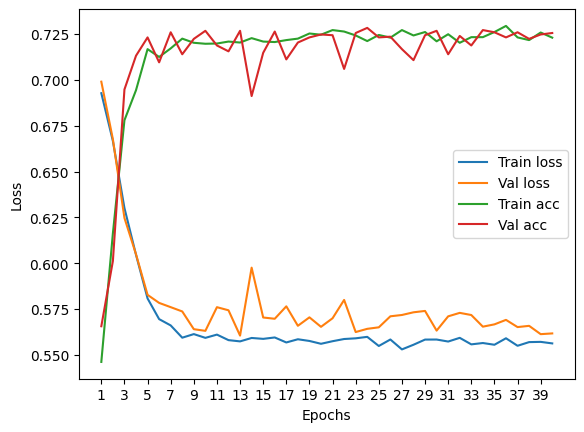

****************************************************************************************************



118it [00:00, 192.38it/s]


Train Epoch: 0 	Loss: 0.696860, Accuracy: 3897/7500 (52%)
Val Epoch: 0 	Loss: 0.701646, Accuracy: 1434/2500 (57%)



118it [00:00, 203.03it/s]


Train Epoch: 1 	Loss: 0.679122, Accuracy: 4461/7500 (59%)
Val Epoch: 1 	Loss: 0.670686, Accuracy: 1659/2500 (66%)



118it [00:01, 99.96it/s] 


Train Epoch: 2 	Loss: 0.640877, Accuracy: 4974/7500 (66%)
Val Epoch: 2 	Loss: 0.619709, Accuracy: 1756/2500 (70%)



118it [00:00, 189.51it/s]


Train Epoch: 3 	Loss: 0.598996, Accuracy: 5301/7500 (71%)
Val Epoch: 3 	Loss: 0.590611, Accuracy: 1796/2500 (72%)



118it [00:00, 132.65it/s]


Train Epoch: 4 	Loss: 0.571629, Accuracy: 5428/7500 (72%)
Val Epoch: 4 	Loss: 0.572902, Accuracy: 1811/2500 (72%)



118it [00:00, 126.20it/s]


Train Epoch: 5 	Loss: 0.559907, Accuracy: 5485/7500 (73%)
Val Epoch: 5 	Loss: 0.577833, Accuracy: 1825/2500 (73%)



118it [00:00, 161.44it/s]


Train Epoch: 6 	Loss: 0.551965, Accuracy: 5543/7500 (74%)
Val Epoch: 6 	Loss: 0.562673, Accuracy: 1820/2500 (73%)



118it [00:00, 175.27it/s]


Train Epoch: 7 	Loss: 0.549799, Accuracy: 5536/7500 (74%)
Val Epoch: 7 	Loss: 0.576884, Accuracy: 1785/2500 (71%)



118it [00:00, 184.71it/s]


Train Epoch: 8 	Loss: 0.549247, Accuracy: 5530/7500 (74%)
Val Epoch: 8 	Loss: 0.569027, Accuracy: 1820/2500 (73%)



118it [00:00, 162.67it/s]


Train Epoch: 9 	Loss: 0.545333, Accuracy: 5550/7500 (74%)
Val Epoch: 9 	Loss: 0.561705, Accuracy: 1824/2500 (73%)



118it [00:00, 178.75it/s]


Train Epoch: 10 	Loss: 0.546377, Accuracy: 5529/7500 (74%)
Val Epoch: 10 	Loss: 0.565403, Accuracy: 1826/2500 (73%)



118it [00:00, 136.37it/s]


Train Epoch: 11 	Loss: 0.549257, Accuracy: 5546/7500 (74%)
Val Epoch: 11 	Loss: 0.568687, Accuracy: 1825/2500 (73%)



118it [00:00, 128.44it/s]


Train Epoch: 12 	Loss: 0.544373, Accuracy: 5548/7500 (74%)
Val Epoch: 12 	Loss: 0.568002, Accuracy: 1802/2500 (72%)



118it [00:00, 190.14it/s]


Train Epoch: 13 	Loss: 0.547317, Accuracy: 5541/7500 (74%)
Val Epoch: 13 	Loss: 0.571491, Accuracy: 1815/2500 (73%)



118it [00:00, 170.47it/s]


Train Epoch: 14 	Loss: 0.544216, Accuracy: 5565/7500 (74%)
Val Epoch: 14 	Loss: 0.566881, Accuracy: 1821/2500 (73%)



118it [00:00, 162.45it/s]


Train Epoch: 15 	Loss: 0.546045, Accuracy: 5555/7500 (74%)
Val Epoch: 15 	Loss: 0.565879, Accuracy: 1828/2500 (73%)



118it [00:00, 182.78it/s]


Train Epoch: 16 	Loss: 0.545228, Accuracy: 5537/7500 (74%)
Val Epoch: 16 	Loss: 0.571195, Accuracy: 1796/2500 (72%)



118it [00:00, 178.61it/s]


Train Epoch: 17 	Loss: 0.545392, Accuracy: 5545/7500 (74%)
Val Epoch: 17 	Loss: 0.564868, Accuracy: 1825/2500 (73%)



118it [00:00, 203.79it/s]


Train Epoch: 18 	Loss: 0.545657, Accuracy: 5535/7500 (74%)
Val Epoch: 18 	Loss: 0.560049, Accuracy: 1828/2500 (73%)



118it [00:00, 213.80it/s]


Train Epoch: 19 	Loss: 0.542711, Accuracy: 5530/7500 (74%)
Val Epoch: 19 	Loss: 0.565002, Accuracy: 1819/2500 (73%)



118it [00:00, 222.24it/s]


Train Epoch: 20 	Loss: 0.544144, Accuracy: 5557/7500 (74%)
Val Epoch: 20 	Loss: 0.556723, Accuracy: 1825/2500 (73%)



118it [00:00, 222.15it/s]


Train Epoch: 21 	Loss: 0.546299, Accuracy: 5555/7500 (74%)
Val Epoch: 21 	Loss: 0.563110, Accuracy: 1822/2500 (73%)



118it [00:00, 215.33it/s]


Train Epoch: 22 	Loss: 0.544614, Accuracy: 5575/7500 (74%)
Val Epoch: 22 	Loss: 0.569403, Accuracy: 1831/2500 (73%)



118it [00:00, 222.79it/s]


Train Epoch: 23 	Loss: 0.545680, Accuracy: 5544/7500 (74%)
Val Epoch: 23 	Loss: 0.563842, Accuracy: 1831/2500 (73%)



118it [00:00, 216.23it/s]


Train Epoch: 24 	Loss: 0.545428, Accuracy: 5547/7500 (74%)
Val Epoch: 24 	Loss: 0.560040, Accuracy: 1827/2500 (73%)



118it [00:00, 223.63it/s]


Train Epoch: 25 	Loss: 0.545266, Accuracy: 5562/7500 (74%)
Val Epoch: 25 	Loss: 0.557529, Accuracy: 1817/2500 (73%)



118it [00:00, 224.38it/s]


Train Epoch: 26 	Loss: 0.544968, Accuracy: 5573/7500 (74%)
Val Epoch: 26 	Loss: 0.574544, Accuracy: 1816/2500 (73%)



118it [00:00, 218.60it/s]


Train Epoch: 27 	Loss: 0.542840, Accuracy: 5548/7500 (74%)
Val Epoch: 27 	Loss: 0.564001, Accuracy: 1822/2500 (73%)



118it [00:00, 213.50it/s]


Train Epoch: 28 	Loss: 0.544771, Accuracy: 5572/7500 (74%)
Val Epoch: 28 	Loss: 0.557238, Accuracy: 1820/2500 (73%)



118it [00:00, 194.77it/s]


Train Epoch: 29 	Loss: 0.544485, Accuracy: 5554/7500 (74%)
Val Epoch: 29 	Loss: 0.560946, Accuracy: 1828/2500 (73%)



118it [00:00, 160.28it/s]


Train Epoch: 30 	Loss: 0.545943, Accuracy: 5550/7500 (74%)
Val Epoch: 30 	Loss: 0.569807, Accuracy: 1822/2500 (73%)



118it [00:01, 97.98it/s] 


Train Epoch: 31 	Loss: 0.545194, Accuracy: 5554/7500 (74%)
Val Epoch: 31 	Loss: 0.559991, Accuracy: 1822/2500 (73%)



118it [00:00, 162.80it/s]


Train Epoch: 32 	Loss: 0.541706, Accuracy: 5560/7500 (74%)
Val Epoch: 32 	Loss: 0.557622, Accuracy: 1830/2500 (73%)



118it [00:00, 160.50it/s]


Train Epoch: 33 	Loss: 0.543641, Accuracy: 5572/7500 (74%)
Val Epoch: 33 	Loss: 0.563204, Accuracy: 1821/2500 (73%)



118it [00:00, 188.16it/s]


Train Epoch: 34 	Loss: 0.545660, Accuracy: 5540/7500 (74%)
Val Epoch: 34 	Loss: 0.558182, Accuracy: 1824/2500 (73%)



118it [00:00, 190.85it/s]


Train Epoch: 35 	Loss: 0.543608, Accuracy: 5549/7500 (74%)
Val Epoch: 35 	Loss: 0.560684, Accuracy: 1826/2500 (73%)



118it [00:00, 185.62it/s]


Train Epoch: 36 	Loss: 0.546902, Accuracy: 5557/7500 (74%)
Val Epoch: 36 	Loss: 0.562981, Accuracy: 1816/2500 (73%)



118it [00:00, 128.16it/s]


Train Epoch: 37 	Loss: 0.543395, Accuracy: 5548/7500 (74%)
Val Epoch: 37 	Loss: 0.575023, Accuracy: 1827/2500 (73%)



118it [00:00, 172.95it/s]


Train Epoch: 38 	Loss: 0.543842, Accuracy: 5580/7500 (74%)
Val Epoch: 38 	Loss: 0.558220, Accuracy: 1823/2500 (73%)



118it [00:00, 196.55it/s]


Train Epoch: 39 	Loss: 0.544233, Accuracy: 5550/7500 (74%)
Val Epoch: 39 	Loss: 0.571940, Accuracy: 1815/2500 (73%)

Test accuracy:  74.11999999999999


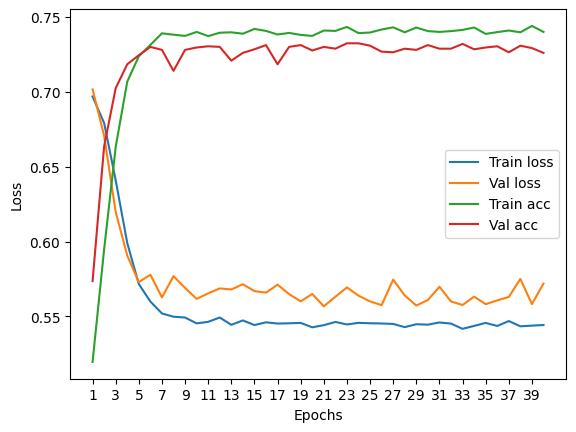

****************************************************************************************************



118it [00:00, 204.51it/s]


Train Epoch: 0 	Loss: 0.692615, Accuracy: 4102/7500 (55%)
Val Epoch: 0 	Loss: 0.689995, Accuracy: 1584/2500 (63%)



118it [00:00, 186.07it/s]


Train Epoch: 1 	Loss: 0.657895, Accuracy: 4856/7500 (65%)
Val Epoch: 1 	Loss: 0.632071, Accuracy: 1728/2500 (69%)



118it [00:00, 151.05it/s]


Train Epoch: 2 	Loss: 0.606305, Accuracy: 5318/7500 (71%)
Val Epoch: 2 	Loss: 0.587215, Accuracy: 1811/2500 (72%)



118it [00:00, 162.21it/s]


Train Epoch: 3 	Loss: 0.577593, Accuracy: 5389/7500 (72%)
Val Epoch: 3 	Loss: 0.573321, Accuracy: 1844/2500 (74%)



118it [00:00, 192.39it/s]


Train Epoch: 4 	Loss: 0.569042, Accuracy: 5388/7500 (72%)
Val Epoch: 4 	Loss: 0.561762, Accuracy: 1834/2500 (73%)



118it [00:00, 180.94it/s]


Train Epoch: 5 	Loss: 0.561416, Accuracy: 5429/7500 (72%)
Val Epoch: 5 	Loss: 0.564430, Accuracy: 1813/2500 (73%)



118it [00:00, 166.09it/s]


Train Epoch: 6 	Loss: 0.561123, Accuracy: 5457/7500 (73%)
Val Epoch: 6 	Loss: 0.556973, Accuracy: 1848/2500 (74%)



118it [00:00, 122.69it/s]


Train Epoch: 7 	Loss: 0.560009, Accuracy: 5411/7500 (72%)
Val Epoch: 7 	Loss: 0.547181, Accuracy: 1857/2500 (74%)



118it [00:01, 115.50it/s]


Train Epoch: 8 	Loss: 0.557907, Accuracy: 5443/7500 (73%)
Val Epoch: 8 	Loss: 0.564098, Accuracy: 1842/2500 (74%)



118it [00:00, 180.64it/s]


Train Epoch: 9 	Loss: 0.558923, Accuracy: 5434/7500 (72%)
Val Epoch: 9 	Loss: 0.544313, Accuracy: 1848/2500 (74%)



118it [00:00, 182.21it/s]


Train Epoch: 10 	Loss: 0.559871, Accuracy: 5448/7500 (73%)
Val Epoch: 10 	Loss: 0.547421, Accuracy: 1860/2500 (74%)



118it [00:00, 169.97it/s]


Train Epoch: 11 	Loss: 0.561060, Accuracy: 5428/7500 (72%)
Val Epoch: 11 	Loss: 0.541274, Accuracy: 1850/2500 (74%)



118it [00:00, 142.29it/s]


Train Epoch: 12 	Loss: 0.562926, Accuracy: 5461/7500 (73%)
Val Epoch: 12 	Loss: 0.538130, Accuracy: 1844/2500 (74%)



118it [00:00, 159.86it/s]


Train Epoch: 13 	Loss: 0.556626, Accuracy: 5444/7500 (73%)
Val Epoch: 13 	Loss: 0.550640, Accuracy: 1835/2500 (73%)



118it [00:00, 222.84it/s]


Train Epoch: 14 	Loss: 0.555608, Accuracy: 5455/7500 (73%)
Val Epoch: 14 	Loss: 0.552621, Accuracy: 1834/2500 (73%)



118it [00:00, 181.26it/s]


Train Epoch: 15 	Loss: 0.556558, Accuracy: 5453/7500 (73%)
Val Epoch: 15 	Loss: 0.561017, Accuracy: 1838/2500 (74%)



118it [00:00, 187.68it/s]


Train Epoch: 16 	Loss: 0.556178, Accuracy: 5472/7500 (73%)
Val Epoch: 16 	Loss: 0.579003, Accuracy: 1793/2500 (72%)



118it [00:00, 154.82it/s]


Train Epoch: 17 	Loss: 0.558770, Accuracy: 5438/7500 (73%)
Val Epoch: 17 	Loss: 0.558750, Accuracy: 1858/2500 (74%)



118it [00:00, 152.54it/s]


Train Epoch: 18 	Loss: 0.557775, Accuracy: 5441/7500 (73%)
Val Epoch: 18 	Loss: 0.542243, Accuracy: 1849/2500 (74%)



118it [00:00, 144.89it/s]


Train Epoch: 19 	Loss: 0.556953, Accuracy: 5460/7500 (73%)
Val Epoch: 19 	Loss: 0.537845, Accuracy: 1840/2500 (74%)



118it [00:00, 145.81it/s]


Train Epoch: 20 	Loss: 0.555077, Accuracy: 5500/7500 (73%)
Val Epoch: 20 	Loss: 0.560860, Accuracy: 1854/2500 (74%)



118it [00:00, 159.68it/s]


Train Epoch: 21 	Loss: 0.552643, Accuracy: 5495/7500 (73%)
Val Epoch: 21 	Loss: 0.538723, Accuracy: 1867/2500 (75%)



118it [00:00, 209.50it/s]


Train Epoch: 22 	Loss: 0.554384, Accuracy: 5502/7500 (73%)
Val Epoch: 22 	Loss: 0.551278, Accuracy: 1859/2500 (74%)



118it [00:00, 207.65it/s]


Train Epoch: 23 	Loss: 0.555454, Accuracy: 5471/7500 (73%)
Val Epoch: 23 	Loss: 0.546376, Accuracy: 1874/2500 (75%)



118it [00:00, 118.21it/s]


Train Epoch: 24 	Loss: 0.556373, Accuracy: 5472/7500 (73%)
Val Epoch: 24 	Loss: 0.551921, Accuracy: 1849/2500 (74%)



118it [00:00, 182.81it/s]


Train Epoch: 25 	Loss: 0.552723, Accuracy: 5469/7500 (73%)
Val Epoch: 25 	Loss: 0.552088, Accuracy: 1848/2500 (74%)



118it [00:00, 177.91it/s]


Train Epoch: 26 	Loss: 0.553532, Accuracy: 5465/7500 (73%)
Val Epoch: 26 	Loss: 0.546259, Accuracy: 1870/2500 (75%)



118it [00:00, 217.68it/s]


Train Epoch: 27 	Loss: 0.554096, Accuracy: 5498/7500 (73%)
Val Epoch: 27 	Loss: 0.536305, Accuracy: 1851/2500 (74%)



118it [00:00, 222.44it/s]


Train Epoch: 28 	Loss: 0.552928, Accuracy: 5468/7500 (73%)
Val Epoch: 28 	Loss: 0.550157, Accuracy: 1840/2500 (74%)



118it [00:00, 219.22it/s]


Train Epoch: 29 	Loss: 0.554150, Accuracy: 5488/7500 (73%)
Val Epoch: 29 	Loss: 0.540477, Accuracy: 1863/2500 (75%)



118it [00:00, 213.89it/s]


Train Epoch: 30 	Loss: 0.553762, Accuracy: 5481/7500 (73%)
Val Epoch: 30 	Loss: 0.541301, Accuracy: 1866/2500 (75%)



118it [00:00, 195.49it/s]


Train Epoch: 31 	Loss: 0.554969, Accuracy: 5508/7500 (73%)
Val Epoch: 31 	Loss: 0.539760, Accuracy: 1854/2500 (74%)



118it [00:00, 189.75it/s]


Train Epoch: 32 	Loss: 0.554621, Accuracy: 5470/7500 (73%)
Val Epoch: 32 	Loss: 0.539782, Accuracy: 1863/2500 (75%)



118it [00:00, 150.28it/s]


Train Epoch: 33 	Loss: 0.551241, Accuracy: 5487/7500 (73%)
Val Epoch: 33 	Loss: 0.536762, Accuracy: 1861/2500 (74%)



118it [00:00, 167.25it/s]


Train Epoch: 34 	Loss: 0.551080, Accuracy: 5493/7500 (73%)
Val Epoch: 34 	Loss: 0.542582, Accuracy: 1874/2500 (75%)



118it [00:00, 164.06it/s]


Train Epoch: 35 	Loss: 0.554778, Accuracy: 5492/7500 (73%)
Val Epoch: 35 	Loss: 0.542749, Accuracy: 1849/2500 (74%)



118it [00:00, 212.58it/s]


Train Epoch: 36 	Loss: 0.552079, Accuracy: 5487/7500 (73%)
Val Epoch: 36 	Loss: 0.540174, Accuracy: 1869/2500 (75%)



118it [00:00, 190.73it/s]


Train Epoch: 37 	Loss: 0.553813, Accuracy: 5506/7500 (73%)
Val Epoch: 37 	Loss: 0.548110, Accuracy: 1861/2500 (74%)



118it [00:00, 243.10it/s]


Train Epoch: 38 	Loss: 0.551157, Accuracy: 5485/7500 (73%)
Val Epoch: 38 	Loss: 0.536511, Accuracy: 1869/2500 (75%)



118it [00:00, 214.67it/s]


Train Epoch: 39 	Loss: 0.552764, Accuracy: 5499/7500 (73%)
Val Epoch: 39 	Loss: 0.538635, Accuracy: 1863/2500 (75%)

Test accuracy:  74.48


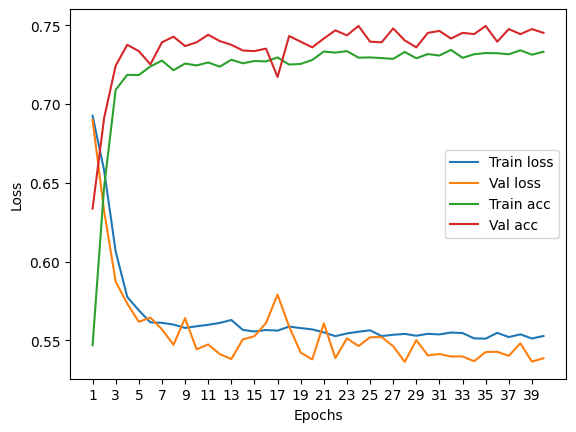

****************************************************************************************************



116it [00:00, 198.29it/s]


Train Epoch: 0 	Loss: 0.690405, Accuracy: 3880/7422 (52%)
Val Epoch: 0 	Loss: 0.694574, Accuracy: 1340/2474 (54%)



116it [00:00, 201.85it/s]


Train Epoch: 1 	Loss: 0.681563, Accuracy: 4263/7422 (57%)
Val Epoch: 1 	Loss: 0.683368, Accuracy: 1425/2474 (58%)



116it [00:00, 140.85it/s]


Train Epoch: 2 	Loss: 0.668560, Accuracy: 4568/7422 (62%)
Val Epoch: 2 	Loss: 0.667213, Accuracy: 1556/2474 (63%)



116it [00:00, 156.94it/s]


Train Epoch: 3 	Loss: 0.654479, Accuracy: 4759/7422 (64%)
Val Epoch: 3 	Loss: 0.649065, Accuracy: 1617/2474 (65%)



116it [00:00, 206.25it/s]


Train Epoch: 4 	Loss: 0.641554, Accuracy: 4936/7422 (67%)
Val Epoch: 4 	Loss: 0.633839, Accuracy: 1675/2474 (68%)



116it [00:00, 183.20it/s]


Train Epoch: 5 	Loss: 0.632061, Accuracy: 4956/7422 (67%)
Val Epoch: 5 	Loss: 0.623855, Accuracy: 1716/2474 (69%)



116it [00:00, 241.08it/s]


Train Epoch: 6 	Loss: 0.621395, Accuracy: 5070/7422 (68%)
Val Epoch: 6 	Loss: 0.612843, Accuracy: 1737/2474 (70%)



116it [00:00, 245.01it/s]


Train Epoch: 7 	Loss: 0.613833, Accuracy: 5078/7422 (68%)
Val Epoch: 7 	Loss: 0.605856, Accuracy: 1763/2474 (71%)



116it [00:00, 246.16it/s]


Train Epoch: 8 	Loss: 0.610258, Accuracy: 5074/7422 (68%)
Val Epoch: 8 	Loss: 0.598443, Accuracy: 1776/2474 (72%)



116it [00:00, 244.30it/s]


Train Epoch: 9 	Loss: 0.601547, Accuracy: 5158/7422 (69%)
Val Epoch: 9 	Loss: 0.590803, Accuracy: 1798/2474 (73%)



116it [00:00, 199.36it/s]


Train Epoch: 10 	Loss: 0.599453, Accuracy: 5139/7422 (69%)
Val Epoch: 10 	Loss: 0.589748, Accuracy: 1784/2474 (72%)



116it [00:00, 155.90it/s]


Train Epoch: 11 	Loss: 0.595356, Accuracy: 5202/7422 (70%)
Val Epoch: 11 	Loss: 0.585531, Accuracy: 1776/2474 (72%)



116it [00:00, 194.50it/s]


Train Epoch: 12 	Loss: 0.591124, Accuracy: 5206/7422 (70%)
Val Epoch: 12 	Loss: 0.582547, Accuracy: 1789/2474 (72%)



116it [00:00, 129.51it/s]


Train Epoch: 13 	Loss: 0.590126, Accuracy: 5188/7422 (70%)
Val Epoch: 13 	Loss: 0.575075, Accuracy: 1798/2474 (73%)



116it [00:00, 204.00it/s]


Train Epoch: 14 	Loss: 0.586741, Accuracy: 5240/7422 (71%)
Val Epoch: 14 	Loss: 0.569949, Accuracy: 1811/2474 (73%)



116it [00:00, 215.74it/s]


Train Epoch: 15 	Loss: 0.585262, Accuracy: 5240/7422 (71%)
Val Epoch: 15 	Loss: 0.569546, Accuracy: 1813/2474 (73%)



116it [00:00, 218.39it/s]


Train Epoch: 16 	Loss: 0.582920, Accuracy: 5232/7422 (70%)
Val Epoch: 16 	Loss: 0.570269, Accuracy: 1830/2474 (74%)



116it [00:00, 218.73it/s]


Train Epoch: 17 	Loss: 0.582125, Accuracy: 5258/7422 (71%)
Val Epoch: 17 	Loss: 0.564655, Accuracy: 1824/2474 (74%)



116it [00:00, 208.48it/s]


Train Epoch: 18 	Loss: 0.580145, Accuracy: 5286/7422 (71%)
Val Epoch: 18 	Loss: 0.566982, Accuracy: 1800/2474 (73%)



116it [00:00, 194.48it/s]


Train Epoch: 19 	Loss: 0.578147, Accuracy: 5245/7422 (71%)
Val Epoch: 19 	Loss: 0.574209, Accuracy: 1775/2474 (72%)



116it [00:00, 209.41it/s]


Train Epoch: 20 	Loss: 0.577078, Accuracy: 5265/7422 (71%)
Val Epoch: 20 	Loss: 0.564585, Accuracy: 1829/2474 (74%)



116it [00:00, 205.77it/s]


Train Epoch: 21 	Loss: 0.576058, Accuracy: 5279/7422 (71%)
Val Epoch: 21 	Loss: 0.556738, Accuracy: 1837/2474 (74%)



116it [00:00, 190.42it/s]


Train Epoch: 22 	Loss: 0.573041, Accuracy: 5324/7422 (72%)
Val Epoch: 22 	Loss: 0.561035, Accuracy: 1801/2474 (73%)



116it [00:00, 176.18it/s]


Train Epoch: 23 	Loss: 0.574813, Accuracy: 5308/7422 (72%)
Val Epoch: 23 	Loss: 0.555954, Accuracy: 1842/2474 (74%)



116it [00:01, 84.71it/s]


Train Epoch: 24 	Loss: 0.572460, Accuracy: 5302/7422 (71%)
Val Epoch: 24 	Loss: 0.554414, Accuracy: 1852/2474 (75%)



116it [00:02, 57.36it/s]


Train Epoch: 25 	Loss: 0.570251, Accuracy: 5323/7422 (72%)
Val Epoch: 25 	Loss: 0.556503, Accuracy: 1840/2474 (74%)



116it [00:01, 75.20it/s]


Train Epoch: 26 	Loss: 0.573179, Accuracy: 5285/7422 (71%)
Val Epoch: 26 	Loss: 0.577721, Accuracy: 1763/2474 (71%)



116it [00:01, 73.93it/s]


Train Epoch: 27 	Loss: 0.569363, Accuracy: 5316/7422 (72%)
Val Epoch: 27 	Loss: 0.551410, Accuracy: 1821/2474 (74%)



116it [00:00, 122.90it/s]


Train Epoch: 28 	Loss: 0.569460, Accuracy: 5316/7422 (72%)
Val Epoch: 28 	Loss: 0.551203, Accuracy: 1840/2474 (74%)



116it [00:00, 139.80it/s]


Train Epoch: 29 	Loss: 0.568147, Accuracy: 5338/7422 (72%)
Val Epoch: 29 	Loss: 0.557505, Accuracy: 1832/2474 (74%)



116it [00:00, 130.30it/s]


Train Epoch: 30 	Loss: 0.569477, Accuracy: 5346/7422 (72%)
Val Epoch: 30 	Loss: 0.549937, Accuracy: 1833/2474 (74%)



116it [00:01, 111.34it/s]


Train Epoch: 31 	Loss: 0.566640, Accuracy: 5348/7422 (72%)
Val Epoch: 31 	Loss: 0.549312, Accuracy: 1851/2474 (75%)



116it [00:01, 113.43it/s]


Train Epoch: 32 	Loss: 0.567267, Accuracy: 5334/7422 (72%)
Val Epoch: 32 	Loss: 0.546294, Accuracy: 1848/2474 (75%)



116it [00:00, 116.95it/s]


Train Epoch: 33 	Loss: 0.567140, Accuracy: 5312/7422 (72%)
Val Epoch: 33 	Loss: 0.545310, Accuracy: 1844/2474 (75%)



116it [00:01, 93.09it/s]


Train Epoch: 34 	Loss: 0.565805, Accuracy: 5341/7422 (72%)
Val Epoch: 34 	Loss: 0.550089, Accuracy: 1819/2474 (74%)



116it [00:00, 158.59it/s]


Train Epoch: 35 	Loss: 0.566437, Accuracy: 5331/7422 (72%)
Val Epoch: 35 	Loss: 0.545408, Accuracy: 1826/2474 (74%)



116it [00:00, 161.14it/s]


Train Epoch: 36 	Loss: 0.565236, Accuracy: 5337/7422 (72%)
Val Epoch: 36 	Loss: 0.548347, Accuracy: 1827/2474 (74%)



116it [00:00, 170.98it/s]


Train Epoch: 37 	Loss: 0.565858, Accuracy: 5315/7422 (72%)
Val Epoch: 37 	Loss: 0.546286, Accuracy: 1848/2474 (75%)



116it [00:00, 186.68it/s]


Train Epoch: 38 	Loss: 0.563372, Accuracy: 5367/7422 (72%)
Val Epoch: 38 	Loss: 0.547539, Accuracy: 1852/2474 (75%)



116it [00:00, 188.83it/s]


Train Epoch: 39 	Loss: 0.566083, Accuracy: 5356/7422 (72%)
Val Epoch: 39 	Loss: 0.551833, Accuracy: 1833/2474 (74%)

Test accuracy:  70.8164915117219


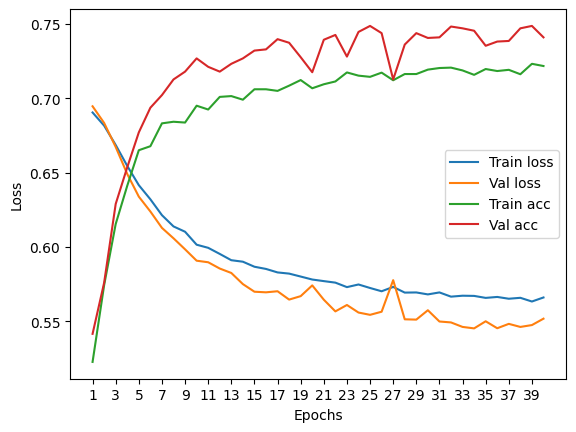

****************************************************************************************************



Particles per jet: 7


118it [00:00, 204.33it/s]


Train Epoch: 0 	Loss: 0.696998, Accuracy: 3913/7500 (52%)
Val Epoch: 0 	Loss: 0.708377, Accuracy: 1245/2500 (50%)



118it [00:00, 235.83it/s]


Train Epoch: 1 	Loss: 0.684159, Accuracy: 4315/7500 (58%)
Val Epoch: 1 	Loss: 0.671802, Accuracy: 1652/2500 (66%)



118it [00:00, 179.10it/s]


Train Epoch: 2 	Loss: 0.651946, Accuracy: 4885/7500 (65%)
Val Epoch: 2 	Loss: 0.635284, Accuracy: 1744/2500 (70%)



118it [00:00, 189.46it/s]


Train Epoch: 3 	Loss: 0.610157, Accuracy: 5305/7500 (71%)
Val Epoch: 3 	Loss: 0.590948, Accuracy: 1815/2500 (73%)



118it [00:00, 175.35it/s]


Train Epoch: 4 	Loss: 0.581310, Accuracy: 5377/7500 (72%)
Val Epoch: 4 	Loss: 0.570300, Accuracy: 1846/2500 (74%)



118it [00:00, 200.09it/s]


Train Epoch: 5 	Loss: 0.563076, Accuracy: 5429/7500 (72%)
Val Epoch: 5 	Loss: 0.578540, Accuracy: 1841/2500 (74%)



118it [00:00, 232.66it/s]


Train Epoch: 6 	Loss: 0.556064, Accuracy: 5441/7500 (73%)
Val Epoch: 6 	Loss: 0.550475, Accuracy: 1856/2500 (74%)



118it [00:00, 203.61it/s]


Train Epoch: 7 	Loss: 0.551679, Accuracy: 5495/7500 (73%)
Val Epoch: 7 	Loss: 0.552401, Accuracy: 1856/2500 (74%)



118it [00:00, 239.69it/s]


Train Epoch: 8 	Loss: 0.548410, Accuracy: 5529/7500 (74%)
Val Epoch: 8 	Loss: 0.550633, Accuracy: 1842/2500 (74%)



118it [00:00, 174.94it/s]


Train Epoch: 9 	Loss: 0.546310, Accuracy: 5525/7500 (74%)
Val Epoch: 9 	Loss: 0.549992, Accuracy: 1847/2500 (74%)



118it [00:00, 135.25it/s]


Train Epoch: 10 	Loss: 0.546737, Accuracy: 5500/7500 (73%)
Val Epoch: 10 	Loss: 0.552832, Accuracy: 1846/2500 (74%)



118it [00:00, 145.18it/s]


Train Epoch: 11 	Loss: 0.545831, Accuracy: 5535/7500 (74%)
Val Epoch: 11 	Loss: 0.571356, Accuracy: 1804/2500 (72%)



118it [00:00, 134.76it/s]


Train Epoch: 12 	Loss: 0.544928, Accuracy: 5512/7500 (73%)
Val Epoch: 12 	Loss: 0.565820, Accuracy: 1838/2500 (74%)



118it [00:00, 176.74it/s]


Train Epoch: 13 	Loss: 0.545404, Accuracy: 5537/7500 (74%)
Val Epoch: 13 	Loss: 0.552008, Accuracy: 1851/2500 (74%)



118it [00:00, 191.17it/s]


Train Epoch: 14 	Loss: 0.544484, Accuracy: 5536/7500 (74%)
Val Epoch: 14 	Loss: 0.553481, Accuracy: 1861/2500 (74%)



118it [00:00, 183.66it/s]


Train Epoch: 15 	Loss: 0.541984, Accuracy: 5558/7500 (74%)
Val Epoch: 15 	Loss: 0.549098, Accuracy: 1835/2500 (73%)



118it [00:00, 186.32it/s]


Train Epoch: 16 	Loss: 0.543620, Accuracy: 5539/7500 (74%)
Val Epoch: 16 	Loss: 0.558271, Accuracy: 1852/2500 (74%)



118it [00:00, 179.27it/s]


Train Epoch: 17 	Loss: 0.539999, Accuracy: 5565/7500 (74%)
Val Epoch: 17 	Loss: 0.540411, Accuracy: 1872/2500 (75%)



118it [00:00, 190.68it/s]


Train Epoch: 18 	Loss: 0.540977, Accuracy: 5567/7500 (74%)
Val Epoch: 18 	Loss: 0.537601, Accuracy: 1866/2500 (75%)



118it [00:00, 208.41it/s]


Train Epoch: 19 	Loss: 0.541017, Accuracy: 5566/7500 (74%)
Val Epoch: 19 	Loss: 0.541289, Accuracy: 1874/2500 (75%)



118it [00:00, 177.19it/s]


Train Epoch: 20 	Loss: 0.538510, Accuracy: 5581/7500 (74%)
Val Epoch: 20 	Loss: 0.562230, Accuracy: 1853/2500 (74%)



118it [00:00, 136.37it/s]


Train Epoch: 21 	Loss: 0.539148, Accuracy: 5548/7500 (74%)
Val Epoch: 21 	Loss: 0.548583, Accuracy: 1853/2500 (74%)



118it [00:00, 150.79it/s]


Train Epoch: 22 	Loss: 0.538555, Accuracy: 5558/7500 (74%)
Val Epoch: 22 	Loss: 0.538873, Accuracy: 1868/2500 (75%)



118it [00:00, 213.10it/s]


Train Epoch: 23 	Loss: 0.539870, Accuracy: 5541/7500 (74%)
Val Epoch: 23 	Loss: 0.540499, Accuracy: 1855/2500 (74%)



118it [00:00, 203.04it/s]


Train Epoch: 24 	Loss: 0.540926, Accuracy: 5544/7500 (74%)
Val Epoch: 24 	Loss: 0.561542, Accuracy: 1870/2500 (75%)



118it [00:00, 207.02it/s]


Train Epoch: 25 	Loss: 0.536943, Accuracy: 5570/7500 (74%)
Val Epoch: 25 	Loss: 0.546267, Accuracy: 1877/2500 (75%)



118it [00:00, 212.26it/s]


Train Epoch: 26 	Loss: 0.538411, Accuracy: 5564/7500 (74%)
Val Epoch: 26 	Loss: 0.543758, Accuracy: 1854/2500 (74%)



118it [00:00, 190.56it/s]


Train Epoch: 27 	Loss: 0.536902, Accuracy: 5573/7500 (74%)
Val Epoch: 27 	Loss: 0.552306, Accuracy: 1869/2500 (75%)



118it [00:00, 206.66it/s]


Train Epoch: 28 	Loss: 0.537226, Accuracy: 5565/7500 (74%)
Val Epoch: 28 	Loss: 0.554995, Accuracy: 1847/2500 (74%)



118it [00:00, 166.79it/s]


Train Epoch: 29 	Loss: 0.538147, Accuracy: 5569/7500 (74%)
Val Epoch: 29 	Loss: 0.557320, Accuracy: 1870/2500 (75%)



118it [00:00, 193.01it/s]


Train Epoch: 30 	Loss: 0.536973, Accuracy: 5557/7500 (74%)
Val Epoch: 30 	Loss: 0.560681, Accuracy: 1869/2500 (75%)



118it [00:00, 197.60it/s]


Train Epoch: 31 	Loss: 0.535987, Accuracy: 5580/7500 (74%)
Val Epoch: 31 	Loss: 0.556473, Accuracy: 1876/2500 (75%)



118it [00:00, 225.54it/s]


Train Epoch: 32 	Loss: 0.537406, Accuracy: 5574/7500 (74%)
Val Epoch: 32 	Loss: 0.547652, Accuracy: 1838/2500 (74%)



118it [00:00, 234.24it/s]


Train Epoch: 33 	Loss: 0.538642, Accuracy: 5536/7500 (74%)
Val Epoch: 33 	Loss: 0.550901, Accuracy: 1868/2500 (75%)



118it [00:00, 217.27it/s]


Train Epoch: 34 	Loss: 0.538219, Accuracy: 5560/7500 (74%)
Val Epoch: 34 	Loss: 0.550608, Accuracy: 1829/2500 (73%)



118it [00:00, 200.96it/s]


Train Epoch: 35 	Loss: 0.540633, Accuracy: 5577/7500 (74%)
Val Epoch: 35 	Loss: 0.549340, Accuracy: 1878/2500 (75%)



118it [00:00, 187.12it/s]


Train Epoch: 36 	Loss: 0.536863, Accuracy: 5565/7500 (74%)
Val Epoch: 36 	Loss: 0.543951, Accuracy: 1879/2500 (75%)



118it [00:00, 212.97it/s]


Train Epoch: 37 	Loss: 0.537983, Accuracy: 5568/7500 (74%)
Val Epoch: 37 	Loss: 0.542384, Accuracy: 1867/2500 (75%)



118it [00:00, 239.21it/s]


Train Epoch: 38 	Loss: 0.538116, Accuracy: 5578/7500 (74%)
Val Epoch: 38 	Loss: 0.542913, Accuracy: 1861/2500 (74%)



118it [00:00, 211.00it/s]


Train Epoch: 39 	Loss: 0.537825, Accuracy: 5561/7500 (74%)
Val Epoch: 39 	Loss: 0.540905, Accuracy: 1880/2500 (75%)

Test accuracy:  74.6


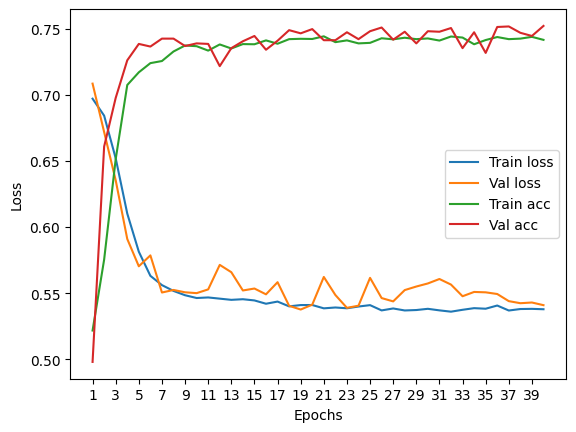

****************************************************************************************************



118it [00:00, 244.41it/s]


Train Epoch: 0 	Loss: 0.690493, Accuracy: 4160/7500 (55%)
Val Epoch: 0 	Loss: 0.695466, Accuracy: 1507/2500 (60%)



118it [00:00, 236.80it/s]


Train Epoch: 1 	Loss: 0.661685, Accuracy: 4763/7500 (64%)
Val Epoch: 1 	Loss: 0.657014, Accuracy: 1639/2500 (66%)



118it [00:00, 171.35it/s]


Train Epoch: 2 	Loss: 0.619110, Accuracy: 5276/7500 (70%)
Val Epoch: 2 	Loss: 0.616628, Accuracy: 1776/2500 (71%)



118it [00:00, 208.47it/s]


Train Epoch: 3 	Loss: 0.583499, Accuracy: 5423/7500 (72%)
Val Epoch: 3 	Loss: 0.582653, Accuracy: 1810/2500 (72%)



118it [00:00, 192.32it/s]


Train Epoch: 4 	Loss: 0.568618, Accuracy: 5413/7500 (72%)
Val Epoch: 4 	Loss: 0.582358, Accuracy: 1799/2500 (72%)



118it [00:00, 222.98it/s]


Train Epoch: 5 	Loss: 0.556871, Accuracy: 5478/7500 (73%)
Val Epoch: 5 	Loss: 0.562250, Accuracy: 1825/2500 (73%)



118it [00:00, 207.91it/s]


Train Epoch: 6 	Loss: 0.554985, Accuracy: 5467/7500 (73%)
Val Epoch: 6 	Loss: 0.568089, Accuracy: 1830/2500 (73%)



118it [00:00, 190.31it/s]


Train Epoch: 7 	Loss: 0.549047, Accuracy: 5532/7500 (74%)
Val Epoch: 7 	Loss: 0.557725, Accuracy: 1837/2500 (73%)



118it [00:00, 218.29it/s]


Train Epoch: 8 	Loss: 0.547679, Accuracy: 5556/7500 (74%)
Val Epoch: 8 	Loss: 0.570711, Accuracy: 1814/2500 (73%)



118it [00:00, 215.01it/s]


Train Epoch: 9 	Loss: 0.547895, Accuracy: 5546/7500 (74%)
Val Epoch: 9 	Loss: 0.563333, Accuracy: 1821/2500 (73%)



118it [00:00, 150.92it/s]


Train Epoch: 10 	Loss: 0.548961, Accuracy: 5555/7500 (74%)
Val Epoch: 10 	Loss: 0.557162, Accuracy: 1825/2500 (73%)



118it [00:00, 180.66it/s]


Train Epoch: 11 	Loss: 0.549168, Accuracy: 5540/7500 (74%)
Val Epoch: 11 	Loss: 0.557161, Accuracy: 1819/2500 (73%)



118it [00:00, 211.74it/s]


Train Epoch: 12 	Loss: 0.549849, Accuracy: 5519/7500 (74%)
Val Epoch: 12 	Loss: 0.570732, Accuracy: 1817/2500 (73%)



118it [00:00, 201.79it/s]


Train Epoch: 13 	Loss: 0.545237, Accuracy: 5543/7500 (74%)
Val Epoch: 13 	Loss: 0.547445, Accuracy: 1835/2500 (73%)



118it [00:00, 211.23it/s]


Train Epoch: 14 	Loss: 0.549967, Accuracy: 5513/7500 (74%)
Val Epoch: 14 	Loss: 0.559798, Accuracy: 1870/2500 (75%)



118it [00:00, 213.61it/s]


Train Epoch: 15 	Loss: 0.545786, Accuracy: 5540/7500 (74%)
Val Epoch: 15 	Loss: 0.561694, Accuracy: 1856/2500 (74%)



118it [00:00, 219.94it/s]


Train Epoch: 16 	Loss: 0.546038, Accuracy: 5564/7500 (74%)
Val Epoch: 16 	Loss: 0.560116, Accuracy: 1846/2500 (74%)



118it [00:00, 222.64it/s]


Train Epoch: 17 	Loss: 0.545574, Accuracy: 5555/7500 (74%)
Val Epoch: 17 	Loss: 0.552932, Accuracy: 1848/2500 (74%)



118it [00:00, 239.91it/s]


Train Epoch: 18 	Loss: 0.547533, Accuracy: 5532/7500 (74%)
Val Epoch: 18 	Loss: 0.561900, Accuracy: 1851/2500 (74%)



118it [00:00, 243.21it/s]


Train Epoch: 19 	Loss: 0.548157, Accuracy: 5552/7500 (74%)
Val Epoch: 19 	Loss: 0.552437, Accuracy: 1850/2500 (74%)



118it [00:00, 246.64it/s]


Train Epoch: 20 	Loss: 0.545942, Accuracy: 5566/7500 (74%)
Val Epoch: 20 	Loss: 0.559976, Accuracy: 1827/2500 (73%)



118it [00:00, 242.41it/s]


Train Epoch: 21 	Loss: 0.546187, Accuracy: 5510/7500 (73%)
Val Epoch: 21 	Loss: 0.559231, Accuracy: 1836/2500 (73%)



118it [00:00, 229.79it/s]


Train Epoch: 22 	Loss: 0.546951, Accuracy: 5537/7500 (74%)
Val Epoch: 22 	Loss: 0.555164, Accuracy: 1847/2500 (74%)



118it [00:00, 217.78it/s]


Train Epoch: 23 	Loss: 0.544841, Accuracy: 5560/7500 (74%)
Val Epoch: 23 	Loss: 0.560104, Accuracy: 1861/2500 (74%)



118it [00:00, 223.38it/s]


Train Epoch: 24 	Loss: 0.543974, Accuracy: 5571/7500 (74%)
Val Epoch: 24 	Loss: 0.554401, Accuracy: 1852/2500 (74%)



118it [00:00, 209.02it/s]


Train Epoch: 25 	Loss: 0.543902, Accuracy: 5528/7500 (74%)
Val Epoch: 25 	Loss: 0.568351, Accuracy: 1844/2500 (74%)



118it [00:00, 216.09it/s]


Train Epoch: 26 	Loss: 0.545002, Accuracy: 5556/7500 (74%)
Val Epoch: 26 	Loss: 0.559007, Accuracy: 1839/2500 (74%)



118it [00:00, 224.72it/s]


Train Epoch: 27 	Loss: 0.543269, Accuracy: 5542/7500 (74%)
Val Epoch: 27 	Loss: 0.553080, Accuracy: 1835/2500 (73%)



118it [00:00, 214.39it/s]


Train Epoch: 28 	Loss: 0.543601, Accuracy: 5548/7500 (74%)
Val Epoch: 28 	Loss: 0.565398, Accuracy: 1842/2500 (74%)



118it [00:00, 238.97it/s]


Train Epoch: 29 	Loss: 0.545032, Accuracy: 5557/7500 (74%)
Val Epoch: 29 	Loss: 0.554361, Accuracy: 1854/2500 (74%)



118it [00:00, 226.25it/s]


Train Epoch: 30 	Loss: 0.544202, Accuracy: 5563/7500 (74%)
Val Epoch: 30 	Loss: 0.567931, Accuracy: 1836/2500 (73%)



118it [00:00, 227.39it/s]


Train Epoch: 31 	Loss: 0.543233, Accuracy: 5552/7500 (74%)
Val Epoch: 31 	Loss: 0.550977, Accuracy: 1860/2500 (74%)



118it [00:00, 225.42it/s]


Train Epoch: 32 	Loss: 0.545106, Accuracy: 5540/7500 (74%)
Val Epoch: 32 	Loss: 0.564456, Accuracy: 1851/2500 (74%)



118it [00:00, 171.56it/s]


Train Epoch: 33 	Loss: 0.542642, Accuracy: 5541/7500 (74%)
Val Epoch: 33 	Loss: 0.555637, Accuracy: 1858/2500 (74%)



118it [00:00, 156.45it/s]


Train Epoch: 34 	Loss: 0.544658, Accuracy: 5535/7500 (74%)
Val Epoch: 34 	Loss: 0.558652, Accuracy: 1828/2500 (73%)



118it [00:00, 178.63it/s]


Train Epoch: 35 	Loss: 0.542617, Accuracy: 5573/7500 (74%)
Val Epoch: 35 	Loss: 0.562001, Accuracy: 1843/2500 (74%)



118it [00:00, 224.43it/s]


Train Epoch: 36 	Loss: 0.543357, Accuracy: 5528/7500 (74%)
Val Epoch: 36 	Loss: 0.551515, Accuracy: 1847/2500 (74%)



118it [00:00, 247.53it/s]


Train Epoch: 37 	Loss: 0.545943, Accuracy: 5547/7500 (74%)
Val Epoch: 37 	Loss: 0.552174, Accuracy: 1850/2500 (74%)



118it [00:00, 245.04it/s]


Train Epoch: 38 	Loss: 0.544025, Accuracy: 5538/7500 (74%)
Val Epoch: 38 	Loss: 0.553536, Accuracy: 1857/2500 (74%)



118it [00:00, 244.32it/s]


Train Epoch: 39 	Loss: 0.544392, Accuracy: 5550/7500 (74%)
Val Epoch: 39 	Loss: 0.572482, Accuracy: 1847/2500 (74%)

Test accuracy:  72.24000000000001


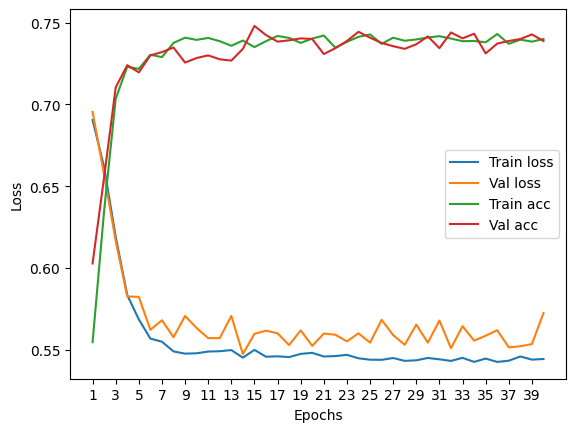

****************************************************************************************************



118it [00:00, 253.04it/s]


Train Epoch: 0 	Loss: 0.694003, Accuracy: 4022/7500 (54%)
Val Epoch: 0 	Loss: 0.699154, Accuracy: 1407/2500 (56%)



118it [00:00, 225.22it/s]


Train Epoch: 1 	Loss: 0.679741, Accuracy: 4394/7500 (59%)
Val Epoch: 1 	Loss: 0.678035, Accuracy: 1592/2500 (64%)



118it [00:00, 167.62it/s]


Train Epoch: 2 	Loss: 0.649006, Accuracy: 4876/7500 (65%)
Val Epoch: 2 	Loss: 0.638915, Accuracy: 1675/2500 (67%)



118it [00:00, 154.22it/s]


Train Epoch: 3 	Loss: 0.617575, Accuracy: 5261/7500 (70%)
Val Epoch: 3 	Loss: 0.608830, Accuracy: 1800/2500 (72%)



118it [00:00, 137.13it/s]


Train Epoch: 4 	Loss: 0.592944, Accuracy: 5402/7500 (72%)
Val Epoch: 4 	Loss: 0.587667, Accuracy: 1789/2500 (72%)



118it [00:00, 150.84it/s]


Train Epoch: 5 	Loss: 0.576694, Accuracy: 5414/7500 (72%)
Val Epoch: 5 	Loss: 0.587460, Accuracy: 1794/2500 (72%)



118it [00:00, 203.48it/s]


Train Epoch: 6 	Loss: 0.566359, Accuracy: 5415/7500 (72%)
Val Epoch: 6 	Loss: 0.570003, Accuracy: 1815/2500 (73%)



118it [00:00, 204.84it/s]


Train Epoch: 7 	Loss: 0.559378, Accuracy: 5480/7500 (73%)
Val Epoch: 7 	Loss: 0.566553, Accuracy: 1795/2500 (72%)



118it [00:00, 211.35it/s]


Train Epoch: 8 	Loss: 0.555393, Accuracy: 5502/7500 (73%)
Val Epoch: 8 	Loss: 0.589003, Accuracy: 1735/2500 (69%)



118it [00:00, 230.90it/s]


Train Epoch: 9 	Loss: 0.554234, Accuracy: 5508/7500 (73%)
Val Epoch: 9 	Loss: 0.557673, Accuracy: 1806/2500 (72%)



118it [00:00, 221.97it/s]


Train Epoch: 10 	Loss: 0.550757, Accuracy: 5513/7500 (74%)
Val Epoch: 10 	Loss: 0.552177, Accuracy: 1814/2500 (73%)



118it [00:00, 208.89it/s]


Train Epoch: 11 	Loss: 0.549604, Accuracy: 5555/7500 (74%)
Val Epoch: 11 	Loss: 0.581172, Accuracy: 1824/2500 (73%)



118it [00:00, 243.67it/s]


Train Epoch: 12 	Loss: 0.549782, Accuracy: 5529/7500 (74%)
Val Epoch: 12 	Loss: 0.547119, Accuracy: 1816/2500 (73%)



118it [00:00, 169.46it/s]


Train Epoch: 13 	Loss: 0.549072, Accuracy: 5565/7500 (74%)
Val Epoch: 13 	Loss: 0.546732, Accuracy: 1805/2500 (72%)



118it [00:01, 107.62it/s]


Train Epoch: 14 	Loss: 0.550168, Accuracy: 5523/7500 (74%)
Val Epoch: 14 	Loss: 0.544678, Accuracy: 1826/2500 (73%)



118it [00:01, 71.34it/s]


Train Epoch: 15 	Loss: 0.549260, Accuracy: 5534/7500 (74%)
Val Epoch: 15 	Loss: 0.552936, Accuracy: 1825/2500 (73%)



118it [00:01, 114.59it/s]


Train Epoch: 16 	Loss: 0.548384, Accuracy: 5542/7500 (74%)
Val Epoch: 16 	Loss: 0.552376, Accuracy: 1817/2500 (73%)



118it [00:01, 104.07it/s]


Train Epoch: 17 	Loss: 0.549371, Accuracy: 5565/7500 (74%)
Val Epoch: 17 	Loss: 0.556980, Accuracy: 1850/2500 (74%)



118it [00:01, 111.88it/s]


Train Epoch: 18 	Loss: 0.548622, Accuracy: 5541/7500 (74%)
Val Epoch: 18 	Loss: 0.550873, Accuracy: 1833/2500 (73%)



118it [00:01, 116.46it/s]


Train Epoch: 19 	Loss: 0.547804, Accuracy: 5528/7500 (74%)
Val Epoch: 19 	Loss: 0.554874, Accuracy: 1797/2500 (72%)



118it [00:00, 162.68it/s]


Train Epoch: 20 	Loss: 0.547296, Accuracy: 5562/7500 (74%)
Val Epoch: 20 	Loss: 0.557151, Accuracy: 1817/2500 (73%)



118it [00:00, 170.41it/s]


Train Epoch: 21 	Loss: 0.548000, Accuracy: 5517/7500 (74%)
Val Epoch: 21 	Loss: 0.601152, Accuracy: 1813/2500 (73%)



118it [00:01, 111.30it/s]


Train Epoch: 22 	Loss: 0.551026, Accuracy: 5528/7500 (74%)
Val Epoch: 22 	Loss: 0.556018, Accuracy: 1846/2500 (74%)



118it [00:00, 122.51it/s]


Train Epoch: 23 	Loss: 0.549146, Accuracy: 5539/7500 (74%)
Val Epoch: 23 	Loss: 0.566773, Accuracy: 1834/2500 (73%)



118it [00:01, 100.62it/s]


Train Epoch: 24 	Loss: 0.547499, Accuracy: 5542/7500 (74%)
Val Epoch: 24 	Loss: 0.558477, Accuracy: 1787/2500 (71%)



118it [00:00, 203.26it/s]


Train Epoch: 25 	Loss: 0.550008, Accuracy: 5537/7500 (74%)
Val Epoch: 25 	Loss: 0.544919, Accuracy: 1829/2500 (73%)



118it [00:01, 95.37it/s]


Train Epoch: 26 	Loss: 0.550450, Accuracy: 5533/7500 (74%)
Val Epoch: 26 	Loss: 0.558661, Accuracy: 1832/2500 (73%)



118it [00:01, 97.05it/s] 


Train Epoch: 27 	Loss: 0.550204, Accuracy: 5540/7500 (74%)
Val Epoch: 27 	Loss: 0.550627, Accuracy: 1827/2500 (73%)



118it [00:00, 131.84it/s]


Train Epoch: 28 	Loss: 0.550880, Accuracy: 5538/7500 (74%)
Val Epoch: 28 	Loss: 0.554785, Accuracy: 1790/2500 (72%)



118it [00:00, 221.09it/s]


Train Epoch: 29 	Loss: 0.546351, Accuracy: 5517/7500 (74%)
Val Epoch: 29 	Loss: 0.556304, Accuracy: 1820/2500 (73%)



118it [00:00, 199.17it/s]


Train Epoch: 30 	Loss: 0.546160, Accuracy: 5550/7500 (74%)
Val Epoch: 30 	Loss: 0.550489, Accuracy: 1812/2500 (72%)



118it [00:00, 215.98it/s]


Train Epoch: 31 	Loss: 0.547588, Accuracy: 5558/7500 (74%)
Val Epoch: 31 	Loss: 0.551071, Accuracy: 1823/2500 (73%)



118it [00:00, 235.40it/s]


Train Epoch: 32 	Loss: 0.548251, Accuracy: 5527/7500 (74%)
Val Epoch: 32 	Loss: 0.555825, Accuracy: 1813/2500 (73%)



118it [00:00, 217.08it/s]


Train Epoch: 33 	Loss: 0.546779, Accuracy: 5542/7500 (74%)
Val Epoch: 33 	Loss: 0.559198, Accuracy: 1793/2500 (72%)



118it [00:00, 219.53it/s]


Train Epoch: 34 	Loss: 0.545808, Accuracy: 5549/7500 (74%)
Val Epoch: 34 	Loss: 0.566403, Accuracy: 1828/2500 (73%)



118it [00:00, 192.28it/s]


Train Epoch: 35 	Loss: 0.548530, Accuracy: 5507/7500 (73%)
Val Epoch: 35 	Loss: 0.571174, Accuracy: 1824/2500 (73%)



118it [00:00, 203.63it/s]


Train Epoch: 36 	Loss: 0.550457, Accuracy: 5508/7500 (73%)
Val Epoch: 36 	Loss: 0.556232, Accuracy: 1817/2500 (73%)



118it [00:00, 220.74it/s]


Train Epoch: 37 	Loss: 0.549883, Accuracy: 5520/7500 (74%)
Val Epoch: 37 	Loss: 0.553502, Accuracy: 1835/2500 (73%)



118it [00:00, 149.86it/s]


Train Epoch: 38 	Loss: 0.547569, Accuracy: 5561/7500 (74%)
Val Epoch: 38 	Loss: 0.559074, Accuracy: 1837/2500 (73%)



118it [00:01, 116.92it/s]


Train Epoch: 39 	Loss: 0.548353, Accuracy: 5568/7500 (74%)
Val Epoch: 39 	Loss: 0.559037, Accuracy: 1798/2500 (72%)

Test accuracy:  71.52


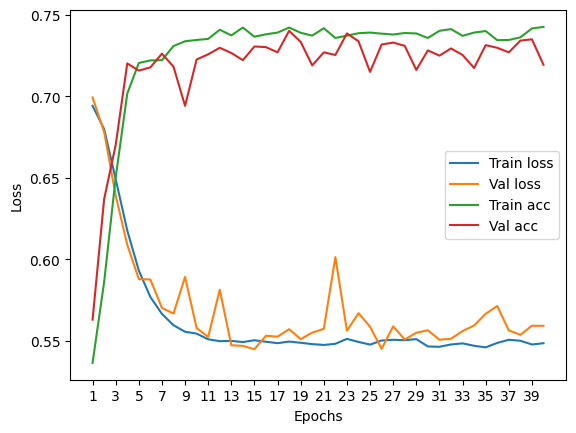

****************************************************************************************************



118it [00:00, 215.40it/s]


Train Epoch: 0 	Loss: 0.688248, Accuracy: 4219/7500 (56%)
Val Epoch: 0 	Loss: 0.693656, Accuracy: 1449/2500 (58%)



118it [00:00, 174.59it/s]


Train Epoch: 1 	Loss: 0.664747, Accuracy: 4552/7500 (61%)
Val Epoch: 1 	Loss: 0.673898, Accuracy: 1533/2500 (61%)



118it [00:00, 235.59it/s]


Train Epoch: 2 	Loss: 0.635835, Accuracy: 4942/7500 (66%)
Val Epoch: 2 	Loss: 0.643148, Accuracy: 1663/2500 (67%)



118it [00:00, 205.04it/s]


Train Epoch: 3 	Loss: 0.605795, Accuracy: 5188/7500 (69%)
Val Epoch: 3 	Loss: 0.614977, Accuracy: 1681/2500 (67%)



118it [00:00, 237.99it/s]


Train Epoch: 4 	Loss: 0.578644, Accuracy: 5388/7500 (72%)
Val Epoch: 4 	Loss: 0.575397, Accuracy: 1814/2500 (73%)



118it [00:00, 219.03it/s]


Train Epoch: 5 	Loss: 0.565801, Accuracy: 5419/7500 (72%)
Val Epoch: 5 	Loss: 0.572868, Accuracy: 1803/2500 (72%)



118it [00:00, 242.30it/s]


Train Epoch: 6 	Loss: 0.558616, Accuracy: 5416/7500 (72%)
Val Epoch: 6 	Loss: 0.564177, Accuracy: 1826/2500 (73%)



118it [00:00, 240.36it/s]


Train Epoch: 7 	Loss: 0.552145, Accuracy: 5463/7500 (73%)
Val Epoch: 7 	Loss: 0.558484, Accuracy: 1834/2500 (73%)



118it [00:00, 246.33it/s]


Train Epoch: 8 	Loss: 0.558707, Accuracy: 5430/7500 (72%)
Val Epoch: 8 	Loss: 0.561197, Accuracy: 1822/2500 (73%)



118it [00:00, 234.13it/s]


Train Epoch: 9 	Loss: 0.545878, Accuracy: 5521/7500 (74%)
Val Epoch: 9 	Loss: 0.553472, Accuracy: 1845/2500 (74%)



118it [00:00, 230.33it/s]


Train Epoch: 10 	Loss: 0.544650, Accuracy: 5503/7500 (73%)
Val Epoch: 10 	Loss: 0.554007, Accuracy: 1826/2500 (73%)



118it [00:00, 245.16it/s]


Train Epoch: 11 	Loss: 0.544884, Accuracy: 5516/7500 (74%)
Val Epoch: 11 	Loss: 0.566520, Accuracy: 1847/2500 (74%)



118it [00:00, 239.27it/s]


Train Epoch: 12 	Loss: 0.545611, Accuracy: 5526/7500 (74%)
Val Epoch: 12 	Loss: 0.556421, Accuracy: 1821/2500 (73%)



118it [00:00, 240.42it/s]


Train Epoch: 13 	Loss: 0.539782, Accuracy: 5536/7500 (74%)
Val Epoch: 13 	Loss: 0.549091, Accuracy: 1847/2500 (74%)



118it [00:00, 234.23it/s]


Train Epoch: 14 	Loss: 0.540071, Accuracy: 5551/7500 (74%)
Val Epoch: 14 	Loss: 0.552100, Accuracy: 1851/2500 (74%)



118it [00:00, 233.16it/s]


Train Epoch: 15 	Loss: 0.541293, Accuracy: 5534/7500 (74%)
Val Epoch: 15 	Loss: 0.547853, Accuracy: 1852/2500 (74%)



118it [00:00, 244.75it/s]


Train Epoch: 16 	Loss: 0.541234, Accuracy: 5559/7500 (74%)
Val Epoch: 16 	Loss: 0.554083, Accuracy: 1839/2500 (74%)



118it [00:00, 242.85it/s]


Train Epoch: 17 	Loss: 0.541087, Accuracy: 5502/7500 (73%)
Val Epoch: 17 	Loss: 0.556921, Accuracy: 1845/2500 (74%)



118it [00:00, 220.62it/s]


Train Epoch: 18 	Loss: 0.537171, Accuracy: 5582/7500 (74%)
Val Epoch: 18 	Loss: 0.554604, Accuracy: 1849/2500 (74%)



118it [00:00, 242.27it/s]


Train Epoch: 19 	Loss: 0.539046, Accuracy: 5555/7500 (74%)
Val Epoch: 19 	Loss: 0.555286, Accuracy: 1819/2500 (73%)



118it [00:00, 239.02it/s]


Train Epoch: 20 	Loss: 0.539774, Accuracy: 5548/7500 (74%)
Val Epoch: 20 	Loss: 0.552685, Accuracy: 1845/2500 (74%)



118it [00:00, 192.07it/s]


Train Epoch: 21 	Loss: 0.538952, Accuracy: 5554/7500 (74%)
Val Epoch: 21 	Loss: 0.544717, Accuracy: 1829/2500 (73%)



118it [00:00, 210.48it/s]


Train Epoch: 22 	Loss: 0.538454, Accuracy: 5569/7500 (74%)
Val Epoch: 22 	Loss: 0.547674, Accuracy: 1847/2500 (74%)



118it [00:00, 196.66it/s]


Train Epoch: 23 	Loss: 0.537971, Accuracy: 5571/7500 (74%)
Val Epoch: 23 	Loss: 0.553988, Accuracy: 1820/2500 (73%)



118it [00:00, 166.38it/s]


Train Epoch: 24 	Loss: 0.538423, Accuracy: 5563/7500 (74%)
Val Epoch: 24 	Loss: 0.547980, Accuracy: 1830/2500 (73%)



118it [00:00, 190.94it/s]


Train Epoch: 25 	Loss: 0.539272, Accuracy: 5568/7500 (74%)
Val Epoch: 25 	Loss: 0.555526, Accuracy: 1842/2500 (74%)



118it [00:00, 197.10it/s]


Train Epoch: 26 	Loss: 0.536632, Accuracy: 5570/7500 (74%)
Val Epoch: 26 	Loss: 0.569926, Accuracy: 1838/2500 (74%)



118it [00:00, 199.28it/s]


Train Epoch: 27 	Loss: 0.542154, Accuracy: 5547/7500 (74%)
Val Epoch: 27 	Loss: 0.560580, Accuracy: 1847/2500 (74%)



118it [00:01, 95.10it/s] 


Train Epoch: 28 	Loss: 0.542264, Accuracy: 5535/7500 (74%)
Val Epoch: 28 	Loss: 0.567302, Accuracy: 1840/2500 (74%)



118it [00:00, 124.58it/s]


Train Epoch: 29 	Loss: 0.541849, Accuracy: 5562/7500 (74%)
Val Epoch: 29 	Loss: 0.554591, Accuracy: 1841/2500 (74%)



118it [00:00, 235.26it/s]


Train Epoch: 30 	Loss: 0.538980, Accuracy: 5574/7500 (74%)
Val Epoch: 30 	Loss: 0.559679, Accuracy: 1814/2500 (73%)



118it [00:00, 241.36it/s]


Train Epoch: 31 	Loss: 0.537074, Accuracy: 5566/7500 (74%)
Val Epoch: 31 	Loss: 0.547377, Accuracy: 1830/2500 (73%)



118it [00:00, 250.43it/s]


Train Epoch: 32 	Loss: 0.539352, Accuracy: 5573/7500 (74%)
Val Epoch: 32 	Loss: 0.563160, Accuracy: 1846/2500 (74%)



118it [00:00, 229.29it/s]


Train Epoch: 33 	Loss: 0.539761, Accuracy: 5581/7500 (74%)
Val Epoch: 33 	Loss: 0.549425, Accuracy: 1849/2500 (74%)



118it [00:00, 151.21it/s]


Train Epoch: 34 	Loss: 0.539270, Accuracy: 5570/7500 (74%)
Val Epoch: 34 	Loss: 0.559430, Accuracy: 1849/2500 (74%)



118it [00:00, 142.60it/s]


Train Epoch: 35 	Loss: 0.538263, Accuracy: 5556/7500 (74%)
Val Epoch: 35 	Loss: 0.546966, Accuracy: 1837/2500 (73%)



118it [00:01, 116.36it/s]


Train Epoch: 36 	Loss: 0.539115, Accuracy: 5581/7500 (74%)
Val Epoch: 36 	Loss: 0.563619, Accuracy: 1845/2500 (74%)



118it [00:01, 101.49it/s]


Train Epoch: 37 	Loss: 0.538862, Accuracy: 5546/7500 (74%)
Val Epoch: 37 	Loss: 0.549380, Accuracy: 1836/2500 (73%)



118it [00:01, 111.81it/s]


Train Epoch: 38 	Loss: 0.537592, Accuracy: 5569/7500 (74%)
Val Epoch: 38 	Loss: 0.557112, Accuracy: 1836/2500 (73%)



118it [00:01, 110.96it/s]


Train Epoch: 39 	Loss: 0.538314, Accuracy: 5560/7500 (74%)
Val Epoch: 39 	Loss: 0.544003, Accuracy: 1828/2500 (73%)

Test accuracy:  73.11999999999999


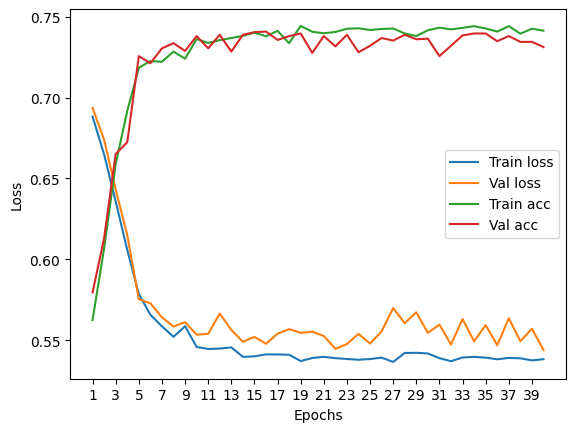

****************************************************************************************************



118it [00:00, 199.59it/s]


Train Epoch: 0 	Loss: 0.685978, Accuracy: 4341/7500 (58%)
Val Epoch: 0 	Loss: 0.682613, Accuracy: 1635/2500 (65%)



118it [00:00, 190.63it/s]


Train Epoch: 1 	Loss: 0.645414, Accuracy: 5113/7500 (68%)
Val Epoch: 1 	Loss: 0.622566, Accuracy: 1810/2500 (72%)



118it [00:00, 236.36it/s]


Train Epoch: 2 	Loss: 0.588265, Accuracy: 5458/7500 (73%)
Val Epoch: 2 	Loss: 0.577310, Accuracy: 1814/2500 (73%)



118it [00:00, 254.32it/s]


Train Epoch: 3 	Loss: 0.563208, Accuracy: 5469/7500 (73%)
Val Epoch: 3 	Loss: 0.566860, Accuracy: 1801/2500 (72%)



118it [00:00, 199.48it/s]


Train Epoch: 4 	Loss: 0.549626, Accuracy: 5513/7500 (74%)
Val Epoch: 4 	Loss: 0.557000, Accuracy: 1826/2500 (73%)



118it [00:00, 239.84it/s]


Train Epoch: 5 	Loss: 0.545270, Accuracy: 5521/7500 (74%)
Val Epoch: 5 	Loss: 0.558079, Accuracy: 1825/2500 (73%)



118it [00:00, 240.17it/s]


Train Epoch: 6 	Loss: 0.542593, Accuracy: 5539/7500 (74%)
Val Epoch: 6 	Loss: 0.561111, Accuracy: 1840/2500 (74%)



118it [00:00, 231.62it/s]


Train Epoch: 7 	Loss: 0.542908, Accuracy: 5526/7500 (74%)
Val Epoch: 7 	Loss: 0.562405, Accuracy: 1845/2500 (74%)



118it [00:00, 226.37it/s]


Train Epoch: 8 	Loss: 0.543807, Accuracy: 5519/7500 (74%)
Val Epoch: 8 	Loss: 0.550342, Accuracy: 1835/2500 (73%)



118it [00:00, 230.39it/s]


Train Epoch: 9 	Loss: 0.542068, Accuracy: 5535/7500 (74%)
Val Epoch: 9 	Loss: 0.553142, Accuracy: 1826/2500 (73%)



118it [00:00, 237.59it/s]


Train Epoch: 10 	Loss: 0.542647, Accuracy: 5509/7500 (73%)
Val Epoch: 10 	Loss: 0.570939, Accuracy: 1813/2500 (73%)



118it [00:00, 214.90it/s]


Train Epoch: 11 	Loss: 0.543085, Accuracy: 5503/7500 (73%)
Val Epoch: 11 	Loss: 0.560261, Accuracy: 1843/2500 (74%)



118it [00:00, 253.03it/s]


Train Epoch: 12 	Loss: 0.542140, Accuracy: 5558/7500 (74%)
Val Epoch: 12 	Loss: 0.567339, Accuracy: 1831/2500 (73%)



118it [00:00, 241.84it/s]


Train Epoch: 13 	Loss: 0.542277, Accuracy: 5559/7500 (74%)
Val Epoch: 13 	Loss: 0.576398, Accuracy: 1838/2500 (74%)



118it [00:00, 250.94it/s]


Train Epoch: 14 	Loss: 0.541712, Accuracy: 5527/7500 (74%)
Val Epoch: 14 	Loss: 0.556286, Accuracy: 1811/2500 (72%)



118it [00:00, 250.74it/s]


Train Epoch: 15 	Loss: 0.541300, Accuracy: 5524/7500 (74%)
Val Epoch: 15 	Loss: 0.558130, Accuracy: 1828/2500 (73%)



118it [00:00, 226.69it/s]


Train Epoch: 16 	Loss: 0.543272, Accuracy: 5501/7500 (73%)
Val Epoch: 16 	Loss: 0.557535, Accuracy: 1826/2500 (73%)



118it [00:00, 241.03it/s]


Train Epoch: 17 	Loss: 0.541795, Accuracy: 5528/7500 (74%)
Val Epoch: 17 	Loss: 0.558389, Accuracy: 1821/2500 (73%)



118it [00:00, 252.34it/s]


Train Epoch: 18 	Loss: 0.541283, Accuracy: 5535/7500 (74%)
Val Epoch: 18 	Loss: 0.559474, Accuracy: 1822/2500 (73%)



118it [00:00, 253.95it/s]


Train Epoch: 19 	Loss: 0.539939, Accuracy: 5548/7500 (74%)
Val Epoch: 19 	Loss: 0.556342, Accuracy: 1823/2500 (73%)



118it [00:00, 229.19it/s]


Train Epoch: 20 	Loss: 0.538841, Accuracy: 5555/7500 (74%)
Val Epoch: 20 	Loss: 0.558113, Accuracy: 1834/2500 (73%)



118it [00:00, 233.95it/s]


Train Epoch: 21 	Loss: 0.540946, Accuracy: 5525/7500 (74%)
Val Epoch: 21 	Loss: 0.556855, Accuracy: 1830/2500 (73%)



118it [00:00, 209.56it/s]


Train Epoch: 22 	Loss: 0.538361, Accuracy: 5537/7500 (74%)
Val Epoch: 22 	Loss: 0.563069, Accuracy: 1817/2500 (73%)



118it [00:00, 152.18it/s]


Train Epoch: 23 	Loss: 0.540996, Accuracy: 5557/7500 (74%)
Val Epoch: 23 	Loss: 0.560227, Accuracy: 1848/2500 (74%)



118it [00:00, 183.12it/s]


Train Epoch: 24 	Loss: 0.540303, Accuracy: 5543/7500 (74%)
Val Epoch: 24 	Loss: 0.548380, Accuracy: 1836/2500 (73%)



118it [00:00, 195.34it/s]


Train Epoch: 25 	Loss: 0.540050, Accuracy: 5571/7500 (74%)
Val Epoch: 25 	Loss: 0.557685, Accuracy: 1826/2500 (73%)



118it [00:00, 229.62it/s]


Train Epoch: 26 	Loss: 0.539790, Accuracy: 5562/7500 (74%)
Val Epoch: 26 	Loss: 0.564398, Accuracy: 1831/2500 (73%)



118it [00:00, 230.22it/s]


Train Epoch: 27 	Loss: 0.539955, Accuracy: 5513/7500 (74%)
Val Epoch: 27 	Loss: 0.573403, Accuracy: 1831/2500 (73%)



118it [00:00, 233.23it/s]


Train Epoch: 28 	Loss: 0.541020, Accuracy: 5529/7500 (74%)
Val Epoch: 28 	Loss: 0.568662, Accuracy: 1830/2500 (73%)



118it [00:00, 223.79it/s]


Train Epoch: 29 	Loss: 0.539438, Accuracy: 5542/7500 (74%)
Val Epoch: 29 	Loss: 0.566858, Accuracy: 1818/2500 (73%)



118it [00:00, 223.39it/s]


Train Epoch: 30 	Loss: 0.539943, Accuracy: 5542/7500 (74%)
Val Epoch: 30 	Loss: 0.547881, Accuracy: 1848/2500 (74%)



118it [00:00, 251.59it/s]


Train Epoch: 31 	Loss: 0.540739, Accuracy: 5529/7500 (74%)
Val Epoch: 31 	Loss: 0.550370, Accuracy: 1835/2500 (73%)



118it [00:00, 252.89it/s]


Train Epoch: 32 	Loss: 0.542413, Accuracy: 5503/7500 (73%)
Val Epoch: 32 	Loss: 0.556289, Accuracy: 1837/2500 (73%)



118it [00:00, 255.77it/s]


Train Epoch: 33 	Loss: 0.539710, Accuracy: 5557/7500 (74%)
Val Epoch: 33 	Loss: 0.554539, Accuracy: 1830/2500 (73%)



118it [00:00, 252.00it/s]


Train Epoch: 34 	Loss: 0.539205, Accuracy: 5563/7500 (74%)
Val Epoch: 34 	Loss: 0.564455, Accuracy: 1827/2500 (73%)



118it [00:00, 253.01it/s]


Train Epoch: 35 	Loss: 0.538954, Accuracy: 5533/7500 (74%)
Val Epoch: 35 	Loss: 0.565096, Accuracy: 1817/2500 (73%)



118it [00:00, 253.52it/s]


Train Epoch: 36 	Loss: 0.541228, Accuracy: 5532/7500 (74%)
Val Epoch: 36 	Loss: 0.552592, Accuracy: 1840/2500 (74%)



118it [00:00, 255.09it/s]


Train Epoch: 37 	Loss: 0.542583, Accuracy: 5510/7500 (73%)
Val Epoch: 37 	Loss: 0.555560, Accuracy: 1842/2500 (74%)



118it [00:00, 256.73it/s]


Train Epoch: 38 	Loss: 0.539231, Accuracy: 5539/7500 (74%)
Val Epoch: 38 	Loss: 0.554397, Accuracy: 1836/2500 (73%)



118it [00:00, 251.11it/s]


Train Epoch: 39 	Loss: 0.540224, Accuracy: 5512/7500 (73%)
Val Epoch: 39 	Loss: 0.549796, Accuracy: 1820/2500 (73%)

Test accuracy:  72.76


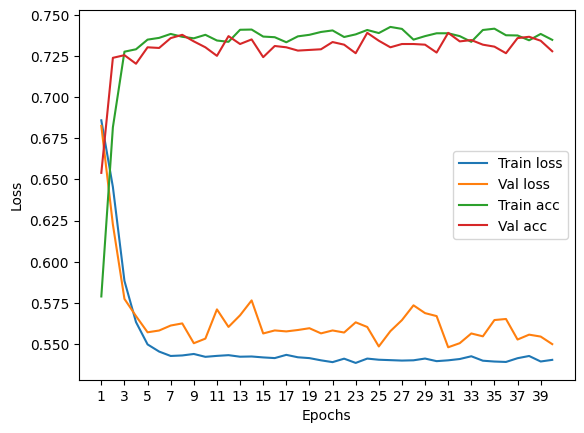

****************************************************************************************************



118it [00:00, 254.97it/s]


Train Epoch: 0 	Loss: 0.692797, Accuracy: 4022/7500 (54%)
Val Epoch: 0 	Loss: 0.698367, Accuracy: 1420/2500 (57%)



118it [00:00, 259.70it/s]


Train Epoch: 1 	Loss: 0.672626, Accuracy: 4573/7500 (61%)
Val Epoch: 1 	Loss: 0.676022, Accuracy: 1548/2500 (62%)



118it [00:00, 258.06it/s]


Train Epoch: 2 	Loss: 0.637771, Accuracy: 4937/7500 (66%)
Val Epoch: 2 	Loss: 0.660508, Accuracy: 1539/2500 (62%)



118it [00:00, 257.47it/s]


Train Epoch: 3 	Loss: 0.609793, Accuracy: 5205/7500 (69%)
Val Epoch: 3 	Loss: 0.621042, Accuracy: 1703/2500 (68%)



118it [00:00, 258.60it/s]


Train Epoch: 4 	Loss: 0.587716, Accuracy: 5274/7500 (70%)
Val Epoch: 4 	Loss: 0.579434, Accuracy: 1811/2500 (72%)



118it [00:00, 259.29it/s]


Train Epoch: 5 	Loss: 0.573640, Accuracy: 5351/7500 (71%)
Val Epoch: 5 	Loss: 0.576206, Accuracy: 1828/2500 (73%)



118it [00:00, 250.06it/s]


Train Epoch: 6 	Loss: 0.565695, Accuracy: 5430/7500 (72%)
Val Epoch: 6 	Loss: 0.562662, Accuracy: 1831/2500 (73%)



118it [00:00, 253.91it/s]


Train Epoch: 7 	Loss: 0.565699, Accuracy: 5381/7500 (72%)
Val Epoch: 7 	Loss: 0.561774, Accuracy: 1827/2500 (73%)



118it [00:00, 254.59it/s]


Train Epoch: 8 	Loss: 0.557152, Accuracy: 5444/7500 (73%)
Val Epoch: 8 	Loss: 0.565131, Accuracy: 1810/2500 (72%)



118it [00:00, 263.07it/s]


Train Epoch: 9 	Loss: 0.555189, Accuracy: 5447/7500 (73%)
Val Epoch: 9 	Loss: 0.570042, Accuracy: 1849/2500 (74%)



118it [00:00, 212.65it/s]


Train Epoch: 10 	Loss: 0.552361, Accuracy: 5469/7500 (73%)
Val Epoch: 10 	Loss: 0.569783, Accuracy: 1823/2500 (73%)



118it [00:00, 223.50it/s]


Train Epoch: 11 	Loss: 0.553185, Accuracy: 5498/7500 (73%)
Val Epoch: 11 	Loss: 0.559403, Accuracy: 1853/2500 (74%)



118it [00:00, 229.50it/s]


Train Epoch: 12 	Loss: 0.553048, Accuracy: 5477/7500 (73%)
Val Epoch: 12 	Loss: 0.570341, Accuracy: 1848/2500 (74%)



118it [00:00, 227.68it/s]


Train Epoch: 13 	Loss: 0.551689, Accuracy: 5511/7500 (73%)
Val Epoch: 13 	Loss: 0.557188, Accuracy: 1853/2500 (74%)



118it [00:00, 156.19it/s]


Train Epoch: 14 	Loss: 0.553778, Accuracy: 5491/7500 (73%)
Val Epoch: 14 	Loss: 0.572417, Accuracy: 1854/2500 (74%)



118it [00:00, 234.52it/s]


Train Epoch: 15 	Loss: 0.550264, Accuracy: 5489/7500 (73%)
Val Epoch: 15 	Loss: 0.567440, Accuracy: 1830/2500 (73%)



118it [00:00, 172.78it/s]


Train Epoch: 16 	Loss: 0.548666, Accuracy: 5507/7500 (73%)
Val Epoch: 16 	Loss: 0.558624, Accuracy: 1840/2500 (74%)



118it [00:00, 167.82it/s]


Train Epoch: 17 	Loss: 0.554491, Accuracy: 5478/7500 (73%)
Val Epoch: 17 	Loss: 0.561641, Accuracy: 1844/2500 (74%)



118it [00:00, 176.54it/s]


Train Epoch: 18 	Loss: 0.553722, Accuracy: 5478/7500 (73%)
Val Epoch: 18 	Loss: 0.552517, Accuracy: 1853/2500 (74%)



118it [00:00, 224.23it/s]


Train Epoch: 19 	Loss: 0.547930, Accuracy: 5509/7500 (73%)
Val Epoch: 19 	Loss: 0.554986, Accuracy: 1855/2500 (74%)



118it [00:00, 234.52it/s]


Train Epoch: 20 	Loss: 0.550663, Accuracy: 5492/7500 (73%)
Val Epoch: 20 	Loss: 0.565054, Accuracy: 1832/2500 (73%)



118it [00:00, 218.84it/s]


Train Epoch: 21 	Loss: 0.549389, Accuracy: 5504/7500 (73%)
Val Epoch: 21 	Loss: 0.565904, Accuracy: 1843/2500 (74%)



118it [00:00, 223.11it/s]


Train Epoch: 22 	Loss: 0.549112, Accuracy: 5497/7500 (73%)
Val Epoch: 22 	Loss: 0.552404, Accuracy: 1858/2500 (74%)



118it [00:00, 227.77it/s]


Train Epoch: 23 	Loss: 0.550816, Accuracy: 5480/7500 (73%)
Val Epoch: 23 	Loss: 0.568500, Accuracy: 1847/2500 (74%)



118it [00:00, 229.05it/s]


Train Epoch: 24 	Loss: 0.547331, Accuracy: 5507/7500 (73%)
Val Epoch: 24 	Loss: 0.564562, Accuracy: 1851/2500 (74%)



118it [00:00, 231.93it/s]


Train Epoch: 25 	Loss: 0.549067, Accuracy: 5504/7500 (73%)
Val Epoch: 25 	Loss: 0.559525, Accuracy: 1852/2500 (74%)



118it [00:00, 230.13it/s]


Train Epoch: 26 	Loss: 0.547578, Accuracy: 5504/7500 (73%)
Val Epoch: 26 	Loss: 0.549796, Accuracy: 1853/2500 (74%)



118it [00:00, 227.08it/s]


Train Epoch: 27 	Loss: 0.551374, Accuracy: 5486/7500 (73%)
Val Epoch: 27 	Loss: 0.584206, Accuracy: 1834/2500 (73%)



118it [00:00, 236.69it/s]


Train Epoch: 28 	Loss: 0.548247, Accuracy: 5488/7500 (73%)
Val Epoch: 28 	Loss: 0.565677, Accuracy: 1861/2500 (74%)



118it [00:00, 233.44it/s]


Train Epoch: 29 	Loss: 0.547872, Accuracy: 5496/7500 (73%)
Val Epoch: 29 	Loss: 0.560400, Accuracy: 1842/2500 (74%)



118it [00:00, 236.77it/s]


Train Epoch: 30 	Loss: 0.546636, Accuracy: 5503/7500 (73%)
Val Epoch: 30 	Loss: 0.557159, Accuracy: 1856/2500 (74%)



118it [00:00, 226.10it/s]


Train Epoch: 31 	Loss: 0.548653, Accuracy: 5479/7500 (73%)
Val Epoch: 31 	Loss: 0.577981, Accuracy: 1824/2500 (73%)



118it [00:00, 211.80it/s]


Train Epoch: 32 	Loss: 0.549591, Accuracy: 5498/7500 (73%)
Val Epoch: 32 	Loss: 0.552416, Accuracy: 1857/2500 (74%)



118it [00:00, 180.47it/s]


Train Epoch: 33 	Loss: 0.549497, Accuracy: 5483/7500 (73%)
Val Epoch: 33 	Loss: 0.567391, Accuracy: 1855/2500 (74%)



118it [00:00, 206.40it/s]


Train Epoch: 34 	Loss: 0.549053, Accuracy: 5499/7500 (73%)
Val Epoch: 34 	Loss: 0.557958, Accuracy: 1849/2500 (74%)



118it [00:00, 200.98it/s]


Train Epoch: 35 	Loss: 0.550148, Accuracy: 5496/7500 (73%)
Val Epoch: 35 	Loss: 0.567112, Accuracy: 1841/2500 (74%)



118it [00:00, 223.68it/s]


Train Epoch: 36 	Loss: 0.547430, Accuracy: 5521/7500 (74%)
Val Epoch: 36 	Loss: 0.560615, Accuracy: 1834/2500 (73%)



118it [00:00, 231.38it/s]


Train Epoch: 37 	Loss: 0.549322, Accuracy: 5514/7500 (74%)
Val Epoch: 37 	Loss: 0.561753, Accuracy: 1856/2500 (74%)



118it [00:00, 232.05it/s]


Train Epoch: 38 	Loss: 0.545954, Accuracy: 5494/7500 (73%)
Val Epoch: 38 	Loss: 0.576020, Accuracy: 1834/2500 (73%)



118it [00:00, 225.01it/s]


Train Epoch: 39 	Loss: 0.549643, Accuracy: 5495/7500 (73%)
Val Epoch: 39 	Loss: 0.562039, Accuracy: 1846/2500 (74%)

Test accuracy:  74.36


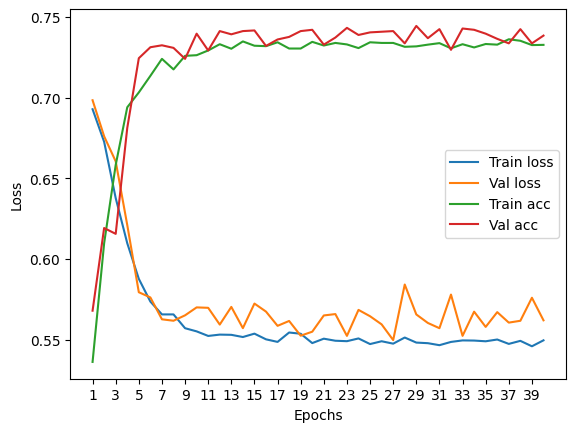

****************************************************************************************************



118it [00:00, 234.00it/s]


Train Epoch: 0 	Loss: 0.694911, Accuracy: 4014/7500 (54%)
Val Epoch: 0 	Loss: 0.698557, Accuracy: 1408/2500 (56%)



118it [00:00, 201.38it/s]


Train Epoch: 1 	Loss: 0.662423, Accuracy: 4682/7500 (62%)
Val Epoch: 1 	Loss: 0.643491, Accuracy: 1749/2500 (70%)



118it [00:00, 176.40it/s]


Train Epoch: 2 	Loss: 0.611077, Accuracy: 5229/7500 (70%)
Val Epoch: 2 	Loss: 0.592478, Accuracy: 1829/2500 (73%)



118it [00:00, 189.85it/s]


Train Epoch: 3 	Loss: 0.574628, Accuracy: 5469/7500 (73%)
Val Epoch: 3 	Loss: 0.568850, Accuracy: 1838/2500 (74%)



118it [00:00, 194.94it/s]


Train Epoch: 4 	Loss: 0.554525, Accuracy: 5481/7500 (73%)
Val Epoch: 4 	Loss: 0.555502, Accuracy: 1882/2500 (75%)



118it [00:00, 203.66it/s]


Train Epoch: 5 	Loss: 0.549870, Accuracy: 5509/7500 (73%)
Val Epoch: 5 	Loss: 0.543696, Accuracy: 1877/2500 (75%)



118it [00:00, 177.43it/s]


Train Epoch: 6 	Loss: 0.547967, Accuracy: 5510/7500 (73%)
Val Epoch: 6 	Loss: 0.557269, Accuracy: 1856/2500 (74%)



118it [00:00, 192.57it/s]


Train Epoch: 7 	Loss: 0.548632, Accuracy: 5505/7500 (73%)
Val Epoch: 7 	Loss: 0.541270, Accuracy: 1890/2500 (76%)



118it [00:00, 171.48it/s]


Train Epoch: 8 	Loss: 0.546061, Accuracy: 5526/7500 (74%)
Val Epoch: 8 	Loss: 0.542396, Accuracy: 1884/2500 (75%)



118it [00:00, 204.42it/s]


Train Epoch: 9 	Loss: 0.542608, Accuracy: 5575/7500 (74%)
Val Epoch: 9 	Loss: 0.543962, Accuracy: 1877/2500 (75%)



118it [00:00, 229.74it/s]


Train Epoch: 10 	Loss: 0.545264, Accuracy: 5546/7500 (74%)
Val Epoch: 10 	Loss: 0.546865, Accuracy: 1869/2500 (75%)



118it [00:00, 234.24it/s]


Train Epoch: 11 	Loss: 0.545843, Accuracy: 5527/7500 (74%)
Val Epoch: 11 	Loss: 0.549478, Accuracy: 1885/2500 (75%)



118it [00:00, 228.35it/s]


Train Epoch: 12 	Loss: 0.545616, Accuracy: 5545/7500 (74%)
Val Epoch: 12 	Loss: 0.547785, Accuracy: 1879/2500 (75%)



118it [00:00, 218.09it/s]


Train Epoch: 13 	Loss: 0.546059, Accuracy: 5501/7500 (73%)
Val Epoch: 13 	Loss: 0.534611, Accuracy: 1886/2500 (75%)



118it [00:00, 200.91it/s]


Train Epoch: 14 	Loss: 0.546220, Accuracy: 5551/7500 (74%)
Val Epoch: 14 	Loss: 0.539457, Accuracy: 1879/2500 (75%)



118it [00:00, 209.02it/s]


Train Epoch: 15 	Loss: 0.546904, Accuracy: 5532/7500 (74%)
Val Epoch: 15 	Loss: 0.550610, Accuracy: 1880/2500 (75%)



118it [00:00, 210.56it/s]


Train Epoch: 16 	Loss: 0.546617, Accuracy: 5550/7500 (74%)
Val Epoch: 16 	Loss: 0.550488, Accuracy: 1851/2500 (74%)



118it [00:00, 217.39it/s]


Train Epoch: 17 	Loss: 0.549961, Accuracy: 5524/7500 (74%)
Val Epoch: 17 	Loss: 0.549313, Accuracy: 1865/2500 (75%)



118it [00:00, 232.02it/s]


Train Epoch: 18 	Loss: 0.542608, Accuracy: 5564/7500 (74%)
Val Epoch: 18 	Loss: 0.559197, Accuracy: 1857/2500 (74%)



118it [00:00, 225.35it/s]


Train Epoch: 19 	Loss: 0.544209, Accuracy: 5562/7500 (74%)
Val Epoch: 19 	Loss: 0.556586, Accuracy: 1833/2500 (73%)



118it [00:00, 241.26it/s]


Train Epoch: 20 	Loss: 0.547560, Accuracy: 5521/7500 (74%)
Val Epoch: 20 	Loss: 0.551015, Accuracy: 1881/2500 (75%)



118it [00:00, 237.24it/s]


Train Epoch: 21 	Loss: 0.543246, Accuracy: 5563/7500 (74%)
Val Epoch: 21 	Loss: 0.537591, Accuracy: 1881/2500 (75%)



118it [00:00, 222.80it/s]


Train Epoch: 22 	Loss: 0.544220, Accuracy: 5562/7500 (74%)
Val Epoch: 22 	Loss: 0.542661, Accuracy: 1865/2500 (75%)



118it [00:00, 219.84it/s]


Train Epoch: 23 	Loss: 0.545002, Accuracy: 5583/7500 (74%)
Val Epoch: 23 	Loss: 0.553425, Accuracy: 1882/2500 (75%)



118it [00:00, 237.41it/s]


Train Epoch: 24 	Loss: 0.545016, Accuracy: 5576/7500 (74%)
Val Epoch: 24 	Loss: 0.543280, Accuracy: 1886/2500 (75%)



118it [00:00, 217.43it/s]


Train Epoch: 25 	Loss: 0.545885, Accuracy: 5542/7500 (74%)
Val Epoch: 25 	Loss: 0.545768, Accuracy: 1866/2500 (75%)



118it [00:00, 217.20it/s]


Train Epoch: 26 	Loss: 0.545701, Accuracy: 5557/7500 (74%)
Val Epoch: 26 	Loss: 0.551217, Accuracy: 1887/2500 (75%)



118it [00:00, 217.14it/s]


Train Epoch: 27 	Loss: 0.545488, Accuracy: 5539/7500 (74%)
Val Epoch: 27 	Loss: 0.539884, Accuracy: 1884/2500 (75%)



118it [00:00, 227.42it/s]


Train Epoch: 28 	Loss: 0.546165, Accuracy: 5560/7500 (74%)
Val Epoch: 28 	Loss: 0.556618, Accuracy: 1883/2500 (75%)



118it [00:00, 206.72it/s]


Train Epoch: 29 	Loss: 0.544307, Accuracy: 5545/7500 (74%)
Val Epoch: 29 	Loss: 0.541907, Accuracy: 1881/2500 (75%)



118it [00:00, 224.23it/s]


Train Epoch: 30 	Loss: 0.544259, Accuracy: 5555/7500 (74%)
Val Epoch: 30 	Loss: 0.545517, Accuracy: 1850/2500 (74%)



118it [00:00, 209.48it/s]


Train Epoch: 31 	Loss: 0.543590, Accuracy: 5547/7500 (74%)
Val Epoch: 31 	Loss: 0.540631, Accuracy: 1887/2500 (75%)



118it [00:00, 242.58it/s]


Train Epoch: 32 	Loss: 0.546588, Accuracy: 5541/7500 (74%)
Val Epoch: 32 	Loss: 0.539104, Accuracy: 1888/2500 (76%)



118it [00:00, 135.99it/s]


Train Epoch: 33 	Loss: 0.543916, Accuracy: 5520/7500 (74%)
Val Epoch: 33 	Loss: 0.553264, Accuracy: 1872/2500 (75%)



118it [00:00, 224.35it/s]


Train Epoch: 34 	Loss: 0.546087, Accuracy: 5554/7500 (74%)
Val Epoch: 34 	Loss: 0.544024, Accuracy: 1876/2500 (75%)



118it [00:00, 228.09it/s]


Train Epoch: 35 	Loss: 0.543552, Accuracy: 5542/7500 (74%)
Val Epoch: 35 	Loss: 0.546508, Accuracy: 1880/2500 (75%)



118it [00:00, 254.27it/s]


Train Epoch: 36 	Loss: 0.543442, Accuracy: 5548/7500 (74%)
Val Epoch: 36 	Loss: 0.558008, Accuracy: 1880/2500 (75%)



118it [00:00, 177.26it/s]


Train Epoch: 37 	Loss: 0.544793, Accuracy: 5550/7500 (74%)
Val Epoch: 37 	Loss: 0.566781, Accuracy: 1892/2500 (76%)



118it [00:00, 148.15it/s]


Train Epoch: 38 	Loss: 0.546145, Accuracy: 5532/7500 (74%)
Val Epoch: 38 	Loss: 0.542329, Accuracy: 1877/2500 (75%)



118it [00:00, 144.28it/s]


Train Epoch: 39 	Loss: 0.544203, Accuracy: 5568/7500 (74%)
Val Epoch: 39 	Loss: 0.539363, Accuracy: 1873/2500 (75%)

Test accuracy:  72.56


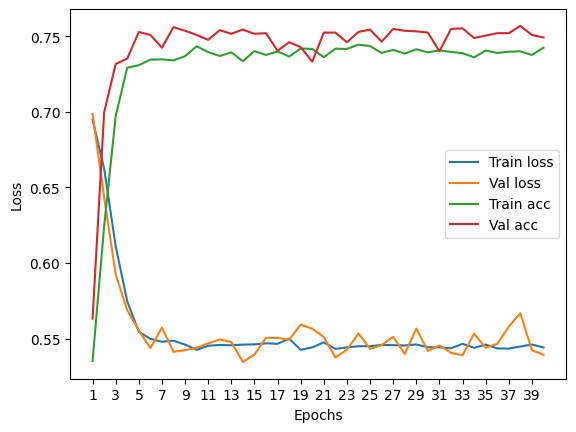

****************************************************************************************************



116it [00:00, 220.81it/s]


Train Epoch: 0 	Loss: 0.693444, Accuracy: 3851/7422 (52%)
Val Epoch: 0 	Loss: 0.693195, Accuracy: 1279/2474 (52%)



116it [00:00, 209.27it/s]


Train Epoch: 1 	Loss: 0.671379, Accuracy: 4532/7422 (61%)
Val Epoch: 1 	Loss: 0.653738, Accuracy: 1651/2474 (67%)



116it [00:00, 213.99it/s]


Train Epoch: 2 	Loss: 0.617370, Accuracy: 5157/7422 (69%)
Val Epoch: 2 	Loss: 0.603871, Accuracy: 1719/2474 (69%)



116it [00:00, 225.79it/s]


Train Epoch: 3 	Loss: 0.573993, Accuracy: 5385/7422 (73%)
Val Epoch: 3 	Loss: 0.569970, Accuracy: 1772/2474 (72%)



116it [00:00, 214.98it/s]


Train Epoch: 4 	Loss: 0.558282, Accuracy: 5451/7422 (73%)
Val Epoch: 4 	Loss: 0.561243, Accuracy: 1792/2474 (72%)



116it [00:00, 209.91it/s]


Train Epoch: 5 	Loss: 0.550304, Accuracy: 5463/7422 (74%)
Val Epoch: 5 	Loss: 0.556709, Accuracy: 1810/2474 (73%)



116it [00:00, 222.82it/s]


Train Epoch: 6 	Loss: 0.550563, Accuracy: 5463/7422 (74%)
Val Epoch: 6 	Loss: 0.556572, Accuracy: 1810/2474 (73%)



116it [00:00, 197.20it/s]


Train Epoch: 7 	Loss: 0.546300, Accuracy: 5490/7422 (74%)
Val Epoch: 7 	Loss: 0.554985, Accuracy: 1800/2474 (73%)



116it [00:00, 201.56it/s]


Train Epoch: 8 	Loss: 0.547564, Accuracy: 5469/7422 (74%)
Val Epoch: 8 	Loss: 0.555136, Accuracy: 1796/2474 (73%)



116it [00:00, 214.64it/s]


Train Epoch: 9 	Loss: 0.546909, Accuracy: 5492/7422 (74%)
Val Epoch: 9 	Loss: 0.571733, Accuracy: 1765/2474 (71%)



116it [00:00, 215.06it/s]


Train Epoch: 10 	Loss: 0.547019, Accuracy: 5451/7422 (73%)
Val Epoch: 10 	Loss: 0.553104, Accuracy: 1810/2474 (73%)



116it [00:00, 183.42it/s]


Train Epoch: 11 	Loss: 0.545732, Accuracy: 5475/7422 (74%)
Val Epoch: 11 	Loss: 0.555866, Accuracy: 1808/2474 (73%)



116it [00:00, 188.21it/s]


Train Epoch: 12 	Loss: 0.545366, Accuracy: 5480/7422 (74%)
Val Epoch: 12 	Loss: 0.563224, Accuracy: 1798/2474 (73%)



116it [00:00, 214.31it/s]


Train Epoch: 13 	Loss: 0.546885, Accuracy: 5485/7422 (74%)
Val Epoch: 13 	Loss: 0.553035, Accuracy: 1819/2474 (74%)



116it [00:00, 219.46it/s]


Train Epoch: 14 	Loss: 0.544907, Accuracy: 5498/7422 (74%)
Val Epoch: 14 	Loss: 0.554787, Accuracy: 1801/2474 (73%)



116it [00:00, 251.14it/s]


Train Epoch: 15 	Loss: 0.545801, Accuracy: 5483/7422 (74%)
Val Epoch: 15 	Loss: 0.555839, Accuracy: 1792/2474 (72%)



116it [00:00, 250.87it/s]


Train Epoch: 16 	Loss: 0.543647, Accuracy: 5491/7422 (74%)
Val Epoch: 16 	Loss: 0.561090, Accuracy: 1791/2474 (72%)



116it [00:00, 248.22it/s]


Train Epoch: 17 	Loss: 0.545615, Accuracy: 5487/7422 (74%)
Val Epoch: 17 	Loss: 0.559958, Accuracy: 1798/2474 (73%)



116it [00:00, 243.50it/s]


Train Epoch: 18 	Loss: 0.545529, Accuracy: 5497/7422 (74%)
Val Epoch: 18 	Loss: 0.557574, Accuracy: 1787/2474 (72%)



116it [00:00, 239.80it/s]


Train Epoch: 19 	Loss: 0.544553, Accuracy: 5497/7422 (74%)
Val Epoch: 19 	Loss: 0.559285, Accuracy: 1787/2474 (72%)



116it [00:00, 252.09it/s]


Train Epoch: 20 	Loss: 0.545231, Accuracy: 5469/7422 (74%)
Val Epoch: 20 	Loss: 0.556220, Accuracy: 1794/2474 (73%)



116it [00:00, 248.45it/s]


Train Epoch: 21 	Loss: 0.543248, Accuracy: 5516/7422 (74%)
Val Epoch: 21 	Loss: 0.553520, Accuracy: 1812/2474 (73%)



116it [00:00, 215.00it/s]


Train Epoch: 22 	Loss: 0.543877, Accuracy: 5482/7422 (74%)
Val Epoch: 22 	Loss: 0.554843, Accuracy: 1797/2474 (73%)



116it [00:00, 207.82it/s]


Train Epoch: 23 	Loss: 0.543962, Accuracy: 5474/7422 (74%)
Val Epoch: 23 	Loss: 0.554450, Accuracy: 1801/2474 (73%)



116it [00:00, 232.90it/s]


Train Epoch: 24 	Loss: 0.543612, Accuracy: 5490/7422 (74%)
Val Epoch: 24 	Loss: 0.553394, Accuracy: 1804/2474 (73%)



116it [00:00, 221.23it/s]


Train Epoch: 25 	Loss: 0.545089, Accuracy: 5513/7422 (74%)
Val Epoch: 25 	Loss: 0.553500, Accuracy: 1802/2474 (73%)



116it [00:00, 195.93it/s]


Train Epoch: 26 	Loss: 0.543942, Accuracy: 5482/7422 (74%)
Val Epoch: 26 	Loss: 0.560849, Accuracy: 1781/2474 (72%)



116it [00:00, 245.63it/s]


Train Epoch: 27 	Loss: 0.545101, Accuracy: 5473/7422 (74%)
Val Epoch: 27 	Loss: 0.556666, Accuracy: 1783/2474 (72%)



116it [00:00, 245.23it/s]


Train Epoch: 28 	Loss: 0.542801, Accuracy: 5513/7422 (74%)
Val Epoch: 28 	Loss: 0.554087, Accuracy: 1807/2474 (73%)



116it [00:00, 252.81it/s]


Train Epoch: 29 	Loss: 0.544208, Accuracy: 5492/7422 (74%)
Val Epoch: 29 	Loss: 0.559797, Accuracy: 1785/2474 (72%)



116it [00:00, 231.88it/s]


Train Epoch: 30 	Loss: 0.542968, Accuracy: 5465/7422 (74%)
Val Epoch: 30 	Loss: 0.568096, Accuracy: 1777/2474 (72%)



116it [00:00, 255.97it/s]


Train Epoch: 31 	Loss: 0.542839, Accuracy: 5507/7422 (74%)
Val Epoch: 31 	Loss: 0.558152, Accuracy: 1798/2474 (73%)



116it [00:00, 250.62it/s]


Train Epoch: 32 	Loss: 0.543159, Accuracy: 5487/7422 (74%)
Val Epoch: 32 	Loss: 0.554779, Accuracy: 1809/2474 (73%)



116it [00:00, 256.20it/s]


Train Epoch: 33 	Loss: 0.543184, Accuracy: 5490/7422 (74%)
Val Epoch: 33 	Loss: 0.553982, Accuracy: 1801/2474 (73%)



116it [00:00, 239.79it/s]


Train Epoch: 34 	Loss: 0.542371, Accuracy: 5484/7422 (74%)
Val Epoch: 34 	Loss: 0.557674, Accuracy: 1791/2474 (72%)



116it [00:00, 213.57it/s]


Train Epoch: 35 	Loss: 0.543448, Accuracy: 5483/7422 (74%)
Val Epoch: 35 	Loss: 0.561897, Accuracy: 1793/2474 (72%)



116it [00:00, 188.35it/s]


Train Epoch: 36 	Loss: 0.542756, Accuracy: 5496/7422 (74%)
Val Epoch: 36 	Loss: 0.554842, Accuracy: 1803/2474 (73%)



116it [00:00, 220.57it/s]


Train Epoch: 37 	Loss: 0.542771, Accuracy: 5499/7422 (74%)
Val Epoch: 37 	Loss: 0.557236, Accuracy: 1783/2474 (72%)



116it [00:00, 210.87it/s]


Train Epoch: 38 	Loss: 0.542131, Accuracy: 5490/7422 (74%)
Val Epoch: 38 	Loss: 0.554532, Accuracy: 1809/2474 (73%)



116it [00:00, 226.67it/s]


Train Epoch: 39 	Loss: 0.541372, Accuracy: 5481/7422 (74%)
Val Epoch: 39 	Loss: 0.554832, Accuracy: 1804/2474 (73%)

Test accuracy:  75.22231204527081


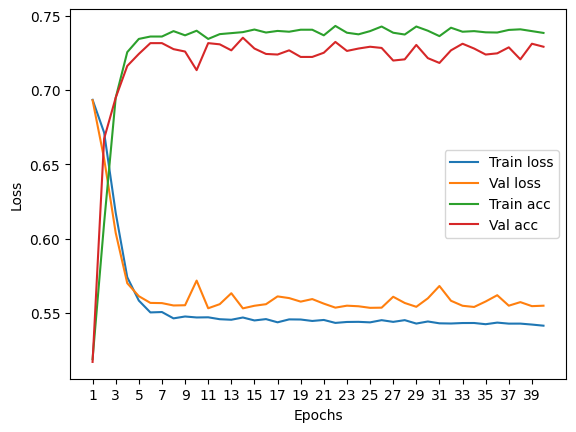

****************************************************************************************************



Particles per jet: 8


118it [00:00, 132.97it/s]


Train Epoch: 0 	Loss: 0.693866, Accuracy: 4038/7500 (54%)
Val Epoch: 0 	Loss: 0.695572, Accuracy: 1445/2500 (58%)



118it [00:00, 166.65it/s]


Train Epoch: 1 	Loss: 0.663473, Accuracy: 4630/7500 (62%)
Val Epoch: 1 	Loss: 0.640988, Accuracy: 1652/2500 (66%)



118it [00:00, 166.60it/s]


Train Epoch: 2 	Loss: 0.603958, Accuracy: 5324/7500 (71%)
Val Epoch: 2 	Loss: 0.593994, Accuracy: 1805/2500 (72%)



118it [00:00, 154.17it/s]


Train Epoch: 3 	Loss: 0.567038, Accuracy: 5496/7500 (73%)
Val Epoch: 3 	Loss: 0.558242, Accuracy: 1864/2500 (75%)



118it [00:00, 164.78it/s]


Train Epoch: 4 	Loss: 0.549293, Accuracy: 5512/7500 (73%)
Val Epoch: 4 	Loss: 0.545769, Accuracy: 1866/2500 (75%)



118it [00:01, 96.10it/s] 


Train Epoch: 5 	Loss: 0.548999, Accuracy: 5498/7500 (73%)
Val Epoch: 5 	Loss: 0.542499, Accuracy: 1861/2500 (74%)



118it [00:00, 125.87it/s]


Train Epoch: 6 	Loss: 0.542527, Accuracy: 5526/7500 (74%)
Val Epoch: 6 	Loss: 0.563279, Accuracy: 1822/2500 (73%)



118it [00:01, 104.29it/s]


Train Epoch: 7 	Loss: 0.544718, Accuracy: 5507/7500 (73%)
Val Epoch: 7 	Loss: 0.544578, Accuracy: 1861/2500 (74%)



118it [00:01, 87.98it/s]


Train Epoch: 8 	Loss: 0.544116, Accuracy: 5516/7500 (74%)
Val Epoch: 8 	Loss: 0.539717, Accuracy: 1850/2500 (74%)



118it [00:01, 106.85it/s]


Train Epoch: 9 	Loss: 0.540377, Accuracy: 5532/7500 (74%)
Val Epoch: 9 	Loss: 0.540237, Accuracy: 1845/2500 (74%)



118it [00:01, 100.64it/s]


Train Epoch: 10 	Loss: 0.537215, Accuracy: 5521/7500 (74%)
Val Epoch: 10 	Loss: 0.539952, Accuracy: 1876/2500 (75%)



118it [00:00, 120.10it/s]


Train Epoch: 11 	Loss: 0.539828, Accuracy: 5528/7500 (74%)
Val Epoch: 11 	Loss: 0.533741, Accuracy: 1871/2500 (75%)



118it [00:00, 146.12it/s]


Train Epoch: 12 	Loss: 0.541858, Accuracy: 5539/7500 (74%)
Val Epoch: 12 	Loss: 0.553471, Accuracy: 1855/2500 (74%)



118it [00:00, 161.00it/s]


Train Epoch: 13 	Loss: 0.539955, Accuracy: 5560/7500 (74%)
Val Epoch: 13 	Loss: 0.547678, Accuracy: 1853/2500 (74%)



118it [00:00, 131.81it/s]


Train Epoch: 14 	Loss: 0.542507, Accuracy: 5515/7500 (74%)
Val Epoch: 14 	Loss: 0.538572, Accuracy: 1877/2500 (75%)



118it [00:01, 117.35it/s]


Train Epoch: 15 	Loss: 0.539631, Accuracy: 5562/7500 (74%)
Val Epoch: 15 	Loss: 0.526028, Accuracy: 1879/2500 (75%)



118it [00:00, 124.11it/s]


Train Epoch: 16 	Loss: 0.543057, Accuracy: 5551/7500 (74%)
Val Epoch: 16 	Loss: 0.539442, Accuracy: 1879/2500 (75%)



118it [00:01, 105.44it/s]


Train Epoch: 17 	Loss: 0.539875, Accuracy: 5538/7500 (74%)
Val Epoch: 17 	Loss: 0.534263, Accuracy: 1874/2500 (75%)



118it [00:00, 127.33it/s]


Train Epoch: 18 	Loss: 0.539262, Accuracy: 5535/7500 (74%)
Val Epoch: 18 	Loss: 0.551834, Accuracy: 1871/2500 (75%)



118it [00:00, 156.20it/s]


Train Epoch: 19 	Loss: 0.538173, Accuracy: 5548/7500 (74%)
Val Epoch: 19 	Loss: 0.542463, Accuracy: 1887/2500 (75%)



118it [00:00, 150.23it/s]


Train Epoch: 20 	Loss: 0.541884, Accuracy: 5557/7500 (74%)
Val Epoch: 20 	Loss: 0.542645, Accuracy: 1881/2500 (75%)



118it [00:00, 143.86it/s]


Train Epoch: 21 	Loss: 0.541445, Accuracy: 5556/7500 (74%)
Val Epoch: 21 	Loss: 0.533910, Accuracy: 1874/2500 (75%)



118it [00:00, 157.01it/s]


Train Epoch: 22 	Loss: 0.539976, Accuracy: 5546/7500 (74%)
Val Epoch: 22 	Loss: 0.529767, Accuracy: 1882/2500 (75%)



118it [00:00, 143.23it/s]


Train Epoch: 23 	Loss: 0.538196, Accuracy: 5555/7500 (74%)
Val Epoch: 23 	Loss: 0.540513, Accuracy: 1881/2500 (75%)



118it [00:00, 147.70it/s]


Train Epoch: 24 	Loss: 0.537148, Accuracy: 5556/7500 (74%)
Val Epoch: 24 	Loss: 0.532519, Accuracy: 1869/2500 (75%)



118it [00:01, 112.88it/s]


Train Epoch: 25 	Loss: 0.536417, Accuracy: 5558/7500 (74%)
Val Epoch: 25 	Loss: 0.550389, Accuracy: 1870/2500 (75%)



118it [00:00, 159.50it/s]


Train Epoch: 26 	Loss: 0.539700, Accuracy: 5559/7500 (74%)
Val Epoch: 26 	Loss: 0.531278, Accuracy: 1875/2500 (75%)



118it [00:00, 164.76it/s]


Train Epoch: 27 	Loss: 0.538061, Accuracy: 5586/7500 (74%)
Val Epoch: 27 	Loss: 0.534142, Accuracy: 1881/2500 (75%)



118it [00:00, 161.49it/s]


Train Epoch: 28 	Loss: 0.540776, Accuracy: 5534/7500 (74%)
Val Epoch: 28 	Loss: 0.545907, Accuracy: 1861/2500 (74%)



118it [00:00, 183.80it/s]


Train Epoch: 29 	Loss: 0.542204, Accuracy: 5565/7500 (74%)
Val Epoch: 29 	Loss: 0.532858, Accuracy: 1866/2500 (75%)



118it [00:00, 165.59it/s]


Train Epoch: 30 	Loss: 0.537277, Accuracy: 5573/7500 (74%)
Val Epoch: 30 	Loss: 0.537495, Accuracy: 1875/2500 (75%)



118it [00:00, 153.71it/s]


Train Epoch: 31 	Loss: 0.539509, Accuracy: 5546/7500 (74%)
Val Epoch: 31 	Loss: 0.534327, Accuracy: 1881/2500 (75%)



118it [00:00, 156.50it/s]


Train Epoch: 32 	Loss: 0.539674, Accuracy: 5572/7500 (74%)
Val Epoch: 32 	Loss: 0.528954, Accuracy: 1871/2500 (75%)



118it [00:00, 160.75it/s]


Train Epoch: 33 	Loss: 0.537677, Accuracy: 5558/7500 (74%)
Val Epoch: 33 	Loss: 0.542321, Accuracy: 1881/2500 (75%)



118it [00:00, 167.64it/s]


Train Epoch: 34 	Loss: 0.537114, Accuracy: 5557/7500 (74%)
Val Epoch: 34 	Loss: 0.531268, Accuracy: 1864/2500 (75%)



118it [00:00, 145.25it/s]


Train Epoch: 35 	Loss: 0.537536, Accuracy: 5555/7500 (74%)
Val Epoch: 35 	Loss: 0.545483, Accuracy: 1846/2500 (74%)



118it [00:00, 172.68it/s]


Train Epoch: 36 	Loss: 0.541130, Accuracy: 5533/7500 (74%)
Val Epoch: 36 	Loss: 0.535592, Accuracy: 1880/2500 (75%)



118it [00:00, 160.22it/s]


Train Epoch: 37 	Loss: 0.538197, Accuracy: 5557/7500 (74%)
Val Epoch: 37 	Loss: 0.536878, Accuracy: 1872/2500 (75%)



118it [00:00, 136.37it/s]


Train Epoch: 38 	Loss: 0.536413, Accuracy: 5569/7500 (74%)
Val Epoch: 38 	Loss: 0.537273, Accuracy: 1879/2500 (75%)



118it [00:01, 106.17it/s]


Train Epoch: 39 	Loss: 0.537854, Accuracy: 5549/7500 (74%)
Val Epoch: 39 	Loss: 0.532764, Accuracy: 1880/2500 (75%)

Test accuracy:  74.44


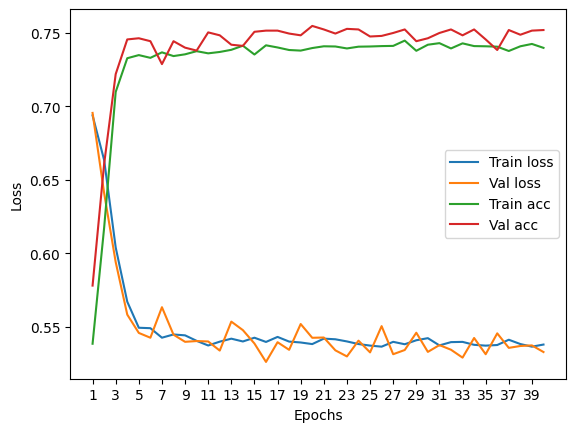

****************************************************************************************************



118it [00:01, 102.99it/s]


Train Epoch: 0 	Loss: 0.695322, Accuracy: 3965/7500 (53%)
Val Epoch: 0 	Loss: 0.703811, Accuracy: 1356/2500 (54%)



118it [00:01, 114.66it/s]


Train Epoch: 1 	Loss: 0.677021, Accuracy: 4532/7500 (60%)
Val Epoch: 1 	Loss: 0.677677, Accuracy: 1567/2500 (63%)



118it [00:00, 141.21it/s]


Train Epoch: 2 	Loss: 0.641813, Accuracy: 4962/7500 (66%)
Val Epoch: 2 	Loss: 0.628902, Accuracy: 1692/2500 (68%)



118it [00:00, 144.81it/s]


Train Epoch: 3 	Loss: 0.599816, Accuracy: 5310/7500 (71%)
Val Epoch: 3 	Loss: 0.587394, Accuracy: 1820/2500 (73%)



118it [00:01, 105.74it/s]


Train Epoch: 4 	Loss: 0.566927, Accuracy: 5516/7500 (74%)
Val Epoch: 4 	Loss: 0.577065, Accuracy: 1828/2500 (73%)



118it [00:00, 122.35it/s]


Train Epoch: 5 	Loss: 0.556876, Accuracy: 5518/7500 (74%)
Val Epoch: 5 	Loss: 0.561548, Accuracy: 1831/2500 (73%)



118it [00:00, 127.63it/s]


Train Epoch: 6 	Loss: 0.554426, Accuracy: 5513/7500 (74%)
Val Epoch: 6 	Loss: 0.569470, Accuracy: 1833/2500 (73%)



118it [00:00, 128.84it/s]


Train Epoch: 7 	Loss: 0.552000, Accuracy: 5517/7500 (74%)
Val Epoch: 7 	Loss: 0.552681, Accuracy: 1847/2500 (74%)



118it [00:01, 114.30it/s]


Train Epoch: 8 	Loss: 0.553109, Accuracy: 5546/7500 (74%)
Val Epoch: 8 	Loss: 0.551740, Accuracy: 1840/2500 (74%)



118it [00:00, 147.23it/s]


Train Epoch: 9 	Loss: 0.548912, Accuracy: 5556/7500 (74%)
Val Epoch: 9 	Loss: 0.559839, Accuracy: 1827/2500 (73%)



118it [00:01, 109.26it/s]


Train Epoch: 10 	Loss: 0.549392, Accuracy: 5529/7500 (74%)
Val Epoch: 10 	Loss: 0.553597, Accuracy: 1844/2500 (74%)



118it [00:00, 151.74it/s]


Train Epoch: 11 	Loss: 0.551665, Accuracy: 5563/7500 (74%)
Val Epoch: 11 	Loss: 0.560746, Accuracy: 1846/2500 (74%)



118it [00:00, 150.70it/s]


Train Epoch: 12 	Loss: 0.552423, Accuracy: 5562/7500 (74%)
Val Epoch: 12 	Loss: 0.558174, Accuracy: 1844/2500 (74%)



118it [00:00, 139.83it/s]


Train Epoch: 13 	Loss: 0.549075, Accuracy: 5537/7500 (74%)
Val Epoch: 13 	Loss: 0.571347, Accuracy: 1831/2500 (73%)



118it [00:01, 92.64it/s] 


Train Epoch: 14 	Loss: 0.546434, Accuracy: 5554/7500 (74%)
Val Epoch: 14 	Loss: 0.592648, Accuracy: 1800/2500 (72%)



118it [00:01, 104.64it/s]


Train Epoch: 15 	Loss: 0.550426, Accuracy: 5542/7500 (74%)
Val Epoch: 15 	Loss: 0.578354, Accuracy: 1836/2500 (73%)



118it [00:01, 79.09it/s]


Train Epoch: 16 	Loss: 0.551385, Accuracy: 5569/7500 (74%)
Val Epoch: 16 	Loss: 0.559796, Accuracy: 1820/2500 (73%)



118it [00:01, 117.90it/s]


Train Epoch: 17 	Loss: 0.547618, Accuracy: 5568/7500 (74%)
Val Epoch: 17 	Loss: 0.556198, Accuracy: 1836/2500 (73%)



118it [00:00, 130.71it/s]


Train Epoch: 18 	Loss: 0.548647, Accuracy: 5550/7500 (74%)
Val Epoch: 18 	Loss: 0.558873, Accuracy: 1848/2500 (74%)



118it [00:01, 113.32it/s]


Train Epoch: 19 	Loss: 0.548274, Accuracy: 5563/7500 (74%)
Val Epoch: 19 	Loss: 0.562173, Accuracy: 1827/2500 (73%)



118it [00:00, 124.33it/s]


Train Epoch: 20 	Loss: 0.547412, Accuracy: 5560/7500 (74%)
Val Epoch: 20 	Loss: 0.557071, Accuracy: 1843/2500 (74%)



118it [00:01, 114.09it/s]


Train Epoch: 21 	Loss: 0.548494, Accuracy: 5546/7500 (74%)
Val Epoch: 21 	Loss: 0.556191, Accuracy: 1831/2500 (73%)



118it [00:00, 149.68it/s]


Train Epoch: 22 	Loss: 0.550284, Accuracy: 5526/7500 (74%)
Val Epoch: 22 	Loss: 0.560773, Accuracy: 1828/2500 (73%)



118it [00:00, 168.44it/s]


Train Epoch: 23 	Loss: 0.549127, Accuracy: 5567/7500 (74%)
Val Epoch: 23 	Loss: 0.566494, Accuracy: 1848/2500 (74%)



118it [00:00, 173.67it/s]


Train Epoch: 24 	Loss: 0.548030, Accuracy: 5555/7500 (74%)
Val Epoch: 24 	Loss: 0.558899, Accuracy: 1824/2500 (73%)



118it [00:00, 171.31it/s]


Train Epoch: 25 	Loss: 0.547008, Accuracy: 5570/7500 (74%)
Val Epoch: 25 	Loss: 0.573510, Accuracy: 1834/2500 (73%)



118it [00:00, 124.21it/s]


Train Epoch: 26 	Loss: 0.546443, Accuracy: 5589/7500 (75%)
Val Epoch: 26 	Loss: 0.562990, Accuracy: 1830/2500 (73%)



118it [00:00, 125.96it/s]


Train Epoch: 27 	Loss: 0.550153, Accuracy: 5555/7500 (74%)
Val Epoch: 27 	Loss: 0.554540, Accuracy: 1841/2500 (74%)



118it [00:01, 111.43it/s]


Train Epoch: 28 	Loss: 0.548282, Accuracy: 5562/7500 (74%)
Val Epoch: 28 	Loss: 0.562923, Accuracy: 1843/2500 (74%)



118it [00:00, 135.70it/s]


Train Epoch: 29 	Loss: 0.548088, Accuracy: 5553/7500 (74%)
Val Epoch: 29 	Loss: 0.559482, Accuracy: 1843/2500 (74%)



118it [00:00, 146.08it/s]


Train Epoch: 30 	Loss: 0.548191, Accuracy: 5546/7500 (74%)
Val Epoch: 30 	Loss: 0.555543, Accuracy: 1845/2500 (74%)



118it [00:00, 167.50it/s]


Train Epoch: 31 	Loss: 0.546316, Accuracy: 5563/7500 (74%)
Val Epoch: 31 	Loss: 0.560526, Accuracy: 1842/2500 (74%)



118it [00:00, 161.84it/s]


Train Epoch: 32 	Loss: 0.551768, Accuracy: 5542/7500 (74%)
Val Epoch: 32 	Loss: 0.560541, Accuracy: 1838/2500 (74%)



118it [00:00, 151.43it/s]


Train Epoch: 33 	Loss: 0.549432, Accuracy: 5555/7500 (74%)
Val Epoch: 33 	Loss: 0.557832, Accuracy: 1834/2500 (73%)



118it [00:00, 150.89it/s]


Train Epoch: 34 	Loss: 0.546961, Accuracy: 5565/7500 (74%)
Val Epoch: 34 	Loss: 0.552986, Accuracy: 1843/2500 (74%)



118it [00:00, 146.91it/s]


Train Epoch: 35 	Loss: 0.548677, Accuracy: 5556/7500 (74%)
Val Epoch: 35 	Loss: 0.556046, Accuracy: 1837/2500 (73%)



118it [00:00, 137.50it/s]


Train Epoch: 36 	Loss: 0.550070, Accuracy: 5555/7500 (74%)
Val Epoch: 36 	Loss: 0.559858, Accuracy: 1842/2500 (74%)



118it [00:01, 111.29it/s]


Train Epoch: 37 	Loss: 0.549004, Accuracy: 5560/7500 (74%)
Val Epoch: 37 	Loss: 0.563525, Accuracy: 1844/2500 (74%)



118it [00:01, 110.09it/s]


Train Epoch: 38 	Loss: 0.546621, Accuracy: 5576/7500 (74%)
Val Epoch: 38 	Loss: 0.568924, Accuracy: 1845/2500 (74%)



118it [00:00, 144.06it/s]


Train Epoch: 39 	Loss: 0.548350, Accuracy: 5542/7500 (74%)
Val Epoch: 39 	Loss: 0.562361, Accuracy: 1843/2500 (74%)

Test accuracy:  72.84


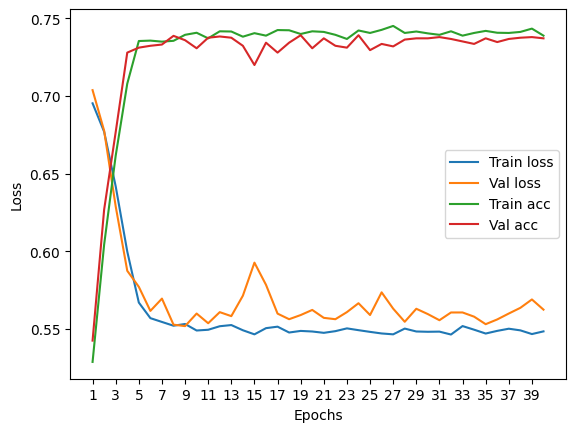

****************************************************************************************************



118it [00:00, 157.81it/s]


Train Epoch: 0 	Loss: 0.693974, Accuracy: 3998/7500 (53%)
Val Epoch: 0 	Loss: 0.696259, Accuracy: 1487/2500 (59%)



118it [00:00, 174.09it/s]


Train Epoch: 1 	Loss: 0.669568, Accuracy: 4609/7500 (61%)
Val Epoch: 1 	Loss: 0.663212, Accuracy: 1521/2500 (61%)



118it [00:00, 160.05it/s]


Train Epoch: 2 	Loss: 0.624517, Accuracy: 5162/7500 (69%)
Val Epoch: 2 	Loss: 0.601963, Accuracy: 1831/2500 (73%)



118it [00:00, 145.72it/s]


Train Epoch: 3 	Loss: 0.577214, Accuracy: 5444/7500 (73%)
Val Epoch: 3 	Loss: 0.566033, Accuracy: 1837/2500 (73%)



118it [00:00, 121.56it/s]


Train Epoch: 4 	Loss: 0.555628, Accuracy: 5548/7500 (74%)
Val Epoch: 4 	Loss: 0.546891, Accuracy: 1879/2500 (75%)



118it [00:00, 135.48it/s]


Train Epoch: 5 	Loss: 0.545125, Accuracy: 5555/7500 (74%)
Val Epoch: 5 	Loss: 0.548581, Accuracy: 1855/2500 (74%)



118it [00:01, 111.75it/s]


Train Epoch: 6 	Loss: 0.542938, Accuracy: 5572/7500 (74%)
Val Epoch: 6 	Loss: 0.531542, Accuracy: 1888/2500 (76%)



118it [00:01, 105.63it/s]


Train Epoch: 7 	Loss: 0.540401, Accuracy: 5556/7500 (74%)
Val Epoch: 7 	Loss: 0.537703, Accuracy: 1859/2500 (74%)



118it [00:00, 119.00it/s]


Train Epoch: 8 	Loss: 0.540301, Accuracy: 5571/7500 (74%)
Val Epoch: 8 	Loss: 0.535573, Accuracy: 1878/2500 (75%)



118it [00:00, 138.01it/s]


Train Epoch: 9 	Loss: 0.538742, Accuracy: 5564/7500 (74%)
Val Epoch: 9 	Loss: 0.546622, Accuracy: 1843/2500 (74%)



118it [00:00, 150.69it/s]


Train Epoch: 10 	Loss: 0.540534, Accuracy: 5549/7500 (74%)
Val Epoch: 10 	Loss: 0.540158, Accuracy: 1887/2500 (75%)



118it [00:00, 146.47it/s]


Train Epoch: 11 	Loss: 0.540868, Accuracy: 5563/7500 (74%)
Val Epoch: 11 	Loss: 0.538702, Accuracy: 1889/2500 (76%)



118it [00:00, 149.08it/s]


Train Epoch: 12 	Loss: 0.539739, Accuracy: 5586/7500 (74%)
Val Epoch: 12 	Loss: 0.541400, Accuracy: 1874/2500 (75%)



118it [00:00, 136.25it/s]


Train Epoch: 13 	Loss: 0.539205, Accuracy: 5582/7500 (74%)
Val Epoch: 13 	Loss: 0.530205, Accuracy: 1888/2500 (76%)



118it [00:00, 169.39it/s]


Train Epoch: 14 	Loss: 0.540507, Accuracy: 5564/7500 (74%)
Val Epoch: 14 	Loss: 0.532969, Accuracy: 1885/2500 (75%)



118it [00:00, 166.34it/s]


Train Epoch: 15 	Loss: 0.538594, Accuracy: 5574/7500 (74%)
Val Epoch: 15 	Loss: 0.548122, Accuracy: 1875/2500 (75%)



118it [00:00, 131.42it/s]


Train Epoch: 16 	Loss: 0.538143, Accuracy: 5583/7500 (74%)
Val Epoch: 16 	Loss: 0.530386, Accuracy: 1892/2500 (76%)



118it [00:00, 148.06it/s]


Train Epoch: 17 	Loss: 0.539629, Accuracy: 5590/7500 (75%)
Val Epoch: 17 	Loss: 0.546470, Accuracy: 1885/2500 (75%)



118it [00:00, 172.93it/s]


Train Epoch: 18 	Loss: 0.538762, Accuracy: 5575/7500 (74%)
Val Epoch: 18 	Loss: 0.529238, Accuracy: 1892/2500 (76%)



118it [00:00, 163.74it/s]


Train Epoch: 19 	Loss: 0.539872, Accuracy: 5608/7500 (75%)
Val Epoch: 19 	Loss: 0.539793, Accuracy: 1890/2500 (76%)



118it [00:00, 169.31it/s]


Train Epoch: 20 	Loss: 0.540347, Accuracy: 5569/7500 (74%)
Val Epoch: 20 	Loss: 0.548720, Accuracy: 1887/2500 (75%)



118it [00:00, 156.59it/s]


Train Epoch: 21 	Loss: 0.539390, Accuracy: 5588/7500 (75%)
Val Epoch: 21 	Loss: 0.536025, Accuracy: 1896/2500 (76%)



118it [00:00, 162.96it/s]


Train Epoch: 22 	Loss: 0.536413, Accuracy: 5588/7500 (75%)
Val Epoch: 22 	Loss: 0.536041, Accuracy: 1893/2500 (76%)



118it [00:00, 183.60it/s]


Train Epoch: 23 	Loss: 0.538911, Accuracy: 5585/7500 (74%)
Val Epoch: 23 	Loss: 0.539163, Accuracy: 1885/2500 (75%)



118it [00:00, 165.38it/s]


Train Epoch: 24 	Loss: 0.541607, Accuracy: 5581/7500 (74%)
Val Epoch: 24 	Loss: 0.542454, Accuracy: 1867/2500 (75%)



118it [00:00, 170.45it/s]


Train Epoch: 25 	Loss: 0.538786, Accuracy: 5581/7500 (74%)
Val Epoch: 25 	Loss: 0.532853, Accuracy: 1890/2500 (76%)



118it [00:00, 145.67it/s]


Train Epoch: 26 	Loss: 0.537904, Accuracy: 5583/7500 (74%)
Val Epoch: 26 	Loss: 0.529346, Accuracy: 1884/2500 (75%)



118it [00:00, 161.59it/s]


Train Epoch: 27 	Loss: 0.537236, Accuracy: 5593/7500 (75%)
Val Epoch: 27 	Loss: 0.530837, Accuracy: 1885/2500 (75%)



118it [00:00, 174.17it/s]


Train Epoch: 28 	Loss: 0.538097, Accuracy: 5583/7500 (74%)
Val Epoch: 28 	Loss: 0.541538, Accuracy: 1887/2500 (75%)



118it [00:00, 169.52it/s]


Train Epoch: 29 	Loss: 0.537825, Accuracy: 5595/7500 (75%)
Val Epoch: 29 	Loss: 0.532591, Accuracy: 1885/2500 (75%)



118it [00:00, 159.70it/s]


Train Epoch: 30 	Loss: 0.539184, Accuracy: 5586/7500 (74%)
Val Epoch: 30 	Loss: 0.550119, Accuracy: 1902/2500 (76%)



118it [00:00, 141.81it/s]


Train Epoch: 31 	Loss: 0.540291, Accuracy: 5584/7500 (74%)
Val Epoch: 31 	Loss: 0.540757, Accuracy: 1882/2500 (75%)



118it [00:01, 112.33it/s]


Train Epoch: 32 	Loss: 0.537569, Accuracy: 5602/7500 (75%)
Val Epoch: 32 	Loss: 0.532639, Accuracy: 1889/2500 (76%)



118it [00:00, 145.15it/s]


Train Epoch: 33 	Loss: 0.539118, Accuracy: 5573/7500 (74%)
Val Epoch: 33 	Loss: 0.540615, Accuracy: 1868/2500 (75%)



118it [00:01, 116.64it/s]


Train Epoch: 34 	Loss: 0.536760, Accuracy: 5614/7500 (75%)
Val Epoch: 34 	Loss: 0.541584, Accuracy: 1862/2500 (74%)



118it [00:01, 111.05it/s]


Train Epoch: 35 	Loss: 0.537861, Accuracy: 5607/7500 (75%)
Val Epoch: 35 	Loss: 0.538306, Accuracy: 1883/2500 (75%)



118it [00:00, 118.27it/s]


Train Epoch: 36 	Loss: 0.538074, Accuracy: 5599/7500 (75%)
Val Epoch: 36 	Loss: 0.557038, Accuracy: 1872/2500 (75%)



118it [00:00, 147.47it/s]


Train Epoch: 37 	Loss: 0.539584, Accuracy: 5609/7500 (75%)
Val Epoch: 37 	Loss: 0.539468, Accuracy: 1892/2500 (76%)



118it [00:00, 154.32it/s]


Train Epoch: 38 	Loss: 0.537713, Accuracy: 5596/7500 (75%)
Val Epoch: 38 	Loss: 0.549040, Accuracy: 1858/2500 (74%)



118it [00:00, 157.65it/s]


Train Epoch: 39 	Loss: 0.538243, Accuracy: 5563/7500 (74%)
Val Epoch: 39 	Loss: 0.533422, Accuracy: 1902/2500 (76%)

Test accuracy:  74.92


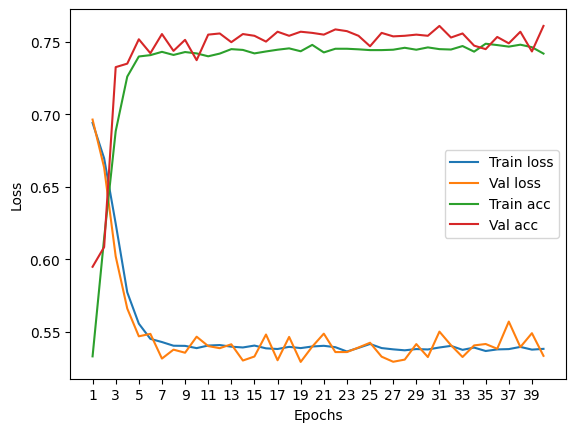

****************************************************************************************************



118it [00:00, 171.95it/s]


Train Epoch: 0 	Loss: 0.691489, Accuracy: 4087/7500 (54%)
Val Epoch: 0 	Loss: 0.701593, Accuracy: 1331/2500 (53%)



118it [00:00, 137.51it/s]


Train Epoch: 1 	Loss: 0.677452, Accuracy: 4358/7500 (58%)
Val Epoch: 1 	Loss: 0.676380, Accuracy: 1506/2500 (60%)



118it [00:00, 130.91it/s]


Train Epoch: 2 	Loss: 0.659606, Accuracy: 4696/7500 (63%)
Val Epoch: 2 	Loss: 0.654600, Accuracy: 1628/2500 (65%)



118it [00:00, 121.14it/s]


Train Epoch: 3 	Loss: 0.638707, Accuracy: 4951/7500 (66%)
Val Epoch: 3 	Loss: 0.638805, Accuracy: 1672/2500 (67%)



118it [00:00, 160.80it/s]


Train Epoch: 4 	Loss: 0.613897, Accuracy: 5185/7500 (69%)
Val Epoch: 4 	Loss: 0.606159, Accuracy: 1748/2500 (70%)



118it [00:00, 180.41it/s]


Train Epoch: 5 	Loss: 0.596013, Accuracy: 5256/7500 (70%)
Val Epoch: 5 	Loss: 0.602282, Accuracy: 1765/2500 (71%)



118it [00:00, 143.57it/s]


Train Epoch: 6 	Loss: 0.582289, Accuracy: 5392/7500 (72%)
Val Epoch: 6 	Loss: 0.611421, Accuracy: 1695/2500 (68%)



118it [00:00, 153.66it/s]


Train Epoch: 7 	Loss: 0.574429, Accuracy: 5362/7500 (71%)
Val Epoch: 7 	Loss: 0.583690, Accuracy: 1783/2500 (71%)



118it [00:00, 142.08it/s]


Train Epoch: 8 	Loss: 0.574425, Accuracy: 5328/7500 (71%)
Val Epoch: 8 	Loss: 0.590237, Accuracy: 1773/2500 (71%)



118it [00:01, 116.50it/s]


Train Epoch: 9 	Loss: 0.567158, Accuracy: 5381/7500 (72%)
Val Epoch: 9 	Loss: 0.586876, Accuracy: 1767/2500 (71%)



118it [00:00, 147.32it/s]


Train Epoch: 10 	Loss: 0.566401, Accuracy: 5385/7500 (72%)
Val Epoch: 10 	Loss: 0.569188, Accuracy: 1783/2500 (71%)



118it [00:00, 170.48it/s]


Train Epoch: 11 	Loss: 0.562588, Accuracy: 5402/7500 (72%)
Val Epoch: 11 	Loss: 0.597240, Accuracy: 1752/2500 (70%)



118it [00:00, 164.78it/s]


Train Epoch: 12 	Loss: 0.564843, Accuracy: 5378/7500 (72%)
Val Epoch: 12 	Loss: 0.584788, Accuracy: 1766/2500 (71%)



118it [00:00, 157.44it/s]


Train Epoch: 13 	Loss: 0.561733, Accuracy: 5392/7500 (72%)
Val Epoch: 13 	Loss: 0.578781, Accuracy: 1795/2500 (72%)



118it [00:00, 154.13it/s]


Train Epoch: 14 	Loss: 0.562036, Accuracy: 5387/7500 (72%)
Val Epoch: 14 	Loss: 0.576834, Accuracy: 1769/2500 (71%)



118it [00:00, 157.71it/s]


Train Epoch: 15 	Loss: 0.562771, Accuracy: 5392/7500 (72%)
Val Epoch: 15 	Loss: 0.570031, Accuracy: 1784/2500 (71%)



118it [00:00, 167.69it/s]


Train Epoch: 16 	Loss: 0.563259, Accuracy: 5398/7500 (72%)
Val Epoch: 16 	Loss: 0.577902, Accuracy: 1775/2500 (71%)



118it [00:00, 171.14it/s]


Train Epoch: 17 	Loss: 0.560801, Accuracy: 5376/7500 (72%)
Val Epoch: 17 	Loss: 0.575753, Accuracy: 1779/2500 (71%)



118it [00:00, 139.02it/s]


Train Epoch: 18 	Loss: 0.565719, Accuracy: 5377/7500 (72%)
Val Epoch: 18 	Loss: 0.573089, Accuracy: 1779/2500 (71%)



118it [00:00, 133.17it/s]


Train Epoch: 19 	Loss: 0.559963, Accuracy: 5406/7500 (72%)
Val Epoch: 19 	Loss: 0.579085, Accuracy: 1786/2500 (71%)



118it [00:00, 146.53it/s]


Train Epoch: 20 	Loss: 0.559787, Accuracy: 5418/7500 (72%)
Val Epoch: 20 	Loss: 0.575830, Accuracy: 1776/2500 (71%)



118it [00:00, 155.69it/s]


Train Epoch: 21 	Loss: 0.559400, Accuracy: 5392/7500 (72%)
Val Epoch: 21 	Loss: 0.568371, Accuracy: 1799/2500 (72%)



118it [00:00, 165.00it/s]


Train Epoch: 22 	Loss: 0.563230, Accuracy: 5406/7500 (72%)
Val Epoch: 22 	Loss: 0.573803, Accuracy: 1807/2500 (72%)



118it [00:00, 161.61it/s]


Train Epoch: 23 	Loss: 0.557371, Accuracy: 5430/7500 (72%)
Val Epoch: 23 	Loss: 0.574871, Accuracy: 1803/2500 (72%)



118it [00:00, 155.23it/s]


Train Epoch: 24 	Loss: 0.560548, Accuracy: 5398/7500 (72%)
Val Epoch: 24 	Loss: 0.581468, Accuracy: 1768/2500 (71%)



118it [00:00, 149.96it/s]


Train Epoch: 25 	Loss: 0.556117, Accuracy: 5446/7500 (73%)
Val Epoch: 25 	Loss: 0.567949, Accuracy: 1798/2500 (72%)



118it [00:00, 139.24it/s]


Train Epoch: 26 	Loss: 0.559232, Accuracy: 5426/7500 (72%)
Val Epoch: 26 	Loss: 0.562765, Accuracy: 1791/2500 (72%)



118it [00:00, 140.19it/s]


Train Epoch: 27 	Loss: 0.554550, Accuracy: 5447/7500 (73%)
Val Epoch: 27 	Loss: 0.573428, Accuracy: 1820/2500 (73%)



118it [00:00, 153.54it/s]


Train Epoch: 28 	Loss: 0.555321, Accuracy: 5462/7500 (73%)
Val Epoch: 28 	Loss: 0.617507, Accuracy: 1778/2500 (71%)



118it [00:00, 121.33it/s]


Train Epoch: 29 	Loss: 0.555105, Accuracy: 5451/7500 (73%)
Val Epoch: 29 	Loss: 0.569064, Accuracy: 1820/2500 (73%)



118it [00:00, 149.69it/s]


Train Epoch: 30 	Loss: 0.552891, Accuracy: 5496/7500 (73%)
Val Epoch: 30 	Loss: 0.569754, Accuracy: 1835/2500 (73%)



118it [00:00, 119.24it/s]


Train Epoch: 31 	Loss: 0.550985, Accuracy: 5478/7500 (73%)
Val Epoch: 31 	Loss: 0.564660, Accuracy: 1837/2500 (73%)



118it [00:00, 150.39it/s]


Train Epoch: 32 	Loss: 0.552381, Accuracy: 5475/7500 (73%)
Val Epoch: 32 	Loss: 0.588938, Accuracy: 1815/2500 (73%)



118it [00:00, 164.05it/s]


Train Epoch: 33 	Loss: 0.546735, Accuracy: 5510/7500 (73%)
Val Epoch: 33 	Loss: 0.564207, Accuracy: 1842/2500 (74%)



118it [00:00, 142.90it/s]


Train Epoch: 34 	Loss: 0.546426, Accuracy: 5505/7500 (73%)
Val Epoch: 34 	Loss: 0.569559, Accuracy: 1849/2500 (74%)



118it [00:00, 142.98it/s]


Train Epoch: 35 	Loss: 0.543923, Accuracy: 5551/7500 (74%)
Val Epoch: 35 	Loss: 0.553387, Accuracy: 1848/2500 (74%)



118it [00:00, 156.16it/s]


Train Epoch: 36 	Loss: 0.541689, Accuracy: 5545/7500 (74%)
Val Epoch: 36 	Loss: 0.588147, Accuracy: 1775/2500 (71%)



118it [00:00, 128.37it/s]


Train Epoch: 37 	Loss: 0.544401, Accuracy: 5504/7500 (73%)
Val Epoch: 37 	Loss: 0.558363, Accuracy: 1833/2500 (73%)



118it [00:00, 163.55it/s]


Train Epoch: 38 	Loss: 0.541518, Accuracy: 5535/7500 (74%)
Val Epoch: 38 	Loss: 0.557240, Accuracy: 1839/2500 (74%)



118it [00:00, 157.07it/s]


Train Epoch: 39 	Loss: 0.540451, Accuracy: 5559/7500 (74%)
Val Epoch: 39 	Loss: 0.566169, Accuracy: 1828/2500 (73%)

Test accuracy:  73.48


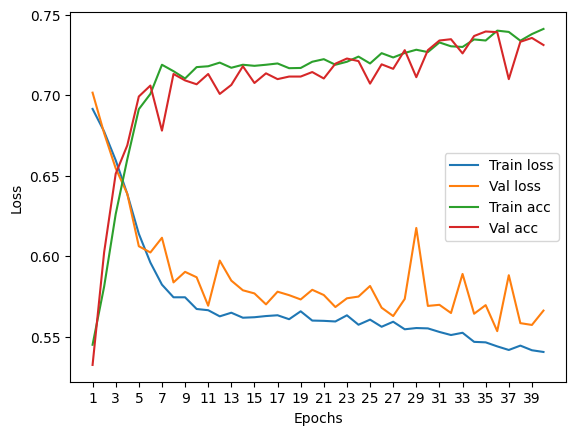

****************************************************************************************************



118it [00:00, 167.59it/s]


Train Epoch: 0 	Loss: 0.696735, Accuracy: 4004/7500 (53%)
Val Epoch: 0 	Loss: 0.707094, Accuracy: 1301/2500 (52%)



118it [00:00, 149.67it/s]


Train Epoch: 1 	Loss: 0.688217, Accuracy: 4271/7500 (57%)
Val Epoch: 1 	Loss: 0.694091, Accuracy: 1406/2500 (56%)



118it [00:00, 141.27it/s]


Train Epoch: 2 	Loss: 0.671827, Accuracy: 4540/7500 (61%)
Val Epoch: 2 	Loss: 0.675288, Accuracy: 1521/2500 (61%)



118it [00:00, 133.28it/s]


Train Epoch: 3 	Loss: 0.648420, Accuracy: 4797/7500 (64%)
Val Epoch: 3 	Loss: 0.644035, Accuracy: 1691/2500 (68%)



118it [00:00, 159.58it/s]


Train Epoch: 4 	Loss: 0.629549, Accuracy: 5029/7500 (67%)
Val Epoch: 4 	Loss: 0.624154, Accuracy: 1757/2500 (70%)



118it [00:00, 158.03it/s]


Train Epoch: 5 	Loss: 0.613520, Accuracy: 5121/7500 (68%)
Val Epoch: 5 	Loss: 0.605305, Accuracy: 1771/2500 (71%)



118it [00:00, 157.80it/s]


Train Epoch: 6 	Loss: 0.601234, Accuracy: 5183/7500 (69%)
Val Epoch: 6 	Loss: 0.598637, Accuracy: 1749/2500 (70%)



118it [00:00, 160.12it/s]


Train Epoch: 7 	Loss: 0.593521, Accuracy: 5236/7500 (70%)
Val Epoch: 7 	Loss: 0.585932, Accuracy: 1783/2500 (71%)



118it [00:00, 144.42it/s]


Train Epoch: 8 	Loss: 0.585525, Accuracy: 5297/7500 (71%)
Val Epoch: 8 	Loss: 0.583542, Accuracy: 1790/2500 (72%)



118it [00:00, 170.82it/s]


Train Epoch: 9 	Loss: 0.580394, Accuracy: 5308/7500 (71%)
Val Epoch: 9 	Loss: 0.583767, Accuracy: 1790/2500 (72%)



118it [00:00, 144.52it/s]


Train Epoch: 10 	Loss: 0.580490, Accuracy: 5291/7500 (71%)
Val Epoch: 10 	Loss: 0.576169, Accuracy: 1800/2500 (72%)



118it [00:00, 119.53it/s]


Train Epoch: 11 	Loss: 0.575367, Accuracy: 5331/7500 (71%)
Val Epoch: 11 	Loss: 0.573872, Accuracy: 1793/2500 (72%)



118it [00:00, 135.69it/s]


Train Epoch: 12 	Loss: 0.576286, Accuracy: 5318/7500 (71%)
Val Epoch: 12 	Loss: 0.573508, Accuracy: 1802/2500 (72%)



118it [00:00, 150.68it/s]


Train Epoch: 13 	Loss: 0.571840, Accuracy: 5320/7500 (71%)
Val Epoch: 13 	Loss: 0.573700, Accuracy: 1799/2500 (72%)



118it [00:00, 147.42it/s]


Train Epoch: 14 	Loss: 0.572496, Accuracy: 5326/7500 (71%)
Val Epoch: 14 	Loss: 0.561002, Accuracy: 1800/2500 (72%)



118it [00:00, 155.95it/s]


Train Epoch: 15 	Loss: 0.572118, Accuracy: 5333/7500 (71%)
Val Epoch: 15 	Loss: 0.572532, Accuracy: 1782/2500 (71%)



118it [00:00, 119.95it/s]


Train Epoch: 16 	Loss: 0.572075, Accuracy: 5353/7500 (71%)
Val Epoch: 16 	Loss: 0.566172, Accuracy: 1809/2500 (72%)



118it [00:00, 148.24it/s]


Train Epoch: 17 	Loss: 0.570711, Accuracy: 5328/7500 (71%)
Val Epoch: 17 	Loss: 0.565814, Accuracy: 1811/2500 (72%)



118it [00:00, 146.40it/s]


Train Epoch: 18 	Loss: 0.569822, Accuracy: 5338/7500 (71%)
Val Epoch: 18 	Loss: 0.568286, Accuracy: 1806/2500 (72%)



118it [00:00, 129.10it/s]


Train Epoch: 19 	Loss: 0.568169, Accuracy: 5375/7500 (72%)
Val Epoch: 19 	Loss: 0.560719, Accuracy: 1814/2500 (73%)



118it [00:00, 142.22it/s]


Train Epoch: 20 	Loss: 0.569950, Accuracy: 5376/7500 (72%)
Val Epoch: 20 	Loss: 0.565478, Accuracy: 1809/2500 (72%)



118it [00:00, 154.90it/s]


Train Epoch: 21 	Loss: 0.567657, Accuracy: 5355/7500 (71%)
Val Epoch: 21 	Loss: 0.561898, Accuracy: 1822/2500 (73%)



118it [00:00, 155.82it/s]


Train Epoch: 22 	Loss: 0.564022, Accuracy: 5381/7500 (72%)
Val Epoch: 22 	Loss: 0.562267, Accuracy: 1801/2500 (72%)



118it [00:00, 155.15it/s]


Train Epoch: 23 	Loss: 0.564730, Accuracy: 5402/7500 (72%)
Val Epoch: 23 	Loss: 0.572510, Accuracy: 1789/2500 (72%)



118it [00:00, 150.14it/s]


Train Epoch: 24 	Loss: 0.565261, Accuracy: 5397/7500 (72%)
Val Epoch: 24 	Loss: 0.565395, Accuracy: 1839/2500 (74%)



118it [00:00, 156.19it/s]


Train Epoch: 25 	Loss: 0.564455, Accuracy: 5411/7500 (72%)
Val Epoch: 25 	Loss: 0.559264, Accuracy: 1844/2500 (74%)



118it [00:00, 155.26it/s]


Train Epoch: 26 	Loss: 0.561280, Accuracy: 5391/7500 (72%)
Val Epoch: 26 	Loss: 0.563574, Accuracy: 1827/2500 (73%)



118it [00:00, 145.96it/s]


Train Epoch: 27 	Loss: 0.560947, Accuracy: 5437/7500 (72%)
Val Epoch: 27 	Loss: 0.555599, Accuracy: 1838/2500 (74%)



118it [00:00, 155.94it/s]


Train Epoch: 28 	Loss: 0.561207, Accuracy: 5403/7500 (72%)
Val Epoch: 28 	Loss: 0.551350, Accuracy: 1838/2500 (74%)



118it [00:00, 144.03it/s]


Train Epoch: 29 	Loss: 0.555921, Accuracy: 5463/7500 (73%)
Val Epoch: 29 	Loss: 0.548220, Accuracy: 1851/2500 (74%)



118it [00:00, 168.45it/s]


Train Epoch: 30 	Loss: 0.556105, Accuracy: 5466/7500 (73%)
Val Epoch: 30 	Loss: 0.564555, Accuracy: 1834/2500 (73%)



118it [00:00, 149.27it/s]


Train Epoch: 31 	Loss: 0.557286, Accuracy: 5471/7500 (73%)
Val Epoch: 31 	Loss: 0.543668, Accuracy: 1845/2500 (74%)



118it [00:01, 113.20it/s]


Train Epoch: 32 	Loss: 0.560244, Accuracy: 5434/7500 (72%)
Val Epoch: 32 	Loss: 0.549602, Accuracy: 1846/2500 (74%)



118it [00:00, 140.82it/s]


Train Epoch: 33 	Loss: 0.551548, Accuracy: 5497/7500 (73%)
Val Epoch: 33 	Loss: 0.573397, Accuracy: 1833/2500 (73%)



118it [00:00, 151.08it/s]


Train Epoch: 34 	Loss: 0.552505, Accuracy: 5524/7500 (74%)
Val Epoch: 34 	Loss: 0.546855, Accuracy: 1855/2500 (74%)



118it [00:00, 164.97it/s]


Train Epoch: 35 	Loss: 0.551886, Accuracy: 5487/7500 (73%)
Val Epoch: 35 	Loss: 0.547575, Accuracy: 1840/2500 (74%)



118it [00:00, 149.66it/s]


Train Epoch: 36 	Loss: 0.552120, Accuracy: 5482/7500 (73%)
Val Epoch: 36 	Loss: 0.542696, Accuracy: 1846/2500 (74%)



118it [00:00, 133.40it/s]


Train Epoch: 37 	Loss: 0.549777, Accuracy: 5497/7500 (73%)
Val Epoch: 37 	Loss: 0.559964, Accuracy: 1856/2500 (74%)



118it [00:00, 143.64it/s]


Train Epoch: 38 	Loss: 0.548983, Accuracy: 5524/7500 (74%)
Val Epoch: 38 	Loss: 0.569043, Accuracy: 1834/2500 (73%)



118it [00:00, 154.04it/s]


Train Epoch: 39 	Loss: 0.549285, Accuracy: 5484/7500 (73%)
Val Epoch: 39 	Loss: 0.556903, Accuracy: 1845/2500 (74%)

Test accuracy:  74.03999999999999


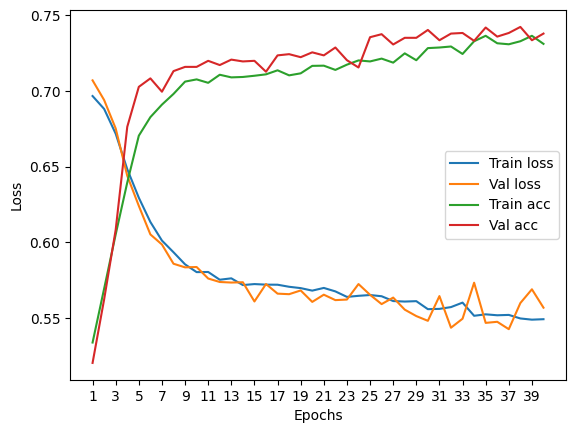

****************************************************************************************************



118it [00:00, 136.80it/s]


Train Epoch: 0 	Loss: 0.695430, Accuracy: 3940/7500 (53%)
Val Epoch: 0 	Loss: 0.702198, Accuracy: 1363/2500 (55%)



118it [00:00, 148.65it/s]


Train Epoch: 1 	Loss: 0.677069, Accuracy: 4521/7500 (60%)
Val Epoch: 1 	Loss: 0.679776, Accuracy: 1502/2500 (60%)



118it [00:00, 128.74it/s]


Train Epoch: 2 	Loss: 0.646873, Accuracy: 4836/7500 (64%)
Val Epoch: 2 	Loss: 0.645008, Accuracy: 1696/2500 (68%)



118it [00:00, 119.78it/s]


Train Epoch: 3 	Loss: 0.609469, Accuracy: 5253/7500 (70%)
Val Epoch: 3 	Loss: 0.601966, Accuracy: 1804/2500 (72%)



118it [00:00, 143.27it/s]


Train Epoch: 4 	Loss: 0.579360, Accuracy: 5411/7500 (72%)
Val Epoch: 4 	Loss: 0.601714, Accuracy: 1732/2500 (69%)



118it [00:00, 163.12it/s]


Train Epoch: 5 	Loss: 0.564221, Accuracy: 5460/7500 (73%)
Val Epoch: 5 	Loss: 0.576872, Accuracy: 1817/2500 (73%)



118it [00:00, 151.23it/s]


Train Epoch: 6 	Loss: 0.555209, Accuracy: 5540/7500 (74%)
Val Epoch: 6 	Loss: 0.569856, Accuracy: 1827/2500 (73%)



118it [00:00, 122.86it/s]


Train Epoch: 7 	Loss: 0.550404, Accuracy: 5531/7500 (74%)
Val Epoch: 7 	Loss: 0.556097, Accuracy: 1833/2500 (73%)



118it [00:00, 171.44it/s]


Train Epoch: 8 	Loss: 0.548458, Accuracy: 5563/7500 (74%)
Val Epoch: 8 	Loss: 0.563857, Accuracy: 1840/2500 (74%)



118it [00:00, 177.18it/s]


Train Epoch: 9 	Loss: 0.549731, Accuracy: 5524/7500 (74%)
Val Epoch: 9 	Loss: 0.562099, Accuracy: 1842/2500 (74%)



118it [00:00, 161.86it/s]


Train Epoch: 10 	Loss: 0.549794, Accuracy: 5546/7500 (74%)
Val Epoch: 10 	Loss: 0.564824, Accuracy: 1834/2500 (73%)



118it [00:00, 141.60it/s]


Train Epoch: 11 	Loss: 0.547058, Accuracy: 5548/7500 (74%)
Val Epoch: 11 	Loss: 0.560203, Accuracy: 1831/2500 (73%)



118it [00:00, 153.99it/s]


Train Epoch: 12 	Loss: 0.547133, Accuracy: 5522/7500 (74%)
Val Epoch: 12 	Loss: 0.558230, Accuracy: 1813/2500 (73%)



118it [00:00, 165.11it/s]


Train Epoch: 13 	Loss: 0.544583, Accuracy: 5557/7500 (74%)
Val Epoch: 13 	Loss: 0.569881, Accuracy: 1836/2500 (73%)



118it [00:00, 170.99it/s]


Train Epoch: 14 	Loss: 0.548710, Accuracy: 5558/7500 (74%)
Val Epoch: 14 	Loss: 0.563766, Accuracy: 1813/2500 (73%)



118it [00:00, 176.23it/s]


Train Epoch: 15 	Loss: 0.550740, Accuracy: 5497/7500 (73%)
Val Epoch: 15 	Loss: 0.557412, Accuracy: 1841/2500 (74%)



118it [00:00, 176.65it/s]


Train Epoch: 16 	Loss: 0.546967, Accuracy: 5552/7500 (74%)
Val Epoch: 16 	Loss: 0.558507, Accuracy: 1835/2500 (73%)



118it [00:00, 150.43it/s]


Train Epoch: 17 	Loss: 0.545513, Accuracy: 5524/7500 (74%)
Val Epoch: 17 	Loss: 0.556443, Accuracy: 1834/2500 (73%)



118it [00:00, 168.27it/s]


Train Epoch: 18 	Loss: 0.548731, Accuracy: 5533/7500 (74%)
Val Epoch: 18 	Loss: 0.567690, Accuracy: 1820/2500 (73%)



118it [00:00, 170.59it/s]


Train Epoch: 19 	Loss: 0.548189, Accuracy: 5552/7500 (74%)
Val Epoch: 19 	Loss: 0.573237, Accuracy: 1833/2500 (73%)



118it [00:00, 161.87it/s]


Train Epoch: 20 	Loss: 0.546298, Accuracy: 5553/7500 (74%)
Val Epoch: 20 	Loss: 0.552042, Accuracy: 1837/2500 (73%)



118it [00:00, 148.51it/s]


Train Epoch: 21 	Loss: 0.549072, Accuracy: 5523/7500 (74%)
Val Epoch: 21 	Loss: 0.560955, Accuracy: 1823/2500 (73%)



118it [00:00, 163.79it/s]


Train Epoch: 22 	Loss: 0.545060, Accuracy: 5553/7500 (74%)
Val Epoch: 22 	Loss: 0.563230, Accuracy: 1834/2500 (73%)



118it [00:00, 157.69it/s]


Train Epoch: 23 	Loss: 0.545046, Accuracy: 5539/7500 (74%)
Val Epoch: 23 	Loss: 0.562917, Accuracy: 1851/2500 (74%)



118it [00:00, 148.22it/s]


Train Epoch: 24 	Loss: 0.546002, Accuracy: 5531/7500 (74%)
Val Epoch: 24 	Loss: 0.561895, Accuracy: 1845/2500 (74%)



118it [00:00, 150.88it/s]


Train Epoch: 25 	Loss: 0.545476, Accuracy: 5555/7500 (74%)
Val Epoch: 25 	Loss: 0.571463, Accuracy: 1826/2500 (73%)



118it [00:00, 146.58it/s]


Train Epoch: 26 	Loss: 0.544215, Accuracy: 5566/7500 (74%)
Val Epoch: 26 	Loss: 0.559017, Accuracy: 1817/2500 (73%)



118it [00:00, 147.07it/s]


Train Epoch: 27 	Loss: 0.545320, Accuracy: 5535/7500 (74%)
Val Epoch: 27 	Loss: 0.556889, Accuracy: 1849/2500 (74%)



118it [00:00, 148.70it/s]


Train Epoch: 28 	Loss: 0.543354, Accuracy: 5570/7500 (74%)
Val Epoch: 28 	Loss: 0.562174, Accuracy: 1820/2500 (73%)



118it [00:01, 115.68it/s]


Train Epoch: 29 	Loss: 0.546407, Accuracy: 5578/7500 (74%)
Val Epoch: 29 	Loss: 0.561376, Accuracy: 1835/2500 (73%)



118it [00:00, 156.03it/s]


Train Epoch: 30 	Loss: 0.547264, Accuracy: 5568/7500 (74%)
Val Epoch: 30 	Loss: 0.562930, Accuracy: 1842/2500 (74%)



118it [00:00, 134.29it/s]


Train Epoch: 31 	Loss: 0.546575, Accuracy: 5573/7500 (74%)
Val Epoch: 31 	Loss: 0.558640, Accuracy: 1844/2500 (74%)



118it [00:00, 179.00it/s]


Train Epoch: 32 	Loss: 0.544551, Accuracy: 5577/7500 (74%)
Val Epoch: 32 	Loss: 0.557897, Accuracy: 1841/2500 (74%)



118it [00:00, 153.87it/s]


Train Epoch: 33 	Loss: 0.547354, Accuracy: 5555/7500 (74%)
Val Epoch: 33 	Loss: 0.556693, Accuracy: 1840/2500 (74%)



118it [00:00, 156.90it/s]


Train Epoch: 34 	Loss: 0.547394, Accuracy: 5572/7500 (74%)
Val Epoch: 34 	Loss: 0.556885, Accuracy: 1849/2500 (74%)



118it [00:00, 139.01it/s]


Train Epoch: 35 	Loss: 0.545607, Accuracy: 5533/7500 (74%)
Val Epoch: 35 	Loss: 0.556800, Accuracy: 1827/2500 (73%)



118it [00:00, 120.63it/s]


Train Epoch: 36 	Loss: 0.546993, Accuracy: 5570/7500 (74%)
Val Epoch: 36 	Loss: 0.559185, Accuracy: 1833/2500 (73%)



118it [00:00, 143.45it/s]


Train Epoch: 37 	Loss: 0.544681, Accuracy: 5555/7500 (74%)
Val Epoch: 37 	Loss: 0.576741, Accuracy: 1827/2500 (73%)



118it [00:00, 156.30it/s]


Train Epoch: 38 	Loss: 0.543207, Accuracy: 5572/7500 (74%)
Val Epoch: 38 	Loss: 0.554201, Accuracy: 1835/2500 (73%)



118it [00:00, 158.93it/s]


Train Epoch: 39 	Loss: 0.543023, Accuracy: 5585/7500 (74%)
Val Epoch: 39 	Loss: 0.552944, Accuracy: 1843/2500 (74%)

Test accuracy:  72.92


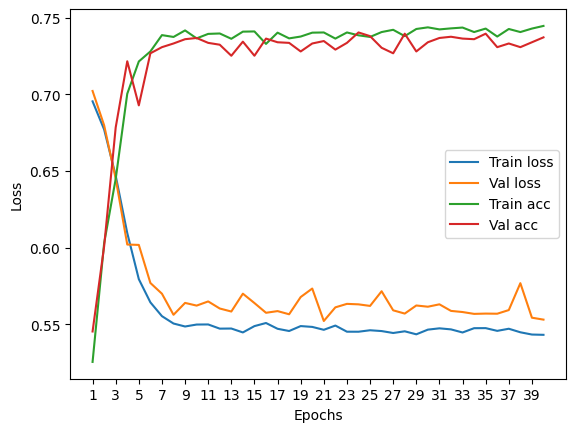

****************************************************************************************************



118it [00:00, 181.92it/s]


Train Epoch: 0 	Loss: 0.695917, Accuracy: 4002/7500 (53%)
Val Epoch: 0 	Loss: 0.703706, Accuracy: 1320/2500 (53%)



118it [00:00, 169.95it/s]


Train Epoch: 1 	Loss: 0.682231, Accuracy: 4433/7500 (59%)
Val Epoch: 1 	Loss: 0.680010, Accuracy: 1524/2500 (61%)



118it [00:00, 172.30it/s]


Train Epoch: 2 	Loss: 0.652040, Accuracy: 4800/7500 (64%)
Val Epoch: 2 	Loss: 0.655223, Accuracy: 1677/2500 (67%)



118it [00:00, 180.92it/s]


Train Epoch: 3 	Loss: 0.620704, Accuracy: 5160/7500 (69%)
Val Epoch: 3 	Loss: 0.616856, Accuracy: 1768/2500 (71%)



118it [00:00, 178.77it/s]


Train Epoch: 4 	Loss: 0.591562, Accuracy: 5324/7500 (71%)
Val Epoch: 4 	Loss: 0.600706, Accuracy: 1765/2500 (71%)



118it [00:00, 173.89it/s]


Train Epoch: 5 	Loss: 0.570551, Accuracy: 5454/7500 (73%)
Val Epoch: 5 	Loss: 0.574460, Accuracy: 1808/2500 (72%)



118it [00:00, 149.53it/s]


Train Epoch: 6 	Loss: 0.560538, Accuracy: 5483/7500 (73%)
Val Epoch: 6 	Loss: 0.584238, Accuracy: 1788/2500 (72%)



118it [00:00, 166.98it/s]


Train Epoch: 7 	Loss: 0.552172, Accuracy: 5556/7500 (74%)
Val Epoch: 7 	Loss: 0.580650, Accuracy: 1784/2500 (71%)



118it [00:00, 170.93it/s]


Train Epoch: 8 	Loss: 0.547370, Accuracy: 5563/7500 (74%)
Val Epoch: 8 	Loss: 0.576827, Accuracy: 1815/2500 (73%)



118it [00:00, 181.93it/s]


Train Epoch: 9 	Loss: 0.547750, Accuracy: 5572/7500 (74%)
Val Epoch: 9 	Loss: 0.568507, Accuracy: 1823/2500 (73%)



118it [00:00, 159.33it/s]


Train Epoch: 10 	Loss: 0.545407, Accuracy: 5551/7500 (74%)
Val Epoch: 10 	Loss: 0.567811, Accuracy: 1816/2500 (73%)



118it [00:00, 175.96it/s]


Train Epoch: 11 	Loss: 0.545574, Accuracy: 5580/7500 (74%)
Val Epoch: 11 	Loss: 0.585430, Accuracy: 1829/2500 (73%)



118it [00:00, 168.82it/s]


Train Epoch: 12 	Loss: 0.547038, Accuracy: 5582/7500 (74%)
Val Epoch: 12 	Loss: 0.571322, Accuracy: 1819/2500 (73%)



118it [00:00, 164.08it/s]


Train Epoch: 13 	Loss: 0.543900, Accuracy: 5568/7500 (74%)
Val Epoch: 13 	Loss: 0.573601, Accuracy: 1823/2500 (73%)



118it [00:00, 175.17it/s]


Train Epoch: 14 	Loss: 0.543394, Accuracy: 5586/7500 (74%)
Val Epoch: 14 	Loss: 0.566181, Accuracy: 1804/2500 (72%)



118it [00:00, 152.58it/s]


Train Epoch: 15 	Loss: 0.545310, Accuracy: 5546/7500 (74%)
Val Epoch: 15 	Loss: 0.560794, Accuracy: 1823/2500 (73%)



118it [00:00, 156.71it/s]


Train Epoch: 16 	Loss: 0.544641, Accuracy: 5579/7500 (74%)
Val Epoch: 16 	Loss: 0.570341, Accuracy: 1825/2500 (73%)



118it [00:00, 162.69it/s]


Train Epoch: 17 	Loss: 0.543064, Accuracy: 5548/7500 (74%)
Val Epoch: 17 	Loss: 0.557975, Accuracy: 1825/2500 (73%)



118it [00:00, 176.21it/s]


Train Epoch: 18 	Loss: 0.542973, Accuracy: 5579/7500 (74%)
Val Epoch: 18 	Loss: 0.569908, Accuracy: 1819/2500 (73%)



118it [00:00, 166.63it/s]


Train Epoch: 19 	Loss: 0.543740, Accuracy: 5553/7500 (74%)
Val Epoch: 19 	Loss: 0.560673, Accuracy: 1825/2500 (73%)



118it [00:00, 183.61it/s]


Train Epoch: 20 	Loss: 0.544940, Accuracy: 5576/7500 (74%)
Val Epoch: 20 	Loss: 0.571628, Accuracy: 1823/2500 (73%)



118it [00:00, 163.93it/s]


Train Epoch: 21 	Loss: 0.547057, Accuracy: 5584/7500 (74%)
Val Epoch: 21 	Loss: 0.558920, Accuracy: 1820/2500 (73%)



118it [00:00, 173.50it/s]


Train Epoch: 22 	Loss: 0.543955, Accuracy: 5574/7500 (74%)
Val Epoch: 22 	Loss: 0.574143, Accuracy: 1818/2500 (73%)



118it [00:00, 173.01it/s]


Train Epoch: 23 	Loss: 0.541854, Accuracy: 5557/7500 (74%)
Val Epoch: 23 	Loss: 0.555921, Accuracy: 1822/2500 (73%)



118it [00:00, 177.65it/s]


Train Epoch: 24 	Loss: 0.541381, Accuracy: 5574/7500 (74%)
Val Epoch: 24 	Loss: 0.569277, Accuracy: 1827/2500 (73%)



118it [00:00, 167.28it/s]


Train Epoch: 25 	Loss: 0.543514, Accuracy: 5576/7500 (74%)
Val Epoch: 25 	Loss: 0.577743, Accuracy: 1823/2500 (73%)



118it [00:00, 161.55it/s]


Train Epoch: 26 	Loss: 0.542623, Accuracy: 5574/7500 (74%)
Val Epoch: 26 	Loss: 0.561151, Accuracy: 1823/2500 (73%)



118it [00:00, 151.48it/s]


Train Epoch: 27 	Loss: 0.543207, Accuracy: 5565/7500 (74%)
Val Epoch: 27 	Loss: 0.579018, Accuracy: 1808/2500 (72%)



118it [00:00, 164.18it/s]


Train Epoch: 28 	Loss: 0.542954, Accuracy: 5571/7500 (74%)
Val Epoch: 28 	Loss: 0.566807, Accuracy: 1822/2500 (73%)



118it [00:00, 154.11it/s]


Train Epoch: 29 	Loss: 0.545441, Accuracy: 5583/7500 (74%)
Val Epoch: 29 	Loss: 0.566508, Accuracy: 1819/2500 (73%)



118it [00:00, 181.79it/s]


Train Epoch: 30 	Loss: 0.541987, Accuracy: 5583/7500 (74%)
Val Epoch: 30 	Loss: 0.563588, Accuracy: 1821/2500 (73%)



118it [00:00, 171.54it/s]


Train Epoch: 31 	Loss: 0.544062, Accuracy: 5564/7500 (74%)
Val Epoch: 31 	Loss: 0.563593, Accuracy: 1817/2500 (73%)



118it [00:00, 135.07it/s]


Train Epoch: 32 	Loss: 0.541538, Accuracy: 5551/7500 (74%)
Val Epoch: 32 	Loss: 0.569255, Accuracy: 1815/2500 (73%)



118it [00:00, 132.53it/s]


Train Epoch: 33 	Loss: 0.540704, Accuracy: 5554/7500 (74%)
Val Epoch: 33 	Loss: 0.569988, Accuracy: 1826/2500 (73%)



118it [00:00, 148.44it/s]


Train Epoch: 34 	Loss: 0.542660, Accuracy: 5567/7500 (74%)
Val Epoch: 34 	Loss: 0.566858, Accuracy: 1810/2500 (72%)



118it [00:00, 145.27it/s]


Train Epoch: 35 	Loss: 0.541953, Accuracy: 5572/7500 (74%)
Val Epoch: 35 	Loss: 0.559280, Accuracy: 1819/2500 (73%)



118it [00:00, 141.10it/s]


Train Epoch: 36 	Loss: 0.540830, Accuracy: 5601/7500 (75%)
Val Epoch: 36 	Loss: 0.563241, Accuracy: 1822/2500 (73%)



118it [00:00, 168.68it/s]


Train Epoch: 37 	Loss: 0.540699, Accuracy: 5598/7500 (75%)
Val Epoch: 37 	Loss: 0.568057, Accuracy: 1814/2500 (73%)



118it [00:00, 171.77it/s]


Train Epoch: 38 	Loss: 0.541698, Accuracy: 5575/7500 (74%)
Val Epoch: 38 	Loss: 0.572272, Accuracy: 1821/2500 (73%)



118it [00:00, 161.76it/s]


Train Epoch: 39 	Loss: 0.543600, Accuracy: 5584/7500 (74%)
Val Epoch: 39 	Loss: 0.577510, Accuracy: 1804/2500 (72%)

Test accuracy:  72.48


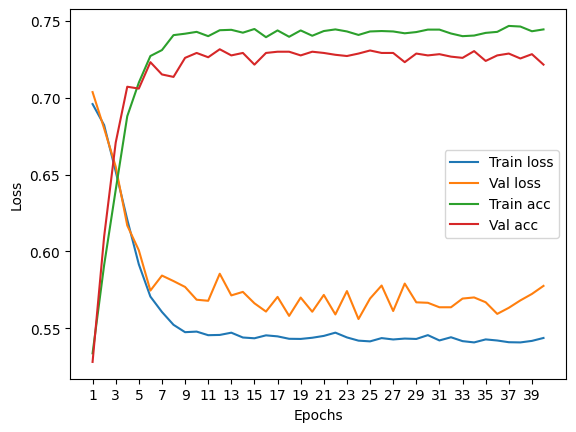

****************************************************************************************************



116it [00:00, 167.70it/s]


Train Epoch: 0 	Loss: 0.688845, Accuracy: 3986/7422 (54%)
Val Epoch: 0 	Loss: 0.685228, Accuracy: 1460/2474 (59%)



116it [00:00, 170.70it/s]


Train Epoch: 1 	Loss: 0.667863, Accuracy: 4502/7422 (61%)
Val Epoch: 1 	Loss: 0.658048, Accuracy: 1580/2474 (64%)



116it [00:00, 172.07it/s]


Train Epoch: 2 	Loss: 0.637898, Accuracy: 4878/7422 (66%)
Val Epoch: 2 	Loss: 0.617775, Accuracy: 1710/2474 (69%)



116it [00:00, 167.62it/s]


Train Epoch: 3 	Loss: 0.600856, Accuracy: 5205/7422 (70%)
Val Epoch: 3 	Loss: 0.582368, Accuracy: 1795/2474 (73%)



116it [00:00, 150.57it/s]


Train Epoch: 4 	Loss: 0.572665, Accuracy: 5361/7422 (72%)
Val Epoch: 4 	Loss: 0.559367, Accuracy: 1838/2474 (74%)



116it [00:00, 132.99it/s]


Train Epoch: 5 	Loss: 0.555796, Accuracy: 5436/7422 (73%)
Val Epoch: 5 	Loss: 0.547375, Accuracy: 1842/2474 (74%)



116it [00:00, 167.63it/s]


Train Epoch: 6 	Loss: 0.548578, Accuracy: 5490/7422 (74%)
Val Epoch: 6 	Loss: 0.540434, Accuracy: 1862/2474 (75%)



116it [00:00, 159.87it/s]


Train Epoch: 7 	Loss: 0.547083, Accuracy: 5483/7422 (74%)
Val Epoch: 7 	Loss: 0.538229, Accuracy: 1853/2474 (75%)



116it [00:00, 177.74it/s]


Train Epoch: 8 	Loss: 0.543600, Accuracy: 5493/7422 (74%)
Val Epoch: 8 	Loss: 0.540822, Accuracy: 1826/2474 (74%)



116it [00:00, 167.49it/s]


Train Epoch: 9 	Loss: 0.544123, Accuracy: 5474/7422 (74%)
Val Epoch: 9 	Loss: 0.537477, Accuracy: 1837/2474 (74%)



116it [00:00, 174.26it/s]


Train Epoch: 10 	Loss: 0.545757, Accuracy: 5451/7422 (73%)
Val Epoch: 10 	Loss: 0.541197, Accuracy: 1837/2474 (74%)



116it [00:00, 182.78it/s]


Train Epoch: 11 	Loss: 0.543866, Accuracy: 5475/7422 (74%)
Val Epoch: 11 	Loss: 0.538928, Accuracy: 1837/2474 (74%)



116it [00:00, 182.35it/s]


Train Epoch: 12 	Loss: 0.543189, Accuracy: 5474/7422 (74%)
Val Epoch: 12 	Loss: 0.550632, Accuracy: 1817/2474 (73%)



116it [00:00, 158.25it/s]


Train Epoch: 13 	Loss: 0.543915, Accuracy: 5479/7422 (74%)
Val Epoch: 13 	Loss: 0.538152, Accuracy: 1842/2474 (74%)



116it [00:00, 160.09it/s]


Train Epoch: 14 	Loss: 0.544048, Accuracy: 5447/7422 (73%)
Val Epoch: 14 	Loss: 0.538808, Accuracy: 1836/2474 (74%)



116it [00:00, 157.35it/s]


Train Epoch: 15 	Loss: 0.544223, Accuracy: 5485/7422 (74%)
Val Epoch: 15 	Loss: 0.535634, Accuracy: 1851/2474 (75%)



116it [00:00, 184.89it/s]


Train Epoch: 16 	Loss: 0.542281, Accuracy: 5493/7422 (74%)
Val Epoch: 16 	Loss: 0.546533, Accuracy: 1827/2474 (74%)



116it [00:00, 152.87it/s]


Train Epoch: 17 	Loss: 0.543294, Accuracy: 5499/7422 (74%)
Val Epoch: 17 	Loss: 0.538272, Accuracy: 1844/2474 (75%)



116it [00:00, 187.68it/s]


Train Epoch: 18 	Loss: 0.543159, Accuracy: 5460/7422 (74%)
Val Epoch: 18 	Loss: 0.538857, Accuracy: 1834/2474 (74%)



116it [00:00, 179.85it/s]


Train Epoch: 19 	Loss: 0.543755, Accuracy: 5500/7422 (74%)
Val Epoch: 19 	Loss: 0.536524, Accuracy: 1849/2474 (75%)



116it [00:00, 160.19it/s]


Train Epoch: 20 	Loss: 0.542016, Accuracy: 5473/7422 (74%)
Val Epoch: 20 	Loss: 0.537615, Accuracy: 1840/2474 (74%)



116it [00:00, 169.32it/s]


Train Epoch: 21 	Loss: 0.543338, Accuracy: 5489/7422 (74%)
Val Epoch: 21 	Loss: 0.546045, Accuracy: 1831/2474 (74%)



116it [00:00, 157.42it/s]


Train Epoch: 22 	Loss: 0.543585, Accuracy: 5493/7422 (74%)
Val Epoch: 22 	Loss: 0.542390, Accuracy: 1835/2474 (74%)



116it [00:00, 165.81it/s]


Train Epoch: 23 	Loss: 0.543892, Accuracy: 5485/7422 (74%)
Val Epoch: 23 	Loss: 0.539598, Accuracy: 1844/2474 (75%)



116it [00:00, 155.09it/s]


Train Epoch: 24 	Loss: 0.542427, Accuracy: 5493/7422 (74%)
Val Epoch: 24 	Loss: 0.538939, Accuracy: 1843/2474 (74%)



116it [00:00, 140.22it/s]


Train Epoch: 25 	Loss: 0.541349, Accuracy: 5499/7422 (74%)
Val Epoch: 25 	Loss: 0.542123, Accuracy: 1839/2474 (74%)



116it [00:00, 178.41it/s]


Train Epoch: 26 	Loss: 0.543138, Accuracy: 5493/7422 (74%)
Val Epoch: 26 	Loss: 0.537693, Accuracy: 1838/2474 (74%)



116it [00:00, 165.85it/s]


Train Epoch: 27 	Loss: 0.543278, Accuracy: 5505/7422 (74%)
Val Epoch: 27 	Loss: 0.545458, Accuracy: 1826/2474 (74%)



116it [00:00, 167.61it/s]


Train Epoch: 28 	Loss: 0.542454, Accuracy: 5483/7422 (74%)
Val Epoch: 28 	Loss: 0.537632, Accuracy: 1834/2474 (74%)



116it [00:00, 176.17it/s]


Train Epoch: 29 	Loss: 0.541276, Accuracy: 5491/7422 (74%)
Val Epoch: 29 	Loss: 0.535426, Accuracy: 1850/2474 (75%)



116it [00:00, 159.17it/s]


Train Epoch: 30 	Loss: 0.542877, Accuracy: 5511/7422 (74%)
Val Epoch: 30 	Loss: 0.534769, Accuracy: 1849/2474 (75%)



116it [00:00, 159.62it/s]


Train Epoch: 31 	Loss: 0.542733, Accuracy: 5486/7422 (74%)
Val Epoch: 31 	Loss: 0.552376, Accuracy: 1822/2474 (74%)



116it [00:00, 182.43it/s]


Train Epoch: 32 	Loss: 0.541233, Accuracy: 5491/7422 (74%)
Val Epoch: 32 	Loss: 0.538315, Accuracy: 1836/2474 (74%)



116it [00:00, 175.91it/s]


Train Epoch: 33 	Loss: 0.542519, Accuracy: 5495/7422 (74%)
Val Epoch: 33 	Loss: 0.544563, Accuracy: 1826/2474 (74%)



116it [00:00, 147.88it/s]


Train Epoch: 34 	Loss: 0.543964, Accuracy: 5491/7422 (74%)
Val Epoch: 34 	Loss: 0.537469, Accuracy: 1839/2474 (74%)



116it [00:00, 162.68it/s]


Train Epoch: 35 	Loss: 0.543308, Accuracy: 5486/7422 (74%)
Val Epoch: 35 	Loss: 0.535087, Accuracy: 1845/2474 (75%)



116it [00:00, 171.12it/s]


Train Epoch: 36 	Loss: 0.542406, Accuracy: 5486/7422 (74%)
Val Epoch: 36 	Loss: 0.537050, Accuracy: 1839/2474 (74%)



116it [00:00, 167.08it/s]


Train Epoch: 37 	Loss: 0.541323, Accuracy: 5495/7422 (74%)
Val Epoch: 37 	Loss: 0.537377, Accuracy: 1841/2474 (74%)



116it [00:00, 158.05it/s]


Train Epoch: 38 	Loss: 0.542203, Accuracy: 5482/7422 (74%)
Val Epoch: 38 	Loss: 0.536074, Accuracy: 1844/2474 (75%)



116it [00:00, 173.17it/s]


Train Epoch: 39 	Loss: 0.542356, Accuracy: 5463/7422 (74%)
Val Epoch: 39 	Loss: 0.539102, Accuracy: 1841/2474 (74%)

Test accuracy:  73.76717865804365


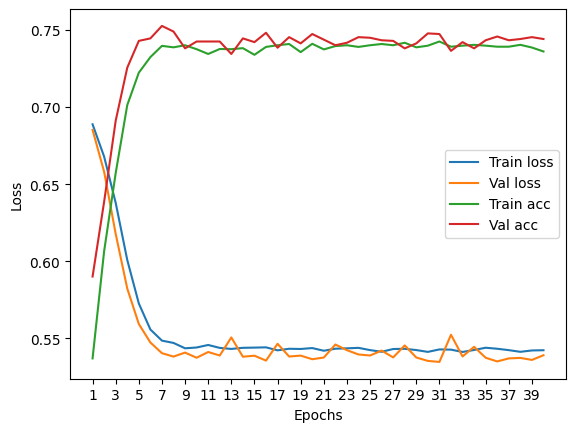

****************************************************************************************************



Particles per jet: 9


118it [00:00, 149.47it/s]


Train Epoch: 0 	Loss: 0.697102, Accuracy: 3877/7500 (52%)
Val Epoch: 0 	Loss: 0.705550, Accuracy: 1323/2500 (53%)



118it [00:00, 157.39it/s]


Train Epoch: 1 	Loss: 0.685189, Accuracy: 4316/7500 (58%)
Val Epoch: 1 	Loss: 0.690131, Accuracy: 1470/2500 (59%)



118it [00:00, 130.79it/s]


Train Epoch: 2 	Loss: 0.664637, Accuracy: 4661/7500 (62%)
Val Epoch: 2 	Loss: 0.666538, Accuracy: 1573/2500 (63%)



118it [00:00, 163.03it/s]


Train Epoch: 3 	Loss: 0.630700, Accuracy: 5049/7500 (67%)
Val Epoch: 3 	Loss: 0.633999, Accuracy: 1700/2500 (68%)



118it [00:00, 118.29it/s]


Train Epoch: 4 	Loss: 0.587470, Accuracy: 5418/7500 (72%)
Val Epoch: 4 	Loss: 0.587037, Accuracy: 1821/2500 (73%)



118it [00:00, 138.07it/s]


Train Epoch: 5 	Loss: 0.556289, Accuracy: 5539/7500 (74%)
Val Epoch: 5 	Loss: 0.565639, Accuracy: 1832/2500 (73%)



118it [00:01, 110.92it/s]


Train Epoch: 6 	Loss: 0.540796, Accuracy: 5568/7500 (74%)
Val Epoch: 6 	Loss: 0.571749, Accuracy: 1814/2500 (73%)



118it [00:00, 152.03it/s]


Train Epoch: 7 	Loss: 0.538330, Accuracy: 5550/7500 (74%)
Val Epoch: 7 	Loss: 0.557778, Accuracy: 1824/2500 (73%)



118it [00:00, 132.22it/s]


Train Epoch: 8 	Loss: 0.535053, Accuracy: 5572/7500 (74%)
Val Epoch: 8 	Loss: 0.566341, Accuracy: 1831/2500 (73%)



118it [00:00, 153.40it/s]


Train Epoch: 9 	Loss: 0.535574, Accuracy: 5578/7500 (74%)
Val Epoch: 9 	Loss: 0.557549, Accuracy: 1829/2500 (73%)



118it [00:00, 147.10it/s]


Train Epoch: 10 	Loss: 0.532228, Accuracy: 5589/7500 (75%)
Val Epoch: 10 	Loss: 0.560585, Accuracy: 1826/2500 (73%)



118it [00:00, 144.51it/s]


Train Epoch: 11 	Loss: 0.531163, Accuracy: 5600/7500 (75%)
Val Epoch: 11 	Loss: 0.550022, Accuracy: 1837/2500 (73%)



118it [00:00, 135.97it/s]


Train Epoch: 12 	Loss: 0.530805, Accuracy: 5586/7500 (74%)
Val Epoch: 12 	Loss: 0.575485, Accuracy: 1840/2500 (74%)



118it [00:00, 162.06it/s]


Train Epoch: 13 	Loss: 0.530729, Accuracy: 5609/7500 (75%)
Val Epoch: 13 	Loss: 0.559362, Accuracy: 1832/2500 (73%)



118it [00:00, 175.67it/s]


Train Epoch: 14 	Loss: 0.533245, Accuracy: 5576/7500 (74%)
Val Epoch: 14 	Loss: 0.562120, Accuracy: 1826/2500 (73%)



118it [00:00, 169.78it/s]


Train Epoch: 15 	Loss: 0.535581, Accuracy: 5576/7500 (74%)
Val Epoch: 15 	Loss: 0.566427, Accuracy: 1841/2500 (74%)



118it [00:00, 171.71it/s]


Train Epoch: 16 	Loss: 0.532675, Accuracy: 5586/7500 (74%)
Val Epoch: 16 	Loss: 0.561016, Accuracy: 1837/2500 (73%)



118it [00:00, 150.89it/s]


Train Epoch: 17 	Loss: 0.530889, Accuracy: 5607/7500 (75%)
Val Epoch: 17 	Loss: 0.553398, Accuracy: 1828/2500 (73%)



118it [00:00, 164.06it/s]


Train Epoch: 18 	Loss: 0.531900, Accuracy: 5584/7500 (74%)
Val Epoch: 18 	Loss: 0.562867, Accuracy: 1836/2500 (73%)



118it [00:00, 146.02it/s]


Train Epoch: 19 	Loss: 0.530806, Accuracy: 5592/7500 (75%)
Val Epoch: 19 	Loss: 0.555670, Accuracy: 1831/2500 (73%)



118it [00:00, 131.27it/s]


Train Epoch: 20 	Loss: 0.528413, Accuracy: 5613/7500 (75%)
Val Epoch: 20 	Loss: 0.557290, Accuracy: 1837/2500 (73%)



118it [00:00, 129.68it/s]


Train Epoch: 21 	Loss: 0.530692, Accuracy: 5593/7500 (75%)
Val Epoch: 21 	Loss: 0.563407, Accuracy: 1829/2500 (73%)



118it [00:00, 132.96it/s]


Train Epoch: 22 	Loss: 0.530942, Accuracy: 5614/7500 (75%)
Val Epoch: 22 	Loss: 0.564900, Accuracy: 1844/2500 (74%)



118it [00:00, 138.40it/s]


Train Epoch: 23 	Loss: 0.531486, Accuracy: 5608/7500 (75%)
Val Epoch: 23 	Loss: 0.555060, Accuracy: 1830/2500 (73%)



118it [00:00, 165.75it/s]


Train Epoch: 24 	Loss: 0.530248, Accuracy: 5590/7500 (75%)
Val Epoch: 24 	Loss: 0.554295, Accuracy: 1831/2500 (73%)



118it [00:00, 165.81it/s]


Train Epoch: 25 	Loss: 0.532022, Accuracy: 5562/7500 (74%)
Val Epoch: 25 	Loss: 0.555058, Accuracy: 1829/2500 (73%)



118it [00:00, 152.24it/s]


Train Epoch: 26 	Loss: 0.531567, Accuracy: 5600/7500 (75%)
Val Epoch: 26 	Loss: 0.556268, Accuracy: 1838/2500 (74%)



118it [00:00, 124.05it/s]


Train Epoch: 27 	Loss: 0.529864, Accuracy: 5590/7500 (75%)
Val Epoch: 27 	Loss: 0.547525, Accuracy: 1834/2500 (73%)



118it [00:00, 138.14it/s]


Train Epoch: 28 	Loss: 0.527717, Accuracy: 5615/7500 (75%)
Val Epoch: 28 	Loss: 0.570653, Accuracy: 1827/2500 (73%)



118it [00:00, 146.60it/s]


Train Epoch: 29 	Loss: 0.531852, Accuracy: 5598/7500 (75%)
Val Epoch: 29 	Loss: 0.550551, Accuracy: 1838/2500 (74%)



118it [00:00, 153.98it/s]


Train Epoch: 30 	Loss: 0.534097, Accuracy: 5608/7500 (75%)
Val Epoch: 30 	Loss: 0.556314, Accuracy: 1830/2500 (73%)



118it [00:00, 136.22it/s]


Train Epoch: 31 	Loss: 0.529804, Accuracy: 5601/7500 (75%)
Val Epoch: 31 	Loss: 0.552390, Accuracy: 1835/2500 (73%)



118it [00:00, 139.63it/s]


Train Epoch: 32 	Loss: 0.527564, Accuracy: 5612/7500 (75%)
Val Epoch: 32 	Loss: 0.549004, Accuracy: 1841/2500 (74%)



118it [00:00, 141.07it/s]


Train Epoch: 33 	Loss: 0.533138, Accuracy: 5614/7500 (75%)
Val Epoch: 33 	Loss: 0.553430, Accuracy: 1839/2500 (74%)



118it [00:00, 128.08it/s]


Train Epoch: 34 	Loss: 0.531750, Accuracy: 5596/7500 (75%)
Val Epoch: 34 	Loss: 0.553480, Accuracy: 1841/2500 (74%)



118it [00:00, 133.67it/s]


Train Epoch: 35 	Loss: 0.529726, Accuracy: 5611/7500 (75%)
Val Epoch: 35 	Loss: 0.560795, Accuracy: 1819/2500 (73%)



118it [00:00, 123.99it/s]


Train Epoch: 36 	Loss: 0.533712, Accuracy: 5585/7500 (74%)
Val Epoch: 36 	Loss: 0.556402, Accuracy: 1838/2500 (74%)



118it [00:01, 117.98it/s]


Train Epoch: 37 	Loss: 0.530822, Accuracy: 5604/7500 (75%)
Val Epoch: 37 	Loss: 0.546402, Accuracy: 1850/2500 (74%)



118it [00:00, 138.78it/s]


Train Epoch: 38 	Loss: 0.530423, Accuracy: 5629/7500 (75%)
Val Epoch: 38 	Loss: 0.553798, Accuracy: 1827/2500 (73%)



118it [00:00, 148.67it/s]


Train Epoch: 39 	Loss: 0.526820, Accuracy: 5625/7500 (75%)
Val Epoch: 39 	Loss: 0.561067, Accuracy: 1824/2500 (73%)

Test accuracy:  74.88


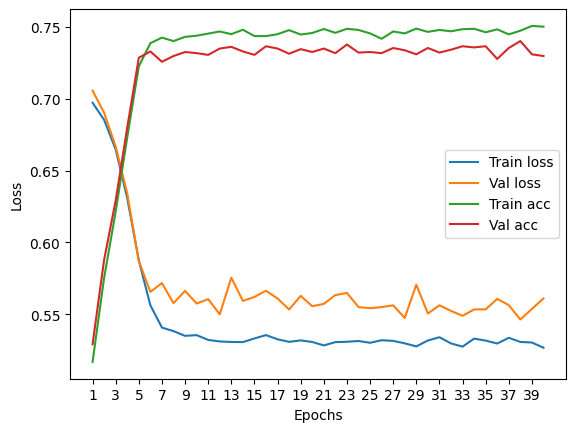

****************************************************************************************************



118it [00:01, 117.49it/s]


Train Epoch: 0 	Loss: 0.695478, Accuracy: 4012/7500 (53%)
Val Epoch: 0 	Loss: 0.700242, Accuracy: 1405/2500 (56%)



118it [00:00, 134.78it/s]


Train Epoch: 1 	Loss: 0.681519, Accuracy: 4375/7500 (58%)
Val Epoch: 1 	Loss: 0.685021, Accuracy: 1518/2500 (61%)



118it [00:00, 156.38it/s]


Train Epoch: 2 	Loss: 0.659756, Accuracy: 4654/7500 (62%)
Val Epoch: 2 	Loss: 0.651443, Accuracy: 1695/2500 (68%)



118it [00:00, 153.29it/s]


Train Epoch: 3 	Loss: 0.618093, Accuracy: 5194/7500 (69%)
Val Epoch: 3 	Loss: 0.603641, Accuracy: 1799/2500 (72%)



118it [00:00, 165.00it/s]


Train Epoch: 4 	Loss: 0.579998, Accuracy: 5430/7500 (72%)
Val Epoch: 4 	Loss: 0.572680, Accuracy: 1829/2500 (73%)



118it [00:00, 151.05it/s]


Train Epoch: 5 	Loss: 0.561884, Accuracy: 5463/7500 (73%)
Val Epoch: 5 	Loss: 0.565684, Accuracy: 1838/2500 (74%)



118it [00:00, 147.35it/s]


Train Epoch: 6 	Loss: 0.556272, Accuracy: 5501/7500 (73%)
Val Epoch: 6 	Loss: 0.556859, Accuracy: 1842/2500 (74%)



118it [00:00, 156.71it/s]


Train Epoch: 7 	Loss: 0.552250, Accuracy: 5501/7500 (73%)
Val Epoch: 7 	Loss: 0.564064, Accuracy: 1856/2500 (74%)



118it [00:00, 153.37it/s]


Train Epoch: 8 	Loss: 0.550189, Accuracy: 5518/7500 (74%)
Val Epoch: 8 	Loss: 0.561352, Accuracy: 1843/2500 (74%)



118it [00:00, 154.86it/s]


Train Epoch: 9 	Loss: 0.550222, Accuracy: 5495/7500 (73%)
Val Epoch: 9 	Loss: 0.556860, Accuracy: 1848/2500 (74%)



118it [00:00, 149.44it/s]


Train Epoch: 10 	Loss: 0.554305, Accuracy: 5483/7500 (73%)
Val Epoch: 10 	Loss: 0.554975, Accuracy: 1841/2500 (74%)



118it [00:00, 176.82it/s]


Train Epoch: 11 	Loss: 0.548333, Accuracy: 5503/7500 (73%)
Val Epoch: 11 	Loss: 0.548481, Accuracy: 1859/2500 (74%)



118it [00:00, 149.34it/s]


Train Epoch: 12 	Loss: 0.551293, Accuracy: 5504/7500 (73%)
Val Epoch: 12 	Loss: 0.556665, Accuracy: 1859/2500 (74%)



118it [00:01, 112.50it/s]


Train Epoch: 13 	Loss: 0.551495, Accuracy: 5505/7500 (73%)
Val Epoch: 13 	Loss: 0.551008, Accuracy: 1857/2500 (74%)



118it [00:00, 157.51it/s]


Train Epoch: 14 	Loss: 0.551077, Accuracy: 5516/7500 (74%)
Val Epoch: 14 	Loss: 0.550542, Accuracy: 1864/2500 (75%)



118it [00:00, 135.41it/s]


Train Epoch: 15 	Loss: 0.551079, Accuracy: 5479/7500 (73%)
Val Epoch: 15 	Loss: 0.548248, Accuracy: 1863/2500 (75%)



118it [00:00, 158.47it/s]


Train Epoch: 16 	Loss: 0.548388, Accuracy: 5508/7500 (73%)
Val Epoch: 16 	Loss: 0.551957, Accuracy: 1851/2500 (74%)



118it [00:00, 121.90it/s]


Train Epoch: 17 	Loss: 0.549894, Accuracy: 5501/7500 (73%)
Val Epoch: 17 	Loss: 0.569739, Accuracy: 1863/2500 (75%)



118it [00:00, 149.49it/s]


Train Epoch: 18 	Loss: 0.550880, Accuracy: 5497/7500 (73%)
Val Epoch: 18 	Loss: 0.557342, Accuracy: 1853/2500 (74%)



118it [00:00, 140.80it/s]


Train Epoch: 19 	Loss: 0.553109, Accuracy: 5467/7500 (73%)
Val Epoch: 19 	Loss: 0.555987, Accuracy: 1843/2500 (74%)



118it [00:00, 145.45it/s]


Train Epoch: 20 	Loss: 0.550505, Accuracy: 5503/7500 (73%)
Val Epoch: 20 	Loss: 0.550354, Accuracy: 1863/2500 (75%)



118it [00:00, 160.65it/s]


Train Epoch: 21 	Loss: 0.549303, Accuracy: 5515/7500 (74%)
Val Epoch: 21 	Loss: 0.572254, Accuracy: 1836/2500 (73%)



118it [00:00, 150.25it/s]


Train Epoch: 22 	Loss: 0.549205, Accuracy: 5511/7500 (73%)
Val Epoch: 22 	Loss: 0.556319, Accuracy: 1856/2500 (74%)



118it [00:00, 140.65it/s]


Train Epoch: 23 	Loss: 0.548742, Accuracy: 5477/7500 (73%)
Val Epoch: 23 	Loss: 0.556455, Accuracy: 1850/2500 (74%)



118it [00:00, 154.58it/s]


Train Epoch: 24 	Loss: 0.549204, Accuracy: 5480/7500 (73%)
Val Epoch: 24 	Loss: 0.553466, Accuracy: 1846/2500 (74%)



118it [00:00, 144.98it/s]


Train Epoch: 25 	Loss: 0.550841, Accuracy: 5470/7500 (73%)
Val Epoch: 25 	Loss: 0.568512, Accuracy: 1844/2500 (74%)



118it [00:00, 143.78it/s]


Train Epoch: 26 	Loss: 0.549020, Accuracy: 5508/7500 (73%)
Val Epoch: 26 	Loss: 0.566010, Accuracy: 1855/2500 (74%)



118it [00:00, 170.87it/s]


Train Epoch: 27 	Loss: 0.548436, Accuracy: 5500/7500 (73%)
Val Epoch: 27 	Loss: 0.548323, Accuracy: 1861/2500 (74%)



118it [00:00, 128.63it/s]


Train Epoch: 28 	Loss: 0.550115, Accuracy: 5489/7500 (73%)
Val Epoch: 28 	Loss: 0.545487, Accuracy: 1868/2500 (75%)



118it [00:01, 114.32it/s]


Train Epoch: 29 	Loss: 0.549560, Accuracy: 5499/7500 (73%)
Val Epoch: 29 	Loss: 0.566682, Accuracy: 1835/2500 (73%)



118it [00:00, 120.92it/s]


Train Epoch: 30 	Loss: 0.552618, Accuracy: 5501/7500 (73%)
Val Epoch: 30 	Loss: 0.551471, Accuracy: 1848/2500 (74%)



118it [00:00, 156.88it/s]


Train Epoch: 31 	Loss: 0.550383, Accuracy: 5457/7500 (73%)
Val Epoch: 31 	Loss: 0.554530, Accuracy: 1866/2500 (75%)



118it [00:00, 128.16it/s]


Train Epoch: 32 	Loss: 0.548636, Accuracy: 5499/7500 (73%)
Val Epoch: 32 	Loss: 0.552951, Accuracy: 1861/2500 (74%)



118it [00:00, 123.74it/s]


Train Epoch: 33 	Loss: 0.551418, Accuracy: 5516/7500 (74%)
Val Epoch: 33 	Loss: 0.551983, Accuracy: 1862/2500 (74%)



118it [00:00, 157.82it/s]


Train Epoch: 34 	Loss: 0.550781, Accuracy: 5495/7500 (73%)
Val Epoch: 34 	Loss: 0.558677, Accuracy: 1844/2500 (74%)



118it [00:00, 156.94it/s]


Train Epoch: 35 	Loss: 0.548356, Accuracy: 5508/7500 (73%)
Val Epoch: 35 	Loss: 0.565080, Accuracy: 1857/2500 (74%)



118it [00:00, 118.12it/s]


Train Epoch: 36 	Loss: 0.548308, Accuracy: 5505/7500 (73%)
Val Epoch: 36 	Loss: 0.550634, Accuracy: 1854/2500 (74%)



118it [00:00, 140.45it/s]


Train Epoch: 37 	Loss: 0.550132, Accuracy: 5488/7500 (73%)
Val Epoch: 37 	Loss: 0.554772, Accuracy: 1849/2500 (74%)



118it [00:00, 139.76it/s]


Train Epoch: 38 	Loss: 0.550157, Accuracy: 5504/7500 (73%)
Val Epoch: 38 	Loss: 0.555585, Accuracy: 1854/2500 (74%)



118it [00:00, 139.56it/s]


Train Epoch: 39 	Loss: 0.550633, Accuracy: 5497/7500 (73%)
Val Epoch: 39 	Loss: 0.550064, Accuracy: 1841/2500 (74%)

Test accuracy:  73.56


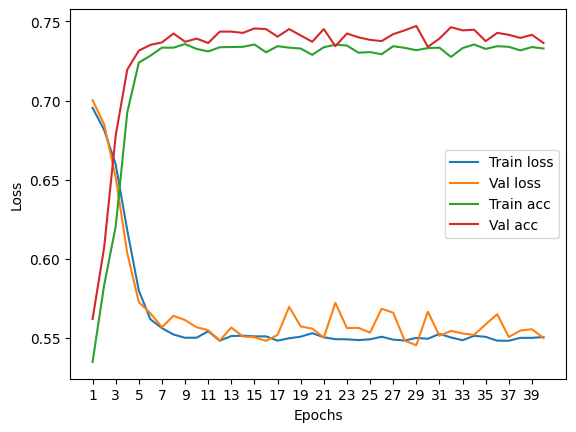

****************************************************************************************************



118it [00:00, 167.56it/s]


Train Epoch: 0 	Loss: 0.694108, Accuracy: 4060/7500 (54%)
Val Epoch: 0 	Loss: 0.696037, Accuracy: 1441/2500 (58%)



118it [00:00, 158.68it/s]


Train Epoch: 1 	Loss: 0.679775, Accuracy: 4405/7500 (59%)
Val Epoch: 1 	Loss: 0.675119, Accuracy: 1596/2500 (64%)



118it [00:00, 159.74it/s]


Train Epoch: 2 	Loss: 0.653040, Accuracy: 4826/7500 (64%)
Val Epoch: 2 	Loss: 0.660274, Accuracy: 1563/2500 (63%)



118it [00:00, 159.81it/s]


Train Epoch: 3 	Loss: 0.619215, Accuracy: 5219/7500 (70%)
Val Epoch: 3 	Loss: 0.602390, Accuracy: 1828/2500 (73%)



118it [00:00, 169.44it/s]


Train Epoch: 4 	Loss: 0.579368, Accuracy: 5483/7500 (73%)
Val Epoch: 4 	Loss: 0.570999, Accuracy: 1828/2500 (73%)



118it [00:00, 177.81it/s]


Train Epoch: 5 	Loss: 0.556084, Accuracy: 5517/7500 (74%)
Val Epoch: 5 	Loss: 0.556553, Accuracy: 1881/2500 (75%)



118it [00:00, 184.08it/s]


Train Epoch: 6 	Loss: 0.546834, Accuracy: 5563/7500 (74%)
Val Epoch: 6 	Loss: 0.550679, Accuracy: 1874/2500 (75%)



118it [00:00, 182.31it/s]


Train Epoch: 7 	Loss: 0.539840, Accuracy: 5553/7500 (74%)
Val Epoch: 7 	Loss: 0.545612, Accuracy: 1842/2500 (74%)



118it [00:00, 165.65it/s]


Train Epoch: 8 	Loss: 0.537634, Accuracy: 5563/7500 (74%)
Val Epoch: 8 	Loss: 0.545494, Accuracy: 1879/2500 (75%)



118it [00:00, 163.80it/s]


Train Epoch: 9 	Loss: 0.541763, Accuracy: 5567/7500 (74%)
Val Epoch: 9 	Loss: 0.542553, Accuracy: 1851/2500 (74%)



118it [00:00, 167.29it/s]


Train Epoch: 10 	Loss: 0.537456, Accuracy: 5566/7500 (74%)
Val Epoch: 10 	Loss: 0.549063, Accuracy: 1861/2500 (74%)



118it [00:00, 165.58it/s]


Train Epoch: 11 	Loss: 0.534297, Accuracy: 5566/7500 (74%)
Val Epoch: 11 	Loss: 0.567297, Accuracy: 1841/2500 (74%)



118it [00:00, 175.30it/s]


Train Epoch: 12 	Loss: 0.536808, Accuracy: 5570/7500 (74%)
Val Epoch: 12 	Loss: 0.560751, Accuracy: 1865/2500 (75%)



118it [00:00, 161.63it/s]


Train Epoch: 13 	Loss: 0.534277, Accuracy: 5578/7500 (74%)
Val Epoch: 13 	Loss: 0.556305, Accuracy: 1857/2500 (74%)



118it [00:00, 161.10it/s]


Train Epoch: 14 	Loss: 0.537349, Accuracy: 5578/7500 (74%)
Val Epoch: 14 	Loss: 0.541013, Accuracy: 1879/2500 (75%)



118it [00:00, 178.02it/s]


Train Epoch: 15 	Loss: 0.536379, Accuracy: 5586/7500 (74%)
Val Epoch: 15 	Loss: 0.544038, Accuracy: 1866/2500 (75%)



118it [00:00, 177.57it/s]


Train Epoch: 16 	Loss: 0.535794, Accuracy: 5562/7500 (74%)
Val Epoch: 16 	Loss: 0.552201, Accuracy: 1885/2500 (75%)



118it [00:00, 165.44it/s]


Train Epoch: 17 	Loss: 0.533649, Accuracy: 5600/7500 (75%)
Val Epoch: 17 	Loss: 0.551921, Accuracy: 1892/2500 (76%)



118it [00:00, 154.07it/s]


Train Epoch: 18 	Loss: 0.536692, Accuracy: 5575/7500 (74%)
Val Epoch: 18 	Loss: 0.552671, Accuracy: 1885/2500 (75%)



118it [00:00, 145.05it/s]


Train Epoch: 19 	Loss: 0.536544, Accuracy: 5592/7500 (75%)
Val Epoch: 19 	Loss: 0.546975, Accuracy: 1870/2500 (75%)



118it [00:00, 146.19it/s]


Train Epoch: 20 	Loss: 0.534947, Accuracy: 5588/7500 (75%)
Val Epoch: 20 	Loss: 0.547756, Accuracy: 1884/2500 (75%)



118it [00:00, 180.23it/s]


Train Epoch: 21 	Loss: 0.538330, Accuracy: 5594/7500 (75%)
Val Epoch: 21 	Loss: 0.557140, Accuracy: 1846/2500 (74%)



118it [00:00, 173.34it/s]


Train Epoch: 22 	Loss: 0.534542, Accuracy: 5592/7500 (75%)
Val Epoch: 22 	Loss: 0.537776, Accuracy: 1852/2500 (74%)



118it [00:00, 173.06it/s]


Train Epoch: 23 	Loss: 0.536527, Accuracy: 5568/7500 (74%)
Val Epoch: 23 	Loss: 0.538721, Accuracy: 1877/2500 (75%)



118it [00:00, 177.60it/s]


Train Epoch: 24 	Loss: 0.535240, Accuracy: 5574/7500 (74%)
Val Epoch: 24 	Loss: 0.538871, Accuracy: 1884/2500 (75%)



118it [00:00, 185.04it/s]


Train Epoch: 25 	Loss: 0.533494, Accuracy: 5582/7500 (74%)
Val Epoch: 25 	Loss: 0.537928, Accuracy: 1882/2500 (75%)



118it [00:00, 148.69it/s]


Train Epoch: 26 	Loss: 0.535033, Accuracy: 5587/7500 (74%)
Val Epoch: 26 	Loss: 0.536125, Accuracy: 1879/2500 (75%)



118it [00:00, 127.77it/s]


Train Epoch: 27 	Loss: 0.534424, Accuracy: 5618/7500 (75%)
Val Epoch: 27 	Loss: 0.535720, Accuracy: 1861/2500 (74%)



118it [00:00, 148.15it/s]


Train Epoch: 28 	Loss: 0.535354, Accuracy: 5572/7500 (74%)
Val Epoch: 28 	Loss: 0.536549, Accuracy: 1859/2500 (74%)



118it [00:00, 167.42it/s]


Train Epoch: 29 	Loss: 0.534624, Accuracy: 5568/7500 (74%)
Val Epoch: 29 	Loss: 0.545885, Accuracy: 1873/2500 (75%)



118it [00:00, 184.50it/s]


Train Epoch: 30 	Loss: 0.534308, Accuracy: 5590/7500 (75%)
Val Epoch: 30 	Loss: 0.559500, Accuracy: 1888/2500 (76%)



118it [00:00, 180.95it/s]


Train Epoch: 31 	Loss: 0.535208, Accuracy: 5609/7500 (75%)
Val Epoch: 31 	Loss: 0.535660, Accuracy: 1875/2500 (75%)



118it [00:00, 169.70it/s]


Train Epoch: 32 	Loss: 0.532694, Accuracy: 5597/7500 (75%)
Val Epoch: 32 	Loss: 0.533528, Accuracy: 1863/2500 (75%)



118it [00:00, 157.98it/s]


Train Epoch: 33 	Loss: 0.535917, Accuracy: 5588/7500 (75%)
Val Epoch: 33 	Loss: 0.549123, Accuracy: 1876/2500 (75%)



118it [00:00, 174.15it/s]


Train Epoch: 34 	Loss: 0.536861, Accuracy: 5583/7500 (74%)
Val Epoch: 34 	Loss: 0.548543, Accuracy: 1872/2500 (75%)



118it [00:00, 156.55it/s]


Train Epoch: 35 	Loss: 0.533879, Accuracy: 5604/7500 (75%)
Val Epoch: 35 	Loss: 0.537660, Accuracy: 1870/2500 (75%)



118it [00:00, 149.68it/s]


Train Epoch: 36 	Loss: 0.533906, Accuracy: 5604/7500 (75%)
Val Epoch: 36 	Loss: 0.546100, Accuracy: 1873/2500 (75%)



118it [00:00, 137.08it/s]


Train Epoch: 37 	Loss: 0.537618, Accuracy: 5582/7500 (74%)
Val Epoch: 37 	Loss: 0.534381, Accuracy: 1877/2500 (75%)



118it [00:00, 158.31it/s]


Train Epoch: 38 	Loss: 0.534406, Accuracy: 5572/7500 (74%)
Val Epoch: 38 	Loss: 0.541981, Accuracy: 1859/2500 (74%)



118it [00:00, 127.00it/s]


Train Epoch: 39 	Loss: 0.533032, Accuracy: 5582/7500 (74%)
Val Epoch: 39 	Loss: 0.536611, Accuracy: 1886/2500 (75%)

Test accuracy:  75.92


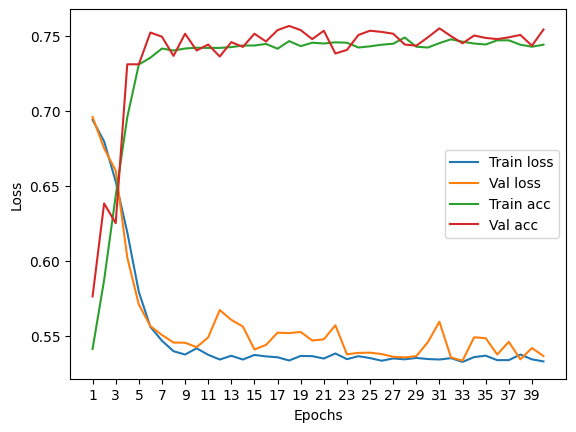

****************************************************************************************************



118it [00:00, 139.86it/s]


Train Epoch: 0 	Loss: 0.693595, Accuracy: 4006/7500 (53%)
Val Epoch: 0 	Loss: 0.698952, Accuracy: 1433/2500 (57%)



118it [00:00, 147.21it/s]


Train Epoch: 1 	Loss: 0.671480, Accuracy: 4529/7500 (60%)
Val Epoch: 1 	Loss: 0.661054, Accuracy: 1595/2500 (64%)



118it [00:00, 138.89it/s]


Train Epoch: 2 	Loss: 0.627263, Accuracy: 5086/7500 (68%)
Val Epoch: 2 	Loss: 0.615756, Accuracy: 1756/2500 (70%)



118it [00:00, 137.16it/s]


Train Epoch: 3 	Loss: 0.589973, Accuracy: 5333/7500 (71%)
Val Epoch: 3 	Loss: 0.584108, Accuracy: 1802/2500 (72%)



118it [00:00, 131.23it/s]


Train Epoch: 4 	Loss: 0.565372, Accuracy: 5455/7500 (73%)
Val Epoch: 4 	Loss: 0.567575, Accuracy: 1811/2500 (72%)



118it [00:00, 161.03it/s]


Train Epoch: 5 	Loss: 0.554932, Accuracy: 5494/7500 (73%)
Val Epoch: 5 	Loss: 0.562334, Accuracy: 1817/2500 (73%)



118it [00:00, 156.31it/s]


Train Epoch: 6 	Loss: 0.550864, Accuracy: 5495/7500 (73%)
Val Epoch: 6 	Loss: 0.557518, Accuracy: 1827/2500 (73%)



118it [00:01, 115.98it/s]


Train Epoch: 7 	Loss: 0.548851, Accuracy: 5527/7500 (74%)
Val Epoch: 7 	Loss: 0.550231, Accuracy: 1834/2500 (73%)



118it [00:00, 150.19it/s]


Train Epoch: 8 	Loss: 0.545861, Accuracy: 5529/7500 (74%)
Val Epoch: 8 	Loss: 0.546698, Accuracy: 1840/2500 (74%)



118it [00:00, 139.06it/s]


Train Epoch: 9 	Loss: 0.546547, Accuracy: 5529/7500 (74%)
Val Epoch: 9 	Loss: 0.553589, Accuracy: 1832/2500 (73%)



118it [00:00, 146.52it/s]


Train Epoch: 10 	Loss: 0.544835, Accuracy: 5519/7500 (74%)
Val Epoch: 10 	Loss: 0.564072, Accuracy: 1838/2500 (74%)



118it [00:00, 127.20it/s]


Train Epoch: 11 	Loss: 0.547415, Accuracy: 5537/7500 (74%)
Val Epoch: 11 	Loss: 0.558195, Accuracy: 1813/2500 (73%)



118it [00:00, 148.65it/s]


Train Epoch: 12 	Loss: 0.547554, Accuracy: 5511/7500 (73%)
Val Epoch: 12 	Loss: 0.557455, Accuracy: 1848/2500 (74%)



118it [00:00, 151.65it/s]


Train Epoch: 13 	Loss: 0.544691, Accuracy: 5547/7500 (74%)
Val Epoch: 13 	Loss: 0.547739, Accuracy: 1842/2500 (74%)



118it [00:00, 146.14it/s]


Train Epoch: 14 	Loss: 0.546378, Accuracy: 5537/7500 (74%)
Val Epoch: 14 	Loss: 0.557608, Accuracy: 1843/2500 (74%)



118it [00:00, 145.61it/s]


Train Epoch: 15 	Loss: 0.545436, Accuracy: 5535/7500 (74%)
Val Epoch: 15 	Loss: 0.550702, Accuracy: 1843/2500 (74%)



118it [00:00, 156.10it/s]


Train Epoch: 16 	Loss: 0.545549, Accuracy: 5549/7500 (74%)
Val Epoch: 16 	Loss: 0.563373, Accuracy: 1836/2500 (73%)



118it [00:00, 131.79it/s]


Train Epoch: 17 	Loss: 0.546315, Accuracy: 5517/7500 (74%)
Val Epoch: 17 	Loss: 0.561049, Accuracy: 1840/2500 (74%)



118it [00:00, 144.98it/s]


Train Epoch: 18 	Loss: 0.545305, Accuracy: 5511/7500 (73%)
Val Epoch: 18 	Loss: 0.542273, Accuracy: 1840/2500 (74%)



118it [00:00, 140.67it/s]


Train Epoch: 19 	Loss: 0.546148, Accuracy: 5538/7500 (74%)
Val Epoch: 19 	Loss: 0.555850, Accuracy: 1821/2500 (73%)



118it [00:00, 140.39it/s]


Train Epoch: 20 	Loss: 0.544153, Accuracy: 5544/7500 (74%)
Val Epoch: 20 	Loss: 0.554371, Accuracy: 1842/2500 (74%)



118it [00:00, 160.68it/s]


Train Epoch: 21 	Loss: 0.543901, Accuracy: 5531/7500 (74%)
Val Epoch: 21 	Loss: 0.566752, Accuracy: 1834/2500 (73%)



118it [00:00, 125.81it/s]


Train Epoch: 22 	Loss: 0.543994, Accuracy: 5548/7500 (74%)
Val Epoch: 22 	Loss: 0.554087, Accuracy: 1847/2500 (74%)



118it [00:01, 89.70it/s]


Train Epoch: 23 	Loss: 0.546130, Accuracy: 5535/7500 (74%)
Val Epoch: 23 	Loss: 0.546063, Accuracy: 1845/2500 (74%)



118it [00:00, 120.64it/s]


Train Epoch: 24 	Loss: 0.543804, Accuracy: 5559/7500 (74%)
Val Epoch: 24 	Loss: 0.556885, Accuracy: 1826/2500 (73%)



118it [00:00, 125.14it/s]


Train Epoch: 25 	Loss: 0.545219, Accuracy: 5543/7500 (74%)
Val Epoch: 25 	Loss: 0.551514, Accuracy: 1848/2500 (74%)



118it [00:00, 141.65it/s]


Train Epoch: 26 	Loss: 0.544472, Accuracy: 5539/7500 (74%)
Val Epoch: 26 	Loss: 0.550774, Accuracy: 1831/2500 (73%)



118it [00:01, 116.91it/s]


Train Epoch: 27 	Loss: 0.544344, Accuracy: 5535/7500 (74%)
Val Epoch: 27 	Loss: 0.549276, Accuracy: 1835/2500 (73%)



118it [00:00, 132.63it/s]


Train Epoch: 28 	Loss: 0.545029, Accuracy: 5512/7500 (73%)
Val Epoch: 28 	Loss: 0.546584, Accuracy: 1841/2500 (74%)



118it [00:00, 142.16it/s]


Train Epoch: 29 	Loss: 0.544065, Accuracy: 5556/7500 (74%)
Val Epoch: 29 	Loss: 0.557250, Accuracy: 1837/2500 (73%)



118it [00:00, 146.69it/s]


Train Epoch: 30 	Loss: 0.544854, Accuracy: 5516/7500 (74%)
Val Epoch: 30 	Loss: 0.564543, Accuracy: 1833/2500 (73%)



118it [00:00, 145.40it/s]


Train Epoch: 31 	Loss: 0.546191, Accuracy: 5547/7500 (74%)
Val Epoch: 31 	Loss: 0.561471, Accuracy: 1821/2500 (73%)



118it [00:00, 163.16it/s]


Train Epoch: 32 	Loss: 0.542860, Accuracy: 5549/7500 (74%)
Val Epoch: 32 	Loss: 0.554834, Accuracy: 1836/2500 (73%)



118it [00:00, 140.04it/s]


Train Epoch: 33 	Loss: 0.542433, Accuracy: 5529/7500 (74%)
Val Epoch: 33 	Loss: 0.550318, Accuracy: 1839/2500 (74%)



118it [00:00, 154.53it/s]


Train Epoch: 34 	Loss: 0.545006, Accuracy: 5544/7500 (74%)
Val Epoch: 34 	Loss: 0.553888, Accuracy: 1846/2500 (74%)



118it [00:00, 129.60it/s]


Train Epoch: 35 	Loss: 0.546202, Accuracy: 5529/7500 (74%)
Val Epoch: 35 	Loss: 0.551050, Accuracy: 1841/2500 (74%)



118it [00:00, 169.13it/s]


Train Epoch: 36 	Loss: 0.543324, Accuracy: 5570/7500 (74%)
Val Epoch: 36 	Loss: 0.545984, Accuracy: 1835/2500 (73%)



118it [00:00, 151.91it/s]


Train Epoch: 37 	Loss: 0.543412, Accuracy: 5565/7500 (74%)
Val Epoch: 37 	Loss: 0.555337, Accuracy: 1839/2500 (74%)



118it [00:00, 153.21it/s]


Train Epoch: 38 	Loss: 0.542537, Accuracy: 5548/7500 (74%)
Val Epoch: 38 	Loss: 0.542451, Accuracy: 1851/2500 (74%)



118it [00:00, 177.95it/s]


Train Epoch: 39 	Loss: 0.544009, Accuracy: 5548/7500 (74%)
Val Epoch: 39 	Loss: 0.550307, Accuracy: 1849/2500 (74%)

Test accuracy:  73.44000000000001


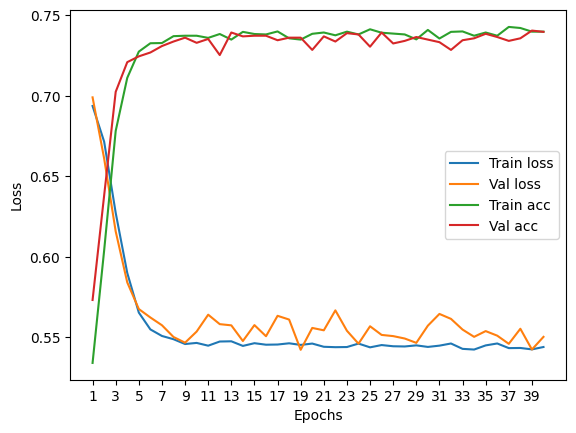

****************************************************************************************************



118it [00:00, 118.80it/s]


Train Epoch: 0 	Loss: 0.698483, Accuracy: 3814/7500 (51%)
Val Epoch: 0 	Loss: 0.699612, Accuracy: 1476/2500 (59%)



118it [00:00, 135.68it/s]


Train Epoch: 1 	Loss: 0.672901, Accuracy: 4758/7500 (63%)
Val Epoch: 1 	Loss: 0.657287, Accuracy: 1655/2500 (66%)



118it [00:00, 138.98it/s]


Train Epoch: 2 	Loss: 0.628905, Accuracy: 5163/7500 (69%)
Val Epoch: 2 	Loss: 0.610839, Accuracy: 1787/2500 (71%)



118it [00:01, 111.05it/s]


Train Epoch: 3 	Loss: 0.584604, Accuracy: 5435/7500 (72%)
Val Epoch: 3 	Loss: 0.587304, Accuracy: 1771/2500 (71%)



118it [00:00, 147.72it/s]


Train Epoch: 4 	Loss: 0.562151, Accuracy: 5482/7500 (73%)
Val Epoch: 4 	Loss: 0.577605, Accuracy: 1767/2500 (71%)



118it [00:00, 154.91it/s]


Train Epoch: 5 	Loss: 0.552748, Accuracy: 5536/7500 (74%)
Val Epoch: 5 	Loss: 0.561944, Accuracy: 1797/2500 (72%)



118it [00:00, 146.20it/s]


Train Epoch: 6 	Loss: 0.551570, Accuracy: 5516/7500 (74%)
Val Epoch: 6 	Loss: 0.556426, Accuracy: 1850/2500 (74%)



118it [00:00, 130.46it/s]


Train Epoch: 7 	Loss: 0.547995, Accuracy: 5519/7500 (74%)
Val Epoch: 7 	Loss: 0.557021, Accuracy: 1854/2500 (74%)



118it [00:01, 108.16it/s]


Train Epoch: 8 	Loss: 0.548654, Accuracy: 5524/7500 (74%)
Val Epoch: 8 	Loss: 0.548740, Accuracy: 1844/2500 (74%)



118it [00:01, 91.10it/s] 


Train Epoch: 9 	Loss: 0.547871, Accuracy: 5530/7500 (74%)
Val Epoch: 9 	Loss: 0.543347, Accuracy: 1849/2500 (74%)



118it [00:00, 129.40it/s]


Train Epoch: 10 	Loss: 0.545959, Accuracy: 5524/7500 (74%)
Val Epoch: 10 	Loss: 0.558444, Accuracy: 1849/2500 (74%)



118it [00:00, 125.05it/s]


Train Epoch: 11 	Loss: 0.545390, Accuracy: 5552/7500 (74%)
Val Epoch: 11 	Loss: 0.555139, Accuracy: 1841/2500 (74%)



118it [00:00, 141.61it/s]


Train Epoch: 12 	Loss: 0.547318, Accuracy: 5532/7500 (74%)
Val Epoch: 12 	Loss: 0.540839, Accuracy: 1833/2500 (73%)



118it [00:00, 153.00it/s]


Train Epoch: 13 	Loss: 0.544810, Accuracy: 5527/7500 (74%)
Val Epoch: 13 	Loss: 0.556160, Accuracy: 1853/2500 (74%)



118it [00:00, 141.47it/s]


Train Epoch: 14 	Loss: 0.547164, Accuracy: 5558/7500 (74%)
Val Epoch: 14 	Loss: 0.556894, Accuracy: 1829/2500 (73%)



118it [00:00, 157.84it/s]


Train Epoch: 15 	Loss: 0.549005, Accuracy: 5527/7500 (74%)
Val Epoch: 15 	Loss: 0.568560, Accuracy: 1837/2500 (73%)



118it [00:00, 133.09it/s]


Train Epoch: 16 	Loss: 0.545859, Accuracy: 5554/7500 (74%)
Val Epoch: 16 	Loss: 0.548905, Accuracy: 1830/2500 (73%)



118it [00:00, 141.99it/s]


Train Epoch: 17 	Loss: 0.542986, Accuracy: 5564/7500 (74%)
Val Epoch: 17 	Loss: 0.551921, Accuracy: 1853/2500 (74%)



118it [00:00, 127.63it/s]


Train Epoch: 18 	Loss: 0.544767, Accuracy: 5535/7500 (74%)
Val Epoch: 18 	Loss: 0.549868, Accuracy: 1846/2500 (74%)



118it [00:00, 147.80it/s]


Train Epoch: 19 	Loss: 0.543737, Accuracy: 5542/7500 (74%)
Val Epoch: 19 	Loss: 0.552955, Accuracy: 1853/2500 (74%)



118it [00:00, 141.85it/s]


Train Epoch: 20 	Loss: 0.542737, Accuracy: 5562/7500 (74%)
Val Epoch: 20 	Loss: 0.561685, Accuracy: 1836/2500 (73%)



118it [00:00, 129.18it/s]


Train Epoch: 21 	Loss: 0.544492, Accuracy: 5544/7500 (74%)
Val Epoch: 21 	Loss: 0.546064, Accuracy: 1857/2500 (74%)



118it [00:00, 138.73it/s]


Train Epoch: 22 	Loss: 0.544702, Accuracy: 5552/7500 (74%)
Val Epoch: 22 	Loss: 0.543933, Accuracy: 1855/2500 (74%)



118it [00:00, 129.42it/s]


Train Epoch: 23 	Loss: 0.543916, Accuracy: 5520/7500 (74%)
Val Epoch: 23 	Loss: 0.548905, Accuracy: 1814/2500 (73%)



118it [00:00, 160.29it/s]


Train Epoch: 24 	Loss: 0.544212, Accuracy: 5548/7500 (74%)
Val Epoch: 24 	Loss: 0.547352, Accuracy: 1850/2500 (74%)



118it [00:00, 147.53it/s]


Train Epoch: 25 	Loss: 0.543288, Accuracy: 5555/7500 (74%)
Val Epoch: 25 	Loss: 0.546246, Accuracy: 1845/2500 (74%)



118it [00:00, 132.04it/s]


Train Epoch: 26 	Loss: 0.541941, Accuracy: 5556/7500 (74%)
Val Epoch: 26 	Loss: 0.564319, Accuracy: 1855/2500 (74%)



118it [00:00, 161.71it/s]


Train Epoch: 27 	Loss: 0.547397, Accuracy: 5509/7500 (73%)
Val Epoch: 27 	Loss: 0.546220, Accuracy: 1856/2500 (74%)



118it [00:00, 158.33it/s]


Train Epoch: 28 	Loss: 0.544474, Accuracy: 5555/7500 (74%)
Val Epoch: 28 	Loss: 0.546413, Accuracy: 1852/2500 (74%)



118it [00:00, 148.18it/s]


Train Epoch: 29 	Loss: 0.544256, Accuracy: 5529/7500 (74%)
Val Epoch: 29 	Loss: 0.566428, Accuracy: 1851/2500 (74%)



118it [00:00, 143.57it/s]


Train Epoch: 30 	Loss: 0.543918, Accuracy: 5534/7500 (74%)
Val Epoch: 30 	Loss: 0.549721, Accuracy: 1854/2500 (74%)



118it [00:00, 152.27it/s]


Train Epoch: 31 	Loss: 0.546157, Accuracy: 5540/7500 (74%)
Val Epoch: 31 	Loss: 0.549289, Accuracy: 1843/2500 (74%)



118it [00:00, 133.33it/s]


Train Epoch: 32 	Loss: 0.544043, Accuracy: 5539/7500 (74%)
Val Epoch: 32 	Loss: 0.551933, Accuracy: 1851/2500 (74%)



118it [00:00, 151.70it/s]


Train Epoch: 33 	Loss: 0.541735, Accuracy: 5568/7500 (74%)
Val Epoch: 33 	Loss: 0.557949, Accuracy: 1842/2500 (74%)



118it [00:00, 147.57it/s]


Train Epoch: 34 	Loss: 0.544977, Accuracy: 5544/7500 (74%)
Val Epoch: 34 	Loss: 0.557127, Accuracy: 1850/2500 (74%)



118it [00:00, 148.74it/s]


Train Epoch: 35 	Loss: 0.543152, Accuracy: 5554/7500 (74%)
Val Epoch: 35 	Loss: 0.560500, Accuracy: 1850/2500 (74%)



118it [00:00, 129.10it/s]


Train Epoch: 36 	Loss: 0.545537, Accuracy: 5522/7500 (74%)
Val Epoch: 36 	Loss: 0.551771, Accuracy: 1850/2500 (74%)



118it [00:00, 138.26it/s]


Train Epoch: 37 	Loss: 0.543822, Accuracy: 5552/7500 (74%)
Val Epoch: 37 	Loss: 0.557365, Accuracy: 1840/2500 (74%)



118it [00:00, 139.82it/s]


Train Epoch: 38 	Loss: 0.543135, Accuracy: 5540/7500 (74%)
Val Epoch: 38 	Loss: 0.543288, Accuracy: 1841/2500 (74%)



118it [00:01, 111.36it/s]


Train Epoch: 39 	Loss: 0.544147, Accuracy: 5563/7500 (74%)
Val Epoch: 39 	Loss: 0.544715, Accuracy: 1855/2500 (74%)

Test accuracy:  73.4


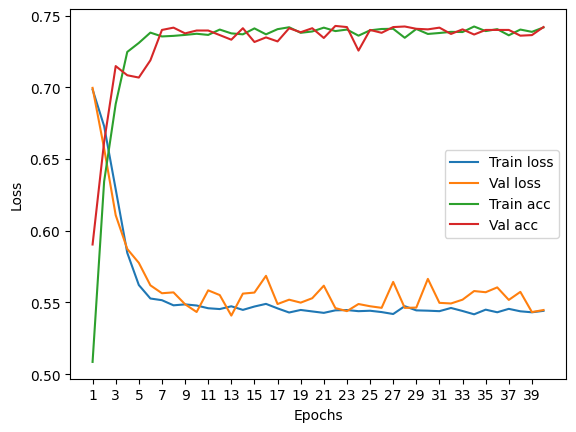

****************************************************************************************************



118it [00:00, 154.92it/s]


Train Epoch: 0 	Loss: 0.697354, Accuracy: 3818/7500 (51%)
Val Epoch: 0 	Loss: 0.703893, Accuracy: 1435/2500 (57%)



118it [00:00, 155.19it/s]


Train Epoch: 1 	Loss: 0.679410, Accuracy: 4518/7500 (60%)
Val Epoch: 1 	Loss: 0.679577, Accuracy: 1539/2500 (62%)



118it [00:00, 163.84it/s]


Train Epoch: 2 	Loss: 0.653599, Accuracy: 4771/7500 (64%)
Val Epoch: 2 	Loss: 0.663662, Accuracy: 1549/2500 (62%)



118it [00:00, 169.58it/s]


Train Epoch: 3 	Loss: 0.626869, Accuracy: 5043/7500 (67%)
Val Epoch: 3 	Loss: 0.634411, Accuracy: 1704/2500 (68%)



118it [00:00, 158.56it/s]


Train Epoch: 4 	Loss: 0.596009, Accuracy: 5287/7500 (70%)
Val Epoch: 4 	Loss: 0.610593, Accuracy: 1759/2500 (70%)



118it [00:00, 170.70it/s]


Train Epoch: 5 	Loss: 0.572706, Accuracy: 5476/7500 (73%)
Val Epoch: 5 	Loss: 0.588164, Accuracy: 1801/2500 (72%)



118it [00:00, 167.33it/s]


Train Epoch: 6 	Loss: 0.558576, Accuracy: 5502/7500 (73%)
Val Epoch: 6 	Loss: 0.578006, Accuracy: 1811/2500 (72%)



118it [00:00, 156.99it/s]


Train Epoch: 7 	Loss: 0.548069, Accuracy: 5555/7500 (74%)
Val Epoch: 7 	Loss: 0.574178, Accuracy: 1777/2500 (71%)



118it [00:00, 187.50it/s]


Train Epoch: 8 	Loss: 0.543905, Accuracy: 5568/7500 (74%)
Val Epoch: 8 	Loss: 0.569779, Accuracy: 1838/2500 (74%)



118it [00:00, 156.45it/s]


Train Epoch: 9 	Loss: 0.546896, Accuracy: 5569/7500 (74%)
Val Epoch: 9 	Loss: 0.573571, Accuracy: 1828/2500 (73%)



118it [00:00, 173.21it/s]


Train Epoch: 10 	Loss: 0.541405, Accuracy: 5565/7500 (74%)
Val Epoch: 10 	Loss: 0.576694, Accuracy: 1795/2500 (72%)



118it [00:00, 170.92it/s]


Train Epoch: 11 	Loss: 0.542229, Accuracy: 5559/7500 (74%)
Val Epoch: 11 	Loss: 0.571700, Accuracy: 1826/2500 (73%)



118it [00:00, 153.15it/s]


Train Epoch: 12 	Loss: 0.543436, Accuracy: 5589/7500 (75%)
Val Epoch: 12 	Loss: 0.572991, Accuracy: 1831/2500 (73%)



118it [00:00, 149.67it/s]


Train Epoch: 13 	Loss: 0.541485, Accuracy: 5553/7500 (74%)
Val Epoch: 13 	Loss: 0.568889, Accuracy: 1823/2500 (73%)



118it [00:00, 131.44it/s]


Train Epoch: 14 	Loss: 0.540380, Accuracy: 5578/7500 (74%)
Val Epoch: 14 	Loss: 0.583694, Accuracy: 1800/2500 (72%)



118it [00:01, 114.69it/s]


Train Epoch: 15 	Loss: 0.542817, Accuracy: 5567/7500 (74%)
Val Epoch: 15 	Loss: 0.571862, Accuracy: 1832/2500 (73%)



118it [00:00, 149.22it/s]


Train Epoch: 16 	Loss: 0.539094, Accuracy: 5559/7500 (74%)
Val Epoch: 16 	Loss: 0.575526, Accuracy: 1820/2500 (73%)



118it [00:00, 128.52it/s]


Train Epoch: 17 	Loss: 0.540918, Accuracy: 5539/7500 (74%)
Val Epoch: 17 	Loss: 0.580208, Accuracy: 1787/2500 (71%)



118it [00:00, 148.31it/s]


Train Epoch: 18 	Loss: 0.540635, Accuracy: 5573/7500 (74%)
Val Epoch: 18 	Loss: 0.576717, Accuracy: 1825/2500 (73%)



118it [00:00, 125.67it/s]


Train Epoch: 19 	Loss: 0.541152, Accuracy: 5583/7500 (74%)
Val Epoch: 19 	Loss: 0.574015, Accuracy: 1828/2500 (73%)



118it [00:01, 98.52it/s]


Train Epoch: 20 	Loss: 0.540596, Accuracy: 5588/7500 (75%)
Val Epoch: 20 	Loss: 0.567573, Accuracy: 1831/2500 (73%)



118it [00:01, 112.23it/s]


Train Epoch: 21 	Loss: 0.541446, Accuracy: 5587/7500 (74%)
Val Epoch: 21 	Loss: 0.570395, Accuracy: 1827/2500 (73%)



118it [00:00, 136.43it/s]


Train Epoch: 22 	Loss: 0.539489, Accuracy: 5577/7500 (74%)
Val Epoch: 22 	Loss: 0.597144, Accuracy: 1819/2500 (73%)



118it [00:00, 160.28it/s]


Train Epoch: 23 	Loss: 0.540799, Accuracy: 5563/7500 (74%)
Val Epoch: 23 	Loss: 0.575603, Accuracy: 1815/2500 (73%)



118it [00:00, 145.43it/s]


Train Epoch: 24 	Loss: 0.539466, Accuracy: 5576/7500 (74%)
Val Epoch: 24 	Loss: 0.577464, Accuracy: 1827/2500 (73%)



118it [00:00, 158.34it/s]


Train Epoch: 25 	Loss: 0.540773, Accuracy: 5573/7500 (74%)
Val Epoch: 25 	Loss: 0.570868, Accuracy: 1810/2500 (72%)



118it [00:01, 114.01it/s]


Train Epoch: 26 	Loss: 0.540909, Accuracy: 5596/7500 (75%)
Val Epoch: 26 	Loss: 0.573303, Accuracy: 1831/2500 (73%)



118it [00:00, 143.06it/s]


Train Epoch: 27 	Loss: 0.538874, Accuracy: 5581/7500 (74%)
Val Epoch: 27 	Loss: 0.561974, Accuracy: 1823/2500 (73%)



118it [00:01, 115.86it/s]


Train Epoch: 28 	Loss: 0.543037, Accuracy: 5548/7500 (74%)
Val Epoch: 28 	Loss: 0.576077, Accuracy: 1831/2500 (73%)



118it [00:01, 102.48it/s]


Train Epoch: 29 	Loss: 0.542739, Accuracy: 5591/7500 (75%)
Val Epoch: 29 	Loss: 0.569913, Accuracy: 1831/2500 (73%)



118it [00:00, 165.23it/s]


Train Epoch: 30 	Loss: 0.542829, Accuracy: 5584/7500 (74%)
Val Epoch: 30 	Loss: 0.576285, Accuracy: 1780/2500 (71%)



118it [00:00, 143.20it/s]


Train Epoch: 31 	Loss: 0.538259, Accuracy: 5579/7500 (74%)
Val Epoch: 31 	Loss: 0.576069, Accuracy: 1814/2500 (73%)



118it [00:00, 151.34it/s]


Train Epoch: 32 	Loss: 0.540621, Accuracy: 5594/7500 (75%)
Val Epoch: 32 	Loss: 0.562063, Accuracy: 1842/2500 (74%)



118it [00:00, 140.01it/s]


Train Epoch: 33 	Loss: 0.538361, Accuracy: 5585/7500 (74%)
Val Epoch: 33 	Loss: 0.568822, Accuracy: 1831/2500 (73%)



118it [00:01, 98.43it/s] 


Train Epoch: 34 	Loss: 0.541008, Accuracy: 5568/7500 (74%)
Val Epoch: 34 	Loss: 0.563722, Accuracy: 1833/2500 (73%)



118it [00:00, 124.35it/s]


Train Epoch: 35 	Loss: 0.539389, Accuracy: 5547/7500 (74%)
Val Epoch: 35 	Loss: 0.575198, Accuracy: 1814/2500 (73%)



118it [00:01, 115.69it/s]


Train Epoch: 36 	Loss: 0.543138, Accuracy: 5588/7500 (75%)
Val Epoch: 36 	Loss: 0.565577, Accuracy: 1832/2500 (73%)



118it [00:01, 95.63it/s]


Train Epoch: 37 	Loss: 0.539997, Accuracy: 5569/7500 (74%)
Val Epoch: 37 	Loss: 0.581665, Accuracy: 1813/2500 (73%)



118it [00:00, 139.07it/s]


Train Epoch: 38 	Loss: 0.540500, Accuracy: 5590/7500 (75%)
Val Epoch: 38 	Loss: 0.574655, Accuracy: 1827/2500 (73%)



118it [00:00, 140.52it/s]


Train Epoch: 39 	Loss: 0.541618, Accuracy: 5576/7500 (74%)
Val Epoch: 39 	Loss: 0.579554, Accuracy: 1827/2500 (73%)

Test accuracy:  72.76


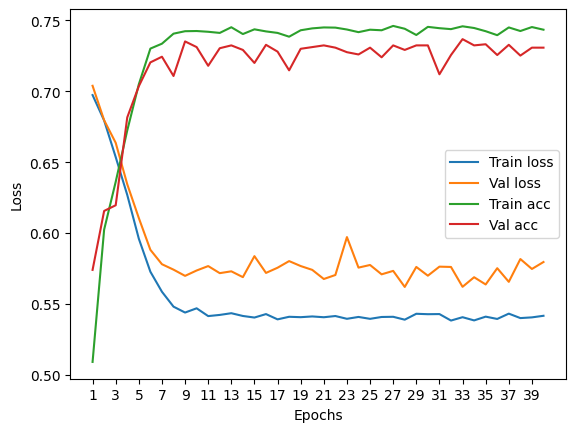

****************************************************************************************************



118it [00:00, 118.68it/s]


Train Epoch: 0 	Loss: 0.694643, Accuracy: 4058/7500 (54%)
Val Epoch: 0 	Loss: 0.700139, Accuracy: 1416/2500 (57%)



118it [00:00, 160.13it/s]


Train Epoch: 1 	Loss: 0.679348, Accuracy: 4390/7500 (59%)
Val Epoch: 1 	Loss: 0.676075, Accuracy: 1537/2500 (61%)



118it [00:00, 158.72it/s]


Train Epoch: 2 	Loss: 0.651055, Accuracy: 4833/7500 (64%)
Val Epoch: 2 	Loss: 0.643635, Accuracy: 1662/2500 (66%)



118it [00:00, 140.68it/s]


Train Epoch: 3 	Loss: 0.605452, Accuracy: 5246/7500 (70%)
Val Epoch: 3 	Loss: 0.595145, Accuracy: 1828/2500 (73%)



118it [00:00, 156.84it/s]


Train Epoch: 4 	Loss: 0.573676, Accuracy: 5424/7500 (72%)
Val Epoch: 4 	Loss: 0.572540, Accuracy: 1807/2500 (72%)



118it [00:00, 143.02it/s]


Train Epoch: 5 	Loss: 0.560528, Accuracy: 5452/7500 (73%)
Val Epoch: 5 	Loss: 0.568706, Accuracy: 1855/2500 (74%)



118it [00:01, 116.59it/s]


Train Epoch: 6 	Loss: 0.560082, Accuracy: 5459/7500 (73%)
Val Epoch: 6 	Loss: 0.568084, Accuracy: 1848/2500 (74%)



118it [00:00, 126.43it/s]


Train Epoch: 7 	Loss: 0.554931, Accuracy: 5496/7500 (73%)
Val Epoch: 7 	Loss: 0.561846, Accuracy: 1817/2500 (73%)



118it [00:00, 126.25it/s]


Train Epoch: 8 	Loss: 0.554794, Accuracy: 5492/7500 (73%)
Val Epoch: 8 	Loss: 0.569268, Accuracy: 1780/2500 (71%)



118it [00:00, 133.87it/s]


Train Epoch: 9 	Loss: 0.553508, Accuracy: 5515/7500 (74%)
Val Epoch: 9 	Loss: 0.561031, Accuracy: 1857/2500 (74%)



118it [00:00, 119.85it/s]


Train Epoch: 10 	Loss: 0.556024, Accuracy: 5493/7500 (73%)
Val Epoch: 10 	Loss: 0.569588, Accuracy: 1818/2500 (73%)



118it [00:01, 113.33it/s]


Train Epoch: 11 	Loss: 0.553943, Accuracy: 5472/7500 (73%)
Val Epoch: 11 	Loss: 0.567875, Accuracy: 1856/2500 (74%)



118it [00:01, 94.15it/s] 


Train Epoch: 12 	Loss: 0.552881, Accuracy: 5490/7500 (73%)
Val Epoch: 12 	Loss: 0.565620, Accuracy: 1822/2500 (73%)



118it [00:00, 120.29it/s]


Train Epoch: 13 	Loss: 0.555836, Accuracy: 5497/7500 (73%)
Val Epoch: 13 	Loss: 0.556178, Accuracy: 1858/2500 (74%)



118it [00:01, 114.78it/s]


Train Epoch: 14 	Loss: 0.553710, Accuracy: 5500/7500 (73%)
Val Epoch: 14 	Loss: 0.560339, Accuracy: 1848/2500 (74%)



118it [00:00, 141.98it/s]


Train Epoch: 15 	Loss: 0.551812, Accuracy: 5506/7500 (73%)
Val Epoch: 15 	Loss: 0.562544, Accuracy: 1821/2500 (73%)



118it [00:00, 151.76it/s]


Train Epoch: 16 	Loss: 0.552915, Accuracy: 5497/7500 (73%)
Val Epoch: 16 	Loss: 0.556068, Accuracy: 1851/2500 (74%)



118it [00:00, 159.32it/s]


Train Epoch: 17 	Loss: 0.553750, Accuracy: 5499/7500 (73%)
Val Epoch: 17 	Loss: 0.558521, Accuracy: 1808/2500 (72%)



118it [00:00, 153.35it/s]


Train Epoch: 18 	Loss: 0.554778, Accuracy: 5518/7500 (74%)
Val Epoch: 18 	Loss: 0.563286, Accuracy: 1848/2500 (74%)



118it [00:01, 98.10it/s] 


Train Epoch: 19 	Loss: 0.553852, Accuracy: 5504/7500 (73%)
Val Epoch: 19 	Loss: 0.559950, Accuracy: 1827/2500 (73%)



118it [00:00, 125.93it/s]


Train Epoch: 20 	Loss: 0.552743, Accuracy: 5515/7500 (74%)
Val Epoch: 20 	Loss: 0.555727, Accuracy: 1868/2500 (75%)



118it [00:00, 165.15it/s]


Train Epoch: 21 	Loss: 0.552259, Accuracy: 5489/7500 (73%)
Val Epoch: 21 	Loss: 0.559106, Accuracy: 1843/2500 (74%)



118it [00:00, 159.11it/s]


Train Epoch: 22 	Loss: 0.552007, Accuracy: 5490/7500 (73%)
Val Epoch: 22 	Loss: 0.553863, Accuracy: 1877/2500 (75%)



118it [00:00, 157.14it/s]


Train Epoch: 23 	Loss: 0.553065, Accuracy: 5499/7500 (73%)
Val Epoch: 23 	Loss: 0.562570, Accuracy: 1877/2500 (75%)



118it [00:00, 165.88it/s]


Train Epoch: 24 	Loss: 0.554200, Accuracy: 5507/7500 (73%)
Val Epoch: 24 	Loss: 0.560872, Accuracy: 1856/2500 (74%)



118it [00:00, 152.79it/s]


Train Epoch: 25 	Loss: 0.553252, Accuracy: 5468/7500 (73%)
Val Epoch: 25 	Loss: 0.565806, Accuracy: 1821/2500 (73%)



118it [00:00, 139.93it/s]


Train Epoch: 26 	Loss: 0.550974, Accuracy: 5521/7500 (74%)
Val Epoch: 26 	Loss: 0.557762, Accuracy: 1839/2500 (74%)



118it [00:00, 138.55it/s]


Train Epoch: 27 	Loss: 0.552789, Accuracy: 5501/7500 (73%)
Val Epoch: 27 	Loss: 0.565651, Accuracy: 1854/2500 (74%)



118it [00:00, 154.68it/s]


Train Epoch: 28 	Loss: 0.552143, Accuracy: 5491/7500 (73%)
Val Epoch: 28 	Loss: 0.567865, Accuracy: 1801/2500 (72%)



118it [00:00, 124.71it/s]


Train Epoch: 29 	Loss: 0.552452, Accuracy: 5514/7500 (74%)
Val Epoch: 29 	Loss: 0.554568, Accuracy: 1866/2500 (75%)



118it [00:01, 88.48it/s]


Train Epoch: 30 	Loss: 0.553539, Accuracy: 5496/7500 (73%)
Val Epoch: 30 	Loss: 0.551053, Accuracy: 1868/2500 (75%)



118it [00:01, 115.63it/s]


Train Epoch: 31 	Loss: 0.553022, Accuracy: 5509/7500 (73%)
Val Epoch: 31 	Loss: 0.560231, Accuracy: 1851/2500 (74%)



118it [00:01, 116.04it/s]


Train Epoch: 32 	Loss: 0.551010, Accuracy: 5488/7500 (73%)
Val Epoch: 32 	Loss: 0.555334, Accuracy: 1864/2500 (75%)



118it [00:00, 143.72it/s]


Train Epoch: 33 	Loss: 0.553749, Accuracy: 5495/7500 (73%)
Val Epoch: 33 	Loss: 0.553835, Accuracy: 1854/2500 (74%)



118it [00:01, 117.05it/s]


Train Epoch: 34 	Loss: 0.551331, Accuracy: 5534/7500 (74%)
Val Epoch: 34 	Loss: 0.564165, Accuracy: 1808/2500 (72%)



118it [00:00, 119.56it/s]


Train Epoch: 35 	Loss: 0.552888, Accuracy: 5505/7500 (73%)
Val Epoch: 35 	Loss: 0.563750, Accuracy: 1836/2500 (73%)



118it [00:00, 119.72it/s]


Train Epoch: 36 	Loss: 0.553818, Accuracy: 5527/7500 (74%)
Val Epoch: 36 	Loss: 0.559353, Accuracy: 1839/2500 (74%)



118it [00:00, 120.89it/s]


Train Epoch: 37 	Loss: 0.553332, Accuracy: 5502/7500 (73%)
Val Epoch: 37 	Loss: 0.555857, Accuracy: 1843/2500 (74%)



118it [00:01, 104.68it/s]


Train Epoch: 38 	Loss: 0.552799, Accuracy: 5507/7500 (73%)
Val Epoch: 38 	Loss: 0.556161, Accuracy: 1841/2500 (74%)



118it [00:00, 131.37it/s]


Train Epoch: 39 	Loss: 0.555615, Accuracy: 5494/7500 (73%)
Val Epoch: 39 	Loss: 0.555386, Accuracy: 1833/2500 (73%)

Test accuracy:  74.24


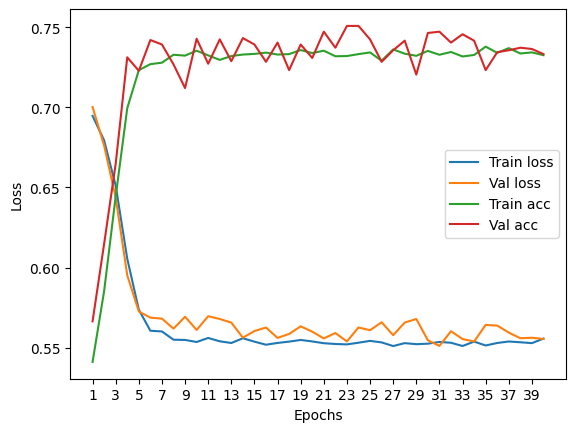

****************************************************************************************************



116it [00:00, 154.37it/s]


Train Epoch: 0 	Loss: 0.691677, Accuracy: 3912/7422 (53%)
Val Epoch: 0 	Loss: 0.691644, Accuracy: 1378/2474 (56%)



116it [00:00, 171.12it/s]


Train Epoch: 1 	Loss: 0.676824, Accuracy: 4356/7422 (59%)
Val Epoch: 1 	Loss: 0.672807, Accuracy: 1513/2474 (61%)



116it [00:00, 144.46it/s]


Train Epoch: 2 	Loss: 0.652082, Accuracy: 4731/7422 (64%)
Val Epoch: 2 	Loss: 0.636960, Accuracy: 1685/2474 (68%)



116it [00:00, 162.78it/s]


Train Epoch: 3 	Loss: 0.616809, Accuracy: 5112/7422 (69%)
Val Epoch: 3 	Loss: 0.591710, Accuracy: 1794/2474 (73%)



116it [00:00, 156.89it/s]


Train Epoch: 4 	Loss: 0.579115, Accuracy: 5368/7422 (72%)
Val Epoch: 4 	Loss: 0.562442, Accuracy: 1843/2474 (74%)



116it [00:00, 137.67it/s]


Train Epoch: 5 	Loss: 0.563011, Accuracy: 5385/7422 (73%)
Val Epoch: 5 	Loss: 0.546859, Accuracy: 1813/2474 (73%)



116it [00:00, 126.54it/s]


Train Epoch: 6 	Loss: 0.554573, Accuracy: 5425/7422 (73%)
Val Epoch: 6 	Loss: 0.539046, Accuracy: 1865/2474 (75%)



116it [00:01, 104.40it/s]


Train Epoch: 7 	Loss: 0.549240, Accuracy: 5449/7422 (73%)
Val Epoch: 7 	Loss: 0.543421, Accuracy: 1860/2474 (75%)



116it [00:01, 85.77it/s] 


Train Epoch: 8 	Loss: 0.547932, Accuracy: 5479/7422 (74%)
Val Epoch: 8 	Loss: 0.533286, Accuracy: 1850/2474 (75%)



116it [00:00, 116.15it/s]


Train Epoch: 9 	Loss: 0.546980, Accuracy: 5451/7422 (73%)
Val Epoch: 9 	Loss: 0.542086, Accuracy: 1847/2474 (75%)



116it [00:01, 104.86it/s]


Train Epoch: 10 	Loss: 0.546966, Accuracy: 5469/7422 (74%)
Val Epoch: 10 	Loss: 0.533035, Accuracy: 1858/2474 (75%)



116it [00:00, 125.84it/s]


Train Epoch: 11 	Loss: 0.546223, Accuracy: 5477/7422 (74%)
Val Epoch: 11 	Loss: 0.531518, Accuracy: 1855/2474 (75%)



116it [00:00, 118.30it/s]


Train Epoch: 12 	Loss: 0.547243, Accuracy: 5480/7422 (74%)
Val Epoch: 12 	Loss: 0.531354, Accuracy: 1844/2474 (75%)



116it [00:01, 105.65it/s]


Train Epoch: 13 	Loss: 0.545618, Accuracy: 5480/7422 (74%)
Val Epoch: 13 	Loss: 0.531283, Accuracy: 1872/2474 (76%)



116it [00:01, 115.06it/s]


Train Epoch: 14 	Loss: 0.545104, Accuracy: 5452/7422 (73%)
Val Epoch: 14 	Loss: 0.531336, Accuracy: 1858/2474 (75%)



116it [00:01, 111.86it/s]


Train Epoch: 15 	Loss: 0.546037, Accuracy: 5467/7422 (74%)
Val Epoch: 15 	Loss: 0.534658, Accuracy: 1876/2474 (76%)



116it [00:01, 102.34it/s]


Train Epoch: 16 	Loss: 0.544757, Accuracy: 5480/7422 (74%)
Val Epoch: 16 	Loss: 0.531587, Accuracy: 1833/2474 (74%)



116it [00:01, 111.61it/s]


Train Epoch: 17 	Loss: 0.544141, Accuracy: 5481/7422 (74%)
Val Epoch: 17 	Loss: 0.531322, Accuracy: 1847/2474 (75%)



116it [00:01, 99.79it/s]


Train Epoch: 18 	Loss: 0.545364, Accuracy: 5470/7422 (74%)
Val Epoch: 18 	Loss: 0.532690, Accuracy: 1848/2474 (75%)



116it [00:01, 105.60it/s]


Train Epoch: 19 	Loss: 0.544534, Accuracy: 5465/7422 (74%)
Val Epoch: 19 	Loss: 0.533753, Accuracy: 1876/2474 (76%)



116it [00:01, 111.34it/s]


Train Epoch: 20 	Loss: 0.544541, Accuracy: 5470/7422 (74%)
Val Epoch: 20 	Loss: 0.532161, Accuracy: 1845/2474 (75%)



116it [00:01, 105.72it/s]


Train Epoch: 21 	Loss: 0.545349, Accuracy: 5474/7422 (74%)
Val Epoch: 21 	Loss: 0.530963, Accuracy: 1864/2474 (75%)



116it [00:01, 112.59it/s]


Train Epoch: 22 	Loss: 0.547041, Accuracy: 5455/7422 (73%)
Val Epoch: 22 	Loss: 0.530418, Accuracy: 1846/2474 (75%)



116it [00:00, 124.49it/s]


Train Epoch: 23 	Loss: 0.544898, Accuracy: 5490/7422 (74%)
Val Epoch: 23 	Loss: 0.530657, Accuracy: 1862/2474 (75%)



116it [00:00, 141.49it/s]


Train Epoch: 24 	Loss: 0.544240, Accuracy: 5471/7422 (74%)
Val Epoch: 24 	Loss: 0.531707, Accuracy: 1859/2474 (75%)



116it [00:00, 158.78it/s]


Train Epoch: 25 	Loss: 0.544197, Accuracy: 5478/7422 (74%)
Val Epoch: 25 	Loss: 0.531699, Accuracy: 1864/2474 (75%)



116it [00:00, 176.61it/s]


Train Epoch: 26 	Loss: 0.545573, Accuracy: 5490/7422 (74%)
Val Epoch: 26 	Loss: 0.531355, Accuracy: 1853/2474 (75%)



116it [00:00, 152.17it/s]


Train Epoch: 27 	Loss: 0.543768, Accuracy: 5502/7422 (74%)
Val Epoch: 27 	Loss: 0.531560, Accuracy: 1858/2474 (75%)



116it [00:00, 166.11it/s]


Train Epoch: 28 	Loss: 0.545909, Accuracy: 5442/7422 (73%)
Val Epoch: 28 	Loss: 0.532279, Accuracy: 1881/2474 (76%)



116it [00:00, 172.67it/s]


Train Epoch: 29 	Loss: 0.544344, Accuracy: 5497/7422 (74%)
Val Epoch: 29 	Loss: 0.530866, Accuracy: 1854/2474 (75%)



116it [00:00, 125.18it/s]


Train Epoch: 30 	Loss: 0.544388, Accuracy: 5463/7422 (74%)
Val Epoch: 30 	Loss: 0.530972, Accuracy: 1857/2474 (75%)



116it [00:00, 139.80it/s]


Train Epoch: 31 	Loss: 0.544491, Accuracy: 5467/7422 (74%)
Val Epoch: 31 	Loss: 0.532760, Accuracy: 1844/2474 (75%)



116it [00:01, 101.43it/s]


Train Epoch: 32 	Loss: 0.543476, Accuracy: 5465/7422 (74%)
Val Epoch: 32 	Loss: 0.531457, Accuracy: 1863/2474 (75%)



116it [00:02, 55.46it/s]


Train Epoch: 33 	Loss: 0.543973, Accuracy: 5486/7422 (74%)
Val Epoch: 33 	Loss: 0.531025, Accuracy: 1845/2474 (75%)



116it [00:01, 86.79it/s]


Train Epoch: 34 	Loss: 0.543745, Accuracy: 5473/7422 (74%)
Val Epoch: 34 	Loss: 0.531222, Accuracy: 1858/2474 (75%)



116it [00:01, 102.86it/s]


Train Epoch: 35 	Loss: 0.543924, Accuracy: 5490/7422 (74%)
Val Epoch: 35 	Loss: 0.530795, Accuracy: 1872/2474 (76%)



116it [00:01, 106.16it/s]


Train Epoch: 36 	Loss: 0.544994, Accuracy: 5483/7422 (74%)
Val Epoch: 36 	Loss: 0.533737, Accuracy: 1869/2474 (76%)



116it [00:00, 143.52it/s]


Train Epoch: 37 	Loss: 0.543964, Accuracy: 5495/7422 (74%)
Val Epoch: 37 	Loss: 0.533945, Accuracy: 1867/2474 (75%)



116it [00:00, 161.48it/s]


Train Epoch: 38 	Loss: 0.544085, Accuracy: 5479/7422 (74%)
Val Epoch: 38 	Loss: 0.535359, Accuracy: 1877/2474 (76%)



116it [00:00, 124.80it/s]


Train Epoch: 39 	Loss: 0.546409, Accuracy: 5461/7422 (74%)
Val Epoch: 39 	Loss: 0.535023, Accuracy: 1830/2474 (74%)

Test accuracy:  74.6160064672595


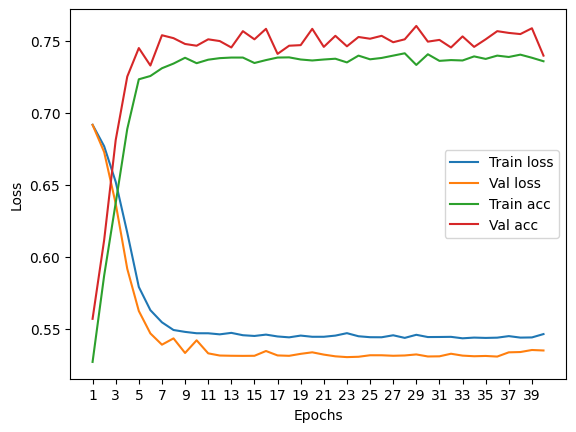

****************************************************************************************************



Particles per jet: 10


118it [00:00, 139.20it/s]


Train Epoch: 0 	Loss: 0.695868, Accuracy: 3899/7500 (52%)
Val Epoch: 0 	Loss: 0.703550, Accuracy: 1405/2500 (56%)



118it [00:01, 117.73it/s]


Train Epoch: 1 	Loss: 0.684739, Accuracy: 4248/7500 (57%)
Val Epoch: 1 	Loss: 0.683154, Accuracy: 1534/2500 (61%)



118it [00:00, 143.87it/s]


Train Epoch: 2 	Loss: 0.662925, Accuracy: 4642/7500 (62%)
Val Epoch: 2 	Loss: 0.663623, Accuracy: 1642/2500 (66%)



118it [00:00, 143.08it/s]


Train Epoch: 3 	Loss: 0.634275, Accuracy: 4982/7500 (66%)
Val Epoch: 3 	Loss: 0.620188, Accuracy: 1738/2500 (70%)



118it [00:00, 155.30it/s]


Train Epoch: 4 	Loss: 0.598284, Accuracy: 5311/7500 (71%)
Val Epoch: 4 	Loss: 0.592120, Accuracy: 1809/2500 (72%)



118it [00:00, 144.54it/s]


Train Epoch: 5 	Loss: 0.575021, Accuracy: 5449/7500 (73%)
Val Epoch: 5 	Loss: 0.566227, Accuracy: 1874/2500 (75%)



118it [00:00, 153.58it/s]


Train Epoch: 6 	Loss: 0.558950, Accuracy: 5508/7500 (73%)
Val Epoch: 6 	Loss: 0.559046, Accuracy: 1846/2500 (74%)



118it [00:00, 164.52it/s]


Train Epoch: 7 	Loss: 0.551128, Accuracy: 5546/7500 (74%)
Val Epoch: 7 	Loss: 0.556797, Accuracy: 1862/2500 (74%)



118it [00:00, 151.61it/s]


Train Epoch: 8 	Loss: 0.548865, Accuracy: 5535/7500 (74%)
Val Epoch: 8 	Loss: 0.549679, Accuracy: 1874/2500 (75%)



118it [00:00, 146.37it/s]


Train Epoch: 9 	Loss: 0.546082, Accuracy: 5557/7500 (74%)
Val Epoch: 9 	Loss: 0.538729, Accuracy: 1887/2500 (75%)



118it [00:00, 162.34it/s]


Train Epoch: 10 	Loss: 0.540519, Accuracy: 5580/7500 (74%)
Val Epoch: 10 	Loss: 0.540726, Accuracy: 1880/2500 (75%)



118it [00:00, 155.85it/s]


Train Epoch: 11 	Loss: 0.540405, Accuracy: 5552/7500 (74%)
Val Epoch: 11 	Loss: 0.545102, Accuracy: 1889/2500 (76%)



118it [00:00, 177.43it/s]


Train Epoch: 12 	Loss: 0.539798, Accuracy: 5569/7500 (74%)
Val Epoch: 12 	Loss: 0.539977, Accuracy: 1886/2500 (75%)



118it [00:00, 157.48it/s]


Train Epoch: 13 	Loss: 0.539551, Accuracy: 5580/7500 (74%)
Val Epoch: 13 	Loss: 0.535004, Accuracy: 1889/2500 (76%)



118it [00:00, 155.35it/s]


Train Epoch: 14 	Loss: 0.539182, Accuracy: 5575/7500 (74%)
Val Epoch: 14 	Loss: 0.546287, Accuracy: 1900/2500 (76%)



118it [00:00, 158.77it/s]


Train Epoch: 15 	Loss: 0.541449, Accuracy: 5547/7500 (74%)
Val Epoch: 15 	Loss: 0.541333, Accuracy: 1883/2500 (75%)



118it [00:00, 150.62it/s]


Train Epoch: 16 	Loss: 0.538996, Accuracy: 5568/7500 (74%)
Val Epoch: 16 	Loss: 0.545756, Accuracy: 1894/2500 (76%)



118it [00:00, 158.89it/s]


Train Epoch: 17 	Loss: 0.537893, Accuracy: 5601/7500 (75%)
Val Epoch: 17 	Loss: 0.542017, Accuracy: 1883/2500 (75%)



118it [00:01, 116.87it/s]


Train Epoch: 18 	Loss: 0.540404, Accuracy: 5555/7500 (74%)
Val Epoch: 18 	Loss: 0.552544, Accuracy: 1869/2500 (75%)



118it [00:00, 140.76it/s]


Train Epoch: 19 	Loss: 0.537851, Accuracy: 5591/7500 (75%)
Val Epoch: 19 	Loss: 0.530785, Accuracy: 1893/2500 (76%)



118it [00:00, 121.74it/s]


Train Epoch: 20 	Loss: 0.538077, Accuracy: 5561/7500 (74%)
Val Epoch: 20 	Loss: 0.544949, Accuracy: 1890/2500 (76%)



118it [00:01, 115.70it/s]


Train Epoch: 21 	Loss: 0.538944, Accuracy: 5589/7500 (75%)
Val Epoch: 21 	Loss: 0.543941, Accuracy: 1863/2500 (75%)



118it [00:00, 142.30it/s]


Train Epoch: 22 	Loss: 0.538805, Accuracy: 5581/7500 (74%)
Val Epoch: 22 	Loss: 0.546454, Accuracy: 1886/2500 (75%)



118it [00:00, 138.93it/s]


Train Epoch: 23 	Loss: 0.539482, Accuracy: 5583/7500 (74%)
Val Epoch: 23 	Loss: 0.533823, Accuracy: 1886/2500 (75%)



118it [00:00, 168.33it/s]


Train Epoch: 24 	Loss: 0.538011, Accuracy: 5583/7500 (74%)
Val Epoch: 24 	Loss: 0.541062, Accuracy: 1894/2500 (76%)



118it [00:00, 174.75it/s]


Train Epoch: 25 	Loss: 0.536780, Accuracy: 5573/7500 (74%)
Val Epoch: 25 	Loss: 0.529198, Accuracy: 1897/2500 (76%)



118it [00:00, 156.20it/s]


Train Epoch: 26 	Loss: 0.538870, Accuracy: 5563/7500 (74%)
Val Epoch: 26 	Loss: 0.535378, Accuracy: 1904/2500 (76%)



118it [00:00, 176.19it/s]


Train Epoch: 27 	Loss: 0.540132, Accuracy: 5583/7500 (74%)
Val Epoch: 27 	Loss: 0.532676, Accuracy: 1904/2500 (76%)



118it [00:00, 169.93it/s]


Train Epoch: 28 	Loss: 0.537362, Accuracy: 5562/7500 (74%)
Val Epoch: 28 	Loss: 0.540362, Accuracy: 1886/2500 (75%)



118it [00:00, 155.83it/s]


Train Epoch: 29 	Loss: 0.536261, Accuracy: 5568/7500 (74%)
Val Epoch: 29 	Loss: 0.535801, Accuracy: 1888/2500 (76%)



118it [00:00, 133.12it/s]


Train Epoch: 30 	Loss: 0.537836, Accuracy: 5579/7500 (74%)
Val Epoch: 30 	Loss: 0.533402, Accuracy: 1892/2500 (76%)



118it [00:00, 146.47it/s]


Train Epoch: 31 	Loss: 0.537129, Accuracy: 5568/7500 (74%)
Val Epoch: 31 	Loss: 0.542453, Accuracy: 1896/2500 (76%)



118it [00:01, 114.99it/s]


Train Epoch: 32 	Loss: 0.538022, Accuracy: 5554/7500 (74%)
Val Epoch: 32 	Loss: 0.538788, Accuracy: 1901/2500 (76%)



118it [00:01, 95.36it/s] 


Train Epoch: 33 	Loss: 0.537518, Accuracy: 5579/7500 (74%)
Val Epoch: 33 	Loss: 0.534700, Accuracy: 1896/2500 (76%)



118it [00:01, 82.08it/s]


Train Epoch: 34 	Loss: 0.539405, Accuracy: 5553/7500 (74%)
Val Epoch: 34 	Loss: 0.545260, Accuracy: 1893/2500 (76%)



118it [00:01, 100.42it/s]


Train Epoch: 35 	Loss: 0.540145, Accuracy: 5561/7500 (74%)
Val Epoch: 35 	Loss: 0.533320, Accuracy: 1893/2500 (76%)



118it [00:01, 73.64it/s]


Train Epoch: 36 	Loss: 0.536854, Accuracy: 5578/7500 (74%)
Val Epoch: 36 	Loss: 0.532807, Accuracy: 1898/2500 (76%)



118it [00:01, 94.00it/s]


Train Epoch: 37 	Loss: 0.538591, Accuracy: 5553/7500 (74%)
Val Epoch: 37 	Loss: 0.538358, Accuracy: 1901/2500 (76%)



118it [00:01, 91.71it/s] 


Train Epoch: 38 	Loss: 0.538856, Accuracy: 5563/7500 (74%)
Val Epoch: 38 	Loss: 0.532679, Accuracy: 1898/2500 (76%)



118it [00:01, 101.02it/s]


Train Epoch: 39 	Loss: 0.537373, Accuracy: 5599/7500 (75%)
Val Epoch: 39 	Loss: 0.537344, Accuracy: 1891/2500 (76%)

Test accuracy:  73.88


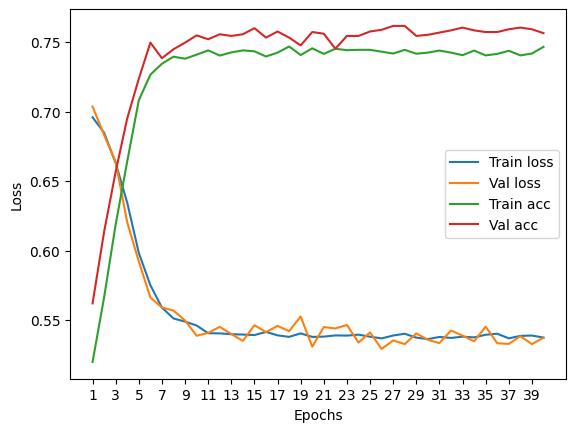

****************************************************************************************************



118it [00:00, 153.80it/s]


Train Epoch: 0 	Loss: 0.697072, Accuracy: 3921/7500 (52%)
Val Epoch: 0 	Loss: 0.706398, Accuracy: 1282/2500 (51%)



118it [00:00, 125.69it/s]


Train Epoch: 1 	Loss: 0.684227, Accuracy: 4466/7500 (60%)
Val Epoch: 1 	Loss: 0.679864, Accuracy: 1584/2500 (63%)



118it [00:00, 134.76it/s]


Train Epoch: 2 	Loss: 0.649071, Accuracy: 4958/7500 (66%)
Val Epoch: 2 	Loss: 0.630310, Accuracy: 1791/2500 (72%)



118it [00:00, 171.15it/s]


Train Epoch: 3 	Loss: 0.599912, Accuracy: 5365/7500 (72%)
Val Epoch: 3 	Loss: 0.599458, Accuracy: 1783/2500 (71%)



118it [00:00, 159.75it/s]


Train Epoch: 4 	Loss: 0.575322, Accuracy: 5434/7500 (72%)
Val Epoch: 4 	Loss: 0.584815, Accuracy: 1819/2500 (73%)



118it [00:00, 174.68it/s]


Train Epoch: 5 	Loss: 0.561999, Accuracy: 5489/7500 (73%)
Val Epoch: 5 	Loss: 0.571207, Accuracy: 1836/2500 (73%)



118it [00:00, 160.29it/s]


Train Epoch: 6 	Loss: 0.558514, Accuracy: 5490/7500 (73%)
Val Epoch: 6 	Loss: 0.569704, Accuracy: 1842/2500 (74%)



118it [00:00, 163.78it/s]


Train Epoch: 7 	Loss: 0.555699, Accuracy: 5516/7500 (74%)
Val Epoch: 7 	Loss: 0.564757, Accuracy: 1826/2500 (73%)



118it [00:00, 153.69it/s]


Train Epoch: 8 	Loss: 0.558824, Accuracy: 5457/7500 (73%)
Val Epoch: 8 	Loss: 0.566324, Accuracy: 1835/2500 (73%)



118it [00:00, 160.65it/s]


Train Epoch: 9 	Loss: 0.558933, Accuracy: 5472/7500 (73%)
Val Epoch: 9 	Loss: 0.567472, Accuracy: 1816/2500 (73%)



118it [00:00, 142.23it/s]


Train Epoch: 10 	Loss: 0.555169, Accuracy: 5487/7500 (73%)
Val Epoch: 10 	Loss: 0.560646, Accuracy: 1846/2500 (74%)



118it [00:00, 144.79it/s]


Train Epoch: 11 	Loss: 0.554108, Accuracy: 5516/7500 (74%)
Val Epoch: 11 	Loss: 0.570354, Accuracy: 1841/2500 (74%)



118it [00:00, 156.66it/s]


Train Epoch: 12 	Loss: 0.555293, Accuracy: 5511/7500 (73%)
Val Epoch: 12 	Loss: 0.583825, Accuracy: 1838/2500 (74%)



118it [00:00, 160.47it/s]


Train Epoch: 13 	Loss: 0.557436, Accuracy: 5479/7500 (73%)
Val Epoch: 13 	Loss: 0.567249, Accuracy: 1838/2500 (74%)



118it [00:00, 156.92it/s]


Train Epoch: 14 	Loss: 0.554007, Accuracy: 5485/7500 (73%)
Val Epoch: 14 	Loss: 0.565303, Accuracy: 1839/2500 (74%)



118it [00:00, 171.07it/s]


Train Epoch: 15 	Loss: 0.553760, Accuracy: 5537/7500 (74%)
Val Epoch: 15 	Loss: 0.569169, Accuracy: 1835/2500 (73%)



118it [00:00, 156.88it/s]


Train Epoch: 16 	Loss: 0.555086, Accuracy: 5504/7500 (73%)
Val Epoch: 16 	Loss: 0.560096, Accuracy: 1841/2500 (74%)



118it [00:00, 178.67it/s]


Train Epoch: 17 	Loss: 0.551346, Accuracy: 5510/7500 (73%)
Val Epoch: 17 	Loss: 0.574347, Accuracy: 1817/2500 (73%)



118it [00:00, 156.79it/s]


Train Epoch: 18 	Loss: 0.553053, Accuracy: 5506/7500 (73%)
Val Epoch: 18 	Loss: 0.571902, Accuracy: 1820/2500 (73%)



118it [00:00, 157.00it/s]


Train Epoch: 19 	Loss: 0.553751, Accuracy: 5491/7500 (73%)
Val Epoch: 19 	Loss: 0.574025, Accuracy: 1802/2500 (72%)



118it [00:00, 160.13it/s]


Train Epoch: 20 	Loss: 0.553712, Accuracy: 5499/7500 (73%)
Val Epoch: 20 	Loss: 0.567239, Accuracy: 1845/2500 (74%)



118it [00:00, 145.00it/s]


Train Epoch: 21 	Loss: 0.553558, Accuracy: 5503/7500 (73%)
Val Epoch: 21 	Loss: 0.571244, Accuracy: 1834/2500 (73%)



118it [00:00, 169.75it/s]


Train Epoch: 22 	Loss: 0.553574, Accuracy: 5512/7500 (73%)
Val Epoch: 22 	Loss: 0.583747, Accuracy: 1787/2500 (71%)



118it [00:00, 156.35it/s]


Train Epoch: 23 	Loss: 0.551629, Accuracy: 5502/7500 (73%)
Val Epoch: 23 	Loss: 0.574878, Accuracy: 1834/2500 (73%)



118it [00:00, 157.02it/s]


Train Epoch: 24 	Loss: 0.553127, Accuracy: 5506/7500 (73%)
Val Epoch: 24 	Loss: 0.569229, Accuracy: 1835/2500 (73%)



118it [00:00, 160.47it/s]


Train Epoch: 25 	Loss: 0.552933, Accuracy: 5512/7500 (73%)
Val Epoch: 25 	Loss: 0.564665, Accuracy: 1842/2500 (74%)



118it [00:00, 153.64it/s]


Train Epoch: 26 	Loss: 0.554879, Accuracy: 5513/7500 (74%)
Val Epoch: 26 	Loss: 0.560727, Accuracy: 1844/2500 (74%)



118it [00:00, 156.86it/s]


Train Epoch: 27 	Loss: 0.552709, Accuracy: 5534/7500 (74%)
Val Epoch: 27 	Loss: 0.568923, Accuracy: 1836/2500 (73%)



118it [00:00, 163.92it/s]


Train Epoch: 28 	Loss: 0.553582, Accuracy: 5527/7500 (74%)
Val Epoch: 28 	Loss: 0.583173, Accuracy: 1829/2500 (73%)



118it [00:00, 160.21it/s]


Train Epoch: 29 	Loss: 0.552602, Accuracy: 5507/7500 (73%)
Val Epoch: 29 	Loss: 0.571174, Accuracy: 1842/2500 (74%)



118it [00:00, 154.06it/s]


Train Epoch: 30 	Loss: 0.553274, Accuracy: 5503/7500 (73%)
Val Epoch: 30 	Loss: 0.576733, Accuracy: 1843/2500 (74%)



118it [00:00, 167.43it/s]


Train Epoch: 31 	Loss: 0.553575, Accuracy: 5491/7500 (73%)
Val Epoch: 31 	Loss: 0.571509, Accuracy: 1826/2500 (73%)



118it [00:00, 175.38it/s]


Train Epoch: 32 	Loss: 0.551955, Accuracy: 5520/7500 (74%)
Val Epoch: 32 	Loss: 0.566371, Accuracy: 1821/2500 (73%)



118it [00:00, 156.92it/s]


Train Epoch: 33 	Loss: 0.551867, Accuracy: 5506/7500 (73%)
Val Epoch: 33 	Loss: 0.571696, Accuracy: 1849/2500 (74%)



118it [00:00, 144.93it/s]


Train Epoch: 34 	Loss: 0.554326, Accuracy: 5494/7500 (73%)
Val Epoch: 34 	Loss: 0.570068, Accuracy: 1842/2500 (74%)



118it [00:00, 183.84it/s]


Train Epoch: 35 	Loss: 0.551937, Accuracy: 5520/7500 (74%)
Val Epoch: 35 	Loss: 0.560290, Accuracy: 1826/2500 (73%)



118it [00:00, 142.07it/s]


Train Epoch: 36 	Loss: 0.554702, Accuracy: 5500/7500 (73%)
Val Epoch: 36 	Loss: 0.576657, Accuracy: 1824/2500 (73%)



118it [00:00, 148.04it/s]


Train Epoch: 37 	Loss: 0.554761, Accuracy: 5515/7500 (74%)
Val Epoch: 37 	Loss: 0.563113, Accuracy: 1836/2500 (73%)



118it [00:00, 160.23it/s]


Train Epoch: 38 	Loss: 0.552363, Accuracy: 5510/7500 (73%)
Val Epoch: 38 	Loss: 0.564380, Accuracy: 1832/2500 (73%)



118it [00:00, 163.01it/s]


Train Epoch: 39 	Loss: 0.552629, Accuracy: 5488/7500 (73%)
Val Epoch: 39 	Loss: 0.564614, Accuracy: 1838/2500 (74%)

Test accuracy:  74.24


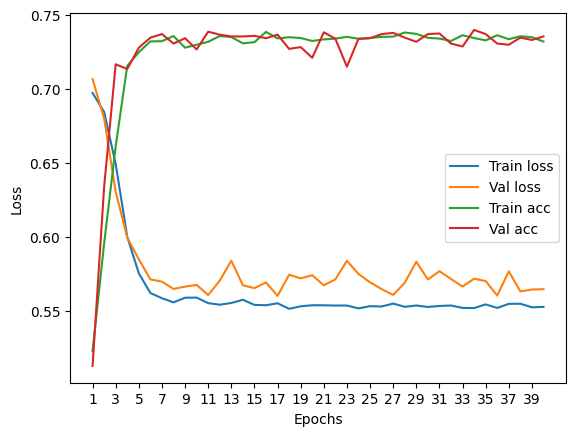

****************************************************************************************************



118it [00:00, 154.05it/s]


Train Epoch: 0 	Loss: 0.695782, Accuracy: 4008/7500 (53%)
Val Epoch: 0 	Loss: 0.701417, Accuracy: 1392/2500 (56%)



118it [00:00, 142.40it/s]


Train Epoch: 1 	Loss: 0.669620, Accuracy: 4658/7500 (62%)
Val Epoch: 1 	Loss: 0.654703, Accuracy: 1730/2500 (69%)



118it [00:00, 142.18it/s]


Train Epoch: 2 	Loss: 0.621807, Accuracy: 5260/7500 (70%)
Val Epoch: 2 	Loss: 0.603954, Accuracy: 1803/2500 (72%)



118it [00:00, 170.18it/s]


Train Epoch: 3 	Loss: 0.578066, Accuracy: 5483/7500 (73%)
Val Epoch: 3 	Loss: 0.566821, Accuracy: 1841/2500 (74%)



118it [00:00, 152.69it/s]


Train Epoch: 4 	Loss: 0.556484, Accuracy: 5495/7500 (73%)
Val Epoch: 4 	Loss: 0.562161, Accuracy: 1853/2500 (74%)



118it [00:00, 147.02it/s]


Train Epoch: 5 	Loss: 0.546815, Accuracy: 5534/7500 (74%)
Val Epoch: 5 	Loss: 0.548739, Accuracy: 1835/2500 (73%)



118it [00:01, 78.14it/s]


Train Epoch: 6 	Loss: 0.541375, Accuracy: 5570/7500 (74%)
Val Epoch: 6 	Loss: 0.540319, Accuracy: 1835/2500 (73%)



118it [00:01, 73.78it/s]


Train Epoch: 7 	Loss: 0.538007, Accuracy: 5576/7500 (74%)
Val Epoch: 7 	Loss: 0.541947, Accuracy: 1847/2500 (74%)



118it [00:00, 121.18it/s]


Train Epoch: 8 	Loss: 0.537235, Accuracy: 5585/7500 (74%)
Val Epoch: 8 	Loss: 0.536251, Accuracy: 1867/2500 (75%)



118it [00:01, 96.91it/s] 


Train Epoch: 9 	Loss: 0.535993, Accuracy: 5596/7500 (75%)
Val Epoch: 9 	Loss: 0.544385, Accuracy: 1827/2500 (73%)



118it [00:00, 154.07it/s]


Train Epoch: 10 	Loss: 0.538970, Accuracy: 5592/7500 (75%)
Val Epoch: 10 	Loss: 0.542108, Accuracy: 1842/2500 (74%)



118it [00:01, 113.54it/s]


Train Epoch: 11 	Loss: 0.534520, Accuracy: 5605/7500 (75%)
Val Epoch: 11 	Loss: 0.539362, Accuracy: 1833/2500 (73%)



118it [00:01, 95.73it/s]


Train Epoch: 12 	Loss: 0.536011, Accuracy: 5584/7500 (74%)
Val Epoch: 12 	Loss: 0.544973, Accuracy: 1843/2500 (74%)



118it [00:01, 90.00it/s]


Train Epoch: 13 	Loss: 0.535324, Accuracy: 5593/7500 (75%)
Val Epoch: 13 	Loss: 0.545035, Accuracy: 1854/2500 (74%)



118it [00:00, 118.25it/s]


Train Epoch: 14 	Loss: 0.535959, Accuracy: 5586/7500 (74%)
Val Epoch: 14 	Loss: 0.540236, Accuracy: 1853/2500 (74%)



118it [00:00, 124.90it/s]


Train Epoch: 15 	Loss: 0.534090, Accuracy: 5625/7500 (75%)
Val Epoch: 15 	Loss: 0.543313, Accuracy: 1850/2500 (74%)



118it [00:01, 98.79it/s] 


Train Epoch: 16 	Loss: 0.535911, Accuracy: 5599/7500 (75%)
Val Epoch: 16 	Loss: 0.542839, Accuracy: 1873/2500 (75%)



118it [00:00, 133.56it/s]


Train Epoch: 17 	Loss: 0.535403, Accuracy: 5600/7500 (75%)
Val Epoch: 17 	Loss: 0.544855, Accuracy: 1845/2500 (74%)



118it [00:00, 129.59it/s]


Train Epoch: 18 	Loss: 0.534482, Accuracy: 5624/7500 (75%)
Val Epoch: 18 	Loss: 0.563540, Accuracy: 1795/2500 (72%)



118it [00:00, 119.11it/s]


Train Epoch: 19 	Loss: 0.538957, Accuracy: 5573/7500 (74%)
Val Epoch: 19 	Loss: 0.533492, Accuracy: 1845/2500 (74%)



118it [00:00, 135.08it/s]


Train Epoch: 20 	Loss: 0.534792, Accuracy: 5610/7500 (75%)
Val Epoch: 20 	Loss: 0.552516, Accuracy: 1851/2500 (74%)



118it [00:00, 134.98it/s]


Train Epoch: 21 	Loss: 0.537308, Accuracy: 5585/7500 (74%)
Val Epoch: 21 	Loss: 0.535397, Accuracy: 1844/2500 (74%)



118it [00:00, 126.00it/s]


Train Epoch: 22 	Loss: 0.533245, Accuracy: 5631/7500 (75%)
Val Epoch: 22 	Loss: 0.545265, Accuracy: 1831/2500 (73%)



118it [00:00, 130.33it/s]


Train Epoch: 23 	Loss: 0.535181, Accuracy: 5612/7500 (75%)
Val Epoch: 23 	Loss: 0.535756, Accuracy: 1870/2500 (75%)



118it [00:00, 156.85it/s]


Train Epoch: 24 	Loss: 0.533085, Accuracy: 5608/7500 (75%)
Val Epoch: 24 	Loss: 0.532362, Accuracy: 1848/2500 (74%)



118it [00:00, 146.77it/s]


Train Epoch: 25 	Loss: 0.535211, Accuracy: 5618/7500 (75%)
Val Epoch: 25 	Loss: 0.536034, Accuracy: 1875/2500 (75%)



118it [00:00, 139.78it/s]


Train Epoch: 26 	Loss: 0.534656, Accuracy: 5581/7500 (74%)
Val Epoch: 26 	Loss: 0.543480, Accuracy: 1851/2500 (74%)



118it [00:01, 106.22it/s]


Train Epoch: 27 	Loss: 0.536213, Accuracy: 5630/7500 (75%)
Val Epoch: 27 	Loss: 0.543738, Accuracy: 1853/2500 (74%)



118it [00:00, 131.44it/s]


Train Epoch: 28 	Loss: 0.534343, Accuracy: 5611/7500 (75%)
Val Epoch: 28 	Loss: 0.535005, Accuracy: 1863/2500 (75%)



118it [00:01, 90.53it/s]


Train Epoch: 29 	Loss: 0.534348, Accuracy: 5611/7500 (75%)
Val Epoch: 29 	Loss: 0.538811, Accuracy: 1854/2500 (74%)



118it [00:01, 96.68it/s]


Train Epoch: 30 	Loss: 0.537280, Accuracy: 5583/7500 (74%)
Val Epoch: 30 	Loss: 0.537111, Accuracy: 1867/2500 (75%)



118it [00:01, 111.65it/s]


Train Epoch: 31 	Loss: 0.533829, Accuracy: 5651/7500 (75%)
Val Epoch: 31 	Loss: 0.536827, Accuracy: 1867/2500 (75%)



118it [00:01, 110.71it/s]


Train Epoch: 32 	Loss: 0.533373, Accuracy: 5620/7500 (75%)
Val Epoch: 32 	Loss: 0.536048, Accuracy: 1869/2500 (75%)



118it [00:00, 135.51it/s]


Train Epoch: 33 	Loss: 0.534496, Accuracy: 5603/7500 (75%)
Val Epoch: 33 	Loss: 0.535630, Accuracy: 1865/2500 (75%)



118it [00:00, 149.16it/s]


Train Epoch: 34 	Loss: 0.533904, Accuracy: 5608/7500 (75%)
Val Epoch: 34 	Loss: 0.531034, Accuracy: 1874/2500 (75%)



118it [00:00, 148.70it/s]


Train Epoch: 35 	Loss: 0.534862, Accuracy: 5594/7500 (75%)
Val Epoch: 35 	Loss: 0.544693, Accuracy: 1859/2500 (74%)



118it [00:00, 133.27it/s]


Train Epoch: 36 	Loss: 0.533161, Accuracy: 5618/7500 (75%)
Val Epoch: 36 	Loss: 0.538520, Accuracy: 1867/2500 (75%)



118it [00:00, 148.33it/s]


Train Epoch: 37 	Loss: 0.534481, Accuracy: 5636/7500 (75%)
Val Epoch: 37 	Loss: 0.540539, Accuracy: 1845/2500 (74%)



118it [00:00, 157.06it/s]


Train Epoch: 38 	Loss: 0.535849, Accuracy: 5633/7500 (75%)
Val Epoch: 38 	Loss: 0.554156, Accuracy: 1858/2500 (74%)



118it [00:00, 156.19it/s]


Train Epoch: 39 	Loss: 0.533600, Accuracy: 5608/7500 (75%)
Val Epoch: 39 	Loss: 0.538642, Accuracy: 1860/2500 (74%)

Test accuracy:  75.03999999999999


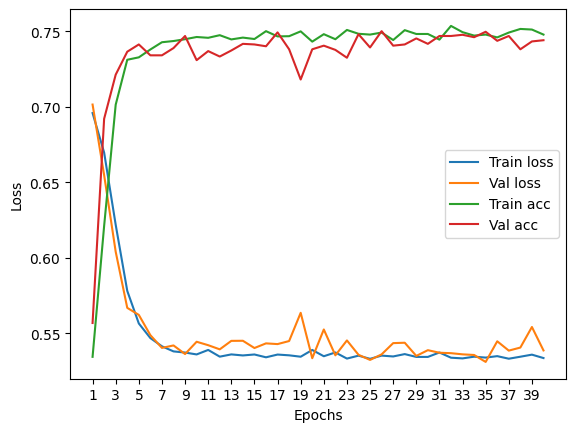

****************************************************************************************************



118it [00:00, 164.79it/s]


Train Epoch: 0 	Loss: 0.696707, Accuracy: 3933/7500 (52%)
Val Epoch: 0 	Loss: 0.699414, Accuracy: 1479/2500 (59%)



118it [00:00, 160.30it/s]


Train Epoch: 1 	Loss: 0.674555, Accuracy: 4572/7500 (61%)
Val Epoch: 1 	Loss: 0.671595, Accuracy: 1559/2500 (62%)



118it [00:00, 158.50it/s]


Train Epoch: 2 	Loss: 0.642349, Accuracy: 4846/7500 (65%)
Val Epoch: 2 	Loss: 0.632529, Accuracy: 1731/2500 (69%)



118it [00:00, 157.34it/s]


Train Epoch: 3 	Loss: 0.603303, Accuracy: 5303/7500 (71%)
Val Epoch: 3 	Loss: 0.597449, Accuracy: 1791/2500 (72%)



118it [00:00, 163.53it/s]


Train Epoch: 4 	Loss: 0.569469, Accuracy: 5464/7500 (73%)
Val Epoch: 4 	Loss: 0.576036, Accuracy: 1811/2500 (72%)



118it [00:00, 126.25it/s]


Train Epoch: 5 	Loss: 0.551280, Accuracy: 5522/7500 (74%)
Val Epoch: 5 	Loss: 0.559094, Accuracy: 1832/2500 (73%)



118it [00:00, 152.24it/s]


Train Epoch: 6 	Loss: 0.544298, Accuracy: 5564/7500 (74%)
Val Epoch: 6 	Loss: 0.556924, Accuracy: 1836/2500 (73%)



118it [00:00, 137.22it/s]


Train Epoch: 7 	Loss: 0.539974, Accuracy: 5536/7500 (74%)
Val Epoch: 7 	Loss: 0.563135, Accuracy: 1832/2500 (73%)



118it [00:00, 157.97it/s]


Train Epoch: 8 	Loss: 0.538026, Accuracy: 5581/7500 (74%)
Val Epoch: 8 	Loss: 0.564915, Accuracy: 1831/2500 (73%)



118it [00:00, 146.48it/s]


Train Epoch: 9 	Loss: 0.536672, Accuracy: 5586/7500 (74%)
Val Epoch: 9 	Loss: 0.576474, Accuracy: 1832/2500 (73%)



118it [00:00, 151.88it/s]


Train Epoch: 10 	Loss: 0.537366, Accuracy: 5571/7500 (74%)
Val Epoch: 10 	Loss: 0.561355, Accuracy: 1822/2500 (73%)



118it [00:00, 163.72it/s]


Train Epoch: 11 	Loss: 0.535780, Accuracy: 5590/7500 (75%)
Val Epoch: 11 	Loss: 0.553092, Accuracy: 1833/2500 (73%)



118it [00:00, 163.73it/s]


Train Epoch: 12 	Loss: 0.536511, Accuracy: 5557/7500 (74%)
Val Epoch: 12 	Loss: 0.555955, Accuracy: 1829/2500 (73%)



118it [00:00, 171.09it/s]


Train Epoch: 13 	Loss: 0.534509, Accuracy: 5604/7500 (75%)
Val Epoch: 13 	Loss: 0.558599, Accuracy: 1834/2500 (73%)



118it [00:00, 160.07it/s]


Train Epoch: 14 	Loss: 0.535607, Accuracy: 5595/7500 (75%)
Val Epoch: 14 	Loss: 0.554025, Accuracy: 1839/2500 (74%)



118it [00:00, 158.38it/s]


Train Epoch: 15 	Loss: 0.535754, Accuracy: 5608/7500 (75%)
Val Epoch: 15 	Loss: 0.570499, Accuracy: 1834/2500 (73%)



118it [00:00, 163.87it/s]


Train Epoch: 16 	Loss: 0.537186, Accuracy: 5629/7500 (75%)
Val Epoch: 16 	Loss: 0.559606, Accuracy: 1829/2500 (73%)



118it [00:00, 146.59it/s]


Train Epoch: 17 	Loss: 0.535812, Accuracy: 5564/7500 (74%)
Val Epoch: 17 	Loss: 0.572230, Accuracy: 1842/2500 (74%)



118it [00:00, 160.11it/s]


Train Epoch: 18 	Loss: 0.534538, Accuracy: 5615/7500 (75%)
Val Epoch: 18 	Loss: 0.559440, Accuracy: 1835/2500 (73%)



118it [00:00, 159.05it/s]


Train Epoch: 19 	Loss: 0.534064, Accuracy: 5597/7500 (75%)
Val Epoch: 19 	Loss: 0.552492, Accuracy: 1835/2500 (73%)



118it [00:00, 161.01it/s]


Train Epoch: 20 	Loss: 0.534350, Accuracy: 5610/7500 (75%)
Val Epoch: 20 	Loss: 0.566497, Accuracy: 1837/2500 (73%)



118it [00:00, 150.42it/s]


Train Epoch: 21 	Loss: 0.535086, Accuracy: 5607/7500 (75%)
Val Epoch: 21 	Loss: 0.558475, Accuracy: 1844/2500 (74%)



118it [00:00, 143.98it/s]


Train Epoch: 22 	Loss: 0.537628, Accuracy: 5601/7500 (75%)
Val Epoch: 22 	Loss: 0.569024, Accuracy: 1816/2500 (73%)



118it [00:00, 145.35it/s]


Train Epoch: 23 	Loss: 0.536534, Accuracy: 5605/7500 (75%)
Val Epoch: 23 	Loss: 0.574888, Accuracy: 1845/2500 (74%)



118it [00:00, 147.55it/s]


Train Epoch: 24 	Loss: 0.535518, Accuracy: 5596/7500 (75%)
Val Epoch: 24 	Loss: 0.570955, Accuracy: 1830/2500 (73%)



118it [00:00, 134.48it/s]


Train Epoch: 25 	Loss: 0.531859, Accuracy: 5597/7500 (75%)
Val Epoch: 25 	Loss: 0.553167, Accuracy: 1841/2500 (74%)



118it [00:00, 142.17it/s]


Train Epoch: 26 	Loss: 0.533522, Accuracy: 5609/7500 (75%)
Val Epoch: 26 	Loss: 0.558141, Accuracy: 1834/2500 (73%)



118it [00:00, 160.06it/s]


Train Epoch: 27 	Loss: 0.533425, Accuracy: 5608/7500 (75%)
Val Epoch: 27 	Loss: 0.553459, Accuracy: 1845/2500 (74%)



118it [00:00, 167.59it/s]


Train Epoch: 28 	Loss: 0.534525, Accuracy: 5611/7500 (75%)
Val Epoch: 28 	Loss: 0.553057, Accuracy: 1841/2500 (74%)



118it [00:00, 158.51it/s]


Train Epoch: 29 	Loss: 0.534705, Accuracy: 5600/7500 (75%)
Val Epoch: 29 	Loss: 0.554845, Accuracy: 1841/2500 (74%)



118it [00:00, 175.89it/s]


Train Epoch: 30 	Loss: 0.533631, Accuracy: 5627/7500 (75%)
Val Epoch: 30 	Loss: 0.566757, Accuracy: 1839/2500 (74%)



118it [00:00, 178.89it/s]


Train Epoch: 31 	Loss: 0.532933, Accuracy: 5599/7500 (75%)
Val Epoch: 31 	Loss: 0.557824, Accuracy: 1834/2500 (73%)



118it [00:00, 171.65it/s]


Train Epoch: 32 	Loss: 0.535810, Accuracy: 5623/7500 (75%)
Val Epoch: 32 	Loss: 0.571653, Accuracy: 1833/2500 (73%)



118it [00:00, 158.08it/s]


Train Epoch: 33 	Loss: 0.532791, Accuracy: 5611/7500 (75%)
Val Epoch: 33 	Loss: 0.563231, Accuracy: 1837/2500 (73%)



118it [00:00, 161.10it/s]


Train Epoch: 34 	Loss: 0.534263, Accuracy: 5620/7500 (75%)
Val Epoch: 34 	Loss: 0.554419, Accuracy: 1851/2500 (74%)



118it [00:00, 162.27it/s]


Train Epoch: 35 	Loss: 0.535471, Accuracy: 5582/7500 (74%)
Val Epoch: 35 	Loss: 0.559982, Accuracy: 1834/2500 (73%)



118it [00:00, 161.68it/s]


Train Epoch: 36 	Loss: 0.533672, Accuracy: 5627/7500 (75%)
Val Epoch: 36 	Loss: 0.569910, Accuracy: 1832/2500 (73%)



118it [00:00, 156.77it/s]


Train Epoch: 37 	Loss: 0.532226, Accuracy: 5603/7500 (75%)
Val Epoch: 37 	Loss: 0.560924, Accuracy: 1831/2500 (73%)



118it [00:00, 133.03it/s]


Train Epoch: 38 	Loss: 0.534117, Accuracy: 5624/7500 (75%)
Val Epoch: 38 	Loss: 0.564489, Accuracy: 1839/2500 (74%)



118it [00:00, 146.34it/s]


Train Epoch: 39 	Loss: 0.531834, Accuracy: 5628/7500 (75%)
Val Epoch: 39 	Loss: 0.551754, Accuracy: 1837/2500 (73%)

Test accuracy:  71.39999999999999


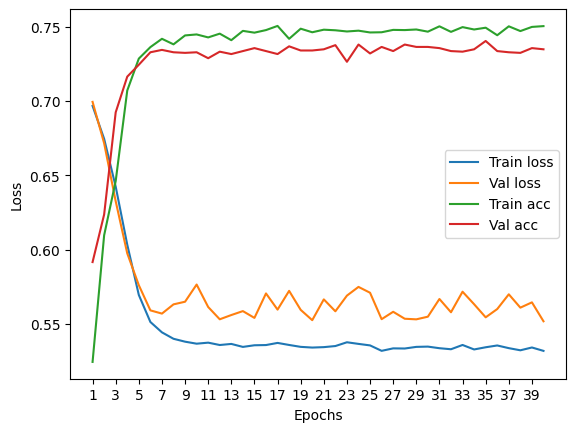

****************************************************************************************************



118it [00:00, 164.09it/s]


Train Epoch: 0 	Loss: 0.696988, Accuracy: 3883/7500 (52%)
Val Epoch: 0 	Loss: 0.702364, Accuracy: 1460/2500 (58%)



118it [00:00, 153.02it/s]


Train Epoch: 1 	Loss: 0.681059, Accuracy: 4437/7500 (59%)
Val Epoch: 1 	Loss: 0.676270, Accuracy: 1551/2500 (62%)



118it [00:00, 138.78it/s]


Train Epoch: 2 	Loss: 0.646372, Accuracy: 4882/7500 (65%)
Val Epoch: 2 	Loss: 0.626259, Accuracy: 1765/2500 (71%)



118it [00:00, 127.48it/s]


Train Epoch: 3 	Loss: 0.595273, Accuracy: 5341/7500 (71%)
Val Epoch: 3 	Loss: 0.571952, Accuracy: 1846/2500 (74%)



118it [00:00, 157.13it/s]


Train Epoch: 4 	Loss: 0.566997, Accuracy: 5431/7500 (72%)
Val Epoch: 4 	Loss: 0.552131, Accuracy: 1893/2500 (76%)



118it [00:00, 148.08it/s]


Train Epoch: 5 	Loss: 0.559582, Accuracy: 5444/7500 (73%)
Val Epoch: 5 	Loss: 0.544840, Accuracy: 1891/2500 (76%)



118it [00:00, 163.68it/s]


Train Epoch: 6 	Loss: 0.553142, Accuracy: 5490/7500 (73%)
Val Epoch: 6 	Loss: 0.546687, Accuracy: 1877/2500 (75%)



118it [00:00, 160.26it/s]


Train Epoch: 7 	Loss: 0.553556, Accuracy: 5482/7500 (73%)
Val Epoch: 7 	Loss: 0.544808, Accuracy: 1877/2500 (75%)



118it [00:00, 159.86it/s]


Train Epoch: 8 	Loss: 0.552487, Accuracy: 5473/7500 (73%)
Val Epoch: 8 	Loss: 0.545795, Accuracy: 1875/2500 (75%)



118it [00:00, 158.82it/s]


Train Epoch: 9 	Loss: 0.551984, Accuracy: 5474/7500 (73%)
Val Epoch: 9 	Loss: 0.541208, Accuracy: 1874/2500 (75%)



118it [00:00, 169.05it/s]


Train Epoch: 10 	Loss: 0.553658, Accuracy: 5492/7500 (73%)
Val Epoch: 10 	Loss: 0.546866, Accuracy: 1856/2500 (74%)



118it [00:00, 167.93it/s]


Train Epoch: 11 	Loss: 0.551401, Accuracy: 5479/7500 (73%)
Val Epoch: 11 	Loss: 0.548764, Accuracy: 1879/2500 (75%)



118it [00:00, 159.90it/s]


Train Epoch: 12 	Loss: 0.552716, Accuracy: 5479/7500 (73%)
Val Epoch: 12 	Loss: 0.547072, Accuracy: 1893/2500 (76%)



118it [00:00, 144.67it/s]


Train Epoch: 13 	Loss: 0.551866, Accuracy: 5463/7500 (73%)
Val Epoch: 13 	Loss: 0.532843, Accuracy: 1875/2500 (75%)



118it [00:00, 164.41it/s]


Train Epoch: 14 	Loss: 0.550566, Accuracy: 5490/7500 (73%)
Val Epoch: 14 	Loss: 0.542225, Accuracy: 1895/2500 (76%)



118it [00:00, 159.43it/s]


Train Epoch: 15 	Loss: 0.551069, Accuracy: 5457/7500 (73%)
Val Epoch: 15 	Loss: 0.538239, Accuracy: 1895/2500 (76%)



118it [00:00, 158.72it/s]


Train Epoch: 16 	Loss: 0.551937, Accuracy: 5494/7500 (73%)
Val Epoch: 16 	Loss: 0.538966, Accuracy: 1867/2500 (75%)



118it [00:00, 163.39it/s]


Train Epoch: 17 	Loss: 0.550010, Accuracy: 5513/7500 (74%)
Val Epoch: 17 	Loss: 0.542040, Accuracy: 1894/2500 (76%)



118it [00:00, 157.64it/s]


Train Epoch: 18 	Loss: 0.549084, Accuracy: 5495/7500 (73%)
Val Epoch: 18 	Loss: 0.538044, Accuracy: 1869/2500 (75%)



118it [00:00, 136.52it/s]


Train Epoch: 19 	Loss: 0.552822, Accuracy: 5502/7500 (73%)
Val Epoch: 19 	Loss: 0.544088, Accuracy: 1880/2500 (75%)



118it [00:00, 157.18it/s]


Train Epoch: 20 	Loss: 0.548974, Accuracy: 5512/7500 (73%)
Val Epoch: 20 	Loss: 0.532106, Accuracy: 1875/2500 (75%)



118it [00:00, 152.07it/s]


Train Epoch: 21 	Loss: 0.549942, Accuracy: 5497/7500 (73%)
Val Epoch: 21 	Loss: 0.540111, Accuracy: 1893/2500 (76%)



118it [00:00, 164.90it/s]


Train Epoch: 22 	Loss: 0.549156, Accuracy: 5502/7500 (73%)
Val Epoch: 22 	Loss: 0.537669, Accuracy: 1875/2500 (75%)



118it [00:00, 162.03it/s]


Train Epoch: 23 	Loss: 0.550379, Accuracy: 5510/7500 (73%)
Val Epoch: 23 	Loss: 0.541162, Accuracy: 1880/2500 (75%)



118it [00:00, 155.82it/s]


Train Epoch: 24 	Loss: 0.549596, Accuracy: 5496/7500 (73%)
Val Epoch: 24 	Loss: 0.533237, Accuracy: 1887/2500 (75%)



118it [00:00, 155.56it/s]


Train Epoch: 25 	Loss: 0.551068, Accuracy: 5501/7500 (73%)
Val Epoch: 25 	Loss: 0.537152, Accuracy: 1878/2500 (75%)



118it [00:00, 167.73it/s]


Train Epoch: 26 	Loss: 0.551256, Accuracy: 5497/7500 (73%)
Val Epoch: 26 	Loss: 0.543338, Accuracy: 1899/2500 (76%)



118it [00:00, 156.73it/s]


Train Epoch: 27 	Loss: 0.549183, Accuracy: 5514/7500 (74%)
Val Epoch: 27 	Loss: 0.539926, Accuracy: 1889/2500 (76%)



118it [00:00, 156.77it/s]


Train Epoch: 28 	Loss: 0.551773, Accuracy: 5484/7500 (73%)
Val Epoch: 28 	Loss: 0.537418, Accuracy: 1894/2500 (76%)



118it [00:00, 148.42it/s]


Train Epoch: 29 	Loss: 0.548452, Accuracy: 5486/7500 (73%)
Val Epoch: 29 	Loss: 0.540172, Accuracy: 1892/2500 (76%)



118it [00:00, 160.70it/s]


Train Epoch: 30 	Loss: 0.549537, Accuracy: 5501/7500 (73%)
Val Epoch: 30 	Loss: 0.548514, Accuracy: 1879/2500 (75%)



118it [00:00, 163.47it/s]


Train Epoch: 31 	Loss: 0.552544, Accuracy: 5498/7500 (73%)
Val Epoch: 31 	Loss: 0.536052, Accuracy: 1890/2500 (76%)



118it [00:00, 163.25it/s]


Train Epoch: 32 	Loss: 0.548936, Accuracy: 5510/7500 (73%)
Val Epoch: 32 	Loss: 0.533959, Accuracy: 1893/2500 (76%)



118it [00:00, 170.11it/s]


Train Epoch: 33 	Loss: 0.547882, Accuracy: 5508/7500 (73%)
Val Epoch: 33 	Loss: 0.539009, Accuracy: 1901/2500 (76%)



118it [00:00, 156.87it/s]


Train Epoch: 34 	Loss: 0.547848, Accuracy: 5509/7500 (73%)
Val Epoch: 34 	Loss: 0.544357, Accuracy: 1894/2500 (76%)



118it [00:00, 142.52it/s]


Train Epoch: 35 	Loss: 0.549400, Accuracy: 5517/7500 (74%)
Val Epoch: 35 	Loss: 0.533542, Accuracy: 1880/2500 (75%)



118it [00:00, 130.45it/s]


Train Epoch: 36 	Loss: 0.550885, Accuracy: 5492/7500 (73%)
Val Epoch: 36 	Loss: 0.536329, Accuracy: 1904/2500 (76%)



118it [00:00, 146.04it/s]


Train Epoch: 37 	Loss: 0.551111, Accuracy: 5507/7500 (73%)
Val Epoch: 37 	Loss: 0.542426, Accuracy: 1893/2500 (76%)



118it [00:00, 156.43it/s]


Train Epoch: 38 	Loss: 0.552914, Accuracy: 5489/7500 (73%)
Val Epoch: 38 	Loss: 0.535591, Accuracy: 1893/2500 (76%)



118it [00:00, 162.50it/s]


Train Epoch: 39 	Loss: 0.546529, Accuracy: 5489/7500 (73%)
Val Epoch: 39 	Loss: 0.537423, Accuracy: 1893/2500 (76%)

Test accuracy:  74.16


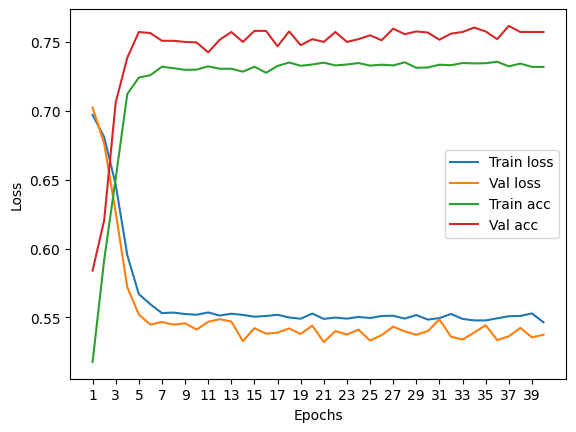

****************************************************************************************************



118it [00:00, 148.02it/s]


Train Epoch: 0 	Loss: 0.693820, Accuracy: 4006/7500 (53%)
Val Epoch: 0 	Loss: 0.699884, Accuracy: 1414/2500 (57%)



118it [00:00, 158.60it/s]


Train Epoch: 1 	Loss: 0.679309, Accuracy: 4326/7500 (58%)
Val Epoch: 1 	Loss: 0.690206, Accuracy: 1487/2500 (59%)



118it [00:00, 140.82it/s]


Train Epoch: 2 	Loss: 0.667712, Accuracy: 4463/7500 (60%)
Val Epoch: 2 	Loss: 0.687945, Accuracy: 1459/2500 (58%)



118it [00:00, 164.56it/s]


Train Epoch: 3 	Loss: 0.655882, Accuracy: 4647/7500 (62%)
Val Epoch: 3 	Loss: 0.660901, Accuracy: 1611/2500 (64%)



118it [00:00, 147.20it/s]


Train Epoch: 4 	Loss: 0.635409, Accuracy: 4934/7500 (66%)
Val Epoch: 4 	Loss: 0.645459, Accuracy: 1684/2500 (67%)



118it [00:00, 150.72it/s]


Train Epoch: 5 	Loss: 0.607737, Accuracy: 5197/7500 (69%)
Val Epoch: 5 	Loss: 0.622358, Accuracy: 1705/2500 (68%)



118it [00:00, 154.31it/s]


Train Epoch: 6 	Loss: 0.584890, Accuracy: 5347/7500 (71%)
Val Epoch: 6 	Loss: 0.597058, Accuracy: 1724/2500 (69%)



118it [00:00, 167.38it/s]


Train Epoch: 7 	Loss: 0.573504, Accuracy: 5389/7500 (72%)
Val Epoch: 7 	Loss: 0.591204, Accuracy: 1801/2500 (72%)



118it [00:00, 161.60it/s]


Train Epoch: 8 	Loss: 0.560844, Accuracy: 5478/7500 (73%)
Val Epoch: 8 	Loss: 0.571223, Accuracy: 1846/2500 (74%)



118it [00:00, 159.96it/s]


Train Epoch: 9 	Loss: 0.553329, Accuracy: 5466/7500 (73%)
Val Epoch: 9 	Loss: 0.568150, Accuracy: 1820/2500 (73%)



118it [00:00, 153.25it/s]


Train Epoch: 10 	Loss: 0.551462, Accuracy: 5482/7500 (73%)
Val Epoch: 10 	Loss: 0.568159, Accuracy: 1832/2500 (73%)



118it [00:00, 155.84it/s]


Train Epoch: 11 	Loss: 0.550371, Accuracy: 5508/7500 (73%)
Val Epoch: 11 	Loss: 0.569613, Accuracy: 1839/2500 (74%)



118it [00:00, 157.46it/s]


Train Epoch: 12 	Loss: 0.549997, Accuracy: 5496/7500 (73%)
Val Epoch: 12 	Loss: 0.587274, Accuracy: 1830/2500 (73%)



118it [00:00, 157.86it/s]


Train Epoch: 13 	Loss: 0.549702, Accuracy: 5480/7500 (73%)
Val Epoch: 13 	Loss: 0.568282, Accuracy: 1836/2500 (73%)



118it [00:00, 165.12it/s]


Train Epoch: 14 	Loss: 0.547194, Accuracy: 5498/7500 (73%)
Val Epoch: 14 	Loss: 0.559799, Accuracy: 1824/2500 (73%)



118it [00:01, 116.28it/s]


Train Epoch: 15 	Loss: 0.548132, Accuracy: 5483/7500 (73%)
Val Epoch: 15 	Loss: 0.563921, Accuracy: 1831/2500 (73%)



118it [00:00, 166.20it/s]


Train Epoch: 16 	Loss: 0.549293, Accuracy: 5490/7500 (73%)
Val Epoch: 16 	Loss: 0.561213, Accuracy: 1839/2500 (74%)



118it [00:00, 159.36it/s]


Train Epoch: 17 	Loss: 0.546859, Accuracy: 5485/7500 (73%)
Val Epoch: 17 	Loss: 0.565707, Accuracy: 1829/2500 (73%)



118it [00:00, 161.28it/s]


Train Epoch: 18 	Loss: 0.548202, Accuracy: 5485/7500 (73%)
Val Epoch: 18 	Loss: 0.580856, Accuracy: 1827/2500 (73%)



118it [00:00, 158.23it/s]


Train Epoch: 19 	Loss: 0.545813, Accuracy: 5511/7500 (73%)
Val Epoch: 19 	Loss: 0.574197, Accuracy: 1827/2500 (73%)



118it [00:00, 155.75it/s]


Train Epoch: 20 	Loss: 0.551675, Accuracy: 5502/7500 (73%)
Val Epoch: 20 	Loss: 0.567193, Accuracy: 1831/2500 (73%)



118it [00:00, 162.86it/s]


Train Epoch: 21 	Loss: 0.547847, Accuracy: 5507/7500 (73%)
Val Epoch: 21 	Loss: 0.563030, Accuracy: 1835/2500 (73%)



118it [00:00, 150.27it/s]


Train Epoch: 22 	Loss: 0.552423, Accuracy: 5458/7500 (73%)
Val Epoch: 22 	Loss: 0.564755, Accuracy: 1827/2500 (73%)



118it [00:00, 159.73it/s]


Train Epoch: 23 	Loss: 0.549346, Accuracy: 5498/7500 (73%)
Val Epoch: 23 	Loss: 0.559534, Accuracy: 1838/2500 (74%)



118it [00:00, 164.54it/s]


Train Epoch: 24 	Loss: 0.547145, Accuracy: 5497/7500 (73%)
Val Epoch: 24 	Loss: 0.562339, Accuracy: 1836/2500 (73%)



118it [00:00, 171.62it/s]


Train Epoch: 25 	Loss: 0.548306, Accuracy: 5484/7500 (73%)
Val Epoch: 25 	Loss: 0.561681, Accuracy: 1839/2500 (74%)



118it [00:00, 160.41it/s]


Train Epoch: 26 	Loss: 0.546789, Accuracy: 5505/7500 (73%)
Val Epoch: 26 	Loss: 0.571720, Accuracy: 1831/2500 (73%)



118it [00:00, 159.88it/s]


Train Epoch: 27 	Loss: 0.549216, Accuracy: 5515/7500 (74%)
Val Epoch: 27 	Loss: 0.567276, Accuracy: 1840/2500 (74%)



118it [00:00, 162.86it/s]


Train Epoch: 28 	Loss: 0.548903, Accuracy: 5502/7500 (73%)
Val Epoch: 28 	Loss: 0.569866, Accuracy: 1824/2500 (73%)



118it [00:00, 161.45it/s]


Train Epoch: 29 	Loss: 0.548856, Accuracy: 5501/7500 (73%)
Val Epoch: 29 	Loss: 0.565857, Accuracy: 1832/2500 (73%)



118it [00:00, 157.01it/s]


Train Epoch: 30 	Loss: 0.545696, Accuracy: 5520/7500 (74%)
Val Epoch: 30 	Loss: 0.575099, Accuracy: 1821/2500 (73%)



118it [00:00, 144.16it/s]


Train Epoch: 31 	Loss: 0.548827, Accuracy: 5497/7500 (73%)
Val Epoch: 31 	Loss: 0.585941, Accuracy: 1809/2500 (72%)



118it [00:00, 145.92it/s]


Train Epoch: 32 	Loss: 0.548635, Accuracy: 5502/7500 (73%)
Val Epoch: 32 	Loss: 0.572940, Accuracy: 1833/2500 (73%)



118it [00:00, 139.45it/s]


Train Epoch: 33 	Loss: 0.547192, Accuracy: 5499/7500 (73%)
Val Epoch: 33 	Loss: 0.569218, Accuracy: 1832/2500 (73%)



118it [00:00, 140.19it/s]


Train Epoch: 34 	Loss: 0.547150, Accuracy: 5528/7500 (74%)
Val Epoch: 34 	Loss: 0.564687, Accuracy: 1837/2500 (73%)



118it [00:00, 158.87it/s]


Train Epoch: 35 	Loss: 0.546684, Accuracy: 5528/7500 (74%)
Val Epoch: 35 	Loss: 0.560273, Accuracy: 1827/2500 (73%)



118it [00:00, 162.32it/s]


Train Epoch: 36 	Loss: 0.550831, Accuracy: 5484/7500 (73%)
Val Epoch: 36 	Loss: 0.562680, Accuracy: 1832/2500 (73%)



118it [00:00, 158.76it/s]


Train Epoch: 37 	Loss: 0.546960, Accuracy: 5515/7500 (74%)
Val Epoch: 37 	Loss: 0.562519, Accuracy: 1832/2500 (73%)



118it [00:00, 154.47it/s]


Train Epoch: 38 	Loss: 0.549389, Accuracy: 5477/7500 (73%)
Val Epoch: 38 	Loss: 0.570666, Accuracy: 1834/2500 (73%)



118it [00:00, 148.86it/s]


Train Epoch: 39 	Loss: 0.545364, Accuracy: 5500/7500 (73%)
Val Epoch: 39 	Loss: 0.576773, Accuracy: 1829/2500 (73%)

Test accuracy:  73.76


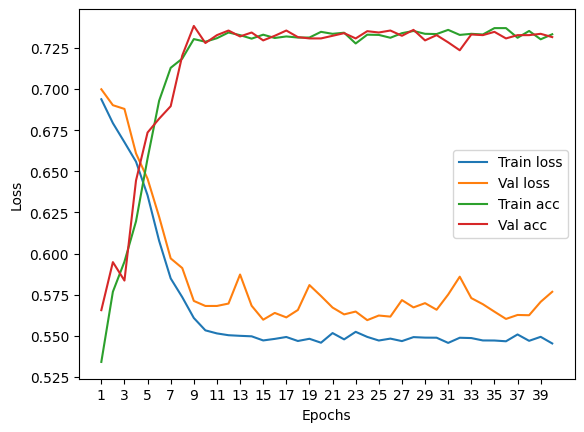

****************************************************************************************************



118it [00:00, 156.84it/s]


Train Epoch: 0 	Loss: 0.694955, Accuracy: 3995/7500 (53%)
Val Epoch: 0 	Loss: 0.703040, Accuracy: 1393/2500 (56%)



118it [00:00, 154.12it/s]


Train Epoch: 1 	Loss: 0.684823, Accuracy: 4346/7500 (58%)
Val Epoch: 1 	Loss: 0.691093, Accuracy: 1465/2500 (59%)



118it [00:00, 163.83it/s]


Train Epoch: 2 	Loss: 0.668437, Accuracy: 4554/7500 (61%)
Val Epoch: 2 	Loss: 0.669490, Accuracy: 1564/2500 (63%)



118it [00:00, 156.73it/s]


Train Epoch: 3 	Loss: 0.643220, Accuracy: 4874/7500 (65%)
Val Epoch: 3 	Loss: 0.639468, Accuracy: 1651/2500 (66%)



118it [00:00, 152.98it/s]


Train Epoch: 4 	Loss: 0.613798, Accuracy: 5169/7500 (69%)
Val Epoch: 4 	Loss: 0.605223, Accuracy: 1830/2500 (73%)



118it [00:00, 154.36it/s]


Train Epoch: 5 	Loss: 0.587647, Accuracy: 5404/7500 (72%)
Val Epoch: 5 	Loss: 0.577680, Accuracy: 1834/2500 (73%)



118it [00:00, 135.22it/s]


Train Epoch: 6 	Loss: 0.570977, Accuracy: 5435/7500 (72%)
Val Epoch: 6 	Loss: 0.576471, Accuracy: 1808/2500 (72%)



118it [00:00, 153.67it/s]


Train Epoch: 7 	Loss: 0.564246, Accuracy: 5445/7500 (73%)
Val Epoch: 7 	Loss: 0.564784, Accuracy: 1849/2500 (74%)



118it [00:00, 157.92it/s]


Train Epoch: 8 	Loss: 0.564076, Accuracy: 5423/7500 (72%)
Val Epoch: 8 	Loss: 0.568010, Accuracy: 1843/2500 (74%)



118it [00:00, 159.66it/s]


Train Epoch: 9 	Loss: 0.559615, Accuracy: 5459/7500 (73%)
Val Epoch: 9 	Loss: 0.558741, Accuracy: 1833/2500 (73%)



118it [00:00, 149.10it/s]


Train Epoch: 10 	Loss: 0.560533, Accuracy: 5460/7500 (73%)
Val Epoch: 10 	Loss: 0.565671, Accuracy: 1821/2500 (73%)



118it [00:00, 156.22it/s]


Train Epoch: 11 	Loss: 0.556100, Accuracy: 5446/7500 (73%)
Val Epoch: 11 	Loss: 0.552942, Accuracy: 1837/2500 (73%)



118it [00:00, 143.64it/s]


Train Epoch: 12 	Loss: 0.558277, Accuracy: 5492/7500 (73%)
Val Epoch: 12 	Loss: 0.564399, Accuracy: 1846/2500 (74%)



118it [00:00, 153.34it/s]


Train Epoch: 13 	Loss: 0.556128, Accuracy: 5467/7500 (73%)
Val Epoch: 13 	Loss: 0.564134, Accuracy: 1846/2500 (74%)



118it [00:00, 147.19it/s]


Train Epoch: 14 	Loss: 0.556072, Accuracy: 5490/7500 (73%)
Val Epoch: 14 	Loss: 0.556901, Accuracy: 1849/2500 (74%)



118it [00:00, 150.93it/s]


Train Epoch: 15 	Loss: 0.557627, Accuracy: 5467/7500 (73%)
Val Epoch: 15 	Loss: 0.558758, Accuracy: 1840/2500 (74%)



118it [00:00, 161.93it/s]


Train Epoch: 16 	Loss: 0.556313, Accuracy: 5472/7500 (73%)
Val Epoch: 16 	Loss: 0.572594, Accuracy: 1836/2500 (73%)



118it [00:00, 167.31it/s]


Train Epoch: 17 	Loss: 0.554887, Accuracy: 5469/7500 (73%)
Val Epoch: 17 	Loss: 0.554675, Accuracy: 1854/2500 (74%)



118it [00:00, 159.60it/s]


Train Epoch: 18 	Loss: 0.556256, Accuracy: 5466/7500 (73%)
Val Epoch: 18 	Loss: 0.568859, Accuracy: 1830/2500 (73%)



118it [00:00, 155.83it/s]


Train Epoch: 19 	Loss: 0.555198, Accuracy: 5466/7500 (73%)
Val Epoch: 19 	Loss: 0.560888, Accuracy: 1846/2500 (74%)



118it [00:00, 154.20it/s]


Train Epoch: 20 	Loss: 0.555414, Accuracy: 5454/7500 (73%)
Val Epoch: 20 	Loss: 0.549648, Accuracy: 1847/2500 (74%)



118it [00:00, 146.91it/s]


Train Epoch: 21 	Loss: 0.555507, Accuracy: 5481/7500 (73%)
Val Epoch: 21 	Loss: 0.556977, Accuracy: 1854/2500 (74%)



118it [00:00, 161.33it/s]


Train Epoch: 22 	Loss: 0.556155, Accuracy: 5499/7500 (73%)
Val Epoch: 22 	Loss: 0.553091, Accuracy: 1850/2500 (74%)



118it [00:00, 145.52it/s]


Train Epoch: 23 	Loss: 0.555194, Accuracy: 5480/7500 (73%)
Val Epoch: 23 	Loss: 0.564354, Accuracy: 1844/2500 (74%)



118it [00:00, 149.93it/s]


Train Epoch: 24 	Loss: 0.559291, Accuracy: 5457/7500 (73%)
Val Epoch: 24 	Loss: 0.558196, Accuracy: 1848/2500 (74%)



118it [00:00, 141.03it/s]


Train Epoch: 25 	Loss: 0.556146, Accuracy: 5478/7500 (73%)
Val Epoch: 25 	Loss: 0.559646, Accuracy: 1842/2500 (74%)



118it [00:00, 160.83it/s]


Train Epoch: 26 	Loss: 0.555518, Accuracy: 5479/7500 (73%)
Val Epoch: 26 	Loss: 0.557085, Accuracy: 1844/2500 (74%)



118it [00:00, 157.38it/s]


Train Epoch: 27 	Loss: 0.557254, Accuracy: 5470/7500 (73%)
Val Epoch: 27 	Loss: 0.560094, Accuracy: 1853/2500 (74%)



118it [00:00, 142.39it/s]


Train Epoch: 28 	Loss: 0.557664, Accuracy: 5460/7500 (73%)
Val Epoch: 28 	Loss: 0.556208, Accuracy: 1845/2500 (74%)



118it [00:00, 140.52it/s]


Train Epoch: 29 	Loss: 0.557802, Accuracy: 5472/7500 (73%)
Val Epoch: 29 	Loss: 0.566514, Accuracy: 1848/2500 (74%)



118it [00:00, 135.11it/s]


Train Epoch: 30 	Loss: 0.556527, Accuracy: 5494/7500 (73%)
Val Epoch: 30 	Loss: 0.556086, Accuracy: 1839/2500 (74%)



118it [00:00, 141.27it/s]


Train Epoch: 31 	Loss: 0.555524, Accuracy: 5470/7500 (73%)
Val Epoch: 31 	Loss: 0.555416, Accuracy: 1847/2500 (74%)



118it [00:00, 159.71it/s]


Train Epoch: 32 	Loss: 0.557715, Accuracy: 5463/7500 (73%)
Val Epoch: 32 	Loss: 0.555803, Accuracy: 1844/2500 (74%)



118it [00:00, 162.57it/s]


Train Epoch: 33 	Loss: 0.555265, Accuracy: 5476/7500 (73%)
Val Epoch: 33 	Loss: 0.552875, Accuracy: 1829/2500 (73%)



118it [00:00, 159.05it/s]


Train Epoch: 34 	Loss: 0.556549, Accuracy: 5472/7500 (73%)
Val Epoch: 34 	Loss: 0.557881, Accuracy: 1841/2500 (74%)



118it [00:00, 163.78it/s]


Train Epoch: 35 	Loss: 0.554278, Accuracy: 5495/7500 (73%)
Val Epoch: 35 	Loss: 0.552639, Accuracy: 1849/2500 (74%)



118it [00:00, 156.95it/s]


Train Epoch: 36 	Loss: 0.555291, Accuracy: 5470/7500 (73%)
Val Epoch: 36 	Loss: 0.551331, Accuracy: 1840/2500 (74%)



118it [00:00, 158.75it/s]


Train Epoch: 37 	Loss: 0.554893, Accuracy: 5488/7500 (73%)
Val Epoch: 37 	Loss: 0.558270, Accuracy: 1844/2500 (74%)



118it [00:00, 157.02it/s]


Train Epoch: 38 	Loss: 0.553298, Accuracy: 5502/7500 (73%)
Val Epoch: 38 	Loss: 0.560360, Accuracy: 1838/2500 (74%)



118it [00:00, 132.04it/s]


Train Epoch: 39 	Loss: 0.556160, Accuracy: 5476/7500 (73%)
Val Epoch: 39 	Loss: 0.557549, Accuracy: 1848/2500 (74%)

Test accuracy:  75.56


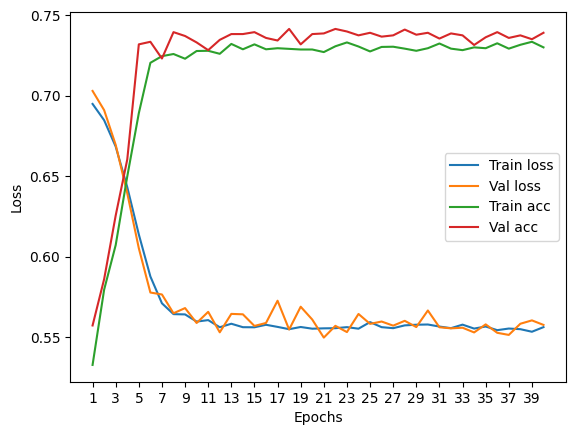

****************************************************************************************************



116it [00:00, 151.51it/s]


Train Epoch: 0 	Loss: 0.690437, Accuracy: 3969/7422 (53%)
Val Epoch: 0 	Loss: 0.689819, Accuracy: 1406/2474 (57%)



116it [00:00, 183.77it/s]


Train Epoch: 1 	Loss: 0.673897, Accuracy: 4361/7422 (59%)
Val Epoch: 1 	Loss: 0.673420, Accuracy: 1477/2474 (60%)



116it [00:00, 191.42it/s]


Train Epoch: 2 	Loss: 0.648218, Accuracy: 4716/7422 (64%)
Val Epoch: 2 	Loss: 0.631309, Accuracy: 1687/2474 (68%)



116it [00:00, 135.24it/s]


Train Epoch: 3 	Loss: 0.609221, Accuracy: 5148/7422 (69%)
Val Epoch: 3 	Loss: 0.591442, Accuracy: 1790/2474 (72%)



116it [00:00, 157.70it/s]


Train Epoch: 4 	Loss: 0.579539, Accuracy: 5327/7422 (72%)
Val Epoch: 4 	Loss: 0.566979, Accuracy: 1799/2474 (73%)



116it [00:00, 144.57it/s]


Train Epoch: 5 	Loss: 0.562252, Accuracy: 5404/7422 (73%)
Val Epoch: 5 	Loss: 0.552270, Accuracy: 1835/2474 (74%)



116it [00:00, 156.50it/s]


Train Epoch: 6 	Loss: 0.551077, Accuracy: 5444/7422 (73%)
Val Epoch: 6 	Loss: 0.544494, Accuracy: 1843/2474 (74%)



116it [00:00, 151.92it/s]


Train Epoch: 7 	Loss: 0.548948, Accuracy: 5410/7422 (73%)
Val Epoch: 7 	Loss: 0.549551, Accuracy: 1828/2474 (74%)



116it [00:00, 141.27it/s]


Train Epoch: 8 	Loss: 0.546415, Accuracy: 5453/7422 (73%)
Val Epoch: 8 	Loss: 0.538401, Accuracy: 1847/2474 (75%)



116it [00:00, 146.06it/s]


Train Epoch: 9 	Loss: 0.544834, Accuracy: 5427/7422 (73%)
Val Epoch: 9 	Loss: 0.540380, Accuracy: 1841/2474 (74%)



116it [00:00, 143.33it/s]


Train Epoch: 10 	Loss: 0.546962, Accuracy: 5445/7422 (73%)
Val Epoch: 10 	Loss: 0.537049, Accuracy: 1870/2474 (76%)



116it [00:00, 152.78it/s]


Train Epoch: 11 	Loss: 0.545112, Accuracy: 5457/7422 (74%)
Val Epoch: 11 	Loss: 0.536460, Accuracy: 1862/2474 (75%)



116it [00:00, 161.97it/s]


Train Epoch: 12 	Loss: 0.543798, Accuracy: 5458/7422 (74%)
Val Epoch: 12 	Loss: 0.537135, Accuracy: 1866/2474 (75%)



116it [00:00, 156.97it/s]


Train Epoch: 13 	Loss: 0.543515, Accuracy: 5470/7422 (74%)
Val Epoch: 13 	Loss: 0.538917, Accuracy: 1844/2474 (75%)



116it [00:00, 155.26it/s]


Train Epoch: 14 	Loss: 0.543874, Accuracy: 5478/7422 (74%)
Val Epoch: 14 	Loss: 0.537990, Accuracy: 1859/2474 (75%)



116it [00:00, 162.28it/s]


Train Epoch: 15 	Loss: 0.542654, Accuracy: 5478/7422 (74%)
Val Epoch: 15 	Loss: 0.537996, Accuracy: 1843/2474 (74%)



116it [00:00, 153.93it/s]


Train Epoch: 16 	Loss: 0.545420, Accuracy: 5450/7422 (73%)
Val Epoch: 16 	Loss: 0.543536, Accuracy: 1849/2474 (75%)



116it [00:00, 165.36it/s]


Train Epoch: 17 	Loss: 0.543260, Accuracy: 5464/7422 (74%)
Val Epoch: 17 	Loss: 0.541262, Accuracy: 1847/2474 (75%)



116it [00:00, 171.02it/s]


Train Epoch: 18 	Loss: 0.543850, Accuracy: 5460/7422 (74%)
Val Epoch: 18 	Loss: 0.535451, Accuracy: 1858/2474 (75%)



116it [00:00, 156.49it/s]


Train Epoch: 19 	Loss: 0.542369, Accuracy: 5488/7422 (74%)
Val Epoch: 19 	Loss: 0.535386, Accuracy: 1865/2474 (75%)



116it [00:00, 152.85it/s]


Train Epoch: 20 	Loss: 0.543792, Accuracy: 5436/7422 (73%)
Val Epoch: 20 	Loss: 0.538179, Accuracy: 1857/2474 (75%)



116it [00:00, 143.50it/s]


Train Epoch: 21 	Loss: 0.545842, Accuracy: 5467/7422 (74%)
Val Epoch: 21 	Loss: 0.536127, Accuracy: 1854/2474 (75%)



116it [00:00, 139.90it/s]


Train Epoch: 22 	Loss: 0.543212, Accuracy: 5489/7422 (74%)
Val Epoch: 22 	Loss: 0.543058, Accuracy: 1842/2474 (74%)



116it [00:00, 155.93it/s]


Train Epoch: 23 	Loss: 0.544186, Accuracy: 5460/7422 (74%)
Val Epoch: 23 	Loss: 0.537059, Accuracy: 1856/2474 (75%)



116it [00:00, 164.07it/s]


Train Epoch: 24 	Loss: 0.542789, Accuracy: 5458/7422 (74%)
Val Epoch: 24 	Loss: 0.536884, Accuracy: 1851/2474 (75%)



116it [00:00, 141.65it/s]


Train Epoch: 25 	Loss: 0.542141, Accuracy: 5469/7422 (74%)
Val Epoch: 25 	Loss: 0.537462, Accuracy: 1868/2474 (76%)



116it [00:00, 154.98it/s]


Train Epoch: 26 	Loss: 0.543278, Accuracy: 5468/7422 (74%)
Val Epoch: 26 	Loss: 0.535120, Accuracy: 1862/2474 (75%)



116it [00:00, 139.03it/s]


Train Epoch: 27 	Loss: 0.542569, Accuracy: 5452/7422 (73%)
Val Epoch: 27 	Loss: 0.534305, Accuracy: 1867/2474 (75%)



116it [00:00, 165.91it/s]


Train Epoch: 28 	Loss: 0.542436, Accuracy: 5447/7422 (73%)
Val Epoch: 28 	Loss: 0.535722, Accuracy: 1850/2474 (75%)



116it [00:00, 157.97it/s]


Train Epoch: 29 	Loss: 0.542087, Accuracy: 5496/7422 (74%)
Val Epoch: 29 	Loss: 0.539478, Accuracy: 1842/2474 (74%)



116it [00:00, 152.91it/s]


Train Epoch: 30 	Loss: 0.543247, Accuracy: 5456/7422 (74%)
Val Epoch: 30 	Loss: 0.539051, Accuracy: 1841/2474 (74%)



116it [00:00, 160.95it/s]


Train Epoch: 31 	Loss: 0.543502, Accuracy: 5476/7422 (74%)
Val Epoch: 31 	Loss: 0.534808, Accuracy: 1853/2474 (75%)



116it [00:00, 143.15it/s]


Train Epoch: 32 	Loss: 0.543742, Accuracy: 5474/7422 (74%)
Val Epoch: 32 	Loss: 0.535990, Accuracy: 1871/2474 (76%)



116it [00:00, 156.69it/s]


Train Epoch: 33 	Loss: 0.542626, Accuracy: 5473/7422 (74%)
Val Epoch: 33 	Loss: 0.546948, Accuracy: 1825/2474 (74%)



116it [00:00, 157.94it/s]


Train Epoch: 34 	Loss: 0.543040, Accuracy: 5496/7422 (74%)
Val Epoch: 34 	Loss: 0.539306, Accuracy: 1854/2474 (75%)



116it [00:00, 161.26it/s]


Train Epoch: 35 	Loss: 0.543446, Accuracy: 5479/7422 (74%)
Val Epoch: 35 	Loss: 0.534478, Accuracy: 1854/2474 (75%)



116it [00:00, 142.54it/s]


Train Epoch: 36 	Loss: 0.543555, Accuracy: 5479/7422 (74%)
Val Epoch: 36 	Loss: 0.538561, Accuracy: 1862/2474 (75%)



116it [00:00, 154.07it/s]


Train Epoch: 37 	Loss: 0.542974, Accuracy: 5476/7422 (74%)
Val Epoch: 37 	Loss: 0.538038, Accuracy: 1853/2474 (75%)



116it [00:00, 161.99it/s]


Train Epoch: 38 	Loss: 0.541148, Accuracy: 5480/7422 (74%)
Val Epoch: 38 	Loss: 0.535308, Accuracy: 1868/2474 (76%)



116it [00:00, 155.57it/s]


Train Epoch: 39 	Loss: 0.543329, Accuracy: 5445/7422 (73%)
Val Epoch: 39 	Loss: 0.542454, Accuracy: 1828/2474 (74%)

Test accuracy:  73.64591754244138


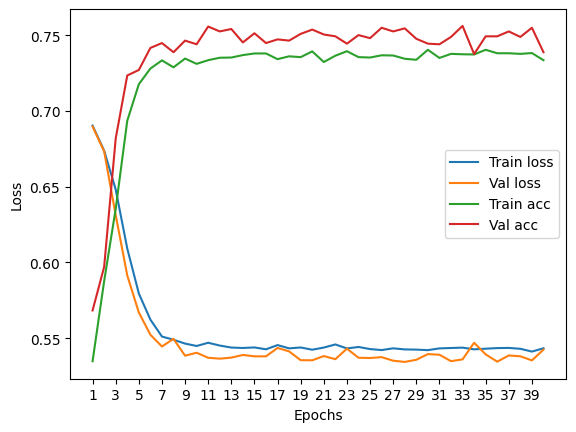

****************************************************************************************************



Particles per jet: 11


118it [00:00, 146.49it/s]


Train Epoch: 0 	Loss: 0.697656, Accuracy: 3832/7500 (51%)
Val Epoch: 0 	Loss: 0.706476, Accuracy: 1342/2500 (54%)



118it [00:00, 156.20it/s]


Train Epoch: 1 	Loss: 0.690666, Accuracy: 4195/7500 (56%)
Val Epoch: 1 	Loss: 0.699283, Accuracy: 1394/2500 (56%)



118it [00:00, 138.91it/s]


Train Epoch: 2 	Loss: 0.685762, Accuracy: 4245/7500 (57%)
Val Epoch: 2 	Loss: 0.699457, Accuracy: 1396/2500 (56%)



118it [00:00, 141.68it/s]


Train Epoch: 3 	Loss: 0.683054, Accuracy: 4302/7500 (57%)
Val Epoch: 3 	Loss: 0.697629, Accuracy: 1410/2500 (56%)



118it [00:00, 147.63it/s]


Train Epoch: 4 	Loss: 0.678073, Accuracy: 4331/7500 (58%)
Val Epoch: 4 	Loss: 0.689045, Accuracy: 1454/2500 (58%)



118it [00:00, 162.68it/s]


Train Epoch: 5 	Loss: 0.668453, Accuracy: 4494/7500 (60%)
Val Epoch: 5 	Loss: 0.674514, Accuracy: 1579/2500 (63%)



118it [00:00, 166.79it/s]


Train Epoch: 6 	Loss: 0.642566, Accuracy: 4877/7500 (65%)
Val Epoch: 6 	Loss: 0.640561, Accuracy: 1737/2500 (69%)



118it [00:00, 157.52it/s]


Train Epoch: 7 	Loss: 0.605477, Accuracy: 5256/7500 (70%)
Val Epoch: 7 	Loss: 0.594111, Accuracy: 1813/2500 (73%)



118it [00:00, 155.75it/s]


Train Epoch: 8 	Loss: 0.576700, Accuracy: 5383/7500 (72%)
Val Epoch: 8 	Loss: 0.567028, Accuracy: 1844/2500 (74%)



118it [00:00, 158.90it/s]


Train Epoch: 9 	Loss: 0.558295, Accuracy: 5498/7500 (73%)
Val Epoch: 9 	Loss: 0.560674, Accuracy: 1860/2500 (74%)



118it [00:00, 151.04it/s]


Train Epoch: 10 	Loss: 0.549275, Accuracy: 5520/7500 (74%)
Val Epoch: 10 	Loss: 0.545684, Accuracy: 1881/2500 (75%)



118it [00:00, 159.03it/s]


Train Epoch: 11 	Loss: 0.545189, Accuracy: 5558/7500 (74%)
Val Epoch: 11 	Loss: 0.555730, Accuracy: 1876/2500 (75%)



118it [00:00, 154.27it/s]


Train Epoch: 12 	Loss: 0.544659, Accuracy: 5520/7500 (74%)
Val Epoch: 12 	Loss: 0.543239, Accuracy: 1869/2500 (75%)



118it [00:00, 162.66it/s]


Train Epoch: 13 	Loss: 0.543579, Accuracy: 5564/7500 (74%)
Val Epoch: 13 	Loss: 0.547572, Accuracy: 1871/2500 (75%)



118it [00:00, 164.32it/s]


Train Epoch: 14 	Loss: 0.538691, Accuracy: 5562/7500 (74%)
Val Epoch: 14 	Loss: 0.539301, Accuracy: 1873/2500 (75%)



118it [00:00, 156.06it/s]


Train Epoch: 15 	Loss: 0.541560, Accuracy: 5544/7500 (74%)
Val Epoch: 15 	Loss: 0.539968, Accuracy: 1877/2500 (75%)



118it [00:00, 162.70it/s]


Train Epoch: 16 	Loss: 0.540436, Accuracy: 5558/7500 (74%)
Val Epoch: 16 	Loss: 0.552619, Accuracy: 1871/2500 (75%)



118it [00:00, 156.00it/s]


Train Epoch: 17 	Loss: 0.538103, Accuracy: 5588/7500 (75%)
Val Epoch: 17 	Loss: 0.540359, Accuracy: 1877/2500 (75%)



118it [00:00, 151.56it/s]


Train Epoch: 18 	Loss: 0.538781, Accuracy: 5570/7500 (74%)
Val Epoch: 18 	Loss: 0.546394, Accuracy: 1876/2500 (75%)



118it [00:00, 131.48it/s]


Train Epoch: 19 	Loss: 0.540259, Accuracy: 5572/7500 (74%)
Val Epoch: 19 	Loss: 0.542991, Accuracy: 1881/2500 (75%)



118it [00:00, 143.08it/s]


Train Epoch: 20 	Loss: 0.538200, Accuracy: 5579/7500 (74%)
Val Epoch: 20 	Loss: 0.545147, Accuracy: 1880/2500 (75%)



118it [00:00, 151.03it/s]


Train Epoch: 21 	Loss: 0.539815, Accuracy: 5572/7500 (74%)
Val Epoch: 21 	Loss: 0.550602, Accuracy: 1883/2500 (75%)



118it [00:00, 162.47it/s]


Train Epoch: 22 	Loss: 0.540758, Accuracy: 5567/7500 (74%)
Val Epoch: 22 	Loss: 0.540617, Accuracy: 1880/2500 (75%)



118it [00:00, 153.66it/s]


Train Epoch: 23 	Loss: 0.537514, Accuracy: 5597/7500 (75%)
Val Epoch: 23 	Loss: 0.542016, Accuracy: 1887/2500 (75%)



118it [00:00, 151.13it/s]


Train Epoch: 24 	Loss: 0.537568, Accuracy: 5579/7500 (74%)
Val Epoch: 24 	Loss: 0.543598, Accuracy: 1882/2500 (75%)



118it [00:00, 155.91it/s]


Train Epoch: 25 	Loss: 0.539935, Accuracy: 5582/7500 (74%)
Val Epoch: 25 	Loss: 0.547818, Accuracy: 1869/2500 (75%)



118it [00:00, 157.25it/s]


Train Epoch: 26 	Loss: 0.541874, Accuracy: 5571/7500 (74%)
Val Epoch: 26 	Loss: 0.573457, Accuracy: 1871/2500 (75%)



118it [00:00, 165.99it/s]


Train Epoch: 27 	Loss: 0.538633, Accuracy: 5552/7500 (74%)
Val Epoch: 27 	Loss: 0.534054, Accuracy: 1884/2500 (75%)



118it [00:00, 157.37it/s]


Train Epoch: 28 	Loss: 0.538233, Accuracy: 5579/7500 (74%)
Val Epoch: 28 	Loss: 0.537199, Accuracy: 1882/2500 (75%)



118it [00:00, 152.56it/s]


Train Epoch: 29 	Loss: 0.537038, Accuracy: 5573/7500 (74%)
Val Epoch: 29 	Loss: 0.553664, Accuracy: 1880/2500 (75%)



118it [00:00, 147.83it/s]


Train Epoch: 30 	Loss: 0.538673, Accuracy: 5567/7500 (74%)
Val Epoch: 30 	Loss: 0.552714, Accuracy: 1869/2500 (75%)



118it [00:00, 165.93it/s]


Train Epoch: 31 	Loss: 0.540024, Accuracy: 5582/7500 (74%)
Val Epoch: 31 	Loss: 0.534905, Accuracy: 1879/2500 (75%)



118it [00:00, 164.63it/s]


Train Epoch: 32 	Loss: 0.536424, Accuracy: 5577/7500 (74%)
Val Epoch: 32 	Loss: 0.551804, Accuracy: 1884/2500 (75%)



118it [00:00, 162.48it/s]


Train Epoch: 33 	Loss: 0.539809, Accuracy: 5584/7500 (74%)
Val Epoch: 33 	Loss: 0.535918, Accuracy: 1873/2500 (75%)



118it [00:00, 164.16it/s]


Train Epoch: 34 	Loss: 0.537124, Accuracy: 5565/7500 (74%)
Val Epoch: 34 	Loss: 0.548141, Accuracy: 1864/2500 (75%)



118it [00:00, 129.69it/s]


Train Epoch: 35 	Loss: 0.537459, Accuracy: 5577/7500 (74%)
Val Epoch: 35 	Loss: 0.534083, Accuracy: 1877/2500 (75%)



118it [00:00, 153.52it/s]


Train Epoch: 36 	Loss: 0.537237, Accuracy: 5578/7500 (74%)
Val Epoch: 36 	Loss: 0.536009, Accuracy: 1874/2500 (75%)



118it [00:00, 145.26it/s]


Train Epoch: 37 	Loss: 0.539302, Accuracy: 5577/7500 (74%)
Val Epoch: 37 	Loss: 0.543069, Accuracy: 1878/2500 (75%)



118it [00:00, 154.13it/s]


Train Epoch: 38 	Loss: 0.537416, Accuracy: 5606/7500 (75%)
Val Epoch: 38 	Loss: 0.541660, Accuracy: 1888/2500 (76%)



118it [00:00, 170.48it/s]


Train Epoch: 39 	Loss: 0.540175, Accuracy: 5583/7500 (74%)
Val Epoch: 39 	Loss: 0.553381, Accuracy: 1862/2500 (74%)

Test accuracy:  74.24


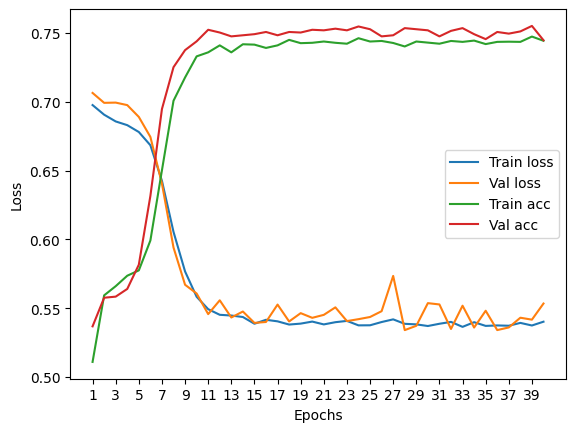

****************************************************************************************************



118it [00:00, 137.92it/s]


Train Epoch: 0 	Loss: 0.696122, Accuracy: 3922/7500 (52%)
Val Epoch: 0 	Loss: 0.702110, Accuracy: 1418/2500 (57%)



118it [00:00, 146.56it/s]


Train Epoch: 1 	Loss: 0.680255, Accuracy: 4390/7500 (59%)
Val Epoch: 1 	Loss: 0.685143, Accuracy: 1448/2500 (58%)



118it [00:00, 160.33it/s]


Train Epoch: 2 	Loss: 0.651920, Accuracy: 4789/7500 (64%)
Val Epoch: 2 	Loss: 0.640938, Accuracy: 1661/2500 (66%)



118it [00:00, 145.03it/s]


Train Epoch: 3 	Loss: 0.616149, Accuracy: 5117/7500 (68%)
Val Epoch: 3 	Loss: 0.609991, Accuracy: 1756/2500 (70%)



118it [00:00, 158.84it/s]


Train Epoch: 4 	Loss: 0.582182, Accuracy: 5365/7500 (72%)
Val Epoch: 4 	Loss: 0.575092, Accuracy: 1814/2500 (73%)



118it [00:00, 160.38it/s]


Train Epoch: 5 	Loss: 0.566729, Accuracy: 5392/7500 (72%)
Val Epoch: 5 	Loss: 0.580835, Accuracy: 1799/2500 (72%)



118it [00:00, 168.16it/s]


Train Epoch: 6 	Loss: 0.560678, Accuracy: 5419/7500 (72%)
Val Epoch: 6 	Loss: 0.564495, Accuracy: 1834/2500 (73%)



118it [00:00, 144.20it/s]


Train Epoch: 7 	Loss: 0.557062, Accuracy: 5464/7500 (73%)
Val Epoch: 7 	Loss: 0.578609, Accuracy: 1825/2500 (73%)



118it [00:00, 165.43it/s]


Train Epoch: 8 	Loss: 0.556440, Accuracy: 5468/7500 (73%)
Val Epoch: 8 	Loss: 0.567237, Accuracy: 1831/2500 (73%)



118it [00:00, 158.29it/s]


Train Epoch: 9 	Loss: 0.556917, Accuracy: 5463/7500 (73%)
Val Epoch: 9 	Loss: 0.571999, Accuracy: 1833/2500 (73%)



118it [00:00, 160.58it/s]


Train Epoch: 10 	Loss: 0.556907, Accuracy: 5472/7500 (73%)
Val Epoch: 10 	Loss: 0.568788, Accuracy: 1836/2500 (73%)



118it [00:00, 160.38it/s]


Train Epoch: 11 	Loss: 0.556291, Accuracy: 5484/7500 (73%)
Val Epoch: 11 	Loss: 0.586020, Accuracy: 1817/2500 (73%)



118it [00:00, 149.13it/s]


Train Epoch: 12 	Loss: 0.557127, Accuracy: 5475/7500 (73%)
Val Epoch: 12 	Loss: 0.558855, Accuracy: 1848/2500 (74%)



118it [00:00, 140.53it/s]


Train Epoch: 13 	Loss: 0.551562, Accuracy: 5495/7500 (73%)
Val Epoch: 13 	Loss: 0.561296, Accuracy: 1824/2500 (73%)



118it [00:00, 134.22it/s]


Train Epoch: 14 	Loss: 0.553569, Accuracy: 5488/7500 (73%)
Val Epoch: 14 	Loss: 0.557937, Accuracy: 1845/2500 (74%)



118it [00:00, 141.76it/s]


Train Epoch: 15 	Loss: 0.553698, Accuracy: 5486/7500 (73%)
Val Epoch: 15 	Loss: 0.556071, Accuracy: 1852/2500 (74%)



118it [00:00, 137.93it/s]


Train Epoch: 16 	Loss: 0.550952, Accuracy: 5494/7500 (73%)
Val Epoch: 16 	Loss: 0.560872, Accuracy: 1849/2500 (74%)



118it [00:00, 147.57it/s]


Train Epoch: 17 	Loss: 0.554494, Accuracy: 5479/7500 (73%)
Val Epoch: 17 	Loss: 0.560124, Accuracy: 1855/2500 (74%)



118it [00:00, 149.31it/s]


Train Epoch: 18 	Loss: 0.551200, Accuracy: 5508/7500 (73%)
Val Epoch: 18 	Loss: 0.565072, Accuracy: 1847/2500 (74%)



118it [00:00, 160.56it/s]


Train Epoch: 19 	Loss: 0.552447, Accuracy: 5489/7500 (73%)
Val Epoch: 19 	Loss: 0.566658, Accuracy: 1850/2500 (74%)



118it [00:00, 158.75it/s]


Train Epoch: 20 	Loss: 0.554571, Accuracy: 5490/7500 (73%)
Val Epoch: 20 	Loss: 0.555450, Accuracy: 1846/2500 (74%)



118it [00:00, 147.42it/s]


Train Epoch: 21 	Loss: 0.551701, Accuracy: 5503/7500 (73%)
Val Epoch: 21 	Loss: 0.572911, Accuracy: 1843/2500 (74%)



118it [00:00, 160.34it/s]


Train Epoch: 22 	Loss: 0.552211, Accuracy: 5482/7500 (73%)
Val Epoch: 22 	Loss: 0.564605, Accuracy: 1849/2500 (74%)



118it [00:00, 150.36it/s]


Train Epoch: 23 	Loss: 0.551999, Accuracy: 5499/7500 (73%)
Val Epoch: 23 	Loss: 0.578527, Accuracy: 1833/2500 (73%)



118it [00:00, 162.00it/s]


Train Epoch: 24 	Loss: 0.553025, Accuracy: 5505/7500 (73%)
Val Epoch: 24 	Loss: 0.566979, Accuracy: 1835/2500 (73%)



118it [00:00, 158.83it/s]


Train Epoch: 25 	Loss: 0.550374, Accuracy: 5499/7500 (73%)
Val Epoch: 25 	Loss: 0.564527, Accuracy: 1848/2500 (74%)



118it [00:00, 147.39it/s]


Train Epoch: 26 	Loss: 0.551860, Accuracy: 5489/7500 (73%)
Val Epoch: 26 	Loss: 0.561533, Accuracy: 1850/2500 (74%)



118it [00:00, 155.61it/s]


Train Epoch: 27 	Loss: 0.550117, Accuracy: 5497/7500 (73%)
Val Epoch: 27 	Loss: 0.573916, Accuracy: 1827/2500 (73%)



118it [00:00, 162.70it/s]


Train Epoch: 28 	Loss: 0.554109, Accuracy: 5490/7500 (73%)
Val Epoch: 28 	Loss: 0.556606, Accuracy: 1842/2500 (74%)



118it [00:00, 138.01it/s]


Train Epoch: 29 	Loss: 0.553911, Accuracy: 5497/7500 (73%)
Val Epoch: 29 	Loss: 0.555870, Accuracy: 1846/2500 (74%)



118it [00:00, 135.50it/s]


Train Epoch: 30 	Loss: 0.553327, Accuracy: 5466/7500 (73%)
Val Epoch: 30 	Loss: 0.559061, Accuracy: 1826/2500 (73%)



118it [00:00, 138.85it/s]


Train Epoch: 31 	Loss: 0.550505, Accuracy: 5482/7500 (73%)
Val Epoch: 31 	Loss: 0.560521, Accuracy: 1850/2500 (74%)



118it [00:00, 146.18it/s]


Train Epoch: 32 	Loss: 0.550928, Accuracy: 5505/7500 (73%)
Val Epoch: 32 	Loss: 0.563395, Accuracy: 1847/2500 (74%)



118it [00:00, 162.14it/s]


Train Epoch: 33 	Loss: 0.553682, Accuracy: 5489/7500 (73%)
Val Epoch: 33 	Loss: 0.569522, Accuracy: 1860/2500 (74%)



118it [00:00, 167.75it/s]


Train Epoch: 34 	Loss: 0.554118, Accuracy: 5504/7500 (73%)
Val Epoch: 34 	Loss: 0.562778, Accuracy: 1852/2500 (74%)



118it [00:00, 154.08it/s]


Train Epoch: 35 	Loss: 0.551801, Accuracy: 5494/7500 (73%)
Val Epoch: 35 	Loss: 0.560313, Accuracy: 1849/2500 (74%)



118it [00:00, 147.40it/s]


Train Epoch: 36 	Loss: 0.552499, Accuracy: 5464/7500 (73%)
Val Epoch: 36 	Loss: 0.560046, Accuracy: 1842/2500 (74%)



118it [00:00, 143.21it/s]


Train Epoch: 37 	Loss: 0.550508, Accuracy: 5509/7500 (73%)
Val Epoch: 37 	Loss: 0.566253, Accuracy: 1843/2500 (74%)



118it [00:00, 158.92it/s]


Train Epoch: 38 	Loss: 0.552175, Accuracy: 5495/7500 (73%)
Val Epoch: 38 	Loss: 0.560512, Accuracy: 1845/2500 (74%)



118it [00:00, 162.51it/s]


Train Epoch: 39 	Loss: 0.551638, Accuracy: 5486/7500 (73%)
Val Epoch: 39 	Loss: 0.563413, Accuracy: 1843/2500 (74%)

Test accuracy:  73.76


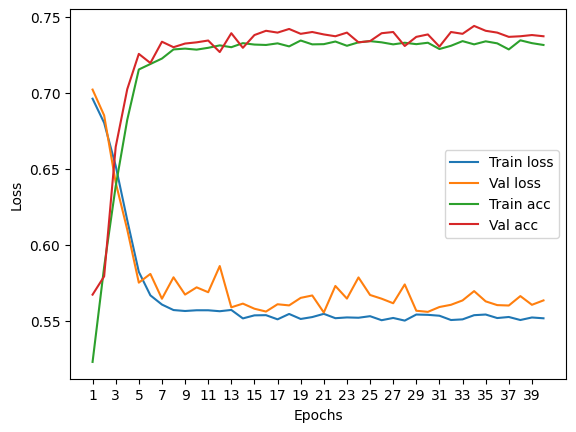

****************************************************************************************************



118it [00:00, 158.92it/s]


Train Epoch: 0 	Loss: 0.697642, Accuracy: 3861/7500 (51%)
Val Epoch: 0 	Loss: 0.705835, Accuracy: 1378/2500 (55%)



118it [00:00, 164.80it/s]


Train Epoch: 1 	Loss: 0.687366, Accuracy: 4239/7500 (57%)
Val Epoch: 1 	Loss: 0.697049, Accuracy: 1438/2500 (58%)



118it [00:00, 150.77it/s]


Train Epoch: 2 	Loss: 0.663338, Accuracy: 4563/7500 (61%)
Val Epoch: 2 	Loss: 0.678488, Accuracy: 1545/2500 (62%)



118it [00:00, 158.60it/s]


Train Epoch: 3 	Loss: 0.624066, Accuracy: 5123/7500 (68%)
Val Epoch: 3 	Loss: 0.619946, Accuracy: 1781/2500 (71%)



118it [00:00, 146.33it/s]


Train Epoch: 4 	Loss: 0.583011, Accuracy: 5409/7500 (72%)
Val Epoch: 4 	Loss: 0.585337, Accuracy: 1830/2500 (73%)



118it [00:00, 151.21it/s]


Train Epoch: 5 	Loss: 0.559775, Accuracy: 5533/7500 (74%)
Val Epoch: 5 	Loss: 0.591576, Accuracy: 1801/2500 (72%)



118it [00:00, 119.15it/s]


Train Epoch: 6 	Loss: 0.545593, Accuracy: 5538/7500 (74%)
Val Epoch: 6 	Loss: 0.572239, Accuracy: 1844/2500 (74%)



118it [00:00, 131.94it/s]


Train Epoch: 7 	Loss: 0.537375, Accuracy: 5607/7500 (75%)
Val Epoch: 7 	Loss: 0.555208, Accuracy: 1860/2500 (74%)



118it [00:00, 139.07it/s]


Train Epoch: 8 	Loss: 0.535371, Accuracy: 5610/7500 (75%)
Val Epoch: 8 	Loss: 0.559715, Accuracy: 1835/2500 (73%)



118it [00:00, 134.30it/s]


Train Epoch: 9 	Loss: 0.534119, Accuracy: 5592/7500 (75%)
Val Epoch: 9 	Loss: 0.571029, Accuracy: 1823/2500 (73%)



118it [00:00, 120.11it/s]


Train Epoch: 10 	Loss: 0.532172, Accuracy: 5598/7500 (75%)
Val Epoch: 10 	Loss: 0.554783, Accuracy: 1841/2500 (74%)



118it [00:00, 149.07it/s]


Train Epoch: 11 	Loss: 0.532406, Accuracy: 5606/7500 (75%)
Val Epoch: 11 	Loss: 0.547243, Accuracy: 1867/2500 (75%)



118it [00:00, 159.06it/s]


Train Epoch: 12 	Loss: 0.532268, Accuracy: 5612/7500 (75%)
Val Epoch: 12 	Loss: 0.561174, Accuracy: 1854/2500 (74%)



118it [00:00, 157.09it/s]


Train Epoch: 13 	Loss: 0.531926, Accuracy: 5612/7500 (75%)
Val Epoch: 13 	Loss: 0.559523, Accuracy: 1851/2500 (74%)



118it [00:00, 158.83it/s]


Train Epoch: 14 	Loss: 0.532282, Accuracy: 5594/7500 (75%)
Val Epoch: 14 	Loss: 0.551628, Accuracy: 1846/2500 (74%)



118it [00:00, 157.45it/s]


Train Epoch: 15 	Loss: 0.529849, Accuracy: 5636/7500 (75%)
Val Epoch: 15 	Loss: 0.557757, Accuracy: 1847/2500 (74%)



118it [00:00, 165.64it/s]


Train Epoch: 16 	Loss: 0.531247, Accuracy: 5619/7500 (75%)
Val Epoch: 16 	Loss: 0.547200, Accuracy: 1860/2500 (74%)



118it [00:00, 160.91it/s]


Train Epoch: 17 	Loss: 0.531718, Accuracy: 5618/7500 (75%)
Val Epoch: 17 	Loss: 0.552151, Accuracy: 1831/2500 (73%)



118it [00:00, 164.48it/s]


Train Epoch: 18 	Loss: 0.531179, Accuracy: 5618/7500 (75%)
Val Epoch: 18 	Loss: 0.553121, Accuracy: 1856/2500 (74%)



118it [00:00, 163.76it/s]


Train Epoch: 19 	Loss: 0.530156, Accuracy: 5596/7500 (75%)
Val Epoch: 19 	Loss: 0.559716, Accuracy: 1854/2500 (74%)



118it [00:00, 157.40it/s]


Train Epoch: 20 	Loss: 0.529004, Accuracy: 5598/7500 (75%)
Val Epoch: 20 	Loss: 0.560961, Accuracy: 1864/2500 (75%)



118it [00:00, 157.09it/s]


Train Epoch: 21 	Loss: 0.533192, Accuracy: 5604/7500 (75%)
Val Epoch: 21 	Loss: 0.551943, Accuracy: 1876/2500 (75%)



118it [00:00, 140.50it/s]


Train Epoch: 22 	Loss: 0.532412, Accuracy: 5591/7500 (75%)
Val Epoch: 22 	Loss: 0.564835, Accuracy: 1841/2500 (74%)



118it [00:00, 157.25it/s]


Train Epoch: 23 	Loss: 0.531216, Accuracy: 5632/7500 (75%)
Val Epoch: 23 	Loss: 0.564427, Accuracy: 1852/2500 (74%)



118it [00:00, 143.16it/s]


Train Epoch: 24 	Loss: 0.531100, Accuracy: 5605/7500 (75%)
Val Epoch: 24 	Loss: 0.545579, Accuracy: 1862/2500 (74%)



118it [00:00, 147.16it/s]


Train Epoch: 25 	Loss: 0.529621, Accuracy: 5609/7500 (75%)
Val Epoch: 25 	Loss: 0.550187, Accuracy: 1863/2500 (75%)



118it [00:00, 138.13it/s]


Train Epoch: 26 	Loss: 0.529149, Accuracy: 5617/7500 (75%)
Val Epoch: 26 	Loss: 0.551573, Accuracy: 1849/2500 (74%)



118it [00:00, 156.40it/s]


Train Epoch: 27 	Loss: 0.529899, Accuracy: 5611/7500 (75%)
Val Epoch: 27 	Loss: 0.553075, Accuracy: 1839/2500 (74%)



118it [00:00, 162.73it/s]


Train Epoch: 28 	Loss: 0.531117, Accuracy: 5618/7500 (75%)
Val Epoch: 28 	Loss: 0.550307, Accuracy: 1840/2500 (74%)



118it [00:01, 112.91it/s]


Train Epoch: 29 	Loss: 0.531232, Accuracy: 5623/7500 (75%)
Val Epoch: 29 	Loss: 0.571116, Accuracy: 1849/2500 (74%)



118it [00:00, 153.98it/s]


Train Epoch: 30 	Loss: 0.529412, Accuracy: 5618/7500 (75%)
Val Epoch: 30 	Loss: 0.552867, Accuracy: 1853/2500 (74%)



118it [00:00, 158.36it/s]


Train Epoch: 31 	Loss: 0.529753, Accuracy: 5627/7500 (75%)
Val Epoch: 31 	Loss: 0.544754, Accuracy: 1862/2500 (74%)



118it [00:00, 152.23it/s]


Train Epoch: 32 	Loss: 0.529535, Accuracy: 5613/7500 (75%)
Val Epoch: 32 	Loss: 0.542798, Accuracy: 1864/2500 (75%)



118it [00:00, 155.61it/s]


Train Epoch: 33 	Loss: 0.529102, Accuracy: 5630/7500 (75%)
Val Epoch: 33 	Loss: 0.554453, Accuracy: 1872/2500 (75%)



118it [00:00, 186.80it/s]


Train Epoch: 34 	Loss: 0.528383, Accuracy: 5618/7500 (75%)
Val Epoch: 34 	Loss: 0.558574, Accuracy: 1866/2500 (75%)



118it [00:00, 137.62it/s]


Train Epoch: 35 	Loss: 0.530893, Accuracy: 5599/7500 (75%)
Val Epoch: 35 	Loss: 0.547710, Accuracy: 1867/2500 (75%)



118it [00:00, 162.48it/s]


Train Epoch: 36 	Loss: 0.530584, Accuracy: 5626/7500 (75%)
Val Epoch: 36 	Loss: 0.550697, Accuracy: 1857/2500 (74%)



118it [00:00, 153.40it/s]


Train Epoch: 37 	Loss: 0.530598, Accuracy: 5614/7500 (75%)
Val Epoch: 37 	Loss: 0.553144, Accuracy: 1843/2500 (74%)



118it [00:00, 161.02it/s]


Train Epoch: 38 	Loss: 0.529012, Accuracy: 5607/7500 (75%)
Val Epoch: 38 	Loss: 0.543194, Accuracy: 1866/2500 (75%)



118it [00:00, 162.10it/s]


Train Epoch: 39 	Loss: 0.528774, Accuracy: 5623/7500 (75%)
Val Epoch: 39 	Loss: 0.553950, Accuracy: 1856/2500 (74%)

Test accuracy:  74.88


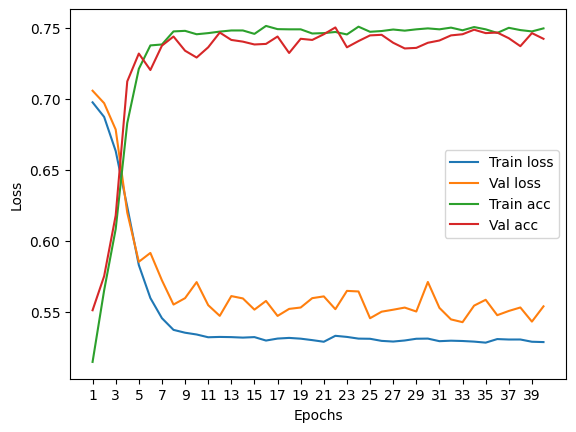

****************************************************************************************************



118it [00:00, 155.84it/s]


Train Epoch: 0 	Loss: 0.696189, Accuracy: 3974/7500 (53%)
Val Epoch: 0 	Loss: 0.704534, Accuracy: 1432/2500 (57%)



118it [00:00, 149.29it/s]


Train Epoch: 1 	Loss: 0.685375, Accuracy: 4336/7500 (58%)
Val Epoch: 1 	Loss: 0.686329, Accuracy: 1508/2500 (60%)



118it [00:00, 162.27it/s]


Train Epoch: 2 	Loss: 0.668422, Accuracy: 4503/7500 (60%)
Val Epoch: 2 	Loss: 0.677184, Accuracy: 1549/2500 (62%)



118it [00:00, 140.87it/s]


Train Epoch: 3 	Loss: 0.651853, Accuracy: 4742/7500 (63%)
Val Epoch: 3 	Loss: 0.645797, Accuracy: 1676/2500 (67%)



118it [00:00, 139.12it/s]


Train Epoch: 4 	Loss: 0.625704, Accuracy: 5086/7500 (68%)
Val Epoch: 4 	Loss: 0.621493, Accuracy: 1727/2500 (69%)



118it [00:00, 137.53it/s]


Train Epoch: 5 	Loss: 0.594866, Accuracy: 5308/7500 (71%)
Val Epoch: 5 	Loss: 0.586689, Accuracy: 1830/2500 (73%)



118it [00:00, 158.80it/s]


Train Epoch: 6 	Loss: 0.568611, Accuracy: 5452/7500 (73%)
Val Epoch: 6 	Loss: 0.570426, Accuracy: 1831/2500 (73%)



118it [00:00, 158.54it/s]


Train Epoch: 7 	Loss: 0.557041, Accuracy: 5463/7500 (73%)
Val Epoch: 7 	Loss: 0.565926, Accuracy: 1851/2500 (74%)



118it [00:00, 167.46it/s]


Train Epoch: 8 	Loss: 0.550182, Accuracy: 5499/7500 (73%)
Val Epoch: 8 	Loss: 0.559107, Accuracy: 1841/2500 (74%)



118it [00:00, 160.97it/s]


Train Epoch: 9 	Loss: 0.547727, Accuracy: 5530/7500 (74%)
Val Epoch: 9 	Loss: 0.559527, Accuracy: 1848/2500 (74%)



118it [00:00, 141.98it/s]


Train Epoch: 10 	Loss: 0.544876, Accuracy: 5519/7500 (74%)
Val Epoch: 10 	Loss: 0.554104, Accuracy: 1858/2500 (74%)



118it [00:00, 138.82it/s]


Train Epoch: 11 	Loss: 0.543939, Accuracy: 5527/7500 (74%)
Val Epoch: 11 	Loss: 0.552373, Accuracy: 1856/2500 (74%)



118it [00:00, 153.92it/s]


Train Epoch: 12 	Loss: 0.542051, Accuracy: 5544/7500 (74%)
Val Epoch: 12 	Loss: 0.555036, Accuracy: 1851/2500 (74%)



118it [00:00, 154.87it/s]


Train Epoch: 13 	Loss: 0.543044, Accuracy: 5523/7500 (74%)
Val Epoch: 13 	Loss: 0.557346, Accuracy: 1840/2500 (74%)



118it [00:00, 157.10it/s]


Train Epoch: 14 	Loss: 0.542849, Accuracy: 5515/7500 (74%)
Val Epoch: 14 	Loss: 0.560193, Accuracy: 1857/2500 (74%)



118it [00:00, 143.35it/s]


Train Epoch: 15 	Loss: 0.542165, Accuracy: 5540/7500 (74%)
Val Epoch: 15 	Loss: 0.555511, Accuracy: 1858/2500 (74%)



118it [00:00, 152.54it/s]


Train Epoch: 16 	Loss: 0.542872, Accuracy: 5528/7500 (74%)
Val Epoch: 16 	Loss: 0.557154, Accuracy: 1825/2500 (73%)



118it [00:00, 146.42it/s]


Train Epoch: 17 	Loss: 0.539874, Accuracy: 5551/7500 (74%)
Val Epoch: 17 	Loss: 0.570029, Accuracy: 1861/2500 (74%)



118it [00:00, 152.31it/s]


Train Epoch: 18 	Loss: 0.541901, Accuracy: 5533/7500 (74%)
Val Epoch: 18 	Loss: 0.563977, Accuracy: 1852/2500 (74%)



118it [00:00, 127.40it/s]


Train Epoch: 19 	Loss: 0.540007, Accuracy: 5551/7500 (74%)
Val Epoch: 19 	Loss: 0.556164, Accuracy: 1845/2500 (74%)



118it [00:00, 131.78it/s]


Train Epoch: 20 	Loss: 0.541624, Accuracy: 5559/7500 (74%)
Val Epoch: 20 	Loss: 0.558809, Accuracy: 1861/2500 (74%)



118it [00:00, 134.22it/s]


Train Epoch: 21 	Loss: 0.540343, Accuracy: 5554/7500 (74%)
Val Epoch: 21 	Loss: 0.565119, Accuracy: 1846/2500 (74%)



118it [00:00, 166.56it/s]


Train Epoch: 22 	Loss: 0.540923, Accuracy: 5535/7500 (74%)
Val Epoch: 22 	Loss: 0.570813, Accuracy: 1812/2500 (72%)



118it [00:00, 156.64it/s]


Train Epoch: 23 	Loss: 0.544116, Accuracy: 5558/7500 (74%)
Val Epoch: 23 	Loss: 0.555007, Accuracy: 1845/2500 (74%)



118it [00:00, 162.75it/s]


Train Epoch: 24 	Loss: 0.544469, Accuracy: 5514/7500 (74%)
Val Epoch: 24 	Loss: 0.566908, Accuracy: 1856/2500 (74%)



118it [00:00, 155.78it/s]


Train Epoch: 25 	Loss: 0.539879, Accuracy: 5527/7500 (74%)
Val Epoch: 25 	Loss: 0.561930, Accuracy: 1845/2500 (74%)



118it [00:00, 150.95it/s]


Train Epoch: 26 	Loss: 0.541382, Accuracy: 5541/7500 (74%)
Val Epoch: 26 	Loss: 0.551493, Accuracy: 1847/2500 (74%)



118it [00:00, 153.57it/s]


Train Epoch: 27 	Loss: 0.539169, Accuracy: 5549/7500 (74%)
Val Epoch: 27 	Loss: 0.562708, Accuracy: 1844/2500 (74%)



118it [00:00, 161.18it/s]


Train Epoch: 28 	Loss: 0.540862, Accuracy: 5545/7500 (74%)
Val Epoch: 28 	Loss: 0.564483, Accuracy: 1853/2500 (74%)



118it [00:00, 159.12it/s]


Train Epoch: 29 	Loss: 0.540676, Accuracy: 5562/7500 (74%)
Val Epoch: 29 	Loss: 0.556224, Accuracy: 1848/2500 (74%)



118it [00:00, 152.00it/s]


Train Epoch: 30 	Loss: 0.540432, Accuracy: 5541/7500 (74%)
Val Epoch: 30 	Loss: 0.560195, Accuracy: 1859/2500 (74%)



118it [00:00, 134.22it/s]


Train Epoch: 31 	Loss: 0.542099, Accuracy: 5551/7500 (74%)
Val Epoch: 31 	Loss: 0.556006, Accuracy: 1833/2500 (73%)



118it [00:00, 155.43it/s]


Train Epoch: 32 	Loss: 0.540126, Accuracy: 5545/7500 (74%)
Val Epoch: 32 	Loss: 0.562287, Accuracy: 1837/2500 (73%)



118it [00:00, 161.05it/s]


Train Epoch: 33 	Loss: 0.538791, Accuracy: 5545/7500 (74%)
Val Epoch: 33 	Loss: 0.556032, Accuracy: 1846/2500 (74%)



118it [00:00, 167.79it/s]


Train Epoch: 34 	Loss: 0.540546, Accuracy: 5538/7500 (74%)
Val Epoch: 34 	Loss: 0.563492, Accuracy: 1830/2500 (73%)



118it [00:00, 128.27it/s]


Train Epoch: 35 	Loss: 0.539873, Accuracy: 5545/7500 (74%)
Val Epoch: 35 	Loss: 0.567848, Accuracy: 1852/2500 (74%)



118it [00:00, 149.26it/s]


Train Epoch: 36 	Loss: 0.542593, Accuracy: 5529/7500 (74%)
Val Epoch: 36 	Loss: 0.560122, Accuracy: 1847/2500 (74%)



118it [00:00, 140.35it/s]


Train Epoch: 37 	Loss: 0.542257, Accuracy: 5537/7500 (74%)
Val Epoch: 37 	Loss: 0.562102, Accuracy: 1835/2500 (73%)



118it [00:00, 162.32it/s]


Train Epoch: 38 	Loss: 0.540173, Accuracy: 5547/7500 (74%)
Val Epoch: 38 	Loss: 0.565111, Accuracy: 1848/2500 (74%)



118it [00:00, 162.71it/s]


Train Epoch: 39 	Loss: 0.538043, Accuracy: 5549/7500 (74%)
Val Epoch: 39 	Loss: 0.562503, Accuracy: 1848/2500 (74%)

Test accuracy:  73.32


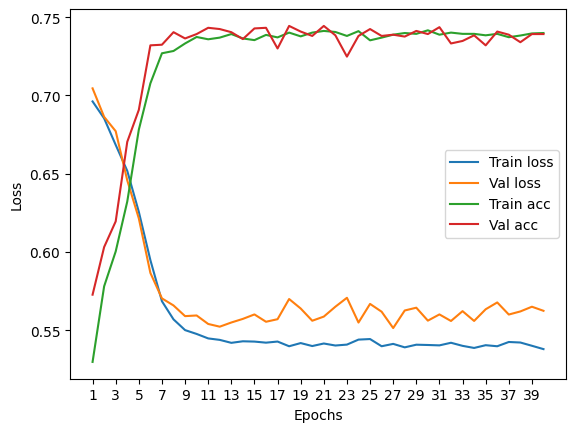

****************************************************************************************************



118it [00:00, 138.08it/s]


Train Epoch: 0 	Loss: 0.695903, Accuracy: 3999/7500 (53%)
Val Epoch: 0 	Loss: 0.708517, Accuracy: 1311/2500 (52%)



118it [00:00, 160.54it/s]


Train Epoch: 1 	Loss: 0.686320, Accuracy: 4227/7500 (56%)
Val Epoch: 1 	Loss: 0.702841, Accuracy: 1352/2500 (54%)



118it [00:00, 160.71it/s]


Train Epoch: 2 	Loss: 0.676191, Accuracy: 4422/7500 (59%)
Val Epoch: 2 	Loss: 0.694379, Accuracy: 1409/2500 (56%)



118it [00:00, 150.95it/s]


Train Epoch: 3 	Loss: 0.663382, Accuracy: 4606/7500 (61%)
Val Epoch: 3 	Loss: 0.679758, Accuracy: 1503/2500 (60%)



118it [00:00, 143.21it/s]


Train Epoch: 4 	Loss: 0.643526, Accuracy: 4837/7500 (64%)
Val Epoch: 4 	Loss: 0.651093, Accuracy: 1630/2500 (65%)



118it [00:00, 158.78it/s]


Train Epoch: 5 	Loss: 0.617776, Accuracy: 5123/7500 (68%)
Val Epoch: 5 	Loss: 0.619378, Accuracy: 1713/2500 (69%)



118it [00:00, 157.29it/s]


Train Epoch: 6 	Loss: 0.594143, Accuracy: 5302/7500 (71%)
Val Epoch: 6 	Loss: 0.600970, Accuracy: 1760/2500 (70%)



118it [00:00, 157.33it/s]


Train Epoch: 7 	Loss: 0.574983, Accuracy: 5436/7500 (72%)
Val Epoch: 7 	Loss: 0.590916, Accuracy: 1825/2500 (73%)



118it [00:00, 153.85it/s]


Train Epoch: 8 	Loss: 0.563438, Accuracy: 5486/7500 (73%)
Val Epoch: 8 	Loss: 0.576116, Accuracy: 1821/2500 (73%)



118it [00:00, 154.33it/s]


Train Epoch: 9 	Loss: 0.555521, Accuracy: 5507/7500 (73%)
Val Epoch: 9 	Loss: 0.564925, Accuracy: 1825/2500 (73%)



118it [00:00, 164.42it/s]


Train Epoch: 10 	Loss: 0.551883, Accuracy: 5523/7500 (74%)
Val Epoch: 10 	Loss: 0.564076, Accuracy: 1829/2500 (73%)



118it [00:00, 157.37it/s]


Train Epoch: 11 	Loss: 0.550427, Accuracy: 5526/7500 (74%)
Val Epoch: 11 	Loss: 0.560050, Accuracy: 1828/2500 (73%)



118it [00:00, 155.19it/s]


Train Epoch: 12 	Loss: 0.546266, Accuracy: 5548/7500 (74%)
Val Epoch: 12 	Loss: 0.574039, Accuracy: 1826/2500 (73%)



118it [00:00, 151.86it/s]


Train Epoch: 13 	Loss: 0.547660, Accuracy: 5522/7500 (74%)
Val Epoch: 13 	Loss: 0.558561, Accuracy: 1827/2500 (73%)



118it [00:00, 162.28it/s]


Train Epoch: 14 	Loss: 0.548771, Accuracy: 5530/7500 (74%)
Val Epoch: 14 	Loss: 0.553253, Accuracy: 1830/2500 (73%)



118it [00:00, 144.58it/s]


Train Epoch: 15 	Loss: 0.543813, Accuracy: 5521/7500 (74%)
Val Epoch: 15 	Loss: 0.549573, Accuracy: 1835/2500 (73%)



118it [00:00, 172.55it/s]


Train Epoch: 16 	Loss: 0.544876, Accuracy: 5547/7500 (74%)
Val Epoch: 16 	Loss: 0.555026, Accuracy: 1825/2500 (73%)



118it [00:01, 101.45it/s]


Train Epoch: 17 	Loss: 0.547461, Accuracy: 5535/7500 (74%)
Val Epoch: 17 	Loss: 0.567092, Accuracy: 1792/2500 (72%)



118it [00:00, 194.24it/s]


Train Epoch: 18 	Loss: 0.545707, Accuracy: 5519/7500 (74%)
Val Epoch: 18 	Loss: 0.557158, Accuracy: 1823/2500 (73%)



118it [00:00, 223.67it/s]


Train Epoch: 19 	Loss: 0.547350, Accuracy: 5531/7500 (74%)
Val Epoch: 19 	Loss: 0.561903, Accuracy: 1804/2500 (72%)



118it [00:00, 204.13it/s]


Train Epoch: 20 	Loss: 0.544753, Accuracy: 5538/7500 (74%)
Val Epoch: 20 	Loss: 0.555370, Accuracy: 1834/2500 (73%)



118it [00:00, 192.58it/s]


Train Epoch: 21 	Loss: 0.545802, Accuracy: 5547/7500 (74%)
Val Epoch: 21 	Loss: 0.559693, Accuracy: 1830/2500 (73%)



118it [00:00, 227.24it/s]


Train Epoch: 22 	Loss: 0.544744, Accuracy: 5559/7500 (74%)
Val Epoch: 22 	Loss: 0.564277, Accuracy: 1826/2500 (73%)



118it [00:00, 219.71it/s]


Train Epoch: 23 	Loss: 0.544938, Accuracy: 5549/7500 (74%)
Val Epoch: 23 	Loss: 0.550754, Accuracy: 1828/2500 (73%)



118it [00:00, 230.87it/s]


Train Epoch: 24 	Loss: 0.544553, Accuracy: 5559/7500 (74%)
Val Epoch: 24 	Loss: 0.552689, Accuracy: 1846/2500 (74%)



118it [00:00, 227.39it/s]


Train Epoch: 25 	Loss: 0.543697, Accuracy: 5545/7500 (74%)
Val Epoch: 25 	Loss: 0.553268, Accuracy: 1823/2500 (73%)



118it [00:00, 230.10it/s]


Train Epoch: 26 	Loss: 0.545725, Accuracy: 5528/7500 (74%)
Val Epoch: 26 	Loss: 0.560423, Accuracy: 1813/2500 (73%)



118it [00:00, 230.62it/s]


Train Epoch: 27 	Loss: 0.546920, Accuracy: 5531/7500 (74%)
Val Epoch: 27 	Loss: 0.564897, Accuracy: 1828/2500 (73%)



118it [00:00, 224.65it/s]


Train Epoch: 28 	Loss: 0.545422, Accuracy: 5559/7500 (74%)
Val Epoch: 28 	Loss: 0.552706, Accuracy: 1829/2500 (73%)



118it [00:00, 224.99it/s]


Train Epoch: 29 	Loss: 0.544998, Accuracy: 5549/7500 (74%)
Val Epoch: 29 	Loss: 0.566075, Accuracy: 1823/2500 (73%)



118it [00:00, 232.80it/s]


Train Epoch: 30 	Loss: 0.548166, Accuracy: 5544/7500 (74%)
Val Epoch: 30 	Loss: 0.573772, Accuracy: 1813/2500 (73%)



118it [00:00, 222.62it/s]


Train Epoch: 31 	Loss: 0.545495, Accuracy: 5548/7500 (74%)
Val Epoch: 31 	Loss: 0.567356, Accuracy: 1823/2500 (73%)



118it [00:00, 231.66it/s]


Train Epoch: 32 	Loss: 0.545183, Accuracy: 5564/7500 (74%)
Val Epoch: 32 	Loss: 0.557668, Accuracy: 1826/2500 (73%)



118it [00:00, 232.91it/s]


Train Epoch: 33 	Loss: 0.544525, Accuracy: 5536/7500 (74%)
Val Epoch: 33 	Loss: 0.551383, Accuracy: 1834/2500 (73%)



118it [00:00, 192.35it/s]


Train Epoch: 34 	Loss: 0.542357, Accuracy: 5550/7500 (74%)
Val Epoch: 34 	Loss: 0.551738, Accuracy: 1837/2500 (73%)



118it [00:00, 178.25it/s]


Train Epoch: 35 	Loss: 0.544904, Accuracy: 5558/7500 (74%)
Val Epoch: 35 	Loss: 0.556951, Accuracy: 1833/2500 (73%)



118it [00:00, 133.76it/s]


Train Epoch: 36 	Loss: 0.545681, Accuracy: 5524/7500 (74%)
Val Epoch: 36 	Loss: 0.561907, Accuracy: 1813/2500 (73%)



118it [00:00, 148.25it/s]


Train Epoch: 37 	Loss: 0.544969, Accuracy: 5549/7500 (74%)
Val Epoch: 37 	Loss: 0.556095, Accuracy: 1834/2500 (73%)



118it [00:00, 155.04it/s]


Train Epoch: 38 	Loss: 0.544922, Accuracy: 5539/7500 (74%)
Val Epoch: 38 	Loss: 0.549266, Accuracy: 1829/2500 (73%)



118it [00:00, 165.62it/s]


Train Epoch: 39 	Loss: 0.544746, Accuracy: 5529/7500 (74%)
Val Epoch: 39 	Loss: 0.562104, Accuracy: 1829/2500 (73%)

Test accuracy:  73.96000000000001


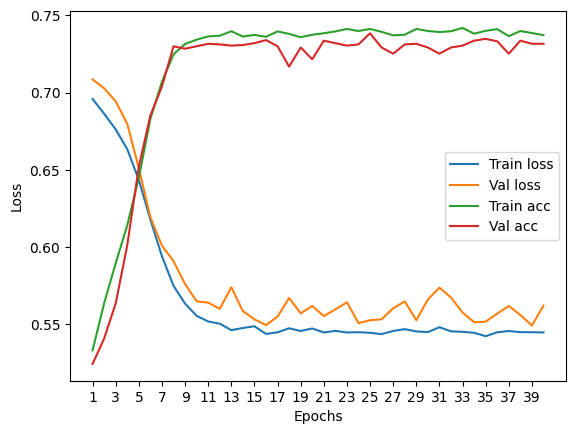

****************************************************************************************************



118it [00:00, 217.82it/s]


Train Epoch: 0 	Loss: 0.694786, Accuracy: 3988/7500 (53%)
Val Epoch: 0 	Loss: 0.697344, Accuracy: 1451/2500 (58%)



118it [00:00, 186.07it/s]


Train Epoch: 1 	Loss: 0.677947, Accuracy: 4430/7500 (59%)
Val Epoch: 1 	Loss: 0.679431, Accuracy: 1499/2500 (60%)



118it [00:00, 187.15it/s]


Train Epoch: 2 	Loss: 0.663669, Accuracy: 4558/7500 (61%)
Val Epoch: 2 	Loss: 0.669825, Accuracy: 1538/2500 (62%)



118it [00:00, 179.69it/s]


Train Epoch: 3 	Loss: 0.641338, Accuracy: 4853/7500 (65%)
Val Epoch: 3 	Loss: 0.638371, Accuracy: 1666/2500 (67%)



118it [00:00, 179.76it/s]


Train Epoch: 4 	Loss: 0.611566, Accuracy: 5244/7500 (70%)
Val Epoch: 4 	Loss: 0.611166, Accuracy: 1728/2500 (69%)



118it [00:00, 143.16it/s]


Train Epoch: 5 	Loss: 0.584370, Accuracy: 5416/7500 (72%)
Val Epoch: 5 	Loss: 0.581687, Accuracy: 1807/2500 (72%)



118it [00:00, 134.77it/s]


Train Epoch: 6 	Loss: 0.565725, Accuracy: 5463/7500 (73%)
Val Epoch: 6 	Loss: 0.571714, Accuracy: 1836/2500 (73%)



118it [00:00, 126.00it/s]


Train Epoch: 7 	Loss: 0.557911, Accuracy: 5487/7500 (73%)
Val Epoch: 7 	Loss: 0.562568, Accuracy: 1846/2500 (74%)



118it [00:00, 141.88it/s]


Train Epoch: 8 	Loss: 0.550323, Accuracy: 5508/7500 (73%)
Val Epoch: 8 	Loss: 0.569570, Accuracy: 1839/2500 (74%)



118it [00:00, 169.70it/s]


Train Epoch: 9 	Loss: 0.550856, Accuracy: 5484/7500 (73%)
Val Epoch: 9 	Loss: 0.552752, Accuracy: 1832/2500 (73%)



118it [00:01, 116.80it/s]


Train Epoch: 10 	Loss: 0.548067, Accuracy: 5496/7500 (73%)
Val Epoch: 10 	Loss: 0.553599, Accuracy: 1838/2500 (74%)



118it [00:00, 153.67it/s]


Train Epoch: 11 	Loss: 0.544613, Accuracy: 5513/7500 (74%)
Val Epoch: 11 	Loss: 0.558954, Accuracy: 1832/2500 (73%)



118it [00:00, 179.13it/s]


Train Epoch: 12 	Loss: 0.545648, Accuracy: 5488/7500 (73%)
Val Epoch: 12 	Loss: 0.552155, Accuracy: 1817/2500 (73%)



118it [00:00, 170.85it/s]


Train Epoch: 13 	Loss: 0.545597, Accuracy: 5523/7500 (74%)
Val Epoch: 13 	Loss: 0.562435, Accuracy: 1812/2500 (72%)



118it [00:00, 142.06it/s]


Train Epoch: 14 	Loss: 0.544987, Accuracy: 5509/7500 (73%)
Val Epoch: 14 	Loss: 0.560506, Accuracy: 1827/2500 (73%)



118it [00:00, 140.18it/s]


Train Epoch: 15 	Loss: 0.545891, Accuracy: 5508/7500 (73%)
Val Epoch: 15 	Loss: 0.551892, Accuracy: 1833/2500 (73%)



118it [00:00, 148.74it/s]


Train Epoch: 16 	Loss: 0.545304, Accuracy: 5500/7500 (73%)
Val Epoch: 16 	Loss: 0.554702, Accuracy: 1847/2500 (74%)



118it [00:00, 142.08it/s]


Train Epoch: 17 	Loss: 0.546182, Accuracy: 5508/7500 (73%)
Val Epoch: 17 	Loss: 0.547097, Accuracy: 1832/2500 (73%)



118it [00:00, 132.80it/s]


Train Epoch: 18 	Loss: 0.545383, Accuracy: 5520/7500 (74%)
Val Epoch: 18 	Loss: 0.547203, Accuracy: 1840/2500 (74%)



118it [00:00, 141.17it/s]


Train Epoch: 19 	Loss: 0.547180, Accuracy: 5491/7500 (73%)
Val Epoch: 19 	Loss: 0.566705, Accuracy: 1837/2500 (73%)



118it [00:01, 111.15it/s]


Train Epoch: 20 	Loss: 0.544944, Accuracy: 5500/7500 (73%)
Val Epoch: 20 	Loss: 0.552691, Accuracy: 1836/2500 (73%)



118it [00:00, 142.67it/s]


Train Epoch: 21 	Loss: 0.547083, Accuracy: 5507/7500 (73%)
Val Epoch: 21 	Loss: 0.554017, Accuracy: 1838/2500 (74%)



118it [00:00, 132.28it/s]


Train Epoch: 22 	Loss: 0.545508, Accuracy: 5525/7500 (74%)
Val Epoch: 22 	Loss: 0.552878, Accuracy: 1839/2500 (74%)



118it [00:00, 144.23it/s]


Train Epoch: 23 	Loss: 0.544975, Accuracy: 5525/7500 (74%)
Val Epoch: 23 	Loss: 0.556947, Accuracy: 1821/2500 (73%)



118it [00:00, 147.62it/s]


Train Epoch: 24 	Loss: 0.543484, Accuracy: 5509/7500 (73%)
Val Epoch: 24 	Loss: 0.550180, Accuracy: 1836/2500 (73%)



118it [00:01, 116.33it/s]


Train Epoch: 25 	Loss: 0.545242, Accuracy: 5522/7500 (74%)
Val Epoch: 25 	Loss: 0.561283, Accuracy: 1843/2500 (74%)



118it [00:00, 141.57it/s]


Train Epoch: 26 	Loss: 0.545783, Accuracy: 5509/7500 (73%)
Val Epoch: 26 	Loss: 0.563720, Accuracy: 1825/2500 (73%)



118it [00:00, 136.76it/s]


Train Epoch: 27 	Loss: 0.544671, Accuracy: 5531/7500 (74%)
Val Epoch: 27 	Loss: 0.552741, Accuracy: 1837/2500 (73%)



118it [00:00, 153.27it/s]


Train Epoch: 28 	Loss: 0.544918, Accuracy: 5506/7500 (73%)
Val Epoch: 28 	Loss: 0.558209, Accuracy: 1834/2500 (73%)



118it [00:00, 156.92it/s]


Train Epoch: 29 	Loss: 0.544905, Accuracy: 5519/7500 (74%)
Val Epoch: 29 	Loss: 0.562849, Accuracy: 1834/2500 (73%)



118it [00:00, 143.83it/s]


Train Epoch: 30 	Loss: 0.543036, Accuracy: 5507/7500 (73%)
Val Epoch: 30 	Loss: 0.547352, Accuracy: 1839/2500 (74%)



118it [00:00, 147.60it/s]


Train Epoch: 31 	Loss: 0.542742, Accuracy: 5532/7500 (74%)
Val Epoch: 31 	Loss: 0.566347, Accuracy: 1835/2500 (73%)



118it [00:00, 147.40it/s]


Train Epoch: 32 	Loss: 0.545154, Accuracy: 5519/7500 (74%)
Val Epoch: 32 	Loss: 0.555702, Accuracy: 1830/2500 (73%)



118it [00:00, 147.29it/s]


Train Epoch: 33 	Loss: 0.542673, Accuracy: 5515/7500 (74%)
Val Epoch: 33 	Loss: 0.548079, Accuracy: 1832/2500 (73%)



118it [00:01, 115.85it/s]


Train Epoch: 34 	Loss: 0.544802, Accuracy: 5508/7500 (73%)
Val Epoch: 34 	Loss: 0.553162, Accuracy: 1825/2500 (73%)



118it [00:00, 120.22it/s]


Train Epoch: 35 	Loss: 0.543159, Accuracy: 5479/7500 (73%)
Val Epoch: 35 	Loss: 0.557634, Accuracy: 1831/2500 (73%)



118it [00:00, 126.89it/s]


Train Epoch: 36 	Loss: 0.543182, Accuracy: 5495/7500 (73%)
Val Epoch: 36 	Loss: 0.545636, Accuracy: 1828/2500 (73%)



118it [00:00, 131.77it/s]


Train Epoch: 37 	Loss: 0.543457, Accuracy: 5533/7500 (74%)
Val Epoch: 37 	Loss: 0.555403, Accuracy: 1837/2500 (73%)



118it [00:00, 152.45it/s]


Train Epoch: 38 	Loss: 0.543571, Accuracy: 5525/7500 (74%)
Val Epoch: 38 	Loss: 0.548671, Accuracy: 1837/2500 (73%)



118it [00:00, 138.33it/s]


Train Epoch: 39 	Loss: 0.543412, Accuracy: 5525/7500 (74%)
Val Epoch: 39 	Loss: 0.559200, Accuracy: 1845/2500 (74%)

Test accuracy:  72.44


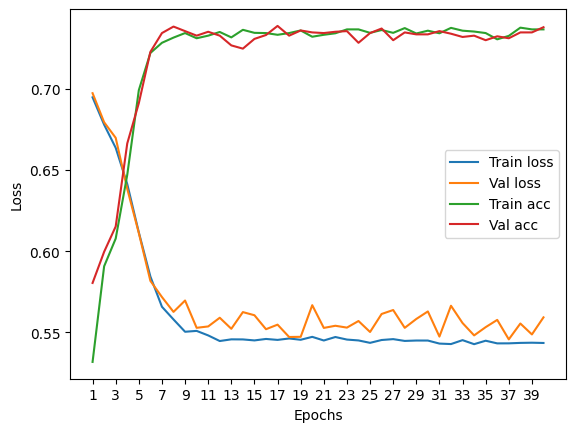

****************************************************************************************************



118it [00:00, 165.34it/s]


Train Epoch: 0 	Loss: 0.698128, Accuracy: 3854/7500 (51%)
Val Epoch: 0 	Loss: 0.706253, Accuracy: 1330/2500 (53%)



118it [00:00, 138.86it/s]


Train Epoch: 1 	Loss: 0.690811, Accuracy: 4166/7500 (56%)
Val Epoch: 1 	Loss: 0.697567, Accuracy: 1430/2500 (57%)



118it [00:00, 139.28it/s]


Train Epoch: 2 	Loss: 0.678921, Accuracy: 4434/7500 (59%)
Val Epoch: 2 	Loss: 0.683984, Accuracy: 1513/2500 (61%)



118it [00:00, 129.29it/s]


Train Epoch: 3 	Loss: 0.652446, Accuracy: 4827/7500 (64%)
Val Epoch: 3 	Loss: 0.638678, Accuracy: 1698/2500 (68%)



118it [00:00, 165.12it/s]


Train Epoch: 4 	Loss: 0.611339, Accuracy: 5243/7500 (70%)
Val Epoch: 4 	Loss: 0.605744, Accuracy: 1791/2500 (72%)



118it [00:00, 136.34it/s]


Train Epoch: 5 	Loss: 0.582047, Accuracy: 5366/7500 (72%)
Val Epoch: 5 	Loss: 0.596508, Accuracy: 1810/2500 (72%)



118it [00:00, 141.42it/s]


Train Epoch: 6 	Loss: 0.567058, Accuracy: 5417/7500 (72%)
Val Epoch: 6 	Loss: 0.569092, Accuracy: 1821/2500 (73%)



118it [00:00, 143.55it/s]


Train Epoch: 7 	Loss: 0.557732, Accuracy: 5483/7500 (73%)
Val Epoch: 7 	Loss: 0.559332, Accuracy: 1833/2500 (73%)



118it [00:00, 140.88it/s]


Train Epoch: 8 	Loss: 0.556153, Accuracy: 5491/7500 (73%)
Val Epoch: 8 	Loss: 0.559895, Accuracy: 1839/2500 (74%)



118it [00:00, 146.51it/s]


Train Epoch: 9 	Loss: 0.554014, Accuracy: 5495/7500 (73%)
Val Epoch: 9 	Loss: 0.551694, Accuracy: 1855/2500 (74%)



118it [00:01, 106.76it/s]


Train Epoch: 10 	Loss: 0.553264, Accuracy: 5465/7500 (73%)
Val Epoch: 10 	Loss: 0.553932, Accuracy: 1846/2500 (74%)



118it [00:00, 119.38it/s]


Train Epoch: 11 	Loss: 0.551582, Accuracy: 5515/7500 (74%)
Val Epoch: 11 	Loss: 0.552190, Accuracy: 1843/2500 (74%)



118it [00:00, 128.78it/s]


Train Epoch: 12 	Loss: 0.553665, Accuracy: 5526/7500 (74%)
Val Epoch: 12 	Loss: 0.555563, Accuracy: 1836/2500 (73%)



118it [00:00, 151.10it/s]


Train Epoch: 13 	Loss: 0.552486, Accuracy: 5513/7500 (74%)
Val Epoch: 13 	Loss: 0.562216, Accuracy: 1822/2500 (73%)



118it [00:00, 141.82it/s]


Train Epoch: 14 	Loss: 0.547960, Accuracy: 5505/7500 (73%)
Val Epoch: 14 	Loss: 0.566203, Accuracy: 1829/2500 (73%)



118it [00:00, 147.16it/s]


Train Epoch: 15 	Loss: 0.551430, Accuracy: 5542/7500 (74%)
Val Epoch: 15 	Loss: 0.549573, Accuracy: 1846/2500 (74%)



118it [00:00, 148.19it/s]


Train Epoch: 16 	Loss: 0.553075, Accuracy: 5540/7500 (74%)
Val Epoch: 16 	Loss: 0.555178, Accuracy: 1843/2500 (74%)



118it [00:00, 134.99it/s]


Train Epoch: 17 	Loss: 0.549927, Accuracy: 5527/7500 (74%)
Val Epoch: 17 	Loss: 0.561455, Accuracy: 1852/2500 (74%)



118it [00:00, 139.16it/s]


Train Epoch: 18 	Loss: 0.549064, Accuracy: 5541/7500 (74%)
Val Epoch: 18 	Loss: 0.580674, Accuracy: 1850/2500 (74%)



118it [00:00, 154.50it/s]


Train Epoch: 19 	Loss: 0.549965, Accuracy: 5518/7500 (74%)
Val Epoch: 19 	Loss: 0.555485, Accuracy: 1847/2500 (74%)



118it [00:00, 124.19it/s]


Train Epoch: 20 	Loss: 0.552583, Accuracy: 5521/7500 (74%)
Val Epoch: 20 	Loss: 0.555494, Accuracy: 1848/2500 (74%)



118it [00:00, 136.70it/s]


Train Epoch: 21 	Loss: 0.549890, Accuracy: 5528/7500 (74%)
Val Epoch: 21 	Loss: 0.564180, Accuracy: 1837/2500 (73%)



118it [00:00, 130.90it/s]


Train Epoch: 22 	Loss: 0.547964, Accuracy: 5565/7500 (74%)
Val Epoch: 22 	Loss: 0.543173, Accuracy: 1857/2500 (74%)



118it [00:00, 138.28it/s]


Train Epoch: 23 	Loss: 0.551131, Accuracy: 5514/7500 (74%)
Val Epoch: 23 	Loss: 0.569806, Accuracy: 1840/2500 (74%)



118it [00:01, 98.67it/s]


Train Epoch: 24 	Loss: 0.548587, Accuracy: 5540/7500 (74%)
Val Epoch: 24 	Loss: 0.558429, Accuracy: 1850/2500 (74%)



118it [00:01, 104.11it/s]


Train Epoch: 25 	Loss: 0.548926, Accuracy: 5535/7500 (74%)
Val Epoch: 25 	Loss: 0.557696, Accuracy: 1850/2500 (74%)



118it [00:00, 124.36it/s]


Train Epoch: 26 	Loss: 0.549262, Accuracy: 5535/7500 (74%)
Val Epoch: 26 	Loss: 0.554028, Accuracy: 1830/2500 (73%)



118it [00:00, 132.62it/s]


Train Epoch: 27 	Loss: 0.548978, Accuracy: 5536/7500 (74%)
Val Epoch: 27 	Loss: 0.551598, Accuracy: 1837/2500 (73%)



118it [00:00, 140.19it/s]


Train Epoch: 28 	Loss: 0.548545, Accuracy: 5529/7500 (74%)
Val Epoch: 28 	Loss: 0.555477, Accuracy: 1855/2500 (74%)



118it [00:00, 144.66it/s]


Train Epoch: 29 	Loss: 0.548456, Accuracy: 5549/7500 (74%)
Val Epoch: 29 	Loss: 0.551127, Accuracy: 1830/2500 (73%)



118it [00:00, 143.87it/s]


Train Epoch: 30 	Loss: 0.548089, Accuracy: 5522/7500 (74%)
Val Epoch: 30 	Loss: 0.551273, Accuracy: 1845/2500 (74%)



118it [00:00, 138.60it/s]


Train Epoch: 31 	Loss: 0.548561, Accuracy: 5569/7500 (74%)
Val Epoch: 31 	Loss: 0.554984, Accuracy: 1839/2500 (74%)



118it [00:00, 142.44it/s]


Train Epoch: 32 	Loss: 0.550480, Accuracy: 5540/7500 (74%)
Val Epoch: 32 	Loss: 0.551001, Accuracy: 1854/2500 (74%)



118it [00:00, 136.83it/s]


Train Epoch: 33 	Loss: 0.553379, Accuracy: 5529/7500 (74%)
Val Epoch: 33 	Loss: 0.567100, Accuracy: 1834/2500 (73%)



118it [00:00, 137.93it/s]


Train Epoch: 34 	Loss: 0.548678, Accuracy: 5530/7500 (74%)
Val Epoch: 34 	Loss: 0.554562, Accuracy: 1847/2500 (74%)



118it [00:00, 139.52it/s]


Train Epoch: 35 	Loss: 0.548181, Accuracy: 5567/7500 (74%)
Val Epoch: 35 	Loss: 0.551254, Accuracy: 1851/2500 (74%)



118it [00:00, 133.03it/s]


Train Epoch: 36 	Loss: 0.549577, Accuracy: 5558/7500 (74%)
Val Epoch: 36 	Loss: 0.549066, Accuracy: 1849/2500 (74%)



118it [00:00, 135.41it/s]


Train Epoch: 37 	Loss: 0.550569, Accuracy: 5525/7500 (74%)
Val Epoch: 37 	Loss: 0.555732, Accuracy: 1840/2500 (74%)



118it [00:01, 115.20it/s]


Train Epoch: 38 	Loss: 0.548269, Accuracy: 5522/7500 (74%)
Val Epoch: 38 	Loss: 0.560673, Accuracy: 1846/2500 (74%)



118it [00:01, 108.35it/s]


Train Epoch: 39 	Loss: 0.547531, Accuracy: 5565/7500 (74%)
Val Epoch: 39 	Loss: 0.547638, Accuracy: 1848/2500 (74%)

Test accuracy:  72.8


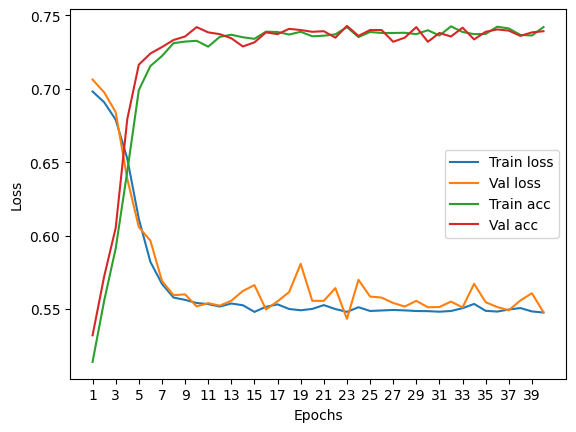

****************************************************************************************************



116it [00:00, 125.88it/s]


Train Epoch: 0 	Loss: 0.692394, Accuracy: 3916/7422 (53%)
Val Epoch: 0 	Loss: 0.692731, Accuracy: 1331/2474 (54%)



116it [00:01, 109.87it/s]


Train Epoch: 1 	Loss: 0.678074, Accuracy: 4436/7422 (60%)
Val Epoch: 1 	Loss: 0.670839, Accuracy: 1514/2474 (61%)



116it [00:00, 129.75it/s]


Train Epoch: 2 	Loss: 0.653181, Accuracy: 4666/7422 (63%)
Val Epoch: 2 	Loss: 0.638237, Accuracy: 1649/2474 (67%)



116it [00:00, 129.88it/s]


Train Epoch: 3 	Loss: 0.617285, Accuracy: 5105/7422 (69%)
Val Epoch: 3 	Loss: 0.594703, Accuracy: 1789/2474 (72%)



116it [00:00, 133.55it/s]


Train Epoch: 4 	Loss: 0.581467, Accuracy: 5296/7422 (71%)
Val Epoch: 4 	Loss: 0.566264, Accuracy: 1811/2474 (73%)



116it [00:00, 137.69it/s]


Train Epoch: 5 	Loss: 0.559664, Accuracy: 5422/7422 (73%)
Val Epoch: 5 	Loss: 0.547240, Accuracy: 1847/2474 (75%)



116it [00:00, 136.25it/s]


Train Epoch: 6 	Loss: 0.547152, Accuracy: 5463/7422 (74%)
Val Epoch: 6 	Loss: 0.536920, Accuracy: 1842/2474 (74%)



116it [00:00, 135.68it/s]


Train Epoch: 7 	Loss: 0.544893, Accuracy: 5498/7422 (74%)
Val Epoch: 7 	Loss: 0.533944, Accuracy: 1847/2474 (75%)



116it [00:00, 129.66it/s]


Train Epoch: 8 	Loss: 0.540888, Accuracy: 5491/7422 (74%)
Val Epoch: 8 	Loss: 0.532499, Accuracy: 1858/2474 (75%)



116it [00:00, 134.04it/s]


Train Epoch: 9 	Loss: 0.539976, Accuracy: 5490/7422 (74%)
Val Epoch: 9 	Loss: 0.530925, Accuracy: 1861/2474 (75%)



116it [00:00, 143.36it/s]


Train Epoch: 10 	Loss: 0.540555, Accuracy: 5503/7422 (74%)
Val Epoch: 10 	Loss: 0.531706, Accuracy: 1852/2474 (75%)



116it [00:00, 131.84it/s]


Train Epoch: 11 	Loss: 0.537811, Accuracy: 5486/7422 (74%)
Val Epoch: 11 	Loss: 0.532041, Accuracy: 1860/2474 (75%)



116it [00:00, 138.39it/s]


Train Epoch: 12 	Loss: 0.537949, Accuracy: 5493/7422 (74%)
Val Epoch: 12 	Loss: 0.529468, Accuracy: 1842/2474 (74%)



116it [00:00, 118.37it/s]


Train Epoch: 13 	Loss: 0.537711, Accuracy: 5544/7422 (75%)
Val Epoch: 13 	Loss: 0.528348, Accuracy: 1852/2474 (75%)



116it [00:01, 100.70it/s]


Train Epoch: 14 	Loss: 0.538078, Accuracy: 5522/7422 (74%)
Val Epoch: 14 	Loss: 0.528443, Accuracy: 1871/2474 (76%)



116it [00:01, 102.67it/s]


Train Epoch: 15 	Loss: 0.537328, Accuracy: 5533/7422 (75%)
Val Epoch: 15 	Loss: 0.530433, Accuracy: 1864/2474 (75%)



116it [00:00, 141.77it/s]


Train Epoch: 16 	Loss: 0.535943, Accuracy: 5532/7422 (75%)
Val Epoch: 16 	Loss: 0.541948, Accuracy: 1846/2474 (75%)



116it [00:00, 151.00it/s]


Train Epoch: 17 	Loss: 0.536221, Accuracy: 5521/7422 (74%)
Val Epoch: 17 	Loss: 0.529670, Accuracy: 1867/2474 (75%)



116it [00:00, 138.92it/s]


Train Epoch: 18 	Loss: 0.536889, Accuracy: 5528/7422 (74%)
Val Epoch: 18 	Loss: 0.527895, Accuracy: 1874/2474 (76%)



116it [00:00, 131.59it/s]


Train Epoch: 19 	Loss: 0.540438, Accuracy: 5494/7422 (74%)
Val Epoch: 19 	Loss: 0.537910, Accuracy: 1839/2474 (74%)



116it [00:00, 131.90it/s]


Train Epoch: 20 	Loss: 0.537293, Accuracy: 5525/7422 (74%)
Val Epoch: 20 	Loss: 0.528875, Accuracy: 1864/2474 (75%)



116it [00:00, 140.97it/s]


Train Epoch: 21 	Loss: 0.537384, Accuracy: 5534/7422 (75%)
Val Epoch: 21 	Loss: 0.528998, Accuracy: 1869/2474 (76%)



116it [00:00, 141.31it/s]


Train Epoch: 22 	Loss: 0.535890, Accuracy: 5518/7422 (74%)
Val Epoch: 22 	Loss: 0.529005, Accuracy: 1876/2474 (76%)



116it [00:00, 131.62it/s]


Train Epoch: 23 	Loss: 0.536920, Accuracy: 5499/7422 (74%)
Val Epoch: 23 	Loss: 0.528262, Accuracy: 1863/2474 (75%)



116it [00:00, 136.93it/s]


Train Epoch: 24 	Loss: 0.534738, Accuracy: 5548/7422 (75%)
Val Epoch: 24 	Loss: 0.531133, Accuracy: 1873/2474 (76%)



116it [00:00, 128.18it/s]


Train Epoch: 25 	Loss: 0.536366, Accuracy: 5539/7422 (75%)
Val Epoch: 25 	Loss: 0.532992, Accuracy: 1836/2474 (74%)



116it [00:00, 134.92it/s]


Train Epoch: 26 	Loss: 0.536556, Accuracy: 5529/7422 (74%)
Val Epoch: 26 	Loss: 0.530625, Accuracy: 1840/2474 (74%)



116it [00:01, 107.20it/s]


Train Epoch: 27 	Loss: 0.535826, Accuracy: 5553/7422 (75%)
Val Epoch: 27 	Loss: 0.534601, Accuracy: 1824/2474 (74%)



116it [00:01, 109.22it/s]


Train Epoch: 28 	Loss: 0.536799, Accuracy: 5536/7422 (75%)
Val Epoch: 28 	Loss: 0.528368, Accuracy: 1870/2474 (76%)



116it [00:01, 111.21it/s]


Train Epoch: 29 	Loss: 0.536187, Accuracy: 5538/7422 (75%)
Val Epoch: 29 	Loss: 0.527871, Accuracy: 1868/2474 (76%)



116it [00:00, 138.71it/s]


Train Epoch: 30 	Loss: 0.535380, Accuracy: 5525/7422 (74%)
Val Epoch: 30 	Loss: 0.535554, Accuracy: 1858/2474 (75%)



116it [00:00, 134.70it/s]


Train Epoch: 31 	Loss: 0.536081, Accuracy: 5550/7422 (75%)
Val Epoch: 31 	Loss: 0.531721, Accuracy: 1855/2474 (75%)



116it [00:01, 114.58it/s]


Train Epoch: 32 	Loss: 0.534592, Accuracy: 5550/7422 (75%)
Val Epoch: 32 	Loss: 0.528498, Accuracy: 1858/2474 (75%)



116it [00:00, 138.22it/s]


Train Epoch: 33 	Loss: 0.535354, Accuracy: 5567/7422 (75%)
Val Epoch: 33 	Loss: 0.533309, Accuracy: 1850/2474 (75%)



116it [00:00, 126.77it/s]


Train Epoch: 34 	Loss: 0.537685, Accuracy: 5513/7422 (74%)
Val Epoch: 34 	Loss: 0.542076, Accuracy: 1836/2474 (74%)



116it [00:00, 151.86it/s]


Train Epoch: 35 	Loss: 0.535574, Accuracy: 5533/7422 (75%)
Val Epoch: 35 	Loss: 0.529308, Accuracy: 1873/2474 (76%)



116it [00:00, 140.97it/s]


Train Epoch: 36 	Loss: 0.536686, Accuracy: 5529/7422 (74%)
Val Epoch: 36 	Loss: 0.528773, Accuracy: 1866/2474 (75%)



116it [00:00, 132.24it/s]


Train Epoch: 37 	Loss: 0.534877, Accuracy: 5518/7422 (74%)
Val Epoch: 37 	Loss: 0.535533, Accuracy: 1847/2474 (75%)



116it [00:00, 135.60it/s]


Train Epoch: 38 	Loss: 0.537548, Accuracy: 5534/7422 (75%)
Val Epoch: 38 	Loss: 0.527970, Accuracy: 1870/2474 (76%)



116it [00:00, 140.13it/s]


Train Epoch: 39 	Loss: 0.537241, Accuracy: 5510/7422 (74%)
Val Epoch: 39 	Loss: 0.530212, Accuracy: 1864/2474 (75%)

Test accuracy:  71.82700080840743


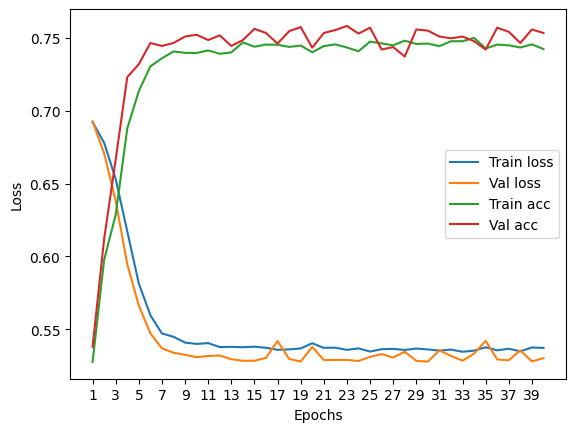

****************************************************************************************************



Particles per jet: 12


118it [00:00, 124.45it/s]


Train Epoch: 0 	Loss: 0.694868, Accuracy: 4002/7500 (53%)
Val Epoch: 0 	Loss: 0.702430, Accuracy: 1423/2500 (57%)



118it [00:00, 128.92it/s]


Train Epoch: 1 	Loss: 0.687414, Accuracy: 4234/7500 (56%)
Val Epoch: 1 	Loss: 0.692834, Accuracy: 1451/2500 (58%)



118it [00:00, 141.21it/s]


Train Epoch: 2 	Loss: 0.678059, Accuracy: 4407/7500 (59%)
Val Epoch: 2 	Loss: 0.681906, Accuracy: 1484/2500 (59%)



118it [00:00, 136.22it/s]


Train Epoch: 3 	Loss: 0.668650, Accuracy: 4502/7500 (60%)
Val Epoch: 3 	Loss: 0.666948, Accuracy: 1567/2500 (63%)



118it [00:00, 132.21it/s]


Train Epoch: 4 	Loss: 0.654613, Accuracy: 4755/7500 (63%)
Val Epoch: 4 	Loss: 0.645721, Accuracy: 1676/2500 (67%)



118it [00:00, 132.34it/s]


Train Epoch: 5 	Loss: 0.629171, Accuracy: 5058/7500 (67%)
Val Epoch: 5 	Loss: 0.615140, Accuracy: 1771/2500 (71%)



118it [00:00, 136.03it/s]


Train Epoch: 6 	Loss: 0.603877, Accuracy: 5275/7500 (70%)
Val Epoch: 6 	Loss: 0.586544, Accuracy: 1815/2500 (73%)



118it [00:00, 127.96it/s]


Train Epoch: 7 	Loss: 0.580345, Accuracy: 5432/7500 (72%)
Val Epoch: 7 	Loss: 0.571086, Accuracy: 1848/2500 (74%)



118it [00:00, 139.04it/s]


Train Epoch: 8 	Loss: 0.563692, Accuracy: 5498/7500 (73%)
Val Epoch: 8 	Loss: 0.558631, Accuracy: 1869/2500 (75%)



118it [00:00, 137.55it/s]


Train Epoch: 9 	Loss: 0.554326, Accuracy: 5558/7500 (74%)
Val Epoch: 9 	Loss: 0.560142, Accuracy: 1860/2500 (74%)



118it [00:00, 135.73it/s]


Train Epoch: 10 	Loss: 0.551852, Accuracy: 5550/7500 (74%)
Val Epoch: 10 	Loss: 0.548616, Accuracy: 1863/2500 (75%)



118it [00:00, 131.28it/s]


Train Epoch: 11 	Loss: 0.542940, Accuracy: 5570/7500 (74%)
Val Epoch: 11 	Loss: 0.557365, Accuracy: 1884/2500 (75%)



118it [00:01, 100.88it/s]


Train Epoch: 12 	Loss: 0.540439, Accuracy: 5571/7500 (74%)
Val Epoch: 12 	Loss: 0.543224, Accuracy: 1871/2500 (75%)



118it [00:01, 97.68it/s] 


Train Epoch: 13 	Loss: 0.540508, Accuracy: 5541/7500 (74%)
Val Epoch: 13 	Loss: 0.552443, Accuracy: 1885/2500 (75%)



118it [00:01, 108.51it/s]


Train Epoch: 14 	Loss: 0.543156, Accuracy: 5576/7500 (74%)
Val Epoch: 14 	Loss: 0.540140, Accuracy: 1876/2500 (75%)



118it [00:00, 134.77it/s]


Train Epoch: 15 	Loss: 0.538339, Accuracy: 5561/7500 (74%)
Val Epoch: 15 	Loss: 0.547574, Accuracy: 1868/2500 (75%)



118it [00:00, 130.85it/s]


Train Epoch: 16 	Loss: 0.540257, Accuracy: 5591/7500 (75%)
Val Epoch: 16 	Loss: 0.537236, Accuracy: 1871/2500 (75%)



118it [00:00, 137.15it/s]


Train Epoch: 17 	Loss: 0.536571, Accuracy: 5584/7500 (74%)
Val Epoch: 17 	Loss: 0.531882, Accuracy: 1883/2500 (75%)



118it [00:00, 135.66it/s]


Train Epoch: 18 	Loss: 0.535464, Accuracy: 5597/7500 (75%)
Val Epoch: 18 	Loss: 0.536240, Accuracy: 1871/2500 (75%)



118it [00:00, 138.49it/s]


Train Epoch: 19 	Loss: 0.537649, Accuracy: 5599/7500 (75%)
Val Epoch: 19 	Loss: 0.552685, Accuracy: 1883/2500 (75%)



118it [00:00, 118.41it/s]


Train Epoch: 20 	Loss: 0.538544, Accuracy: 5591/7500 (75%)
Val Epoch: 20 	Loss: 0.541271, Accuracy: 1862/2500 (74%)



118it [00:00, 125.73it/s]


Train Epoch: 21 	Loss: 0.537297, Accuracy: 5590/7500 (75%)
Val Epoch: 21 	Loss: 0.539109, Accuracy: 1882/2500 (75%)



118it [00:00, 130.83it/s]


Train Epoch: 22 	Loss: 0.537428, Accuracy: 5586/7500 (74%)
Val Epoch: 22 	Loss: 0.543635, Accuracy: 1882/2500 (75%)



118it [00:00, 131.94it/s]


Train Epoch: 23 	Loss: 0.537743, Accuracy: 5598/7500 (75%)
Val Epoch: 23 	Loss: 0.533821, Accuracy: 1885/2500 (75%)



118it [00:00, 122.02it/s]


Train Epoch: 24 	Loss: 0.539075, Accuracy: 5582/7500 (74%)
Val Epoch: 24 	Loss: 0.540177, Accuracy: 1875/2500 (75%)



118it [00:01, 98.57it/s] 


Train Epoch: 25 	Loss: 0.537761, Accuracy: 5575/7500 (74%)
Val Epoch: 25 	Loss: 0.542129, Accuracy: 1871/2500 (75%)



118it [00:01, 114.60it/s]


Train Epoch: 26 	Loss: 0.537214, Accuracy: 5590/7500 (75%)
Val Epoch: 26 	Loss: 0.542697, Accuracy: 1877/2500 (75%)



118it [00:01, 112.28it/s]


Train Epoch: 27 	Loss: 0.536917, Accuracy: 5607/7500 (75%)
Val Epoch: 27 	Loss: 0.534749, Accuracy: 1879/2500 (75%)



118it [00:00, 138.90it/s]


Train Epoch: 28 	Loss: 0.539410, Accuracy: 5588/7500 (75%)
Val Epoch: 28 	Loss: 0.531861, Accuracy: 1891/2500 (76%)



118it [00:00, 139.21it/s]


Train Epoch: 29 	Loss: 0.540156, Accuracy: 5618/7500 (75%)
Val Epoch: 29 	Loss: 0.552970, Accuracy: 1896/2500 (76%)



118it [00:00, 136.51it/s]


Train Epoch: 30 	Loss: 0.539810, Accuracy: 5591/7500 (75%)
Val Epoch: 30 	Loss: 0.535834, Accuracy: 1863/2500 (75%)



118it [00:00, 135.27it/s]


Train Epoch: 31 	Loss: 0.536645, Accuracy: 5597/7500 (75%)
Val Epoch: 31 	Loss: 0.531709, Accuracy: 1885/2500 (75%)



118it [00:00, 136.32it/s]


Train Epoch: 32 	Loss: 0.537299, Accuracy: 5587/7500 (74%)
Val Epoch: 32 	Loss: 0.548811, Accuracy: 1892/2500 (76%)



118it [00:00, 140.34it/s]


Train Epoch: 33 	Loss: 0.537395, Accuracy: 5607/7500 (75%)
Val Epoch: 33 	Loss: 0.545571, Accuracy: 1882/2500 (75%)



118it [00:00, 135.07it/s]


Train Epoch: 34 	Loss: 0.535979, Accuracy: 5597/7500 (75%)
Val Epoch: 34 	Loss: 0.545972, Accuracy: 1882/2500 (75%)



118it [00:00, 130.85it/s]


Train Epoch: 35 	Loss: 0.539041, Accuracy: 5592/7500 (75%)
Val Epoch: 35 	Loss: 0.535737, Accuracy: 1883/2500 (75%)



118it [00:00, 134.94it/s]


Train Epoch: 36 	Loss: 0.537220, Accuracy: 5596/7500 (75%)
Val Epoch: 36 	Loss: 0.537342, Accuracy: 1881/2500 (75%)



118it [00:00, 130.79it/s]


Train Epoch: 37 	Loss: 0.536798, Accuracy: 5627/7500 (75%)
Val Epoch: 37 	Loss: 0.543069, Accuracy: 1840/2500 (74%)



118it [00:00, 141.82it/s]


Train Epoch: 38 	Loss: 0.536064, Accuracy: 5595/7500 (75%)
Val Epoch: 38 	Loss: 0.533605, Accuracy: 1887/2500 (75%)



118it [00:01, 103.41it/s]


Train Epoch: 39 	Loss: 0.535440, Accuracy: 5601/7500 (75%)
Val Epoch: 39 	Loss: 0.542607, Accuracy: 1883/2500 (75%)

Test accuracy:  74.16


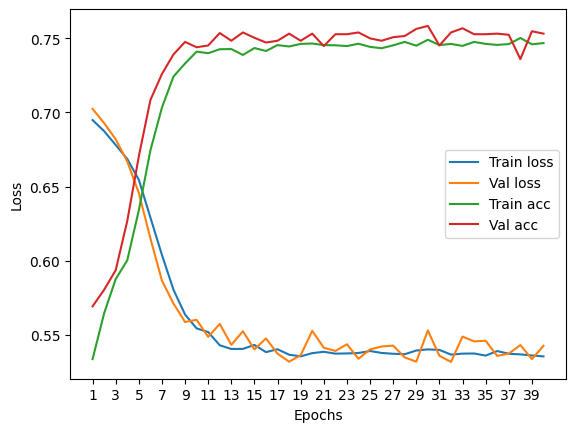

****************************************************************************************************



118it [00:00, 144.53it/s]


Train Epoch: 0 	Loss: 0.696052, Accuracy: 3936/7500 (52%)
Val Epoch: 0 	Loss: 0.701383, Accuracy: 1479/2500 (59%)



118it [00:00, 137.11it/s]


Train Epoch: 1 	Loss: 0.679452, Accuracy: 4519/7500 (60%)
Val Epoch: 1 	Loss: 0.684331, Accuracy: 1513/2500 (61%)



118it [00:00, 143.48it/s]


Train Epoch: 2 	Loss: 0.653635, Accuracy: 4779/7500 (64%)
Val Epoch: 2 	Loss: 0.664471, Accuracy: 1525/2500 (61%)



118it [00:01, 99.44it/s] 


Train Epoch: 3 	Loss: 0.625062, Accuracy: 5089/7500 (68%)
Val Epoch: 3 	Loss: 0.616627, Accuracy: 1794/2500 (72%)



118it [00:00, 135.19it/s]


Train Epoch: 4 	Loss: 0.599727, Accuracy: 5286/7500 (70%)
Val Epoch: 4 	Loss: 0.596305, Accuracy: 1795/2500 (72%)



118it [00:01, 117.92it/s]


Train Epoch: 5 	Loss: 0.581425, Accuracy: 5379/7500 (72%)
Val Epoch: 5 	Loss: 0.587689, Accuracy: 1832/2500 (73%)



118it [00:00, 130.89it/s]


Train Epoch: 6 	Loss: 0.569913, Accuracy: 5481/7500 (73%)
Val Epoch: 6 	Loss: 0.565254, Accuracy: 1852/2500 (74%)



118it [00:00, 138.76it/s]


Train Epoch: 7 	Loss: 0.563470, Accuracy: 5463/7500 (73%)
Val Epoch: 7 	Loss: 0.563807, Accuracy: 1839/2500 (74%)



118it [00:01, 115.15it/s]


Train Epoch: 8 	Loss: 0.560431, Accuracy: 5457/7500 (73%)
Val Epoch: 8 	Loss: 0.565347, Accuracy: 1824/2500 (73%)



118it [00:00, 149.62it/s]


Train Epoch: 9 	Loss: 0.554480, Accuracy: 5503/7500 (73%)
Val Epoch: 9 	Loss: 0.563639, Accuracy: 1823/2500 (73%)



118it [00:00, 128.93it/s]


Train Epoch: 10 	Loss: 0.555359, Accuracy: 5503/7500 (73%)
Val Epoch: 10 	Loss: 0.545359, Accuracy: 1853/2500 (74%)



118it [00:01, 100.97it/s]


Train Epoch: 11 	Loss: 0.550903, Accuracy: 5517/7500 (74%)
Val Epoch: 11 	Loss: 0.559358, Accuracy: 1858/2500 (74%)



118it [00:01, 87.03it/s]


Train Epoch: 12 	Loss: 0.550115, Accuracy: 5520/7500 (74%)
Val Epoch: 12 	Loss: 0.554336, Accuracy: 1869/2500 (75%)



118it [00:01, 103.85it/s]


Train Epoch: 13 	Loss: 0.549675, Accuracy: 5537/7500 (74%)
Val Epoch: 13 	Loss: 0.548109, Accuracy: 1850/2500 (74%)



118it [00:00, 143.40it/s]


Train Epoch: 14 	Loss: 0.552146, Accuracy: 5481/7500 (73%)
Val Epoch: 14 	Loss: 0.560809, Accuracy: 1868/2500 (75%)



118it [00:01, 111.87it/s]


Train Epoch: 15 	Loss: 0.548617, Accuracy: 5542/7500 (74%)
Val Epoch: 15 	Loss: 0.551134, Accuracy: 1845/2500 (74%)



118it [00:01, 110.88it/s]


Train Epoch: 16 	Loss: 0.553386, Accuracy: 5497/7500 (73%)
Val Epoch: 16 	Loss: 0.550149, Accuracy: 1855/2500 (74%)



118it [00:01, 113.11it/s]


Train Epoch: 17 	Loss: 0.551154, Accuracy: 5532/7500 (74%)
Val Epoch: 17 	Loss: 0.541930, Accuracy: 1862/2500 (74%)



118it [00:01, 117.71it/s]


Train Epoch: 18 	Loss: 0.552896, Accuracy: 5525/7500 (74%)
Val Epoch: 18 	Loss: 0.551736, Accuracy: 1853/2500 (74%)



118it [00:00, 128.06it/s]


Train Epoch: 19 	Loss: 0.550606, Accuracy: 5492/7500 (73%)
Val Epoch: 19 	Loss: 0.546846, Accuracy: 1860/2500 (74%)



118it [00:00, 127.78it/s]


Train Epoch: 20 	Loss: 0.551121, Accuracy: 5544/7500 (74%)
Val Epoch: 20 	Loss: 0.559037, Accuracy: 1838/2500 (74%)



118it [00:00, 119.83it/s]


Train Epoch: 21 	Loss: 0.550057, Accuracy: 5525/7500 (74%)
Val Epoch: 21 	Loss: 0.565687, Accuracy: 1869/2500 (75%)



118it [00:01, 88.34it/s]


Train Epoch: 22 	Loss: 0.550298, Accuracy: 5504/7500 (73%)
Val Epoch: 22 	Loss: 0.552220, Accuracy: 1857/2500 (74%)



118it [00:01, 96.51it/s] 


Train Epoch: 23 	Loss: 0.549094, Accuracy: 5518/7500 (74%)
Val Epoch: 23 	Loss: 0.552632, Accuracy: 1850/2500 (74%)



118it [00:01, 101.30it/s]


Train Epoch: 24 	Loss: 0.551455, Accuracy: 5523/7500 (74%)
Val Epoch: 24 	Loss: 0.553175, Accuracy: 1868/2500 (75%)



118it [00:00, 124.76it/s]


Train Epoch: 25 	Loss: 0.553156, Accuracy: 5500/7500 (73%)
Val Epoch: 25 	Loss: 0.554115, Accuracy: 1860/2500 (74%)



118it [00:01, 108.88it/s]


Train Epoch: 26 	Loss: 0.551443, Accuracy: 5534/7500 (74%)
Val Epoch: 26 	Loss: 0.559241, Accuracy: 1867/2500 (75%)



118it [00:00, 131.67it/s]


Train Epoch: 27 	Loss: 0.550341, Accuracy: 5533/7500 (74%)
Val Epoch: 27 	Loss: 0.548254, Accuracy: 1869/2500 (75%)



118it [00:00, 118.63it/s]


Train Epoch: 28 	Loss: 0.550664, Accuracy: 5552/7500 (74%)
Val Epoch: 28 	Loss: 0.601111, Accuracy: 1833/2500 (73%)



118it [00:00, 128.86it/s]


Train Epoch: 29 	Loss: 0.551800, Accuracy: 5529/7500 (74%)
Val Epoch: 29 	Loss: 0.555428, Accuracy: 1858/2500 (74%)



118it [00:00, 119.72it/s]


Train Epoch: 30 	Loss: 0.549716, Accuracy: 5534/7500 (74%)
Val Epoch: 30 	Loss: 0.558150, Accuracy: 1849/2500 (74%)



118it [00:00, 139.89it/s]


Train Epoch: 31 	Loss: 0.548743, Accuracy: 5536/7500 (74%)
Val Epoch: 31 	Loss: 0.556745, Accuracy: 1855/2500 (74%)



118it [00:00, 137.27it/s]


Train Epoch: 32 	Loss: 0.549785, Accuracy: 5534/7500 (74%)
Val Epoch: 32 	Loss: 0.547592, Accuracy: 1867/2500 (75%)



118it [00:00, 135.79it/s]


Train Epoch: 33 	Loss: 0.549404, Accuracy: 5525/7500 (74%)
Val Epoch: 33 	Loss: 0.550902, Accuracy: 1866/2500 (75%)



118it [00:00, 133.99it/s]


Train Epoch: 34 	Loss: 0.548968, Accuracy: 5552/7500 (74%)
Val Epoch: 34 	Loss: 0.560264, Accuracy: 1877/2500 (75%)



118it [00:01, 103.20it/s]


Train Epoch: 35 	Loss: 0.551136, Accuracy: 5519/7500 (74%)
Val Epoch: 35 	Loss: 0.563308, Accuracy: 1864/2500 (75%)



118it [00:01, 100.36it/s]


Train Epoch: 36 	Loss: 0.550525, Accuracy: 5512/7500 (73%)
Val Epoch: 36 	Loss: 0.551346, Accuracy: 1860/2500 (74%)



118it [00:00, 133.72it/s]


Train Epoch: 37 	Loss: 0.550110, Accuracy: 5541/7500 (74%)
Val Epoch: 37 	Loss: 0.549280, Accuracy: 1865/2500 (75%)



118it [00:00, 133.35it/s]


Train Epoch: 38 	Loss: 0.550436, Accuracy: 5523/7500 (74%)
Val Epoch: 38 	Loss: 0.547977, Accuracy: 1866/2500 (75%)



118it [00:00, 142.50it/s]


Train Epoch: 39 	Loss: 0.550972, Accuracy: 5512/7500 (73%)
Val Epoch: 39 	Loss: 0.546158, Accuracy: 1862/2500 (74%)

Test accuracy:  73.11999999999999


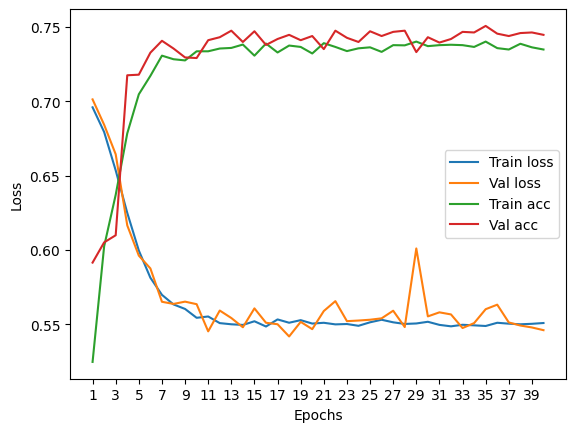

****************************************************************************************************



118it [00:00, 123.12it/s]


Train Epoch: 0 	Loss: 0.697277, Accuracy: 3941/7500 (53%)
Val Epoch: 0 	Loss: 0.706073, Accuracy: 1326/2500 (53%)



118it [00:00, 122.26it/s]


Train Epoch: 1 	Loss: 0.683845, Accuracy: 4346/7500 (58%)
Val Epoch: 1 	Loss: 0.695447, Accuracy: 1379/2500 (55%)



118it [00:00, 142.98it/s]


Train Epoch: 2 	Loss: 0.651847, Accuracy: 4799/7500 (64%)
Val Epoch: 2 	Loss: 0.654605, Accuracy: 1666/2500 (67%)



118it [00:02, 42.57it/s]


Train Epoch: 3 	Loss: 0.615094, Accuracy: 5207/7500 (69%)
Val Epoch: 3 	Loss: 0.613385, Accuracy: 1739/2500 (70%)



118it [00:00, 121.38it/s]


Train Epoch: 4 	Loss: 0.582774, Accuracy: 5451/7500 (73%)
Val Epoch: 4 	Loss: 0.591250, Accuracy: 1764/2500 (71%)



118it [00:00, 134.42it/s]


Train Epoch: 5 	Loss: 0.558248, Accuracy: 5554/7500 (74%)
Val Epoch: 5 	Loss: 0.562002, Accuracy: 1851/2500 (74%)



118it [00:00, 124.76it/s]


Train Epoch: 6 	Loss: 0.548248, Accuracy: 5561/7500 (74%)
Val Epoch: 6 	Loss: 0.568623, Accuracy: 1856/2500 (74%)



118it [00:00, 177.09it/s]


Train Epoch: 7 	Loss: 0.542548, Accuracy: 5591/7500 (75%)
Val Epoch: 7 	Loss: 0.559065, Accuracy: 1851/2500 (74%)



118it [00:00, 172.44it/s]


Train Epoch: 8 	Loss: 0.538548, Accuracy: 5594/7500 (75%)
Val Epoch: 8 	Loss: 0.551464, Accuracy: 1850/2500 (74%)



118it [00:00, 174.99it/s]


Train Epoch: 9 	Loss: 0.536450, Accuracy: 5572/7500 (74%)
Val Epoch: 9 	Loss: 0.548916, Accuracy: 1861/2500 (74%)



118it [00:00, 166.24it/s]


Train Epoch: 10 	Loss: 0.533020, Accuracy: 5627/7500 (75%)
Val Epoch: 10 	Loss: 0.554978, Accuracy: 1854/2500 (74%)



118it [00:00, 171.87it/s]


Train Epoch: 11 	Loss: 0.533531, Accuracy: 5593/7500 (75%)
Val Epoch: 11 	Loss: 0.552626, Accuracy: 1854/2500 (74%)



118it [00:00, 175.03it/s]


Train Epoch: 12 	Loss: 0.531263, Accuracy: 5627/7500 (75%)
Val Epoch: 12 	Loss: 0.546250, Accuracy: 1861/2500 (74%)



118it [00:00, 178.44it/s]


Train Epoch: 13 	Loss: 0.530445, Accuracy: 5630/7500 (75%)
Val Epoch: 13 	Loss: 0.544148, Accuracy: 1857/2500 (74%)



118it [00:00, 180.47it/s]


Train Epoch: 14 	Loss: 0.529256, Accuracy: 5617/7500 (75%)
Val Epoch: 14 	Loss: 0.543369, Accuracy: 1852/2500 (74%)



118it [00:00, 175.52it/s]


Train Epoch: 15 	Loss: 0.530879, Accuracy: 5623/7500 (75%)
Val Epoch: 15 	Loss: 0.549601, Accuracy: 1863/2500 (75%)



118it [00:00, 181.31it/s]


Train Epoch: 16 	Loss: 0.530381, Accuracy: 5630/7500 (75%)
Val Epoch: 16 	Loss: 0.553329, Accuracy: 1841/2500 (74%)



118it [00:00, 140.83it/s]


Train Epoch: 17 	Loss: 0.532702, Accuracy: 5598/7500 (75%)
Val Epoch: 17 	Loss: 0.547403, Accuracy: 1860/2500 (74%)



118it [00:00, 139.70it/s]


Train Epoch: 18 	Loss: 0.531510, Accuracy: 5628/7500 (75%)
Val Epoch: 18 	Loss: 0.548016, Accuracy: 1858/2500 (74%)



118it [00:00, 140.00it/s]


Train Epoch: 19 	Loss: 0.533338, Accuracy: 5602/7500 (75%)
Val Epoch: 19 	Loss: 0.546004, Accuracy: 1861/2500 (74%)



118it [00:00, 178.49it/s]


Train Epoch: 20 	Loss: 0.531747, Accuracy: 5655/7500 (75%)
Val Epoch: 20 	Loss: 0.569222, Accuracy: 1858/2500 (74%)



118it [00:00, 180.65it/s]


Train Epoch: 21 	Loss: 0.531193, Accuracy: 5632/7500 (75%)
Val Epoch: 21 	Loss: 0.549558, Accuracy: 1861/2500 (74%)



118it [00:00, 176.35it/s]


Train Epoch: 22 	Loss: 0.531673, Accuracy: 5615/7500 (75%)
Val Epoch: 22 	Loss: 0.547415, Accuracy: 1864/2500 (75%)



118it [00:00, 147.99it/s]


Train Epoch: 23 	Loss: 0.530535, Accuracy: 5618/7500 (75%)
Val Epoch: 23 	Loss: 0.551438, Accuracy: 1855/2500 (74%)



118it [00:00, 168.70it/s]


Train Epoch: 24 	Loss: 0.530244, Accuracy: 5630/7500 (75%)
Val Epoch: 24 	Loss: 0.572018, Accuracy: 1865/2500 (75%)



118it [00:00, 172.71it/s]


Train Epoch: 25 	Loss: 0.531551, Accuracy: 5634/7500 (75%)
Val Epoch: 25 	Loss: 0.556083, Accuracy: 1862/2500 (74%)



118it [00:00, 176.03it/s]


Train Epoch: 26 	Loss: 0.531091, Accuracy: 5584/7500 (74%)
Val Epoch: 26 	Loss: 0.546665, Accuracy: 1854/2500 (74%)



118it [00:00, 191.08it/s]


Train Epoch: 27 	Loss: 0.529142, Accuracy: 5642/7500 (75%)
Val Epoch: 27 	Loss: 0.552867, Accuracy: 1859/2500 (74%)



118it [00:00, 177.92it/s]


Train Epoch: 28 	Loss: 0.528860, Accuracy: 5639/7500 (75%)
Val Epoch: 28 	Loss: 0.537830, Accuracy: 1866/2500 (75%)



118it [00:00, 175.24it/s]


Train Epoch: 29 	Loss: 0.531055, Accuracy: 5628/7500 (75%)
Val Epoch: 29 	Loss: 0.543393, Accuracy: 1873/2500 (75%)



118it [00:00, 182.67it/s]


Train Epoch: 30 	Loss: 0.530667, Accuracy: 5618/7500 (75%)
Val Epoch: 30 	Loss: 0.539619, Accuracy: 1866/2500 (75%)



118it [00:00, 174.53it/s]


Train Epoch: 31 	Loss: 0.529140, Accuracy: 5619/7500 (75%)
Val Epoch: 31 	Loss: 0.560938, Accuracy: 1853/2500 (74%)



118it [00:00, 180.58it/s]


Train Epoch: 32 	Loss: 0.531901, Accuracy: 5618/7500 (75%)
Val Epoch: 32 	Loss: 0.539844, Accuracy: 1870/2500 (75%)



118it [00:00, 207.77it/s]


Train Epoch: 33 	Loss: 0.528431, Accuracy: 5627/7500 (75%)
Val Epoch: 33 	Loss: 0.551795, Accuracy: 1872/2500 (75%)



118it [00:00, 202.55it/s]


Train Epoch: 34 	Loss: 0.529052, Accuracy: 5630/7500 (75%)
Val Epoch: 34 	Loss: 0.548231, Accuracy: 1858/2500 (74%)



118it [00:00, 128.64it/s]


Train Epoch: 35 	Loss: 0.531041, Accuracy: 5618/7500 (75%)
Val Epoch: 35 	Loss: 0.569305, Accuracy: 1860/2500 (74%)



118it [00:00, 149.59it/s]


Train Epoch: 36 	Loss: 0.533498, Accuracy: 5612/7500 (75%)
Val Epoch: 36 	Loss: 0.544779, Accuracy: 1872/2500 (75%)



118it [00:00, 123.95it/s]


Train Epoch: 37 	Loss: 0.532090, Accuracy: 5612/7500 (75%)
Val Epoch: 37 	Loss: 0.552819, Accuracy: 1865/2500 (75%)



118it [00:00, 165.44it/s]


Train Epoch: 38 	Loss: 0.530132, Accuracy: 5629/7500 (75%)
Val Epoch: 38 	Loss: 0.537299, Accuracy: 1872/2500 (75%)



118it [00:00, 175.87it/s]


Train Epoch: 39 	Loss: 0.527255, Accuracy: 5623/7500 (75%)
Val Epoch: 39 	Loss: 0.545758, Accuracy: 1862/2500 (74%)

Test accuracy:  74.96000000000001


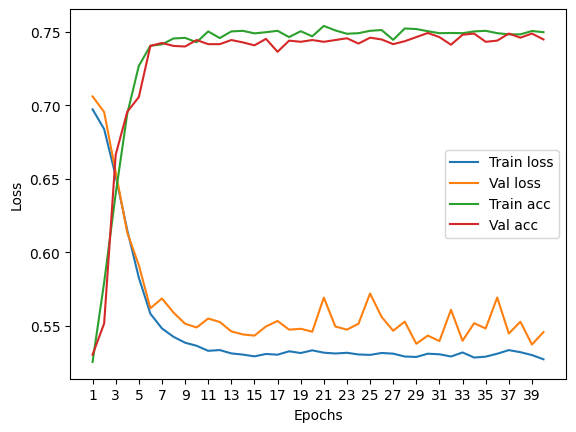

****************************************************************************************************



118it [00:00, 153.02it/s]


Train Epoch: 0 	Loss: 0.697310, Accuracy: 3906/7500 (52%)
Val Epoch: 0 	Loss: 0.706378, Accuracy: 1357/2500 (54%)



118it [00:00, 151.15it/s]


Train Epoch: 1 	Loss: 0.685509, Accuracy: 4322/7500 (58%)
Val Epoch: 1 	Loss: 0.690267, Accuracy: 1459/2500 (58%)



118it [00:00, 162.15it/s]


Train Epoch: 2 	Loss: 0.662798, Accuracy: 4589/7500 (61%)
Val Epoch: 2 	Loss: 0.667810, Accuracy: 1607/2500 (64%)



118it [00:00, 178.28it/s]


Train Epoch: 3 	Loss: 0.632902, Accuracy: 4964/7500 (66%)
Val Epoch: 3 	Loss: 0.633560, Accuracy: 1702/2500 (68%)



118it [00:00, 192.96it/s]


Train Epoch: 4 	Loss: 0.595193, Accuracy: 5290/7500 (71%)
Val Epoch: 4 	Loss: 0.597757, Accuracy: 1784/2500 (71%)



118it [00:00, 157.33it/s]


Train Epoch: 5 	Loss: 0.569960, Accuracy: 5405/7500 (72%)
Val Epoch: 5 	Loss: 0.586105, Accuracy: 1801/2500 (72%)



118it [00:00, 184.10it/s]


Train Epoch: 6 	Loss: 0.555248, Accuracy: 5491/7500 (73%)
Val Epoch: 6 	Loss: 0.586866, Accuracy: 1759/2500 (70%)



118it [00:00, 176.68it/s]


Train Epoch: 7 	Loss: 0.549489, Accuracy: 5459/7500 (73%)
Val Epoch: 7 	Loss: 0.574347, Accuracy: 1814/2500 (73%)



118it [00:00, 176.82it/s]


Train Epoch: 8 	Loss: 0.543002, Accuracy: 5542/7500 (74%)
Val Epoch: 8 	Loss: 0.564241, Accuracy: 1816/2500 (73%)



118it [00:00, 194.70it/s]


Train Epoch: 9 	Loss: 0.543364, Accuracy: 5521/7500 (74%)
Val Epoch: 9 	Loss: 0.561522, Accuracy: 1812/2500 (72%)



118it [00:00, 195.39it/s]


Train Epoch: 10 	Loss: 0.540558, Accuracy: 5544/7500 (74%)
Val Epoch: 10 	Loss: 0.563293, Accuracy: 1823/2500 (73%)



118it [00:00, 172.74it/s]


Train Epoch: 11 	Loss: 0.541484, Accuracy: 5528/7500 (74%)
Val Epoch: 11 	Loss: 0.577075, Accuracy: 1818/2500 (73%)



118it [00:00, 196.28it/s]


Train Epoch: 12 	Loss: 0.539011, Accuracy: 5554/7500 (74%)
Val Epoch: 12 	Loss: 0.565255, Accuracy: 1825/2500 (73%)



118it [00:00, 202.02it/s]


Train Epoch: 13 	Loss: 0.538028, Accuracy: 5525/7500 (74%)
Val Epoch: 13 	Loss: 0.560688, Accuracy: 1829/2500 (73%)



118it [00:00, 201.00it/s]


Train Epoch: 14 	Loss: 0.537662, Accuracy: 5519/7500 (74%)
Val Epoch: 14 	Loss: 0.561609, Accuracy: 1823/2500 (73%)



118it [00:00, 206.63it/s]


Train Epoch: 15 	Loss: 0.539831, Accuracy: 5516/7500 (74%)
Val Epoch: 15 	Loss: 0.573455, Accuracy: 1817/2500 (73%)



118it [00:00, 189.86it/s]


Train Epoch: 16 	Loss: 0.540887, Accuracy: 5525/7500 (74%)
Val Epoch: 16 	Loss: 0.573506, Accuracy: 1816/2500 (73%)



118it [00:00, 203.08it/s]


Train Epoch: 17 	Loss: 0.539895, Accuracy: 5538/7500 (74%)
Val Epoch: 17 	Loss: 0.580420, Accuracy: 1818/2500 (73%)



118it [00:00, 201.50it/s]


Train Epoch: 18 	Loss: 0.539606, Accuracy: 5523/7500 (74%)
Val Epoch: 18 	Loss: 0.565460, Accuracy: 1820/2500 (73%)



118it [00:00, 152.92it/s]


Train Epoch: 19 	Loss: 0.536891, Accuracy: 5563/7500 (74%)
Val Epoch: 19 	Loss: 0.573918, Accuracy: 1823/2500 (73%)



118it [00:00, 153.21it/s]


Train Epoch: 20 	Loss: 0.538271, Accuracy: 5530/7500 (74%)
Val Epoch: 20 	Loss: 0.569623, Accuracy: 1818/2500 (73%)



118it [00:00, 145.28it/s]


Train Epoch: 21 	Loss: 0.538211, Accuracy: 5552/7500 (74%)
Val Epoch: 21 	Loss: 0.573825, Accuracy: 1825/2500 (73%)



118it [00:00, 180.55it/s]


Train Epoch: 22 	Loss: 0.538897, Accuracy: 5545/7500 (74%)
Val Epoch: 22 	Loss: 0.570074, Accuracy: 1819/2500 (73%)



118it [00:00, 197.03it/s]


Train Epoch: 23 	Loss: 0.535266, Accuracy: 5545/7500 (74%)
Val Epoch: 23 	Loss: 0.570083, Accuracy: 1813/2500 (73%)



118it [00:00, 190.35it/s]


Train Epoch: 24 	Loss: 0.535821, Accuracy: 5533/7500 (74%)
Val Epoch: 24 	Loss: 0.568215, Accuracy: 1817/2500 (73%)



118it [00:00, 178.57it/s]


Train Epoch: 25 	Loss: 0.538983, Accuracy: 5547/7500 (74%)
Val Epoch: 25 	Loss: 0.574411, Accuracy: 1817/2500 (73%)



118it [00:00, 192.79it/s]


Train Epoch: 26 	Loss: 0.538108, Accuracy: 5539/7500 (74%)
Val Epoch: 26 	Loss: 0.580504, Accuracy: 1815/2500 (73%)



118it [00:00, 202.42it/s]


Train Epoch: 27 	Loss: 0.537148, Accuracy: 5556/7500 (74%)
Val Epoch: 27 	Loss: 0.587514, Accuracy: 1820/2500 (73%)



118it [00:00, 196.00it/s]


Train Epoch: 28 	Loss: 0.536556, Accuracy: 5551/7500 (74%)
Val Epoch: 28 	Loss: 0.587103, Accuracy: 1819/2500 (73%)



118it [00:00, 200.84it/s]


Train Epoch: 29 	Loss: 0.536567, Accuracy: 5528/7500 (74%)
Val Epoch: 29 	Loss: 0.565730, Accuracy: 1819/2500 (73%)



118it [00:00, 201.35it/s]


Train Epoch: 30 	Loss: 0.537791, Accuracy: 5562/7500 (74%)
Val Epoch: 30 	Loss: 0.568449, Accuracy: 1815/2500 (73%)



118it [00:00, 200.64it/s]


Train Epoch: 31 	Loss: 0.538126, Accuracy: 5547/7500 (74%)
Val Epoch: 31 	Loss: 0.566998, Accuracy: 1820/2500 (73%)



118it [00:00, 161.68it/s]


Train Epoch: 32 	Loss: 0.535726, Accuracy: 5543/7500 (74%)
Val Epoch: 32 	Loss: 0.563636, Accuracy: 1826/2500 (73%)



118it [00:00, 175.17it/s]


Train Epoch: 33 	Loss: 0.534994, Accuracy: 5558/7500 (74%)
Val Epoch: 33 	Loss: 0.572100, Accuracy: 1821/2500 (73%)



118it [00:00, 171.07it/s]


Train Epoch: 34 	Loss: 0.536603, Accuracy: 5559/7500 (74%)
Val Epoch: 34 	Loss: 0.572278, Accuracy: 1818/2500 (73%)



118it [00:00, 193.51it/s]


Train Epoch: 35 	Loss: 0.536505, Accuracy: 5547/7500 (74%)
Val Epoch: 35 	Loss: 0.572925, Accuracy: 1822/2500 (73%)



118it [00:00, 203.08it/s]


Train Epoch: 36 	Loss: 0.537516, Accuracy: 5564/7500 (74%)
Val Epoch: 36 	Loss: 0.569596, Accuracy: 1819/2500 (73%)



118it [00:00, 204.73it/s]


Train Epoch: 37 	Loss: 0.535194, Accuracy: 5564/7500 (74%)
Val Epoch: 37 	Loss: 0.584386, Accuracy: 1814/2500 (73%)



118it [00:00, 176.42it/s]


Train Epoch: 38 	Loss: 0.537438, Accuracy: 5555/7500 (74%)
Val Epoch: 38 	Loss: 0.570655, Accuracy: 1826/2500 (73%)



118it [00:00, 148.50it/s]


Train Epoch: 39 	Loss: 0.534910, Accuracy: 5546/7500 (74%)
Val Epoch: 39 	Loss: 0.562457, Accuracy: 1831/2500 (73%)

Test accuracy:  73.96000000000001


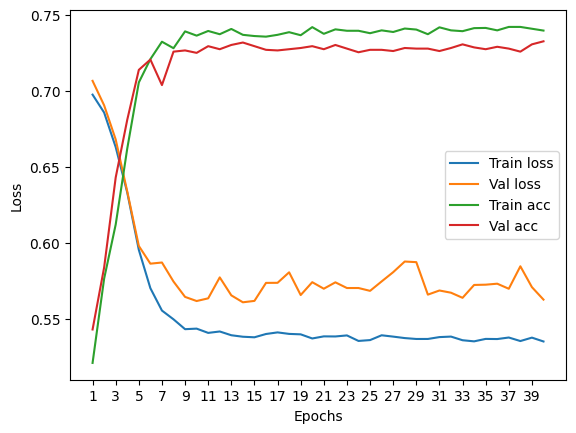

****************************************************************************************************



118it [00:00, 202.04it/s]


Train Epoch: 0 	Loss: 0.697459, Accuracy: 3897/7500 (52%)
Val Epoch: 0 	Loss: 0.706701, Accuracy: 1420/2500 (57%)



118it [00:00, 202.34it/s]


Train Epoch: 1 	Loss: 0.691270, Accuracy: 4091/7500 (55%)
Val Epoch: 1 	Loss: 0.693698, Accuracy: 1470/2500 (59%)



118it [00:00, 197.52it/s]


Train Epoch: 2 	Loss: 0.672527, Accuracy: 4553/7500 (61%)
Val Epoch: 2 	Loss: 0.664896, Accuracy: 1650/2500 (66%)



118it [00:00, 187.65it/s]


Train Epoch: 3 	Loss: 0.640264, Accuracy: 4991/7500 (67%)
Val Epoch: 3 	Loss: 0.624555, Accuracy: 1732/2500 (69%)



118it [00:00, 191.44it/s]


Train Epoch: 4 	Loss: 0.603360, Accuracy: 5241/7500 (70%)
Val Epoch: 4 	Loss: 0.588110, Accuracy: 1842/2500 (74%)



118it [00:00, 153.60it/s]


Train Epoch: 5 	Loss: 0.576611, Accuracy: 5430/7500 (72%)
Val Epoch: 5 	Loss: 0.572799, Accuracy: 1870/2500 (75%)



118it [00:00, 158.40it/s]


Train Epoch: 6 	Loss: 0.559089, Accuracy: 5468/7500 (73%)
Val Epoch: 6 	Loss: 0.550779, Accuracy: 1867/2500 (75%)



118it [00:00, 160.30it/s]


Train Epoch: 7 	Loss: 0.553925, Accuracy: 5505/7500 (73%)
Val Epoch: 7 	Loss: 0.553344, Accuracy: 1863/2500 (75%)



118it [00:00, 194.47it/s]


Train Epoch: 8 	Loss: 0.553417, Accuracy: 5503/7500 (73%)
Val Epoch: 8 	Loss: 0.557105, Accuracy: 1855/2500 (74%)



118it [00:00, 195.78it/s]


Train Epoch: 9 	Loss: 0.552232, Accuracy: 5474/7500 (73%)
Val Epoch: 9 	Loss: 0.543382, Accuracy: 1865/2500 (75%)



118it [00:00, 195.45it/s]


Train Epoch: 10 	Loss: 0.548176, Accuracy: 5471/7500 (73%)
Val Epoch: 10 	Loss: 0.542951, Accuracy: 1867/2500 (75%)



118it [00:00, 195.51it/s]


Train Epoch: 11 	Loss: 0.549930, Accuracy: 5506/7500 (73%)
Val Epoch: 11 	Loss: 0.585835, Accuracy: 1840/2500 (74%)



118it [00:00, 199.52it/s]


Train Epoch: 12 	Loss: 0.547658, Accuracy: 5493/7500 (73%)
Val Epoch: 12 	Loss: 0.548174, Accuracy: 1870/2500 (75%)



118it [00:00, 193.72it/s]


Train Epoch: 13 	Loss: 0.548508, Accuracy: 5486/7500 (73%)
Val Epoch: 13 	Loss: 0.547089, Accuracy: 1859/2500 (74%)



118it [00:00, 196.11it/s]


Train Epoch: 14 	Loss: 0.548370, Accuracy: 5507/7500 (73%)
Val Epoch: 14 	Loss: 0.549221, Accuracy: 1898/2500 (76%)



118it [00:00, 197.94it/s]


Train Epoch: 15 	Loss: 0.547310, Accuracy: 5494/7500 (73%)
Val Epoch: 15 	Loss: 0.547631, Accuracy: 1863/2500 (75%)



118it [00:00, 192.84it/s]


Train Epoch: 16 	Loss: 0.545108, Accuracy: 5491/7500 (73%)
Val Epoch: 16 	Loss: 0.552196, Accuracy: 1881/2500 (75%)



118it [00:00, 200.95it/s]


Train Epoch: 17 	Loss: 0.549088, Accuracy: 5513/7500 (74%)
Val Epoch: 17 	Loss: 0.556264, Accuracy: 1856/2500 (74%)



118it [00:00, 202.73it/s]


Train Epoch: 18 	Loss: 0.548712, Accuracy: 5507/7500 (73%)
Val Epoch: 18 	Loss: 0.543505, Accuracy: 1866/2500 (75%)



118it [00:00, 203.01it/s]


Train Epoch: 19 	Loss: 0.546814, Accuracy: 5521/7500 (74%)
Val Epoch: 19 	Loss: 0.543266, Accuracy: 1886/2500 (75%)



118it [00:00, 196.22it/s]


Train Epoch: 20 	Loss: 0.547064, Accuracy: 5493/7500 (73%)
Val Epoch: 20 	Loss: 0.544269, Accuracy: 1884/2500 (75%)



118it [00:00, 183.19it/s]


Train Epoch: 21 	Loss: 0.547116, Accuracy: 5497/7500 (73%)
Val Epoch: 21 	Loss: 0.544019, Accuracy: 1870/2500 (75%)



118it [00:00, 167.16it/s]


Train Epoch: 22 	Loss: 0.547317, Accuracy: 5510/7500 (73%)
Val Epoch: 22 	Loss: 0.547944, Accuracy: 1893/2500 (76%)



118it [00:00, 194.44it/s]


Train Epoch: 23 	Loss: 0.547095, Accuracy: 5524/7500 (74%)
Val Epoch: 23 	Loss: 0.554961, Accuracy: 1858/2500 (74%)



118it [00:00, 193.63it/s]


Train Epoch: 24 	Loss: 0.547001, Accuracy: 5509/7500 (73%)
Val Epoch: 24 	Loss: 0.539974, Accuracy: 1880/2500 (75%)



118it [00:00, 153.43it/s]


Train Epoch: 25 	Loss: 0.548006, Accuracy: 5492/7500 (73%)
Val Epoch: 25 	Loss: 0.551355, Accuracy: 1858/2500 (74%)



118it [00:00, 163.73it/s]


Train Epoch: 26 	Loss: 0.546558, Accuracy: 5501/7500 (73%)
Val Epoch: 26 	Loss: 0.555023, Accuracy: 1890/2500 (76%)



118it [00:00, 163.33it/s]


Train Epoch: 27 	Loss: 0.547194, Accuracy: 5517/7500 (74%)
Val Epoch: 27 	Loss: 0.563641, Accuracy: 1845/2500 (74%)



118it [00:00, 187.01it/s]


Train Epoch: 28 	Loss: 0.547297, Accuracy: 5525/7500 (74%)
Val Epoch: 28 	Loss: 0.540105, Accuracy: 1866/2500 (75%)



118it [00:00, 197.37it/s]


Train Epoch: 29 	Loss: 0.546654, Accuracy: 5524/7500 (74%)
Val Epoch: 29 	Loss: 0.547306, Accuracy: 1865/2500 (75%)



118it [00:00, 191.40it/s]


Train Epoch: 30 	Loss: 0.547147, Accuracy: 5524/7500 (74%)
Val Epoch: 30 	Loss: 0.542474, Accuracy: 1868/2500 (75%)



118it [00:00, 203.74it/s]


Train Epoch: 31 	Loss: 0.547238, Accuracy: 5509/7500 (73%)
Val Epoch: 31 	Loss: 0.542593, Accuracy: 1862/2500 (74%)



118it [00:00, 189.19it/s]


Train Epoch: 32 	Loss: 0.544364, Accuracy: 5507/7500 (73%)
Val Epoch: 32 	Loss: 0.548911, Accuracy: 1879/2500 (75%)



118it [00:00, 196.47it/s]


Train Epoch: 33 	Loss: 0.545934, Accuracy: 5533/7500 (74%)
Val Epoch: 33 	Loss: 0.548179, Accuracy: 1886/2500 (75%)



118it [00:00, 166.41it/s]


Train Epoch: 34 	Loss: 0.547676, Accuracy: 5496/7500 (73%)
Val Epoch: 34 	Loss: 0.540094, Accuracy: 1882/2500 (75%)



118it [00:00, 171.24it/s]


Train Epoch: 35 	Loss: 0.546567, Accuracy: 5525/7500 (74%)
Val Epoch: 35 	Loss: 0.552563, Accuracy: 1874/2500 (75%)



118it [00:00, 175.90it/s]


Train Epoch: 36 	Loss: 0.545217, Accuracy: 5517/7500 (74%)
Val Epoch: 36 	Loss: 0.550895, Accuracy: 1866/2500 (75%)



118it [00:00, 167.16it/s]


Train Epoch: 37 	Loss: 0.545494, Accuracy: 5506/7500 (73%)
Val Epoch: 37 	Loss: 0.545507, Accuracy: 1877/2500 (75%)



118it [00:00, 193.81it/s]


Train Epoch: 38 	Loss: 0.545250, Accuracy: 5494/7500 (73%)
Val Epoch: 38 	Loss: 0.540206, Accuracy: 1900/2500 (76%)



118it [00:00, 197.50it/s]


Train Epoch: 39 	Loss: 0.545456, Accuracy: 5535/7500 (74%)
Val Epoch: 39 	Loss: 0.542401, Accuracy: 1888/2500 (76%)

Test accuracy:  73.72


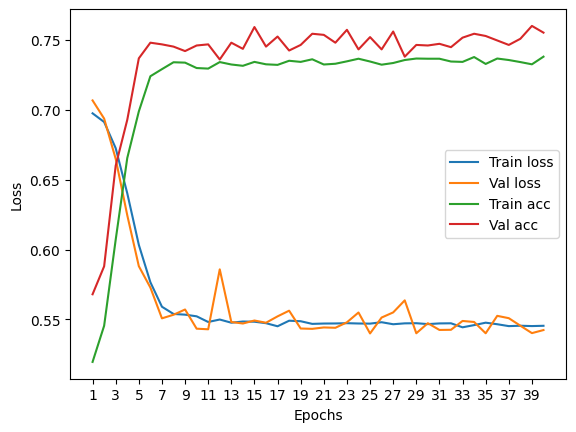

****************************************************************************************************



118it [00:00, 198.80it/s]


Train Epoch: 0 	Loss: 0.695234, Accuracy: 3941/7500 (53%)
Val Epoch: 0 	Loss: 0.708332, Accuracy: 1324/2500 (53%)



118it [00:00, 191.30it/s]


Train Epoch: 1 	Loss: 0.682129, Accuracy: 4295/7500 (57%)
Val Epoch: 1 	Loss: 0.681836, Accuracy: 1546/2500 (62%)



118it [00:00, 204.65it/s]


Train Epoch: 2 	Loss: 0.660832, Accuracy: 4690/7500 (63%)
Val Epoch: 2 	Loss: 0.650650, Accuracy: 1670/2500 (67%)



118it [00:00, 200.57it/s]


Train Epoch: 3 	Loss: 0.626332, Accuracy: 5095/7500 (68%)
Val Epoch: 3 	Loss: 0.622271, Accuracy: 1719/2500 (69%)



118it [00:00, 199.71it/s]


Train Epoch: 4 	Loss: 0.591701, Accuracy: 5375/7500 (72%)
Val Epoch: 4 	Loss: 0.585957, Accuracy: 1803/2500 (72%)



118it [00:00, 199.16it/s]


Train Epoch: 5 	Loss: 0.572160, Accuracy: 5442/7500 (73%)
Val Epoch: 5 	Loss: 0.573371, Accuracy: 1812/2500 (72%)



118it [00:00, 199.08it/s]


Train Epoch: 6 	Loss: 0.559592, Accuracy: 5491/7500 (73%)
Val Epoch: 6 	Loss: 0.560338, Accuracy: 1824/2500 (73%)



118it [00:00, 201.63it/s]


Train Epoch: 7 	Loss: 0.552957, Accuracy: 5525/7500 (74%)
Val Epoch: 7 	Loss: 0.565479, Accuracy: 1815/2500 (73%)



118it [00:00, 198.71it/s]


Train Epoch: 8 	Loss: 0.551768, Accuracy: 5485/7500 (73%)
Val Epoch: 8 	Loss: 0.563309, Accuracy: 1811/2500 (72%)



118it [00:00, 200.88it/s]


Train Epoch: 9 	Loss: 0.547576, Accuracy: 5529/7500 (74%)
Val Epoch: 9 	Loss: 0.566056, Accuracy: 1799/2500 (72%)



118it [00:00, 203.20it/s]


Train Epoch: 10 	Loss: 0.548116, Accuracy: 5522/7500 (74%)
Val Epoch: 10 	Loss: 0.564781, Accuracy: 1816/2500 (73%)



118it [00:00, 201.52it/s]


Train Epoch: 11 	Loss: 0.548897, Accuracy: 5510/7500 (73%)
Val Epoch: 11 	Loss: 0.561034, Accuracy: 1809/2500 (72%)



118it [00:00, 151.83it/s]


Train Epoch: 12 	Loss: 0.547512, Accuracy: 5535/7500 (74%)
Val Epoch: 12 	Loss: 0.566124, Accuracy: 1807/2500 (72%)



118it [00:00, 161.76it/s]


Train Epoch: 13 	Loss: 0.545844, Accuracy: 5547/7500 (74%)
Val Epoch: 13 	Loss: 0.559444, Accuracy: 1802/2500 (72%)



118it [00:00, 156.93it/s]


Train Epoch: 14 	Loss: 0.545417, Accuracy: 5540/7500 (74%)
Val Epoch: 14 	Loss: 0.559874, Accuracy: 1794/2500 (72%)



118it [00:00, 180.86it/s]


Train Epoch: 15 	Loss: 0.546364, Accuracy: 5541/7500 (74%)
Val Epoch: 15 	Loss: 0.562197, Accuracy: 1804/2500 (72%)



118it [00:00, 198.87it/s]


Train Epoch: 16 	Loss: 0.545876, Accuracy: 5557/7500 (74%)
Val Epoch: 16 	Loss: 0.566294, Accuracy: 1794/2500 (72%)



118it [00:00, 198.03it/s]


Train Epoch: 17 	Loss: 0.544457, Accuracy: 5541/7500 (74%)
Val Epoch: 17 	Loss: 0.564906, Accuracy: 1802/2500 (72%)



118it [00:00, 192.97it/s]


Train Epoch: 18 	Loss: 0.547065, Accuracy: 5542/7500 (74%)
Val Epoch: 18 	Loss: 0.559447, Accuracy: 1822/2500 (73%)



118it [00:00, 190.12it/s]


Train Epoch: 19 	Loss: 0.545580, Accuracy: 5541/7500 (74%)
Val Epoch: 19 	Loss: 0.556729, Accuracy: 1809/2500 (72%)



118it [00:00, 197.52it/s]


Train Epoch: 20 	Loss: 0.544669, Accuracy: 5558/7500 (74%)
Val Epoch: 20 	Loss: 0.559824, Accuracy: 1816/2500 (73%)



118it [00:00, 197.35it/s]


Train Epoch: 21 	Loss: 0.546455, Accuracy: 5534/7500 (74%)
Val Epoch: 21 	Loss: 0.556003, Accuracy: 1813/2500 (73%)



118it [00:00, 199.96it/s]


Train Epoch: 22 	Loss: 0.546690, Accuracy: 5541/7500 (74%)
Val Epoch: 22 	Loss: 0.568965, Accuracy: 1799/2500 (72%)



118it [00:00, 195.41it/s]


Train Epoch: 23 	Loss: 0.551859, Accuracy: 5505/7500 (73%)
Val Epoch: 23 	Loss: 0.561694, Accuracy: 1826/2500 (73%)



118it [00:00, 184.72it/s]


Train Epoch: 24 	Loss: 0.546147, Accuracy: 5538/7500 (74%)
Val Epoch: 24 	Loss: 0.576794, Accuracy: 1808/2500 (72%)



118it [00:00, 182.05it/s]


Train Epoch: 25 	Loss: 0.545665, Accuracy: 5538/7500 (74%)
Val Epoch: 25 	Loss: 0.560200, Accuracy: 1806/2500 (72%)



118it [00:00, 133.31it/s]


Train Epoch: 26 	Loss: 0.546524, Accuracy: 5531/7500 (74%)
Val Epoch: 26 	Loss: 0.565696, Accuracy: 1802/2500 (72%)



118it [00:01, 98.15it/s]


Train Epoch: 27 	Loss: 0.545195, Accuracy: 5534/7500 (74%)
Val Epoch: 27 	Loss: 0.557284, Accuracy: 1817/2500 (73%)



118it [00:00, 149.43it/s]


Train Epoch: 28 	Loss: 0.544556, Accuracy: 5538/7500 (74%)
Val Epoch: 28 	Loss: 0.559096, Accuracy: 1807/2500 (72%)



118it [00:00, 178.10it/s]


Train Epoch: 29 	Loss: 0.546253, Accuracy: 5547/7500 (74%)
Val Epoch: 29 	Loss: 0.558966, Accuracy: 1822/2500 (73%)



118it [00:00, 154.73it/s]


Train Epoch: 30 	Loss: 0.546814, Accuracy: 5528/7500 (74%)
Val Epoch: 30 	Loss: 0.556785, Accuracy: 1810/2500 (72%)



118it [00:00, 172.04it/s]


Train Epoch: 31 	Loss: 0.545027, Accuracy: 5538/7500 (74%)
Val Epoch: 31 	Loss: 0.562082, Accuracy: 1795/2500 (72%)



118it [00:00, 165.51it/s]


Train Epoch: 32 	Loss: 0.546787, Accuracy: 5544/7500 (74%)
Val Epoch: 32 	Loss: 0.558862, Accuracy: 1805/2500 (72%)



118it [00:00, 182.36it/s]


Train Epoch: 33 	Loss: 0.546792, Accuracy: 5533/7500 (74%)
Val Epoch: 33 	Loss: 0.577941, Accuracy: 1797/2500 (72%)



118it [00:00, 195.18it/s]


Train Epoch: 34 	Loss: 0.544438, Accuracy: 5525/7500 (74%)
Val Epoch: 34 	Loss: 0.563497, Accuracy: 1819/2500 (73%)



118it [00:00, 186.24it/s]


Train Epoch: 35 	Loss: 0.544076, Accuracy: 5543/7500 (74%)
Val Epoch: 35 	Loss: 0.557339, Accuracy: 1821/2500 (73%)



118it [00:00, 196.65it/s]


Train Epoch: 36 	Loss: 0.545246, Accuracy: 5551/7500 (74%)
Val Epoch: 36 	Loss: 0.564402, Accuracy: 1816/2500 (73%)



118it [00:00, 192.25it/s]


Train Epoch: 37 	Loss: 0.545491, Accuracy: 5529/7500 (74%)
Val Epoch: 37 	Loss: 0.559417, Accuracy: 1816/2500 (73%)



118it [00:00, 199.28it/s]


Train Epoch: 38 	Loss: 0.543995, Accuracy: 5538/7500 (74%)
Val Epoch: 38 	Loss: 0.567839, Accuracy: 1796/2500 (72%)



118it [00:00, 188.31it/s]


Train Epoch: 39 	Loss: 0.545056, Accuracy: 5526/7500 (74%)
Val Epoch: 39 	Loss: 0.563509, Accuracy: 1820/2500 (73%)

Test accuracy:  73.72


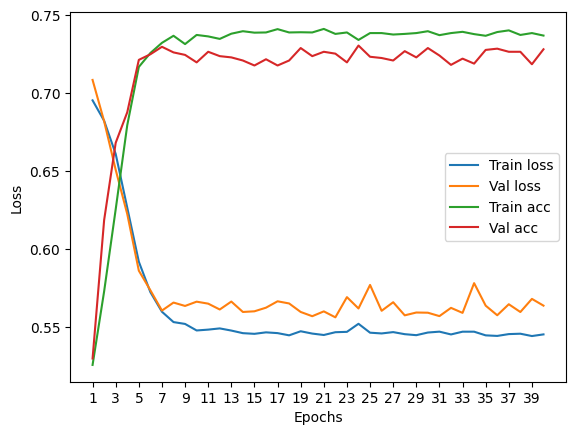

****************************************************************************************************



118it [00:00, 181.96it/s]


Train Epoch: 0 	Loss: 0.695358, Accuracy: 3953/7500 (53%)
Val Epoch: 0 	Loss: 0.706989, Accuracy: 1307/2500 (52%)



118it [00:00, 169.47it/s]


Train Epoch: 1 	Loss: 0.685471, Accuracy: 4323/7500 (58%)
Val Epoch: 1 	Loss: 0.692126, Accuracy: 1469/2500 (59%)



118it [00:00, 179.68it/s]


Train Epoch: 2 	Loss: 0.654494, Accuracy: 4854/7500 (65%)
Val Epoch: 2 	Loss: 0.646233, Accuracy: 1723/2500 (69%)



118it [00:00, 196.87it/s]


Train Epoch: 3 	Loss: 0.611909, Accuracy: 5209/7500 (69%)
Val Epoch: 3 	Loss: 0.599239, Accuracy: 1788/2500 (72%)



118it [00:00, 196.14it/s]


Train Epoch: 4 	Loss: 0.580930, Accuracy: 5447/7500 (73%)
Val Epoch: 4 	Loss: 0.599115, Accuracy: 1761/2500 (70%)



118it [00:00, 189.95it/s]


Train Epoch: 5 	Loss: 0.564593, Accuracy: 5483/7500 (73%)
Val Epoch: 5 	Loss: 0.565740, Accuracy: 1805/2500 (72%)



118it [00:00, 196.55it/s]


Train Epoch: 6 	Loss: 0.554965, Accuracy: 5493/7500 (73%)
Val Epoch: 6 	Loss: 0.569667, Accuracy: 1805/2500 (72%)



118it [00:00, 196.69it/s]


Train Epoch: 7 	Loss: 0.554809, Accuracy: 5509/7500 (73%)
Val Epoch: 7 	Loss: 0.566849, Accuracy: 1838/2500 (74%)



118it [00:00, 196.94it/s]


Train Epoch: 8 	Loss: 0.552703, Accuracy: 5497/7500 (73%)
Val Epoch: 8 	Loss: 0.553440, Accuracy: 1840/2500 (74%)



118it [00:00, 200.30it/s]


Train Epoch: 9 	Loss: 0.548075, Accuracy: 5537/7500 (74%)
Val Epoch: 9 	Loss: 0.558943, Accuracy: 1846/2500 (74%)



118it [00:00, 196.29it/s]


Train Epoch: 10 	Loss: 0.549886, Accuracy: 5513/7500 (74%)
Val Epoch: 10 	Loss: 0.569870, Accuracy: 1839/2500 (74%)



118it [00:00, 178.58it/s]


Train Epoch: 11 	Loss: 0.550625, Accuracy: 5501/7500 (73%)
Val Epoch: 11 	Loss: 0.568961, Accuracy: 1828/2500 (73%)



118it [00:00, 168.39it/s]


Train Epoch: 12 	Loss: 0.549129, Accuracy: 5529/7500 (74%)
Val Epoch: 12 	Loss: 0.551819, Accuracy: 1851/2500 (74%)



118it [00:00, 180.45it/s]


Train Epoch: 13 	Loss: 0.548802, Accuracy: 5487/7500 (73%)
Val Epoch: 13 	Loss: 0.573627, Accuracy: 1801/2500 (72%)



118it [00:00, 193.02it/s]


Train Epoch: 14 	Loss: 0.548265, Accuracy: 5513/7500 (74%)
Val Epoch: 14 	Loss: 0.554609, Accuracy: 1850/2500 (74%)



118it [00:00, 194.81it/s]


Train Epoch: 15 	Loss: 0.549745, Accuracy: 5547/7500 (74%)
Val Epoch: 15 	Loss: 0.549453, Accuracy: 1844/2500 (74%)



118it [00:00, 156.08it/s]


Train Epoch: 16 	Loss: 0.548297, Accuracy: 5520/7500 (74%)
Val Epoch: 16 	Loss: 0.568351, Accuracy: 1836/2500 (73%)



118it [00:00, 158.71it/s]


Train Epoch: 17 	Loss: 0.549291, Accuracy: 5506/7500 (73%)
Val Epoch: 17 	Loss: 0.566527, Accuracy: 1821/2500 (73%)



118it [00:00, 132.61it/s]


Train Epoch: 18 	Loss: 0.548386, Accuracy: 5534/7500 (74%)
Val Epoch: 18 	Loss: 0.567759, Accuracy: 1849/2500 (74%)



118it [00:00, 177.23it/s]


Train Epoch: 19 	Loss: 0.548601, Accuracy: 5537/7500 (74%)
Val Epoch: 19 	Loss: 0.564306, Accuracy: 1843/2500 (74%)



118it [00:00, 198.22it/s]


Train Epoch: 20 	Loss: 0.547028, Accuracy: 5521/7500 (74%)
Val Epoch: 20 	Loss: 0.551635, Accuracy: 1836/2500 (73%)



118it [00:00, 182.57it/s]


Train Epoch: 21 	Loss: 0.547859, Accuracy: 5535/7500 (74%)
Val Epoch: 21 	Loss: 0.550122, Accuracy: 1849/2500 (74%)



118it [00:00, 184.16it/s]


Train Epoch: 22 	Loss: 0.547735, Accuracy: 5537/7500 (74%)
Val Epoch: 22 	Loss: 0.558307, Accuracy: 1849/2500 (74%)



118it [00:00, 192.40it/s]


Train Epoch: 23 	Loss: 0.547476, Accuracy: 5538/7500 (74%)
Val Epoch: 23 	Loss: 0.560259, Accuracy: 1835/2500 (73%)



118it [00:00, 162.95it/s]


Train Epoch: 24 	Loss: 0.547609, Accuracy: 5526/7500 (74%)
Val Epoch: 24 	Loss: 0.559942, Accuracy: 1838/2500 (74%)



118it [00:00, 188.21it/s]


Train Epoch: 25 	Loss: 0.546810, Accuracy: 5530/7500 (74%)
Val Epoch: 25 	Loss: 0.559229, Accuracy: 1854/2500 (74%)



118it [00:00, 195.91it/s]


Train Epoch: 26 	Loss: 0.547431, Accuracy: 5534/7500 (74%)
Val Epoch: 26 	Loss: 0.552920, Accuracy: 1855/2500 (74%)



118it [00:00, 196.96it/s]


Train Epoch: 27 	Loss: 0.546337, Accuracy: 5523/7500 (74%)
Val Epoch: 27 	Loss: 0.554224, Accuracy: 1846/2500 (74%)



118it [00:00, 199.59it/s]


Train Epoch: 28 	Loss: 0.545797, Accuracy: 5541/7500 (74%)
Val Epoch: 28 	Loss: 0.552842, Accuracy: 1857/2500 (74%)



118it [00:00, 191.02it/s]


Train Epoch: 29 	Loss: 0.547054, Accuracy: 5536/7500 (74%)
Val Epoch: 29 	Loss: 0.564938, Accuracy: 1843/2500 (74%)



118it [00:00, 202.86it/s]


Train Epoch: 30 	Loss: 0.546356, Accuracy: 5550/7500 (74%)
Val Epoch: 30 	Loss: 0.578902, Accuracy: 1808/2500 (72%)



118it [00:00, 183.59it/s]


Train Epoch: 31 	Loss: 0.549858, Accuracy: 5520/7500 (74%)
Val Epoch: 31 	Loss: 0.556726, Accuracy: 1833/2500 (73%)



118it [00:00, 200.99it/s]


Train Epoch: 32 	Loss: 0.547189, Accuracy: 5528/7500 (74%)
Val Epoch: 32 	Loss: 0.558207, Accuracy: 1830/2500 (73%)



118it [00:00, 198.95it/s]


Train Epoch: 33 	Loss: 0.551563, Accuracy: 5499/7500 (73%)
Val Epoch: 33 	Loss: 0.563203, Accuracy: 1828/2500 (73%)



118it [00:00, 195.64it/s]


Train Epoch: 34 	Loss: 0.546908, Accuracy: 5511/7500 (73%)
Val Epoch: 34 	Loss: 0.560401, Accuracy: 1843/2500 (74%)



118it [00:00, 162.86it/s]


Train Epoch: 35 	Loss: 0.546383, Accuracy: 5529/7500 (74%)
Val Epoch: 35 	Loss: 0.556967, Accuracy: 1845/2500 (74%)



118it [00:00, 143.57it/s]


Train Epoch: 36 	Loss: 0.547877, Accuracy: 5529/7500 (74%)
Val Epoch: 36 	Loss: 0.552679, Accuracy: 1840/2500 (74%)



118it [00:00, 132.13it/s]


Train Epoch: 37 	Loss: 0.549860, Accuracy: 5480/7500 (73%)
Val Epoch: 37 	Loss: 0.558733, Accuracy: 1828/2500 (73%)



118it [00:00, 123.31it/s]


Train Epoch: 38 	Loss: 0.548505, Accuracy: 5537/7500 (74%)
Val Epoch: 38 	Loss: 0.552870, Accuracy: 1830/2500 (73%)



118it [00:00, 180.38it/s]


Train Epoch: 39 	Loss: 0.548732, Accuracy: 5534/7500 (74%)
Val Epoch: 39 	Loss: 0.559373, Accuracy: 1848/2500 (74%)

Test accuracy:  73.6


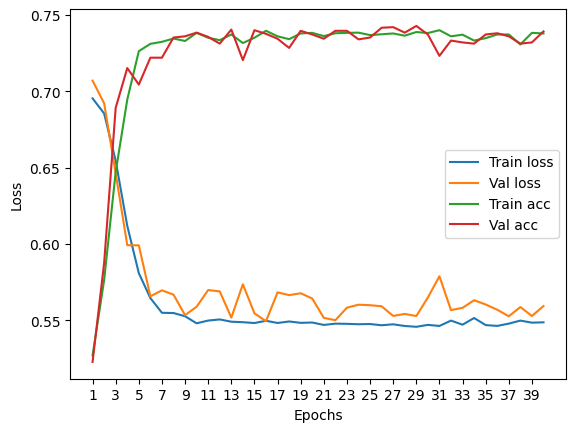

****************************************************************************************************



116it [00:00, 199.34it/s]


Train Epoch: 0 	Loss: 0.689762, Accuracy: 3993/7422 (54%)
Val Epoch: 0 	Loss: 0.688182, Accuracy: 1436/2474 (58%)



116it [00:00, 160.06it/s]


Train Epoch: 1 	Loss: 0.675754, Accuracy: 4325/7422 (58%)
Val Epoch: 1 	Loss: 0.665960, Accuracy: 1555/2474 (63%)



116it [00:00, 151.70it/s]


Train Epoch: 2 	Loss: 0.651338, Accuracy: 4683/7422 (63%)
Val Epoch: 2 	Loss: 0.638287, Accuracy: 1690/2474 (68%)



116it [00:00, 136.45it/s]


Train Epoch: 3 	Loss: 0.616294, Accuracy: 5071/7422 (68%)
Val Epoch: 3 	Loss: 0.599464, Accuracy: 1735/2474 (70%)



116it [00:00, 188.67it/s]


Train Epoch: 4 	Loss: 0.586592, Accuracy: 5320/7422 (72%)
Val Epoch: 4 	Loss: 0.568429, Accuracy: 1813/2474 (73%)



116it [00:00, 179.82it/s]


Train Epoch: 5 	Loss: 0.567062, Accuracy: 5375/7422 (72%)
Val Epoch: 5 	Loss: 0.554066, Accuracy: 1841/2474 (74%)



116it [00:00, 166.26it/s]


Train Epoch: 6 	Loss: 0.557453, Accuracy: 5397/7422 (73%)
Val Epoch: 6 	Loss: 0.549316, Accuracy: 1843/2474 (74%)



116it [00:00, 171.79it/s]


Train Epoch: 7 	Loss: 0.555000, Accuracy: 5410/7422 (73%)
Val Epoch: 7 	Loss: 0.544959, Accuracy: 1828/2474 (74%)



116it [00:00, 185.77it/s]


Train Epoch: 8 	Loss: 0.550595, Accuracy: 5454/7422 (73%)
Val Epoch: 8 	Loss: 0.542752, Accuracy: 1831/2474 (74%)



116it [00:00, 193.95it/s]


Train Epoch: 9 	Loss: 0.550571, Accuracy: 5454/7422 (73%)
Val Epoch: 9 	Loss: 0.541230, Accuracy: 1848/2474 (75%)



116it [00:00, 195.03it/s]


Train Epoch: 10 	Loss: 0.550808, Accuracy: 5428/7422 (73%)
Val Epoch: 10 	Loss: 0.537837, Accuracy: 1846/2474 (75%)



116it [00:00, 197.90it/s]


Train Epoch: 11 	Loss: 0.547849, Accuracy: 5476/7422 (74%)
Val Epoch: 11 	Loss: 0.544940, Accuracy: 1808/2474 (73%)



116it [00:00, 194.77it/s]


Train Epoch: 12 	Loss: 0.550282, Accuracy: 5442/7422 (73%)
Val Epoch: 12 	Loss: 0.537865, Accuracy: 1853/2474 (75%)



116it [00:00, 200.76it/s]


Train Epoch: 13 	Loss: 0.548726, Accuracy: 5459/7422 (74%)
Val Epoch: 13 	Loss: 0.539160, Accuracy: 1849/2474 (75%)



116it [00:00, 193.66it/s]


Train Epoch: 14 	Loss: 0.548038, Accuracy: 5464/7422 (74%)
Val Epoch: 14 	Loss: 0.538800, Accuracy: 1843/2474 (74%)



116it [00:00, 201.86it/s]


Train Epoch: 15 	Loss: 0.548016, Accuracy: 5446/7422 (73%)
Val Epoch: 15 	Loss: 0.540015, Accuracy: 1853/2474 (75%)



116it [00:00, 194.86it/s]


Train Epoch: 16 	Loss: 0.549833, Accuracy: 5470/7422 (74%)
Val Epoch: 16 	Loss: 0.539744, Accuracy: 1852/2474 (75%)



116it [00:00, 185.58it/s]


Train Epoch: 17 	Loss: 0.548042, Accuracy: 5464/7422 (74%)
Val Epoch: 17 	Loss: 0.546738, Accuracy: 1831/2474 (74%)



116it [00:00, 196.57it/s]


Train Epoch: 18 	Loss: 0.547753, Accuracy: 5457/7422 (74%)
Val Epoch: 18 	Loss: 0.540032, Accuracy: 1835/2474 (74%)



116it [00:00, 190.01it/s]


Train Epoch: 19 	Loss: 0.547412, Accuracy: 5467/7422 (74%)
Val Epoch: 19 	Loss: 0.542464, Accuracy: 1823/2474 (74%)



116it [00:00, 189.06it/s]


Train Epoch: 20 	Loss: 0.547201, Accuracy: 5464/7422 (74%)
Val Epoch: 20 	Loss: 0.537393, Accuracy: 1845/2474 (75%)



116it [00:00, 135.99it/s]


Train Epoch: 21 	Loss: 0.547436, Accuracy: 5460/7422 (74%)
Val Epoch: 21 	Loss: 0.539441, Accuracy: 1847/2474 (75%)



116it [00:00, 163.70it/s]


Train Epoch: 22 	Loss: 0.547239, Accuracy: 5467/7422 (74%)
Val Epoch: 22 	Loss: 0.543160, Accuracy: 1845/2474 (75%)



116it [00:00, 157.77it/s]


Train Epoch: 23 	Loss: 0.548369, Accuracy: 5490/7422 (74%)
Val Epoch: 23 	Loss: 0.541536, Accuracy: 1836/2474 (74%)



116it [00:00, 192.69it/s]


Train Epoch: 24 	Loss: 0.547721, Accuracy: 5465/7422 (74%)
Val Epoch: 24 	Loss: 0.539336, Accuracy: 1844/2474 (75%)



116it [00:00, 198.25it/s]


Train Epoch: 25 	Loss: 0.547162, Accuracy: 5480/7422 (74%)
Val Epoch: 25 	Loss: 0.540124, Accuracy: 1820/2474 (74%)



116it [00:00, 192.77it/s]


Train Epoch: 26 	Loss: 0.549528, Accuracy: 5447/7422 (73%)
Val Epoch: 26 	Loss: 0.536089, Accuracy: 1847/2474 (75%)



116it [00:00, 183.92it/s]


Train Epoch: 27 	Loss: 0.547316, Accuracy: 5466/7422 (74%)
Val Epoch: 27 	Loss: 0.539408, Accuracy: 1844/2474 (75%)



116it [00:00, 190.38it/s]


Train Epoch: 28 	Loss: 0.547699, Accuracy: 5466/7422 (74%)
Val Epoch: 28 	Loss: 0.537609, Accuracy: 1847/2474 (75%)



116it [00:00, 198.53it/s]


Train Epoch: 29 	Loss: 0.548394, Accuracy: 5483/7422 (74%)
Val Epoch: 29 	Loss: 0.543135, Accuracy: 1837/2474 (74%)



116it [00:00, 196.36it/s]


Train Epoch: 30 	Loss: 0.549124, Accuracy: 5452/7422 (73%)
Val Epoch: 30 	Loss: 0.540220, Accuracy: 1838/2474 (74%)



116it [00:00, 192.89it/s]


Train Epoch: 31 	Loss: 0.548299, Accuracy: 5439/7422 (73%)
Val Epoch: 31 	Loss: 0.537718, Accuracy: 1852/2474 (75%)



116it [00:00, 195.10it/s]


Train Epoch: 32 	Loss: 0.548115, Accuracy: 5464/7422 (74%)
Val Epoch: 32 	Loss: 0.537283, Accuracy: 1852/2474 (75%)



116it [00:00, 201.69it/s]


Train Epoch: 33 	Loss: 0.547017, Accuracy: 5467/7422 (74%)
Val Epoch: 33 	Loss: 0.543092, Accuracy: 1848/2474 (75%)



116it [00:00, 198.95it/s]


Train Epoch: 34 	Loss: 0.547475, Accuracy: 5471/7422 (74%)
Val Epoch: 34 	Loss: 0.543291, Accuracy: 1839/2474 (74%)



116it [00:00, 196.52it/s]


Train Epoch: 35 	Loss: 0.547030, Accuracy: 5479/7422 (74%)
Val Epoch: 35 	Loss: 0.547005, Accuracy: 1835/2474 (74%)



116it [00:00, 199.32it/s]


Train Epoch: 36 	Loss: 0.547413, Accuracy: 5471/7422 (74%)
Val Epoch: 36 	Loss: 0.543249, Accuracy: 1835/2474 (74%)



116it [00:00, 197.64it/s]


Train Epoch: 37 	Loss: 0.547184, Accuracy: 5469/7422 (74%)
Val Epoch: 37 	Loss: 0.537049, Accuracy: 1850/2474 (75%)



116it [00:00, 199.37it/s]


Train Epoch: 38 	Loss: 0.546247, Accuracy: 5467/7422 (74%)
Val Epoch: 38 	Loss: 0.537248, Accuracy: 1839/2474 (74%)



116it [00:00, 199.97it/s]


Train Epoch: 39 	Loss: 0.547754, Accuracy: 5472/7422 (74%)
Val Epoch: 39 	Loss: 0.538935, Accuracy: 1844/2474 (75%)

Test accuracy:  74.65642683912692


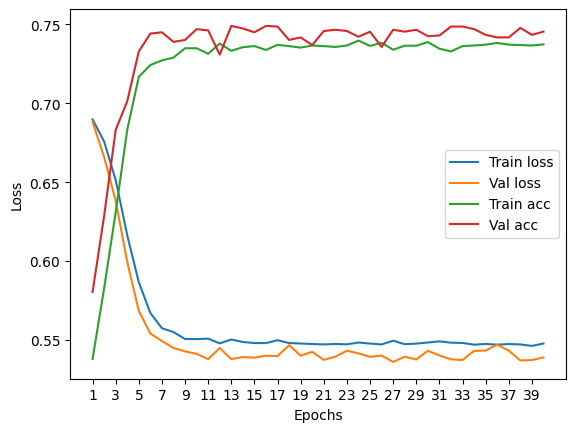

****************************************************************************************************



Particles per jet: 13


118it [00:00, 199.48it/s]


Train Epoch: 0 	Loss: 0.697786, Accuracy: 3866/7500 (52%)
Val Epoch: 0 	Loss: 0.706282, Accuracy: 1428/2500 (57%)



118it [00:00, 192.55it/s]


Train Epoch: 1 	Loss: 0.690930, Accuracy: 4138/7500 (55%)
Val Epoch: 1 	Loss: 0.693246, Accuracy: 1497/2500 (60%)



118it [00:00, 201.17it/s]


Train Epoch: 2 	Loss: 0.674742, Accuracy: 4492/7500 (60%)
Val Epoch: 2 	Loss: 0.673107, Accuracy: 1583/2500 (63%)



118it [00:00, 165.18it/s]


Train Epoch: 3 	Loss: 0.641699, Accuracy: 4876/7500 (65%)
Val Epoch: 3 	Loss: 0.626586, Accuracy: 1713/2500 (69%)



118it [00:00, 174.49it/s]


Train Epoch: 4 	Loss: 0.601711, Accuracy: 5293/7500 (71%)
Val Epoch: 4 	Loss: 0.587352, Accuracy: 1804/2500 (72%)



118it [00:00, 166.55it/s]


Train Epoch: 5 	Loss: 0.573617, Accuracy: 5428/7500 (72%)
Val Epoch: 5 	Loss: 0.576482, Accuracy: 1812/2500 (72%)



118it [00:00, 150.73it/s]


Train Epoch: 6 	Loss: 0.561475, Accuracy: 5494/7500 (73%)
Val Epoch: 6 	Loss: 0.576675, Accuracy: 1814/2500 (73%)



118it [00:00, 133.84it/s]


Train Epoch: 7 	Loss: 0.553353, Accuracy: 5515/7500 (74%)
Val Epoch: 7 	Loss: 0.558287, Accuracy: 1826/2500 (73%)



118it [00:00, 176.05it/s]


Train Epoch: 8 	Loss: 0.547634, Accuracy: 5533/7500 (74%)
Val Epoch: 8 	Loss: 0.566737, Accuracy: 1824/2500 (73%)



118it [00:00, 196.57it/s]


Train Epoch: 9 	Loss: 0.547247, Accuracy: 5533/7500 (74%)
Val Epoch: 9 	Loss: 0.551343, Accuracy: 1833/2500 (73%)



118it [00:00, 197.49it/s]


Train Epoch: 10 	Loss: 0.544956, Accuracy: 5551/7500 (74%)
Val Epoch: 10 	Loss: 0.561713, Accuracy: 1819/2500 (73%)



118it [00:00, 192.22it/s]


Train Epoch: 11 	Loss: 0.540535, Accuracy: 5598/7500 (75%)
Val Epoch: 11 	Loss: 0.557297, Accuracy: 1845/2500 (74%)



118it [00:00, 166.58it/s]


Train Epoch: 12 	Loss: 0.542258, Accuracy: 5574/7500 (74%)
Val Epoch: 12 	Loss: 0.549193, Accuracy: 1842/2500 (74%)



118it [00:00, 185.24it/s]


Train Epoch: 13 	Loss: 0.544677, Accuracy: 5592/7500 (75%)
Val Epoch: 13 	Loss: 0.551819, Accuracy: 1836/2500 (73%)



118it [00:00, 193.61it/s]


Train Epoch: 14 	Loss: 0.540024, Accuracy: 5597/7500 (75%)
Val Epoch: 14 	Loss: 0.552863, Accuracy: 1838/2500 (74%)



118it [00:00, 198.13it/s]


Train Epoch: 15 	Loss: 0.541603, Accuracy: 5568/7500 (74%)
Val Epoch: 15 	Loss: 0.547636, Accuracy: 1848/2500 (74%)



118it [00:00, 192.89it/s]


Train Epoch: 16 	Loss: 0.537904, Accuracy: 5589/7500 (75%)
Val Epoch: 16 	Loss: 0.557012, Accuracy: 1832/2500 (73%)



118it [00:00, 197.67it/s]


Train Epoch: 17 	Loss: 0.539473, Accuracy: 5592/7500 (75%)
Val Epoch: 17 	Loss: 0.555472, Accuracy: 1843/2500 (74%)



118it [00:00, 198.11it/s]


Train Epoch: 18 	Loss: 0.539084, Accuracy: 5601/7500 (75%)
Val Epoch: 18 	Loss: 0.553955, Accuracy: 1845/2500 (74%)



118it [00:00, 200.39it/s]


Train Epoch: 19 	Loss: 0.539304, Accuracy: 5587/7500 (74%)
Val Epoch: 19 	Loss: 0.548181, Accuracy: 1840/2500 (74%)



118it [00:00, 190.10it/s]


Train Epoch: 20 	Loss: 0.541495, Accuracy: 5565/7500 (74%)
Val Epoch: 20 	Loss: 0.554957, Accuracy: 1836/2500 (73%)



118it [00:00, 182.89it/s]


Train Epoch: 21 	Loss: 0.539070, Accuracy: 5586/7500 (74%)
Val Epoch: 21 	Loss: 0.555634, Accuracy: 1847/2500 (74%)



118it [00:00, 181.30it/s]


Train Epoch: 22 	Loss: 0.542132, Accuracy: 5602/7500 (75%)
Val Epoch: 22 	Loss: 0.551901, Accuracy: 1843/2500 (74%)



118it [00:00, 196.16it/s]


Train Epoch: 23 	Loss: 0.540309, Accuracy: 5601/7500 (75%)
Val Epoch: 23 	Loss: 0.558863, Accuracy: 1851/2500 (74%)



118it [00:00, 182.48it/s]


Train Epoch: 24 	Loss: 0.540883, Accuracy: 5582/7500 (74%)
Val Epoch: 24 	Loss: 0.550523, Accuracy: 1846/2500 (74%)



118it [00:00, 147.55it/s]


Train Epoch: 25 	Loss: 0.542139, Accuracy: 5602/7500 (75%)
Val Epoch: 25 	Loss: 0.549546, Accuracy: 1850/2500 (74%)



118it [00:00, 162.13it/s]


Train Epoch: 26 	Loss: 0.537759, Accuracy: 5601/7500 (75%)
Val Epoch: 26 	Loss: 0.568322, Accuracy: 1840/2500 (74%)



118it [00:00, 174.73it/s]


Train Epoch: 27 	Loss: 0.539460, Accuracy: 5577/7500 (74%)
Val Epoch: 27 	Loss: 0.560639, Accuracy: 1828/2500 (73%)



118it [00:00, 186.42it/s]


Train Epoch: 28 	Loss: 0.538942, Accuracy: 5598/7500 (75%)
Val Epoch: 28 	Loss: 0.558264, Accuracy: 1847/2500 (74%)



118it [00:00, 154.80it/s]


Train Epoch: 29 	Loss: 0.541133, Accuracy: 5584/7500 (74%)
Val Epoch: 29 	Loss: 0.544049, Accuracy: 1853/2500 (74%)



118it [00:00, 193.36it/s]


Train Epoch: 30 	Loss: 0.537108, Accuracy: 5581/7500 (74%)
Val Epoch: 30 	Loss: 0.562092, Accuracy: 1837/2500 (73%)



118it [00:00, 186.54it/s]


Train Epoch: 31 	Loss: 0.539454, Accuracy: 5577/7500 (74%)
Val Epoch: 31 	Loss: 0.555688, Accuracy: 1849/2500 (74%)



118it [00:00, 199.89it/s]


Train Epoch: 32 	Loss: 0.538481, Accuracy: 5571/7500 (74%)
Val Epoch: 32 	Loss: 0.560536, Accuracy: 1831/2500 (73%)



118it [00:00, 197.30it/s]


Train Epoch: 33 	Loss: 0.540533, Accuracy: 5569/7500 (74%)
Val Epoch: 33 	Loss: 0.551036, Accuracy: 1854/2500 (74%)



118it [00:00, 174.10it/s]


Train Epoch: 34 	Loss: 0.538147, Accuracy: 5598/7500 (75%)
Val Epoch: 34 	Loss: 0.556159, Accuracy: 1843/2500 (74%)



118it [00:00, 177.90it/s]


Train Epoch: 35 	Loss: 0.538260, Accuracy: 5606/7500 (75%)
Val Epoch: 35 	Loss: 0.555286, Accuracy: 1847/2500 (74%)



118it [00:00, 173.05it/s]


Train Epoch: 36 	Loss: 0.538517, Accuracy: 5600/7500 (75%)
Val Epoch: 36 	Loss: 0.556494, Accuracy: 1852/2500 (74%)



118it [00:00, 158.69it/s]


Train Epoch: 37 	Loss: 0.536737, Accuracy: 5599/7500 (75%)
Val Epoch: 37 	Loss: 0.552466, Accuracy: 1851/2500 (74%)



118it [00:00, 171.76it/s]


Train Epoch: 38 	Loss: 0.537536, Accuracy: 5618/7500 (75%)
Val Epoch: 38 	Loss: 0.558153, Accuracy: 1850/2500 (74%)



118it [00:00, 197.90it/s]


Train Epoch: 39 	Loss: 0.538373, Accuracy: 5583/7500 (74%)
Val Epoch: 39 	Loss: 0.554422, Accuracy: 1845/2500 (74%)

Test accuracy:  74.08


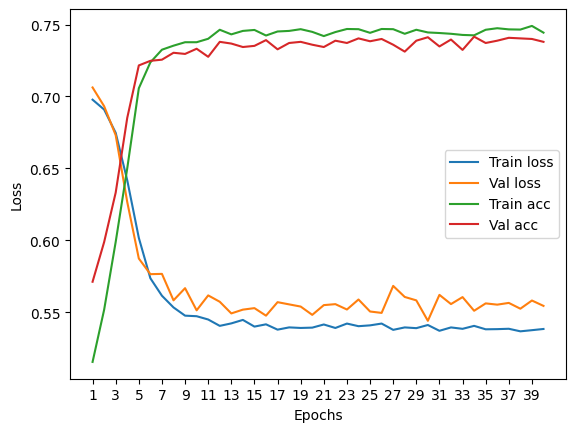

****************************************************************************************************



118it [00:00, 185.47it/s]


Train Epoch: 0 	Loss: 0.696416, Accuracy: 3929/7500 (52%)
Val Epoch: 0 	Loss: 0.706412, Accuracy: 1351/2500 (54%)



118it [00:00, 150.47it/s]


Train Epoch: 1 	Loss: 0.686330, Accuracy: 4237/7500 (56%)
Val Epoch: 1 	Loss: 0.691981, Accuracy: 1478/2500 (59%)



118it [00:00, 194.08it/s]


Train Epoch: 2 	Loss: 0.677010, Accuracy: 4329/7500 (58%)
Val Epoch: 2 	Loss: 0.677570, Accuracy: 1518/2500 (61%)



118it [00:00, 195.94it/s]


Train Epoch: 3 	Loss: 0.667904, Accuracy: 4468/7500 (60%)
Val Epoch: 3 	Loss: 0.674274, Accuracy: 1515/2500 (61%)



118it [00:00, 195.34it/s]


Train Epoch: 4 	Loss: 0.655025, Accuracy: 4657/7500 (62%)
Val Epoch: 4 	Loss: 0.660209, Accuracy: 1600/2500 (64%)



118it [00:00, 200.74it/s]


Train Epoch: 5 	Loss: 0.634255, Accuracy: 4954/7500 (66%)
Val Epoch: 5 	Loss: 0.640139, Accuracy: 1713/2500 (69%)



118it [00:00, 199.08it/s]


Train Epoch: 6 	Loss: 0.601754, Accuracy: 5319/7500 (71%)
Val Epoch: 6 	Loss: 0.606752, Accuracy: 1777/2500 (71%)



118it [00:00, 191.47it/s]


Train Epoch: 7 	Loss: 0.577615, Accuracy: 5458/7500 (73%)
Val Epoch: 7 	Loss: 0.578415, Accuracy: 1812/2500 (72%)



118it [00:00, 148.64it/s]


Train Epoch: 8 	Loss: 0.559360, Accuracy: 5495/7500 (73%)
Val Epoch: 8 	Loss: 0.593375, Accuracy: 1770/2500 (71%)



118it [00:00, 168.30it/s]


Train Epoch: 9 	Loss: 0.552393, Accuracy: 5550/7500 (74%)
Val Epoch: 9 	Loss: 0.574842, Accuracy: 1842/2500 (74%)



118it [00:00, 156.24it/s]


Train Epoch: 10 	Loss: 0.546173, Accuracy: 5579/7500 (74%)
Val Epoch: 10 	Loss: 0.563921, Accuracy: 1836/2500 (73%)



118it [00:00, 142.34it/s]


Train Epoch: 11 	Loss: 0.545087, Accuracy: 5574/7500 (74%)
Val Epoch: 11 	Loss: 0.563846, Accuracy: 1833/2500 (73%)



118it [00:00, 159.73it/s]


Train Epoch: 12 	Loss: 0.541936, Accuracy: 5588/7500 (75%)
Val Epoch: 12 	Loss: 0.564421, Accuracy: 1832/2500 (73%)



118it [00:00, 187.88it/s]


Train Epoch: 13 	Loss: 0.540525, Accuracy: 5573/7500 (74%)
Val Epoch: 13 	Loss: 0.567011, Accuracy: 1819/2500 (73%)



118it [00:00, 196.40it/s]


Train Epoch: 14 	Loss: 0.539989, Accuracy: 5559/7500 (74%)
Val Epoch: 14 	Loss: 0.553899, Accuracy: 1843/2500 (74%)



118it [00:00, 196.64it/s]


Train Epoch: 15 	Loss: 0.540251, Accuracy: 5571/7500 (74%)
Val Epoch: 15 	Loss: 0.583724, Accuracy: 1830/2500 (73%)



118it [00:00, 191.03it/s]


Train Epoch: 16 	Loss: 0.539993, Accuracy: 5544/7500 (74%)
Val Epoch: 16 	Loss: 0.576491, Accuracy: 1813/2500 (73%)



118it [00:00, 196.43it/s]


Train Epoch: 17 	Loss: 0.541751, Accuracy: 5579/7500 (74%)
Val Epoch: 17 	Loss: 0.563326, Accuracy: 1829/2500 (73%)



118it [00:00, 181.87it/s]


Train Epoch: 18 	Loss: 0.539622, Accuracy: 5564/7500 (74%)
Val Epoch: 18 	Loss: 0.567883, Accuracy: 1821/2500 (73%)



118it [00:00, 181.65it/s]


Train Epoch: 19 	Loss: 0.538263, Accuracy: 5592/7500 (75%)
Val Epoch: 19 	Loss: 0.559822, Accuracy: 1850/2500 (74%)



118it [00:00, 198.40it/s]


Train Epoch: 20 	Loss: 0.539789, Accuracy: 5582/7500 (74%)
Val Epoch: 20 	Loss: 0.569254, Accuracy: 1826/2500 (73%)



118it [00:00, 193.02it/s]


Train Epoch: 21 	Loss: 0.539674, Accuracy: 5588/7500 (75%)
Val Epoch: 21 	Loss: 0.564041, Accuracy: 1824/2500 (73%)



118it [00:00, 197.34it/s]


Train Epoch: 22 	Loss: 0.539409, Accuracy: 5603/7500 (75%)
Val Epoch: 22 	Loss: 0.575675, Accuracy: 1829/2500 (73%)



118it [00:00, 182.72it/s]


Train Epoch: 23 	Loss: 0.540357, Accuracy: 5593/7500 (75%)
Val Epoch: 23 	Loss: 0.581059, Accuracy: 1831/2500 (73%)



118it [00:00, 203.26it/s]


Train Epoch: 24 	Loss: 0.541021, Accuracy: 5602/7500 (75%)
Val Epoch: 24 	Loss: 0.555188, Accuracy: 1840/2500 (74%)



118it [00:00, 193.47it/s]


Train Epoch: 25 	Loss: 0.541021, Accuracy: 5593/7500 (75%)
Val Epoch: 25 	Loss: 0.568407, Accuracy: 1829/2500 (73%)



118it [00:00, 187.41it/s]


Train Epoch: 26 	Loss: 0.538383, Accuracy: 5611/7500 (75%)
Val Epoch: 26 	Loss: 0.556970, Accuracy: 1835/2500 (73%)



118it [00:00, 125.24it/s]


Train Epoch: 27 	Loss: 0.537484, Accuracy: 5598/7500 (75%)
Val Epoch: 27 	Loss: 0.555973, Accuracy: 1845/2500 (74%)



118it [00:00, 159.72it/s]


Train Epoch: 28 	Loss: 0.539321, Accuracy: 5581/7500 (74%)
Val Epoch: 28 	Loss: 0.578625, Accuracy: 1832/2500 (73%)



118it [00:00, 175.74it/s]


Train Epoch: 29 	Loss: 0.540302, Accuracy: 5612/7500 (75%)
Val Epoch: 29 	Loss: 0.569376, Accuracy: 1844/2500 (74%)



118it [00:00, 194.49it/s]


Train Epoch: 30 	Loss: 0.538711, Accuracy: 5584/7500 (74%)
Val Epoch: 30 	Loss: 0.559368, Accuracy: 1850/2500 (74%)



118it [00:00, 194.92it/s]


Train Epoch: 31 	Loss: 0.538865, Accuracy: 5589/7500 (75%)
Val Epoch: 31 	Loss: 0.562806, Accuracy: 1823/2500 (73%)



118it [00:00, 198.96it/s]


Train Epoch: 32 	Loss: 0.538693, Accuracy: 5615/7500 (75%)
Val Epoch: 32 	Loss: 0.563162, Accuracy: 1838/2500 (74%)



118it [00:00, 195.01it/s]


Train Epoch: 33 	Loss: 0.538271, Accuracy: 5595/7500 (75%)
Val Epoch: 33 	Loss: 0.553195, Accuracy: 1851/2500 (74%)



118it [00:00, 196.76it/s]


Train Epoch: 34 	Loss: 0.537875, Accuracy: 5610/7500 (75%)
Val Epoch: 34 	Loss: 0.575441, Accuracy: 1820/2500 (73%)



118it [00:00, 192.15it/s]


Train Epoch: 35 	Loss: 0.538593, Accuracy: 5603/7500 (75%)
Val Epoch: 35 	Loss: 0.563203, Accuracy: 1837/2500 (73%)



118it [00:00, 192.13it/s]


Train Epoch: 36 	Loss: 0.541561, Accuracy: 5593/7500 (75%)
Val Epoch: 36 	Loss: 0.561848, Accuracy: 1850/2500 (74%)



118it [00:00, 196.64it/s]


Train Epoch: 37 	Loss: 0.539181, Accuracy: 5591/7500 (75%)
Val Epoch: 37 	Loss: 0.561881, Accuracy: 1845/2500 (74%)



118it [00:00, 193.73it/s]


Train Epoch: 38 	Loss: 0.539221, Accuracy: 5597/7500 (75%)
Val Epoch: 38 	Loss: 0.565837, Accuracy: 1841/2500 (74%)



118it [00:00, 198.66it/s]


Train Epoch: 39 	Loss: 0.537744, Accuracy: 5601/7500 (75%)
Val Epoch: 39 	Loss: 0.570670, Accuracy: 1838/2500 (74%)

Test accuracy:  71.88


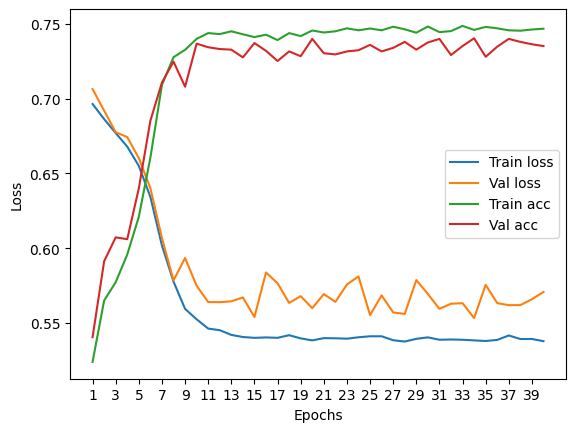

****************************************************************************************************



118it [00:00, 197.33it/s]


Train Epoch: 0 	Loss: 0.696957, Accuracy: 3917/7500 (52%)
Val Epoch: 0 	Loss: 0.703963, Accuracy: 1351/2500 (54%)



118it [00:00, 192.97it/s]


Train Epoch: 1 	Loss: 0.688418, Accuracy: 4246/7500 (57%)
Val Epoch: 1 	Loss: 0.687958, Accuracy: 1477/2500 (59%)



118it [00:00, 201.29it/s]


Train Epoch: 2 	Loss: 0.677238, Accuracy: 4347/7500 (58%)
Val Epoch: 2 	Loss: 0.679620, Accuracy: 1521/2500 (61%)



118it [00:00, 200.54it/s]


Train Epoch: 3 	Loss: 0.668174, Accuracy: 4525/7500 (60%)
Val Epoch: 3 	Loss: 0.663941, Accuracy: 1583/2500 (63%)



118it [00:00, 198.61it/s]


Train Epoch: 4 	Loss: 0.650901, Accuracy: 4831/7500 (64%)
Val Epoch: 4 	Loss: 0.642248, Accuracy: 1682/2500 (67%)



118it [00:00, 192.07it/s]


Train Epoch: 5 	Loss: 0.623689, Accuracy: 5158/7500 (69%)
Val Epoch: 5 	Loss: 0.612321, Accuracy: 1815/2500 (73%)



118it [00:00, 193.94it/s]


Train Epoch: 6 	Loss: 0.595065, Accuracy: 5379/7500 (72%)
Val Epoch: 6 	Loss: 0.577939, Accuracy: 1871/2500 (75%)



118it [00:00, 193.13it/s]


Train Epoch: 7 	Loss: 0.570288, Accuracy: 5508/7500 (73%)
Val Epoch: 7 	Loss: 0.562022, Accuracy: 1857/2500 (74%)



118it [00:00, 196.28it/s]


Train Epoch: 8 	Loss: 0.557144, Accuracy: 5535/7500 (74%)
Val Epoch: 8 	Loss: 0.543138, Accuracy: 1877/2500 (75%)



118it [00:00, 196.91it/s]


Train Epoch: 9 	Loss: 0.547399, Accuracy: 5552/7500 (74%)
Val Epoch: 9 	Loss: 0.543075, Accuracy: 1871/2500 (75%)



118it [00:00, 196.95it/s]


Train Epoch: 10 	Loss: 0.544704, Accuracy: 5565/7500 (74%)
Val Epoch: 10 	Loss: 0.531143, Accuracy: 1889/2500 (76%)



118it [00:00, 190.00it/s]


Train Epoch: 11 	Loss: 0.543688, Accuracy: 5554/7500 (74%)
Val Epoch: 11 	Loss: 0.535298, Accuracy: 1881/2500 (75%)



118it [00:00, 139.34it/s]


Train Epoch: 12 	Loss: 0.542424, Accuracy: 5574/7500 (74%)
Val Epoch: 12 	Loss: 0.530903, Accuracy: 1887/2500 (75%)



118it [00:00, 169.28it/s]


Train Epoch: 13 	Loss: 0.543538, Accuracy: 5543/7500 (74%)
Val Epoch: 13 	Loss: 0.531507, Accuracy: 1889/2500 (76%)



118it [00:00, 167.81it/s]


Train Epoch: 14 	Loss: 0.540907, Accuracy: 5554/7500 (74%)
Val Epoch: 14 	Loss: 0.528873, Accuracy: 1861/2500 (74%)



118it [00:00, 193.88it/s]


Train Epoch: 15 	Loss: 0.540141, Accuracy: 5578/7500 (74%)
Val Epoch: 15 	Loss: 0.523566, Accuracy: 1891/2500 (76%)



118it [00:00, 197.08it/s]


Train Epoch: 16 	Loss: 0.539326, Accuracy: 5565/7500 (74%)
Val Epoch: 16 	Loss: 0.533603, Accuracy: 1888/2500 (76%)



118it [00:00, 180.33it/s]


Train Epoch: 17 	Loss: 0.539885, Accuracy: 5555/7500 (74%)
Val Epoch: 17 	Loss: 0.531941, Accuracy: 1871/2500 (75%)



118it [00:00, 160.88it/s]


Train Epoch: 18 	Loss: 0.540046, Accuracy: 5588/7500 (75%)
Val Epoch: 18 	Loss: 0.526129, Accuracy: 1871/2500 (75%)



118it [00:00, 198.04it/s]


Train Epoch: 19 	Loss: 0.542547, Accuracy: 5558/7500 (74%)
Val Epoch: 19 	Loss: 0.528903, Accuracy: 1867/2500 (75%)



118it [00:00, 189.00it/s]


Train Epoch: 20 	Loss: 0.538564, Accuracy: 5577/7500 (74%)
Val Epoch: 20 	Loss: 0.535937, Accuracy: 1863/2500 (75%)



118it [00:00, 193.70it/s]


Train Epoch: 21 	Loss: 0.539662, Accuracy: 5569/7500 (74%)
Val Epoch: 21 	Loss: 0.531252, Accuracy: 1884/2500 (75%)



118it [00:00, 194.76it/s]


Train Epoch: 22 	Loss: 0.539607, Accuracy: 5558/7500 (74%)
Val Epoch: 22 	Loss: 0.531683, Accuracy: 1852/2500 (74%)



118it [00:00, 195.44it/s]


Train Epoch: 23 	Loss: 0.540534, Accuracy: 5565/7500 (74%)
Val Epoch: 23 	Loss: 0.532482, Accuracy: 1861/2500 (74%)



118it [00:00, 198.24it/s]


Train Epoch: 24 	Loss: 0.541242, Accuracy: 5552/7500 (74%)
Val Epoch: 24 	Loss: 0.532526, Accuracy: 1884/2500 (75%)



118it [00:00, 194.90it/s]


Train Epoch: 25 	Loss: 0.541577, Accuracy: 5548/7500 (74%)
Val Epoch: 25 	Loss: 0.554041, Accuracy: 1850/2500 (74%)



118it [00:00, 195.63it/s]


Train Epoch: 26 	Loss: 0.540342, Accuracy: 5585/7500 (74%)
Val Epoch: 26 	Loss: 0.526113, Accuracy: 1873/2500 (75%)



118it [00:00, 181.54it/s]


Train Epoch: 27 	Loss: 0.539534, Accuracy: 5569/7500 (74%)
Val Epoch: 27 	Loss: 0.525784, Accuracy: 1881/2500 (75%)



118it [00:00, 196.93it/s]


Train Epoch: 28 	Loss: 0.539807, Accuracy: 5582/7500 (74%)
Val Epoch: 28 	Loss: 0.523848, Accuracy: 1868/2500 (75%)



118it [00:00, 202.38it/s]


Train Epoch: 29 	Loss: 0.539168, Accuracy: 5570/7500 (74%)
Val Epoch: 29 	Loss: 0.527719, Accuracy: 1862/2500 (74%)



118it [00:00, 201.23it/s]


Train Epoch: 30 	Loss: 0.539425, Accuracy: 5568/7500 (74%)
Val Epoch: 30 	Loss: 0.539164, Accuracy: 1882/2500 (75%)



118it [00:00, 153.89it/s]


Train Epoch: 31 	Loss: 0.537938, Accuracy: 5574/7500 (74%)
Val Epoch: 31 	Loss: 0.524558, Accuracy: 1861/2500 (74%)



118it [00:00, 149.70it/s]


Train Epoch: 32 	Loss: 0.538182, Accuracy: 5571/7500 (74%)
Val Epoch: 32 	Loss: 0.532518, Accuracy: 1857/2500 (74%)



118it [00:00, 152.01it/s]


Train Epoch: 33 	Loss: 0.539115, Accuracy: 5568/7500 (74%)
Val Epoch: 33 	Loss: 0.526469, Accuracy: 1890/2500 (76%)



118it [00:00, 142.26it/s]


Train Epoch: 34 	Loss: 0.540249, Accuracy: 5546/7500 (74%)
Val Epoch: 34 	Loss: 0.535137, Accuracy: 1867/2500 (75%)



118it [00:00, 182.67it/s]


Train Epoch: 35 	Loss: 0.540114, Accuracy: 5569/7500 (74%)
Val Epoch: 35 	Loss: 0.528918, Accuracy: 1882/2500 (75%)



118it [00:00, 197.27it/s]


Train Epoch: 36 	Loss: 0.539166, Accuracy: 5574/7500 (74%)
Val Epoch: 36 	Loss: 0.530944, Accuracy: 1889/2500 (76%)



118it [00:00, 187.54it/s]


Train Epoch: 37 	Loss: 0.539188, Accuracy: 5563/7500 (74%)
Val Epoch: 37 	Loss: 0.529413, Accuracy: 1868/2500 (75%)



118it [00:00, 194.87it/s]


Train Epoch: 38 	Loss: 0.539162, Accuracy: 5574/7500 (74%)
Val Epoch: 38 	Loss: 0.522828, Accuracy: 1882/2500 (75%)



118it [00:00, 190.62it/s]


Train Epoch: 39 	Loss: 0.537233, Accuracy: 5586/7500 (74%)
Val Epoch: 39 	Loss: 0.531533, Accuracy: 1890/2500 (76%)

Test accuracy:  75.03999999999999


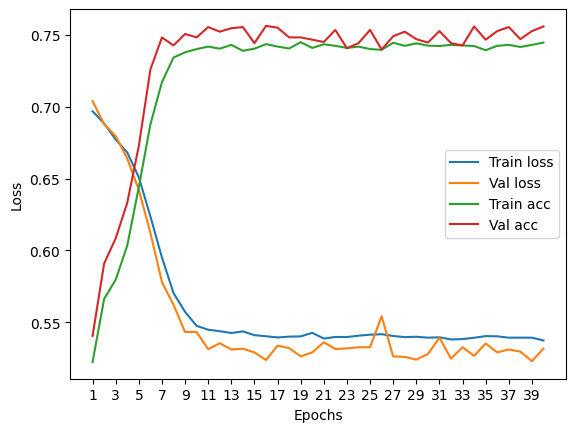

****************************************************************************************************



118it [00:00, 194.65it/s]


Train Epoch: 0 	Loss: 0.694937, Accuracy: 3970/7500 (53%)
Val Epoch: 0 	Loss: 0.703383, Accuracy: 1366/2500 (55%)



118it [00:00, 201.74it/s]


Train Epoch: 1 	Loss: 0.681804, Accuracy: 4321/7500 (58%)
Val Epoch: 1 	Loss: 0.686882, Accuracy: 1495/2500 (60%)



118it [00:00, 195.60it/s]


Train Epoch: 2 	Loss: 0.668424, Accuracy: 4496/7500 (60%)
Val Epoch: 2 	Loss: 0.673035, Accuracy: 1522/2500 (61%)



118it [00:00, 195.85it/s]


Train Epoch: 3 	Loss: 0.650378, Accuracy: 4731/7500 (63%)
Val Epoch: 3 	Loss: 0.653216, Accuracy: 1603/2500 (64%)



118it [00:00, 190.58it/s]


Train Epoch: 4 	Loss: 0.622884, Accuracy: 5072/7500 (68%)
Val Epoch: 4 	Loss: 0.611732, Accuracy: 1739/2500 (70%)



118it [00:00, 193.33it/s]


Train Epoch: 5 	Loss: 0.592140, Accuracy: 5275/7500 (70%)
Val Epoch: 5 	Loss: 0.591651, Accuracy: 1827/2500 (73%)



118it [00:00, 197.87it/s]


Train Epoch: 6 	Loss: 0.567849, Accuracy: 5426/7500 (72%)
Val Epoch: 6 	Loss: 0.569992, Accuracy: 1812/2500 (72%)



118it [00:00, 197.04it/s]


Train Epoch: 7 	Loss: 0.558152, Accuracy: 5434/7500 (72%)
Val Epoch: 7 	Loss: 0.561792, Accuracy: 1834/2500 (73%)



118it [00:00, 200.09it/s]


Train Epoch: 8 	Loss: 0.551633, Accuracy: 5463/7500 (73%)
Val Epoch: 8 	Loss: 0.562544, Accuracy: 1821/2500 (73%)



118it [00:00, 198.09it/s]


Train Epoch: 9 	Loss: 0.549932, Accuracy: 5483/7500 (73%)
Val Epoch: 9 	Loss: 0.554449, Accuracy: 1832/2500 (73%)



118it [00:00, 200.03it/s]


Train Epoch: 10 	Loss: 0.547911, Accuracy: 5473/7500 (73%)
Val Epoch: 10 	Loss: 0.554460, Accuracy: 1843/2500 (74%)



118it [00:00, 189.09it/s]


Train Epoch: 11 	Loss: 0.545452, Accuracy: 5498/7500 (73%)
Val Epoch: 11 	Loss: 0.546455, Accuracy: 1849/2500 (74%)



118it [00:00, 198.56it/s]


Train Epoch: 12 	Loss: 0.545373, Accuracy: 5484/7500 (73%)
Val Epoch: 12 	Loss: 0.549606, Accuracy: 1847/2500 (74%)



118it [00:00, 195.21it/s]


Train Epoch: 13 	Loss: 0.545359, Accuracy: 5510/7500 (73%)
Val Epoch: 13 	Loss: 0.547119, Accuracy: 1843/2500 (74%)



118it [00:00, 196.30it/s]


Train Epoch: 14 	Loss: 0.544277, Accuracy: 5511/7500 (73%)
Val Epoch: 14 	Loss: 0.559247, Accuracy: 1840/2500 (74%)



118it [00:00, 169.34it/s]


Train Epoch: 15 	Loss: 0.546088, Accuracy: 5464/7500 (73%)
Val Epoch: 15 	Loss: 0.548905, Accuracy: 1856/2500 (74%)



118it [00:00, 138.89it/s]


Train Epoch: 16 	Loss: 0.545359, Accuracy: 5486/7500 (73%)
Val Epoch: 16 	Loss: 0.557302, Accuracy: 1852/2500 (74%)



118it [00:00, 146.21it/s]


Train Epoch: 17 	Loss: 0.546043, Accuracy: 5494/7500 (73%)
Val Epoch: 17 	Loss: 0.545777, Accuracy: 1852/2500 (74%)



118it [00:00, 187.80it/s]


Train Epoch: 18 	Loss: 0.544962, Accuracy: 5478/7500 (73%)
Val Epoch: 18 	Loss: 0.547368, Accuracy: 1843/2500 (74%)



118it [00:00, 199.73it/s]


Train Epoch: 19 	Loss: 0.543830, Accuracy: 5495/7500 (73%)
Val Epoch: 19 	Loss: 0.556139, Accuracy: 1843/2500 (74%)



118it [00:00, 198.54it/s]


Train Epoch: 20 	Loss: 0.544701, Accuracy: 5510/7500 (73%)
Val Epoch: 20 	Loss: 0.539492, Accuracy: 1843/2500 (74%)



118it [00:00, 161.82it/s]


Train Epoch: 21 	Loss: 0.541518, Accuracy: 5524/7500 (74%)
Val Epoch: 21 	Loss: 0.547646, Accuracy: 1852/2500 (74%)



118it [00:00, 189.44it/s]


Train Epoch: 22 	Loss: 0.545673, Accuracy: 5489/7500 (73%)
Val Epoch: 22 	Loss: 0.544615, Accuracy: 1843/2500 (74%)



118it [00:00, 197.88it/s]


Train Epoch: 23 	Loss: 0.544955, Accuracy: 5515/7500 (74%)
Val Epoch: 23 	Loss: 0.550441, Accuracy: 1861/2500 (74%)



118it [00:00, 192.62it/s]


Train Epoch: 24 	Loss: 0.544549, Accuracy: 5478/7500 (73%)
Val Epoch: 24 	Loss: 0.546803, Accuracy: 1858/2500 (74%)



118it [00:00, 194.48it/s]


Train Epoch: 25 	Loss: 0.547695, Accuracy: 5492/7500 (73%)
Val Epoch: 25 	Loss: 0.544740, Accuracy: 1844/2500 (74%)



118it [00:00, 195.19it/s]


Train Epoch: 26 	Loss: 0.543809, Accuracy: 5508/7500 (73%)
Val Epoch: 26 	Loss: 0.541292, Accuracy: 1848/2500 (74%)



118it [00:00, 192.98it/s]


Train Epoch: 27 	Loss: 0.542251, Accuracy: 5518/7500 (74%)
Val Epoch: 27 	Loss: 0.554108, Accuracy: 1839/2500 (74%)



118it [00:00, 191.59it/s]


Train Epoch: 28 	Loss: 0.545124, Accuracy: 5507/7500 (73%)
Val Epoch: 28 	Loss: 0.548038, Accuracy: 1845/2500 (74%)



118it [00:00, 160.46it/s]


Train Epoch: 29 	Loss: 0.544784, Accuracy: 5473/7500 (73%)
Val Epoch: 29 	Loss: 0.541675, Accuracy: 1846/2500 (74%)



118it [00:00, 171.43it/s]


Train Epoch: 30 	Loss: 0.543493, Accuracy: 5497/7500 (73%)
Val Epoch: 30 	Loss: 0.557770, Accuracy: 1854/2500 (74%)



118it [00:00, 187.81it/s]


Train Epoch: 31 	Loss: 0.544922, Accuracy: 5522/7500 (74%)
Val Epoch: 31 	Loss: 0.558150, Accuracy: 1860/2500 (74%)



118it [00:00, 195.77it/s]


Train Epoch: 32 	Loss: 0.544815, Accuracy: 5509/7500 (73%)
Val Epoch: 32 	Loss: 0.556179, Accuracy: 1853/2500 (74%)



118it [00:00, 196.27it/s]


Train Epoch: 33 	Loss: 0.548396, Accuracy: 5508/7500 (73%)
Val Epoch: 33 	Loss: 0.550575, Accuracy: 1854/2500 (74%)



118it [00:00, 171.02it/s]


Train Epoch: 34 	Loss: 0.544338, Accuracy: 5507/7500 (73%)
Val Epoch: 34 	Loss: 0.558897, Accuracy: 1861/2500 (74%)



118it [00:00, 145.30it/s]


Train Epoch: 35 	Loss: 0.543161, Accuracy: 5512/7500 (73%)
Val Epoch: 35 	Loss: 0.574664, Accuracy: 1789/2500 (72%)



118it [00:00, 165.98it/s]


Train Epoch: 36 	Loss: 0.545271, Accuracy: 5484/7500 (73%)
Val Epoch: 36 	Loss: 0.548749, Accuracy: 1853/2500 (74%)



118it [00:00, 171.74it/s]


Train Epoch: 37 	Loss: 0.544580, Accuracy: 5518/7500 (74%)
Val Epoch: 37 	Loss: 0.556491, Accuracy: 1862/2500 (74%)



118it [00:00, 185.39it/s]


Train Epoch: 38 	Loss: 0.543259, Accuracy: 5472/7500 (73%)
Val Epoch: 38 	Loss: 0.565905, Accuracy: 1832/2500 (73%)



118it [00:00, 190.35it/s]


Train Epoch: 39 	Loss: 0.545734, Accuracy: 5512/7500 (73%)
Val Epoch: 39 	Loss: 0.557967, Accuracy: 1835/2500 (73%)

Test accuracy:  73.64


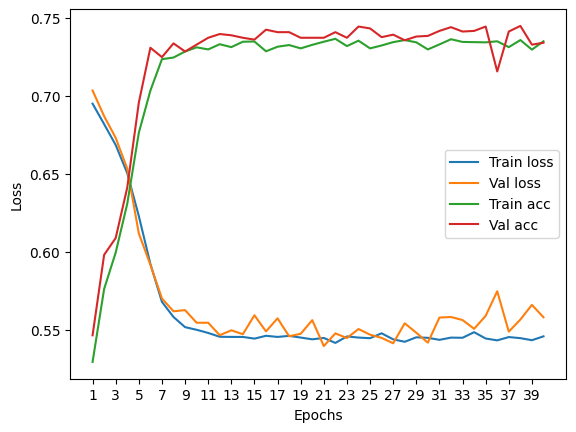

****************************************************************************************************



118it [00:00, 172.74it/s]


Train Epoch: 0 	Loss: 0.698370, Accuracy: 3755/7500 (50%)
Val Epoch: 0 	Loss: 0.708412, Accuracy: 1307/2500 (52%)



118it [00:00, 163.78it/s]


Train Epoch: 1 	Loss: 0.693293, Accuracy: 4044/7500 (54%)
Val Epoch: 1 	Loss: 0.698731, Accuracy: 1498/2500 (60%)



118it [00:00, 195.63it/s]


Train Epoch: 2 	Loss: 0.673167, Accuracy: 4615/7500 (62%)
Val Epoch: 2 	Loss: 0.667687, Accuracy: 1669/2500 (67%)



118it [00:00, 195.51it/s]


Train Epoch: 3 	Loss: 0.634611, Accuracy: 5116/7500 (68%)
Val Epoch: 3 	Loss: 0.623484, Accuracy: 1788/2500 (72%)



118it [00:00, 193.99it/s]


Train Epoch: 4 	Loss: 0.596591, Accuracy: 5344/7500 (71%)
Val Epoch: 4 	Loss: 0.592772, Accuracy: 1811/2500 (72%)



118it [00:00, 194.03it/s]


Train Epoch: 5 	Loss: 0.571558, Accuracy: 5442/7500 (73%)
Val Epoch: 5 	Loss: 0.583712, Accuracy: 1828/2500 (73%)



118it [00:00, 196.07it/s]


Train Epoch: 6 	Loss: 0.561135, Accuracy: 5467/7500 (73%)
Val Epoch: 6 	Loss: 0.571532, Accuracy: 1814/2500 (73%)



118it [00:00, 194.51it/s]


Train Epoch: 7 	Loss: 0.555337, Accuracy: 5502/7500 (73%)
Val Epoch: 7 	Loss: 0.561195, Accuracy: 1830/2500 (73%)



118it [00:00, 196.99it/s]


Train Epoch: 8 	Loss: 0.552447, Accuracy: 5496/7500 (73%)
Val Epoch: 8 	Loss: 0.577224, Accuracy: 1828/2500 (73%)



118it [00:00, 193.33it/s]


Train Epoch: 9 	Loss: 0.549639, Accuracy: 5518/7500 (74%)
Val Epoch: 9 	Loss: 0.562500, Accuracy: 1839/2500 (74%)



118it [00:00, 191.98it/s]


Train Epoch: 10 	Loss: 0.548812, Accuracy: 5491/7500 (73%)
Val Epoch: 10 	Loss: 0.559068, Accuracy: 1841/2500 (74%)



118it [00:00, 191.12it/s]


Train Epoch: 11 	Loss: 0.549328, Accuracy: 5521/7500 (74%)
Val Epoch: 11 	Loss: 0.569358, Accuracy: 1809/2500 (72%)



118it [00:00, 192.90it/s]


Train Epoch: 12 	Loss: 0.549351, Accuracy: 5513/7500 (74%)
Val Epoch: 12 	Loss: 0.567312, Accuracy: 1818/2500 (73%)



118it [00:00, 195.32it/s]


Train Epoch: 13 	Loss: 0.548278, Accuracy: 5502/7500 (73%)
Val Epoch: 13 	Loss: 0.559230, Accuracy: 1829/2500 (73%)



118it [00:00, 189.26it/s]


Train Epoch: 14 	Loss: 0.546615, Accuracy: 5525/7500 (74%)
Val Epoch: 14 	Loss: 0.559692, Accuracy: 1843/2500 (74%)



118it [00:00, 185.89it/s]


Train Epoch: 15 	Loss: 0.547070, Accuracy: 5493/7500 (73%)
Val Epoch: 15 	Loss: 0.561904, Accuracy: 1824/2500 (73%)



118it [00:00, 177.74it/s]


Train Epoch: 16 	Loss: 0.549221, Accuracy: 5522/7500 (74%)
Val Epoch: 16 	Loss: 0.566359, Accuracy: 1830/2500 (73%)



118it [00:00, 201.75it/s]


Train Epoch: 17 	Loss: 0.545813, Accuracy: 5522/7500 (74%)
Val Epoch: 17 	Loss: 0.567861, Accuracy: 1829/2500 (73%)



118it [00:00, 181.75it/s]


Train Epoch: 18 	Loss: 0.547677, Accuracy: 5494/7500 (73%)
Val Epoch: 18 	Loss: 0.559291, Accuracy: 1830/2500 (73%)



118it [00:00, 148.44it/s]


Train Epoch: 19 	Loss: 0.547075, Accuracy: 5513/7500 (74%)
Val Epoch: 19 	Loss: 0.564526, Accuracy: 1833/2500 (73%)



118it [00:00, 163.11it/s]


Train Epoch: 20 	Loss: 0.546902, Accuracy: 5534/7500 (74%)
Val Epoch: 20 	Loss: 0.564570, Accuracy: 1832/2500 (73%)



118it [00:00, 162.86it/s]


Train Epoch: 21 	Loss: 0.548001, Accuracy: 5519/7500 (74%)
Val Epoch: 21 	Loss: 0.553790, Accuracy: 1846/2500 (74%)



118it [00:00, 176.11it/s]


Train Epoch: 22 	Loss: 0.546148, Accuracy: 5538/7500 (74%)
Val Epoch: 22 	Loss: 0.559833, Accuracy: 1838/2500 (74%)



118it [00:00, 183.68it/s]


Train Epoch: 23 	Loss: 0.547621, Accuracy: 5527/7500 (74%)
Val Epoch: 23 	Loss: 0.563386, Accuracy: 1830/2500 (73%)



118it [00:00, 191.67it/s]


Train Epoch: 24 	Loss: 0.546340, Accuracy: 5544/7500 (74%)
Val Epoch: 24 	Loss: 0.572150, Accuracy: 1835/2500 (73%)



118it [00:00, 184.07it/s]


Train Epoch: 25 	Loss: 0.549478, Accuracy: 5525/7500 (74%)
Val Epoch: 25 	Loss: 0.565992, Accuracy: 1832/2500 (73%)



118it [00:00, 195.57it/s]


Train Epoch: 26 	Loss: 0.544656, Accuracy: 5517/7500 (74%)
Val Epoch: 26 	Loss: 0.563311, Accuracy: 1821/2500 (73%)



118it [00:00, 185.27it/s]


Train Epoch: 27 	Loss: 0.545288, Accuracy: 5535/7500 (74%)
Val Epoch: 27 	Loss: 0.560521, Accuracy: 1833/2500 (73%)



118it [00:00, 168.78it/s]


Train Epoch: 28 	Loss: 0.545478, Accuracy: 5520/7500 (74%)
Val Epoch: 28 	Loss: 0.559137, Accuracy: 1841/2500 (74%)



118it [00:00, 180.14it/s]


Train Epoch: 29 	Loss: 0.545769, Accuracy: 5494/7500 (73%)
Val Epoch: 29 	Loss: 0.561250, Accuracy: 1836/2500 (73%)



118it [00:00, 158.63it/s]


Train Epoch: 30 	Loss: 0.546840, Accuracy: 5514/7500 (74%)
Val Epoch: 30 	Loss: 0.570998, Accuracy: 1813/2500 (73%)



118it [00:00, 184.14it/s]


Train Epoch: 31 	Loss: 0.546858, Accuracy: 5512/7500 (73%)
Val Epoch: 31 	Loss: 0.556553, Accuracy: 1832/2500 (73%)



118it [00:00, 185.23it/s]


Train Epoch: 32 	Loss: 0.547403, Accuracy: 5505/7500 (73%)
Val Epoch: 32 	Loss: 0.577728, Accuracy: 1836/2500 (73%)



118it [00:00, 198.04it/s]


Train Epoch: 33 	Loss: 0.544764, Accuracy: 5533/7500 (74%)
Val Epoch: 33 	Loss: 0.561609, Accuracy: 1839/2500 (74%)



118it [00:00, 193.70it/s]


Train Epoch: 34 	Loss: 0.544721, Accuracy: 5521/7500 (74%)
Val Epoch: 34 	Loss: 0.564971, Accuracy: 1820/2500 (73%)



118it [00:00, 195.36it/s]


Train Epoch: 35 	Loss: 0.545941, Accuracy: 5557/7500 (74%)
Val Epoch: 35 	Loss: 0.589311, Accuracy: 1792/2500 (72%)



118it [00:00, 195.04it/s]


Train Epoch: 36 	Loss: 0.548060, Accuracy: 5480/7500 (73%)
Val Epoch: 36 	Loss: 0.560464, Accuracy: 1830/2500 (73%)



118it [00:00, 172.39it/s]


Train Epoch: 37 	Loss: 0.548719, Accuracy: 5508/7500 (73%)
Val Epoch: 37 	Loss: 0.558459, Accuracy: 1836/2500 (73%)



118it [00:00, 152.80it/s]


Train Epoch: 38 	Loss: 0.545356, Accuracy: 5560/7500 (74%)
Val Epoch: 38 	Loss: 0.555696, Accuracy: 1839/2500 (74%)



118it [00:00, 150.46it/s]


Train Epoch: 39 	Loss: 0.548539, Accuracy: 5505/7500 (73%)
Val Epoch: 39 	Loss: 0.566098, Accuracy: 1843/2500 (74%)

Test accuracy:  74.56


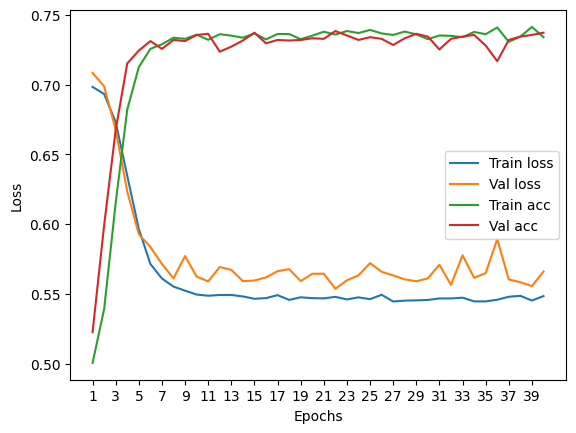

****************************************************************************************************



118it [00:00, 199.47it/s]


Train Epoch: 0 	Loss: 0.695222, Accuracy: 4005/7500 (53%)
Val Epoch: 0 	Loss: 0.703054, Accuracy: 1360/2500 (54%)



118it [00:00, 191.44it/s]


Train Epoch: 1 	Loss: 0.685359, Accuracy: 4279/7500 (57%)
Val Epoch: 1 	Loss: 0.686675, Accuracy: 1490/2500 (60%)



118it [00:00, 164.03it/s]


Train Epoch: 2 	Loss: 0.672717, Accuracy: 4461/7500 (59%)
Val Epoch: 2 	Loss: 0.673372, Accuracy: 1509/2500 (60%)



118it [00:00, 159.09it/s]


Train Epoch: 3 	Loss: 0.644733, Accuracy: 4890/7500 (65%)
Val Epoch: 3 	Loss: 0.632808, Accuracy: 1724/2500 (69%)



118it [00:00, 150.33it/s]


Train Epoch: 4 	Loss: 0.612564, Accuracy: 5221/7500 (70%)
Val Epoch: 4 	Loss: 0.599359, Accuracy: 1800/2500 (72%)



118it [00:00, 178.81it/s]


Train Epoch: 5 	Loss: 0.583912, Accuracy: 5340/7500 (71%)
Val Epoch: 5 	Loss: 0.588367, Accuracy: 1787/2500 (71%)



118it [00:00, 195.83it/s]


Train Epoch: 6 	Loss: 0.570198, Accuracy: 5407/7500 (72%)
Val Epoch: 6 	Loss: 0.567814, Accuracy: 1828/2500 (73%)



118it [00:00, 194.43it/s]


Train Epoch: 7 	Loss: 0.561433, Accuracy: 5461/7500 (73%)
Val Epoch: 7 	Loss: 0.557499, Accuracy: 1834/2500 (73%)



118it [00:00, 193.61it/s]


Train Epoch: 8 	Loss: 0.556610, Accuracy: 5471/7500 (73%)
Val Epoch: 8 	Loss: 0.558629, Accuracy: 1836/2500 (73%)



118it [00:00, 191.37it/s]


Train Epoch: 9 	Loss: 0.553388, Accuracy: 5500/7500 (73%)
Val Epoch: 9 	Loss: 0.553265, Accuracy: 1836/2500 (73%)



118it [00:00, 197.40it/s]


Train Epoch: 10 	Loss: 0.551264, Accuracy: 5487/7500 (73%)
Val Epoch: 10 	Loss: 0.557529, Accuracy: 1831/2500 (73%)



118it [00:00, 193.13it/s]


Train Epoch: 11 	Loss: 0.548293, Accuracy: 5505/7500 (73%)
Val Epoch: 11 	Loss: 0.557442, Accuracy: 1837/2500 (73%)



118it [00:00, 194.41it/s]


Train Epoch: 12 	Loss: 0.553211, Accuracy: 5485/7500 (73%)
Val Epoch: 12 	Loss: 0.566818, Accuracy: 1835/2500 (73%)



118it [00:00, 186.57it/s]


Train Epoch: 13 	Loss: 0.548430, Accuracy: 5521/7500 (74%)
Val Epoch: 13 	Loss: 0.549550, Accuracy: 1844/2500 (74%)



118it [00:00, 184.67it/s]


Train Epoch: 14 	Loss: 0.548282, Accuracy: 5519/7500 (74%)
Val Epoch: 14 	Loss: 0.563543, Accuracy: 1825/2500 (73%)



118it [00:00, 201.50it/s]


Train Epoch: 15 	Loss: 0.549571, Accuracy: 5535/7500 (74%)
Val Epoch: 15 	Loss: 0.555764, Accuracy: 1836/2500 (73%)



118it [00:00, 196.18it/s]


Train Epoch: 16 	Loss: 0.548615, Accuracy: 5523/7500 (74%)
Val Epoch: 16 	Loss: 0.565768, Accuracy: 1832/2500 (73%)



118it [00:00, 194.76it/s]


Train Epoch: 17 	Loss: 0.546685, Accuracy: 5525/7500 (74%)
Val Epoch: 17 	Loss: 0.556230, Accuracy: 1852/2500 (74%)



118it [00:00, 181.39it/s]


Train Epoch: 18 	Loss: 0.548879, Accuracy: 5528/7500 (74%)
Val Epoch: 18 	Loss: 0.552362, Accuracy: 1831/2500 (73%)



118it [00:00, 200.28it/s]


Train Epoch: 19 	Loss: 0.546736, Accuracy: 5506/7500 (73%)
Val Epoch: 19 	Loss: 0.547351, Accuracy: 1853/2500 (74%)



118it [00:00, 195.46it/s]


Train Epoch: 20 	Loss: 0.548050, Accuracy: 5555/7500 (74%)
Val Epoch: 20 	Loss: 0.548022, Accuracy: 1838/2500 (74%)



118it [00:00, 198.34it/s]


Train Epoch: 21 	Loss: 0.547736, Accuracy: 5512/7500 (73%)
Val Epoch: 21 	Loss: 0.563194, Accuracy: 1825/2500 (73%)



118it [00:00, 155.84it/s]


Train Epoch: 22 	Loss: 0.546696, Accuracy: 5529/7500 (74%)
Val Epoch: 22 	Loss: 0.559401, Accuracy: 1855/2500 (74%)



118it [00:00, 166.47it/s]


Train Epoch: 23 	Loss: 0.547188, Accuracy: 5533/7500 (74%)
Val Epoch: 23 	Loss: 0.551247, Accuracy: 1835/2500 (73%)



118it [00:00, 163.32it/s]


Train Epoch: 24 	Loss: 0.546868, Accuracy: 5521/7500 (74%)
Val Epoch: 24 	Loss: 0.564923, Accuracy: 1816/2500 (73%)



118it [00:00, 192.90it/s]


Train Epoch: 25 	Loss: 0.548277, Accuracy: 5497/7500 (73%)
Val Epoch: 25 	Loss: 0.558055, Accuracy: 1845/2500 (74%)



118it [00:00, 194.67it/s]


Train Epoch: 26 	Loss: 0.545671, Accuracy: 5528/7500 (74%)
Val Epoch: 26 	Loss: 0.556007, Accuracy: 1829/2500 (73%)



118it [00:00, 193.03it/s]


Train Epoch: 27 	Loss: 0.547641, Accuracy: 5509/7500 (73%)
Val Epoch: 27 	Loss: 0.563359, Accuracy: 1838/2500 (74%)



118it [00:00, 194.63it/s]


Train Epoch: 28 	Loss: 0.545386, Accuracy: 5545/7500 (74%)
Val Epoch: 28 	Loss: 0.551663, Accuracy: 1838/2500 (74%)



118it [00:00, 194.65it/s]


Train Epoch: 29 	Loss: 0.546269, Accuracy: 5558/7500 (74%)
Val Epoch: 29 	Loss: 0.557575, Accuracy: 1849/2500 (74%)



118it [00:00, 156.92it/s]


Train Epoch: 30 	Loss: 0.550206, Accuracy: 5522/7500 (74%)
Val Epoch: 30 	Loss: 0.556162, Accuracy: 1851/2500 (74%)



118it [00:00, 168.15it/s]


Train Epoch: 31 	Loss: 0.547255, Accuracy: 5532/7500 (74%)
Val Epoch: 31 	Loss: 0.545631, Accuracy: 1842/2500 (74%)



118it [00:00, 178.95it/s]


Train Epoch: 32 	Loss: 0.545158, Accuracy: 5528/7500 (74%)
Val Epoch: 32 	Loss: 0.555445, Accuracy: 1828/2500 (73%)



118it [00:00, 188.70it/s]


Train Epoch: 33 	Loss: 0.545888, Accuracy: 5530/7500 (74%)
Val Epoch: 33 	Loss: 0.548591, Accuracy: 1845/2500 (74%)



118it [00:00, 196.10it/s]


Train Epoch: 34 	Loss: 0.546173, Accuracy: 5522/7500 (74%)
Val Epoch: 34 	Loss: 0.554221, Accuracy: 1842/2500 (74%)



118it [00:00, 197.55it/s]


Train Epoch: 35 	Loss: 0.545798, Accuracy: 5534/7500 (74%)
Val Epoch: 35 	Loss: 0.549215, Accuracy: 1850/2500 (74%)



118it [00:00, 196.41it/s]


Train Epoch: 36 	Loss: 0.547526, Accuracy: 5513/7500 (74%)
Val Epoch: 36 	Loss: 0.545181, Accuracy: 1849/2500 (74%)



118it [00:00, 195.80it/s]


Train Epoch: 37 	Loss: 0.546983, Accuracy: 5530/7500 (74%)
Val Epoch: 37 	Loss: 0.557842, Accuracy: 1848/2500 (74%)



118it [00:00, 189.48it/s]


Train Epoch: 38 	Loss: 0.545292, Accuracy: 5533/7500 (74%)
Val Epoch: 38 	Loss: 0.551575, Accuracy: 1832/2500 (73%)



118it [00:00, 199.26it/s]


Train Epoch: 39 	Loss: 0.547107, Accuracy: 5544/7500 (74%)
Val Epoch: 39 	Loss: 0.547770, Accuracy: 1851/2500 (74%)

Test accuracy:  73.36


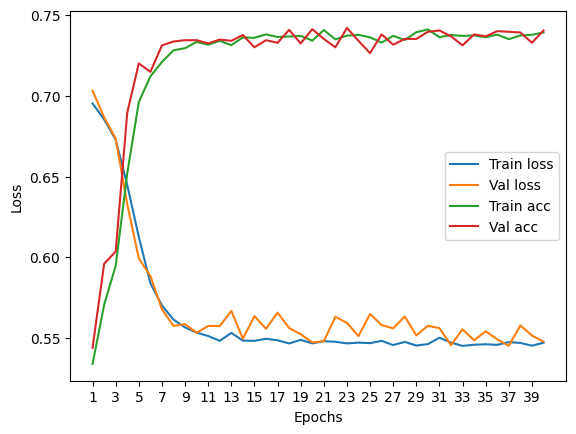

****************************************************************************************************



118it [00:00, 216.72it/s]


Train Epoch: 0 	Loss: 0.694829, Accuracy: 4006/7500 (53%)
Val Epoch: 0 	Loss: 0.703851, Accuracy: 1359/2500 (54%)



118it [00:00, 191.70it/s]


Train Epoch: 1 	Loss: 0.685724, Accuracy: 4228/7500 (56%)
Val Epoch: 1 	Loss: 0.702435, Accuracy: 1416/2500 (57%)



118it [00:00, 201.07it/s]


Train Epoch: 2 	Loss: 0.680288, Accuracy: 4341/7500 (58%)
Val Epoch: 2 	Loss: 0.691870, Accuracy: 1430/2500 (57%)



118it [00:00, 197.17it/s]


Train Epoch: 3 	Loss: 0.672559, Accuracy: 4480/7500 (60%)
Val Epoch: 3 	Loss: 0.689955, Accuracy: 1463/2500 (59%)



118it [00:00, 190.70it/s]


Train Epoch: 4 	Loss: 0.663899, Accuracy: 4586/7500 (61%)
Val Epoch: 4 	Loss: 0.677478, Accuracy: 1523/2500 (61%)



118it [00:00, 153.28it/s]


Train Epoch: 5 	Loss: 0.648156, Accuracy: 4792/7500 (64%)
Val Epoch: 5 	Loss: 0.661713, Accuracy: 1569/2500 (63%)



118it [00:00, 158.48it/s]


Train Epoch: 6 	Loss: 0.628944, Accuracy: 5010/7500 (67%)
Val Epoch: 6 	Loss: 0.641995, Accuracy: 1639/2500 (66%)



118it [00:00, 151.15it/s]


Train Epoch: 7 	Loss: 0.608132, Accuracy: 5191/7500 (69%)
Val Epoch: 7 	Loss: 0.613983, Accuracy: 1785/2500 (71%)



118it [00:00, 186.19it/s]


Train Epoch: 8 	Loss: 0.582232, Accuracy: 5386/7500 (72%)
Val Epoch: 8 	Loss: 0.582289, Accuracy: 1799/2500 (72%)



118it [00:00, 197.69it/s]


Train Epoch: 9 	Loss: 0.566927, Accuracy: 5445/7500 (73%)
Val Epoch: 9 	Loss: 0.580943, Accuracy: 1804/2500 (72%)



118it [00:00, 180.23it/s]


Train Epoch: 10 	Loss: 0.558903, Accuracy: 5501/7500 (73%)
Val Epoch: 10 	Loss: 0.568649, Accuracy: 1834/2500 (73%)



118it [00:00, 177.47it/s]


Train Epoch: 11 	Loss: 0.553744, Accuracy: 5517/7500 (74%)
Val Epoch: 11 	Loss: 0.574521, Accuracy: 1819/2500 (73%)



118it [00:00, 192.10it/s]


Train Epoch: 12 	Loss: 0.552392, Accuracy: 5479/7500 (73%)
Val Epoch: 12 	Loss: 0.570078, Accuracy: 1828/2500 (73%)



118it [00:00, 198.95it/s]


Train Epoch: 13 	Loss: 0.550362, Accuracy: 5509/7500 (73%)
Val Epoch: 13 	Loss: 0.571489, Accuracy: 1824/2500 (73%)



118it [00:00, 188.35it/s]


Train Epoch: 14 	Loss: 0.554857, Accuracy: 5478/7500 (73%)
Val Epoch: 14 	Loss: 0.570316, Accuracy: 1835/2500 (73%)



118it [00:00, 194.02it/s]


Train Epoch: 15 	Loss: 0.551828, Accuracy: 5501/7500 (73%)
Val Epoch: 15 	Loss: 0.565091, Accuracy: 1810/2500 (72%)



118it [00:00, 195.67it/s]


Train Epoch: 16 	Loss: 0.552474, Accuracy: 5507/7500 (73%)
Val Epoch: 16 	Loss: 0.564189, Accuracy: 1822/2500 (73%)



118it [00:00, 193.37it/s]


Train Epoch: 17 	Loss: 0.551031, Accuracy: 5532/7500 (74%)
Val Epoch: 17 	Loss: 0.556229, Accuracy: 1825/2500 (73%)



118it [00:00, 189.84it/s]


Train Epoch: 18 	Loss: 0.554148, Accuracy: 5538/7500 (74%)
Val Epoch: 18 	Loss: 0.562929, Accuracy: 1834/2500 (73%)



118it [00:00, 194.01it/s]


Train Epoch: 19 	Loss: 0.551240, Accuracy: 5504/7500 (73%)
Val Epoch: 19 	Loss: 0.567677, Accuracy: 1835/2500 (73%)



118it [00:00, 179.39it/s]


Train Epoch: 20 	Loss: 0.547931, Accuracy: 5541/7500 (74%)
Val Epoch: 20 	Loss: 0.562824, Accuracy: 1820/2500 (73%)



118it [00:00, 195.32it/s]


Train Epoch: 21 	Loss: 0.553342, Accuracy: 5535/7500 (74%)
Val Epoch: 21 	Loss: 0.572390, Accuracy: 1823/2500 (73%)



118it [00:00, 202.29it/s]


Train Epoch: 22 	Loss: 0.553017, Accuracy: 5503/7500 (73%)
Val Epoch: 22 	Loss: 0.552241, Accuracy: 1842/2500 (74%)



118it [00:00, 199.64it/s]


Train Epoch: 23 	Loss: 0.551192, Accuracy: 5522/7500 (74%)
Val Epoch: 23 	Loss: 0.562514, Accuracy: 1832/2500 (73%)



118it [00:00, 144.04it/s]


Train Epoch: 24 	Loss: 0.550546, Accuracy: 5509/7500 (73%)
Val Epoch: 24 	Loss: 0.559558, Accuracy: 1838/2500 (74%)



118it [00:00, 143.73it/s]


Train Epoch: 25 	Loss: 0.549244, Accuracy: 5521/7500 (74%)
Val Epoch: 25 	Loss: 0.557773, Accuracy: 1829/2500 (73%)



118it [00:00, 158.85it/s]


Train Epoch: 26 	Loss: 0.550703, Accuracy: 5531/7500 (74%)
Val Epoch: 26 	Loss: 0.554125, Accuracy: 1834/2500 (73%)



118it [00:00, 141.34it/s]


Train Epoch: 27 	Loss: 0.550750, Accuracy: 5519/7500 (74%)
Val Epoch: 27 	Loss: 0.557285, Accuracy: 1816/2500 (73%)



118it [00:00, 175.12it/s]


Train Epoch: 28 	Loss: 0.547887, Accuracy: 5522/7500 (74%)
Val Epoch: 28 	Loss: 0.556071, Accuracy: 1827/2500 (73%)



118it [00:00, 194.82it/s]


Train Epoch: 29 	Loss: 0.548545, Accuracy: 5534/7500 (74%)
Val Epoch: 29 	Loss: 0.565225, Accuracy: 1827/2500 (73%)



118it [00:00, 193.67it/s]


Train Epoch: 30 	Loss: 0.551168, Accuracy: 5524/7500 (74%)
Val Epoch: 30 	Loss: 0.561789, Accuracy: 1827/2500 (73%)



118it [00:00, 194.89it/s]


Train Epoch: 31 	Loss: 0.550296, Accuracy: 5530/7500 (74%)
Val Epoch: 31 	Loss: 0.551427, Accuracy: 1821/2500 (73%)



118it [00:00, 194.31it/s]


Train Epoch: 32 	Loss: 0.550458, Accuracy: 5505/7500 (73%)
Val Epoch: 32 	Loss: 0.567271, Accuracy: 1834/2500 (73%)



118it [00:00, 193.05it/s]


Train Epoch: 33 	Loss: 0.551135, Accuracy: 5527/7500 (74%)
Val Epoch: 33 	Loss: 0.552394, Accuracy: 1828/2500 (73%)



118it [00:00, 194.41it/s]


Train Epoch: 34 	Loss: 0.549191, Accuracy: 5507/7500 (73%)
Val Epoch: 34 	Loss: 0.557029, Accuracy: 1840/2500 (74%)



118it [00:00, 193.90it/s]


Train Epoch: 35 	Loss: 0.547759, Accuracy: 5556/7500 (74%)
Val Epoch: 35 	Loss: 0.556174, Accuracy: 1822/2500 (73%)



118it [00:00, 195.88it/s]


Train Epoch: 36 	Loss: 0.549400, Accuracy: 5528/7500 (74%)
Val Epoch: 36 	Loss: 0.558037, Accuracy: 1828/2500 (73%)



118it [00:00, 195.16it/s]


Train Epoch: 37 	Loss: 0.549021, Accuracy: 5519/7500 (74%)
Val Epoch: 37 	Loss: 0.560139, Accuracy: 1824/2500 (73%)



118it [00:00, 189.45it/s]


Train Epoch: 38 	Loss: 0.550559, Accuracy: 5533/7500 (74%)
Val Epoch: 38 	Loss: 0.578859, Accuracy: 1819/2500 (73%)



118it [00:00, 196.57it/s]


Train Epoch: 39 	Loss: 0.549135, Accuracy: 5523/7500 (74%)
Val Epoch: 39 	Loss: 0.569285, Accuracy: 1825/2500 (73%)

Test accuracy:  74.76


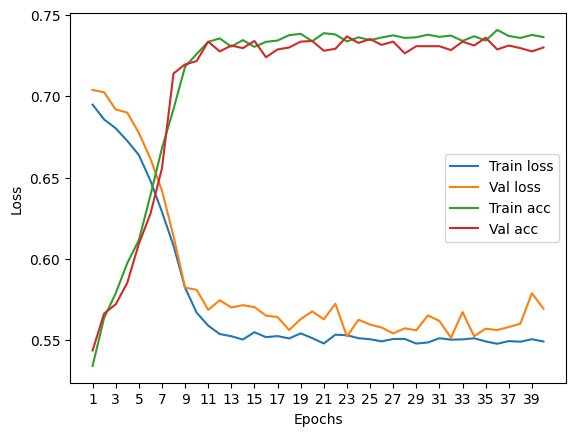

****************************************************************************************************



116it [00:00, 199.51it/s]


Train Epoch: 0 	Loss: 0.692620, Accuracy: 3862/7422 (52%)
Val Epoch: 0 	Loss: 0.693886, Accuracy: 1428/2474 (58%)



116it [00:00, 192.71it/s]


Train Epoch: 1 	Loss: 0.683173, Accuracy: 4243/7422 (57%)
Val Epoch: 1 	Loss: 0.680168, Accuracy: 1474/2474 (60%)



116it [00:00, 187.16it/s]


Train Epoch: 2 	Loss: 0.670591, Accuracy: 4385/7422 (59%)
Val Epoch: 2 	Loss: 0.665991, Accuracy: 1524/2474 (62%)



116it [00:00, 183.39it/s]


Train Epoch: 3 	Loss: 0.649015, Accuracy: 4670/7422 (63%)
Val Epoch: 3 	Loss: 0.647914, Accuracy: 1608/2474 (65%)



116it [00:00, 197.76it/s]


Train Epoch: 4 	Loss: 0.619773, Accuracy: 5052/7422 (68%)
Val Epoch: 4 	Loss: 0.607727, Accuracy: 1739/2474 (70%)



116it [00:00, 188.47it/s]


Train Epoch: 5 	Loss: 0.589393, Accuracy: 5293/7422 (71%)
Val Epoch: 5 	Loss: 0.606193, Accuracy: 1700/2474 (69%)



116it [00:00, 197.41it/s]


Train Epoch: 6 	Loss: 0.569490, Accuracy: 5398/7422 (73%)
Val Epoch: 6 	Loss: 0.567269, Accuracy: 1825/2474 (74%)



116it [00:00, 193.03it/s]


Train Epoch: 7 	Loss: 0.554230, Accuracy: 5442/7422 (73%)
Val Epoch: 7 	Loss: 0.556614, Accuracy: 1828/2474 (74%)



116it [00:00, 193.10it/s]


Train Epoch: 8 	Loss: 0.547525, Accuracy: 5480/7422 (74%)
Val Epoch: 8 	Loss: 0.569492, Accuracy: 1787/2474 (72%)



116it [00:00, 154.99it/s]


Train Epoch: 9 	Loss: 0.544676, Accuracy: 5485/7422 (74%)
Val Epoch: 9 	Loss: 0.554952, Accuracy: 1817/2474 (73%)



116it [00:00, 147.44it/s]


Train Epoch: 10 	Loss: 0.541546, Accuracy: 5478/7422 (74%)
Val Epoch: 10 	Loss: 0.550404, Accuracy: 1823/2474 (74%)



116it [00:00, 153.79it/s]


Train Epoch: 11 	Loss: 0.540393, Accuracy: 5508/7422 (74%)
Val Epoch: 11 	Loss: 0.548916, Accuracy: 1825/2474 (74%)



116it [00:00, 185.08it/s]


Train Epoch: 12 	Loss: 0.540713, Accuracy: 5512/7422 (74%)
Val Epoch: 12 	Loss: 0.553157, Accuracy: 1818/2474 (73%)



116it [00:00, 183.03it/s]


Train Epoch: 13 	Loss: 0.540573, Accuracy: 5498/7422 (74%)
Val Epoch: 13 	Loss: 0.546709, Accuracy: 1832/2474 (74%)



116it [00:00, 193.60it/s]


Train Epoch: 14 	Loss: 0.539515, Accuracy: 5507/7422 (74%)
Val Epoch: 14 	Loss: 0.547589, Accuracy: 1836/2474 (74%)



116it [00:00, 195.13it/s]


Train Epoch: 15 	Loss: 0.538953, Accuracy: 5492/7422 (74%)
Val Epoch: 15 	Loss: 0.546251, Accuracy: 1828/2474 (74%)



116it [00:00, 189.68it/s]


Train Epoch: 16 	Loss: 0.537795, Accuracy: 5527/7422 (74%)
Val Epoch: 16 	Loss: 0.551516, Accuracy: 1821/2474 (74%)



116it [00:00, 194.07it/s]


Train Epoch: 17 	Loss: 0.537271, Accuracy: 5514/7422 (74%)
Val Epoch: 17 	Loss: 0.546751, Accuracy: 1827/2474 (74%)



116it [00:00, 187.94it/s]


Train Epoch: 18 	Loss: 0.537835, Accuracy: 5494/7422 (74%)
Val Epoch: 18 	Loss: 0.548144, Accuracy: 1824/2474 (74%)



116it [00:00, 193.77it/s]


Train Epoch: 19 	Loss: 0.537736, Accuracy: 5505/7422 (74%)
Val Epoch: 19 	Loss: 0.552713, Accuracy: 1827/2474 (74%)



116it [00:00, 192.84it/s]


Train Epoch: 20 	Loss: 0.537512, Accuracy: 5515/7422 (74%)
Val Epoch: 20 	Loss: 0.553204, Accuracy: 1832/2474 (74%)



116it [00:00, 193.10it/s]


Train Epoch: 21 	Loss: 0.537550, Accuracy: 5499/7422 (74%)
Val Epoch: 21 	Loss: 0.548885, Accuracy: 1820/2474 (74%)



116it [00:00, 196.00it/s]


Train Epoch: 22 	Loss: 0.537180, Accuracy: 5502/7422 (74%)
Val Epoch: 22 	Loss: 0.548859, Accuracy: 1819/2474 (74%)



116it [00:00, 197.91it/s]


Train Epoch: 23 	Loss: 0.537293, Accuracy: 5500/7422 (74%)
Val Epoch: 23 	Loss: 0.548617, Accuracy: 1821/2474 (74%)



116it [00:00, 191.43it/s]


Train Epoch: 24 	Loss: 0.538509, Accuracy: 5501/7422 (74%)
Val Epoch: 24 	Loss: 0.547300, Accuracy: 1834/2474 (74%)



116it [00:00, 193.96it/s]


Train Epoch: 25 	Loss: 0.539340, Accuracy: 5517/7422 (74%)
Val Epoch: 25 	Loss: 0.547244, Accuracy: 1841/2474 (74%)



116it [00:00, 197.13it/s]


Train Epoch: 26 	Loss: 0.538574, Accuracy: 5500/7422 (74%)
Val Epoch: 26 	Loss: 0.547400, Accuracy: 1826/2474 (74%)



116it [00:00, 191.78it/s]


Train Epoch: 27 	Loss: 0.536975, Accuracy: 5522/7422 (74%)
Val Epoch: 27 	Loss: 0.554156, Accuracy: 1823/2474 (74%)



116it [00:00, 158.71it/s]


Train Epoch: 28 	Loss: 0.540111, Accuracy: 5495/7422 (74%)
Val Epoch: 28 	Loss: 0.547801, Accuracy: 1822/2474 (74%)



116it [00:00, 138.71it/s]


Train Epoch: 29 	Loss: 0.537817, Accuracy: 5523/7422 (74%)
Val Epoch: 29 	Loss: 0.546317, Accuracy: 1835/2474 (74%)



116it [00:00, 163.05it/s]


Train Epoch: 30 	Loss: 0.536723, Accuracy: 5510/7422 (74%)
Val Epoch: 30 	Loss: 0.547505, Accuracy: 1836/2474 (74%)



116it [00:00, 167.77it/s]


Train Epoch: 31 	Loss: 0.537806, Accuracy: 5519/7422 (74%)
Val Epoch: 31 	Loss: 0.545773, Accuracy: 1831/2474 (74%)



116it [00:00, 194.92it/s]


Train Epoch: 32 	Loss: 0.537792, Accuracy: 5497/7422 (74%)
Val Epoch: 32 	Loss: 0.550245, Accuracy: 1818/2474 (73%)



116it [00:00, 193.74it/s]


Train Epoch: 33 	Loss: 0.537072, Accuracy: 5532/7422 (75%)
Val Epoch: 33 	Loss: 0.548393, Accuracy: 1837/2474 (74%)



116it [00:00, 196.31it/s]


Train Epoch: 34 	Loss: 0.537326, Accuracy: 5522/7422 (74%)
Val Epoch: 34 	Loss: 0.545468, Accuracy: 1832/2474 (74%)



116it [00:00, 193.09it/s]


Train Epoch: 35 	Loss: 0.535996, Accuracy: 5532/7422 (75%)
Val Epoch: 35 	Loss: 0.557293, Accuracy: 1817/2474 (73%)



116it [00:00, 197.90it/s]


Train Epoch: 36 	Loss: 0.537140, Accuracy: 5527/7422 (74%)
Val Epoch: 36 	Loss: 0.545828, Accuracy: 1826/2474 (74%)



116it [00:00, 190.10it/s]


Train Epoch: 37 	Loss: 0.536519, Accuracy: 5533/7422 (75%)
Val Epoch: 37 	Loss: 0.549788, Accuracy: 1829/2474 (74%)



116it [00:00, 180.25it/s]


Train Epoch: 38 	Loss: 0.537103, Accuracy: 5529/7422 (74%)
Val Epoch: 38 	Loss: 0.549274, Accuracy: 1824/2474 (74%)



116it [00:00, 184.00it/s]


Train Epoch: 39 	Loss: 0.536485, Accuracy: 5521/7422 (74%)
Val Epoch: 39 	Loss: 0.554201, Accuracy: 1816/2474 (73%)

Test accuracy:  74.05012126111559


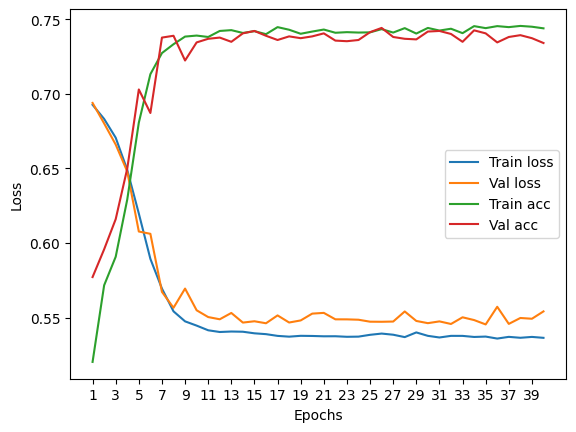

****************************************************************************************************



Particles per jet: 14


118it [00:00, 191.22it/s]


Train Epoch: 0 	Loss: 0.696981, Accuracy: 3890/7500 (52%)
Val Epoch: 0 	Loss: 0.705225, Accuracy: 1321/2500 (53%)



118it [00:00, 188.89it/s]


Train Epoch: 1 	Loss: 0.686729, Accuracy: 4271/7500 (57%)
Val Epoch: 1 	Loss: 0.688348, Accuracy: 1468/2500 (59%)



118it [00:00, 188.80it/s]


Train Epoch: 2 	Loss: 0.663974, Accuracy: 4660/7500 (62%)
Val Epoch: 2 	Loss: 0.670550, Accuracy: 1587/2500 (63%)



118it [00:00, 192.88it/s]


Train Epoch: 3 	Loss: 0.635795, Accuracy: 5027/7500 (67%)
Val Epoch: 3 	Loss: 0.626782, Accuracy: 1697/2500 (68%)



118it [00:00, 193.27it/s]


Train Epoch: 4 	Loss: 0.601582, Accuracy: 5312/7500 (71%)
Val Epoch: 4 	Loss: 0.611765, Accuracy: 1673/2500 (67%)



118it [00:00, 195.99it/s]


Train Epoch: 5 	Loss: 0.576497, Accuracy: 5420/7500 (72%)
Val Epoch: 5 	Loss: 0.585289, Accuracy: 1790/2500 (72%)



118it [00:00, 186.31it/s]


Train Epoch: 6 	Loss: 0.562628, Accuracy: 5486/7500 (73%)
Val Epoch: 6 	Loss: 0.566321, Accuracy: 1832/2500 (73%)



118it [00:00, 183.79it/s]


Train Epoch: 7 	Loss: 0.551457, Accuracy: 5552/7500 (74%)
Val Epoch: 7 	Loss: 0.566874, Accuracy: 1825/2500 (73%)



118it [00:00, 184.34it/s]


Train Epoch: 8 	Loss: 0.546502, Accuracy: 5501/7500 (73%)
Val Epoch: 8 	Loss: 0.561585, Accuracy: 1846/2500 (74%)



118it [00:00, 191.40it/s]


Train Epoch: 9 	Loss: 0.541921, Accuracy: 5559/7500 (74%)
Val Epoch: 9 	Loss: 0.550297, Accuracy: 1844/2500 (74%)



118it [00:00, 190.26it/s]


Train Epoch: 10 	Loss: 0.541248, Accuracy: 5575/7500 (74%)
Val Epoch: 10 	Loss: 0.555703, Accuracy: 1850/2500 (74%)



118it [00:00, 144.91it/s]


Train Epoch: 11 	Loss: 0.541327, Accuracy: 5545/7500 (74%)
Val Epoch: 11 	Loss: 0.548040, Accuracy: 1854/2500 (74%)



118it [00:00, 165.42it/s]


Train Epoch: 12 	Loss: 0.539336, Accuracy: 5561/7500 (74%)
Val Epoch: 12 	Loss: 0.565247, Accuracy: 1833/2500 (73%)



118it [00:00, 168.38it/s]


Train Epoch: 13 	Loss: 0.538897, Accuracy: 5570/7500 (74%)
Val Epoch: 13 	Loss: 0.557355, Accuracy: 1848/2500 (74%)



118it [00:00, 179.14it/s]


Train Epoch: 14 	Loss: 0.537583, Accuracy: 5538/7500 (74%)
Val Epoch: 14 	Loss: 0.547695, Accuracy: 1860/2500 (74%)



118it [00:00, 198.23it/s]


Train Epoch: 15 	Loss: 0.540449, Accuracy: 5567/7500 (74%)
Val Epoch: 15 	Loss: 0.555640, Accuracy: 1851/2500 (74%)



118it [00:00, 186.87it/s]


Train Epoch: 16 	Loss: 0.536796, Accuracy: 5549/7500 (74%)
Val Epoch: 16 	Loss: 0.552101, Accuracy: 1848/2500 (74%)



118it [00:00, 182.41it/s]


Train Epoch: 17 	Loss: 0.540266, Accuracy: 5563/7500 (74%)
Val Epoch: 17 	Loss: 0.553961, Accuracy: 1845/2500 (74%)



118it [00:00, 196.63it/s]


Train Epoch: 18 	Loss: 0.538570, Accuracy: 5575/7500 (74%)
Val Epoch: 18 	Loss: 0.551441, Accuracy: 1842/2500 (74%)



118it [00:00, 192.04it/s]


Train Epoch: 19 	Loss: 0.535412, Accuracy: 5562/7500 (74%)
Val Epoch: 19 	Loss: 0.557816, Accuracy: 1839/2500 (74%)



118it [00:00, 139.00it/s]


Train Epoch: 20 	Loss: 0.536907, Accuracy: 5572/7500 (74%)
Val Epoch: 20 	Loss: 0.552001, Accuracy: 1851/2500 (74%)



118it [00:00, 174.61it/s]


Train Epoch: 21 	Loss: 0.538783, Accuracy: 5554/7500 (74%)
Val Epoch: 21 	Loss: 0.549257, Accuracy: 1842/2500 (74%)



118it [00:00, 166.82it/s]


Train Epoch: 22 	Loss: 0.536164, Accuracy: 5553/7500 (74%)
Val Epoch: 22 	Loss: 0.549456, Accuracy: 1857/2500 (74%)



118it [00:00, 187.63it/s]


Train Epoch: 23 	Loss: 0.537769, Accuracy: 5553/7500 (74%)
Val Epoch: 23 	Loss: 0.557389, Accuracy: 1854/2500 (74%)



118it [00:00, 184.52it/s]


Train Epoch: 24 	Loss: 0.534876, Accuracy: 5592/7500 (75%)
Val Epoch: 24 	Loss: 0.553474, Accuracy: 1845/2500 (74%)



118it [00:00, 191.27it/s]


Train Epoch: 25 	Loss: 0.537511, Accuracy: 5556/7500 (74%)
Val Epoch: 25 	Loss: 0.550304, Accuracy: 1854/2500 (74%)



118it [00:00, 189.85it/s]


Train Epoch: 26 	Loss: 0.535125, Accuracy: 5574/7500 (74%)
Val Epoch: 26 	Loss: 0.563624, Accuracy: 1836/2500 (73%)



118it [00:00, 192.65it/s]


Train Epoch: 27 	Loss: 0.535668, Accuracy: 5578/7500 (74%)
Val Epoch: 27 	Loss: 0.552134, Accuracy: 1846/2500 (74%)



118it [00:00, 192.98it/s]


Train Epoch: 28 	Loss: 0.536759, Accuracy: 5549/7500 (74%)
Val Epoch: 28 	Loss: 0.572954, Accuracy: 1845/2500 (74%)



118it [00:00, 176.08it/s]


Train Epoch: 29 	Loss: 0.537048, Accuracy: 5595/7500 (75%)
Val Epoch: 29 	Loss: 0.550848, Accuracy: 1851/2500 (74%)



118it [00:00, 145.05it/s]


Train Epoch: 30 	Loss: 0.536500, Accuracy: 5583/7500 (74%)
Val Epoch: 30 	Loss: 0.548106, Accuracy: 1853/2500 (74%)



118it [00:00, 157.05it/s]


Train Epoch: 31 	Loss: 0.534512, Accuracy: 5580/7500 (74%)
Val Epoch: 31 	Loss: 0.549908, Accuracy: 1853/2500 (74%)



118it [00:00, 172.06it/s]


Train Epoch: 32 	Loss: 0.536658, Accuracy: 5600/7500 (75%)
Val Epoch: 32 	Loss: 0.550147, Accuracy: 1850/2500 (74%)



118it [00:00, 194.93it/s]


Train Epoch: 33 	Loss: 0.536665, Accuracy: 5581/7500 (74%)
Val Epoch: 33 	Loss: 0.557947, Accuracy: 1848/2500 (74%)



118it [00:00, 192.81it/s]


Train Epoch: 34 	Loss: 0.535338, Accuracy: 5591/7500 (75%)
Val Epoch: 34 	Loss: 0.546443, Accuracy: 1857/2500 (74%)



118it [00:00, 195.47it/s]


Train Epoch: 35 	Loss: 0.536231, Accuracy: 5610/7500 (75%)
Val Epoch: 35 	Loss: 0.556027, Accuracy: 1846/2500 (74%)



118it [00:00, 195.18it/s]


Train Epoch: 36 	Loss: 0.536953, Accuracy: 5594/7500 (75%)
Val Epoch: 36 	Loss: 0.555355, Accuracy: 1854/2500 (74%)



118it [00:00, 193.58it/s]


Train Epoch: 37 	Loss: 0.534990, Accuracy: 5583/7500 (74%)
Val Epoch: 37 	Loss: 0.548580, Accuracy: 1858/2500 (74%)



118it [00:00, 190.69it/s]


Train Epoch: 38 	Loss: 0.539061, Accuracy: 5566/7500 (74%)
Val Epoch: 38 	Loss: 0.548950, Accuracy: 1853/2500 (74%)



118it [00:00, 190.49it/s]


Train Epoch: 39 	Loss: 0.536805, Accuracy: 5580/7500 (74%)
Val Epoch: 39 	Loss: 0.547617, Accuracy: 1855/2500 (74%)

Test accuracy:  73.92


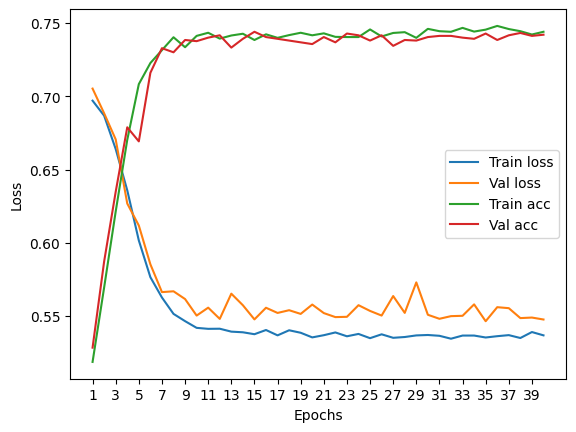

****************************************************************************************************



118it [00:00, 199.12it/s]


Train Epoch: 0 	Loss: 0.696713, Accuracy: 3882/7500 (52%)
Val Epoch: 0 	Loss: 0.704155, Accuracy: 1319/2500 (53%)



118it [00:00, 195.38it/s]


Train Epoch: 1 	Loss: 0.679793, Accuracy: 4586/7500 (61%)
Val Epoch: 1 	Loss: 0.671051, Accuracy: 1637/2500 (65%)



118it [00:00, 171.49it/s]


Train Epoch: 2 	Loss: 0.637981, Accuracy: 5073/7500 (68%)
Val Epoch: 2 	Loss: 0.624515, Accuracy: 1737/2500 (69%)



118it [00:00, 163.12it/s]


Train Epoch: 3 	Loss: 0.597496, Accuracy: 5327/7500 (71%)
Val Epoch: 3 	Loss: 0.589701, Accuracy: 1800/2500 (72%)



118it [00:00, 155.70it/s]


Train Epoch: 4 	Loss: 0.572408, Accuracy: 5474/7500 (73%)
Val Epoch: 4 	Loss: 0.569252, Accuracy: 1799/2500 (72%)



118it [00:00, 198.94it/s]


Train Epoch: 5 	Loss: 0.560781, Accuracy: 5470/7500 (73%)
Val Epoch: 5 	Loss: 0.564163, Accuracy: 1829/2500 (73%)



118it [00:00, 190.43it/s]


Train Epoch: 6 	Loss: 0.554350, Accuracy: 5504/7500 (73%)
Val Epoch: 6 	Loss: 0.552336, Accuracy: 1837/2500 (73%)



118it [00:00, 187.40it/s]


Train Epoch: 7 	Loss: 0.554200, Accuracy: 5494/7500 (73%)
Val Epoch: 7 	Loss: 0.565262, Accuracy: 1826/2500 (73%)



118it [00:00, 199.66it/s]


Train Epoch: 8 	Loss: 0.552137, Accuracy: 5537/7500 (74%)
Val Epoch: 8 	Loss: 0.567040, Accuracy: 1811/2500 (72%)



118it [00:00, 187.52it/s]


Train Epoch: 9 	Loss: 0.552863, Accuracy: 5506/7500 (73%)
Val Epoch: 9 	Loss: 0.552272, Accuracy: 1821/2500 (73%)



118it [00:00, 191.19it/s]


Train Epoch: 10 	Loss: 0.554099, Accuracy: 5533/7500 (74%)
Val Epoch: 10 	Loss: 0.554797, Accuracy: 1834/2500 (73%)



118it [00:00, 160.24it/s]


Train Epoch: 11 	Loss: 0.549719, Accuracy: 5532/7500 (74%)
Val Epoch: 11 	Loss: 0.558246, Accuracy: 1843/2500 (74%)



118it [00:00, 158.75it/s]


Train Epoch: 12 	Loss: 0.547436, Accuracy: 5548/7500 (74%)
Val Epoch: 12 	Loss: 0.548404, Accuracy: 1845/2500 (74%)



118it [00:00, 157.81it/s]


Train Epoch: 13 	Loss: 0.549664, Accuracy: 5543/7500 (74%)
Val Epoch: 13 	Loss: 0.551031, Accuracy: 1829/2500 (73%)



118it [00:00, 175.09it/s]


Train Epoch: 14 	Loss: 0.551116, Accuracy: 5539/7500 (74%)
Val Epoch: 14 	Loss: 0.548620, Accuracy: 1844/2500 (74%)



118it [00:00, 182.09it/s]


Train Epoch: 15 	Loss: 0.547566, Accuracy: 5553/7500 (74%)
Val Epoch: 15 	Loss: 0.553835, Accuracy: 1839/2500 (74%)



118it [00:00, 194.80it/s]


Train Epoch: 16 	Loss: 0.547201, Accuracy: 5551/7500 (74%)
Val Epoch: 16 	Loss: 0.571376, Accuracy: 1813/2500 (73%)



118it [00:00, 198.11it/s]


Train Epoch: 17 	Loss: 0.550029, Accuracy: 5525/7500 (74%)
Val Epoch: 17 	Loss: 0.550892, Accuracy: 1839/2500 (74%)



118it [00:00, 197.83it/s]


Train Epoch: 18 	Loss: 0.549787, Accuracy: 5545/7500 (74%)
Val Epoch: 18 	Loss: 0.560579, Accuracy: 1842/2500 (74%)



118it [00:00, 195.99it/s]


Train Epoch: 19 	Loss: 0.547371, Accuracy: 5569/7500 (74%)
Val Epoch: 19 	Loss: 0.568327, Accuracy: 1822/2500 (73%)



118it [00:00, 189.36it/s]


Train Epoch: 20 	Loss: 0.547988, Accuracy: 5505/7500 (73%)
Val Epoch: 20 	Loss: 0.546394, Accuracy: 1843/2500 (74%)



118it [00:00, 196.53it/s]


Train Epoch: 21 	Loss: 0.548612, Accuracy: 5540/7500 (74%)
Val Epoch: 21 	Loss: 0.548244, Accuracy: 1826/2500 (73%)



118it [00:00, 190.70it/s]


Train Epoch: 22 	Loss: 0.547783, Accuracy: 5550/7500 (74%)
Val Epoch: 22 	Loss: 0.550791, Accuracy: 1842/2500 (74%)



118it [00:00, 191.99it/s]


Train Epoch: 23 	Loss: 0.545449, Accuracy: 5568/7500 (74%)
Val Epoch: 23 	Loss: 0.554038, Accuracy: 1841/2500 (74%)



118it [00:00, 197.39it/s]


Train Epoch: 24 	Loss: 0.547377, Accuracy: 5528/7500 (74%)
Val Epoch: 24 	Loss: 0.544919, Accuracy: 1841/2500 (74%)



118it [00:00, 198.42it/s]


Train Epoch: 25 	Loss: 0.545727, Accuracy: 5550/7500 (74%)
Val Epoch: 25 	Loss: 0.545124, Accuracy: 1838/2500 (74%)



118it [00:00, 197.20it/s]


Train Epoch: 26 	Loss: 0.548280, Accuracy: 5547/7500 (74%)
Val Epoch: 26 	Loss: 0.566689, Accuracy: 1840/2500 (74%)



118it [00:00, 192.22it/s]


Train Epoch: 27 	Loss: 0.549927, Accuracy: 5543/7500 (74%)
Val Epoch: 27 	Loss: 0.551696, Accuracy: 1843/2500 (74%)



118it [00:00, 194.11it/s]


Train Epoch: 28 	Loss: 0.548092, Accuracy: 5559/7500 (74%)
Val Epoch: 28 	Loss: 0.573893, Accuracy: 1832/2500 (73%)



118it [00:00, 194.32it/s]


Train Epoch: 29 	Loss: 0.549506, Accuracy: 5532/7500 (74%)
Val Epoch: 29 	Loss: 0.556324, Accuracy: 1833/2500 (73%)



118it [00:00, 194.79it/s]


Train Epoch: 30 	Loss: 0.547125, Accuracy: 5548/7500 (74%)
Val Epoch: 30 	Loss: 0.549441, Accuracy: 1843/2500 (74%)



118it [00:00, 123.55it/s]


Train Epoch: 31 	Loss: 0.547181, Accuracy: 5564/7500 (74%)
Val Epoch: 31 	Loss: 0.555729, Accuracy: 1833/2500 (73%)



118it [00:00, 159.66it/s]


Train Epoch: 32 	Loss: 0.546762, Accuracy: 5534/7500 (74%)
Val Epoch: 32 	Loss: 0.549664, Accuracy: 1842/2500 (74%)



118it [00:00, 156.34it/s]


Train Epoch: 33 	Loss: 0.547340, Accuracy: 5539/7500 (74%)
Val Epoch: 33 	Loss: 0.554310, Accuracy: 1830/2500 (73%)



118it [00:00, 178.98it/s]


Train Epoch: 34 	Loss: 0.547051, Accuracy: 5567/7500 (74%)
Val Epoch: 34 	Loss: 0.549241, Accuracy: 1836/2500 (73%)



118it [00:00, 193.94it/s]


Train Epoch: 35 	Loss: 0.547269, Accuracy: 5543/7500 (74%)
Val Epoch: 35 	Loss: 0.563849, Accuracy: 1840/2500 (74%)



118it [00:00, 201.09it/s]


Train Epoch: 36 	Loss: 0.546174, Accuracy: 5567/7500 (74%)
Val Epoch: 36 	Loss: 0.553731, Accuracy: 1849/2500 (74%)



118it [00:00, 191.48it/s]


Train Epoch: 37 	Loss: 0.549811, Accuracy: 5542/7500 (74%)
Val Epoch: 37 	Loss: 0.547219, Accuracy: 1839/2500 (74%)



118it [00:00, 190.76it/s]


Train Epoch: 38 	Loss: 0.547530, Accuracy: 5551/7500 (74%)
Val Epoch: 38 	Loss: 0.547138, Accuracy: 1838/2500 (74%)



118it [00:00, 189.46it/s]


Train Epoch: 39 	Loss: 0.548022, Accuracy: 5555/7500 (74%)
Val Epoch: 39 	Loss: 0.551427, Accuracy: 1851/2500 (74%)

Test accuracy:  73.56


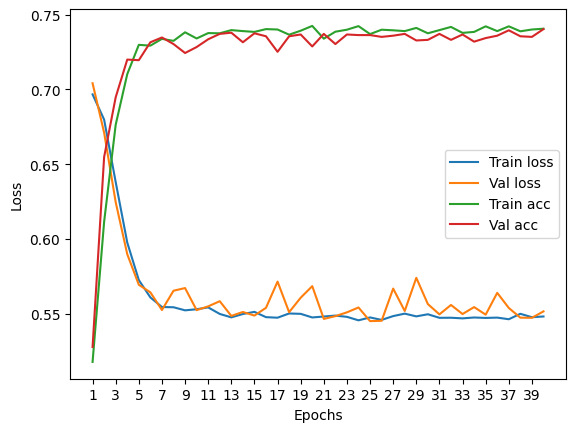

****************************************************************************************************



118it [00:00, 199.58it/s]


Train Epoch: 0 	Loss: 0.696588, Accuracy: 3935/7500 (52%)
Val Epoch: 0 	Loss: 0.705216, Accuracy: 1357/2500 (54%)



118it [00:00, 188.50it/s]


Train Epoch: 1 	Loss: 0.688463, Accuracy: 4173/7500 (56%)
Val Epoch: 1 	Loss: 0.693936, Accuracy: 1481/2500 (59%)



118it [00:00, 187.26it/s]


Train Epoch: 2 	Loss: 0.682615, Accuracy: 4245/7500 (57%)
Val Epoch: 2 	Loss: 0.682487, Accuracy: 1534/2500 (61%)



118it [00:00, 181.04it/s]


Train Epoch: 3 	Loss: 0.666550, Accuracy: 4539/7500 (61%)
Val Epoch: 3 	Loss: 0.658870, Accuracy: 1662/2500 (66%)



118it [00:00, 198.17it/s]


Train Epoch: 4 	Loss: 0.637959, Accuracy: 4968/7500 (66%)
Val Epoch: 4 	Loss: 0.630214, Accuracy: 1738/2500 (70%)



118it [00:00, 198.00it/s]


Train Epoch: 5 	Loss: 0.607027, Accuracy: 5276/7500 (70%)
Val Epoch: 5 	Loss: 0.599503, Accuracy: 1807/2500 (72%)



118it [00:00, 187.46it/s]


Train Epoch: 6 	Loss: 0.581950, Accuracy: 5457/7500 (73%)
Val Epoch: 6 	Loss: 0.574304, Accuracy: 1859/2500 (74%)



118it [00:00, 176.07it/s]


Train Epoch: 7 	Loss: 0.565737, Accuracy: 5464/7500 (73%)
Val Epoch: 7 	Loss: 0.560751, Accuracy: 1850/2500 (74%)



118it [00:00, 178.42it/s]


Train Epoch: 8 	Loss: 0.554306, Accuracy: 5538/7500 (74%)
Val Epoch: 8 	Loss: 0.544985, Accuracy: 1860/2500 (74%)



118it [00:00, 194.69it/s]


Train Epoch: 9 	Loss: 0.547164, Accuracy: 5558/7500 (74%)
Val Epoch: 9 	Loss: 0.541936, Accuracy: 1852/2500 (74%)



118it [00:00, 150.35it/s]


Train Epoch: 10 	Loss: 0.542115, Accuracy: 5541/7500 (74%)
Val Epoch: 10 	Loss: 0.557180, Accuracy: 1823/2500 (73%)



118it [00:00, 118.04it/s]


Train Epoch: 11 	Loss: 0.542581, Accuracy: 5564/7500 (74%)
Val Epoch: 11 	Loss: 0.541731, Accuracy: 1859/2500 (74%)



118it [00:00, 162.01it/s]


Train Epoch: 12 	Loss: 0.541373, Accuracy: 5551/7500 (74%)
Val Epoch: 12 	Loss: 0.539315, Accuracy: 1863/2500 (75%)



118it [00:00, 129.45it/s]


Train Epoch: 13 	Loss: 0.538969, Accuracy: 5566/7500 (74%)
Val Epoch: 13 	Loss: 0.536403, Accuracy: 1863/2500 (75%)



118it [00:00, 176.22it/s]


Train Epoch: 14 	Loss: 0.540591, Accuracy: 5564/7500 (74%)
Val Epoch: 14 	Loss: 0.535729, Accuracy: 1851/2500 (74%)



118it [00:00, 191.13it/s]


Train Epoch: 15 	Loss: 0.538599, Accuracy: 5540/7500 (74%)
Val Epoch: 15 	Loss: 0.539640, Accuracy: 1855/2500 (74%)



118it [00:00, 190.83it/s]


Train Epoch: 16 	Loss: 0.537050, Accuracy: 5590/7500 (75%)
Val Epoch: 16 	Loss: 0.536111, Accuracy: 1866/2500 (75%)



118it [00:00, 193.62it/s]


Train Epoch: 17 	Loss: 0.538627, Accuracy: 5589/7500 (75%)
Val Epoch: 17 	Loss: 0.539627, Accuracy: 1865/2500 (75%)



118it [00:00, 195.54it/s]


Train Epoch: 18 	Loss: 0.539006, Accuracy: 5552/7500 (74%)
Val Epoch: 18 	Loss: 0.553227, Accuracy: 1861/2500 (74%)



118it [00:00, 191.56it/s]


Train Epoch: 19 	Loss: 0.537726, Accuracy: 5588/7500 (75%)
Val Epoch: 19 	Loss: 0.558848, Accuracy: 1866/2500 (75%)



118it [00:00, 196.45it/s]


Train Epoch: 20 	Loss: 0.535049, Accuracy: 5562/7500 (74%)
Val Epoch: 20 	Loss: 0.534824, Accuracy: 1869/2500 (75%)



118it [00:00, 197.54it/s]


Train Epoch: 21 	Loss: 0.535279, Accuracy: 5585/7500 (74%)
Val Epoch: 21 	Loss: 0.537743, Accuracy: 1856/2500 (74%)



118it [00:00, 191.84it/s]


Train Epoch: 22 	Loss: 0.536342, Accuracy: 5581/7500 (74%)
Val Epoch: 22 	Loss: 0.533680, Accuracy: 1864/2500 (75%)



118it [00:00, 192.74it/s]


Train Epoch: 23 	Loss: 0.534706, Accuracy: 5584/7500 (74%)
Val Epoch: 23 	Loss: 0.537376, Accuracy: 1861/2500 (74%)



118it [00:00, 196.25it/s]


Train Epoch: 24 	Loss: 0.535742, Accuracy: 5581/7500 (74%)
Val Epoch: 24 	Loss: 0.540637, Accuracy: 1865/2500 (75%)



118it [00:00, 192.31it/s]


Train Epoch: 25 	Loss: 0.536907, Accuracy: 5588/7500 (75%)
Val Epoch: 25 	Loss: 0.550345, Accuracy: 1872/2500 (75%)



118it [00:00, 182.77it/s]


Train Epoch: 26 	Loss: 0.536146, Accuracy: 5583/7500 (74%)
Val Epoch: 26 	Loss: 0.536992, Accuracy: 1869/2500 (75%)



118it [00:00, 187.76it/s]


Train Epoch: 27 	Loss: 0.536989, Accuracy: 5578/7500 (74%)
Val Epoch: 27 	Loss: 0.552658, Accuracy: 1858/2500 (74%)



118it [00:00, 191.30it/s]


Train Epoch: 28 	Loss: 0.537445, Accuracy: 5573/7500 (74%)
Val Epoch: 28 	Loss: 0.544704, Accuracy: 1857/2500 (74%)



118it [00:00, 170.90it/s]


Train Epoch: 29 	Loss: 0.536622, Accuracy: 5588/7500 (75%)
Val Epoch: 29 	Loss: 0.549875, Accuracy: 1871/2500 (75%)



118it [00:00, 151.82it/s]


Train Epoch: 30 	Loss: 0.535737, Accuracy: 5604/7500 (75%)
Val Epoch: 30 	Loss: 0.541759, Accuracy: 1863/2500 (75%)



118it [00:00, 160.54it/s]


Train Epoch: 31 	Loss: 0.535997, Accuracy: 5602/7500 (75%)
Val Epoch: 31 	Loss: 0.539775, Accuracy: 1853/2500 (74%)



118it [00:00, 170.52it/s]


Train Epoch: 32 	Loss: 0.537385, Accuracy: 5582/7500 (74%)
Val Epoch: 32 	Loss: 0.534686, Accuracy: 1863/2500 (75%)



118it [00:00, 185.18it/s]


Train Epoch: 33 	Loss: 0.535301, Accuracy: 5589/7500 (75%)
Val Epoch: 33 	Loss: 0.538224, Accuracy: 1860/2500 (74%)



118it [00:00, 191.65it/s]


Train Epoch: 34 	Loss: 0.537700, Accuracy: 5567/7500 (74%)
Val Epoch: 34 	Loss: 0.539367, Accuracy: 1857/2500 (74%)



118it [00:00, 195.22it/s]


Train Epoch: 35 	Loss: 0.535607, Accuracy: 5587/7500 (74%)
Val Epoch: 35 	Loss: 0.551015, Accuracy: 1866/2500 (75%)



118it [00:00, 196.92it/s]


Train Epoch: 36 	Loss: 0.537603, Accuracy: 5584/7500 (74%)
Val Epoch: 36 	Loss: 0.536480, Accuracy: 1860/2500 (74%)



118it [00:00, 189.95it/s]


Train Epoch: 37 	Loss: 0.534268, Accuracy: 5609/7500 (75%)
Val Epoch: 37 	Loss: 0.538494, Accuracy: 1872/2500 (75%)



118it [00:00, 188.58it/s]


Train Epoch: 38 	Loss: 0.535974, Accuracy: 5618/7500 (75%)
Val Epoch: 38 	Loss: 0.556765, Accuracy: 1856/2500 (74%)



118it [00:00, 190.41it/s]


Train Epoch: 39 	Loss: 0.535488, Accuracy: 5594/7500 (75%)
Val Epoch: 39 	Loss: 0.540337, Accuracy: 1854/2500 (74%)

Test accuracy:  74.16


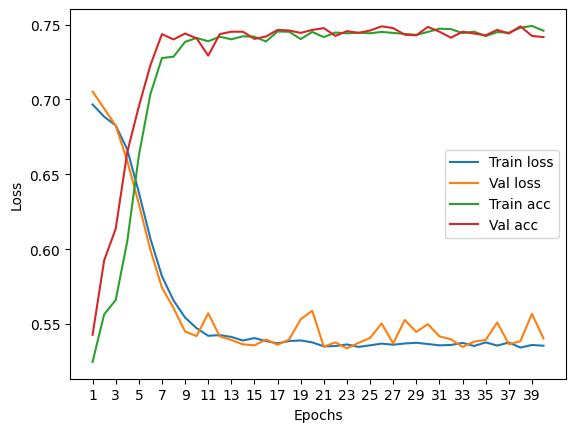

****************************************************************************************************



118it [00:00, 220.60it/s]


Train Epoch: 0 	Loss: 0.696365, Accuracy: 3922/7500 (52%)
Val Epoch: 0 	Loss: 0.701883, Accuracy: 1372/2500 (55%)



118it [00:00, 193.85it/s]


Train Epoch: 1 	Loss: 0.679267, Accuracy: 4440/7500 (59%)
Val Epoch: 1 	Loss: 0.671091, Accuracy: 1632/2500 (65%)



118it [00:00, 186.87it/s]


Train Epoch: 2 	Loss: 0.643243, Accuracy: 4932/7500 (66%)
Val Epoch: 2 	Loss: 0.622997, Accuracy: 1760/2500 (70%)



118it [00:00, 193.21it/s]


Train Epoch: 3 	Loss: 0.603679, Accuracy: 5243/7500 (70%)
Val Epoch: 3 	Loss: 0.600702, Accuracy: 1787/2500 (71%)



118it [00:00, 196.38it/s]


Train Epoch: 4 	Loss: 0.579695, Accuracy: 5349/7500 (71%)
Val Epoch: 4 	Loss: 0.579063, Accuracy: 1827/2500 (73%)



118it [00:00, 189.82it/s]


Train Epoch: 5 	Loss: 0.564766, Accuracy: 5400/7500 (72%)
Val Epoch: 5 	Loss: 0.557816, Accuracy: 1837/2500 (73%)



118it [00:00, 192.87it/s]


Train Epoch: 6 	Loss: 0.555724, Accuracy: 5440/7500 (73%)
Val Epoch: 6 	Loss: 0.565604, Accuracy: 1818/2500 (73%)



118it [00:00, 195.39it/s]


Train Epoch: 7 	Loss: 0.553151, Accuracy: 5438/7500 (73%)
Val Epoch: 7 	Loss: 0.544677, Accuracy: 1850/2500 (74%)



118it [00:00, 194.27it/s]


Train Epoch: 8 	Loss: 0.550624, Accuracy: 5445/7500 (73%)
Val Epoch: 8 	Loss: 0.545667, Accuracy: 1855/2500 (74%)



118it [00:00, 190.82it/s]


Train Epoch: 9 	Loss: 0.549683, Accuracy: 5491/7500 (73%)
Val Epoch: 9 	Loss: 0.553563, Accuracy: 1851/2500 (74%)



118it [00:00, 172.64it/s]


Train Epoch: 10 	Loss: 0.548999, Accuracy: 5451/7500 (73%)
Val Epoch: 10 	Loss: 0.542660, Accuracy: 1852/2500 (74%)



118it [00:00, 145.46it/s]


Train Epoch: 11 	Loss: 0.549642, Accuracy: 5456/7500 (73%)
Val Epoch: 11 	Loss: 0.544932, Accuracy: 1845/2500 (74%)



118it [00:00, 161.80it/s]


Train Epoch: 12 	Loss: 0.548289, Accuracy: 5498/7500 (73%)
Val Epoch: 12 	Loss: 0.557621, Accuracy: 1844/2500 (74%)



118it [00:00, 176.25it/s]


Train Epoch: 13 	Loss: 0.552080, Accuracy: 5466/7500 (73%)
Val Epoch: 13 	Loss: 0.547019, Accuracy: 1842/2500 (74%)



118it [00:00, 190.27it/s]


Train Epoch: 14 	Loss: 0.546804, Accuracy: 5490/7500 (73%)
Val Epoch: 14 	Loss: 0.553330, Accuracy: 1847/2500 (74%)



118it [00:00, 191.99it/s]


Train Epoch: 15 	Loss: 0.546636, Accuracy: 5475/7500 (73%)
Val Epoch: 15 	Loss: 0.559619, Accuracy: 1828/2500 (73%)



118it [00:00, 192.34it/s]


Train Epoch: 16 	Loss: 0.548558, Accuracy: 5497/7500 (73%)
Val Epoch: 16 	Loss: 0.558488, Accuracy: 1849/2500 (74%)



118it [00:00, 194.40it/s]


Train Epoch: 17 	Loss: 0.545976, Accuracy: 5503/7500 (73%)
Val Epoch: 17 	Loss: 0.552660, Accuracy: 1845/2500 (74%)



118it [00:00, 192.16it/s]


Train Epoch: 18 	Loss: 0.546064, Accuracy: 5456/7500 (73%)
Val Epoch: 18 	Loss: 0.547226, Accuracy: 1852/2500 (74%)



118it [00:00, 189.65it/s]


Train Epoch: 19 	Loss: 0.548343, Accuracy: 5483/7500 (73%)
Val Epoch: 19 	Loss: 0.559213, Accuracy: 1853/2500 (74%)



118it [00:00, 195.36it/s]


Train Epoch: 20 	Loss: 0.546796, Accuracy: 5484/7500 (73%)
Val Epoch: 20 	Loss: 0.547161, Accuracy: 1852/2500 (74%)



118it [00:00, 185.78it/s]


Train Epoch: 21 	Loss: 0.547516, Accuracy: 5482/7500 (73%)
Val Epoch: 21 	Loss: 0.553204, Accuracy: 1833/2500 (73%)



118it [00:00, 190.97it/s]


Train Epoch: 22 	Loss: 0.547364, Accuracy: 5486/7500 (73%)
Val Epoch: 22 	Loss: 0.545907, Accuracy: 1852/2500 (74%)



118it [00:00, 194.04it/s]


Train Epoch: 23 	Loss: 0.547712, Accuracy: 5489/7500 (73%)
Val Epoch: 23 	Loss: 0.548220, Accuracy: 1854/2500 (74%)



118it [00:00, 192.42it/s]


Train Epoch: 24 	Loss: 0.547679, Accuracy: 5500/7500 (73%)
Val Epoch: 24 	Loss: 0.548722, Accuracy: 1855/2500 (74%)



118it [00:00, 191.23it/s]


Train Epoch: 25 	Loss: 0.545983, Accuracy: 5459/7500 (73%)
Val Epoch: 25 	Loss: 0.543085, Accuracy: 1857/2500 (74%)



118it [00:00, 167.31it/s]


Train Epoch: 26 	Loss: 0.544054, Accuracy: 5485/7500 (73%)
Val Epoch: 26 	Loss: 0.548550, Accuracy: 1841/2500 (74%)



118it [00:00, 177.84it/s]


Train Epoch: 27 	Loss: 0.547779, Accuracy: 5496/7500 (73%)
Val Epoch: 27 	Loss: 0.556548, Accuracy: 1843/2500 (74%)



118it [00:00, 183.79it/s]


Train Epoch: 28 	Loss: 0.545009, Accuracy: 5473/7500 (73%)
Val Epoch: 28 	Loss: 0.569991, Accuracy: 1800/2500 (72%)



118it [00:00, 193.86it/s]


Train Epoch: 29 	Loss: 0.547414, Accuracy: 5484/7500 (73%)
Val Epoch: 29 	Loss: 0.544182, Accuracy: 1846/2500 (74%)



118it [00:00, 150.14it/s]


Train Epoch: 30 	Loss: 0.544769, Accuracy: 5478/7500 (73%)
Val Epoch: 30 	Loss: 0.548484, Accuracy: 1853/2500 (74%)



118it [00:00, 172.46it/s]


Train Epoch: 31 	Loss: 0.545954, Accuracy: 5470/7500 (73%)
Val Epoch: 31 	Loss: 0.548984, Accuracy: 1850/2500 (74%)



118it [00:00, 160.92it/s]


Train Epoch: 32 	Loss: 0.547128, Accuracy: 5478/7500 (73%)
Val Epoch: 32 	Loss: 0.556058, Accuracy: 1840/2500 (74%)



118it [00:00, 185.02it/s]


Train Epoch: 33 	Loss: 0.545530, Accuracy: 5487/7500 (73%)
Val Epoch: 33 	Loss: 0.543045, Accuracy: 1855/2500 (74%)



118it [00:00, 189.96it/s]


Train Epoch: 34 	Loss: 0.544578, Accuracy: 5471/7500 (73%)
Val Epoch: 34 	Loss: 0.542007, Accuracy: 1843/2500 (74%)



118it [00:00, 188.87it/s]


Train Epoch: 35 	Loss: 0.545166, Accuracy: 5479/7500 (73%)
Val Epoch: 35 	Loss: 0.549310, Accuracy: 1842/2500 (74%)



118it [00:00, 196.50it/s]


Train Epoch: 36 	Loss: 0.545114, Accuracy: 5464/7500 (73%)
Val Epoch: 36 	Loss: 0.549364, Accuracy: 1853/2500 (74%)



118it [00:00, 191.47it/s]


Train Epoch: 37 	Loss: 0.548865, Accuracy: 5491/7500 (73%)
Val Epoch: 37 	Loss: 0.551793, Accuracy: 1849/2500 (74%)



118it [00:00, 193.58it/s]


Train Epoch: 38 	Loss: 0.545543, Accuracy: 5474/7500 (73%)
Val Epoch: 38 	Loss: 0.557502, Accuracy: 1847/2500 (74%)



118it [00:00, 190.46it/s]


Train Epoch: 39 	Loss: 0.547311, Accuracy: 5462/7500 (73%)
Val Epoch: 39 	Loss: 0.547249, Accuracy: 1852/2500 (74%)

Test accuracy:  74.32


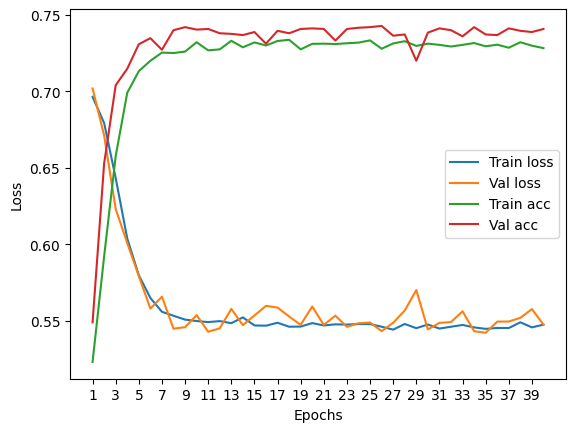

****************************************************************************************************



118it [00:00, 212.39it/s]


Train Epoch: 0 	Loss: 0.698709, Accuracy: 3727/7500 (50%)
Val Epoch: 0 	Loss: 0.708626, Accuracy: 1327/2500 (53%)



118it [00:00, 140.32it/s]


Train Epoch: 1 	Loss: 0.692708, Accuracy: 4120/7500 (55%)
Val Epoch: 1 	Loss: 0.699686, Accuracy: 1470/2500 (59%)



118it [00:00, 169.04it/s]


Train Epoch: 2 	Loss: 0.675959, Accuracy: 4476/7500 (60%)
Val Epoch: 2 	Loss: 0.684334, Accuracy: 1539/2500 (62%)



118it [00:00, 179.75it/s]


Train Epoch: 3 	Loss: 0.645578, Accuracy: 4835/7500 (64%)
Val Epoch: 3 	Loss: 0.644950, Accuracy: 1641/2500 (66%)



118it [00:00, 173.39it/s]


Train Epoch: 4 	Loss: 0.610291, Accuracy: 5201/7500 (69%)
Val Epoch: 4 	Loss: 0.610856, Accuracy: 1749/2500 (70%)



118it [00:00, 186.29it/s]


Train Epoch: 5 	Loss: 0.578882, Accuracy: 5462/7500 (73%)
Val Epoch: 5 	Loss: 0.595898, Accuracy: 1772/2500 (71%)



118it [00:00, 194.64it/s]


Train Epoch: 6 	Loss: 0.561185, Accuracy: 5481/7500 (73%)
Val Epoch: 6 	Loss: 0.583391, Accuracy: 1782/2500 (71%)



118it [00:00, 191.93it/s]


Train Epoch: 7 	Loss: 0.552899, Accuracy: 5529/7500 (74%)
Val Epoch: 7 	Loss: 0.569142, Accuracy: 1814/2500 (73%)



118it [00:00, 187.76it/s]


Train Epoch: 8 	Loss: 0.546176, Accuracy: 5528/7500 (74%)
Val Epoch: 8 	Loss: 0.569220, Accuracy: 1808/2500 (72%)



118it [00:00, 184.02it/s]


Train Epoch: 9 	Loss: 0.546622, Accuracy: 5538/7500 (74%)
Val Epoch: 9 	Loss: 0.569216, Accuracy: 1800/2500 (72%)



118it [00:00, 195.42it/s]


Train Epoch: 10 	Loss: 0.545101, Accuracy: 5511/7500 (73%)
Val Epoch: 10 	Loss: 0.565424, Accuracy: 1822/2500 (73%)



118it [00:00, 156.92it/s]


Train Epoch: 11 	Loss: 0.544135, Accuracy: 5556/7500 (74%)
Val Epoch: 11 	Loss: 0.578161, Accuracy: 1801/2500 (72%)



118it [00:00, 158.29it/s]


Train Epoch: 12 	Loss: 0.541192, Accuracy: 5557/7500 (74%)
Val Epoch: 12 	Loss: 0.561610, Accuracy: 1818/2500 (73%)



118it [00:00, 158.17it/s]


Train Epoch: 13 	Loss: 0.539360, Accuracy: 5535/7500 (74%)
Val Epoch: 13 	Loss: 0.569630, Accuracy: 1810/2500 (72%)



118it [00:00, 185.34it/s]


Train Epoch: 14 	Loss: 0.541849, Accuracy: 5552/7500 (74%)
Val Epoch: 14 	Loss: 0.561126, Accuracy: 1811/2500 (72%)



118it [00:00, 191.26it/s]


Train Epoch: 15 	Loss: 0.539101, Accuracy: 5546/7500 (74%)
Val Epoch: 15 	Loss: 0.572278, Accuracy: 1819/2500 (73%)



118it [00:00, 195.42it/s]


Train Epoch: 16 	Loss: 0.539478, Accuracy: 5580/7500 (74%)
Val Epoch: 16 	Loss: 0.582359, Accuracy: 1787/2500 (71%)



118it [00:00, 188.93it/s]


Train Epoch: 17 	Loss: 0.538552, Accuracy: 5571/7500 (74%)
Val Epoch: 17 	Loss: 0.575851, Accuracy: 1817/2500 (73%)



118it [00:00, 190.32it/s]


Train Epoch: 18 	Loss: 0.539578, Accuracy: 5558/7500 (74%)
Val Epoch: 18 	Loss: 0.562455, Accuracy: 1816/2500 (73%)



118it [00:00, 191.26it/s]


Train Epoch: 19 	Loss: 0.538140, Accuracy: 5559/7500 (74%)
Val Epoch: 19 	Loss: 0.562083, Accuracy: 1814/2500 (73%)



118it [00:00, 190.41it/s]


Train Epoch: 20 	Loss: 0.537564, Accuracy: 5570/7500 (74%)
Val Epoch: 20 	Loss: 0.575418, Accuracy: 1819/2500 (73%)



118it [00:00, 194.68it/s]


Train Epoch: 21 	Loss: 0.537460, Accuracy: 5583/7500 (74%)
Val Epoch: 21 	Loss: 0.559668, Accuracy: 1815/2500 (73%)



118it [00:00, 190.23it/s]


Train Epoch: 22 	Loss: 0.537526, Accuracy: 5539/7500 (74%)
Val Epoch: 22 	Loss: 0.558410, Accuracy: 1812/2500 (72%)



118it [00:00, 196.71it/s]


Train Epoch: 23 	Loss: 0.538188, Accuracy: 5567/7500 (74%)
Val Epoch: 23 	Loss: 0.570190, Accuracy: 1805/2500 (72%)



118it [00:00, 193.61it/s]


Train Epoch: 24 	Loss: 0.539025, Accuracy: 5544/7500 (74%)
Val Epoch: 24 	Loss: 0.562339, Accuracy: 1820/2500 (73%)



118it [00:00, 191.87it/s]


Train Epoch: 25 	Loss: 0.537709, Accuracy: 5550/7500 (74%)
Val Epoch: 25 	Loss: 0.556591, Accuracy: 1822/2500 (73%)



118it [00:00, 190.88it/s]


Train Epoch: 26 	Loss: 0.539050, Accuracy: 5563/7500 (74%)
Val Epoch: 26 	Loss: 0.567242, Accuracy: 1808/2500 (72%)



118it [00:00, 194.59it/s]


Train Epoch: 27 	Loss: 0.538556, Accuracy: 5558/7500 (74%)
Val Epoch: 27 	Loss: 0.563352, Accuracy: 1810/2500 (72%)



118it [00:00, 193.49it/s]


Train Epoch: 28 	Loss: 0.535894, Accuracy: 5548/7500 (74%)
Val Epoch: 28 	Loss: 0.566559, Accuracy: 1813/2500 (73%)



118it [00:00, 191.17it/s]


Train Epoch: 29 	Loss: 0.538662, Accuracy: 5564/7500 (74%)
Val Epoch: 29 	Loss: 0.567625, Accuracy: 1805/2500 (72%)



118it [00:00, 192.67it/s]


Train Epoch: 30 	Loss: 0.537402, Accuracy: 5557/7500 (74%)
Val Epoch: 30 	Loss: 0.559851, Accuracy: 1815/2500 (73%)



118it [00:00, 143.45it/s]


Train Epoch: 31 	Loss: 0.534836, Accuracy: 5564/7500 (74%)
Val Epoch: 31 	Loss: 0.564689, Accuracy: 1808/2500 (72%)



118it [00:00, 160.80it/s]


Train Epoch: 32 	Loss: 0.536263, Accuracy: 5559/7500 (74%)
Val Epoch: 32 	Loss: 0.561756, Accuracy: 1801/2500 (72%)



118it [00:00, 151.22it/s]


Train Epoch: 33 	Loss: 0.539100, Accuracy: 5539/7500 (74%)
Val Epoch: 33 	Loss: 0.560415, Accuracy: 1799/2500 (72%)



118it [00:00, 167.74it/s]


Train Epoch: 34 	Loss: 0.535016, Accuracy: 5568/7500 (74%)
Val Epoch: 34 	Loss: 0.567480, Accuracy: 1815/2500 (73%)



118it [00:00, 178.00it/s]


Train Epoch: 35 	Loss: 0.536263, Accuracy: 5575/7500 (74%)
Val Epoch: 35 	Loss: 0.563146, Accuracy: 1807/2500 (72%)



118it [00:00, 194.63it/s]


Train Epoch: 36 	Loss: 0.532573, Accuracy: 5563/7500 (74%)
Val Epoch: 36 	Loss: 0.563156, Accuracy: 1814/2500 (73%)



118it [00:00, 179.75it/s]


Train Epoch: 37 	Loss: 0.533778, Accuracy: 5571/7500 (74%)
Val Epoch: 37 	Loss: 0.560480, Accuracy: 1822/2500 (73%)



118it [00:00, 196.56it/s]


Train Epoch: 38 	Loss: 0.532227, Accuracy: 5574/7500 (74%)
Val Epoch: 38 	Loss: 0.559958, Accuracy: 1804/2500 (72%)



118it [00:00, 184.61it/s]


Train Epoch: 39 	Loss: 0.535899, Accuracy: 5570/7500 (74%)
Val Epoch: 39 	Loss: 0.565102, Accuracy: 1807/2500 (72%)

Test accuracy:  73.68


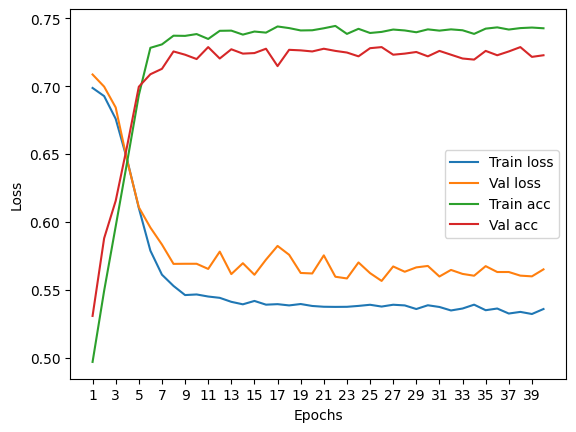

****************************************************************************************************



118it [00:00, 206.70it/s]


Train Epoch: 0 	Loss: 0.696030, Accuracy: 3952/7500 (53%)
Val Epoch: 0 	Loss: 0.703767, Accuracy: 1372/2500 (55%)



118it [00:00, 195.15it/s]


Train Epoch: 1 	Loss: 0.687726, Accuracy: 4219/7500 (56%)
Val Epoch: 1 	Loss: 0.697210, Accuracy: 1396/2500 (56%)



118it [00:00, 174.05it/s]


Train Epoch: 2 	Loss: 0.683171, Accuracy: 4279/7500 (57%)
Val Epoch: 2 	Loss: 0.698982, Accuracy: 1389/2500 (56%)



118it [00:00, 183.17it/s]


Train Epoch: 3 	Loss: 0.681173, Accuracy: 4295/7500 (57%)
Val Epoch: 3 	Loss: 0.694698, Accuracy: 1416/2500 (57%)



118it [00:00, 194.97it/s]


Train Epoch: 4 	Loss: 0.676694, Accuracy: 4373/7500 (58%)
Val Epoch: 4 	Loss: 0.686651, Accuracy: 1437/2500 (57%)



118it [00:00, 166.68it/s]


Train Epoch: 5 	Loss: 0.663576, Accuracy: 4539/7500 (61%)
Val Epoch: 5 	Loss: 0.674745, Accuracy: 1495/2500 (60%)



118it [00:00, 174.76it/s]


Train Epoch: 6 	Loss: 0.632196, Accuracy: 5010/7500 (67%)
Val Epoch: 6 	Loss: 0.629950, Accuracy: 1673/2500 (67%)



118it [00:00, 198.01it/s]


Train Epoch: 7 	Loss: 0.602151, Accuracy: 5276/7500 (70%)
Val Epoch: 7 	Loss: 0.605522, Accuracy: 1768/2500 (71%)



118it [00:00, 192.85it/s]


Train Epoch: 8 	Loss: 0.580601, Accuracy: 5359/7500 (71%)
Val Epoch: 8 	Loss: 0.598878, Accuracy: 1757/2500 (70%)



118it [00:00, 198.06it/s]


Train Epoch: 9 	Loss: 0.566932, Accuracy: 5451/7500 (73%)
Val Epoch: 9 	Loss: 0.582114, Accuracy: 1802/2500 (72%)



118it [00:00, 190.48it/s]


Train Epoch: 10 	Loss: 0.559315, Accuracy: 5465/7500 (73%)
Val Epoch: 10 	Loss: 0.577609, Accuracy: 1805/2500 (72%)



118it [00:00, 142.02it/s]


Train Epoch: 11 	Loss: 0.556046, Accuracy: 5478/7500 (73%)
Val Epoch: 11 	Loss: 0.566041, Accuracy: 1807/2500 (72%)



118it [00:00, 167.05it/s]


Train Epoch: 12 	Loss: 0.553131, Accuracy: 5482/7500 (73%)
Val Epoch: 12 	Loss: 0.560250, Accuracy: 1820/2500 (73%)



118it [00:00, 157.01it/s]


Train Epoch: 13 	Loss: 0.551420, Accuracy: 5473/7500 (73%)
Val Epoch: 13 	Loss: 0.569670, Accuracy: 1822/2500 (73%)



118it [00:00, 178.17it/s]


Train Epoch: 14 	Loss: 0.552106, Accuracy: 5483/7500 (73%)
Val Epoch: 14 	Loss: 0.567301, Accuracy: 1814/2500 (73%)



118it [00:00, 192.82it/s]


Train Epoch: 15 	Loss: 0.547824, Accuracy: 5499/7500 (73%)
Val Epoch: 15 	Loss: 0.580055, Accuracy: 1820/2500 (73%)



118it [00:00, 169.56it/s]


Train Epoch: 16 	Loss: 0.548201, Accuracy: 5496/7500 (73%)
Val Epoch: 16 	Loss: 0.558964, Accuracy: 1822/2500 (73%)



118it [00:00, 176.75it/s]


Train Epoch: 17 	Loss: 0.549357, Accuracy: 5516/7500 (74%)
Val Epoch: 17 	Loss: 0.554751, Accuracy: 1841/2500 (74%)



118it [00:00, 193.50it/s]


Train Epoch: 18 	Loss: 0.549027, Accuracy: 5483/7500 (73%)
Val Epoch: 18 	Loss: 0.571197, Accuracy: 1824/2500 (73%)



118it [00:00, 187.23it/s]


Train Epoch: 19 	Loss: 0.547914, Accuracy: 5506/7500 (73%)
Val Epoch: 19 	Loss: 0.559839, Accuracy: 1827/2500 (73%)



118it [00:00, 194.34it/s]


Train Epoch: 20 	Loss: 0.547964, Accuracy: 5515/7500 (74%)
Val Epoch: 20 	Loss: 0.561873, Accuracy: 1830/2500 (73%)



118it [00:00, 196.84it/s]


Train Epoch: 21 	Loss: 0.549678, Accuracy: 5511/7500 (73%)
Val Epoch: 21 	Loss: 0.557793, Accuracy: 1832/2500 (73%)



118it [00:00, 195.21it/s]


Train Epoch: 22 	Loss: 0.547903, Accuracy: 5486/7500 (73%)
Val Epoch: 22 	Loss: 0.551035, Accuracy: 1843/2500 (74%)



118it [00:00, 197.00it/s]


Train Epoch: 23 	Loss: 0.548361, Accuracy: 5517/7500 (74%)
Val Epoch: 23 	Loss: 0.558806, Accuracy: 1843/2500 (74%)



118it [00:00, 176.55it/s]


Train Epoch: 24 	Loss: 0.549201, Accuracy: 5517/7500 (74%)
Val Epoch: 24 	Loss: 0.559068, Accuracy: 1843/2500 (74%)



118it [00:00, 160.03it/s]


Train Epoch: 25 	Loss: 0.546929, Accuracy: 5508/7500 (73%)
Val Epoch: 25 	Loss: 0.566323, Accuracy: 1829/2500 (73%)



118it [00:00, 157.07it/s]


Train Epoch: 26 	Loss: 0.549288, Accuracy: 5488/7500 (73%)
Val Epoch: 26 	Loss: 0.552647, Accuracy: 1850/2500 (74%)



118it [00:00, 171.86it/s]


Train Epoch: 27 	Loss: 0.548912, Accuracy: 5497/7500 (73%)
Val Epoch: 27 	Loss: 0.559892, Accuracy: 1841/2500 (74%)



118it [00:00, 169.91it/s]


Train Epoch: 28 	Loss: 0.550702, Accuracy: 5497/7500 (73%)
Val Epoch: 28 	Loss: 0.551701, Accuracy: 1838/2500 (74%)



118it [00:00, 183.99it/s]


Train Epoch: 29 	Loss: 0.546706, Accuracy: 5520/7500 (74%)
Val Epoch: 29 	Loss: 0.561039, Accuracy: 1841/2500 (74%)



118it [00:00, 127.09it/s]


Train Epoch: 30 	Loss: 0.549004, Accuracy: 5508/7500 (73%)
Val Epoch: 30 	Loss: 0.553094, Accuracy: 1829/2500 (73%)



118it [00:00, 152.52it/s]


Train Epoch: 31 	Loss: 0.546220, Accuracy: 5524/7500 (74%)
Val Epoch: 31 	Loss: 0.564658, Accuracy: 1820/2500 (73%)



118it [00:00, 168.52it/s]


Train Epoch: 32 	Loss: 0.548562, Accuracy: 5514/7500 (74%)
Val Epoch: 32 	Loss: 0.561042, Accuracy: 1836/2500 (73%)



118it [00:00, 142.88it/s]


Train Epoch: 33 	Loss: 0.547183, Accuracy: 5525/7500 (74%)
Val Epoch: 33 	Loss: 0.566109, Accuracy: 1847/2500 (74%)



118it [00:01, 103.76it/s]


Train Epoch: 34 	Loss: 0.549243, Accuracy: 5477/7500 (73%)
Val Epoch: 34 	Loss: 0.572808, Accuracy: 1836/2500 (73%)



118it [00:01, 95.67it/s] 


Train Epoch: 35 	Loss: 0.546223, Accuracy: 5507/7500 (73%)
Val Epoch: 35 	Loss: 0.556749, Accuracy: 1826/2500 (73%)



118it [00:01, 108.51it/s]


Train Epoch: 36 	Loss: 0.548695, Accuracy: 5524/7500 (74%)
Val Epoch: 36 	Loss: 0.567232, Accuracy: 1837/2500 (73%)



118it [00:00, 140.92it/s]


Train Epoch: 37 	Loss: 0.548943, Accuracy: 5498/7500 (73%)
Val Epoch: 37 	Loss: 0.552368, Accuracy: 1839/2500 (74%)



118it [00:00, 196.87it/s]


Train Epoch: 38 	Loss: 0.549890, Accuracy: 5502/7500 (73%)
Val Epoch: 38 	Loss: 0.553454, Accuracy: 1838/2500 (74%)



118it [00:00, 194.51it/s]


Train Epoch: 39 	Loss: 0.545739, Accuracy: 5508/7500 (73%)
Val Epoch: 39 	Loss: 0.569581, Accuracy: 1835/2500 (73%)

Test accuracy:  73.83999999999999


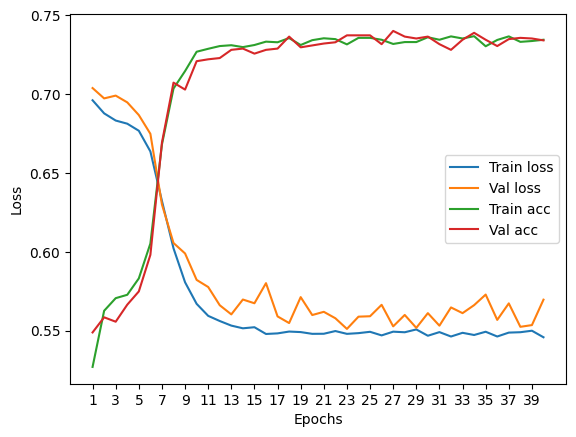

****************************************************************************************************



118it [00:00, 214.02it/s]


Train Epoch: 0 	Loss: 0.695673, Accuracy: 3974/7500 (53%)
Val Epoch: 0 	Loss: 0.701718, Accuracy: 1452/2500 (58%)



118it [00:00, 195.21it/s]


Train Epoch: 1 	Loss: 0.687262, Accuracy: 4294/7500 (57%)
Val Epoch: 1 	Loss: 0.694520, Accuracy: 1416/2500 (57%)



118it [00:00, 183.65it/s]


Train Epoch: 2 	Loss: 0.673827, Accuracy: 4509/7500 (60%)
Val Epoch: 2 	Loss: 0.672079, Accuracy: 1591/2500 (64%)



118it [00:00, 193.90it/s]


Train Epoch: 3 	Loss: 0.646906, Accuracy: 4892/7500 (65%)
Val Epoch: 3 	Loss: 0.635150, Accuracy: 1712/2500 (68%)



118it [00:00, 191.67it/s]


Train Epoch: 4 	Loss: 0.610737, Accuracy: 5250/7500 (70%)
Val Epoch: 4 	Loss: 0.602195, Accuracy: 1765/2500 (71%)



118it [00:00, 194.26it/s]


Train Epoch: 5 	Loss: 0.577875, Accuracy: 5426/7500 (72%)
Val Epoch: 5 	Loss: 0.587166, Accuracy: 1759/2500 (70%)



118it [00:00, 156.40it/s]


Train Epoch: 6 	Loss: 0.568222, Accuracy: 5416/7500 (72%)
Val Epoch: 6 	Loss: 0.569726, Accuracy: 1814/2500 (73%)



118it [00:00, 152.85it/s]


Train Epoch: 7 	Loss: 0.554516, Accuracy: 5505/7500 (73%)
Val Epoch: 7 	Loss: 0.555355, Accuracy: 1827/2500 (73%)



118it [00:00, 157.08it/s]


Train Epoch: 8 	Loss: 0.552434, Accuracy: 5494/7500 (73%)
Val Epoch: 8 	Loss: 0.561961, Accuracy: 1816/2500 (73%)



118it [00:00, 171.87it/s]


Train Epoch: 9 	Loss: 0.551495, Accuracy: 5510/7500 (73%)
Val Epoch: 9 	Loss: 0.572092, Accuracy: 1797/2500 (72%)



118it [00:00, 192.70it/s]


Train Epoch: 10 	Loss: 0.551349, Accuracy: 5510/7500 (73%)
Val Epoch: 10 	Loss: 0.553861, Accuracy: 1835/2500 (73%)



118it [00:00, 199.14it/s]


Train Epoch: 11 	Loss: 0.548177, Accuracy: 5534/7500 (74%)
Val Epoch: 11 	Loss: 0.554632, Accuracy: 1834/2500 (73%)



118it [00:00, 194.70it/s]


Train Epoch: 12 	Loss: 0.547423, Accuracy: 5538/7500 (74%)
Val Epoch: 12 	Loss: 0.547347, Accuracy: 1827/2500 (73%)



118it [00:00, 184.48it/s]


Train Epoch: 13 	Loss: 0.547125, Accuracy: 5513/7500 (74%)
Val Epoch: 13 	Loss: 0.561415, Accuracy: 1822/2500 (73%)



118it [00:00, 180.04it/s]


Train Epoch: 14 	Loss: 0.551654, Accuracy: 5482/7500 (73%)
Val Epoch: 14 	Loss: 0.557909, Accuracy: 1810/2500 (72%)



118it [00:00, 183.33it/s]


Train Epoch: 15 	Loss: 0.548454, Accuracy: 5532/7500 (74%)
Val Epoch: 15 	Loss: 0.554238, Accuracy: 1835/2500 (73%)



118it [00:00, 176.86it/s]


Train Epoch: 16 	Loss: 0.546169, Accuracy: 5546/7500 (74%)
Val Epoch: 16 	Loss: 0.548201, Accuracy: 1832/2500 (73%)



118it [00:00, 190.99it/s]


Train Epoch: 17 	Loss: 0.545695, Accuracy: 5520/7500 (74%)
Val Epoch: 17 	Loss: 0.556597, Accuracy: 1837/2500 (73%)



118it [00:00, 190.01it/s]


Train Epoch: 18 	Loss: 0.547728, Accuracy: 5503/7500 (73%)
Val Epoch: 18 	Loss: 0.556526, Accuracy: 1813/2500 (73%)



118it [00:00, 191.77it/s]


Train Epoch: 19 	Loss: 0.550694, Accuracy: 5535/7500 (74%)
Val Epoch: 19 	Loss: 0.559891, Accuracy: 1825/2500 (73%)



118it [00:00, 193.76it/s]


Train Epoch: 20 	Loss: 0.547447, Accuracy: 5523/7500 (74%)
Val Epoch: 20 	Loss: 0.553843, Accuracy: 1831/2500 (73%)



118it [00:00, 190.63it/s]


Train Epoch: 21 	Loss: 0.547249, Accuracy: 5520/7500 (74%)
Val Epoch: 21 	Loss: 0.557419, Accuracy: 1830/2500 (73%)



118it [00:00, 195.33it/s]


Train Epoch: 22 	Loss: 0.548637, Accuracy: 5529/7500 (74%)
Val Epoch: 22 	Loss: 0.561938, Accuracy: 1845/2500 (74%)



118it [00:00, 195.64it/s]


Train Epoch: 23 	Loss: 0.547278, Accuracy: 5535/7500 (74%)
Val Epoch: 23 	Loss: 0.552027, Accuracy: 1839/2500 (74%)



118it [00:00, 194.36it/s]


Train Epoch: 24 	Loss: 0.548851, Accuracy: 5514/7500 (74%)
Val Epoch: 24 	Loss: 0.558035, Accuracy: 1826/2500 (73%)



118it [00:00, 176.65it/s]


Train Epoch: 25 	Loss: 0.548482, Accuracy: 5545/7500 (74%)
Val Epoch: 25 	Loss: 0.554237, Accuracy: 1822/2500 (73%)



118it [00:00, 147.29it/s]


Train Epoch: 26 	Loss: 0.545654, Accuracy: 5552/7500 (74%)
Val Epoch: 26 	Loss: 0.557628, Accuracy: 1841/2500 (74%)



118it [00:00, 125.57it/s]


Train Epoch: 27 	Loss: 0.546959, Accuracy: 5531/7500 (74%)
Val Epoch: 27 	Loss: 0.558259, Accuracy: 1824/2500 (73%)



118it [00:00, 168.38it/s]


Train Epoch: 28 	Loss: 0.545920, Accuracy: 5539/7500 (74%)
Val Epoch: 28 	Loss: 0.550704, Accuracy: 1833/2500 (73%)



118it [00:00, 180.09it/s]


Train Epoch: 29 	Loss: 0.547898, Accuracy: 5531/7500 (74%)
Val Epoch: 29 	Loss: 0.562028, Accuracy: 1830/2500 (73%)



118it [00:00, 186.01it/s]


Train Epoch: 30 	Loss: 0.544456, Accuracy: 5529/7500 (74%)
Val Epoch: 30 	Loss: 0.548304, Accuracy: 1838/2500 (74%)



118it [00:00, 194.65it/s]


Train Epoch: 31 	Loss: 0.546167, Accuracy: 5558/7500 (74%)
Val Epoch: 31 	Loss: 0.553479, Accuracy: 1825/2500 (73%)



118it [00:00, 197.26it/s]


Train Epoch: 32 	Loss: 0.545464, Accuracy: 5544/7500 (74%)
Val Epoch: 32 	Loss: 0.551724, Accuracy: 1831/2500 (73%)



118it [00:00, 190.00it/s]


Train Epoch: 33 	Loss: 0.545848, Accuracy: 5526/7500 (74%)
Val Epoch: 33 	Loss: 0.554639, Accuracy: 1830/2500 (73%)



118it [00:00, 194.07it/s]


Train Epoch: 34 	Loss: 0.547474, Accuracy: 5544/7500 (74%)
Val Epoch: 34 	Loss: 0.571336, Accuracy: 1839/2500 (74%)



118it [00:00, 195.95it/s]


Train Epoch: 35 	Loss: 0.548006, Accuracy: 5538/7500 (74%)
Val Epoch: 35 	Loss: 0.549610, Accuracy: 1832/2500 (73%)



118it [00:00, 178.58it/s]


Train Epoch: 36 	Loss: 0.546046, Accuracy: 5565/7500 (74%)
Val Epoch: 36 	Loss: 0.550171, Accuracy: 1828/2500 (73%)



118it [00:00, 195.76it/s]


Train Epoch: 37 	Loss: 0.544607, Accuracy: 5545/7500 (74%)
Val Epoch: 37 	Loss: 0.565334, Accuracy: 1848/2500 (74%)



118it [00:00, 185.64it/s]


Train Epoch: 38 	Loss: 0.545485, Accuracy: 5543/7500 (74%)
Val Epoch: 38 	Loss: 0.552037, Accuracy: 1814/2500 (73%)



118it [00:00, 197.47it/s]


Train Epoch: 39 	Loss: 0.548387, Accuracy: 5526/7500 (74%)
Val Epoch: 39 	Loss: 0.554434, Accuracy: 1827/2500 (73%)

Test accuracy:  73.16


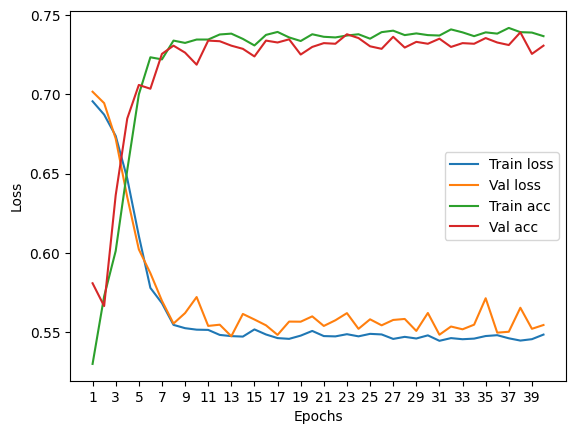

****************************************************************************************************



116it [00:00, 208.25it/s]


Train Epoch: 0 	Loss: 0.689220, Accuracy: 3976/7422 (54%)
Val Epoch: 0 	Loss: 0.691930, Accuracy: 1367/2474 (55%)



116it [00:00, 187.72it/s]


Train Epoch: 1 	Loss: 0.679489, Accuracy: 4267/7422 (57%)
Val Epoch: 1 	Loss: 0.682671, Accuracy: 1433/2474 (58%)



116it [00:00, 194.71it/s]


Train Epoch: 2 	Loss: 0.672624, Accuracy: 4332/7422 (58%)
Val Epoch: 2 	Loss: 0.675237, Accuracy: 1453/2474 (59%)



116it [00:00, 196.55it/s]


Train Epoch: 3 	Loss: 0.665636, Accuracy: 4414/7422 (59%)
Val Epoch: 3 	Loss: 0.667892, Accuracy: 1509/2474 (61%)



116it [00:00, 193.03it/s]


Train Epoch: 4 	Loss: 0.653742, Accuracy: 4598/7422 (62%)
Val Epoch: 4 	Loss: 0.652567, Accuracy: 1573/2474 (64%)



116it [00:00, 187.15it/s]


Train Epoch: 5 	Loss: 0.634733, Accuracy: 4829/7422 (65%)
Val Epoch: 5 	Loss: 0.630335, Accuracy: 1683/2474 (68%)



116it [00:00, 191.66it/s]


Train Epoch: 6 	Loss: 0.608219, Accuracy: 5177/7422 (70%)
Val Epoch: 6 	Loss: 0.602754, Accuracy: 1748/2474 (71%)



116it [00:00, 188.99it/s]


Train Epoch: 7 	Loss: 0.582023, Accuracy: 5316/7422 (72%)
Val Epoch: 7 	Loss: 0.581178, Accuracy: 1806/2474 (73%)



116it [00:01, 112.06it/s]


Train Epoch: 8 	Loss: 0.564620, Accuracy: 5377/7422 (72%)
Val Epoch: 8 	Loss: 0.567783, Accuracy: 1818/2474 (73%)



116it [00:00, 158.93it/s]


Train Epoch: 9 	Loss: 0.556452, Accuracy: 5429/7422 (73%)
Val Epoch: 9 	Loss: 0.562690, Accuracy: 1821/2474 (74%)



116it [00:00, 156.31it/s]


Train Epoch: 10 	Loss: 0.550020, Accuracy: 5442/7422 (73%)
Val Epoch: 10 	Loss: 0.558592, Accuracy: 1837/2474 (74%)



116it [00:00, 180.22it/s]


Train Epoch: 11 	Loss: 0.546214, Accuracy: 5484/7422 (74%)
Val Epoch: 11 	Loss: 0.560958, Accuracy: 1821/2474 (74%)



116it [00:00, 179.25it/s]


Train Epoch: 12 	Loss: 0.547690, Accuracy: 5422/7422 (73%)
Val Epoch: 12 	Loss: 0.559675, Accuracy: 1827/2474 (74%)



116it [00:00, 191.79it/s]


Train Epoch: 13 	Loss: 0.544884, Accuracy: 5462/7422 (74%)
Val Epoch: 13 	Loss: 0.555423, Accuracy: 1840/2474 (74%)



116it [00:00, 194.15it/s]


Train Epoch: 14 	Loss: 0.544073, Accuracy: 5456/7422 (74%)
Val Epoch: 14 	Loss: 0.555445, Accuracy: 1832/2474 (74%)



116it [00:00, 193.83it/s]


Train Epoch: 15 	Loss: 0.545243, Accuracy: 5474/7422 (74%)
Val Epoch: 15 	Loss: 0.556939, Accuracy: 1833/2474 (74%)



116it [00:00, 194.53it/s]


Train Epoch: 16 	Loss: 0.544466, Accuracy: 5452/7422 (73%)
Val Epoch: 16 	Loss: 0.556804, Accuracy: 1829/2474 (74%)



116it [00:00, 196.70it/s]


Train Epoch: 17 	Loss: 0.542689, Accuracy: 5464/7422 (74%)
Val Epoch: 17 	Loss: 0.555618, Accuracy: 1835/2474 (74%)



116it [00:00, 194.28it/s]


Train Epoch: 18 	Loss: 0.543729, Accuracy: 5475/7422 (74%)
Val Epoch: 18 	Loss: 0.557686, Accuracy: 1826/2474 (74%)



116it [00:00, 194.05it/s]


Train Epoch: 19 	Loss: 0.542367, Accuracy: 5489/7422 (74%)
Val Epoch: 19 	Loss: 0.555327, Accuracy: 1828/2474 (74%)



116it [00:00, 190.56it/s]


Train Epoch: 20 	Loss: 0.542308, Accuracy: 5498/7422 (74%)
Val Epoch: 20 	Loss: 0.557020, Accuracy: 1832/2474 (74%)



116it [00:00, 192.13it/s]


Train Epoch: 21 	Loss: 0.543213, Accuracy: 5468/7422 (74%)
Val Epoch: 21 	Loss: 0.558434, Accuracy: 1821/2474 (74%)



116it [00:00, 195.65it/s]


Train Epoch: 22 	Loss: 0.542546, Accuracy: 5496/7422 (74%)
Val Epoch: 22 	Loss: 0.560234, Accuracy: 1813/2474 (73%)



116it [00:00, 190.42it/s]


Train Epoch: 23 	Loss: 0.541981, Accuracy: 5511/7422 (74%)
Val Epoch: 23 	Loss: 0.559716, Accuracy: 1817/2474 (73%)



116it [00:00, 193.37it/s]


Train Epoch: 24 	Loss: 0.543330, Accuracy: 5466/7422 (74%)
Val Epoch: 24 	Loss: 0.564187, Accuracy: 1825/2474 (74%)



116it [00:00, 186.22it/s]


Train Epoch: 25 	Loss: 0.542033, Accuracy: 5483/7422 (74%)
Val Epoch: 25 	Loss: 0.557976, Accuracy: 1820/2474 (74%)



116it [00:00, 175.11it/s]


Train Epoch: 26 	Loss: 0.541963, Accuracy: 5485/7422 (74%)
Val Epoch: 26 	Loss: 0.555876, Accuracy: 1832/2474 (74%)



116it [00:00, 150.12it/s]


Train Epoch: 27 	Loss: 0.541713, Accuracy: 5502/7422 (74%)
Val Epoch: 27 	Loss: 0.562449, Accuracy: 1804/2474 (73%)



116it [00:00, 164.38it/s]


Train Epoch: 28 	Loss: 0.544063, Accuracy: 5468/7422 (74%)
Val Epoch: 28 	Loss: 0.555822, Accuracy: 1835/2474 (74%)



116it [00:00, 161.23it/s]


Train Epoch: 29 	Loss: 0.541321, Accuracy: 5505/7422 (74%)
Val Epoch: 29 	Loss: 0.566188, Accuracy: 1794/2474 (73%)



116it [00:00, 173.43it/s]


Train Epoch: 30 	Loss: 0.541801, Accuracy: 5501/7422 (74%)
Val Epoch: 30 	Loss: 0.556208, Accuracy: 1832/2474 (74%)



116it [00:00, 183.08it/s]


Train Epoch: 31 	Loss: 0.541683, Accuracy: 5476/7422 (74%)
Val Epoch: 31 	Loss: 0.559641, Accuracy: 1816/2474 (73%)



116it [00:00, 187.40it/s]


Train Epoch: 32 	Loss: 0.541751, Accuracy: 5503/7422 (74%)
Val Epoch: 32 	Loss: 0.556421, Accuracy: 1836/2474 (74%)



116it [00:00, 192.96it/s]


Train Epoch: 33 	Loss: 0.541294, Accuracy: 5510/7422 (74%)
Val Epoch: 33 	Loss: 0.555541, Accuracy: 1838/2474 (74%)



116it [00:00, 189.82it/s]


Train Epoch: 34 	Loss: 0.540543, Accuracy: 5489/7422 (74%)
Val Epoch: 34 	Loss: 0.555701, Accuracy: 1832/2474 (74%)



116it [00:00, 189.57it/s]


Train Epoch: 35 	Loss: 0.541124, Accuracy: 5507/7422 (74%)
Val Epoch: 35 	Loss: 0.556395, Accuracy: 1827/2474 (74%)



116it [00:00, 189.58it/s]


Train Epoch: 36 	Loss: 0.540618, Accuracy: 5505/7422 (74%)
Val Epoch: 36 	Loss: 0.559638, Accuracy: 1818/2474 (73%)



116it [00:00, 187.17it/s]


Train Epoch: 37 	Loss: 0.543998, Accuracy: 5478/7422 (74%)
Val Epoch: 37 	Loss: 0.557448, Accuracy: 1830/2474 (74%)



116it [00:00, 195.57it/s]


Train Epoch: 38 	Loss: 0.540835, Accuracy: 5508/7422 (74%)
Val Epoch: 38 	Loss: 0.562782, Accuracy: 1809/2474 (73%)



116it [00:00, 190.34it/s]


Train Epoch: 39 	Loss: 0.541101, Accuracy: 5505/7422 (74%)
Val Epoch: 39 	Loss: 0.557081, Accuracy: 1830/2474 (74%)

Test accuracy:  74.6160064672595


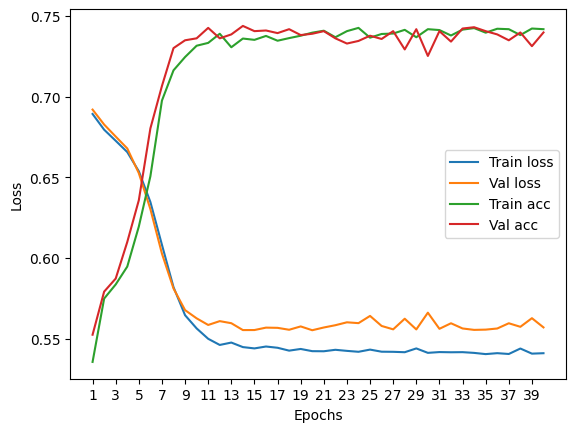

****************************************************************************************************



Particles per jet: 15


118it [00:00, 209.65it/s]


Train Epoch: 0 	Loss: 0.695473, Accuracy: 4001/7500 (53%)
Val Epoch: 0 	Loss: 0.704269, Accuracy: 1388/2500 (56%)



118it [00:00, 191.20it/s]


Train Epoch: 1 	Loss: 0.685020, Accuracy: 4315/7500 (58%)
Val Epoch: 1 	Loss: 0.703595, Accuracy: 1363/2500 (55%)



118it [00:00, 193.17it/s]


Train Epoch: 2 	Loss: 0.677661, Accuracy: 4361/7500 (58%)
Val Epoch: 2 	Loss: 0.689261, Accuracy: 1462/2500 (58%)



118it [00:00, 186.75it/s]


Train Epoch: 3 	Loss: 0.672391, Accuracy: 4413/7500 (59%)
Val Epoch: 3 	Loss: 0.681924, Accuracy: 1494/2500 (60%)



118it [00:00, 189.71it/s]


Train Epoch: 4 	Loss: 0.663296, Accuracy: 4566/7500 (61%)
Val Epoch: 4 	Loss: 0.684718, Accuracy: 1501/2500 (60%)



118it [00:00, 137.48it/s]


Train Epoch: 5 	Loss: 0.646972, Accuracy: 4757/7500 (63%)
Val Epoch: 5 	Loss: 0.658141, Accuracy: 1594/2500 (64%)



118it [00:00, 131.08it/s]


Train Epoch: 6 	Loss: 0.615040, Accuracy: 5133/7500 (68%)
Val Epoch: 6 	Loss: 0.613433, Accuracy: 1762/2500 (70%)



118it [00:00, 139.90it/s]


Train Epoch: 7 	Loss: 0.582330, Accuracy: 5385/7500 (72%)
Val Epoch: 7 	Loss: 0.601602, Accuracy: 1821/2500 (73%)



118it [00:00, 178.49it/s]


Train Epoch: 8 	Loss: 0.565378, Accuracy: 5437/7500 (72%)
Val Epoch: 8 	Loss: 0.568542, Accuracy: 1843/2500 (74%)



118it [00:00, 179.46it/s]


Train Epoch: 9 	Loss: 0.552962, Accuracy: 5484/7500 (73%)
Val Epoch: 9 	Loss: 0.562809, Accuracy: 1844/2500 (74%)



118it [00:00, 178.60it/s]


Train Epoch: 10 	Loss: 0.547486, Accuracy: 5526/7500 (74%)
Val Epoch: 10 	Loss: 0.564611, Accuracy: 1849/2500 (74%)



118it [00:00, 176.15it/s]


Train Epoch: 11 	Loss: 0.544095, Accuracy: 5501/7500 (73%)
Val Epoch: 11 	Loss: 0.568442, Accuracy: 1842/2500 (74%)



118it [00:00, 190.81it/s]


Train Epoch: 12 	Loss: 0.542483, Accuracy: 5545/7500 (74%)
Val Epoch: 12 	Loss: 0.571227, Accuracy: 1846/2500 (74%)



118it [00:00, 143.74it/s]


Train Epoch: 13 	Loss: 0.541445, Accuracy: 5535/7500 (74%)
Val Epoch: 13 	Loss: 0.557431, Accuracy: 1842/2500 (74%)



118it [00:00, 141.57it/s]


Train Epoch: 14 	Loss: 0.539741, Accuracy: 5535/7500 (74%)
Val Epoch: 14 	Loss: 0.561940, Accuracy: 1853/2500 (74%)



118it [00:00, 122.04it/s]


Train Epoch: 15 	Loss: 0.543791, Accuracy: 5520/7500 (74%)
Val Epoch: 15 	Loss: 0.562987, Accuracy: 1845/2500 (74%)



118it [00:00, 129.19it/s]


Train Epoch: 16 	Loss: 0.542828, Accuracy: 5521/7500 (74%)
Val Epoch: 16 	Loss: 0.561771, Accuracy: 1851/2500 (74%)



118it [00:00, 175.88it/s]


Train Epoch: 17 	Loss: 0.538744, Accuracy: 5553/7500 (74%)
Val Epoch: 17 	Loss: 0.557158, Accuracy: 1844/2500 (74%)



118it [00:00, 174.09it/s]


Train Epoch: 18 	Loss: 0.539479, Accuracy: 5535/7500 (74%)
Val Epoch: 18 	Loss: 0.552977, Accuracy: 1846/2500 (74%)



118it [00:00, 189.96it/s]


Train Epoch: 19 	Loss: 0.541678, Accuracy: 5527/7500 (74%)
Val Epoch: 19 	Loss: 0.574510, Accuracy: 1822/2500 (73%)



118it [00:00, 193.03it/s]


Train Epoch: 20 	Loss: 0.540318, Accuracy: 5532/7500 (74%)
Val Epoch: 20 	Loss: 0.557425, Accuracy: 1858/2500 (74%)



118it [00:00, 179.42it/s]


Train Epoch: 21 	Loss: 0.538846, Accuracy: 5565/7500 (74%)
Val Epoch: 21 	Loss: 0.551973, Accuracy: 1854/2500 (74%)



118it [00:00, 145.00it/s]


Train Epoch: 22 	Loss: 0.538972, Accuracy: 5555/7500 (74%)
Val Epoch: 22 	Loss: 0.552882, Accuracy: 1836/2500 (73%)



118it [00:00, 159.58it/s]


Train Epoch: 23 	Loss: 0.539963, Accuracy: 5560/7500 (74%)
Val Epoch: 23 	Loss: 0.560519, Accuracy: 1823/2500 (73%)



118it [00:00, 167.85it/s]


Train Epoch: 24 	Loss: 0.539007, Accuracy: 5539/7500 (74%)
Val Epoch: 24 	Loss: 0.559915, Accuracy: 1836/2500 (73%)



118it [00:00, 147.48it/s]


Train Epoch: 25 	Loss: 0.537809, Accuracy: 5569/7500 (74%)
Val Epoch: 25 	Loss: 0.553880, Accuracy: 1847/2500 (74%)



118it [00:00, 180.34it/s]


Train Epoch: 26 	Loss: 0.539473, Accuracy: 5529/7500 (74%)
Val Epoch: 26 	Loss: 0.550693, Accuracy: 1849/2500 (74%)



118it [00:00, 179.27it/s]


Train Epoch: 27 	Loss: 0.536915, Accuracy: 5565/7500 (74%)
Val Epoch: 27 	Loss: 0.551941, Accuracy: 1855/2500 (74%)



118it [00:00, 182.13it/s]


Train Epoch: 28 	Loss: 0.539714, Accuracy: 5549/7500 (74%)
Val Epoch: 28 	Loss: 0.558911, Accuracy: 1844/2500 (74%)



118it [00:00, 189.21it/s]


Train Epoch: 29 	Loss: 0.537909, Accuracy: 5565/7500 (74%)
Val Epoch: 29 	Loss: 0.559568, Accuracy: 1852/2500 (74%)



118it [00:00, 191.24it/s]


Train Epoch: 30 	Loss: 0.540759, Accuracy: 5544/7500 (74%)
Val Epoch: 30 	Loss: 0.557765, Accuracy: 1849/2500 (74%)



118it [00:00, 178.10it/s]


Train Epoch: 31 	Loss: 0.538743, Accuracy: 5543/7500 (74%)
Val Epoch: 31 	Loss: 0.563731, Accuracy: 1840/2500 (74%)



118it [00:00, 180.76it/s]


Train Epoch: 32 	Loss: 0.537722, Accuracy: 5551/7500 (74%)
Val Epoch: 32 	Loss: 0.552086, Accuracy: 1851/2500 (74%)



118it [00:00, 190.11it/s]


Train Epoch: 33 	Loss: 0.538151, Accuracy: 5553/7500 (74%)
Val Epoch: 33 	Loss: 0.555966, Accuracy: 1847/2500 (74%)



118it [00:00, 189.01it/s]


Train Epoch: 34 	Loss: 0.536209, Accuracy: 5540/7500 (74%)
Val Epoch: 34 	Loss: 0.562112, Accuracy: 1838/2500 (74%)



118it [00:00, 193.06it/s]


Train Epoch: 35 	Loss: 0.537299, Accuracy: 5549/7500 (74%)
Val Epoch: 35 	Loss: 0.565636, Accuracy: 1844/2500 (74%)



118it [00:00, 186.47it/s]


Train Epoch: 36 	Loss: 0.538354, Accuracy: 5558/7500 (74%)
Val Epoch: 36 	Loss: 0.549577, Accuracy: 1860/2500 (74%)



118it [00:00, 189.21it/s]


Train Epoch: 37 	Loss: 0.537320, Accuracy: 5533/7500 (74%)
Val Epoch: 37 	Loss: 0.594117, Accuracy: 1815/2500 (73%)



118it [00:00, 182.37it/s]


Train Epoch: 38 	Loss: 0.537234, Accuracy: 5559/7500 (74%)
Val Epoch: 38 	Loss: 0.557877, Accuracy: 1847/2500 (74%)



118it [00:00, 175.33it/s]


Train Epoch: 39 	Loss: 0.536702, Accuracy: 5539/7500 (74%)
Val Epoch: 39 	Loss: 0.553110, Accuracy: 1849/2500 (74%)

Test accuracy:  75.88000000000001


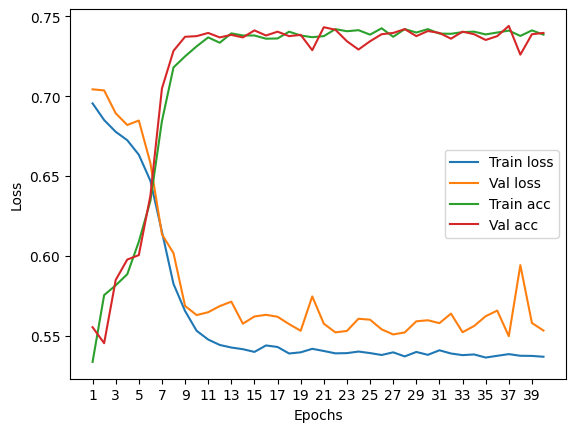

****************************************************************************************************



118it [00:00, 178.39it/s]


Train Epoch: 0 	Loss: 0.694917, Accuracy: 4007/7500 (53%)
Val Epoch: 0 	Loss: 0.705431, Accuracy: 1322/2500 (53%)



118it [00:00, 151.99it/s]


Train Epoch: 1 	Loss: 0.687304, Accuracy: 4160/7500 (55%)
Val Epoch: 1 	Loss: 0.685216, Accuracy: 1492/2500 (60%)



118it [00:00, 163.67it/s]


Train Epoch: 2 	Loss: 0.670053, Accuracy: 4563/7500 (61%)
Val Epoch: 2 	Loss: 0.667423, Accuracy: 1563/2500 (63%)



118it [00:00, 176.94it/s]


Train Epoch: 3 	Loss: 0.647822, Accuracy: 4798/7500 (64%)
Val Epoch: 3 	Loss: 0.632902, Accuracy: 1698/2500 (68%)



118it [00:00, 145.52it/s]


Train Epoch: 4 	Loss: 0.615172, Accuracy: 5177/7500 (69%)
Val Epoch: 4 	Loss: 0.601432, Accuracy: 1810/2500 (72%)



118it [00:00, 165.99it/s]


Train Epoch: 5 	Loss: 0.592425, Accuracy: 5333/7500 (71%)
Val Epoch: 5 	Loss: 0.586570, Accuracy: 1839/2500 (74%)



118it [00:00, 152.65it/s]


Train Epoch: 6 	Loss: 0.575888, Accuracy: 5418/7500 (72%)
Val Epoch: 6 	Loss: 0.564774, Accuracy: 1849/2500 (74%)



118it [00:00, 168.42it/s]


Train Epoch: 7 	Loss: 0.567434, Accuracy: 5432/7500 (72%)
Val Epoch: 7 	Loss: 0.560845, Accuracy: 1865/2500 (75%)



118it [00:00, 185.92it/s]


Train Epoch: 8 	Loss: 0.558962, Accuracy: 5467/7500 (73%)
Val Epoch: 8 	Loss: 0.547280, Accuracy: 1875/2500 (75%)



118it [00:00, 185.71it/s]


Train Epoch: 9 	Loss: 0.554031, Accuracy: 5493/7500 (73%)
Val Epoch: 9 	Loss: 0.540478, Accuracy: 1873/2500 (75%)



118it [00:00, 180.06it/s]


Train Epoch: 10 	Loss: 0.553922, Accuracy: 5513/7500 (74%)
Val Epoch: 10 	Loss: 0.543302, Accuracy: 1870/2500 (75%)



118it [00:00, 188.27it/s]


Train Epoch: 11 	Loss: 0.552483, Accuracy: 5493/7500 (73%)
Val Epoch: 11 	Loss: 0.539833, Accuracy: 1865/2500 (75%)



118it [00:00, 188.18it/s]


Train Epoch: 12 	Loss: 0.552891, Accuracy: 5498/7500 (73%)
Val Epoch: 12 	Loss: 0.539194, Accuracy: 1881/2500 (75%)



118it [00:00, 191.28it/s]


Train Epoch: 13 	Loss: 0.553588, Accuracy: 5477/7500 (73%)
Val Epoch: 13 	Loss: 0.539476, Accuracy: 1867/2500 (75%)



118it [00:00, 194.03it/s]


Train Epoch: 14 	Loss: 0.551353, Accuracy: 5485/7500 (73%)
Val Epoch: 14 	Loss: 0.543050, Accuracy: 1878/2500 (75%)



118it [00:00, 176.59it/s]


Train Epoch: 15 	Loss: 0.553643, Accuracy: 5498/7500 (73%)
Val Epoch: 15 	Loss: 0.533502, Accuracy: 1881/2500 (75%)



118it [00:00, 174.75it/s]


Train Epoch: 16 	Loss: 0.552581, Accuracy: 5520/7500 (74%)
Val Epoch: 16 	Loss: 0.539016, Accuracy: 1874/2500 (75%)



118it [00:00, 167.47it/s]


Train Epoch: 17 	Loss: 0.550611, Accuracy: 5496/7500 (73%)
Val Epoch: 17 	Loss: 0.539755, Accuracy: 1871/2500 (75%)



118it [00:00, 151.64it/s]


Train Epoch: 18 	Loss: 0.552103, Accuracy: 5505/7500 (73%)
Val Epoch: 18 	Loss: 0.536868, Accuracy: 1878/2500 (75%)



118it [00:01, 69.30it/s]


Train Epoch: 19 	Loss: 0.553755, Accuracy: 5482/7500 (73%)
Val Epoch: 19 	Loss: 0.538376, Accuracy: 1861/2500 (74%)



118it [00:00, 123.06it/s]


Train Epoch: 20 	Loss: 0.549675, Accuracy: 5516/7500 (74%)
Val Epoch: 20 	Loss: 0.549589, Accuracy: 1888/2500 (76%)



118it [00:00, 167.46it/s]


Train Epoch: 21 	Loss: 0.550887, Accuracy: 5523/7500 (74%)
Val Epoch: 21 	Loss: 0.547674, Accuracy: 1888/2500 (76%)



118it [00:00, 176.76it/s]


Train Epoch: 22 	Loss: 0.550906, Accuracy: 5523/7500 (74%)
Val Epoch: 22 	Loss: 0.550428, Accuracy: 1884/2500 (75%)



118it [00:00, 188.32it/s]


Train Epoch: 23 	Loss: 0.551057, Accuracy: 5515/7500 (74%)
Val Epoch: 23 	Loss: 0.541681, Accuracy: 1879/2500 (75%)



118it [00:00, 195.81it/s]


Train Epoch: 24 	Loss: 0.551123, Accuracy: 5519/7500 (74%)
Val Epoch: 24 	Loss: 0.542704, Accuracy: 1881/2500 (75%)



118it [00:00, 194.83it/s]


Train Epoch: 25 	Loss: 0.549997, Accuracy: 5527/7500 (74%)
Val Epoch: 25 	Loss: 0.554939, Accuracy: 1875/2500 (75%)



118it [00:00, 170.58it/s]


Train Epoch: 26 	Loss: 0.550370, Accuracy: 5518/7500 (74%)
Val Epoch: 26 	Loss: 0.539126, Accuracy: 1882/2500 (75%)



118it [00:00, 189.01it/s]


Train Epoch: 27 	Loss: 0.549097, Accuracy: 5515/7500 (74%)
Val Epoch: 27 	Loss: 0.544241, Accuracy: 1881/2500 (75%)



118it [00:00, 167.93it/s]


Train Epoch: 28 	Loss: 0.550057, Accuracy: 5519/7500 (74%)
Val Epoch: 28 	Loss: 0.552649, Accuracy: 1875/2500 (75%)



118it [00:00, 188.51it/s]


Train Epoch: 29 	Loss: 0.550905, Accuracy: 5523/7500 (74%)
Val Epoch: 29 	Loss: 0.544749, Accuracy: 1870/2500 (75%)



118it [00:00, 189.10it/s]


Train Epoch: 30 	Loss: 0.551697, Accuracy: 5517/7500 (74%)
Val Epoch: 30 	Loss: 0.538564, Accuracy: 1868/2500 (75%)



118it [00:00, 177.46it/s]


Train Epoch: 31 	Loss: 0.552966, Accuracy: 5530/7500 (74%)
Val Epoch: 31 	Loss: 0.536597, Accuracy: 1869/2500 (75%)



118it [00:00, 183.55it/s]


Train Epoch: 32 	Loss: 0.549173, Accuracy: 5517/7500 (74%)
Val Epoch: 32 	Loss: 0.554404, Accuracy: 1881/2500 (75%)



118it [00:00, 193.65it/s]


Train Epoch: 33 	Loss: 0.551413, Accuracy: 5531/7500 (74%)
Val Epoch: 33 	Loss: 0.537299, Accuracy: 1882/2500 (75%)



118it [00:00, 197.34it/s]


Train Epoch: 34 	Loss: 0.550309, Accuracy: 5505/7500 (73%)
Val Epoch: 34 	Loss: 0.537219, Accuracy: 1883/2500 (75%)



118it [00:00, 119.23it/s]


Train Epoch: 35 	Loss: 0.552652, Accuracy: 5513/7500 (74%)
Val Epoch: 35 	Loss: 0.557308, Accuracy: 1870/2500 (75%)



118it [00:00, 119.98it/s]


Train Epoch: 36 	Loss: 0.551680, Accuracy: 5534/7500 (74%)
Val Epoch: 36 	Loss: 0.538471, Accuracy: 1891/2500 (76%)



118it [00:00, 142.47it/s]


Train Epoch: 37 	Loss: 0.551889, Accuracy: 5498/7500 (73%)
Val Epoch: 37 	Loss: 0.542908, Accuracy: 1862/2500 (74%)



118it [00:00, 168.96it/s]


Train Epoch: 38 	Loss: 0.549271, Accuracy: 5555/7500 (74%)
Val Epoch: 38 	Loss: 0.544846, Accuracy: 1862/2500 (74%)



118it [00:00, 192.24it/s]


Train Epoch: 39 	Loss: 0.551864, Accuracy: 5505/7500 (73%)
Val Epoch: 39 	Loss: 0.549989, Accuracy: 1870/2500 (75%)

Test accuracy:  73.04


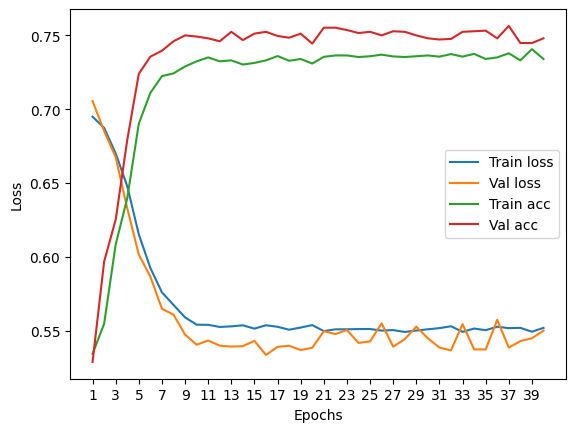

****************************************************************************************************



118it [00:00, 189.62it/s]


Train Epoch: 0 	Loss: 0.697169, Accuracy: 3880/7500 (52%)
Val Epoch: 0 	Loss: 0.704844, Accuracy: 1357/2500 (54%)



118it [00:00, 200.57it/s]


Train Epoch: 1 	Loss: 0.684723, Accuracy: 4274/7500 (57%)
Val Epoch: 1 	Loss: 0.692477, Accuracy: 1474/2500 (59%)



118it [00:00, 194.47it/s]


Train Epoch: 2 	Loss: 0.663178, Accuracy: 4596/7500 (61%)
Val Epoch: 2 	Loss: 0.655990, Accuracy: 1613/2500 (65%)



118it [00:00, 191.96it/s]


Train Epoch: 3 	Loss: 0.626457, Accuracy: 5048/7500 (67%)
Val Epoch: 3 	Loss: 0.627440, Accuracy: 1712/2500 (68%)



118it [00:00, 195.68it/s]


Train Epoch: 4 	Loss: 0.588101, Accuracy: 5322/7500 (71%)
Val Epoch: 4 	Loss: 0.586936, Accuracy: 1831/2500 (73%)



118it [00:00, 190.40it/s]


Train Epoch: 5 	Loss: 0.561160, Accuracy: 5497/7500 (73%)
Val Epoch: 5 	Loss: 0.565749, Accuracy: 1848/2500 (74%)



118it [00:00, 192.24it/s]


Train Epoch: 6 	Loss: 0.550819, Accuracy: 5515/7500 (74%)
Val Epoch: 6 	Loss: 0.561980, Accuracy: 1856/2500 (74%)



118it [00:00, 190.43it/s]


Train Epoch: 7 	Loss: 0.543282, Accuracy: 5564/7500 (74%)
Val Epoch: 7 	Loss: 0.555213, Accuracy: 1840/2500 (74%)



118it [00:00, 195.79it/s]


Train Epoch: 8 	Loss: 0.539649, Accuracy: 5553/7500 (74%)
Val Epoch: 8 	Loss: 0.550681, Accuracy: 1859/2500 (74%)



118it [00:00, 189.01it/s]


Train Epoch: 9 	Loss: 0.539671, Accuracy: 5543/7500 (74%)
Val Epoch: 9 	Loss: 0.551876, Accuracy: 1861/2500 (74%)



118it [00:00, 192.94it/s]


Train Epoch: 10 	Loss: 0.535719, Accuracy: 5583/7500 (74%)
Val Epoch: 10 	Loss: 0.546043, Accuracy: 1855/2500 (74%)



118it [00:00, 188.60it/s]


Train Epoch: 11 	Loss: 0.536903, Accuracy: 5599/7500 (75%)
Val Epoch: 11 	Loss: 0.551706, Accuracy: 1856/2500 (74%)



118it [00:00, 193.46it/s]


Train Epoch: 12 	Loss: 0.534983, Accuracy: 5568/7500 (74%)
Val Epoch: 12 	Loss: 0.548565, Accuracy: 1853/2500 (74%)



118it [00:00, 184.95it/s]


Train Epoch: 13 	Loss: 0.536314, Accuracy: 5580/7500 (74%)
Val Epoch: 13 	Loss: 0.566423, Accuracy: 1855/2500 (74%)



118it [00:00, 126.83it/s]


Train Epoch: 14 	Loss: 0.535631, Accuracy: 5591/7500 (75%)
Val Epoch: 14 	Loss: 0.557081, Accuracy: 1862/2500 (74%)



118it [00:00, 129.89it/s]


Train Epoch: 15 	Loss: 0.533448, Accuracy: 5579/7500 (74%)
Val Epoch: 15 	Loss: 0.548681, Accuracy: 1857/2500 (74%)



118it [00:00, 142.71it/s]


Train Epoch: 16 	Loss: 0.533951, Accuracy: 5575/7500 (74%)
Val Epoch: 16 	Loss: 0.558347, Accuracy: 1853/2500 (74%)



118it [00:00, 193.83it/s]


Train Epoch: 17 	Loss: 0.534557, Accuracy: 5566/7500 (74%)
Val Epoch: 17 	Loss: 0.552203, Accuracy: 1866/2500 (75%)



118it [00:00, 183.21it/s]


Train Epoch: 18 	Loss: 0.538266, Accuracy: 5563/7500 (74%)
Val Epoch: 18 	Loss: 0.552557, Accuracy: 1846/2500 (74%)



118it [00:00, 187.61it/s]


Train Epoch: 19 	Loss: 0.534025, Accuracy: 5603/7500 (75%)
Val Epoch: 19 	Loss: 0.543935, Accuracy: 1860/2500 (74%)



118it [00:00, 182.04it/s]


Train Epoch: 20 	Loss: 0.533696, Accuracy: 5589/7500 (75%)
Val Epoch: 20 	Loss: 0.545271, Accuracy: 1854/2500 (74%)



118it [00:00, 189.56it/s]


Train Epoch: 21 	Loss: 0.538886, Accuracy: 5587/7500 (74%)
Val Epoch: 21 	Loss: 0.554481, Accuracy: 1860/2500 (74%)



118it [00:00, 184.26it/s]


Train Epoch: 22 	Loss: 0.533290, Accuracy: 5589/7500 (75%)
Val Epoch: 22 	Loss: 0.551215, Accuracy: 1864/2500 (75%)



118it [00:00, 190.88it/s]


Train Epoch: 23 	Loss: 0.535376, Accuracy: 5570/7500 (74%)
Val Epoch: 23 	Loss: 0.547304, Accuracy: 1858/2500 (74%)



118it [00:00, 174.05it/s]


Train Epoch: 24 	Loss: 0.534764, Accuracy: 5608/7500 (75%)
Val Epoch: 24 	Loss: 0.542339, Accuracy: 1860/2500 (74%)



118it [00:00, 173.50it/s]


Train Epoch: 25 	Loss: 0.535349, Accuracy: 5604/7500 (75%)
Val Epoch: 25 	Loss: 0.565483, Accuracy: 1863/2500 (75%)



118it [00:00, 186.04it/s]


Train Epoch: 26 	Loss: 0.533791, Accuracy: 5600/7500 (75%)
Val Epoch: 26 	Loss: 0.548714, Accuracy: 1863/2500 (75%)



118it [00:00, 186.23it/s]


Train Epoch: 27 	Loss: 0.532581, Accuracy: 5583/7500 (74%)
Val Epoch: 27 	Loss: 0.552945, Accuracy: 1865/2500 (75%)



118it [00:00, 179.25it/s]


Train Epoch: 28 	Loss: 0.534942, Accuracy: 5589/7500 (75%)
Val Epoch: 28 	Loss: 0.550986, Accuracy: 1865/2500 (75%)



118it [00:00, 187.46it/s]


Train Epoch: 29 	Loss: 0.535042, Accuracy: 5596/7500 (75%)
Val Epoch: 29 	Loss: 0.559647, Accuracy: 1865/2500 (75%)



118it [00:00, 190.35it/s]


Train Epoch: 30 	Loss: 0.533557, Accuracy: 5602/7500 (75%)
Val Epoch: 30 	Loss: 0.554831, Accuracy: 1859/2500 (74%)



118it [00:00, 194.92it/s]


Train Epoch: 31 	Loss: 0.532522, Accuracy: 5590/7500 (75%)
Val Epoch: 31 	Loss: 0.549001, Accuracy: 1867/2500 (75%)



118it [00:00, 149.75it/s]


Train Epoch: 32 	Loss: 0.534970, Accuracy: 5605/7500 (75%)
Val Epoch: 32 	Loss: 0.557048, Accuracy: 1847/2500 (74%)



118it [00:00, 161.05it/s]


Train Epoch: 33 	Loss: 0.535105, Accuracy: 5536/7500 (74%)
Val Epoch: 33 	Loss: 0.551748, Accuracy: 1859/2500 (74%)



118it [00:00, 154.20it/s]


Train Epoch: 34 	Loss: 0.532483, Accuracy: 5590/7500 (75%)
Val Epoch: 34 	Loss: 0.546759, Accuracy: 1864/2500 (75%)



118it [00:00, 178.18it/s]


Train Epoch: 35 	Loss: 0.533044, Accuracy: 5589/7500 (75%)
Val Epoch: 35 	Loss: 0.568337, Accuracy: 1860/2500 (74%)



118it [00:00, 183.25it/s]


Train Epoch: 36 	Loss: 0.532250, Accuracy: 5594/7500 (75%)
Val Epoch: 36 	Loss: 0.544346, Accuracy: 1860/2500 (74%)



118it [00:00, 192.58it/s]


Train Epoch: 37 	Loss: 0.532429, Accuracy: 5565/7500 (74%)
Val Epoch: 37 	Loss: 0.539532, Accuracy: 1863/2500 (75%)



118it [00:00, 193.65it/s]


Train Epoch: 38 	Loss: 0.534827, Accuracy: 5575/7500 (74%)
Val Epoch: 38 	Loss: 0.556503, Accuracy: 1863/2500 (75%)



118it [00:00, 187.90it/s]


Train Epoch: 39 	Loss: 0.532727, Accuracy: 5583/7500 (74%)
Val Epoch: 39 	Loss: 0.547567, Accuracy: 1865/2500 (75%)

Test accuracy:  74.16


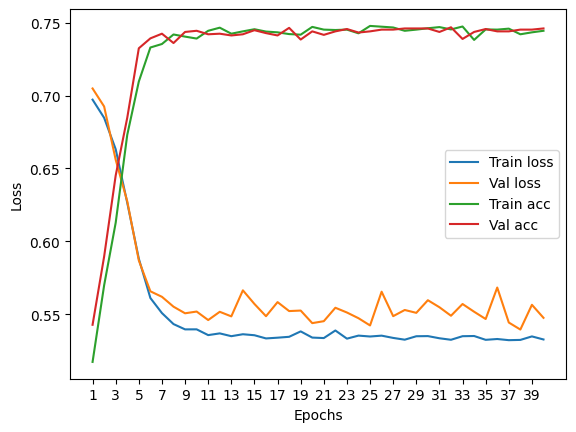

****************************************************************************************************



118it [00:01, 114.31it/s]


Train Epoch: 0 	Loss: 0.695864, Accuracy: 3972/7500 (53%)
Val Epoch: 0 	Loss: 0.701904, Accuracy: 1394/2500 (56%)



118it [00:00, 137.40it/s]


Train Epoch: 1 	Loss: 0.686324, Accuracy: 4270/7500 (57%)
Val Epoch: 1 	Loss: 0.693819, Accuracy: 1432/2500 (57%)



118it [00:00, 157.96it/s]


Train Epoch: 2 	Loss: 0.677729, Accuracy: 4410/7500 (59%)
Val Epoch: 2 	Loss: 0.685594, Accuracy: 1479/2500 (59%)



118it [00:00, 154.48it/s]


Train Epoch: 3 	Loss: 0.671053, Accuracy: 4470/7500 (60%)
Val Epoch: 3 	Loss: 0.672986, Accuracy: 1521/2500 (61%)



118it [00:00, 170.45it/s]


Train Epoch: 4 	Loss: 0.660518, Accuracy: 4646/7500 (62%)
Val Epoch: 4 	Loss: 0.656344, Accuracy: 1610/2500 (64%)



118it [00:00, 139.01it/s]


Train Epoch: 5 	Loss: 0.640210, Accuracy: 4867/7500 (65%)
Val Epoch: 5 	Loss: 0.633620, Accuracy: 1686/2500 (67%)



118it [00:00, 123.83it/s]


Train Epoch: 6 	Loss: 0.619603, Accuracy: 5081/7500 (68%)
Val Epoch: 6 	Loss: 0.618410, Accuracy: 1747/2500 (70%)



118it [00:00, 176.63it/s]


Train Epoch: 7 	Loss: 0.598314, Accuracy: 5269/7500 (70%)
Val Epoch: 7 	Loss: 0.596849, Accuracy: 1756/2500 (70%)



118it [00:00, 183.90it/s]


Train Epoch: 8 	Loss: 0.581583, Accuracy: 5349/7500 (71%)
Val Epoch: 8 	Loss: 0.584929, Accuracy: 1796/2500 (72%)



118it [00:00, 156.20it/s]


Train Epoch: 9 	Loss: 0.566968, Accuracy: 5455/7500 (73%)
Val Epoch: 9 	Loss: 0.575188, Accuracy: 1793/2500 (72%)



118it [00:01, 99.67it/s] 


Train Epoch: 10 	Loss: 0.560497, Accuracy: 5476/7500 (73%)
Val Epoch: 10 	Loss: 0.562231, Accuracy: 1793/2500 (72%)



118it [00:00, 120.44it/s]


Train Epoch: 11 	Loss: 0.553586, Accuracy: 5477/7500 (73%)
Val Epoch: 11 	Loss: 0.565312, Accuracy: 1811/2500 (72%)



118it [00:01, 67.58it/s]


Train Epoch: 12 	Loss: 0.550982, Accuracy: 5498/7500 (73%)
Val Epoch: 12 	Loss: 0.558888, Accuracy: 1810/2500 (72%)



118it [00:00, 127.66it/s]


Train Epoch: 13 	Loss: 0.546745, Accuracy: 5505/7500 (73%)
Val Epoch: 13 	Loss: 0.576745, Accuracy: 1765/2500 (71%)



118it [00:00, 155.96it/s]


Train Epoch: 14 	Loss: 0.544991, Accuracy: 5517/7500 (74%)
Val Epoch: 14 	Loss: 0.566348, Accuracy: 1784/2500 (71%)



118it [00:00, 172.23it/s]


Train Epoch: 15 	Loss: 0.545141, Accuracy: 5497/7500 (73%)
Val Epoch: 15 	Loss: 0.555134, Accuracy: 1807/2500 (72%)



118it [00:00, 203.00it/s]


Train Epoch: 16 	Loss: 0.543466, Accuracy: 5512/7500 (73%)
Val Epoch: 16 	Loss: 0.557751, Accuracy: 1799/2500 (72%)



118it [00:00, 159.98it/s]


Train Epoch: 17 	Loss: 0.541698, Accuracy: 5515/7500 (74%)
Val Epoch: 17 	Loss: 0.550063, Accuracy: 1825/2500 (73%)



118it [00:00, 187.94it/s]


Train Epoch: 18 	Loss: 0.542909, Accuracy: 5537/7500 (74%)
Val Epoch: 18 	Loss: 0.553944, Accuracy: 1805/2500 (72%)



118it [00:00, 207.09it/s]


Train Epoch: 19 	Loss: 0.539789, Accuracy: 5567/7500 (74%)
Val Epoch: 19 	Loss: 0.547140, Accuracy: 1826/2500 (73%)



118it [00:00, 211.97it/s]


Train Epoch: 20 	Loss: 0.542517, Accuracy: 5522/7500 (74%)
Val Epoch: 20 	Loss: 0.562342, Accuracy: 1832/2500 (73%)



118it [00:00, 214.37it/s]


Train Epoch: 21 	Loss: 0.542598, Accuracy: 5522/7500 (74%)
Val Epoch: 21 	Loss: 0.553391, Accuracy: 1824/2500 (73%)



118it [00:00, 225.35it/s]


Train Epoch: 22 	Loss: 0.542563, Accuracy: 5533/7500 (74%)
Val Epoch: 22 	Loss: 0.563762, Accuracy: 1825/2500 (73%)



118it [00:00, 223.27it/s]


Train Epoch: 23 	Loss: 0.542195, Accuracy: 5540/7500 (74%)
Val Epoch: 23 	Loss: 0.553492, Accuracy: 1821/2500 (73%)



118it [00:00, 217.61it/s]


Train Epoch: 24 	Loss: 0.543213, Accuracy: 5520/7500 (74%)
Val Epoch: 24 	Loss: 0.555589, Accuracy: 1829/2500 (73%)



118it [00:00, 221.51it/s]


Train Epoch: 25 	Loss: 0.541835, Accuracy: 5565/7500 (74%)
Val Epoch: 25 	Loss: 0.563579, Accuracy: 1812/2500 (72%)



118it [00:00, 199.08it/s]


Train Epoch: 26 	Loss: 0.540313, Accuracy: 5553/7500 (74%)
Val Epoch: 26 	Loss: 0.556562, Accuracy: 1808/2500 (72%)



118it [00:00, 192.80it/s]


Train Epoch: 27 	Loss: 0.541488, Accuracy: 5527/7500 (74%)
Val Epoch: 27 	Loss: 0.557918, Accuracy: 1806/2500 (72%)



118it [00:00, 216.37it/s]


Train Epoch: 28 	Loss: 0.538901, Accuracy: 5540/7500 (74%)
Val Epoch: 28 	Loss: 0.560779, Accuracy: 1803/2500 (72%)



118it [00:00, 182.14it/s]


Train Epoch: 29 	Loss: 0.540140, Accuracy: 5533/7500 (74%)
Val Epoch: 29 	Loss: 0.554787, Accuracy: 1834/2500 (73%)



118it [00:00, 141.06it/s]


Train Epoch: 30 	Loss: 0.540935, Accuracy: 5559/7500 (74%)
Val Epoch: 30 	Loss: 0.564527, Accuracy: 1812/2500 (72%)



118it [00:00, 154.10it/s]


Train Epoch: 31 	Loss: 0.542706, Accuracy: 5526/7500 (74%)
Val Epoch: 31 	Loss: 0.557752, Accuracy: 1798/2500 (72%)



118it [00:00, 168.49it/s]


Train Epoch: 32 	Loss: 0.541733, Accuracy: 5527/7500 (74%)
Val Epoch: 32 	Loss: 0.557294, Accuracy: 1810/2500 (72%)



118it [00:00, 191.96it/s]


Train Epoch: 33 	Loss: 0.541689, Accuracy: 5535/7500 (74%)
Val Epoch: 33 	Loss: 0.569008, Accuracy: 1834/2500 (73%)



118it [00:00, 209.49it/s]


Train Epoch: 34 	Loss: 0.540108, Accuracy: 5550/7500 (74%)
Val Epoch: 34 	Loss: 0.560979, Accuracy: 1841/2500 (74%)



118it [00:00, 155.06it/s]


Train Epoch: 35 	Loss: 0.540619, Accuracy: 5549/7500 (74%)
Val Epoch: 35 	Loss: 0.552235, Accuracy: 1816/2500 (73%)



118it [00:00, 169.03it/s]


Train Epoch: 36 	Loss: 0.540790, Accuracy: 5515/7500 (74%)
Val Epoch: 36 	Loss: 0.559401, Accuracy: 1815/2500 (73%)



118it [00:00, 179.90it/s]


Train Epoch: 37 	Loss: 0.544028, Accuracy: 5515/7500 (74%)
Val Epoch: 37 	Loss: 0.561256, Accuracy: 1827/2500 (73%)



118it [00:00, 216.86it/s]


Train Epoch: 38 	Loss: 0.538998, Accuracy: 5549/7500 (74%)
Val Epoch: 38 	Loss: 0.568749, Accuracy: 1807/2500 (72%)



118it [00:00, 217.84it/s]


Train Epoch: 39 	Loss: 0.539564, Accuracy: 5552/7500 (74%)
Val Epoch: 39 	Loss: 0.553235, Accuracy: 1815/2500 (73%)

Test accuracy:  73.36


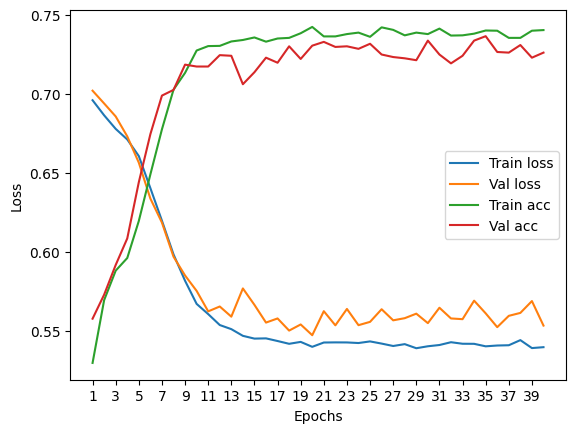

****************************************************************************************************



118it [00:00, 186.93it/s]


Train Epoch: 0 	Loss: 0.698609, Accuracy: 3742/7500 (50%)
Val Epoch: 0 	Loss: 0.711268, Accuracy: 1258/2500 (50%)



118it [00:00, 136.25it/s]


Train Epoch: 1 	Loss: 0.694893, Accuracy: 4028/7500 (54%)
Val Epoch: 1 	Loss: 0.702633, Accuracy: 1493/2500 (60%)



118it [00:00, 169.22it/s]


Train Epoch: 2 	Loss: 0.687159, Accuracy: 4295/7500 (57%)
Val Epoch: 2 	Loss: 0.689948, Accuracy: 1484/2500 (59%)



118it [00:00, 174.36it/s]


Train Epoch: 3 	Loss: 0.676121, Accuracy: 4411/7500 (59%)
Val Epoch: 3 	Loss: 0.680939, Accuracy: 1524/2500 (61%)



118it [00:00, 169.08it/s]


Train Epoch: 4 	Loss: 0.659880, Accuracy: 4683/7500 (62%)
Val Epoch: 4 	Loss: 0.653450, Accuracy: 1639/2500 (66%)



118it [00:00, 133.66it/s]


Train Epoch: 5 	Loss: 0.630893, Accuracy: 5033/7500 (67%)
Val Epoch: 5 	Loss: 0.634922, Accuracy: 1689/2500 (68%)



118it [00:00, 153.37it/s]


Train Epoch: 6 	Loss: 0.603240, Accuracy: 5291/7500 (71%)
Val Epoch: 6 	Loss: 0.610857, Accuracy: 1780/2500 (71%)



118it [00:00, 152.76it/s]


Train Epoch: 7 	Loss: 0.582930, Accuracy: 5381/7500 (72%)
Val Epoch: 7 	Loss: 0.582169, Accuracy: 1823/2500 (73%)



118it [00:00, 162.17it/s]


Train Epoch: 8 	Loss: 0.566054, Accuracy: 5477/7500 (73%)
Val Epoch: 8 	Loss: 0.589506, Accuracy: 1808/2500 (72%)



118it [00:00, 172.14it/s]


Train Epoch: 9 	Loss: 0.557161, Accuracy: 5534/7500 (74%)
Val Epoch: 9 	Loss: 0.578458, Accuracy: 1812/2500 (72%)



118it [00:00, 172.90it/s]


Train Epoch: 10 	Loss: 0.550857, Accuracy: 5526/7500 (74%)
Val Epoch: 10 	Loss: 0.575077, Accuracy: 1819/2500 (73%)



118it [00:00, 163.43it/s]


Train Epoch: 11 	Loss: 0.551291, Accuracy: 5513/7500 (74%)
Val Epoch: 11 	Loss: 0.562556, Accuracy: 1793/2500 (72%)



118it [00:00, 170.86it/s]


Train Epoch: 12 	Loss: 0.546300, Accuracy: 5513/7500 (74%)
Val Epoch: 12 	Loss: 0.559095, Accuracy: 1811/2500 (72%)



118it [00:00, 173.74it/s]


Train Epoch: 13 	Loss: 0.551051, Accuracy: 5486/7500 (73%)
Val Epoch: 13 	Loss: 0.574713, Accuracy: 1813/2500 (73%)



118it [00:00, 167.28it/s]


Train Epoch: 14 	Loss: 0.544745, Accuracy: 5536/7500 (74%)
Val Epoch: 14 	Loss: 0.570594, Accuracy: 1826/2500 (73%)



118it [00:00, 178.41it/s]


Train Epoch: 15 	Loss: 0.548656, Accuracy: 5506/7500 (73%)
Val Epoch: 15 	Loss: 0.559587, Accuracy: 1822/2500 (73%)



118it [00:00, 184.48it/s]


Train Epoch: 16 	Loss: 0.547276, Accuracy: 5535/7500 (74%)
Val Epoch: 16 	Loss: 0.559219, Accuracy: 1819/2500 (73%)



118it [00:00, 169.18it/s]


Train Epoch: 17 	Loss: 0.545270, Accuracy: 5520/7500 (74%)
Val Epoch: 17 	Loss: 0.557276, Accuracy: 1813/2500 (73%)



118it [00:00, 156.56it/s]


Train Epoch: 18 	Loss: 0.546760, Accuracy: 5554/7500 (74%)
Val Epoch: 18 	Loss: 0.572361, Accuracy: 1803/2500 (72%)



118it [00:00, 170.97it/s]


Train Epoch: 19 	Loss: 0.548358, Accuracy: 5502/7500 (73%)
Val Epoch: 19 	Loss: 0.566290, Accuracy: 1813/2500 (73%)



118it [00:00, 172.59it/s]


Train Epoch: 20 	Loss: 0.544847, Accuracy: 5544/7500 (74%)
Val Epoch: 20 	Loss: 0.560181, Accuracy: 1811/2500 (72%)



118it [00:00, 171.40it/s]


Train Epoch: 21 	Loss: 0.543923, Accuracy: 5548/7500 (74%)
Val Epoch: 21 	Loss: 0.569392, Accuracy: 1809/2500 (72%)



118it [00:00, 136.89it/s]


Train Epoch: 22 	Loss: 0.546680, Accuracy: 5544/7500 (74%)
Val Epoch: 22 	Loss: 0.579229, Accuracy: 1802/2500 (72%)



118it [00:00, 143.73it/s]


Train Epoch: 23 	Loss: 0.545073, Accuracy: 5536/7500 (74%)
Val Epoch: 23 	Loss: 0.561265, Accuracy: 1809/2500 (72%)



118it [00:00, 144.59it/s]


Train Epoch: 24 	Loss: 0.544903, Accuracy: 5543/7500 (74%)
Val Epoch: 24 	Loss: 0.562612, Accuracy: 1812/2500 (72%)



118it [00:00, 175.02it/s]


Train Epoch: 25 	Loss: 0.545036, Accuracy: 5540/7500 (74%)
Val Epoch: 25 	Loss: 0.573809, Accuracy: 1814/2500 (73%)



118it [00:00, 178.90it/s]


Train Epoch: 26 	Loss: 0.545851, Accuracy: 5541/7500 (74%)
Val Epoch: 26 	Loss: 0.564792, Accuracy: 1811/2500 (72%)



118it [00:00, 150.27it/s]


Train Epoch: 27 	Loss: 0.544097, Accuracy: 5561/7500 (74%)
Val Epoch: 27 	Loss: 0.577367, Accuracy: 1804/2500 (72%)



118it [00:00, 149.89it/s]


Train Epoch: 28 	Loss: 0.544681, Accuracy: 5553/7500 (74%)
Val Epoch: 28 	Loss: 0.573313, Accuracy: 1808/2500 (72%)



118it [00:00, 156.47it/s]


Train Epoch: 29 	Loss: 0.546557, Accuracy: 5537/7500 (74%)
Val Epoch: 29 	Loss: 0.561930, Accuracy: 1817/2500 (73%)



118it [00:00, 168.92it/s]


Train Epoch: 30 	Loss: 0.546571, Accuracy: 5546/7500 (74%)
Val Epoch: 30 	Loss: 0.569054, Accuracy: 1817/2500 (73%)



118it [00:00, 180.03it/s]


Train Epoch: 31 	Loss: 0.545422, Accuracy: 5539/7500 (74%)
Val Epoch: 31 	Loss: 0.573449, Accuracy: 1808/2500 (72%)



118it [00:00, 182.50it/s]


Train Epoch: 32 	Loss: 0.545534, Accuracy: 5543/7500 (74%)
Val Epoch: 32 	Loss: 0.569618, Accuracy: 1810/2500 (72%)



118it [00:00, 168.35it/s]


Train Epoch: 33 	Loss: 0.544182, Accuracy: 5562/7500 (74%)
Val Epoch: 33 	Loss: 0.564855, Accuracy: 1812/2500 (72%)



118it [00:00, 175.33it/s]


Train Epoch: 34 	Loss: 0.545009, Accuracy: 5563/7500 (74%)
Val Epoch: 34 	Loss: 0.556120, Accuracy: 1814/2500 (73%)



118it [00:00, 174.52it/s]


Train Epoch: 35 	Loss: 0.543186, Accuracy: 5550/7500 (74%)
Val Epoch: 35 	Loss: 0.565019, Accuracy: 1814/2500 (73%)



118it [00:00, 176.90it/s]


Train Epoch: 36 	Loss: 0.544255, Accuracy: 5550/7500 (74%)
Val Epoch: 36 	Loss: 0.565190, Accuracy: 1811/2500 (72%)



118it [00:00, 171.22it/s]


Train Epoch: 37 	Loss: 0.544808, Accuracy: 5546/7500 (74%)
Val Epoch: 37 	Loss: 0.565628, Accuracy: 1812/2500 (72%)



118it [00:00, 170.84it/s]


Train Epoch: 38 	Loss: 0.548026, Accuracy: 5552/7500 (74%)
Val Epoch: 38 	Loss: 0.561735, Accuracy: 1814/2500 (73%)



118it [00:00, 158.58it/s]


Train Epoch: 39 	Loss: 0.544539, Accuracy: 5545/7500 (74%)
Val Epoch: 39 	Loss: 0.565552, Accuracy: 1805/2500 (72%)

Test accuracy:  74.8


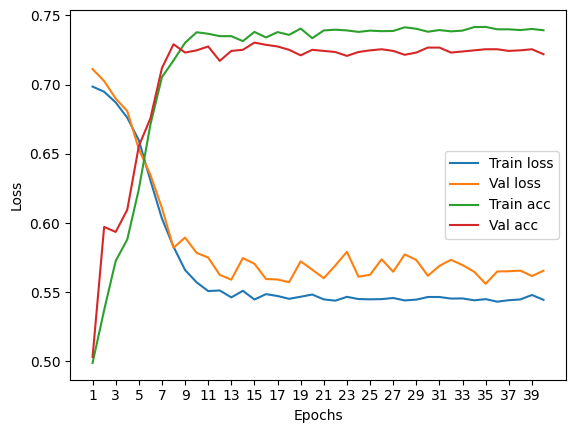

****************************************************************************************************



118it [00:00, 170.70it/s]


Train Epoch: 0 	Loss: 0.695975, Accuracy: 3985/7500 (53%)
Val Epoch: 0 	Loss: 0.702995, Accuracy: 1384/2500 (55%)



118it [00:00, 161.53it/s]


Train Epoch: 1 	Loss: 0.686717, Accuracy: 4264/7500 (57%)
Val Epoch: 1 	Loss: 0.691902, Accuracy: 1460/2500 (58%)



118it [00:00, 167.45it/s]


Train Epoch: 2 	Loss: 0.676848, Accuracy: 4367/7500 (58%)
Val Epoch: 2 	Loss: 0.692748, Accuracy: 1452/2500 (58%)



118it [00:00, 168.80it/s]


Train Epoch: 3 	Loss: 0.660202, Accuracy: 4615/7500 (62%)
Val Epoch: 3 	Loss: 0.659014, Accuracy: 1598/2500 (64%)



118it [00:00, 182.25it/s]


Train Epoch: 4 	Loss: 0.637613, Accuracy: 4936/7500 (66%)
Val Epoch: 4 	Loss: 0.637237, Accuracy: 1671/2500 (67%)



118it [00:00, 179.83it/s]


Train Epoch: 5 	Loss: 0.610809, Accuracy: 5208/7500 (69%)
Val Epoch: 5 	Loss: 0.607665, Accuracy: 1756/2500 (70%)



118it [00:00, 174.39it/s]


Train Epoch: 6 	Loss: 0.591292, Accuracy: 5326/7500 (71%)
Val Epoch: 6 	Loss: 0.597694, Accuracy: 1777/2500 (71%)



118it [00:00, 169.74it/s]


Train Epoch: 7 	Loss: 0.574999, Accuracy: 5455/7500 (73%)
Val Epoch: 7 	Loss: 0.575151, Accuracy: 1797/2500 (72%)



118it [00:00, 166.88it/s]


Train Epoch: 8 	Loss: 0.560040, Accuracy: 5484/7500 (73%)
Val Epoch: 8 	Loss: 0.579849, Accuracy: 1780/2500 (71%)



118it [00:00, 168.76it/s]


Train Epoch: 9 	Loss: 0.555882, Accuracy: 5478/7500 (73%)
Val Epoch: 9 	Loss: 0.564760, Accuracy: 1822/2500 (73%)



118it [00:00, 160.41it/s]


Train Epoch: 10 	Loss: 0.548017, Accuracy: 5543/7500 (74%)
Val Epoch: 10 	Loss: 0.555462, Accuracy: 1817/2500 (73%)



118it [00:00, 177.71it/s]


Train Epoch: 11 	Loss: 0.547829, Accuracy: 5543/7500 (74%)
Val Epoch: 11 	Loss: 0.561611, Accuracy: 1816/2500 (73%)



118it [00:00, 181.95it/s]


Train Epoch: 12 	Loss: 0.544817, Accuracy: 5557/7500 (74%)
Val Epoch: 12 	Loss: 0.560253, Accuracy: 1817/2500 (73%)



118it [00:00, 163.73it/s]


Train Epoch: 13 	Loss: 0.543329, Accuracy: 5573/7500 (74%)
Val Epoch: 13 	Loss: 0.562818, Accuracy: 1812/2500 (72%)



118it [00:00, 173.15it/s]


Train Epoch: 14 	Loss: 0.543790, Accuracy: 5549/7500 (74%)
Val Epoch: 14 	Loss: 0.555120, Accuracy: 1829/2500 (73%)



118it [00:00, 174.17it/s]


Train Epoch: 15 	Loss: 0.542353, Accuracy: 5568/7500 (74%)
Val Epoch: 15 	Loss: 0.562577, Accuracy: 1806/2500 (72%)



118it [00:00, 163.34it/s]


Train Epoch: 16 	Loss: 0.540562, Accuracy: 5554/7500 (74%)
Val Epoch: 16 	Loss: 0.549967, Accuracy: 1830/2500 (73%)



118it [00:00, 136.15it/s]


Train Epoch: 17 	Loss: 0.541259, Accuracy: 5552/7500 (74%)
Val Epoch: 17 	Loss: 0.554167, Accuracy: 1827/2500 (73%)



118it [00:00, 148.23it/s]


Train Epoch: 18 	Loss: 0.541983, Accuracy: 5553/7500 (74%)
Val Epoch: 18 	Loss: 0.553096, Accuracy: 1820/2500 (73%)



118it [00:00, 151.18it/s]


Train Epoch: 19 	Loss: 0.543141, Accuracy: 5537/7500 (74%)
Val Epoch: 19 	Loss: 0.548160, Accuracy: 1817/2500 (73%)



118it [00:00, 171.14it/s]


Train Epoch: 20 	Loss: 0.537868, Accuracy: 5569/7500 (74%)
Val Epoch: 20 	Loss: 0.558844, Accuracy: 1808/2500 (72%)



118it [00:00, 184.23it/s]


Train Epoch: 21 	Loss: 0.538882, Accuracy: 5589/7500 (75%)
Val Epoch: 21 	Loss: 0.553592, Accuracy: 1817/2500 (73%)



118it [00:00, 168.50it/s]


Train Epoch: 22 	Loss: 0.539309, Accuracy: 5573/7500 (74%)
Val Epoch: 22 	Loss: 0.572207, Accuracy: 1812/2500 (72%)



118it [00:00, 178.43it/s]


Train Epoch: 23 	Loss: 0.539182, Accuracy: 5577/7500 (74%)
Val Epoch: 23 	Loss: 0.551227, Accuracy: 1805/2500 (72%)



118it [00:00, 175.81it/s]


Train Epoch: 24 	Loss: 0.538432, Accuracy: 5581/7500 (74%)
Val Epoch: 24 	Loss: 0.556347, Accuracy: 1809/2500 (72%)



118it [00:00, 168.71it/s]


Train Epoch: 25 	Loss: 0.537093, Accuracy: 5564/7500 (74%)
Val Epoch: 25 	Loss: 0.555358, Accuracy: 1830/2500 (73%)



118it [00:00, 168.74it/s]


Train Epoch: 26 	Loss: 0.538472, Accuracy: 5586/7500 (74%)
Val Epoch: 26 	Loss: 0.558928, Accuracy: 1846/2500 (74%)



118it [00:00, 175.07it/s]


Train Epoch: 27 	Loss: 0.538393, Accuracy: 5563/7500 (74%)
Val Epoch: 27 	Loss: 0.548418, Accuracy: 1822/2500 (73%)



118it [00:00, 178.99it/s]


Train Epoch: 28 	Loss: 0.535110, Accuracy: 5579/7500 (74%)
Val Epoch: 28 	Loss: 0.549436, Accuracy: 1814/2500 (73%)



118it [00:00, 177.91it/s]


Train Epoch: 29 	Loss: 0.537050, Accuracy: 5579/7500 (74%)
Val Epoch: 29 	Loss: 0.550329, Accuracy: 1804/2500 (72%)



118it [00:00, 172.21it/s]


Train Epoch: 30 	Loss: 0.537085, Accuracy: 5594/7500 (75%)
Val Epoch: 30 	Loss: 0.561964, Accuracy: 1837/2500 (73%)



118it [00:00, 164.66it/s]


Train Epoch: 31 	Loss: 0.537753, Accuracy: 5587/7500 (74%)
Val Epoch: 31 	Loss: 0.560310, Accuracy: 1808/2500 (72%)



118it [00:00, 175.21it/s]


Train Epoch: 32 	Loss: 0.535662, Accuracy: 5559/7500 (74%)
Val Epoch: 32 	Loss: 0.552730, Accuracy: 1849/2500 (74%)



118it [00:00, 168.64it/s]


Train Epoch: 33 	Loss: 0.533640, Accuracy: 5581/7500 (74%)
Val Epoch: 33 	Loss: 0.559046, Accuracy: 1820/2500 (73%)



118it [00:00, 146.77it/s]


Train Epoch: 34 	Loss: 0.533157, Accuracy: 5571/7500 (74%)
Val Epoch: 34 	Loss: 0.548550, Accuracy: 1826/2500 (73%)



118it [00:00, 130.09it/s]


Train Epoch: 35 	Loss: 0.536962, Accuracy: 5569/7500 (74%)
Val Epoch: 35 	Loss: 0.553939, Accuracy: 1830/2500 (73%)



118it [00:00, 138.60it/s]


Train Epoch: 36 	Loss: 0.535980, Accuracy: 5579/7500 (74%)
Val Epoch: 36 	Loss: 0.552928, Accuracy: 1835/2500 (73%)



118it [00:00, 164.94it/s]


Train Epoch: 37 	Loss: 0.536037, Accuracy: 5576/7500 (74%)
Val Epoch: 37 	Loss: 0.547606, Accuracy: 1838/2500 (74%)



118it [00:00, 179.18it/s]


Train Epoch: 38 	Loss: 0.535582, Accuracy: 5543/7500 (74%)
Val Epoch: 38 	Loss: 0.547691, Accuracy: 1834/2500 (73%)



118it [00:00, 175.55it/s]


Train Epoch: 39 	Loss: 0.533200, Accuracy: 5593/7500 (75%)
Val Epoch: 39 	Loss: 0.563629, Accuracy: 1846/2500 (74%)

Test accuracy:  71.96000000000001


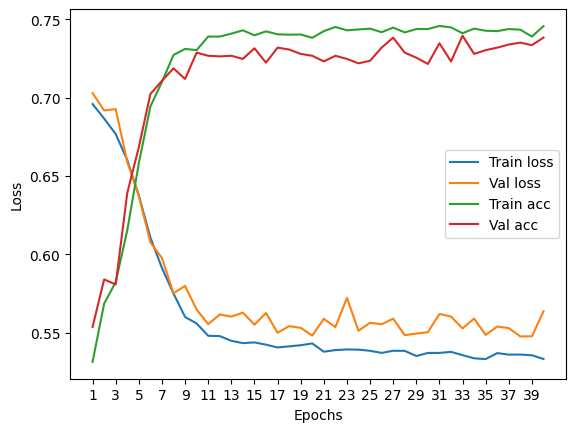

****************************************************************************************************



118it [00:00, 190.96it/s]


Train Epoch: 0 	Loss: 0.698781, Accuracy: 3781/7500 (50%)
Val Epoch: 0 	Loss: 0.706273, Accuracy: 1395/2500 (56%)



118it [00:00, 165.63it/s]


Train Epoch: 1 	Loss: 0.688986, Accuracy: 4314/7500 (58%)
Val Epoch: 1 	Loss: 0.692497, Accuracy: 1478/2500 (59%)



118it [00:00, 174.74it/s]


Train Epoch: 2 	Loss: 0.668798, Accuracy: 4583/7500 (61%)
Val Epoch: 2 	Loss: 0.673770, Accuracy: 1554/2500 (62%)



118it [00:00, 179.57it/s]


Train Epoch: 3 	Loss: 0.639847, Accuracy: 4946/7500 (66%)
Val Epoch: 3 	Loss: 0.635376, Accuracy: 1694/2500 (68%)



118it [00:00, 165.17it/s]


Train Epoch: 4 	Loss: 0.607284, Accuracy: 5228/7500 (70%)
Val Epoch: 4 	Loss: 0.614815, Accuracy: 1750/2500 (70%)



118it [00:00, 174.22it/s]


Train Epoch: 5 	Loss: 0.583753, Accuracy: 5323/7500 (71%)
Val Epoch: 5 	Loss: 0.601079, Accuracy: 1757/2500 (70%)



118it [00:00, 173.92it/s]


Train Epoch: 6 	Loss: 0.571333, Accuracy: 5357/7500 (71%)
Val Epoch: 6 	Loss: 0.571542, Accuracy: 1806/2500 (72%)



118it [00:00, 171.38it/s]


Train Epoch: 7 	Loss: 0.561059, Accuracy: 5458/7500 (73%)
Val Epoch: 7 	Loss: 0.568027, Accuracy: 1810/2500 (72%)



118it [00:00, 171.89it/s]


Train Epoch: 8 	Loss: 0.554037, Accuracy: 5497/7500 (73%)
Val Epoch: 8 	Loss: 0.577720, Accuracy: 1803/2500 (72%)



118it [00:00, 168.80it/s]


Train Epoch: 9 	Loss: 0.553606, Accuracy: 5470/7500 (73%)
Val Epoch: 9 	Loss: 0.569838, Accuracy: 1810/2500 (72%)



118it [00:00, 160.11it/s]


Train Epoch: 10 	Loss: 0.551324, Accuracy: 5478/7500 (73%)
Val Epoch: 10 	Loss: 0.571314, Accuracy: 1817/2500 (73%)



118it [00:00, 168.93it/s]


Train Epoch: 11 	Loss: 0.551807, Accuracy: 5477/7500 (73%)
Val Epoch: 11 	Loss: 0.569326, Accuracy: 1805/2500 (72%)



118it [00:00, 131.02it/s]


Train Epoch: 12 	Loss: 0.551089, Accuracy: 5488/7500 (73%)
Val Epoch: 12 	Loss: 0.567380, Accuracy: 1822/2500 (73%)



118it [00:00, 143.28it/s]


Train Epoch: 13 	Loss: 0.551684, Accuracy: 5493/7500 (73%)
Val Epoch: 13 	Loss: 0.569927, Accuracy: 1815/2500 (73%)



118it [00:00, 147.44it/s]


Train Epoch: 14 	Loss: 0.548825, Accuracy: 5479/7500 (73%)
Val Epoch: 14 	Loss: 0.575894, Accuracy: 1809/2500 (72%)



118it [00:00, 161.94it/s]


Train Epoch: 15 	Loss: 0.549293, Accuracy: 5493/7500 (73%)
Val Epoch: 15 	Loss: 0.575437, Accuracy: 1815/2500 (73%)



118it [00:00, 177.75it/s]


Train Epoch: 16 	Loss: 0.550074, Accuracy: 5492/7500 (73%)
Val Epoch: 16 	Loss: 0.571938, Accuracy: 1826/2500 (73%)



118it [00:00, 173.59it/s]


Train Epoch: 17 	Loss: 0.548908, Accuracy: 5511/7500 (73%)
Val Epoch: 17 	Loss: 0.577001, Accuracy: 1826/2500 (73%)



118it [00:00, 176.53it/s]


Train Epoch: 18 	Loss: 0.550260, Accuracy: 5500/7500 (73%)
Val Epoch: 18 	Loss: 0.569719, Accuracy: 1820/2500 (73%)



118it [00:00, 173.16it/s]


Train Epoch: 19 	Loss: 0.553363, Accuracy: 5498/7500 (73%)
Val Epoch: 19 	Loss: 0.570179, Accuracy: 1835/2500 (73%)



118it [00:00, 172.15it/s]


Train Epoch: 20 	Loss: 0.548606, Accuracy: 5503/7500 (73%)
Val Epoch: 20 	Loss: 0.573720, Accuracy: 1822/2500 (73%)



118it [00:00, 169.50it/s]


Train Epoch: 21 	Loss: 0.548291, Accuracy: 5514/7500 (74%)
Val Epoch: 21 	Loss: 0.575012, Accuracy: 1820/2500 (73%)



118it [00:00, 175.06it/s]


Train Epoch: 22 	Loss: 0.549808, Accuracy: 5501/7500 (73%)
Val Epoch: 22 	Loss: 0.591383, Accuracy: 1816/2500 (73%)



118it [00:00, 167.03it/s]


Train Epoch: 23 	Loss: 0.548516, Accuracy: 5511/7500 (73%)
Val Epoch: 23 	Loss: 0.568388, Accuracy: 1831/2500 (73%)



118it [00:00, 179.10it/s]


Train Epoch: 24 	Loss: 0.547281, Accuracy: 5499/7500 (73%)
Val Epoch: 24 	Loss: 0.568250, Accuracy: 1830/2500 (73%)



118it [00:00, 165.84it/s]


Train Epoch: 25 	Loss: 0.548894, Accuracy: 5515/7500 (74%)
Val Epoch: 25 	Loss: 0.568853, Accuracy: 1825/2500 (73%)



118it [00:00, 154.11it/s]


Train Epoch: 26 	Loss: 0.548861, Accuracy: 5499/7500 (73%)
Val Epoch: 26 	Loss: 0.574366, Accuracy: 1829/2500 (73%)



118it [00:00, 164.22it/s]


Train Epoch: 27 	Loss: 0.552515, Accuracy: 5487/7500 (73%)
Val Epoch: 27 	Loss: 0.570113, Accuracy: 1832/2500 (73%)



118it [00:00, 175.41it/s]


Train Epoch: 28 	Loss: 0.549125, Accuracy: 5534/7500 (74%)
Val Epoch: 28 	Loss: 0.569099, Accuracy: 1822/2500 (73%)



118it [00:00, 148.19it/s]


Train Epoch: 29 	Loss: 0.548429, Accuracy: 5504/7500 (73%)
Val Epoch: 29 	Loss: 0.563919, Accuracy: 1835/2500 (73%)



118it [00:00, 138.29it/s]


Train Epoch: 30 	Loss: 0.550245, Accuracy: 5507/7500 (73%)
Val Epoch: 30 	Loss: 0.578587, Accuracy: 1833/2500 (73%)



118it [00:00, 143.33it/s]


Train Epoch: 31 	Loss: 0.550758, Accuracy: 5513/7500 (74%)
Val Epoch: 31 	Loss: 0.567067, Accuracy: 1822/2500 (73%)



118it [00:00, 162.48it/s]


Train Epoch: 32 	Loss: 0.548337, Accuracy: 5512/7500 (73%)
Val Epoch: 32 	Loss: 0.568840, Accuracy: 1828/2500 (73%)



118it [00:00, 171.97it/s]


Train Epoch: 33 	Loss: 0.550329, Accuracy: 5501/7500 (73%)
Val Epoch: 33 	Loss: 0.570054, Accuracy: 1824/2500 (73%)



118it [00:00, 173.21it/s]


Train Epoch: 34 	Loss: 0.549139, Accuracy: 5518/7500 (74%)
Val Epoch: 34 	Loss: 0.567969, Accuracy: 1817/2500 (73%)



118it [00:00, 175.78it/s]


Train Epoch: 35 	Loss: 0.548948, Accuracy: 5512/7500 (73%)
Val Epoch: 35 	Loss: 0.564675, Accuracy: 1823/2500 (73%)



118it [00:00, 174.53it/s]


Train Epoch: 36 	Loss: 0.549921, Accuracy: 5507/7500 (73%)
Val Epoch: 36 	Loss: 0.571942, Accuracy: 1830/2500 (73%)



118it [00:00, 168.66it/s]


Train Epoch: 37 	Loss: 0.547275, Accuracy: 5521/7500 (74%)
Val Epoch: 37 	Loss: 0.568126, Accuracy: 1833/2500 (73%)



118it [00:00, 179.12it/s]


Train Epoch: 38 	Loss: 0.549231, Accuracy: 5526/7500 (74%)
Val Epoch: 38 	Loss: 0.570703, Accuracy: 1829/2500 (73%)



118it [00:00, 179.78it/s]


Train Epoch: 39 	Loss: 0.549563, Accuracy: 5499/7500 (73%)
Val Epoch: 39 	Loss: 0.568457, Accuracy: 1819/2500 (73%)

Test accuracy:  74.32


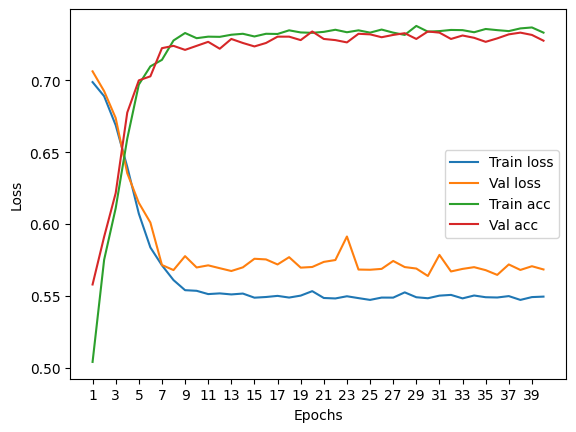

****************************************************************************************************



116it [00:00, 209.19it/s]


Train Epoch: 0 	Loss: 0.692765, Accuracy: 3837/7422 (52%)
Val Epoch: 0 	Loss: 0.693663, Accuracy: 1376/2474 (56%)



116it [00:00, 169.42it/s]


Train Epoch: 1 	Loss: 0.686484, Accuracy: 4097/7422 (55%)
Val Epoch: 1 	Loss: 0.686259, Accuracy: 1416/2474 (57%)



116it [00:00, 172.20it/s]


Train Epoch: 2 	Loss: 0.677428, Accuracy: 4265/7422 (57%)
Val Epoch: 2 	Loss: 0.684735, Accuracy: 1384/2474 (56%)



116it [00:00, 178.62it/s]


Train Epoch: 3 	Loss: 0.672107, Accuracy: 4403/7422 (59%)
Val Epoch: 3 	Loss: 0.672870, Accuracy: 1470/2474 (59%)



116it [00:00, 174.79it/s]


Train Epoch: 4 	Loss: 0.666643, Accuracy: 4460/7422 (60%)
Val Epoch: 4 	Loss: 0.666909, Accuracy: 1490/2474 (60%)



116it [00:00, 163.49it/s]


Train Epoch: 5 	Loss: 0.657741, Accuracy: 4616/7422 (62%)
Val Epoch: 5 	Loss: 0.651314, Accuracy: 1573/2474 (64%)



116it [00:00, 179.19it/s]


Train Epoch: 6 	Loss: 0.641101, Accuracy: 4850/7422 (65%)
Val Epoch: 6 	Loss: 0.630155, Accuracy: 1658/2474 (67%)



116it [00:00, 162.63it/s]


Train Epoch: 7 	Loss: 0.620545, Accuracy: 5004/7422 (67%)
Val Epoch: 7 	Loss: 0.607266, Accuracy: 1757/2474 (71%)



116it [00:00, 124.72it/s]


Train Epoch: 8 	Loss: 0.599528, Accuracy: 5196/7422 (70%)
Val Epoch: 8 	Loss: 0.583958, Accuracy: 1808/2474 (73%)



116it [00:00, 146.37it/s]


Train Epoch: 9 	Loss: 0.577788, Accuracy: 5339/7422 (72%)
Val Epoch: 9 	Loss: 0.563697, Accuracy: 1852/2474 (75%)



116it [00:00, 152.36it/s]


Train Epoch: 10 	Loss: 0.564872, Accuracy: 5382/7422 (73%)
Val Epoch: 10 	Loss: 0.551927, Accuracy: 1844/2474 (75%)



116it [00:00, 170.91it/s]


Train Epoch: 11 	Loss: 0.558025, Accuracy: 5406/7422 (73%)
Val Epoch: 11 	Loss: 0.541607, Accuracy: 1865/2474 (75%)



116it [00:00, 171.31it/s]


Train Epoch: 12 	Loss: 0.554247, Accuracy: 5437/7422 (73%)
Val Epoch: 12 	Loss: 0.538190, Accuracy: 1871/2474 (76%)



116it [00:00, 167.65it/s]


Train Epoch: 13 	Loss: 0.549787, Accuracy: 5407/7422 (73%)
Val Epoch: 13 	Loss: 0.535899, Accuracy: 1852/2474 (75%)



116it [00:00, 173.04it/s]


Train Epoch: 14 	Loss: 0.547662, Accuracy: 5436/7422 (73%)
Val Epoch: 14 	Loss: 0.536720, Accuracy: 1870/2474 (76%)



116it [00:00, 139.12it/s]


Train Epoch: 15 	Loss: 0.547778, Accuracy: 5439/7422 (73%)
Val Epoch: 15 	Loss: 0.532131, Accuracy: 1867/2474 (75%)



116it [00:00, 152.26it/s]


Train Epoch: 16 	Loss: 0.546334, Accuracy: 5434/7422 (73%)
Val Epoch: 16 	Loss: 0.534329, Accuracy: 1867/2474 (75%)



116it [00:00, 154.46it/s]


Train Epoch: 17 	Loss: 0.545841, Accuracy: 5452/7422 (73%)
Val Epoch: 17 	Loss: 0.528756, Accuracy: 1863/2474 (75%)



116it [00:00, 161.20it/s]


Train Epoch: 18 	Loss: 0.545664, Accuracy: 5424/7422 (73%)
Val Epoch: 18 	Loss: 0.530344, Accuracy: 1872/2474 (76%)



116it [00:00, 173.28it/s]


Train Epoch: 19 	Loss: 0.544585, Accuracy: 5474/7422 (74%)
Val Epoch: 19 	Loss: 0.527441, Accuracy: 1875/2474 (76%)



116it [00:00, 170.18it/s]


Train Epoch: 20 	Loss: 0.544861, Accuracy: 5452/7422 (73%)
Val Epoch: 20 	Loss: 0.527713, Accuracy: 1879/2474 (76%)



116it [00:00, 164.74it/s]


Train Epoch: 21 	Loss: 0.543870, Accuracy: 5438/7422 (73%)
Val Epoch: 21 	Loss: 0.528795, Accuracy: 1876/2474 (76%)



116it [00:00, 176.52it/s]


Train Epoch: 22 	Loss: 0.545154, Accuracy: 5432/7422 (73%)
Val Epoch: 22 	Loss: 0.530788, Accuracy: 1863/2474 (75%)



116it [00:00, 150.41it/s]


Train Epoch: 23 	Loss: 0.544986, Accuracy: 5443/7422 (73%)
Val Epoch: 23 	Loss: 0.531052, Accuracy: 1884/2474 (76%)



116it [00:00, 146.53it/s]


Train Epoch: 24 	Loss: 0.543874, Accuracy: 5464/7422 (74%)
Val Epoch: 24 	Loss: 0.527649, Accuracy: 1876/2474 (76%)



116it [00:00, 134.37it/s]


Train Epoch: 25 	Loss: 0.543807, Accuracy: 5452/7422 (73%)
Val Epoch: 25 	Loss: 0.527864, Accuracy: 1870/2474 (76%)



116it [00:00, 141.20it/s]


Train Epoch: 26 	Loss: 0.543704, Accuracy: 5472/7422 (74%)
Val Epoch: 26 	Loss: 0.527660, Accuracy: 1876/2474 (76%)



116it [00:00, 170.93it/s]


Train Epoch: 27 	Loss: 0.545257, Accuracy: 5441/7422 (73%)
Val Epoch: 27 	Loss: 0.526721, Accuracy: 1866/2474 (75%)



116it [00:00, 167.87it/s]


Train Epoch: 28 	Loss: 0.544117, Accuracy: 5459/7422 (74%)
Val Epoch: 28 	Loss: 0.535697, Accuracy: 1859/2474 (75%)



116it [00:00, 163.97it/s]


Train Epoch: 29 	Loss: 0.545621, Accuracy: 5472/7422 (74%)
Val Epoch: 29 	Loss: 0.531534, Accuracy: 1866/2474 (75%)



116it [00:00, 171.56it/s]


Train Epoch: 30 	Loss: 0.542907, Accuracy: 5473/7422 (74%)
Val Epoch: 30 	Loss: 0.532519, Accuracy: 1867/2474 (75%)



116it [00:00, 177.65it/s]


Train Epoch: 31 	Loss: 0.544336, Accuracy: 5474/7422 (74%)
Val Epoch: 31 	Loss: 0.527723, Accuracy: 1883/2474 (76%)



116it [00:00, 165.33it/s]


Train Epoch: 32 	Loss: 0.544747, Accuracy: 5455/7422 (73%)
Val Epoch: 32 	Loss: 0.529267, Accuracy: 1877/2474 (76%)



116it [00:00, 165.04it/s]


Train Epoch: 33 	Loss: 0.543333, Accuracy: 5455/7422 (73%)
Val Epoch: 33 	Loss: 0.526407, Accuracy: 1876/2474 (76%)



116it [00:00, 163.28it/s]


Train Epoch: 34 	Loss: 0.544114, Accuracy: 5453/7422 (73%)
Val Epoch: 34 	Loss: 0.529302, Accuracy: 1886/2474 (76%)



116it [00:00, 179.30it/s]


Train Epoch: 35 	Loss: 0.544310, Accuracy: 5464/7422 (74%)
Val Epoch: 35 	Loss: 0.527015, Accuracy: 1882/2474 (76%)



116it [00:00, 170.03it/s]


Train Epoch: 36 	Loss: 0.543336, Accuracy: 5465/7422 (74%)
Val Epoch: 36 	Loss: 0.526750, Accuracy: 1879/2474 (76%)



116it [00:00, 176.24it/s]


Train Epoch: 37 	Loss: 0.543636, Accuracy: 5453/7422 (73%)
Val Epoch: 37 	Loss: 0.551357, Accuracy: 1809/2474 (73%)



116it [00:00, 176.55it/s]


Train Epoch: 38 	Loss: 0.545959, Accuracy: 5438/7422 (73%)
Val Epoch: 38 	Loss: 0.529969, Accuracy: 1886/2474 (76%)



116it [00:00, 169.94it/s]


Train Epoch: 39 	Loss: 0.543448, Accuracy: 5443/7422 (73%)
Val Epoch: 39 	Loss: 0.529137, Accuracy: 1873/2474 (76%)

Test accuracy:  72.87793047696039


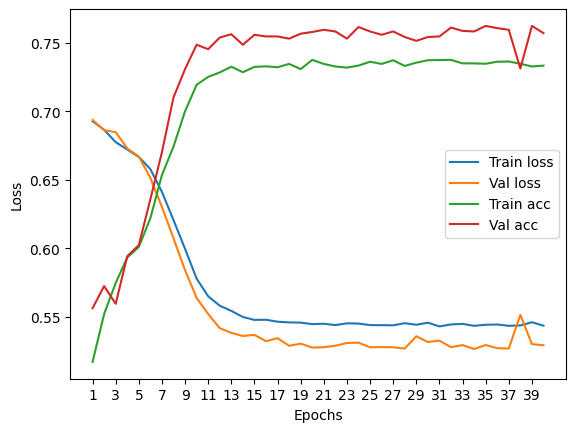

****************************************************************************************************





In [202]:
epochs = 40
train_loss, val_loss, train_acc, val_acc, auc = find_ideal_particles(X_norm, y10, 1, 15)

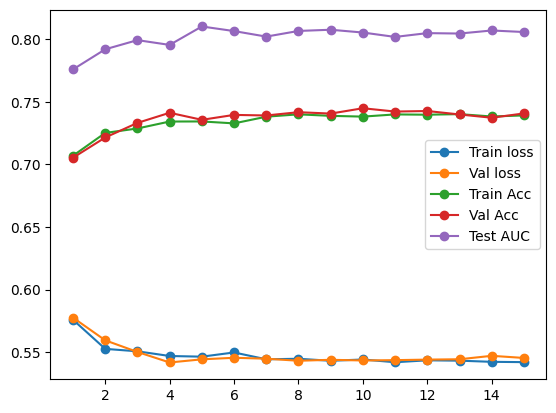

In [205]:
plt.plot(range(1,16), [sum(train_loss[i])/len(train_loss[i]) for i in range(1,len(train_loss)+1)], label='Train loss', marker='o')
plt.plot(range(1,16), [sum(val_loss[i])/len(val_loss[i]) for i in range(1,len(val_loss)+1)], label='Val loss', marker='o')
plt.plot(range(1,16), [sum(train_acc[i])/len(train_acc[i]) for i in range(1,len(train_acc)+1)], label='Train Acc', marker='o')
plt.plot(range(1,16), [sum(val_acc[i])/len(val_acc[i]) for i in range(1,len(val_acc)+1)], label='Val Acc', marker='o')
plt.plot(range(1,16), [sum(auc[i])/len(auc[i]) for i in range(1,len(auc)+1)], label='Test AUC', marker='o')
plt.legend()
plt.show()

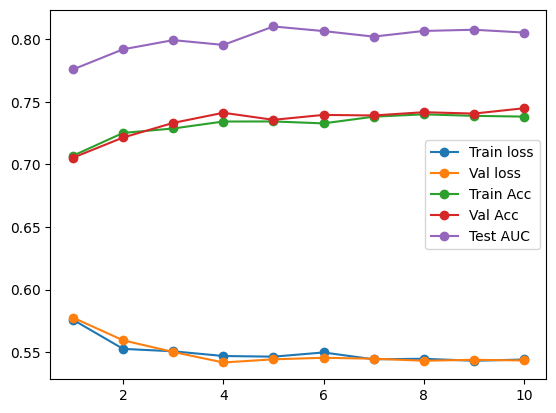

In [206]:
plt.plot(range(1,11), [sum(train_loss[i])/len(train_loss[i]) for i in range(1,11)], label='Train loss', marker='o')
plt.plot(range(1,11), [sum(val_loss[i])/len(val_loss[i]) for i in range(1,11)], label='Val loss', marker='o')
plt.plot(range(1,11), [sum(train_acc[i])/len(train_acc[i]) for i in range(1,11)], label='Train Acc', marker='o')
plt.plot(range(1,11), [sum(val_acc[i])/len(val_acc[i]) for i in range(1,11)], label='Val Acc', marker='o')
plt.plot(range(1,11), [sum(auc[i])/len(auc[i]) for i in range(1,11)], label='Test AUC', marker='o')
plt.legend()
plt.show()

#### Training with 1 particle, 15 particles

118it [00:00, 251.17it/s]


Train Epoch: 0 	Loss: 0.671619, Accuracy: 4548/7500 (61%)
Val Epoch: 0 	Loss: 0.628815, Accuracy: 1716/2500 (69%)



118it [00:00, 219.71it/s]


Train Epoch: 1 	Loss: 0.590671, Accuracy: 5294/7500 (71%)
Val Epoch: 1 	Loss: 0.580608, Accuracy: 1789/2500 (72%)



118it [00:00, 230.50it/s]


Train Epoch: 2 	Loss: 0.575600, Accuracy: 5333/7500 (71%)
Val Epoch: 2 	Loss: 0.580895, Accuracy: 1757/2500 (70%)



118it [00:00, 241.11it/s]


Train Epoch: 3 	Loss: 0.574107, Accuracy: 5335/7500 (71%)
Val Epoch: 3 	Loss: 0.582428, Accuracy: 1781/2500 (71%)



118it [00:00, 248.09it/s]


Train Epoch: 4 	Loss: 0.571132, Accuracy: 5344/7500 (71%)
Val Epoch: 4 	Loss: 0.589296, Accuracy: 1775/2500 (71%)



118it [00:00, 206.22it/s]


Train Epoch: 5 	Loss: 0.570573, Accuracy: 5363/7500 (72%)
Val Epoch: 5 	Loss: 0.586190, Accuracy: 1789/2500 (72%)



118it [00:00, 258.15it/s]


Train Epoch: 6 	Loss: 0.570332, Accuracy: 5333/7500 (71%)
Val Epoch: 6 	Loss: 0.584710, Accuracy: 1760/2500 (70%)



118it [00:00, 229.93it/s]


Train Epoch: 7 	Loss: 0.570419, Accuracy: 5341/7500 (71%)
Val Epoch: 7 	Loss: 0.580594, Accuracy: 1774/2500 (71%)



118it [00:00, 247.56it/s]


Train Epoch: 8 	Loss: 0.569821, Accuracy: 5352/7500 (71%)
Val Epoch: 8 	Loss: 0.579285, Accuracy: 1791/2500 (72%)



118it [00:00, 262.04it/s]


Train Epoch: 9 	Loss: 0.570286, Accuracy: 5347/7500 (71%)
Val Epoch: 9 	Loss: 0.576902, Accuracy: 1800/2500 (72%)



118it [00:00, 245.06it/s]


Train Epoch: 10 	Loss: 0.571656, Accuracy: 5352/7500 (71%)
Val Epoch: 10 	Loss: 0.578294, Accuracy: 1775/2500 (71%)



118it [00:00, 205.51it/s]


Train Epoch: 11 	Loss: 0.569062, Accuracy: 5377/7500 (72%)
Val Epoch: 11 	Loss: 0.580608, Accuracy: 1788/2500 (72%)



118it [00:00, 185.03it/s]


Train Epoch: 12 	Loss: 0.567581, Accuracy: 5334/7500 (71%)
Val Epoch: 12 	Loss: 0.579981, Accuracy: 1799/2500 (72%)



118it [00:00, 182.11it/s]


Train Epoch: 13 	Loss: 0.568775, Accuracy: 5347/7500 (71%)
Val Epoch: 13 	Loss: 0.593910, Accuracy: 1779/2500 (71%)



118it [00:00, 191.46it/s]


Train Epoch: 14 	Loss: 0.568406, Accuracy: 5353/7500 (71%)
Val Epoch: 14 	Loss: 0.574307, Accuracy: 1788/2500 (72%)



118it [00:00, 213.06it/s]


Train Epoch: 15 	Loss: 0.566485, Accuracy: 5342/7500 (71%)
Val Epoch: 15 	Loss: 0.594398, Accuracy: 1770/2500 (71%)



118it [00:00, 250.52it/s]


Train Epoch: 16 	Loss: 0.568020, Accuracy: 5345/7500 (71%)
Val Epoch: 16 	Loss: 0.584428, Accuracy: 1782/2500 (71%)



118it [00:00, 237.82it/s]


Train Epoch: 17 	Loss: 0.569701, Accuracy: 5357/7500 (71%)
Val Epoch: 17 	Loss: 0.582919, Accuracy: 1780/2500 (71%)



118it [00:00, 245.03it/s]


Train Epoch: 18 	Loss: 0.567429, Accuracy: 5356/7500 (71%)
Val Epoch: 18 	Loss: 0.575295, Accuracy: 1768/2500 (71%)



118it [00:00, 239.43it/s]


Train Epoch: 19 	Loss: 0.569645, Accuracy: 5344/7500 (71%)
Val Epoch: 19 	Loss: 0.571687, Accuracy: 1791/2500 (72%)



118it [00:00, 239.63it/s]


Train Epoch: 20 	Loss: 0.569415, Accuracy: 5379/7500 (72%)
Val Epoch: 20 	Loss: 0.587671, Accuracy: 1777/2500 (71%)



118it [00:00, 238.88it/s]


Train Epoch: 21 	Loss: 0.568121, Accuracy: 5340/7500 (71%)
Val Epoch: 21 	Loss: 0.590202, Accuracy: 1780/2500 (71%)



118it [00:00, 232.08it/s]


Train Epoch: 22 	Loss: 0.570483, Accuracy: 5346/7500 (71%)
Val Epoch: 22 	Loss: 0.583471, Accuracy: 1775/2500 (71%)



118it [00:00, 243.98it/s]


Train Epoch: 23 	Loss: 0.566739, Accuracy: 5353/7500 (71%)
Val Epoch: 23 	Loss: 0.595230, Accuracy: 1774/2500 (71%)



118it [00:00, 233.21it/s]


Train Epoch: 24 	Loss: 0.567671, Accuracy: 5351/7500 (71%)
Val Epoch: 24 	Loss: 0.585728, Accuracy: 1791/2500 (72%)



118it [00:00, 235.36it/s]


Train Epoch: 25 	Loss: 0.568188, Accuracy: 5348/7500 (71%)
Val Epoch: 25 	Loss: 0.592218, Accuracy: 1749/2500 (70%)



118it [00:00, 161.32it/s]


Train Epoch: 26 	Loss: 0.568736, Accuracy: 5363/7500 (72%)
Val Epoch: 26 	Loss: 0.586085, Accuracy: 1782/2500 (71%)



118it [00:00, 160.36it/s]


Train Epoch: 27 	Loss: 0.566433, Accuracy: 5369/7500 (72%)
Val Epoch: 27 	Loss: 0.581339, Accuracy: 1786/2500 (71%)



118it [00:00, 239.91it/s]


Train Epoch: 28 	Loss: 0.566619, Accuracy: 5387/7500 (72%)
Val Epoch: 28 	Loss: 0.575849, Accuracy: 1789/2500 (72%)



118it [00:00, 247.40it/s]


Train Epoch: 29 	Loss: 0.565104, Accuracy: 5363/7500 (72%)
Val Epoch: 29 	Loss: 0.581911, Accuracy: 1778/2500 (71%)



118it [00:00, 226.64it/s]


Train Epoch: 30 	Loss: 0.566915, Accuracy: 5353/7500 (71%)
Val Epoch: 30 	Loss: 0.577629, Accuracy: 1788/2500 (72%)



118it [00:00, 176.25it/s]


Train Epoch: 31 	Loss: 0.567138, Accuracy: 5332/7500 (71%)
Val Epoch: 31 	Loss: 0.582489, Accuracy: 1795/2500 (72%)



118it [00:00, 203.55it/s]


Train Epoch: 32 	Loss: 0.565521, Accuracy: 5367/7500 (72%)
Val Epoch: 32 	Loss: 0.583656, Accuracy: 1781/2500 (71%)



118it [00:00, 199.81it/s]


Train Epoch: 33 	Loss: 0.566158, Accuracy: 5372/7500 (72%)
Val Epoch: 33 	Loss: 0.572730, Accuracy: 1788/2500 (72%)



118it [00:00, 230.15it/s]


Train Epoch: 34 	Loss: 0.567180, Accuracy: 5360/7500 (71%)
Val Epoch: 34 	Loss: 0.589713, Accuracy: 1760/2500 (70%)



118it [00:00, 250.17it/s]


Train Epoch: 35 	Loss: 0.567152, Accuracy: 5360/7500 (71%)
Val Epoch: 35 	Loss: 0.588551, Accuracy: 1780/2500 (71%)



118it [00:00, 231.38it/s]


Train Epoch: 36 	Loss: 0.566206, Accuracy: 5360/7500 (71%)
Val Epoch: 36 	Loss: 0.571758, Accuracy: 1790/2500 (72%)



118it [00:00, 248.88it/s]


Train Epoch: 37 	Loss: 0.566228, Accuracy: 5339/7500 (71%)
Val Epoch: 37 	Loss: 0.572549, Accuracy: 1790/2500 (72%)



118it [00:00, 247.39it/s]


Train Epoch: 38 	Loss: 0.570382, Accuracy: 5330/7500 (71%)
Val Epoch: 38 	Loss: 0.570053, Accuracy: 1789/2500 (72%)



118it [00:00, 237.50it/s]


Train Epoch: 39 	Loss: 0.566406, Accuracy: 5379/7500 (72%)
Val Epoch: 39 	Loss: 0.583930, Accuracy: 1794/2500 (72%)



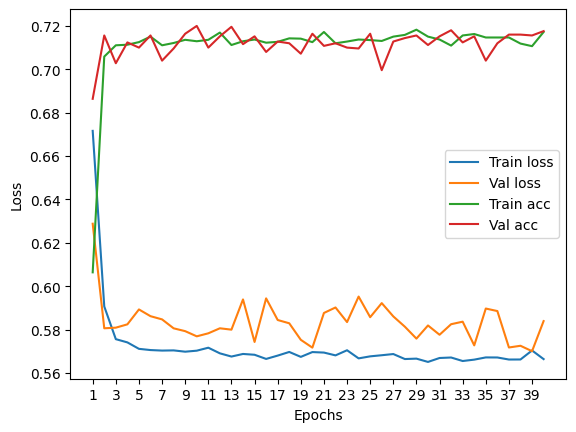

Test accuracy:  70.8


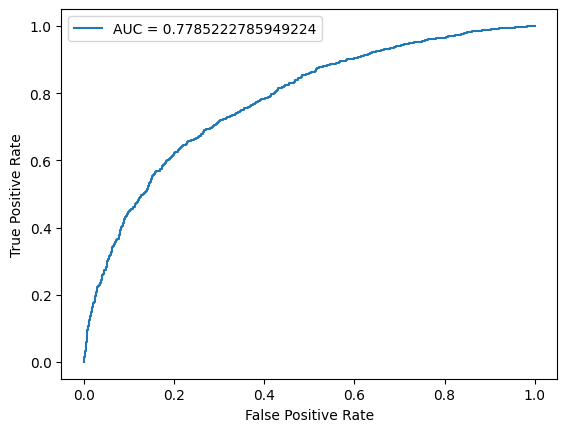

In [198]:
X_filtered = X_norm[:12500, :1, :]
y_filtered = y10[:12500]
dataset = create_graph_dataset(X_filtered,y_filtered)

data_train, data_val, data_test = torch.utils.data.random_split(dataset, [train_ratio, val_ratio, test_ratio])

train_dataloader = DataLoader(data_train,
                      batch_size = batch_size,
                      shuffle=True)
val_dataloader = DataLoader(data_val,
                            batch_size = batch_size,
                            shuffle=True)
test_dataloader = DataLoader(data_test,
                 batch_size = batch_size,
                 shuffle=True)

model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())

optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

plot_loss(history)
plot_auc(model, test_dataloader)

30it [00:00, 40.72it/s]


Train Epoch: 0 	Loss: 0.709213, Accuracy: 3888/7500 (52%)
Val Epoch: 0 	Loss: 0.706845, Accuracy: 1357/2500 (54%)



30it [00:00, 49.39it/s]


Train Epoch: 1 	Loss: 0.704334, Accuracy: 4174/7500 (56%)
Val Epoch: 1 	Loss: 0.701982, Accuracy: 1389/2500 (56%)



30it [00:00, 42.75it/s]


Train Epoch: 2 	Loss: 0.698444, Accuracy: 4243/7500 (57%)
Val Epoch: 2 	Loss: 0.698651, Accuracy: 1387/2500 (55%)



30it [00:00, 48.07it/s]


Train Epoch: 3 	Loss: 0.691904, Accuracy: 4316/7500 (58%)
Val Epoch: 3 	Loss: 0.694679, Accuracy: 1420/2500 (57%)



30it [00:00, 39.37it/s]


Train Epoch: 4 	Loss: 0.682695, Accuracy: 4440/7500 (59%)
Val Epoch: 4 	Loss: 0.683819, Accuracy: 1484/2500 (59%)



30it [00:00, 39.77it/s]


Train Epoch: 5 	Loss: 0.668972, Accuracy: 4656/7500 (62%)
Val Epoch: 5 	Loss: 0.660326, Accuracy: 1561/2500 (62%)



30it [00:00, 47.76it/s]


Train Epoch: 6 	Loss: 0.639368, Accuracy: 4967/7500 (66%)
Val Epoch: 6 	Loss: 0.630222, Accuracy: 1709/2500 (68%)



30it [00:00, 46.27it/s]


Train Epoch: 7 	Loss: 0.612663, Accuracy: 5168/7500 (69%)
Val Epoch: 7 	Loss: 0.607422, Accuracy: 1734/2500 (69%)



30it [00:00, 42.18it/s]


Train Epoch: 8 	Loss: 0.591884, Accuracy: 5362/7500 (71%)
Val Epoch: 8 	Loss: 0.603765, Accuracy: 1733/2500 (69%)



30it [00:00, 48.89it/s]


Train Epoch: 9 	Loss: 0.578748, Accuracy: 5406/7500 (72%)
Val Epoch: 9 	Loss: 0.594267, Accuracy: 1747/2500 (70%)



30it [00:01, 27.19it/s]


Train Epoch: 10 	Loss: 0.576760, Accuracy: 5399/7500 (72%)
Val Epoch: 10 	Loss: 0.600029, Accuracy: 1742/2500 (70%)



30it [00:01, 29.97it/s]


Train Epoch: 11 	Loss: 0.574006, Accuracy: 5384/7500 (72%)
Val Epoch: 11 	Loss: 0.599353, Accuracy: 1760/2500 (70%)



30it [00:00, 36.30it/s]


Train Epoch: 12 	Loss: 0.572448, Accuracy: 5467/7500 (73%)
Val Epoch: 12 	Loss: 0.584150, Accuracy: 1787/2500 (71%)



30it [00:00, 33.55it/s]


Train Epoch: 13 	Loss: 0.564222, Accuracy: 5477/7500 (73%)
Val Epoch: 13 	Loss: 0.582339, Accuracy: 1782/2500 (71%)



30it [00:01, 25.93it/s]


Train Epoch: 14 	Loss: 0.563680, Accuracy: 5482/7500 (73%)
Val Epoch: 14 	Loss: 0.579876, Accuracy: 1795/2500 (72%)



30it [00:01, 28.56it/s]


Train Epoch: 15 	Loss: 0.564402, Accuracy: 5496/7500 (73%)
Val Epoch: 15 	Loss: 0.586453, Accuracy: 1794/2500 (72%)



30it [00:00, 34.21it/s]


Train Epoch: 16 	Loss: 0.562334, Accuracy: 5489/7500 (73%)
Val Epoch: 16 	Loss: 0.588776, Accuracy: 1779/2500 (71%)



30it [00:00, 35.10it/s]


Train Epoch: 17 	Loss: 0.562555, Accuracy: 5490/7500 (73%)
Val Epoch: 17 	Loss: 0.584493, Accuracy: 1761/2500 (70%)



30it [00:00, 39.88it/s]


Train Epoch: 18 	Loss: 0.560870, Accuracy: 5484/7500 (73%)
Val Epoch: 18 	Loss: 0.588226, Accuracy: 1780/2500 (71%)



30it [00:00, 35.79it/s]


Train Epoch: 19 	Loss: 0.559694, Accuracy: 5484/7500 (73%)
Val Epoch: 19 	Loss: 0.585169, Accuracy: 1785/2500 (71%)



30it [00:00, 36.78it/s]


Train Epoch: 20 	Loss: 0.560876, Accuracy: 5462/7500 (73%)
Val Epoch: 20 	Loss: 0.593983, Accuracy: 1760/2500 (70%)



30it [00:00, 38.60it/s]


Train Epoch: 21 	Loss: 0.561324, Accuracy: 5498/7500 (73%)
Val Epoch: 21 	Loss: 0.579804, Accuracy: 1797/2500 (72%)



30it [00:00, 39.05it/s]


Train Epoch: 22 	Loss: 0.556043, Accuracy: 5485/7500 (73%)
Val Epoch: 22 	Loss: 0.573604, Accuracy: 1817/2500 (73%)



30it [00:01, 23.18it/s]


Train Epoch: 23 	Loss: 0.557784, Accuracy: 5508/7500 (73%)
Val Epoch: 23 	Loss: 0.579605, Accuracy: 1793/2500 (72%)



30it [00:01, 25.37it/s]


Train Epoch: 24 	Loss: 0.554024, Accuracy: 5490/7500 (73%)
Val Epoch: 24 	Loss: 0.573200, Accuracy: 1805/2500 (72%)



30it [00:00, 32.21it/s]


Train Epoch: 25 	Loss: 0.554579, Accuracy: 5483/7500 (73%)
Val Epoch: 25 	Loss: 0.576496, Accuracy: 1804/2500 (72%)



30it [00:00, 38.50it/s]


Train Epoch: 26 	Loss: 0.556861, Accuracy: 5503/7500 (73%)
Val Epoch: 26 	Loss: 0.574282, Accuracy: 1807/2500 (72%)



30it [00:00, 33.68it/s]


Train Epoch: 27 	Loss: 0.550934, Accuracy: 5502/7500 (73%)
Val Epoch: 27 	Loss: 0.571416, Accuracy: 1797/2500 (72%)



30it [00:00, 38.78it/s]


Train Epoch: 28 	Loss: 0.549861, Accuracy: 5512/7500 (73%)
Val Epoch: 28 	Loss: 0.573557, Accuracy: 1800/2500 (72%)



30it [00:00, 39.82it/s]


Train Epoch: 29 	Loss: 0.549780, Accuracy: 5518/7500 (74%)
Val Epoch: 29 	Loss: 0.571605, Accuracy: 1817/2500 (73%)



30it [00:00, 35.56it/s]


Train Epoch: 30 	Loss: 0.549904, Accuracy: 5506/7500 (73%)
Val Epoch: 30 	Loss: 0.574110, Accuracy: 1804/2500 (72%)



30it [00:00, 37.86it/s]


Train Epoch: 31 	Loss: 0.553015, Accuracy: 5468/7500 (73%)
Val Epoch: 31 	Loss: 0.570397, Accuracy: 1796/2500 (72%)



30it [00:01, 26.37it/s]


Train Epoch: 32 	Loss: 0.549435, Accuracy: 5517/7500 (74%)
Val Epoch: 32 	Loss: 0.570075, Accuracy: 1806/2500 (72%)



30it [00:00, 37.60it/s]


Train Epoch: 33 	Loss: 0.551205, Accuracy: 5448/7500 (73%)
Val Epoch: 33 	Loss: 0.575573, Accuracy: 1784/2500 (71%)



30it [00:00, 38.69it/s]


Train Epoch: 34 	Loss: 0.549510, Accuracy: 5495/7500 (73%)
Val Epoch: 34 	Loss: 0.574017, Accuracy: 1809/2500 (72%)



30it [00:00, 31.97it/s]


Train Epoch: 35 	Loss: 0.546806, Accuracy: 5539/7500 (74%)
Val Epoch: 35 	Loss: 0.570498, Accuracy: 1804/2500 (72%)



30it [00:00, 31.32it/s]


Train Epoch: 36 	Loss: 0.546703, Accuracy: 5522/7500 (74%)
Val Epoch: 36 	Loss: 0.574459, Accuracy: 1794/2500 (72%)



30it [00:01, 24.17it/s]


Train Epoch: 37 	Loss: 0.551436, Accuracy: 5472/7500 (73%)
Val Epoch: 37 	Loss: 0.569823, Accuracy: 1805/2500 (72%)



30it [00:00, 30.76it/s]


Train Epoch: 38 	Loss: 0.543731, Accuracy: 5539/7500 (74%)
Val Epoch: 38 	Loss: 0.570302, Accuracy: 1808/2500 (72%)



30it [00:00, 37.50it/s]


Train Epoch: 39 	Loss: 0.545379, Accuracy: 5492/7500 (73%)
Val Epoch: 39 	Loss: 0.569725, Accuracy: 1804/2500 (72%)



30it [00:00, 33.77it/s]


Train Epoch: 40 	Loss: 0.546030, Accuracy: 5544/7500 (74%)
Val Epoch: 40 	Loss: 0.567765, Accuracy: 1812/2500 (72%)



30it [00:00, 34.19it/s]


Train Epoch: 41 	Loss: 0.545276, Accuracy: 5551/7500 (74%)
Val Epoch: 41 	Loss: 0.568023, Accuracy: 1821/2500 (73%)



30it [00:00, 36.86it/s]


Train Epoch: 42 	Loss: 0.547273, Accuracy: 5523/7500 (74%)
Val Epoch: 42 	Loss: 0.569097, Accuracy: 1825/2500 (73%)



30it [00:00, 40.02it/s]


Train Epoch: 43 	Loss: 0.548160, Accuracy: 5509/7500 (73%)
Val Epoch: 43 	Loss: 0.566337, Accuracy: 1818/2500 (73%)



30it [00:00, 36.61it/s]


Train Epoch: 44 	Loss: 0.549305, Accuracy: 5520/7500 (74%)
Val Epoch: 44 	Loss: 0.566199, Accuracy: 1820/2500 (73%)



30it [00:00, 35.32it/s]


Train Epoch: 45 	Loss: 0.555842, Accuracy: 5476/7500 (73%)
Val Epoch: 45 	Loss: 0.567929, Accuracy: 1817/2500 (73%)



30it [00:00, 43.24it/s]


Train Epoch: 46 	Loss: 0.546344, Accuracy: 5537/7500 (74%)
Val Epoch: 46 	Loss: 0.572133, Accuracy: 1812/2500 (72%)



30it [00:00, 32.45it/s]


Train Epoch: 47 	Loss: 0.553418, Accuracy: 5482/7500 (73%)
Val Epoch: 47 	Loss: 0.568671, Accuracy: 1810/2500 (72%)



30it [00:00, 44.43it/s]


Train Epoch: 48 	Loss: 0.546447, Accuracy: 5505/7500 (73%)
Val Epoch: 48 	Loss: 0.567107, Accuracy: 1812/2500 (72%)



30it [00:00, 35.80it/s]


Train Epoch: 49 	Loss: 0.544996, Accuracy: 5528/7500 (74%)
Val Epoch: 49 	Loss: 0.567016, Accuracy: 1820/2500 (73%)



30it [00:00, 37.22it/s]


Train Epoch: 50 	Loss: 0.543927, Accuracy: 5532/7500 (74%)
Val Epoch: 50 	Loss: 0.565682, Accuracy: 1808/2500 (72%)



30it [00:01, 23.97it/s]


Train Epoch: 51 	Loss: 0.546763, Accuracy: 5541/7500 (74%)
Val Epoch: 51 	Loss: 0.568120, Accuracy: 1824/2500 (73%)



30it [00:01, 24.55it/s]


Train Epoch: 52 	Loss: 0.542940, Accuracy: 5540/7500 (74%)
Val Epoch: 52 	Loss: 0.570197, Accuracy: 1810/2500 (72%)



30it [00:00, 32.63it/s]


Train Epoch: 53 	Loss: 0.544346, Accuracy: 5545/7500 (74%)
Val Epoch: 53 	Loss: 0.566461, Accuracy: 1817/2500 (73%)



30it [00:00, 35.65it/s]


Train Epoch: 54 	Loss: 0.542209, Accuracy: 5543/7500 (74%)
Val Epoch: 54 	Loss: 0.566904, Accuracy: 1815/2500 (73%)



30it [00:00, 40.06it/s]


Train Epoch: 55 	Loss: 0.546942, Accuracy: 5524/7500 (74%)
Val Epoch: 55 	Loss: 0.571843, Accuracy: 1809/2500 (72%)



30it [00:00, 37.08it/s]


Train Epoch: 56 	Loss: 0.545134, Accuracy: 5506/7500 (73%)
Val Epoch: 56 	Loss: 0.563577, Accuracy: 1817/2500 (73%)



30it [00:00, 39.71it/s]


Train Epoch: 57 	Loss: 0.543200, Accuracy: 5524/7500 (74%)
Val Epoch: 57 	Loss: 0.567636, Accuracy: 1808/2500 (72%)



30it [00:00, 32.13it/s]


Train Epoch: 58 	Loss: 0.540839, Accuracy: 5542/7500 (74%)
Val Epoch: 58 	Loss: 0.565669, Accuracy: 1820/2500 (73%)



30it [00:00, 33.10it/s]


Train Epoch: 59 	Loss: 0.544957, Accuracy: 5533/7500 (74%)
Val Epoch: 59 	Loss: 0.565438, Accuracy: 1818/2500 (73%)



30it [00:01, 28.01it/s]


Train Epoch: 60 	Loss: 0.543397, Accuracy: 5552/7500 (74%)
Val Epoch: 60 	Loss: 0.567638, Accuracy: 1813/2500 (73%)



30it [00:00, 39.38it/s]


Train Epoch: 61 	Loss: 0.542959, Accuracy: 5535/7500 (74%)
Val Epoch: 61 	Loss: 0.564936, Accuracy: 1804/2500 (72%)



30it [00:00, 35.04it/s]


Train Epoch: 62 	Loss: 0.541456, Accuracy: 5554/7500 (74%)
Val Epoch: 62 	Loss: 0.568112, Accuracy: 1813/2500 (73%)



30it [00:00, 31.82it/s]


Train Epoch: 63 	Loss: 0.543458, Accuracy: 5536/7500 (74%)
Val Epoch: 63 	Loss: 0.565044, Accuracy: 1817/2500 (73%)



30it [00:01, 25.30it/s]


Train Epoch: 64 	Loss: 0.545694, Accuracy: 5533/7500 (74%)
Val Epoch: 64 	Loss: 0.565870, Accuracy: 1815/2500 (73%)



30it [00:01, 24.44it/s]


Train Epoch: 65 	Loss: 0.545657, Accuracy: 5541/7500 (74%)
Val Epoch: 65 	Loss: 0.563816, Accuracy: 1810/2500 (72%)



30it [00:00, 31.92it/s]


Train Epoch: 66 	Loss: 0.542728, Accuracy: 5522/7500 (74%)
Val Epoch: 66 	Loss: 0.575442, Accuracy: 1798/2500 (72%)



30it [00:00, 36.00it/s]


Train Epoch: 67 	Loss: 0.546574, Accuracy: 5529/7500 (74%)
Val Epoch: 67 	Loss: 0.567476, Accuracy: 1823/2500 (73%)



30it [00:00, 35.26it/s]


Train Epoch: 68 	Loss: 0.545464, Accuracy: 5551/7500 (74%)
Val Epoch: 68 	Loss: 0.565440, Accuracy: 1820/2500 (73%)



30it [00:00, 38.70it/s]


Train Epoch: 69 	Loss: 0.544745, Accuracy: 5534/7500 (74%)
Val Epoch: 69 	Loss: 0.568523, Accuracy: 1809/2500 (72%)



30it [00:00, 38.82it/s]


Train Epoch: 70 	Loss: 0.542534, Accuracy: 5516/7500 (74%)
Val Epoch: 70 	Loss: 0.568099, Accuracy: 1815/2500 (73%)



30it [00:00, 35.88it/s]


Train Epoch: 71 	Loss: 0.541674, Accuracy: 5530/7500 (74%)
Val Epoch: 71 	Loss: 0.561833, Accuracy: 1817/2500 (73%)



30it [00:00, 44.26it/s]


Train Epoch: 72 	Loss: 0.542420, Accuracy: 5561/7500 (74%)
Val Epoch: 72 	Loss: 0.562863, Accuracy: 1810/2500 (72%)



30it [00:00, 34.29it/s]


Train Epoch: 73 	Loss: 0.540806, Accuracy: 5508/7500 (73%)
Val Epoch: 73 	Loss: 0.572589, Accuracy: 1812/2500 (72%)



30it [00:00, 39.82it/s]


Train Epoch: 74 	Loss: 0.546871, Accuracy: 5541/7500 (74%)
Val Epoch: 74 	Loss: 0.577446, Accuracy: 1795/2500 (72%)



30it [00:00, 36.34it/s]


Train Epoch: 75 	Loss: 0.540530, Accuracy: 5542/7500 (74%)
Val Epoch: 75 	Loss: 0.564823, Accuracy: 1812/2500 (72%)



30it [00:00, 35.25it/s]


Train Epoch: 76 	Loss: 0.542612, Accuracy: 5528/7500 (74%)
Val Epoch: 76 	Loss: 0.564985, Accuracy: 1816/2500 (73%)



30it [00:00, 31.31it/s]


Train Epoch: 77 	Loss: 0.539896, Accuracy: 5551/7500 (74%)
Val Epoch: 77 	Loss: 0.565305, Accuracy: 1815/2500 (73%)



30it [00:01, 29.05it/s]


Train Epoch: 78 	Loss: 0.542818, Accuracy: 5536/7500 (74%)
Val Epoch: 78 	Loss: 0.564863, Accuracy: 1813/2500 (73%)



30it [00:01, 24.71it/s]


Train Epoch: 79 	Loss: 0.540847, Accuracy: 5552/7500 (74%)
Val Epoch: 79 	Loss: 0.564071, Accuracy: 1819/2500 (73%)



30it [00:01, 28.01it/s]


Train Epoch: 80 	Loss: 0.540431, Accuracy: 5548/7500 (74%)
Val Epoch: 80 	Loss: 0.570705, Accuracy: 1805/2500 (72%)



30it [00:00, 35.70it/s]


Train Epoch: 81 	Loss: 0.541449, Accuracy: 5505/7500 (73%)
Val Epoch: 81 	Loss: 0.564208, Accuracy: 1812/2500 (72%)



30it [00:00, 37.29it/s]


Train Epoch: 82 	Loss: 0.544518, Accuracy: 5508/7500 (73%)
Val Epoch: 82 	Loss: 0.566026, Accuracy: 1808/2500 (72%)



30it [00:00, 38.83it/s]


Train Epoch: 83 	Loss: 0.541755, Accuracy: 5528/7500 (74%)
Val Epoch: 83 	Loss: 0.573276, Accuracy: 1806/2500 (72%)



30it [00:00, 36.74it/s]


Train Epoch: 84 	Loss: 0.542555, Accuracy: 5560/7500 (74%)
Val Epoch: 84 	Loss: 0.565978, Accuracy: 1809/2500 (72%)



30it [00:00, 34.06it/s]


Train Epoch: 85 	Loss: 0.540302, Accuracy: 5535/7500 (74%)
Val Epoch: 85 	Loss: 0.563910, Accuracy: 1812/2500 (72%)



30it [00:00, 35.25it/s]


Train Epoch: 86 	Loss: 0.540825, Accuracy: 5543/7500 (74%)
Val Epoch: 86 	Loss: 0.564521, Accuracy: 1815/2500 (73%)



30it [00:00, 39.20it/s]


Train Epoch: 87 	Loss: 0.538436, Accuracy: 5549/7500 (74%)
Val Epoch: 87 	Loss: 0.567738, Accuracy: 1810/2500 (72%)



30it [00:00, 35.73it/s]


Train Epoch: 88 	Loss: 0.538121, Accuracy: 5547/7500 (74%)
Val Epoch: 88 	Loss: 0.567585, Accuracy: 1820/2500 (73%)



30it [00:00, 37.68it/s]


Train Epoch: 89 	Loss: 0.543746, Accuracy: 5541/7500 (74%)
Val Epoch: 89 	Loss: 0.565034, Accuracy: 1808/2500 (72%)



30it [00:00, 41.71it/s]


Train Epoch: 90 	Loss: 0.539832, Accuracy: 5544/7500 (74%)
Val Epoch: 90 	Loss: 0.564779, Accuracy: 1802/2500 (72%)



30it [00:00, 37.48it/s]


Train Epoch: 91 	Loss: 0.539760, Accuracy: 5535/7500 (74%)
Val Epoch: 91 	Loss: 0.566357, Accuracy: 1801/2500 (72%)



30it [00:00, 40.95it/s]


Train Epoch: 92 	Loss: 0.543522, Accuracy: 5549/7500 (74%)
Val Epoch: 92 	Loss: 0.564708, Accuracy: 1814/2500 (73%)



30it [00:01, 24.15it/s]


Train Epoch: 93 	Loss: 0.541556, Accuracy: 5561/7500 (74%)
Val Epoch: 93 	Loss: 0.567566, Accuracy: 1809/2500 (72%)



30it [00:01, 26.47it/s]


Train Epoch: 94 	Loss: 0.546957, Accuracy: 5515/7500 (74%)
Val Epoch: 94 	Loss: 0.567706, Accuracy: 1805/2500 (72%)



30it [00:00, 35.47it/s]


Train Epoch: 95 	Loss: 0.540315, Accuracy: 5542/7500 (74%)
Val Epoch: 95 	Loss: 0.562285, Accuracy: 1814/2500 (73%)



30it [00:00, 39.96it/s]


Train Epoch: 96 	Loss: 0.545295, Accuracy: 5546/7500 (74%)
Val Epoch: 96 	Loss: 0.567553, Accuracy: 1822/2500 (73%)



30it [00:00, 36.85it/s]


Train Epoch: 97 	Loss: 0.538671, Accuracy: 5547/7500 (74%)
Val Epoch: 97 	Loss: 0.566822, Accuracy: 1810/2500 (72%)



30it [00:00, 36.52it/s]


Train Epoch: 98 	Loss: 0.542901, Accuracy: 5511/7500 (73%)
Val Epoch: 98 	Loss: 0.566218, Accuracy: 1813/2500 (73%)



30it [00:00, 37.71it/s]


Train Epoch: 99 	Loss: 0.539400, Accuracy: 5552/7500 (74%)
Val Epoch: 99 	Loss: 0.565423, Accuracy: 1801/2500 (72%)



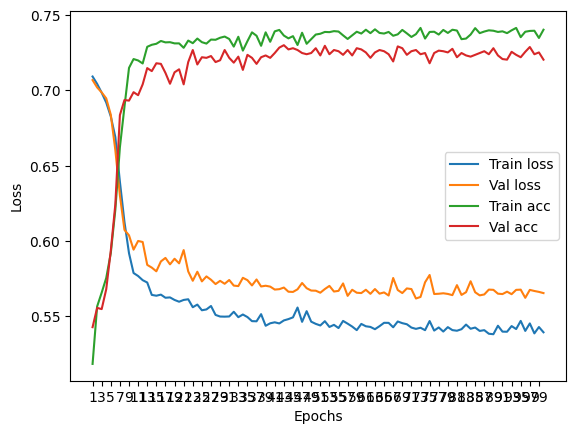

Test accuracy:  74.76


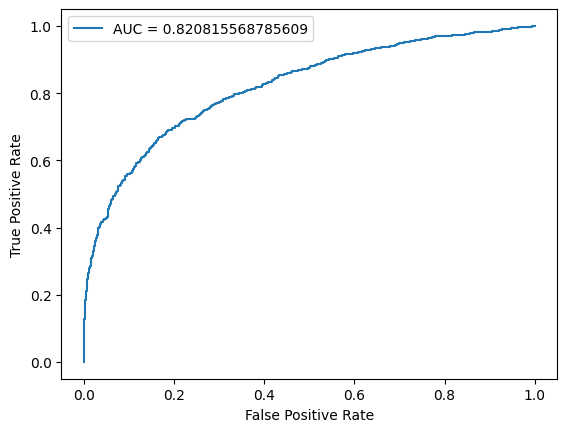

In [210]:
X_filtered = X_norm[:12500, :15, :]
y_filtered = y10[:12500]
epochs = 100
batch_size = 256
dataset = create_graph_dataset(X_filtered,y_filtered)

data_train, data_val, data_test = torch.utils.data.random_split(dataset, [train_ratio, val_ratio, test_ratio])

train_dataloader = DataLoader(data_train,
                      batch_size = batch_size,
                      shuffle=True)
val_dataloader = DataLoader(data_val,
                            batch_size = batch_size,
                            shuffle=True)
test_dataloader = DataLoader(data_test,
                 batch_size = batch_size,
                 shuffle=True)

hidden_dims = [32,32]
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())

optimizer = Adam(model.parameters(), 5e-3)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

plot_loss(history)
plot_auc(model, test_dataloader)

Particles per jet: 1


235it [00:08, 28.15it/s]


Train Epoch: 0 	Loss: 0.616458, Accuracy: 39860/59922 (67%)
Val Epoch: 0 	Loss: 0.579156, Accuracy: 14070/19974 (70%)



235it [00:09, 25.39it/s]


Train Epoch: 1 	Loss: 0.583521, Accuracy: 42120/59922 (70%)
Val Epoch: 1 	Loss: 0.579888, Accuracy: 14137/19974 (71%)



235it [00:09, 25.63it/s]


Train Epoch: 2 	Loss: 0.580438, Accuracy: 42355/59922 (71%)
Val Epoch: 2 	Loss: 0.579384, Accuracy: 14090/19974 (71%)



235it [00:08, 27.95it/s]


Train Epoch: 3 	Loss: 0.579766, Accuracy: 42272/59922 (71%)
Val Epoch: 3 	Loss: 0.582493, Accuracy: 14118/19974 (71%)



235it [00:08, 29.03it/s]


Train Epoch: 4 	Loss: 0.579034, Accuracy: 42253/59922 (71%)
Val Epoch: 4 	Loss: 0.579343, Accuracy: 14098/19974 (71%)



235it [00:07, 29.94it/s]


Train Epoch: 5 	Loss: 0.578922, Accuracy: 42371/59922 (71%)
Val Epoch: 5 	Loss: 0.576028, Accuracy: 14106/19974 (71%)



235it [00:10, 22.65it/s]


Train Epoch: 6 	Loss: 0.579996, Accuracy: 42295/59922 (71%)
Val Epoch: 6 	Loss: 0.587415, Accuracy: 14053/19974 (70%)



235it [00:08, 27.97it/s]


Train Epoch: 7 	Loss: 0.579647, Accuracy: 42350/59922 (71%)
Val Epoch: 7 	Loss: 0.578208, Accuracy: 14134/19974 (71%)



235it [00:06, 35.73it/s]


Train Epoch: 8 	Loss: 0.579073, Accuracy: 42290/59922 (71%)
Val Epoch: 8 	Loss: 0.578397, Accuracy: 14115/19974 (71%)



235it [00:10, 22.09it/s]


Train Epoch: 9 	Loss: 0.578627, Accuracy: 42324/59922 (71%)
Val Epoch: 9 	Loss: 0.576992, Accuracy: 14130/19974 (71%)



235it [00:10, 21.41it/s]


Train Epoch: 10 	Loss: 0.578080, Accuracy: 42381/59922 (71%)
Val Epoch: 10 	Loss: 0.577888, Accuracy: 14133/19974 (71%)



235it [00:09, 23.76it/s]


Train Epoch: 11 	Loss: 0.578365, Accuracy: 42296/59922 (71%)
Val Epoch: 11 	Loss: 0.581914, Accuracy: 14106/19974 (71%)



235it [00:09, 25.79it/s]


Train Epoch: 12 	Loss: 0.577527, Accuracy: 42327/59922 (71%)
Val Epoch: 12 	Loss: 0.577783, Accuracy: 14143/19974 (71%)



235it [00:08, 28.21it/s]


Train Epoch: 13 	Loss: 0.577989, Accuracy: 42388/59922 (71%)
Val Epoch: 13 	Loss: 0.576668, Accuracy: 14120/19974 (71%)



235it [00:08, 26.38it/s]


Train Epoch: 14 	Loss: 0.576815, Accuracy: 42339/59922 (71%)
Val Epoch: 14 	Loss: 0.582036, Accuracy: 14121/19974 (71%)



235it [00:09, 24.60it/s]


Train Epoch: 15 	Loss: 0.578672, Accuracy: 42327/59922 (71%)
Val Epoch: 15 	Loss: 0.577134, Accuracy: 14107/19974 (71%)



235it [00:14, 16.73it/s]


Train Epoch: 16 	Loss: 0.576531, Accuracy: 42346/59922 (71%)
Val Epoch: 16 	Loss: 0.580864, Accuracy: 14146/19974 (71%)



235it [00:08, 27.55it/s]


Train Epoch: 17 	Loss: 0.577719, Accuracy: 42273/59922 (71%)
Val Epoch: 17 	Loss: 0.579456, Accuracy: 14106/19974 (71%)



235it [00:06, 36.75it/s]


Train Epoch: 18 	Loss: 0.577422, Accuracy: 42376/59922 (71%)
Val Epoch: 18 	Loss: 0.577553, Accuracy: 14163/19974 (71%)



235it [00:06, 33.76it/s]


Train Epoch: 19 	Loss: 0.577263, Accuracy: 42381/59922 (71%)
Val Epoch: 19 	Loss: 0.577425, Accuracy: 14139/19974 (71%)

Test accuracy:  71.12746570541704


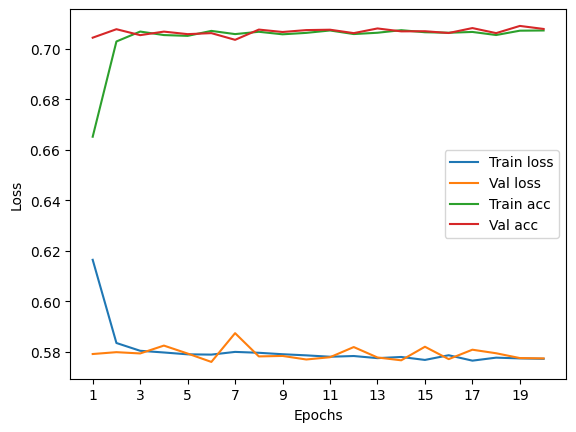

****************************************************************************************************

Particles per jet: 2


235it [00:11, 21.17it/s]


Train Epoch: 0 	Loss: 0.610250, Accuracy: 40022/59922 (67%)
Val Epoch: 0 	Loss: 0.568169, Accuracy: 14403/19974 (72%)



235it [00:08, 27.38it/s]


Train Epoch: 1 	Loss: 0.563033, Accuracy: 43214/59922 (72%)
Val Epoch: 1 	Loss: 0.561425, Accuracy: 14422/19974 (72%)



235it [00:10, 23.05it/s]


Train Epoch: 2 	Loss: 0.557556, Accuracy: 43410/59922 (72%)
Val Epoch: 2 	Loss: 0.566297, Accuracy: 14337/19974 (72%)



235it [00:10, 23.05it/s]


Train Epoch: 3 	Loss: 0.558071, Accuracy: 43430/59922 (72%)
Val Epoch: 3 	Loss: 0.562003, Accuracy: 14402/19974 (72%)



235it [00:11, 20.44it/s]


Train Epoch: 4 	Loss: 0.557382, Accuracy: 43379/59922 (72%)
Val Epoch: 4 	Loss: 0.566116, Accuracy: 14457/19974 (72%)



235it [00:09, 25.13it/s]


Train Epoch: 5 	Loss: 0.556118, Accuracy: 43522/59922 (73%)
Val Epoch: 5 	Loss: 0.560900, Accuracy: 14448/19974 (72%)



235it [00:09, 25.17it/s]


Train Epoch: 6 	Loss: 0.557013, Accuracy: 43428/59922 (72%)
Val Epoch: 6 	Loss: 0.565257, Accuracy: 14386/19974 (72%)



235it [00:10, 23.39it/s]


Train Epoch: 7 	Loss: 0.556572, Accuracy: 43499/59922 (73%)
Val Epoch: 7 	Loss: 0.558647, Accuracy: 14435/19974 (72%)



235it [00:09, 23.68it/s]


Train Epoch: 8 	Loss: 0.556696, Accuracy: 43546/59922 (73%)
Val Epoch: 8 	Loss: 0.558674, Accuracy: 14478/19974 (72%)



235it [00:11, 20.65it/s]


Train Epoch: 9 	Loss: 0.555416, Accuracy: 43480/59922 (73%)
Val Epoch: 9 	Loss: 0.560542, Accuracy: 14413/19974 (72%)



235it [00:10, 22.96it/s]


Train Epoch: 10 	Loss: 0.555696, Accuracy: 43449/59922 (73%)
Val Epoch: 10 	Loss: 0.568992, Accuracy: 14301/19974 (72%)



235it [00:09, 24.25it/s]


Train Epoch: 11 	Loss: 0.556162, Accuracy: 43472/59922 (73%)
Val Epoch: 11 	Loss: 0.561163, Accuracy: 14451/19974 (72%)



235it [00:08, 27.87it/s]


Train Epoch: 12 	Loss: 0.554312, Accuracy: 43597/59922 (73%)
Val Epoch: 12 	Loss: 0.557565, Accuracy: 14471/19974 (72%)



235it [00:08, 28.63it/s]


Train Epoch: 13 	Loss: 0.555127, Accuracy: 43534/59922 (73%)
Val Epoch: 13 	Loss: 0.575660, Accuracy: 14179/19974 (71%)



235it [00:08, 26.59it/s]


Train Epoch: 14 	Loss: 0.554288, Accuracy: 43540/59922 (73%)
Val Epoch: 14 	Loss: 0.564843, Accuracy: 14361/19974 (72%)



235it [00:08, 27.70it/s]


Train Epoch: 15 	Loss: 0.555152, Accuracy: 43508/59922 (73%)
Val Epoch: 15 	Loss: 0.575889, Accuracy: 14184/19974 (71%)



235it [00:09, 23.59it/s]


Train Epoch: 16 	Loss: 0.555300, Accuracy: 43476/59922 (73%)
Val Epoch: 16 	Loss: 0.565030, Accuracy: 14417/19974 (72%)



235it [00:10, 21.57it/s]


Train Epoch: 17 	Loss: 0.554500, Accuracy: 43501/59922 (73%)
Val Epoch: 17 	Loss: 0.562091, Accuracy: 14492/19974 (73%)



235it [00:12, 19.14it/s]


Train Epoch: 18 	Loss: 0.554239, Accuracy: 43579/59922 (73%)
Val Epoch: 18 	Loss: 0.555065, Accuracy: 14459/19974 (72%)



235it [00:07, 30.41it/s]


Train Epoch: 19 	Loss: 0.554249, Accuracy: 43536/59922 (73%)
Val Epoch: 19 	Loss: 0.561520, Accuracy: 14412/19974 (72%)

Test accuracy:  72.62941824371684


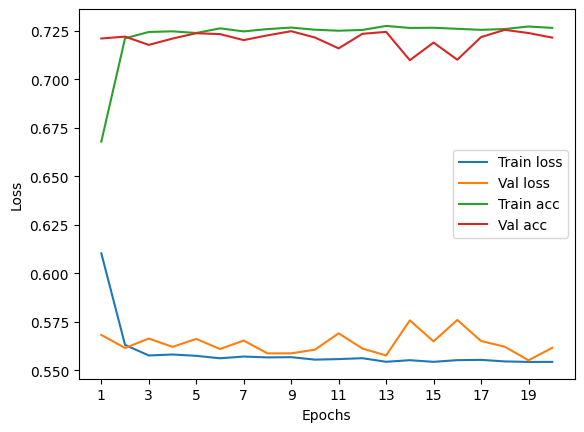

****************************************************************************************************

Particles per jet: 3


235it [00:11, 20.53it/s]


Train Epoch: 0 	Loss: 0.657902, Accuracy: 36681/59922 (61%)
Val Epoch: 0 	Loss: 0.607415, Accuracy: 13922/19974 (70%)



235it [00:15, 15.16it/s]


Train Epoch: 1 	Loss: 0.604735, Accuracy: 41730/59922 (70%)
Val Epoch: 1 	Loss: 0.597445, Accuracy: 14130/19974 (71%)



235it [00:15, 15.45it/s]


Train Epoch: 2 	Loss: 0.598955, Accuracy: 42226/59922 (70%)
Val Epoch: 2 	Loss: 0.591461, Accuracy: 14157/19974 (71%)



235it [00:14, 16.12it/s]


Train Epoch: 3 	Loss: 0.593737, Accuracy: 42597/59922 (71%)
Val Epoch: 3 	Loss: 0.589476, Accuracy: 14089/19974 (71%)



235it [00:08, 28.60it/s]


Train Epoch: 4 	Loss: 0.590174, Accuracy: 42725/59922 (71%)
Val Epoch: 4 	Loss: 0.582178, Accuracy: 14317/19974 (72%)



235it [00:08, 28.91it/s]


Train Epoch: 5 	Loss: 0.584121, Accuracy: 42922/59922 (72%)
Val Epoch: 5 	Loss: 0.583025, Accuracy: 14181/19974 (71%)



235it [00:08, 26.74it/s]


Train Epoch: 6 	Loss: 0.575428, Accuracy: 43082/59922 (72%)
Val Epoch: 6 	Loss: 0.573095, Accuracy: 14402/19974 (72%)



235it [00:08, 28.74it/s]


Train Epoch: 7 	Loss: 0.572347, Accuracy: 43101/59922 (72%)
Val Epoch: 7 	Loss: 0.568791, Accuracy: 14418/19974 (72%)



235it [00:08, 27.68it/s]


Train Epoch: 8 	Loss: 0.571972, Accuracy: 43092/59922 (72%)
Val Epoch: 8 	Loss: 0.576976, Accuracy: 14340/19974 (72%)



235it [00:10, 22.59it/s]


Train Epoch: 9 	Loss: 0.569663, Accuracy: 43237/59922 (72%)
Val Epoch: 9 	Loss: 0.569452, Accuracy: 14439/19974 (72%)



235it [00:08, 26.53it/s]


Train Epoch: 10 	Loss: 0.568413, Accuracy: 43218/59922 (72%)
Val Epoch: 10 	Loss: 0.563917, Accuracy: 14487/19974 (73%)



235it [00:07, 30.36it/s]


Train Epoch: 11 	Loss: 0.568201, Accuracy: 43350/59922 (72%)
Val Epoch: 11 	Loss: 0.573455, Accuracy: 14293/19974 (72%)



235it [00:10, 21.48it/s]


Train Epoch: 12 	Loss: 0.566759, Accuracy: 43280/59922 (72%)
Val Epoch: 12 	Loss: 0.562083, Accuracy: 14432/19974 (72%)



235it [00:09, 24.07it/s]


Train Epoch: 13 	Loss: 0.565767, Accuracy: 43402/59922 (72%)
Val Epoch: 13 	Loss: 0.567583, Accuracy: 14439/19974 (72%)



235it [00:12, 18.47it/s]


Train Epoch: 14 	Loss: 0.566113, Accuracy: 43371/59922 (72%)
Val Epoch: 14 	Loss: 0.564222, Accuracy: 14489/19974 (73%)



235it [00:10, 21.99it/s]


Train Epoch: 15 	Loss: 0.566256, Accuracy: 43396/59922 (72%)
Val Epoch: 15 	Loss: 0.560750, Accuracy: 14474/19974 (72%)



235it [00:09, 23.87it/s]


Train Epoch: 16 	Loss: 0.564312, Accuracy: 43394/59922 (72%)
Val Epoch: 16 	Loss: 0.561957, Accuracy: 14564/19974 (73%)



235it [00:07, 29.74it/s]


Train Epoch: 17 	Loss: 0.561856, Accuracy: 43424/59922 (72%)
Val Epoch: 17 	Loss: 0.576315, Accuracy: 14388/19974 (72%)



235it [00:08, 26.27it/s]


Train Epoch: 18 	Loss: 0.563019, Accuracy: 43519/59922 (73%)
Val Epoch: 18 	Loss: 0.563287, Accuracy: 14491/19974 (73%)



235it [00:07, 30.10it/s]


Train Epoch: 19 	Loss: 0.561933, Accuracy: 43477/59922 (73%)
Val Epoch: 19 	Loss: 0.561670, Accuracy: 14467/19974 (72%)

Test accuracy:  71.97857214378692


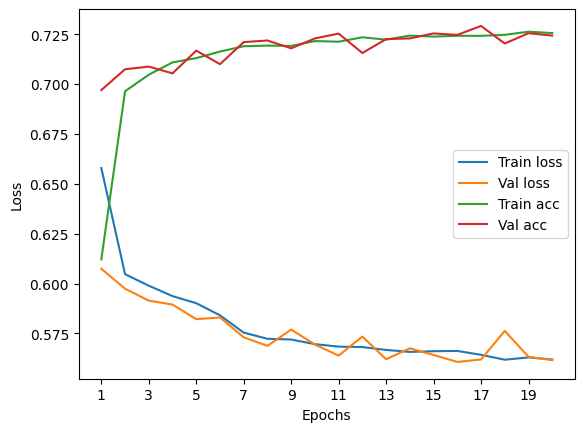

****************************************************************************************************

Particles per jet: 4


235it [00:06, 33.84it/s]


Train Epoch: 0 	Loss: 0.656217, Accuracy: 36532/59922 (61%)
Val Epoch: 0 	Loss: 0.610865, Accuracy: 13779/19974 (69%)



235it [00:07, 31.36it/s]


Train Epoch: 1 	Loss: 0.601456, Accuracy: 41877/59922 (70%)
Val Epoch: 1 	Loss: 0.593654, Accuracy: 14149/19974 (71%)



235it [00:07, 30.06it/s]


Train Epoch: 2 	Loss: 0.594093, Accuracy: 42293/59922 (71%)
Val Epoch: 2 	Loss: 0.588401, Accuracy: 14257/19974 (71%)



235it [00:08, 27.35it/s]


Train Epoch: 3 	Loss: 0.588490, Accuracy: 42665/59922 (71%)
Val Epoch: 3 	Loss: 0.580363, Accuracy: 14322/19974 (72%)



235it [00:08, 28.66it/s]


Train Epoch: 4 	Loss: 0.583777, Accuracy: 42911/59922 (72%)
Val Epoch: 4 	Loss: 0.584412, Accuracy: 14302/19974 (72%)



235it [00:08, 27.65it/s]


Train Epoch: 5 	Loss: 0.580610, Accuracy: 43120/59922 (72%)
Val Epoch: 5 	Loss: 0.571662, Accuracy: 14383/19974 (72%)



235it [00:07, 29.93it/s]


Train Epoch: 6 	Loss: 0.576755, Accuracy: 43243/59922 (72%)
Val Epoch: 6 	Loss: 0.571268, Accuracy: 14430/19974 (72%)



235it [00:07, 32.17it/s]


Train Epoch: 7 	Loss: 0.573416, Accuracy: 43279/59922 (72%)
Val Epoch: 7 	Loss: 0.572775, Accuracy: 14386/19974 (72%)



235it [00:07, 30.53it/s]


Train Epoch: 8 	Loss: 0.571545, Accuracy: 43236/59922 (72%)
Val Epoch: 8 	Loss: 0.575172, Accuracy: 14374/19974 (72%)



235it [00:07, 29.88it/s]


Train Epoch: 9 	Loss: 0.569039, Accuracy: 43298/59922 (72%)
Val Epoch: 9 	Loss: 0.570700, Accuracy: 14491/19974 (73%)



235it [00:06, 34.03it/s]


Train Epoch: 10 	Loss: 0.567352, Accuracy: 43351/59922 (72%)
Val Epoch: 10 	Loss: 0.567635, Accuracy: 14455/19974 (72%)



235it [00:07, 29.83it/s]


Train Epoch: 11 	Loss: 0.564483, Accuracy: 43288/59922 (72%)
Val Epoch: 11 	Loss: 0.561067, Accuracy: 14478/19974 (72%)



235it [00:07, 32.46it/s]


Train Epoch: 12 	Loss: 0.562729, Accuracy: 43507/59922 (73%)
Val Epoch: 12 	Loss: 0.561094, Accuracy: 14459/19974 (72%)



235it [00:07, 29.75it/s]


Train Epoch: 13 	Loss: 0.561852, Accuracy: 43554/59922 (73%)
Val Epoch: 13 	Loss: 0.567488, Accuracy: 14422/19974 (72%)



235it [00:07, 29.72it/s]


Train Epoch: 14 	Loss: 0.561850, Accuracy: 43558/59922 (73%)
Val Epoch: 14 	Loss: 0.561746, Accuracy: 14431/19974 (72%)



235it [00:07, 33.52it/s]


Train Epoch: 15 	Loss: 0.561107, Accuracy: 43588/59922 (73%)
Val Epoch: 15 	Loss: 0.558708, Accuracy: 14501/19974 (73%)



235it [00:07, 31.34it/s]


Train Epoch: 16 	Loss: 0.561835, Accuracy: 43553/59922 (73%)
Val Epoch: 16 	Loss: 0.561270, Accuracy: 14513/19974 (73%)



235it [00:06, 37.27it/s]


Train Epoch: 17 	Loss: 0.560125, Accuracy: 43629/59922 (73%)
Val Epoch: 17 	Loss: 0.564522, Accuracy: 14503/19974 (73%)



235it [00:07, 32.78it/s]


Train Epoch: 18 	Loss: 0.559261, Accuracy: 43587/59922 (73%)
Val Epoch: 18 	Loss: 0.557515, Accuracy: 14511/19974 (73%)



235it [00:06, 34.92it/s]


Train Epoch: 19 	Loss: 0.558111, Accuracy: 43584/59922 (73%)
Val Epoch: 19 	Loss: 0.555661, Accuracy: 14551/19974 (73%)

Test accuracy:  72.37909282066687


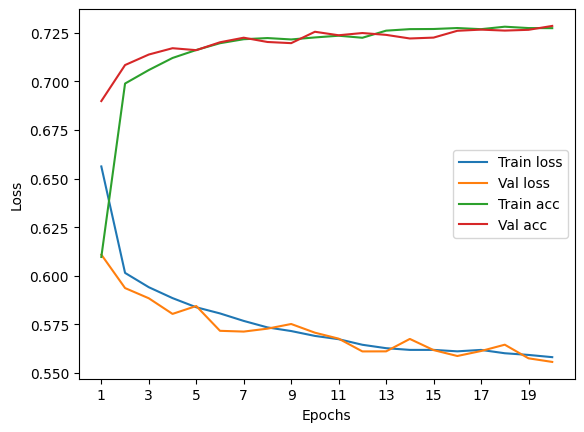

****************************************************************************************************

Particles per jet: 5


235it [00:06, 33.83it/s]


Train Epoch: 0 	Loss: 0.648433, Accuracy: 36968/59922 (62%)
Val Epoch: 0 	Loss: 0.596260, Accuracy: 14037/19974 (70%)



235it [00:06, 35.62it/s]


Train Epoch: 1 	Loss: 0.597416, Accuracy: 42154/59922 (70%)
Val Epoch: 1 	Loss: 0.590056, Accuracy: 14204/19974 (71%)



235it [00:06, 34.64it/s]


Train Epoch: 2 	Loss: 0.593200, Accuracy: 42553/59922 (71%)
Val Epoch: 2 	Loss: 0.588910, Accuracy: 14232/19974 (71%)



235it [00:07, 32.73it/s]


Train Epoch: 3 	Loss: 0.589031, Accuracy: 42663/59922 (71%)
Val Epoch: 3 	Loss: 0.583152, Accuracy: 14296/19974 (72%)



235it [00:06, 34.75it/s]


Train Epoch: 4 	Loss: 0.589029, Accuracy: 42711/59922 (71%)
Val Epoch: 4 	Loss: 0.584338, Accuracy: 14302/19974 (72%)



235it [00:06, 38.03it/s]


Train Epoch: 5 	Loss: 0.586926, Accuracy: 42750/59922 (71%)
Val Epoch: 5 	Loss: 0.592454, Accuracy: 14074/19974 (70%)



235it [00:06, 36.03it/s]


Train Epoch: 6 	Loss: 0.584260, Accuracy: 42829/59922 (71%)
Val Epoch: 6 	Loss: 0.576491, Accuracy: 14327/19974 (72%)



235it [00:05, 40.11it/s]


Train Epoch: 7 	Loss: 0.582989, Accuracy: 42894/59922 (72%)
Val Epoch: 7 	Loss: 0.586534, Accuracy: 14180/19974 (71%)



235it [00:07, 33.19it/s]


Train Epoch: 8 	Loss: 0.581970, Accuracy: 42849/59922 (72%)
Val Epoch: 8 	Loss: 0.577724, Accuracy: 14356/19974 (72%)



235it [00:06, 36.72it/s]


Train Epoch: 9 	Loss: 0.577672, Accuracy: 42891/59922 (72%)
Val Epoch: 9 	Loss: 0.571962, Accuracy: 14370/19974 (72%)



235it [00:06, 34.01it/s]


Train Epoch: 10 	Loss: 0.573979, Accuracy: 42952/59922 (72%)
Val Epoch: 10 	Loss: 0.570834, Accuracy: 14349/19974 (72%)



235it [00:06, 38.25it/s]


Train Epoch: 11 	Loss: 0.571461, Accuracy: 43007/59922 (72%)
Val Epoch: 11 	Loss: 0.571320, Accuracy: 14347/19974 (72%)



235it [00:07, 32.27it/s]


Train Epoch: 12 	Loss: 0.567674, Accuracy: 43033/59922 (72%)
Val Epoch: 12 	Loss: 0.566473, Accuracy: 14334/19974 (72%)



235it [00:06, 38.28it/s]


Train Epoch: 13 	Loss: 0.566625, Accuracy: 43002/59922 (72%)
Val Epoch: 13 	Loss: 0.561813, Accuracy: 14414/19974 (72%)



235it [00:06, 37.20it/s]


Train Epoch: 14 	Loss: 0.566029, Accuracy: 43072/59922 (72%)
Val Epoch: 14 	Loss: 0.566439, Accuracy: 14353/19974 (72%)



235it [00:06, 36.48it/s]


Train Epoch: 15 	Loss: 0.566506, Accuracy: 43092/59922 (72%)
Val Epoch: 15 	Loss: 0.563098, Accuracy: 14415/19974 (72%)



235it [00:06, 35.52it/s]


Train Epoch: 16 	Loss: 0.565652, Accuracy: 43059/59922 (72%)
Val Epoch: 16 	Loss: 0.566188, Accuracy: 14400/19974 (72%)



235it [00:06, 37.17it/s]


Train Epoch: 17 	Loss: 0.563933, Accuracy: 43117/59922 (72%)
Val Epoch: 17 	Loss: 0.562200, Accuracy: 14464/19974 (72%)



235it [00:08, 28.18it/s]


Train Epoch: 18 	Loss: 0.563806, Accuracy: 43157/59922 (72%)
Val Epoch: 18 	Loss: 0.560872, Accuracy: 14314/19974 (72%)



235it [00:07, 32.47it/s]


Train Epoch: 19 	Loss: 0.562048, Accuracy: 43242/59922 (72%)
Val Epoch: 19 	Loss: 0.562870, Accuracy: 14449/19974 (72%)

Test accuracy:  71.93351356763793


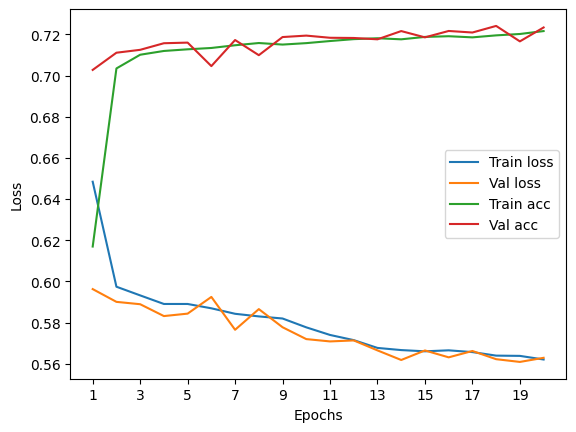

****************************************************************************************************

Particles per jet: 6


235it [00:06, 38.01it/s]


Train Epoch: 0 	Loss: 0.642820, Accuracy: 37817/59922 (63%)
Val Epoch: 0 	Loss: 0.605725, Accuracy: 13894/19974 (70%)



235it [00:06, 37.12it/s]


Train Epoch: 1 	Loss: 0.597930, Accuracy: 41946/59922 (70%)
Val Epoch: 1 	Loss: 0.596870, Accuracy: 14114/19974 (71%)



235it [00:07, 29.55it/s]


Train Epoch: 2 	Loss: 0.590548, Accuracy: 42385/59922 (71%)
Val Epoch: 2 	Loss: 0.591300, Accuracy: 14190/19974 (71%)



235it [00:09, 25.90it/s]


Train Epoch: 3 	Loss: 0.588255, Accuracy: 42524/59922 (71%)
Val Epoch: 3 	Loss: 0.594990, Accuracy: 14070/19974 (70%)



235it [00:08, 28.26it/s]


Train Epoch: 4 	Loss: 0.586994, Accuracy: 42632/59922 (71%)
Val Epoch: 4 	Loss: 0.587762, Accuracy: 14334/19974 (72%)



235it [00:07, 31.67it/s]


Train Epoch: 5 	Loss: 0.584024, Accuracy: 42770/59922 (71%)
Val Epoch: 5 	Loss: 0.581073, Accuracy: 14401/19974 (72%)



235it [00:06, 34.15it/s]


Train Epoch: 6 	Loss: 0.582460, Accuracy: 42909/59922 (72%)
Val Epoch: 6 	Loss: 0.579711, Accuracy: 14371/19974 (72%)



235it [00:06, 37.54it/s]


Train Epoch: 7 	Loss: 0.581402, Accuracy: 42908/59922 (72%)
Val Epoch: 7 	Loss: 0.579441, Accuracy: 14411/19974 (72%)



235it [00:07, 30.19it/s]


Train Epoch: 8 	Loss: 0.579008, Accuracy: 43028/59922 (72%)
Val Epoch: 8 	Loss: 0.588266, Accuracy: 14390/19974 (72%)



235it [00:07, 30.34it/s]


Train Epoch: 9 	Loss: 0.578284, Accuracy: 42922/59922 (72%)
Val Epoch: 9 	Loss: 0.575956, Accuracy: 14430/19974 (72%)



235it [00:07, 32.85it/s]


Train Epoch: 10 	Loss: 0.574515, Accuracy: 43025/59922 (72%)
Val Epoch: 10 	Loss: 0.572402, Accuracy: 14388/19974 (72%)



235it [00:07, 30.31it/s]


Train Epoch: 11 	Loss: 0.573523, Accuracy: 43132/59922 (72%)
Val Epoch: 11 	Loss: 0.574895, Accuracy: 14370/19974 (72%)



235it [00:06, 34.08it/s]


Train Epoch: 12 	Loss: 0.572788, Accuracy: 42992/59922 (72%)
Val Epoch: 12 	Loss: 0.567161, Accuracy: 14467/19974 (72%)



235it [00:07, 32.13it/s]


Train Epoch: 13 	Loss: 0.571303, Accuracy: 43073/59922 (72%)
Val Epoch: 13 	Loss: 0.567110, Accuracy: 14452/19974 (72%)



235it [00:09, 25.33it/s]


Train Epoch: 14 	Loss: 0.568875, Accuracy: 43068/59922 (72%)
Val Epoch: 14 	Loss: 0.574247, Accuracy: 14389/19974 (72%)



235it [00:07, 31.94it/s]


Train Epoch: 15 	Loss: 0.567986, Accuracy: 43129/59922 (72%)
Val Epoch: 15 	Loss: 0.568698, Accuracy: 14441/19974 (72%)



235it [00:07, 33.50it/s]


Train Epoch: 16 	Loss: 0.566619, Accuracy: 43087/59922 (72%)
Val Epoch: 16 	Loss: 0.563357, Accuracy: 14448/19974 (72%)



235it [00:07, 33.54it/s]


Train Epoch: 17 	Loss: 0.567394, Accuracy: 43117/59922 (72%)
Val Epoch: 17 	Loss: 0.558871, Accuracy: 14488/19974 (73%)



235it [00:07, 33.30it/s]


Train Epoch: 18 	Loss: 0.564138, Accuracy: 43267/59922 (72%)
Val Epoch: 18 	Loss: 0.564720, Accuracy: 14419/19974 (72%)



235it [00:07, 30.97it/s]


Train Epoch: 19 	Loss: 0.564001, Accuracy: 43306/59922 (72%)
Val Epoch: 19 	Loss: 0.568977, Accuracy: 14491/19974 (73%)

Test accuracy:  71.96855912686493


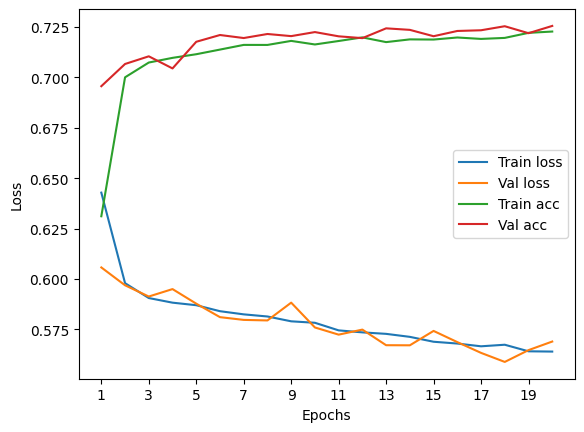

****************************************************************************************************

Particles per jet: 7


235it [00:08, 28.77it/s]


Train Epoch: 0 	Loss: 0.639755, Accuracy: 37980/59922 (63%)
Val Epoch: 0 	Loss: 0.599178, Accuracy: 14018/19974 (70%)



235it [00:07, 33.26it/s]


Train Epoch: 1 	Loss: 0.597827, Accuracy: 42001/59922 (70%)
Val Epoch: 1 	Loss: 0.587048, Accuracy: 14212/19974 (71%)



235it [00:08, 29.05it/s]


Train Epoch: 2 	Loss: 0.591143, Accuracy: 42389/59922 (71%)
Val Epoch: 2 	Loss: 0.589053, Accuracy: 14199/19974 (71%)



235it [00:07, 32.84it/s]


Train Epoch: 3 	Loss: 0.589724, Accuracy: 42638/59922 (71%)
Val Epoch: 3 	Loss: 0.600872, Accuracy: 14066/19974 (70%)



235it [00:06, 35.01it/s]


Train Epoch: 4 	Loss: 0.586126, Accuracy: 42615/59922 (71%)
Val Epoch: 4 	Loss: 0.585839, Accuracy: 14305/19974 (72%)



235it [00:09, 24.80it/s]


Train Epoch: 5 	Loss: 0.582723, Accuracy: 42692/59922 (71%)
Val Epoch: 5 	Loss: 0.575007, Accuracy: 14314/19974 (72%)



235it [00:13, 17.78it/s]


Train Epoch: 6 	Loss: 0.577217, Accuracy: 42749/59922 (71%)
Val Epoch: 6 	Loss: 0.569474, Accuracy: 14299/19974 (72%)



235it [00:08, 26.29it/s]


Train Epoch: 7 	Loss: 0.573049, Accuracy: 42735/59922 (71%)
Val Epoch: 7 	Loss: 0.572828, Accuracy: 14347/19974 (72%)



235it [00:09, 25.41it/s]


Train Epoch: 8 	Loss: 0.570832, Accuracy: 42845/59922 (72%)
Val Epoch: 8 	Loss: 0.577628, Accuracy: 14276/19974 (71%)



235it [00:10, 22.65it/s]


Train Epoch: 9 	Loss: 0.570570, Accuracy: 42773/59922 (71%)
Val Epoch: 9 	Loss: 0.571894, Accuracy: 14359/19974 (72%)



235it [00:07, 30.33it/s]


Train Epoch: 10 	Loss: 0.569689, Accuracy: 42849/59922 (72%)
Val Epoch: 10 	Loss: 0.575313, Accuracy: 14307/19974 (72%)



235it [00:08, 27.52it/s]


Train Epoch: 11 	Loss: 0.568657, Accuracy: 42902/59922 (72%)
Val Epoch: 11 	Loss: 0.565922, Accuracy: 14388/19974 (72%)



235it [00:08, 28.38it/s]


Train Epoch: 12 	Loss: 0.568915, Accuracy: 42921/59922 (72%)
Val Epoch: 12 	Loss: 0.574480, Accuracy: 14293/19974 (72%)



235it [00:08, 27.35it/s]


Train Epoch: 13 	Loss: 0.567220, Accuracy: 42947/59922 (72%)
Val Epoch: 13 	Loss: 0.564829, Accuracy: 14383/19974 (72%)



235it [00:07, 29.60it/s]


Train Epoch: 14 	Loss: 0.566819, Accuracy: 42954/59922 (72%)
Val Epoch: 14 	Loss: 0.567211, Accuracy: 14333/19974 (72%)



235it [00:09, 25.45it/s]


Train Epoch: 15 	Loss: 0.566681, Accuracy: 42906/59922 (72%)
Val Epoch: 15 	Loss: 0.560503, Accuracy: 14393/19974 (72%)



235it [00:07, 29.98it/s]


Train Epoch: 16 	Loss: 0.565584, Accuracy: 42999/59922 (72%)
Val Epoch: 16 	Loss: 0.568361, Accuracy: 14323/19974 (72%)



235it [00:06, 34.56it/s]


Train Epoch: 17 	Loss: 0.564577, Accuracy: 43035/59922 (72%)
Val Epoch: 17 	Loss: 0.566157, Accuracy: 14394/19974 (72%)



235it [00:07, 32.71it/s]


Train Epoch: 18 	Loss: 0.565030, Accuracy: 43081/59922 (72%)
Val Epoch: 18 	Loss: 0.570906, Accuracy: 14357/19974 (72%)



235it [00:07, 33.31it/s]


Train Epoch: 19 	Loss: 0.565878, Accuracy: 43084/59922 (72%)
Val Epoch: 19 	Loss: 0.560005, Accuracy: 14393/19974 (72%)

Test accuracy:  72.45419044758185


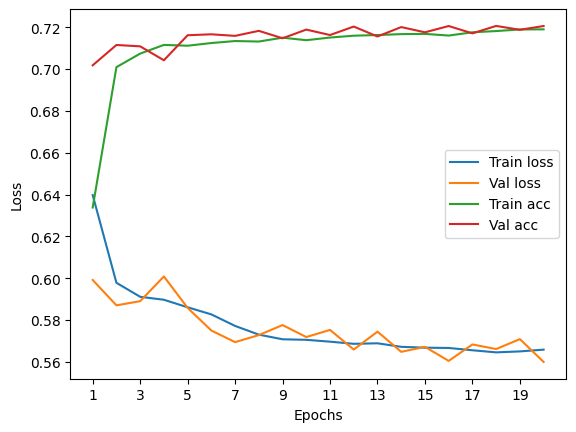

****************************************************************************************************

Particles per jet: 8


235it [00:07, 33.42it/s]


Train Epoch: 0 	Loss: 0.649956, Accuracy: 37061/59922 (62%)
Val Epoch: 0 	Loss: 0.604805, Accuracy: 13982/19974 (70%)



235it [00:07, 31.95it/s]


Train Epoch: 1 	Loss: 0.595903, Accuracy: 42141/59922 (70%)
Val Epoch: 1 	Loss: 0.593791, Accuracy: 14066/19974 (70%)



235it [00:07, 31.78it/s]


Train Epoch: 2 	Loss: 0.591889, Accuracy: 42439/59922 (71%)
Val Epoch: 2 	Loss: 0.591096, Accuracy: 14264/19974 (71%)



235it [00:08, 26.73it/s]


Train Epoch: 3 	Loss: 0.586575, Accuracy: 42788/59922 (71%)
Val Epoch: 3 	Loss: 0.581567, Accuracy: 14303/19974 (72%)



235it [00:09, 25.98it/s]


Train Epoch: 4 	Loss: 0.584771, Accuracy: 42912/59922 (72%)
Val Epoch: 4 	Loss: 0.587829, Accuracy: 14198/19974 (71%)



235it [00:10, 21.68it/s]


Train Epoch: 5 	Loss: 0.578856, Accuracy: 42909/59922 (72%)
Val Epoch: 5 	Loss: 0.580507, Accuracy: 14243/19974 (71%)



235it [00:09, 24.45it/s]


Train Epoch: 6 	Loss: 0.575257, Accuracy: 43038/59922 (72%)
Val Epoch: 6 	Loss: 0.570110, Accuracy: 14380/19974 (72%)



235it [00:08, 26.99it/s]


Train Epoch: 7 	Loss: 0.569686, Accuracy: 43181/59922 (72%)
Val Epoch: 7 	Loss: 0.563416, Accuracy: 14431/19974 (72%)



235it [00:07, 29.83it/s]


Train Epoch: 8 	Loss: 0.567131, Accuracy: 43205/59922 (72%)
Val Epoch: 8 	Loss: 0.565608, Accuracy: 14354/19974 (72%)



235it [00:08, 27.46it/s]


Train Epoch: 9 	Loss: 0.566601, Accuracy: 43230/59922 (72%)
Val Epoch: 9 	Loss: 0.566786, Accuracy: 14338/19974 (72%)



235it [00:08, 28.39it/s]


Train Epoch: 10 	Loss: 0.565141, Accuracy: 43238/59922 (72%)
Val Epoch: 10 	Loss: 0.567652, Accuracy: 14425/19974 (72%)



235it [00:07, 32.65it/s]


Train Epoch: 11 	Loss: 0.566498, Accuracy: 43242/59922 (72%)
Val Epoch: 11 	Loss: 0.570984, Accuracy: 14456/19974 (72%)



235it [00:10, 23.45it/s]


Train Epoch: 12 	Loss: 0.563621, Accuracy: 43243/59922 (72%)
Val Epoch: 12 	Loss: 0.573854, Accuracy: 14333/19974 (72%)



235it [00:09, 24.86it/s]


Train Epoch: 13 	Loss: 0.563237, Accuracy: 43325/59922 (72%)
Val Epoch: 13 	Loss: 0.566540, Accuracy: 14477/19974 (72%)



235it [00:09, 25.62it/s]


Train Epoch: 14 	Loss: 0.562625, Accuracy: 43280/59922 (72%)
Val Epoch: 14 	Loss: 0.563592, Accuracy: 14431/19974 (72%)



235it [00:08, 28.22it/s]


Train Epoch: 15 	Loss: 0.561626, Accuracy: 43393/59922 (72%)
Val Epoch: 15 	Loss: 0.564209, Accuracy: 14506/19974 (73%)



235it [00:09, 25.96it/s]


Train Epoch: 16 	Loss: 0.561325, Accuracy: 43464/59922 (73%)
Val Epoch: 16 	Loss: 0.563378, Accuracy: 14508/19974 (73%)



235it [00:09, 25.70it/s]


Train Epoch: 17 	Loss: 0.560273, Accuracy: 43470/59922 (73%)
Val Epoch: 17 	Loss: 0.561808, Accuracy: 14467/19974 (72%)



235it [00:08, 28.17it/s]


Train Epoch: 18 	Loss: 0.559543, Accuracy: 43458/59922 (73%)
Val Epoch: 18 	Loss: 0.562684, Accuracy: 14487/19974 (73%)



235it [00:08, 28.69it/s]


Train Epoch: 19 	Loss: 0.560841, Accuracy: 43409/59922 (72%)
Val Epoch: 19 	Loss: 0.559320, Accuracy: 14468/19974 (72%)

Test accuracy:  71.93351356763793


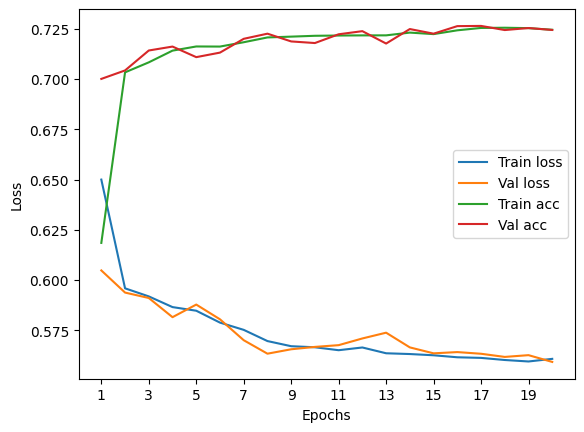

****************************************************************************************************

Particles per jet: 9


235it [00:08, 28.12it/s]


Train Epoch: 0 	Loss: 0.638825, Accuracy: 38493/59922 (64%)
Val Epoch: 0 	Loss: 0.612705, Accuracy: 13647/19974 (68%)



235it [00:08, 27.81it/s]


Train Epoch: 1 	Loss: 0.596736, Accuracy: 42133/59922 (70%)
Val Epoch: 1 	Loss: 0.597489, Accuracy: 13960/19974 (70%)



235it [00:08, 26.25it/s]


Train Epoch: 2 	Loss: 0.591478, Accuracy: 42472/59922 (71%)
Val Epoch: 2 	Loss: 0.611331, Accuracy: 13952/19974 (70%)



235it [00:08, 26.50it/s]


Train Epoch: 3 	Loss: 0.588748, Accuracy: 42675/59922 (71%)
Val Epoch: 3 	Loss: 0.592374, Accuracy: 14148/19974 (71%)



235it [00:08, 27.10it/s]


Train Epoch: 4 	Loss: 0.586587, Accuracy: 42788/59922 (71%)
Val Epoch: 4 	Loss: 0.596058, Accuracy: 14103/19974 (71%)



235it [00:08, 28.06it/s]


Train Epoch: 5 	Loss: 0.585254, Accuracy: 42938/59922 (72%)
Val Epoch: 5 	Loss: 0.587221, Accuracy: 14219/19974 (71%)



235it [00:07, 30.86it/s]


Train Epoch: 6 	Loss: 0.579616, Accuracy: 42877/59922 (72%)
Val Epoch: 6 	Loss: 0.587970, Accuracy: 14106/19974 (71%)



235it [00:07, 29.67it/s]


Train Epoch: 7 	Loss: 0.576739, Accuracy: 42944/59922 (72%)
Val Epoch: 7 	Loss: 0.578410, Accuracy: 14198/19974 (71%)



235it [00:08, 27.98it/s]


Train Epoch: 8 	Loss: 0.574326, Accuracy: 42952/59922 (72%)
Val Epoch: 8 	Loss: 0.583685, Accuracy: 14213/19974 (71%)



235it [00:07, 29.71it/s]


Train Epoch: 9 	Loss: 0.570414, Accuracy: 43098/59922 (72%)
Val Epoch: 9 	Loss: 0.572571, Accuracy: 14196/19974 (71%)



235it [00:08, 26.12it/s]


Train Epoch: 10 	Loss: 0.568244, Accuracy: 43070/59922 (72%)
Val Epoch: 10 	Loss: 0.575976, Accuracy: 14282/19974 (72%)



235it [00:08, 26.15it/s]


Train Epoch: 11 	Loss: 0.568128, Accuracy: 42961/59922 (72%)
Val Epoch: 11 	Loss: 0.580056, Accuracy: 14246/19974 (71%)



235it [00:09, 25.09it/s]


Train Epoch: 12 	Loss: 0.566296, Accuracy: 43101/59922 (72%)
Val Epoch: 12 	Loss: 0.571472, Accuracy: 14265/19974 (71%)



235it [00:08, 27.99it/s]


Train Epoch: 13 	Loss: 0.566249, Accuracy: 43132/59922 (72%)
Val Epoch: 13 	Loss: 0.567250, Accuracy: 14242/19974 (71%)



235it [00:09, 24.00it/s]


Train Epoch: 14 	Loss: 0.565341, Accuracy: 43169/59922 (72%)
Val Epoch: 14 	Loss: 0.568334, Accuracy: 14300/19974 (72%)



235it [00:10, 22.96it/s]


Train Epoch: 15 	Loss: 0.563006, Accuracy: 43232/59922 (72%)
Val Epoch: 15 	Loss: 0.572330, Accuracy: 14335/19974 (72%)



235it [00:08, 26.98it/s]


Train Epoch: 16 	Loss: 0.563454, Accuracy: 43200/59922 (72%)
Val Epoch: 16 	Loss: 0.577729, Accuracy: 14259/19974 (71%)



235it [00:12, 18.35it/s]


Train Epoch: 17 	Loss: 0.563748, Accuracy: 43174/59922 (72%)
Val Epoch: 17 	Loss: 0.567908, Accuracy: 14347/19974 (72%)



235it [00:11, 20.95it/s]


Train Epoch: 18 	Loss: 0.562558, Accuracy: 43291/59922 (72%)
Val Epoch: 18 	Loss: 0.568009, Accuracy: 14295/19974 (72%)



235it [00:10, 22.89it/s]


Train Epoch: 19 	Loss: 0.563137, Accuracy: 43310/59922 (72%)
Val Epoch: 19 	Loss: 0.567621, Accuracy: 14345/19974 (72%)

Test accuracy:  72.39911885451087


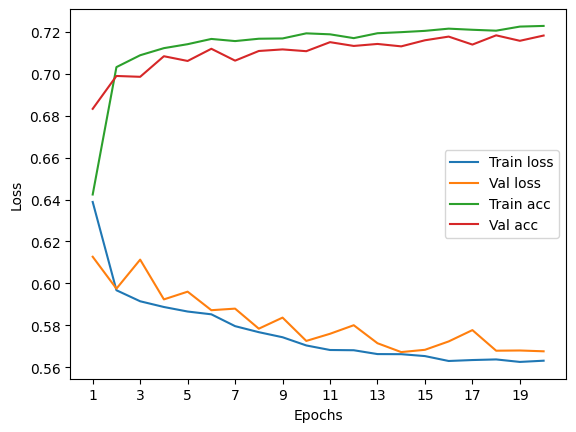

****************************************************************************************************

Particles per jet: 10


235it [00:08, 26.94it/s]


Train Epoch: 0 	Loss: 0.638087, Accuracy: 38695/59922 (65%)
Val Epoch: 0 	Loss: 0.602205, Accuracy: 13990/19974 (70%)



235it [00:09, 25.77it/s]


Train Epoch: 1 	Loss: 0.597459, Accuracy: 42055/59922 (70%)
Val Epoch: 1 	Loss: 0.593739, Accuracy: 14183/19974 (71%)



235it [00:08, 29.00it/s]


Train Epoch: 2 	Loss: 0.593410, Accuracy: 42292/59922 (71%)
Val Epoch: 2 	Loss: 0.591311, Accuracy: 14272/19974 (71%)



235it [00:09, 25.61it/s]


Train Epoch: 3 	Loss: 0.592049, Accuracy: 42470/59922 (71%)
Val Epoch: 3 	Loss: 0.587828, Accuracy: 14275/19974 (71%)



235it [00:08, 27.20it/s]


Train Epoch: 4 	Loss: 0.590165, Accuracy: 42606/59922 (71%)
Val Epoch: 4 	Loss: 0.589418, Accuracy: 14335/19974 (72%)



235it [00:07, 33.06it/s]


Train Epoch: 5 	Loss: 0.588736, Accuracy: 42586/59922 (71%)
Val Epoch: 5 	Loss: 0.587341, Accuracy: 14177/19974 (71%)



235it [00:08, 27.19it/s]


Train Epoch: 6 	Loss: 0.585984, Accuracy: 42647/59922 (71%)
Val Epoch: 6 	Loss: 0.584058, Accuracy: 14358/19974 (72%)



235it [00:08, 28.73it/s]


Train Epoch: 7 	Loss: 0.584344, Accuracy: 42757/59922 (71%)
Val Epoch: 7 	Loss: 0.583195, Accuracy: 14350/19974 (72%)



235it [00:06, 34.14it/s]


Train Epoch: 8 	Loss: 0.581465, Accuracy: 42756/59922 (71%)
Val Epoch: 8 	Loss: 0.576788, Accuracy: 14379/19974 (72%)



235it [00:08, 28.68it/s]


Train Epoch: 9 	Loss: 0.578783, Accuracy: 42686/59922 (71%)
Val Epoch: 9 	Loss: 0.571754, Accuracy: 14377/19974 (72%)



235it [00:10, 22.87it/s]


Train Epoch: 10 	Loss: 0.576468, Accuracy: 42735/59922 (71%)
Val Epoch: 10 	Loss: 0.573097, Accuracy: 14233/19974 (71%)



235it [00:07, 31.09it/s]


Train Epoch: 11 	Loss: 0.573480, Accuracy: 42799/59922 (71%)
Val Epoch: 11 	Loss: 0.568309, Accuracy: 14342/19974 (72%)



235it [00:08, 28.74it/s]


Train Epoch: 12 	Loss: 0.570941, Accuracy: 42849/59922 (72%)
Val Epoch: 12 	Loss: 0.571526, Accuracy: 14380/19974 (72%)



235it [00:07, 33.30it/s]


Train Epoch: 13 	Loss: 0.570794, Accuracy: 42806/59922 (71%)
Val Epoch: 13 	Loss: 0.565205, Accuracy: 14384/19974 (72%)



235it [00:07, 30.10it/s]


Train Epoch: 14 	Loss: 0.568713, Accuracy: 42973/59922 (72%)
Val Epoch: 14 	Loss: 0.565800, Accuracy: 14382/19974 (72%)



235it [00:07, 30.69it/s]


Train Epoch: 15 	Loss: 0.568410, Accuracy: 43088/59922 (72%)
Val Epoch: 15 	Loss: 0.563691, Accuracy: 14356/19974 (72%)



235it [00:08, 28.97it/s]


Train Epoch: 16 	Loss: 0.568113, Accuracy: 43086/59922 (72%)
Val Epoch: 16 	Loss: 0.560728, Accuracy: 14462/19974 (72%)



235it [00:07, 30.51it/s]


Train Epoch: 17 	Loss: 0.566662, Accuracy: 43183/59922 (72%)
Val Epoch: 17 	Loss: 0.564924, Accuracy: 14502/19974 (73%)



235it [00:07, 30.91it/s]


Train Epoch: 18 	Loss: 0.564959, Accuracy: 43191/59922 (72%)
Val Epoch: 18 	Loss: 0.568312, Accuracy: 14442/19974 (72%)



235it [00:07, 32.63it/s]


Train Epoch: 19 	Loss: 0.565289, Accuracy: 43240/59922 (72%)
Val Epoch: 19 	Loss: 0.562053, Accuracy: 14348/19974 (72%)

Test accuracy:  71.58305797536798


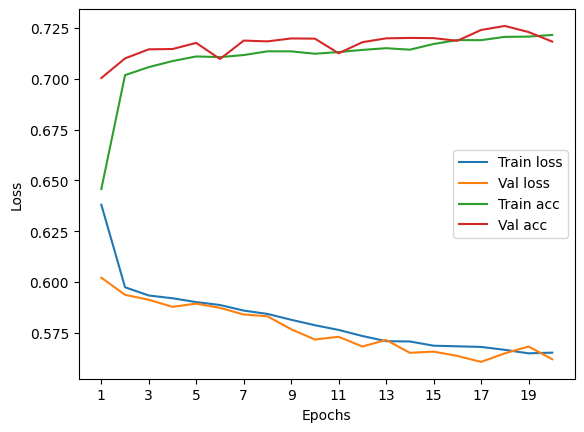

****************************************************************************************************



In [83]:
train_loss, val_loss, train_acc, val_acc, auc = find_ideal_particles(X_norm, 1, 10)

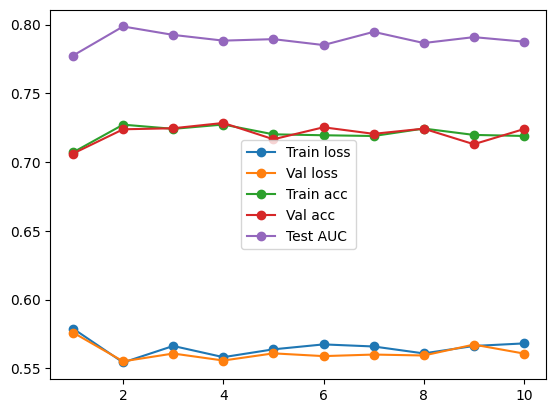

In [84]:
x = range(1,11)
plt.plot(x, train_loss, label="Train loss", marker='o')
plt.plot(x, val_loss, label="Val loss", marker='o')
plt.plot(x, train_acc, label="Train acc", marker='o')
plt.plot(x, val_acc, label="Val acc", marker='o')
plt.plot(x, auc, label="Test AUC", marker='o')
plt.legend()
plt.show()

Particles per jet: 1


313it [00:14, 22.23it/s]


Train Epoch: 0 	Loss: 0.682477, Accuracy: 43327/79896 (54%)
Val Epoch: 0 	Loss: 0.655637, Accuracy: 6715/9987 (67%)



313it [00:13, 22.84it/s]


Train Epoch: 1 	Loss: 0.594280, Accuracy: 55884/79896 (70%)
Val Epoch: 1 	Loss: 0.600949, Accuracy: 7039/9987 (70%)



313it [00:13, 22.68it/s]


Train Epoch: 2 	Loss: 0.575057, Accuracy: 56477/79896 (71%)
Val Epoch: 2 	Loss: 0.578877, Accuracy: 7057/9987 (71%)



313it [00:14, 22.10it/s]


Train Epoch: 3 	Loss: 0.573583, Accuracy: 56575/79896 (71%)
Val Epoch: 3 	Loss: 0.584570, Accuracy: 7059/9987 (71%)



313it [00:13, 23.05it/s]


Train Epoch: 4 	Loss: 0.572607, Accuracy: 56567/79896 (71%)
Val Epoch: 4 	Loss: 0.583221, Accuracy: 7055/9987 (71%)



313it [00:14, 21.88it/s]


Train Epoch: 5 	Loss: 0.572615, Accuracy: 56544/79896 (71%)
Val Epoch: 5 	Loss: 0.592841, Accuracy: 7049/9987 (71%)



313it [00:14, 21.97it/s]


Train Epoch: 6 	Loss: 0.572479, Accuracy: 56576/79896 (71%)
Val Epoch: 6 	Loss: 0.581097, Accuracy: 7059/9987 (71%)



313it [00:13, 22.59it/s]


Train Epoch: 7 	Loss: 0.571979, Accuracy: 56593/79896 (71%)
Val Epoch: 7 	Loss: 0.589944, Accuracy: 7055/9987 (71%)



313it [00:14, 22.09it/s]


Train Epoch: 8 	Loss: 0.572045, Accuracy: 56600/79896 (71%)
Val Epoch: 8 	Loss: 0.579241, Accuracy: 7058/9987 (71%)



313it [00:14, 22.21it/s]


Train Epoch: 9 	Loss: 0.571873, Accuracy: 56563/79896 (71%)
Val Epoch: 9 	Loss: 0.579046, Accuracy: 7066/9987 (71%)



313it [00:14, 21.78it/s]


Train Epoch: 10 	Loss: 0.571770, Accuracy: 56649/79896 (71%)
Val Epoch: 10 	Loss: 0.599240, Accuracy: 7063/9987 (71%)



313it [00:14, 21.59it/s]


Train Epoch: 11 	Loss: 0.572060, Accuracy: 56586/79896 (71%)
Val Epoch: 11 	Loss: 0.589098, Accuracy: 7065/9987 (71%)



313it [00:14, 22.23it/s]


Train Epoch: 12 	Loss: 0.571525, Accuracy: 56650/79896 (71%)
Val Epoch: 12 	Loss: 0.596609, Accuracy: 7060/9987 (71%)



313it [00:13, 22.36it/s]


Train Epoch: 13 	Loss: 0.571293, Accuracy: 56610/79896 (71%)
Val Epoch: 13 	Loss: 0.596891, Accuracy: 7059/9987 (71%)



313it [00:14, 22.27it/s]


Train Epoch: 14 	Loss: 0.571819, Accuracy: 56640/79896 (71%)
Val Epoch: 14 	Loss: 0.578795, Accuracy: 7057/9987 (71%)



313it [00:13, 22.44it/s]


Train Epoch: 15 	Loss: 0.571579, Accuracy: 56600/79896 (71%)
Val Epoch: 15 	Loss: 0.577380, Accuracy: 7075/9987 (71%)



313it [00:13, 22.48it/s]


Train Epoch: 16 	Loss: 0.571799, Accuracy: 56601/79896 (71%)
Val Epoch: 16 	Loss: 0.594000, Accuracy: 7055/9987 (71%)



313it [00:14, 21.96it/s]


Train Epoch: 17 	Loss: 0.571083, Accuracy: 56684/79896 (71%)
Val Epoch: 17 	Loss: 0.578702, Accuracy: 7070/9987 (71%)



313it [00:14, 22.33it/s]


Train Epoch: 18 	Loss: 0.571438, Accuracy: 56613/79896 (71%)
Val Epoch: 18 	Loss: 0.582769, Accuracy: 7068/9987 (71%)



313it [00:14, 22.01it/s]


Train Epoch: 19 	Loss: 0.571652, Accuracy: 56596/79896 (71%)
Val Epoch: 19 	Loss: 0.595934, Accuracy: 7064/9987 (71%)

Test accuracy:  70.54170421548012


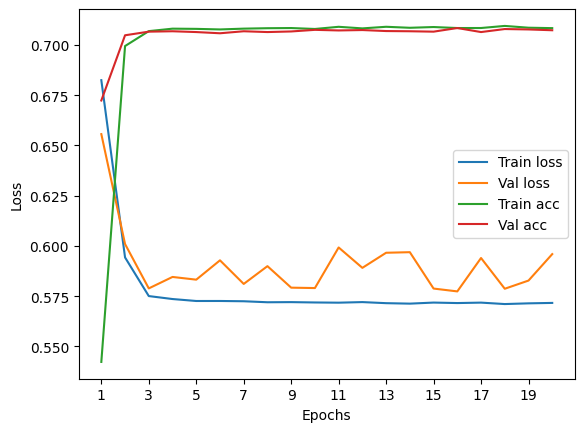

****************************************************************************************************

Particles per jet: 2


313it [00:14, 21.73it/s]


Train Epoch: 0 	Loss: 0.678923, Accuracy: 49830/79896 (62%)
Val Epoch: 0 	Loss: 0.655063, Accuracy: 7115/9987 (71%)



313it [00:14, 21.88it/s]


Train Epoch: 1 	Loss: 0.592969, Accuracy: 57683/79896 (72%)
Val Epoch: 1 	Loss: 0.572770, Accuracy: 7180/9987 (72%)



313it [00:14, 21.37it/s]


Train Epoch: 2 	Loss: 0.555326, Accuracy: 57964/79896 (73%)
Val Epoch: 2 	Loss: 0.568529, Accuracy: 7160/9987 (72%)



313it [00:15, 20.01it/s]


Train Epoch: 3 	Loss: 0.552093, Accuracy: 57909/79896 (72%)
Val Epoch: 3 	Loss: 0.564718, Accuracy: 7178/9987 (72%)



313it [00:14, 21.06it/s]


Train Epoch: 4 	Loss: 0.551724, Accuracy: 57954/79896 (73%)
Val Epoch: 4 	Loss: 0.572295, Accuracy: 7183/9987 (72%)



313it [00:14, 22.07it/s]


Train Epoch: 5 	Loss: 0.551956, Accuracy: 57982/79896 (73%)
Val Epoch: 5 	Loss: 0.561005, Accuracy: 7195/9987 (72%)



313it [00:14, 22.04it/s]


Train Epoch: 6 	Loss: 0.551713, Accuracy: 58008/79896 (73%)
Val Epoch: 6 	Loss: 0.570607, Accuracy: 7204/9987 (72%)



313it [00:14, 21.33it/s]


Train Epoch: 7 	Loss: 0.550995, Accuracy: 57955/79896 (73%)
Val Epoch: 7 	Loss: 0.571294, Accuracy: 7187/9987 (72%)



313it [00:14, 21.50it/s]


Train Epoch: 8 	Loss: 0.551187, Accuracy: 58000/79896 (73%)
Val Epoch: 8 	Loss: 0.572888, Accuracy: 7206/9987 (72%)



313it [00:14, 22.06it/s]


Train Epoch: 9 	Loss: 0.550992, Accuracy: 58038/79896 (73%)
Val Epoch: 9 	Loss: 0.569431, Accuracy: 7193/9987 (72%)



313it [00:14, 22.06it/s]


Train Epoch: 10 	Loss: 0.550777, Accuracy: 58008/79896 (73%)
Val Epoch: 10 	Loss: 0.562855, Accuracy: 7204/9987 (72%)



313it [00:14, 22.14it/s]


Train Epoch: 11 	Loss: 0.550199, Accuracy: 58038/79896 (73%)
Val Epoch: 11 	Loss: 0.571680, Accuracy: 7206/9987 (72%)



313it [00:13, 22.58it/s]


Train Epoch: 12 	Loss: 0.550152, Accuracy: 57959/79896 (73%)
Val Epoch: 12 	Loss: 0.561840, Accuracy: 7181/9987 (72%)



313it [00:14, 21.71it/s]


Train Epoch: 13 	Loss: 0.550249, Accuracy: 58037/79896 (73%)
Val Epoch: 13 	Loss: 0.570323, Accuracy: 7197/9987 (72%)



313it [00:15, 20.66it/s]


Train Epoch: 14 	Loss: 0.550196, Accuracy: 58005/79896 (73%)
Val Epoch: 14 	Loss: 0.579532, Accuracy: 7205/9987 (72%)



313it [00:17, 17.67it/s]


Train Epoch: 15 	Loss: 0.550153, Accuracy: 58010/79896 (73%)
Val Epoch: 15 	Loss: 0.578595, Accuracy: 7212/9987 (72%)



313it [00:17, 18.02it/s]


Train Epoch: 16 	Loss: 0.550015, Accuracy: 58030/79896 (73%)
Val Epoch: 16 	Loss: 0.572049, Accuracy: 7206/9987 (72%)



313it [00:17, 18.29it/s]


Train Epoch: 17 	Loss: 0.550681, Accuracy: 58073/79896 (73%)
Val Epoch: 17 	Loss: 0.563628, Accuracy: 7191/9987 (72%)



313it [00:16, 18.67it/s]


Train Epoch: 18 	Loss: 0.549929, Accuracy: 58083/79896 (73%)
Val Epoch: 18 	Loss: 0.559307, Accuracy: 7215/9987 (72%)



313it [00:17, 18.29it/s]


Train Epoch: 19 	Loss: 0.550030, Accuracy: 58014/79896 (73%)
Val Epoch: 19 	Loss: 0.562598, Accuracy: 7209/9987 (72%)

Test accuracy:  71.98357865224793


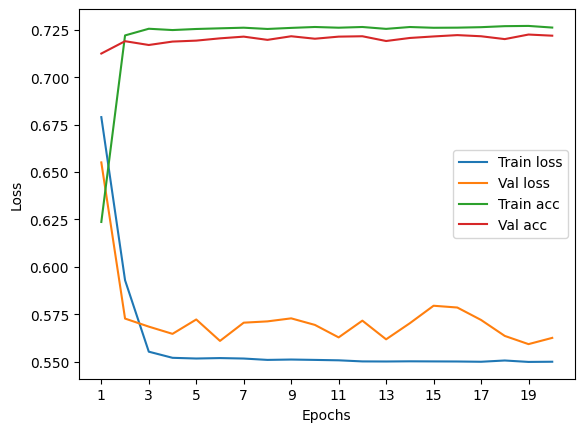

****************************************************************************************************

Particles per jet: 3


313it [00:05, 53.63it/s]


Train Epoch: 0 	Loss: 0.689445, Accuracy: 44294/79896 (55%)
Val Epoch: 0 	Loss: 0.690786, Accuracy: 6282/9987 (63%)



313it [00:05, 55.76it/s]


Train Epoch: 1 	Loss: 0.628552, Accuracy: 54742/79896 (69%)
Val Epoch: 1 	Loss: 0.598412, Accuracy: 7141/9987 (72%)



313it [00:05, 57.48it/s]


Train Epoch: 2 	Loss: 0.569025, Accuracy: 57553/79896 (72%)
Val Epoch: 2 	Loss: 0.599731, Accuracy: 7145/9987 (72%)



313it [00:05, 53.39it/s]


Train Epoch: 3 	Loss: 0.565166, Accuracy: 57641/79896 (72%)
Val Epoch: 3 	Loss: 0.568783, Accuracy: 7170/9987 (72%)



313it [00:05, 55.22it/s]


Train Epoch: 4 	Loss: 0.564595, Accuracy: 57673/79896 (72%)
Val Epoch: 4 	Loss: 0.570741, Accuracy: 7176/9987 (72%)



313it [00:05, 57.34it/s]


Train Epoch: 5 	Loss: 0.564377, Accuracy: 57772/79896 (72%)
Val Epoch: 5 	Loss: 0.584703, Accuracy: 7176/9987 (72%)



313it [00:05, 56.45it/s]


Train Epoch: 6 	Loss: 0.564519, Accuracy: 57701/79896 (72%)
Val Epoch: 6 	Loss: 0.577478, Accuracy: 7173/9987 (72%)



313it [00:05, 56.93it/s]


Train Epoch: 7 	Loss: 0.563401, Accuracy: 57695/79896 (72%)
Val Epoch: 7 	Loss: 0.575921, Accuracy: 7172/9987 (72%)



313it [00:05, 54.57it/s]


Train Epoch: 8 	Loss: 0.564626, Accuracy: 57715/79896 (72%)
Val Epoch: 8 	Loss: 0.576279, Accuracy: 7179/9987 (72%)



313it [00:05, 59.22it/s]


Train Epoch: 9 	Loss: 0.564006, Accuracy: 57655/79896 (72%)
Val Epoch: 9 	Loss: 0.580461, Accuracy: 7180/9987 (72%)



313it [00:05, 56.02it/s]


Train Epoch: 10 	Loss: 0.564016, Accuracy: 57679/79896 (72%)
Val Epoch: 10 	Loss: 0.585548, Accuracy: 7151/9987 (72%)



313it [00:05, 54.80it/s]


Train Epoch: 11 	Loss: 0.563815, Accuracy: 57665/79896 (72%)
Val Epoch: 11 	Loss: 0.576183, Accuracy: 7179/9987 (72%)



313it [00:05, 58.97it/s]


Train Epoch: 12 	Loss: 0.564043, Accuracy: 57704/79896 (72%)
Val Epoch: 12 	Loss: 0.590484, Accuracy: 7167/9987 (72%)



313it [00:05, 54.63it/s]


Train Epoch: 13 	Loss: 0.563827, Accuracy: 57718/79896 (72%)
Val Epoch: 13 	Loss: 0.585165, Accuracy: 7151/9987 (72%)



313it [00:05, 57.78it/s]


Train Epoch: 14 	Loss: 0.563540, Accuracy: 57663/79896 (72%)
Val Epoch: 14 	Loss: 0.586640, Accuracy: 7133/9987 (71%)



313it [00:05, 53.53it/s]


Train Epoch: 15 	Loss: 0.562885, Accuracy: 57675/79896 (72%)
Val Epoch: 15 	Loss: 0.579871, Accuracy: 7184/9987 (72%)



313it [00:05, 55.89it/s]


Train Epoch: 16 	Loss: 0.563061, Accuracy: 57700/79896 (72%)
Val Epoch: 16 	Loss: 0.573271, Accuracy: 7177/9987 (72%)



313it [00:05, 57.50it/s]


Train Epoch: 17 	Loss: 0.563408, Accuracy: 57678/79896 (72%)
Val Epoch: 17 	Loss: 0.584182, Accuracy: 7178/9987 (72%)



313it [00:05, 55.47it/s]


Train Epoch: 18 	Loss: 0.563673, Accuracy: 57755/79896 (72%)
Val Epoch: 18 	Loss: 0.581546, Accuracy: 7176/9987 (72%)



313it [00:05, 56.03it/s]


Train Epoch: 19 	Loss: 0.562904, Accuracy: 57696/79896 (72%)
Val Epoch: 19 	Loss: 0.567060, Accuracy: 7147/9987 (72%)

Test accuracy:  72.1237608891559


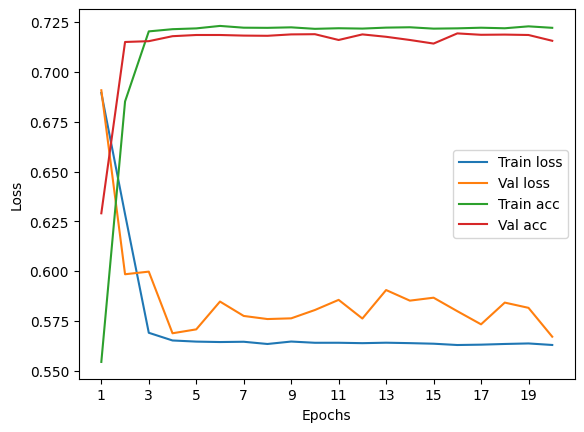

****************************************************************************************************

Particles per jet: 4


313it [00:05, 54.76it/s]


Train Epoch: 0 	Loss: 0.690283, Accuracy: 44391/79896 (56%)
Val Epoch: 0 	Loss: 0.687842, Accuracy: 6307/9987 (63%)



313it [00:05, 55.34it/s]


Train Epoch: 1 	Loss: 0.625049, Accuracy: 54804/79896 (69%)
Val Epoch: 1 	Loss: 0.593398, Accuracy: 7027/9987 (70%)



313it [00:05, 57.01it/s]


Train Epoch: 2 	Loss: 0.574958, Accuracy: 56947/79896 (71%)
Val Epoch: 2 	Loss: 0.593127, Accuracy: 7132/9987 (71%)



313it [00:05, 57.10it/s]


Train Epoch: 3 	Loss: 0.568677, Accuracy: 57243/79896 (72%)
Val Epoch: 3 	Loss: 0.576783, Accuracy: 7190/9987 (72%)



313it [00:05, 52.80it/s]


Train Epoch: 4 	Loss: 0.566971, Accuracy: 57446/79896 (72%)
Val Epoch: 4 	Loss: 0.579431, Accuracy: 7136/9987 (71%)



313it [00:05, 54.48it/s]


Train Epoch: 5 	Loss: 0.566514, Accuracy: 57517/79896 (72%)
Val Epoch: 5 	Loss: 0.586921, Accuracy: 7173/9987 (72%)



313it [00:05, 57.00it/s]


Train Epoch: 6 	Loss: 0.566717, Accuracy: 57586/79896 (72%)
Val Epoch: 6 	Loss: 0.592526, Accuracy: 7201/9987 (72%)



313it [00:05, 58.06it/s]


Train Epoch: 7 	Loss: 0.566108, Accuracy: 57592/79896 (72%)
Val Epoch: 7 	Loss: 0.578985, Accuracy: 7160/9987 (72%)



313it [00:05, 54.14it/s]


Train Epoch: 8 	Loss: 0.566839, Accuracy: 57568/79896 (72%)
Val Epoch: 8 	Loss: 0.582497, Accuracy: 7233/9987 (72%)



313it [00:05, 56.32it/s]


Train Epoch: 9 	Loss: 0.566020, Accuracy: 57684/79896 (72%)
Val Epoch: 9 	Loss: 0.581236, Accuracy: 7207/9987 (72%)



313it [00:05, 54.38it/s]


Train Epoch: 10 	Loss: 0.566321, Accuracy: 57622/79896 (72%)
Val Epoch: 10 	Loss: 0.583629, Accuracy: 7178/9987 (72%)



313it [00:06, 50.92it/s]


Train Epoch: 11 	Loss: 0.565529, Accuracy: 57609/79896 (72%)
Val Epoch: 11 	Loss: 0.571615, Accuracy: 7182/9987 (72%)



313it [00:05, 54.13it/s]


Train Epoch: 12 	Loss: 0.565306, Accuracy: 57651/79896 (72%)
Val Epoch: 12 	Loss: 0.586460, Accuracy: 7154/9987 (72%)



313it [00:08, 37.06it/s]


Train Epoch: 13 	Loss: 0.565615, Accuracy: 57691/79896 (72%)
Val Epoch: 13 	Loss: 0.588927, Accuracy: 7218/9987 (72%)



313it [00:05, 56.20it/s]


Train Epoch: 14 	Loss: 0.565968, Accuracy: 57631/79896 (72%)
Val Epoch: 14 	Loss: 0.580195, Accuracy: 7210/9987 (72%)



313it [00:06, 46.63it/s]


Train Epoch: 15 	Loss: 0.565754, Accuracy: 57711/79896 (72%)
Val Epoch: 15 	Loss: 0.585774, Accuracy: 7191/9987 (72%)



313it [00:06, 51.75it/s]


Train Epoch: 16 	Loss: 0.565507, Accuracy: 57659/79896 (72%)
Val Epoch: 16 	Loss: 0.581675, Accuracy: 7195/9987 (72%)



313it [00:05, 53.34it/s]


Train Epoch: 17 	Loss: 0.565342, Accuracy: 57685/79896 (72%)
Val Epoch: 17 	Loss: 0.591051, Accuracy: 7181/9987 (72%)



313it [00:06, 48.82it/s]


Train Epoch: 18 	Loss: 0.566226, Accuracy: 57705/79896 (72%)
Val Epoch: 18 	Loss: 0.580976, Accuracy: 7228/9987 (72%)



313it [00:05, 55.25it/s]


Train Epoch: 19 	Loss: 0.565057, Accuracy: 57678/79896 (72%)
Val Epoch: 19 	Loss: 0.586591, Accuracy: 7231/9987 (72%)

Test accuracy:  71.79333133072994


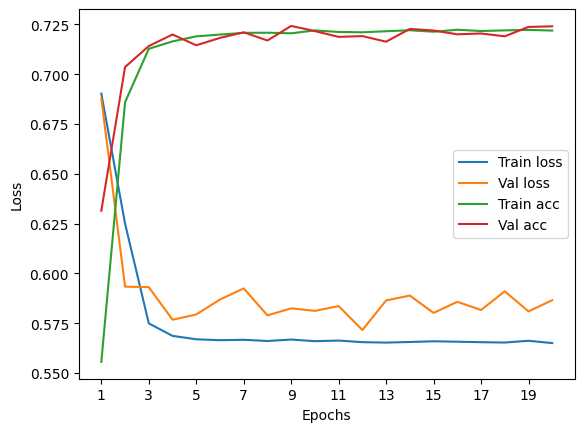

****************************************************************************************************

Particles per jet: 5


313it [00:05, 52.81it/s]


Train Epoch: 0 	Loss: 0.692033, Accuracy: 43852/79896 (55%)
Val Epoch: 0 	Loss: 0.701301, Accuracy: 5794/9987 (58%)



313it [00:06, 50.70it/s]


Train Epoch: 1 	Loss: 0.673792, Accuracy: 48587/79896 (61%)
Val Epoch: 1 	Loss: 0.668935, Accuracy: 6405/9987 (64%)



313it [00:05, 54.23it/s]


Train Epoch: 2 	Loss: 0.629035, Accuracy: 54393/79896 (68%)
Val Epoch: 2 	Loss: 0.613247, Accuracy: 7036/9987 (70%)



313it [00:05, 55.63it/s]


Train Epoch: 3 	Loss: 0.586626, Accuracy: 56398/79896 (71%)
Val Epoch: 3 	Loss: 0.593639, Accuracy: 7132/9987 (71%)



313it [00:05, 54.14it/s]


Train Epoch: 4 	Loss: 0.576472, Accuracy: 56763/79896 (71%)
Val Epoch: 4 	Loss: 0.583187, Accuracy: 7163/9987 (72%)



313it [00:07, 43.65it/s]


Train Epoch: 5 	Loss: 0.573360, Accuracy: 57018/79896 (71%)
Val Epoch: 5 	Loss: 0.583925, Accuracy: 7145/9987 (72%)



313it [00:06, 48.59it/s]


Train Epoch: 6 	Loss: 0.572729, Accuracy: 57159/79896 (72%)
Val Epoch: 6 	Loss: 0.581154, Accuracy: 7180/9987 (72%)



313it [00:06, 46.81it/s]


Train Epoch: 7 	Loss: 0.571592, Accuracy: 57323/79896 (72%)
Val Epoch: 7 	Loss: 0.576750, Accuracy: 7198/9987 (72%)



313it [00:06, 46.96it/s]


Train Epoch: 8 	Loss: 0.571130, Accuracy: 57381/79896 (72%)
Val Epoch: 8 	Loss: 0.583434, Accuracy: 7144/9987 (72%)



313it [00:06, 49.15it/s]


Train Epoch: 9 	Loss: 0.570308, Accuracy: 57453/79896 (72%)
Val Epoch: 9 	Loss: 0.579779, Accuracy: 7163/9987 (72%)



313it [00:07, 44.54it/s]


Train Epoch: 10 	Loss: 0.570047, Accuracy: 57534/79896 (72%)
Val Epoch: 10 	Loss: 0.580496, Accuracy: 7169/9987 (72%)



313it [00:06, 48.47it/s]


Train Epoch: 11 	Loss: 0.570083, Accuracy: 57535/79896 (72%)
Val Epoch: 11 	Loss: 0.568608, Accuracy: 7212/9987 (72%)



313it [00:07, 41.67it/s]


Train Epoch: 12 	Loss: 0.569092, Accuracy: 57516/79896 (72%)
Val Epoch: 12 	Loss: 0.574318, Accuracy: 7206/9987 (72%)



313it [00:06, 47.80it/s]


Train Epoch: 13 	Loss: 0.568798, Accuracy: 57576/79896 (72%)
Val Epoch: 13 	Loss: 0.575723, Accuracy: 7197/9987 (72%)



313it [00:07, 41.99it/s]


Train Epoch: 14 	Loss: 0.568202, Accuracy: 57627/79896 (72%)
Val Epoch: 14 	Loss: 0.583388, Accuracy: 7221/9987 (72%)



313it [00:06, 46.29it/s]


Train Epoch: 15 	Loss: 0.567558, Accuracy: 57664/79896 (72%)
Val Epoch: 15 	Loss: 0.577322, Accuracy: 7218/9987 (72%)



313it [00:07, 40.41it/s]


Train Epoch: 16 	Loss: 0.566605, Accuracy: 57741/79896 (72%)
Val Epoch: 16 	Loss: 0.585820, Accuracy: 7222/9987 (72%)



313it [00:06, 50.27it/s]


Train Epoch: 17 	Loss: 0.566381, Accuracy: 57802/79896 (72%)
Val Epoch: 17 	Loss: 0.572157, Accuracy: 7209/9987 (72%)



313it [00:07, 41.86it/s]


Train Epoch: 18 	Loss: 0.566106, Accuracy: 57776/79896 (72%)
Val Epoch: 18 	Loss: 0.569039, Accuracy: 7219/9987 (72%)



313it [00:07, 43.37it/s]


Train Epoch: 19 	Loss: 0.565598, Accuracy: 57835/79896 (72%)
Val Epoch: 19 	Loss: 0.598557, Accuracy: 7230/9987 (72%)

Test accuracy:  72.1537999399219


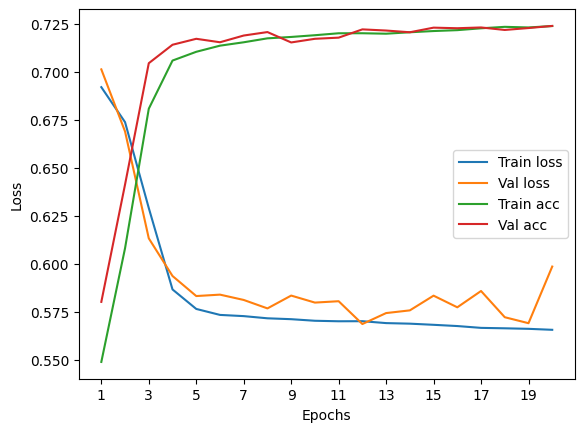

****************************************************************************************************

Particles per jet: 6


313it [00:05, 56.40it/s]


Train Epoch: 0 	Loss: 0.688916, Accuracy: 44112/79896 (55%)
Val Epoch: 0 	Loss: 0.692032, Accuracy: 6296/9987 (63%)



313it [00:05, 53.85it/s]


Train Epoch: 1 	Loss: 0.653706, Accuracy: 52463/79896 (66%)
Val Epoch: 1 	Loss: 0.634903, Accuracy: 6908/9987 (69%)



313it [00:05, 53.42it/s]


Train Epoch: 2 	Loss: 0.600221, Accuracy: 56312/79896 (70%)
Val Epoch: 2 	Loss: 0.600649, Accuracy: 7242/9987 (73%)



313it [00:05, 57.65it/s]


Train Epoch: 3 	Loss: 0.580141, Accuracy: 57027/79896 (71%)
Val Epoch: 3 	Loss: 0.579501, Accuracy: 7256/9987 (73%)



313it [00:06, 47.36it/s]


Train Epoch: 4 	Loss: 0.577183, Accuracy: 57204/79896 (72%)
Val Epoch: 4 	Loss: 0.570714, Accuracy: 7269/9987 (73%)



313it [00:07, 39.15it/s]


Train Epoch: 5 	Loss: 0.575892, Accuracy: 57353/79896 (72%)
Val Epoch: 5 	Loss: 0.582926, Accuracy: 7287/9987 (73%)



313it [00:06, 45.41it/s]


Train Epoch: 6 	Loss: 0.575615, Accuracy: 57380/79896 (72%)
Val Epoch: 6 	Loss: 0.572541, Accuracy: 7240/9987 (72%)



313it [00:07, 39.50it/s]


Train Epoch: 7 	Loss: 0.575066, Accuracy: 57305/79896 (72%)
Val Epoch: 7 	Loss: 0.570055, Accuracy: 7288/9987 (73%)



313it [00:06, 45.16it/s]


Train Epoch: 8 	Loss: 0.575368, Accuracy: 57394/79896 (72%)
Val Epoch: 8 	Loss: 0.589614, Accuracy: 7275/9987 (73%)



313it [00:07, 39.74it/s]


Train Epoch: 9 	Loss: 0.574716, Accuracy: 57402/79896 (72%)
Val Epoch: 9 	Loss: 0.575330, Accuracy: 7294/9987 (73%)



313it [00:06, 46.92it/s]


Train Epoch: 10 	Loss: 0.574646, Accuracy: 57405/79896 (72%)
Val Epoch: 10 	Loss: 0.574539, Accuracy: 7290/9987 (73%)



313it [00:08, 38.90it/s]


Train Epoch: 11 	Loss: 0.574878, Accuracy: 57478/79896 (72%)
Val Epoch: 11 	Loss: 0.578156, Accuracy: 7272/9987 (73%)



313it [00:06, 45.20it/s]


Train Epoch: 12 	Loss: 0.573958, Accuracy: 57454/79896 (72%)
Val Epoch: 12 	Loss: 0.570106, Accuracy: 7285/9987 (73%)



313it [00:07, 40.17it/s]


Train Epoch: 13 	Loss: 0.573890, Accuracy: 57481/79896 (72%)
Val Epoch: 13 	Loss: 0.584673, Accuracy: 7205/9987 (72%)



313it [00:06, 46.79it/s]


Train Epoch: 14 	Loss: 0.573281, Accuracy: 57462/79896 (72%)
Val Epoch: 14 	Loss: 0.583097, Accuracy: 7233/9987 (72%)



313it [00:07, 39.61it/s]


Train Epoch: 15 	Loss: 0.573567, Accuracy: 57520/79896 (72%)
Val Epoch: 15 	Loss: 0.582115, Accuracy: 7275/9987 (73%)



313it [00:06, 47.13it/s]


Train Epoch: 16 	Loss: 0.573496, Accuracy: 57538/79896 (72%)
Val Epoch: 16 	Loss: 0.583130, Accuracy: 7197/9987 (72%)



313it [00:08, 37.93it/s]


Train Epoch: 17 	Loss: 0.572994, Accuracy: 57535/79896 (72%)
Val Epoch: 17 	Loss: 0.583183, Accuracy: 7204/9987 (72%)



313it [00:06, 47.41it/s]


Train Epoch: 18 	Loss: 0.572689, Accuracy: 57546/79896 (72%)
Val Epoch: 18 	Loss: 0.570866, Accuracy: 7272/9987 (73%)



313it [00:07, 40.73it/s]


Train Epoch: 19 	Loss: 0.571973, Accuracy: 57648/79896 (72%)
Val Epoch: 19 	Loss: 0.572229, Accuracy: 7244/9987 (73%)

Test accuracy:  72.39411234604987


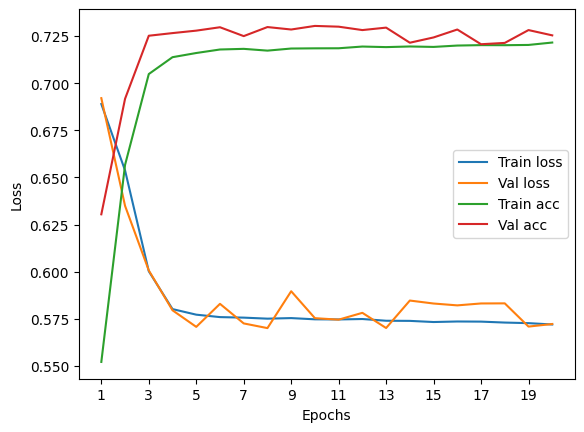

****************************************************************************************************

Particles per jet: 7


313it [00:05, 52.75it/s]


Train Epoch: 0 	Loss: 0.694283, Accuracy: 41623/79896 (52%)
Val Epoch: 0 	Loss: 0.707176, Accuracy: 5467/9987 (55%)



313it [00:06, 49.60it/s]


Train Epoch: 1 	Loss: 0.674034, Accuracy: 47857/79896 (60%)
Val Epoch: 1 	Loss: 0.660345, Accuracy: 6513/9987 (65%)



313it [00:06, 52.00it/s]


Train Epoch: 2 	Loss: 0.619659, Accuracy: 54860/79896 (69%)
Val Epoch: 2 	Loss: 0.604528, Accuracy: 7076/9987 (71%)



313it [00:06, 51.03it/s]


Train Epoch: 3 	Loss: 0.584306, Accuracy: 56975/79896 (71%)
Val Epoch: 3 	Loss: 0.591608, Accuracy: 7150/9987 (72%)



313it [00:06, 47.13it/s]


Train Epoch: 4 	Loss: 0.574588, Accuracy: 57454/79896 (72%)
Val Epoch: 4 	Loss: 0.584630, Accuracy: 7179/9987 (72%)



313it [00:08, 38.65it/s]


Train Epoch: 5 	Loss: 0.572336, Accuracy: 57652/79896 (72%)
Val Epoch: 5 	Loss: 0.583252, Accuracy: 7165/9987 (72%)



313it [00:06, 44.88it/s]


Train Epoch: 6 	Loss: 0.571364, Accuracy: 57767/79896 (72%)
Val Epoch: 6 	Loss: 0.579900, Accuracy: 7188/9987 (72%)



313it [00:07, 39.80it/s]


Train Epoch: 7 	Loss: 0.571513, Accuracy: 57774/79896 (72%)
Val Epoch: 7 	Loss: 0.579805, Accuracy: 7187/9987 (72%)



313it [00:06, 45.51it/s]


Train Epoch: 8 	Loss: 0.570589, Accuracy: 57860/79896 (72%)
Val Epoch: 8 	Loss: 0.578703, Accuracy: 7226/9987 (72%)



313it [00:07, 43.04it/s]


Train Epoch: 9 	Loss: 0.570197, Accuracy: 57846/79896 (72%)
Val Epoch: 9 	Loss: 0.590942, Accuracy: 7207/9987 (72%)



313it [00:06, 45.58it/s]


Train Epoch: 10 	Loss: 0.570037, Accuracy: 57885/79896 (72%)
Val Epoch: 10 	Loss: 0.591871, Accuracy: 7273/9987 (73%)



313it [00:07, 43.97it/s]


Train Epoch: 11 	Loss: 0.569968, Accuracy: 57930/79896 (73%)
Val Epoch: 11 	Loss: 0.571686, Accuracy: 7245/9987 (73%)



313it [00:07, 44.18it/s]


Train Epoch: 12 	Loss: 0.570039, Accuracy: 57935/79896 (73%)
Val Epoch: 12 	Loss: 0.583990, Accuracy: 7199/9987 (72%)



313it [00:07, 42.42it/s]


Train Epoch: 13 	Loss: 0.569637, Accuracy: 57940/79896 (73%)
Val Epoch: 13 	Loss: 0.582305, Accuracy: 7264/9987 (73%)



313it [00:07, 43.49it/s]


Train Epoch: 14 	Loss: 0.569596, Accuracy: 58028/79896 (73%)
Val Epoch: 14 	Loss: 0.573168, Accuracy: 7256/9987 (73%)



313it [00:07, 42.58it/s]


Train Epoch: 15 	Loss: 0.569532, Accuracy: 57962/79896 (73%)
Val Epoch: 15 	Loss: 0.593493, Accuracy: 7262/9987 (73%)



313it [00:08, 37.50it/s]


Train Epoch: 16 	Loss: 0.569321, Accuracy: 58011/79896 (73%)
Val Epoch: 16 	Loss: 0.573002, Accuracy: 7244/9987 (73%)



313it [00:07, 42.89it/s]


Train Epoch: 17 	Loss: 0.568814, Accuracy: 58009/79896 (73%)
Val Epoch: 17 	Loss: 0.581975, Accuracy: 7275/9987 (73%)



313it [00:07, 40.07it/s]


Train Epoch: 18 	Loss: 0.568679, Accuracy: 57982/79896 (73%)
Val Epoch: 18 	Loss: 0.576260, Accuracy: 7252/9987 (73%)



313it [00:07, 40.31it/s]


Train Epoch: 19 	Loss: 0.568049, Accuracy: 58096/79896 (73%)
Val Epoch: 19 	Loss: 0.575192, Accuracy: 7253/9987 (73%)

Test accuracy:  72.72454190447581


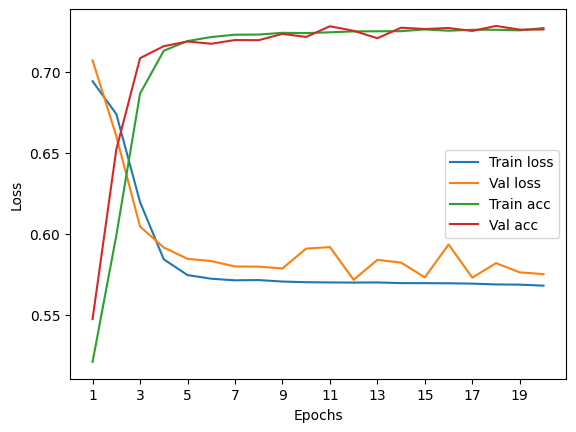

****************************************************************************************************

Particles per jet: 8


313it [00:06, 48.68it/s]


Train Epoch: 0 	Loss: 0.697145, Accuracy: 40302/79896 (50%)
Val Epoch: 0 	Loss: 0.709712, Accuracy: 5329/9987 (53%)



313it [00:06, 51.98it/s]


Train Epoch: 1 	Loss: 0.692294, Accuracy: 43226/79896 (54%)
Val Epoch: 1 	Loss: 0.702414, Accuracy: 5738/9987 (57%)



313it [00:06, 49.96it/s]


Train Epoch: 2 	Loss: 0.681183, Accuracy: 46660/79896 (58%)
Val Epoch: 2 	Loss: 0.690781, Accuracy: 5990/9987 (60%)



313it [00:06, 51.13it/s]


Train Epoch: 3 	Loss: 0.663863, Accuracy: 49321/79896 (62%)
Val Epoch: 3 	Loss: 0.670109, Accuracy: 6353/9987 (64%)



313it [00:07, 43.10it/s]


Train Epoch: 4 	Loss: 0.639790, Accuracy: 52542/79896 (66%)
Val Epoch: 4 	Loss: 0.643645, Accuracy: 6686/9987 (67%)



313it [00:07, 39.27it/s]


Train Epoch: 5 	Loss: 0.614004, Accuracy: 54446/79896 (68%)
Val Epoch: 5 	Loss: 0.622901, Accuracy: 6833/9987 (68%)



313it [00:07, 44.17it/s]


Train Epoch: 6 	Loss: 0.598433, Accuracy: 55462/79896 (69%)
Val Epoch: 6 	Loss: 0.607067, Accuracy: 6958/9987 (70%)



313it [00:07, 39.56it/s]


Train Epoch: 7 	Loss: 0.589534, Accuracy: 56150/79896 (70%)
Val Epoch: 7 	Loss: 0.640346, Accuracy: 6978/9987 (70%)



313it [00:07, 44.44it/s]


Train Epoch: 8 	Loss: 0.584937, Accuracy: 56543/79896 (71%)
Val Epoch: 8 	Loss: 0.603144, Accuracy: 7014/9987 (70%)



313it [00:08, 38.93it/s]


Train Epoch: 9 	Loss: 0.581488, Accuracy: 56910/79896 (71%)
Val Epoch: 9 	Loss: 0.603729, Accuracy: 6997/9987 (70%)



313it [00:06, 45.51it/s]


Train Epoch: 10 	Loss: 0.579220, Accuracy: 57119/79896 (71%)
Val Epoch: 10 	Loss: 0.606823, Accuracy: 7047/9987 (71%)



313it [00:08, 37.75it/s]


Train Epoch: 11 	Loss: 0.577473, Accuracy: 57302/79896 (72%)
Val Epoch: 11 	Loss: 0.614567, Accuracy: 7130/9987 (71%)



313it [00:07, 41.84it/s]


Train Epoch: 12 	Loss: 0.575903, Accuracy: 57430/79896 (72%)
Val Epoch: 12 	Loss: 0.601730, Accuracy: 7103/9987 (71%)



313it [00:08, 38.70it/s]


Train Epoch: 13 	Loss: 0.574641, Accuracy: 57612/79896 (72%)
Val Epoch: 13 	Loss: 0.595165, Accuracy: 7096/9987 (71%)



313it [00:07, 43.62it/s]


Train Epoch: 14 	Loss: 0.573956, Accuracy: 57678/79896 (72%)
Val Epoch: 14 	Loss: 0.590990, Accuracy: 7144/9987 (72%)



313it [00:08, 36.98it/s]


Train Epoch: 15 	Loss: 0.573218, Accuracy: 57766/79896 (72%)
Val Epoch: 15 	Loss: 0.590307, Accuracy: 7128/9987 (71%)



313it [00:08, 38.35it/s]


Train Epoch: 16 	Loss: 0.572206, Accuracy: 57798/79896 (72%)
Val Epoch: 16 	Loss: 0.594191, Accuracy: 7154/9987 (72%)



313it [00:08, 35.58it/s]


Train Epoch: 17 	Loss: 0.571668, Accuracy: 57903/79896 (72%)
Val Epoch: 17 	Loss: 0.605051, Accuracy: 7157/9987 (72%)



313it [00:08, 36.23it/s]


Train Epoch: 18 	Loss: 0.571023, Accuracy: 57883/79896 (72%)
Val Epoch: 18 	Loss: 0.594492, Accuracy: 7163/9987 (72%)



313it [00:07, 44.49it/s]


Train Epoch: 19 	Loss: 0.570805, Accuracy: 57925/79896 (73%)
Val Epoch: 19 	Loss: 0.590762, Accuracy: 7156/9987 (72%)

Test accuracy:  72.98488034444777


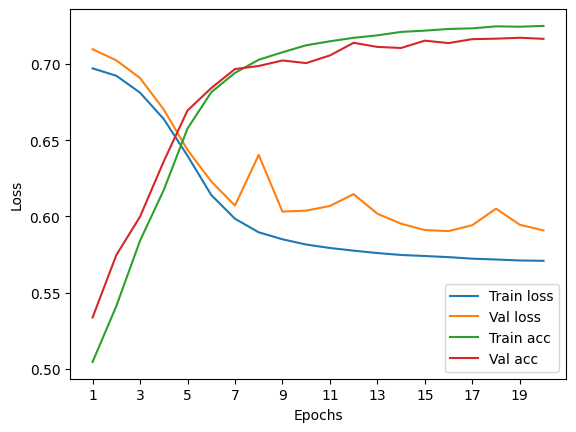

****************************************************************************************************

Particles per jet: 9


313it [00:06, 51.49it/s]


Train Epoch: 0 	Loss: 0.693265, Accuracy: 42149/79896 (53%)
Val Epoch: 0 	Loss: 0.704586, Accuracy: 5705/9987 (57%)



313it [00:06, 49.89it/s]


Train Epoch: 1 	Loss: 0.679443, Accuracy: 47475/79896 (59%)
Val Epoch: 1 	Loss: 0.683337, Accuracy: 6093/9987 (61%)



313it [00:05, 52.78it/s]


Train Epoch: 2 	Loss: 0.653595, Accuracy: 50546/79896 (63%)
Val Epoch: 2 	Loss: 0.653752, Accuracy: 6488/9987 (65%)



313it [00:06, 49.86it/s]


Train Epoch: 3 	Loss: 0.626875, Accuracy: 53219/79896 (67%)
Val Epoch: 3 	Loss: 0.624360, Accuracy: 6797/9987 (68%)



313it [00:07, 42.39it/s]


Train Epoch: 4 	Loss: 0.598880, Accuracy: 55943/79896 (70%)
Val Epoch: 4 	Loss: 0.601169, Accuracy: 7006/9987 (70%)



313it [00:08, 35.76it/s]


Train Epoch: 5 	Loss: 0.585123, Accuracy: 56793/79896 (71%)
Val Epoch: 5 	Loss: 0.592228, Accuracy: 7103/9987 (71%)



313it [00:07, 42.96it/s]


Train Epoch: 6 	Loss: 0.580337, Accuracy: 57076/79896 (71%)
Val Epoch: 6 	Loss: 0.600047, Accuracy: 7113/9987 (71%)



313it [00:08, 36.97it/s]


Train Epoch: 7 	Loss: 0.578353, Accuracy: 57207/79896 (72%)
Val Epoch: 7 	Loss: 0.588099, Accuracy: 7160/9987 (72%)



313it [00:06, 45.17it/s]


Train Epoch: 8 	Loss: 0.576800, Accuracy: 57289/79896 (72%)
Val Epoch: 8 	Loss: 0.583691, Accuracy: 7136/9987 (71%)



313it [00:08, 37.20it/s]


Train Epoch: 9 	Loss: 0.576250, Accuracy: 57345/79896 (72%)
Val Epoch: 9 	Loss: 0.588710, Accuracy: 7159/9987 (72%)



313it [00:07, 43.56it/s]


Train Epoch: 10 	Loss: 0.575078, Accuracy: 57427/79896 (72%)
Val Epoch: 10 	Loss: 0.577390, Accuracy: 7196/9987 (72%)



313it [00:08, 37.58it/s]


Train Epoch: 11 	Loss: 0.573966, Accuracy: 57484/79896 (72%)
Val Epoch: 11 	Loss: 0.587518, Accuracy: 7193/9987 (72%)



313it [00:07, 40.26it/s]


Train Epoch: 12 	Loss: 0.573872, Accuracy: 57503/79896 (72%)
Val Epoch: 12 	Loss: 0.581660, Accuracy: 7206/9987 (72%)



313it [00:08, 38.64it/s]


Train Epoch: 13 	Loss: 0.573559, Accuracy: 57501/79896 (72%)
Val Epoch: 13 	Loss: 0.584735, Accuracy: 7220/9987 (72%)



313it [00:07, 41.05it/s]


Train Epoch: 14 	Loss: 0.573157, Accuracy: 57589/79896 (72%)
Val Epoch: 14 	Loss: 0.579344, Accuracy: 7220/9987 (72%)



313it [00:07, 42.97it/s]


Train Epoch: 15 	Loss: 0.572544, Accuracy: 57589/79896 (72%)
Val Epoch: 15 	Loss: 0.579569, Accuracy: 7229/9987 (72%)



313it [00:07, 40.22it/s]


Train Epoch: 16 	Loss: 0.571790, Accuracy: 57624/79896 (72%)
Val Epoch: 16 	Loss: 0.579849, Accuracy: 7163/9987 (72%)



313it [00:07, 43.45it/s]


Train Epoch: 17 	Loss: 0.572095, Accuracy: 57605/79896 (72%)
Val Epoch: 17 	Loss: 0.582764, Accuracy: 7182/9987 (72%)



313it [00:08, 37.27it/s]


Train Epoch: 18 	Loss: 0.571951, Accuracy: 57686/79896 (72%)
Val Epoch: 18 	Loss: 0.574395, Accuracy: 7213/9987 (72%)



313it [00:07, 43.53it/s]


Train Epoch: 19 	Loss: 0.571036, Accuracy: 57689/79896 (72%)
Val Epoch: 19 	Loss: 0.580421, Accuracy: 7222/9987 (72%)

Test accuracy:  71.91348753379393


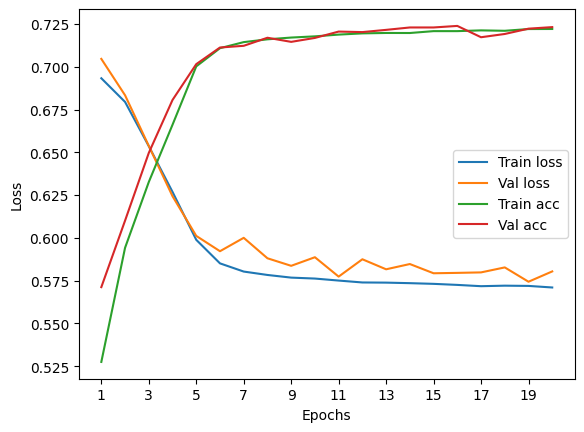

****************************************************************************************************

Particles per jet: 10


313it [00:06, 50.82it/s]


Train Epoch: 0 	Loss: 0.694219, Accuracy: 41318/79896 (52%)
Val Epoch: 0 	Loss: 0.707689, Accuracy: 5406/9987 (54%)



313it [00:06, 51.08it/s]


Train Epoch: 1 	Loss: 0.687158, Accuracy: 44818/79896 (56%)
Val Epoch: 1 	Loss: 0.700889, Accuracy: 5581/9987 (56%)



313it [00:06, 51.54it/s]


Train Epoch: 2 	Loss: 0.679384, Accuracy: 45705/79896 (57%)
Val Epoch: 2 	Loss: 0.697716, Accuracy: 5687/9987 (57%)



313it [00:07, 44.59it/s]


Train Epoch: 3 	Loss: 0.669920, Accuracy: 47506/79896 (59%)
Val Epoch: 3 	Loss: 0.679608, Accuracy: 6056/9987 (61%)



313it [00:07, 42.84it/s]


Train Epoch: 4 	Loss: 0.647594, Accuracy: 51341/79896 (64%)
Val Epoch: 4 	Loss: 0.649199, Accuracy: 6705/9987 (67%)



313it [00:09, 32.95it/s]


Train Epoch: 5 	Loss: 0.609257, Accuracy: 55406/79896 (69%)
Val Epoch: 5 	Loss: 0.614807, Accuracy: 6979/9987 (70%)



313it [00:08, 38.37it/s]


Train Epoch: 6 	Loss: 0.588612, Accuracy: 56392/79896 (71%)
Val Epoch: 6 	Loss: 0.605047, Accuracy: 7034/9987 (70%)



313it [00:07, 44.01it/s]


Train Epoch: 7 	Loss: 0.583791, Accuracy: 56693/79896 (71%)
Val Epoch: 7 	Loss: 0.607437, Accuracy: 7042/9987 (71%)



313it [00:08, 37.22it/s]


Train Epoch: 8 	Loss: 0.582535, Accuracy: 56759/79896 (71%)
Val Epoch: 8 	Loss: 0.611581, Accuracy: 7034/9987 (70%)



313it [00:07, 43.95it/s]


Train Epoch: 9 	Loss: 0.581243, Accuracy: 56852/79896 (71%)
Val Epoch: 9 	Loss: 0.609611, Accuracy: 7050/9987 (71%)



313it [00:08, 37.14it/s]


Train Epoch: 10 	Loss: 0.580272, Accuracy: 56946/79896 (71%)
Val Epoch: 10 	Loss: 0.599178, Accuracy: 7071/9987 (71%)



313it [00:07, 44.58it/s]


Train Epoch: 11 	Loss: 0.579616, Accuracy: 56958/79896 (71%)
Val Epoch: 11 	Loss: 0.613602, Accuracy: 7081/9987 (71%)



313it [00:08, 38.59it/s]


Train Epoch: 12 	Loss: 0.579350, Accuracy: 56995/79896 (71%)
Val Epoch: 12 	Loss: 0.606329, Accuracy: 7094/9987 (71%)



313it [00:07, 42.56it/s]


Train Epoch: 13 	Loss: 0.578697, Accuracy: 57064/79896 (71%)
Val Epoch: 13 	Loss: 0.614367, Accuracy: 7096/9987 (71%)



313it [00:08, 37.71it/s]


Train Epoch: 14 	Loss: 0.578475, Accuracy: 57082/79896 (71%)
Val Epoch: 14 	Loss: 0.601930, Accuracy: 7121/9987 (71%)



313it [00:07, 42.65it/s]


Train Epoch: 15 	Loss: 0.578002, Accuracy: 57142/79896 (72%)
Val Epoch: 15 	Loss: 0.592317, Accuracy: 7091/9987 (71%)



313it [00:08, 36.90it/s]


Train Epoch: 16 	Loss: 0.577914, Accuracy: 57117/79896 (71%)
Val Epoch: 16 	Loss: 0.591568, Accuracy: 7101/9987 (71%)



313it [00:07, 39.52it/s]


Train Epoch: 17 	Loss: 0.577832, Accuracy: 57145/79896 (72%)
Val Epoch: 17 	Loss: 0.608414, Accuracy: 7086/9987 (71%)



313it [00:07, 41.61it/s]


Train Epoch: 18 	Loss: 0.576811, Accuracy: 57241/79896 (72%)
Val Epoch: 18 	Loss: 0.602114, Accuracy: 7110/9987 (71%)



313it [00:08, 38.95it/s]


Train Epoch: 19 	Loss: 0.576345, Accuracy: 57258/79896 (72%)
Val Epoch: 19 	Loss: 0.595909, Accuracy: 7094/9987 (71%)

Test accuracy:  71.93351356763793


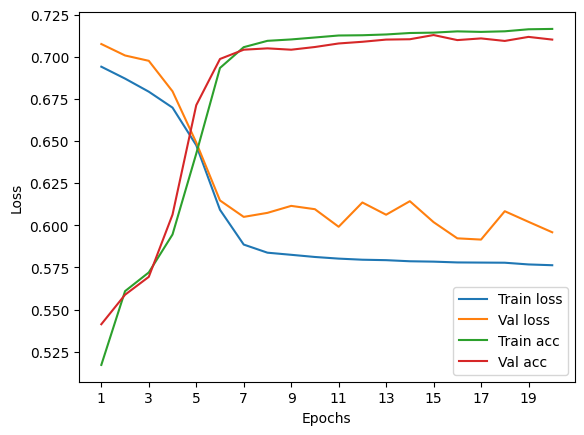

****************************************************************************************************



In [70]:
train_loss, val_loss, train_acc, val_acc, auc = find_ideal_particles(X_norm, 1, 10)

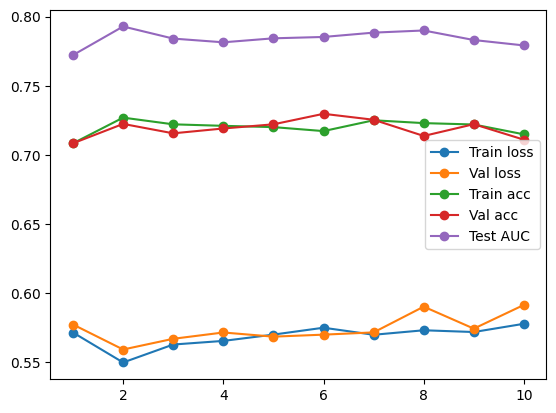

In [71]:
x = range(1,11)
plt.plot(x, train_loss, label="Train loss", marker='o')
plt.plot(x, val_loss, label="Val loss", marker='o')
plt.plot(x, train_acc, label="Train acc", marker='o')
plt.plot(x, val_acc, label="Val acc", marker='o')
plt.plot(x, auc, label="Test AUC", marker='o')
plt.legend()
plt.show()

#### Train ratio = 60%

Particles per jet: 1


235it [00:03, 59.93it/s]


Train Epoch: 0 	Loss: 0.686983, Accuracy: 33741/59922 (56%)
Val Epoch: 0 	Loss: 0.666001, Accuracy: 13054/19974 (65%)



235it [00:04, 47.87it/s]


Train Epoch: 1 	Loss: 0.613385, Accuracy: 41367/59922 (69%)
Val Epoch: 1 	Loss: 0.587170, Accuracy: 13994/19974 (70%)



235it [00:03, 58.77it/s]


Train Epoch: 2 	Loss: 0.579590, Accuracy: 42136/59922 (70%)
Val Epoch: 2 	Loss: 0.581894, Accuracy: 14061/19974 (70%)



235it [00:04, 57.33it/s]


Train Epoch: 3 	Loss: 0.577762, Accuracy: 42244/59922 (70%)
Val Epoch: 3 	Loss: 0.581533, Accuracy: 14120/19974 (71%)



235it [00:04, 52.77it/s]


Train Epoch: 4 	Loss: 0.576805, Accuracy: 42289/59922 (71%)
Val Epoch: 4 	Loss: 0.577493, Accuracy: 14147/19974 (71%)



235it [00:04, 58.21it/s]


Train Epoch: 5 	Loss: 0.575340, Accuracy: 42313/59922 (71%)
Val Epoch: 5 	Loss: 0.578146, Accuracy: 14166/19974 (71%)



235it [00:04, 58.04it/s]


Train Epoch: 6 	Loss: 0.574682, Accuracy: 42374/59922 (71%)
Val Epoch: 6 	Loss: 0.577728, Accuracy: 14098/19974 (71%)



235it [00:04, 51.52it/s]


Train Epoch: 7 	Loss: 0.574962, Accuracy: 42326/59922 (71%)
Val Epoch: 7 	Loss: 0.573940, Accuracy: 14170/19974 (71%)



235it [00:03, 59.28it/s]


Train Epoch: 8 	Loss: 0.575517, Accuracy: 42337/59922 (71%)
Val Epoch: 8 	Loss: 0.577314, Accuracy: 14184/19974 (71%)



235it [00:03, 61.67it/s]


Train Epoch: 9 	Loss: 0.575015, Accuracy: 42356/59922 (71%)
Val Epoch: 9 	Loss: 0.574323, Accuracy: 14170/19974 (71%)



235it [00:04, 49.48it/s]


Train Epoch: 10 	Loss: 0.574261, Accuracy: 42332/59922 (71%)
Val Epoch: 10 	Loss: 0.577017, Accuracy: 14149/19974 (71%)



235it [00:03, 60.49it/s]


Train Epoch: 11 	Loss: 0.574899, Accuracy: 42380/59922 (71%)
Val Epoch: 11 	Loss: 0.578965, Accuracy: 14129/19974 (71%)



235it [00:03, 61.17it/s]


Train Epoch: 12 	Loss: 0.574229, Accuracy: 42306/59922 (71%)
Val Epoch: 12 	Loss: 0.578170, Accuracy: 14160/19974 (71%)



235it [00:04, 51.33it/s]


Train Epoch: 13 	Loss: 0.573448, Accuracy: 42391/59922 (71%)
Val Epoch: 13 	Loss: 0.576142, Accuracy: 14156/19974 (71%)



235it [00:03, 61.11it/s]


Train Epoch: 14 	Loss: 0.574861, Accuracy: 42351/59922 (71%)
Val Epoch: 14 	Loss: 0.577557, Accuracy: 14169/19974 (71%)



235it [00:03, 61.29it/s]


Train Epoch: 15 	Loss: 0.573676, Accuracy: 42328/59922 (71%)
Val Epoch: 15 	Loss: 0.574896, Accuracy: 14190/19974 (71%)



235it [00:04, 55.28it/s]


Train Epoch: 16 	Loss: 0.573708, Accuracy: 42387/59922 (71%)
Val Epoch: 16 	Loss: 0.579665, Accuracy: 14179/19974 (71%)



235it [00:04, 58.49it/s]


Train Epoch: 17 	Loss: 0.574491, Accuracy: 42383/59922 (71%)
Val Epoch: 17 	Loss: 0.579711, Accuracy: 14154/19974 (71%)



235it [00:03, 62.16it/s]


Train Epoch: 18 	Loss: 0.574649, Accuracy: 42362/59922 (71%)
Val Epoch: 18 	Loss: 0.576659, Accuracy: 14167/19974 (71%)



235it [00:04, 51.89it/s]


Train Epoch: 19 	Loss: 0.574487, Accuracy: 42356/59922 (71%)
Val Epoch: 19 	Loss: 0.574881, Accuracy: 14165/19974 (71%)

Test accuracy:  70.96725743466507


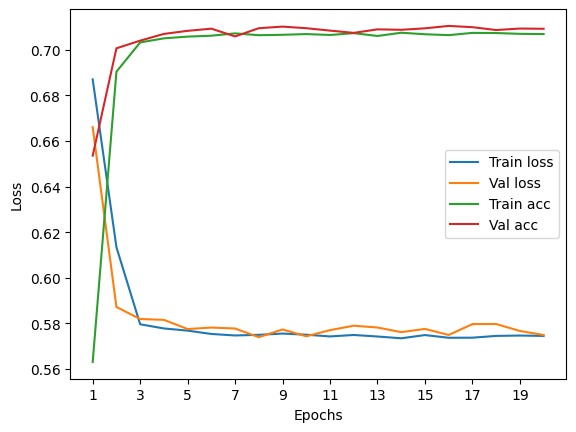

****************************************************************************************************

Particles per jet: 2


235it [00:04, 57.60it/s]


Train Epoch: 0 	Loss: 0.692621, Accuracy: 33132/59922 (55%)
Val Epoch: 0 	Loss: 0.689481, Accuracy: 12249/19974 (61%)



235it [00:03, 60.97it/s]


Train Epoch: 1 	Loss: 0.643801, Accuracy: 40360/59922 (67%)
Val Epoch: 1 	Loss: 0.591900, Accuracy: 14408/19974 (72%)



235it [00:03, 60.31it/s]


Train Epoch: 2 	Loss: 0.562226, Accuracy: 43456/59922 (73%)
Val Epoch: 2 	Loss: 0.559979, Accuracy: 14462/19974 (72%)



235it [00:03, 61.44it/s]


Train Epoch: 3 	Loss: 0.552498, Accuracy: 43469/59922 (73%)
Val Epoch: 3 	Loss: 0.561404, Accuracy: 14494/19974 (73%)



235it [00:03, 61.44it/s]


Train Epoch: 4 	Loss: 0.551488, Accuracy: 43528/59922 (73%)
Val Epoch: 4 	Loss: 0.558319, Accuracy: 14470/19974 (72%)



235it [00:03, 60.58it/s]


Train Epoch: 5 	Loss: 0.551881, Accuracy: 43465/59922 (73%)
Val Epoch: 5 	Loss: 0.560294, Accuracy: 14488/19974 (73%)



235it [00:03, 60.96it/s]


Train Epoch: 6 	Loss: 0.551317, Accuracy: 43508/59922 (73%)
Val Epoch: 6 	Loss: 0.557526, Accuracy: 14490/19974 (73%)



235it [00:04, 57.62it/s]


Train Epoch: 7 	Loss: 0.551540, Accuracy: 43524/59922 (73%)
Val Epoch: 7 	Loss: 0.556500, Accuracy: 14504/19974 (73%)



235it [00:03, 58.84it/s]


Train Epoch: 8 	Loss: 0.551623, Accuracy: 43551/59922 (73%)
Val Epoch: 8 	Loss: 0.557398, Accuracy: 14472/19974 (72%)



235it [00:03, 59.44it/s]


Train Epoch: 9 	Loss: 0.550661, Accuracy: 43519/59922 (73%)
Val Epoch: 9 	Loss: 0.558261, Accuracy: 14467/19974 (72%)



235it [00:04, 57.97it/s]


Train Epoch: 10 	Loss: 0.550806, Accuracy: 43497/59922 (73%)
Val Epoch: 10 	Loss: 0.554612, Accuracy: 14495/19974 (73%)



235it [00:04, 49.25it/s]


Train Epoch: 11 	Loss: 0.550551, Accuracy: 43584/59922 (73%)
Val Epoch: 11 	Loss: 0.555732, Accuracy: 14440/19974 (72%)



235it [00:04, 55.70it/s]


Train Epoch: 12 	Loss: 0.551325, Accuracy: 43504/59922 (73%)
Val Epoch: 12 	Loss: 0.558159, Accuracy: 14480/19974 (72%)



235it [00:04, 56.70it/s]


Train Epoch: 13 	Loss: 0.550195, Accuracy: 43532/59922 (73%)
Val Epoch: 13 	Loss: 0.558398, Accuracy: 14495/19974 (73%)



235it [00:04, 47.56it/s]


Train Epoch: 14 	Loss: 0.550955, Accuracy: 43495/59922 (73%)
Val Epoch: 14 	Loss: 0.555450, Accuracy: 14527/19974 (73%)



235it [00:04, 58.73it/s]


Train Epoch: 15 	Loss: 0.550296, Accuracy: 43543/59922 (73%)
Val Epoch: 15 	Loss: 0.555000, Accuracy: 14515/19974 (73%)



235it [00:04, 55.07it/s]


Train Epoch: 16 	Loss: 0.550273, Accuracy: 43548/59922 (73%)
Val Epoch: 16 	Loss: 0.556452, Accuracy: 14463/19974 (72%)



235it [00:04, 47.78it/s]


Train Epoch: 17 	Loss: 0.549941, Accuracy: 43573/59922 (73%)
Val Epoch: 17 	Loss: 0.556128, Accuracy: 14487/19974 (73%)



235it [00:04, 58.45it/s]


Train Epoch: 18 	Loss: 0.549517, Accuracy: 43551/59922 (73%)
Val Epoch: 18 	Loss: 0.560250, Accuracy: 14502/19974 (73%)



235it [00:04, 55.29it/s]


Train Epoch: 19 	Loss: 0.550167, Accuracy: 43583/59922 (73%)
Val Epoch: 19 	Loss: 0.555871, Accuracy: 14510/19974 (73%)

Test accuracy:  72.1838389906879


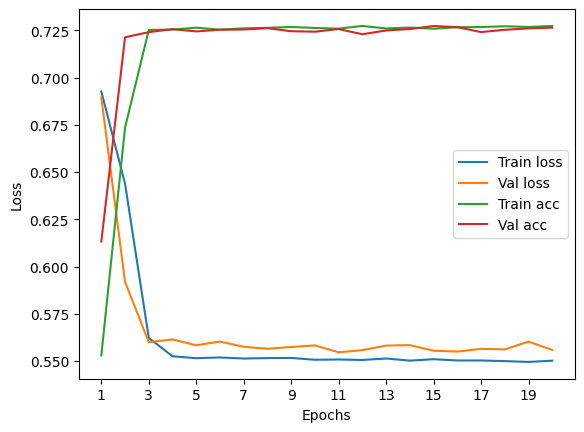

****************************************************************************************************

Particles per jet: 3


235it [00:04, 54.00it/s]


Train Epoch: 0 	Loss: 0.692591, Accuracy: 32955/59922 (55%)
Val Epoch: 0 	Loss: 0.686841, Accuracy: 11932/19974 (60%)



235it [00:04, 56.84it/s]


Train Epoch: 1 	Loss: 0.660225, Accuracy: 38916/59922 (65%)
Val Epoch: 1 	Loss: 0.635577, Accuracy: 13917/19974 (70%)



235it [00:04, 57.92it/s]


Train Epoch: 2 	Loss: 0.594363, Accuracy: 42844/59922 (71%)
Val Epoch: 2 	Loss: 0.582027, Accuracy: 14266/19974 (71%)



235it [00:04, 56.44it/s]


Train Epoch: 3 	Loss: 0.567304, Accuracy: 43276/59922 (72%)
Val Epoch: 3 	Loss: 0.573397, Accuracy: 14366/19974 (72%)



235it [00:03, 59.94it/s]


Train Epoch: 4 	Loss: 0.565421, Accuracy: 43324/59922 (72%)
Val Epoch: 4 	Loss: 0.570227, Accuracy: 14376/19974 (72%)



235it [00:03, 61.44it/s]


Train Epoch: 5 	Loss: 0.564353, Accuracy: 43336/59922 (72%)
Val Epoch: 5 	Loss: 0.572366, Accuracy: 14408/19974 (72%)



235it [00:04, 55.15it/s]


Train Epoch: 6 	Loss: 0.563903, Accuracy: 43315/59922 (72%)
Val Epoch: 6 	Loss: 0.575507, Accuracy: 14381/19974 (72%)



235it [00:04, 56.91it/s]


Train Epoch: 7 	Loss: 0.563654, Accuracy: 43375/59922 (72%)
Val Epoch: 7 	Loss: 0.570113, Accuracy: 14405/19974 (72%)



235it [00:04, 57.55it/s]


Train Epoch: 8 	Loss: 0.562720, Accuracy: 43405/59922 (72%)
Val Epoch: 8 	Loss: 0.573422, Accuracy: 14417/19974 (72%)



235it [00:04, 49.93it/s]


Train Epoch: 9 	Loss: 0.563066, Accuracy: 43412/59922 (72%)
Val Epoch: 9 	Loss: 0.585180, Accuracy: 14377/19974 (72%)



235it [00:04, 51.54it/s]


Train Epoch: 10 	Loss: 0.562983, Accuracy: 43417/59922 (72%)
Val Epoch: 10 	Loss: 0.570863, Accuracy: 14380/19974 (72%)



235it [00:05, 45.66it/s]


Train Epoch: 11 	Loss: 0.562746, Accuracy: 43389/59922 (72%)
Val Epoch: 11 	Loss: 0.570575, Accuracy: 14375/19974 (72%)



235it [00:04, 57.22it/s]


Train Epoch: 12 	Loss: 0.562634, Accuracy: 43419/59922 (72%)
Val Epoch: 12 	Loss: 0.568376, Accuracy: 14423/19974 (72%)



235it [00:04, 56.64it/s]


Train Epoch: 13 	Loss: 0.561915, Accuracy: 43388/59922 (72%)
Val Epoch: 13 	Loss: 0.568618, Accuracy: 14422/19974 (72%)



235it [00:05, 45.63it/s]


Train Epoch: 14 	Loss: 0.562699, Accuracy: 43371/59922 (72%)
Val Epoch: 14 	Loss: 0.574040, Accuracy: 14349/19974 (72%)



235it [00:04, 58.20it/s]


Train Epoch: 15 	Loss: 0.562777, Accuracy: 43367/59922 (72%)
Val Epoch: 15 	Loss: 0.572276, Accuracy: 14428/19974 (72%)



235it [00:04, 49.17it/s]


Train Epoch: 16 	Loss: 0.562548, Accuracy: 43416/59922 (72%)
Val Epoch: 16 	Loss: 0.572412, Accuracy: 14367/19974 (72%)



235it [00:04, 49.47it/s]


Train Epoch: 17 	Loss: 0.561403, Accuracy: 43394/59922 (72%)
Val Epoch: 17 	Loss: 0.569815, Accuracy: 14394/19974 (72%)



235it [00:04, 58.39it/s]


Train Epoch: 18 	Loss: 0.562181, Accuracy: 43434/59922 (72%)
Val Epoch: 18 	Loss: 0.571619, Accuracy: 14420/19974 (72%)



235it [00:05, 44.12it/s]


Train Epoch: 19 	Loss: 0.562514, Accuracy: 43441/59922 (72%)
Val Epoch: 19 	Loss: 0.569975, Accuracy: 14370/19974 (72%)

Test accuracy:  72.1437869229999


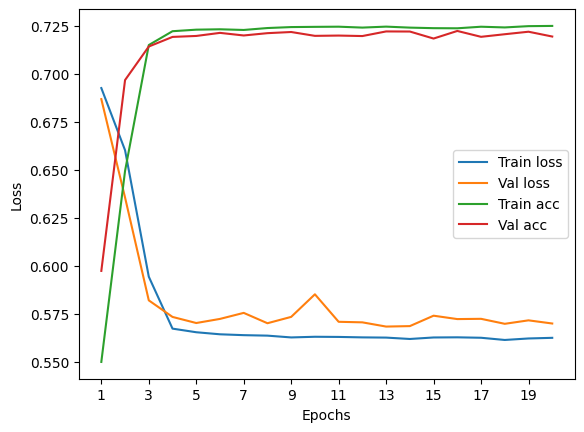

****************************************************************************************************

Particles per jet: 4


235it [00:03, 59.21it/s]


Train Epoch: 0 	Loss: 0.696425, Accuracy: 30480/59922 (51%)
Val Epoch: 0 	Loss: 0.700355, Accuracy: 10517/19974 (53%)



235it [00:04, 52.72it/s]


Train Epoch: 1 	Loss: 0.689615, Accuracy: 33764/59922 (56%)
Val Epoch: 1 	Loss: 0.687420, Accuracy: 12232/19974 (61%)



235it [00:03, 59.45it/s]


Train Epoch: 2 	Loss: 0.664586, Accuracy: 39153/59922 (65%)
Val Epoch: 2 	Loss: 0.649494, Accuracy: 13723/19974 (69%)



235it [00:04, 58.01it/s]


Train Epoch: 3 	Loss: 0.618331, Accuracy: 42187/59922 (70%)
Val Epoch: 3 	Loss: 0.602833, Accuracy: 14164/19974 (71%)



235it [00:04, 54.42it/s]


Train Epoch: 4 	Loss: 0.586082, Accuracy: 42683/59922 (71%)
Val Epoch: 4 	Loss: 0.587599, Accuracy: 14129/19974 (71%)



235it [00:04, 57.97it/s]


Train Epoch: 5 	Loss: 0.573548, Accuracy: 42801/59922 (71%)
Val Epoch: 5 	Loss: 0.580024, Accuracy: 14157/19974 (71%)



235it [00:04, 55.06it/s]


Train Epoch: 6 	Loss: 0.570191, Accuracy: 42826/59922 (71%)
Val Epoch: 6 	Loss: 0.578234, Accuracy: 14242/19974 (71%)



235it [00:04, 54.19it/s]


Train Epoch: 7 	Loss: 0.570365, Accuracy: 42824/59922 (71%)
Val Epoch: 7 	Loss: 0.576628, Accuracy: 14230/19974 (71%)



235it [00:04, 55.79it/s]


Train Epoch: 8 	Loss: 0.568725, Accuracy: 42917/59922 (72%)
Val Epoch: 8 	Loss: 0.576864, Accuracy: 14214/19974 (71%)



235it [00:04, 50.86it/s]


Train Epoch: 9 	Loss: 0.567963, Accuracy: 42941/59922 (72%)
Val Epoch: 9 	Loss: 0.573780, Accuracy: 14250/19974 (71%)



235it [00:04, 57.68it/s]


Train Epoch: 10 	Loss: 0.567653, Accuracy: 43030/59922 (72%)
Val Epoch: 10 	Loss: 0.582315, Accuracy: 14246/19974 (71%)



235it [00:04, 55.11it/s]


Train Epoch: 11 	Loss: 0.567310, Accuracy: 42989/59922 (72%)
Val Epoch: 11 	Loss: 0.575767, Accuracy: 14272/19974 (71%)



235it [00:04, 47.45it/s]


Train Epoch: 12 	Loss: 0.567314, Accuracy: 43041/59922 (72%)
Val Epoch: 12 	Loss: 0.575378, Accuracy: 14265/19974 (71%)



235it [00:04, 53.70it/s]


Train Epoch: 13 	Loss: 0.566989, Accuracy: 43094/59922 (72%)
Val Epoch: 13 	Loss: 0.578733, Accuracy: 14309/19974 (72%)



235it [00:04, 58.24it/s]


Train Epoch: 14 	Loss: 0.566546, Accuracy: 43116/59922 (72%)
Val Epoch: 14 	Loss: 0.574425, Accuracy: 14319/19974 (72%)



235it [00:05, 45.28it/s]


Train Epoch: 15 	Loss: 0.566001, Accuracy: 43190/59922 (72%)
Val Epoch: 15 	Loss: 0.571754, Accuracy: 14288/19974 (72%)



235it [00:04, 54.20it/s]


Train Epoch: 16 	Loss: 0.565868, Accuracy: 43232/59922 (72%)
Val Epoch: 16 	Loss: 0.572246, Accuracy: 14396/19974 (72%)



235it [00:04, 56.91it/s]


Train Epoch: 17 	Loss: 0.564997, Accuracy: 43246/59922 (72%)
Val Epoch: 17 	Loss: 0.576830, Accuracy: 14361/19974 (72%)



235it [00:04, 47.39it/s]


Train Epoch: 18 	Loss: 0.564960, Accuracy: 43314/59922 (72%)
Val Epoch: 18 	Loss: 0.575700, Accuracy: 14367/19974 (72%)



235it [00:04, 58.62it/s]


Train Epoch: 19 	Loss: 0.564670, Accuracy: 43297/59922 (72%)
Val Epoch: 19 	Loss: 0.576703, Accuracy: 14411/19974 (72%)

Test accuracy:  72.0736958045459


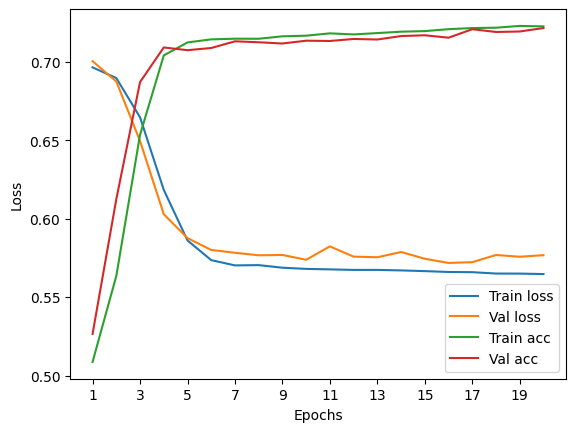

****************************************************************************************************

Particles per jet: 5


235it [00:04, 58.00it/s]


Train Epoch: 0 	Loss: 0.690305, Accuracy: 33558/59922 (56%)
Val Epoch: 0 	Loss: 0.688274, Accuracy: 12126/19974 (61%)



235it [00:04, 49.63it/s]


Train Epoch: 1 	Loss: 0.668832, Accuracy: 38161/59922 (64%)
Val Epoch: 1 	Loss: 0.657144, Accuracy: 13250/19974 (66%)



235it [00:04, 56.18it/s]


Train Epoch: 2 	Loss: 0.629570, Accuracy: 40872/59922 (68%)
Val Epoch: 2 	Loss: 0.615282, Accuracy: 13890/19974 (70%)



235it [00:04, 57.91it/s]


Train Epoch: 3 	Loss: 0.593461, Accuracy: 42146/59922 (70%)
Val Epoch: 3 	Loss: 0.594804, Accuracy: 14101/19974 (71%)



235it [00:03, 58.79it/s]


Train Epoch: 4 	Loss: 0.579378, Accuracy: 42500/59922 (71%)
Val Epoch: 4 	Loss: 0.582575, Accuracy: 14123/19974 (71%)



235it [00:04, 57.53it/s]


Train Epoch: 5 	Loss: 0.574640, Accuracy: 42638/59922 (71%)
Val Epoch: 5 	Loss: 0.580475, Accuracy: 14230/19974 (71%)



235it [00:04, 57.69it/s]


Train Epoch: 6 	Loss: 0.573585, Accuracy: 42816/59922 (71%)
Val Epoch: 6 	Loss: 0.581629, Accuracy: 14226/19974 (71%)



235it [00:04, 54.02it/s]


Train Epoch: 7 	Loss: 0.572161, Accuracy: 42912/59922 (72%)
Val Epoch: 7 	Loss: 0.579213, Accuracy: 14279/19974 (71%)



235it [00:04, 57.97it/s]


Train Epoch: 8 	Loss: 0.571521, Accuracy: 42972/59922 (72%)
Val Epoch: 8 	Loss: 0.581858, Accuracy: 14261/19974 (71%)



235it [00:04, 55.03it/s]


Train Epoch: 9 	Loss: 0.571900, Accuracy: 42987/59922 (72%)
Val Epoch: 9 	Loss: 0.578432, Accuracy: 14324/19974 (72%)



235it [00:04, 52.90it/s]


Train Epoch: 10 	Loss: 0.571104, Accuracy: 43007/59922 (72%)
Val Epoch: 10 	Loss: 0.579988, Accuracy: 14215/19974 (71%)



235it [00:05, 46.69it/s]


Train Epoch: 11 	Loss: 0.571589, Accuracy: 42978/59922 (72%)
Val Epoch: 11 	Loss: 0.578210, Accuracy: 14307/19974 (72%)



235it [00:04, 51.92it/s]


Train Epoch: 12 	Loss: 0.570895, Accuracy: 42975/59922 (72%)
Val Epoch: 12 	Loss: 0.581212, Accuracy: 14280/19974 (71%)



235it [00:04, 58.46it/s]


Train Epoch: 13 	Loss: 0.571609, Accuracy: 43019/59922 (72%)
Val Epoch: 13 	Loss: 0.580304, Accuracy: 14316/19974 (72%)



235it [00:04, 48.28it/s]


Train Epoch: 14 	Loss: 0.571168, Accuracy: 43022/59922 (72%)
Val Epoch: 14 	Loss: 0.576560, Accuracy: 14275/19974 (71%)



235it [00:04, 55.92it/s]


Train Epoch: 15 	Loss: 0.570334, Accuracy: 43016/59922 (72%)
Val Epoch: 15 	Loss: 0.576915, Accuracy: 14316/19974 (72%)



235it [00:05, 45.83it/s]


Train Epoch: 16 	Loss: 0.570591, Accuracy: 43031/59922 (72%)
Val Epoch: 16 	Loss: 0.579841, Accuracy: 14337/19974 (72%)



235it [00:04, 50.68it/s]


Train Epoch: 17 	Loss: 0.570586, Accuracy: 43058/59922 (72%)
Val Epoch: 17 	Loss: 0.579736, Accuracy: 14327/19974 (72%)



235it [00:04, 52.08it/s]


Train Epoch: 18 	Loss: 0.570297, Accuracy: 43054/59922 (72%)
Val Epoch: 18 	Loss: 0.581904, Accuracy: 14309/19974 (72%)



235it [00:04, 53.41it/s]


Train Epoch: 19 	Loss: 0.570012, Accuracy: 43051/59922 (72%)
Val Epoch: 19 	Loss: 0.580553, Accuracy: 14312/19974 (72%)

Test accuracy:  72.44918393912086


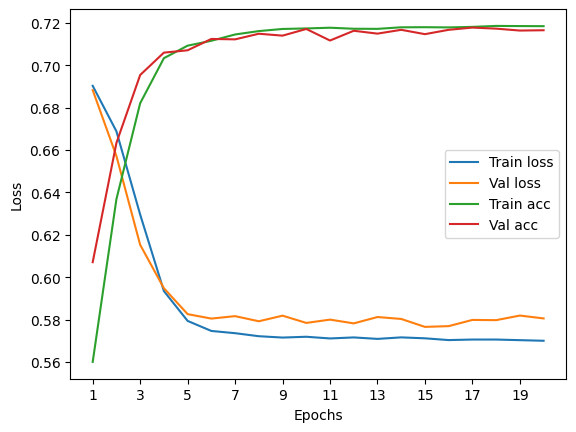

****************************************************************************************************

Particles per jet: 6


235it [00:04, 53.18it/s]


Train Epoch: 0 	Loss: 0.695251, Accuracy: 31203/59922 (52%)
Val Epoch: 0 	Loss: 0.697328, Accuracy: 11406/19974 (57%)



235it [00:04, 53.90it/s]


Train Epoch: 1 	Loss: 0.682020, Accuracy: 35739/59922 (60%)
Val Epoch: 1 	Loss: 0.672254, Accuracy: 12661/19974 (63%)



235it [00:04, 56.29it/s]


Train Epoch: 2 	Loss: 0.648866, Accuracy: 39275/59922 (66%)
Val Epoch: 2 	Loss: 0.636819, Accuracy: 13526/19974 (68%)



235it [00:04, 56.16it/s]


Train Epoch: 3 	Loss: 0.615723, Accuracy: 41005/59922 (68%)
Val Epoch: 3 	Loss: 0.609744, Accuracy: 13812/19974 (69%)



235it [00:04, 53.99it/s]


Train Epoch: 4 	Loss: 0.594723, Accuracy: 41996/59922 (70%)
Val Epoch: 4 	Loss: 0.595498, Accuracy: 13824/19974 (69%)



235it [00:04, 56.44it/s]


Train Epoch: 5 	Loss: 0.585993, Accuracy: 42204/59922 (70%)
Val Epoch: 5 	Loss: 0.590440, Accuracy: 14061/19974 (70%)



235it [00:10, 22.50it/s]


Train Epoch: 6 	Loss: 0.582053, Accuracy: 42371/59922 (71%)
Val Epoch: 6 	Loss: 0.587326, Accuracy: 14008/19974 (70%)



235it [00:08, 26.13it/s]


Train Epoch: 7 	Loss: 0.580502, Accuracy: 42452/59922 (71%)
Val Epoch: 7 	Loss: 0.583777, Accuracy: 14115/19974 (71%)



235it [00:10, 22.39it/s]


Train Epoch: 8 	Loss: 0.580218, Accuracy: 42563/59922 (71%)
Val Epoch: 8 	Loss: 0.584059, Accuracy: 14134/19974 (71%)



235it [00:09, 24.47it/s]


Train Epoch: 9 	Loss: 0.577976, Accuracy: 42653/59922 (71%)
Val Epoch: 9 	Loss: 0.582361, Accuracy: 14209/19974 (71%)



235it [00:07, 31.17it/s]


Train Epoch: 10 	Loss: 0.575914, Accuracy: 42786/59922 (71%)
Val Epoch: 10 	Loss: 0.582569, Accuracy: 14221/19974 (71%)



235it [00:09, 25.90it/s]


Train Epoch: 11 	Loss: 0.575971, Accuracy: 42894/59922 (72%)
Val Epoch: 11 	Loss: 0.579700, Accuracy: 14192/19974 (71%)



235it [00:06, 33.62it/s]


Train Epoch: 12 	Loss: 0.574396, Accuracy: 42929/59922 (72%)
Val Epoch: 12 	Loss: 0.582652, Accuracy: 14247/19974 (71%)



235it [00:10, 22.96it/s]


Train Epoch: 13 	Loss: 0.573300, Accuracy: 43044/59922 (72%)
Val Epoch: 13 	Loss: 0.578686, Accuracy: 14275/19974 (71%)



235it [00:09, 23.66it/s]


Train Epoch: 14 	Loss: 0.572702, Accuracy: 43029/59922 (72%)
Val Epoch: 14 	Loss: 0.582112, Accuracy: 14282/19974 (72%)



235it [00:07, 29.77it/s]


Train Epoch: 15 	Loss: 0.573920, Accuracy: 43045/59922 (72%)
Val Epoch: 15 	Loss: 0.578425, Accuracy: 14274/19974 (71%)



235it [00:07, 29.41it/s]


Train Epoch: 16 	Loss: 0.572400, Accuracy: 43093/59922 (72%)
Val Epoch: 16 	Loss: 0.576270, Accuracy: 14271/19974 (71%)



235it [00:05, 40.54it/s]


Train Epoch: 17 	Loss: 0.573723, Accuracy: 43102/59922 (72%)
Val Epoch: 17 	Loss: 0.577244, Accuracy: 14310/19974 (72%)



235it [00:06, 36.28it/s]


Train Epoch: 18 	Loss: 0.572319, Accuracy: 43129/59922 (72%)
Val Epoch: 18 	Loss: 0.581326, Accuracy: 14311/19974 (72%)



235it [00:05, 40.29it/s]


Train Epoch: 19 	Loss: 0.572652, Accuracy: 43194/59922 (72%)
Val Epoch: 19 	Loss: 0.581000, Accuracy: 14262/19974 (71%)

Test accuracy:  71.61309702613397


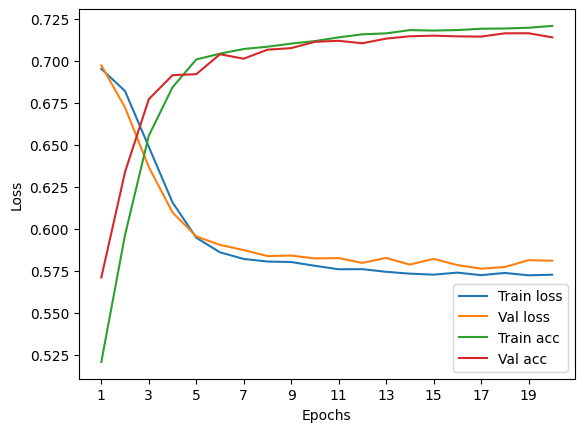

****************************************************************************************************

Particles per jet: 7


235it [00:07, 29.45it/s]


Train Epoch: 0 	Loss: 0.695164, Accuracy: 30678/59922 (51%)
Val Epoch: 0 	Loss: 0.697504, Accuracy: 10818/19974 (54%)



235it [00:08, 26.37it/s]


Train Epoch: 1 	Loss: 0.688311, Accuracy: 33452/59922 (56%)
Val Epoch: 1 	Loss: 0.689332, Accuracy: 11448/19974 (57%)



235it [00:08, 27.49it/s]


Train Epoch: 2 	Loss: 0.676884, Accuracy: 35302/59922 (59%)
Val Epoch: 2 	Loss: 0.675246, Accuracy: 11871/19974 (59%)



235it [00:08, 28.25it/s]


Train Epoch: 3 	Loss: 0.660582, Accuracy: 37275/59922 (62%)
Val Epoch: 3 	Loss: 0.654913, Accuracy: 12857/19974 (64%)



235it [00:06, 34.85it/s]


Train Epoch: 4 	Loss: 0.637090, Accuracy: 39695/59922 (66%)
Val Epoch: 4 	Loss: 0.626415, Accuracy: 13593/19974 (68%)



235it [00:06, 35.33it/s]


Train Epoch: 5 	Loss: 0.611846, Accuracy: 41102/59922 (69%)
Val Epoch: 5 	Loss: 0.607680, Accuracy: 13787/19974 (69%)



235it [00:07, 29.89it/s]


Train Epoch: 6 	Loss: 0.595363, Accuracy: 41925/59922 (70%)
Val Epoch: 6 	Loss: 0.590890, Accuracy: 14171/19974 (71%)



235it [00:07, 33.09it/s]


Train Epoch: 7 	Loss: 0.586121, Accuracy: 42229/59922 (70%)
Val Epoch: 7 	Loss: 0.584178, Accuracy: 14277/19974 (71%)



235it [00:08, 28.08it/s]


Train Epoch: 8 	Loss: 0.582164, Accuracy: 42449/59922 (71%)
Val Epoch: 8 	Loss: 0.583178, Accuracy: 14253/19974 (71%)



235it [00:07, 29.86it/s]


Train Epoch: 9 	Loss: 0.580386, Accuracy: 42656/59922 (71%)
Val Epoch: 9 	Loss: 0.581855, Accuracy: 14354/19974 (72%)



235it [00:06, 34.32it/s]


Train Epoch: 10 	Loss: 0.579067, Accuracy: 42757/59922 (71%)
Val Epoch: 10 	Loss: 0.578709, Accuracy: 14272/19974 (71%)



235it [00:08, 28.61it/s]


Train Epoch: 11 	Loss: 0.579339, Accuracy: 42743/59922 (71%)
Val Epoch: 11 	Loss: 0.581777, Accuracy: 14360/19974 (72%)



235it [00:07, 33.55it/s]


Train Epoch: 12 	Loss: 0.579082, Accuracy: 42756/59922 (71%)
Val Epoch: 12 	Loss: 0.577096, Accuracy: 14364/19974 (72%)



235it [00:09, 25.09it/s]


Train Epoch: 13 	Loss: 0.578692, Accuracy: 42768/59922 (71%)
Val Epoch: 13 	Loss: 0.583565, Accuracy: 14286/19974 (72%)



235it [00:07, 32.51it/s]


Train Epoch: 14 	Loss: 0.578718, Accuracy: 42696/59922 (71%)
Val Epoch: 14 	Loss: 0.577828, Accuracy: 14393/19974 (72%)



235it [00:08, 27.14it/s]


Train Epoch: 15 	Loss: 0.578476, Accuracy: 42781/59922 (71%)
Val Epoch: 15 	Loss: 0.576527, Accuracy: 14418/19974 (72%)



235it [00:08, 28.09it/s]


Train Epoch: 16 	Loss: 0.577427, Accuracy: 42794/59922 (71%)
Val Epoch: 16 	Loss: 0.581374, Accuracy: 14372/19974 (72%)



235it [00:07, 32.95it/s]


Train Epoch: 17 	Loss: 0.577663, Accuracy: 42760/59922 (71%)
Val Epoch: 17 	Loss: 0.577514, Accuracy: 14405/19974 (72%)



235it [00:11, 20.27it/s]


Train Epoch: 18 	Loss: 0.578074, Accuracy: 42801/59922 (71%)
Val Epoch: 18 	Loss: 0.586620, Accuracy: 14425/19974 (72%)



235it [00:08, 29.09it/s]


Train Epoch: 19 	Loss: 0.577589, Accuracy: 42806/59922 (71%)
Val Epoch: 19 	Loss: 0.579984, Accuracy: 14269/19974 (71%)

Test accuracy:  70.85210774006208


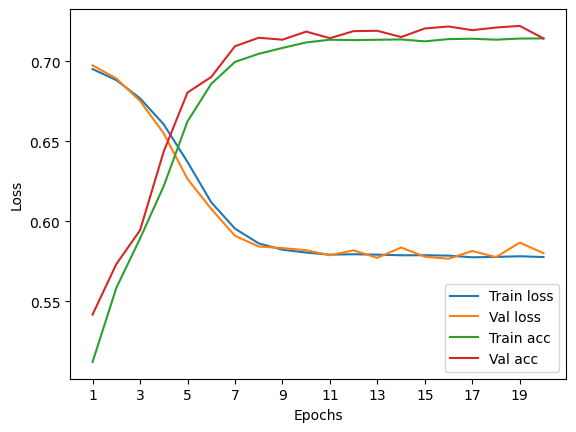

****************************************************************************************************

Particles per jet: 8


235it [00:06, 34.07it/s]


Train Epoch: 0 	Loss: 0.694752, Accuracy: 31695/59922 (53%)
Val Epoch: 0 	Loss: 0.698309, Accuracy: 11174/19974 (56%)



235it [00:07, 29.55it/s]


Train Epoch: 1 	Loss: 0.686643, Accuracy: 34461/59922 (58%)
Val Epoch: 1 	Loss: 0.683368, Accuracy: 11968/19974 (60%)



235it [00:06, 33.83it/s]


Train Epoch: 2 	Loss: 0.670127, Accuracy: 36302/59922 (61%)
Val Epoch: 2 	Loss: 0.664031, Accuracy: 12703/19974 (64%)



235it [00:05, 39.52it/s]


Train Epoch: 3 	Loss: 0.645293, Accuracy: 39117/59922 (65%)
Val Epoch: 3 	Loss: 0.634029, Accuracy: 13545/19974 (68%)



235it [00:06, 34.04it/s]


Train Epoch: 4 	Loss: 0.618484, Accuracy: 40942/59922 (68%)
Val Epoch: 4 	Loss: 0.608318, Accuracy: 13905/19974 (70%)



235it [00:05, 40.91it/s]


Train Epoch: 5 	Loss: 0.599278, Accuracy: 41818/59922 (70%)
Val Epoch: 5 	Loss: 0.595569, Accuracy: 14182/19974 (71%)



235it [00:06, 37.08it/s]


Train Epoch: 6 	Loss: 0.589280, Accuracy: 42271/59922 (71%)
Val Epoch: 6 	Loss: 0.584094, Accuracy: 14228/19974 (71%)



235it [00:06, 38.86it/s]


Train Epoch: 7 	Loss: 0.584583, Accuracy: 42543/59922 (71%)
Val Epoch: 7 	Loss: 0.584082, Accuracy: 14358/19974 (72%)



235it [00:05, 44.43it/s]


Train Epoch: 8 	Loss: 0.581800, Accuracy: 42665/59922 (71%)
Val Epoch: 8 	Loss: 0.581457, Accuracy: 14393/19974 (72%)



235it [00:06, 38.34it/s]


Train Epoch: 9 	Loss: 0.581147, Accuracy: 42775/59922 (71%)
Val Epoch: 9 	Loss: 0.576274, Accuracy: 14467/19974 (72%)



235it [00:05, 40.56it/s]


Train Epoch: 10 	Loss: 0.580777, Accuracy: 42871/59922 (72%)
Val Epoch: 10 	Loss: 0.579320, Accuracy: 14366/19974 (72%)



235it [00:05, 39.74it/s]


Train Epoch: 11 	Loss: 0.579056, Accuracy: 42893/59922 (72%)
Val Epoch: 11 	Loss: 0.575702, Accuracy: 14479/19974 (72%)



235it [00:06, 37.81it/s]


Train Epoch: 12 	Loss: 0.578423, Accuracy: 42965/59922 (72%)
Val Epoch: 12 	Loss: 0.577056, Accuracy: 14415/19974 (72%)



235it [00:06, 38.07it/s]


Train Epoch: 13 	Loss: 0.577741, Accuracy: 42991/59922 (72%)
Val Epoch: 13 	Loss: 0.579023, Accuracy: 14484/19974 (73%)



235it [00:05, 43.60it/s]


Train Epoch: 14 	Loss: 0.578782, Accuracy: 43017/59922 (72%)
Val Epoch: 14 	Loss: 0.576088, Accuracy: 14459/19974 (72%)



235it [00:05, 44.45it/s]


Train Epoch: 15 	Loss: 0.577234, Accuracy: 42994/59922 (72%)
Val Epoch: 15 	Loss: 0.575568, Accuracy: 14488/19974 (73%)



235it [00:06, 37.55it/s]


Train Epoch: 16 	Loss: 0.577303, Accuracy: 43023/59922 (72%)
Val Epoch: 16 	Loss: 0.576921, Accuracy: 14528/19974 (73%)



235it [00:08, 26.23it/s]


Train Epoch: 17 	Loss: 0.577551, Accuracy: 43063/59922 (72%)
Val Epoch: 17 	Loss: 0.573472, Accuracy: 14506/19974 (73%)



235it [00:07, 31.74it/s]


Train Epoch: 18 	Loss: 0.576789, Accuracy: 43090/59922 (72%)
Val Epoch: 18 	Loss: 0.573664, Accuracy: 14509/19974 (73%)



235it [00:07, 30.08it/s]


Train Epoch: 19 	Loss: 0.576760, Accuracy: 43040/59922 (72%)
Val Epoch: 19 	Loss: 0.575457, Accuracy: 14512/19974 (73%)

Test accuracy:  72.00360468609192


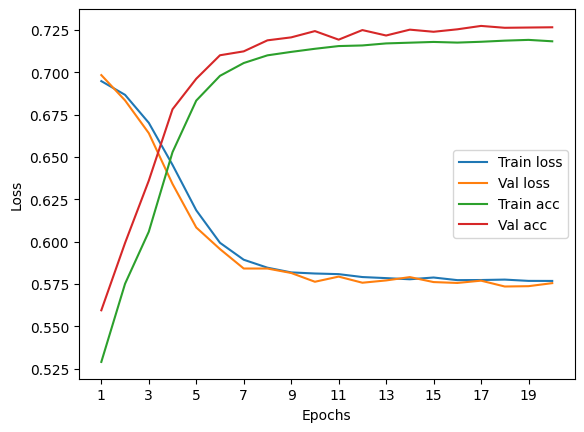

****************************************************************************************************

Particles per jet: 9


235it [00:04, 51.56it/s]


Train Epoch: 0 	Loss: 0.699492, Accuracy: 30236/59922 (50%)
Val Epoch: 0 	Loss: 0.701431, Accuracy: 10291/19974 (52%)



235it [00:04, 51.61it/s]


Train Epoch: 1 	Loss: 0.694680, Accuracy: 31152/59922 (52%)
Val Epoch: 1 	Loss: 0.698799, Accuracy: 10807/19974 (54%)



235it [00:04, 49.54it/s]


Train Epoch: 2 	Loss: 0.690400, Accuracy: 33601/59922 (56%)
Val Epoch: 2 	Loss: 0.691767, Accuracy: 11642/19974 (58%)



235it [00:04, 51.80it/s]


Train Epoch: 3 	Loss: 0.681539, Accuracy: 35119/59922 (59%)
Val Epoch: 3 	Loss: 0.681909, Accuracy: 12055/19974 (60%)



235it [00:05, 44.79it/s]


Train Epoch: 4 	Loss: 0.670440, Accuracy: 36063/59922 (60%)
Val Epoch: 4 	Loss: 0.667684, Accuracy: 12329/19974 (62%)



235it [00:06, 36.85it/s]


Train Epoch: 5 	Loss: 0.656304, Accuracy: 37495/59922 (63%)
Val Epoch: 5 	Loss: 0.654503, Accuracy: 12868/19974 (64%)



235it [00:06, 37.42it/s]


Train Epoch: 6 	Loss: 0.638140, Accuracy: 39279/59922 (66%)
Val Epoch: 6 	Loss: 0.632695, Accuracy: 13345/19974 (67%)



235it [00:05, 43.60it/s]


Train Epoch: 7 	Loss: 0.618331, Accuracy: 40825/59922 (68%)
Val Epoch: 7 	Loss: 0.614277, Accuracy: 13867/19974 (69%)



235it [00:06, 35.68it/s]


Train Epoch: 8 	Loss: 0.600796, Accuracy: 41891/59922 (70%)
Val Epoch: 8 	Loss: 0.599372, Accuracy: 14066/19974 (70%)



235it [00:05, 43.79it/s]


Train Epoch: 9 	Loss: 0.590106, Accuracy: 42473/59922 (71%)
Val Epoch: 9 	Loss: 0.588312, Accuracy: 14199/19974 (71%)



235it [00:09, 25.43it/s]


Train Epoch: 10 	Loss: 0.583191, Accuracy: 42797/59922 (71%)
Val Epoch: 10 	Loss: 0.581537, Accuracy: 14229/19974 (71%)



235it [00:06, 38.58it/s]


Train Epoch: 11 	Loss: 0.580005, Accuracy: 42932/59922 (72%)
Val Epoch: 11 	Loss: 0.578525, Accuracy: 14310/19974 (72%)



235it [00:05, 43.02it/s]


Train Epoch: 12 	Loss: 0.578165, Accuracy: 43027/59922 (72%)
Val Epoch: 12 	Loss: 0.579780, Accuracy: 14310/19974 (72%)



235it [00:07, 31.91it/s]


Train Epoch: 13 	Loss: 0.576305, Accuracy: 43152/59922 (72%)
Val Epoch: 13 	Loss: 0.584759, Accuracy: 14344/19974 (72%)



235it [00:05, 42.45it/s]


Train Epoch: 14 	Loss: 0.576115, Accuracy: 43188/59922 (72%)
Val Epoch: 14 	Loss: 0.579245, Accuracy: 14374/19974 (72%)



235it [00:05, 39.95it/s]


Train Epoch: 15 	Loss: 0.575853, Accuracy: 43218/59922 (72%)
Val Epoch: 15 	Loss: 0.585418, Accuracy: 14367/19974 (72%)



235it [00:05, 40.87it/s]


Train Epoch: 16 	Loss: 0.574637, Accuracy: 43265/59922 (72%)
Val Epoch: 16 	Loss: 0.578726, Accuracy: 14321/19974 (72%)



235it [00:05, 40.40it/s]


Train Epoch: 17 	Loss: 0.574637, Accuracy: 43274/59922 (72%)
Val Epoch: 17 	Loss: 0.590340, Accuracy: 14383/19974 (72%)



235it [00:07, 31.53it/s]


Train Epoch: 18 	Loss: 0.574436, Accuracy: 43250/59922 (72%)
Val Epoch: 18 	Loss: 0.575147, Accuracy: 14369/19974 (72%)



235it [00:06, 38.78it/s]


Train Epoch: 19 	Loss: 0.575155, Accuracy: 43301/59922 (72%)
Val Epoch: 19 	Loss: 0.576608, Accuracy: 14394/19974 (72%)

Test accuracy:  72.0987283468509


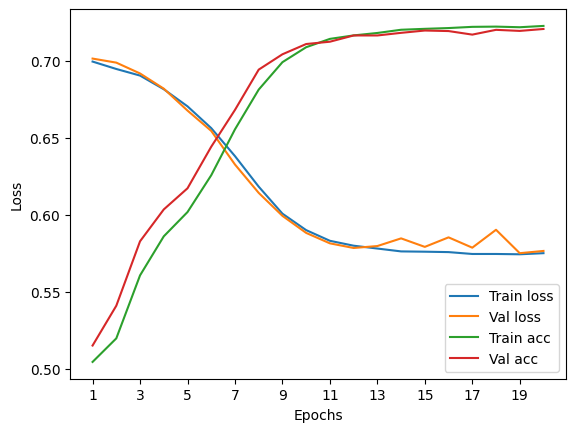

****************************************************************************************************

Particles per jet: 10


235it [00:04, 48.72it/s]


Train Epoch: 0 	Loss: 0.696143, Accuracy: 29993/59922 (50%)
Val Epoch: 0 	Loss: 0.701296, Accuracy: 10395/19974 (52%)



235it [00:04, 50.41it/s]


Train Epoch: 1 	Loss: 0.694337, Accuracy: 32085/59922 (54%)
Val Epoch: 1 	Loss: 0.698739, Accuracy: 10766/19974 (54%)



235it [00:04, 52.32it/s]


Train Epoch: 2 	Loss: 0.688111, Accuracy: 33648/59922 (56%)
Val Epoch: 2 	Loss: 0.688781, Accuracy: 11418/19974 (57%)



235it [00:04, 49.71it/s]


Train Epoch: 3 	Loss: 0.678160, Accuracy: 34662/59922 (58%)
Val Epoch: 3 	Loss: 0.681284, Accuracy: 11757/19974 (59%)



235it [00:05, 44.28it/s]


Train Epoch: 4 	Loss: 0.667849, Accuracy: 35962/59922 (60%)
Val Epoch: 4 	Loss: 0.665455, Accuracy: 12183/19974 (61%)



235it [00:05, 41.18it/s]


Train Epoch: 5 	Loss: 0.650267, Accuracy: 38065/59922 (64%)
Val Epoch: 5 	Loss: 0.643766, Accuracy: 13091/19974 (66%)



235it [00:05, 42.43it/s]


Train Epoch: 6 	Loss: 0.628887, Accuracy: 40172/59922 (67%)
Val Epoch: 6 	Loss: 0.620981, Accuracy: 13645/19974 (68%)



235it [00:05, 43.01it/s]


Train Epoch: 7 	Loss: 0.608337, Accuracy: 41396/59922 (69%)
Val Epoch: 7 	Loss: 0.600958, Accuracy: 14041/19974 (70%)



235it [00:05, 40.87it/s]


Train Epoch: 8 	Loss: 0.593663, Accuracy: 42163/59922 (70%)
Val Epoch: 8 	Loss: 0.588604, Accuracy: 14219/19974 (71%)



235it [00:06, 33.68it/s]


Train Epoch: 9 	Loss: 0.585135, Accuracy: 42499/59922 (71%)
Val Epoch: 9 	Loss: 0.581929, Accuracy: 14275/19974 (71%)



235it [00:09, 24.30it/s]


Train Epoch: 10 	Loss: 0.581198, Accuracy: 42724/59922 (71%)
Val Epoch: 10 	Loss: 0.584368, Accuracy: 14340/19974 (72%)



235it [00:06, 37.64it/s]


Train Epoch: 11 	Loss: 0.579636, Accuracy: 42767/59922 (71%)
Val Epoch: 11 	Loss: 0.579577, Accuracy: 14296/19974 (72%)



235it [00:06, 35.83it/s]


Train Epoch: 12 	Loss: 0.578747, Accuracy: 42804/59922 (71%)
Val Epoch: 12 	Loss: 0.578489, Accuracy: 14325/19974 (72%)



235it [00:05, 45.73it/s]


Train Epoch: 13 	Loss: 0.578465, Accuracy: 42820/59922 (71%)
Val Epoch: 13 	Loss: 0.574855, Accuracy: 14327/19974 (72%)



235it [00:06, 36.59it/s]


Train Epoch: 14 	Loss: 0.577178, Accuracy: 42897/59922 (72%)
Val Epoch: 14 	Loss: 0.578078, Accuracy: 14403/19974 (72%)



235it [00:04, 48.77it/s]


Train Epoch: 15 	Loss: 0.578418, Accuracy: 42916/59922 (72%)
Val Epoch: 15 	Loss: 0.576515, Accuracy: 14378/19974 (72%)



235it [00:05, 42.02it/s]


Train Epoch: 16 	Loss: 0.576395, Accuracy: 42927/59922 (72%)
Val Epoch: 16 	Loss: 0.576102, Accuracy: 14401/19974 (72%)



235it [00:05, 46.75it/s]


Train Epoch: 17 	Loss: 0.575690, Accuracy: 42930/59922 (72%)
Val Epoch: 17 	Loss: 0.574127, Accuracy: 14432/19974 (72%)



235it [00:05, 45.04it/s]


Train Epoch: 18 	Loss: 0.575747, Accuracy: 42962/59922 (72%)
Val Epoch: 18 	Loss: 0.574311, Accuracy: 14403/19974 (72%)



235it [00:05, 42.80it/s]


Train Epoch: 19 	Loss: 0.574866, Accuracy: 43031/59922 (72%)
Val Epoch: 19 	Loss: 0.575307, Accuracy: 14454/19974 (72%)

Test accuracy:  72.24892360068088


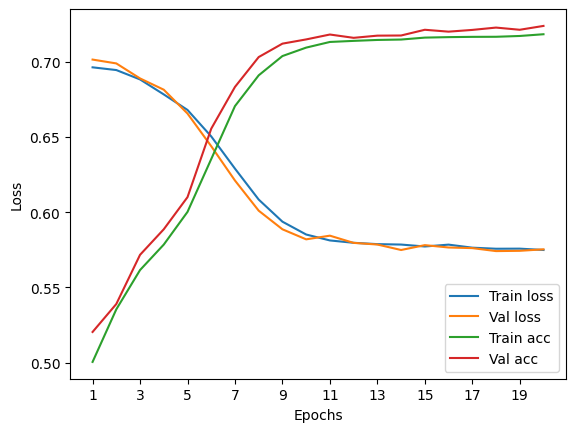

****************************************************************************************************



In [73]:
train_loss, val_loss, train_acc, val_acc, auc = find_ideal_particles(X_norm, 1, 10)

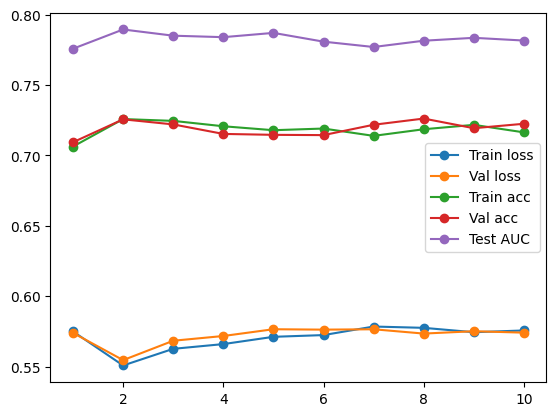

In [74]:
x = range(1,11)
plt.plot(x, train_loss, label="Train loss", marker='o')
plt.plot(x, val_loss, label="Val loss", marker='o')
plt.plot(x, train_acc, label="Train acc", marker='o')
plt.plot(x, val_acc, label="Val acc", marker='o')
plt.plot(x, auc, label="Test AUC", marker='o')
plt.legend()
plt.show()

In [66]:
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GNN(
  (layers): ModuleList(
    (0-1): 2 x GCNConv(8, 8)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=8, out_features=8, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [200]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = CrossEntropyLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

2497it [00:36, 69.01it/s]


Train Epoch: 0 	Loss: 0.644858, Accuracy: 50298/79896 (63%)
Val Epoch: 0 	Loss: 0.612457, Accuracy: 6962/9987 (70%)



2497it [00:40, 61.44it/s]


Train Epoch: 1 	Loss: 0.599767, Accuracy: 55043/79896 (69%)
Val Epoch: 1 	Loss: 0.586461, Accuracy: 6996/9987 (70%)



2497it [00:42, 58.97it/s]


Train Epoch: 2 	Loss: 0.580839, Accuracy: 55841/79896 (70%)
Val Epoch: 2 	Loss: 0.578930, Accuracy: 7044/9987 (71%)



2497it [00:41, 60.34it/s]


Train Epoch: 3 	Loss: 0.571872, Accuracy: 56450/79896 (71%)
Val Epoch: 3 	Loss: 0.583455, Accuracy: 7083/9987 (71%)



2497it [00:41, 59.51it/s]


Train Epoch: 4 	Loss: 0.566268, Accuracy: 56899/79896 (71%)
Val Epoch: 4 	Loss: 0.561163, Accuracy: 7137/9987 (71%)



2497it [00:41, 59.48it/s]


Train Epoch: 5 	Loss: 0.563661, Accuracy: 57108/79896 (71%)
Val Epoch: 5 	Loss: 0.563322, Accuracy: 7178/9987 (72%)



2497it [00:41, 60.14it/s]


Train Epoch: 6 	Loss: 0.561353, Accuracy: 57251/79896 (72%)
Val Epoch: 6 	Loss: 0.558487, Accuracy: 7204/9987 (72%)



2497it [00:42, 58.83it/s]


Train Epoch: 7 	Loss: 0.559708, Accuracy: 57274/79896 (72%)
Val Epoch: 7 	Loss: 0.557839, Accuracy: 7209/9987 (72%)



2497it [00:43, 57.61it/s]


Train Epoch: 8 	Loss: 0.558792, Accuracy: 57356/79896 (72%)
Val Epoch: 8 	Loss: 0.556102, Accuracy: 7207/9987 (72%)



2497it [00:43, 56.76it/s]


Train Epoch: 9 	Loss: 0.556470, Accuracy: 57419/79896 (72%)
Val Epoch: 9 	Loss: 0.561392, Accuracy: 7161/9987 (72%)



2497it [00:42, 59.36it/s]


Train Epoch: 10 	Loss: 0.555796, Accuracy: 57615/79896 (72%)
Val Epoch: 10 	Loss: 0.556225, Accuracy: 7227/9987 (72%)



2497it [00:41, 59.56it/s]


Train Epoch: 11 	Loss: 0.555437, Accuracy: 57591/79896 (72%)
Val Epoch: 11 	Loss: 0.550814, Accuracy: 7239/9987 (72%)



2497it [00:41, 59.89it/s]


Train Epoch: 12 	Loss: 0.554580, Accuracy: 57519/79896 (72%)
Val Epoch: 12 	Loss: 0.553303, Accuracy: 7229/9987 (72%)



2497it [00:42, 59.31it/s]


Train Epoch: 13 	Loss: 0.553594, Accuracy: 57685/79896 (72%)
Val Epoch: 13 	Loss: 0.561092, Accuracy: 7107/9987 (71%)



2497it [00:41, 60.11it/s]


Train Epoch: 14 	Loss: 0.553531, Accuracy: 57721/79896 (72%)
Val Epoch: 14 	Loss: 0.560664, Accuracy: 7206/9987 (72%)



2497it [00:42, 59.31it/s]


Train Epoch: 15 	Loss: 0.552563, Accuracy: 57731/79896 (72%)
Val Epoch: 15 	Loss: 0.555707, Accuracy: 7206/9987 (72%)



2497it [00:42, 59.30it/s]


Train Epoch: 16 	Loss: 0.552320, Accuracy: 57813/79896 (72%)
Val Epoch: 16 	Loss: 0.550085, Accuracy: 7279/9987 (73%)



2497it [00:41, 60.24it/s]


Train Epoch: 17 	Loss: 0.551472, Accuracy: 57816/79896 (72%)
Val Epoch: 17 	Loss: 0.550357, Accuracy: 7267/9987 (73%)



2497it [00:42, 59.14it/s]


Train Epoch: 18 	Loss: 0.551591, Accuracy: 57885/79896 (72%)
Val Epoch: 18 	Loss: 0.553945, Accuracy: 7252/9987 (73%)



2497it [00:41, 59.69it/s]


Train Epoch: 19 	Loss: 0.551590, Accuracy: 57870/79896 (72%)
Val Epoch: 19 	Loss: 0.556416, Accuracy: 7217/9987 (72%)



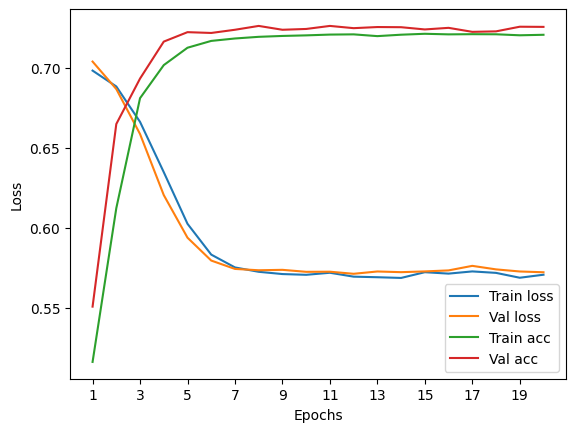

In [49]:
plot_loss(history)

Test accuracy:  73.13507559827777


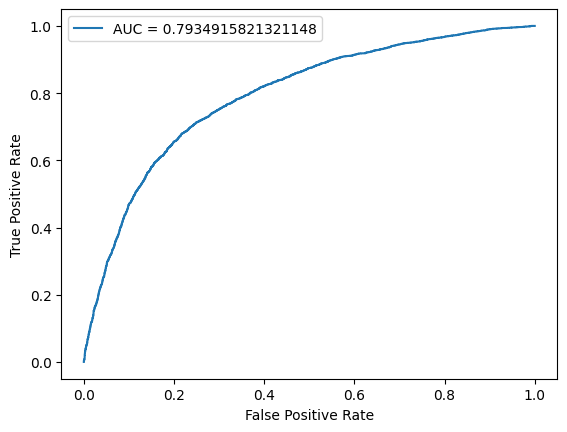

In [50]:
plot_auc(model, test_dataloader)

In [68]:
hidden_dims = [8]

In [69]:
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GNN(
  (layers): ModuleList(
    (0): GCNConv(8, 8)
  )
  (activ_fn): ReLU()
  (classifier): Linear(in_features=8, out_features=1, bias=True)
)

In [70]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

313it [00:05, 61.61it/s]


Train Epoch: 0 	Loss: 0.689871, Accuracy: 45292/79896 (57%)
Val Epoch: 0 	Loss: 0.696291, Accuracy: 6454/9987 (65%)



313it [00:04, 64.65it/s]


Train Epoch: 1 	Loss: 0.668929, Accuracy: 54013/79896 (68%)
Val Epoch: 1 	Loss: 0.665201, Accuracy: 7059/9987 (71%)



313it [00:05, 61.28it/s]


Train Epoch: 2 	Loss: 0.632581, Accuracy: 56880/79896 (71%)
Val Epoch: 2 	Loss: 0.621737, Accuracy: 7263/9987 (73%)



313it [00:05, 58.70it/s]


Train Epoch: 3 	Loss: 0.595598, Accuracy: 57764/79896 (72%)
Val Epoch: 3 	Loss: 0.583884, Accuracy: 7309/9987 (73%)



313it [00:05, 60.97it/s]


Train Epoch: 4 	Loss: 0.570354, Accuracy: 58076/79896 (73%)
Val Epoch: 4 	Loss: 0.578664, Accuracy: 7335/9987 (73%)



313it [00:05, 58.15it/s]


Train Epoch: 5 	Loss: 0.558389, Accuracy: 58198/79896 (73%)
Val Epoch: 5 	Loss: 0.570518, Accuracy: 7341/9987 (74%)



313it [00:05, 61.50it/s]


Train Epoch: 6 	Loss: 0.553300, Accuracy: 58281/79896 (73%)
Val Epoch: 6 	Loss: 0.553164, Accuracy: 7348/9987 (74%)



313it [00:05, 59.03it/s]


Train Epoch: 7 	Loss: 0.550856, Accuracy: 58297/79896 (73%)
Val Epoch: 7 	Loss: 0.583871, Accuracy: 7345/9987 (74%)



313it [00:05, 61.59it/s]


Train Epoch: 8 	Loss: 0.550194, Accuracy: 58327/79896 (73%)
Val Epoch: 8 	Loss: 0.546305, Accuracy: 7358/9987 (74%)



313it [00:05, 62.43it/s]


Train Epoch: 9 	Loss: 0.549351, Accuracy: 58367/79896 (73%)
Val Epoch: 9 	Loss: 0.549582, Accuracy: 7365/9987 (74%)



313it [00:05, 60.51it/s]


Train Epoch: 10 	Loss: 0.549002, Accuracy: 58302/79896 (73%)
Val Epoch: 10 	Loss: 0.548159, Accuracy: 7358/9987 (74%)



313it [00:05, 60.86it/s]


Train Epoch: 11 	Loss: 0.548984, Accuracy: 58365/79896 (73%)
Val Epoch: 11 	Loss: 0.549297, Accuracy: 7373/9987 (74%)



313it [00:05, 58.91it/s]


Train Epoch: 12 	Loss: 0.548327, Accuracy: 58370/79896 (73%)
Val Epoch: 12 	Loss: 0.558452, Accuracy: 7366/9987 (74%)



313it [00:05, 55.93it/s]


Train Epoch: 13 	Loss: 0.548561, Accuracy: 58366/79896 (73%)
Val Epoch: 13 	Loss: 0.553122, Accuracy: 7357/9987 (74%)



313it [00:05, 60.72it/s]


Train Epoch: 14 	Loss: 0.548239, Accuracy: 58385/79896 (73%)
Val Epoch: 14 	Loss: 0.551672, Accuracy: 7364/9987 (74%)



313it [00:05, 58.74it/s]


Train Epoch: 15 	Loss: 0.548624, Accuracy: 58437/79896 (73%)
Val Epoch: 15 	Loss: 0.544874, Accuracy: 7371/9987 (74%)



313it [00:05, 57.53it/s]


Train Epoch: 16 	Loss: 0.548275, Accuracy: 58393/79896 (73%)
Val Epoch: 16 	Loss: 0.544138, Accuracy: 7368/9987 (74%)



313it [00:05, 57.04it/s]


Train Epoch: 17 	Loss: 0.548169, Accuracy: 58441/79896 (73%)
Val Epoch: 17 	Loss: 0.544967, Accuracy: 7369/9987 (74%)



313it [00:05, 56.45it/s]


Train Epoch: 18 	Loss: 0.548023, Accuracy: 58366/79896 (73%)
Val Epoch: 18 	Loss: 0.548105, Accuracy: 7373/9987 (74%)



313it [00:05, 59.57it/s]


Train Epoch: 19 	Loss: 0.548195, Accuracy: 58402/79896 (73%)
Val Epoch: 19 	Loss: 0.548395, Accuracy: 7372/9987 (74%)



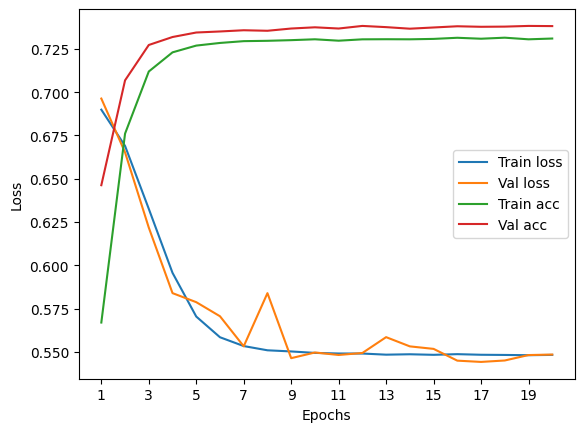

In [71]:
plot_loss(history)

Test accuracy:  72.41413837989387


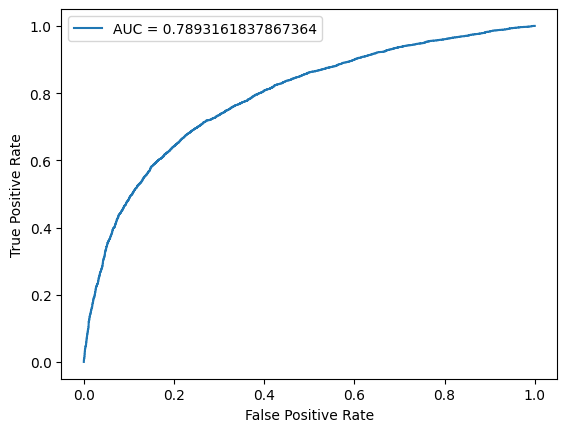

In [72]:
plot_auc(model, test_dataloader)

In [56]:
hidden_dims = [10,16,8]

In [57]:
model = GNN(input_dims,hidden_dims,output_dims, activ_fn=ReLU())
model

GNN(
  (layers): ModuleList(
    (0): GCNConv(8, 10)
    (1): GCNConv(10, 16)
    (2): GCNConv(16, 8)
  )
  (activ_fn): ReLU()
  (classifier): Linear(in_features=8, out_features=1, bias=True)
)

In [58]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

79it [00:03, 19.87it/s]


Train Epoch: 0 	Loss: 0.698829, Accuracy: 42091/79896 (53%)
Val Epoch: 0 	Loss: 0.702670, Accuracy: 5604/9987 (56%)



79it [00:04, 18.88it/s]


Train Epoch: 1 	Loss: 0.680527, Accuracy: 48441/79896 (61%)
Val Epoch: 1 	Loss: 0.668586, Accuracy: 6558/9987 (66%)



79it [00:04, 18.75it/s]


Train Epoch: 2 	Loss: 0.633803, Accuracy: 54245/79896 (68%)
Val Epoch: 2 	Loss: 0.612920, Accuracy: 6911/9987 (69%)



79it [00:04, 18.90it/s]


Train Epoch: 3 	Loss: 0.598705, Accuracy: 55889/79896 (70%)
Val Epoch: 3 	Loss: 0.601529, Accuracy: 7033/9987 (70%)



79it [00:04, 18.97it/s]


Train Epoch: 4 	Loss: 0.591351, Accuracy: 56448/79896 (71%)
Val Epoch: 4 	Loss: 0.592020, Accuracy: 7121/9987 (71%)



79it [00:04, 18.09it/s]


Train Epoch: 5 	Loss: 0.588481, Accuracy: 56561/79896 (71%)
Val Epoch: 5 	Loss: 0.591146, Accuracy: 7096/9987 (71%)



79it [00:04, 17.34it/s]


Train Epoch: 6 	Loss: 0.587961, Accuracy: 56657/79896 (71%)
Val Epoch: 6 	Loss: 0.589951, Accuracy: 7103/9987 (71%)



79it [00:04, 17.04it/s]


Train Epoch: 7 	Loss: 0.584895, Accuracy: 56693/79896 (71%)
Val Epoch: 7 	Loss: 0.589498, Accuracy: 7124/9987 (71%)



79it [00:04, 19.57it/s]


Train Epoch: 8 	Loss: 0.585628, Accuracy: 56832/79896 (71%)
Val Epoch: 8 	Loss: 0.589170, Accuracy: 7146/9987 (72%)



79it [00:04, 16.63it/s]


Train Epoch: 9 	Loss: 0.583251, Accuracy: 56872/79896 (71%)
Val Epoch: 9 	Loss: 0.588685, Accuracy: 7141/9987 (72%)



79it [00:04, 18.78it/s]


Train Epoch: 10 	Loss: 0.587796, Accuracy: 56859/79896 (71%)
Val Epoch: 10 	Loss: 0.589522, Accuracy: 7155/9987 (72%)



79it [00:04, 19.26it/s]


Train Epoch: 11 	Loss: 0.585725, Accuracy: 56953/79896 (71%)
Val Epoch: 11 	Loss: 0.591743, Accuracy: 7124/9987 (71%)



79it [00:04, 17.24it/s]


Train Epoch: 12 	Loss: 0.584016, Accuracy: 56927/79896 (71%)
Val Epoch: 12 	Loss: 0.588487, Accuracy: 7145/9987 (72%)



79it [00:04, 18.52it/s]


Train Epoch: 13 	Loss: 0.583364, Accuracy: 56953/79896 (71%)
Val Epoch: 13 	Loss: 0.588656, Accuracy: 7140/9987 (71%)



79it [00:04, 19.13it/s]


Train Epoch: 14 	Loss: 0.586346, Accuracy: 57033/79896 (71%)
Val Epoch: 14 	Loss: 0.589230, Accuracy: 7129/9987 (71%)



79it [00:04, 18.89it/s]


Train Epoch: 15 	Loss: 0.582779, Accuracy: 56947/79896 (71%)
Val Epoch: 15 	Loss: 0.587191, Accuracy: 7168/9987 (72%)



79it [00:04, 17.44it/s]


Train Epoch: 16 	Loss: 0.582458, Accuracy: 57061/79896 (71%)
Val Epoch: 16 	Loss: 0.588331, Accuracy: 7170/9987 (72%)



79it [00:04, 17.10it/s]


Train Epoch: 17 	Loss: 0.582356, Accuracy: 57119/79896 (71%)
Val Epoch: 17 	Loss: 0.589423, Accuracy: 7158/9987 (72%)



79it [00:04, 18.63it/s]


Train Epoch: 18 	Loss: 0.584527, Accuracy: 57035/79896 (71%)
Val Epoch: 18 	Loss: 0.587681, Accuracy: 7154/9987 (72%)



79it [00:04, 16.81it/s]


Train Epoch: 19 	Loss: 0.582889, Accuracy: 57037/79896 (71%)
Val Epoch: 19 	Loss: 0.586277, Accuracy: 7182/9987 (72%)



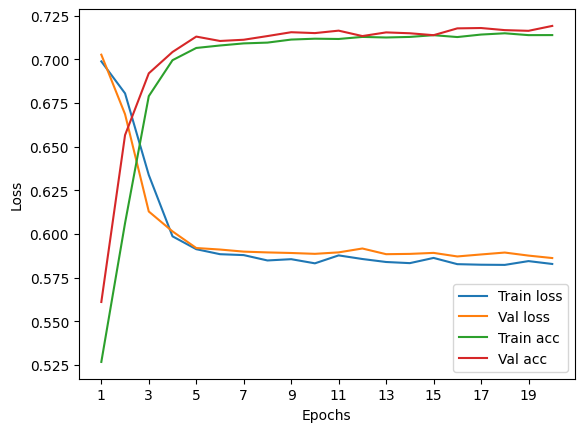

In [59]:
plot_loss(history)

Test accuracy:  72.03364373685791


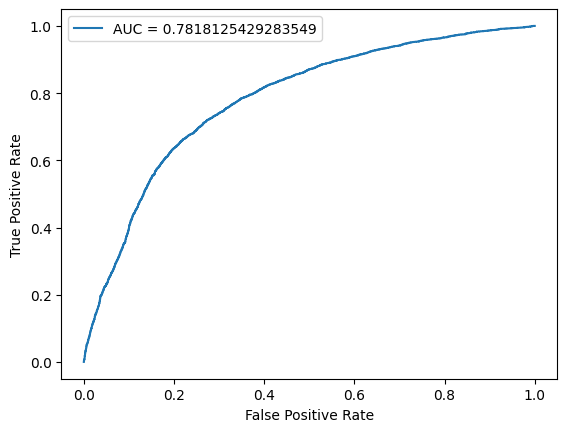

In [60]:
plot_auc(model, test_dataloader)

### Classical GAT - Custom Graph Attention Layer

In [ ]:
class GraphAttention(nn.Module):
    

In [64]:
class GATConv(MessagePassing):
    def __init__(self, in_channels, out_channels):
        super().__init__(aggr='add')  # "Add" aggregation (Step 5).
#         self.heads = heads
#         seld.concat = concat
        self.lin = Linear(in_channels, out_channels, bias=False)
        self.attn = nn.Sequential(Linear(out_channels*2, 8),
                                  ReLU(),
                                  Linear(8,1),
                                  LeakyReLU(0.2)
                                 )
        total_out_channels = out_channels
        self.bias = nn.Parameter(torch.empty(total_out_channels))
        self.reset_parameters()

    def reset_parameters(self):
        super().reset_parameters()
        self.lin.reset_parameters()
        
        for layer in self.attn:
            if hasattr(layer, 'reset_parameters'):
                layer.reset_parameters()
        
        self.bias.data.zero_()

    def forward(self, x, edge_index, edge_attr):
        # x has shape [N, in_channels]
        # edge_index has shape [2, E]
        
        # H, C = self.heads, self.out_channels
        
        x = self.lin(x)    #.view(-1, H, C)

        # Step 1: Add self-loops to the adjacency matrix.
        edge_index, edge_attr = remove_self_loops(edge_index, edge_attr)
        edge_index, edge_attr = add_self_loops(edge_index, edge_attr, num_nodes=x.size(0))

        # alpha = self.edge_update(x_i, x_j, edge_attr=edge_attr)

        # propagate_type: (x: OptPairTensor, alpha: Tensor)
        out = self.propagate(edge_index, x=x)

        # out = out.mean(dim=1)

        # Step 6: Apply a final bias vector.
        out = out + self.bias

        return out


    def message(self, x_i, x_j):
        x_edge = torch.cat((x_i,x_j),dim=1)
        x_edge = self.attn(x_edge)
        return x_edge.view(-1,1) * x_j

In [49]:
class GAT(nn.Module):

    def __init__(self, input_dims, hidden_dims, output_dims, activ_fn = LeakyReLU(0.2)):
        
        super().__init__()
        layers = []
        layers.append(GATConv(input_dims, hidden_dims[0]))
    
        for i in range(len(hidden_dims)-1):
            layers.append(GATConv(hidden_dims[i], hidden_dims[i+1]))
            
        self.layers = ModuleList(layers)
        self.activ_fn = activ_fn
        self.classifier = Sequential(
                            Linear(hidden_dims[-1]+5, 8),
                            ReLU(),
                            Linear(8,1)
                          )

    def forward(self, x, edge_index, edge_attr, batch, graph_features):
        """
        Defining how tensors are supposed to move through the *dressed* quantum
        net.
        """
        
        h = x
        for i in range(len(self.layers)):
            h = self.layers[i](h, edge_index, edge_attr)
            h = self.activ_fn(h)
            
        h = global_mean_pool(h, batch)   # readout layer to get the embedding for each graph in batch
        h = torch.cat((h, graph_features.float().reshape(-1,5)), dim=1)
        h = self.classifier(h)
        return h

### Classical GCN - Custom GraphConv Layer

In [39]:
class GCNConv(MessagePassing):
    def __init__(self, in_channels, out_channels):
        super().__init__(aggr='add')  # "Add" aggregation (Step 5).
        self.lin = Linear(in_channels, out_channels, bias=False)
        self.bias = nn.Parameter(torch.empty(out_channels))
        self.reset_parameters()

    def reset_parameters(self):
        self.bias.data.zero_()

    def forward(self, x, edge_index, edge_weight):
        # x has shape [N, in_channels]
        # edge_index has shape [2, E]

        # Step 1: Add self-loops to the adjacency matrix.
        edge_index, _ = add_self_loops(edge_index, num_nodes=x.size(0))

        # Step 2: Linearly transform node feature matrix.
        # Apply the quantum circuit to each element of the batch and append to q_out
#         q_out = torch.Tensor(0, self.n_qubits)
        
#         for xi in x:
#             q_out_elem = self.qc(xi).float().unsqueeze(0)
#             q_out = torch.cat((q_out, q_out_elem))
        out = self.lin(x)

        # Step 3: Compute normalization.
        row, col = edge_index
        deg = degree(col, out.size(0), dtype=out.dtype)
        deg_inv_sqrt = deg.pow(-0.5)
        deg_inv_sqrt[deg_inv_sqrt == float('inf')] = 0
        norm = deg_inv_sqrt[row] * deg_inv_sqrt[col]

        # Step 4-5: Start propagating messages.
        out = self.propagate(edge_index, x=edge_weight*out, norm=norm)

        # Step 6: Apply a final bias vector.
        out = out + self.bias

        return out

    def message(self, x_j, norm):
        # x_j has shape [E, out_channels]

        # Step 4: Normalize node features.
        return norm.view(-1, 1) * x_j

In [40]:
class GCN(nn.Module):

    def __init__(self, input_dims, hidden_dims, output_dims, activ_fn = LeakyReLU(0.2)):
        
        super().__init__()
        layers = [GCNConv(input_dims, hidden_dims)]
        self.layers = ModuleList(layers)
        self.activ_fn = activ_fn
        self.classifier = nn.Linear(hidden_dims, output_dims)

    def forward(self, x, edge_index, edge_attr, batch):
        """
        Defining how tensors are supposed to move through the *dressed* quantum
        net.
        """
        
        h = x
        for i in range(len(self.layers)):
            h = self.layers[i](h, edge_index, edge_attr)
            h = self.activ_fn(h)
         
        h = global_mean_pool(h, batch)   # readout layer to get the embedding for each graph in batch
        h = self.classifier(h)

        # return the two-dimensional prediction from the postprocessing layer
        return h

#### LeakyReLU

#### Learning rate = 1e-3

In [41]:
epochs = 20

In [42]:
model = GCN(input_dims, hidden_dims, output_dims)
model

GCN(
  (layers): ModuleList(
    (0): GCNConv()
  )
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (classifier): Linear(in_features=8, out_features=1, bias=True)
)

In [43]:
[p.numel() for p in model.parameters()]

[8, 64, 8, 1]

In [44]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

313it [00:05, 54.91it/s]


Train Epoch: 0 	Loss: 0.693805, Accuracy: 42392/79896 (53%)
Val Epoch: 0 	Loss: 0.704668, Accuracy: 5942/9987 (59%)



313it [00:05, 54.29it/s]


Train Epoch: 1 	Loss: 0.674605, Accuracy: 51810/79896 (65%)
Val Epoch: 1 	Loss: 0.673573, Accuracy: 6709/9987 (67%)



313it [00:05, 61.50it/s]


Train Epoch: 2 	Loss: 0.631430, Accuracy: 56481/79896 (71%)
Val Epoch: 2 	Loss: 0.626953, Accuracy: 7094/9987 (71%)



313it [00:05, 54.91it/s]


Train Epoch: 3 	Loss: 0.587096, Accuracy: 58244/79896 (73%)
Val Epoch: 3 	Loss: 0.589732, Accuracy: 7206/9987 (72%)



313it [00:04, 67.84it/s]


Train Epoch: 4 	Loss: 0.559864, Accuracy: 58477/79896 (73%)
Val Epoch: 4 	Loss: 0.583429, Accuracy: 7237/9987 (72%)



313it [00:04, 68.19it/s]


Train Epoch: 5 	Loss: 0.548089, Accuracy: 58533/79896 (73%)
Val Epoch: 5 	Loss: 0.561869, Accuracy: 7235/9987 (72%)



313it [00:05, 61.77it/s]


Train Epoch: 6 	Loss: 0.543680, Accuracy: 58582/79896 (73%)
Val Epoch: 6 	Loss: 0.558994, Accuracy: 7244/9987 (73%)



313it [00:03, 78.61it/s]


Train Epoch: 7 	Loss: 0.541998, Accuracy: 58658/79896 (73%)
Val Epoch: 7 	Loss: 0.555486, Accuracy: 7251/9987 (73%)



313it [00:04, 75.35it/s]


Train Epoch: 8 	Loss: 0.541440, Accuracy: 58652/79896 (73%)
Val Epoch: 8 	Loss: 0.562391, Accuracy: 7247/9987 (73%)



313it [00:05, 59.97it/s]


Train Epoch: 9 	Loss: 0.541143, Accuracy: 58654/79896 (73%)
Val Epoch: 9 	Loss: 0.564819, Accuracy: 7244/9987 (73%)



313it [00:04, 68.11it/s]


Train Epoch: 10 	Loss: 0.541368, Accuracy: 58624/79896 (73%)
Val Epoch: 10 	Loss: 0.560119, Accuracy: 7233/9987 (72%)



313it [00:04, 71.12it/s]


Train Epoch: 11 	Loss: 0.541371, Accuracy: 58638/79896 (73%)
Val Epoch: 11 	Loss: 0.576256, Accuracy: 7264/9987 (73%)



313it [00:05, 59.52it/s]


Train Epoch: 12 	Loss: 0.540592, Accuracy: 58723/79896 (73%)
Val Epoch: 12 	Loss: 0.557498, Accuracy: 7255/9987 (73%)



313it [00:04, 64.86it/s]


Train Epoch: 13 	Loss: 0.541635, Accuracy: 58681/79896 (73%)
Val Epoch: 13 	Loss: 0.557697, Accuracy: 7236/9987 (72%)



313it [00:04, 65.28it/s]


Train Epoch: 14 	Loss: 0.541067, Accuracy: 58656/79896 (73%)
Val Epoch: 14 	Loss: 0.570041, Accuracy: 7237/9987 (72%)



313it [00:05, 62.00it/s]


Train Epoch: 15 	Loss: 0.541147, Accuracy: 58704/79896 (73%)
Val Epoch: 15 	Loss: 0.559660, Accuracy: 7250/9987 (73%)



313it [00:04, 66.21it/s]


Train Epoch: 16 	Loss: 0.540685, Accuracy: 58688/79896 (73%)
Val Epoch: 16 	Loss: 0.587646, Accuracy: 7232/9987 (72%)



313it [00:04, 65.48it/s]


Train Epoch: 17 	Loss: 0.540233, Accuracy: 58683/79896 (73%)
Val Epoch: 17 	Loss: 0.569665, Accuracy: 7247/9987 (73%)



313it [00:05, 61.48it/s]


Train Epoch: 18 	Loss: 0.540529, Accuracy: 58695/79896 (73%)
Val Epoch: 18 	Loss: 0.554261, Accuracy: 7250/9987 (73%)



313it [00:04, 63.51it/s]


Train Epoch: 19 	Loss: 0.540712, Accuracy: 58689/79896 (73%)
Val Epoch: 19 	Loss: 0.563262, Accuracy: 7246/9987 (73%)



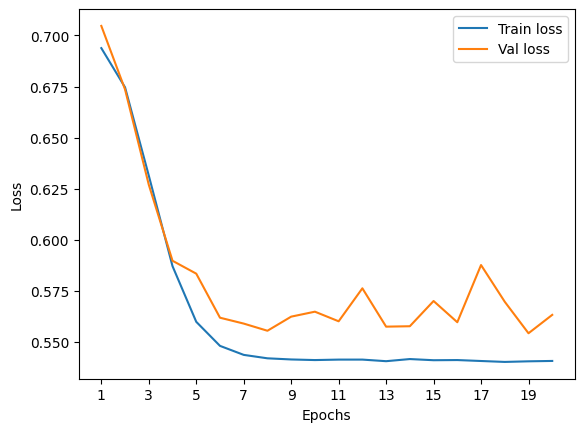

In [45]:
plot_loss(history)

In [ ]:
plot_auc(model, test_dataloader)

#### Learning rate = 1e-2

In [46]:
model = GCN(input_dims, hidden_dims, output_dims)
model

GCN(
  (layers): ModuleList(
    (0): GCNConv()
  )
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (classifier): Linear(in_features=8, out_features=1, bias=True)
)

In [47]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

313it [00:04, 72.87it/s]


Train Epoch: 0 	Loss: 0.591562, Accuracy: 55687/79896 (70%)
Val Epoch: 0 	Loss: 0.566350, Accuracy: 7247/9987 (73%)



313it [00:05, 57.74it/s]


Train Epoch: 1 	Loss: 0.543589, Accuracy: 58524/79896 (73%)
Val Epoch: 1 	Loss: 0.556473, Accuracy: 7240/9987 (72%)



313it [00:04, 65.70it/s]


Train Epoch: 2 	Loss: 0.542377, Accuracy: 58539/79896 (73%)
Val Epoch: 2 	Loss: 0.577740, Accuracy: 7164/9987 (72%)



313it [00:05, 61.66it/s]


Train Epoch: 3 	Loss: 0.542888, Accuracy: 58596/79896 (73%)
Val Epoch: 3 	Loss: 0.566179, Accuracy: 7219/9987 (72%)



313it [00:05, 56.84it/s]


Train Epoch: 4 	Loss: 0.541849, Accuracy: 58608/79896 (73%)
Val Epoch: 4 	Loss: 0.561560, Accuracy: 7246/9987 (73%)



313it [00:04, 64.43it/s]


Train Epoch: 5 	Loss: 0.541463, Accuracy: 58529/79896 (73%)
Val Epoch: 5 	Loss: 0.573925, Accuracy: 7266/9987 (73%)



313it [00:05, 61.65it/s]


Train Epoch: 6 	Loss: 0.541272, Accuracy: 58616/79896 (73%)
Val Epoch: 6 	Loss: 0.562651, Accuracy: 7222/9987 (72%)



313it [00:04, 62.82it/s]


Train Epoch: 7 	Loss: 0.541825, Accuracy: 58632/79896 (73%)
Val Epoch: 7 	Loss: 0.564409, Accuracy: 7243/9987 (73%)



313it [00:04, 71.24it/s]


Train Epoch: 8 	Loss: 0.540485, Accuracy: 58653/79896 (73%)
Val Epoch: 8 	Loss: 0.567350, Accuracy: 7197/9987 (72%)



313it [00:04, 71.98it/s]


Train Epoch: 9 	Loss: 0.541982, Accuracy: 58692/79896 (73%)
Val Epoch: 9 	Loss: 0.571983, Accuracy: 7255/9987 (73%)



313it [00:04, 66.91it/s]


Train Epoch: 10 	Loss: 0.541198, Accuracy: 58623/79896 (73%)
Val Epoch: 10 	Loss: 0.569605, Accuracy: 7206/9987 (72%)



313it [00:04, 74.12it/s]


Train Epoch: 11 	Loss: 0.542159, Accuracy: 58697/79896 (73%)
Val Epoch: 11 	Loss: 0.575789, Accuracy: 7220/9987 (72%)



313it [00:04, 75.13it/s]


Train Epoch: 12 	Loss: 0.540572, Accuracy: 58647/79896 (73%)
Val Epoch: 12 	Loss: 0.572487, Accuracy: 7252/9987 (73%)



313it [00:04, 71.29it/s]


Train Epoch: 13 	Loss: 0.541387, Accuracy: 58670/79896 (73%)
Val Epoch: 13 	Loss: 0.578671, Accuracy: 7212/9987 (72%)



313it [00:04, 70.27it/s]


Train Epoch: 14 	Loss: 0.540994, Accuracy: 58639/79896 (73%)
Val Epoch: 14 	Loss: 0.568360, Accuracy: 7256/9987 (73%)



313it [00:04, 71.28it/s]


Train Epoch: 15 	Loss: 0.541670, Accuracy: 58623/79896 (73%)
Val Epoch: 15 	Loss: 0.563437, Accuracy: 7241/9987 (73%)



313it [00:04, 70.51it/s]


Train Epoch: 16 	Loss: 0.540917, Accuracy: 58670/79896 (73%)
Val Epoch: 16 	Loss: 0.571511, Accuracy: 7232/9987 (72%)



313it [00:05, 58.94it/s]


Train Epoch: 17 	Loss: 0.541137, Accuracy: 58622/79896 (73%)
Val Epoch: 17 	Loss: 0.568275, Accuracy: 7231/9987 (72%)



313it [00:04, 71.95it/s]


Train Epoch: 18 	Loss: 0.540733, Accuracy: 58646/79896 (73%)
Val Epoch: 18 	Loss: 0.572353, Accuracy: 7258/9987 (73%)



313it [00:04, 70.99it/s]


Train Epoch: 19 	Loss: 0.541019, Accuracy: 58663/79896 (73%)
Val Epoch: 19 	Loss: 0.560723, Accuracy: 7250/9987 (73%)



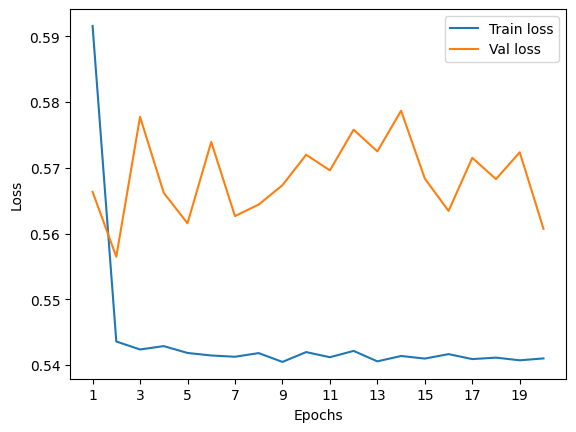

In [48]:
plot_loss(history)

#### ReLU

#### Learning rate = 1e-3

#### GAT - 10 particles, 100K jets

In [65]:
model = GAT(input_dims, [16,64,32,8], output_dims, activ_fn = ReLU())
model

GAT(
  (layers): ModuleList(
    (0-3): 4 x GATConv()
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=13, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [66]:
params = [p.numel() for p in model.parameters()]
sum(params)

5685

In [68]:
epochs=40
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:26,  4.39it/s]


Train Epoch: 0 	Loss: 0.667449, Accuracy: 35487/59922 (59%)
Val Epoch: 0 	Loss: 0.603639, Accuracy: 14506/19974 (73%)



118it [00:14,  8.07it/s]


Train Epoch: 1 	Loss: 0.547561, Accuracy: 44696/59922 (75%)
Val Epoch: 1 	Loss: 0.566227, Accuracy: 14313/19974 (72%)



118it [00:14,  8.05it/s]


Train Epoch: 2 	Loss: 0.520572, Accuracy: 45315/59922 (76%)
Val Epoch: 2 	Loss: 0.518335, Accuracy: 15130/19974 (76%)



118it [00:14,  8.14it/s]


Train Epoch: 3 	Loss: 0.507188, Accuracy: 45621/59922 (76%)
Val Epoch: 3 	Loss: 0.510732, Accuracy: 15130/19974 (76%)



118it [00:14,  8.15it/s]


Train Epoch: 4 	Loss: 0.507305, Accuracy: 45630/59922 (76%)
Val Epoch: 4 	Loss: 0.517316, Accuracy: 15189/19974 (76%)



118it [00:14,  8.16it/s]


Train Epoch: 5 	Loss: 0.504659, Accuracy: 45689/59922 (76%)
Val Epoch: 5 	Loss: 0.544935, Accuracy: 15046/19974 (75%)



118it [00:14,  8.14it/s]


Train Epoch: 6 	Loss: 0.500577, Accuracy: 45832/59922 (76%)
Val Epoch: 6 	Loss: 0.512888, Accuracy: 15244/19974 (76%)



118it [00:19,  6.19it/s]


Train Epoch: 7 	Loss: 0.500842, Accuracy: 45832/59922 (76%)
Val Epoch: 7 	Loss: 0.521648, Accuracy: 15060/19974 (75%)



118it [00:15,  7.70it/s]


Train Epoch: 8 	Loss: 0.497766, Accuracy: 45894/59922 (77%)
Val Epoch: 8 	Loss: 0.507320, Accuracy: 15273/19974 (76%)



118it [00:15,  7.47it/s]


Train Epoch: 9 	Loss: 0.494654, Accuracy: 46009/59922 (77%)
Val Epoch: 9 	Loss: 0.516129, Accuracy: 15296/19974 (77%)



118it [00:17,  6.88it/s]


Train Epoch: 10 	Loss: 0.496014, Accuracy: 45930/59922 (77%)
Val Epoch: 10 	Loss: 0.513497, Accuracy: 15340/19974 (77%)



118it [00:15,  7.45it/s]


Train Epoch: 11 	Loss: 0.494212, Accuracy: 46043/59922 (77%)
Val Epoch: 11 	Loss: 0.500330, Accuracy: 15330/19974 (77%)



118it [00:16,  7.24it/s]


Train Epoch: 12 	Loss: 0.493705, Accuracy: 46029/59922 (77%)
Val Epoch: 12 	Loss: 0.507305, Accuracy: 15211/19974 (76%)



118it [00:16,  7.17it/s]


Train Epoch: 13 	Loss: 0.491530, Accuracy: 46066/59922 (77%)
Val Epoch: 13 	Loss: 0.502019, Accuracy: 15359/19974 (77%)



118it [00:16,  7.17it/s]


Train Epoch: 14 	Loss: 0.493808, Accuracy: 46183/59922 (77%)
Val Epoch: 14 	Loss: 0.503899, Accuracy: 15395/19974 (77%)



118it [00:17,  6.61it/s]


Train Epoch: 15 	Loss: 0.494013, Accuracy: 46170/59922 (77%)
Val Epoch: 15 	Loss: 0.506023, Accuracy: 15359/19974 (77%)



118it [00:18,  6.33it/s]


Train Epoch: 16 	Loss: 0.489281, Accuracy: 46247/59922 (77%)
Val Epoch: 16 	Loss: 0.515008, Accuracy: 15175/19974 (76%)



118it [00:17,  6.86it/s]


Train Epoch: 17 	Loss: 0.491410, Accuracy: 46247/59922 (77%)
Val Epoch: 17 	Loss: 0.497316, Accuracy: 15373/19974 (77%)



118it [00:17,  6.75it/s]


Train Epoch: 18 	Loss: 0.488726, Accuracy: 46227/59922 (77%)
Val Epoch: 18 	Loss: 0.500057, Accuracy: 15360/19974 (77%)



118it [00:18,  6.34it/s]


Train Epoch: 19 	Loss: 0.491723, Accuracy: 46217/59922 (77%)
Val Epoch: 19 	Loss: 0.511402, Accuracy: 15367/19974 (77%)



118it [00:19,  6.15it/s]


Train Epoch: 20 	Loss: 0.490917, Accuracy: 46256/59922 (77%)
Val Epoch: 20 	Loss: 0.522280, Accuracy: 15060/19974 (75%)



118it [00:18,  6.45it/s]


Train Epoch: 21 	Loss: 0.490325, Accuracy: 46272/59922 (77%)
Val Epoch: 21 	Loss: 0.503332, Accuracy: 15379/19974 (77%)



118it [00:19,  6.18it/s]


Train Epoch: 22 	Loss: 0.488057, Accuracy: 46300/59922 (77%)
Val Epoch: 22 	Loss: 0.495416, Accuracy: 15394/19974 (77%)



118it [00:19,  6.02it/s]


Train Epoch: 23 	Loss: 0.487097, Accuracy: 46319/59922 (77%)
Val Epoch: 23 	Loss: 0.491629, Accuracy: 15366/19974 (77%)



118it [00:19,  6.08it/s]


Train Epoch: 24 	Loss: 0.486466, Accuracy: 46346/59922 (77%)
Val Epoch: 24 	Loss: 0.509145, Accuracy: 15359/19974 (77%)



118it [00:18,  6.31it/s]


Train Epoch: 25 	Loss: 0.488892, Accuracy: 46291/59922 (77%)
Val Epoch: 25 	Loss: 0.500297, Accuracy: 15427/19974 (77%)



118it [00:18,  6.27it/s]


Train Epoch: 26 	Loss: 0.488643, Accuracy: 46341/59922 (77%)
Val Epoch: 26 	Loss: 0.514147, Accuracy: 15124/19974 (76%)



118it [00:19,  6.18it/s]


Train Epoch: 27 	Loss: 0.487196, Accuracy: 46364/59922 (77%)
Val Epoch: 27 	Loss: 0.499564, Accuracy: 15394/19974 (77%)



118it [00:18,  6.26it/s]


Train Epoch: 28 	Loss: 0.489688, Accuracy: 46304/59922 (77%)
Val Epoch: 28 	Loss: 0.507836, Accuracy: 15407/19974 (77%)



118it [00:19,  6.05it/s]


Train Epoch: 29 	Loss: 0.485409, Accuracy: 46375/59922 (77%)
Val Epoch: 29 	Loss: 0.502866, Accuracy: 15386/19974 (77%)



118it [00:19,  6.01it/s]


Train Epoch: 30 	Loss: 0.486820, Accuracy: 46380/59922 (77%)
Val Epoch: 30 	Loss: 0.491076, Accuracy: 15388/19974 (77%)



118it [00:18,  6.21it/s]


Train Epoch: 31 	Loss: 0.486551, Accuracy: 46369/59922 (77%)
Val Epoch: 31 	Loss: 0.502887, Accuracy: 15379/19974 (77%)



118it [00:19,  6.01it/s]


Train Epoch: 32 	Loss: 0.486972, Accuracy: 46371/59922 (77%)
Val Epoch: 32 	Loss: 0.499841, Accuracy: 15436/19974 (77%)



118it [00:18,  6.26it/s]


Train Epoch: 33 	Loss: 0.486891, Accuracy: 46456/59922 (78%)
Val Epoch: 33 	Loss: 0.494429, Accuracy: 15436/19974 (77%)



118it [00:19,  6.07it/s]


Train Epoch: 34 	Loss: 0.486079, Accuracy: 46398/59922 (77%)
Val Epoch: 34 	Loss: 0.505342, Accuracy: 15435/19974 (77%)



118it [00:19,  6.21it/s]


Train Epoch: 35 	Loss: 0.485376, Accuracy: 46416/59922 (77%)
Val Epoch: 35 	Loss: 0.508934, Accuracy: 15465/19974 (77%)



118it [00:19,  6.20it/s]


Train Epoch: 36 	Loss: 0.488396, Accuracy: 46359/59922 (77%)
Val Epoch: 36 	Loss: 0.492843, Accuracy: 15420/19974 (77%)



118it [00:19,  6.14it/s]


Train Epoch: 37 	Loss: 0.487004, Accuracy: 46486/59922 (78%)
Val Epoch: 37 	Loss: 0.505298, Accuracy: 15401/19974 (77%)



118it [00:19,  6.19it/s]


Train Epoch: 38 	Loss: 0.484638, Accuracy: 46419/59922 (77%)
Val Epoch: 38 	Loss: 0.494623, Accuracy: 15432/19974 (77%)



118it [00:19,  6.06it/s]


Train Epoch: 39 	Loss: 0.483922, Accuracy: 46455/59922 (78%)
Val Epoch: 39 	Loss: 0.519864, Accuracy: 15426/19974 (77%)



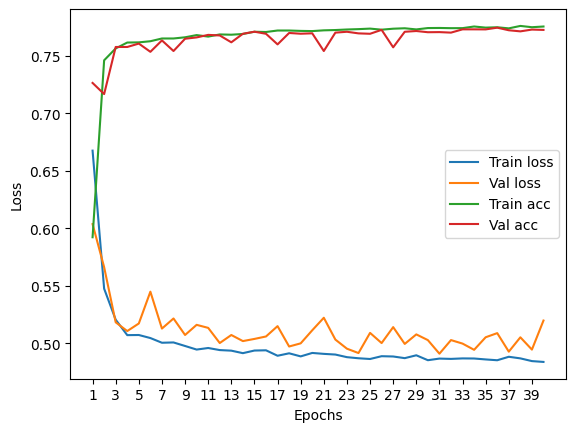

In [69]:
plot_loss(history)

Test accuracy:  77.35055572243917


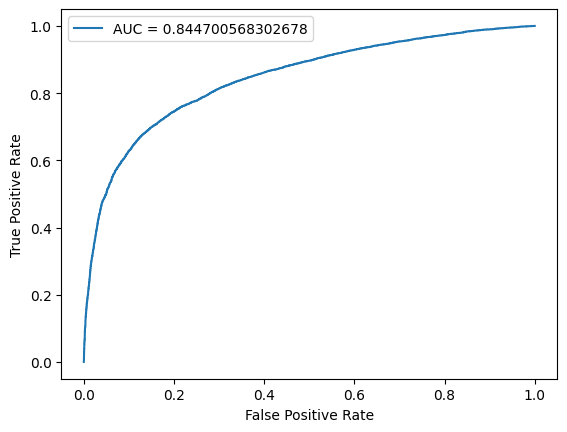

In [70]:
plot_auc(best_model, test_dataloader)

#### GAT - 5 particles, 100K jets

In [201]:
model = GAT(input_dims, hidden_dims, output_dims, activ_fn = ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv()
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=13, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [202]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

469it [00:15, 30.14it/s]


Train Epoch: 0 	Loss: 0.593454, Accuracy: 41036/59922 (68%)
Val Epoch: 0 	Loss: 0.511918, Accuracy: 15249/19974 (76%)



469it [00:11, 39.24it/s]


Train Epoch: 1 	Loss: 0.501457, Accuracy: 45643/59922 (76%)
Val Epoch: 1 	Loss: 0.494741, Accuracy: 15386/19974 (77%)



469it [00:12, 36.59it/s]


Train Epoch: 2 	Loss: 0.492025, Accuracy: 46074/59922 (77%)
Val Epoch: 2 	Loss: 0.488706, Accuracy: 15381/19974 (77%)



469it [00:10, 43.30it/s]


Train Epoch: 3 	Loss: 0.489537, Accuracy: 46223/59922 (77%)
Val Epoch: 3 	Loss: 0.486814, Accuracy: 15482/19974 (78%)



469it [00:10, 45.87it/s]


Train Epoch: 4 	Loss: 0.488109, Accuracy: 46315/59922 (77%)
Val Epoch: 4 	Loss: 0.486803, Accuracy: 15513/19974 (78%)



469it [00:10, 44.45it/s]


Train Epoch: 5 	Loss: 0.485624, Accuracy: 46377/59922 (77%)
Val Epoch: 5 	Loss: 0.483945, Accuracy: 15531/19974 (78%)



469it [00:11, 40.43it/s]


Train Epoch: 6 	Loss: 0.485114, Accuracy: 46389/59922 (77%)
Val Epoch: 6 	Loss: 0.484783, Accuracy: 15474/19974 (77%)



469it [00:11, 41.37it/s]


Train Epoch: 7 	Loss: 0.484587, Accuracy: 46398/59922 (77%)
Val Epoch: 7 	Loss: 0.480830, Accuracy: 15526/19974 (78%)



469it [00:13, 35.97it/s]


Train Epoch: 8 	Loss: 0.483739, Accuracy: 46445/59922 (78%)
Val Epoch: 8 	Loss: 0.487649, Accuracy: 15469/19974 (77%)



469it [00:11, 41.76it/s]


Train Epoch: 9 	Loss: 0.483959, Accuracy: 46436/59922 (77%)
Val Epoch: 9 	Loss: 0.484038, Accuracy: 15530/19974 (78%)



469it [00:10, 46.21it/s]


Train Epoch: 10 	Loss: 0.483400, Accuracy: 46422/59922 (77%)
Val Epoch: 10 	Loss: 0.482129, Accuracy: 15547/19974 (78%)



469it [00:10, 44.80it/s]


Train Epoch: 11 	Loss: 0.483329, Accuracy: 46442/59922 (78%)
Val Epoch: 11 	Loss: 0.484519, Accuracy: 15520/19974 (78%)



469it [00:10, 42.85it/s]


Train Epoch: 12 	Loss: 0.483296, Accuracy: 46431/59922 (77%)
Val Epoch: 12 	Loss: 0.481695, Accuracy: 15528/19974 (78%)



469it [00:11, 40.35it/s]


Train Epoch: 13 	Loss: 0.482620, Accuracy: 46468/59922 (78%)
Val Epoch: 13 	Loss: 0.480197, Accuracy: 15554/19974 (78%)



469it [00:10, 43.12it/s]


Train Epoch: 14 	Loss: 0.482641, Accuracy: 46492/59922 (78%)
Val Epoch: 14 	Loss: 0.482147, Accuracy: 15554/19974 (78%)



469it [00:12, 36.54it/s]


Train Epoch: 15 	Loss: 0.482518, Accuracy: 46477/59922 (78%)
Val Epoch: 15 	Loss: 0.481192, Accuracy: 15514/19974 (78%)



469it [00:11, 40.96it/s]


Train Epoch: 16 	Loss: 0.481907, Accuracy: 46481/59922 (78%)
Val Epoch: 16 	Loss: 0.479777, Accuracy: 15575/19974 (78%)



469it [00:09, 51.09it/s]


Train Epoch: 17 	Loss: 0.481973, Accuracy: 46442/59922 (78%)
Val Epoch: 17 	Loss: 0.479437, Accuracy: 15564/19974 (78%)



469it [00:10, 44.16it/s]


Train Epoch: 18 	Loss: 0.482329, Accuracy: 46474/59922 (78%)
Val Epoch: 18 	Loss: 0.479981, Accuracy: 15561/19974 (78%)



469it [00:10, 45.09it/s]


Train Epoch: 19 	Loss: 0.480947, Accuracy: 46510/59922 (78%)
Val Epoch: 19 	Loss: 0.479584, Accuracy: 15579/19974 (78%)



469it [00:11, 40.90it/s]


Train Epoch: 20 	Loss: 0.481531, Accuracy: 46488/59922 (78%)
Val Epoch: 20 	Loss: 0.478880, Accuracy: 15560/19974 (78%)



469it [00:10, 45.78it/s]


Train Epoch: 21 	Loss: 0.481424, Accuracy: 46484/59922 (78%)
Val Epoch: 21 	Loss: 0.478792, Accuracy: 15574/19974 (78%)



469it [00:09, 49.34it/s]


Train Epoch: 22 	Loss: 0.480882, Accuracy: 46527/59922 (78%)
Val Epoch: 22 	Loss: 0.479212, Accuracy: 15567/19974 (78%)



469it [00:10, 46.61it/s]


Train Epoch: 23 	Loss: 0.480637, Accuracy: 46506/59922 (78%)
Val Epoch: 23 	Loss: 0.481734, Accuracy: 15547/19974 (78%)



469it [00:11, 41.55it/s]


Train Epoch: 24 	Loss: 0.480069, Accuracy: 46504/59922 (78%)
Val Epoch: 24 	Loss: 0.480132, Accuracy: 15492/19974 (78%)



469it [00:11, 42.40it/s]


Train Epoch: 25 	Loss: 0.480067, Accuracy: 46548/59922 (78%)
Val Epoch: 25 	Loss: 0.488053, Accuracy: 15480/19974 (78%)



469it [00:10, 43.52it/s]


Train Epoch: 26 	Loss: 0.479883, Accuracy: 46573/59922 (78%)
Val Epoch: 26 	Loss: 0.482287, Accuracy: 15555/19974 (78%)



469it [00:09, 49.10it/s]


Train Epoch: 27 	Loss: 0.479721, Accuracy: 46604/59922 (78%)
Val Epoch: 27 	Loss: 0.478550, Accuracy: 15582/19974 (78%)



469it [00:09, 47.96it/s]


Train Epoch: 28 	Loss: 0.479028, Accuracy: 46597/59922 (78%)
Val Epoch: 28 	Loss: 0.478029, Accuracy: 15577/19974 (78%)



469it [00:10, 42.70it/s]


Train Epoch: 29 	Loss: 0.479850, Accuracy: 46633/59922 (78%)
Val Epoch: 29 	Loss: 0.478646, Accuracy: 15580/19974 (78%)



469it [00:10, 45.15it/s]


Train Epoch: 30 	Loss: 0.479176, Accuracy: 46581/59922 (78%)
Val Epoch: 30 	Loss: 0.477587, Accuracy: 15587/19974 (78%)



469it [00:09, 47.03it/s]


Train Epoch: 31 	Loss: 0.479106, Accuracy: 46594/59922 (78%)
Val Epoch: 31 	Loss: 0.481188, Accuracy: 15605/19974 (78%)



469it [00:09, 49.86it/s]


Train Epoch: 32 	Loss: 0.479598, Accuracy: 46624/59922 (78%)
Val Epoch: 32 	Loss: 0.478496, Accuracy: 15571/19974 (78%)



469it [00:11, 42.13it/s]


Train Epoch: 33 	Loss: 0.478820, Accuracy: 46593/59922 (78%)
Val Epoch: 33 	Loss: 0.478664, Accuracy: 15598/19974 (78%)



469it [00:10, 44.59it/s]


Train Epoch: 34 	Loss: 0.478447, Accuracy: 46628/59922 (78%)
Val Epoch: 34 	Loss: 0.476547, Accuracy: 15604/19974 (78%)



469it [00:12, 37.50it/s]


Train Epoch: 35 	Loss: 0.478249, Accuracy: 46655/59922 (78%)
Val Epoch: 35 	Loss: 0.476389, Accuracy: 15607/19974 (78%)



469it [00:10, 43.82it/s]


Train Epoch: 36 	Loss: 0.478262, Accuracy: 46619/59922 (78%)
Val Epoch: 36 	Loss: 0.477230, Accuracy: 15564/19974 (78%)



469it [00:09, 50.47it/s]


Train Epoch: 37 	Loss: 0.477781, Accuracy: 46646/59922 (78%)
Val Epoch: 37 	Loss: 0.478665, Accuracy: 15597/19974 (78%)



469it [00:09, 50.22it/s]


Train Epoch: 38 	Loss: 0.477608, Accuracy: 46648/59922 (78%)
Val Epoch: 38 	Loss: 0.478088, Accuracy: 15603/19974 (78%)



469it [00:10, 43.48it/s]


Train Epoch: 39 	Loss: 0.477868, Accuracy: 46656/59922 (78%)
Val Epoch: 39 	Loss: 0.484371, Accuracy: 15583/19974 (78%)



469it [00:10, 45.18it/s]


Train Epoch: 40 	Loss: 0.477929, Accuracy: 46656/59922 (78%)
Val Epoch: 40 	Loss: 0.475588, Accuracy: 15598/19974 (78%)



469it [00:09, 47.80it/s]


Train Epoch: 41 	Loss: 0.477631, Accuracy: 46653/59922 (78%)
Val Epoch: 41 	Loss: 0.479266, Accuracy: 15587/19974 (78%)



469it [00:11, 40.33it/s]


Train Epoch: 42 	Loss: 0.477321, Accuracy: 46675/59922 (78%)
Val Epoch: 42 	Loss: 0.476177, Accuracy: 15611/19974 (78%)



469it [00:09, 49.68it/s]


Train Epoch: 43 	Loss: 0.477305, Accuracy: 46680/59922 (78%)
Val Epoch: 43 	Loss: 0.476288, Accuracy: 15599/19974 (78%)



469it [00:10, 44.60it/s]


Train Epoch: 44 	Loss: 0.476925, Accuracy: 46707/59922 (78%)
Val Epoch: 44 	Loss: 0.476707, Accuracy: 15601/19974 (78%)



469it [00:10, 45.79it/s]


Train Epoch: 45 	Loss: 0.476983, Accuracy: 46693/59922 (78%)
Val Epoch: 45 	Loss: 0.478389, Accuracy: 15613/19974 (78%)



469it [00:10, 46.39it/s]


Train Epoch: 46 	Loss: 0.476958, Accuracy: 46698/59922 (78%)
Val Epoch: 46 	Loss: 0.476618, Accuracy: 15602/19974 (78%)



469it [00:09, 49.39it/s]


Train Epoch: 47 	Loss: 0.476263, Accuracy: 46707/59922 (78%)
Val Epoch: 47 	Loss: 0.476734, Accuracy: 15613/19974 (78%)



469it [00:10, 43.75it/s]


Train Epoch: 48 	Loss: 0.476682, Accuracy: 46689/59922 (78%)
Val Epoch: 48 	Loss: 0.478507, Accuracy: 15631/19974 (78%)



469it [00:11, 39.94it/s]


Train Epoch: 49 	Loss: 0.476237, Accuracy: 46738/59922 (78%)
Val Epoch: 49 	Loss: 0.473805, Accuracy: 15630/19974 (78%)



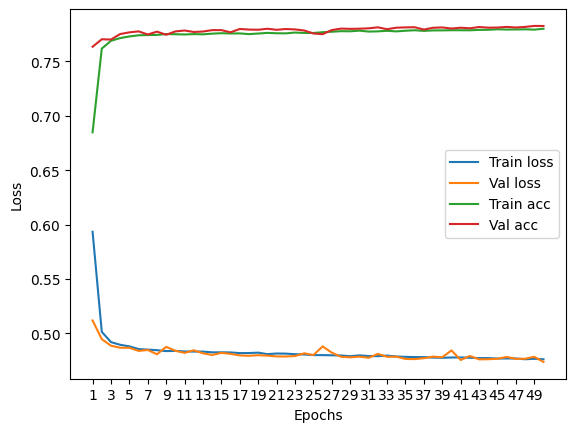

In [203]:
plot_loss(history)

Test accuracy:  77.1102433163112


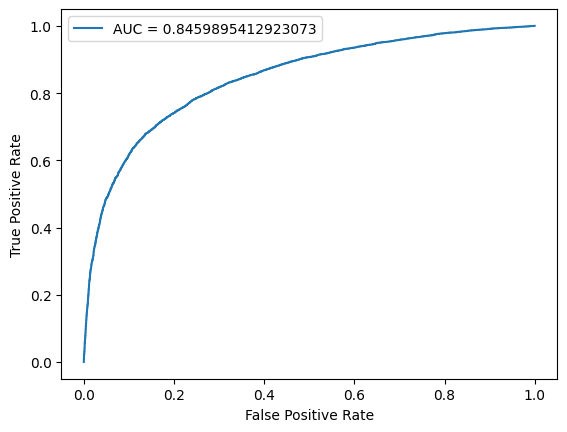

In [204]:
plot_auc(best_model, test_dataloader)

### 12500 jets

#### GAT - 10 particles

In [124]:
model = GAT(input_dims, hidden_dims, output_dims, activ_fn = ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv(8, 8, heads=1)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=13, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [125]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:04, 28.24it/s]


Train Epoch: 0 	Loss: 0.688426, Accuracy: 4032/7500 (54%)
Val Epoch: 0 	Loss: 0.687524, Accuracy: 1782/2500 (71%)



118it [00:03, 32.20it/s]


Train Epoch: 1 	Loss: 0.656635, Accuracy: 5499/7500 (73%)
Val Epoch: 1 	Loss: 0.646667, Accuracy: 1865/2500 (75%)



118it [00:03, 36.55it/s]


Train Epoch: 2 	Loss: 0.610672, Accuracy: 5572/7500 (74%)
Val Epoch: 2 	Loss: 0.595499, Accuracy: 1888/2500 (76%)



118it [00:02, 43.36it/s]


Train Epoch: 3 	Loss: 0.564910, Accuracy: 5652/7500 (75%)
Val Epoch: 3 	Loss: 0.553105, Accuracy: 1909/2500 (76%)



118it [00:02, 49.49it/s]


Train Epoch: 4 	Loss: 0.526771, Accuracy: 5697/7500 (76%)
Val Epoch: 4 	Loss: 0.531003, Accuracy: 1871/2500 (75%)



118it [00:02, 51.29it/s]


Train Epoch: 5 	Loss: 0.504602, Accuracy: 5745/7500 (77%)
Val Epoch: 5 	Loss: 0.510561, Accuracy: 1923/2500 (77%)



118it [00:02, 53.04it/s]


Train Epoch: 6 	Loss: 0.492232, Accuracy: 5770/7500 (77%)
Val Epoch: 6 	Loss: 0.496162, Accuracy: 1931/2500 (77%)



118it [00:02, 52.95it/s]


Train Epoch: 7 	Loss: 0.489387, Accuracy: 5807/7500 (77%)
Val Epoch: 7 	Loss: 0.500207, Accuracy: 1939/2500 (78%)



118it [00:03, 33.10it/s]


Train Epoch: 8 	Loss: 0.487921, Accuracy: 5819/7500 (78%)
Val Epoch: 8 	Loss: 0.503614, Accuracy: 1935/2500 (77%)



118it [00:02, 52.85it/s]


Train Epoch: 9 	Loss: 0.487927, Accuracy: 5815/7500 (78%)
Val Epoch: 9 	Loss: 0.500783, Accuracy: 1932/2500 (77%)



118it [00:02, 58.24it/s]


Train Epoch: 10 	Loss: 0.485481, Accuracy: 5824/7500 (78%)
Val Epoch: 10 	Loss: 0.493018, Accuracy: 1950/2500 (78%)



118it [00:02, 56.73it/s]


Train Epoch: 11 	Loss: 0.488424, Accuracy: 5823/7500 (78%)
Val Epoch: 11 	Loss: 0.503358, Accuracy: 1935/2500 (77%)



118it [00:02, 57.42it/s]


Train Epoch: 12 	Loss: 0.486215, Accuracy: 5834/7500 (78%)
Val Epoch: 12 	Loss: 0.501049, Accuracy: 1945/2500 (78%)



118it [00:03, 34.88it/s]


Train Epoch: 13 	Loss: 0.483019, Accuracy: 5844/7500 (78%)
Val Epoch: 13 	Loss: 0.492601, Accuracy: 1949/2500 (78%)



118it [00:03, 39.06it/s]


Train Epoch: 14 	Loss: 0.485027, Accuracy: 5842/7500 (78%)
Val Epoch: 14 	Loss: 0.503969, Accuracy: 1938/2500 (78%)



118it [00:03, 37.91it/s]


Train Epoch: 15 	Loss: 0.485592, Accuracy: 5832/7500 (78%)
Val Epoch: 15 	Loss: 0.496838, Accuracy: 1943/2500 (78%)



118it [00:02, 42.93it/s]


Train Epoch: 16 	Loss: 0.482507, Accuracy: 5836/7500 (78%)
Val Epoch: 16 	Loss: 0.491012, Accuracy: 1940/2500 (78%)



118it [00:02, 42.14it/s]


Train Epoch: 17 	Loss: 0.487678, Accuracy: 5842/7500 (78%)
Val Epoch: 17 	Loss: 0.505556, Accuracy: 1942/2500 (78%)



118it [00:03, 31.97it/s]


Train Epoch: 18 	Loss: 0.482615, Accuracy: 5836/7500 (78%)
Val Epoch: 18 	Loss: 0.504993, Accuracy: 1942/2500 (78%)



118it [00:03, 33.76it/s]


Train Epoch: 19 	Loss: 0.483824, Accuracy: 5838/7500 (78%)
Val Epoch: 19 	Loss: 0.489206, Accuracy: 1937/2500 (77%)



118it [00:03, 35.62it/s]


Train Epoch: 20 	Loss: 0.480966, Accuracy: 5861/7500 (78%)
Val Epoch: 20 	Loss: 0.492935, Accuracy: 1937/2500 (77%)



118it [00:03, 31.64it/s]


Train Epoch: 21 	Loss: 0.482022, Accuracy: 5844/7500 (78%)
Val Epoch: 21 	Loss: 0.501686, Accuracy: 1937/2500 (77%)



118it [00:03, 36.24it/s]


Train Epoch: 22 	Loss: 0.481535, Accuracy: 5837/7500 (78%)
Val Epoch: 22 	Loss: 0.492529, Accuracy: 1953/2500 (78%)



118it [00:03, 35.38it/s]


Train Epoch: 23 	Loss: 0.482526, Accuracy: 5848/7500 (78%)
Val Epoch: 23 	Loss: 0.501781, Accuracy: 1944/2500 (78%)



118it [00:02, 44.93it/s]


Train Epoch: 24 	Loss: 0.481925, Accuracy: 5859/7500 (78%)
Val Epoch: 24 	Loss: 0.506641, Accuracy: 1940/2500 (78%)



118it [00:02, 46.48it/s]


Train Epoch: 25 	Loss: 0.480609, Accuracy: 5853/7500 (78%)
Val Epoch: 25 	Loss: 0.503260, Accuracy: 1939/2500 (78%)



118it [00:03, 36.31it/s]


Train Epoch: 26 	Loss: 0.481553, Accuracy: 5857/7500 (78%)
Val Epoch: 26 	Loss: 0.494752, Accuracy: 1942/2500 (78%)



118it [00:03, 38.21it/s]


Train Epoch: 27 	Loss: 0.480701, Accuracy: 5852/7500 (78%)
Val Epoch: 27 	Loss: 0.487926, Accuracy: 1940/2500 (78%)



118it [00:02, 40.29it/s]


Train Epoch: 28 	Loss: 0.482475, Accuracy: 5851/7500 (78%)
Val Epoch: 28 	Loss: 0.495372, Accuracy: 1939/2500 (78%)



118it [00:02, 55.07it/s]


Train Epoch: 29 	Loss: 0.480450, Accuracy: 5853/7500 (78%)
Val Epoch: 29 	Loss: 0.493961, Accuracy: 1944/2500 (78%)



118it [00:03, 35.85it/s]


Train Epoch: 30 	Loss: 0.479839, Accuracy: 5854/7500 (78%)
Val Epoch: 30 	Loss: 0.501342, Accuracy: 1940/2500 (78%)



118it [00:02, 44.28it/s]


Train Epoch: 31 	Loss: 0.480699, Accuracy: 5861/7500 (78%)
Val Epoch: 31 	Loss: 0.496668, Accuracy: 1952/2500 (78%)



118it [00:02, 50.46it/s]


Train Epoch: 32 	Loss: 0.480084, Accuracy: 5845/7500 (78%)
Val Epoch: 32 	Loss: 0.489553, Accuracy: 1942/2500 (78%)



118it [00:02, 43.05it/s]


Train Epoch: 33 	Loss: 0.482369, Accuracy: 5844/7500 (78%)
Val Epoch: 33 	Loss: 0.505461, Accuracy: 1941/2500 (78%)



118it [00:03, 35.83it/s]


Train Epoch: 34 	Loss: 0.481519, Accuracy: 5862/7500 (78%)
Val Epoch: 34 	Loss: 0.492582, Accuracy: 1938/2500 (78%)



118it [00:03, 37.03it/s]


Train Epoch: 35 	Loss: 0.481051, Accuracy: 5869/7500 (78%)
Val Epoch: 35 	Loss: 0.497970, Accuracy: 1945/2500 (78%)



118it [00:02, 52.48it/s]


Train Epoch: 36 	Loss: 0.480538, Accuracy: 5861/7500 (78%)
Val Epoch: 36 	Loss: 0.500720, Accuracy: 1956/2500 (78%)



118it [00:02, 48.72it/s]


Train Epoch: 37 	Loss: 0.480469, Accuracy: 5857/7500 (78%)
Val Epoch: 37 	Loss: 0.491676, Accuracy: 1942/2500 (78%)



118it [00:02, 47.18it/s]


Train Epoch: 38 	Loss: 0.480359, Accuracy: 5850/7500 (78%)
Val Epoch: 38 	Loss: 0.488986, Accuracy: 1944/2500 (78%)



118it [00:04, 28.55it/s]


Train Epoch: 39 	Loss: 0.478283, Accuracy: 5854/7500 (78%)
Val Epoch: 39 	Loss: 0.494422, Accuracy: 1940/2500 (78%)



118it [00:03, 36.68it/s]


Train Epoch: 40 	Loss: 0.479908, Accuracy: 5870/7500 (78%)
Val Epoch: 40 	Loss: 0.505174, Accuracy: 1948/2500 (78%)



118it [00:03, 38.62it/s]


Train Epoch: 41 	Loss: 0.482103, Accuracy: 5853/7500 (78%)
Val Epoch: 41 	Loss: 0.502032, Accuracy: 1941/2500 (78%)



118it [00:02, 45.28it/s]


Train Epoch: 42 	Loss: 0.480707, Accuracy: 5841/7500 (78%)
Val Epoch: 42 	Loss: 0.488177, Accuracy: 1940/2500 (78%)



118it [00:02, 46.24it/s]


Train Epoch: 43 	Loss: 0.479599, Accuracy: 5862/7500 (78%)
Val Epoch: 43 	Loss: 0.506202, Accuracy: 1940/2500 (78%)



118it [00:02, 42.93it/s]


Train Epoch: 44 	Loss: 0.478715, Accuracy: 5851/7500 (78%)
Val Epoch: 44 	Loss: 0.489676, Accuracy: 1949/2500 (78%)



118it [00:02, 39.75it/s]


Train Epoch: 45 	Loss: 0.478007, Accuracy: 5850/7500 (78%)
Val Epoch: 45 	Loss: 0.489885, Accuracy: 1937/2500 (77%)



118it [00:03, 35.15it/s]


Train Epoch: 46 	Loss: 0.480013, Accuracy: 5867/7500 (78%)
Val Epoch: 46 	Loss: 0.499516, Accuracy: 1945/2500 (78%)



118it [00:03, 35.92it/s]


Train Epoch: 47 	Loss: 0.481666, Accuracy: 5858/7500 (78%)
Val Epoch: 47 	Loss: 0.487498, Accuracy: 1947/2500 (78%)



118it [00:03, 29.93it/s]


Train Epoch: 48 	Loss: 0.478758, Accuracy: 5858/7500 (78%)
Val Epoch: 48 	Loss: 0.487396, Accuracy: 1949/2500 (78%)



118it [00:03, 31.34it/s]


Train Epoch: 49 	Loss: 0.479468, Accuracy: 5852/7500 (78%)
Val Epoch: 49 	Loss: 0.490164, Accuracy: 1940/2500 (78%)



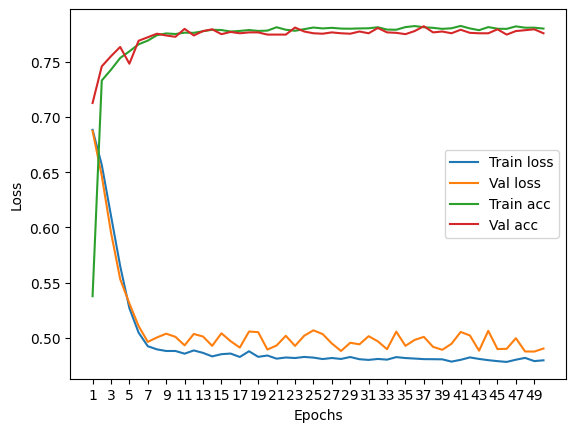

In [126]:
plot_loss(history)

Test accuracy:  77.44


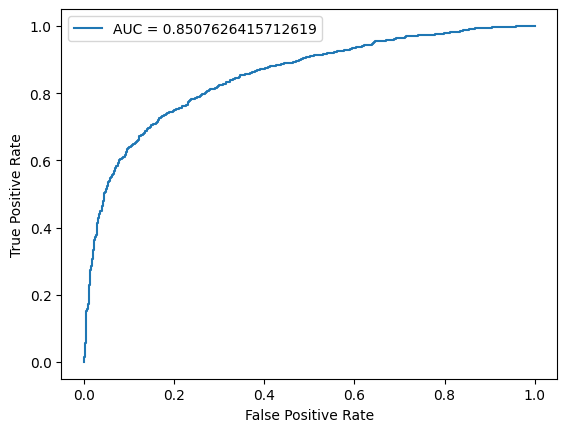

In [127]:
plot_auc(best_model, test_dataloader)

#### GAT  - 5 particles

In [183]:
model = GAT(input_dims, hidden_dims, output_dims, activ_fn = ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv()
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=13, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [192]:
a = [p.numel() for p in model.parameters()]
a, sum(a)

([8, 64, 128, 8, 8, 1, 8, 64, 128, 8, 8, 1, 104, 8, 8, 1], 555)

In [184]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:03, 32.00it/s]


Train Epoch: 0 	Loss: 0.689170, Accuracy: 4112/7500 (55%)
Val Epoch: 0 	Loss: 0.685667, Accuracy: 1700/2500 (68%)



118it [00:03, 34.47it/s]


Train Epoch: 1 	Loss: 0.646882, Accuracy: 5291/7500 (71%)
Val Epoch: 1 	Loss: 0.614530, Accuracy: 1821/2500 (73%)



118it [00:03, 35.22it/s]


Train Epoch: 2 	Loss: 0.568522, Accuracy: 5503/7500 (73%)
Val Epoch: 2 	Loss: 0.539608, Accuracy: 1886/2500 (75%)



118it [00:03, 35.02it/s]


Train Epoch: 3 	Loss: 0.517663, Accuracy: 5698/7500 (76%)
Val Epoch: 3 	Loss: 0.505540, Accuracy: 1911/2500 (76%)



118it [00:03, 34.60it/s]


Train Epoch: 4 	Loss: 0.507442, Accuracy: 5749/7500 (77%)
Val Epoch: 4 	Loss: 0.514318, Accuracy: 1913/2500 (77%)



118it [00:03, 34.60it/s]


Train Epoch: 5 	Loss: 0.502780, Accuracy: 5739/7500 (77%)
Val Epoch: 5 	Loss: 0.495243, Accuracy: 1945/2500 (78%)



118it [00:03, 36.85it/s]


Train Epoch: 6 	Loss: 0.499381, Accuracy: 5759/7500 (77%)
Val Epoch: 6 	Loss: 0.492394, Accuracy: 1950/2500 (78%)



118it [00:03, 34.16it/s]


Train Epoch: 7 	Loss: 0.495404, Accuracy: 5783/7500 (77%)
Val Epoch: 7 	Loss: 0.493514, Accuracy: 1948/2500 (78%)



118it [00:03, 34.66it/s]


Train Epoch: 8 	Loss: 0.496721, Accuracy: 5793/7500 (77%)
Val Epoch: 8 	Loss: 0.493759, Accuracy: 1944/2500 (78%)



118it [00:03, 34.34it/s]


Train Epoch: 9 	Loss: 0.494793, Accuracy: 5802/7500 (77%)
Val Epoch: 9 	Loss: 0.483226, Accuracy: 1948/2500 (78%)



118it [00:03, 37.47it/s]


Train Epoch: 10 	Loss: 0.491938, Accuracy: 5820/7500 (78%)
Val Epoch: 10 	Loss: 0.488105, Accuracy: 1939/2500 (78%)



118it [00:03, 35.09it/s]


Train Epoch: 11 	Loss: 0.493290, Accuracy: 5787/7500 (77%)
Val Epoch: 11 	Loss: 0.488451, Accuracy: 1955/2500 (78%)



118it [00:03, 34.77it/s]


Train Epoch: 12 	Loss: 0.491176, Accuracy: 5783/7500 (77%)
Val Epoch: 12 	Loss: 0.487962, Accuracy: 1949/2500 (78%)



118it [00:03, 35.72it/s]


Train Epoch: 13 	Loss: 0.493185, Accuracy: 5807/7500 (77%)
Val Epoch: 13 	Loss: 0.489678, Accuracy: 1945/2500 (78%)



118it [00:03, 36.63it/s]


Train Epoch: 14 	Loss: 0.493545, Accuracy: 5791/7500 (77%)
Val Epoch: 14 	Loss: 0.481368, Accuracy: 1957/2500 (78%)



118it [00:03, 34.26it/s]


Train Epoch: 15 	Loss: 0.492376, Accuracy: 5803/7500 (77%)
Val Epoch: 15 	Loss: 0.500625, Accuracy: 1919/2500 (77%)



118it [00:03, 31.83it/s]


Train Epoch: 16 	Loss: 0.493185, Accuracy: 5781/7500 (77%)
Val Epoch: 16 	Loss: 0.492298, Accuracy: 1938/2500 (78%)



118it [00:03, 37.16it/s]


Train Epoch: 17 	Loss: 0.488112, Accuracy: 5822/7500 (78%)
Val Epoch: 17 	Loss: 0.483361, Accuracy: 1954/2500 (78%)



118it [00:03, 36.60it/s]


Train Epoch: 18 	Loss: 0.488647, Accuracy: 5810/7500 (77%)
Val Epoch: 18 	Loss: 0.485180, Accuracy: 1954/2500 (78%)



118it [00:03, 35.11it/s]


Train Epoch: 19 	Loss: 0.487701, Accuracy: 5827/7500 (78%)
Val Epoch: 19 	Loss: 0.477356, Accuracy: 1953/2500 (78%)



118it [00:03, 34.84it/s]


Train Epoch: 20 	Loss: 0.488873, Accuracy: 5806/7500 (77%)
Val Epoch: 20 	Loss: 0.480046, Accuracy: 1960/2500 (78%)



118it [00:03, 34.45it/s]


Train Epoch: 21 	Loss: 0.488319, Accuracy: 5818/7500 (78%)
Val Epoch: 21 	Loss: 0.479239, Accuracy: 1955/2500 (78%)



118it [00:03, 38.13it/s]


Train Epoch: 22 	Loss: 0.486681, Accuracy: 5806/7500 (77%)
Val Epoch: 22 	Loss: 0.489913, Accuracy: 1946/2500 (78%)



118it [00:03, 35.54it/s]


Train Epoch: 23 	Loss: 0.489032, Accuracy: 5826/7500 (78%)
Val Epoch: 23 	Loss: 0.490409, Accuracy: 1957/2500 (78%)



118it [00:03, 35.35it/s]


Train Epoch: 24 	Loss: 0.486277, Accuracy: 5807/7500 (77%)
Val Epoch: 24 	Loss: 0.481037, Accuracy: 1953/2500 (78%)



118it [00:03, 35.28it/s]


Train Epoch: 25 	Loss: 0.486414, Accuracy: 5825/7500 (78%)
Val Epoch: 25 	Loss: 0.483361, Accuracy: 1959/2500 (78%)



118it [00:03, 38.07it/s]


Train Epoch: 26 	Loss: 0.488369, Accuracy: 5827/7500 (78%)
Val Epoch: 26 	Loss: 0.476525, Accuracy: 1953/2500 (78%)



118it [00:03, 35.76it/s]


Train Epoch: 27 	Loss: 0.484563, Accuracy: 5825/7500 (78%)
Val Epoch: 27 	Loss: 0.481018, Accuracy: 1945/2500 (78%)



118it [00:03, 35.53it/s]


Train Epoch: 28 	Loss: 0.486545, Accuracy: 5831/7500 (78%)
Val Epoch: 28 	Loss: 0.486239, Accuracy: 1961/2500 (78%)



118it [00:03, 36.32it/s]


Train Epoch: 29 	Loss: 0.484192, Accuracy: 5844/7500 (78%)
Val Epoch: 29 	Loss: 0.482958, Accuracy: 1949/2500 (78%)



118it [00:03, 37.09it/s]


Train Epoch: 30 	Loss: 0.484345, Accuracy: 5860/7500 (78%)
Val Epoch: 30 	Loss: 0.483469, Accuracy: 1959/2500 (78%)



118it [00:03, 33.72it/s]


Train Epoch: 31 	Loss: 0.484213, Accuracy: 5818/7500 (78%)
Val Epoch: 31 	Loss: 0.479332, Accuracy: 1958/2500 (78%)



118it [00:03, 34.35it/s]


Train Epoch: 32 	Loss: 0.484752, Accuracy: 5824/7500 (78%)
Val Epoch: 32 	Loss: 0.477012, Accuracy: 1952/2500 (78%)



118it [00:03, 34.95it/s]


Train Epoch: 33 	Loss: 0.482090, Accuracy: 5833/7500 (78%)
Val Epoch: 33 	Loss: 0.481076, Accuracy: 1959/2500 (78%)



118it [00:03, 36.61it/s]


Train Epoch: 34 	Loss: 0.482197, Accuracy: 5831/7500 (78%)
Val Epoch: 34 	Loss: 0.479018, Accuracy: 1956/2500 (78%)



118it [00:03, 34.33it/s]


Train Epoch: 35 	Loss: 0.482550, Accuracy: 5838/7500 (78%)
Val Epoch: 35 	Loss: 0.475977, Accuracy: 1958/2500 (78%)



118it [00:03, 35.40it/s]


Train Epoch: 36 	Loss: 0.485274, Accuracy: 5848/7500 (78%)
Val Epoch: 36 	Loss: 0.476509, Accuracy: 1959/2500 (78%)



118it [00:03, 35.34it/s]


Train Epoch: 37 	Loss: 0.482224, Accuracy: 5829/7500 (78%)
Val Epoch: 37 	Loss: 0.479090, Accuracy: 1957/2500 (78%)



118it [00:03, 36.41it/s]


Train Epoch: 38 	Loss: 0.481539, Accuracy: 5852/7500 (78%)
Val Epoch: 38 	Loss: 0.479214, Accuracy: 1943/2500 (78%)



118it [00:03, 35.63it/s]


Train Epoch: 39 	Loss: 0.481976, Accuracy: 5843/7500 (78%)
Val Epoch: 39 	Loss: 0.472808, Accuracy: 1964/2500 (79%)



118it [00:03, 35.69it/s]


Train Epoch: 40 	Loss: 0.482561, Accuracy: 5846/7500 (78%)
Val Epoch: 40 	Loss: 0.473582, Accuracy: 1958/2500 (78%)



118it [00:03, 34.79it/s]


Train Epoch: 41 	Loss: 0.485332, Accuracy: 5852/7500 (78%)
Val Epoch: 41 	Loss: 0.476218, Accuracy: 1962/2500 (78%)



118it [00:03, 35.55it/s]


Train Epoch: 42 	Loss: 0.482580, Accuracy: 5861/7500 (78%)
Val Epoch: 42 	Loss: 0.487176, Accuracy: 1962/2500 (78%)



118it [00:03, 34.52it/s]


Train Epoch: 43 	Loss: 0.481143, Accuracy: 5871/7500 (78%)
Val Epoch: 43 	Loss: 0.484549, Accuracy: 1958/2500 (78%)



118it [00:03, 36.60it/s]


Train Epoch: 44 	Loss: 0.485051, Accuracy: 5827/7500 (78%)
Val Epoch: 44 	Loss: 0.481189, Accuracy: 1953/2500 (78%)



118it [00:03, 35.93it/s]


Train Epoch: 45 	Loss: 0.482211, Accuracy: 5849/7500 (78%)
Val Epoch: 45 	Loss: 0.474329, Accuracy: 1958/2500 (78%)



118it [00:03, 37.20it/s]


Train Epoch: 46 	Loss: 0.482928, Accuracy: 5864/7500 (78%)
Val Epoch: 46 	Loss: 0.504609, Accuracy: 1953/2500 (78%)



118it [00:03, 35.53it/s]


Train Epoch: 47 	Loss: 0.481007, Accuracy: 5862/7500 (78%)
Val Epoch: 47 	Loss: 0.476738, Accuracy: 1959/2500 (78%)



118it [00:03, 35.61it/s]


Train Epoch: 48 	Loss: 0.481460, Accuracy: 5839/7500 (78%)
Val Epoch: 48 	Loss: 0.482380, Accuracy: 1956/2500 (78%)



118it [00:03, 35.34it/s]


Train Epoch: 49 	Loss: 0.480834, Accuracy: 5847/7500 (78%)
Val Epoch: 49 	Loss: 0.476947, Accuracy: 1953/2500 (78%)



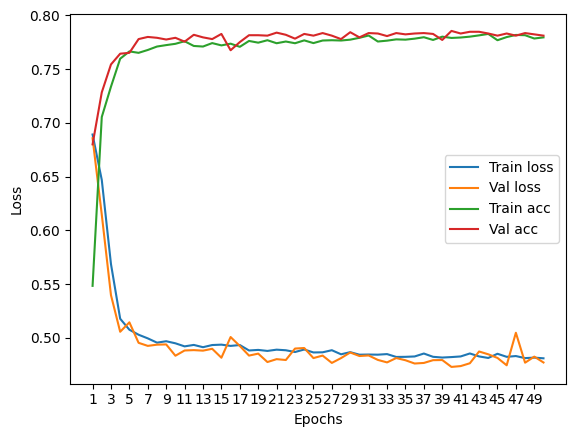

In [185]:
plot_loss(history)

Test accuracy:  77.24


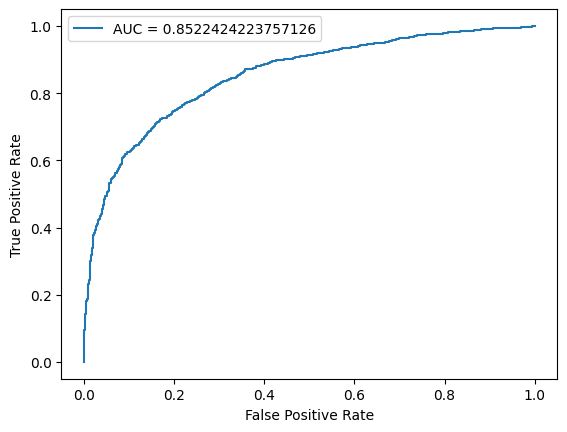

In [187]:
plot_auc(model, test_dataloader)

#### GAT

In [101]:
model = GAT(input_dims, hidden_dims, output_dims, activ_fn = ReLU())
model

GAT(
  (layers): ModuleList(
    (0-1): 2 x GATConv(8, 8, heads=1)
  )
  (activ_fn): ReLU()
  (classifier): Sequential(
    (0): Linear(in_features=13, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=1, bias=True)
  )
)

In [102]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [00:01, 89.23it/s]


Train Epoch: 0 	Loss: 0.694854, Accuracy: 4108/7500 (55%)
Val Epoch: 0 	Loss: 0.700013, Accuracy: 1745/2500 (70%)



118it [00:01, 100.72it/s]


Train Epoch: 1 	Loss: 0.680932, Accuracy: 4951/7500 (66%)
Val Epoch: 1 	Loss: 0.680215, Accuracy: 1750/2500 (70%)



118it [00:01, 69.07it/s]


Train Epoch: 2 	Loss: 0.652327, Accuracy: 5571/7500 (74%)
Val Epoch: 2 	Loss: 0.635716, Accuracy: 1907/2500 (76%)



118it [00:02, 57.24it/s]


Train Epoch: 3 	Loss: 0.587853, Accuracy: 5635/7500 (75%)
Val Epoch: 3 	Loss: 0.554624, Accuracy: 1924/2500 (77%)



118it [00:02, 43.22it/s]


Train Epoch: 4 	Loss: 0.532965, Accuracy: 5684/7500 (76%)
Val Epoch: 4 	Loss: 0.512941, Accuracy: 1929/2500 (77%)



118it [00:02, 51.84it/s]


Train Epoch: 5 	Loss: 0.514898, Accuracy: 5722/7500 (76%)
Val Epoch: 5 	Loss: 0.495772, Accuracy: 1937/2500 (77%)



118it [00:02, 55.17it/s]


Train Epoch: 6 	Loss: 0.504895, Accuracy: 5741/7500 (77%)
Val Epoch: 6 	Loss: 0.493015, Accuracy: 1943/2500 (78%)



118it [00:01, 75.96it/s]


Train Epoch: 7 	Loss: 0.502077, Accuracy: 5759/7500 (77%)
Val Epoch: 7 	Loss: 0.493200, Accuracy: 1944/2500 (78%)



118it [00:01, 97.36it/s] 


Train Epoch: 8 	Loss: 0.501740, Accuracy: 5769/7500 (77%)
Val Epoch: 8 	Loss: 0.497475, Accuracy: 1956/2500 (78%)



118it [00:01, 98.42it/s]


Train Epoch: 9 	Loss: 0.497680, Accuracy: 5750/7500 (77%)
Val Epoch: 9 	Loss: 0.489677, Accuracy: 1953/2500 (78%)



118it [00:01, 106.15it/s]


Train Epoch: 10 	Loss: 0.497575, Accuracy: 5767/7500 (77%)
Val Epoch: 10 	Loss: 0.484688, Accuracy: 1957/2500 (78%)



118it [00:01, 102.05it/s]


Train Epoch: 11 	Loss: 0.497239, Accuracy: 5771/7500 (77%)
Val Epoch: 11 	Loss: 0.497587, Accuracy: 1947/2500 (78%)



118it [00:01, 81.98it/s]


Train Epoch: 12 	Loss: 0.493874, Accuracy: 5768/7500 (77%)
Val Epoch: 12 	Loss: 0.491447, Accuracy: 1954/2500 (78%)



118it [00:01, 85.65it/s]


Train Epoch: 13 	Loss: 0.494079, Accuracy: 5770/7500 (77%)
Val Epoch: 13 	Loss: 0.482453, Accuracy: 1947/2500 (78%)



118it [00:01, 93.11it/s]


Train Epoch: 14 	Loss: 0.493984, Accuracy: 5770/7500 (77%)
Val Epoch: 14 	Loss: 0.482843, Accuracy: 1952/2500 (78%)



118it [00:01, 82.96it/s]


Train Epoch: 15 	Loss: 0.492755, Accuracy: 5776/7500 (77%)
Val Epoch: 15 	Loss: 0.480630, Accuracy: 1952/2500 (78%)



118it [00:01, 100.48it/s]


Train Epoch: 16 	Loss: 0.495341, Accuracy: 5779/7500 (77%)
Val Epoch: 16 	Loss: 0.485307, Accuracy: 1949/2500 (78%)



118it [00:01, 100.53it/s]


Train Epoch: 17 	Loss: 0.492683, Accuracy: 5776/7500 (77%)
Val Epoch: 17 	Loss: 0.490005, Accuracy: 1954/2500 (78%)



118it [00:01, 105.92it/s]


Train Epoch: 18 	Loss: 0.492476, Accuracy: 5796/7500 (77%)
Val Epoch: 18 	Loss: 0.504176, Accuracy: 1963/2500 (79%)



118it [00:01, 102.42it/s]


Train Epoch: 19 	Loss: 0.491299, Accuracy: 5778/7500 (77%)
Val Epoch: 19 	Loss: 0.480502, Accuracy: 1951/2500 (78%)



118it [00:01, 94.37it/s]


Train Epoch: 20 	Loss: 0.491174, Accuracy: 5785/7500 (77%)
Val Epoch: 20 	Loss: 0.486366, Accuracy: 1952/2500 (78%)



118it [00:01, 107.23it/s]


Train Epoch: 21 	Loss: 0.491747, Accuracy: 5793/7500 (77%)
Val Epoch: 21 	Loss: 0.486370, Accuracy: 1954/2500 (78%)



118it [00:01, 101.24it/s]


Train Epoch: 22 	Loss: 0.491768, Accuracy: 5797/7500 (77%)
Val Epoch: 22 	Loss: 0.489576, Accuracy: 1964/2500 (79%)



118it [00:01, 101.71it/s]


Train Epoch: 23 	Loss: 0.491650, Accuracy: 5798/7500 (77%)
Val Epoch: 23 	Loss: 0.489735, Accuracy: 1964/2500 (79%)



118it [00:01, 103.55it/s]


Train Epoch: 24 	Loss: 0.491705, Accuracy: 5790/7500 (77%)
Val Epoch: 24 	Loss: 0.479133, Accuracy: 1954/2500 (78%)



118it [00:01, 95.98it/s] 


Train Epoch: 25 	Loss: 0.491655, Accuracy: 5791/7500 (77%)
Val Epoch: 25 	Loss: 0.480676, Accuracy: 1960/2500 (78%)



118it [00:01, 112.65it/s]


Train Epoch: 26 	Loss: 0.489630, Accuracy: 5804/7500 (77%)
Val Epoch: 26 	Loss: 0.483815, Accuracy: 1954/2500 (78%)



118it [00:01, 99.14it/s]


Train Epoch: 27 	Loss: 0.491259, Accuracy: 5792/7500 (77%)
Val Epoch: 27 	Loss: 0.489534, Accuracy: 1960/2500 (78%)



118it [00:01, 106.55it/s]


Train Epoch: 28 	Loss: 0.489959, Accuracy: 5805/7500 (77%)
Val Epoch: 28 	Loss: 0.478826, Accuracy: 1958/2500 (78%)



118it [00:01, 103.26it/s]


Train Epoch: 29 	Loss: 0.489729, Accuracy: 5799/7500 (77%)
Val Epoch: 29 	Loss: 0.485177, Accuracy: 1961/2500 (78%)



118it [00:01, 99.80it/s] 


Train Epoch: 30 	Loss: 0.489307, Accuracy: 5805/7500 (77%)
Val Epoch: 30 	Loss: 0.492109, Accuracy: 1953/2500 (78%)



118it [00:01, 100.12it/s]


Train Epoch: 31 	Loss: 0.488821, Accuracy: 5807/7500 (77%)
Val Epoch: 31 	Loss: 0.478396, Accuracy: 1957/2500 (78%)



118it [00:01, 105.36it/s]


Train Epoch: 32 	Loss: 0.489743, Accuracy: 5796/7500 (77%)
Val Epoch: 32 	Loss: 0.480457, Accuracy: 1959/2500 (78%)



118it [00:01, 93.98it/s]


Train Epoch: 33 	Loss: 0.488598, Accuracy: 5802/7500 (77%)
Val Epoch: 33 	Loss: 0.482796, Accuracy: 1961/2500 (78%)



118it [00:01, 106.67it/s]


Train Epoch: 34 	Loss: 0.487721, Accuracy: 5798/7500 (77%)
Val Epoch: 34 	Loss: 0.484300, Accuracy: 1957/2500 (78%)



118it [00:01, 93.33it/s]


Train Epoch: 35 	Loss: 0.490573, Accuracy: 5804/7500 (77%)
Val Epoch: 35 	Loss: 0.478920, Accuracy: 1960/2500 (78%)



118it [00:01, 99.67it/s]


Train Epoch: 36 	Loss: 0.488315, Accuracy: 5803/7500 (77%)
Val Epoch: 36 	Loss: 0.476437, Accuracy: 1964/2500 (79%)



118it [00:01, 99.76it/s]


Train Epoch: 37 	Loss: 0.488001, Accuracy: 5816/7500 (78%)
Val Epoch: 37 	Loss: 0.493665, Accuracy: 1963/2500 (79%)



118it [00:01, 108.30it/s]


Train Epoch: 38 	Loss: 0.488568, Accuracy: 5821/7500 (78%)
Val Epoch: 38 	Loss: 0.482302, Accuracy: 1961/2500 (78%)



118it [00:01, 90.92it/s]


Train Epoch: 39 	Loss: 0.489061, Accuracy: 5818/7500 (78%)
Val Epoch: 39 	Loss: 0.483618, Accuracy: 1964/2500 (79%)



118it [00:01, 99.93it/s] 


Train Epoch: 40 	Loss: 0.489499, Accuracy: 5813/7500 (78%)
Val Epoch: 40 	Loss: 0.486523, Accuracy: 1960/2500 (78%)



118it [00:01, 89.10it/s]


Train Epoch: 41 	Loss: 0.488010, Accuracy: 5824/7500 (78%)
Val Epoch: 41 	Loss: 0.484939, Accuracy: 1963/2500 (79%)



118it [00:01, 94.64it/s]


Train Epoch: 42 	Loss: 0.488123, Accuracy: 5802/7500 (77%)
Val Epoch: 42 	Loss: 0.479398, Accuracy: 1958/2500 (78%)



118it [00:01, 101.80it/s]


Train Epoch: 43 	Loss: 0.486258, Accuracy: 5813/7500 (78%)
Val Epoch: 43 	Loss: 0.478761, Accuracy: 1958/2500 (78%)



118it [00:01, 104.39it/s]


Train Epoch: 44 	Loss: 0.487969, Accuracy: 5823/7500 (78%)
Val Epoch: 44 	Loss: 0.484339, Accuracy: 1960/2500 (78%)



118it [00:01, 102.26it/s]


Train Epoch: 45 	Loss: 0.485844, Accuracy: 5809/7500 (77%)
Val Epoch: 45 	Loss: 0.494015, Accuracy: 1960/2500 (78%)



118it [00:01, 110.41it/s]


Train Epoch: 46 	Loss: 0.488223, Accuracy: 5828/7500 (78%)
Val Epoch: 46 	Loss: 0.482805, Accuracy: 1960/2500 (78%)



118it [00:01, 108.16it/s]


Train Epoch: 47 	Loss: 0.487456, Accuracy: 5822/7500 (78%)
Val Epoch: 47 	Loss: 0.480335, Accuracy: 1959/2500 (78%)



118it [00:01, 103.14it/s]


Train Epoch: 48 	Loss: 0.487570, Accuracy: 5823/7500 (78%)
Val Epoch: 48 	Loss: 0.488425, Accuracy: 1961/2500 (78%)



118it [00:01, 93.79it/s] 


Train Epoch: 49 	Loss: 0.488843, Accuracy: 5806/7500 (77%)
Val Epoch: 49 	Loss: 0.483404, Accuracy: 1959/2500 (78%)



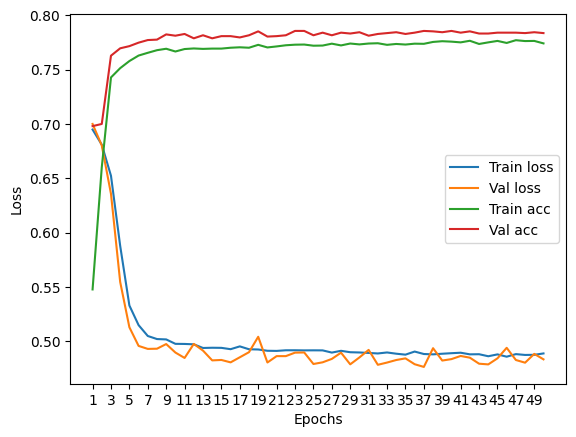

In [103]:
plot_loss(history)

Test accuracy:  77.16


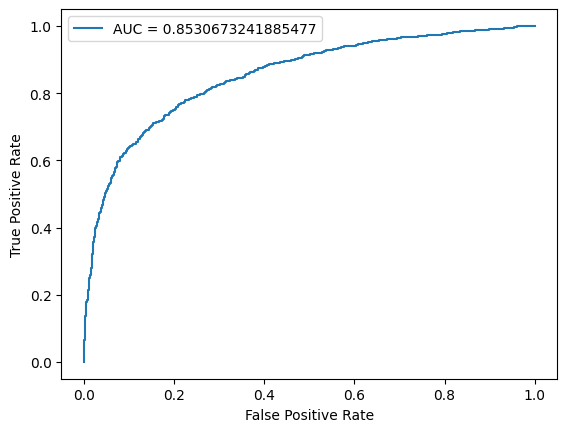

In [104]:
plot_auc(best_model, test_dataloader)

#### GCN

In [49]:
model = GCN(input_dims, hidden_dims, output_dims, activ_fn = ReLU())
model

GCN(
  (layers): ModuleList(
    (0): GCNConv()
  )
  (activ_fn): ReLU()
  (classifier): Linear(in_features=8, out_features=1, bias=True)
)

In [50]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

313it [00:04, 66.08it/s]


Train Epoch: 0 	Loss: 0.691258, Accuracy: 44913/79896 (56%)
Val Epoch: 0 	Loss: 0.698176, Accuracy: 6398/9987 (64%)



313it [00:04, 70.83it/s]


Train Epoch: 1 	Loss: 0.663202, Accuracy: 55216/79896 (69%)
Val Epoch: 1 	Loss: 0.656054, Accuracy: 7111/9987 (71%)



313it [00:04, 69.93it/s]


Train Epoch: 2 	Loss: 0.618083, Accuracy: 57923/79896 (72%)
Val Epoch: 2 	Loss: 0.618773, Accuracy: 7179/9987 (72%)



313it [00:07, 44.02it/s]


Train Epoch: 3 	Loss: 0.580112, Accuracy: 58275/79896 (73%)
Val Epoch: 3 	Loss: 0.581786, Accuracy: 7212/9987 (72%)



313it [00:07, 42.87it/s]


Train Epoch: 4 	Loss: 0.558145, Accuracy: 58468/79896 (73%)
Val Epoch: 4 	Loss: 0.565816, Accuracy: 7238/9987 (72%)



313it [00:07, 44.53it/s]


Train Epoch: 5 	Loss: 0.548458, Accuracy: 58495/79896 (73%)
Val Epoch: 5 	Loss: 0.561470, Accuracy: 7245/9987 (73%)



313it [00:04, 62.78it/s]


Train Epoch: 6 	Loss: 0.544776, Accuracy: 58580/79896 (73%)
Val Epoch: 6 	Loss: 0.562299, Accuracy: 7249/9987 (73%)



313it [00:04, 70.56it/s]


Train Epoch: 7 	Loss: 0.542799, Accuracy: 58615/79896 (73%)
Val Epoch: 7 	Loss: 0.559654, Accuracy: 7244/9987 (73%)



313it [00:05, 62.15it/s]


Train Epoch: 8 	Loss: 0.542252, Accuracy: 58628/79896 (73%)
Val Epoch: 8 	Loss: 0.564513, Accuracy: 7248/9987 (73%)



313it [00:05, 54.90it/s]


Train Epoch: 9 	Loss: 0.541618, Accuracy: 58595/79896 (73%)
Val Epoch: 9 	Loss: 0.576891, Accuracy: 7243/9987 (73%)



313it [00:05, 56.04it/s]


Train Epoch: 10 	Loss: 0.541468, Accuracy: 58638/79896 (73%)
Val Epoch: 10 	Loss: 0.564160, Accuracy: 7250/9987 (73%)



313it [00:05, 61.43it/s]


Train Epoch: 11 	Loss: 0.541851, Accuracy: 58632/79896 (73%)
Val Epoch: 11 	Loss: 0.573164, Accuracy: 7235/9987 (72%)



313it [00:04, 62.87it/s]


Train Epoch: 12 	Loss: 0.540906, Accuracy: 58659/79896 (73%)
Val Epoch: 12 	Loss: 0.558714, Accuracy: 7251/9987 (73%)



313it [00:05, 58.84it/s]


Train Epoch: 13 	Loss: 0.540677, Accuracy: 58674/79896 (73%)
Val Epoch: 13 	Loss: 0.565257, Accuracy: 7251/9987 (73%)



313it [00:05, 60.51it/s]


Train Epoch: 14 	Loss: 0.540512, Accuracy: 58707/79896 (73%)
Val Epoch: 14 	Loss: 0.570757, Accuracy: 7252/9987 (73%)



313it [00:05, 62.56it/s]


Train Epoch: 15 	Loss: 0.540062, Accuracy: 58698/79896 (73%)
Val Epoch: 15 	Loss: 0.572560, Accuracy: 7254/9987 (73%)



313it [00:05, 59.01it/s]


Train Epoch: 16 	Loss: 0.540879, Accuracy: 58703/79896 (73%)
Val Epoch: 16 	Loss: 0.564741, Accuracy: 7240/9987 (72%)



313it [00:04, 64.57it/s]


Train Epoch: 17 	Loss: 0.540570, Accuracy: 58700/79896 (73%)
Val Epoch: 17 	Loss: 0.569590, Accuracy: 7245/9987 (73%)



313it [00:04, 64.00it/s]


Train Epoch: 18 	Loss: 0.540337, Accuracy: 58744/79896 (74%)
Val Epoch: 18 	Loss: 0.561171, Accuracy: 7250/9987 (73%)



313it [00:06, 50.34it/s]


Train Epoch: 19 	Loss: 0.540237, Accuracy: 58650/79896 (73%)
Val Epoch: 19 	Loss: 0.560497, Accuracy: 7258/9987 (73%)



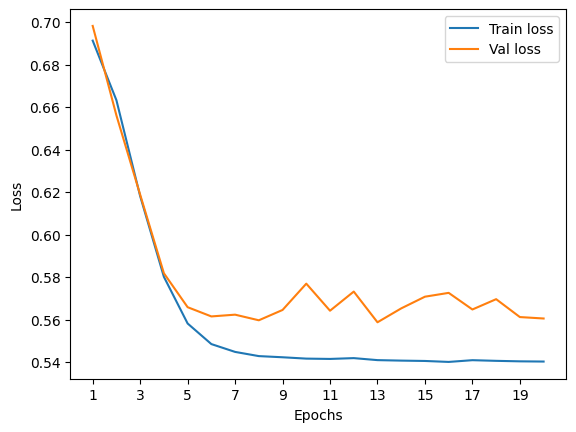

In [51]:
plot_loss(history)

#### Learning rate = 1e-2

In [52]:
model = GCN(input_dims, hidden_dims, output_dims, activ_fn = ReLU())
model

GCN(
  (layers): ModuleList(
    (0): GCNConv()
  )
  (activ_fn): ReLU()
  (classifier): Linear(in_features=8, out_features=1, bias=True)
)

In [53]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

313it [00:04, 63.17it/s]


Train Epoch: 0 	Loss: 0.595037, Accuracy: 55305/79896 (69%)
Val Epoch: 0 	Loss: 0.565550, Accuracy: 7233/9987 (72%)



313it [00:04, 67.61it/s]


Train Epoch: 1 	Loss: 0.542881, Accuracy: 58552/79896 (73%)
Val Epoch: 1 	Loss: 0.577155, Accuracy: 7250/9987 (73%)



313it [00:05, 57.89it/s]


Train Epoch: 2 	Loss: 0.542160, Accuracy: 58522/79896 (73%)
Val Epoch: 2 	Loss: 0.560936, Accuracy: 7248/9987 (73%)



313it [00:04, 70.39it/s]


Train Epoch: 3 	Loss: 0.541983, Accuracy: 58577/79896 (73%)
Val Epoch: 3 	Loss: 0.560007, Accuracy: 7242/9987 (73%)



313it [00:04, 68.47it/s]


Train Epoch: 4 	Loss: 0.542275, Accuracy: 58580/79896 (73%)
Val Epoch: 4 	Loss: 0.571907, Accuracy: 7224/9987 (72%)



313it [00:04, 66.91it/s]


Train Epoch: 5 	Loss: 0.541160, Accuracy: 58585/79896 (73%)
Val Epoch: 5 	Loss: 0.561459, Accuracy: 7256/9987 (73%)



313it [00:04, 73.01it/s]


Train Epoch: 6 	Loss: 0.541676, Accuracy: 58651/79896 (73%)
Val Epoch: 6 	Loss: 0.562092, Accuracy: 7239/9987 (72%)



313it [00:04, 72.98it/s]


Train Epoch: 7 	Loss: 0.541741, Accuracy: 58686/79896 (73%)
Val Epoch: 7 	Loss: 0.558041, Accuracy: 7234/9987 (72%)



313it [00:04, 66.57it/s]


Train Epoch: 8 	Loss: 0.541664, Accuracy: 58586/79896 (73%)
Val Epoch: 8 	Loss: 0.577004, Accuracy: 7246/9987 (73%)



313it [00:04, 71.08it/s]


Train Epoch: 9 	Loss: 0.541246, Accuracy: 58609/79896 (73%)
Val Epoch: 9 	Loss: 0.568409, Accuracy: 7216/9987 (72%)



313it [00:04, 72.68it/s]


Train Epoch: 10 	Loss: 0.541735, Accuracy: 58620/79896 (73%)
Val Epoch: 10 	Loss: 0.559913, Accuracy: 7253/9987 (73%)



313it [00:04, 68.15it/s]


Train Epoch: 11 	Loss: 0.540774, Accuracy: 58667/79896 (73%)
Val Epoch: 11 	Loss: 0.567683, Accuracy: 7219/9987 (72%)



313it [00:04, 71.93it/s]


Train Epoch: 12 	Loss: 0.541144, Accuracy: 58681/79896 (73%)
Val Epoch: 12 	Loss: 0.560397, Accuracy: 7237/9987 (72%)



313it [00:04, 73.23it/s]


Train Epoch: 13 	Loss: 0.541790, Accuracy: 58619/79896 (73%)
Val Epoch: 13 	Loss: 0.564516, Accuracy: 7149/9987 (72%)



313it [00:04, 70.63it/s]


Train Epoch: 14 	Loss: 0.541562, Accuracy: 58554/79896 (73%)
Val Epoch: 14 	Loss: 0.572395, Accuracy: 7202/9987 (72%)



313it [00:04, 68.67it/s]


Train Epoch: 15 	Loss: 0.541923, Accuracy: 58594/79896 (73%)
Val Epoch: 15 	Loss: 0.567778, Accuracy: 7264/9987 (73%)



313it [00:04, 72.70it/s]


Train Epoch: 16 	Loss: 0.540964, Accuracy: 58685/79896 (73%)
Val Epoch: 16 	Loss: 0.560973, Accuracy: 7230/9987 (72%)



313it [00:04, 73.24it/s]


Train Epoch: 17 	Loss: 0.542003, Accuracy: 58602/79896 (73%)
Val Epoch: 17 	Loss: 0.558957, Accuracy: 7248/9987 (73%)



313it [00:04, 66.18it/s]


Train Epoch: 18 	Loss: 0.541065, Accuracy: 58604/79896 (73%)
Val Epoch: 18 	Loss: 0.555789, Accuracy: 7232/9987 (72%)



313it [00:04, 72.20it/s]


Train Epoch: 19 	Loss: 0.541169, Accuracy: 58626/79896 (73%)
Val Epoch: 19 	Loss: 0.561742, Accuracy: 7254/9987 (73%)



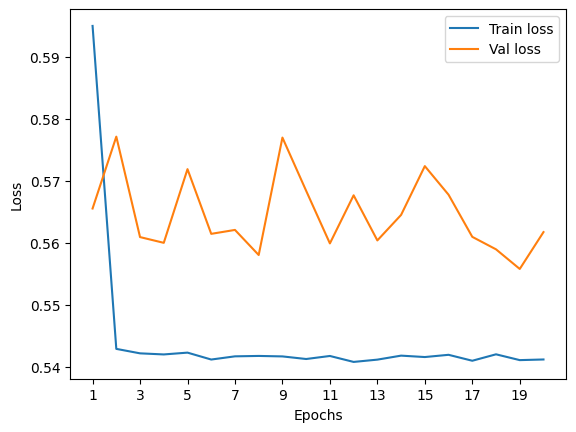

In [54]:
plot_loss(history)

### Parameterized quantum circuit - Node Embedding QNN

In [48]:
def H_layer(nqubits):
    """Layer of single-qubit Hadamard gates.
    """
    for idx in range(nqubits):
        qml.Hadamard(wires=idx)

def encoder(w):
    """Layer of parametrized qubit rotations around the x axis.
    """
    for idx, element in enumerate(w):
        qml.RY(element, wires=idx)

def Rot_layer(gate, w):
    """Layer of parametrized qubit rotations around the y axis.
    """
    for idx, element in enumerate(w):
        gate(element, wires=idx)


def entangling_layer(nqubits):
    """Layers of CZ and RY gates.
    """
    for i in range(0, nqubits - 1):  # Loop over even indices: i=0,2,...N-2
        qml.CNOT(wires=[i, i + 1])
        
    qml.CNOT(wires=[nqubits-1, 0])

In [49]:
def quantum_net(n_qubits, q_depth):
    
    dev = qml.device("default.qubit", wires=n_qubits)
    
    @qml.qnode(dev, interface='torch')
    def quantum_circuit(inputs, q_weights_flat):
        """
        The variational quantum circuit.
        """

        # Reshape weights
        q_weights = q_weights_flat.reshape(q_depth, 2, n_qubits)

        # Embed features in the quantum node
        qml.AngleEmbedding(inputs, wires = range(n_qubits), rotation="Y")

        # Sequence of trainable variational layers
        for k in range(q_depth):
            Rot_layer(qml.RY, q_weights[k][0])
            entangling_layer(n_qubits)
            Rot_layer(qml.RZ, q_weights[k][1])

        # Expectation values in the Z basis
        exp_vals = [qml.expval(qml.PauliZ(position)) for position in range(n_qubits)]
        return exp_vals
    
    return qml.qnn.TorchLayer(quantum_circuit, {"q_weights_flat": (2*q_depth*n_qubits)}), quantum_circuit

### Visualizing the quantum layer

In [128]:
_, qc = quantum_net(8,1)
inputs = torch.randn(8)
params = torch.randn(2*8)
print(qml.draw(qc)(inputs, params))

0: ─╭AngleEmbedding(M0)──RY(-1.31)─╭●───────────────────╭X──RZ(-0.43)─┤  <Z>
1: ─├AngleEmbedding(M0)──RY(-0.27)─╰X─╭●────────────────│───RZ(1.93)──┤  <Z>
2: ─├AngleEmbedding(M0)──RY(-1.13)────╰X─╭●─────────────│───RZ(-0.02)─┤  <Z>
3: ─├AngleEmbedding(M0)──RY(-0.93)───────╰X─╭●──────────│───RZ(0.65)──┤  <Z>
4: ─├AngleEmbedding(M0)──RY(-0.43)──────────╰X─╭●───────│───RZ(-0.41)─┤  <Z>
5: ─├AngleEmbedding(M0)──RY(-0.77)─────────────╰X─╭●────│───RZ(1.10)──┤  <Z>
6: ─├AngleEmbedding(M0)──RY(-0.97)────────────────╰X─╭●─│───RZ(0.19)──┤  <Z>
7: ─╰AngleEmbedding(M0)──RY(-0.28)───────────────────╰X─╰●──RZ(1.33)──┤  <Z>

M0 = 
tensor([ 0.1431, -0.6187, -0.4107, -1.5951,  1.0618,  0.0777,  0.8359,  0.3899])


In [120]:
batch_dim = 5
x = torch.zeros((batch_dim, 3))
qlayer, _ = quantum_net(3,1)
qlayer(x).shape

torch.Size([5, 3])

### Quantum Classifier

### 1. Matrix Product State Classifier

In [50]:
def MPS(n_qubits):
    dev = qml.device("default.qubit", wires=n_qubits)
    
    @qml.qnode(dev, interface='torch')
    def quantum_circuit(inputs, q_weights_flat):
        """
        The variational quantum classifier.
        """
        
        # Reshape weights
        q_weights = q_weights_flat[:-1].reshape(n_qubits-1, 2)

        # Embed features in the quantum node
        qml.AngleEmbedding(inputs, wires = range(n_qubits), rotation="Y")

        # Sequence of trainable variational layers
        for k in range(n_qubits-1):
            qml.RY(q_weights[k][0], wires=k)
            qml.RY(q_weights[k][1], wires=k+1)
            qml.CZ(wires=[k,k+1])
            
        qml.RY(q_weights_flat[-1], wires=n_qubits-1)

        # Expectation values in the Z basis
        return [qml.expval(qml.PauliZ(n_qubits - 1))]
        # return [qml.expval(qml.operation.CVObservable(q_weights_flat[-1], qml.PauliZ(n_qubits - 1)))]
    
    return qml.qnn.TorchLayer(quantum_circuit, {"q_weights_flat": (2*n_qubits - 1)}), quantum_circuit

In [131]:
_, qc = MPS(6)
inputs = torch.randn(6)
params = torch.randn(2*6-1)
print(qml.draw(qc)(inputs, params))

0: ─╭AngleEmbedding(M0)──RY(-1.04)─╭●─────────────────────────────────────────────────────
1: ─├AngleEmbedding(M0)──RY(0.44)──╰Z──RY(-0.70)─╭●───────────────────────────────────────
2: ─├AngleEmbedding(M0)──RY(-1.47)───────────────╰Z──RY(1.09)─╭●──────────────────────────
3: ─├AngleEmbedding(M0)──RY(-1.54)────────────────────────────╰Z──RY(2.23)─╭●─────────────
4: ─├AngleEmbedding(M0)──RY(-0.50)─────────────────────────────────────────╰Z──RY(0.39)─╭●
5: ─╰AngleEmbedding(M0)──RY(0.04)───────────────────────────────────────────────────────╰Z

─────────────┤     
─────────────┤     
─────────────┤     
─────────────┤     
─────────────┤     
───RY(-0.52)─┤  <Z>

M0 = 
tensor([-0.6462,  0.8152, -1.1428,  1.2935,  1.2888, -0.5991])


None

### 2. Tensor Tree Network Classifier

In [51]:
def TTN(n_qubits):
    
    dev = qml.device("default.qubit", wires=n_qubits)
    
    @qml.qnode(dev, interface='torch')
    def quantum_circuit(inputs, q_weights_flat):
        """
        The variational quantum classifier.
        """
        
        # Embed features in the quantum node
        qml.AngleEmbedding(inputs, wires = range(n_qubits), rotation="Y")
        
        n_layers = int(np.log2(n_qubits))
        i = 0
        n_params = int(2**(np.log2(n_qubits)+1)-2 +1) 
        
        for layer in range(n_layers):
            n_gates = n_qubits//(2**(layer+1))
            for j in range(n_gates):
                qubit0 = j * (n_qubits//(2**(n_layers-layer-1))) + 2**layer - 1
                qubit1 = j * (n_qubits//(2**(n_layers-layer-1))) + 2**(layer+1) - 1
                qml.RY(q_weights_flat[i], wires=qubit0)
                qml.RY(q_weights_flat[i+1], wires=qubit1)
                qml.CZ(wires=[qubit0,qubit1])
                i += 2
        
        qml.RY(q_weights_flat[-1], wires=n_qubits-1)

        # Expectation values in the Z basis
        return [qml.expval(qml.PauliZ(n_qubits - 1))]
    
    return qml.qnn.TorchLayer(quantum_circuit, {"q_weights_flat": int(2**(np.log2(n_qubits)+1)-2 +1)}), quantum_circuit

In [124]:
_, qc = TTN(8)
inputs = torch.randn(8)
params = torch.randn(int(2**(np.log2(8)+1)-2 +1))
print(qml.draw(qc)(inputs, params))

0: ─╭AngleEmbedding(M0)──RY(-0.64)─╭●───────────────────────────────────────┤     
1: ─├AngleEmbedding(M0)──RY(-0.54)─╰Z──RY(-0.19)─╭●─────────────────────────┤     
2: ─├AngleEmbedding(M0)──RY(-1.17)─╭●────────────│──────────────────────────┤     
3: ─├AngleEmbedding(M0)──RY(-0.03)─╰Z──RY(0.86)──╰Z──RY(-1.11)─╭●───────────┤     
4: ─├AngleEmbedding(M0)──RY(-0.74)─╭●──────────────────────────│────────────┤     
5: ─├AngleEmbedding(M0)──RY(0.00)──╰Z──RY(0.71)──╭●────────────│────────────┤     
6: ─├AngleEmbedding(M0)──RY(-0.93)─╭●────────────│─────────────│────────────┤     
7: ─╰AngleEmbedding(M0)──RY(-0.30)─╰Z──RY(-0.68)─╰Z──RY(1.45)──╰Z──RY(0.52)─┤  <Z>

M0 = 
tensor([ 0.1954,  0.5870,  0.3240,  0.6788, -1.5293, -0.0176,  0.9008,  0.2362])


### Quantum Enhanced GAT

In [52]:
class QGATConv(MessagePassing):
    def __init__(self, in_channels, depth, attn_model):
        super().__init__(aggr='add')  # "Add" aggregation (Step 5).
        self.bias = nn.Parameter(torch.empty(in_channels))
        self.reset_parameters()
        self.n_qubits = in_channels
        self.qc, _ = quantum_net(self.n_qubits, depth)
        
        if attn_model == "MPS":
            self.attn, _ = MPS(in_channels*2)
        else:
            self.attn, _ = TTN(in_channels*2)
            
        self.readout = Linear(1, 1)
            

    def reset_parameters(self):
        self.bias.data.zero_()

    def forward(self, x, edge_index, edge_attr):
        # x has shape [N, in_channels]
        # edge_index has shape [2, E]
        
        # Step 1: Add self-loops to the adjacency matrix.
        edge_index, edge_attr = remove_self_loops(edge_index, edge_attr)
        edge_index, edge_attr = add_self_loops(edge_index, edge_attr, num_nodes=x.size(0))

        # Step 2: Linearly transform node feature matrix
        
        q_out = self.qc(x).float()

        # Step 3: Compute normalization.
        row, col = edge_index
        deg = degree(col, q_out.size(0), dtype=q_out.dtype)
        deg_inv_sqrt = deg.pow(-0.5)
        deg_inv_sqrt[deg_inv_sqrt == float('inf')] = 0
        norm = deg_inv_sqrt[row] * deg_inv_sqrt[col]

        # Step 4-5: Start propagating messages.
        out = self.propagate(edge_index, x=q_out)

        # Step 6: Apply a final bias vector.
        out = out + self.bias

        return out

    def message(self, x_i, x_j):
        # x_j has shape [E, out_channels]

        x_edge = torch.cat((x_i,x_j),dim=1)
        x_edge = self.attn(x_edge)
        x_edge = self.readout(x_edge)
        return x_edge.view(-1, 1) * x_j

In [53]:
class QGAT(nn.Module):

    def __init__(self, input_dims, depth, n_layers, activ_fn = LeakyReLU(0.2), classifier="MPS", attn_model="MPS"):
        
        super().__init__()
        layers = []
    
        for i in range(n_layers):
            layers.append(QGATConv(input_dims, depth, attn_model))
            
        self.layers = ModuleList(layers)
        self.activ_fn = activ_fn
        if classifier == "MPS" :
            self.classifier, _ = MPS(input_dims+5)
        elif classifier == "TTN":
            self.classifier, _ = TTN(input_dims+5)

    def forward(self, x, edge_index, edge_attr, batch, graph_features):
        """
        Defining how tensors are supposed to move through the *dressed* quantum
        net.
        """
        
        h = x
        for i in range(len(self.layers)):
            h = self.layers[i](h, edge_index, edge_attr)
            h = self.activ_fn(h)
            
        h = global_mean_pool(h, batch)   # readout layer to get the embedding for each graph in batch
        h = torch.cat((h, graph_features.float().reshape(-1,5)), dim=1)
        h = self.classifier(h)
        h = self.readout(h)
        return h

### Quantum-enhanced GCN

In [121]:
class QGCNConv(MessagePassing):
    def __init__(self, in_channels):
        super().__init__(aggr='add')  # "Add" aggregation (Step 5).
        self.bias = nn.Parameter(torch.empty(in_channels))
        self.reset_parameters()
        self.n_qubits = in_channels
        self.qc, _ = quantum_net(self.n_qubits, q_depth)

    def reset_parameters(self):
        self.bias.data.zero_()

    def forward(self, x, edge_index, edge_weights):
        # x has shape [N, in_channels]
        # edge_index has shape [2, E]

        # Step 1: Add self-loops to the adjacency matrix.
        edge_index, _ = add_self_loops(edge_index, num_nodes=x.size(0))

        # Step 2: Linearly transform node feature matrix
        
        q_out = self.qc(x).float()

        # Step 3: Compute normalization.
        row, col = edge_index
        deg = degree(col, q_out.size(0), dtype=q_out.dtype)
        deg_inv_sqrt = deg.pow(-0.5)
        deg_inv_sqrt[deg_inv_sqrt == float('inf')] = 0
        norm = deg_inv_sqrt[row] * deg_inv_sqrt[col]

        # Step 4-5: Start propagating messages.
        out = self.propagate(edge_index, x=q_out, weights=edge_weights, norm=norm)

        # Step 6: Apply a final bias vector.
        out = out + self.bias

        return out

    def message(self, x_j, weights, norm):
        # x_j has shape [E, out_channels]

        # Step 4: Normalize node features.
        return norm.view(-1, 1) * x_j

In [122]:
class QGCN(nn.Module):

    def __init__(self, input_dims, output_dims, activ_fn = LeakyReLU(0.2), classifier = None, readout = False):
        
        super().__init__()
        layers = [QGCNConv(input_dims)]
        self.layers = ModuleList(layers)
        self.activ_fn = activ_fn
        
        if readout:
            self.readout = Linear(1, 1)
        else:
            self.readout = None
            
        if classifier == "MPS" :
            assert output_dims == 1
            self.classifier, _ = MPS(input_dims+5)
        elif classifier == "TTN":
            assert output_dims == 1
            self.classifier, _ = TTN(input_dims+5)
        else:
            self.classifier = nn.Linear(input_dims+5, output_dims)

    def forward(self, x, edge_index, edge_weights, batch, graph_features):
        """
        Defining how tensors are supposed to move through the *dressed* quantum
        net.
        """
        
        h = x
        for i in range(len(self.layers)):
            h = self.layers[i](h, edge_index, edge_weights)
            h = self.activ_fn(h)
         
        h = global_mean_pool(h, batch)   # readout layer to get the embedding for each graph in batch
        
        h = torch.cat((h, graph_features.reshape(-1,5)), dim=1)
        h = self.classifier(h)
        
        if self.readout is not None:
            h = self.readout(h)

        # return the two-dimensional prediction from the postprocessing layer
        return h

### QGCN with classical classifier

#### Leaky ReLU

#### Learning rate = 1e-3

In [69]:
epochs = 20

In [70]:
model = QGCN(input_dims, output_dims)
model

QGCN(
  (layers): ModuleList(
    (0): QGCNConv()
  )
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (classifier): Linear(in_features=8, out_features=1, bias=True)
)

In [71]:
[p.numel() for p in model.parameters()]

[8, 16, 8, 1]

In [72]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

313it [01:15,  4.15it/s]


Train Epoch: 0 	Loss: 0.695361, Accuracy: 40269/79896 (50%)
Val Epoch: 0 	Loss: 0.710435, Accuracy: 5138/9987 (51%)



313it [01:08,  4.54it/s]


Train Epoch: 1 	Loss: 0.694552, Accuracy: 41769/79896 (52%)
Val Epoch: 1 	Loss: 0.709177, Accuracy: 5362/9987 (54%)



313it [01:09,  4.48it/s]


Train Epoch: 2 	Loss: 0.692177, Accuracy: 44468/79896 (56%)
Val Epoch: 2 	Loss: 0.704949, Accuracy: 5908/9987 (59%)



313it [01:16,  4.07it/s]


Train Epoch: 3 	Loss: 0.682474, Accuracy: 51352/79896 (64%)
Val Epoch: 3 	Loss: 0.688486, Accuracy: 6822/9987 (68%)



313it [01:17,  4.04it/s]


Train Epoch: 4 	Loss: 0.657795, Accuracy: 55352/79896 (69%)
Val Epoch: 4 	Loss: 0.659469, Accuracy: 6922/9987 (69%)



313it [01:16,  4.07it/s]


Train Epoch: 5 	Loss: 0.630579, Accuracy: 56058/79896 (70%)
Val Epoch: 5 	Loss: 0.631465, Accuracy: 7022/9987 (70%)



313it [01:10,  4.47it/s]


Train Epoch: 6 	Loss: 0.610910, Accuracy: 57063/79896 (71%)
Val Epoch: 6 	Loss: 0.621220, Accuracy: 7106/9987 (71%)



313it [01:05,  4.74it/s]


Train Epoch: 7 	Loss: 0.597900, Accuracy: 57591/79896 (72%)
Val Epoch: 7 	Loss: 0.614443, Accuracy: 7146/9987 (72%)



313it [01:01,  5.08it/s]


Train Epoch: 8 	Loss: 0.587835, Accuracy: 57887/79896 (72%)
Val Epoch: 8 	Loss: 0.604762, Accuracy: 7189/9987 (72%)



313it [01:00,  5.21it/s]


Train Epoch: 9 	Loss: 0.579909, Accuracy: 58136/79896 (73%)
Val Epoch: 9 	Loss: 0.597862, Accuracy: 7224/9987 (72%)



313it [01:04,  4.88it/s]


Train Epoch: 10 	Loss: 0.573172, Accuracy: 58204/79896 (73%)
Val Epoch: 10 	Loss: 0.586356, Accuracy: 7240/9987 (72%)



313it [01:09,  4.51it/s]


Train Epoch: 11 	Loss: 0.568160, Accuracy: 58203/79896 (73%)
Val Epoch: 11 	Loss: 0.581701, Accuracy: 7239/9987 (72%)



313it [01:08,  4.59it/s]


Train Epoch: 12 	Loss: 0.563978, Accuracy: 58322/79896 (73%)
Val Epoch: 12 	Loss: 0.575831, Accuracy: 7242/9987 (73%)



313it [01:05,  4.77it/s]


Train Epoch: 13 	Loss: 0.561009, Accuracy: 58275/79896 (73%)
Val Epoch: 13 	Loss: 0.586465, Accuracy: 7240/9987 (72%)



313it [01:03,  4.94it/s]


Train Epoch: 14 	Loss: 0.558245, Accuracy: 58331/79896 (73%)
Val Epoch: 14 	Loss: 0.579308, Accuracy: 7219/9987 (72%)



313it [01:01,  5.13it/s]


Train Epoch: 15 	Loss: 0.555750, Accuracy: 58356/79896 (73%)
Val Epoch: 15 	Loss: 0.572884, Accuracy: 7230/9987 (72%)



313it [01:02,  4.97it/s]


Train Epoch: 16 	Loss: 0.553991, Accuracy: 58341/79896 (73%)
Val Epoch: 16 	Loss: 0.577180, Accuracy: 7228/9987 (72%)



313it [00:58,  5.38it/s]


Train Epoch: 17 	Loss: 0.552797, Accuracy: 58346/79896 (73%)
Val Epoch: 17 	Loss: 0.571935, Accuracy: 7197/9987 (72%)



313it [01:00,  5.17it/s]


Train Epoch: 18 	Loss: 0.551446, Accuracy: 58330/79896 (73%)
Val Epoch: 18 	Loss: 0.567999, Accuracy: 7227/9987 (72%)



313it [01:00,  5.16it/s]


Train Epoch: 19 	Loss: 0.550683, Accuracy: 58350/79896 (73%)
Val Epoch: 19 	Loss: 0.577886, Accuracy: 7227/9987 (72%)



313it [00:59,  5.25it/s]


Train Epoch: 20 	Loss: 0.549451, Accuracy: 58380/79896 (73%)
Val Epoch: 20 	Loss: 0.561432, Accuracy: 7225/9987 (72%)



313it [01:00,  5.17it/s]


Train Epoch: 21 	Loss: 0.549053, Accuracy: 58323/79896 (73%)
Val Epoch: 21 	Loss: 0.571432, Accuracy: 7238/9987 (72%)



313it [00:59,  5.27it/s]


Train Epoch: 22 	Loss: 0.548114, Accuracy: 58391/79896 (73%)
Val Epoch: 22 	Loss: 0.566905, Accuracy: 7217/9987 (72%)



313it [00:46,  6.69it/s]


Train Epoch: 23 	Loss: 0.548183, Accuracy: 58383/79896 (73%)
Val Epoch: 23 	Loss: 0.564539, Accuracy: 7232/9987 (72%)



313it [00:50,  6.23it/s]


Train Epoch: 24 	Loss: 0.547540, Accuracy: 58364/79896 (73%)
Val Epoch: 24 	Loss: 0.562457, Accuracy: 7230/9987 (72%)



313it [00:50,  6.15it/s]


Train Epoch: 25 	Loss: 0.547715, Accuracy: 58362/79896 (73%)
Val Epoch: 25 	Loss: 0.561972, Accuracy: 7238/9987 (72%)



313it [00:52,  5.96it/s]


Train Epoch: 26 	Loss: 0.547368, Accuracy: 58347/79896 (73%)
Val Epoch: 26 	Loss: 0.571377, Accuracy: 7231/9987 (72%)



313it [00:53,  5.81it/s]


Train Epoch: 27 	Loss: 0.546970, Accuracy: 58342/79896 (73%)
Val Epoch: 27 	Loss: 0.579671, Accuracy: 7226/9987 (72%)



313it [00:57,  5.41it/s]


Train Epoch: 28 	Loss: 0.547003, Accuracy: 58365/79896 (73%)
Val Epoch: 28 	Loss: 0.577450, Accuracy: 7217/9987 (72%)



313it [00:58,  5.38it/s]


Train Epoch: 29 	Loss: 0.546652, Accuracy: 58327/79896 (73%)
Val Epoch: 29 	Loss: 0.559124, Accuracy: 7238/9987 (72%)



313it [01:00,  5.17it/s]


Train Epoch: 30 	Loss: 0.547368, Accuracy: 58324/79896 (73%)
Val Epoch: 30 	Loss: 0.561990, Accuracy: 7198/9987 (72%)



313it [01:00,  5.17it/s]


Train Epoch: 31 	Loss: 0.547058, Accuracy: 58342/79896 (73%)
Val Epoch: 31 	Loss: 0.566332, Accuracy: 7238/9987 (72%)



313it [00:59,  5.24it/s]


Train Epoch: 32 	Loss: 0.546747, Accuracy: 58378/79896 (73%)
Val Epoch: 32 	Loss: 0.569443, Accuracy: 7219/9987 (72%)



313it [00:59,  5.22it/s]


Train Epoch: 33 	Loss: 0.546683, Accuracy: 58337/79896 (73%)
Val Epoch: 33 	Loss: 0.579489, Accuracy: 7219/9987 (72%)



313it [00:59,  5.22it/s]


Train Epoch: 34 	Loss: 0.546447, Accuracy: 58429/79896 (73%)
Val Epoch: 34 	Loss: 0.558793, Accuracy: 7233/9987 (72%)



313it [01:01,  5.10it/s]


Train Epoch: 35 	Loss: 0.546394, Accuracy: 58366/79896 (73%)
Val Epoch: 35 	Loss: 0.561584, Accuracy: 7233/9987 (72%)



313it [01:00,  5.14it/s]


Train Epoch: 36 	Loss: 0.546913, Accuracy: 58377/79896 (73%)
Val Epoch: 36 	Loss: 0.559189, Accuracy: 7202/9987 (72%)



313it [01:00,  5.16it/s]


Train Epoch: 37 	Loss: 0.546419, Accuracy: 58384/79896 (73%)
Val Epoch: 37 	Loss: 0.558153, Accuracy: 7233/9987 (72%)



313it [01:04,  4.83it/s]


Train Epoch: 38 	Loss: 0.546596, Accuracy: 58410/79896 (73%)
Val Epoch: 38 	Loss: 0.583460, Accuracy: 7227/9987 (72%)



313it [01:01,  5.08it/s]


Train Epoch: 39 	Loss: 0.546252, Accuracy: 58364/79896 (73%)
Val Epoch: 39 	Loss: 0.572163, Accuracy: 7240/9987 (72%)



313it [01:00,  5.17it/s]


Train Epoch: 40 	Loss: 0.546630, Accuracy: 58369/79896 (73%)
Val Epoch: 40 	Loss: 0.565926, Accuracy: 7180/9987 (72%)



313it [01:00,  5.19it/s]


Train Epoch: 41 	Loss: 0.546398, Accuracy: 58353/79896 (73%)
Val Epoch: 41 	Loss: 0.562420, Accuracy: 7217/9987 (72%)



313it [01:04,  4.82it/s]


Train Epoch: 42 	Loss: 0.546834, Accuracy: 58373/79896 (73%)
Val Epoch: 42 	Loss: 0.564027, Accuracy: 7235/9987 (72%)



313it [01:06,  4.73it/s]


Train Epoch: 43 	Loss: 0.546298, Accuracy: 58404/79896 (73%)
Val Epoch: 43 	Loss: 0.565801, Accuracy: 7209/9987 (72%)



313it [01:00,  5.17it/s]


Train Epoch: 44 	Loss: 0.546455, Accuracy: 58375/79896 (73%)
Val Epoch: 44 	Loss: 0.569257, Accuracy: 7245/9987 (73%)



313it [01:16,  4.09it/s]


Train Epoch: 45 	Loss: 0.546225, Accuracy: 58351/79896 (73%)
Val Epoch: 45 	Loss: 0.557775, Accuracy: 7222/9987 (72%)



313it [01:19,  3.96it/s]


Train Epoch: 46 	Loss: 0.547006, Accuracy: 58410/79896 (73%)
Val Epoch: 46 	Loss: 0.573467, Accuracy: 7206/9987 (72%)



313it [01:34,  3.30it/s]


Train Epoch: 47 	Loss: 0.546410, Accuracy: 58398/79896 (73%)
Val Epoch: 47 	Loss: 0.565280, Accuracy: 7201/9987 (72%)



313it [01:05,  4.81it/s]


Train Epoch: 48 	Loss: 0.546191, Accuracy: 58396/79896 (73%)
Val Epoch: 48 	Loss: 0.563323, Accuracy: 7240/9987 (72%)



313it [00:59,  5.25it/s]


Train Epoch: 49 	Loss: 0.546371, Accuracy: 58418/79896 (73%)
Val Epoch: 49 	Loss: 0.587335, Accuracy: 7234/9987 (72%)



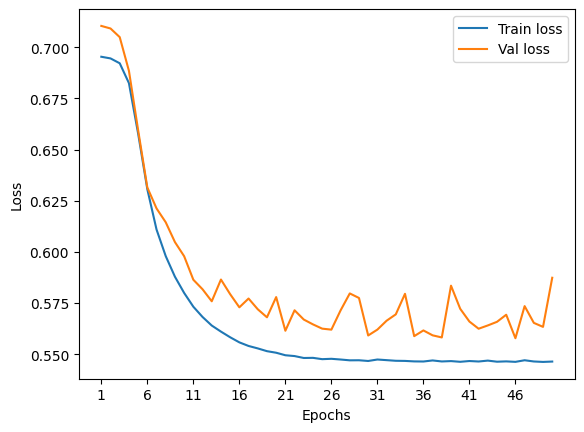

In [73]:
plot_loss(history, step = 5)

In [ ]:
plot_auc(model, test_dataloader)

#### Learning rate = 1e-2

In [99]:
q_depth = 1
model = QGCN(input_dims, output_dims)
model

QGCN(
  (layers): ModuleList(
    (0): QGCNConv()
  )
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (classifier): Linear(in_features=8, out_features=1, bias=True)
)

In [100]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

235it [07:40,  1.96s/it]


Train Epoch: 0 	Loss: 0.687883, Accuracy: 34386/60000 (57%)
Val Epoch: 0 	Loss: 0.684034, Accuracy: 11081/20000 (55%)



235it [08:42,  2.22s/it]


Train Epoch: 1 	Loss: 0.669939, Accuracy: 38664/60000 (64%)
Val Epoch: 1 	Loss: 0.667542, Accuracy: 12823/20000 (64%)



235it [07:55,  2.02s/it]


Train Epoch: 2 	Loss: 0.654657, Accuracy: 40437/60000 (67%)
Val Epoch: 2 	Loss: 0.652152, Accuracy: 13909/20000 (70%)



235it [07:55,  2.02s/it]


Train Epoch: 3 	Loss: 0.643365, Accuracy: 40850/60000 (68%)
Val Epoch: 3 	Loss: 0.649373, Accuracy: 12643/20000 (63%)



235it [08:32,  2.18s/it]


Train Epoch: 4 	Loss: 0.633750, Accuracy: 41467/60000 (69%)
Val Epoch: 4 	Loss: 0.631803, Accuracy: 14203/20000 (71%)



235it [07:42,  1.97s/it]


Train Epoch: 5 	Loss: 0.624157, Accuracy: 42353/60000 (71%)
Val Epoch: 5 	Loss: 0.623892, Accuracy: 14457/20000 (72%)



235it [07:46,  1.99s/it]


Train Epoch: 6 	Loss: 0.614691, Accuracy: 43169/60000 (72%)
Val Epoch: 6 	Loss: 0.615123, Accuracy: 14842/20000 (74%)



235it [07:50,  2.00s/it]


Train Epoch: 7 	Loss: 0.607336, Accuracy: 43460/60000 (72%)
Val Epoch: 7 	Loss: 0.609520, Accuracy: 14098/20000 (70%)



235it [09:16,  2.37s/it]


Train Epoch: 8 	Loss: 0.602581, Accuracy: 43118/60000 (72%)
Val Epoch: 8 	Loss: 0.601147, Accuracy: 14956/20000 (75%)



235it [09:33,  2.44s/it]


Train Epoch: 9 	Loss: 0.593874, Accuracy: 44079/60000 (73%)
Val Epoch: 9 	Loss: 0.593624, Accuracy: 14731/20000 (74%)



235it [06:55,  1.77s/it]


Train Epoch: 10 	Loss: 0.591374, Accuracy: 43331/60000 (72%)
Val Epoch: 10 	Loss: 0.596127, Accuracy: 14445/20000 (72%)



235it [06:31,  1.67s/it]


Train Epoch: 11 	Loss: 0.582459, Accuracy: 44366/60000 (74%)
Val Epoch: 11 	Loss: 0.612058, Accuracy: 12326/20000 (62%)



235it [06:32,  1.67s/it]


Train Epoch: 12 	Loss: 0.578600, Accuracy: 44090/60000 (73%)
Val Epoch: 12 	Loss: 0.585679, Accuracy: 14545/20000 (73%)



235it [06:30,  1.66s/it]


Train Epoch: 13 	Loss: 0.571984, Accuracy: 44849/60000 (75%)
Val Epoch: 13 	Loss: 0.569971, Accuracy: 15179/20000 (76%)



235it [06:29,  1.66s/it]


Train Epoch: 14 	Loss: 0.567542, Accuracy: 44842/60000 (75%)
Val Epoch: 14 	Loss: 0.580786, Accuracy: 14429/20000 (72%)



235it [06:38,  1.70s/it]


Train Epoch: 15 	Loss: 0.566959, Accuracy: 44445/60000 (74%)
Val Epoch: 15 	Loss: 0.564647, Accuracy: 15165/20000 (76%)



235it [06:28,  1.65s/it]


Train Epoch: 16 	Loss: 0.560620, Accuracy: 44776/60000 (75%)
Val Epoch: 16 	Loss: 0.563148, Accuracy: 14754/20000 (74%)



235it [06:33,  1.68s/it]


Train Epoch: 17 	Loss: 0.556974, Accuracy: 44852/60000 (75%)
Val Epoch: 17 	Loss: 0.577534, Accuracy: 14204/20000 (71%)



235it [06:34,  1.68s/it]


Train Epoch: 18 	Loss: 0.553842, Accuracy: 44830/60000 (75%)
Val Epoch: 18 	Loss: 0.551712, Accuracy: 15268/20000 (76%)



235it [06:27,  1.65s/it]


Train Epoch: 19 	Loss: 0.550670, Accuracy: 44949/60000 (75%)
Val Epoch: 19 	Loss: 0.547820, Accuracy: 15194/20000 (76%)



In [101]:
history_2 = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

235it [05:39,  1.44s/it]


Train Epoch: 0 	Loss: 0.550503, Accuracy: 44640/60000 (74%)
Val Epoch: 0 	Loss: 0.547356, Accuracy: 15202/20000 (76%)



235it [06:32,  1.67s/it]


Train Epoch: 1 	Loss: 0.545885, Accuracy: 44919/60000 (75%)
Val Epoch: 1 	Loss: 0.550179, Accuracy: 15022/20000 (75%)



235it [06:41,  1.71s/it]


Train Epoch: 2 	Loss: 0.546324, Accuracy: 44659/60000 (74%)
Val Epoch: 2 	Loss: 0.554220, Accuracy: 14570/20000 (73%)



235it [06:39,  1.70s/it]


Train Epoch: 3 	Loss: 0.542907, Accuracy: 44919/60000 (75%)
Val Epoch: 3 	Loss: 0.541640, Accuracy: 15022/20000 (75%)



235it [06:40,  1.71s/it]


Train Epoch: 4 	Loss: 0.538560, Accuracy: 45014/60000 (75%)
Val Epoch: 4 	Loss: 0.535946, Accuracy: 15240/20000 (76%)



235it [06:29,  1.66s/it]


Train Epoch: 5 	Loss: 0.537158, Accuracy: 45120/60000 (75%)
Val Epoch: 5 	Loss: 0.535672, Accuracy: 15217/20000 (76%)



235it [06:33,  1.67s/it]


Train Epoch: 6 	Loss: 0.535820, Accuracy: 45048/60000 (75%)
Val Epoch: 6 	Loss: 0.534406, Accuracy: 15273/20000 (76%)



235it [06:46,  1.73s/it]


Train Epoch: 7 	Loss: 0.533036, Accuracy: 44974/60000 (75%)
Val Epoch: 7 	Loss: 0.544678, Accuracy: 14978/20000 (75%)



235it [06:33,  1.67s/it]


Train Epoch: 8 	Loss: 0.532110, Accuracy: 45122/60000 (75%)
Val Epoch: 8 	Loss: 0.531890, Accuracy: 15294/20000 (76%)



235it [06:31,  1.67s/it]


Train Epoch: 9 	Loss: 0.530604, Accuracy: 45191/60000 (75%)
Val Epoch: 9 	Loss: 0.532612, Accuracy: 15133/20000 (76%)



235it [06:34,  1.68s/it]


Train Epoch: 10 	Loss: 0.531583, Accuracy: 45046/60000 (75%)
Val Epoch: 10 	Loss: 0.531970, Accuracy: 15022/20000 (75%)



235it [06:31,  1.66s/it]


Train Epoch: 11 	Loss: 0.532265, Accuracy: 45005/60000 (75%)
Val Epoch: 11 	Loss: 0.523930, Accuracy: 15281/20000 (76%)



235it [06:32,  1.67s/it]


Train Epoch: 12 	Loss: 0.524386, Accuracy: 45399/60000 (76%)
Val Epoch: 12 	Loss: 0.523083, Accuracy: 15271/20000 (76%)



235it [07:21,  1.88s/it]


Train Epoch: 13 	Loss: 0.527179, Accuracy: 45157/60000 (75%)
Val Epoch: 13 	Loss: 0.523998, Accuracy: 15290/20000 (76%)



235it [09:44,  2.49s/it]


Train Epoch: 14 	Loss: 0.526081, Accuracy: 45216/60000 (75%)
Val Epoch: 14 	Loss: 0.524916, Accuracy: 15095/20000 (75%)



235it [08:10,  2.09s/it]


Train Epoch: 15 	Loss: 0.526730, Accuracy: 45128/60000 (75%)
Val Epoch: 15 	Loss: 0.537180, Accuracy: 14795/20000 (74%)



235it [09:50,  2.51s/it]


Train Epoch: 16 	Loss: 0.527324, Accuracy: 45011/60000 (75%)
Val Epoch: 16 	Loss: 0.529647, Accuracy: 14902/20000 (75%)



235it [11:15,  2.87s/it]


Train Epoch: 17 	Loss: 0.519526, Accuracy: 45386/60000 (76%)
Val Epoch: 17 	Loss: 0.540271, Accuracy: 14851/20000 (74%)



235it [11:04,  2.83s/it]


Train Epoch: 18 	Loss: 0.520059, Accuracy: 45374/60000 (76%)
Val Epoch: 18 	Loss: 0.526201, Accuracy: 15099/20000 (75%)



235it [07:33,  1.93s/it]


Train Epoch: 19 	Loss: 0.520524, Accuracy: 45278/60000 (75%)
Val Epoch: 19 	Loss: 0.522538, Accuracy: 15101/20000 (76%)



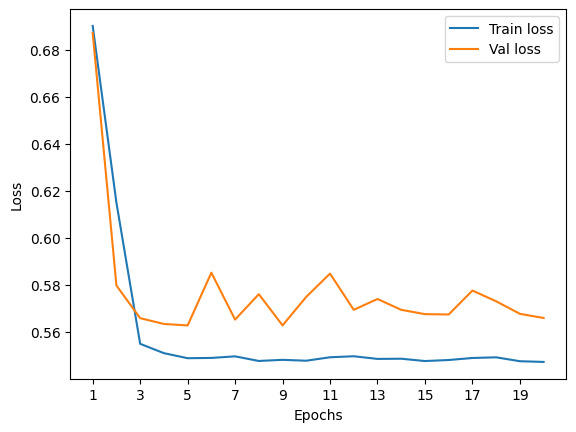

In [77]:
plot_loss(history)

In [ ]:
plot_auc(model, test_dataloader)

### QGAT with quantum classifier (MPS)

#### Leaky ReLU

#### Learning rate = 1e-2

In [54]:
model = QGAT(input_dims, depth=q_depth, n_layers=2)
model

QGAT(
  (layers): ModuleList(
    (0-1): 2 x QGATConv()
  )
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (classifier): <Quantum Torch Layer: func=quantum_circuit>
)

In [55]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

0it [00:00, ?it/s]


NameError: name 'x_i' is not defined

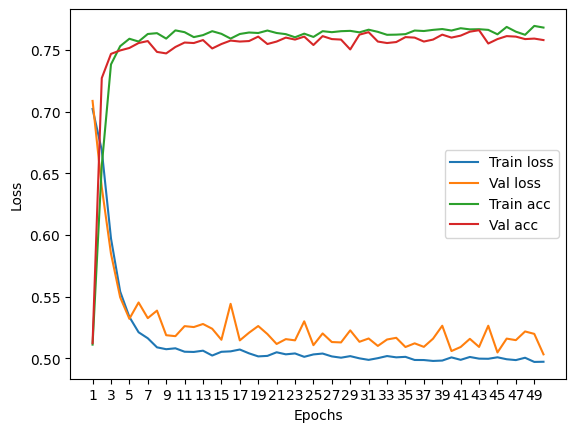

In [126]:
plot_loss(history)

Test accuracy:  78.36


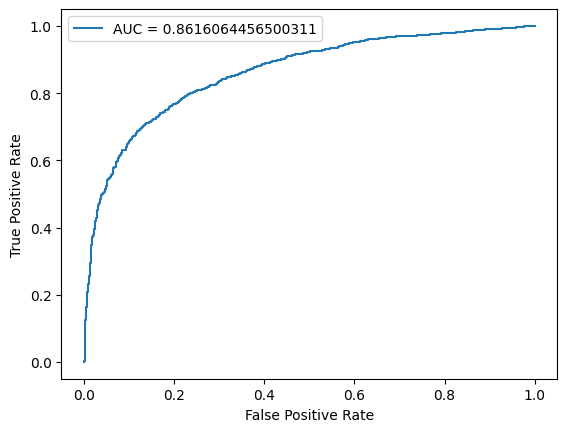

In [127]:
plot_auc(best_model, test_dataloader)

### QGCN with quantum classifier (MPS)

#### Leaky ReLU

#### Learning rate = 1e-2

#### With 3 particles, edge_weights, (total particles, photon, charged hadron, neutral hadron, net positive charge of jet) count

In [123]:
model = QGCN(input_dims, output_dims, classifier = "MPS", readout = True)
model

QGCN(
  (layers): ModuleList(
    (0): QGCNConv()
  )
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (readout): Linear(in_features=1, out_features=1, bias=True)
  (classifier): <Quantum Torch Layer: func=quantum_circuit>
)

In [124]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history, best_model = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

118it [02:21,  1.20s/it]


Train Epoch: 0 	Loss: 0.702171, Accuracy: 3834/7500 (51%)
Val Epoch: 0 	Loss: 0.708694, Accuracy: 1281/2500 (51%)



118it [02:23,  1.21s/it]


Train Epoch: 1 	Loss: 0.668724, Accuracy: 4922/7500 (66%)
Val Epoch: 1 	Loss: 0.638702, Accuracy: 1818/2500 (73%)



118it [02:22,  1.20s/it]


Train Epoch: 2 	Loss: 0.597284, Accuracy: 5537/7500 (74%)
Val Epoch: 2 	Loss: 0.584908, Accuracy: 1867/2500 (75%)



118it [01:04,  1.83it/s]


Train Epoch: 3 	Loss: 0.554188, Accuracy: 5648/7500 (75%)
Val Epoch: 3 	Loss: 0.549518, Accuracy: 1874/2500 (75%)



118it [00:59,  1.97it/s]


Train Epoch: 4 	Loss: 0.533610, Accuracy: 5693/7500 (76%)
Val Epoch: 4 	Loss: 0.532124, Accuracy: 1879/2500 (75%)



118it [01:17,  1.51it/s]


Train Epoch: 5 	Loss: 0.521222, Accuracy: 5676/7500 (76%)
Val Epoch: 5 	Loss: 0.545356, Accuracy: 1889/2500 (76%)



118it [01:08,  1.73it/s]


Train Epoch: 6 	Loss: 0.516357, Accuracy: 5722/7500 (76%)
Val Epoch: 6 	Loss: 0.532662, Accuracy: 1893/2500 (76%)



118it [01:13,  1.62it/s]


Train Epoch: 7 	Loss: 0.509006, Accuracy: 5727/7500 (76%)
Val Epoch: 7 	Loss: 0.538767, Accuracy: 1871/2500 (75%)



118it [02:16,  1.15s/it]


Train Epoch: 8 	Loss: 0.507487, Accuracy: 5694/7500 (76%)
Val Epoch: 8 	Loss: 0.518826, Accuracy: 1868/2500 (75%)



118it [02:02,  1.04s/it]


Train Epoch: 9 	Loss: 0.508226, Accuracy: 5744/7500 (77%)
Val Epoch: 9 	Loss: 0.518061, Accuracy: 1881/2500 (75%)



118it [02:00,  1.02s/it]


Train Epoch: 10 	Loss: 0.505449, Accuracy: 5733/7500 (76%)
Val Epoch: 10 	Loss: 0.526189, Accuracy: 1890/2500 (76%)



118it [02:06,  1.07s/it]


Train Epoch: 11 	Loss: 0.505269, Accuracy: 5703/7500 (76%)
Val Epoch: 11 	Loss: 0.525437, Accuracy: 1889/2500 (76%)



118it [02:03,  1.04s/it]


Train Epoch: 12 	Loss: 0.506293, Accuracy: 5715/7500 (76%)
Val Epoch: 12 	Loss: 0.527918, Accuracy: 1895/2500 (76%)



118it [02:05,  1.06s/it]


Train Epoch: 13 	Loss: 0.502358, Accuracy: 5739/7500 (77%)
Val Epoch: 13 	Loss: 0.524065, Accuracy: 1878/2500 (75%)



118it [02:04,  1.05s/it]


Train Epoch: 14 	Loss: 0.505385, Accuracy: 5723/7500 (76%)
Val Epoch: 14 	Loss: 0.515140, Accuracy: 1887/2500 (75%)



118it [02:06,  1.07s/it]


Train Epoch: 15 	Loss: 0.505746, Accuracy: 5694/7500 (76%)
Val Epoch: 15 	Loss: 0.544267, Accuracy: 1894/2500 (76%)



118it [02:01,  1.03s/it]


Train Epoch: 16 	Loss: 0.507232, Accuracy: 5722/7500 (76%)
Val Epoch: 16 	Loss: 0.514630, Accuracy: 1892/2500 (76%)



118it [02:05,  1.06s/it]


Train Epoch: 17 	Loss: 0.504135, Accuracy: 5731/7500 (76%)
Val Epoch: 17 	Loss: 0.520833, Accuracy: 1893/2500 (76%)



118it [02:00,  1.02s/it]


Train Epoch: 18 	Loss: 0.501665, Accuracy: 5728/7500 (76%)
Val Epoch: 18 	Loss: 0.526273, Accuracy: 1902/2500 (76%)



118it [02:13,  1.13s/it]


Train Epoch: 19 	Loss: 0.502069, Accuracy: 5743/7500 (77%)
Val Epoch: 19 	Loss: 0.519759, Accuracy: 1887/2500 (75%)



118it [02:00,  1.02s/it]


Train Epoch: 20 	Loss: 0.504999, Accuracy: 5728/7500 (76%)
Val Epoch: 20 	Loss: 0.511722, Accuracy: 1892/2500 (76%)



118it [01:59,  1.01s/it]


Train Epoch: 21 	Loss: 0.503339, Accuracy: 5721/7500 (76%)
Val Epoch: 21 	Loss: 0.515657, Accuracy: 1900/2500 (76%)



118it [02:00,  1.02s/it]


Train Epoch: 22 	Loss: 0.504052, Accuracy: 5702/7500 (76%)
Val Epoch: 22 	Loss: 0.514669, Accuracy: 1896/2500 (76%)



118it [01:59,  1.01s/it]


Train Epoch: 23 	Loss: 0.501318, Accuracy: 5724/7500 (76%)
Val Epoch: 23 	Loss: 0.530095, Accuracy: 1902/2500 (76%)



118it [01:57,  1.00it/s]


Train Epoch: 24 	Loss: 0.503260, Accuracy: 5704/7500 (76%)
Val Epoch: 24 	Loss: 0.510761, Accuracy: 1885/2500 (75%)



118it [01:59,  1.02s/it]


Train Epoch: 25 	Loss: 0.503970, Accuracy: 5739/7500 (77%)
Val Epoch: 25 	Loss: 0.520267, Accuracy: 1903/2500 (76%)



118it [01:57,  1.01it/s]


Train Epoch: 26 	Loss: 0.501646, Accuracy: 5733/7500 (76%)
Val Epoch: 26 	Loss: 0.513297, Accuracy: 1897/2500 (76%)



118it [01:59,  1.01s/it]


Train Epoch: 27 	Loss: 0.500610, Accuracy: 5739/7500 (77%)
Val Epoch: 27 	Loss: 0.512990, Accuracy: 1896/2500 (76%)



118it [01:58,  1.01s/it]


Train Epoch: 28 	Loss: 0.501879, Accuracy: 5741/7500 (77%)
Val Epoch: 28 	Loss: 0.522759, Accuracy: 1876/2500 (75%)



118it [02:16,  1.15s/it]


Train Epoch: 29 	Loss: 0.500087, Accuracy: 5732/7500 (76%)
Val Epoch: 29 	Loss: 0.513495, Accuracy: 1906/2500 (76%)



118it [02:00,  1.02s/it]


Train Epoch: 30 	Loss: 0.498848, Accuracy: 5748/7500 (77%)
Val Epoch: 30 	Loss: 0.516174, Accuracy: 1911/2500 (76%)



118it [01:56,  1.01it/s]


Train Epoch: 31 	Loss: 0.500228, Accuracy: 5735/7500 (76%)
Val Epoch: 31 	Loss: 0.510145, Accuracy: 1892/2500 (76%)



118it [02:01,  1.03s/it]


Train Epoch: 32 	Loss: 0.501942, Accuracy: 5717/7500 (76%)
Val Epoch: 32 	Loss: 0.515354, Accuracy: 1889/2500 (76%)



118it [02:00,  1.02s/it]


Train Epoch: 33 	Loss: 0.500899, Accuracy: 5718/7500 (76%)
Val Epoch: 33 	Loss: 0.516715, Accuracy: 1891/2500 (76%)



118it [02:25,  1.24s/it]


Train Epoch: 34 	Loss: 0.501299, Accuracy: 5721/7500 (76%)
Val Epoch: 34 	Loss: 0.509261, Accuracy: 1901/2500 (76%)



118it [02:08,  1.09s/it]


Train Epoch: 35 	Loss: 0.498762, Accuracy: 5743/7500 (77%)
Val Epoch: 35 	Loss: 0.512237, Accuracy: 1900/2500 (76%)



118it [02:14,  1.14s/it]


Train Epoch: 36 	Loss: 0.498713, Accuracy: 5740/7500 (77%)
Val Epoch: 36 	Loss: 0.509390, Accuracy: 1892/2500 (76%)



118it [02:07,  1.08s/it]


Train Epoch: 37 	Loss: 0.497977, Accuracy: 5747/7500 (77%)
Val Epoch: 37 	Loss: 0.516016, Accuracy: 1896/2500 (76%)



118it [01:34,  1.25it/s]


Train Epoch: 38 	Loss: 0.498285, Accuracy: 5752/7500 (77%)
Val Epoch: 38 	Loss: 0.526506, Accuracy: 1906/2500 (76%)



118it [02:22,  1.21s/it]


Train Epoch: 39 	Loss: 0.500854, Accuracy: 5743/7500 (77%)
Val Epoch: 39 	Loss: 0.506002, Accuracy: 1900/2500 (76%)



118it [01:19,  1.49it/s]


Train Epoch: 40 	Loss: 0.498882, Accuracy: 5757/7500 (77%)
Val Epoch: 40 	Loss: 0.509281, Accuracy: 1904/2500 (76%)



118it [01:13,  1.61it/s]


Train Epoch: 41 	Loss: 0.501197, Accuracy: 5750/7500 (77%)
Val Epoch: 41 	Loss: 0.515892, Accuracy: 1912/2500 (76%)



118it [01:14,  1.59it/s]


Train Epoch: 42 	Loss: 0.499843, Accuracy: 5751/7500 (77%)
Val Epoch: 42 	Loss: 0.509340, Accuracy: 1915/2500 (77%)



118it [01:17,  1.53it/s]


Train Epoch: 43 	Loss: 0.499730, Accuracy: 5747/7500 (77%)
Val Epoch: 43 	Loss: 0.526510, Accuracy: 1888/2500 (76%)



118it [01:18,  1.49it/s]


Train Epoch: 44 	Loss: 0.500930, Accuracy: 5720/7500 (76%)
Val Epoch: 44 	Loss: 0.504835, Accuracy: 1897/2500 (76%)



118it [01:23,  1.42it/s]


Train Epoch: 45 	Loss: 0.499350, Accuracy: 5765/7500 (77%)
Val Epoch: 45 	Loss: 0.516078, Accuracy: 1903/2500 (76%)



118it [01:15,  1.57it/s]


Train Epoch: 46 	Loss: 0.498670, Accuracy: 5736/7500 (76%)
Val Epoch: 46 	Loss: 0.514832, Accuracy: 1902/2500 (76%)



118it [01:15,  1.56it/s]


Train Epoch: 47 	Loss: 0.500563, Accuracy: 5717/7500 (76%)
Val Epoch: 47 	Loss: 0.521871, Accuracy: 1897/2500 (76%)



118it [01:14,  1.58it/s]


Train Epoch: 48 	Loss: 0.497184, Accuracy: 5771/7500 (77%)
Val Epoch: 48 	Loss: 0.519917, Accuracy: 1898/2500 (76%)



118it [01:14,  1.59it/s]


Train Epoch: 49 	Loss: 0.497321, Accuracy: 5761/7500 (77%)
Val Epoch: 49 	Loss: 0.503332, Accuracy: 1895/2500 (76%)



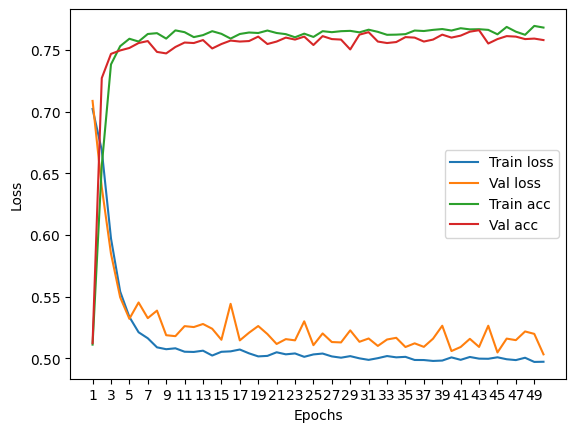

In [126]:
plot_loss(history)

Test accuracy:  78.36


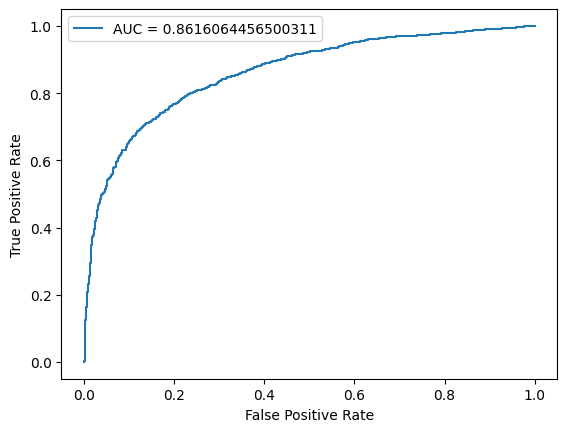

In [127]:
plot_auc(best_model, test_dataloader)

#### q_depth = 5, batch size = 1024

In [45]:
q_depth = 5

In [46]:
model = QGCN(input_dims, output_dims, classifier = "MPS", readout = True)
model

QGCN(
  (layers): ModuleList(
    (0): QGCNConv()
  )
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (readout): Linear(in_features=1, out_features=1, bias=True)
  (classifier): <Quantum Torch Layer: func=quantum_circuit>
)

In [47]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

59it [02:34,  2.63s/it]


Train Epoch: 0 	Loss: 0.697131, Accuracy: 31809/59922 (53%)
Val Epoch: 0 	Loss: 0.706608, Accuracy: 11106/19974 (56%)



59it [02:29,  2.53s/it]


Train Epoch: 1 	Loss: 0.693278, Accuracy: 35120/59922 (59%)
Val Epoch: 1 	Loss: 0.702678, Accuracy: 14241/19974 (71%)



59it [02:29,  2.53s/it]


Train Epoch: 2 	Loss: 0.689647, Accuracy: 37045/59922 (62%)
Val Epoch: 2 	Loss: 0.698665, Accuracy: 13781/19974 (69%)



59it [02:33,  2.60s/it]


Train Epoch: 3 	Loss: 0.684988, Accuracy: 38744/59922 (65%)
Val Epoch: 3 	Loss: 0.692188, Accuracy: 13951/19974 (70%)



59it [02:24,  2.45s/it]


Train Epoch: 4 	Loss: 0.674737, Accuracy: 40501/59922 (68%)
Val Epoch: 4 	Loss: 0.675497, Accuracy: 14476/19974 (72%)



59it [02:24,  2.44s/it]


Train Epoch: 5 	Loss: 0.656433, Accuracy: 42058/59922 (70%)
Val Epoch: 5 	Loss: 0.659936, Accuracy: 13904/19974 (70%)



59it [04:18,  4.38s/it]


Train Epoch: 6 	Loss: 0.643230, Accuracy: 42706/59922 (71%)
Val Epoch: 6 	Loss: 0.648823, Accuracy: 13774/19974 (69%)



59it [01:48,  1.84s/it]


Train Epoch: 7 	Loss: 0.632751, Accuracy: 42923/59922 (72%)
Val Epoch: 7 	Loss: 0.637451, Accuracy: 14441/19974 (72%)



59it [01:59,  2.03s/it]


Train Epoch: 8 	Loss: 0.623706, Accuracy: 43159/59922 (72%)
Val Epoch: 8 	Loss: 0.627738, Accuracy: 14599/19974 (73%)



59it [02:11,  2.24s/it]


Train Epoch: 9 	Loss: 0.615743, Accuracy: 43429/59922 (72%)
Val Epoch: 9 	Loss: 0.622697, Accuracy: 14385/19974 (72%)



59it [02:20,  2.38s/it]


Train Epoch: 10 	Loss: 0.609461, Accuracy: 43233/59922 (72%)
Val Epoch: 10 	Loss: 0.618091, Accuracy: 14325/19974 (72%)



59it [02:17,  2.34s/it]


Train Epoch: 11 	Loss: 0.602893, Accuracy: 43366/59922 (72%)
Val Epoch: 11 	Loss: 0.607289, Accuracy: 14595/19974 (73%)



59it [02:18,  2.34s/it]


Train Epoch: 12 	Loss: 0.595967, Accuracy: 43673/59922 (73%)
Val Epoch: 12 	Loss: 0.600831, Accuracy: 14612/19974 (73%)



59it [02:20,  2.39s/it]


Train Epoch: 13 	Loss: 0.594891, Accuracy: 43041/59922 (72%)
Val Epoch: 13 	Loss: 0.600002, Accuracy: 14454/19974 (72%)



59it [02:23,  2.43s/it]


Train Epoch: 14 	Loss: 0.588298, Accuracy: 43397/59922 (72%)
Val Epoch: 14 	Loss: 0.594845, Accuracy: 14450/19974 (72%)



59it [02:20,  2.38s/it]


Train Epoch: 15 	Loss: 0.583367, Accuracy: 43524/59922 (73%)
Val Epoch: 15 	Loss: 0.587489, Accuracy: 14573/19974 (73%)



59it [02:20,  2.39s/it]


Train Epoch: 16 	Loss: 0.579289, Accuracy: 43529/59922 (73%)
Val Epoch: 16 	Loss: 0.583829, Accuracy: 14625/19974 (73%)



59it [02:25,  2.46s/it]


Train Epoch: 17 	Loss: 0.575848, Accuracy: 43553/59922 (73%)
Val Epoch: 17 	Loss: 0.584879, Accuracy: 14418/19974 (72%)



59it [03:04,  3.13s/it]


Train Epoch: 18 	Loss: 0.574023, Accuracy: 43530/59922 (73%)
Val Epoch: 18 	Loss: 0.581761, Accuracy: 14416/19974 (72%)



59it [03:10,  3.23s/it]


Train Epoch: 19 	Loss: 0.571040, Accuracy: 43572/59922 (73%)
Val Epoch: 19 	Loss: 0.588432, Accuracy: 14225/19974 (71%)



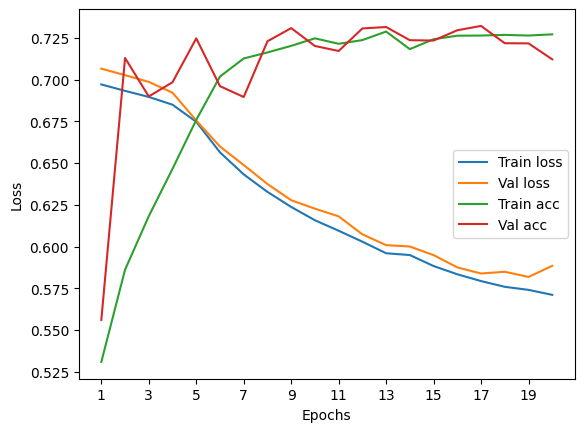

In [48]:
plot_loss(history)

In [49]:
history2 = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

59it [02:48,  2.86s/it]


Train Epoch: 0 	Loss: 0.568425, Accuracy: 43594/59922 (73%)
Val Epoch: 0 	Loss: 0.572174, Accuracy: 14611/19974 (73%)



59it [03:10,  3.22s/it]


Train Epoch: 1 	Loss: 0.566269, Accuracy: 43605/59922 (73%)
Val Epoch: 1 	Loss: 0.570349, Accuracy: 14625/19974 (73%)



59it [02:29,  2.54s/it]


Train Epoch: 2 	Loss: 0.565028, Accuracy: 43487/59922 (73%)
Val Epoch: 2 	Loss: 0.568864, Accuracy: 14624/19974 (73%)



59it [02:37,  2.67s/it]


Train Epoch: 3 	Loss: 0.561505, Accuracy: 43698/59922 (73%)
Val Epoch: 3 	Loss: 0.568758, Accuracy: 14583/19974 (73%)



59it [02:34,  2.61s/it]


Train Epoch: 4 	Loss: 0.561955, Accuracy: 43626/59922 (73%)
Val Epoch: 4 	Loss: 0.565235, Accuracy: 14599/19974 (73%)



59it [02:34,  2.63s/it]


Train Epoch: 5 	Loss: 0.558951, Accuracy: 43750/59922 (73%)
Val Epoch: 5 	Loss: 0.564754, Accuracy: 14612/19974 (73%)



59it [02:15,  2.30s/it]


Train Epoch: 6 	Loss: 0.560477, Accuracy: 43605/59922 (73%)
Val Epoch: 6 	Loss: 0.562188, Accuracy: 14622/19974 (73%)



59it [02:32,  2.59s/it]


Train Epoch: 7 	Loss: 0.557558, Accuracy: 43689/59922 (73%)
Val Epoch: 7 	Loss: 0.560613, Accuracy: 14626/19974 (73%)



59it [02:44,  2.79s/it]


Train Epoch: 8 	Loss: 0.558395, Accuracy: 43574/59922 (73%)
Val Epoch: 8 	Loss: 0.559722, Accuracy: 14615/19974 (73%)



59it [02:49,  2.87s/it]


Train Epoch: 9 	Loss: 0.557601, Accuracy: 43623/59922 (73%)
Val Epoch: 9 	Loss: 0.562673, Accuracy: 14627/19974 (73%)



59it [02:39,  2.70s/it]


Train Epoch: 10 	Loss: 0.554769, Accuracy: 43738/59922 (73%)
Val Epoch: 10 	Loss: 0.558111, Accuracy: 14656/19974 (73%)



59it [02:57,  3.02s/it]


Train Epoch: 11 	Loss: 0.553684, Accuracy: 43766/59922 (73%)
Val Epoch: 11 	Loss: 0.557187, Accuracy: 14655/19974 (73%)



59it [03:03,  3.12s/it]


Train Epoch: 12 	Loss: 0.552961, Accuracy: 43849/59922 (73%)
Val Epoch: 12 	Loss: 0.556950, Accuracy: 14633/19974 (73%)



59it [03:08,  3.20s/it]


Train Epoch: 13 	Loss: 0.553426, Accuracy: 43696/59922 (73%)
Val Epoch: 13 	Loss: 0.557804, Accuracy: 14598/19974 (73%)



59it [03:00,  3.07s/it]


Train Epoch: 14 	Loss: 0.552125, Accuracy: 43748/59922 (73%)
Val Epoch: 14 	Loss: 0.556450, Accuracy: 14613/19974 (73%)



59it [02:55,  2.98s/it]


Train Epoch: 15 	Loss: 0.551874, Accuracy: 43754/59922 (73%)
Val Epoch: 15 	Loss: 0.558786, Accuracy: 14604/19974 (73%)



59it [02:52,  2.92s/it]


Train Epoch: 16 	Loss: 0.552192, Accuracy: 43729/59922 (73%)
Val Epoch: 16 	Loss: 0.558032, Accuracy: 14564/19974 (73%)



59it [02:52,  2.93s/it]


Train Epoch: 17 	Loss: 0.552336, Accuracy: 43741/59922 (73%)
Val Epoch: 17 	Loss: 0.554618, Accuracy: 14628/19974 (73%)



59it [02:52,  2.93s/it]


Train Epoch: 18 	Loss: 0.552287, Accuracy: 43652/59922 (73%)
Val Epoch: 18 	Loss: 0.571138, Accuracy: 14413/19974 (72%)



59it [03:04,  3.13s/it]


Train Epoch: 19 	Loss: 0.550583, Accuracy: 43780/59922 (73%)
Val Epoch: 19 	Loss: 0.554443, Accuracy: 14646/19974 (73%)



In [63]:
a = dict()
for key in history.keys():
    a[key] = history[key] + history2[key]
len(a["train_loss"]), len(history["train_loss"])

(44, 22)

ValueError: setting an array element with a sequence.

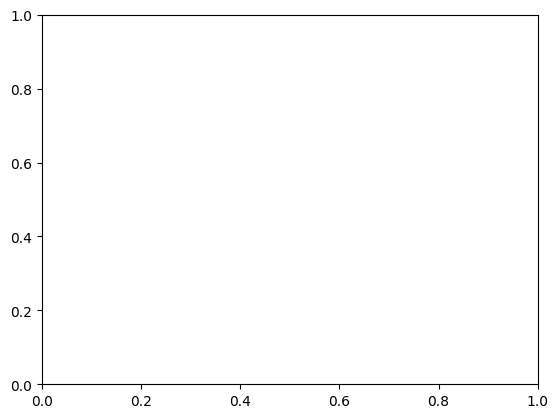

In [64]:
plot_loss(a)

#### With classical readout (1 node NN layer)

#### Batch size = 256

In [92]:
model = QGCN(input_dims, output_dims, classifier = "MPS", readout = True)
model

QGCN(
  (layers): ModuleList(
    (0): QGCNConv()
  )
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (readout): Linear(in_features=1, out_features=1, bias=True)
  (classifier): <Quantum Torch Layer: func=quantum_circuit>
)

In [93]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

313it [01:34,  3.33it/s]


Train Epoch: 0 	Loss: 0.692894, Accuracy: 41702/79896 (52%)
Val Epoch: 0 	Loss: 0.685161, Accuracy: 6734/9987 (67%)



313it [01:39,  3.15it/s]


Train Epoch: 1 	Loss: 0.627278, Accuracy: 55511/79896 (69%)
Val Epoch: 1 	Loss: 0.602105, Accuracy: 7176/9987 (72%)



313it [01:43,  3.03it/s]


Train Epoch: 2 	Loss: 0.577162, Accuracy: 57597/79896 (72%)
Val Epoch: 2 	Loss: 0.576855, Accuracy: 7348/9987 (74%)



313it [01:49,  2.85it/s]


Train Epoch: 3 	Loss: 0.559508, Accuracy: 57936/79896 (73%)
Val Epoch: 3 	Loss: 0.567254, Accuracy: 7289/9987 (73%)



313it [01:55,  2.71it/s]


Train Epoch: 4 	Loss: 0.553671, Accuracy: 57971/79896 (73%)
Val Epoch: 4 	Loss: 0.562518, Accuracy: 7239/9987 (72%)



313it [01:49,  2.87it/s]


Train Epoch: 5 	Loss: 0.550818, Accuracy: 58132/79896 (73%)
Val Epoch: 5 	Loss: 0.549491, Accuracy: 7299/9987 (73%)



313it [01:37,  3.21it/s]


Train Epoch: 6 	Loss: 0.551838, Accuracy: 58090/79896 (73%)
Val Epoch: 6 	Loss: 0.545362, Accuracy: 7306/9987 (73%)



313it [01:31,  3.41it/s]


Train Epoch: 7 	Loss: 0.550924, Accuracy: 58059/79896 (73%)
Val Epoch: 7 	Loss: 0.547601, Accuracy: 7315/9987 (73%)



313it [01:31,  3.40it/s]


Train Epoch: 8 	Loss: 0.549134, Accuracy: 58195/79896 (73%)
Val Epoch: 8 	Loss: 0.587775, Accuracy: 7108/9987 (71%)



313it [01:31,  3.43it/s]


Train Epoch: 9 	Loss: 0.551176, Accuracy: 58032/79896 (73%)
Val Epoch: 9 	Loss: 0.547953, Accuracy: 7357/9987 (74%)



313it [01:29,  3.49it/s]


Train Epoch: 10 	Loss: 0.550786, Accuracy: 58028/79896 (73%)
Val Epoch: 10 	Loss: 0.579704, Accuracy: 7281/9987 (73%)



313it [01:59,  2.61it/s]


Train Epoch: 11 	Loss: 0.550640, Accuracy: 58064/79896 (73%)
Val Epoch: 11 	Loss: 0.549506, Accuracy: 7367/9987 (74%)



313it [01:56,  2.69it/s]


Train Epoch: 12 	Loss: 0.549292, Accuracy: 58136/79896 (73%)
Val Epoch: 12 	Loss: 0.557750, Accuracy: 7288/9987 (73%)



313it [02:02,  2.55it/s]


Train Epoch: 13 	Loss: 0.549417, Accuracy: 58138/79896 (73%)
Val Epoch: 13 	Loss: 0.546394, Accuracy: 7338/9987 (73%)



313it [01:35,  3.28it/s]


Train Epoch: 14 	Loss: 0.548446, Accuracy: 58262/79896 (73%)
Val Epoch: 14 	Loss: 0.553274, Accuracy: 7384/9987 (74%)



313it [01:47,  2.90it/s]


Train Epoch: 15 	Loss: 0.548337, Accuracy: 58224/79896 (73%)
Val Epoch: 15 	Loss: 0.553750, Accuracy: 7323/9987 (73%)



313it [02:01,  2.58it/s]


Train Epoch: 16 	Loss: 0.550014, Accuracy: 58178/79896 (73%)
Val Epoch: 16 	Loss: 0.552275, Accuracy: 7287/9987 (73%)



313it [01:56,  2.68it/s]


Train Epoch: 17 	Loss: 0.547561, Accuracy: 58333/79896 (73%)
Val Epoch: 17 	Loss: 0.546264, Accuracy: 7388/9987 (74%)



313it [02:04,  2.52it/s]


Train Epoch: 18 	Loss: 0.547830, Accuracy: 58317/79896 (73%)
Val Epoch: 18 	Loss: 0.555675, Accuracy: 7282/9987 (73%)



313it [01:40,  3.11it/s]


Train Epoch: 19 	Loss: 0.548044, Accuracy: 58216/79896 (73%)
Val Epoch: 19 	Loss: 0.552980, Accuracy: 7390/9987 (74%)



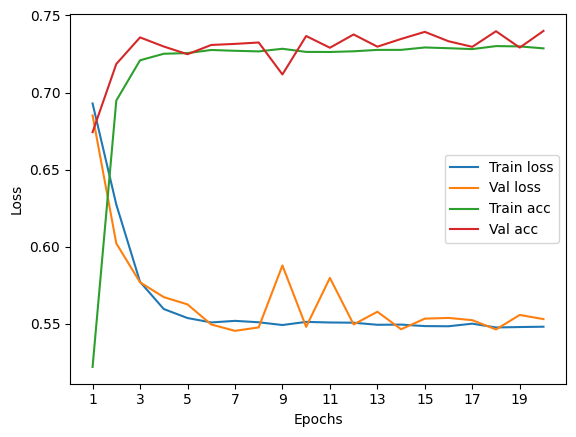

In [94]:
plot_loss(history)

Test accuracy:  72.36407329528387


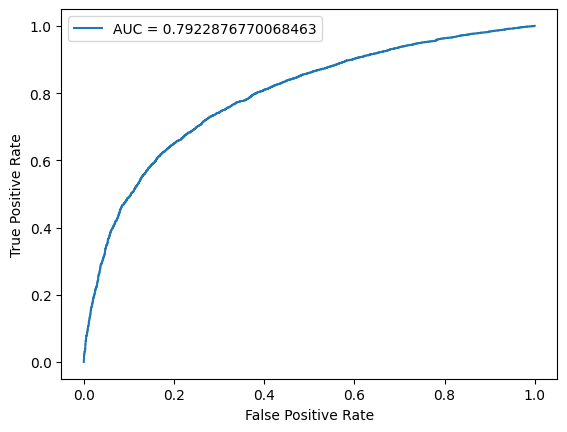

In [95]:
plot_auc(model, test_dataloader)

### QGCN with quantum classifier (TTN)

#### Leaky ReLU

#### Learning rate = 1e-2

#### With classical readout (1 node NN layer)

In [88]:
model = QGCN(input_dims, output_dims, classifier = "TTN", readout = True)
model

QGCN(
  (layers): ModuleList(
    (0): QGCNConv()
  )
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (readout): Linear(in_features=1, out_features=1, bias=True)
  (classifier): <Quantum Torch Layer: func=quantum_circuit>
)

In [86]:
[p.numel() for p in model.parameters()]

[8, 16, 1, 1, 15]

In [89]:
optimizer = Adam(model.parameters(), 1e-1)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

59it [10:03, 10.22s/it]


Train Epoch: 0 	Loss: 0.705702, Accuracy: 29935/60000 (50%)
Val Epoch: 0 	Loss: 0.709767, Accuracy: 10115/20000 (51%)



59it [10:10, 10.35s/it]


Train Epoch: 1 	Loss: 0.698094, Accuracy: 30184/60000 (50%)
Val Epoch: 1 	Loss: 0.709974, Accuracy: 9916/20000 (50%)



59it [10:13, 10.40s/it]


Train Epoch: 2 	Loss: 0.698322, Accuracy: 29993/60000 (50%)
Val Epoch: 2 	Loss: 0.710215, Accuracy: 9916/20000 (50%)



59it [10:20, 10.52s/it]


Train Epoch: 3 	Loss: 0.698172, Accuracy: 30190/60000 (50%)
Val Epoch: 3 	Loss: 0.710352, Accuracy: 9916/20000 (50%)



59it [10:22, 10.55s/it]


Train Epoch: 4 	Loss: 0.698237, Accuracy: 30116/60000 (50%)
Val Epoch: 4 	Loss: 0.709640, Accuracy: 10253/20000 (51%)



59it [10:30, 10.69s/it]


Train Epoch: 5 	Loss: 0.698044, Accuracy: 30109/60000 (50%)
Val Epoch: 5 	Loss: 0.709657, Accuracy: 10306/20000 (52%)



59it [10:21, 10.54s/it]


Train Epoch: 6 	Loss: 0.697963, Accuracy: 30312/60000 (51%)
Val Epoch: 6 	Loss: 0.709789, Accuracy: 10084/20000 (50%)



59it [10:16, 10.45s/it]


Train Epoch: 7 	Loss: 0.698155, Accuracy: 29978/60000 (50%)
Val Epoch: 7 	Loss: 0.709757, Accuracy: 10084/20000 (50%)



59it [10:22, 10.55s/it]


Train Epoch: 8 	Loss: 0.698099, Accuracy: 30176/60000 (50%)
Val Epoch: 8 	Loss: 0.709738, Accuracy: 10084/20000 (50%)



59it [10:26, 10.63s/it]


Train Epoch: 9 	Loss: 0.698036, Accuracy: 29907/60000 (50%)
Val Epoch: 9 	Loss: 0.709696, Accuracy: 10298/20000 (51%)



59it [10:20, 10.51s/it]


Train Epoch: 10 	Loss: 0.698087, Accuracy: 30165/60000 (50%)
Val Epoch: 10 	Loss: 0.709749, Accuracy: 10205/20000 (51%)



59it [10:21, 10.54s/it]


Train Epoch: 11 	Loss: 0.698028, Accuracy: 30260/60000 (50%)
Val Epoch: 11 	Loss: 0.709628, Accuracy: 10128/20000 (51%)



59it [10:28, 10.65s/it]


Train Epoch: 12 	Loss: 0.697863, Accuracy: 30470/60000 (51%)
Val Epoch: 12 	Loss: 0.711735, Accuracy: 10084/20000 (50%)



59it [10:24, 10.58s/it]


Train Epoch: 13 	Loss: 0.698295, Accuracy: 30046/60000 (50%)
Val Epoch: 13 	Loss: 0.709810, Accuracy: 9916/20000 (50%)



59it [10:22, 10.55s/it]


Train Epoch: 14 	Loss: 0.698264, Accuracy: 30080/60000 (50%)
Val Epoch: 14 	Loss: 0.709691, Accuracy: 10208/20000 (51%)



59it [10:25, 10.60s/it]


Train Epoch: 15 	Loss: 0.697920, Accuracy: 30217/60000 (50%)
Val Epoch: 15 	Loss: 0.709737, Accuracy: 9918/20000 (50%)



59it [10:28, 10.65s/it]


Train Epoch: 16 	Loss: 0.697958, Accuracy: 30121/60000 (50%)
Val Epoch: 16 	Loss: 0.710057, Accuracy: 10084/20000 (50%)



59it [10:23, 10.57s/it]


Train Epoch: 17 	Loss: 0.698174, Accuracy: 29994/60000 (50%)
Val Epoch: 17 	Loss: 0.709313, Accuracy: 10084/20000 (50%)



59it [10:29, 10.67s/it]


Train Epoch: 18 	Loss: 0.698008, Accuracy: 30265/60000 (50%)
Val Epoch: 18 	Loss: 0.711577, Accuracy: 9916/20000 (50%)



59it [10:27, 10.63s/it]


Train Epoch: 19 	Loss: 0.698265, Accuracy: 30139/60000 (50%)
Val Epoch: 19 	Loss: 0.709906, Accuracy: 9916/20000 (50%)



59it [10:22, 10.56s/it]


Train Epoch: 20 	Loss: 0.698437, Accuracy: 29767/60000 (50%)
Val Epoch: 20 	Loss: 0.709760, Accuracy: 9916/20000 (50%)



59it [10:21, 10.54s/it]


Train Epoch: 21 	Loss: 0.698135, Accuracy: 30034/60000 (50%)
Val Epoch: 21 	Loss: 0.709781, Accuracy: 10084/20000 (50%)



59it [10:23, 10.57s/it]


Train Epoch: 22 	Loss: 0.698145, Accuracy: 30168/60000 (50%)
Val Epoch: 22 	Loss: 0.710002, Accuracy: 9916/20000 (50%)



59it [10:21, 10.54s/it]


Train Epoch: 23 	Loss: 0.698119, Accuracy: 29944/60000 (50%)
Val Epoch: 23 	Loss: 0.709809, Accuracy: 10084/20000 (50%)



59it [10:29, 10.66s/it]


Train Epoch: 24 	Loss: 0.698118, Accuracy: 30008/60000 (50%)
Val Epoch: 24 	Loss: 0.711193, Accuracy: 9916/20000 (50%)



59it [10:23, 10.57s/it]


Train Epoch: 25 	Loss: 0.698314, Accuracy: 30186/60000 (50%)
Val Epoch: 25 	Loss: 0.710326, Accuracy: 10084/20000 (50%)



59it [10:23, 10.57s/it]


Train Epoch: 26 	Loss: 0.698457, Accuracy: 29918/60000 (50%)
Val Epoch: 26 	Loss: 0.709907, Accuracy: 9916/20000 (50%)



59it [10:24, 10.59s/it]


Train Epoch: 27 	Loss: 0.698184, Accuracy: 29839/60000 (50%)
Val Epoch: 27 	Loss: 0.709740, Accuracy: 10084/20000 (50%)



59it [10:24, 10.59s/it]


Train Epoch: 28 	Loss: 0.698296, Accuracy: 30133/60000 (50%)
Val Epoch: 28 	Loss: 0.709848, Accuracy: 10084/20000 (50%)



59it [10:22, 10.55s/it]


Train Epoch: 29 	Loss: 0.698223, Accuracy: 30479/60000 (51%)
Val Epoch: 29 	Loss: 0.710713, Accuracy: 10084/20000 (50%)



59it [10:27, 10.63s/it]


Train Epoch: 30 	Loss: 0.698736, Accuracy: 29680/60000 (49%)
Val Epoch: 30 	Loss: 0.709760, Accuracy: 9916/20000 (50%)



59it [10:41, 10.87s/it]


Train Epoch: 31 	Loss: 0.698305, Accuracy: 29818/60000 (50%)
Val Epoch: 31 	Loss: 0.709724, Accuracy: 10084/20000 (50%)



59it [10:24, 10.58s/it]


Train Epoch: 32 	Loss: 0.698067, Accuracy: 30212/60000 (50%)
Val Epoch: 32 	Loss: 0.710113, Accuracy: 9916/20000 (50%)



59it [10:22, 10.56s/it]


Train Epoch: 33 	Loss: 0.698091, Accuracy: 30051/60000 (50%)
Val Epoch: 33 	Loss: 0.709775, Accuracy: 9916/20000 (50%)



59it [10:30, 10.68s/it]


Train Epoch: 34 	Loss: 0.698367, Accuracy: 29888/60000 (50%)
Val Epoch: 34 	Loss: 0.709740, Accuracy: 10084/20000 (50%)



59it [10:23, 10.57s/it]


Train Epoch: 35 	Loss: 0.698212, Accuracy: 29899/60000 (50%)
Val Epoch: 35 	Loss: 0.709642, Accuracy: 10084/20000 (50%)



28it [05:23, 11.54s/it]


KeyboardInterrupt: 

In [ ]:
plot_loss(history)

In [ ]:
plot_AUC(model, test_dataloader)

In [108]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

313it [01:31,  3.43it/s]


Train Epoch: 0 	Loss: 0.681000, Accuracy: 48501/79896 (61%)
Val Epoch: 0 	Loss: 0.672508, Accuracy: 6922/9987 (69%)



313it [01:29,  3.48it/s]


Train Epoch: 1 	Loss: 0.636306, Accuracy: 56272/79896 (70%)
Val Epoch: 1 	Loss: 0.627609, Accuracy: 7215/9987 (72%)



313it [01:42,  3.04it/s]


Train Epoch: 2 	Loss: 0.602632, Accuracy: 57383/79896 (72%)
Val Epoch: 2 	Loss: 0.611829, Accuracy: 7151/9987 (72%)



313it [01:51,  2.81it/s]


Train Epoch: 3 	Loss: 0.580859, Accuracy: 57706/79896 (72%)
Val Epoch: 3 	Loss: 0.591779, Accuracy: 7158/9987 (72%)



313it [01:42,  3.06it/s]


Train Epoch: 4 	Loss: 0.567206, Accuracy: 57925/79896 (73%)
Val Epoch: 4 	Loss: 0.587606, Accuracy: 7061/9987 (71%)



313it [01:51,  2.81it/s]


Train Epoch: 5 	Loss: 0.562071, Accuracy: 57820/79896 (72%)
Val Epoch: 5 	Loss: 0.584432, Accuracy: 7104/9987 (71%)



313it [02:04,  2.52it/s]


Train Epoch: 6 	Loss: 0.558320, Accuracy: 57718/79896 (72%)
Val Epoch: 6 	Loss: 0.569604, Accuracy: 7195/9987 (72%)



313it [01:48,  2.89it/s]


Train Epoch: 7 	Loss: 0.553123, Accuracy: 58064/79896 (73%)
Val Epoch: 7 	Loss: 0.591374, Accuracy: 7060/9987 (71%)



313it [01:54,  2.75it/s]


Train Epoch: 8 	Loss: 0.554289, Accuracy: 57863/79896 (72%)
Val Epoch: 8 	Loss: 0.608931, Accuracy: 6866/9987 (69%)



313it [01:53,  2.76it/s]


Train Epoch: 9 	Loss: 0.552773, Accuracy: 57965/79896 (73%)
Val Epoch: 9 	Loss: 0.581031, Accuracy: 7068/9987 (71%)



313it [01:57,  2.66it/s]


Train Epoch: 10 	Loss: 0.550186, Accuracy: 58154/79896 (73%)
Val Epoch: 10 	Loss: 0.588283, Accuracy: 7169/9987 (72%)



313it [02:02,  2.56it/s]


Train Epoch: 11 	Loss: 0.551110, Accuracy: 58049/79896 (73%)
Val Epoch: 11 	Loss: 0.578840, Accuracy: 7152/9987 (72%)



313it [02:02,  2.55it/s]


Train Epoch: 12 	Loss: 0.550900, Accuracy: 58059/79896 (73%)
Val Epoch: 12 	Loss: 0.569618, Accuracy: 7169/9987 (72%)



313it [02:02,  2.56it/s]


Train Epoch: 13 	Loss: 0.549998, Accuracy: 58154/79896 (73%)
Val Epoch: 13 	Loss: 0.556895, Accuracy: 7245/9987 (73%)



313it [01:43,  3.01it/s]


Train Epoch: 14 	Loss: 0.550479, Accuracy: 57981/79896 (73%)
Val Epoch: 14 	Loss: 0.578339, Accuracy: 7232/9987 (72%)



313it [01:59,  2.63it/s]


Train Epoch: 15 	Loss: 0.550932, Accuracy: 58193/79896 (73%)
Val Epoch: 15 	Loss: 0.567073, Accuracy: 7243/9987 (73%)



313it [01:42,  3.05it/s]


Train Epoch: 16 	Loss: 0.549316, Accuracy: 58110/79896 (73%)
Val Epoch: 16 	Loss: 0.576231, Accuracy: 7244/9987 (73%)



313it [01:42,  3.06it/s]


Train Epoch: 17 	Loss: 0.549314, Accuracy: 58210/79896 (73%)
Val Epoch: 17 	Loss: 0.588104, Accuracy: 7121/9987 (71%)



313it [01:50,  2.82it/s]


Train Epoch: 18 	Loss: 0.548972, Accuracy: 58246/79896 (73%)
Val Epoch: 18 	Loss: 0.560048, Accuracy: 7248/9987 (73%)



313it [01:54,  2.75it/s]


Train Epoch: 19 	Loss: 0.546859, Accuracy: 58391/79896 (73%)
Val Epoch: 19 	Loss: 0.587806, Accuracy: 7005/9987 (70%)



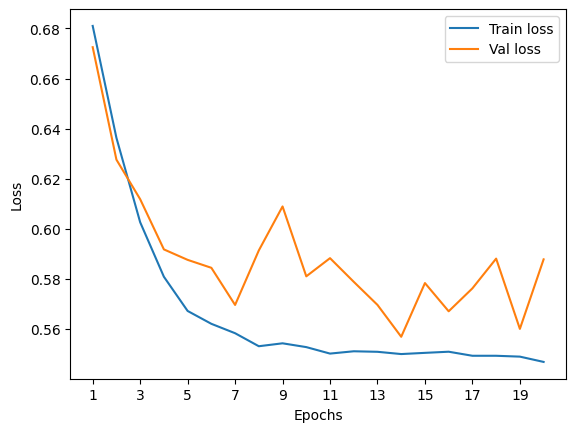

In [109]:
plot_loss(history)

In [ ]:
plot_auc(model, test_dataloader)

### GCNConv without Node Embedding NN

In [74]:
class SimpleGCNConv(MessagePassing):
    def __init__(self, in_channels):
        super().__init__(aggr='add')  # "Add" aggregation (Step 5).
        self.bias = nn.Parameter(torch.empty(in_channels))
        self.reset_parameters()
        self.n_qubits = in_channels

    def reset_parameters(self):
        self.bias.data.zero_()

    def forward(self, x, edge_index):
        # x has shape [N, in_channels]
        # edge_index has shape [2, E]

        # Step 1: Add self-loops to the adjacency matrix.
        edge_index, _ = add_self_loops(edge_index, num_nodes=x.size(0))

        # Step 2: Linearly transform node feature matrix
        out = x

        # Step 3: Compute normalization.
        row, col = edge_index
        deg = degree(col, out.size(0), dtype=out.dtype)
        deg_inv_sqrt = deg.pow(-0.5)
        deg_inv_sqrt[deg_inv_sqrt == float('inf')] = 0
        norm = deg_inv_sqrt[row] * deg_inv_sqrt[col]

        # Step 4-5: Start propagating messages.
        out = self.propagate(edge_index, x=out, norm=norm)

        # Step 6: Apply a final bias vector.
        out = out + self.bias

        return out

    def message(self, x_j, norm):
        # x_j has shape [E, out_channels]

        # Step 4: Normalize node features.
        return norm.view(-1, 1) * x_j

In [75]:
class SimpleGCN(nn.Module):

    def __init__(self, input_dims, output_dims, activ_fn = LeakyReLU(0.2), no_gcn = False):
        
        super().__init__()
        layers = [SimpleGCNConv(input_dims)]
        if no_gcn:
            self.layers = []
        else:
            self.layers = ModuleList(layers)
        self.activ_fn = activ_fn
        self.classifier = nn.Linear(input_dims, output_dims)

    def forward(self, x, edge_index, batch):
        """
        Defining how tensors are supposed to move through the *dressed* quantum
        net.
        """
        
        h = x
        for i in range(len(self.layers)):
            h = self.layers[i](h, edge_index)
            h = self.activ_fn(h)
         
        h = global_mean_pool(h, batch)   # readout layer to get the embedding for each graph in batch
        h = self.classifier(h)

        # return the two-dimensional prediction from the postprocessing layer
        return h

#### LeakyReLU

#### Learning rate = 1e-2

In [ ]:
model = SimpleGCN(input_dims, output_dims)
model

In [ ]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

In [ ]:
plot_loss(history)

In [ ]:
plot_auc(model, test_dataloader)

#### ReLU

#### Learning rate = 1e-3

In [ ]:
model = SimpleGCN(input_dims, output_dims, activ_fn = ReLU())
model

In [ ]:
optimizer = Adam(model.parameters(), 1e-3)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

In [ ]:
plot_loss(history)

In [ ]:
plot_auc(model, test_dataloader)

#### Simple ANN (No Graph Convolution)

#### Learning rate = 1e-2

#### Batch size = 256

In [81]:
epochs = 20

In [82]:
model = SimpleGCN(input_dims, output_dims, activ_fn = LeakyReLU(0.2), no_gcn = True)
model

SimpleGCN(
  (activ_fn): LeakyReLU(negative_slope=0.2)
  (classifier): Linear(in_features=8, out_features=1, bias=True)
)

In [83]:
optimizer = Adam(model.parameters(), 1e-2)
lossFn = BCEWithLogitsLoss()
history = train_model(model, optimizer, lossFn, epochs, lr, train_dataloader, val_dataloader)

313it [00:04, 71.06it/s]


Train Epoch: 0 	Loss: 0.676988, Accuracy: 51080/79896 (64%)
Val Epoch: 0 	Loss: 0.671601, Accuracy: 7225/9987 (72%)



313it [00:04, 73.25it/s]


Train Epoch: 1 	Loss: 0.639369, Accuracy: 57397/79896 (72%)
Val Epoch: 1 	Loss: 0.640175, Accuracy: 7284/9987 (73%)



313it [00:04, 73.80it/s]


Train Epoch: 2 	Loss: 0.612381, Accuracy: 58047/79896 (73%)
Val Epoch: 2 	Loss: 0.613305, Accuracy: 7359/9987 (74%)



313it [00:04, 76.46it/s]


Train Epoch: 3 	Loss: 0.592804, Accuracy: 58318/79896 (73%)
Val Epoch: 3 	Loss: 0.597151, Accuracy: 7352/9987 (74%)



313it [00:04, 75.04it/s]


Train Epoch: 4 	Loss: 0.578007, Accuracy: 58392/79896 (73%)
Val Epoch: 4 	Loss: 0.588233, Accuracy: 7368/9987 (74%)



313it [00:04, 74.16it/s]


Train Epoch: 5 	Loss: 0.567363, Accuracy: 58463/79896 (73%)
Val Epoch: 5 	Loss: 0.570667, Accuracy: 7368/9987 (74%)



313it [00:04, 71.90it/s]


Train Epoch: 6 	Loss: 0.559329, Accuracy: 58493/79896 (73%)
Val Epoch: 6 	Loss: 0.567750, Accuracy: 7388/9987 (74%)



313it [00:04, 72.63it/s]


Train Epoch: 7 	Loss: 0.553742, Accuracy: 58540/79896 (73%)
Val Epoch: 7 	Loss: 0.558858, Accuracy: 7381/9987 (74%)



313it [00:04, 76.11it/s]


Train Epoch: 8 	Loss: 0.549221, Accuracy: 58600/79896 (73%)
Val Epoch: 8 	Loss: 0.551004, Accuracy: 7390/9987 (74%)



313it [00:04, 74.11it/s]


Train Epoch: 9 	Loss: 0.546255, Accuracy: 58607/79896 (73%)
Val Epoch: 9 	Loss: 0.555680, Accuracy: 7392/9987 (74%)



313it [00:04, 74.93it/s]


Train Epoch: 10 	Loss: 0.543787, Accuracy: 58652/79896 (73%)
Val Epoch: 10 	Loss: 0.558018, Accuracy: 7379/9987 (74%)



313it [00:04, 75.93it/s]


Train Epoch: 11 	Loss: 0.542267, Accuracy: 58639/79896 (73%)
Val Epoch: 11 	Loss: 0.542330, Accuracy: 7387/9987 (74%)



313it [00:04, 72.01it/s]


Train Epoch: 12 	Loss: 0.540816, Accuracy: 58654/79896 (73%)
Val Epoch: 12 	Loss: 0.552407, Accuracy: 7392/9987 (74%)



313it [00:04, 73.66it/s]


Train Epoch: 13 	Loss: 0.540314, Accuracy: 58662/79896 (73%)
Val Epoch: 13 	Loss: 0.549833, Accuracy: 7395/9987 (74%)



313it [00:04, 75.27it/s]


Train Epoch: 14 	Loss: 0.540198, Accuracy: 58665/79896 (73%)
Val Epoch: 14 	Loss: 0.556712, Accuracy: 7395/9987 (74%)



313it [00:04, 72.40it/s]


Train Epoch: 15 	Loss: 0.540141, Accuracy: 58660/79896 (73%)
Val Epoch: 15 	Loss: 0.570867, Accuracy: 7397/9987 (74%)



313it [00:04, 75.65it/s]


Train Epoch: 16 	Loss: 0.539450, Accuracy: 58690/79896 (73%)
Val Epoch: 16 	Loss: 0.547334, Accuracy: 7406/9987 (74%)



313it [00:04, 76.40it/s]


Train Epoch: 17 	Loss: 0.539326, Accuracy: 58690/79896 (73%)
Val Epoch: 17 	Loss: 0.549008, Accuracy: 7399/9987 (74%)



313it [00:04, 75.18it/s]


Train Epoch: 18 	Loss: 0.539428, Accuracy: 58685/79896 (73%)
Val Epoch: 18 	Loss: 0.557562, Accuracy: 7410/9987 (74%)



313it [00:04, 75.75it/s]


Train Epoch: 19 	Loss: 0.538926, Accuracy: 58740/79896 (74%)
Val Epoch: 19 	Loss: 0.545186, Accuracy: 7411/9987 (74%)



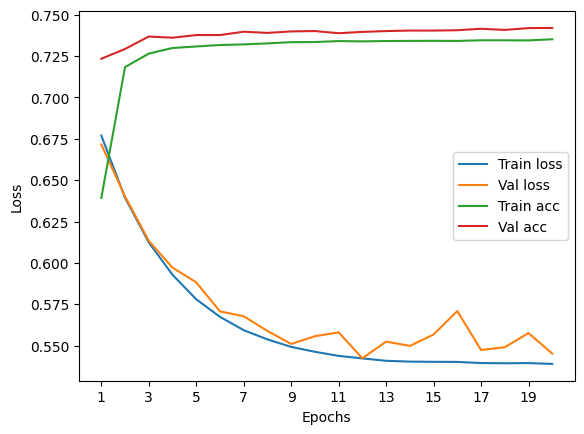

In [84]:
plot_loss(history)

Test accuracy:  72.95484129368178


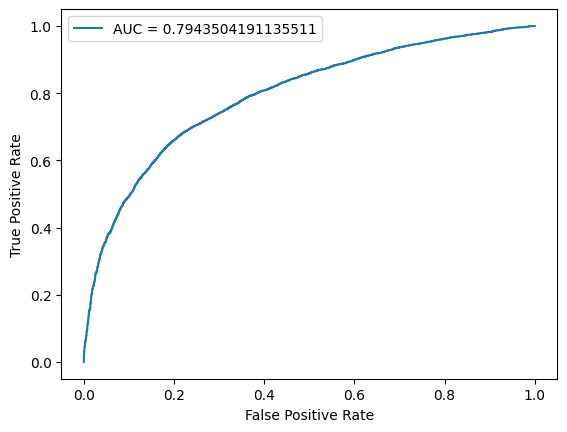

In [85]:
plot_auc(model, test_dataloader)